In [ ]:
! pip install torch torchvision scikit-learn umap-learn matplotlib

In [ ]:
import os, sys, math, random, copy
import numpy as np
import torch
from torch import nn
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, adjusted_rand_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.model_selection import KFold, LeaveOneOut, StratifiedKFold
from sklearn.impute import SimpleImputer
from umap import UMAP
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score
import pandas as pd

from google.colab import drive

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cpu


**Step 0: Load preprocessed data**

In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
X_ad = np.load("/content/drive/MyDrive/67960_final_proj/X_ad.npy")
X_t2d = np.load("/content/drive/MyDrive/67960_final_proj/X_t2d.npy")
X_combined = np.load("/content/drive/MyDrive/67960_final_proj/X_combined.npy")
y_combined = np.load("/content/drive/MyDrive/67960_final_proj/y_combined.npy")

X_mouse = np.load("/content/drive/MyDrive/67960_final_proj/X_mouse.npy")
y_mouse = np.load("/content/drive/MyDrive/67960_final_proj/y_mouse.npy")

pathway_mask = np.load("/content/drive/MyDrive/67960_final_proj/pathway_mask.npy")
shared_genes = np.load("/content/drive/MyDrive/67960_final_proj/shared_genes.npy", allow_pickle=True)

**Model Definitions, Train Func, Helper Func, Eval Func**

In [ ]:
# This will be used for the various masked autoencoders trained
class MaskedLinear(nn.Module):
    def __init__(self, in_features, out_features, bias=True, mask=None):
        super().__init__()
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        # Identity if no mask
        if mask is None:
            self.register_buffer('mask', torch.ones(out_features, in_features))
        else:
            self.register_buffer('mask', torch.tensor(mask, dtype=torch.float32))
    def forward(self, x):
        # ensure mask is on same device as weights/input

        mask = self.mask.to(self.linear.weight.device)
         # column-wise masking: mask input features
        if mask.ndim == 1 and mask.shape[0] == self.linear.weight.shape[1]:
            w = self.linear.weight * mask.unsqueeze(0)
        # row-wise masking: mask output neurons
        elif mask.ndim == 1 and mask.shape[0] == self.linear.weight.shape[0]:
            w = self.linear.weight * mask.unsqueeze(1)
        else:
            w = self.linear.weight * mask  # must match exactly
        #w = self.linear.weight * mask
        return nn.functional.linear(x, w, self.linear.bias)

In [ ]:
class Autoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim=32, hidden_dims=[128], mask=None, soft_mask=False):
        super().__init__()
        # encoder: input -> hidden(s) -> latent
        enc_layers = []
        prev = input_dim
        # apply mask on first layer (pathway constraints apply between genes + latent rep, not needed for deeper inside NN)
        if len(hidden_dims)>0:
            # masked first layer -> hidden
            # mask must be (out_features, in_features) (nn.Linear weights are (out, in))
            enc_layers.append(MaskedLinear(prev, hidden_dims[0], mask=mask))
            enc_layers.append(nn.ReLU())
            for i in range(len(hidden_dims)-1):
                enc_layers.append(nn.Linear(hidden_dims[i], hidden_dims[i+1]))
                enc_layers.append(nn.ReLU())
            enc_layers.append(nn.Linear(hidden_dims[-1], latent_dim))
        else:
            #if no hidden layers, mask dir from input to latent
            enc_layers.append(MaskedLinear(prev, latent_dim, mask=mask))
        self.encoder = nn.Sequential(*enc_layers)
        # decoder: latent -> hidden (reverse) -> input
        dec_layers = []
        prev = latent_dim
        if len(hidden_dims)>0:
            dec_layers.append(nn.Linear(prev, hidden_dims[-1]))
            dec_layers.append(nn.ReLU())
            for i in range(len(hidden_dims)-1,0,-1):
                dec_layers.append(nn.Linear(hidden_dims[i], hidden_dims[i-1]))
                dec_layers.append(nn.ReLU())
            dec_layers.append(nn.Linear(hidden_dims[0], input_dim))
        else:
            dec_layers.append(nn.Linear(prev, input_dim))
        self.decoder = nn.Sequential(*dec_layers)

        # save mask flag for regularization
        self.soft_mask = soft_mask
        # store mask tensor for regularization
        if mask is None:
            # default all ones with expected orientation: (out, in) where out = first hidden dim or latent
            first_out = hidden_dims[0] if len(hidden_dims)>0 else latent_dim
            self.register_buffer('mask_tensor', torch.ones((first_out, input_dim), dtype=torch.float32))
        else:
            m = torch.tensor(mask, dtype=torch.float32)
            # sanity check shape:
            first_out = hidden_dims[0] if len(hidden_dims)>0 else latent_dim
            assert m.shape == (first_out, input_dim), f"mask shape {m.shape} != expected {(first_out, input_dim)}"
            self.register_buffer('mask_tensor', m)

    def forward(self, x):
        z = self.encoder(x)
        x_hat = self.decoder(z)
        return x_hat, z
    def encode(self, x):
      if isinstance(x, np.ndarray):
          x = torch.from_numpy(x).float().to(next(self.parameters()).device)
      else:
          x = x.to(next(self.parameters()).device)
      return self.encoder(x)


In [ ]:
# build a dummy mask for testing/debugging (will need actual pathway adjacencies later)
def build_dummy_mask(input_dim, hidden_dim, keep_fraction = 1.0):
  # No actual pathway dimensions, fill with ones (no masking) by default
  M = np.ones((hidden_dim, input_dim), dtype = np.float32)

  if keep_fraction < 1.0:
    # Mask portions of mask (based on fraction)
    # i.e. if keep_fraction = 0.8, mask 20%
    r_state = np.random.RandomState(0)
    mask_flat = r_state.rand(*M.shape)
    M = (mask_flat < keep_fraction).astype(np.float32)
  return M



In [ ]:
# extract the model's latent representation from the autoencoder
def get_latents(model, X):
  model.eval()
  with torch.no_grad():
     X_t = torch.from_numpy(X).to(device).float()
     _, latents = model(X_t)
  return latents.cpu().numpy()


In [ ]:
def recon_mse(model, X):
  model.eval()
  with torch.no_grad():
    X_t = torch.from_numpy(X).to(device).float()
    X_hat, _ = model(X_t)
    mse = nn.functional.mse_loss(X_hat, X_t, reduction='mean')
  return mse.item()

In [ ]:
def print_umap(latent, y, title="UMAP"):
  reducer = UMAP(n_components=2, random_state=0)
  proj = reducer.fit_transform(latent)
  plt.figure(figsize=(8, 6))

  for lbl in np.unique(y):
    mask = (y==lbl)
    plt.scatter(proj[mask,0], proj[mask,1], label=str(lbl), s=8, alpha=0.8)
  plt.legend()
  plt.title(title)
  plt.show()

In [ ]:
def train_ae(model, train_loader, val_loader=None, lr=1e-3, epochs=50, lambda_reg=0.0):
    model.to(device)
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    loss_fn = nn.MSELoss()

    for ep in range(epochs):
        model.train()
        train_loss = 0.0
        cnt = 0

        for xb, _ in train_loader:
            xb = xb.to(device).float()
            opt.zero_grad()
            x_hat, _ = model(xb)

            # reconstruction loss
            loss = loss_fn(x_hat, xb)

            # soft-mask regularizer
            if lambda_reg > 0.0:
                reg_total = 0.0
                for module in model.modules():
                  if isinstance(module, MaskedLinear):
                      W = module.linear.weight
                      mask = module.mask   # <- THIS ONE
                      reg_total += ((1 - mask) * (W**2)).mean()


                loss = loss + lambda_reg * reg_total

            # backprop
            loss.backward()
            opt.step()

            train_loss += loss.item() * xb.size(0)
            cnt += xb.size(0)

        train_loss /= cnt
        if (ep+1) % 10 == 0 or ep==0:
            print(f"Epoch {ep+1}/{epochs} train_loss={train_loss:.6f}")

    return model


In [ ]:
def cv_evaluation(
    model_class,
    X,
    n_splits=5,
    seeds=[0],
    mask=None,
    X_other=None,
    noise_std=0.1,
    lr=1e-3,
    epochs=60,
    batch_size=32,
    lambda_reg=None,
    **model_kwargs
):
    kf = KFold(n_splits=n_splits, shuffle=True)
    all_fold_results = []
    fold_models = []

    for seed in seeds:
        torch.manual_seed(seed)
        for train_idx, test_idx in kf.split(X):
            X_tr = X[train_idx]
            X_te = X[test_idx]

            model = model_class(**model_kwargs).to(device)

            # Setup DataLoader
            dummy_labels = torch.zeros(X_tr.shape[0], dtype=torch.long)
            train_loader = torch.utils.data.DataLoader(
                torch.utils.data.TensorDataset(torch.tensor(X_tr, dtype=torch.float32).to(device), dummy_labels.to(device)),
                batch_size=batch_size,
                shuffle=True
            )

            # Train the model
            if lambda_reg is not None:
                model = train_ae(model, train_loader, epochs=epochs, lr=lr, lambda_reg=lambda_reg)
            else:
                model = train_ae(model, train_loader, epochs=epochs, lr=lr)

            model_cpu = copy.deepcopy(model).cpu()
            fold_models.append(model_cpu)

            # Evaluate on test set
            X_te_tensor = torch.tensor(X_te, dtype=torch.float32).to(device)
            model.eval()
            with torch.no_grad():
                X_hat = model(X_te_tensor)[0]

                # Per-sample MSE
                sample_mse = nn.functional.mse_loss(X_hat, X_te_tensor, reduction='none').mean(dim=1).cpu().numpy()

                # Per-gene MSE
                gene_mse = nn.functional.mse_loss(X_hat, X_te_tensor, reduction='none').mean(dim=0).cpu().numpy()

                # Per-pathway MSE
                if mask is not None:
                    X_hat_np = X_hat.cpu().numpy()
                    pathway_mse = []
                    for i in range(mask.shape[0]):
                        pathway_genes = mask[i] == 1
                        if pathway_genes.sum() > 0:
                            pathway_mse.append(np.mean((X_hat_np[:, pathway_genes] - X_te[:, pathway_genes])**2))
                        else:
                            pathway_mse.append(np.nan)
                else:
                    pathway_mse = None

                # Noise robustness
                X_noisy = X_te + noise_std * np.random.randn(*X_te.shape)
                X_noisy_tensor = torch.tensor(X_noisy, dtype=torch.float32).to(device)
                robustness_mse = nn.functional.mse_loss(model(X_noisy_tensor)[0], X_hat).item()

                # Cross-dataset MSE
                cross_mse = recon_mse(model, X_other) if X_other is not None else None

            all_fold_results.append({
                'sample_mse': sample_mse,
                'gene_mse': gene_mse,
                'pathway_mse': pathway_mse,
                'robustness_mse': robustness_mse,
                'cross_mse': cross_mse
            })

    return all_fold_results, fold_models


In [ ]:
def cv_eval(cv_results, mask=False):
  # Example: mean ± std of per-fold sample MSE
  all_sample_mse = np.concatenate([r['sample_mse'] for r in cv_results])
  print("Mean sample MSE:", all_sample_mse.mean())
  print("Std sample MSE:", all_sample_mse.std())

  # Mean per-gene MSE
  all_gene_mse = np.stack([r['gene_mse'] for r in cv_results])
  print("Mean per-gene MSE:", all_gene_mse.mean(axis=0))

  # Mean noise robustness
  robustness_mse = [r['robustness_mse'] for r in cv_results]
  print("Mean robustness MSE:", np.mean(robustness_mse))

  # Cross-dataset MSE
  cross_mse = [r['cross_mse'] for r in cv_results if r['cross_mse'] is not None]
  if cross_mse:  # check that the list is not empty
      print("Mean cross-dataset MSE:", np.mean(cross_mse))
  else:
      print("No cross-dataset MSE values available.")

  if mask:
      all_pathway_mse = np.stack([r['pathway_mse'] for r in cv_results])
      print("Mean per-pathway MSE:", np.nanmean(all_pathway_mse, axis=0))

In [ ]:
from scipy.spatial.distance import cdist
def dg_test(model_train, X_train, model_test, X_test, metric='cosine', device=device):
    # Get latent embeddings
    with torch.no_grad():
        z_train = model_train.encode(torch.tensor(X_train).float().to(device)).cpu().numpy()
        z_test  = model_test.encode(torch.tensor(X_test).float().to(device)).cpu().numpy()

    # Compute source latent mean
    z_mean = z_train.mean(axis=0, keepdims=True)  # shape (1, latent_dim)

    # Compute similarity of each target latent to source mean
    if metric == 'cosine':
        # cosine similarity = 1 - cosine distance
        sim_scores = 1 - cdist(z_test, z_mean, metric='cosine').flatten()
    elif metric == 'euclidean':
        # convert distance to similarity
        dist = cdist(z_test, z_mean, metric='euclidean').flatten()
        sim_scores = np.exp(-dist)  # higher = closer
    else:
        raise ValueError(f"Unknown metric {metric}")

    mean_similarity = sim_scores.mean()
    return mean_similarity, sim_scores

**Mouse dataset POC: Step 1 - Train/test split + preparation for Torch**

In [ ]:
# Ensuring Float32/int
X_mouse = X_mouse.astype(np.float32) #samples x genes
y_mouse = y_mouse.astype(int)

In [ ]:
# Train/test split
X_tr, X_te, y_tr, y_te = train_test_split(X_mouse, y_mouse, test_size=0.2, stratify=y_mouse, random_state=42)

# Scale data
scaler = StandardScaler(with_mean=True, with_std=True)
X_tr = scaler.fit_transform(X_tr)
X_te  = scaler.transform(X_te)


In [ ]:
# Convert to tensors / dataloaders
batch_size = 32
train_ds = TensorDataset(torch.from_numpy(X_tr), torch.from_numpy(y_tr))
test_ds  = TensorDataset(torch.from_numpy(X_te), torch.from_numpy(y_te))
train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
test_loader  = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

**Mouse dataset POC: Step 2 - Model Definitions**


These models will be same ones used for the human datasets

In [ ]:
# This will be used for the various masked autoencoders trained
class MaskedLinear(nn.Module):
    def __init__(self, in_features, out_features, bias=True, mask=None):
        super().__init__()
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        # Identity if no mask
        if mask is None:
            self.register_buffer('mask', torch.ones(out_features, in_features))
        else:
            self.register_buffer('mask', torch.tensor(mask, dtype=torch.float32))
    def forward(self, x):
        # ensure mask is on same device as weights/input

        mask = self.mask.to(self.linear.weight.device)
         # column-wise masking: mask input features
        if mask.ndim == 1 and mask.shape[0] == self.linear.weight.shape[1]:
            w = self.linear.weight * mask.unsqueeze(0)
        # row-wise masking: mask output neurons
        elif mask.ndim == 1 and mask.shape[0] == self.linear.weight.shape[0]:
            w = self.linear.weight * mask.unsqueeze(1)
        else:
            w = self.linear.weight * mask  # must match exactly
        #w = self.linear.weight * mask
        return nn.functional.linear(x, w, self.linear.bias)

In [ ]:
class Autoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim=32, hidden_dims=[128], mask=None, soft_mask=False):
        super().__init__()
        # encoder: input -> hidden(s) -> latent
        enc_layers = []
        prev = input_dim
        # apply mask on first layer (pathway constraints apply between genes + latent rep, not needed for deeper inside NN)
        if len(hidden_dims)>0:
            # masked first layer -> hidden
            # mask must be (out_features, in_features) (nn.Linear weights are (out, in))
            enc_layers.append(MaskedLinear(prev, hidden_dims[0], mask=mask))
            enc_layers.append(nn.ReLU())
            for i in range(len(hidden_dims)-1):
                enc_layers.append(nn.Linear(hidden_dims[i], hidden_dims[i+1]))
                enc_layers.append(nn.ReLU())
            enc_layers.append(nn.Linear(hidden_dims[-1], latent_dim))
        else:
            #if no hidden layers, mask dir from input to latent
            enc_layers.append(MaskedLinear(prev, latent_dim, mask=mask))
        self.encoder = nn.Sequential(*enc_layers)
        # decoder: latent -> hidden (reverse) -> input
        dec_layers = []
        prev = latent_dim
        if len(hidden_dims)>0:
            dec_layers.append(nn.Linear(prev, hidden_dims[-1]))
            dec_layers.append(nn.ReLU())
            for i in range(len(hidden_dims)-1,0,-1):
                dec_layers.append(nn.Linear(hidden_dims[i], hidden_dims[i-1]))
                dec_layers.append(nn.ReLU())
            dec_layers.append(nn.Linear(hidden_dims[0], input_dim))
        else:
            dec_layers.append(nn.Linear(prev, input_dim))
        self.decoder = nn.Sequential(*dec_layers)

        # save mask flag for regularization
        self.soft_mask = soft_mask
        # store mask tensor for regularization
        if mask is None:
            # default all ones with expected orientation: (out, in) where out = first hidden dim or latent
            first_out = hidden_dims[0] if len(hidden_dims)>0 else latent_dim
            self.register_buffer('mask_tensor', torch.ones((first_out, input_dim), dtype=torch.float32))
        else:
            m = torch.tensor(mask, dtype=torch.float32)
            # sanity check shape:
            first_out = hidden_dims[0] if len(hidden_dims)>0 else latent_dim
            assert m.shape == (first_out, input_dim), f"mask shape {m.shape} != expected {(first_out, input_dim)}"
            self.register_buffer('mask_tensor', m)

    def forward(self, x):
        z = self.encoder(x)
        x_hat = self.decoder(z)
        return x_hat, z
    def encode(self, x):
      if isinstance(x, np.ndarray):
          x = torch.from_numpy(x).float().to(next(self.parameters()).device)
      else:
          x = x.to(next(self.parameters()).device)
      return self.encoder(x)


**Mouse dataset POC: Step 3 - Helper functions**

In [ ]:
# build a dummy mask for testing/debugging (will need actual pathway adjacencies later)
def build_dummy_mask(input_dim, hidden_dim, keep_fraction = 1.0):
  # No actual pathway dimensions, fill with ones (no masking) by default
  M = np.ones((hidden_dim, input_dim), dtype = np.float32)

  if keep_fraction < 1.0:
    # Mask portions of mask (based on fraction)
    # i.e. if keep_fraction = 0.8, mask 20%
    r_state = np.random.RandomState(0)
    mask_flat = r_state.rand(*M.shape)
    M = (mask_flat < keep_fraction).astype(np.float32)
  return M



In [ ]:
# extract the model's latent representation from the autoencoder
def get_latents(model, X):
  model.eval()
  with torch.no_grad():
     X_t = torch.from_numpy(X).to(device).float()
     _, latents = model(X_t)
  return latents.cpu().numpy()


In [ ]:
def recon_mse(model, X):
  model.eval()
  with torch.no_grad():
    X_t = torch.from_numpy(X).to(device).float()
    X_hat, _ = model(X_t)
    mse = nn.functional.mse_loss(X_hat, X_t, reduction='mean')
  return mse.item()

In [ ]:
def print_umap(latent, y, title="UMAP"):
  reducer = UMAP(n_components=2, random_state=0)
  proj = reducer.fit_transform(latent)
  plt.figure(figsize=(8, 6))

  for lbl in np.unique(y):
    mask = (y==lbl)
    plt.scatter(proj[mask,0], proj[mask,1], label=str(lbl), s=8, alpha=0.8)
  plt.legend()
  plt.title(title)
  plt.show()

**Mouse dataset POC: Step 4 - Training Loop**

In [ ]:
def train_ae(model, train_loader, val_loader=None, lr=1e-3, epochs=50, lambda_reg=0.0):
    model.to(device)
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    loss_fn = nn.MSELoss()

    for ep in range(epochs):
        model.train()
        train_loss = 0.0
        cnt = 0

        for xb, _ in train_loader:
            xb = xb.to(device).float()
            opt.zero_grad()
            x_hat, _ = model(xb)

            # reconstruction loss
            loss = loss_fn(x_hat, xb)

            # soft-mask regularizer
            if lambda_reg > 0.0:
                reg_total = 0.0
                for n, p in model.named_parameters():
                    if 'linear.weight' in n and 'encoder' in n:


                        W = p
                        mask = model.mask_tensor.to(W.device)

                        # transpose mask if needed
                        if mask.shape != W.shape:
                            mask = mask.t()

                        # normalize penalty: mean over masked elements
                        reg = ((1.0 - mask) * (W**2)).mean()
                        reg_total += reg


                loss = loss + lambda_reg * reg_total

            # backprop
            loss.backward()
            opt.step()

            train_loss += loss.item() * xb.size(0)
            cnt += xb.size(0)

        train_loss /= cnt
        if (ep+1) % 10 == 0 or ep==0:
            print(f"Epoch {ep+1}/{epochs} train_loss={train_loss:.6f}")

    return model


**Mouse dataset POC: Step 5 - Run baseline experiment for vanilla AE**

In [ ]:
input_dim = X_tr.shape[1] #input_dim = num of genes
latent_dim = 16
hidden_dims = [128]

mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)


In [ ]:
ae_baseline = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=[128], mask=mask_none, soft_mask=False)
ae_baseline = train_ae(ae_baseline, train_loader, epochs=60, lr=1e-3, lambda_reg=0.0)

Epoch 1/60 train_loss=1.011702
Epoch 10/60 train_loss=1.081293
Epoch 20/60 train_loss=0.948130
Epoch 30/60 train_loss=0.727059
Epoch 40/60 train_loss=0.566482
Epoch 50/60 train_loss=0.431594
Epoch 60/60 train_loss=0.303874


In [ ]:
mse_base = recon_mse(ae_baseline, X_te)
print("Baseline recon MSE:", mse_base)


Baseline recon MSE: 1.3207285404205322


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


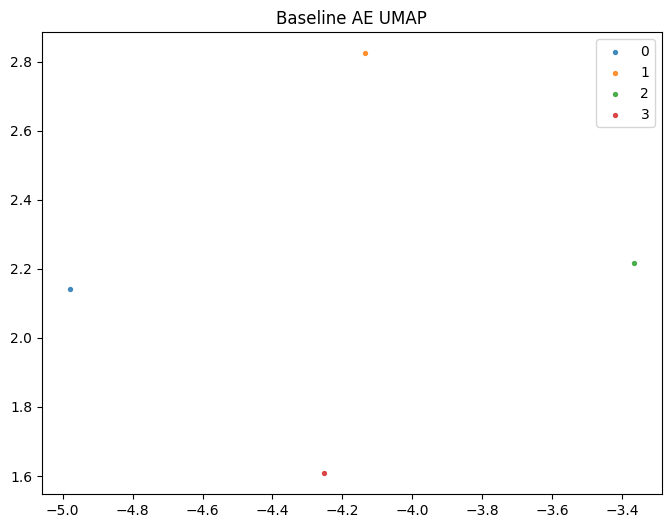

In [ ]:
z_te_base = get_latents(ae_baseline, X_te)
print_umap(z_te_base, y_te, title="Baseline AE UMAP")


In [ ]:
# classifier on latent

# grab latent representations
z_tr = get_latents(ae_baseline, X_tr)
z_te = get_latents(ae_baseline, X_te)

# Train a logistical regression model on latent rep
clf = LogisticRegression(max_iter=1000)
clf.fit(z_tr, y_tr)


y_pred = clf.predict_proba(z_te)
auc = roc_auc_score(y_te, y_pred, multi_class='ovr')

print("Baseline latent classifier AUC/acc:", auc)

Baseline latent classifier AUC/acc: 0.6666666666666667


**Mouse dataset POC: Step 6 - Run baseline experiment for hard-masked AE**

In [ ]:
keep_frac = 0.25
mask_hard = build_dummy_mask(input_dim, hidden_dims[0], keep_fraction=keep_frac)
ae_hard = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=[128], mask=mask_hard)
ae_hard = train_ae(ae_hard, train_loader, epochs=60, lr=1e-3, lambda_reg=0.0)


Epoch 1/60 train_loss=1.006918
Epoch 10/60 train_loss=0.965052
Epoch 20/60 train_loss=0.688060
Epoch 30/60 train_loss=0.441712
Epoch 40/60 train_loss=0.241868
Epoch 50/60 train_loss=0.111154
Epoch 60/60 train_loss=0.045748


Hard-mask recon MSE: 0.9770106077194214


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


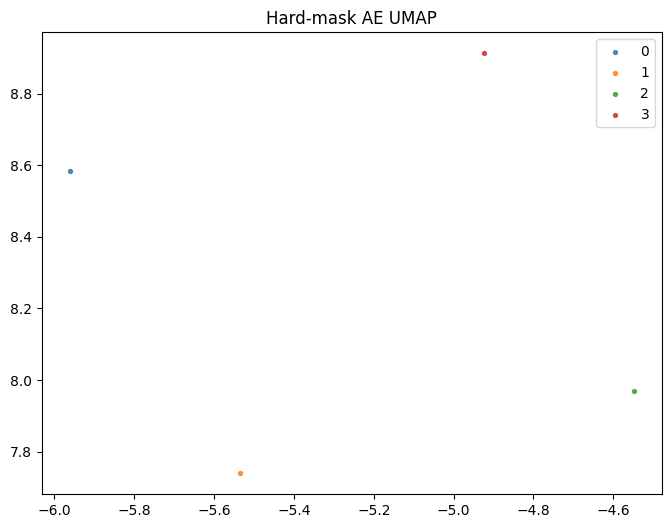

In [ ]:
print("Hard-mask recon MSE:", recon_mse(ae_hard, X_te))
print_umap(get_latents(ae_hard, X_te), y_te, title="Hard-mask AE UMAP")

In [ ]:
# classifier on latent

# grab latent representations
z_tr = get_latents(ae_hard, X_tr)
z_te = get_latents(ae_hard, X_te)

# Train a logistical regression model on latent rep
clf = LogisticRegression(max_iter=1000)
clf.fit(z_tr, y_tr)


y_pred = clf.predict_proba(z_te)
auc = roc_auc_score(y_te, y_pred, multi_class='ovr')

print("Baseline latent classifier AUC/acc:", auc)

Baseline latent classifier AUC/acc: 0.33333333333333337


**Mouse dataset POC: Step 7 - Run baseline experiment for soft-masked AE**

W.shape: torch.Size([128, 25896]) mask.shape: torch.Size([128, 25896]) reg: 9.64959599514259e-06
Epoch 1/60 train_loss=1.006936
W.shape: torch.Size([128, 25896]) mask.shape: torch.Size([128, 25896]) reg: 9.648431841924321e-06
W.shape: torch.Size([128, 25896]) mask.shape: torch.Size([128, 25896]) reg: 9.647267688706052e-06
W.shape: torch.Size([128, 25896]) mask.shape: torch.Size([128, 25896]) reg: 9.646103535487782e-06
W.shape: torch.Size([128, 25896]) mask.shape: torch.Size([128, 25896]) reg: 9.644940291764215e-06
W.shape: torch.Size([128, 25896]) mask.shape: torch.Size([128, 25896]) reg: 9.643776138545945e-06
W.shape: torch.Size([128, 25896]) mask.shape: torch.Size([128, 25896]) reg: 9.642612894822378e-06
W.shape: torch.Size([128, 25896]) mask.shape: torch.Size([128, 25896]) reg: 9.64144965109881e-06
W.shape: torch.Size([128, 25896]) mask.shape: torch.Size([128, 25896]) reg: 9.640286407375243e-06
W.shape: torch.Size([128, 25896]) mask.shape: torch.Size([128, 25896]) reg: 9.63912316365

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


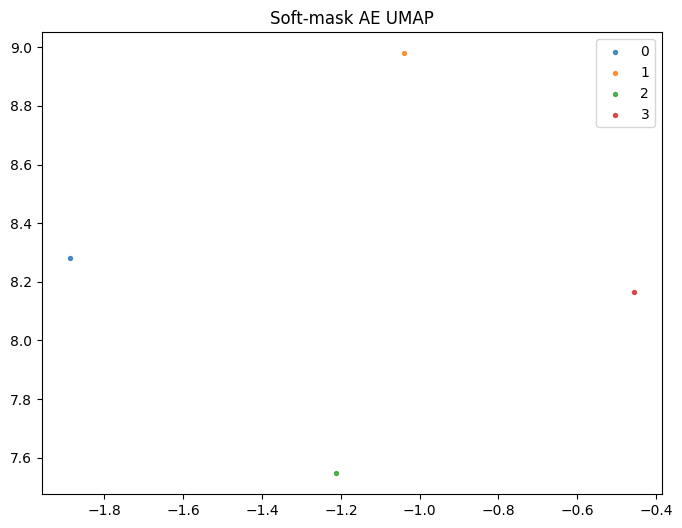

In [ ]:

mask_soft = mask_hard  # same mask but used as regularization pattern
ae_soft = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=[128], mask=mask_soft)
ae_soft = train_ae(ae_soft, train_loader, epochs=60, lr=1e-3, lambda_reg=1e-3)  # tune lambda_reg
print("Soft-mask recon MSE:", recon_mse(ae_soft, X_te))
print_umap(get_latents(ae_soft, X_te), y_te, title="Soft-mask AE UMAP")

In [ ]:
# classifier on latent

# grab latent representations
z_tr = get_latents(ae_soft, X_tr)
z_te = get_latents(ae_soft, X_te)

# Train a logistical regression model on latent rep
clf = LogisticRegression(max_iter=1000)
clf.fit(z_tr, y_tr)


y_pred = clf.predict_proba(z_te)
auc = roc_auc_score(y_te, y_pred, multi_class='ovr')

print("Baseline latent classifier AUC/acc:", auc)

Baseline latent classifier AUC/acc: 0.5


**Intermediate Check-in with POC**

Mask is being correctly applied? Hard mask has better MSE because fewer parameters, so less overfitting

**Mouse dataset POC: Additional validation - stability of AEs**

Dataset is small (16 samples), so see if autoencoder stable and consistent across different random seeds and different train/test splits?

In [ ]:
def cv_reconstruction_mse(model_class, X, n_splits=5, seeds=[0,1,2,3,4], **model_kwargs):
  kf = KFold(n_splits=n_splits, shuffle=True)

  all_mse = []

  for seed in seeds:
      torch.manual_seed(seed)
      fold_mse = []

      for train_idx, test_idx in kf.split(X):
        X_tr = torch.tensor(X[train_idx]).float()
        X_te = torch.tensor(X[test_idx]).float()
        model = model_class(**model_kwargs)

        batch_size = 32
        dummy_labels = torch.zeros(X_tr.shape[0], dtype=torch.long)
        train_ds = torch.utils.data.TensorDataset(X_tr, dummy_labels)
        train_loader = torch.utils.data.DataLoader(train_ds, batch_size=batch_size, shuffle=True)
        model = train_ae(model, train_loader, epochs=60, lr=1e-3)


        with torch.no_grad():
          # Move X_te to the correct device before passing to the model and calculating MSE
          X_te_on_device = X_te.to(device)
          recon, _ = model(X_te_on_device)
          mse = torch.mean((recon - X_te_on_device)**2).item()
          fold_mse.append(mse)

      all_mse.append(np.mean(fold_mse))

  return np.mean(all_mse), np.std(all_mse)

In [ ]:
# For vanilla autoencoder
mean_vanilla_mse, std_vanilla_mse = cv_reconstruction_mse(
    Autoencoder,
    X_mouse,
    input_dim=input_dim,
    latent_dim=latent_dim,
    hidden_dims=[128],
    mask=None,
    soft_mask=False
)

Epoch 1/60 train_loss=6.740374
Epoch 10/60 train_loss=5.342008
Epoch 20/60 train_loss=1.563640
Epoch 30/60 train_loss=0.335318
Epoch 40/60 train_loss=0.131235
Epoch 50/60 train_loss=0.057228
Epoch 60/60 train_loss=0.030364
Epoch 1/60 train_loss=6.718313
Epoch 10/60 train_loss=5.547036
Epoch 20/60 train_loss=2.066145
Epoch 30/60 train_loss=0.451736
Epoch 40/60 train_loss=0.154734
Epoch 50/60 train_loss=0.058253
Epoch 60/60 train_loss=0.030432
Epoch 1/60 train_loss=6.725473
Epoch 10/60 train_loss=5.108666
Epoch 20/60 train_loss=1.129127
Epoch 30/60 train_loss=0.273174
Epoch 40/60 train_loss=0.102599
Epoch 50/60 train_loss=0.045192
Epoch 60/60 train_loss=0.029527
Epoch 1/60 train_loss=6.682176
Epoch 10/60 train_loss=5.332688
Epoch 20/60 train_loss=1.455559
Epoch 30/60 train_loss=0.312102
Epoch 40/60 train_loss=0.120049
Epoch 50/60 train_loss=0.048627
Epoch 60/60 train_loss=0.030862
Epoch 1/60 train_loss=6.713082
Epoch 10/60 train_loss=5.695564
Epoch 20/60 train_loss=1.771512
Epoch 30/60 t

In [ ]:
print(f"Mean + std mse for vanilla mse: {mean_vanilla_mse, std_vanilla_mse}")

Mean + std mse for vanilla mse: (np.float64(0.17469987846910953), np.float64(0.2851686380024004))


In [ ]:
# For hard-masked autoencoder
mask_hard = build_dummy_mask(input_dim, 128, keep_fraction=keep_frac)
mean_hard_mse, std_hard_mse = cv_reconstruction_mse(
    Autoencoder,
    X_mouse,
    input_dim=input_dim,
    latent_dim=latent_dim,
    hidden_dims=[128],
    mask=mask_hard,
    soft_mask=False
)

Epoch 1/60 train_loss=6.700891
Epoch 10/60 train_loss=4.232806
Epoch 20/60 train_loss=0.790257
Epoch 30/60 train_loss=0.226821
Epoch 40/60 train_loss=0.079840
Epoch 50/60 train_loss=0.039247
Epoch 60/60 train_loss=0.025416
Epoch 1/60 train_loss=6.669135
Epoch 10/60 train_loss=4.539950
Epoch 20/60 train_loss=0.973795
Epoch 30/60 train_loss=0.256294
Epoch 40/60 train_loss=0.090924
Epoch 50/60 train_loss=0.043191
Epoch 60/60 train_loss=0.027182
Epoch 1/60 train_loss=6.712739
Epoch 10/60 train_loss=4.319487
Epoch 20/60 train_loss=0.836021
Epoch 30/60 train_loss=0.225818
Epoch 40/60 train_loss=0.083723
Epoch 50/60 train_loss=0.039489
Epoch 60/60 train_loss=0.025345
Epoch 1/60 train_loss=6.671628
Epoch 10/60 train_loss=4.129978
Epoch 20/60 train_loss=0.753841
Epoch 30/60 train_loss=0.215386
Epoch 40/60 train_loss=0.073245
Epoch 50/60 train_loss=0.036106
Epoch 60/60 train_loss=0.023651
Epoch 1/60 train_loss=6.666497
Epoch 10/60 train_loss=4.726066
Epoch 20/60 train_loss=1.030429
Epoch 30/60 t

In [ ]:
print(f"Mean + std mse for vanilla mse: {mean_hard_mse, std_hard_mse}")

Mean + std mse for vanilla mse: (np.float64(0.02766317933797836), np.float64(0.0001317184069662187))


In [ ]:
# For soft-masked autoencoder
mask_soft = mask_hard
mean_soft_mse, std_soft_mse = cv_reconstruction_mse(
    Autoencoder,
    X_mouse,
    input_dim=input_dim,
    latent_dim=latent_dim,
    hidden_dims=[128],
    mask=mask_hard,
    soft_mask=True
)

Epoch 1/60 train_loss=6.710460
Epoch 10/60 train_loss=4.232964
Epoch 20/60 train_loss=0.784738
Epoch 30/60 train_loss=0.226164
Epoch 40/60 train_loss=0.079056
Epoch 50/60 train_loss=0.037885
Epoch 60/60 train_loss=0.024228
Epoch 1/60 train_loss=6.663944
Epoch 10/60 train_loss=4.543087
Epoch 20/60 train_loss=0.968845
Epoch 30/60 train_loss=0.254002
Epoch 40/60 train_loss=0.090360
Epoch 50/60 train_loss=0.042856
Epoch 60/60 train_loss=0.026862
Epoch 1/60 train_loss=6.672128
Epoch 10/60 train_loss=4.291458
Epoch 20/60 train_loss=0.828934
Epoch 30/60 train_loss=0.227873
Epoch 40/60 train_loss=0.084345
Epoch 50/60 train_loss=0.040726
Epoch 60/60 train_loss=0.026708
Epoch 1/60 train_loss=6.670488
Epoch 10/60 train_loss=4.265720
Epoch 20/60 train_loss=0.781952
Epoch 30/60 train_loss=0.232529
Epoch 40/60 train_loss=0.079880
Epoch 50/60 train_loss=0.038051
Epoch 60/60 train_loss=0.024065
Epoch 1/60 train_loss=6.704648
Epoch 10/60 train_loss=4.746011
Epoch 20/60 train_loss=1.030555
Epoch 30/60 t

In [ ]:
print(f"Mean + std mse for vanilla mse: {mean_soft_mse, std_soft_mse}")

Mean + std mse for vanilla mse: (np.float64(0.027618530243635177), np.float64(0.000588587975599566))


In [ ]:
# model with your mask
model = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=[128], mask=mask_hard)
print("mask_tensor.shape:", model.mask_tensor.shape)   # should be (hidden_dims[0], input_dim)

# inspect the MaskedLinear instance inside model.encoder
first_layer = None
for module in model.encoder:
    if isinstance(module, MaskedLinear):
        first_layer = module
        break
assert first_layer is not None
print("first_layer.mask.shape:", first_layer.mask.shape)  # should match (out_features, in_features)
print("first_layer.linear.weight.shape:", first_layer.linear.weight.shape)

# check the effective masked weight
with torch.no_grad():
    w_eff = first_layer.linear.weight * first_layer.mask
print("masked weight shape:", w_eff.shape)

# forward pass sanity
model.eval()
x_dummy = torch.from_numpy(X_tr[:2]).float()  # two samples
x_hat, z = model(x_dummy)
print("x_hat.shape:", x_hat.shape)   # should be (2, input_dim)
print("z.shape:", z.shape)           # (2, latent_dim)


mask_tensor.shape: torch.Size([128, 25896])
first_layer.mask.shape: torch.Size([128, 25896])
first_layer.linear.weight.shape: torch.Size([128, 25896])
masked weight shape: torch.Size([128, 25896])
x_hat.shape: torch.Size([2, 25896])
z.shape: torch.Size([2, 16])


Standard deviation for vanilla AE is very large (0.73), model is unstable (overfits and fails). Possibly accounted to small dataset.

Masked AEs have significantly lower reconstruction error and are stable across seeds and folds, but hard and soft masks perform almost identically. Fewer parameters, AEs cannot overfit noise, so lower variance. No meaningful difference between soft and hard masks.

**Mouse dataset POC Latent Discrimination Power**

Testing that latent space separates AD, T2D well (latent space preserves disease-relevant signal). If AUX ~ 0.5, there is no disease signal.

In [ ]:
# Redefining loocv_latent_auc within this cell to incorporate fixes
def loocv_latent_auc(model_class, X, y, **model_kwargs):
    loo = LeaveOneOut()

    preds_full = []
    trues = []

    for i, (train_idx, test_idx) in enumerate(loo.split(X)):
        # Data splitting for the current fold
        X_tr_fold = X[train_idx]
        X_te_fold = X[test_idx]
        y_tr_fold = y[train_idx]
        y_te_fold = y[test_idx]

        # Apply StandardScaler within the loop to avoid data leakage
        scaler = StandardScaler(with_mean=True, with_std=True)
        X_tr_scaled = scaler.fit_transform(X_tr_fold)
        X_te_scaled = scaler.transform(X_te_fold)

        # Convert to tensors for DataLoader. Labels should be long type.
        train_ds = TensorDataset(torch.from_numpy(X_tr_scaled).float(), torch.from_numpy(y_tr_fold).long())
        train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)

        # Initialize and train the Autoencoder model for the current fold
        model = model_class(**model_kwargs)
        model = train_ae(model, train_loader, epochs=60, lr=1e-3)

        # Get latent representations
        model.eval()
        with torch.no_grad():
            z_tr = model.encode(torch.from_numpy(X_tr_scaled).float().to(device)).cpu().numpy()
            z_te = model.encode(torch.from_numpy(X_te_scaled).float().to(device)).cpu().numpy()

        # Train logistic regression classifier on the latent space
        clf = LogisticRegression(max_iter=1000, multi_class='ovr')
        clf.fit(z_tr, y_tr_fold.astype(int))

        # Predict probabilities for the held-out test sample
        prob_dist = clf.predict_proba(z_te) # prob_dist will be of shape (1, num_classes)
        preds_full.append(prob_dist[0])
        trues.append(y_te_fold[0])

    # Convert lists to numpy arrays for roc_auc_score
    trues_array = np.array(trues)
    preds_full_array = np.stack(preds_full)

    # Check if there are enough classes in the true labels for AUC calculation
    if len(np.unique(trues_array)) < 2:
        print(f"Warning: Only one class ({np.unique(trues_array)[0]}) present in true labels for AUC calculation. Returning 0.5.")
        return 0.5

    auc = roc_auc_score(trues_array, preds_full_array, multi_class='ovr')
    return auc

def permutation_test_auc(model_class, X, y, n_perm=200, **model_kwargs):
    null_aucs = []

    for _ in range(n_perm):
        y_perm = np.random.permutation(y)
        auc = loocv_latent_auc(
            model_class,
            X,
            y_perm,
            **model_kwargs
        )
        null_aucs.append(auc)

    return null_aucs

In [ ]:
keep_frac = 0.25
mask_hard = build_dummy_mask(input_dim, hidden_dims[0], keep_fraction=keep_frac)
observed_auc = loocv_latent_auc(Autoencoder, X_mouse, y_mouse,
    input_dim=input_dim,
    latent_dim=latent_dim,
    hidden_dims=[128],
    mask=mask_hard,
    soft_mask=True)
null = permutation_test_auc(Autoencoder, X_mouse, y_mouse,
    input_dim=input_dim,
    latent_dim=latent_dim,
    hidden_dims=[128],
    mask=mask_hard,
    soft_mask=True)

p = np.mean(np.array(null) >= observed_auc)
print("Observed AUC:", observed_auc)
print("Permutation p-value:", p)

Epoch 1/60 train_loss=1.006942
Epoch 10/60 train_loss=0.955015
Epoch 20/60 train_loss=0.709413
Epoch 30/60 train_loss=0.523734
Epoch 40/60 train_loss=0.325677
Epoch 50/60 train_loss=0.195553
Epoch 60/60 train_loss=0.112236


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005605
Epoch 10/60 train_loss=0.967439
Epoch 20/60 train_loss=0.728107
Epoch 30/60 train_loss=0.521754
Epoch 40/60 train_loss=0.328655
Epoch 50/60 train_loss=0.188866
Epoch 60/60 train_loss=0.101142


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007485
Epoch 10/60 train_loss=0.949636
Epoch 20/60 train_loss=0.696236
Epoch 30/60 train_loss=0.478905
Epoch 40/60 train_loss=0.297143
Epoch 50/60 train_loss=0.177638
Epoch 60/60 train_loss=0.094809


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007581
Epoch 10/60 train_loss=0.965918
Epoch 20/60 train_loss=0.700169
Epoch 30/60 train_loss=0.482279
Epoch 40/60 train_loss=0.323250
Epoch 50/60 train_loss=0.190056
Epoch 60/60 train_loss=0.100825


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006978
Epoch 10/60 train_loss=0.976311
Epoch 20/60 train_loss=0.738167
Epoch 30/60 train_loss=0.517712
Epoch 40/60 train_loss=0.329665
Epoch 50/60 train_loss=0.196435
Epoch 60/60 train_loss=0.104577


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006466
Epoch 10/60 train_loss=0.961740
Epoch 20/60 train_loss=0.718860
Epoch 30/60 train_loss=0.471469
Epoch 40/60 train_loss=0.281419
Epoch 50/60 train_loss=0.147212
Epoch 60/60 train_loss=0.060263


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007494
Epoch 10/60 train_loss=0.978079
Epoch 20/60 train_loss=0.718514
Epoch 30/60 train_loss=0.486303
Epoch 40/60 train_loss=0.302863
Epoch 50/60 train_loss=0.171606
Epoch 60/60 train_loss=0.089639


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006208
Epoch 10/60 train_loss=0.974984
Epoch 20/60 train_loss=0.725907
Epoch 30/60 train_loss=0.465368
Epoch 40/60 train_loss=0.284102
Epoch 50/60 train_loss=0.149688
Epoch 60/60 train_loss=0.068707


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007209
Epoch 10/60 train_loss=0.964953
Epoch 20/60 train_loss=0.696918
Epoch 30/60 train_loss=0.466382
Epoch 40/60 train_loss=0.291620
Epoch 50/60 train_loss=0.163208
Epoch 60/60 train_loss=0.086356


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006649
Epoch 10/60 train_loss=0.962329
Epoch 20/60 train_loss=0.711475
Epoch 30/60 train_loss=0.503840
Epoch 40/60 train_loss=0.315119
Epoch 50/60 train_loss=0.171238
Epoch 60/60 train_loss=0.086636


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006535
Epoch 10/60 train_loss=0.958883
Epoch 20/60 train_loss=0.684595
Epoch 30/60 train_loss=0.453672
Epoch 40/60 train_loss=0.276591
Epoch 50/60 train_loss=0.159675
Epoch 60/60 train_loss=0.083992


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006190
Epoch 10/60 train_loss=0.975663
Epoch 20/60 train_loss=0.736449
Epoch 30/60 train_loss=0.508843
Epoch 40/60 train_loss=0.315562
Epoch 50/60 train_loss=0.188061
Epoch 60/60 train_loss=0.102602


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007503
Epoch 10/60 train_loss=0.963755
Epoch 20/60 train_loss=0.701053
Epoch 30/60 train_loss=0.465606
Epoch 40/60 train_loss=0.282026
Epoch 50/60 train_loss=0.155437
Epoch 60/60 train_loss=0.079640


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007621
Epoch 10/60 train_loss=0.967847
Epoch 20/60 train_loss=0.713589
Epoch 30/60 train_loss=0.493355
Epoch 40/60 train_loss=0.318663
Epoch 50/60 train_loss=0.185244
Epoch 60/60 train_loss=0.096476


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006346
Epoch 10/60 train_loss=0.971324
Epoch 20/60 train_loss=0.739630
Epoch 30/60 train_loss=0.512622
Epoch 40/60 train_loss=0.314803
Epoch 50/60 train_loss=0.184701
Epoch 60/60 train_loss=0.099139


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007100
Epoch 10/60 train_loss=0.976681
Epoch 20/60 train_loss=0.729078
Epoch 30/60 train_loss=0.496791
Epoch 40/60 train_loss=0.320330
Epoch 50/60 train_loss=0.193266
Epoch 60/60 train_loss=0.108845


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007118
Epoch 10/60 train_loss=0.965011
Epoch 20/60 train_loss=0.710918
Epoch 30/60 train_loss=0.478872
Epoch 40/60 train_loss=0.292842
Epoch 50/60 train_loss=0.168712
Epoch 60/60 train_loss=0.089815


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006797
Epoch 10/60 train_loss=0.972221
Epoch 20/60 train_loss=0.710353
Epoch 30/60 train_loss=0.467862
Epoch 40/60 train_loss=0.293439
Epoch 50/60 train_loss=0.168773
Epoch 60/60 train_loss=0.086659


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007416
Epoch 10/60 train_loss=0.953858
Epoch 20/60 train_loss=0.695464
Epoch 30/60 train_loss=0.478878
Epoch 40/60 train_loss=0.305820
Epoch 50/60 train_loss=0.184202
Epoch 60/60 train_loss=0.106202


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006453
Epoch 10/60 train_loss=0.954165
Epoch 20/60 train_loss=0.691528
Epoch 30/60 train_loss=0.475699
Epoch 40/60 train_loss=0.288591
Epoch 50/60 train_loss=0.155763
Epoch 60/60 train_loss=0.073276


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007411
Epoch 10/60 train_loss=0.966703
Epoch 20/60 train_loss=0.722529
Epoch 30/60 train_loss=0.507957
Epoch 40/60 train_loss=0.325974
Epoch 50/60 train_loss=0.191220
Epoch 60/60 train_loss=0.109902


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006410
Epoch 10/60 train_loss=0.958466
Epoch 20/60 train_loss=0.709450
Epoch 30/60 train_loss=0.451485
Epoch 40/60 train_loss=0.260056
Epoch 50/60 train_loss=0.144419
Epoch 60/60 train_loss=0.069176


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006370
Epoch 10/60 train_loss=0.974867
Epoch 20/60 train_loss=0.724780
Epoch 30/60 train_loss=0.509498
Epoch 40/60 train_loss=0.328413
Epoch 50/60 train_loss=0.205372
Epoch 60/60 train_loss=0.121074


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006419
Epoch 10/60 train_loss=0.974651
Epoch 20/60 train_loss=0.724447
Epoch 30/60 train_loss=0.481846
Epoch 40/60 train_loss=0.299435
Epoch 50/60 train_loss=0.172466
Epoch 60/60 train_loss=0.095251


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007041
Epoch 10/60 train_loss=0.985490
Epoch 20/60 train_loss=0.755202
Epoch 30/60 train_loss=0.545303
Epoch 40/60 train_loss=0.361502
Epoch 50/60 train_loss=0.210894
Epoch 60/60 train_loss=0.110822


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006903
Epoch 10/60 train_loss=0.988419
Epoch 20/60 train_loss=0.762909
Epoch 30/60 train_loss=0.532202
Epoch 40/60 train_loss=0.341250
Epoch 50/60 train_loss=0.202549
Epoch 60/60 train_loss=0.105456


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007447
Epoch 10/60 train_loss=0.963989
Epoch 20/60 train_loss=0.716715
Epoch 30/60 train_loss=0.494511
Epoch 40/60 train_loss=0.314315
Epoch 50/60 train_loss=0.191071
Epoch 60/60 train_loss=0.102461


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007216
Epoch 10/60 train_loss=0.972184
Epoch 20/60 train_loss=0.701119
Epoch 30/60 train_loss=0.455657
Epoch 40/60 train_loss=0.284041
Epoch 50/60 train_loss=0.165353
Epoch 60/60 train_loss=0.091429


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006823
Epoch 10/60 train_loss=0.958259
Epoch 20/60 train_loss=0.701532
Epoch 30/60 train_loss=0.468622
Epoch 40/60 train_loss=0.287798
Epoch 50/60 train_loss=0.171393
Epoch 60/60 train_loss=0.096684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007451
Epoch 10/60 train_loss=0.973842
Epoch 20/60 train_loss=0.716496
Epoch 30/60 train_loss=0.460824
Epoch 40/60 train_loss=0.279806
Epoch 50/60 train_loss=0.158801
Epoch 60/60 train_loss=0.077575


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007987
Epoch 10/60 train_loss=0.976871
Epoch 20/60 train_loss=0.716235
Epoch 30/60 train_loss=0.450656
Epoch 40/60 train_loss=0.280095
Epoch 50/60 train_loss=0.163804
Epoch 60/60 train_loss=0.083799


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006346
Epoch 10/60 train_loss=0.971947
Epoch 20/60 train_loss=0.730632
Epoch 30/60 train_loss=0.496733
Epoch 40/60 train_loss=0.312627
Epoch 50/60 train_loss=0.177006
Epoch 60/60 train_loss=0.093716


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007620
Epoch 10/60 train_loss=0.955299
Epoch 20/60 train_loss=0.697885
Epoch 30/60 train_loss=0.472392
Epoch 40/60 train_loss=0.293420
Epoch 50/60 train_loss=0.178703
Epoch 60/60 train_loss=0.099323


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006966
Epoch 10/60 train_loss=0.952257
Epoch 20/60 train_loss=0.700212
Epoch 30/60 train_loss=0.509571
Epoch 40/60 train_loss=0.321549
Epoch 50/60 train_loss=0.182780
Epoch 60/60 train_loss=0.092374


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007436
Epoch 10/60 train_loss=0.972241
Epoch 20/60 train_loss=0.704448
Epoch 30/60 train_loss=0.454541
Epoch 40/60 train_loss=0.280513
Epoch 50/60 train_loss=0.161824
Epoch 60/60 train_loss=0.085089


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007801
Epoch 10/60 train_loss=0.959414
Epoch 20/60 train_loss=0.701576
Epoch 30/60 train_loss=0.493678
Epoch 40/60 train_loss=0.312477
Epoch 50/60 train_loss=0.176453
Epoch 60/60 train_loss=0.092472


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008061
Epoch 10/60 train_loss=0.969828
Epoch 20/60 train_loss=0.707891
Epoch 30/60 train_loss=0.472955
Epoch 40/60 train_loss=0.286084
Epoch 50/60 train_loss=0.165082
Epoch 60/60 train_loss=0.092445


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006427
Epoch 10/60 train_loss=0.971976
Epoch 20/60 train_loss=0.760413
Epoch 30/60 train_loss=0.501543
Epoch 40/60 train_loss=0.288101
Epoch 50/60 train_loss=0.147594
Epoch 60/60 train_loss=0.061423


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006928
Epoch 10/60 train_loss=0.979222
Epoch 20/60 train_loss=0.721299
Epoch 30/60 train_loss=0.466175
Epoch 40/60 train_loss=0.295821
Epoch 50/60 train_loss=0.177846
Epoch 60/60 train_loss=0.100929


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007324
Epoch 10/60 train_loss=0.964815
Epoch 20/60 train_loss=0.717814
Epoch 30/60 train_loss=0.530786
Epoch 40/60 train_loss=0.340958
Epoch 50/60 train_loss=0.199340
Epoch 60/60 train_loss=0.108750


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006082
Epoch 10/60 train_loss=0.964218
Epoch 20/60 train_loss=0.699036
Epoch 30/60 train_loss=0.470530
Epoch 40/60 train_loss=0.310460
Epoch 50/60 train_loss=0.183141
Epoch 60/60 train_loss=0.093088


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007069
Epoch 10/60 train_loss=0.980118
Epoch 20/60 train_loss=0.747523
Epoch 30/60 train_loss=0.534379
Epoch 40/60 train_loss=0.358489
Epoch 50/60 train_loss=0.210335
Epoch 60/60 train_loss=0.115624


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006918
Epoch 10/60 train_loss=0.971381
Epoch 20/60 train_loss=0.711446
Epoch 30/60 train_loss=0.486704
Epoch 40/60 train_loss=0.315133
Epoch 50/60 train_loss=0.190655
Epoch 60/60 train_loss=0.103357


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006038
Epoch 10/60 train_loss=0.962548
Epoch 20/60 train_loss=0.703537
Epoch 30/60 train_loss=0.468193
Epoch 40/60 train_loss=0.290527
Epoch 50/60 train_loss=0.167033
Epoch 60/60 train_loss=0.089310


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007138
Epoch 10/60 train_loss=0.974378
Epoch 20/60 train_loss=0.711380
Epoch 30/60 train_loss=0.438081
Epoch 40/60 train_loss=0.267152
Epoch 50/60 train_loss=0.151509
Epoch 60/60 train_loss=0.070719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006588
Epoch 10/60 train_loss=0.974461
Epoch 20/60 train_loss=0.730724
Epoch 30/60 train_loss=0.501513
Epoch 40/60 train_loss=0.320306
Epoch 50/60 train_loss=0.183483
Epoch 60/60 train_loss=0.094862


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007261
Epoch 10/60 train_loss=0.974347
Epoch 20/60 train_loss=0.715976
Epoch 30/60 train_loss=0.476813
Epoch 40/60 train_loss=0.296897
Epoch 50/60 train_loss=0.173436
Epoch 60/60 train_loss=0.089291


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006029
Epoch 10/60 train_loss=0.955500
Epoch 20/60 train_loss=0.699056
Epoch 30/60 train_loss=0.493498
Epoch 40/60 train_loss=0.307255
Epoch 50/60 train_loss=0.175971
Epoch 60/60 train_loss=0.093460


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007980
Epoch 10/60 train_loss=0.977601
Epoch 20/60 train_loss=0.723278
Epoch 30/60 train_loss=0.462356
Epoch 40/60 train_loss=0.287363
Epoch 50/60 train_loss=0.171195
Epoch 60/60 train_loss=0.092674


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007460
Epoch 10/60 train_loss=0.959095
Epoch 20/60 train_loss=0.691115
Epoch 30/60 train_loss=0.460536
Epoch 40/60 train_loss=0.284981
Epoch 50/60 train_loss=0.175096
Epoch 60/60 train_loss=0.098554


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007454
Epoch 10/60 train_loss=0.960186
Epoch 20/60 train_loss=0.689273
Epoch 30/60 train_loss=0.439996
Epoch 40/60 train_loss=0.270651
Epoch 50/60 train_loss=0.163285
Epoch 60/60 train_loss=0.083294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007275
Epoch 10/60 train_loss=0.955483
Epoch 20/60 train_loss=0.678035
Epoch 30/60 train_loss=0.468875
Epoch 40/60 train_loss=0.302636
Epoch 50/60 train_loss=0.179127
Epoch 60/60 train_loss=0.091835


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007095
Epoch 10/60 train_loss=0.969214
Epoch 20/60 train_loss=0.719419
Epoch 30/60 train_loss=0.506421
Epoch 40/60 train_loss=0.327477
Epoch 50/60 train_loss=0.194254
Epoch 60/60 train_loss=0.105854


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006202
Epoch 10/60 train_loss=0.955870
Epoch 20/60 train_loss=0.704571
Epoch 30/60 train_loss=0.465487
Epoch 40/60 train_loss=0.286107
Epoch 50/60 train_loss=0.153191
Epoch 60/60 train_loss=0.065036


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007112
Epoch 10/60 train_loss=0.959916
Epoch 20/60 train_loss=0.698943
Epoch 30/60 train_loss=0.490038
Epoch 40/60 train_loss=0.327020
Epoch 50/60 train_loss=0.201172
Epoch 60/60 train_loss=0.115285


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007196
Epoch 10/60 train_loss=0.968762
Epoch 20/60 train_loss=0.718051
Epoch 30/60 train_loss=0.500140
Epoch 40/60 train_loss=0.314829
Epoch 50/60 train_loss=0.177964
Epoch 60/60 train_loss=0.094492


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006375
Epoch 10/60 train_loss=0.962236
Epoch 20/60 train_loss=0.710975
Epoch 30/60 train_loss=0.497568
Epoch 40/60 train_loss=0.318731
Epoch 50/60 train_loss=0.182006
Epoch 60/60 train_loss=0.090869


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007456
Epoch 10/60 train_loss=0.959151
Epoch 20/60 train_loss=0.710827
Epoch 30/60 train_loss=0.492958
Epoch 40/60 train_loss=0.310895
Epoch 50/60 train_loss=0.183987
Epoch 60/60 train_loss=0.100364


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006315
Epoch 10/60 train_loss=0.983529
Epoch 20/60 train_loss=0.742580
Epoch 30/60 train_loss=0.485824
Epoch 40/60 train_loss=0.297492
Epoch 50/60 train_loss=0.167043
Epoch 60/60 train_loss=0.082084


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007231
Epoch 10/60 train_loss=0.973454
Epoch 20/60 train_loss=0.712537
Epoch 30/60 train_loss=0.460281
Epoch 40/60 train_loss=0.293310
Epoch 50/60 train_loss=0.176001
Epoch 60/60 train_loss=0.097913


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006683
Epoch 10/60 train_loss=0.964352
Epoch 20/60 train_loss=0.709577
Epoch 30/60 train_loss=0.467391
Epoch 40/60 train_loss=0.284348
Epoch 50/60 train_loss=0.157858
Epoch 60/60 train_loss=0.074889


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006763
Epoch 10/60 train_loss=0.979092
Epoch 20/60 train_loss=0.734533
Epoch 30/60 train_loss=0.469581
Epoch 40/60 train_loss=0.287290
Epoch 50/60 train_loss=0.164879
Epoch 60/60 train_loss=0.083762


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006121
Epoch 10/60 train_loss=0.989679
Epoch 20/60 train_loss=0.764082
Epoch 30/60 train_loss=0.479431
Epoch 40/60 train_loss=0.301688
Epoch 50/60 train_loss=0.170784
Epoch 60/60 train_loss=0.088377


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006265
Epoch 10/60 train_loss=0.973305
Epoch 20/60 train_loss=0.721756
Epoch 30/60 train_loss=0.471737
Epoch 40/60 train_loss=0.295556
Epoch 50/60 train_loss=0.181205
Epoch 60/60 train_loss=0.104958


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006311
Epoch 10/60 train_loss=0.963207
Epoch 20/60 train_loss=0.709444
Epoch 30/60 train_loss=0.513758
Epoch 40/60 train_loss=0.337070
Epoch 50/60 train_loss=0.204177
Epoch 60/60 train_loss=0.122078


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005992
Epoch 10/60 train_loss=0.969377
Epoch 20/60 train_loss=0.725869
Epoch 30/60 train_loss=0.521437
Epoch 40/60 train_loss=0.320548
Epoch 50/60 train_loss=0.195576
Epoch 60/60 train_loss=0.120731


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006543
Epoch 10/60 train_loss=0.951859
Epoch 20/60 train_loss=0.682349
Epoch 30/60 train_loss=0.463617
Epoch 40/60 train_loss=0.289001
Epoch 50/60 train_loss=0.174229
Epoch 60/60 train_loss=0.093965


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007045
Epoch 10/60 train_loss=0.969556
Epoch 20/60 train_loss=0.714066
Epoch 30/60 train_loss=0.486282
Epoch 40/60 train_loss=0.310975
Epoch 50/60 train_loss=0.182553
Epoch 60/60 train_loss=0.098160


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006540
Epoch 10/60 train_loss=0.959094
Epoch 20/60 train_loss=0.714237
Epoch 30/60 train_loss=0.511610
Epoch 40/60 train_loss=0.318914
Epoch 50/60 train_loss=0.183129
Epoch 60/60 train_loss=0.095658


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.004877
Epoch 10/60 train_loss=0.966796
Epoch 20/60 train_loss=0.733864
Epoch 30/60 train_loss=0.459636
Epoch 40/60 train_loss=0.272960
Epoch 50/60 train_loss=0.146472
Epoch 60/60 train_loss=0.060824


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006600
Epoch 10/60 train_loss=0.970131
Epoch 20/60 train_loss=0.707347
Epoch 30/60 train_loss=0.442491
Epoch 40/60 train_loss=0.267136
Epoch 50/60 train_loss=0.155549
Epoch 60/60 train_loss=0.081263


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007081
Epoch 10/60 train_loss=0.983114
Epoch 20/60 train_loss=0.742970
Epoch 30/60 train_loss=0.492046
Epoch 40/60 train_loss=0.290398
Epoch 50/60 train_loss=0.160860
Epoch 60/60 train_loss=0.086303


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007640
Epoch 10/60 train_loss=0.976007
Epoch 20/60 train_loss=0.737511
Epoch 30/60 train_loss=0.520859
Epoch 40/60 train_loss=0.324024
Epoch 50/60 train_loss=0.189494
Epoch 60/60 train_loss=0.104891


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006718
Epoch 10/60 train_loss=0.968931
Epoch 20/60 train_loss=0.718613
Epoch 30/60 train_loss=0.479664
Epoch 40/60 train_loss=0.286867
Epoch 50/60 train_loss=0.166036
Epoch 60/60 train_loss=0.090180


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008408
Epoch 10/60 train_loss=0.967143
Epoch 20/60 train_loss=0.695473
Epoch 30/60 train_loss=0.461171
Epoch 40/60 train_loss=0.287792
Epoch 50/60 train_loss=0.165628
Epoch 60/60 train_loss=0.084432


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007140
Epoch 10/60 train_loss=0.960901
Epoch 20/60 train_loss=0.697676
Epoch 30/60 train_loss=0.459977
Epoch 40/60 train_loss=0.281013
Epoch 50/60 train_loss=0.164366
Epoch 60/60 train_loss=0.086190


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007159
Epoch 10/60 train_loss=0.970567
Epoch 20/60 train_loss=0.718884
Epoch 30/60 train_loss=0.494060
Epoch 40/60 train_loss=0.317516
Epoch 50/60 train_loss=0.195440
Epoch 60/60 train_loss=0.111095


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005659
Epoch 10/60 train_loss=0.960049
Epoch 20/60 train_loss=0.710883
Epoch 30/60 train_loss=0.515528
Epoch 40/60 train_loss=0.341719
Epoch 50/60 train_loss=0.198410
Epoch 60/60 train_loss=0.105407


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006952
Epoch 10/60 train_loss=0.969228
Epoch 20/60 train_loss=0.719495
Epoch 30/60 train_loss=0.498692
Epoch 40/60 train_loss=0.313764
Epoch 50/60 train_loss=0.176991
Epoch 60/60 train_loss=0.087611


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007903
Epoch 10/60 train_loss=0.960100
Epoch 20/60 train_loss=0.708750
Epoch 30/60 train_loss=0.481811
Epoch 40/60 train_loss=0.303395
Epoch 50/60 train_loss=0.176924
Epoch 60/60 train_loss=0.093861


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007840
Epoch 10/60 train_loss=0.974536
Epoch 20/60 train_loss=0.712216
Epoch 30/60 train_loss=0.460762
Epoch 40/60 train_loss=0.281060
Epoch 50/60 train_loss=0.171758
Epoch 60/60 train_loss=0.099864


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006926
Epoch 10/60 train_loss=0.973526
Epoch 20/60 train_loss=0.724238
Epoch 30/60 train_loss=0.508762
Epoch 40/60 train_loss=0.332960
Epoch 50/60 train_loss=0.203952
Epoch 60/60 train_loss=0.115344


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007292
Epoch 10/60 train_loss=0.963029
Epoch 20/60 train_loss=0.700009
Epoch 30/60 train_loss=0.467219
Epoch 40/60 train_loss=0.281311
Epoch 50/60 train_loss=0.167069
Epoch 60/60 train_loss=0.090005


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007201
Epoch 10/60 train_loss=0.965964
Epoch 20/60 train_loss=0.695752
Epoch 30/60 train_loss=0.490228
Epoch 40/60 train_loss=0.325187
Epoch 50/60 train_loss=0.197951
Epoch 60/60 train_loss=0.109363


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007950
Epoch 10/60 train_loss=0.968367
Epoch 20/60 train_loss=0.708662
Epoch 30/60 train_loss=0.494775
Epoch 40/60 train_loss=0.307854
Epoch 50/60 train_loss=0.181632
Epoch 60/60 train_loss=0.105172


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008564
Epoch 10/60 train_loss=0.987892
Epoch 20/60 train_loss=0.747832
Epoch 30/60 train_loss=0.444621
Epoch 40/60 train_loss=0.257466
Epoch 50/60 train_loss=0.135770
Epoch 60/60 train_loss=0.058380


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007642
Epoch 10/60 train_loss=0.960385
Epoch 20/60 train_loss=0.702952
Epoch 30/60 train_loss=0.502898
Epoch 40/60 train_loss=0.325711
Epoch 50/60 train_loss=0.187966
Epoch 60/60 train_loss=0.099288


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007133
Epoch 10/60 train_loss=0.965649
Epoch 20/60 train_loss=0.722428
Epoch 30/60 train_loss=0.485341
Epoch 40/60 train_loss=0.297041
Epoch 50/60 train_loss=0.170277
Epoch 60/60 train_loss=0.091024


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006770
Epoch 10/60 train_loss=0.965684
Epoch 20/60 train_loss=0.696368
Epoch 30/60 train_loss=0.471899
Epoch 40/60 train_loss=0.287332
Epoch 50/60 train_loss=0.162146
Epoch 60/60 train_loss=0.084885


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006977
Epoch 10/60 train_loss=0.969331
Epoch 20/60 train_loss=0.715762
Epoch 30/60 train_loss=0.495402
Epoch 40/60 train_loss=0.320667
Epoch 50/60 train_loss=0.193965
Epoch 60/60 train_loss=0.105957


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006398
Epoch 10/60 train_loss=0.967003
Epoch 20/60 train_loss=0.718914
Epoch 30/60 train_loss=0.469159
Epoch 40/60 train_loss=0.294629
Epoch 50/60 train_loss=0.180776
Epoch 60/60 train_loss=0.099878


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006263
Epoch 10/60 train_loss=0.948600
Epoch 20/60 train_loss=0.698992
Epoch 30/60 train_loss=0.487280
Epoch 40/60 train_loss=0.299404
Epoch 50/60 train_loss=0.172907
Epoch 60/60 train_loss=0.092114


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007351
Epoch 10/60 train_loss=0.955187
Epoch 20/60 train_loss=0.708714
Epoch 30/60 train_loss=0.476523
Epoch 40/60 train_loss=0.291004
Epoch 50/60 train_loss=0.159609
Epoch 60/60 train_loss=0.076259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007741
Epoch 10/60 train_loss=0.963105
Epoch 20/60 train_loss=0.702442
Epoch 30/60 train_loss=0.477663
Epoch 40/60 train_loss=0.304826
Epoch 50/60 train_loss=0.182334
Epoch 60/60 train_loss=0.100545


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007094
Epoch 10/60 train_loss=0.978563
Epoch 20/60 train_loss=0.730563
Epoch 30/60 train_loss=0.457207
Epoch 40/60 train_loss=0.279615
Epoch 50/60 train_loss=0.159342
Epoch 60/60 train_loss=0.081864


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005766
Epoch 10/60 train_loss=0.960400
Epoch 20/60 train_loss=0.706457
Epoch 30/60 train_loss=0.489498
Epoch 40/60 train_loss=0.312141
Epoch 50/60 train_loss=0.192439
Epoch 60/60 train_loss=0.114115


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007155
Epoch 10/60 train_loss=0.962296
Epoch 20/60 train_loss=0.712513
Epoch 30/60 train_loss=0.488132
Epoch 40/60 train_loss=0.289320
Epoch 50/60 train_loss=0.168836
Epoch 60/60 train_loss=0.092916


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007965
Epoch 10/60 train_loss=0.973095
Epoch 20/60 train_loss=0.739359
Epoch 30/60 train_loss=0.559805
Epoch 40/60 train_loss=0.361290
Epoch 50/60 train_loss=0.215302
Epoch 60/60 train_loss=0.124694


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006465
Epoch 10/60 train_loss=0.964894
Epoch 20/60 train_loss=0.698728
Epoch 30/60 train_loss=0.460754
Epoch 40/60 train_loss=0.279683
Epoch 50/60 train_loss=0.156032
Epoch 60/60 train_loss=0.081328


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006314
Epoch 10/60 train_loss=0.968191
Epoch 20/60 train_loss=0.719443
Epoch 30/60 train_loss=0.493877
Epoch 40/60 train_loss=0.315963
Epoch 50/60 train_loss=0.189376
Epoch 60/60 train_loss=0.099136


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006763
Epoch 10/60 train_loss=0.970122
Epoch 20/60 train_loss=0.706998
Epoch 30/60 train_loss=0.491722
Epoch 40/60 train_loss=0.310533
Epoch 50/60 train_loss=0.193889
Epoch 60/60 train_loss=0.113965


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006207
Epoch 10/60 train_loss=0.965270
Epoch 20/60 train_loss=0.725631
Epoch 30/60 train_loss=0.455338
Epoch 40/60 train_loss=0.247612
Epoch 50/60 train_loss=0.118552
Epoch 60/60 train_loss=0.044108


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006123
Epoch 10/60 train_loss=0.959595
Epoch 20/60 train_loss=0.686739
Epoch 30/60 train_loss=0.443644
Epoch 40/60 train_loss=0.285581
Epoch 50/60 train_loss=0.170495
Epoch 60/60 train_loss=0.088857


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006932
Epoch 10/60 train_loss=0.957538
Epoch 20/60 train_loss=0.671825
Epoch 30/60 train_loss=0.450296
Epoch 40/60 train_loss=0.283669
Epoch 50/60 train_loss=0.170749
Epoch 60/60 train_loss=0.101322


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007337
Epoch 10/60 train_loss=0.956914
Epoch 20/60 train_loss=0.693081
Epoch 30/60 train_loss=0.468243
Epoch 40/60 train_loss=0.287627
Epoch 50/60 train_loss=0.163188
Epoch 60/60 train_loss=0.082238


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006800
Epoch 10/60 train_loss=0.974725
Epoch 20/60 train_loss=0.729215
Epoch 30/60 train_loss=0.502209
Epoch 40/60 train_loss=0.310305
Epoch 50/60 train_loss=0.184731
Epoch 60/60 train_loss=0.107035


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006905
Epoch 10/60 train_loss=0.972565
Epoch 20/60 train_loss=0.712987
Epoch 30/60 train_loss=0.472444
Epoch 40/60 train_loss=0.292878
Epoch 50/60 train_loss=0.171156
Epoch 60/60 train_loss=0.091296


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007395
Epoch 10/60 train_loss=0.962259
Epoch 20/60 train_loss=0.691561
Epoch 30/60 train_loss=0.465306
Epoch 40/60 train_loss=0.295098
Epoch 50/60 train_loss=0.179705
Epoch 60/60 train_loss=0.100390


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007141
Epoch 10/60 train_loss=0.971760
Epoch 20/60 train_loss=0.709517
Epoch 30/60 train_loss=0.465714
Epoch 40/60 train_loss=0.293703
Epoch 50/60 train_loss=0.171879
Epoch 60/60 train_loss=0.091024


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007588
Epoch 10/60 train_loss=0.960147
Epoch 20/60 train_loss=0.691777
Epoch 30/60 train_loss=0.465608
Epoch 40/60 train_loss=0.308009
Epoch 50/60 train_loss=0.187802
Epoch 60/60 train_loss=0.101549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007225
Epoch 10/60 train_loss=0.972193
Epoch 20/60 train_loss=0.710217
Epoch 30/60 train_loss=0.464918
Epoch 40/60 train_loss=0.285516
Epoch 50/60 train_loss=0.168993
Epoch 60/60 train_loss=0.091025


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005952
Epoch 10/60 train_loss=0.968295
Epoch 20/60 train_loss=0.731287
Epoch 30/60 train_loss=0.512626
Epoch 40/60 train_loss=0.311783
Epoch 50/60 train_loss=0.179523
Epoch 60/60 train_loss=0.098035


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006021
Epoch 10/60 train_loss=0.973432
Epoch 20/60 train_loss=0.724083
Epoch 30/60 train_loss=0.468678
Epoch 40/60 train_loss=0.286999
Epoch 50/60 train_loss=0.168822
Epoch 60/60 train_loss=0.091689


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007044
Epoch 10/60 train_loss=0.971626
Epoch 20/60 train_loss=0.709770
Epoch 30/60 train_loss=0.466370
Epoch 40/60 train_loss=0.285266
Epoch 50/60 train_loss=0.168969
Epoch 60/60 train_loss=0.090258


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006751
Epoch 10/60 train_loss=0.957696
Epoch 20/60 train_loss=0.699112
Epoch 30/60 train_loss=0.488315
Epoch 40/60 train_loss=0.309457
Epoch 50/60 train_loss=0.188201
Epoch 60/60 train_loss=0.106599


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007423
Epoch 10/60 train_loss=0.960319
Epoch 20/60 train_loss=0.709490
Epoch 30/60 train_loss=0.475186
Epoch 40/60 train_loss=0.287129
Epoch 50/60 train_loss=0.172152
Epoch 60/60 train_loss=0.094153


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007839
Epoch 10/60 train_loss=0.964167
Epoch 20/60 train_loss=0.701531
Epoch 30/60 train_loss=0.485578
Epoch 40/60 train_loss=0.311625
Epoch 50/60 train_loss=0.181529
Epoch 60/60 train_loss=0.097038


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007767
Epoch 10/60 train_loss=0.972733
Epoch 20/60 train_loss=0.713527
Epoch 30/60 train_loss=0.435087
Epoch 40/60 train_loss=0.256884
Epoch 50/60 train_loss=0.138385
Epoch 60/60 train_loss=0.061434


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007049
Epoch 10/60 train_loss=0.960822
Epoch 20/60 train_loss=0.704749
Epoch 30/60 train_loss=0.505968
Epoch 40/60 train_loss=0.340646
Epoch 50/60 train_loss=0.204836
Epoch 60/60 train_loss=0.106685


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006086
Epoch 10/60 train_loss=0.976313
Epoch 20/60 train_loss=0.719620
Epoch 30/60 train_loss=0.441059
Epoch 40/60 train_loss=0.275590
Epoch 50/60 train_loss=0.168894
Epoch 60/60 train_loss=0.089117


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007814
Epoch 10/60 train_loss=0.962600
Epoch 20/60 train_loss=0.703447
Epoch 30/60 train_loss=0.467500
Epoch 40/60 train_loss=0.274702
Epoch 50/60 train_loss=0.148288
Epoch 60/60 train_loss=0.068730


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006637
Epoch 10/60 train_loss=0.965734
Epoch 20/60 train_loss=0.715227
Epoch 30/60 train_loss=0.488757
Epoch 40/60 train_loss=0.301167
Epoch 50/60 train_loss=0.175444
Epoch 60/60 train_loss=0.095665


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007010
Epoch 10/60 train_loss=0.956614
Epoch 20/60 train_loss=0.687443
Epoch 30/60 train_loss=0.461750
Epoch 40/60 train_loss=0.283400
Epoch 50/60 train_loss=0.162352
Epoch 60/60 train_loss=0.082445


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007720
Epoch 10/60 train_loss=0.976624
Epoch 20/60 train_loss=0.739895
Epoch 30/60 train_loss=0.495023
Epoch 40/60 train_loss=0.297830
Epoch 50/60 train_loss=0.170036
Epoch 60/60 train_loss=0.092621


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007233
Epoch 10/60 train_loss=0.967021
Epoch 20/60 train_loss=0.711708
Epoch 30/60 train_loss=0.460293
Epoch 40/60 train_loss=0.286694
Epoch 50/60 train_loss=0.169544
Epoch 60/60 train_loss=0.086807


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007108
Epoch 10/60 train_loss=0.970267
Epoch 20/60 train_loss=0.703494
Epoch 30/60 train_loss=0.476380
Epoch 40/60 train_loss=0.319592
Epoch 50/60 train_loss=0.196433
Epoch 60/60 train_loss=0.103442


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005847
Epoch 10/60 train_loss=0.976028
Epoch 20/60 train_loss=0.721390
Epoch 30/60 train_loss=0.496395
Epoch 40/60 train_loss=0.316013
Epoch 50/60 train_loss=0.185346
Epoch 60/60 train_loss=0.099597


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007397
Epoch 10/60 train_loss=0.981962
Epoch 20/60 train_loss=0.735662
Epoch 30/60 train_loss=0.481940
Epoch 40/60 train_loss=0.295298
Epoch 50/60 train_loss=0.170600
Epoch 60/60 train_loss=0.092426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007199
Epoch 10/60 train_loss=0.967748
Epoch 20/60 train_loss=0.709349
Epoch 30/60 train_loss=0.479831
Epoch 40/60 train_loss=0.297438
Epoch 50/60 train_loss=0.183815
Epoch 60/60 train_loss=0.108066


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008334
Epoch 10/60 train_loss=0.966104
Epoch 20/60 train_loss=0.725377
Epoch 30/60 train_loss=0.525585
Epoch 40/60 train_loss=0.338283
Epoch 50/60 train_loss=0.195040
Epoch 60/60 train_loss=0.105724


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006600
Epoch 10/60 train_loss=0.976196
Epoch 20/60 train_loss=0.720554
Epoch 30/60 train_loss=0.467692
Epoch 40/60 train_loss=0.285777
Epoch 50/60 train_loss=0.164634
Epoch 60/60 train_loss=0.084361


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007274
Epoch 10/60 train_loss=0.971945
Epoch 20/60 train_loss=0.716089
Epoch 30/60 train_loss=0.483689
Epoch 40/60 train_loss=0.309253
Epoch 50/60 train_loss=0.177314
Epoch 60/60 train_loss=0.091318


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007348
Epoch 10/60 train_loss=0.953774
Epoch 20/60 train_loss=0.688119
Epoch 30/60 train_loss=0.483315
Epoch 40/60 train_loss=0.317222
Epoch 50/60 train_loss=0.186419
Epoch 60/60 train_loss=0.099749


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007388
Epoch 10/60 train_loss=0.981116
Epoch 20/60 train_loss=0.733665
Epoch 30/60 train_loss=0.458399
Epoch 40/60 train_loss=0.273300
Epoch 50/60 train_loss=0.153330
Epoch 60/60 train_loss=0.075794


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007635
Epoch 10/60 train_loss=0.973514
Epoch 20/60 train_loss=0.722898
Epoch 30/60 train_loss=0.496044
Epoch 40/60 train_loss=0.319328
Epoch 50/60 train_loss=0.190024
Epoch 60/60 train_loss=0.098769


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006708
Epoch 10/60 train_loss=0.971047
Epoch 20/60 train_loss=0.729806
Epoch 30/60 train_loss=0.527053
Epoch 40/60 train_loss=0.348611
Epoch 50/60 train_loss=0.205666
Epoch 60/60 train_loss=0.108633


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007103
Epoch 10/60 train_loss=0.958854
Epoch 20/60 train_loss=0.690966
Epoch 30/60 train_loss=0.483393
Epoch 40/60 train_loss=0.319976
Epoch 50/60 train_loss=0.185086
Epoch 60/60 train_loss=0.088125


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006612
Epoch 10/60 train_loss=0.966718
Epoch 20/60 train_loss=0.715344
Epoch 30/60 train_loss=0.482193
Epoch 40/60 train_loss=0.297707
Epoch 50/60 train_loss=0.167680
Epoch 60/60 train_loss=0.085537


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006149
Epoch 10/60 train_loss=0.971155
Epoch 20/60 train_loss=0.703357
Epoch 30/60 train_loss=0.471882
Epoch 40/60 train_loss=0.301117
Epoch 50/60 train_loss=0.177190
Epoch 60/60 train_loss=0.094243


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007259
Epoch 10/60 train_loss=0.979354
Epoch 20/60 train_loss=0.719878
Epoch 30/60 train_loss=0.486499
Epoch 40/60 train_loss=0.312766
Epoch 50/60 train_loss=0.188523
Epoch 60/60 train_loss=0.103253


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006469
Epoch 10/60 train_loss=0.963902
Epoch 20/60 train_loss=0.708534
Epoch 30/60 train_loss=0.461395
Epoch 40/60 train_loss=0.284532
Epoch 50/60 train_loss=0.171618
Epoch 60/60 train_loss=0.091600


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007810
Epoch 10/60 train_loss=0.967872
Epoch 20/60 train_loss=0.708594
Epoch 30/60 train_loss=0.486643
Epoch 40/60 train_loss=0.307369
Epoch 50/60 train_loss=0.176565
Epoch 60/60 train_loss=0.086129


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006267
Epoch 10/60 train_loss=0.969779
Epoch 20/60 train_loss=0.702109
Epoch 30/60 train_loss=0.454541
Epoch 40/60 train_loss=0.282752
Epoch 50/60 train_loss=0.171882
Epoch 60/60 train_loss=0.094289


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007586
Epoch 10/60 train_loss=0.962489
Epoch 20/60 train_loss=0.686732
Epoch 30/60 train_loss=0.456278
Epoch 40/60 train_loss=0.295483
Epoch 50/60 train_loss=0.179421
Epoch 60/60 train_loss=0.100767


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007368
Epoch 10/60 train_loss=0.972545
Epoch 20/60 train_loss=0.718681
Epoch 30/60 train_loss=0.495969
Epoch 40/60 train_loss=0.314874
Epoch 50/60 train_loss=0.188418
Epoch 60/60 train_loss=0.106013


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006779
Epoch 10/60 train_loss=0.951077
Epoch 20/60 train_loss=0.700880
Epoch 30/60 train_loss=0.494216
Epoch 40/60 train_loss=0.301343
Epoch 50/60 train_loss=0.170602
Epoch 60/60 train_loss=0.084510


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006828
Epoch 10/60 train_loss=0.960252
Epoch 20/60 train_loss=0.704350
Epoch 30/60 train_loss=0.495834
Epoch 40/60 train_loss=0.326178
Epoch 50/60 train_loss=0.196605
Epoch 60/60 train_loss=0.110408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006765
Epoch 10/60 train_loss=0.959257
Epoch 20/60 train_loss=0.709249
Epoch 30/60 train_loss=0.508401
Epoch 40/60 train_loss=0.332043
Epoch 50/60 train_loss=0.198507
Epoch 60/60 train_loss=0.109734


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006163
Epoch 10/60 train_loss=0.980961
Epoch 20/60 train_loss=0.747545
Epoch 30/60 train_loss=0.555100
Epoch 40/60 train_loss=0.372906
Epoch 50/60 train_loss=0.225215
Epoch 60/60 train_loss=0.125525


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006648
Epoch 10/60 train_loss=0.974751
Epoch 20/60 train_loss=0.731462
Epoch 30/60 train_loss=0.473980
Epoch 40/60 train_loss=0.284528
Epoch 50/60 train_loss=0.148064
Epoch 60/60 train_loss=0.063301


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008176
Epoch 10/60 train_loss=0.957630
Epoch 20/60 train_loss=0.697509
Epoch 30/60 train_loss=0.476777
Epoch 40/60 train_loss=0.295741
Epoch 50/60 train_loss=0.177400
Epoch 60/60 train_loss=0.100907


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007581
Epoch 10/60 train_loss=0.951062
Epoch 20/60 train_loss=0.689621
Epoch 30/60 train_loss=0.482346
Epoch 40/60 train_loss=0.298126
Epoch 50/60 train_loss=0.169393
Epoch 60/60 train_loss=0.083870


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007311
Epoch 10/60 train_loss=0.972344
Epoch 20/60 train_loss=0.727358
Epoch 30/60 train_loss=0.486213
Epoch 40/60 train_loss=0.303778
Epoch 50/60 train_loss=0.167964
Epoch 60/60 train_loss=0.080702


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007241
Epoch 10/60 train_loss=0.980784
Epoch 20/60 train_loss=0.743512
Epoch 30/60 train_loss=0.515186
Epoch 40/60 train_loss=0.334165
Epoch 50/60 train_loss=0.198241
Epoch 60/60 train_loss=0.102634


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006315
Epoch 10/60 train_loss=0.974536
Epoch 20/60 train_loss=0.728402
Epoch 30/60 train_loss=0.497758
Epoch 40/60 train_loss=0.308441
Epoch 50/60 train_loss=0.182835
Epoch 60/60 train_loss=0.099211


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007829
Epoch 10/60 train_loss=0.948545
Epoch 20/60 train_loss=0.689665
Epoch 30/60 train_loss=0.488125
Epoch 40/60 train_loss=0.311372
Epoch 50/60 train_loss=0.179655
Epoch 60/60 train_loss=0.095228


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007661
Epoch 10/60 train_loss=0.965107
Epoch 20/60 train_loss=0.705612
Epoch 30/60 train_loss=0.456620
Epoch 40/60 train_loss=0.283982
Epoch 50/60 train_loss=0.160761
Epoch 60/60 train_loss=0.075941


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006626
Epoch 10/60 train_loss=0.965143
Epoch 20/60 train_loss=0.698047
Epoch 30/60 train_loss=0.461294
Epoch 40/60 train_loss=0.287801
Epoch 50/60 train_loss=0.168333
Epoch 60/60 train_loss=0.091235


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006711
Epoch 10/60 train_loss=0.967596
Epoch 20/60 train_loss=0.721590
Epoch 30/60 train_loss=0.521963
Epoch 40/60 train_loss=0.327926
Epoch 50/60 train_loss=0.184556
Epoch 60/60 train_loss=0.097470


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006798
Epoch 10/60 train_loss=0.967923
Epoch 20/60 train_loss=0.701025
Epoch 30/60 train_loss=0.451224
Epoch 40/60 train_loss=0.272517
Epoch 50/60 train_loss=0.154922
Epoch 60/60 train_loss=0.080310


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005997
Epoch 10/60 train_loss=0.981691
Epoch 20/60 train_loss=0.734964
Epoch 30/60 train_loss=0.448552
Epoch 40/60 train_loss=0.271648
Epoch 50/60 train_loss=0.168341
Epoch 60/60 train_loss=0.094688


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007241
Epoch 10/60 train_loss=0.965976
Epoch 20/60 train_loss=0.689344
Epoch 30/60 train_loss=0.443942
Epoch 40/60 train_loss=0.278658
Epoch 50/60 train_loss=0.164671
Epoch 60/60 train_loss=0.084793


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007616
Epoch 10/60 train_loss=0.964387
Epoch 20/60 train_loss=0.726462
Epoch 30/60 train_loss=0.517379
Epoch 40/60 train_loss=0.311092
Epoch 50/60 train_loss=0.169029
Epoch 60/60 train_loss=0.084426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006044
Epoch 10/60 train_loss=0.982852
Epoch 20/60 train_loss=0.727748
Epoch 30/60 train_loss=0.467210
Epoch 40/60 train_loss=0.293512
Epoch 50/60 train_loss=0.173245
Epoch 60/60 train_loss=0.092853


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007652
Epoch 10/60 train_loss=0.958441
Epoch 20/60 train_loss=0.713954
Epoch 30/60 train_loss=0.509422
Epoch 40/60 train_loss=0.309431
Epoch 50/60 train_loss=0.175712
Epoch 60/60 train_loss=0.092607


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006990
Epoch 10/60 train_loss=0.974200
Epoch 20/60 train_loss=0.738768
Epoch 30/60 train_loss=0.480198
Epoch 40/60 train_loss=0.285642
Epoch 50/60 train_loss=0.153501
Epoch 60/60 train_loss=0.066313


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008288
Epoch 10/60 train_loss=0.960882
Epoch 20/60 train_loss=0.680360
Epoch 30/60 train_loss=0.459887
Epoch 40/60 train_loss=0.291320
Epoch 50/60 train_loss=0.167680
Epoch 60/60 train_loss=0.089012


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007119
Epoch 10/60 train_loss=0.967945
Epoch 20/60 train_loss=0.712294
Epoch 30/60 train_loss=0.495883
Epoch 40/60 train_loss=0.313744
Epoch 50/60 train_loss=0.177772
Epoch 60/60 train_loss=0.092729


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007321
Epoch 10/60 train_loss=0.963631
Epoch 20/60 train_loss=0.694863
Epoch 30/60 train_loss=0.469836
Epoch 40/60 train_loss=0.297970
Epoch 50/60 train_loss=0.163170
Epoch 60/60 train_loss=0.076813


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006338
Epoch 10/60 train_loss=0.968456
Epoch 20/60 train_loss=0.718552
Epoch 30/60 train_loss=0.478699
Epoch 40/60 train_loss=0.296201
Epoch 50/60 train_loss=0.166713
Epoch 60/60 train_loss=0.082622


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007243
Epoch 10/60 train_loss=0.977661
Epoch 20/60 train_loss=0.712392
Epoch 30/60 train_loss=0.450868
Epoch 40/60 train_loss=0.282963
Epoch 50/60 train_loss=0.164656
Epoch 60/60 train_loss=0.087869


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006475
Epoch 10/60 train_loss=0.974660
Epoch 20/60 train_loss=0.739437
Epoch 30/60 train_loss=0.530440
Epoch 40/60 train_loss=0.343354
Epoch 50/60 train_loss=0.203887
Epoch 60/60 train_loss=0.114938


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006468
Epoch 10/60 train_loss=0.962863
Epoch 20/60 train_loss=0.688376
Epoch 30/60 train_loss=0.418069
Epoch 40/60 train_loss=0.251510
Epoch 50/60 train_loss=0.146549
Epoch 60/60 train_loss=0.069977


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006765
Epoch 10/60 train_loss=0.977973
Epoch 20/60 train_loss=0.736727
Epoch 30/60 train_loss=0.499786
Epoch 40/60 train_loss=0.313239
Epoch 50/60 train_loss=0.180842
Epoch 60/60 train_loss=0.093139


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006838
Epoch 10/60 train_loss=0.961981
Epoch 20/60 train_loss=0.693505
Epoch 30/60 train_loss=0.493603
Epoch 40/60 train_loss=0.316836
Epoch 50/60 train_loss=0.180271
Epoch 60/60 train_loss=0.089365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007400
Epoch 10/60 train_loss=0.962866
Epoch 20/60 train_loss=0.700210
Epoch 30/60 train_loss=0.477615
Epoch 40/60 train_loss=0.302060
Epoch 50/60 train_loss=0.177312
Epoch 60/60 train_loss=0.097240


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007041
Epoch 10/60 train_loss=0.956426
Epoch 20/60 train_loss=0.689289
Epoch 30/60 train_loss=0.462940
Epoch 40/60 train_loss=0.296226
Epoch 50/60 train_loss=0.184953
Epoch 60/60 train_loss=0.107077


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006442
Epoch 10/60 train_loss=0.978596
Epoch 20/60 train_loss=0.727183
Epoch 30/60 train_loss=0.474302
Epoch 40/60 train_loss=0.288185
Epoch 50/60 train_loss=0.169353
Epoch 60/60 train_loss=0.088891


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008277
Epoch 10/60 train_loss=0.953415
Epoch 20/60 train_loss=0.695285
Epoch 30/60 train_loss=0.477616
Epoch 40/60 train_loss=0.308610
Epoch 50/60 train_loss=0.191317
Epoch 60/60 train_loss=0.100330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007638
Epoch 10/60 train_loss=0.971319
Epoch 20/60 train_loss=0.707020
Epoch 30/60 train_loss=0.459856
Epoch 40/60 train_loss=0.288431
Epoch 50/60 train_loss=0.167329
Epoch 60/60 train_loss=0.081925


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006636
Epoch 10/60 train_loss=0.967245
Epoch 20/60 train_loss=0.729297
Epoch 30/60 train_loss=0.529129
Epoch 40/60 train_loss=0.340742
Epoch 50/60 train_loss=0.195053
Epoch 60/60 train_loss=0.105768


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007460
Epoch 10/60 train_loss=0.967593
Epoch 20/60 train_loss=0.721328
Epoch 30/60 train_loss=0.462075
Epoch 40/60 train_loss=0.269590
Epoch 50/60 train_loss=0.148278
Epoch 60/60 train_loss=0.070407


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006189
Epoch 10/60 train_loss=0.962620
Epoch 20/60 train_loss=0.724367
Epoch 30/60 train_loss=0.529811
Epoch 40/60 train_loss=0.347710
Epoch 50/60 train_loss=0.216922
Epoch 60/60 train_loss=0.131579


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006968
Epoch 10/60 train_loss=0.976626
Epoch 20/60 train_loss=0.716426
Epoch 30/60 train_loss=0.484608
Epoch 40/60 train_loss=0.301698
Epoch 50/60 train_loss=0.173029
Epoch 60/60 train_loss=0.090232


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006012
Epoch 10/60 train_loss=0.968199
Epoch 20/60 train_loss=0.715775
Epoch 30/60 train_loss=0.507714
Epoch 40/60 train_loss=0.339032
Epoch 50/60 train_loss=0.204864
Epoch 60/60 train_loss=0.106327


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006268
Epoch 10/60 train_loss=0.963123
Epoch 20/60 train_loss=0.720643
Epoch 30/60 train_loss=0.511004
Epoch 40/60 train_loss=0.320345
Epoch 50/60 train_loss=0.190837
Epoch 60/60 train_loss=0.099425


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007128
Epoch 10/60 train_loss=0.965273
Epoch 20/60 train_loss=0.710744
Epoch 30/60 train_loss=0.497357
Epoch 40/60 train_loss=0.302643
Epoch 50/60 train_loss=0.162165
Epoch 60/60 train_loss=0.078200


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007172
Epoch 10/60 train_loss=0.961198
Epoch 20/60 train_loss=0.692070
Epoch 30/60 train_loss=0.460678
Epoch 40/60 train_loss=0.289189
Epoch 50/60 train_loss=0.172927
Epoch 60/60 train_loss=0.095826


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006734
Epoch 10/60 train_loss=0.966240
Epoch 20/60 train_loss=0.710875
Epoch 30/60 train_loss=0.466005
Epoch 40/60 train_loss=0.289816
Epoch 50/60 train_loss=0.164920
Epoch 60/60 train_loss=0.076883


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006724
Epoch 10/60 train_loss=0.975782
Epoch 20/60 train_loss=0.729119
Epoch 30/60 train_loss=0.495210
Epoch 40/60 train_loss=0.328978
Epoch 50/60 train_loss=0.205019
Epoch 60/60 train_loss=0.113594


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006731
Epoch 10/60 train_loss=0.972752
Epoch 20/60 train_loss=0.731215
Epoch 30/60 train_loss=0.487458
Epoch 40/60 train_loss=0.300374
Epoch 50/60 train_loss=0.173540
Epoch 60/60 train_loss=0.085372


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007257
Epoch 10/60 train_loss=0.962850
Epoch 20/60 train_loss=0.710180
Epoch 30/60 train_loss=0.482784
Epoch 40/60 train_loss=0.305457
Epoch 50/60 train_loss=0.175437
Epoch 60/60 train_loss=0.088930


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006304
Epoch 10/60 train_loss=0.968641
Epoch 20/60 train_loss=0.695843
Epoch 30/60 train_loss=0.442044
Epoch 40/60 train_loss=0.275954
Epoch 50/60 train_loss=0.167847
Epoch 60/60 train_loss=0.091972


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008262
Epoch 10/60 train_loss=0.959227
Epoch 20/60 train_loss=0.709964
Epoch 30/60 train_loss=0.490263
Epoch 40/60 train_loss=0.300292
Epoch 50/60 train_loss=0.178826
Epoch 60/60 train_loss=0.098426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005770
Epoch 10/60 train_loss=0.961504
Epoch 20/60 train_loss=0.711992
Epoch 30/60 train_loss=0.495022
Epoch 40/60 train_loss=0.304442
Epoch 50/60 train_loss=0.177307
Epoch 60/60 train_loss=0.101498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007068
Epoch 10/60 train_loss=0.976812
Epoch 20/60 train_loss=0.716362
Epoch 30/60 train_loss=0.478783
Epoch 40/60 train_loss=0.311108
Epoch 50/60 train_loss=0.179060
Epoch 60/60 train_loss=0.092903


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006299
Epoch 10/60 train_loss=0.973114
Epoch 20/60 train_loss=0.715720
Epoch 30/60 train_loss=0.516926
Epoch 40/60 train_loss=0.340634
Epoch 50/60 train_loss=0.205162
Epoch 60/60 train_loss=0.107721


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007584
Epoch 10/60 train_loss=0.972695
Epoch 20/60 train_loss=0.730909
Epoch 30/60 train_loss=0.469042
Epoch 40/60 train_loss=0.273212
Epoch 50/60 train_loss=0.147336
Epoch 60/60 train_loss=0.064782


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007535
Epoch 10/60 train_loss=0.975279
Epoch 20/60 train_loss=0.700494
Epoch 30/60 train_loss=0.428626
Epoch 40/60 train_loss=0.272884
Epoch 50/60 train_loss=0.162944
Epoch 60/60 train_loss=0.082213


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006469
Epoch 10/60 train_loss=0.968849
Epoch 20/60 train_loss=0.713405
Epoch 30/60 train_loss=0.486358
Epoch 40/60 train_loss=0.306814
Epoch 50/60 train_loss=0.172568
Epoch 60/60 train_loss=0.092642


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006050
Epoch 10/60 train_loss=0.980078
Epoch 20/60 train_loss=0.738215
Epoch 30/60 train_loss=0.497357
Epoch 40/60 train_loss=0.297829
Epoch 50/60 train_loss=0.160816
Epoch 60/60 train_loss=0.078751


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007149
Epoch 10/60 train_loss=0.970508
Epoch 20/60 train_loss=0.714303
Epoch 30/60 train_loss=0.498690
Epoch 40/60 train_loss=0.339177
Epoch 50/60 train_loss=0.200177
Epoch 60/60 train_loss=0.112104


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005494
Epoch 10/60 train_loss=0.971160
Epoch 20/60 train_loss=0.721756
Epoch 30/60 train_loss=0.518678
Epoch 40/60 train_loss=0.352195
Epoch 50/60 train_loss=0.213479
Epoch 60/60 train_loss=0.115971


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007043
Epoch 10/60 train_loss=0.970182
Epoch 20/60 train_loss=0.712329
Epoch 30/60 train_loss=0.465053
Epoch 40/60 train_loss=0.294243
Epoch 50/60 train_loss=0.176935
Epoch 60/60 train_loss=0.097563


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006975
Epoch 10/60 train_loss=0.960494
Epoch 20/60 train_loss=0.706908
Epoch 30/60 train_loss=0.446590
Epoch 40/60 train_loss=0.258396
Epoch 50/60 train_loss=0.139342
Epoch 60/60 train_loss=0.063901


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006070
Epoch 10/60 train_loss=0.974139
Epoch 20/60 train_loss=0.724664
Epoch 30/60 train_loss=0.479713
Epoch 40/60 train_loss=0.306535
Epoch 50/60 train_loss=0.186381
Epoch 60/60 train_loss=0.098941


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008599
Epoch 10/60 train_loss=0.958072
Epoch 20/60 train_loss=0.711160
Epoch 30/60 train_loss=0.506770
Epoch 40/60 train_loss=0.317854
Epoch 50/60 train_loss=0.182606
Epoch 60/60 train_loss=0.097112


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007066
Epoch 10/60 train_loss=0.972056
Epoch 20/60 train_loss=0.724305
Epoch 30/60 train_loss=0.509556
Epoch 40/60 train_loss=0.320794
Epoch 50/60 train_loss=0.191278
Epoch 60/60 train_loss=0.104906


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006926
Epoch 10/60 train_loss=0.968730
Epoch 20/60 train_loss=0.725238
Epoch 30/60 train_loss=0.502091
Epoch 40/60 train_loss=0.312506
Epoch 50/60 train_loss=0.177748
Epoch 60/60 train_loss=0.095635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006610
Epoch 10/60 train_loss=0.970093
Epoch 20/60 train_loss=0.712000
Epoch 30/60 train_loss=0.496513
Epoch 40/60 train_loss=0.308048
Epoch 50/60 train_loss=0.180775
Epoch 60/60 train_loss=0.096473


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006082
Epoch 10/60 train_loss=0.963344
Epoch 20/60 train_loss=0.707766
Epoch 30/60 train_loss=0.454002
Epoch 40/60 train_loss=0.273409
Epoch 50/60 train_loss=0.157658
Epoch 60/60 train_loss=0.080931


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007290
Epoch 10/60 train_loss=0.960232
Epoch 20/60 train_loss=0.708897
Epoch 30/60 train_loss=0.516030
Epoch 40/60 train_loss=0.340002
Epoch 50/60 train_loss=0.199502
Epoch 60/60 train_loss=0.108678


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006747
Epoch 10/60 train_loss=0.948019
Epoch 20/60 train_loss=0.681058
Epoch 30/60 train_loss=0.499020
Epoch 40/60 train_loss=0.338797
Epoch 50/60 train_loss=0.207120
Epoch 60/60 train_loss=0.108840


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007001
Epoch 10/60 train_loss=0.969610
Epoch 20/60 train_loss=0.727084
Epoch 30/60 train_loss=0.462376
Epoch 40/60 train_loss=0.271611
Epoch 50/60 train_loss=0.148426
Epoch 60/60 train_loss=0.066764


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007090
Epoch 10/60 train_loss=0.966960
Epoch 20/60 train_loss=0.717195
Epoch 30/60 train_loss=0.529147
Epoch 40/60 train_loss=0.347352
Epoch 50/60 train_loss=0.210601
Epoch 60/60 train_loss=0.117724


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006271
Epoch 10/60 train_loss=0.972501
Epoch 20/60 train_loss=0.724491
Epoch 30/60 train_loss=0.477482
Epoch 40/60 train_loss=0.285446
Epoch 50/60 train_loss=0.168949
Epoch 60/60 train_loss=0.091906


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006632
Epoch 10/60 train_loss=0.979082
Epoch 20/60 train_loss=0.725898
Epoch 30/60 train_loss=0.464275
Epoch 40/60 train_loss=0.273451
Epoch 50/60 train_loss=0.157255
Epoch 60/60 train_loss=0.086461


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006666
Epoch 10/60 train_loss=0.966009
Epoch 20/60 train_loss=0.702463
Epoch 30/60 train_loss=0.466092
Epoch 40/60 train_loss=0.285843
Epoch 50/60 train_loss=0.161353
Epoch 60/60 train_loss=0.085671


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008226
Epoch 10/60 train_loss=0.949653
Epoch 20/60 train_loss=0.706112
Epoch 30/60 train_loss=0.524551
Epoch 40/60 train_loss=0.350834
Epoch 50/60 train_loss=0.206253
Epoch 60/60 train_loss=0.104201


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007110
Epoch 10/60 train_loss=0.980863
Epoch 20/60 train_loss=0.741219
Epoch 30/60 train_loss=0.520864
Epoch 40/60 train_loss=0.326413
Epoch 50/60 train_loss=0.195698
Epoch 60/60 train_loss=0.110949


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006445
Epoch 10/60 train_loss=0.968794
Epoch 20/60 train_loss=0.704970
Epoch 30/60 train_loss=0.464820
Epoch 40/60 train_loss=0.293627
Epoch 50/60 train_loss=0.172879
Epoch 60/60 train_loss=0.095334


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005622
Epoch 10/60 train_loss=0.967404
Epoch 20/60 train_loss=0.721598
Epoch 30/60 train_loss=0.509292
Epoch 40/60 train_loss=0.326324
Epoch 50/60 train_loss=0.203518
Epoch 60/60 train_loss=0.120202


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006866
Epoch 10/60 train_loss=0.964015
Epoch 20/60 train_loss=0.706995
Epoch 30/60 train_loss=0.482375
Epoch 40/60 train_loss=0.301070
Epoch 50/60 train_loss=0.175735
Epoch 60/60 train_loss=0.089504


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005619
Epoch 10/60 train_loss=0.955982
Epoch 20/60 train_loss=0.698551
Epoch 30/60 train_loss=0.472228
Epoch 40/60 train_loss=0.300233
Epoch 50/60 train_loss=0.166641
Epoch 60/60 train_loss=0.083676


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007587
Epoch 10/60 train_loss=0.956117
Epoch 20/60 train_loss=0.709882
Epoch 30/60 train_loss=0.492201
Epoch 40/60 train_loss=0.292325
Epoch 50/60 train_loss=0.171325
Epoch 60/60 train_loss=0.101968


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006487
Epoch 10/60 train_loss=0.963781
Epoch 20/60 train_loss=0.702620
Epoch 30/60 train_loss=0.465214
Epoch 40/60 train_loss=0.285373
Epoch 50/60 train_loss=0.166859
Epoch 60/60 train_loss=0.088089


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007090
Epoch 10/60 train_loss=0.964331
Epoch 20/60 train_loss=0.712708
Epoch 30/60 train_loss=0.494068
Epoch 40/60 train_loss=0.305935
Epoch 50/60 train_loss=0.172420
Epoch 60/60 train_loss=0.090518


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007414
Epoch 10/60 train_loss=0.968869
Epoch 20/60 train_loss=0.717964
Epoch 30/60 train_loss=0.474307
Epoch 40/60 train_loss=0.298319
Epoch 50/60 train_loss=0.175224
Epoch 60/60 train_loss=0.090458


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006821
Epoch 10/60 train_loss=0.959871
Epoch 20/60 train_loss=0.688575
Epoch 30/60 train_loss=0.473994
Epoch 40/60 train_loss=0.304271
Epoch 50/60 train_loss=0.183214
Epoch 60/60 train_loss=0.102884


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007144
Epoch 10/60 train_loss=0.971693
Epoch 20/60 train_loss=0.718938
Epoch 30/60 train_loss=0.466715
Epoch 40/60 train_loss=0.282218
Epoch 50/60 train_loss=0.149408
Epoch 60/60 train_loss=0.063985


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007200
Epoch 10/60 train_loss=0.967676
Epoch 20/60 train_loss=0.711853
Epoch 30/60 train_loss=0.461366
Epoch 40/60 train_loss=0.286988
Epoch 50/60 train_loss=0.167825
Epoch 60/60 train_loss=0.084334


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006800
Epoch 10/60 train_loss=0.971343
Epoch 20/60 train_loss=0.715436
Epoch 30/60 train_loss=0.478261
Epoch 40/60 train_loss=0.300949
Epoch 50/60 train_loss=0.178141
Epoch 60/60 train_loss=0.101879


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006293
Epoch 10/60 train_loss=0.966724
Epoch 20/60 train_loss=0.736394
Epoch 30/60 train_loss=0.547934
Epoch 40/60 train_loss=0.342558
Epoch 50/60 train_loss=0.200651
Epoch 60/60 train_loss=0.114833


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006322
Epoch 10/60 train_loss=0.969381
Epoch 20/60 train_loss=0.730609
Epoch 30/60 train_loss=0.533379
Epoch 40/60 train_loss=0.347502
Epoch 50/60 train_loss=0.207332
Epoch 60/60 train_loss=0.112182


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006982
Epoch 10/60 train_loss=0.967086
Epoch 20/60 train_loss=0.708314
Epoch 30/60 train_loss=0.466971
Epoch 40/60 train_loss=0.283380
Epoch 50/60 train_loss=0.161430
Epoch 60/60 train_loss=0.084777


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006313
Epoch 10/60 train_loss=0.972715
Epoch 20/60 train_loss=0.696536
Epoch 30/60 train_loss=0.448917
Epoch 40/60 train_loss=0.290325
Epoch 50/60 train_loss=0.174480
Epoch 60/60 train_loss=0.094632


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007156
Epoch 10/60 train_loss=0.962040
Epoch 20/60 train_loss=0.690096
Epoch 30/60 train_loss=0.437837
Epoch 40/60 train_loss=0.257947
Epoch 50/60 train_loss=0.143875
Epoch 60/60 train_loss=0.075765


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007256
Epoch 10/60 train_loss=0.978949
Epoch 20/60 train_loss=0.721807
Epoch 30/60 train_loss=0.482110
Epoch 40/60 train_loss=0.313409
Epoch 50/60 train_loss=0.196092
Epoch 60/60 train_loss=0.110481


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008451
Epoch 10/60 train_loss=0.957326
Epoch 20/60 train_loss=0.670722
Epoch 30/60 train_loss=0.418927
Epoch 40/60 train_loss=0.255746
Epoch 50/60 train_loss=0.145849
Epoch 60/60 train_loss=0.070239


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006856
Epoch 10/60 train_loss=0.971963
Epoch 20/60 train_loss=0.717980
Epoch 30/60 train_loss=0.512799
Epoch 40/60 train_loss=0.345359
Epoch 50/60 train_loss=0.201271
Epoch 60/60 train_loss=0.104816


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008097
Epoch 10/60 train_loss=0.961980
Epoch 20/60 train_loss=0.698123
Epoch 30/60 train_loss=0.453163
Epoch 40/60 train_loss=0.265392
Epoch 50/60 train_loss=0.158138
Epoch 60/60 train_loss=0.088015


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007444
Epoch 10/60 train_loss=0.976222
Epoch 20/60 train_loss=0.735784
Epoch 30/60 train_loss=0.480439
Epoch 40/60 train_loss=0.281907
Epoch 50/60 train_loss=0.161428
Epoch 60/60 train_loss=0.088839


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005587
Epoch 10/60 train_loss=0.965384
Epoch 20/60 train_loss=0.714103
Epoch 30/60 train_loss=0.485965
Epoch 40/60 train_loss=0.301484
Epoch 50/60 train_loss=0.166891
Epoch 60/60 train_loss=0.079631


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007318
Epoch 10/60 train_loss=0.956254
Epoch 20/60 train_loss=0.677947
Epoch 30/60 train_loss=0.458782
Epoch 40/60 train_loss=0.294993
Epoch 50/60 train_loss=0.170558
Epoch 60/60 train_loss=0.086302


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006654
Epoch 10/60 train_loss=0.969581
Epoch 20/60 train_loss=0.706845
Epoch 30/60 train_loss=0.487980
Epoch 40/60 train_loss=0.323909
Epoch 50/60 train_loss=0.201151
Epoch 60/60 train_loss=0.110986


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006866
Epoch 10/60 train_loss=0.969431
Epoch 20/60 train_loss=0.709169
Epoch 30/60 train_loss=0.439065
Epoch 40/60 train_loss=0.260437
Epoch 50/60 train_loss=0.141914
Epoch 60/60 train_loss=0.061033


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007792
Epoch 10/60 train_loss=0.964082
Epoch 20/60 train_loss=0.710377
Epoch 30/60 train_loss=0.517515
Epoch 40/60 train_loss=0.342960
Epoch 50/60 train_loss=0.206284
Epoch 60/60 train_loss=0.116071


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006925
Epoch 10/60 train_loss=0.958872
Epoch 20/60 train_loss=0.703260
Epoch 30/60 train_loss=0.489973
Epoch 40/60 train_loss=0.308394
Epoch 50/60 train_loss=0.184947
Epoch 60/60 train_loss=0.103659


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006791
Epoch 10/60 train_loss=0.955222
Epoch 20/60 train_loss=0.692132
Epoch 30/60 train_loss=0.493534
Epoch 40/60 train_loss=0.318471
Epoch 50/60 train_loss=0.183344
Epoch 60/60 train_loss=0.099048


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007340
Epoch 10/60 train_loss=0.959198
Epoch 20/60 train_loss=0.696981
Epoch 30/60 train_loss=0.495497
Epoch 40/60 train_loss=0.328473
Epoch 50/60 train_loss=0.200069
Epoch 60/60 train_loss=0.110454


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007072
Epoch 10/60 train_loss=0.961121
Epoch 20/60 train_loss=0.695545
Epoch 30/60 train_loss=0.477542
Epoch 40/60 train_loss=0.301634
Epoch 50/60 train_loss=0.182883
Epoch 60/60 train_loss=0.102304


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006533
Epoch 10/60 train_loss=0.961609
Epoch 20/60 train_loss=0.696620
Epoch 30/60 train_loss=0.485113
Epoch 40/60 train_loss=0.316424
Epoch 50/60 train_loss=0.196675
Epoch 60/60 train_loss=0.107566


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006484
Epoch 10/60 train_loss=0.962376
Epoch 20/60 train_loss=0.705886
Epoch 30/60 train_loss=0.486558
Epoch 40/60 train_loss=0.311869
Epoch 50/60 train_loss=0.182949
Epoch 60/60 train_loss=0.099218


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006206
Epoch 10/60 train_loss=0.981065
Epoch 20/60 train_loss=0.731035
Epoch 30/60 train_loss=0.466245
Epoch 40/60 train_loss=0.294814
Epoch 50/60 train_loss=0.171517
Epoch 60/60 train_loss=0.085004


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007853
Epoch 10/60 train_loss=0.968537
Epoch 20/60 train_loss=0.696413
Epoch 30/60 train_loss=0.435426
Epoch 40/60 train_loss=0.261820
Epoch 50/60 train_loss=0.151496
Epoch 60/60 train_loss=0.076512


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007352
Epoch 10/60 train_loss=0.967223
Epoch 20/60 train_loss=0.700517
Epoch 30/60 train_loss=0.464993
Epoch 40/60 train_loss=0.292387
Epoch 50/60 train_loss=0.177422
Epoch 60/60 train_loss=0.104056


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007321
Epoch 10/60 train_loss=0.955138
Epoch 20/60 train_loss=0.690867
Epoch 30/60 train_loss=0.467617
Epoch 40/60 train_loss=0.288044
Epoch 50/60 train_loss=0.168374
Epoch 60/60 train_loss=0.091658


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006567
Epoch 10/60 train_loss=0.976867
Epoch 20/60 train_loss=0.731826
Epoch 30/60 train_loss=0.476842
Epoch 40/60 train_loss=0.285863
Epoch 50/60 train_loss=0.159895
Epoch 60/60 train_loss=0.077411


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007082
Epoch 10/60 train_loss=0.967233
Epoch 20/60 train_loss=0.693921
Epoch 30/60 train_loss=0.443774
Epoch 40/60 train_loss=0.273384
Epoch 50/60 train_loss=0.163779
Epoch 60/60 train_loss=0.090396


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005836
Epoch 10/60 train_loss=0.973086
Epoch 20/60 train_loss=0.742673
Epoch 30/60 train_loss=0.524374
Epoch 40/60 train_loss=0.321265
Epoch 50/60 train_loss=0.171743
Epoch 60/60 train_loss=0.082057


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007659
Epoch 10/60 train_loss=0.972675
Epoch 20/60 train_loss=0.722814
Epoch 30/60 train_loss=0.516549
Epoch 40/60 train_loss=0.337307
Epoch 50/60 train_loss=0.195239
Epoch 60/60 train_loss=0.104734


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007720
Epoch 10/60 train_loss=0.964679
Epoch 20/60 train_loss=0.691969
Epoch 30/60 train_loss=0.440896
Epoch 40/60 train_loss=0.258242
Epoch 50/60 train_loss=0.129937
Epoch 60/60 train_loss=0.053830


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006324
Epoch 10/60 train_loss=0.973657
Epoch 20/60 train_loss=0.720008
Epoch 30/60 train_loss=0.486964
Epoch 40/60 train_loss=0.310487
Epoch 50/60 train_loss=0.179429
Epoch 60/60 train_loss=0.092144


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007043
Epoch 10/60 train_loss=0.963063
Epoch 20/60 train_loss=0.703896
Epoch 30/60 train_loss=0.473056
Epoch 40/60 train_loss=0.289497
Epoch 50/60 train_loss=0.166718
Epoch 60/60 train_loss=0.084281


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006140
Epoch 10/60 train_loss=0.956197
Epoch 20/60 train_loss=0.697164
Epoch 30/60 train_loss=0.469834
Epoch 40/60 train_loss=0.283630
Epoch 50/60 train_loss=0.152663
Epoch 60/60 train_loss=0.076751


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006694
Epoch 10/60 train_loss=0.977322
Epoch 20/60 train_loss=0.726914
Epoch 30/60 train_loss=0.502262
Epoch 40/60 train_loss=0.321664
Epoch 50/60 train_loss=0.190613
Epoch 60/60 train_loss=0.102701


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006306
Epoch 10/60 train_loss=0.957865
Epoch 20/60 train_loss=0.708994
Epoch 30/60 train_loss=0.494713
Epoch 40/60 train_loss=0.308256
Epoch 50/60 train_loss=0.173633
Epoch 60/60 train_loss=0.090859


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007561
Epoch 10/60 train_loss=0.966063
Epoch 20/60 train_loss=0.706107
Epoch 30/60 train_loss=0.470417
Epoch 40/60 train_loss=0.290394
Epoch 50/60 train_loss=0.175439
Epoch 60/60 train_loss=0.094036


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007298
Epoch 10/60 train_loss=0.969747
Epoch 20/60 train_loss=0.720699
Epoch 30/60 train_loss=0.464265
Epoch 40/60 train_loss=0.279603
Epoch 50/60 train_loss=0.157276
Epoch 60/60 train_loss=0.077338


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007940
Epoch 10/60 train_loss=0.951532
Epoch 20/60 train_loss=0.689423
Epoch 30/60 train_loss=0.491247
Epoch 40/60 train_loss=0.319949
Epoch 50/60 train_loss=0.186981
Epoch 60/60 train_loss=0.101615


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007122
Epoch 10/60 train_loss=0.966074
Epoch 20/60 train_loss=0.693351
Epoch 30/60 train_loss=0.456054
Epoch 40/60 train_loss=0.275653
Epoch 50/60 train_loss=0.154969
Epoch 60/60 train_loss=0.078560


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007908
Epoch 10/60 train_loss=0.959188
Epoch 20/60 train_loss=0.689968
Epoch 30/60 train_loss=0.469665
Epoch 40/60 train_loss=0.296769
Epoch 50/60 train_loss=0.181018
Epoch 60/60 train_loss=0.102539


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006382
Epoch 10/60 train_loss=0.982378
Epoch 20/60 train_loss=0.733967
Epoch 30/60 train_loss=0.491071
Epoch 40/60 train_loss=0.311987
Epoch 50/60 train_loss=0.182398
Epoch 60/60 train_loss=0.100560


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008304
Epoch 10/60 train_loss=0.946953
Epoch 20/60 train_loss=0.693601
Epoch 30/60 train_loss=0.477913
Epoch 40/60 train_loss=0.290860
Epoch 50/60 train_loss=0.172377
Epoch 60/60 train_loss=0.099755


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006541
Epoch 10/60 train_loss=0.970650
Epoch 20/60 train_loss=0.723583
Epoch 30/60 train_loss=0.504954
Epoch 40/60 train_loss=0.322220
Epoch 50/60 train_loss=0.192470
Epoch 60/60 train_loss=0.110500


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006643
Epoch 10/60 train_loss=0.964288
Epoch 20/60 train_loss=0.696164
Epoch 30/60 train_loss=0.483404
Epoch 40/60 train_loss=0.326446
Epoch 50/60 train_loss=0.200305
Epoch 60/60 train_loss=0.111574


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007654
Epoch 10/60 train_loss=0.962257
Epoch 20/60 train_loss=0.708825
Epoch 30/60 train_loss=0.487445
Epoch 40/60 train_loss=0.296935
Epoch 50/60 train_loss=0.176589
Epoch 60/60 train_loss=0.099141


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007841
Epoch 10/60 train_loss=0.979244
Epoch 20/60 train_loss=0.721955
Epoch 30/60 train_loss=0.438020
Epoch 40/60 train_loss=0.261276
Epoch 50/60 train_loss=0.142947
Epoch 60/60 train_loss=0.063308


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006292
Epoch 10/60 train_loss=0.973965
Epoch 20/60 train_loss=0.711489
Epoch 30/60 train_loss=0.436111
Epoch 40/60 train_loss=0.269733
Epoch 50/60 train_loss=0.154206
Epoch 60/60 train_loss=0.072675


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007292
Epoch 10/60 train_loss=0.978761
Epoch 20/60 train_loss=0.737268
Epoch 30/60 train_loss=0.500674
Epoch 40/60 train_loss=0.324907
Epoch 50/60 train_loss=0.199529
Epoch 60/60 train_loss=0.111319


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007152
Epoch 10/60 train_loss=0.956784
Epoch 20/60 train_loss=0.701171
Epoch 30/60 train_loss=0.512805
Epoch 40/60 train_loss=0.351578
Epoch 50/60 train_loss=0.212568
Epoch 60/60 train_loss=0.114315


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006482
Epoch 10/60 train_loss=0.957819
Epoch 20/60 train_loss=0.711932
Epoch 30/60 train_loss=0.509449
Epoch 40/60 train_loss=0.323578
Epoch 50/60 train_loss=0.195219
Epoch 60/60 train_loss=0.104119


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006985
Epoch 10/60 train_loss=0.962951
Epoch 20/60 train_loss=0.713831
Epoch 30/60 train_loss=0.491534
Epoch 40/60 train_loss=0.305739
Epoch 50/60 train_loss=0.175406
Epoch 60/60 train_loss=0.088084


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007556
Epoch 10/60 train_loss=0.962706
Epoch 20/60 train_loss=0.697570
Epoch 30/60 train_loss=0.463287
Epoch 40/60 train_loss=0.291858
Epoch 50/60 train_loss=0.181920
Epoch 60/60 train_loss=0.105549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006747
Epoch 10/60 train_loss=0.960790
Epoch 20/60 train_loss=0.689917
Epoch 30/60 train_loss=0.440848
Epoch 40/60 train_loss=0.269031
Epoch 50/60 train_loss=0.149059
Epoch 60/60 train_loss=0.077062


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006665
Epoch 10/60 train_loss=0.964945
Epoch 20/60 train_loss=0.695614
Epoch 30/60 train_loss=0.449216
Epoch 40/60 train_loss=0.280036
Epoch 50/60 train_loss=0.158870
Epoch 60/60 train_loss=0.077948


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006650
Epoch 10/60 train_loss=0.969206
Epoch 20/60 train_loss=0.707393
Epoch 30/60 train_loss=0.474521
Epoch 40/60 train_loss=0.300000
Epoch 50/60 train_loss=0.177980
Epoch 60/60 train_loss=0.094044


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005511
Epoch 10/60 train_loss=0.963899
Epoch 20/60 train_loss=0.695006
Epoch 30/60 train_loss=0.468309
Epoch 40/60 train_loss=0.295343
Epoch 50/60 train_loss=0.170015
Epoch 60/60 train_loss=0.087916


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007688
Epoch 10/60 train_loss=0.959409
Epoch 20/60 train_loss=0.694856
Epoch 30/60 train_loss=0.477090
Epoch 40/60 train_loss=0.295736
Epoch 50/60 train_loss=0.168388
Epoch 60/60 train_loss=0.089736


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007118
Epoch 10/60 train_loss=0.976964
Epoch 20/60 train_loss=0.726741
Epoch 30/60 train_loss=0.504033
Epoch 40/60 train_loss=0.315856
Epoch 50/60 train_loss=0.179876
Epoch 60/60 train_loss=0.099913


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007275
Epoch 10/60 train_loss=0.957443
Epoch 20/60 train_loss=0.708649
Epoch 30/60 train_loss=0.486118
Epoch 40/60 train_loss=0.290498
Epoch 50/60 train_loss=0.165037
Epoch 60/60 train_loss=0.084723


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007466
Epoch 10/60 train_loss=0.951231
Epoch 20/60 train_loss=0.679222
Epoch 30/60 train_loss=0.465852
Epoch 40/60 train_loss=0.294884
Epoch 50/60 train_loss=0.172522
Epoch 60/60 train_loss=0.095027


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007378
Epoch 10/60 train_loss=0.949492
Epoch 20/60 train_loss=0.675980
Epoch 30/60 train_loss=0.465690
Epoch 40/60 train_loss=0.289990
Epoch 50/60 train_loss=0.173708
Epoch 60/60 train_loss=0.094916


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006407
Epoch 10/60 train_loss=0.965698
Epoch 20/60 train_loss=0.715077
Epoch 30/60 train_loss=0.440412
Epoch 40/60 train_loss=0.246251
Epoch 50/60 train_loss=0.132975
Epoch 60/60 train_loss=0.063546


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006968
Epoch 10/60 train_loss=0.945293
Epoch 20/60 train_loss=0.672323
Epoch 30/60 train_loss=0.472840
Epoch 40/60 train_loss=0.316055
Epoch 50/60 train_loss=0.184836
Epoch 60/60 train_loss=0.101597


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007060
Epoch 10/60 train_loss=0.964992
Epoch 20/60 train_loss=0.710524
Epoch 30/60 train_loss=0.494529
Epoch 40/60 train_loss=0.294792
Epoch 50/60 train_loss=0.162380
Epoch 60/60 train_loss=0.081712


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007733
Epoch 10/60 train_loss=0.962281
Epoch 20/60 train_loss=0.705778
Epoch 30/60 train_loss=0.488712
Epoch 40/60 train_loss=0.318441
Epoch 50/60 train_loss=0.191405
Epoch 60/60 train_loss=0.105400


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007010
Epoch 10/60 train_loss=0.981790
Epoch 20/60 train_loss=0.726682
Epoch 30/60 train_loss=0.469734
Epoch 40/60 train_loss=0.293321
Epoch 50/60 train_loss=0.163998
Epoch 60/60 train_loss=0.078818


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006970
Epoch 10/60 train_loss=0.963939
Epoch 20/60 train_loss=0.708163
Epoch 30/60 train_loss=0.487143
Epoch 40/60 train_loss=0.306421
Epoch 50/60 train_loss=0.182395
Epoch 60/60 train_loss=0.099058


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006889
Epoch 10/60 train_loss=0.977343
Epoch 20/60 train_loss=0.718394
Epoch 30/60 train_loss=0.479471
Epoch 40/60 train_loss=0.295009
Epoch 50/60 train_loss=0.167875
Epoch 60/60 train_loss=0.087745


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006304
Epoch 10/60 train_loss=0.962163
Epoch 20/60 train_loss=0.712435
Epoch 30/60 train_loss=0.486909
Epoch 40/60 train_loss=0.313023
Epoch 50/60 train_loss=0.181038
Epoch 60/60 train_loss=0.093293


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006939
Epoch 10/60 train_loss=0.973355
Epoch 20/60 train_loss=0.709290
Epoch 30/60 train_loss=0.473693
Epoch 40/60 train_loss=0.303903
Epoch 50/60 train_loss=0.176129
Epoch 60/60 train_loss=0.085706


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007315
Epoch 10/60 train_loss=0.955348
Epoch 20/60 train_loss=0.701367
Epoch 30/60 train_loss=0.508103
Epoch 40/60 train_loss=0.322551
Epoch 50/60 train_loss=0.191753
Epoch 60/60 train_loss=0.106823


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007371
Epoch 10/60 train_loss=0.968884
Epoch 20/60 train_loss=0.727798
Epoch 30/60 train_loss=0.535790
Epoch 40/60 train_loss=0.350580
Epoch 50/60 train_loss=0.210588
Epoch 60/60 train_loss=0.117047


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007073
Epoch 10/60 train_loss=0.959186
Epoch 20/60 train_loss=0.716432
Epoch 30/60 train_loss=0.535987
Epoch 40/60 train_loss=0.378746
Epoch 50/60 train_loss=0.258085
Epoch 60/60 train_loss=0.153270


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007937
Epoch 10/60 train_loss=0.968164
Epoch 20/60 train_loss=0.696538
Epoch 30/60 train_loss=0.472948
Epoch 40/60 train_loss=0.307135
Epoch 50/60 train_loss=0.185236
Epoch 60/60 train_loss=0.103795


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006335
Epoch 10/60 train_loss=0.967437
Epoch 20/60 train_loss=0.708229
Epoch 30/60 train_loss=0.469855
Epoch 40/60 train_loss=0.280258
Epoch 50/60 train_loss=0.162144
Epoch 60/60 train_loss=0.084383


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006624
Epoch 10/60 train_loss=0.972835
Epoch 20/60 train_loss=0.729730
Epoch 30/60 train_loss=0.502712
Epoch 40/60 train_loss=0.326862
Epoch 50/60 train_loss=0.184849
Epoch 60/60 train_loss=0.090315


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007278
Epoch 10/60 train_loss=0.970339
Epoch 20/60 train_loss=0.722293
Epoch 30/60 train_loss=0.524954
Epoch 40/60 train_loss=0.345305
Epoch 50/60 train_loss=0.207158
Epoch 60/60 train_loss=0.110785


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007429
Epoch 10/60 train_loss=0.970699
Epoch 20/60 train_loss=0.735025
Epoch 30/60 train_loss=0.469969
Epoch 40/60 train_loss=0.276764
Epoch 50/60 train_loss=0.152556
Epoch 60/60 train_loss=0.068572


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007113
Epoch 10/60 train_loss=0.972668
Epoch 20/60 train_loss=0.710014
Epoch 30/60 train_loss=0.477385
Epoch 40/60 train_loss=0.307915
Epoch 50/60 train_loss=0.184770
Epoch 60/60 train_loss=0.099514


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007470
Epoch 10/60 train_loss=0.968077
Epoch 20/60 train_loss=0.709242
Epoch 30/60 train_loss=0.479266
Epoch 40/60 train_loss=0.292307
Epoch 50/60 train_loss=0.167727
Epoch 60/60 train_loss=0.090977


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006906
Epoch 10/60 train_loss=0.982088
Epoch 20/60 train_loss=0.736820
Epoch 30/60 train_loss=0.491380
Epoch 40/60 train_loss=0.321709
Epoch 50/60 train_loss=0.176680
Epoch 60/60 train_loss=0.086700


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007142
Epoch 10/60 train_loss=0.968945
Epoch 20/60 train_loss=0.724606
Epoch 30/60 train_loss=0.492673
Epoch 40/60 train_loss=0.298542
Epoch 50/60 train_loss=0.167765
Epoch 60/60 train_loss=0.081305


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007056
Epoch 10/60 train_loss=0.977461
Epoch 20/60 train_loss=0.732107
Epoch 30/60 train_loss=0.509092
Epoch 40/60 train_loss=0.326542
Epoch 50/60 train_loss=0.189287
Epoch 60/60 train_loss=0.096248


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006904
Epoch 10/60 train_loss=0.952072
Epoch 20/60 train_loss=0.696673
Epoch 30/60 train_loss=0.485748
Epoch 40/60 train_loss=0.309230
Epoch 50/60 train_loss=0.178982
Epoch 60/60 train_loss=0.093724


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006547
Epoch 10/60 train_loss=0.961586
Epoch 20/60 train_loss=0.717337
Epoch 30/60 train_loss=0.477726
Epoch 40/60 train_loss=0.301303
Epoch 50/60 train_loss=0.183640
Epoch 60/60 train_loss=0.096107


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007076
Epoch 10/60 train_loss=0.959282
Epoch 20/60 train_loss=0.705630
Epoch 30/60 train_loss=0.488920
Epoch 40/60 train_loss=0.308495
Epoch 50/60 train_loss=0.176652
Epoch 60/60 train_loss=0.091410


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008122
Epoch 10/60 train_loss=0.973031
Epoch 20/60 train_loss=0.707883
Epoch 30/60 train_loss=0.474276
Epoch 40/60 train_loss=0.297409
Epoch 50/60 train_loss=0.180545
Epoch 60/60 train_loss=0.107970


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007455
Epoch 10/60 train_loss=0.972234
Epoch 20/60 train_loss=0.720612
Epoch 30/60 train_loss=0.529715
Epoch 40/60 train_loss=0.354177
Epoch 50/60 train_loss=0.212398
Epoch 60/60 train_loss=0.116911


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007550
Epoch 10/60 train_loss=0.975140
Epoch 20/60 train_loss=0.714510
Epoch 30/60 train_loss=0.464475
Epoch 40/60 train_loss=0.280815
Epoch 50/60 train_loss=0.158314
Epoch 60/60 train_loss=0.078732


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006550
Epoch 10/60 train_loss=0.965227
Epoch 20/60 train_loss=0.717418
Epoch 30/60 train_loss=0.497734
Epoch 40/60 train_loss=0.288664
Epoch 50/60 train_loss=0.160778
Epoch 60/60 train_loss=0.083712


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006440
Epoch 10/60 train_loss=0.964986
Epoch 20/60 train_loss=0.716510
Epoch 30/60 train_loss=0.486085
Epoch 40/60 train_loss=0.311509
Epoch 50/60 train_loss=0.187745
Epoch 60/60 train_loss=0.097980


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007891
Epoch 10/60 train_loss=0.969658
Epoch 20/60 train_loss=0.709122
Epoch 30/60 train_loss=0.479209
Epoch 40/60 train_loss=0.324083
Epoch 50/60 train_loss=0.190750
Epoch 60/60 train_loss=0.097701


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006453
Epoch 10/60 train_loss=0.966945
Epoch 20/60 train_loss=0.726474
Epoch 30/60 train_loss=0.531548
Epoch 40/60 train_loss=0.337780
Epoch 50/60 train_loss=0.197913
Epoch 60/60 train_loss=0.115232


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007285
Epoch 10/60 train_loss=0.977814
Epoch 20/60 train_loss=0.733046
Epoch 30/60 train_loss=0.443801
Epoch 40/60 train_loss=0.240292
Epoch 50/60 train_loss=0.111547
Epoch 60/60 train_loss=0.039505


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007280
Epoch 10/60 train_loss=0.965891
Epoch 20/60 train_loss=0.713738
Epoch 30/60 train_loss=0.487260
Epoch 40/60 train_loss=0.311584
Epoch 50/60 train_loss=0.197720
Epoch 60/60 train_loss=0.112271


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007864
Epoch 10/60 train_loss=0.964692
Epoch 20/60 train_loss=0.711471
Epoch 30/60 train_loss=0.503071
Epoch 40/60 train_loss=0.316820
Epoch 50/60 train_loss=0.188208
Epoch 60/60 train_loss=0.103084


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007012
Epoch 10/60 train_loss=0.984257
Epoch 20/60 train_loss=0.757065
Epoch 30/60 train_loss=0.531154
Epoch 40/60 train_loss=0.343368
Epoch 50/60 train_loss=0.200887
Epoch 60/60 train_loss=0.112170


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006615
Epoch 10/60 train_loss=0.951828
Epoch 20/60 train_loss=0.693330
Epoch 30/60 train_loss=0.480656
Epoch 40/60 train_loss=0.300279
Epoch 50/60 train_loss=0.181120
Epoch 60/60 train_loss=0.099438


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007588
Epoch 10/60 train_loss=0.978939
Epoch 20/60 train_loss=0.722791
Epoch 30/60 train_loss=0.466824
Epoch 40/60 train_loss=0.291002
Epoch 50/60 train_loss=0.162389
Epoch 60/60 train_loss=0.079014


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006990
Epoch 10/60 train_loss=0.969876
Epoch 20/60 train_loss=0.711401
Epoch 30/60 train_loss=0.458827
Epoch 40/60 train_loss=0.292890
Epoch 50/60 train_loss=0.176431
Epoch 60/60 train_loss=0.096558


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007115
Epoch 10/60 train_loss=0.962699
Epoch 20/60 train_loss=0.701479
Epoch 30/60 train_loss=0.467562
Epoch 40/60 train_loss=0.298529
Epoch 50/60 train_loss=0.172313
Epoch 60/60 train_loss=0.087085


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006223
Epoch 10/60 train_loss=0.969680
Epoch 20/60 train_loss=0.709540
Epoch 30/60 train_loss=0.521474
Epoch 40/60 train_loss=0.344282
Epoch 50/60 train_loss=0.204291
Epoch 60/60 train_loss=0.114016


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006377
Epoch 10/60 train_loss=0.974709
Epoch 20/60 train_loss=0.739563
Epoch 30/60 train_loss=0.513479
Epoch 40/60 train_loss=0.335032
Epoch 50/60 train_loss=0.197205
Epoch 60/60 train_loss=0.100543


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006699
Epoch 10/60 train_loss=0.964290
Epoch 20/60 train_loss=0.711385
Epoch 30/60 train_loss=0.488751
Epoch 40/60 train_loss=0.303626
Epoch 50/60 train_loss=0.180472
Epoch 60/60 train_loss=0.101380


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006235
Epoch 10/60 train_loss=0.973121
Epoch 20/60 train_loss=0.727813
Epoch 30/60 train_loss=0.470633
Epoch 40/60 train_loss=0.283453
Epoch 50/60 train_loss=0.168802
Epoch 60/60 train_loss=0.089777


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007874
Epoch 10/60 train_loss=0.962778
Epoch 20/60 train_loss=0.733624
Epoch 30/60 train_loss=0.541825
Epoch 40/60 train_loss=0.345072
Epoch 50/60 train_loss=0.211487
Epoch 60/60 train_loss=0.122018


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007766
Epoch 10/60 train_loss=0.953441
Epoch 20/60 train_loss=0.687424
Epoch 30/60 train_loss=0.461003
Epoch 40/60 train_loss=0.288283
Epoch 50/60 train_loss=0.170562
Epoch 60/60 train_loss=0.087446


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007814
Epoch 10/60 train_loss=0.970650
Epoch 20/60 train_loss=0.715998
Epoch 30/60 train_loss=0.490222
Epoch 40/60 train_loss=0.321262
Epoch 50/60 train_loss=0.184235
Epoch 60/60 train_loss=0.092079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007654
Epoch 10/60 train_loss=0.982651
Epoch 20/60 train_loss=0.759563
Epoch 30/60 train_loss=0.535486
Epoch 40/60 train_loss=0.339255
Epoch 50/60 train_loss=0.193415
Epoch 60/60 train_loss=0.103858


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007226
Epoch 10/60 train_loss=0.970416
Epoch 20/60 train_loss=0.734702
Epoch 30/60 train_loss=0.479010
Epoch 40/60 train_loss=0.284348
Epoch 50/60 train_loss=0.149920
Epoch 60/60 train_loss=0.066092


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006934
Epoch 10/60 train_loss=0.978247
Epoch 20/60 train_loss=0.730968
Epoch 30/60 train_loss=0.467835
Epoch 40/60 train_loss=0.293122
Epoch 50/60 train_loss=0.170963
Epoch 60/60 train_loss=0.090024


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007463
Epoch 10/60 train_loss=0.965675
Epoch 20/60 train_loss=0.697771
Epoch 30/60 train_loss=0.479890
Epoch 40/60 train_loss=0.309141
Epoch 50/60 train_loss=0.182191
Epoch 60/60 train_loss=0.102808


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006719
Epoch 10/60 train_loss=0.974495
Epoch 20/60 train_loss=0.727561
Epoch 30/60 train_loss=0.521221
Epoch 40/60 train_loss=0.346652
Epoch 50/60 train_loss=0.201499
Epoch 60/60 train_loss=0.101958


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006155
Epoch 10/60 train_loss=0.967520
Epoch 20/60 train_loss=0.714397
Epoch 30/60 train_loss=0.505271
Epoch 40/60 train_loss=0.312801
Epoch 50/60 train_loss=0.173493
Epoch 60/60 train_loss=0.086294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007219
Epoch 10/60 train_loss=0.970443
Epoch 20/60 train_loss=0.710514
Epoch 30/60 train_loss=0.445674
Epoch 40/60 train_loss=0.269430
Epoch 50/60 train_loss=0.153626
Epoch 60/60 train_loss=0.075678


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007113
Epoch 10/60 train_loss=0.967655
Epoch 20/60 train_loss=0.701528
Epoch 30/60 train_loss=0.456102
Epoch 40/60 train_loss=0.285503
Epoch 50/60 train_loss=0.170300
Epoch 60/60 train_loss=0.089495


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008837
Epoch 10/60 train_loss=0.965738
Epoch 20/60 train_loss=0.703750
Epoch 30/60 train_loss=0.454125
Epoch 40/60 train_loss=0.277298
Epoch 50/60 train_loss=0.164809
Epoch 60/60 train_loss=0.089801


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006369
Epoch 10/60 train_loss=0.963701
Epoch 20/60 train_loss=0.716948
Epoch 30/60 train_loss=0.506974
Epoch 40/60 train_loss=0.332074
Epoch 50/60 train_loss=0.191300
Epoch 60/60 train_loss=0.097023


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007329
Epoch 10/60 train_loss=0.967344
Epoch 20/60 train_loss=0.704526
Epoch 30/60 train_loss=0.486875
Epoch 40/60 train_loss=0.312538
Epoch 50/60 train_loss=0.186168
Epoch 60/60 train_loss=0.098705


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007285
Epoch 10/60 train_loss=0.970448
Epoch 20/60 train_loss=0.715245
Epoch 30/60 train_loss=0.504889
Epoch 40/60 train_loss=0.322021
Epoch 50/60 train_loss=0.187239
Epoch 60/60 train_loss=0.100681


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007117
Epoch 10/60 train_loss=0.969781
Epoch 20/60 train_loss=0.721654
Epoch 30/60 train_loss=0.518541
Epoch 40/60 train_loss=0.346018
Epoch 50/60 train_loss=0.216312
Epoch 60/60 train_loss=0.125536


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007546
Epoch 10/60 train_loss=0.963527
Epoch 20/60 train_loss=0.704784
Epoch 30/60 train_loss=0.493350
Epoch 40/60 train_loss=0.304916
Epoch 50/60 train_loss=0.176538
Epoch 60/60 train_loss=0.097975


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007197
Epoch 10/60 train_loss=0.960274
Epoch 20/60 train_loss=0.690920
Epoch 30/60 train_loss=0.463335
Epoch 40/60 train_loss=0.288940
Epoch 50/60 train_loss=0.167088
Epoch 60/60 train_loss=0.085887


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007929
Epoch 10/60 train_loss=0.958427
Epoch 20/60 train_loss=0.690729
Epoch 30/60 train_loss=0.458148
Epoch 40/60 train_loss=0.299934
Epoch 50/60 train_loss=0.183305
Epoch 60/60 train_loss=0.097479


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007145
Epoch 10/60 train_loss=0.971726
Epoch 20/60 train_loss=0.714292
Epoch 30/60 train_loss=0.473207
Epoch 40/60 train_loss=0.286942
Epoch 50/60 train_loss=0.166619
Epoch 60/60 train_loss=0.087894


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006855
Epoch 10/60 train_loss=0.975849
Epoch 20/60 train_loss=0.736138
Epoch 30/60 train_loss=0.465611
Epoch 40/60 train_loss=0.273906
Epoch 50/60 train_loss=0.149885
Epoch 60/60 train_loss=0.066273


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007085
Epoch 10/60 train_loss=0.951073
Epoch 20/60 train_loss=0.688497
Epoch 30/60 train_loss=0.483774
Epoch 40/60 train_loss=0.310509
Epoch 50/60 train_loss=0.177304
Epoch 60/60 train_loss=0.092160


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005647
Epoch 10/60 train_loss=0.967820
Epoch 20/60 train_loss=0.714303
Epoch 30/60 train_loss=0.496334
Epoch 40/60 train_loss=0.328285
Epoch 50/60 train_loss=0.202318
Epoch 60/60 train_loss=0.106858


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006914
Epoch 10/60 train_loss=0.972951
Epoch 20/60 train_loss=0.717744
Epoch 30/60 train_loss=0.490915
Epoch 40/60 train_loss=0.319392
Epoch 50/60 train_loss=0.187963
Epoch 60/60 train_loss=0.102786


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007024
Epoch 10/60 train_loss=0.954670
Epoch 20/60 train_loss=0.713075
Epoch 30/60 train_loss=0.526242
Epoch 40/60 train_loss=0.341758
Epoch 50/60 train_loss=0.195864
Epoch 60/60 train_loss=0.103845


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006747
Epoch 10/60 train_loss=0.976119
Epoch 20/60 train_loss=0.738688
Epoch 30/60 train_loss=0.524976
Epoch 40/60 train_loss=0.331256
Epoch 50/60 train_loss=0.192076
Epoch 60/60 train_loss=0.106564


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007612
Epoch 10/60 train_loss=0.973578
Epoch 20/60 train_loss=0.726402
Epoch 30/60 train_loss=0.496841
Epoch 40/60 train_loss=0.321842
Epoch 50/60 train_loss=0.196440
Epoch 60/60 train_loss=0.116995


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006503
Epoch 10/60 train_loss=0.969141
Epoch 20/60 train_loss=0.701437
Epoch 30/60 train_loss=0.423532
Epoch 40/60 train_loss=0.248617
Epoch 50/60 train_loss=0.140014
Epoch 60/60 train_loss=0.066925


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008153
Epoch 10/60 train_loss=0.965432
Epoch 20/60 train_loss=0.693620
Epoch 30/60 train_loss=0.473497
Epoch 40/60 train_loss=0.314369
Epoch 50/60 train_loss=0.190776
Epoch 60/60 train_loss=0.101082


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006495
Epoch 10/60 train_loss=0.963936
Epoch 20/60 train_loss=0.711778
Epoch 30/60 train_loss=0.481635
Epoch 40/60 train_loss=0.291769
Epoch 50/60 train_loss=0.160649
Epoch 60/60 train_loss=0.082651


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006455
Epoch 10/60 train_loss=0.955494
Epoch 20/60 train_loss=0.670582
Epoch 30/60 train_loss=0.437949
Epoch 40/60 train_loss=0.269499
Epoch 50/60 train_loss=0.160353
Epoch 60/60 train_loss=0.098753


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006874
Epoch 10/60 train_loss=0.964375
Epoch 20/60 train_loss=0.685937
Epoch 30/60 train_loss=0.477356
Epoch 40/60 train_loss=0.308229
Epoch 50/60 train_loss=0.182832
Epoch 60/60 train_loss=0.104793


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007578
Epoch 10/60 train_loss=0.974704
Epoch 20/60 train_loss=0.723757
Epoch 30/60 train_loss=0.484072
Epoch 40/60 train_loss=0.300447
Epoch 50/60 train_loss=0.179321
Epoch 60/60 train_loss=0.103723


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006595
Epoch 10/60 train_loss=0.979099
Epoch 20/60 train_loss=0.751293
Epoch 30/60 train_loss=0.506874
Epoch 40/60 train_loss=0.305681
Epoch 50/60 train_loss=0.179776
Epoch 60/60 train_loss=0.099602


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007305
Epoch 10/60 train_loss=0.970659
Epoch 20/60 train_loss=0.704773
Epoch 30/60 train_loss=0.458757
Epoch 40/60 train_loss=0.288650
Epoch 50/60 train_loss=0.162588
Epoch 60/60 train_loss=0.078904


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006328
Epoch 10/60 train_loss=0.967202
Epoch 20/60 train_loss=0.714201
Epoch 30/60 train_loss=0.503588
Epoch 40/60 train_loss=0.329273
Epoch 50/60 train_loss=0.194147
Epoch 60/60 train_loss=0.104721


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006180
Epoch 10/60 train_loss=0.972970
Epoch 20/60 train_loss=0.716415
Epoch 30/60 train_loss=0.434777
Epoch 40/60 train_loss=0.250676
Epoch 50/60 train_loss=0.127194
Epoch 60/60 train_loss=0.049553


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007944
Epoch 10/60 train_loss=0.955988
Epoch 20/60 train_loss=0.703811
Epoch 30/60 train_loss=0.486547
Epoch 40/60 train_loss=0.307922
Epoch 50/60 train_loss=0.183165
Epoch 60/60 train_loss=0.097523


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007564
Epoch 10/60 train_loss=0.965137
Epoch 20/60 train_loss=0.702520
Epoch 30/60 train_loss=0.466724
Epoch 40/60 train_loss=0.286615
Epoch 50/60 train_loss=0.169362
Epoch 60/60 train_loss=0.099310


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006787
Epoch 10/60 train_loss=0.970704
Epoch 20/60 train_loss=0.699191
Epoch 30/60 train_loss=0.459744
Epoch 40/60 train_loss=0.285864
Epoch 50/60 train_loss=0.168352
Epoch 60/60 train_loss=0.092075


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007081
Epoch 10/60 train_loss=0.978281
Epoch 20/60 train_loss=0.734488
Epoch 30/60 train_loss=0.496116
Epoch 40/60 train_loss=0.294777
Epoch 50/60 train_loss=0.161554
Epoch 60/60 train_loss=0.082242


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006543
Epoch 10/60 train_loss=0.974803
Epoch 20/60 train_loss=0.728364
Epoch 30/60 train_loss=0.466972
Epoch 40/60 train_loss=0.288975
Epoch 50/60 train_loss=0.171359
Epoch 60/60 train_loss=0.089474


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005498
Epoch 10/60 train_loss=0.980362
Epoch 20/60 train_loss=0.740282
Epoch 30/60 train_loss=0.483296
Epoch 40/60 train_loss=0.294345
Epoch 50/60 train_loss=0.174222
Epoch 60/60 train_loss=0.097737


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007137
Epoch 10/60 train_loss=0.964233
Epoch 20/60 train_loss=0.688376
Epoch 30/60 train_loss=0.432167
Epoch 40/60 train_loss=0.264163
Epoch 50/60 train_loss=0.145947
Epoch 60/60 train_loss=0.070152


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006361
Epoch 10/60 train_loss=0.961396
Epoch 20/60 train_loss=0.707025
Epoch 30/60 train_loss=0.506297
Epoch 40/60 train_loss=0.324676
Epoch 50/60 train_loss=0.188396
Epoch 60/60 train_loss=0.097577


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008289
Epoch 10/60 train_loss=0.956950
Epoch 20/60 train_loss=0.706486
Epoch 30/60 train_loss=0.508773
Epoch 40/60 train_loss=0.328775
Epoch 50/60 train_loss=0.193350
Epoch 60/60 train_loss=0.105384


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007426
Epoch 10/60 train_loss=0.983778
Epoch 20/60 train_loss=0.750115
Epoch 30/60 train_loss=0.483363
Epoch 40/60 train_loss=0.297655
Epoch 50/60 train_loss=0.169904
Epoch 60/60 train_loss=0.088824


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006004
Epoch 10/60 train_loss=0.971379
Epoch 20/60 train_loss=0.707241
Epoch 30/60 train_loss=0.450791
Epoch 40/60 train_loss=0.278085
Epoch 50/60 train_loss=0.164277
Epoch 60/60 train_loss=0.086530


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006739
Epoch 10/60 train_loss=0.948183
Epoch 20/60 train_loss=0.697553
Epoch 30/60 train_loss=0.520704
Epoch 40/60 train_loss=0.337489
Epoch 50/60 train_loss=0.200542
Epoch 60/60 train_loss=0.109760


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007737
Epoch 10/60 train_loss=0.970170
Epoch 20/60 train_loss=0.729308
Epoch 30/60 train_loss=0.535539
Epoch 40/60 train_loss=0.336243
Epoch 50/60 train_loss=0.198650
Epoch 60/60 train_loss=0.108701


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007567
Epoch 10/60 train_loss=0.962683
Epoch 20/60 train_loss=0.685808
Epoch 30/60 train_loss=0.434609
Epoch 40/60 train_loss=0.273975
Epoch 50/60 train_loss=0.158751
Epoch 60/60 train_loss=0.079532


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008237
Epoch 10/60 train_loss=0.965828
Epoch 20/60 train_loss=0.712632
Epoch 30/60 train_loss=0.511975
Epoch 40/60 train_loss=0.328081
Epoch 50/60 train_loss=0.196397
Epoch 60/60 train_loss=0.105995


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006633
Epoch 10/60 train_loss=0.974581
Epoch 20/60 train_loss=0.731532
Epoch 30/60 train_loss=0.449945
Epoch 40/60 train_loss=0.262571
Epoch 50/60 train_loss=0.148071
Epoch 60/60 train_loss=0.070186


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006600
Epoch 10/60 train_loss=0.964478
Epoch 20/60 train_loss=0.713862
Epoch 30/60 train_loss=0.492826
Epoch 40/60 train_loss=0.318459
Epoch 50/60 train_loss=0.194442
Epoch 60/60 train_loss=0.110901


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006744
Epoch 10/60 train_loss=0.954758
Epoch 20/60 train_loss=0.688144
Epoch 30/60 train_loss=0.451115
Epoch 40/60 train_loss=0.275517
Epoch 50/60 train_loss=0.154462
Epoch 60/60 train_loss=0.078348


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007312
Epoch 10/60 train_loss=0.957814
Epoch 20/60 train_loss=0.693351
Epoch 30/60 train_loss=0.487458
Epoch 40/60 train_loss=0.306661
Epoch 50/60 train_loss=0.174700
Epoch 60/60 train_loss=0.094300


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006094
Epoch 10/60 train_loss=0.966889
Epoch 20/60 train_loss=0.712020
Epoch 30/60 train_loss=0.481899
Epoch 40/60 train_loss=0.295028
Epoch 50/60 train_loss=0.169814
Epoch 60/60 train_loss=0.088731


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007863
Epoch 10/60 train_loss=0.962224
Epoch 20/60 train_loss=0.691407
Epoch 30/60 train_loss=0.493736
Epoch 40/60 train_loss=0.318986
Epoch 50/60 train_loss=0.187659
Epoch 60/60 train_loss=0.099288


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006714
Epoch 10/60 train_loss=0.965994
Epoch 20/60 train_loss=0.708352
Epoch 30/60 train_loss=0.484568
Epoch 40/60 train_loss=0.306777
Epoch 50/60 train_loss=0.184670
Epoch 60/60 train_loss=0.097524


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008096
Epoch 10/60 train_loss=0.981175
Epoch 20/60 train_loss=0.736645
Epoch 30/60 train_loss=0.479171
Epoch 40/60 train_loss=0.301848
Epoch 50/60 train_loss=0.182523
Epoch 60/60 train_loss=0.102853


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007199
Epoch 10/60 train_loss=0.956575
Epoch 20/60 train_loss=0.682054
Epoch 30/60 train_loss=0.463336
Epoch 40/60 train_loss=0.290889
Epoch 50/60 train_loss=0.169610
Epoch 60/60 train_loss=0.087805


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006375
Epoch 10/60 train_loss=0.955056
Epoch 20/60 train_loss=0.705394
Epoch 30/60 train_loss=0.497192
Epoch 40/60 train_loss=0.318415
Epoch 50/60 train_loss=0.194788
Epoch 60/60 train_loss=0.111418


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007256
Epoch 10/60 train_loss=0.963598
Epoch 20/60 train_loss=0.693393
Epoch 30/60 train_loss=0.460456
Epoch 40/60 train_loss=0.290000
Epoch 50/60 train_loss=0.159529
Epoch 60/60 train_loss=0.079518


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006602
Epoch 10/60 train_loss=0.950259
Epoch 20/60 train_loss=0.703280
Epoch 30/60 train_loss=0.503688
Epoch 40/60 train_loss=0.314824
Epoch 50/60 train_loss=0.192610
Epoch 60/60 train_loss=0.110573


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006498
Epoch 10/60 train_loss=0.975699
Epoch 20/60 train_loss=0.720517
Epoch 30/60 train_loss=0.462243
Epoch 40/60 train_loss=0.281346
Epoch 50/60 train_loss=0.165428
Epoch 60/60 train_loss=0.086235


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006362
Epoch 10/60 train_loss=0.959544
Epoch 20/60 train_loss=0.708497
Epoch 30/60 train_loss=0.501990
Epoch 40/60 train_loss=0.310502
Epoch 50/60 train_loss=0.180126
Epoch 60/60 train_loss=0.098496


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007363
Epoch 10/60 train_loss=0.956197
Epoch 20/60 train_loss=0.679099
Epoch 30/60 train_loss=0.427878
Epoch 40/60 train_loss=0.268094
Epoch 50/60 train_loss=0.157155
Epoch 60/60 train_loss=0.075985


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006693
Epoch 10/60 train_loss=0.957321
Epoch 20/60 train_loss=0.691990
Epoch 30/60 train_loss=0.463739
Epoch 40/60 train_loss=0.282002
Epoch 50/60 train_loss=0.151311
Epoch 60/60 train_loss=0.069994


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007040
Epoch 10/60 train_loss=0.990047
Epoch 20/60 train_loss=0.788274
Epoch 30/60 train_loss=0.506646
Epoch 40/60 train_loss=0.300048
Epoch 50/60 train_loss=0.166429
Epoch 60/60 train_loss=0.079119


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007162
Epoch 10/60 train_loss=0.954437
Epoch 20/60 train_loss=0.694879
Epoch 30/60 train_loss=0.486174
Epoch 40/60 train_loss=0.315590
Epoch 50/60 train_loss=0.188377
Epoch 60/60 train_loss=0.096489


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006989
Epoch 10/60 train_loss=0.960388
Epoch 20/60 train_loss=0.697491
Epoch 30/60 train_loss=0.453907
Epoch 40/60 train_loss=0.280276
Epoch 50/60 train_loss=0.160369
Epoch 60/60 train_loss=0.082420


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007014
Epoch 10/60 train_loss=0.955881
Epoch 20/60 train_loss=0.705487
Epoch 30/60 train_loss=0.503054
Epoch 40/60 train_loss=0.312915
Epoch 50/60 train_loss=0.180196
Epoch 60/60 train_loss=0.103335


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007190
Epoch 10/60 train_loss=0.972873
Epoch 20/60 train_loss=0.709793
Epoch 30/60 train_loss=0.457404
Epoch 40/60 train_loss=0.275845
Epoch 50/60 train_loss=0.153443
Epoch 60/60 train_loss=0.073452


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007562
Epoch 10/60 train_loss=0.967867
Epoch 20/60 train_loss=0.718439
Epoch 30/60 train_loss=0.515387
Epoch 40/60 train_loss=0.324674
Epoch 50/60 train_loss=0.187598
Epoch 60/60 train_loss=0.101965


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007164
Epoch 10/60 train_loss=0.970514
Epoch 20/60 train_loss=0.712993
Epoch 30/60 train_loss=0.502229
Epoch 40/60 train_loss=0.324698
Epoch 50/60 train_loss=0.191622
Epoch 60/60 train_loss=0.102102


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007394
Epoch 10/60 train_loss=0.977159
Epoch 20/60 train_loss=0.718771
Epoch 30/60 train_loss=0.480996
Epoch 40/60 train_loss=0.308076
Epoch 50/60 train_loss=0.169041
Epoch 60/60 train_loss=0.086608


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006915
Epoch 10/60 train_loss=0.955772
Epoch 20/60 train_loss=0.696785
Epoch 30/60 train_loss=0.490222
Epoch 40/60 train_loss=0.304165
Epoch 50/60 train_loss=0.180504
Epoch 60/60 train_loss=0.104688


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006736
Epoch 10/60 train_loss=0.962735
Epoch 20/60 train_loss=0.706292
Epoch 30/60 train_loss=0.498765
Epoch 40/60 train_loss=0.320088
Epoch 50/60 train_loss=0.192024
Epoch 60/60 train_loss=0.111466


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008152
Epoch 10/60 train_loss=0.976934
Epoch 20/60 train_loss=0.745693
Epoch 30/60 train_loss=0.546959
Epoch 40/60 train_loss=0.348988
Epoch 50/60 train_loss=0.198035
Epoch 60/60 train_loss=0.103249


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006939
Epoch 10/60 train_loss=0.963745
Epoch 20/60 train_loss=0.701926
Epoch 30/60 train_loss=0.490572
Epoch 40/60 train_loss=0.325558
Epoch 50/60 train_loss=0.188693
Epoch 60/60 train_loss=0.096507


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007785
Epoch 10/60 train_loss=0.974320
Epoch 20/60 train_loss=0.722828
Epoch 30/60 train_loss=0.497950
Epoch 40/60 train_loss=0.307018
Epoch 50/60 train_loss=0.180616
Epoch 60/60 train_loss=0.097994


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007018
Epoch 10/60 train_loss=0.973580
Epoch 20/60 train_loss=0.734197
Epoch 30/60 train_loss=0.505948
Epoch 40/60 train_loss=0.309559
Epoch 50/60 train_loss=0.175186
Epoch 60/60 train_loss=0.095851


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006895
Epoch 10/60 train_loss=0.958343
Epoch 20/60 train_loss=0.696315
Epoch 30/60 train_loss=0.466087
Epoch 40/60 train_loss=0.300713
Epoch 50/60 train_loss=0.175279
Epoch 60/60 train_loss=0.085314


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008001
Epoch 10/60 train_loss=0.977321
Epoch 20/60 train_loss=0.717260
Epoch 30/60 train_loss=0.467128
Epoch 40/60 train_loss=0.285371
Epoch 50/60 train_loss=0.169166
Epoch 60/60 train_loss=0.094339


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006910
Epoch 10/60 train_loss=0.963781
Epoch 20/60 train_loss=0.722554
Epoch 30/60 train_loss=0.494739
Epoch 40/60 train_loss=0.302413
Epoch 50/60 train_loss=0.164876
Epoch 60/60 train_loss=0.069754


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007386
Epoch 10/60 train_loss=0.967428
Epoch 20/60 train_loss=0.694723
Epoch 30/60 train_loss=0.460778
Epoch 40/60 train_loss=0.289720
Epoch 50/60 train_loss=0.167862
Epoch 60/60 train_loss=0.085569


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006598
Epoch 10/60 train_loss=0.964717
Epoch 20/60 train_loss=0.697238
Epoch 30/60 train_loss=0.468486
Epoch 40/60 train_loss=0.289446
Epoch 50/60 train_loss=0.162577
Epoch 60/60 train_loss=0.086438


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007285
Epoch 10/60 train_loss=0.954708
Epoch 20/60 train_loss=0.679460
Epoch 30/60 train_loss=0.455551
Epoch 40/60 train_loss=0.285173
Epoch 50/60 train_loss=0.163854
Epoch 60/60 train_loss=0.084656


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006458
Epoch 10/60 train_loss=0.968116
Epoch 20/60 train_loss=0.711860
Epoch 30/60 train_loss=0.471669
Epoch 40/60 train_loss=0.286950
Epoch 50/60 train_loss=0.160641
Epoch 60/60 train_loss=0.078562


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007458
Epoch 10/60 train_loss=0.965640
Epoch 20/60 train_loss=0.705516
Epoch 30/60 train_loss=0.464080
Epoch 40/60 train_loss=0.284641
Epoch 50/60 train_loss=0.158555
Epoch 60/60 train_loss=0.077260


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006145
Epoch 10/60 train_loss=0.965715
Epoch 20/60 train_loss=0.712157
Epoch 30/60 train_loss=0.477044
Epoch 40/60 train_loss=0.287296
Epoch 50/60 train_loss=0.160710
Epoch 60/60 train_loss=0.082742


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007293
Epoch 10/60 train_loss=0.965333
Epoch 20/60 train_loss=0.702953
Epoch 30/60 train_loss=0.477668
Epoch 40/60 train_loss=0.285307
Epoch 50/60 train_loss=0.164000
Epoch 60/60 train_loss=0.094257


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007570
Epoch 10/60 train_loss=0.971605
Epoch 20/60 train_loss=0.717505
Epoch 30/60 train_loss=0.495224
Epoch 40/60 train_loss=0.326577
Epoch 50/60 train_loss=0.199811
Epoch 60/60 train_loss=0.116515


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006635
Epoch 10/60 train_loss=0.972436
Epoch 20/60 train_loss=0.717677
Epoch 30/60 train_loss=0.463645
Epoch 40/60 train_loss=0.280358
Epoch 50/60 train_loss=0.160979
Epoch 60/60 train_loss=0.082468


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006486
Epoch 10/60 train_loss=0.968073
Epoch 20/60 train_loss=0.703377
Epoch 30/60 train_loss=0.486372
Epoch 40/60 train_loss=0.317133
Epoch 50/60 train_loss=0.196373
Epoch 60/60 train_loss=0.112134


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008031
Epoch 10/60 train_loss=0.969495
Epoch 20/60 train_loss=0.708898
Epoch 30/60 train_loss=0.496117
Epoch 40/60 train_loss=0.317909
Epoch 50/60 train_loss=0.200434
Epoch 60/60 train_loss=0.114018


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007894
Epoch 10/60 train_loss=0.957060
Epoch 20/60 train_loss=0.703919
Epoch 30/60 train_loss=0.488608
Epoch 40/60 train_loss=0.301011
Epoch 50/60 train_loss=0.179927
Epoch 60/60 train_loss=0.100754


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006354
Epoch 10/60 train_loss=0.976685
Epoch 20/60 train_loss=0.735794
Epoch 30/60 train_loss=0.497122
Epoch 40/60 train_loss=0.315979
Epoch 50/60 train_loss=0.195799
Epoch 60/60 train_loss=0.107941


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006174
Epoch 10/60 train_loss=0.959849
Epoch 20/60 train_loss=0.701009
Epoch 30/60 train_loss=0.468392
Epoch 40/60 train_loss=0.301304
Epoch 50/60 train_loss=0.187022
Epoch 60/60 train_loss=0.104428


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007060
Epoch 10/60 train_loss=0.979010
Epoch 20/60 train_loss=0.737209
Epoch 30/60 train_loss=0.510219
Epoch 40/60 train_loss=0.328924
Epoch 50/60 train_loss=0.194309
Epoch 60/60 train_loss=0.102300


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007177
Epoch 10/60 train_loss=0.982570
Epoch 20/60 train_loss=0.760411
Epoch 30/60 train_loss=0.483134
Epoch 40/60 train_loss=0.286086
Epoch 50/60 train_loss=0.152682
Epoch 60/60 train_loss=0.070283


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006028
Epoch 10/60 train_loss=0.966618
Epoch 20/60 train_loss=0.730355
Epoch 30/60 train_loss=0.535497
Epoch 40/60 train_loss=0.358760
Epoch 50/60 train_loss=0.218057
Epoch 60/60 train_loss=0.125385


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006668
Epoch 10/60 train_loss=0.976215
Epoch 20/60 train_loss=0.723876
Epoch 30/60 train_loss=0.487877
Epoch 40/60 train_loss=0.299969
Epoch 50/60 train_loss=0.166932
Epoch 60/60 train_loss=0.084654


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006650
Epoch 10/60 train_loss=0.973058
Epoch 20/60 train_loss=0.726152
Epoch 30/60 train_loss=0.524329
Epoch 40/60 train_loss=0.343659
Epoch 50/60 train_loss=0.188667
Epoch 60/60 train_loss=0.092735


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007549
Epoch 10/60 train_loss=0.974946
Epoch 20/60 train_loss=0.713871
Epoch 30/60 train_loss=0.454691
Epoch 40/60 train_loss=0.274235
Epoch 50/60 train_loss=0.150450
Epoch 60/60 train_loss=0.074969


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007743
Epoch 10/60 train_loss=0.971700
Epoch 20/60 train_loss=0.722590
Epoch 30/60 train_loss=0.498701
Epoch 40/60 train_loss=0.312375
Epoch 50/60 train_loss=0.177733
Epoch 60/60 train_loss=0.092667


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006461
Epoch 10/60 train_loss=0.959291
Epoch 20/60 train_loss=0.702759
Epoch 30/60 train_loss=0.466875
Epoch 40/60 train_loss=0.281565
Epoch 50/60 train_loss=0.164796
Epoch 60/60 train_loss=0.085641


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007219
Epoch 10/60 train_loss=0.966951
Epoch 20/60 train_loss=0.717456
Epoch 30/60 train_loss=0.487983
Epoch 40/60 train_loss=0.301502
Epoch 50/60 train_loss=0.172139
Epoch 60/60 train_loss=0.089433


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006744
Epoch 10/60 train_loss=0.967195
Epoch 20/60 train_loss=0.716377
Epoch 30/60 train_loss=0.496015
Epoch 40/60 train_loss=0.314106
Epoch 50/60 train_loss=0.179399
Epoch 60/60 train_loss=0.088806


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007311
Epoch 10/60 train_loss=0.967893
Epoch 20/60 train_loss=0.706353
Epoch 30/60 train_loss=0.474884
Epoch 40/60 train_loss=0.284555
Epoch 50/60 train_loss=0.161885
Epoch 60/60 train_loss=0.081838


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007785
Epoch 10/60 train_loss=0.976622
Epoch 20/60 train_loss=0.728312
Epoch 30/60 train_loss=0.470269
Epoch 40/60 train_loss=0.290551
Epoch 50/60 train_loss=0.170612
Epoch 60/60 train_loss=0.088825


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006367
Epoch 10/60 train_loss=0.961770
Epoch 20/60 train_loss=0.696974
Epoch 30/60 train_loss=0.459493
Epoch 40/60 train_loss=0.285129
Epoch 50/60 train_loss=0.167698
Epoch 60/60 train_loss=0.092810


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006591
Epoch 10/60 train_loss=0.957393
Epoch 20/60 train_loss=0.705618
Epoch 30/60 train_loss=0.475030
Epoch 40/60 train_loss=0.290123
Epoch 50/60 train_loss=0.166608
Epoch 60/60 train_loss=0.084425


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006851
Epoch 10/60 train_loss=0.978407
Epoch 20/60 train_loss=0.731889
Epoch 30/60 train_loss=0.475781
Epoch 40/60 train_loss=0.287790
Epoch 50/60 train_loss=0.173447
Epoch 60/60 train_loss=0.094806


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007620
Epoch 10/60 train_loss=0.964093
Epoch 20/60 train_loss=0.703792
Epoch 30/60 train_loss=0.454318
Epoch 40/60 train_loss=0.261528
Epoch 50/60 train_loss=0.139053
Epoch 60/60 train_loss=0.064971


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007009
Epoch 10/60 train_loss=0.968701
Epoch 20/60 train_loss=0.710544
Epoch 30/60 train_loss=0.465414
Epoch 40/60 train_loss=0.271382
Epoch 50/60 train_loss=0.150031
Epoch 60/60 train_loss=0.070651


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006716
Epoch 10/60 train_loss=0.961077
Epoch 20/60 train_loss=0.724535
Epoch 30/60 train_loss=0.470464
Epoch 40/60 train_loss=0.272149
Epoch 50/60 train_loss=0.142441
Epoch 60/60 train_loss=0.058164


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006652
Epoch 10/60 train_loss=0.969023
Epoch 20/60 train_loss=0.715444
Epoch 30/60 train_loss=0.483154
Epoch 40/60 train_loss=0.307922
Epoch 50/60 train_loss=0.181270
Epoch 60/60 train_loss=0.100493


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007880
Epoch 10/60 train_loss=0.961612
Epoch 20/60 train_loss=0.709109
Epoch 30/60 train_loss=0.487696
Epoch 40/60 train_loss=0.304806
Epoch 50/60 train_loss=0.187367
Epoch 60/60 train_loss=0.105517


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006584
Epoch 10/60 train_loss=0.978711
Epoch 20/60 train_loss=0.741801
Epoch 30/60 train_loss=0.486761
Epoch 40/60 train_loss=0.296658
Epoch 50/60 train_loss=0.165349
Epoch 60/60 train_loss=0.083209


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006298
Epoch 10/60 train_loss=0.948316
Epoch 20/60 train_loss=0.689346
Epoch 30/60 train_loss=0.468463
Epoch 40/60 train_loss=0.294658
Epoch 50/60 train_loss=0.171436
Epoch 60/60 train_loss=0.088573


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007390
Epoch 10/60 train_loss=0.972486
Epoch 20/60 train_loss=0.711119
Epoch 30/60 train_loss=0.486951
Epoch 40/60 train_loss=0.314921
Epoch 50/60 train_loss=0.189110
Epoch 60/60 train_loss=0.101711


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006881
Epoch 10/60 train_loss=0.971236
Epoch 20/60 train_loss=0.727170
Epoch 30/60 train_loss=0.493904
Epoch 40/60 train_loss=0.318274
Epoch 50/60 train_loss=0.196297
Epoch 60/60 train_loss=0.116812


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006544
Epoch 10/60 train_loss=0.954720
Epoch 20/60 train_loss=0.683725
Epoch 30/60 train_loss=0.458897
Epoch 40/60 train_loss=0.290078
Epoch 50/60 train_loss=0.159884
Epoch 60/60 train_loss=0.075148


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007321
Epoch 10/60 train_loss=0.969972
Epoch 20/60 train_loss=0.703056
Epoch 30/60 train_loss=0.470404
Epoch 40/60 train_loss=0.299115
Epoch 50/60 train_loss=0.172461
Epoch 60/60 train_loss=0.093945


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006729
Epoch 10/60 train_loss=0.968094
Epoch 20/60 train_loss=0.718732
Epoch 30/60 train_loss=0.477241
Epoch 40/60 train_loss=0.286660
Epoch 50/60 train_loss=0.168553
Epoch 60/60 train_loss=0.096748


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006798
Epoch 10/60 train_loss=0.970198
Epoch 20/60 train_loss=0.719617
Epoch 30/60 train_loss=0.473812
Epoch 40/60 train_loss=0.306273
Epoch 50/60 train_loss=0.185275
Epoch 60/60 train_loss=0.104168


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006458
Epoch 10/60 train_loss=0.973861
Epoch 20/60 train_loss=0.731821
Epoch 30/60 train_loss=0.515616
Epoch 40/60 train_loss=0.326121
Epoch 50/60 train_loss=0.191126
Epoch 60/60 train_loss=0.106410


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006917
Epoch 10/60 train_loss=0.970068
Epoch 20/60 train_loss=0.724942
Epoch 30/60 train_loss=0.507064
Epoch 40/60 train_loss=0.323185
Epoch 50/60 train_loss=0.187789
Epoch 60/60 train_loss=0.104271


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006514
Epoch 10/60 train_loss=0.956074
Epoch 20/60 train_loss=0.706763
Epoch 30/60 train_loss=0.500722
Epoch 40/60 train_loss=0.310375
Epoch 50/60 train_loss=0.181096
Epoch 60/60 train_loss=0.099812


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006666
Epoch 10/60 train_loss=0.977337
Epoch 20/60 train_loss=0.727510
Epoch 30/60 train_loss=0.475347
Epoch 40/60 train_loss=0.304211
Epoch 50/60 train_loss=0.171472
Epoch 60/60 train_loss=0.080892


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005723
Epoch 10/60 train_loss=0.961506
Epoch 20/60 train_loss=0.705292
Epoch 30/60 train_loss=0.486987
Epoch 40/60 train_loss=0.300791
Epoch 50/60 train_loss=0.168900
Epoch 60/60 train_loss=0.089266


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008891
Epoch 10/60 train_loss=0.961973
Epoch 20/60 train_loss=0.716731
Epoch 30/60 train_loss=0.452673
Epoch 40/60 train_loss=0.254696
Epoch 50/60 train_loss=0.126625
Epoch 60/60 train_loss=0.048821


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005998
Epoch 10/60 train_loss=0.964484
Epoch 20/60 train_loss=0.712491
Epoch 30/60 train_loss=0.475357
Epoch 40/60 train_loss=0.303576
Epoch 50/60 train_loss=0.178272
Epoch 60/60 train_loss=0.094075


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007154
Epoch 10/60 train_loss=0.975411
Epoch 20/60 train_loss=0.716114
Epoch 30/60 train_loss=0.456486
Epoch 40/60 train_loss=0.281347
Epoch 50/60 train_loss=0.168906
Epoch 60/60 train_loss=0.096261


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007561
Epoch 10/60 train_loss=0.969067
Epoch 20/60 train_loss=0.714452
Epoch 30/60 train_loss=0.486849
Epoch 40/60 train_loss=0.310500
Epoch 50/60 train_loss=0.181402
Epoch 60/60 train_loss=0.095245


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007123
Epoch 10/60 train_loss=0.978444
Epoch 20/60 train_loss=0.717461
Epoch 30/60 train_loss=0.451056
Epoch 40/60 train_loss=0.272001
Epoch 50/60 train_loss=0.155197
Epoch 60/60 train_loss=0.075116


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007765
Epoch 10/60 train_loss=0.967107
Epoch 20/60 train_loss=0.718567
Epoch 30/60 train_loss=0.479572
Epoch 40/60 train_loss=0.292098
Epoch 50/60 train_loss=0.170348
Epoch 60/60 train_loss=0.091760


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006937
Epoch 10/60 train_loss=0.972134
Epoch 20/60 train_loss=0.730522
Epoch 30/60 train_loss=0.508149
Epoch 40/60 train_loss=0.336266
Epoch 50/60 train_loss=0.197573
Epoch 60/60 train_loss=0.106812


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007232
Epoch 10/60 train_loss=0.980058
Epoch 20/60 train_loss=0.740194
Epoch 30/60 train_loss=0.473587
Epoch 40/60 train_loss=0.279016
Epoch 50/60 train_loss=0.151022
Epoch 60/60 train_loss=0.069447


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007658
Epoch 10/60 train_loss=0.970688
Epoch 20/60 train_loss=0.718164
Epoch 30/60 train_loss=0.514827
Epoch 40/60 train_loss=0.330753
Epoch 50/60 train_loss=0.193131
Epoch 60/60 train_loss=0.101231


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007075
Epoch 10/60 train_loss=0.971706
Epoch 20/60 train_loss=0.710683
Epoch 30/60 train_loss=0.456249
Epoch 40/60 train_loss=0.273393
Epoch 50/60 train_loss=0.156365
Epoch 60/60 train_loss=0.080950


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006757
Epoch 10/60 train_loss=0.967698
Epoch 20/60 train_loss=0.718500
Epoch 30/60 train_loss=0.507011
Epoch 40/60 train_loss=0.337150
Epoch 50/60 train_loss=0.201025
Epoch 60/60 train_loss=0.107440


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007491
Epoch 10/60 train_loss=0.961554
Epoch 20/60 train_loss=0.710238
Epoch 30/60 train_loss=0.498915
Epoch 40/60 train_loss=0.312067
Epoch 50/60 train_loss=0.177230
Epoch 60/60 train_loss=0.089270


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005864
Epoch 10/60 train_loss=0.961326
Epoch 20/60 train_loss=0.698732
Epoch 30/60 train_loss=0.460517
Epoch 40/60 train_loss=0.285832
Epoch 50/60 train_loss=0.152152
Epoch 60/60 train_loss=0.068512


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006181
Epoch 10/60 train_loss=0.966738
Epoch 20/60 train_loss=0.712179
Epoch 30/60 train_loss=0.483012
Epoch 40/60 train_loss=0.296963
Epoch 50/60 train_loss=0.176108
Epoch 60/60 train_loss=0.094987


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005861
Epoch 10/60 train_loss=0.967102
Epoch 20/60 train_loss=0.723312
Epoch 30/60 train_loss=0.503601
Epoch 40/60 train_loss=0.323620
Epoch 50/60 train_loss=0.187878
Epoch 60/60 train_loss=0.103441


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008047
Epoch 10/60 train_loss=0.968686
Epoch 20/60 train_loss=0.724376
Epoch 30/60 train_loss=0.509027
Epoch 40/60 train_loss=0.321934
Epoch 50/60 train_loss=0.185339
Epoch 60/60 train_loss=0.097505


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005908
Epoch 10/60 train_loss=0.967610
Epoch 20/60 train_loss=0.724091
Epoch 30/60 train_loss=0.465071
Epoch 40/60 train_loss=0.264969
Epoch 50/60 train_loss=0.136249
Epoch 60/60 train_loss=0.057954


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006337
Epoch 10/60 train_loss=0.957467
Epoch 20/60 train_loss=0.703527
Epoch 30/60 train_loss=0.499092
Epoch 40/60 train_loss=0.334563
Epoch 50/60 train_loss=0.203365
Epoch 60/60 train_loss=0.107788


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006202
Epoch 10/60 train_loss=0.964016
Epoch 20/60 train_loss=0.707512
Epoch 30/60 train_loss=0.486067
Epoch 40/60 train_loss=0.301446
Epoch 50/60 train_loss=0.177163
Epoch 60/60 train_loss=0.100362


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006265
Epoch 10/60 train_loss=0.968718
Epoch 20/60 train_loss=0.697620
Epoch 30/60 train_loss=0.448709
Epoch 40/60 train_loss=0.272627
Epoch 50/60 train_loss=0.154605
Epoch 60/60 train_loss=0.080457


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007985
Epoch 10/60 train_loss=0.973713
Epoch 20/60 train_loss=0.724425
Epoch 30/60 train_loss=0.482466
Epoch 40/60 train_loss=0.301657
Epoch 50/60 train_loss=0.166110
Epoch 60/60 train_loss=0.079288


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006306
Epoch 10/60 train_loss=0.959968
Epoch 20/60 train_loss=0.686957
Epoch 30/60 train_loss=0.458698
Epoch 40/60 train_loss=0.291899
Epoch 50/60 train_loss=0.168248
Epoch 60/60 train_loss=0.085684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007734
Epoch 10/60 train_loss=0.958526
Epoch 20/60 train_loss=0.716749
Epoch 30/60 train_loss=0.521432
Epoch 40/60 train_loss=0.332923
Epoch 50/60 train_loss=0.202062
Epoch 60/60 train_loss=0.121830


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005720
Epoch 10/60 train_loss=0.968342
Epoch 20/60 train_loss=0.718649
Epoch 30/60 train_loss=0.491880
Epoch 40/60 train_loss=0.307648
Epoch 50/60 train_loss=0.182245
Epoch 60/60 train_loss=0.106312


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006249
Epoch 10/60 train_loss=0.963367
Epoch 20/60 train_loss=0.711517
Epoch 30/60 train_loss=0.484892
Epoch 40/60 train_loss=0.310757
Epoch 50/60 train_loss=0.177147
Epoch 60/60 train_loss=0.090285


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007748
Epoch 10/60 train_loss=0.976157
Epoch 20/60 train_loss=0.710232
Epoch 30/60 train_loss=0.419810
Epoch 40/60 train_loss=0.248822
Epoch 50/60 train_loss=0.139828
Epoch 60/60 train_loss=0.066990


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006121
Epoch 10/60 train_loss=0.977308
Epoch 20/60 train_loss=0.738519
Epoch 30/60 train_loss=0.494768
Epoch 40/60 train_loss=0.296930
Epoch 50/60 train_loss=0.167666
Epoch 60/60 train_loss=0.089600


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007129
Epoch 10/60 train_loss=0.969307
Epoch 20/60 train_loss=0.709452
Epoch 30/60 train_loss=0.485499
Epoch 40/60 train_loss=0.304476
Epoch 50/60 train_loss=0.180374
Epoch 60/60 train_loss=0.097239


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007706
Epoch 10/60 train_loss=0.972101
Epoch 20/60 train_loss=0.729250
Epoch 30/60 train_loss=0.507664
Epoch 40/60 train_loss=0.312889
Epoch 50/60 train_loss=0.191521
Epoch 60/60 train_loss=0.108481


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008125
Epoch 10/60 train_loss=0.979417
Epoch 20/60 train_loss=0.730150
Epoch 30/60 train_loss=0.458488
Epoch 40/60 train_loss=0.277600
Epoch 50/60 train_loss=0.165597
Epoch 60/60 train_loss=0.089910


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006060
Epoch 10/60 train_loss=0.961046
Epoch 20/60 train_loss=0.684359
Epoch 30/60 train_loss=0.455760
Epoch 40/60 train_loss=0.290230
Epoch 50/60 train_loss=0.173933
Epoch 60/60 train_loss=0.097282


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006697
Epoch 10/60 train_loss=0.960269
Epoch 20/60 train_loss=0.714172
Epoch 30/60 train_loss=0.516874
Epoch 40/60 train_loss=0.341523
Epoch 50/60 train_loss=0.202958
Epoch 60/60 train_loss=0.106849


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007013
Epoch 10/60 train_loss=0.973221
Epoch 20/60 train_loss=0.733194
Epoch 30/60 train_loss=0.462626
Epoch 40/60 train_loss=0.262796
Epoch 50/60 train_loss=0.135009
Epoch 60/60 train_loss=0.056467


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007553
Epoch 10/60 train_loss=0.976421
Epoch 20/60 train_loss=0.722390
Epoch 30/60 train_loss=0.485518
Epoch 40/60 train_loss=0.310931
Epoch 50/60 train_loss=0.191626
Epoch 60/60 train_loss=0.109736


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006391
Epoch 10/60 train_loss=0.946336
Epoch 20/60 train_loss=0.699689
Epoch 30/60 train_loss=0.477958
Epoch 40/60 train_loss=0.296301
Epoch 50/60 train_loss=0.171339
Epoch 60/60 train_loss=0.088037


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006209
Epoch 10/60 train_loss=0.972545
Epoch 20/60 train_loss=0.698333
Epoch 30/60 train_loss=0.452488
Epoch 40/60 train_loss=0.280465
Epoch 50/60 train_loss=0.157296
Epoch 60/60 train_loss=0.080763


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007359
Epoch 10/60 train_loss=0.954250
Epoch 20/60 train_loss=0.699006
Epoch 30/60 train_loss=0.493127
Epoch 40/60 train_loss=0.312735
Epoch 50/60 train_loss=0.188790
Epoch 60/60 train_loss=0.107344


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006157
Epoch 10/60 train_loss=0.954162
Epoch 20/60 train_loss=0.699966
Epoch 30/60 train_loss=0.488775
Epoch 40/60 train_loss=0.306790
Epoch 50/60 train_loss=0.182099
Epoch 60/60 train_loss=0.102338


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005776
Epoch 10/60 train_loss=0.974581
Epoch 20/60 train_loss=0.720313
Epoch 30/60 train_loss=0.487881
Epoch 40/60 train_loss=0.315995
Epoch 50/60 train_loss=0.197115
Epoch 60/60 train_loss=0.114187


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007038
Epoch 10/60 train_loss=0.962146
Epoch 20/60 train_loss=0.708176
Epoch 30/60 train_loss=0.465209
Epoch 40/60 train_loss=0.282169
Epoch 50/60 train_loss=0.159706
Epoch 60/60 train_loss=0.080077


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006848
Epoch 10/60 train_loss=0.964921
Epoch 20/60 train_loss=0.716879
Epoch 30/60 train_loss=0.496841
Epoch 40/60 train_loss=0.311904
Epoch 50/60 train_loss=0.179541
Epoch 60/60 train_loss=0.090828


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006714
Epoch 10/60 train_loss=0.972621
Epoch 20/60 train_loss=0.702183
Epoch 30/60 train_loss=0.440660
Epoch 40/60 train_loss=0.271228
Epoch 50/60 train_loss=0.157633
Epoch 60/60 train_loss=0.085429


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007517
Epoch 10/60 train_loss=0.971756
Epoch 20/60 train_loss=0.718786
Epoch 30/60 train_loss=0.516270
Epoch 40/60 train_loss=0.329615
Epoch 50/60 train_loss=0.195767
Epoch 60/60 train_loss=0.118324


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006769
Epoch 10/60 train_loss=0.962855
Epoch 20/60 train_loss=0.716670
Epoch 30/60 train_loss=0.504358
Epoch 40/60 train_loss=0.314617
Epoch 50/60 train_loss=0.190236
Epoch 60/60 train_loss=0.104874


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006866
Epoch 10/60 train_loss=0.988514
Epoch 20/60 train_loss=0.767077
Epoch 30/60 train_loss=0.520266
Epoch 40/60 train_loss=0.332846
Epoch 50/60 train_loss=0.188800
Epoch 60/60 train_loss=0.097561


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007455
Epoch 10/60 train_loss=0.969790
Epoch 20/60 train_loss=0.729566
Epoch 30/60 train_loss=0.502681
Epoch 40/60 train_loss=0.307043
Epoch 50/60 train_loss=0.172867
Epoch 60/60 train_loss=0.089398


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007806
Epoch 10/60 train_loss=0.959489
Epoch 20/60 train_loss=0.707533
Epoch 30/60 train_loss=0.491672
Epoch 40/60 train_loss=0.305892
Epoch 50/60 train_loss=0.185533
Epoch 60/60 train_loss=0.103924


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007320
Epoch 10/60 train_loss=0.966296
Epoch 20/60 train_loss=0.710437
Epoch 30/60 train_loss=0.517543
Epoch 40/60 train_loss=0.334404
Epoch 50/60 train_loss=0.200507
Epoch 60/60 train_loss=0.108203


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006758
Epoch 10/60 train_loss=0.973805
Epoch 20/60 train_loss=0.723972
Epoch 30/60 train_loss=0.464800
Epoch 40/60 train_loss=0.287072
Epoch 50/60 train_loss=0.163003
Epoch 60/60 train_loss=0.080512


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007689
Epoch 10/60 train_loss=0.962396
Epoch 20/60 train_loss=0.717597
Epoch 30/60 train_loss=0.505735
Epoch 40/60 train_loss=0.331582
Epoch 50/60 train_loss=0.199718
Epoch 60/60 train_loss=0.109026


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007010
Epoch 10/60 train_loss=0.952199
Epoch 20/60 train_loss=0.683801
Epoch 30/60 train_loss=0.455999
Epoch 40/60 train_loss=0.288452
Epoch 50/60 train_loss=0.177631
Epoch 60/60 train_loss=0.098956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006860
Epoch 10/60 train_loss=0.975330
Epoch 20/60 train_loss=0.719015
Epoch 30/60 train_loss=0.455819
Epoch 40/60 train_loss=0.270379
Epoch 50/60 train_loss=0.147352
Epoch 60/60 train_loss=0.078420


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006931
Epoch 10/60 train_loss=0.961938
Epoch 20/60 train_loss=0.693915
Epoch 30/60 train_loss=0.476294
Epoch 40/60 train_loss=0.303738
Epoch 50/60 train_loss=0.173605
Epoch 60/60 train_loss=0.083593


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006651
Epoch 10/60 train_loss=0.960887
Epoch 20/60 train_loss=0.711280
Epoch 30/60 train_loss=0.472804
Epoch 40/60 train_loss=0.291832
Epoch 50/60 train_loss=0.167218
Epoch 60/60 train_loss=0.085750


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006881
Epoch 10/60 train_loss=0.969887
Epoch 20/60 train_loss=0.705259
Epoch 30/60 train_loss=0.473458
Epoch 40/60 train_loss=0.299061
Epoch 50/60 train_loss=0.181633
Epoch 60/60 train_loss=0.105558


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008061
Epoch 10/60 train_loss=0.975759
Epoch 20/60 train_loss=0.720074
Epoch 30/60 train_loss=0.458923
Epoch 40/60 train_loss=0.285118
Epoch 50/60 train_loss=0.163032
Epoch 60/60 train_loss=0.082437


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007113
Epoch 10/60 train_loss=0.960131
Epoch 20/60 train_loss=0.704869
Epoch 30/60 train_loss=0.495768
Epoch 40/60 train_loss=0.309862
Epoch 50/60 train_loss=0.174622
Epoch 60/60 train_loss=0.089801


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007058
Epoch 10/60 train_loss=0.964541
Epoch 20/60 train_loss=0.713739
Epoch 30/60 train_loss=0.495747
Epoch 40/60 train_loss=0.313759
Epoch 50/60 train_loss=0.176956
Epoch 60/60 train_loss=0.091517


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007956
Epoch 10/60 train_loss=0.970289
Epoch 20/60 train_loss=0.719344
Epoch 30/60 train_loss=0.480028
Epoch 40/60 train_loss=0.303285
Epoch 50/60 train_loss=0.180173
Epoch 60/60 train_loss=0.097294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006020
Epoch 10/60 train_loss=0.966796
Epoch 20/60 train_loss=0.724700
Epoch 30/60 train_loss=0.510025
Epoch 40/60 train_loss=0.319790
Epoch 50/60 train_loss=0.185286
Epoch 60/60 train_loss=0.100855


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006575
Epoch 10/60 train_loss=0.962480
Epoch 20/60 train_loss=0.710248
Epoch 30/60 train_loss=0.481762
Epoch 40/60 train_loss=0.285546
Epoch 50/60 train_loss=0.163752
Epoch 60/60 train_loss=0.087479


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007077
Epoch 10/60 train_loss=0.958680
Epoch 20/60 train_loss=0.715328
Epoch 30/60 train_loss=0.527275
Epoch 40/60 train_loss=0.340755
Epoch 50/60 train_loss=0.200804
Epoch 60/60 train_loss=0.106409


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008418
Epoch 10/60 train_loss=0.980087
Epoch 20/60 train_loss=0.719600
Epoch 30/60 train_loss=0.466799
Epoch 40/60 train_loss=0.296615
Epoch 50/60 train_loss=0.169722
Epoch 60/60 train_loss=0.086191


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006586
Epoch 10/60 train_loss=0.971108
Epoch 20/60 train_loss=0.729288
Epoch 30/60 train_loss=0.543965
Epoch 40/60 train_loss=0.360120
Epoch 50/60 train_loss=0.216374
Epoch 60/60 train_loss=0.123659


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006021
Epoch 10/60 train_loss=0.976964
Epoch 20/60 train_loss=0.734919
Epoch 30/60 train_loss=0.447240
Epoch 40/60 train_loss=0.251400
Epoch 50/60 train_loss=0.129504
Epoch 60/60 train_loss=0.058249


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006706
Epoch 10/60 train_loss=0.984344
Epoch 20/60 train_loss=0.755190
Epoch 30/60 train_loss=0.496966
Epoch 40/60 train_loss=0.322041
Epoch 50/60 train_loss=0.189093
Epoch 60/60 train_loss=0.104762


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008380
Epoch 10/60 train_loss=0.975495
Epoch 20/60 train_loss=0.724298
Epoch 30/60 train_loss=0.480218
Epoch 40/60 train_loss=0.297443
Epoch 50/60 train_loss=0.178183
Epoch 60/60 train_loss=0.100172


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.004918
Epoch 10/60 train_loss=0.955391
Epoch 20/60 train_loss=0.692246
Epoch 30/60 train_loss=0.473796
Epoch 40/60 train_loss=0.294302
Epoch 50/60 train_loss=0.170686
Epoch 60/60 train_loss=0.094496


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007530
Epoch 10/60 train_loss=0.961353
Epoch 20/60 train_loss=0.701362
Epoch 30/60 train_loss=0.482791
Epoch 40/60 train_loss=0.302607
Epoch 50/60 train_loss=0.169410
Epoch 60/60 train_loss=0.081357


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006668
Epoch 10/60 train_loss=0.972345
Epoch 20/60 train_loss=0.714672
Epoch 30/60 train_loss=0.474762
Epoch 40/60 train_loss=0.285412
Epoch 50/60 train_loss=0.161883
Epoch 60/60 train_loss=0.085226


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006160
Epoch 10/60 train_loss=0.960255
Epoch 20/60 train_loss=0.704341
Epoch 30/60 train_loss=0.469686
Epoch 40/60 train_loss=0.292508
Epoch 50/60 train_loss=0.168506
Epoch 60/60 train_loss=0.088956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007291
Epoch 10/60 train_loss=0.967623
Epoch 20/60 train_loss=0.723081
Epoch 30/60 train_loss=0.499110
Epoch 40/60 train_loss=0.315500
Epoch 50/60 train_loss=0.183238
Epoch 60/60 train_loss=0.097330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007265
Epoch 10/60 train_loss=0.967386
Epoch 20/60 train_loss=0.714811
Epoch 30/60 train_loss=0.517393
Epoch 40/60 train_loss=0.338657
Epoch 50/60 train_loss=0.203857
Epoch 60/60 train_loss=0.111467


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006622
Epoch 10/60 train_loss=0.971498
Epoch 20/60 train_loss=0.725094
Epoch 30/60 train_loss=0.465375
Epoch 40/60 train_loss=0.275685
Epoch 50/60 train_loss=0.161625
Epoch 60/60 train_loss=0.089646


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006462
Epoch 10/60 train_loss=0.966416
Epoch 20/60 train_loss=0.692759
Epoch 30/60 train_loss=0.435262
Epoch 40/60 train_loss=0.268310
Epoch 50/60 train_loss=0.155564
Epoch 60/60 train_loss=0.079563


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006948
Epoch 10/60 train_loss=0.967245
Epoch 20/60 train_loss=0.708985
Epoch 30/60 train_loss=0.456401
Epoch 40/60 train_loss=0.291839
Epoch 50/60 train_loss=0.180010
Epoch 60/60 train_loss=0.097079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007259
Epoch 10/60 train_loss=0.962248
Epoch 20/60 train_loss=0.708425
Epoch 30/60 train_loss=0.510604
Epoch 40/60 train_loss=0.317072
Epoch 50/60 train_loss=0.183708
Epoch 60/60 train_loss=0.100012


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006739
Epoch 10/60 train_loss=0.975133
Epoch 20/60 train_loss=0.735381
Epoch 30/60 train_loss=0.495962
Epoch 40/60 train_loss=0.298407
Epoch 50/60 train_loss=0.169292
Epoch 60/60 train_loss=0.090251


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007441
Epoch 10/60 train_loss=0.964030
Epoch 20/60 train_loss=0.697989
Epoch 30/60 train_loss=0.470139
Epoch 40/60 train_loss=0.298105
Epoch 50/60 train_loss=0.170310
Epoch 60/60 train_loss=0.083337


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006282
Epoch 10/60 train_loss=0.948696
Epoch 20/60 train_loss=0.694612
Epoch 30/60 train_loss=0.476797
Epoch 40/60 train_loss=0.294574
Epoch 50/60 train_loss=0.169606
Epoch 60/60 train_loss=0.086406


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006978
Epoch 10/60 train_loss=0.959236
Epoch 20/60 train_loss=0.707601
Epoch 30/60 train_loss=0.475186
Epoch 40/60 train_loss=0.293636
Epoch 50/60 train_loss=0.162053
Epoch 60/60 train_loss=0.078833


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007043
Epoch 10/60 train_loss=0.964339
Epoch 20/60 train_loss=0.697530
Epoch 30/60 train_loss=0.477662
Epoch 40/60 train_loss=0.298771
Epoch 50/60 train_loss=0.176184
Epoch 60/60 train_loss=0.101623


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007101
Epoch 10/60 train_loss=0.955331
Epoch 20/60 train_loss=0.683386
Epoch 30/60 train_loss=0.456331
Epoch 40/60 train_loss=0.291393
Epoch 50/60 train_loss=0.166534
Epoch 60/60 train_loss=0.087276


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007153
Epoch 10/60 train_loss=0.958317
Epoch 20/60 train_loss=0.690017
Epoch 30/60 train_loss=0.474800
Epoch 40/60 train_loss=0.293943
Epoch 50/60 train_loss=0.171936
Epoch 60/60 train_loss=0.091258


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007276
Epoch 10/60 train_loss=0.949616
Epoch 20/60 train_loss=0.699188
Epoch 30/60 train_loss=0.502629
Epoch 40/60 train_loss=0.327517
Epoch 50/60 train_loss=0.199992
Epoch 60/60 train_loss=0.108620


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007473
Epoch 10/60 train_loss=0.974146
Epoch 20/60 train_loss=0.735019
Epoch 30/60 train_loss=0.500975
Epoch 40/60 train_loss=0.317578
Epoch 50/60 train_loss=0.186858
Epoch 60/60 train_loss=0.098895


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006845
Epoch 10/60 train_loss=0.973978
Epoch 20/60 train_loss=0.727201
Epoch 30/60 train_loss=0.478876
Epoch 40/60 train_loss=0.291560
Epoch 50/60 train_loss=0.166874
Epoch 60/60 train_loss=0.084557


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006793
Epoch 10/60 train_loss=0.969815
Epoch 20/60 train_loss=0.707807
Epoch 30/60 train_loss=0.447244
Epoch 40/60 train_loss=0.268180
Epoch 50/60 train_loss=0.150697
Epoch 60/60 train_loss=0.072647


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006930
Epoch 10/60 train_loss=0.977281
Epoch 20/60 train_loss=0.717587
Epoch 30/60 train_loss=0.437556
Epoch 40/60 train_loss=0.274270
Epoch 50/60 train_loss=0.162039
Epoch 60/60 train_loss=0.082013


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006473
Epoch 10/60 train_loss=0.972225
Epoch 20/60 train_loss=0.723701
Epoch 30/60 train_loss=0.506468
Epoch 40/60 train_loss=0.319312
Epoch 50/60 train_loss=0.185180
Epoch 60/60 train_loss=0.100788


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006702
Epoch 10/60 train_loss=0.962976
Epoch 20/60 train_loss=0.692215
Epoch 30/60 train_loss=0.440735
Epoch 40/60 train_loss=0.272619
Epoch 50/60 train_loss=0.153603
Epoch 60/60 train_loss=0.077501


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007408
Epoch 10/60 train_loss=0.962439
Epoch 20/60 train_loss=0.704325
Epoch 30/60 train_loss=0.488637
Epoch 40/60 train_loss=0.320299
Epoch 50/60 train_loss=0.195459
Epoch 60/60 train_loss=0.111707


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006732
Epoch 10/60 train_loss=0.951141
Epoch 20/60 train_loss=0.704331
Epoch 30/60 train_loss=0.487990
Epoch 40/60 train_loss=0.301904
Epoch 50/60 train_loss=0.168949
Epoch 60/60 train_loss=0.085895


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006452
Epoch 10/60 train_loss=0.965203
Epoch 20/60 train_loss=0.725346
Epoch 30/60 train_loss=0.530867
Epoch 40/60 train_loss=0.346182
Epoch 50/60 train_loss=0.203185
Epoch 60/60 train_loss=0.110046


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008397
Epoch 10/60 train_loss=0.964337
Epoch 20/60 train_loss=0.719862
Epoch 30/60 train_loss=0.516369
Epoch 40/60 train_loss=0.343516
Epoch 50/60 train_loss=0.209201
Epoch 60/60 train_loss=0.111817


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006279
Epoch 10/60 train_loss=0.957366
Epoch 20/60 train_loss=0.690569
Epoch 30/60 train_loss=0.469979
Epoch 40/60 train_loss=0.299701
Epoch 50/60 train_loss=0.179173
Epoch 60/60 train_loss=0.096083


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007143
Epoch 10/60 train_loss=0.974520
Epoch 20/60 train_loss=0.710256
Epoch 30/60 train_loss=0.444003
Epoch 40/60 train_loss=0.265974
Epoch 50/60 train_loss=0.142439
Epoch 60/60 train_loss=0.057870


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006269
Epoch 10/60 train_loss=0.950140
Epoch 20/60 train_loss=0.674330
Epoch 30/60 train_loss=0.468134
Epoch 40/60 train_loss=0.303335
Epoch 50/60 train_loss=0.178314
Epoch 60/60 train_loss=0.096638


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007012
Epoch 10/60 train_loss=0.969398
Epoch 20/60 train_loss=0.711251
Epoch 30/60 train_loss=0.469320
Epoch 40/60 train_loss=0.287826
Epoch 50/60 train_loss=0.169923
Epoch 60/60 train_loss=0.097137


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007369
Epoch 10/60 train_loss=0.977122
Epoch 20/60 train_loss=0.721485
Epoch 30/60 train_loss=0.449998
Epoch 40/60 train_loss=0.262639
Epoch 50/60 train_loss=0.142265
Epoch 60/60 train_loss=0.070106


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006367
Epoch 10/60 train_loss=0.969472
Epoch 20/60 train_loss=0.707415
Epoch 30/60 train_loss=0.472080
Epoch 40/60 train_loss=0.299521
Epoch 50/60 train_loss=0.168732
Epoch 60/60 train_loss=0.085405


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007600
Epoch 10/60 train_loss=0.958921
Epoch 20/60 train_loss=0.678844
Epoch 30/60 train_loss=0.444716
Epoch 40/60 train_loss=0.272772
Epoch 50/60 train_loss=0.152151
Epoch 60/60 train_loss=0.074827


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006615
Epoch 10/60 train_loss=0.975657
Epoch 20/60 train_loss=0.737141
Epoch 30/60 train_loss=0.516156
Epoch 40/60 train_loss=0.330413
Epoch 50/60 train_loss=0.199371
Epoch 60/60 train_loss=0.113708


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006635
Epoch 10/60 train_loss=0.975027
Epoch 20/60 train_loss=0.751766
Epoch 30/60 train_loss=0.519344
Epoch 40/60 train_loss=0.314718
Epoch 50/60 train_loss=0.168037
Epoch 60/60 train_loss=0.077463


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005538
Epoch 10/60 train_loss=0.964063
Epoch 20/60 train_loss=0.707032
Epoch 30/60 train_loss=0.487558
Epoch 40/60 train_loss=0.315442
Epoch 50/60 train_loss=0.187455
Epoch 60/60 train_loss=0.100317


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005408
Epoch 10/60 train_loss=0.960847
Epoch 20/60 train_loss=0.706942
Epoch 30/60 train_loss=0.493543
Epoch 40/60 train_loss=0.309125
Epoch 50/60 train_loss=0.174475
Epoch 60/60 train_loss=0.088293


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008089
Epoch 10/60 train_loss=0.966445
Epoch 20/60 train_loss=0.696744
Epoch 30/60 train_loss=0.445682
Epoch 40/60 train_loss=0.278771
Epoch 50/60 train_loss=0.170216
Epoch 60/60 train_loss=0.095329


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006046
Epoch 10/60 train_loss=0.967573
Epoch 20/60 train_loss=0.702916
Epoch 30/60 train_loss=0.470711
Epoch 40/60 train_loss=0.292973
Epoch 50/60 train_loss=0.182001
Epoch 60/60 train_loss=0.101505


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007298
Epoch 10/60 train_loss=0.967283
Epoch 20/60 train_loss=0.718713
Epoch 30/60 train_loss=0.498140
Epoch 40/60 train_loss=0.318926
Epoch 50/60 train_loss=0.197636
Epoch 60/60 train_loss=0.111856


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006563
Epoch 10/60 train_loss=0.970102
Epoch 20/60 train_loss=0.723089
Epoch 30/60 train_loss=0.501791
Epoch 40/60 train_loss=0.319715
Epoch 50/60 train_loss=0.190032
Epoch 60/60 train_loss=0.101630


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006869
Epoch 10/60 train_loss=0.963002
Epoch 20/60 train_loss=0.706440
Epoch 30/60 train_loss=0.472885
Epoch 40/60 train_loss=0.297059
Epoch 50/60 train_loss=0.169799
Epoch 60/60 train_loss=0.085137


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007598
Epoch 10/60 train_loss=0.959880
Epoch 20/60 train_loss=0.706287
Epoch 30/60 train_loss=0.509764
Epoch 40/60 train_loss=0.334782
Epoch 50/60 train_loss=0.191588
Epoch 60/60 train_loss=0.096373


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007970
Epoch 10/60 train_loss=0.969564
Epoch 20/60 train_loss=0.724531
Epoch 30/60 train_loss=0.478000
Epoch 40/60 train_loss=0.277899
Epoch 50/60 train_loss=0.137081
Epoch 60/60 train_loss=0.054906


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007139
Epoch 10/60 train_loss=0.957735
Epoch 20/60 train_loss=0.694308
Epoch 30/60 train_loss=0.481587
Epoch 40/60 train_loss=0.314947
Epoch 50/60 train_loss=0.184743
Epoch 60/60 train_loss=0.097950


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007425
Epoch 10/60 train_loss=0.965350
Epoch 20/60 train_loss=0.705568
Epoch 30/60 train_loss=0.492170
Epoch 40/60 train_loss=0.320904
Epoch 50/60 train_loss=0.192869
Epoch 60/60 train_loss=0.107329


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006134
Epoch 10/60 train_loss=0.960326
Epoch 20/60 train_loss=0.693496
Epoch 30/60 train_loss=0.475030
Epoch 40/60 train_loss=0.310309
Epoch 50/60 train_loss=0.181128
Epoch 60/60 train_loss=0.089488


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007863
Epoch 10/60 train_loss=0.969970
Epoch 20/60 train_loss=0.707701
Epoch 30/60 train_loss=0.460906
Epoch 40/60 train_loss=0.273093
Epoch 50/60 train_loss=0.151027
Epoch 60/60 train_loss=0.072494


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005673
Epoch 10/60 train_loss=0.972011
Epoch 20/60 train_loss=0.726688
Epoch 30/60 train_loss=0.490567
Epoch 40/60 train_loss=0.304002
Epoch 50/60 train_loss=0.167821
Epoch 60/60 train_loss=0.083522


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006781
Epoch 10/60 train_loss=0.960019
Epoch 20/60 train_loss=0.718027
Epoch 30/60 train_loss=0.509320
Epoch 40/60 train_loss=0.323823
Epoch 50/60 train_loss=0.196043
Epoch 60/60 train_loss=0.114348


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007638
Epoch 10/60 train_loss=0.975696
Epoch 20/60 train_loss=0.719180
Epoch 30/60 train_loss=0.466738
Epoch 40/60 train_loss=0.299459
Epoch 50/60 train_loss=0.177336
Epoch 60/60 train_loss=0.092573


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008674
Epoch 10/60 train_loss=0.965039
Epoch 20/60 train_loss=0.696328
Epoch 30/60 train_loss=0.484644
Epoch 40/60 train_loss=0.319087
Epoch 50/60 train_loss=0.191497
Epoch 60/60 train_loss=0.105889


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007217
Epoch 10/60 train_loss=0.975533
Epoch 20/60 train_loss=0.713473
Epoch 30/60 train_loss=0.442535
Epoch 40/60 train_loss=0.259844
Epoch 50/60 train_loss=0.145872
Epoch 60/60 train_loss=0.071744


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007188
Epoch 10/60 train_loss=0.964104
Epoch 20/60 train_loss=0.710321
Epoch 30/60 train_loss=0.498213
Epoch 40/60 train_loss=0.316646
Epoch 50/60 train_loss=0.189711
Epoch 60/60 train_loss=0.108764


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006436
Epoch 10/60 train_loss=0.973365
Epoch 20/60 train_loss=0.729420
Epoch 30/60 train_loss=0.505615
Epoch 40/60 train_loss=0.313911
Epoch 50/60 train_loss=0.191617
Epoch 60/60 train_loss=0.106117


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007617
Epoch 10/60 train_loss=0.967673
Epoch 20/60 train_loss=0.711799
Epoch 30/60 train_loss=0.472160
Epoch 40/60 train_loss=0.287484
Epoch 50/60 train_loss=0.164929
Epoch 60/60 train_loss=0.092723


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006467
Epoch 10/60 train_loss=0.956687
Epoch 20/60 train_loss=0.713503
Epoch 30/60 train_loss=0.499343
Epoch 40/60 train_loss=0.311923
Epoch 50/60 train_loss=0.180610
Epoch 60/60 train_loss=0.095650


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006792
Epoch 10/60 train_loss=0.951110
Epoch 20/60 train_loss=0.698446
Epoch 30/60 train_loss=0.485475
Epoch 40/60 train_loss=0.307112
Epoch 50/60 train_loss=0.175636
Epoch 60/60 train_loss=0.092511


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007162
Epoch 10/60 train_loss=0.981081
Epoch 20/60 train_loss=0.746431
Epoch 30/60 train_loss=0.518941
Epoch 40/60 train_loss=0.331917
Epoch 50/60 train_loss=0.203799
Epoch 60/60 train_loss=0.107676


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006904
Epoch 10/60 train_loss=0.980037
Epoch 20/60 train_loss=0.761932
Epoch 30/60 train_loss=0.515696
Epoch 40/60 train_loss=0.315488
Epoch 50/60 train_loss=0.166129
Epoch 60/60 train_loss=0.079131


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006405
Epoch 10/60 train_loss=0.965854
Epoch 20/60 train_loss=0.707826
Epoch 30/60 train_loss=0.460414
Epoch 40/60 train_loss=0.298255
Epoch 50/60 train_loss=0.181019
Epoch 60/60 train_loss=0.096125


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007514
Epoch 10/60 train_loss=0.967717
Epoch 20/60 train_loss=0.701860
Epoch 30/60 train_loss=0.464772
Epoch 40/60 train_loss=0.287410
Epoch 50/60 train_loss=0.168737
Epoch 60/60 train_loss=0.094468


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006977
Epoch 10/60 train_loss=0.967221
Epoch 20/60 train_loss=0.699562
Epoch 30/60 train_loss=0.471592
Epoch 40/60 train_loss=0.309678
Epoch 50/60 train_loss=0.180097
Epoch 60/60 train_loss=0.089939


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006973
Epoch 10/60 train_loss=0.959246
Epoch 20/60 train_loss=0.696544
Epoch 30/60 train_loss=0.473543
Epoch 40/60 train_loss=0.295944
Epoch 50/60 train_loss=0.168882
Epoch 60/60 train_loss=0.086493


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007550
Epoch 10/60 train_loss=0.979701
Epoch 20/60 train_loss=0.734070
Epoch 30/60 train_loss=0.470049
Epoch 40/60 train_loss=0.288681
Epoch 50/60 train_loss=0.165507
Epoch 60/60 train_loss=0.087735


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006887
Epoch 10/60 train_loss=0.951696
Epoch 20/60 train_loss=0.693291
Epoch 30/60 train_loss=0.473848
Epoch 40/60 train_loss=0.294584
Epoch 50/60 train_loss=0.172278
Epoch 60/60 train_loss=0.095813


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008745
Epoch 10/60 train_loss=0.964669
Epoch 20/60 train_loss=0.711403
Epoch 30/60 train_loss=0.469205
Epoch 40/60 train_loss=0.286207
Epoch 50/60 train_loss=0.161920
Epoch 60/60 train_loss=0.081237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007248
Epoch 10/60 train_loss=0.971821
Epoch 20/60 train_loss=0.716758
Epoch 30/60 train_loss=0.485438
Epoch 40/60 train_loss=0.306133
Epoch 50/60 train_loss=0.183561
Epoch 60/60 train_loss=0.103452


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007536
Epoch 10/60 train_loss=0.974867
Epoch 20/60 train_loss=0.718244
Epoch 30/60 train_loss=0.470205
Epoch 40/60 train_loss=0.308313
Epoch 50/60 train_loss=0.178749
Epoch 60/60 train_loss=0.091771


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007702
Epoch 10/60 train_loss=0.956160
Epoch 20/60 train_loss=0.694280
Epoch 30/60 train_loss=0.511701
Epoch 40/60 train_loss=0.335237
Epoch 50/60 train_loss=0.189855
Epoch 60/60 train_loss=0.102294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006671
Epoch 10/60 train_loss=0.958348
Epoch 20/60 train_loss=0.691507
Epoch 30/60 train_loss=0.482009
Epoch 40/60 train_loss=0.319334
Epoch 50/60 train_loss=0.206733
Epoch 60/60 train_loss=0.123366


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008397
Epoch 10/60 train_loss=0.962900
Epoch 20/60 train_loss=0.712048
Epoch 30/60 train_loss=0.502188
Epoch 40/60 train_loss=0.320948
Epoch 50/60 train_loss=0.183088
Epoch 60/60 train_loss=0.092440


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008469
Epoch 10/60 train_loss=0.969381
Epoch 20/60 train_loss=0.708541
Epoch 30/60 train_loss=0.446995
Epoch 40/60 train_loss=0.272461
Epoch 50/60 train_loss=0.170951
Epoch 60/60 train_loss=0.090327


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006860
Epoch 10/60 train_loss=0.975447
Epoch 20/60 train_loss=0.708297
Epoch 30/60 train_loss=0.467588
Epoch 40/60 train_loss=0.297052
Epoch 50/60 train_loss=0.173163
Epoch 60/60 train_loss=0.090158


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006452
Epoch 10/60 train_loss=0.967668
Epoch 20/60 train_loss=0.703111
Epoch 30/60 train_loss=0.500281
Epoch 40/60 train_loss=0.317271
Epoch 50/60 train_loss=0.181298
Epoch 60/60 train_loss=0.097515


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006354
Epoch 10/60 train_loss=0.982575
Epoch 20/60 train_loss=0.780242
Epoch 30/60 train_loss=0.503820
Epoch 40/60 train_loss=0.298281
Epoch 50/60 train_loss=0.157955
Epoch 60/60 train_loss=0.068785


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006228
Epoch 10/60 train_loss=0.979826
Epoch 20/60 train_loss=0.732190
Epoch 30/60 train_loss=0.495709
Epoch 40/60 train_loss=0.316764
Epoch 50/60 train_loss=0.180580
Epoch 60/60 train_loss=0.092104


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007489
Epoch 10/60 train_loss=0.970473
Epoch 20/60 train_loss=0.714387
Epoch 30/60 train_loss=0.492073
Epoch 40/60 train_loss=0.319477
Epoch 50/60 train_loss=0.194250
Epoch 60/60 train_loss=0.109093


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006690
Epoch 10/60 train_loss=0.974452
Epoch 20/60 train_loss=0.731613
Epoch 30/60 train_loss=0.489514
Epoch 40/60 train_loss=0.301988
Epoch 50/60 train_loss=0.163240
Epoch 60/60 train_loss=0.080063


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006055
Epoch 10/60 train_loss=0.977096
Epoch 20/60 train_loss=0.734738
Epoch 30/60 train_loss=0.500841
Epoch 40/60 train_loss=0.322367
Epoch 50/60 train_loss=0.187111
Epoch 60/60 train_loss=0.102982


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006709
Epoch 10/60 train_loss=0.957799
Epoch 20/60 train_loss=0.709749
Epoch 30/60 train_loss=0.490912
Epoch 40/60 train_loss=0.311472
Epoch 50/60 train_loss=0.184228
Epoch 60/60 train_loss=0.094633


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007704
Epoch 10/60 train_loss=0.952474
Epoch 20/60 train_loss=0.686985
Epoch 30/60 train_loss=0.475779
Epoch 40/60 train_loss=0.298196
Epoch 50/60 train_loss=0.177066
Epoch 60/60 train_loss=0.101898


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007421
Epoch 10/60 train_loss=0.973461
Epoch 20/60 train_loss=0.716774
Epoch 30/60 train_loss=0.462024
Epoch 40/60 train_loss=0.273116
Epoch 50/60 train_loss=0.151413
Epoch 60/60 train_loss=0.072641


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007288
Epoch 10/60 train_loss=0.972455
Epoch 20/60 train_loss=0.708666
Epoch 30/60 train_loss=0.447007
Epoch 40/60 train_loss=0.272998
Epoch 50/60 train_loss=0.157764
Epoch 60/60 train_loss=0.082489


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006098
Epoch 10/60 train_loss=0.964209
Epoch 20/60 train_loss=0.721230
Epoch 30/60 train_loss=0.513088
Epoch 40/60 train_loss=0.323662
Epoch 50/60 train_loss=0.191175
Epoch 60/60 train_loss=0.105152


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006111
Epoch 10/60 train_loss=0.960619
Epoch 20/60 train_loss=0.721334
Epoch 30/60 train_loss=0.540280
Epoch 40/60 train_loss=0.349729
Epoch 50/60 train_loss=0.210193
Epoch 60/60 train_loss=0.125922


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008452
Epoch 10/60 train_loss=0.965625
Epoch 20/60 train_loss=0.720173
Epoch 30/60 train_loss=0.527631
Epoch 40/60 train_loss=0.328535
Epoch 50/60 train_loss=0.186102
Epoch 60/60 train_loss=0.103049


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006640
Epoch 10/60 train_loss=0.948481
Epoch 20/60 train_loss=0.711068
Epoch 30/60 train_loss=0.504479
Epoch 40/60 train_loss=0.306578
Epoch 50/60 train_loss=0.177725
Epoch 60/60 train_loss=0.099560


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007958
Epoch 10/60 train_loss=0.967099
Epoch 20/60 train_loss=0.711497
Epoch 30/60 train_loss=0.459739
Epoch 40/60 train_loss=0.279059
Epoch 50/60 train_loss=0.168957
Epoch 60/60 train_loss=0.092082


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005755
Epoch 10/60 train_loss=0.966081
Epoch 20/60 train_loss=0.711752
Epoch 30/60 train_loss=0.487565
Epoch 40/60 train_loss=0.305796
Epoch 50/60 train_loss=0.168896
Epoch 60/60 train_loss=0.082119


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006311
Epoch 10/60 train_loss=0.970531
Epoch 20/60 train_loss=0.730319
Epoch 30/60 train_loss=0.511365
Epoch 40/60 train_loss=0.317445
Epoch 50/60 train_loss=0.182880
Epoch 60/60 train_loss=0.096124


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007145
Epoch 10/60 train_loss=0.959622
Epoch 20/60 train_loss=0.714698
Epoch 30/60 train_loss=0.463445
Epoch 40/60 train_loss=0.274175
Epoch 50/60 train_loss=0.150434
Epoch 60/60 train_loss=0.077638


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006679
Epoch 10/60 train_loss=0.975859
Epoch 20/60 train_loss=0.718137
Epoch 30/60 train_loss=0.472173
Epoch 40/60 train_loss=0.301047
Epoch 50/60 train_loss=0.182744
Epoch 60/60 train_loss=0.102217


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007525
Epoch 10/60 train_loss=0.966141
Epoch 20/60 train_loss=0.703975
Epoch 30/60 train_loss=0.482979
Epoch 40/60 train_loss=0.301808
Epoch 50/60 train_loss=0.181285
Epoch 60/60 train_loss=0.101728


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006386
Epoch 10/60 train_loss=0.969007
Epoch 20/60 train_loss=0.724941
Epoch 30/60 train_loss=0.500832
Epoch 40/60 train_loss=0.315918
Epoch 50/60 train_loss=0.182203
Epoch 60/60 train_loss=0.097066


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007380
Epoch 10/60 train_loss=0.968837
Epoch 20/60 train_loss=0.723323
Epoch 30/60 train_loss=0.510121
Epoch 40/60 train_loss=0.336021
Epoch 50/60 train_loss=0.193385
Epoch 60/60 train_loss=0.102668


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007192
Epoch 10/60 train_loss=0.963788
Epoch 20/60 train_loss=0.709157
Epoch 30/60 train_loss=0.479017
Epoch 40/60 train_loss=0.301820
Epoch 50/60 train_loss=0.175540
Epoch 60/60 train_loss=0.088355


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006235
Epoch 10/60 train_loss=0.962310
Epoch 20/60 train_loss=0.705245
Epoch 30/60 train_loss=0.470929
Epoch 40/60 train_loss=0.291007
Epoch 50/60 train_loss=0.171157
Epoch 60/60 train_loss=0.094556


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006309
Epoch 10/60 train_loss=0.954588
Epoch 20/60 train_loss=0.672591
Epoch 30/60 train_loss=0.426521
Epoch 40/60 train_loss=0.255532
Epoch 50/60 train_loss=0.141385
Epoch 60/60 train_loss=0.070634


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006903
Epoch 10/60 train_loss=0.982496
Epoch 20/60 train_loss=0.733496
Epoch 30/60 train_loss=0.482615
Epoch 40/60 train_loss=0.305933
Epoch 50/60 train_loss=0.173318
Epoch 60/60 train_loss=0.088722


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007364
Epoch 10/60 train_loss=0.957537
Epoch 20/60 train_loss=0.696204
Epoch 30/60 train_loss=0.482524
Epoch 40/60 train_loss=0.301581
Epoch 50/60 train_loss=0.170490
Epoch 60/60 train_loss=0.087939


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007920
Epoch 10/60 train_loss=0.959241
Epoch 20/60 train_loss=0.688409
Epoch 30/60 train_loss=0.472304
Epoch 40/60 train_loss=0.304724
Epoch 50/60 train_loss=0.180732
Epoch 60/60 train_loss=0.098291


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007055
Epoch 10/60 train_loss=0.963830
Epoch 20/60 train_loss=0.717389
Epoch 30/60 train_loss=0.482877
Epoch 40/60 train_loss=0.291684
Epoch 50/60 train_loss=0.177668
Epoch 60/60 train_loss=0.104313


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006620
Epoch 10/60 train_loss=0.960099
Epoch 20/60 train_loss=0.716196
Epoch 30/60 train_loss=0.502158
Epoch 40/60 train_loss=0.305907
Epoch 50/60 train_loss=0.179473
Epoch 60/60 train_loss=0.100229


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007228
Epoch 10/60 train_loss=0.967510
Epoch 20/60 train_loss=0.713508
Epoch 30/60 train_loss=0.471958
Epoch 40/60 train_loss=0.287002
Epoch 50/60 train_loss=0.164061
Epoch 60/60 train_loss=0.081048


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005937
Epoch 10/60 train_loss=0.957644
Epoch 20/60 train_loss=0.697923
Epoch 30/60 train_loss=0.491578
Epoch 40/60 train_loss=0.318556
Epoch 50/60 train_loss=0.192040
Epoch 60/60 train_loss=0.100671


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007385
Epoch 10/60 train_loss=0.966826
Epoch 20/60 train_loss=0.714563
Epoch 30/60 train_loss=0.472141
Epoch 40/60 train_loss=0.285230
Epoch 50/60 train_loss=0.156703
Epoch 60/60 train_loss=0.076316


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007038
Epoch 10/60 train_loss=0.982191
Epoch 20/60 train_loss=0.773757
Epoch 30/60 train_loss=0.508056
Epoch 40/60 train_loss=0.294933
Epoch 50/60 train_loss=0.154970
Epoch 60/60 train_loss=0.067572


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007438
Epoch 10/60 train_loss=0.970448
Epoch 20/60 train_loss=0.708708
Epoch 30/60 train_loss=0.461971
Epoch 40/60 train_loss=0.284410
Epoch 50/60 train_loss=0.161721
Epoch 60/60 train_loss=0.082989


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007458
Epoch 10/60 train_loss=0.975930
Epoch 20/60 train_loss=0.727573
Epoch 30/60 train_loss=0.496958
Epoch 40/60 train_loss=0.314344
Epoch 50/60 train_loss=0.184640
Epoch 60/60 train_loss=0.102277


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007385
Epoch 10/60 train_loss=0.975934
Epoch 20/60 train_loss=0.723530
Epoch 30/60 train_loss=0.476863
Epoch 40/60 train_loss=0.302213
Epoch 50/60 train_loss=0.171638
Epoch 60/60 train_loss=0.078389


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006032
Epoch 10/60 train_loss=0.963976
Epoch 20/60 train_loss=0.721475
Epoch 30/60 train_loss=0.493684
Epoch 40/60 train_loss=0.322117
Epoch 50/60 train_loss=0.199689
Epoch 60/60 train_loss=0.110412


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007222
Epoch 10/60 train_loss=0.976790
Epoch 20/60 train_loss=0.752983
Epoch 30/60 train_loss=0.542943
Epoch 40/60 train_loss=0.343043
Epoch 50/60 train_loss=0.199336
Epoch 60/60 train_loss=0.104578


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006070
Epoch 10/60 train_loss=0.965008
Epoch 20/60 train_loss=0.699997
Epoch 30/60 train_loss=0.463240
Epoch 40/60 train_loss=0.296775
Epoch 50/60 train_loss=0.182289
Epoch 60/60 train_loss=0.100982


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006330
Epoch 10/60 train_loss=0.972208
Epoch 20/60 train_loss=0.720541
Epoch 30/60 train_loss=0.445223
Epoch 40/60 train_loss=0.257769
Epoch 50/60 train_loss=0.137894
Epoch 60/60 train_loss=0.060402


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006254
Epoch 10/60 train_loss=0.967455
Epoch 20/60 train_loss=0.725341
Epoch 30/60 train_loss=0.498660
Epoch 40/60 train_loss=0.320308
Epoch 50/60 train_loss=0.186337
Epoch 60/60 train_loss=0.094002


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007525
Epoch 10/60 train_loss=0.957293
Epoch 20/60 train_loss=0.690725
Epoch 30/60 train_loss=0.480424
Epoch 40/60 train_loss=0.312020
Epoch 50/60 train_loss=0.184309
Epoch 60/60 train_loss=0.100273


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007099
Epoch 10/60 train_loss=0.952631
Epoch 20/60 train_loss=0.695462
Epoch 30/60 train_loss=0.480681
Epoch 40/60 train_loss=0.305141
Epoch 50/60 train_loss=0.176601
Epoch 60/60 train_loss=0.094787


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006913
Epoch 10/60 train_loss=0.974046
Epoch 20/60 train_loss=0.718806
Epoch 30/60 train_loss=0.500264
Epoch 40/60 train_loss=0.323068
Epoch 50/60 train_loss=0.203978
Epoch 60/60 train_loss=0.124107


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007603
Epoch 10/60 train_loss=0.968161
Epoch 20/60 train_loss=0.706797
Epoch 30/60 train_loss=0.472950
Epoch 40/60 train_loss=0.288634
Epoch 50/60 train_loss=0.166557
Epoch 60/60 train_loss=0.089121


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007177
Epoch 10/60 train_loss=0.964032
Epoch 20/60 train_loss=0.713855
Epoch 30/60 train_loss=0.490502
Epoch 40/60 train_loss=0.293305
Epoch 50/60 train_loss=0.167612
Epoch 60/60 train_loss=0.087762


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006216
Epoch 10/60 train_loss=0.968253
Epoch 20/60 train_loss=0.712621
Epoch 30/60 train_loss=0.468821
Epoch 40/60 train_loss=0.293717
Epoch 50/60 train_loss=0.174391
Epoch 60/60 train_loss=0.089574


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007522
Epoch 10/60 train_loss=0.971293
Epoch 20/60 train_loss=0.722449
Epoch 30/60 train_loss=0.510408
Epoch 40/60 train_loss=0.329996
Epoch 50/60 train_loss=0.199021
Epoch 60/60 train_loss=0.104429


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006333
Epoch 10/60 train_loss=0.972838
Epoch 20/60 train_loss=0.717354
Epoch 30/60 train_loss=0.449409
Epoch 40/60 train_loss=0.266120
Epoch 50/60 train_loss=0.144767
Epoch 60/60 train_loss=0.066431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008198
Epoch 10/60 train_loss=0.971149
Epoch 20/60 train_loss=0.712569
Epoch 30/60 train_loss=0.473636
Epoch 40/60 train_loss=0.298383
Epoch 50/60 train_loss=0.178306
Epoch 60/60 train_loss=0.096195


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007025
Epoch 10/60 train_loss=0.971220
Epoch 20/60 train_loss=0.731836
Epoch 30/60 train_loss=0.513086
Epoch 40/60 train_loss=0.322162
Epoch 50/60 train_loss=0.189044
Epoch 60/60 train_loss=0.107290


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007228
Epoch 10/60 train_loss=0.967936
Epoch 20/60 train_loss=0.711794
Epoch 30/60 train_loss=0.479469
Epoch 40/60 train_loss=0.290397
Epoch 50/60 train_loss=0.162549
Epoch 60/60 train_loss=0.081669


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006854
Epoch 10/60 train_loss=0.968481
Epoch 20/60 train_loss=0.705795
Epoch 30/60 train_loss=0.463303
Epoch 40/60 train_loss=0.291279
Epoch 50/60 train_loss=0.175934
Epoch 60/60 train_loss=0.102270


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007262
Epoch 10/60 train_loss=0.965883
Epoch 20/60 train_loss=0.722773
Epoch 30/60 train_loss=0.509070
Epoch 40/60 train_loss=0.317837
Epoch 50/60 train_loss=0.180171
Epoch 60/60 train_loss=0.090211


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006612
Epoch 10/60 train_loss=0.966189
Epoch 20/60 train_loss=0.705764
Epoch 30/60 train_loss=0.489403
Epoch 40/60 train_loss=0.326806
Epoch 50/60 train_loss=0.192792
Epoch 60/60 train_loss=0.100043


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006809
Epoch 10/60 train_loss=0.975860
Epoch 20/60 train_loss=0.751721
Epoch 30/60 train_loss=0.523717
Epoch 40/60 train_loss=0.323600
Epoch 50/60 train_loss=0.191280
Epoch 60/60 train_loss=0.113306


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006573
Epoch 10/60 train_loss=0.964583
Epoch 20/60 train_loss=0.709305
Epoch 30/60 train_loss=0.479736
Epoch 40/60 train_loss=0.334036
Epoch 50/60 train_loss=0.211328
Epoch 60/60 train_loss=0.110196


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007227
Epoch 10/60 train_loss=0.957277
Epoch 20/60 train_loss=0.693441
Epoch 30/60 train_loss=0.485060
Epoch 40/60 train_loss=0.307213
Epoch 50/60 train_loss=0.179819
Epoch 60/60 train_loss=0.096681


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007014
Epoch 10/60 train_loss=0.966929
Epoch 20/60 train_loss=0.708780
Epoch 30/60 train_loss=0.486097
Epoch 40/60 train_loss=0.297536
Epoch 50/60 train_loss=0.162002
Epoch 60/60 train_loss=0.080158


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006886
Epoch 10/60 train_loss=0.958703
Epoch 20/60 train_loss=0.712773
Epoch 30/60 train_loss=0.497275
Epoch 40/60 train_loss=0.304696
Epoch 50/60 train_loss=0.181148
Epoch 60/60 train_loss=0.100381


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006999
Epoch 10/60 train_loss=0.970673
Epoch 20/60 train_loss=0.718343
Epoch 30/60 train_loss=0.509754
Epoch 40/60 train_loss=0.333436
Epoch 50/60 train_loss=0.196425
Epoch 60/60 train_loss=0.106330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005936
Epoch 10/60 train_loss=0.966920
Epoch 20/60 train_loss=0.721190
Epoch 30/60 train_loss=0.495071
Epoch 40/60 train_loss=0.303497
Epoch 50/60 train_loss=0.173082
Epoch 60/60 train_loss=0.093750


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006348
Epoch 10/60 train_loss=0.976862
Epoch 20/60 train_loss=0.739575
Epoch 30/60 train_loss=0.491932
Epoch 40/60 train_loss=0.297086
Epoch 50/60 train_loss=0.167466
Epoch 60/60 train_loss=0.080485


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007344
Epoch 10/60 train_loss=0.964625
Epoch 20/60 train_loss=0.729014
Epoch 30/60 train_loss=0.566437
Epoch 40/60 train_loss=0.370714
Epoch 50/60 train_loss=0.218627
Epoch 60/60 train_loss=0.122313


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007149
Epoch 10/60 train_loss=0.971691
Epoch 20/60 train_loss=0.717511
Epoch 30/60 train_loss=0.445061
Epoch 40/60 train_loss=0.263115
Epoch 50/60 train_loss=0.142374
Epoch 60/60 train_loss=0.064417


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006795
Epoch 10/60 train_loss=0.977787
Epoch 20/60 train_loss=0.744059
Epoch 30/60 train_loss=0.490426
Epoch 40/60 train_loss=0.310372
Epoch 50/60 train_loss=0.188301
Epoch 60/60 train_loss=0.105651


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007403
Epoch 10/60 train_loss=0.962272
Epoch 20/60 train_loss=0.708331
Epoch 30/60 train_loss=0.495233
Epoch 40/60 train_loss=0.310266
Epoch 50/60 train_loss=0.174880
Epoch 60/60 train_loss=0.092967


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007012
Epoch 10/60 train_loss=0.960491
Epoch 20/60 train_loss=0.697842
Epoch 30/60 train_loss=0.504581
Epoch 40/60 train_loss=0.342742
Epoch 50/60 train_loss=0.223332
Epoch 60/60 train_loss=0.120843


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006664
Epoch 10/60 train_loss=0.984813
Epoch 20/60 train_loss=0.759839
Epoch 30/60 train_loss=0.537919
Epoch 40/60 train_loss=0.344164
Epoch 50/60 train_loss=0.189610
Epoch 60/60 train_loss=0.097383


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007498
Epoch 10/60 train_loss=0.947738
Epoch 20/60 train_loss=0.683181
Epoch 30/60 train_loss=0.456624
Epoch 40/60 train_loss=0.282875
Epoch 50/60 train_loss=0.168323
Epoch 60/60 train_loss=0.091084


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006406
Epoch 10/60 train_loss=0.970022
Epoch 20/60 train_loss=0.713533
Epoch 30/60 train_loss=0.518812
Epoch 40/60 train_loss=0.337031
Epoch 50/60 train_loss=0.192187
Epoch 60/60 train_loss=0.100061


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007357
Epoch 10/60 train_loss=0.970150
Epoch 20/60 train_loss=0.709007
Epoch 30/60 train_loss=0.440506
Epoch 40/60 train_loss=0.258956
Epoch 50/60 train_loss=0.154143
Epoch 60/60 train_loss=0.082021


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007779
Epoch 10/60 train_loss=0.960436
Epoch 20/60 train_loss=0.685803
Epoch 30/60 train_loss=0.469151
Epoch 40/60 train_loss=0.305278
Epoch 50/60 train_loss=0.186908
Epoch 60/60 train_loss=0.106376


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007529
Epoch 10/60 train_loss=0.961566
Epoch 20/60 train_loss=0.709465
Epoch 30/60 train_loss=0.494493
Epoch 40/60 train_loss=0.310158
Epoch 50/60 train_loss=0.182149
Epoch 60/60 train_loss=0.097884


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007020
Epoch 10/60 train_loss=0.974312
Epoch 20/60 train_loss=0.726151
Epoch 30/60 train_loss=0.491070
Epoch 40/60 train_loss=0.307490
Epoch 50/60 train_loss=0.184308
Epoch 60/60 train_loss=0.108401


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006459
Epoch 10/60 train_loss=0.971854
Epoch 20/60 train_loss=0.717962
Epoch 30/60 train_loss=0.479387
Epoch 40/60 train_loss=0.303526
Epoch 50/60 train_loss=0.182982
Epoch 60/60 train_loss=0.100314


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006973
Epoch 10/60 train_loss=0.975407
Epoch 20/60 train_loss=0.731333
Epoch 30/60 train_loss=0.498716
Epoch 40/60 train_loss=0.307459
Epoch 50/60 train_loss=0.178096
Epoch 60/60 train_loss=0.100745


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006316
Epoch 10/60 train_loss=0.962370
Epoch 20/60 train_loss=0.703687
Epoch 30/60 train_loss=0.475450
Epoch 40/60 train_loss=0.294965
Epoch 50/60 train_loss=0.169878
Epoch 60/60 train_loss=0.094303


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006488
Epoch 10/60 train_loss=0.966517
Epoch 20/60 train_loss=0.691996
Epoch 30/60 train_loss=0.467845
Epoch 40/60 train_loss=0.305531
Epoch 50/60 train_loss=0.182965
Epoch 60/60 train_loss=0.096002


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006247
Epoch 10/60 train_loss=0.961831
Epoch 20/60 train_loss=0.707686
Epoch 30/60 train_loss=0.485746
Epoch 40/60 train_loss=0.296501
Epoch 50/60 train_loss=0.161818
Epoch 60/60 train_loss=0.080563


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007453
Epoch 10/60 train_loss=0.969624
Epoch 20/60 train_loss=0.713512
Epoch 30/60 train_loss=0.454098
Epoch 40/60 train_loss=0.266579
Epoch 50/60 train_loss=0.144066
Epoch 60/60 train_loss=0.067240


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006428
Epoch 10/60 train_loss=0.960056
Epoch 20/60 train_loss=0.710185
Epoch 30/60 train_loss=0.514565
Epoch 40/60 train_loss=0.342430
Epoch 50/60 train_loss=0.210066
Epoch 60/60 train_loss=0.118476


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007148
Epoch 10/60 train_loss=0.965174
Epoch 20/60 train_loss=0.696696
Epoch 30/60 train_loss=0.462412
Epoch 40/60 train_loss=0.279478
Epoch 50/60 train_loss=0.160291
Epoch 60/60 train_loss=0.084888


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006339
Epoch 10/60 train_loss=0.959270
Epoch 20/60 train_loss=0.713440
Epoch 30/60 train_loss=0.510202
Epoch 40/60 train_loss=0.333525
Epoch 50/60 train_loss=0.186579
Epoch 60/60 train_loss=0.093540


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005980
Epoch 10/60 train_loss=0.967664
Epoch 20/60 train_loss=0.722283
Epoch 30/60 train_loss=0.483156
Epoch 40/60 train_loss=0.295163
Epoch 50/60 train_loss=0.169314
Epoch 60/60 train_loss=0.082645


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006440
Epoch 10/60 train_loss=0.960294
Epoch 20/60 train_loss=0.700384
Epoch 30/60 train_loss=0.473921
Epoch 40/60 train_loss=0.298750
Epoch 50/60 train_loss=0.169952
Epoch 60/60 train_loss=0.084509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006645
Epoch 10/60 train_loss=0.967079
Epoch 20/60 train_loss=0.714989
Epoch 30/60 train_loss=0.467096
Epoch 40/60 train_loss=0.281823
Epoch 50/60 train_loss=0.171315
Epoch 60/60 train_loss=0.096513


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006953
Epoch 10/60 train_loss=0.965106
Epoch 20/60 train_loss=0.698994
Epoch 30/60 train_loss=0.490138
Epoch 40/60 train_loss=0.328583
Epoch 50/60 train_loss=0.194805
Epoch 60/60 train_loss=0.102668


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006835
Epoch 10/60 train_loss=0.962397
Epoch 20/60 train_loss=0.704468
Epoch 30/60 train_loss=0.484112
Epoch 40/60 train_loss=0.296122
Epoch 50/60 train_loss=0.160530
Epoch 60/60 train_loss=0.074974


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006830
Epoch 10/60 train_loss=0.962359
Epoch 20/60 train_loss=0.688889
Epoch 30/60 train_loss=0.451740
Epoch 40/60 train_loss=0.271621
Epoch 50/60 train_loss=0.155617
Epoch 60/60 train_loss=0.084139


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007500
Epoch 10/60 train_loss=0.972569
Epoch 20/60 train_loss=0.700333
Epoch 30/60 train_loss=0.452792
Epoch 40/60 train_loss=0.277408
Epoch 50/60 train_loss=0.160017
Epoch 60/60 train_loss=0.084911


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007309
Epoch 10/60 train_loss=0.969830
Epoch 20/60 train_loss=0.714291
Epoch 30/60 train_loss=0.457856
Epoch 40/60 train_loss=0.277191
Epoch 50/60 train_loss=0.164429
Epoch 60/60 train_loss=0.090728


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008067
Epoch 10/60 train_loss=0.976647
Epoch 20/60 train_loss=0.736267
Epoch 30/60 train_loss=0.491369
Epoch 40/60 train_loss=0.301456
Epoch 50/60 train_loss=0.181025
Epoch 60/60 train_loss=0.102883


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007281
Epoch 10/60 train_loss=0.969703
Epoch 20/60 train_loss=0.718178
Epoch 30/60 train_loss=0.479386
Epoch 40/60 train_loss=0.293420
Epoch 50/60 train_loss=0.175388
Epoch 60/60 train_loss=0.095005


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007833
Epoch 10/60 train_loss=0.961769
Epoch 20/60 train_loss=0.690744
Epoch 30/60 train_loss=0.468217
Epoch 40/60 train_loss=0.303004
Epoch 50/60 train_loss=0.177973
Epoch 60/60 train_loss=0.095933


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006087
Epoch 10/60 train_loss=0.959237
Epoch 20/60 train_loss=0.698853
Epoch 30/60 train_loss=0.497329
Epoch 40/60 train_loss=0.314401
Epoch 50/60 train_loss=0.191540
Epoch 60/60 train_loss=0.110564


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007096
Epoch 10/60 train_loss=0.973132
Epoch 20/60 train_loss=0.729280
Epoch 30/60 train_loss=0.451785
Epoch 40/60 train_loss=0.260486
Epoch 50/60 train_loss=0.143842
Epoch 60/60 train_loss=0.067852


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006983
Epoch 10/60 train_loss=0.969308
Epoch 20/60 train_loss=0.710845
Epoch 30/60 train_loss=0.491392
Epoch 40/60 train_loss=0.313472
Epoch 50/60 train_loss=0.179788
Epoch 60/60 train_loss=0.092206


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006572
Epoch 10/60 train_loss=0.969536
Epoch 20/60 train_loss=0.720563
Epoch 30/60 train_loss=0.492506
Epoch 40/60 train_loss=0.305850
Epoch 50/60 train_loss=0.183279
Epoch 60/60 train_loss=0.099986


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007342
Epoch 10/60 train_loss=0.964630
Epoch 20/60 train_loss=0.705315
Epoch 30/60 train_loss=0.483830
Epoch 40/60 train_loss=0.304110
Epoch 50/60 train_loss=0.179186
Epoch 60/60 train_loss=0.097771


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008279
Epoch 10/60 train_loss=0.962261
Epoch 20/60 train_loss=0.701915
Epoch 30/60 train_loss=0.477606
Epoch 40/60 train_loss=0.298716
Epoch 50/60 train_loss=0.170111
Epoch 60/60 train_loss=0.087679


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005992
Epoch 10/60 train_loss=0.952964
Epoch 20/60 train_loss=0.703830
Epoch 30/60 train_loss=0.533392
Epoch 40/60 train_loss=0.374962
Epoch 50/60 train_loss=0.227970
Epoch 60/60 train_loss=0.121426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006705
Epoch 10/60 train_loss=0.969176
Epoch 20/60 train_loss=0.719726
Epoch 30/60 train_loss=0.479845
Epoch 40/60 train_loss=0.296525
Epoch 50/60 train_loss=0.179568
Epoch 60/60 train_loss=0.098663


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006818
Epoch 10/60 train_loss=0.960890
Epoch 20/60 train_loss=0.711031
Epoch 30/60 train_loss=0.487351
Epoch 40/60 train_loss=0.307346
Epoch 50/60 train_loss=0.184841
Epoch 60/60 train_loss=0.103046


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007295
Epoch 10/60 train_loss=0.974613
Epoch 20/60 train_loss=0.724106
Epoch 30/60 train_loss=0.476762
Epoch 40/60 train_loss=0.299483
Epoch 50/60 train_loss=0.170876
Epoch 60/60 train_loss=0.085196


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005551
Epoch 10/60 train_loss=0.966685
Epoch 20/60 train_loss=0.697231
Epoch 30/60 train_loss=0.447848
Epoch 40/60 train_loss=0.276132
Epoch 50/60 train_loss=0.163364
Epoch 60/60 train_loss=0.087471


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007268
Epoch 10/60 train_loss=0.973204
Epoch 20/60 train_loss=0.695093
Epoch 30/60 train_loss=0.436467
Epoch 40/60 train_loss=0.272456
Epoch 50/60 train_loss=0.157065
Epoch 60/60 train_loss=0.080055


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007342
Epoch 10/60 train_loss=0.958211
Epoch 20/60 train_loss=0.710984
Epoch 30/60 train_loss=0.508625
Epoch 40/60 train_loss=0.335675
Epoch 50/60 train_loss=0.202668
Epoch 60/60 train_loss=0.110173


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006105
Epoch 10/60 train_loss=0.966133
Epoch 20/60 train_loss=0.721931
Epoch 30/60 train_loss=0.517830
Epoch 40/60 train_loss=0.316738
Epoch 50/60 train_loss=0.185671
Epoch 60/60 train_loss=0.103281


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007103
Epoch 10/60 train_loss=0.968463
Epoch 20/60 train_loss=0.716892
Epoch 30/60 train_loss=0.483865
Epoch 40/60 train_loss=0.293237
Epoch 50/60 train_loss=0.173178
Epoch 60/60 train_loss=0.095491


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006738
Epoch 10/60 train_loss=0.957971
Epoch 20/60 train_loss=0.703965
Epoch 30/60 train_loss=0.491357
Epoch 40/60 train_loss=0.305370
Epoch 50/60 train_loss=0.176799
Epoch 60/60 train_loss=0.088596


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006962
Epoch 10/60 train_loss=0.981418
Epoch 20/60 train_loss=0.745973
Epoch 30/60 train_loss=0.497793
Epoch 40/60 train_loss=0.319045
Epoch 50/60 train_loss=0.193230
Epoch 60/60 train_loss=0.110250


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007276
Epoch 10/60 train_loss=0.979443
Epoch 20/60 train_loss=0.744643
Epoch 30/60 train_loss=0.493051
Epoch 40/60 train_loss=0.298488
Epoch 50/60 train_loss=0.166776
Epoch 60/60 train_loss=0.086338


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006493
Epoch 10/60 train_loss=0.964393
Epoch 20/60 train_loss=0.708193
Epoch 30/60 train_loss=0.493123
Epoch 40/60 train_loss=0.313920
Epoch 50/60 train_loss=0.176464
Epoch 60/60 train_loss=0.085976


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006139
Epoch 10/60 train_loss=0.957167
Epoch 20/60 train_loss=0.710307
Epoch 30/60 train_loss=0.506590
Epoch 40/60 train_loss=0.327060
Epoch 50/60 train_loss=0.185411
Epoch 60/60 train_loss=0.097096


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008257
Epoch 10/60 train_loss=0.967579
Epoch 20/60 train_loss=0.713572
Epoch 30/60 train_loss=0.488840
Epoch 40/60 train_loss=0.315353
Epoch 50/60 train_loss=0.189772
Epoch 60/60 train_loss=0.104257


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007711
Epoch 10/60 train_loss=0.965727
Epoch 20/60 train_loss=0.731893
Epoch 30/60 train_loss=0.539430
Epoch 40/60 train_loss=0.343922
Epoch 50/60 train_loss=0.201605
Epoch 60/60 train_loss=0.112384


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006524
Epoch 10/60 train_loss=0.979953
Epoch 20/60 train_loss=0.738915
Epoch 30/60 train_loss=0.500992
Epoch 40/60 train_loss=0.317224
Epoch 50/60 train_loss=0.179468
Epoch 60/60 train_loss=0.096138


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007892
Epoch 10/60 train_loss=0.962942
Epoch 20/60 train_loss=0.705816
Epoch 30/60 train_loss=0.498766
Epoch 40/60 train_loss=0.328737
Epoch 50/60 train_loss=0.196740
Epoch 60/60 train_loss=0.107195


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007296
Epoch 10/60 train_loss=0.977518
Epoch 20/60 train_loss=0.722046
Epoch 30/60 train_loss=0.434709
Epoch 40/60 train_loss=0.244513
Epoch 50/60 train_loss=0.131230
Epoch 60/60 train_loss=0.063101


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006231
Epoch 10/60 train_loss=0.976007
Epoch 20/60 train_loss=0.746008
Epoch 30/60 train_loss=0.512400
Epoch 40/60 train_loss=0.334764
Epoch 50/60 train_loss=0.203200
Epoch 60/60 train_loss=0.109060


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006818
Epoch 10/60 train_loss=0.966797
Epoch 20/60 train_loss=0.711707
Epoch 30/60 train_loss=0.490017
Epoch 40/60 train_loss=0.310359
Epoch 50/60 train_loss=0.182673
Epoch 60/60 train_loss=0.101687


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006457
Epoch 10/60 train_loss=0.960775
Epoch 20/60 train_loss=0.686982
Epoch 30/60 train_loss=0.439792
Epoch 40/60 train_loss=0.268534
Epoch 50/60 train_loss=0.160773
Epoch 60/60 train_loss=0.091423


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006792
Epoch 10/60 train_loss=0.961437
Epoch 20/60 train_loss=0.694733
Epoch 30/60 train_loss=0.491724
Epoch 40/60 train_loss=0.325418
Epoch 50/60 train_loss=0.196218
Epoch 60/60 train_loss=0.107803


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007246
Epoch 10/60 train_loss=0.960774
Epoch 20/60 train_loss=0.703591
Epoch 30/60 train_loss=0.473239
Epoch 40/60 train_loss=0.287431
Epoch 50/60 train_loss=0.156354
Epoch 60/60 train_loss=0.076322


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007491
Epoch 10/60 train_loss=0.968960
Epoch 20/60 train_loss=0.719979
Epoch 30/60 train_loss=0.480214
Epoch 40/60 train_loss=0.286502
Epoch 50/60 train_loss=0.156614
Epoch 60/60 train_loss=0.080451


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007097
Epoch 10/60 train_loss=0.973423
Epoch 20/60 train_loss=0.715610
Epoch 30/60 train_loss=0.475646
Epoch 40/60 train_loss=0.319629
Epoch 50/60 train_loss=0.201036
Epoch 60/60 train_loss=0.107347


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006696
Epoch 10/60 train_loss=0.955399
Epoch 20/60 train_loss=0.694646
Epoch 30/60 train_loss=0.512383
Epoch 40/60 train_loss=0.329164
Epoch 50/60 train_loss=0.181928
Epoch 60/60 train_loss=0.095090


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007877
Epoch 10/60 train_loss=0.972995
Epoch 20/60 train_loss=0.728643
Epoch 30/60 train_loss=0.446909
Epoch 40/60 train_loss=0.259615
Epoch 50/60 train_loss=0.146368
Epoch 60/60 train_loss=0.068798


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006984
Epoch 10/60 train_loss=0.969403
Epoch 20/60 train_loss=0.714216
Epoch 30/60 train_loss=0.497128
Epoch 40/60 train_loss=0.312629
Epoch 50/60 train_loss=0.181779
Epoch 60/60 train_loss=0.093582


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007239
Epoch 10/60 train_loss=0.982315
Epoch 20/60 train_loss=0.739170
Epoch 30/60 train_loss=0.493646
Epoch 40/60 train_loss=0.316616
Epoch 50/60 train_loss=0.185032
Epoch 60/60 train_loss=0.104252


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006914
Epoch 10/60 train_loss=0.961316
Epoch 20/60 train_loss=0.700881
Epoch 30/60 train_loss=0.501882
Epoch 40/60 train_loss=0.323030
Epoch 50/60 train_loss=0.181423
Epoch 60/60 train_loss=0.089821


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007038
Epoch 10/60 train_loss=0.966924
Epoch 20/60 train_loss=0.716257
Epoch 30/60 train_loss=0.470523
Epoch 40/60 train_loss=0.287146
Epoch 50/60 train_loss=0.162559
Epoch 60/60 train_loss=0.087762


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007324
Epoch 10/60 train_loss=0.961471
Epoch 20/60 train_loss=0.705606
Epoch 30/60 train_loss=0.476424
Epoch 40/60 train_loss=0.299983
Epoch 50/60 train_loss=0.178820
Epoch 60/60 train_loss=0.097649


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006090
Epoch 10/60 train_loss=0.978160
Epoch 20/60 train_loss=0.727395
Epoch 30/60 train_loss=0.470798
Epoch 40/60 train_loss=0.296643
Epoch 50/60 train_loss=0.178985
Epoch 60/60 train_loss=0.098646


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006947
Epoch 10/60 train_loss=0.961950
Epoch 20/60 train_loss=0.729403
Epoch 30/60 train_loss=0.484025
Epoch 40/60 train_loss=0.286805
Epoch 50/60 train_loss=0.159892
Epoch 60/60 train_loss=0.076912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007048
Epoch 10/60 train_loss=0.962029
Epoch 20/60 train_loss=0.691245
Epoch 30/60 train_loss=0.463591
Epoch 40/60 train_loss=0.297384
Epoch 50/60 train_loss=0.175249
Epoch 60/60 train_loss=0.085224


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007344
Epoch 10/60 train_loss=0.966850
Epoch 20/60 train_loss=0.702950
Epoch 30/60 train_loss=0.458204
Epoch 40/60 train_loss=0.282436
Epoch 50/60 train_loss=0.167375
Epoch 60/60 train_loss=0.090405


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007391
Epoch 10/60 train_loss=0.975581
Epoch 20/60 train_loss=0.714232
Epoch 30/60 train_loss=0.489368
Epoch 40/60 train_loss=0.328008
Epoch 50/60 train_loss=0.201196
Epoch 60/60 train_loss=0.113179


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006565
Epoch 10/60 train_loss=0.961403
Epoch 20/60 train_loss=0.713644
Epoch 30/60 train_loss=0.505296
Epoch 40/60 train_loss=0.311059
Epoch 50/60 train_loss=0.179070
Epoch 60/60 train_loss=0.100448


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007288
Epoch 10/60 train_loss=0.967495
Epoch 20/60 train_loss=0.711672
Epoch 30/60 train_loss=0.479784
Epoch 40/60 train_loss=0.289844
Epoch 50/60 train_loss=0.164917
Epoch 60/60 train_loss=0.085425


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006918
Epoch 10/60 train_loss=0.968820
Epoch 20/60 train_loss=0.715355
Epoch 30/60 train_loss=0.457638
Epoch 40/60 train_loss=0.276375
Epoch 50/60 train_loss=0.164172
Epoch 60/60 train_loss=0.091158


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006507
Epoch 10/60 train_loss=0.965549
Epoch 20/60 train_loss=0.691833
Epoch 30/60 train_loss=0.470666
Epoch 40/60 train_loss=0.302739
Epoch 50/60 train_loss=0.173131
Epoch 60/60 train_loss=0.090279


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007004
Epoch 10/60 train_loss=0.962244
Epoch 20/60 train_loss=0.699959
Epoch 30/60 train_loss=0.465407
Epoch 40/60 train_loss=0.287170
Epoch 50/60 train_loss=0.166480
Epoch 60/60 train_loss=0.091394


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007751
Epoch 10/60 train_loss=0.950963
Epoch 20/60 train_loss=0.719459
Epoch 30/60 train_loss=0.475781
Epoch 40/60 train_loss=0.285829
Epoch 50/60 train_loss=0.157280
Epoch 60/60 train_loss=0.069239


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008810
Epoch 10/60 train_loss=0.970793
Epoch 20/60 train_loss=0.706894
Epoch 30/60 train_loss=0.475847
Epoch 40/60 train_loss=0.294358
Epoch 50/60 train_loss=0.169426
Epoch 60/60 train_loss=0.091119


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007046
Epoch 10/60 train_loss=0.982366
Epoch 20/60 train_loss=0.738114
Epoch 30/60 train_loss=0.495432
Epoch 40/60 train_loss=0.302812
Epoch 50/60 train_loss=0.171252
Epoch 60/60 train_loss=0.096036


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006696
Epoch 10/60 train_loss=0.949353
Epoch 20/60 train_loss=0.692963
Epoch 30/60 train_loss=0.488979
Epoch 40/60 train_loss=0.311019
Epoch 50/60 train_loss=0.180350
Epoch 60/60 train_loss=0.096050


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006479
Epoch 10/60 train_loss=0.986129
Epoch 20/60 train_loss=0.748057
Epoch 30/60 train_loss=0.480644
Epoch 40/60 train_loss=0.294334
Epoch 50/60 train_loss=0.170756
Epoch 60/60 train_loss=0.086795


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006094
Epoch 10/60 train_loss=0.963115
Epoch 20/60 train_loss=0.698219
Epoch 30/60 train_loss=0.469643
Epoch 40/60 train_loss=0.291872
Epoch 50/60 train_loss=0.169441
Epoch 60/60 train_loss=0.084978


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006405
Epoch 10/60 train_loss=0.967631
Epoch 20/60 train_loss=0.709968
Epoch 30/60 train_loss=0.472272
Epoch 40/60 train_loss=0.304703
Epoch 50/60 train_loss=0.184664
Epoch 60/60 train_loss=0.103292


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005793
Epoch 10/60 train_loss=0.968073
Epoch 20/60 train_loss=0.717356
Epoch 30/60 train_loss=0.486516
Epoch 40/60 train_loss=0.312897
Epoch 50/60 train_loss=0.178585
Epoch 60/60 train_loss=0.093152


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006954
Epoch 10/60 train_loss=0.970665
Epoch 20/60 train_loss=0.719267
Epoch 30/60 train_loss=0.484848
Epoch 40/60 train_loss=0.315252
Epoch 50/60 train_loss=0.185875
Epoch 60/60 train_loss=0.095744


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006712
Epoch 10/60 train_loss=0.966517
Epoch 20/60 train_loss=0.708393
Epoch 30/60 train_loss=0.464082
Epoch 40/60 train_loss=0.281126
Epoch 50/60 train_loss=0.150869
Epoch 60/60 train_loss=0.074399


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006679
Epoch 10/60 train_loss=0.973366
Epoch 20/60 train_loss=0.719872
Epoch 30/60 train_loss=0.489580
Epoch 40/60 train_loss=0.302634
Epoch 50/60 train_loss=0.178092
Epoch 60/60 train_loss=0.094787


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007217
Epoch 10/60 train_loss=0.974121
Epoch 20/60 train_loss=0.731418
Epoch 30/60 train_loss=0.558332
Epoch 40/60 train_loss=0.398244
Epoch 50/60 train_loss=0.268691
Epoch 60/60 train_loss=0.162267


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007265
Epoch 10/60 train_loss=0.959111
Epoch 20/60 train_loss=0.691149
Epoch 30/60 train_loss=0.460509
Epoch 40/60 train_loss=0.283188
Epoch 50/60 train_loss=0.168229
Epoch 60/60 train_loss=0.090911


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007197
Epoch 10/60 train_loss=0.968993
Epoch 20/60 train_loss=0.716543
Epoch 30/60 train_loss=0.481581
Epoch 40/60 train_loss=0.285605
Epoch 50/60 train_loss=0.173635
Epoch 60/60 train_loss=0.100573


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005940
Epoch 10/60 train_loss=0.961372
Epoch 20/60 train_loss=0.700610
Epoch 30/60 train_loss=0.487794
Epoch 40/60 train_loss=0.318316
Epoch 50/60 train_loss=0.186776
Epoch 60/60 train_loss=0.099124


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007362
Epoch 10/60 train_loss=0.954957
Epoch 20/60 train_loss=0.685314
Epoch 30/60 train_loss=0.472146
Epoch 40/60 train_loss=0.292808
Epoch 50/60 train_loss=0.168384
Epoch 60/60 train_loss=0.091500


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007917
Epoch 10/60 train_loss=0.963449
Epoch 20/60 train_loss=0.710407
Epoch 30/60 train_loss=0.450857
Epoch 40/60 train_loss=0.253258
Epoch 50/60 train_loss=0.127311
Epoch 60/60 train_loss=0.054000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006994
Epoch 10/60 train_loss=0.971792
Epoch 20/60 train_loss=0.716134
Epoch 30/60 train_loss=0.485187
Epoch 40/60 train_loss=0.317155
Epoch 50/60 train_loss=0.185768
Epoch 60/60 train_loss=0.098157


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006738
Epoch 10/60 train_loss=0.967815
Epoch 20/60 train_loss=0.715193
Epoch 30/60 train_loss=0.501112
Epoch 40/60 train_loss=0.322103
Epoch 50/60 train_loss=0.179770
Epoch 60/60 train_loss=0.090092


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006696
Epoch 10/60 train_loss=0.963620
Epoch 20/60 train_loss=0.688691
Epoch 30/60 train_loss=0.432061
Epoch 40/60 train_loss=0.254988
Epoch 50/60 train_loss=0.138154
Epoch 60/60 train_loss=0.069421


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006340
Epoch 10/60 train_loss=0.961035
Epoch 20/60 train_loss=0.702082
Epoch 30/60 train_loss=0.470130
Epoch 40/60 train_loss=0.292276
Epoch 50/60 train_loss=0.169141
Epoch 60/60 train_loss=0.092417


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006095
Epoch 10/60 train_loss=0.960579
Epoch 20/60 train_loss=0.687526
Epoch 30/60 train_loss=0.439664
Epoch 40/60 train_loss=0.270740
Epoch 50/60 train_loss=0.160159
Epoch 60/60 train_loss=0.086497


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007656
Epoch 10/60 train_loss=0.959758
Epoch 20/60 train_loss=0.682203
Epoch 30/60 train_loss=0.477402
Epoch 40/60 train_loss=0.344674
Epoch 50/60 train_loss=0.223931
Epoch 60/60 train_loss=0.128710


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006648
Epoch 10/60 train_loss=0.966253
Epoch 20/60 train_loss=0.699769
Epoch 30/60 train_loss=0.435901
Epoch 40/60 train_loss=0.251787
Epoch 50/60 train_loss=0.138032
Epoch 60/60 train_loss=0.067036


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006368
Epoch 10/60 train_loss=0.956518
Epoch 20/60 train_loss=0.694172
Epoch 30/60 train_loss=0.470668
Epoch 40/60 train_loss=0.316318
Epoch 50/60 train_loss=0.197003
Epoch 60/60 train_loss=0.105843


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006018
Epoch 10/60 train_loss=0.962482
Epoch 20/60 train_loss=0.710593
Epoch 30/60 train_loss=0.478365
Epoch 40/60 train_loss=0.293259
Epoch 50/60 train_loss=0.164963
Epoch 60/60 train_loss=0.077669


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007628
Epoch 10/60 train_loss=0.953589
Epoch 20/60 train_loss=0.671261
Epoch 30/60 train_loss=0.441454
Epoch 40/60 train_loss=0.267295
Epoch 50/60 train_loss=0.147241
Epoch 60/60 train_loss=0.076015


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006806
Epoch 10/60 train_loss=0.966570
Epoch 20/60 train_loss=0.678253
Epoch 30/60 train_loss=0.426094
Epoch 40/60 train_loss=0.268077
Epoch 50/60 train_loss=0.148885
Epoch 60/60 train_loss=0.070909


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007486
Epoch 10/60 train_loss=0.971545
Epoch 20/60 train_loss=0.732484
Epoch 30/60 train_loss=0.476554
Epoch 40/60 train_loss=0.282603
Epoch 50/60 train_loss=0.161698
Epoch 60/60 train_loss=0.083341


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006852
Epoch 10/60 train_loss=0.969284
Epoch 20/60 train_loss=0.716576
Epoch 30/60 train_loss=0.483391
Epoch 40/60 train_loss=0.294043
Epoch 50/60 train_loss=0.165890
Epoch 60/60 train_loss=0.086893


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007205
Epoch 10/60 train_loss=0.964231
Epoch 20/60 train_loss=0.697585
Epoch 30/60 train_loss=0.453368
Epoch 40/60 train_loss=0.272288
Epoch 50/60 train_loss=0.141312
Epoch 60/60 train_loss=0.063044


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007515
Epoch 10/60 train_loss=0.968849
Epoch 20/60 train_loss=0.725560
Epoch 30/60 train_loss=0.539906
Epoch 40/60 train_loss=0.340046
Epoch 50/60 train_loss=0.198122
Epoch 60/60 train_loss=0.105511


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008209
Epoch 10/60 train_loss=0.958218
Epoch 20/60 train_loss=0.704092
Epoch 30/60 train_loss=0.444238
Epoch 40/60 train_loss=0.272506
Epoch 50/60 train_loss=0.154177
Epoch 60/60 train_loss=0.069315


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006619
Epoch 10/60 train_loss=0.952895
Epoch 20/60 train_loss=0.703423
Epoch 30/60 train_loss=0.486630
Epoch 40/60 train_loss=0.305421
Epoch 50/60 train_loss=0.185355
Epoch 60/60 train_loss=0.104819


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007426
Epoch 10/60 train_loss=0.964488
Epoch 20/60 train_loss=0.689389
Epoch 30/60 train_loss=0.430720
Epoch 40/60 train_loss=0.259132
Epoch 50/60 train_loss=0.155835
Epoch 60/60 train_loss=0.085480


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007061
Epoch 10/60 train_loss=0.944916
Epoch 20/60 train_loss=0.689989
Epoch 30/60 train_loss=0.479366
Epoch 40/60 train_loss=0.290000
Epoch 50/60 train_loss=0.170079
Epoch 60/60 train_loss=0.087647


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007106
Epoch 10/60 train_loss=0.975582
Epoch 20/60 train_loss=0.749637
Epoch 30/60 train_loss=0.518627
Epoch 40/60 train_loss=0.321792
Epoch 50/60 train_loss=0.184606
Epoch 60/60 train_loss=0.101218


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006737
Epoch 10/60 train_loss=0.975977
Epoch 20/60 train_loss=0.740611
Epoch 30/60 train_loss=0.503497
Epoch 40/60 train_loss=0.320239
Epoch 50/60 train_loss=0.184042
Epoch 60/60 train_loss=0.096033


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006060
Epoch 10/60 train_loss=0.957525
Epoch 20/60 train_loss=0.690672
Epoch 30/60 train_loss=0.473278
Epoch 40/60 train_loss=0.303422
Epoch 50/60 train_loss=0.176654
Epoch 60/60 train_loss=0.095552


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007213
Epoch 10/60 train_loss=0.966219
Epoch 20/60 train_loss=0.707324
Epoch 30/60 train_loss=0.457810
Epoch 40/60 train_loss=0.278802
Epoch 50/60 train_loss=0.156935
Epoch 60/60 train_loss=0.076053


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006078
Epoch 10/60 train_loss=0.967743
Epoch 20/60 train_loss=0.709236
Epoch 30/60 train_loss=0.511788
Epoch 40/60 train_loss=0.348842
Epoch 50/60 train_loss=0.208841
Epoch 60/60 train_loss=0.113431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008064
Epoch 10/60 train_loss=0.964359
Epoch 20/60 train_loss=0.689377
Epoch 30/60 train_loss=0.445668
Epoch 40/60 train_loss=0.277299
Epoch 50/60 train_loss=0.163470
Epoch 60/60 train_loss=0.087060


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006665
Epoch 10/60 train_loss=0.954958
Epoch 20/60 train_loss=0.716311
Epoch 30/60 train_loss=0.505016
Epoch 40/60 train_loss=0.322899
Epoch 50/60 train_loss=0.197402
Epoch 60/60 train_loss=0.106066


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006847
Epoch 10/60 train_loss=0.964168
Epoch 20/60 train_loss=0.695468
Epoch 30/60 train_loss=0.465647
Epoch 40/60 train_loss=0.282779
Epoch 50/60 train_loss=0.168038
Epoch 60/60 train_loss=0.094269


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006215
Epoch 10/60 train_loss=0.972157
Epoch 20/60 train_loss=0.706228
Epoch 30/60 train_loss=0.499626
Epoch 40/60 train_loss=0.324471
Epoch 50/60 train_loss=0.200413
Epoch 60/60 train_loss=0.114835


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007211
Epoch 10/60 train_loss=0.959302
Epoch 20/60 train_loss=0.692993
Epoch 30/60 train_loss=0.456397
Epoch 40/60 train_loss=0.284231
Epoch 50/60 train_loss=0.177611
Epoch 60/60 train_loss=0.098136


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007955
Epoch 10/60 train_loss=0.953470
Epoch 20/60 train_loss=0.687797
Epoch 30/60 train_loss=0.507987
Epoch 40/60 train_loss=0.368800
Epoch 50/60 train_loss=0.234648
Epoch 60/60 train_loss=0.127264


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006464
Epoch 10/60 train_loss=0.974963
Epoch 20/60 train_loss=0.715914
Epoch 30/60 train_loss=0.495891
Epoch 40/60 train_loss=0.319843
Epoch 50/60 train_loss=0.186057
Epoch 60/60 train_loss=0.097940


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005863
Epoch 10/60 train_loss=0.974971
Epoch 20/60 train_loss=0.730014
Epoch 30/60 train_loss=0.448720
Epoch 40/60 train_loss=0.262145
Epoch 50/60 train_loss=0.142687
Epoch 60/60 train_loss=0.065180


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006920
Epoch 10/60 train_loss=0.958552
Epoch 20/60 train_loss=0.693645
Epoch 30/60 train_loss=0.496843
Epoch 40/60 train_loss=0.334072
Epoch 50/60 train_loss=0.206119
Epoch 60/60 train_loss=0.116214


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007873
Epoch 10/60 train_loss=0.966907
Epoch 20/60 train_loss=0.725254
Epoch 30/60 train_loss=0.508746
Epoch 40/60 train_loss=0.316311
Epoch 50/60 train_loss=0.191530
Epoch 60/60 train_loss=0.115260


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006394
Epoch 10/60 train_loss=0.963308
Epoch 20/60 train_loss=0.710358
Epoch 30/60 train_loss=0.478586
Epoch 40/60 train_loss=0.293587
Epoch 50/60 train_loss=0.172479
Epoch 60/60 train_loss=0.094375


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007601
Epoch 10/60 train_loss=0.967787
Epoch 20/60 train_loss=0.707546
Epoch 30/60 train_loss=0.483421
Epoch 40/60 train_loss=0.310115
Epoch 50/60 train_loss=0.179444
Epoch 60/60 train_loss=0.094481


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007493
Epoch 10/60 train_loss=0.969030
Epoch 20/60 train_loss=0.713362
Epoch 30/60 train_loss=0.466569
Epoch 40/60 train_loss=0.287320
Epoch 50/60 train_loss=0.162073
Epoch 60/60 train_loss=0.083538


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008828
Epoch 10/60 train_loss=0.963859
Epoch 20/60 train_loss=0.693306
Epoch 30/60 train_loss=0.449310
Epoch 40/60 train_loss=0.293583
Epoch 50/60 train_loss=0.183967
Epoch 60/60 train_loss=0.101162


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007303
Epoch 10/60 train_loss=0.960652
Epoch 20/60 train_loss=0.710097
Epoch 30/60 train_loss=0.512031
Epoch 40/60 train_loss=0.329422
Epoch 50/60 train_loss=0.189851
Epoch 60/60 train_loss=0.107058


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007208
Epoch 10/60 train_loss=0.964345
Epoch 20/60 train_loss=0.721893
Epoch 30/60 train_loss=0.532943
Epoch 40/60 train_loss=0.348747
Epoch 50/60 train_loss=0.206890
Epoch 60/60 train_loss=0.112319


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006412
Epoch 10/60 train_loss=0.965788
Epoch 20/60 train_loss=0.730872
Epoch 30/60 train_loss=0.533936
Epoch 40/60 train_loss=0.333360
Epoch 50/60 train_loss=0.190586
Epoch 60/60 train_loss=0.104506


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006577
Epoch 10/60 train_loss=0.967601
Epoch 20/60 train_loss=0.699845
Epoch 30/60 train_loss=0.455748
Epoch 40/60 train_loss=0.277087
Epoch 50/60 train_loss=0.163873
Epoch 60/60 train_loss=0.086605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006931
Epoch 10/60 train_loss=0.973057
Epoch 20/60 train_loss=0.721108
Epoch 30/60 train_loss=0.487162
Epoch 40/60 train_loss=0.303068
Epoch 50/60 train_loss=0.179832
Epoch 60/60 train_loss=0.101207


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006953
Epoch 10/60 train_loss=0.969453
Epoch 20/60 train_loss=0.736736
Epoch 30/60 train_loss=0.534970
Epoch 40/60 train_loss=0.341702
Epoch 50/60 train_loss=0.207808
Epoch 60/60 train_loss=0.124610


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008533
Epoch 10/60 train_loss=0.958281
Epoch 20/60 train_loss=0.711292
Epoch 30/60 train_loss=0.511499
Epoch 40/60 train_loss=0.324923
Epoch 50/60 train_loss=0.193879
Epoch 60/60 train_loss=0.105889


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006894
Epoch 10/60 train_loss=0.972910
Epoch 20/60 train_loss=0.722889
Epoch 30/60 train_loss=0.497030
Epoch 40/60 train_loss=0.303154
Epoch 50/60 train_loss=0.166676
Epoch 60/60 train_loss=0.077811


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007225
Epoch 10/60 train_loss=0.969097
Epoch 20/60 train_loss=0.724189
Epoch 30/60 train_loss=0.510079
Epoch 40/60 train_loss=0.310434
Epoch 50/60 train_loss=0.177433
Epoch 60/60 train_loss=0.091829


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007693
Epoch 10/60 train_loss=0.971485
Epoch 20/60 train_loss=0.709314
Epoch 30/60 train_loss=0.452124
Epoch 40/60 train_loss=0.276537
Epoch 50/60 train_loss=0.162231
Epoch 60/60 train_loss=0.082057


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007483
Epoch 10/60 train_loss=0.965895
Epoch 20/60 train_loss=0.710952
Epoch 30/60 train_loss=0.486155
Epoch 40/60 train_loss=0.303959
Epoch 50/60 train_loss=0.176911
Epoch 60/60 train_loss=0.091558


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005805
Epoch 10/60 train_loss=0.974331
Epoch 20/60 train_loss=0.724312
Epoch 30/60 train_loss=0.480771
Epoch 40/60 train_loss=0.295549
Epoch 50/60 train_loss=0.169559
Epoch 60/60 train_loss=0.087107


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008276
Epoch 10/60 train_loss=0.968844
Epoch 20/60 train_loss=0.732868
Epoch 30/60 train_loss=0.517213
Epoch 40/60 train_loss=0.315457
Epoch 50/60 train_loss=0.185110
Epoch 60/60 train_loss=0.103077


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006725
Epoch 10/60 train_loss=0.972775
Epoch 20/60 train_loss=0.731683
Epoch 30/60 train_loss=0.541082
Epoch 40/60 train_loss=0.372559
Epoch 50/60 train_loss=0.220658
Epoch 60/60 train_loss=0.111370


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006969
Epoch 10/60 train_loss=0.965061
Epoch 20/60 train_loss=0.709020
Epoch 30/60 train_loss=0.479710
Epoch 40/60 train_loss=0.301658
Epoch 50/60 train_loss=0.180998
Epoch 60/60 train_loss=0.096471


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007072
Epoch 10/60 train_loss=0.977037
Epoch 20/60 train_loss=0.741083
Epoch 30/60 train_loss=0.486257
Epoch 40/60 train_loss=0.297162
Epoch 50/60 train_loss=0.173543
Epoch 60/60 train_loss=0.093465


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006681
Epoch 10/60 train_loss=0.965348
Epoch 20/60 train_loss=0.704034
Epoch 30/60 train_loss=0.458670
Epoch 40/60 train_loss=0.289820
Epoch 50/60 train_loss=0.173769
Epoch 60/60 train_loss=0.095093


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005856
Epoch 10/60 train_loss=0.969312
Epoch 20/60 train_loss=0.720843
Epoch 30/60 train_loss=0.491983
Epoch 40/60 train_loss=0.305759
Epoch 50/60 train_loss=0.180413
Epoch 60/60 train_loss=0.100461


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006571
Epoch 10/60 train_loss=0.958537
Epoch 20/60 train_loss=0.721839
Epoch 30/60 train_loss=0.552249
Epoch 40/60 train_loss=0.372796
Epoch 50/60 train_loss=0.219564
Epoch 60/60 train_loss=0.122067


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007122
Epoch 10/60 train_loss=0.963531
Epoch 20/60 train_loss=0.690409
Epoch 30/60 train_loss=0.462199
Epoch 40/60 train_loss=0.291559
Epoch 50/60 train_loss=0.176153
Epoch 60/60 train_loss=0.099521


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007208
Epoch 10/60 train_loss=0.966758
Epoch 20/60 train_loss=0.708284
Epoch 30/60 train_loss=0.491408
Epoch 40/60 train_loss=0.311372
Epoch 50/60 train_loss=0.182552
Epoch 60/60 train_loss=0.094319


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006589
Epoch 10/60 train_loss=0.967595
Epoch 20/60 train_loss=0.716448
Epoch 30/60 train_loss=0.503188
Epoch 40/60 train_loss=0.314538
Epoch 50/60 train_loss=0.177932
Epoch 60/60 train_loss=0.096197


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006815
Epoch 10/60 train_loss=0.981446
Epoch 20/60 train_loss=0.739427
Epoch 30/60 train_loss=0.483313
Epoch 40/60 train_loss=0.296089
Epoch 50/60 train_loss=0.175877
Epoch 60/60 train_loss=0.096426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006358
Epoch 10/60 train_loss=0.966585
Epoch 20/60 train_loss=0.707751
Epoch 30/60 train_loss=0.469625
Epoch 40/60 train_loss=0.298331
Epoch 50/60 train_loss=0.177855
Epoch 60/60 train_loss=0.096156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007085
Epoch 10/60 train_loss=0.963504
Epoch 20/60 train_loss=0.683933
Epoch 30/60 train_loss=0.443824
Epoch 40/60 train_loss=0.272180
Epoch 50/60 train_loss=0.153632
Epoch 60/60 train_loss=0.075585


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007628
Epoch 10/60 train_loss=0.969654
Epoch 20/60 train_loss=0.721235
Epoch 30/60 train_loss=0.450991
Epoch 40/60 train_loss=0.271830
Epoch 50/60 train_loss=0.158822
Epoch 60/60 train_loss=0.075743


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007153
Epoch 10/60 train_loss=0.972546
Epoch 20/60 train_loss=0.728306
Epoch 30/60 train_loss=0.501817
Epoch 40/60 train_loss=0.314540
Epoch 50/60 train_loss=0.184362
Epoch 60/60 train_loss=0.097123


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006820
Epoch 10/60 train_loss=0.981495
Epoch 20/60 train_loss=0.746216
Epoch 30/60 train_loss=0.512973
Epoch 40/60 train_loss=0.314505
Epoch 50/60 train_loss=0.179435
Epoch 60/60 train_loss=0.102678


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006754
Epoch 10/60 train_loss=0.966127
Epoch 20/60 train_loss=0.720129
Epoch 30/60 train_loss=0.491714
Epoch 40/60 train_loss=0.303264
Epoch 50/60 train_loss=0.176280
Epoch 60/60 train_loss=0.096181


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006724
Epoch 10/60 train_loss=0.977884
Epoch 20/60 train_loss=0.732574
Epoch 30/60 train_loss=0.517938
Epoch 40/60 train_loss=0.356030
Epoch 50/60 train_loss=0.229080
Epoch 60/60 train_loss=0.126052


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006822
Epoch 10/60 train_loss=0.968873
Epoch 20/60 train_loss=0.721615
Epoch 30/60 train_loss=0.497997
Epoch 40/60 train_loss=0.313030
Epoch 50/60 train_loss=0.189030
Epoch 60/60 train_loss=0.102237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007390
Epoch 10/60 train_loss=0.987499
Epoch 20/60 train_loss=0.756333
Epoch 30/60 train_loss=0.506082
Epoch 40/60 train_loss=0.320044
Epoch 50/60 train_loss=0.200896
Epoch 60/60 train_loss=0.118295


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006576
Epoch 10/60 train_loss=0.968692
Epoch 20/60 train_loss=0.724748
Epoch 30/60 train_loss=0.483282
Epoch 40/60 train_loss=0.303956
Epoch 50/60 train_loss=0.170276
Epoch 60/60 train_loss=0.084468


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007213
Epoch 10/60 train_loss=0.960149
Epoch 20/60 train_loss=0.692777
Epoch 30/60 train_loss=0.479874
Epoch 40/60 train_loss=0.306474
Epoch 50/60 train_loss=0.180669
Epoch 60/60 train_loss=0.094441


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007978
Epoch 10/60 train_loss=0.956086
Epoch 20/60 train_loss=0.714294
Epoch 30/60 train_loss=0.521552
Epoch 40/60 train_loss=0.328141
Epoch 50/60 train_loss=0.189239
Epoch 60/60 train_loss=0.105283


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006782
Epoch 10/60 train_loss=0.949929
Epoch 20/60 train_loss=0.667983
Epoch 30/60 train_loss=0.436445
Epoch 40/60 train_loss=0.282222
Epoch 50/60 train_loss=0.163901
Epoch 60/60 train_loss=0.088301


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008185
Epoch 10/60 train_loss=0.977340
Epoch 20/60 train_loss=0.719957
Epoch 30/60 train_loss=0.480648
Epoch 40/60 train_loss=0.300598
Epoch 50/60 train_loss=0.179369
Epoch 60/60 train_loss=0.097677


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007564
Epoch 10/60 train_loss=0.961858
Epoch 20/60 train_loss=0.702517
Epoch 30/60 train_loss=0.483891
Epoch 40/60 train_loss=0.300926
Epoch 50/60 train_loss=0.178302
Epoch 60/60 train_loss=0.102009


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008488
Epoch 10/60 train_loss=0.959980
Epoch 20/60 train_loss=0.710193
Epoch 30/60 train_loss=0.501862
Epoch 40/60 train_loss=0.316532
Epoch 50/60 train_loss=0.180409
Epoch 60/60 train_loss=0.095787


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007590
Epoch 10/60 train_loss=0.971598
Epoch 20/60 train_loss=0.712232
Epoch 30/60 train_loss=0.492262
Epoch 40/60 train_loss=0.324633
Epoch 50/60 train_loss=0.192355
Epoch 60/60 train_loss=0.107632


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007351
Epoch 10/60 train_loss=0.978551
Epoch 20/60 train_loss=0.736674
Epoch 30/60 train_loss=0.505260
Epoch 40/60 train_loss=0.313361
Epoch 50/60 train_loss=0.179223
Epoch 60/60 train_loss=0.094154


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006384
Epoch 10/60 train_loss=0.970395
Epoch 20/60 train_loss=0.718331
Epoch 30/60 train_loss=0.448055
Epoch 40/60 train_loss=0.258030
Epoch 50/60 train_loss=0.136903
Epoch 60/60 train_loss=0.060980


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008071
Epoch 10/60 train_loss=0.959656
Epoch 20/60 train_loss=0.709320
Epoch 30/60 train_loss=0.481693
Epoch 40/60 train_loss=0.297491
Epoch 50/60 train_loss=0.163079
Epoch 60/60 train_loss=0.080197


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007018
Epoch 10/60 train_loss=0.970495
Epoch 20/60 train_loss=0.707678
Epoch 30/60 train_loss=0.474400
Epoch 40/60 train_loss=0.284251
Epoch 50/60 train_loss=0.158266
Epoch 60/60 train_loss=0.080543


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007220
Epoch 10/60 train_loss=0.970930
Epoch 20/60 train_loss=0.708717
Epoch 30/60 train_loss=0.490381
Epoch 40/60 train_loss=0.311993
Epoch 50/60 train_loss=0.192519
Epoch 60/60 train_loss=0.112609


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006884
Epoch 10/60 train_loss=0.963461
Epoch 20/60 train_loss=0.713808
Epoch 30/60 train_loss=0.492847
Epoch 40/60 train_loss=0.296623
Epoch 50/60 train_loss=0.169738
Epoch 60/60 train_loss=0.087637


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007617
Epoch 10/60 train_loss=0.961835
Epoch 20/60 train_loss=0.701404
Epoch 30/60 train_loss=0.480817
Epoch 40/60 train_loss=0.304861
Epoch 50/60 train_loss=0.174226
Epoch 60/60 train_loss=0.093464


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006347
Epoch 10/60 train_loss=0.969783
Epoch 20/60 train_loss=0.710997
Epoch 30/60 train_loss=0.453916
Epoch 40/60 train_loss=0.292350
Epoch 50/60 train_loss=0.173838
Epoch 60/60 train_loss=0.086626


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006327
Epoch 10/60 train_loss=0.957473
Epoch 20/60 train_loss=0.708103
Epoch 30/60 train_loss=0.454197
Epoch 40/60 train_loss=0.270612
Epoch 50/60 train_loss=0.157815
Epoch 60/60 train_loss=0.086755


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006385
Epoch 10/60 train_loss=0.959401
Epoch 20/60 train_loss=0.701474
Epoch 30/60 train_loss=0.484343
Epoch 40/60 train_loss=0.310229
Epoch 50/60 train_loss=0.181962
Epoch 60/60 train_loss=0.093479


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007733
Epoch 10/60 train_loss=0.977571
Epoch 20/60 train_loss=0.732117
Epoch 30/60 train_loss=0.490075
Epoch 40/60 train_loss=0.293283
Epoch 50/60 train_loss=0.158065
Epoch 60/60 train_loss=0.076811


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007568
Epoch 10/60 train_loss=0.965418
Epoch 20/60 train_loss=0.697088
Epoch 30/60 train_loss=0.466104
Epoch 40/60 train_loss=0.296780
Epoch 50/60 train_loss=0.181078
Epoch 60/60 train_loss=0.096023


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006315
Epoch 10/60 train_loss=0.964957
Epoch 20/60 train_loss=0.700414
Epoch 30/60 train_loss=0.469573
Epoch 40/60 train_loss=0.291259
Epoch 50/60 train_loss=0.167932
Epoch 60/60 train_loss=0.088238


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006427
Epoch 10/60 train_loss=0.966897
Epoch 20/60 train_loss=0.709368
Epoch 30/60 train_loss=0.467074
Epoch 40/60 train_loss=0.283315
Epoch 50/60 train_loss=0.160456
Epoch 60/60 train_loss=0.084169


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007140
Epoch 10/60 train_loss=0.965121
Epoch 20/60 train_loss=0.708425
Epoch 30/60 train_loss=0.477670
Epoch 40/60 train_loss=0.292992
Epoch 50/60 train_loss=0.171313
Epoch 60/60 train_loss=0.092332


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007269
Epoch 10/60 train_loss=0.961110
Epoch 20/60 train_loss=0.707134
Epoch 30/60 train_loss=0.482181
Epoch 40/60 train_loss=0.296132
Epoch 50/60 train_loss=0.173053
Epoch 60/60 train_loss=0.089977


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006867
Epoch 10/60 train_loss=0.955113
Epoch 20/60 train_loss=0.695703
Epoch 30/60 train_loss=0.498208
Epoch 40/60 train_loss=0.323953
Epoch 50/60 train_loss=0.197144
Epoch 60/60 train_loss=0.107676


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006994
Epoch 10/60 train_loss=0.972248
Epoch 20/60 train_loss=0.751078
Epoch 30/60 train_loss=0.470101
Epoch 40/60 train_loss=0.264790
Epoch 50/60 train_loss=0.135869
Epoch 60/60 train_loss=0.055237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007776
Epoch 10/60 train_loss=0.952306
Epoch 20/60 train_loss=0.677526
Epoch 30/60 train_loss=0.459989
Epoch 40/60 train_loss=0.298819
Epoch 50/60 train_loss=0.168614
Epoch 60/60 train_loss=0.089292


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007047
Epoch 10/60 train_loss=0.965730
Epoch 20/60 train_loss=0.689095
Epoch 30/60 train_loss=0.440433
Epoch 40/60 train_loss=0.270545
Epoch 50/60 train_loss=0.157882
Epoch 60/60 train_loss=0.082441


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007236
Epoch 10/60 train_loss=0.963663
Epoch 20/60 train_loss=0.695129
Epoch 30/60 train_loss=0.462852
Epoch 40/60 train_loss=0.291099
Epoch 50/60 train_loss=0.166735
Epoch 60/60 train_loss=0.083156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006343
Epoch 10/60 train_loss=0.977235
Epoch 20/60 train_loss=0.749013
Epoch 30/60 train_loss=0.521235
Epoch 40/60 train_loss=0.320473
Epoch 50/60 train_loss=0.185568
Epoch 60/60 train_loss=0.100059


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006399
Epoch 10/60 train_loss=0.970933
Epoch 20/60 train_loss=0.731986
Epoch 30/60 train_loss=0.505067
Epoch 40/60 train_loss=0.314246
Epoch 50/60 train_loss=0.189339
Epoch 60/60 train_loss=0.106498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006332
Epoch 10/60 train_loss=0.965436
Epoch 20/60 train_loss=0.723311
Epoch 30/60 train_loss=0.517215
Epoch 40/60 train_loss=0.346366
Epoch 50/60 train_loss=0.201342
Epoch 60/60 train_loss=0.101092


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007462
Epoch 10/60 train_loss=0.958381
Epoch 20/60 train_loss=0.697583
Epoch 30/60 train_loss=0.477650
Epoch 40/60 train_loss=0.290796
Epoch 50/60 train_loss=0.166388
Epoch 60/60 train_loss=0.089667


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006762
Epoch 10/60 train_loss=0.962102
Epoch 20/60 train_loss=0.698348
Epoch 30/60 train_loss=0.493919
Epoch 40/60 train_loss=0.327686
Epoch 50/60 train_loss=0.199191
Epoch 60/60 train_loss=0.108975


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006536
Epoch 10/60 train_loss=0.969327
Epoch 20/60 train_loss=0.735217
Epoch 30/60 train_loss=0.521197
Epoch 40/60 train_loss=0.317039
Epoch 50/60 train_loss=0.177610
Epoch 60/60 train_loss=0.092736


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006432
Epoch 10/60 train_loss=0.972866
Epoch 20/60 train_loss=0.709180
Epoch 30/60 train_loss=0.444214
Epoch 40/60 train_loss=0.272226
Epoch 50/60 train_loss=0.159982
Epoch 60/60 train_loss=0.083087


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005770
Epoch 10/60 train_loss=0.979586
Epoch 20/60 train_loss=0.749502
Epoch 30/60 train_loss=0.513449
Epoch 40/60 train_loss=0.335659
Epoch 50/60 train_loss=0.206670
Epoch 60/60 train_loss=0.114996


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007616
Epoch 10/60 train_loss=0.977317
Epoch 20/60 train_loss=0.725538
Epoch 30/60 train_loss=0.494169
Epoch 40/60 train_loss=0.317410
Epoch 50/60 train_loss=0.191783
Epoch 60/60 train_loss=0.100648


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007789
Epoch 10/60 train_loss=0.963380
Epoch 20/60 train_loss=0.709457
Epoch 30/60 train_loss=0.500295
Epoch 40/60 train_loss=0.322555
Epoch 50/60 train_loss=0.185788
Epoch 60/60 train_loss=0.100864


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007140
Epoch 10/60 train_loss=0.973336
Epoch 20/60 train_loss=0.724376
Epoch 30/60 train_loss=0.517881
Epoch 40/60 train_loss=0.352219
Epoch 50/60 train_loss=0.215796
Epoch 60/60 train_loss=0.118621


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006525
Epoch 10/60 train_loss=0.965980
Epoch 20/60 train_loss=0.704094
Epoch 30/60 train_loss=0.475334
Epoch 40/60 train_loss=0.289034
Epoch 50/60 train_loss=0.167710
Epoch 60/60 train_loss=0.089499


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005906
Epoch 10/60 train_loss=0.972192
Epoch 20/60 train_loss=0.727229
Epoch 30/60 train_loss=0.444259
Epoch 40/60 train_loss=0.263958
Epoch 50/60 train_loss=0.143658
Epoch 60/60 train_loss=0.066328


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008328
Epoch 10/60 train_loss=0.970954
Epoch 20/60 train_loss=0.711223
Epoch 30/60 train_loss=0.486980
Epoch 40/60 train_loss=0.308673
Epoch 50/60 train_loss=0.180397
Epoch 60/60 train_loss=0.094783


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007007
Epoch 10/60 train_loss=0.966850
Epoch 20/60 train_loss=0.712443
Epoch 30/60 train_loss=0.481573
Epoch 40/60 train_loss=0.292396
Epoch 50/60 train_loss=0.160489
Epoch 60/60 train_loss=0.084633


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007808
Epoch 10/60 train_loss=0.973196
Epoch 20/60 train_loss=0.719055
Epoch 30/60 train_loss=0.505540
Epoch 40/60 train_loss=0.339578
Epoch 50/60 train_loss=0.205837
Epoch 60/60 train_loss=0.111464


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007062
Epoch 10/60 train_loss=0.958067
Epoch 20/60 train_loss=0.725876
Epoch 30/60 train_loss=0.539920
Epoch 40/60 train_loss=0.336048
Epoch 50/60 train_loss=0.188823
Epoch 60/60 train_loss=0.094551


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006353
Epoch 10/60 train_loss=0.974291
Epoch 20/60 train_loss=0.717282
Epoch 30/60 train_loss=0.474022
Epoch 40/60 train_loss=0.295176
Epoch 50/60 train_loss=0.171093
Epoch 60/60 train_loss=0.090770


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006934
Epoch 10/60 train_loss=0.960882
Epoch 20/60 train_loss=0.698587
Epoch 30/60 train_loss=0.471460
Epoch 40/60 train_loss=0.298835
Epoch 50/60 train_loss=0.182144
Epoch 60/60 train_loss=0.107613


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006384
Epoch 10/60 train_loss=0.971233
Epoch 20/60 train_loss=0.713307
Epoch 30/60 train_loss=0.461652
Epoch 40/60 train_loss=0.280071
Epoch 50/60 train_loss=0.149892
Epoch 60/60 train_loss=0.073152


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006852
Epoch 10/60 train_loss=0.975173
Epoch 20/60 train_loss=0.737961
Epoch 30/60 train_loss=0.500185
Epoch 40/60 train_loss=0.316294
Epoch 50/60 train_loss=0.185800
Epoch 60/60 train_loss=0.090230


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006603
Epoch 10/60 train_loss=0.972627
Epoch 20/60 train_loss=0.710777
Epoch 30/60 train_loss=0.487053
Epoch 40/60 train_loss=0.302993
Epoch 50/60 train_loss=0.173567
Epoch 60/60 train_loss=0.097051


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007322
Epoch 10/60 train_loss=0.964965
Epoch 20/60 train_loss=0.688368
Epoch 30/60 train_loss=0.464266
Epoch 40/60 train_loss=0.292373
Epoch 50/60 train_loss=0.176535
Epoch 60/60 train_loss=0.104364


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006828
Epoch 10/60 train_loss=0.965284
Epoch 20/60 train_loss=0.707412
Epoch 30/60 train_loss=0.501200
Epoch 40/60 train_loss=0.334057
Epoch 50/60 train_loss=0.204773
Epoch 60/60 train_loss=0.112790


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007949
Epoch 10/60 train_loss=0.963628
Epoch 20/60 train_loss=0.694582
Epoch 30/60 train_loss=0.462178
Epoch 40/60 train_loss=0.282546
Epoch 50/60 train_loss=0.162657
Epoch 60/60 train_loss=0.084987


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006961
Epoch 10/60 train_loss=0.965061
Epoch 20/60 train_loss=0.712743
Epoch 30/60 train_loss=0.477911
Epoch 40/60 train_loss=0.302292
Epoch 50/60 train_loss=0.182529
Epoch 60/60 train_loss=0.093916


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007192
Epoch 10/60 train_loss=0.965427
Epoch 20/60 train_loss=0.727400
Epoch 30/60 train_loss=0.538295
Epoch 40/60 train_loss=0.357431
Epoch 50/60 train_loss=0.207989
Epoch 60/60 train_loss=0.120615


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007378
Epoch 10/60 train_loss=0.971221
Epoch 20/60 train_loss=0.700131
Epoch 30/60 train_loss=0.442671
Epoch 40/60 train_loss=0.267804
Epoch 50/60 train_loss=0.154048
Epoch 60/60 train_loss=0.077958


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007847
Epoch 10/60 train_loss=0.965152
Epoch 20/60 train_loss=0.719658
Epoch 30/60 train_loss=0.456172
Epoch 40/60 train_loss=0.258941
Epoch 50/60 train_loss=0.129680
Epoch 60/60 train_loss=0.056614


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006705
Epoch 10/60 train_loss=0.968244
Epoch 20/60 train_loss=0.733608
Epoch 30/60 train_loss=0.528708
Epoch 40/60 train_loss=0.334158
Epoch 50/60 train_loss=0.191094
Epoch 60/60 train_loss=0.091240


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007866
Epoch 10/60 train_loss=0.971590
Epoch 20/60 train_loss=0.730540
Epoch 30/60 train_loss=0.531172
Epoch 40/60 train_loss=0.365566
Epoch 50/60 train_loss=0.223945
Epoch 60/60 train_loss=0.124933


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005755
Epoch 10/60 train_loss=0.964937
Epoch 20/60 train_loss=0.704979
Epoch 30/60 train_loss=0.470817
Epoch 40/60 train_loss=0.301725
Epoch 50/60 train_loss=0.179193
Epoch 60/60 train_loss=0.097605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006172
Epoch 10/60 train_loss=0.968038
Epoch 20/60 train_loss=0.705126
Epoch 30/60 train_loss=0.479015
Epoch 40/60 train_loss=0.288828
Epoch 50/60 train_loss=0.160128
Epoch 60/60 train_loss=0.085346


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008129
Epoch 10/60 train_loss=0.965364
Epoch 20/60 train_loss=0.709773
Epoch 30/60 train_loss=0.492423
Epoch 40/60 train_loss=0.313895
Epoch 50/60 train_loss=0.185360
Epoch 60/60 train_loss=0.104683


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006211
Epoch 10/60 train_loss=0.965301
Epoch 20/60 train_loss=0.712116
Epoch 30/60 train_loss=0.502767
Epoch 40/60 train_loss=0.332272
Epoch 50/60 train_loss=0.204014
Epoch 60/60 train_loss=0.127840


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006389
Epoch 10/60 train_loss=0.964870
Epoch 20/60 train_loss=0.722985
Epoch 30/60 train_loss=0.495500
Epoch 40/60 train_loss=0.320498
Epoch 50/60 train_loss=0.193245
Epoch 60/60 train_loss=0.107334


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007735
Epoch 10/60 train_loss=0.959031
Epoch 20/60 train_loss=0.678123
Epoch 30/60 train_loss=0.445143
Epoch 40/60 train_loss=0.277377
Epoch 50/60 train_loss=0.152257
Epoch 60/60 train_loss=0.071447


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007127
Epoch 10/60 train_loss=0.987695
Epoch 20/60 train_loss=0.741794
Epoch 30/60 train_loss=0.481000
Epoch 40/60 train_loss=0.291078
Epoch 50/60 train_loss=0.160541
Epoch 60/60 train_loss=0.078406


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006234
Epoch 10/60 train_loss=0.957520
Epoch 20/60 train_loss=0.681485
Epoch 30/60 train_loss=0.446446
Epoch 40/60 train_loss=0.275679
Epoch 50/60 train_loss=0.163306
Epoch 60/60 train_loss=0.090013


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006270
Epoch 10/60 train_loss=0.964358
Epoch 20/60 train_loss=0.707062
Epoch 30/60 train_loss=0.477285
Epoch 40/60 train_loss=0.300054
Epoch 50/60 train_loss=0.176613
Epoch 60/60 train_loss=0.096718


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006235
Epoch 10/60 train_loss=0.968976
Epoch 20/60 train_loss=0.714541
Epoch 30/60 train_loss=0.492823
Epoch 40/60 train_loss=0.302652
Epoch 50/60 train_loss=0.173425
Epoch 60/60 train_loss=0.093978


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007243
Epoch 10/60 train_loss=0.960460
Epoch 20/60 train_loss=0.715421
Epoch 30/60 train_loss=0.536599
Epoch 40/60 train_loss=0.358102
Epoch 50/60 train_loss=0.216654
Epoch 60/60 train_loss=0.122148


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007708
Epoch 10/60 train_loss=0.973066
Epoch 20/60 train_loss=0.704714
Epoch 30/60 train_loss=0.452752
Epoch 40/60 train_loss=0.287175
Epoch 50/60 train_loss=0.171188
Epoch 60/60 train_loss=0.090079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006379
Epoch 10/60 train_loss=0.966626
Epoch 20/60 train_loss=0.716210
Epoch 30/60 train_loss=0.524015
Epoch 40/60 train_loss=0.358761
Epoch 50/60 train_loss=0.228902
Epoch 60/60 train_loss=0.135041


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008102
Epoch 10/60 train_loss=0.961125
Epoch 20/60 train_loss=0.702519
Epoch 30/60 train_loss=0.437142
Epoch 40/60 train_loss=0.255459
Epoch 50/60 train_loss=0.132140
Epoch 60/60 train_loss=0.052945


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007737
Epoch 10/60 train_loss=0.971515
Epoch 20/60 train_loss=0.710278
Epoch 30/60 train_loss=0.481953
Epoch 40/60 train_loss=0.307776
Epoch 50/60 train_loss=0.177895
Epoch 60/60 train_loss=0.093746


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006842
Epoch 10/60 train_loss=0.967978
Epoch 20/60 train_loss=0.690953
Epoch 30/60 train_loss=0.449263
Epoch 40/60 train_loss=0.275827
Epoch 50/60 train_loss=0.155777
Epoch 60/60 train_loss=0.082700


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006424
Epoch 10/60 train_loss=0.952737
Epoch 20/60 train_loss=0.683211
Epoch 30/60 train_loss=0.461001
Epoch 40/60 train_loss=0.307752
Epoch 50/60 train_loss=0.196215
Epoch 60/60 train_loss=0.106390


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007396
Epoch 10/60 train_loss=0.964664
Epoch 20/60 train_loss=0.687458
Epoch 30/60 train_loss=0.450885
Epoch 40/60 train_loss=0.282184
Epoch 50/60 train_loss=0.164653
Epoch 60/60 train_loss=0.085029


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007353
Epoch 10/60 train_loss=0.966530
Epoch 20/60 train_loss=0.709099
Epoch 30/60 train_loss=0.478341
Epoch 40/60 train_loss=0.296821
Epoch 50/60 train_loss=0.172256
Epoch 60/60 train_loss=0.090032


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008368
Epoch 10/60 train_loss=0.974503
Epoch 20/60 train_loss=0.716320
Epoch 30/60 train_loss=0.472765
Epoch 40/60 train_loss=0.299142
Epoch 50/60 train_loss=0.182053
Epoch 60/60 train_loss=0.100536


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007274
Epoch 10/60 train_loss=0.969241
Epoch 20/60 train_loss=0.716874
Epoch 30/60 train_loss=0.455892
Epoch 40/60 train_loss=0.273982
Epoch 50/60 train_loss=0.156644
Epoch 60/60 train_loss=0.079370


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006955
Epoch 10/60 train_loss=0.970083
Epoch 20/60 train_loss=0.705320
Epoch 30/60 train_loss=0.501015
Epoch 40/60 train_loss=0.326986
Epoch 50/60 train_loss=0.187737
Epoch 60/60 train_loss=0.094019


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006914
Epoch 10/60 train_loss=0.982950
Epoch 20/60 train_loss=0.737882
Epoch 30/60 train_loss=0.488217
Epoch 40/60 train_loss=0.304210
Epoch 50/60 train_loss=0.187460
Epoch 60/60 train_loss=0.098103


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006581
Epoch 10/60 train_loss=0.954111
Epoch 20/60 train_loss=0.706049
Epoch 30/60 train_loss=0.482477
Epoch 40/60 train_loss=0.294917
Epoch 50/60 train_loss=0.177714
Epoch 60/60 train_loss=0.102097


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007594
Epoch 10/60 train_loss=0.960679
Epoch 20/60 train_loss=0.672453
Epoch 30/60 train_loss=0.440907
Epoch 40/60 train_loss=0.269513
Epoch 50/60 train_loss=0.160993
Epoch 60/60 train_loss=0.093569


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006317
Epoch 10/60 train_loss=0.975485
Epoch 20/60 train_loss=0.726768
Epoch 30/60 train_loss=0.468266
Epoch 40/60 train_loss=0.278539
Epoch 50/60 train_loss=0.154224
Epoch 60/60 train_loss=0.084736


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007131
Epoch 10/60 train_loss=0.958682
Epoch 20/60 train_loss=0.684193
Epoch 30/60 train_loss=0.435266
Epoch 40/60 train_loss=0.260218
Epoch 50/60 train_loss=0.150554
Epoch 60/60 train_loss=0.075134


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006772
Epoch 10/60 train_loss=0.968790
Epoch 20/60 train_loss=0.701974
Epoch 30/60 train_loss=0.443258
Epoch 40/60 train_loss=0.258511
Epoch 50/60 train_loss=0.140060
Epoch 60/60 train_loss=0.064218


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005597
Epoch 10/60 train_loss=0.978688
Epoch 20/60 train_loss=0.723454
Epoch 30/60 train_loss=0.469107
Epoch 40/60 train_loss=0.298703
Epoch 50/60 train_loss=0.173597
Epoch 60/60 train_loss=0.086655


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007369
Epoch 10/60 train_loss=0.957723
Epoch 20/60 train_loss=0.712246
Epoch 30/60 train_loss=0.476251
Epoch 40/60 train_loss=0.286479
Epoch 50/60 train_loss=0.153251
Epoch 60/60 train_loss=0.065304


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006771
Epoch 10/60 train_loss=0.972274
Epoch 20/60 train_loss=0.725739
Epoch 30/60 train_loss=0.485422
Epoch 40/60 train_loss=0.291953
Epoch 50/60 train_loss=0.156835
Epoch 60/60 train_loss=0.073074


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007140
Epoch 10/60 train_loss=0.972893
Epoch 20/60 train_loss=0.717836
Epoch 30/60 train_loss=0.499882
Epoch 40/60 train_loss=0.312696
Epoch 50/60 train_loss=0.173830
Epoch 60/60 train_loss=0.091534


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006644
Epoch 10/60 train_loss=0.967551
Epoch 20/60 train_loss=0.718225
Epoch 30/60 train_loss=0.495970
Epoch 40/60 train_loss=0.312343
Epoch 50/60 train_loss=0.189406
Epoch 60/60 train_loss=0.101811


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006299
Epoch 10/60 train_loss=0.964287
Epoch 20/60 train_loss=0.706051
Epoch 30/60 train_loss=0.460160
Epoch 40/60 train_loss=0.277586
Epoch 50/60 train_loss=0.156226
Epoch 60/60 train_loss=0.079235


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007817
Epoch 10/60 train_loss=0.967201
Epoch 20/60 train_loss=0.709726
Epoch 30/60 train_loss=0.478157
Epoch 40/60 train_loss=0.303167
Epoch 50/60 train_loss=0.182771
Epoch 60/60 train_loss=0.099408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006582
Epoch 10/60 train_loss=0.966567
Epoch 20/60 train_loss=0.717106
Epoch 30/60 train_loss=0.527067
Epoch 40/60 train_loss=0.340858
Epoch 50/60 train_loss=0.199415
Epoch 60/60 train_loss=0.118808


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007429
Epoch 10/60 train_loss=0.971939
Epoch 20/60 train_loss=0.726647
Epoch 30/60 train_loss=0.461735
Epoch 40/60 train_loss=0.288230
Epoch 50/60 train_loss=0.163877
Epoch 60/60 train_loss=0.074941


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006123
Epoch 10/60 train_loss=0.967882
Epoch 20/60 train_loss=0.716174
Epoch 30/60 train_loss=0.493305
Epoch 40/60 train_loss=0.306679
Epoch 50/60 train_loss=0.171782
Epoch 60/60 train_loss=0.087832


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007848
Epoch 10/60 train_loss=0.975978
Epoch 20/60 train_loss=0.722641
Epoch 30/60 train_loss=0.472921
Epoch 40/60 train_loss=0.297360
Epoch 50/60 train_loss=0.169311
Epoch 60/60 train_loss=0.084699


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007133
Epoch 10/60 train_loss=0.957815
Epoch 20/60 train_loss=0.680715
Epoch 30/60 train_loss=0.447822
Epoch 40/60 train_loss=0.278817
Epoch 50/60 train_loss=0.166470
Epoch 60/60 train_loss=0.088766


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005512
Epoch 10/60 train_loss=0.963733
Epoch 20/60 train_loss=0.697694
Epoch 30/60 train_loss=0.472533
Epoch 40/60 train_loss=0.305293
Epoch 50/60 train_loss=0.182175
Epoch 60/60 train_loss=0.104451


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006801
Epoch 10/60 train_loss=0.971880
Epoch 20/60 train_loss=0.732484
Epoch 30/60 train_loss=0.527015
Epoch 40/60 train_loss=0.342109
Epoch 50/60 train_loss=0.197739
Epoch 60/60 train_loss=0.100874


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007125
Epoch 10/60 train_loss=0.953451
Epoch 20/60 train_loss=0.708628
Epoch 30/60 train_loss=0.486130
Epoch 40/60 train_loss=0.303724
Epoch 50/60 train_loss=0.174737
Epoch 60/60 train_loss=0.090105


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007779
Epoch 10/60 train_loss=0.970118
Epoch 20/60 train_loss=0.717994
Epoch 30/60 train_loss=0.483334
Epoch 40/60 train_loss=0.306135
Epoch 50/60 train_loss=0.179883
Epoch 60/60 train_loss=0.089378


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006620
Epoch 10/60 train_loss=0.955358
Epoch 20/60 train_loss=0.690840
Epoch 30/60 train_loss=0.486711
Epoch 40/60 train_loss=0.323504
Epoch 50/60 train_loss=0.201425
Epoch 60/60 train_loss=0.107522


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007677
Epoch 10/60 train_loss=0.972276
Epoch 20/60 train_loss=0.731916
Epoch 30/60 train_loss=0.460621
Epoch 40/60 train_loss=0.260947
Epoch 50/60 train_loss=0.140535
Epoch 60/60 train_loss=0.066673


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006717
Epoch 10/60 train_loss=0.960022
Epoch 20/60 train_loss=0.688311
Epoch 30/60 train_loss=0.451618
Epoch 40/60 train_loss=0.279817
Epoch 50/60 train_loss=0.163074
Epoch 60/60 train_loss=0.082918


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007697
Epoch 10/60 train_loss=0.956319
Epoch 20/60 train_loss=0.685534
Epoch 30/60 train_loss=0.451188
Epoch 40/60 train_loss=0.273766
Epoch 50/60 train_loss=0.154899
Epoch 60/60 train_loss=0.079767


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007442
Epoch 10/60 train_loss=0.963953
Epoch 20/60 train_loss=0.719877
Epoch 30/60 train_loss=0.498428
Epoch 40/60 train_loss=0.300782
Epoch 50/60 train_loss=0.174801
Epoch 60/60 train_loss=0.094908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006030
Epoch 10/60 train_loss=0.961191
Epoch 20/60 train_loss=0.695520
Epoch 30/60 train_loss=0.466327
Epoch 40/60 train_loss=0.285414
Epoch 50/60 train_loss=0.164020
Epoch 60/60 train_loss=0.083730


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007280
Epoch 10/60 train_loss=0.957004
Epoch 20/60 train_loss=0.700546
Epoch 30/60 train_loss=0.495814
Epoch 40/60 train_loss=0.314403
Epoch 50/60 train_loss=0.189107
Epoch 60/60 train_loss=0.095880


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007537
Epoch 10/60 train_loss=0.963964
Epoch 20/60 train_loss=0.707560
Epoch 30/60 train_loss=0.468624
Epoch 40/60 train_loss=0.290290
Epoch 50/60 train_loss=0.172307
Epoch 60/60 train_loss=0.102595


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006575
Epoch 10/60 train_loss=0.955509
Epoch 20/60 train_loss=0.717945
Epoch 30/60 train_loss=0.512272
Epoch 40/60 train_loss=0.323959
Epoch 50/60 train_loss=0.184156
Epoch 60/60 train_loss=0.095465


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006825
Epoch 10/60 train_loss=0.966938
Epoch 20/60 train_loss=0.698593
Epoch 30/60 train_loss=0.458285
Epoch 40/60 train_loss=0.286991
Epoch 50/60 train_loss=0.163106
Epoch 60/60 train_loss=0.083066


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006548
Epoch 10/60 train_loss=0.967332
Epoch 20/60 train_loss=0.698558
Epoch 30/60 train_loss=0.452373
Epoch 40/60 train_loss=0.290729
Epoch 50/60 train_loss=0.176771
Epoch 60/60 train_loss=0.097246


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005840
Epoch 10/60 train_loss=0.960783
Epoch 20/60 train_loss=0.707336
Epoch 30/60 train_loss=0.485661
Epoch 40/60 train_loss=0.304319
Epoch 50/60 train_loss=0.168308
Epoch 60/60 train_loss=0.084137


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005474
Epoch 10/60 train_loss=0.955647
Epoch 20/60 train_loss=0.688044
Epoch 30/60 train_loss=0.476369
Epoch 40/60 train_loss=0.298679
Epoch 50/60 train_loss=0.181693
Epoch 60/60 train_loss=0.107415


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008130
Epoch 10/60 train_loss=0.970123
Epoch 20/60 train_loss=0.714903
Epoch 30/60 train_loss=0.481223
Epoch 40/60 train_loss=0.294882
Epoch 50/60 train_loss=0.163728
Epoch 60/60 train_loss=0.083145


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007404
Epoch 10/60 train_loss=0.983092
Epoch 20/60 train_loss=0.742430
Epoch 30/60 train_loss=0.468986
Epoch 40/60 train_loss=0.276517
Epoch 50/60 train_loss=0.151922
Epoch 60/60 train_loss=0.072606


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007589
Epoch 10/60 train_loss=0.948681
Epoch 20/60 train_loss=0.706608
Epoch 30/60 train_loss=0.518614
Epoch 40/60 train_loss=0.332008
Epoch 50/60 train_loss=0.194346
Epoch 60/60 train_loss=0.106912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006600
Epoch 10/60 train_loss=0.978809
Epoch 20/60 train_loss=0.735664
Epoch 30/60 train_loss=0.498156
Epoch 40/60 train_loss=0.321253
Epoch 50/60 train_loss=0.194781
Epoch 60/60 train_loss=0.105805


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006860
Epoch 10/60 train_loss=0.972681
Epoch 20/60 train_loss=0.716701
Epoch 30/60 train_loss=0.455174
Epoch 40/60 train_loss=0.272550
Epoch 50/60 train_loss=0.142327
Epoch 60/60 train_loss=0.057609


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008338
Epoch 10/60 train_loss=0.970398
Epoch 20/60 train_loss=0.716780
Epoch 30/60 train_loss=0.496685
Epoch 40/60 train_loss=0.321369
Epoch 50/60 train_loss=0.184495
Epoch 60/60 train_loss=0.093930


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006331
Epoch 10/60 train_loss=0.957522
Epoch 20/60 train_loss=0.703944
Epoch 30/60 train_loss=0.495361
Epoch 40/60 train_loss=0.311054
Epoch 50/60 train_loss=0.170557
Epoch 60/60 train_loss=0.089134


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007123
Epoch 10/60 train_loss=0.968899
Epoch 20/60 train_loss=0.712808
Epoch 30/60 train_loss=0.447891
Epoch 40/60 train_loss=0.266766
Epoch 50/60 train_loss=0.150382
Epoch 60/60 train_loss=0.073712


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006632
Epoch 10/60 train_loss=0.964447
Epoch 20/60 train_loss=0.703790
Epoch 30/60 train_loss=0.479943
Epoch 40/60 train_loss=0.305248
Epoch 50/60 train_loss=0.179605
Epoch 60/60 train_loss=0.089175


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006105
Epoch 10/60 train_loss=0.968742
Epoch 20/60 train_loss=0.713332
Epoch 30/60 train_loss=0.486389
Epoch 40/60 train_loss=0.311966
Epoch 50/60 train_loss=0.179898
Epoch 60/60 train_loss=0.088301


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007483
Epoch 10/60 train_loss=0.966354
Epoch 20/60 train_loss=0.710669
Epoch 30/60 train_loss=0.471939
Epoch 40/60 train_loss=0.299811
Epoch 50/60 train_loss=0.182963
Epoch 60/60 train_loss=0.102024


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006544
Epoch 10/60 train_loss=0.965883
Epoch 20/60 train_loss=0.708718
Epoch 30/60 train_loss=0.476943
Epoch 40/60 train_loss=0.300676
Epoch 50/60 train_loss=0.166824
Epoch 60/60 train_loss=0.081669


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006987
Epoch 10/60 train_loss=0.958601
Epoch 20/60 train_loss=0.695223
Epoch 30/60 train_loss=0.480120
Epoch 40/60 train_loss=0.308959
Epoch 50/60 train_loss=0.179482
Epoch 60/60 train_loss=0.088560


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007204
Epoch 10/60 train_loss=0.960149
Epoch 20/60 train_loss=0.694738
Epoch 30/60 train_loss=0.465494
Epoch 40/60 train_loss=0.281086
Epoch 50/60 train_loss=0.163269
Epoch 60/60 train_loss=0.090379


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008814
Epoch 10/60 train_loss=0.968232
Epoch 20/60 train_loss=0.716145
Epoch 30/60 train_loss=0.516706
Epoch 40/60 train_loss=0.348416
Epoch 50/60 train_loss=0.205985
Epoch 60/60 train_loss=0.114788


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007951
Epoch 10/60 train_loss=0.961434
Epoch 20/60 train_loss=0.689369
Epoch 30/60 train_loss=0.471230
Epoch 40/60 train_loss=0.297235
Epoch 50/60 train_loss=0.177810
Epoch 60/60 train_loss=0.100275


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005962
Epoch 10/60 train_loss=0.973634
Epoch 20/60 train_loss=0.720053
Epoch 30/60 train_loss=0.478646
Epoch 40/60 train_loss=0.306571
Epoch 50/60 train_loss=0.178777
Epoch 60/60 train_loss=0.096658


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006597
Epoch 10/60 train_loss=0.971494
Epoch 20/60 train_loss=0.718764
Epoch 30/60 train_loss=0.479954
Epoch 40/60 train_loss=0.295651
Epoch 50/60 train_loss=0.170605
Epoch 60/60 train_loss=0.093255


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008356
Epoch 10/60 train_loss=0.968315
Epoch 20/60 train_loss=0.715256
Epoch 30/60 train_loss=0.479508
Epoch 40/60 train_loss=0.298208
Epoch 50/60 train_loss=0.174241
Epoch 60/60 train_loss=0.091822


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007216
Epoch 10/60 train_loss=0.980330
Epoch 20/60 train_loss=0.730299
Epoch 30/60 train_loss=0.498951
Epoch 40/60 train_loss=0.308069
Epoch 50/60 train_loss=0.177712
Epoch 60/60 train_loss=0.095424


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007525
Epoch 10/60 train_loss=0.972947
Epoch 20/60 train_loss=0.736727
Epoch 30/60 train_loss=0.479603
Epoch 40/60 train_loss=0.281879
Epoch 50/60 train_loss=0.150259
Epoch 60/60 train_loss=0.068562


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006571
Epoch 10/60 train_loss=0.969429
Epoch 20/60 train_loss=0.695382
Epoch 30/60 train_loss=0.444616
Epoch 40/60 train_loss=0.282334
Epoch 50/60 train_loss=0.166663
Epoch 60/60 train_loss=0.088102


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007333
Epoch 10/60 train_loss=0.966934
Epoch 20/60 train_loss=0.710216
Epoch 30/60 train_loss=0.505828
Epoch 40/60 train_loss=0.328130
Epoch 50/60 train_loss=0.201060
Epoch 60/60 train_loss=0.116216


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007077
Epoch 10/60 train_loss=0.961280
Epoch 20/60 train_loss=0.701159
Epoch 30/60 train_loss=0.490355
Epoch 40/60 train_loss=0.311518
Epoch 50/60 train_loss=0.174201
Epoch 60/60 train_loss=0.088985


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006985
Epoch 10/60 train_loss=0.962569
Epoch 20/60 train_loss=0.702554
Epoch 30/60 train_loss=0.486775
Epoch 40/60 train_loss=0.310878
Epoch 50/60 train_loss=0.178458
Epoch 60/60 train_loss=0.091418


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006145
Epoch 10/60 train_loss=0.981931
Epoch 20/60 train_loss=0.748593
Epoch 30/60 train_loss=0.494403
Epoch 40/60 train_loss=0.300315
Epoch 50/60 train_loss=0.170267
Epoch 60/60 train_loss=0.086715


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007709
Epoch 10/60 train_loss=0.967033
Epoch 20/60 train_loss=0.713106
Epoch 30/60 train_loss=0.501321
Epoch 40/60 train_loss=0.324194
Epoch 50/60 train_loss=0.192869
Epoch 60/60 train_loss=0.106176


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006348
Epoch 10/60 train_loss=0.963376
Epoch 20/60 train_loss=0.702205
Epoch 30/60 train_loss=0.444939
Epoch 40/60 train_loss=0.277584
Epoch 50/60 train_loss=0.162025
Epoch 60/60 train_loss=0.077091


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008026
Epoch 10/60 train_loss=0.976648
Epoch 20/60 train_loss=0.728447
Epoch 30/60 train_loss=0.498296
Epoch 40/60 train_loss=0.330129
Epoch 50/60 train_loss=0.197053
Epoch 60/60 train_loss=0.104647


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007760
Epoch 10/60 train_loss=0.954717
Epoch 20/60 train_loss=0.699507
Epoch 30/60 train_loss=0.482186
Epoch 40/60 train_loss=0.304092
Epoch 50/60 train_loss=0.168978
Epoch 60/60 train_loss=0.083424


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007233
Epoch 10/60 train_loss=0.969698
Epoch 20/60 train_loss=0.687944
Epoch 30/60 train_loss=0.445098
Epoch 40/60 train_loss=0.290217
Epoch 50/60 train_loss=0.177411
Epoch 60/60 train_loss=0.096653


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006693
Epoch 10/60 train_loss=0.959367
Epoch 20/60 train_loss=0.700991
Epoch 30/60 train_loss=0.490134
Epoch 40/60 train_loss=0.302255
Epoch 50/60 train_loss=0.171646
Epoch 60/60 train_loss=0.094670


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006259
Epoch 10/60 train_loss=0.969128
Epoch 20/60 train_loss=0.711809
Epoch 30/60 train_loss=0.448477
Epoch 40/60 train_loss=0.265799
Epoch 50/60 train_loss=0.156663
Epoch 60/60 train_loss=0.085217


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006598
Epoch 10/60 train_loss=0.966457
Epoch 20/60 train_loss=0.722027
Epoch 30/60 train_loss=0.494765
Epoch 40/60 train_loss=0.316154
Epoch 50/60 train_loss=0.192331
Epoch 60/60 train_loss=0.105772


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007565
Epoch 10/60 train_loss=0.965227
Epoch 20/60 train_loss=0.703266
Epoch 30/60 train_loss=0.490963
Epoch 40/60 train_loss=0.316154
Epoch 50/60 train_loss=0.183228
Epoch 60/60 train_loss=0.093734


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007448
Epoch 10/60 train_loss=0.957686
Epoch 20/60 train_loss=0.714407
Epoch 30/60 train_loss=0.542484
Epoch 40/60 train_loss=0.362518
Epoch 50/60 train_loss=0.212427
Epoch 60/60 train_loss=0.114329


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006910
Epoch 10/60 train_loss=0.973434
Epoch 20/60 train_loss=0.739899
Epoch 30/60 train_loss=0.494955
Epoch 40/60 train_loss=0.305116
Epoch 50/60 train_loss=0.163743
Epoch 60/60 train_loss=0.073130


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005978
Epoch 10/60 train_loss=0.956526
Epoch 20/60 train_loss=0.682616
Epoch 30/60 train_loss=0.476027
Epoch 40/60 train_loss=0.316751
Epoch 50/60 train_loss=0.199795
Epoch 60/60 train_loss=0.120517


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006529
Epoch 10/60 train_loss=0.971883
Epoch 20/60 train_loss=0.728253
Epoch 30/60 train_loss=0.477356
Epoch 40/60 train_loss=0.280030
Epoch 50/60 train_loss=0.160305
Epoch 60/60 train_loss=0.086049


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005738
Epoch 10/60 train_loss=0.969786
Epoch 20/60 train_loss=0.721885
Epoch 30/60 train_loss=0.501566
Epoch 40/60 train_loss=0.301802
Epoch 50/60 train_loss=0.162044
Epoch 60/60 train_loss=0.083442


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006135
Epoch 10/60 train_loss=0.961161
Epoch 20/60 train_loss=0.702367
Epoch 30/60 train_loss=0.470355
Epoch 40/60 train_loss=0.291426
Epoch 50/60 train_loss=0.161014
Epoch 60/60 train_loss=0.077160


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008325
Epoch 10/60 train_loss=0.967463
Epoch 20/60 train_loss=0.700716
Epoch 30/60 train_loss=0.468402
Epoch 40/60 train_loss=0.283629
Epoch 50/60 train_loss=0.163852
Epoch 60/60 train_loss=0.088192


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007082
Epoch 10/60 train_loss=0.965518
Epoch 20/60 train_loss=0.701019
Epoch 30/60 train_loss=0.475157
Epoch 40/60 train_loss=0.301215
Epoch 50/60 train_loss=0.191177
Epoch 60/60 train_loss=0.116025


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006785
Epoch 10/60 train_loss=0.970795
Epoch 20/60 train_loss=0.708777
Epoch 30/60 train_loss=0.432202
Epoch 40/60 train_loss=0.260952
Epoch 50/60 train_loss=0.151361
Epoch 60/60 train_loss=0.076971


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006884
Epoch 10/60 train_loss=0.962505
Epoch 20/60 train_loss=0.687532
Epoch 30/60 train_loss=0.460141
Epoch 40/60 train_loss=0.303106
Epoch 50/60 train_loss=0.190671
Epoch 60/60 train_loss=0.107561


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006806
Epoch 10/60 train_loss=0.965818
Epoch 20/60 train_loss=0.690984
Epoch 30/60 train_loss=0.428611
Epoch 40/60 train_loss=0.260614
Epoch 50/60 train_loss=0.150498
Epoch 60/60 train_loss=0.082790


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006704
Epoch 10/60 train_loss=0.966164
Epoch 20/60 train_loss=0.702063
Epoch 30/60 train_loss=0.486438
Epoch 40/60 train_loss=0.322198
Epoch 50/60 train_loss=0.192564
Epoch 60/60 train_loss=0.103580


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007182
Epoch 10/60 train_loss=0.961917
Epoch 20/60 train_loss=0.705432
Epoch 30/60 train_loss=0.498237
Epoch 40/60 train_loss=0.326962
Epoch 50/60 train_loss=0.201170
Epoch 60/60 train_loss=0.112066


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007650
Epoch 10/60 train_loss=0.956817
Epoch 20/60 train_loss=0.682383
Epoch 30/60 train_loss=0.463921
Epoch 40/60 train_loss=0.298673
Epoch 50/60 train_loss=0.181770
Epoch 60/60 train_loss=0.100725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006916
Epoch 10/60 train_loss=0.973772
Epoch 20/60 train_loss=0.744371
Epoch 30/60 train_loss=0.527912
Epoch 40/60 train_loss=0.345805
Epoch 50/60 train_loss=0.215870
Epoch 60/60 train_loss=0.127047


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006860
Epoch 10/60 train_loss=0.984999
Epoch 20/60 train_loss=0.764114
Epoch 30/60 train_loss=0.507763
Epoch 40/60 train_loss=0.314155
Epoch 50/60 train_loss=0.173232
Epoch 60/60 train_loss=0.084653


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006593
Epoch 10/60 train_loss=0.968124
Epoch 20/60 train_loss=0.727837
Epoch 30/60 train_loss=0.534482
Epoch 40/60 train_loss=0.354678
Epoch 50/60 train_loss=0.202966
Epoch 60/60 train_loss=0.106960


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006130
Epoch 10/60 train_loss=0.965782
Epoch 20/60 train_loss=0.711420
Epoch 30/60 train_loss=0.453771
Epoch 40/60 train_loss=0.268125
Epoch 50/60 train_loss=0.149916
Epoch 60/60 train_loss=0.073266


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008021
Epoch 10/60 train_loss=0.962598
Epoch 20/60 train_loss=0.701890
Epoch 30/60 train_loss=0.499739
Epoch 40/60 train_loss=0.330083
Epoch 50/60 train_loss=0.203492
Epoch 60/60 train_loss=0.113511


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006800
Epoch 10/60 train_loss=0.967671
Epoch 20/60 train_loss=0.704308
Epoch 30/60 train_loss=0.457082
Epoch 40/60 train_loss=0.271119
Epoch 50/60 train_loss=0.139559
Epoch 60/60 train_loss=0.064064


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005662
Epoch 10/60 train_loss=0.966953
Epoch 20/60 train_loss=0.709631
Epoch 30/60 train_loss=0.472761
Epoch 40/60 train_loss=0.305070
Epoch 50/60 train_loss=0.187256
Epoch 60/60 train_loss=0.095877


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006853
Epoch 10/60 train_loss=0.960419
Epoch 20/60 train_loss=0.692861
Epoch 30/60 train_loss=0.481874
Epoch 40/60 train_loss=0.318161
Epoch 50/60 train_loss=0.190223
Epoch 60/60 train_loss=0.101587


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007165
Epoch 10/60 train_loss=0.963342
Epoch 20/60 train_loss=0.699832
Epoch 30/60 train_loss=0.472620
Epoch 40/60 train_loss=0.289650
Epoch 50/60 train_loss=0.160691
Epoch 60/60 train_loss=0.081534


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007095
Epoch 10/60 train_loss=0.956371
Epoch 20/60 train_loss=0.702170
Epoch 30/60 train_loss=0.488686
Epoch 40/60 train_loss=0.311896
Epoch 50/60 train_loss=0.193106
Epoch 60/60 train_loss=0.108429


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007383
Epoch 10/60 train_loss=0.971823
Epoch 20/60 train_loss=0.722915
Epoch 30/60 train_loss=0.478933
Epoch 40/60 train_loss=0.300922
Epoch 50/60 train_loss=0.182360
Epoch 60/60 train_loss=0.098976


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005911
Epoch 10/60 train_loss=0.966644
Epoch 20/60 train_loss=0.710670
Epoch 30/60 train_loss=0.481897
Epoch 40/60 train_loss=0.312167
Epoch 50/60 train_loss=0.183401
Epoch 60/60 train_loss=0.095508


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007812
Epoch 10/60 train_loss=0.960031
Epoch 20/60 train_loss=0.723957
Epoch 30/60 train_loss=0.512298
Epoch 40/60 train_loss=0.319691
Epoch 50/60 train_loss=0.186781
Epoch 60/60 train_loss=0.102572


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006751
Epoch 10/60 train_loss=0.964508
Epoch 20/60 train_loss=0.711055
Epoch 30/60 train_loss=0.512005
Epoch 40/60 train_loss=0.330480
Epoch 50/60 train_loss=0.192181
Epoch 60/60 train_loss=0.108075


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007348
Epoch 10/60 train_loss=0.971770
Epoch 20/60 train_loss=0.731954
Epoch 30/60 train_loss=0.505586
Epoch 40/60 train_loss=0.316125
Epoch 50/60 train_loss=0.184380
Epoch 60/60 train_loss=0.104130


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007354
Epoch 10/60 train_loss=0.960805
Epoch 20/60 train_loss=0.702727
Epoch 30/60 train_loss=0.478477
Epoch 40/60 train_loss=0.297632
Epoch 50/60 train_loss=0.175446
Epoch 60/60 train_loss=0.096235


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006877
Epoch 10/60 train_loss=0.965824
Epoch 20/60 train_loss=0.715302
Epoch 30/60 train_loss=0.459654
Epoch 40/60 train_loss=0.272977
Epoch 50/60 train_loss=0.161000
Epoch 60/60 train_loss=0.081440


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007276
Epoch 10/60 train_loss=0.966510
Epoch 20/60 train_loss=0.722753
Epoch 30/60 train_loss=0.497640
Epoch 40/60 train_loss=0.307379
Epoch 50/60 train_loss=0.178867
Epoch 60/60 train_loss=0.096965


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006208
Epoch 10/60 train_loss=0.980265
Epoch 20/60 train_loss=0.742794
Epoch 30/60 train_loss=0.519696
Epoch 40/60 train_loss=0.331939
Epoch 50/60 train_loss=0.199324
Epoch 60/60 train_loss=0.114090


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006230
Epoch 10/60 train_loss=0.969057
Epoch 20/60 train_loss=0.703558
Epoch 30/60 train_loss=0.465227
Epoch 40/60 train_loss=0.279960
Epoch 50/60 train_loss=0.148500
Epoch 60/60 train_loss=0.064463


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007673
Epoch 10/60 train_loss=0.973367
Epoch 20/60 train_loss=0.718286
Epoch 30/60 train_loss=0.445572
Epoch 40/60 train_loss=0.289681
Epoch 50/60 train_loss=0.175946
Epoch 60/60 train_loss=0.094924


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006980
Epoch 10/60 train_loss=0.970809
Epoch 20/60 train_loss=0.704930
Epoch 30/60 train_loss=0.450192
Epoch 40/60 train_loss=0.272390
Epoch 50/60 train_loss=0.154098
Epoch 60/60 train_loss=0.076455


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007274
Epoch 10/60 train_loss=0.971411
Epoch 20/60 train_loss=0.719379
Epoch 30/60 train_loss=0.499437
Epoch 40/60 train_loss=0.319669
Epoch 50/60 train_loss=0.180243
Epoch 60/60 train_loss=0.095057


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006880
Epoch 10/60 train_loss=0.970391
Epoch 20/60 train_loss=0.733994
Epoch 30/60 train_loss=0.515829
Epoch 40/60 train_loss=0.325886
Epoch 50/60 train_loss=0.188634
Epoch 60/60 train_loss=0.093183


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007434
Epoch 10/60 train_loss=0.962548
Epoch 20/60 train_loss=0.707605
Epoch 30/60 train_loss=0.457820
Epoch 40/60 train_loss=0.282580
Epoch 50/60 train_loss=0.169809
Epoch 60/60 train_loss=0.093369


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008076
Epoch 10/60 train_loss=0.963127
Epoch 20/60 train_loss=0.708034
Epoch 30/60 train_loss=0.494809
Epoch 40/60 train_loss=0.322012
Epoch 50/60 train_loss=0.200146
Epoch 60/60 train_loss=0.112516


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006265
Epoch 10/60 train_loss=0.971822
Epoch 20/60 train_loss=0.718921
Epoch 30/60 train_loss=0.484952
Epoch 40/60 train_loss=0.304521
Epoch 50/60 train_loss=0.176302
Epoch 60/60 train_loss=0.095361


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007554
Epoch 10/60 train_loss=0.957250
Epoch 20/60 train_loss=0.700066
Epoch 30/60 train_loss=0.463170
Epoch 40/60 train_loss=0.284680
Epoch 50/60 train_loss=0.162930
Epoch 60/60 train_loss=0.082142


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007207
Epoch 10/60 train_loss=0.963840
Epoch 20/60 train_loss=0.697018
Epoch 30/60 train_loss=0.475306
Epoch 40/60 train_loss=0.307128
Epoch 50/60 train_loss=0.188900
Epoch 60/60 train_loss=0.107109


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007883
Epoch 10/60 train_loss=0.967624
Epoch 20/60 train_loss=0.734293
Epoch 30/60 train_loss=0.513462
Epoch 40/60 train_loss=0.334291
Epoch 50/60 train_loss=0.201888
Epoch 60/60 train_loss=0.109237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008169
Epoch 10/60 train_loss=0.969759
Epoch 20/60 train_loss=0.707824
Epoch 30/60 train_loss=0.498693
Epoch 40/60 train_loss=0.332542
Epoch 50/60 train_loss=0.205335
Epoch 60/60 train_loss=0.112264


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006379
Epoch 10/60 train_loss=0.949553
Epoch 20/60 train_loss=0.687119
Epoch 30/60 train_loss=0.471618
Epoch 40/60 train_loss=0.298272
Epoch 50/60 train_loss=0.184871
Epoch 60/60 train_loss=0.105482


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006671
Epoch 10/60 train_loss=0.988037
Epoch 20/60 train_loss=0.762090
Epoch 30/60 train_loss=0.500248
Epoch 40/60 train_loss=0.315370
Epoch 50/60 train_loss=0.196878
Epoch 60/60 train_loss=0.109663


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006585
Epoch 10/60 train_loss=0.969028
Epoch 20/60 train_loss=0.705950
Epoch 30/60 train_loss=0.460725
Epoch 40/60 train_loss=0.292754
Epoch 50/60 train_loss=0.168280
Epoch 60/60 train_loss=0.086102


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008255
Epoch 10/60 train_loss=0.952926
Epoch 20/60 train_loss=0.680083
Epoch 30/60 train_loss=0.465803
Epoch 40/60 train_loss=0.290133
Epoch 50/60 train_loss=0.172815
Epoch 60/60 train_loss=0.094687


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007692
Epoch 10/60 train_loss=0.980904
Epoch 20/60 train_loss=0.741417
Epoch 30/60 train_loss=0.450353
Epoch 40/60 train_loss=0.267207
Epoch 50/60 train_loss=0.145170
Epoch 60/60 train_loss=0.060178


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006580
Epoch 10/60 train_loss=0.963767
Epoch 20/60 train_loss=0.713421
Epoch 30/60 train_loss=0.510184
Epoch 40/60 train_loss=0.336989
Epoch 50/60 train_loss=0.203066
Epoch 60/60 train_loss=0.108658


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007033
Epoch 10/60 train_loss=0.962570
Epoch 20/60 train_loss=0.698967
Epoch 30/60 train_loss=0.468023
Epoch 40/60 train_loss=0.291642
Epoch 50/60 train_loss=0.160993
Epoch 60/60 train_loss=0.081041


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007592
Epoch 10/60 train_loss=0.966122
Epoch 20/60 train_loss=0.704141
Epoch 30/60 train_loss=0.479845
Epoch 40/60 train_loss=0.332124
Epoch 50/60 train_loss=0.203635
Epoch 60/60 train_loss=0.105877


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006315
Epoch 10/60 train_loss=0.968291
Epoch 20/60 train_loss=0.701139
Epoch 30/60 train_loss=0.471606
Epoch 40/60 train_loss=0.292223
Epoch 50/60 train_loss=0.167258
Epoch 60/60 train_loss=0.085312


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006418
Epoch 10/60 train_loss=0.972277
Epoch 20/60 train_loss=0.720727
Epoch 30/60 train_loss=0.481778
Epoch 40/60 train_loss=0.306578
Epoch 50/60 train_loss=0.184665
Epoch 60/60 train_loss=0.099090


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007073
Epoch 10/60 train_loss=0.987244
Epoch 20/60 train_loss=0.757900
Epoch 30/60 train_loss=0.501906
Epoch 40/60 train_loss=0.312664
Epoch 50/60 train_loss=0.184129
Epoch 60/60 train_loss=0.103736


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006970
Epoch 10/60 train_loss=0.972793
Epoch 20/60 train_loss=0.714814
Epoch 30/60 train_loss=0.461596
Epoch 40/60 train_loss=0.294661
Epoch 50/60 train_loss=0.175220
Epoch 60/60 train_loss=0.090385


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006675
Epoch 10/60 train_loss=0.963803
Epoch 20/60 train_loss=0.689801
Epoch 30/60 train_loss=0.448766
Epoch 40/60 train_loss=0.268834
Epoch 50/60 train_loss=0.153159
Epoch 60/60 train_loss=0.082657


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007514
Epoch 10/60 train_loss=0.965307
Epoch 20/60 train_loss=0.686616
Epoch 30/60 train_loss=0.456237
Epoch 40/60 train_loss=0.284592
Epoch 50/60 train_loss=0.164586
Epoch 60/60 train_loss=0.087112


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006094
Epoch 10/60 train_loss=0.967478
Epoch 20/60 train_loss=0.711066
Epoch 30/60 train_loss=0.488889
Epoch 40/60 train_loss=0.310507
Epoch 50/60 train_loss=0.188567
Epoch 60/60 train_loss=0.106015


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006438
Epoch 10/60 train_loss=0.963120
Epoch 20/60 train_loss=0.701459
Epoch 30/60 train_loss=0.470866
Epoch 40/60 train_loss=0.285276
Epoch 50/60 train_loss=0.170284
Epoch 60/60 train_loss=0.094962


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006610
Epoch 10/60 train_loss=0.973657
Epoch 20/60 train_loss=0.699156
Epoch 30/60 train_loss=0.444884
Epoch 40/60 train_loss=0.271644
Epoch 50/60 train_loss=0.160504
Epoch 60/60 train_loss=0.082361


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006052
Epoch 10/60 train_loss=0.950428
Epoch 20/60 train_loss=0.693339
Epoch 30/60 train_loss=0.451454
Epoch 40/60 train_loss=0.264894
Epoch 50/60 train_loss=0.153554
Epoch 60/60 train_loss=0.079745


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007521
Epoch 10/60 train_loss=0.965833
Epoch 20/60 train_loss=0.700726
Epoch 30/60 train_loss=0.467541
Epoch 40/60 train_loss=0.296476
Epoch 50/60 train_loss=0.176603
Epoch 60/60 train_loss=0.095914


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006437
Epoch 10/60 train_loss=0.960694
Epoch 20/60 train_loss=0.696941
Epoch 30/60 train_loss=0.471462
Epoch 40/60 train_loss=0.287319
Epoch 50/60 train_loss=0.168365
Epoch 60/60 train_loss=0.091367


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006412
Epoch 10/60 train_loss=0.975422
Epoch 20/60 train_loss=0.731341
Epoch 30/60 train_loss=0.460644
Epoch 40/60 train_loss=0.269965
Epoch 50/60 train_loss=0.142874
Epoch 60/60 train_loss=0.056792


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007089
Epoch 10/60 train_loss=0.979252
Epoch 20/60 train_loss=0.729093
Epoch 30/60 train_loss=0.505209
Epoch 40/60 train_loss=0.324572
Epoch 50/60 train_loss=0.186667
Epoch 60/60 train_loss=0.097469


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007168
Epoch 10/60 train_loss=0.956965
Epoch 20/60 train_loss=0.702238
Epoch 30/60 train_loss=0.480493
Epoch 40/60 train_loss=0.302918
Epoch 50/60 train_loss=0.186656
Epoch 60/60 train_loss=0.104451


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006640
Epoch 10/60 train_loss=0.950017
Epoch 20/60 train_loss=0.695129
Epoch 30/60 train_loss=0.476305
Epoch 40/60 train_loss=0.286936
Epoch 50/60 train_loss=0.163051
Epoch 60/60 train_loss=0.083506


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007204
Epoch 10/60 train_loss=0.980899
Epoch 20/60 train_loss=0.727971
Epoch 30/60 train_loss=0.464190
Epoch 40/60 train_loss=0.291490
Epoch 50/60 train_loss=0.167327
Epoch 60/60 train_loss=0.083508


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006912
Epoch 10/60 train_loss=0.962307
Epoch 20/60 train_loss=0.702829
Epoch 30/60 train_loss=0.469956
Epoch 40/60 train_loss=0.286958
Epoch 50/60 train_loss=0.166524
Epoch 60/60 train_loss=0.093027


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005679
Epoch 10/60 train_loss=0.959472
Epoch 20/60 train_loss=0.689963
Epoch 30/60 train_loss=0.479295
Epoch 40/60 train_loss=0.309234
Epoch 50/60 train_loss=0.180614
Epoch 60/60 train_loss=0.101207


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007528
Epoch 10/60 train_loss=0.971607
Epoch 20/60 train_loss=0.715821
Epoch 30/60 train_loss=0.447341
Epoch 40/60 train_loss=0.271180
Epoch 50/60 train_loss=0.168067
Epoch 60/60 train_loss=0.093310


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006809
Epoch 10/60 train_loss=0.977606
Epoch 20/60 train_loss=0.714166
Epoch 30/60 train_loss=0.441761
Epoch 40/60 train_loss=0.281636
Epoch 50/60 train_loss=0.168301
Epoch 60/60 train_loss=0.086518


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006953
Epoch 10/60 train_loss=0.964670
Epoch 20/60 train_loss=0.707850
Epoch 30/60 train_loss=0.480923
Epoch 40/60 train_loss=0.297639
Epoch 50/60 train_loss=0.168989
Epoch 60/60 train_loss=0.087008


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007665
Epoch 10/60 train_loss=0.956680
Epoch 20/60 train_loss=0.689338
Epoch 30/60 train_loss=0.477510
Epoch 40/60 train_loss=0.309942
Epoch 50/60 train_loss=0.193488
Epoch 60/60 train_loss=0.113243


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006609
Epoch 10/60 train_loss=0.964235
Epoch 20/60 train_loss=0.703673
Epoch 30/60 train_loss=0.488539
Epoch 40/60 train_loss=0.311831
Epoch 50/60 train_loss=0.188559
Epoch 60/60 train_loss=0.108928


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007336
Epoch 10/60 train_loss=0.966923
Epoch 20/60 train_loss=0.711686
Epoch 30/60 train_loss=0.501402
Epoch 40/60 train_loss=0.315935
Epoch 50/60 train_loss=0.187272
Epoch 60/60 train_loss=0.100015


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006277
Epoch 10/60 train_loss=0.963373
Epoch 20/60 train_loss=0.702058
Epoch 30/60 train_loss=0.480408
Epoch 40/60 train_loss=0.304111
Epoch 50/60 train_loss=0.176011
Epoch 60/60 train_loss=0.095249


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008115
Epoch 10/60 train_loss=0.950763
Epoch 20/60 train_loss=0.691970
Epoch 30/60 train_loss=0.497107
Epoch 40/60 train_loss=0.332196
Epoch 50/60 train_loss=0.191905
Epoch 60/60 train_loss=0.099059


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007674
Epoch 10/60 train_loss=0.964519
Epoch 20/60 train_loss=0.712983
Epoch 30/60 train_loss=0.514328
Epoch 40/60 train_loss=0.310256
Epoch 50/60 train_loss=0.177399
Epoch 60/60 train_loss=0.099348


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008174
Epoch 10/60 train_loss=0.964279
Epoch 20/60 train_loss=0.723299
Epoch 30/60 train_loss=0.474475
Epoch 40/60 train_loss=0.286483
Epoch 50/60 train_loss=0.156293
Epoch 60/60 train_loss=0.068173


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007309
Epoch 10/60 train_loss=0.972696
Epoch 20/60 train_loss=0.730409
Epoch 30/60 train_loss=0.504752
Epoch 40/60 train_loss=0.316136
Epoch 50/60 train_loss=0.175573
Epoch 60/60 train_loss=0.091294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006801
Epoch 10/60 train_loss=0.963185
Epoch 20/60 train_loss=0.714003
Epoch 30/60 train_loss=0.492719
Epoch 40/60 train_loss=0.310489
Epoch 50/60 train_loss=0.184243
Epoch 60/60 train_loss=0.106785


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007941
Epoch 10/60 train_loss=0.978741
Epoch 20/60 train_loss=0.726820
Epoch 30/60 train_loss=0.480249
Epoch 40/60 train_loss=0.296064
Epoch 50/60 train_loss=0.167145
Epoch 60/60 train_loss=0.084464


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007806
Epoch 10/60 train_loss=0.963340
Epoch 20/60 train_loss=0.687542
Epoch 30/60 train_loss=0.433580
Epoch 40/60 train_loss=0.260607
Epoch 50/60 train_loss=0.146472
Epoch 60/60 train_loss=0.073582


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007641
Epoch 10/60 train_loss=0.961287
Epoch 20/60 train_loss=0.702960
Epoch 30/60 train_loss=0.480100
Epoch 40/60 train_loss=0.306267
Epoch 50/60 train_loss=0.186331
Epoch 60/60 train_loss=0.107953


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007172
Epoch 10/60 train_loss=0.977733
Epoch 20/60 train_loss=0.706065
Epoch 30/60 train_loss=0.483110
Epoch 40/60 train_loss=0.317689
Epoch 50/60 train_loss=0.194651
Epoch 60/60 train_loss=0.115196


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005808
Epoch 10/60 train_loss=0.953138
Epoch 20/60 train_loss=0.701162
Epoch 30/60 train_loss=0.457193
Epoch 40/60 train_loss=0.276872
Epoch 50/60 train_loss=0.157814
Epoch 60/60 train_loss=0.080900


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007822
Epoch 10/60 train_loss=0.952668
Epoch 20/60 train_loss=0.679232
Epoch 30/60 train_loss=0.479019
Epoch 40/60 train_loss=0.324770
Epoch 50/60 train_loss=0.208504
Epoch 60/60 train_loss=0.120004


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006434
Epoch 10/60 train_loss=0.964219
Epoch 20/60 train_loss=0.703540
Epoch 30/60 train_loss=0.481075
Epoch 40/60 train_loss=0.298959
Epoch 50/60 train_loss=0.173897
Epoch 60/60 train_loss=0.092779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006500
Epoch 10/60 train_loss=0.974650
Epoch 20/60 train_loss=0.731376
Epoch 30/60 train_loss=0.496528
Epoch 40/60 train_loss=0.314656
Epoch 50/60 train_loss=0.182966
Epoch 60/60 train_loss=0.103743


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007127
Epoch 10/60 train_loss=0.970645
Epoch 20/60 train_loss=0.724802
Epoch 30/60 train_loss=0.492838
Epoch 40/60 train_loss=0.306069
Epoch 50/60 train_loss=0.175873
Epoch 60/60 train_loss=0.095298


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006972
Epoch 10/60 train_loss=0.958900
Epoch 20/60 train_loss=0.705758
Epoch 30/60 train_loss=0.481630
Epoch 40/60 train_loss=0.303197
Epoch 50/60 train_loss=0.183868
Epoch 60/60 train_loss=0.102951


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007293
Epoch 10/60 train_loss=0.966841
Epoch 20/60 train_loss=0.701583
Epoch 30/60 train_loss=0.461761
Epoch 40/60 train_loss=0.289040
Epoch 50/60 train_loss=0.174720
Epoch 60/60 train_loss=0.090769


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006356
Epoch 10/60 train_loss=0.952859
Epoch 20/60 train_loss=0.691982
Epoch 30/60 train_loss=0.485211
Epoch 40/60 train_loss=0.316542
Epoch 50/60 train_loss=0.190501
Epoch 60/60 train_loss=0.102776


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008187
Epoch 10/60 train_loss=0.968938
Epoch 20/60 train_loss=0.700024
Epoch 30/60 train_loss=0.471121
Epoch 40/60 train_loss=0.303181
Epoch 50/60 train_loss=0.182797
Epoch 60/60 train_loss=0.102244


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007930
Epoch 10/60 train_loss=0.965694
Epoch 20/60 train_loss=0.704623
Epoch 30/60 train_loss=0.438551
Epoch 40/60 train_loss=0.269950
Epoch 50/60 train_loss=0.150442
Epoch 60/60 train_loss=0.065926


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007139
Epoch 10/60 train_loss=0.971958
Epoch 20/60 train_loss=0.710920
Epoch 30/60 train_loss=0.462352
Epoch 40/60 train_loss=0.295854
Epoch 50/60 train_loss=0.179137
Epoch 60/60 train_loss=0.096441


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006805
Epoch 10/60 train_loss=0.970041
Epoch 20/60 train_loss=0.713918
Epoch 30/60 train_loss=0.480754
Epoch 40/60 train_loss=0.295941
Epoch 50/60 train_loss=0.163097
Epoch 60/60 train_loss=0.081645


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007474
Epoch 10/60 train_loss=0.961580
Epoch 20/60 train_loss=0.678704
Epoch 30/60 train_loss=0.433400
Epoch 40/60 train_loss=0.265773
Epoch 50/60 train_loss=0.150680
Epoch 60/60 train_loss=0.078331


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007690
Epoch 10/60 train_loss=0.963680
Epoch 20/60 train_loss=0.705623
Epoch 30/60 train_loss=0.484241
Epoch 40/60 train_loss=0.302067
Epoch 50/60 train_loss=0.172192
Epoch 60/60 train_loss=0.088718


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005706
Epoch 10/60 train_loss=0.974125
Epoch 20/60 train_loss=0.712366
Epoch 30/60 train_loss=0.453603
Epoch 40/60 train_loss=0.282493
Epoch 50/60 train_loss=0.170342
Epoch 60/60 train_loss=0.097400


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006218
Epoch 10/60 train_loss=0.955944
Epoch 20/60 train_loss=0.679064
Epoch 30/60 train_loss=0.448434
Epoch 40/60 train_loss=0.285906
Epoch 50/60 train_loss=0.173595
Epoch 60/60 train_loss=0.091836


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008829
Epoch 10/60 train_loss=0.962337
Epoch 20/60 train_loss=0.702646
Epoch 30/60 train_loss=0.461952
Epoch 40/60 train_loss=0.281830
Epoch 50/60 train_loss=0.158155
Epoch 60/60 train_loss=0.082530


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007444
Epoch 10/60 train_loss=0.962959
Epoch 20/60 train_loss=0.707397
Epoch 30/60 train_loss=0.489293
Epoch 40/60 train_loss=0.305645
Epoch 50/60 train_loss=0.180814
Epoch 60/60 train_loss=0.099581


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006944
Epoch 10/60 train_loss=0.951484
Epoch 20/60 train_loss=0.690142
Epoch 30/60 train_loss=0.458495
Epoch 40/60 train_loss=0.274462
Epoch 50/60 train_loss=0.154001
Epoch 60/60 train_loss=0.075316


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006949
Epoch 10/60 train_loss=0.967579
Epoch 20/60 train_loss=0.702422
Epoch 30/60 train_loss=0.463508
Epoch 40/60 train_loss=0.291234
Epoch 50/60 train_loss=0.174717
Epoch 60/60 train_loss=0.093127


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005823
Epoch 10/60 train_loss=0.966527
Epoch 20/60 train_loss=0.714095
Epoch 30/60 train_loss=0.514427
Epoch 40/60 train_loss=0.337964
Epoch 50/60 train_loss=0.204793
Epoch 60/60 train_loss=0.114176


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006448
Epoch 10/60 train_loss=0.970903
Epoch 20/60 train_loss=0.723015
Epoch 30/60 train_loss=0.508282
Epoch 40/60 train_loss=0.318677
Epoch 50/60 train_loss=0.172484
Epoch 60/60 train_loss=0.082811


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007279
Epoch 10/60 train_loss=0.974079
Epoch 20/60 train_loss=0.732873
Epoch 30/60 train_loss=0.528666
Epoch 40/60 train_loss=0.339131
Epoch 50/60 train_loss=0.192337
Epoch 60/60 train_loss=0.099418


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007962
Epoch 10/60 train_loss=0.971938
Epoch 20/60 train_loss=0.709306
Epoch 30/60 train_loss=0.465607
Epoch 40/60 train_loss=0.296942
Epoch 50/60 train_loss=0.178631
Epoch 60/60 train_loss=0.091662


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007622
Epoch 10/60 train_loss=0.961131
Epoch 20/60 train_loss=0.711885
Epoch 30/60 train_loss=0.516319
Epoch 40/60 train_loss=0.323811
Epoch 50/60 train_loss=0.190940
Epoch 60/60 train_loss=0.104687


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006838
Epoch 10/60 train_loss=0.960199
Epoch 20/60 train_loss=0.715820
Epoch 30/60 train_loss=0.464744
Epoch 40/60 train_loss=0.281184
Epoch 50/60 train_loss=0.152923
Epoch 60/60 train_loss=0.062848


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007771
Epoch 10/60 train_loss=0.955537
Epoch 20/60 train_loss=0.696507
Epoch 30/60 train_loss=0.489820
Epoch 40/60 train_loss=0.328278
Epoch 50/60 train_loss=0.204772
Epoch 60/60 train_loss=0.105971


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006608
Epoch 10/60 train_loss=0.988535
Epoch 20/60 train_loss=0.781199
Epoch 30/60 train_loss=0.483750
Epoch 40/60 train_loss=0.289723
Epoch 50/60 train_loss=0.162775
Epoch 60/60 train_loss=0.082863


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008786
Epoch 10/60 train_loss=0.968405
Epoch 20/60 train_loss=0.715657
Epoch 30/60 train_loss=0.492767
Epoch 40/60 train_loss=0.302599
Epoch 50/60 train_loss=0.169233
Epoch 60/60 train_loss=0.088598


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006851
Epoch 10/60 train_loss=0.979855
Epoch 20/60 train_loss=0.735470
Epoch 30/60 train_loss=0.484089
Epoch 40/60 train_loss=0.316486
Epoch 50/60 train_loss=0.186615
Epoch 60/60 train_loss=0.097450


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007131
Epoch 10/60 train_loss=0.966865
Epoch 20/60 train_loss=0.720662
Epoch 30/60 train_loss=0.498746
Epoch 40/60 train_loss=0.313741
Epoch 50/60 train_loss=0.182779
Epoch 60/60 train_loss=0.094644


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006561
Epoch 10/60 train_loss=0.983265
Epoch 20/60 train_loss=0.739498
Epoch 30/60 train_loss=0.486787
Epoch 40/60 train_loss=0.308916
Epoch 50/60 train_loss=0.183658
Epoch 60/60 train_loss=0.101158


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007586
Epoch 10/60 train_loss=0.956098
Epoch 20/60 train_loss=0.699140
Epoch 30/60 train_loss=0.487414
Epoch 40/60 train_loss=0.314302
Epoch 50/60 train_loss=0.185385
Epoch 60/60 train_loss=0.102799


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005919
Epoch 10/60 train_loss=0.969398
Epoch 20/60 train_loss=0.702186
Epoch 30/60 train_loss=0.463782
Epoch 40/60 train_loss=0.300507
Epoch 50/60 train_loss=0.186785
Epoch 60/60 train_loss=0.098545


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006168
Epoch 10/60 train_loss=0.965988
Epoch 20/60 train_loss=0.723157
Epoch 30/60 train_loss=0.520201
Epoch 40/60 train_loss=0.340515
Epoch 50/60 train_loss=0.197533
Epoch 60/60 train_loss=0.109359


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006886
Epoch 10/60 train_loss=0.959145
Epoch 20/60 train_loss=0.705949
Epoch 30/60 train_loss=0.500467
Epoch 40/60 train_loss=0.307141
Epoch 50/60 train_loss=0.178501
Epoch 60/60 train_loss=0.096115


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006455
Epoch 10/60 train_loss=0.961964
Epoch 20/60 train_loss=0.690350
Epoch 30/60 train_loss=0.450521
Epoch 40/60 train_loss=0.277909
Epoch 50/60 train_loss=0.164573
Epoch 60/60 train_loss=0.089701


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006616
Epoch 10/60 train_loss=0.969193
Epoch 20/60 train_loss=0.714246
Epoch 30/60 train_loss=0.485816
Epoch 40/60 train_loss=0.313830
Epoch 50/60 train_loss=0.193605
Epoch 60/60 train_loss=0.110770


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007856
Epoch 10/60 train_loss=0.975934
Epoch 20/60 train_loss=0.722091
Epoch 30/60 train_loss=0.474561
Epoch 40/60 train_loss=0.294391
Epoch 50/60 train_loss=0.171141
Epoch 60/60 train_loss=0.094916


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007295
Epoch 10/60 train_loss=0.954588
Epoch 20/60 train_loss=0.690568
Epoch 30/60 train_loss=0.485086
Epoch 40/60 train_loss=0.314204
Epoch 50/60 train_loss=0.183004
Epoch 60/60 train_loss=0.091890


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006660
Epoch 10/60 train_loss=0.955819
Epoch 20/60 train_loss=0.695136
Epoch 30/60 train_loss=0.467901
Epoch 40/60 train_loss=0.280055
Epoch 50/60 train_loss=0.159634
Epoch 60/60 train_loss=0.084486


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007674
Epoch 10/60 train_loss=0.964510
Epoch 20/60 train_loss=0.710059
Epoch 30/60 train_loss=0.443447
Epoch 40/60 train_loss=0.252241
Epoch 50/60 train_loss=0.126234
Epoch 60/60 train_loss=0.048281


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006935
Epoch 10/60 train_loss=0.959688
Epoch 20/60 train_loss=0.707207
Epoch 30/60 train_loss=0.516293
Epoch 40/60 train_loss=0.341748
Epoch 50/60 train_loss=0.196604
Epoch 60/60 train_loss=0.099430


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006989
Epoch 10/60 train_loss=0.961170
Epoch 20/60 train_loss=0.695424
Epoch 30/60 train_loss=0.468690
Epoch 40/60 train_loss=0.287909
Epoch 50/60 train_loss=0.168972
Epoch 60/60 train_loss=0.100702


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006779
Epoch 10/60 train_loss=0.970895
Epoch 20/60 train_loss=0.721088
Epoch 30/60 train_loss=0.463897
Epoch 40/60 train_loss=0.283220
Epoch 50/60 train_loss=0.167555
Epoch 60/60 train_loss=0.091506


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008060
Epoch 10/60 train_loss=0.980104
Epoch 20/60 train_loss=0.760687
Epoch 30/60 train_loss=0.546336
Epoch 40/60 train_loss=0.353312
Epoch 50/60 train_loss=0.199514
Epoch 60/60 train_loss=0.094331


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005673
Epoch 10/60 train_loss=0.967246
Epoch 20/60 train_loss=0.697794
Epoch 30/60 train_loss=0.468085
Epoch 40/60 train_loss=0.306293
Epoch 50/60 train_loss=0.179558
Epoch 60/60 train_loss=0.097935


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006874
Epoch 10/60 train_loss=0.964597
Epoch 20/60 train_loss=0.718889
Epoch 30/60 train_loss=0.520072
Epoch 40/60 train_loss=0.348088
Epoch 50/60 train_loss=0.210674
Epoch 60/60 train_loss=0.122046


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006682
Epoch 10/60 train_loss=0.960542
Epoch 20/60 train_loss=0.686712
Epoch 30/60 train_loss=0.441792
Epoch 40/60 train_loss=0.277440
Epoch 50/60 train_loss=0.165975
Epoch 60/60 train_loss=0.089797


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006677
Epoch 10/60 train_loss=0.976980
Epoch 20/60 train_loss=0.739410
Epoch 30/60 train_loss=0.506228
Epoch 40/60 train_loss=0.321672
Epoch 50/60 train_loss=0.184192
Epoch 60/60 train_loss=0.088458


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007245
Epoch 10/60 train_loss=0.945662
Epoch 20/60 train_loss=0.690501
Epoch 30/60 train_loss=0.478697
Epoch 40/60 train_loss=0.296066
Epoch 50/60 train_loss=0.172506
Epoch 60/60 train_loss=0.094987


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006636
Epoch 10/60 train_loss=0.965622
Epoch 20/60 train_loss=0.711909
Epoch 30/60 train_loss=0.486059
Epoch 40/60 train_loss=0.298043
Epoch 50/60 train_loss=0.179270
Epoch 60/60 train_loss=0.107922


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007113
Epoch 10/60 train_loss=0.954675
Epoch 20/60 train_loss=0.683049
Epoch 30/60 train_loss=0.447555
Epoch 40/60 train_loss=0.272794
Epoch 50/60 train_loss=0.173660
Epoch 60/60 train_loss=0.098747


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007378
Epoch 10/60 train_loss=0.967832
Epoch 20/60 train_loss=0.719853
Epoch 30/60 train_loss=0.483716
Epoch 40/60 train_loss=0.287690
Epoch 50/60 train_loss=0.154465
Epoch 60/60 train_loss=0.073923


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006897
Epoch 10/60 train_loss=0.954687
Epoch 20/60 train_loss=0.707295
Epoch 30/60 train_loss=0.491482
Epoch 40/60 train_loss=0.310907
Epoch 50/60 train_loss=0.195492
Epoch 60/60 train_loss=0.114237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007222
Epoch 10/60 train_loss=0.954543
Epoch 20/60 train_loss=0.686231
Epoch 30/60 train_loss=0.476296
Epoch 40/60 train_loss=0.301050
Epoch 50/60 train_loss=0.179103
Epoch 60/60 train_loss=0.096665


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006383
Epoch 10/60 train_loss=0.974681
Epoch 20/60 train_loss=0.723671
Epoch 30/60 train_loss=0.491132
Epoch 40/60 train_loss=0.299269
Epoch 50/60 train_loss=0.168368
Epoch 60/60 train_loss=0.088231


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006227
Epoch 10/60 train_loss=0.974296
Epoch 20/60 train_loss=0.722458
Epoch 30/60 train_loss=0.445554
Epoch 40/60 train_loss=0.263974
Epoch 50/60 train_loss=0.145540
Epoch 60/60 train_loss=0.066668


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006711
Epoch 10/60 train_loss=0.956108
Epoch 20/60 train_loss=0.694200
Epoch 30/60 train_loss=0.474132
Epoch 40/60 train_loss=0.302108
Epoch 50/60 train_loss=0.180573
Epoch 60/60 train_loss=0.096543


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006162
Epoch 10/60 train_loss=0.957991
Epoch 20/60 train_loss=0.712080
Epoch 30/60 train_loss=0.485836
Epoch 40/60 train_loss=0.297689
Epoch 50/60 train_loss=0.180095
Epoch 60/60 train_loss=0.099656


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006361
Epoch 10/60 train_loss=0.965655
Epoch 20/60 train_loss=0.713321
Epoch 30/60 train_loss=0.490619
Epoch 40/60 train_loss=0.306376
Epoch 50/60 train_loss=0.174177
Epoch 60/60 train_loss=0.087621


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007728
Epoch 10/60 train_loss=0.966887
Epoch 20/60 train_loss=0.712568
Epoch 30/60 train_loss=0.488179
Epoch 40/60 train_loss=0.303820
Epoch 50/60 train_loss=0.182643
Epoch 60/60 train_loss=0.102423


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006991
Epoch 10/60 train_loss=0.975599
Epoch 20/60 train_loss=0.710521
Epoch 30/60 train_loss=0.468537
Epoch 40/60 train_loss=0.299611
Epoch 50/60 train_loss=0.171393
Epoch 60/60 train_loss=0.085612


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008073
Epoch 10/60 train_loss=0.961322
Epoch 20/60 train_loss=0.691487
Epoch 30/60 train_loss=0.462627
Epoch 40/60 train_loss=0.289475
Epoch 50/60 train_loss=0.173366
Epoch 60/60 train_loss=0.093942


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006977
Epoch 10/60 train_loss=0.978580
Epoch 20/60 train_loss=0.735377
Epoch 30/60 train_loss=0.477245
Epoch 40/60 train_loss=0.291715
Epoch 50/60 train_loss=0.166205
Epoch 60/60 train_loss=0.083680


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006891
Epoch 10/60 train_loss=0.962117
Epoch 20/60 train_loss=0.700003
Epoch 30/60 train_loss=0.480871
Epoch 40/60 train_loss=0.318769
Epoch 50/60 train_loss=0.200366
Epoch 60/60 train_loss=0.102559


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006105
Epoch 10/60 train_loss=0.972457
Epoch 20/60 train_loss=0.717311
Epoch 30/60 train_loss=0.468243
Epoch 40/60 train_loss=0.281949
Epoch 50/60 train_loss=0.166232
Epoch 60/60 train_loss=0.092602


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007203
Epoch 10/60 train_loss=0.969594
Epoch 20/60 train_loss=0.710791
Epoch 30/60 train_loss=0.495830
Epoch 40/60 train_loss=0.332242
Epoch 50/60 train_loss=0.206710
Epoch 60/60 train_loss=0.114643


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008476
Epoch 10/60 train_loss=0.957451
Epoch 20/60 train_loss=0.689366
Epoch 30/60 train_loss=0.442760
Epoch 40/60 train_loss=0.259743
Epoch 50/60 train_loss=0.152860
Epoch 60/60 train_loss=0.083656


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007208
Epoch 10/60 train_loss=0.961193
Epoch 20/60 train_loss=0.704080
Epoch 30/60 train_loss=0.500238
Epoch 40/60 train_loss=0.332368
Epoch 50/60 train_loss=0.199154
Epoch 60/60 train_loss=0.108221


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008280
Epoch 10/60 train_loss=0.959769
Epoch 20/60 train_loss=0.715605
Epoch 30/60 train_loss=0.509062
Epoch 40/60 train_loss=0.324833
Epoch 50/60 train_loss=0.183765
Epoch 60/60 train_loss=0.097043


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006488
Epoch 10/60 train_loss=0.963130
Epoch 20/60 train_loss=0.707580
Epoch 30/60 train_loss=0.472990
Epoch 40/60 train_loss=0.297169
Epoch 50/60 train_loss=0.175440
Epoch 60/60 train_loss=0.090974


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007041
Epoch 10/60 train_loss=0.956997
Epoch 20/60 train_loss=0.681306
Epoch 30/60 train_loss=0.459026
Epoch 40/60 train_loss=0.284945
Epoch 50/60 train_loss=0.162505
Epoch 60/60 train_loss=0.085504


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007946
Epoch 10/60 train_loss=0.967493
Epoch 20/60 train_loss=0.716736
Epoch 30/60 train_loss=0.454197
Epoch 40/60 train_loss=0.261873
Epoch 50/60 train_loss=0.139633
Epoch 60/60 train_loss=0.060443


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006659
Epoch 10/60 train_loss=0.972917
Epoch 20/60 train_loss=0.705015
Epoch 30/60 train_loss=0.472583
Epoch 40/60 train_loss=0.302667
Epoch 50/60 train_loss=0.171694
Epoch 60/60 train_loss=0.086176


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007108
Epoch 10/60 train_loss=0.968371
Epoch 20/60 train_loss=0.714366
Epoch 30/60 train_loss=0.481240
Epoch 40/60 train_loss=0.311027
Epoch 50/60 train_loss=0.198201
Epoch 60/60 train_loss=0.115766


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006065
Epoch 10/60 train_loss=0.973092
Epoch 20/60 train_loss=0.718144
Epoch 30/60 train_loss=0.470773
Epoch 40/60 train_loss=0.287899
Epoch 50/60 train_loss=0.161665
Epoch 60/60 train_loss=0.082672


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007016
Epoch 10/60 train_loss=0.976851
Epoch 20/60 train_loss=0.723321
Epoch 30/60 train_loss=0.477638
Epoch 40/60 train_loss=0.294332
Epoch 50/60 train_loss=0.180857
Epoch 60/60 train_loss=0.107527


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007284
Epoch 10/60 train_loss=0.965553
Epoch 20/60 train_loss=0.719996
Epoch 30/60 train_loss=0.501901
Epoch 40/60 train_loss=0.312090
Epoch 50/60 train_loss=0.187740
Epoch 60/60 train_loss=0.105821


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006586
Epoch 10/60 train_loss=0.969640
Epoch 20/60 train_loss=0.731022
Epoch 30/60 train_loss=0.521014
Epoch 40/60 train_loss=0.329456
Epoch 50/60 train_loss=0.195906
Epoch 60/60 train_loss=0.107926


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006876
Epoch 10/60 train_loss=0.984668
Epoch 20/60 train_loss=0.748283
Epoch 30/60 train_loss=0.467999
Epoch 40/60 train_loss=0.275074
Epoch 50/60 train_loss=0.152010
Epoch 60/60 train_loss=0.074893


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006858
Epoch 10/60 train_loss=0.964167
Epoch 20/60 train_loss=0.718160
Epoch 30/60 train_loss=0.485926
Epoch 40/60 train_loss=0.296710
Epoch 50/60 train_loss=0.176552
Epoch 60/60 train_loss=0.099347


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006789
Epoch 10/60 train_loss=0.972240
Epoch 20/60 train_loss=0.722965
Epoch 30/60 train_loss=0.494905
Epoch 40/60 train_loss=0.307970
Epoch 50/60 train_loss=0.180311
Epoch 60/60 train_loss=0.099122


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006980
Epoch 10/60 train_loss=0.964116
Epoch 20/60 train_loss=0.692440
Epoch 30/60 train_loss=0.436755
Epoch 40/60 train_loss=0.267001
Epoch 50/60 train_loss=0.156804
Epoch 60/60 train_loss=0.085897


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007659
Epoch 10/60 train_loss=0.968857
Epoch 20/60 train_loss=0.715356
Epoch 30/60 train_loss=0.501839
Epoch 40/60 train_loss=0.307119
Epoch 50/60 train_loss=0.174680
Epoch 60/60 train_loss=0.095143


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008092
Epoch 10/60 train_loss=0.965243
Epoch 20/60 train_loss=0.718512
Epoch 30/60 train_loss=0.514113
Epoch 40/60 train_loss=0.319413
Epoch 50/60 train_loss=0.192890
Epoch 60/60 train_loss=0.113922


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007016
Epoch 10/60 train_loss=0.970391
Epoch 20/60 train_loss=0.709056
Epoch 30/60 train_loss=0.467022
Epoch 40/60 train_loss=0.294585
Epoch 50/60 train_loss=0.178294
Epoch 60/60 train_loss=0.093977


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007131
Epoch 10/60 train_loss=0.963261
Epoch 20/60 train_loss=0.697419
Epoch 30/60 train_loss=0.471764
Epoch 40/60 train_loss=0.301274
Epoch 50/60 train_loss=0.176033
Epoch 60/60 train_loss=0.093615


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007701
Epoch 10/60 train_loss=0.957339
Epoch 20/60 train_loss=0.695970
Epoch 30/60 train_loss=0.479348
Epoch 40/60 train_loss=0.301622
Epoch 50/60 train_loss=0.171843
Epoch 60/60 train_loss=0.084732


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007919
Epoch 10/60 train_loss=0.965186
Epoch 20/60 train_loss=0.702413
Epoch 30/60 train_loss=0.440507
Epoch 40/60 train_loss=0.261818
Epoch 50/60 train_loss=0.142007
Epoch 60/60 train_loss=0.059379


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006806
Epoch 10/60 train_loss=0.962162
Epoch 20/60 train_loss=0.697748
Epoch 30/60 train_loss=0.476694
Epoch 40/60 train_loss=0.303936
Epoch 50/60 train_loss=0.180629
Epoch 60/60 train_loss=0.094039


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006170
Epoch 10/60 train_loss=0.957509
Epoch 20/60 train_loss=0.702900
Epoch 30/60 train_loss=0.499645
Epoch 40/60 train_loss=0.317475
Epoch 50/60 train_loss=0.178041
Epoch 60/60 train_loss=0.091333


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006835
Epoch 10/60 train_loss=0.969026
Epoch 20/60 train_loss=0.694614
Epoch 30/60 train_loss=0.451729
Epoch 40/60 train_loss=0.273838
Epoch 50/60 train_loss=0.151703
Epoch 60/60 train_loss=0.076499


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007959
Epoch 10/60 train_loss=0.943100
Epoch 20/60 train_loss=0.687215
Epoch 30/60 train_loss=0.485936
Epoch 40/60 train_loss=0.314527
Epoch 50/60 train_loss=0.183352
Epoch 60/60 train_loss=0.097408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007132
Epoch 10/60 train_loss=0.964487
Epoch 20/60 train_loss=0.701210
Epoch 30/60 train_loss=0.503230
Epoch 40/60 train_loss=0.338165
Epoch 50/60 train_loss=0.196722
Epoch 60/60 train_loss=0.098367


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007372
Epoch 10/60 train_loss=0.967385
Epoch 20/60 train_loss=0.716909
Epoch 30/60 train_loss=0.508477
Epoch 40/60 train_loss=0.346057
Epoch 50/60 train_loss=0.220628
Epoch 60/60 train_loss=0.120743


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007332
Epoch 10/60 train_loss=0.969178
Epoch 20/60 train_loss=0.709391
Epoch 30/60 train_loss=0.448767
Epoch 40/60 train_loss=0.272306
Epoch 50/60 train_loss=0.146390
Epoch 60/60 train_loss=0.066408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007612
Epoch 10/60 train_loss=0.956937
Epoch 20/60 train_loss=0.689136
Epoch 30/60 train_loss=0.476260
Epoch 40/60 train_loss=0.311312
Epoch 50/60 train_loss=0.183402
Epoch 60/60 train_loss=0.092039


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008222
Epoch 10/60 train_loss=0.975960
Epoch 20/60 train_loss=0.718461
Epoch 30/60 train_loss=0.456232
Epoch 40/60 train_loss=0.292213
Epoch 50/60 train_loss=0.178937
Epoch 60/60 train_loss=0.101863


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006732
Epoch 10/60 train_loss=0.970280
Epoch 20/60 train_loss=0.717441
Epoch 30/60 train_loss=0.501910
Epoch 40/60 train_loss=0.338771
Epoch 50/60 train_loss=0.208827
Epoch 60/60 train_loss=0.114229


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006578
Epoch 10/60 train_loss=0.963125
Epoch 20/60 train_loss=0.705262
Epoch 30/60 train_loss=0.483068
Epoch 40/60 train_loss=0.297761
Epoch 50/60 train_loss=0.183999
Epoch 60/60 train_loss=0.106716


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007463
Epoch 10/60 train_loss=0.970233
Epoch 20/60 train_loss=0.717963
Epoch 30/60 train_loss=0.495567
Epoch 40/60 train_loss=0.311843
Epoch 50/60 train_loss=0.186232
Epoch 60/60 train_loss=0.103952


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007627
Epoch 10/60 train_loss=0.972952
Epoch 20/60 train_loss=0.722720
Epoch 30/60 train_loss=0.494850
Epoch 40/60 train_loss=0.316077
Epoch 50/60 train_loss=0.185557
Epoch 60/60 train_loss=0.102466


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008013
Epoch 10/60 train_loss=0.962947
Epoch 20/60 train_loss=0.691511
Epoch 30/60 train_loss=0.451336
Epoch 40/60 train_loss=0.273392
Epoch 50/60 train_loss=0.159960
Epoch 60/60 train_loss=0.082587


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007303
Epoch 10/60 train_loss=0.959360
Epoch 20/60 train_loss=0.688379
Epoch 30/60 train_loss=0.455055
Epoch 40/60 train_loss=0.278477
Epoch 50/60 train_loss=0.164133
Epoch 60/60 train_loss=0.086896


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005985
Epoch 10/60 train_loss=0.971638
Epoch 20/60 train_loss=0.728070
Epoch 30/60 train_loss=0.456664
Epoch 40/60 train_loss=0.265745
Epoch 50/60 train_loss=0.140593
Epoch 60/60 train_loss=0.060845


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007046
Epoch 10/60 train_loss=0.965853
Epoch 20/60 train_loss=0.697749
Epoch 30/60 train_loss=0.462702
Epoch 40/60 train_loss=0.288301
Epoch 50/60 train_loss=0.165157
Epoch 60/60 train_loss=0.081963


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006880
Epoch 10/60 train_loss=0.969260
Epoch 20/60 train_loss=0.718997
Epoch 30/60 train_loss=0.488048
Epoch 40/60 train_loss=0.298619
Epoch 50/60 train_loss=0.169703
Epoch 60/60 train_loss=0.086024


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006204
Epoch 10/60 train_loss=0.970917
Epoch 20/60 train_loss=0.713083
Epoch 30/60 train_loss=0.467174
Epoch 40/60 train_loss=0.292625
Epoch 50/60 train_loss=0.162733
Epoch 60/60 train_loss=0.078831


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007106
Epoch 10/60 train_loss=0.974802
Epoch 20/60 train_loss=0.705904
Epoch 30/60 train_loss=0.466782
Epoch 40/60 train_loss=0.287054
Epoch 50/60 train_loss=0.163670
Epoch 60/60 train_loss=0.089273


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007860
Epoch 10/60 train_loss=0.950727
Epoch 20/60 train_loss=0.667534
Epoch 30/60 train_loss=0.458406
Epoch 40/60 train_loss=0.288154
Epoch 50/60 train_loss=0.164840
Epoch 60/60 train_loss=0.084048


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007707
Epoch 10/60 train_loss=0.964985
Epoch 20/60 train_loss=0.709215
Epoch 30/60 train_loss=0.511998
Epoch 40/60 train_loss=0.329700
Epoch 50/60 train_loss=0.201168
Epoch 60/60 train_loss=0.119433


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006307
Epoch 10/60 train_loss=0.966934
Epoch 20/60 train_loss=0.724144
Epoch 30/60 train_loss=0.481020
Epoch 40/60 train_loss=0.284143
Epoch 50/60 train_loss=0.160207
Epoch 60/60 train_loss=0.082220


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007145
Epoch 10/60 train_loss=0.952419
Epoch 20/60 train_loss=0.681312
Epoch 30/60 train_loss=0.474013
Epoch 40/60 train_loss=0.296732
Epoch 50/60 train_loss=0.171653
Epoch 60/60 train_loss=0.091935


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006495
Epoch 10/60 train_loss=0.961933
Epoch 20/60 train_loss=0.693582
Epoch 30/60 train_loss=0.451743
Epoch 40/60 train_loss=0.278084
Epoch 50/60 train_loss=0.160330
Epoch 60/60 train_loss=0.079920


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006741
Epoch 10/60 train_loss=0.963691
Epoch 20/60 train_loss=0.703301
Epoch 30/60 train_loss=0.477071
Epoch 40/60 train_loss=0.308243
Epoch 50/60 train_loss=0.196307
Epoch 60/60 train_loss=0.110915


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006423
Epoch 10/60 train_loss=0.969721
Epoch 20/60 train_loss=0.710656
Epoch 30/60 train_loss=0.468951
Epoch 40/60 train_loss=0.291270
Epoch 50/60 train_loss=0.172881
Epoch 60/60 train_loss=0.095820


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006047
Epoch 10/60 train_loss=0.952587
Epoch 20/60 train_loss=0.688504
Epoch 30/60 train_loss=0.464759
Epoch 40/60 train_loss=0.286931
Epoch 50/60 train_loss=0.168166
Epoch 60/60 train_loss=0.084306


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007141
Epoch 10/60 train_loss=0.969037
Epoch 20/60 train_loss=0.726963
Epoch 30/60 train_loss=0.487852
Epoch 40/60 train_loss=0.292514
Epoch 50/60 train_loss=0.171245
Epoch 60/60 train_loss=0.091646


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007292
Epoch 10/60 train_loss=0.978229
Epoch 20/60 train_loss=0.727083
Epoch 30/60 train_loss=0.465753
Epoch 40/60 train_loss=0.276755
Epoch 50/60 train_loss=0.150034
Epoch 60/60 train_loss=0.073072


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007724
Epoch 10/60 train_loss=0.962260
Epoch 20/60 train_loss=0.701140
Epoch 30/60 train_loss=0.480272
Epoch 40/60 train_loss=0.294423
Epoch 50/60 train_loss=0.159378
Epoch 60/60 train_loss=0.076936


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006977
Epoch 10/60 train_loss=0.961036
Epoch 20/60 train_loss=0.719728
Epoch 30/60 train_loss=0.460225
Epoch 40/60 train_loss=0.277269
Epoch 50/60 train_loss=0.154925
Epoch 60/60 train_loss=0.069907


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006394
Epoch 10/60 train_loss=0.967380
Epoch 20/60 train_loss=0.695694
Epoch 30/60 train_loss=0.459069
Epoch 40/60 train_loss=0.287072
Epoch 50/60 train_loss=0.168822
Epoch 60/60 train_loss=0.087393


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007778
Epoch 10/60 train_loss=0.965841
Epoch 20/60 train_loss=0.712609
Epoch 30/60 train_loss=0.478721
Epoch 40/60 train_loss=0.296345
Epoch 50/60 train_loss=0.173603
Epoch 60/60 train_loss=0.092741


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006336
Epoch 10/60 train_loss=0.963018
Epoch 20/60 train_loss=0.695429
Epoch 30/60 train_loss=0.477703
Epoch 40/60 train_loss=0.313255
Epoch 50/60 train_loss=0.181780
Epoch 60/60 train_loss=0.090337


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006038
Epoch 10/60 train_loss=0.947204
Epoch 20/60 train_loss=0.681433
Epoch 30/60 train_loss=0.455199
Epoch 40/60 train_loss=0.289370
Epoch 50/60 train_loss=0.164245
Epoch 60/60 train_loss=0.075920


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007100
Epoch 10/60 train_loss=0.967642
Epoch 20/60 train_loss=0.707443
Epoch 30/60 train_loss=0.464114
Epoch 40/60 train_loss=0.283683
Epoch 50/60 train_loss=0.163104
Epoch 60/60 train_loss=0.084397


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006212
Epoch 10/60 train_loss=0.961822
Epoch 20/60 train_loss=0.703761
Epoch 30/60 train_loss=0.476278
Epoch 40/60 train_loss=0.300693
Epoch 50/60 train_loss=0.180768
Epoch 60/60 train_loss=0.102865


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006432
Epoch 10/60 train_loss=0.968573
Epoch 20/60 train_loss=0.713775
Epoch 30/60 train_loss=0.466071
Epoch 40/60 train_loss=0.283260
Epoch 50/60 train_loss=0.155456
Epoch 60/60 train_loss=0.075819


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007196
Epoch 10/60 train_loss=0.961122
Epoch 20/60 train_loss=0.693482
Epoch 30/60 train_loss=0.483151
Epoch 40/60 train_loss=0.317775
Epoch 50/60 train_loss=0.185923
Epoch 60/60 train_loss=0.094996


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007183
Epoch 10/60 train_loss=0.976537
Epoch 20/60 train_loss=0.733664
Epoch 30/60 train_loss=0.486396
Epoch 40/60 train_loss=0.310964
Epoch 50/60 train_loss=0.182690
Epoch 60/60 train_loss=0.092679


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006707
Epoch 10/60 train_loss=0.972948
Epoch 20/60 train_loss=0.728884
Epoch 30/60 train_loss=0.485679
Epoch 40/60 train_loss=0.305384
Epoch 50/60 train_loss=0.182095
Epoch 60/60 train_loss=0.099942


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006557
Epoch 10/60 train_loss=0.962245
Epoch 20/60 train_loss=0.701589
Epoch 30/60 train_loss=0.474549
Epoch 40/60 train_loss=0.286238
Epoch 50/60 train_loss=0.170774
Epoch 60/60 train_loss=0.095821


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005984
Epoch 10/60 train_loss=0.953795
Epoch 20/60 train_loss=0.699256
Epoch 30/60 train_loss=0.484868
Epoch 40/60 train_loss=0.299010
Epoch 50/60 train_loss=0.173237
Epoch 60/60 train_loss=0.089014


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007654
Epoch 10/60 train_loss=0.978165
Epoch 20/60 train_loss=0.739119
Epoch 30/60 train_loss=0.511829
Epoch 40/60 train_loss=0.333767
Epoch 50/60 train_loss=0.205343
Epoch 60/60 train_loss=0.114215


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006824
Epoch 10/60 train_loss=0.958654
Epoch 20/60 train_loss=0.712080
Epoch 30/60 train_loss=0.523833
Epoch 40/60 train_loss=0.346394
Epoch 50/60 train_loss=0.214462
Epoch 60/60 train_loss=0.116267


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007108
Epoch 10/60 train_loss=0.969780
Epoch 20/60 train_loss=0.711325
Epoch 30/60 train_loss=0.462205
Epoch 40/60 train_loss=0.279639
Epoch 50/60 train_loss=0.163048
Epoch 60/60 train_loss=0.086172


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006278
Epoch 10/60 train_loss=0.974643
Epoch 20/60 train_loss=0.725563
Epoch 30/60 train_loss=0.454811
Epoch 40/60 train_loss=0.272803
Epoch 50/60 train_loss=0.153733
Epoch 60/60 train_loss=0.071593


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006781
Epoch 10/60 train_loss=0.962293
Epoch 20/60 train_loss=0.707318
Epoch 30/60 train_loss=0.501964
Epoch 40/60 train_loss=0.323909
Epoch 50/60 train_loss=0.186450
Epoch 60/60 train_loss=0.103691


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006363
Epoch 10/60 train_loss=0.983284
Epoch 20/60 train_loss=0.747817
Epoch 30/60 train_loss=0.513125
Epoch 40/60 train_loss=0.333641
Epoch 50/60 train_loss=0.195893
Epoch 60/60 train_loss=0.107510


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006421
Epoch 10/60 train_loss=0.972464
Epoch 20/60 train_loss=0.725743
Epoch 30/60 train_loss=0.483725
Epoch 40/60 train_loss=0.295221
Epoch 50/60 train_loss=0.177704
Epoch 60/60 train_loss=0.095660


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006092
Epoch 10/60 train_loss=0.955629
Epoch 20/60 train_loss=0.697349
Epoch 30/60 train_loss=0.493604
Epoch 40/60 train_loss=0.314075
Epoch 50/60 train_loss=0.174053
Epoch 60/60 train_loss=0.085613


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007254
Epoch 10/60 train_loss=0.976195
Epoch 20/60 train_loss=0.720525
Epoch 30/60 train_loss=0.471076
Epoch 40/60 train_loss=0.302448
Epoch 50/60 train_loss=0.178996
Epoch 60/60 train_loss=0.100059


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008828
Epoch 10/60 train_loss=0.961019
Epoch 20/60 train_loss=0.697952
Epoch 30/60 train_loss=0.484055
Epoch 40/60 train_loss=0.304695
Epoch 50/60 train_loss=0.173484
Epoch 60/60 train_loss=0.094518


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006635
Epoch 10/60 train_loss=0.971701
Epoch 20/60 train_loss=0.742171
Epoch 30/60 train_loss=0.534742
Epoch 40/60 train_loss=0.350135
Epoch 50/60 train_loss=0.212387
Epoch 60/60 train_loss=0.120163


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007014
Epoch 10/60 train_loss=0.974725
Epoch 20/60 train_loss=0.704747
Epoch 30/60 train_loss=0.451922
Epoch 40/60 train_loss=0.277860
Epoch 50/60 train_loss=0.152255
Epoch 60/60 train_loss=0.076058


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007271
Epoch 10/60 train_loss=0.945051
Epoch 20/60 train_loss=0.704029
Epoch 30/60 train_loss=0.505200
Epoch 40/60 train_loss=0.304273
Epoch 50/60 train_loss=0.172767
Epoch 60/60 train_loss=0.089159


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006878
Epoch 10/60 train_loss=0.975042
Epoch 20/60 train_loss=0.716472
Epoch 30/60 train_loss=0.482438
Epoch 40/60 train_loss=0.308957
Epoch 50/60 train_loss=0.186927
Epoch 60/60 train_loss=0.104644


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006339
Epoch 10/60 train_loss=0.970352
Epoch 20/60 train_loss=0.715934
Epoch 30/60 train_loss=0.473721
Epoch 40/60 train_loss=0.281070
Epoch 50/60 train_loss=0.160903
Epoch 60/60 train_loss=0.080325


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007496
Epoch 10/60 train_loss=0.958941
Epoch 20/60 train_loss=0.699329
Epoch 30/60 train_loss=0.483770
Epoch 40/60 train_loss=0.294502
Epoch 50/60 train_loss=0.176340
Epoch 60/60 train_loss=0.101067


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006292
Epoch 10/60 train_loss=0.963851
Epoch 20/60 train_loss=0.722109
Epoch 30/60 train_loss=0.499928
Epoch 40/60 train_loss=0.321639
Epoch 50/60 train_loss=0.191393
Epoch 60/60 train_loss=0.111121


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006582
Epoch 10/60 train_loss=0.957417
Epoch 20/60 train_loss=0.713595
Epoch 30/60 train_loss=0.497639
Epoch 40/60 train_loss=0.320122
Epoch 50/60 train_loss=0.193968
Epoch 60/60 train_loss=0.103893


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006618
Epoch 10/60 train_loss=0.965143
Epoch 20/60 train_loss=0.722467
Epoch 30/60 train_loss=0.522855
Epoch 40/60 train_loss=0.314730
Epoch 50/60 train_loss=0.177775
Epoch 60/60 train_loss=0.092847


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007651
Epoch 10/60 train_loss=0.968610
Epoch 20/60 train_loss=0.717515
Epoch 30/60 train_loss=0.456724
Epoch 40/60 train_loss=0.264866
Epoch 50/60 train_loss=0.139817
Epoch 60/60 train_loss=0.061088


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008516
Epoch 10/60 train_loss=0.966413
Epoch 20/60 train_loss=0.712158
Epoch 30/60 train_loss=0.487239
Epoch 40/60 train_loss=0.311630
Epoch 50/60 train_loss=0.182491
Epoch 60/60 train_loss=0.098207


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007078
Epoch 10/60 train_loss=0.970977
Epoch 20/60 train_loss=0.704943
Epoch 30/60 train_loss=0.472663
Epoch 40/60 train_loss=0.299806
Epoch 50/60 train_loss=0.177958
Epoch 60/60 train_loss=0.100753


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006492
Epoch 10/60 train_loss=0.979332
Epoch 20/60 train_loss=0.727998
Epoch 30/60 train_loss=0.472458
Epoch 40/60 train_loss=0.300292
Epoch 50/60 train_loss=0.172686
Epoch 60/60 train_loss=0.087487


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007838
Epoch 10/60 train_loss=0.974006
Epoch 20/60 train_loss=0.695971
Epoch 30/60 train_loss=0.441954
Epoch 40/60 train_loss=0.275853
Epoch 50/60 train_loss=0.168183
Epoch 60/60 train_loss=0.093227


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006662
Epoch 10/60 train_loss=0.969874
Epoch 20/60 train_loss=0.719211
Epoch 30/60 train_loss=0.519900
Epoch 40/60 train_loss=0.327990
Epoch 50/60 train_loss=0.184753
Epoch 60/60 train_loss=0.093763


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007848
Epoch 10/60 train_loss=0.959698
Epoch 20/60 train_loss=0.700077
Epoch 30/60 train_loss=0.478900
Epoch 40/60 train_loss=0.306487
Epoch 50/60 train_loss=0.192682
Epoch 60/60 train_loss=0.109318


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007713
Epoch 10/60 train_loss=0.952625
Epoch 20/60 train_loss=0.687934
Epoch 30/60 train_loss=0.462267
Epoch 40/60 train_loss=0.289919
Epoch 50/60 train_loss=0.165631
Epoch 60/60 train_loss=0.081555


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007558
Epoch 10/60 train_loss=0.969851
Epoch 20/60 train_loss=0.722793
Epoch 30/60 train_loss=0.490354
Epoch 40/60 train_loss=0.300803
Epoch 50/60 train_loss=0.166967
Epoch 60/60 train_loss=0.078030


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007431
Epoch 10/60 train_loss=0.967421
Epoch 20/60 train_loss=0.707252
Epoch 30/60 train_loss=0.484381
Epoch 40/60 train_loss=0.302391
Epoch 50/60 train_loss=0.175433
Epoch 60/60 train_loss=0.095225


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007377
Epoch 10/60 train_loss=0.972874
Epoch 20/60 train_loss=0.716813
Epoch 30/60 train_loss=0.487960
Epoch 40/60 train_loss=0.309282
Epoch 50/60 train_loss=0.186344
Epoch 60/60 train_loss=0.102769


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006852
Epoch 10/60 train_loss=0.976347
Epoch 20/60 train_loss=0.713913
Epoch 30/60 train_loss=0.451461
Epoch 40/60 train_loss=0.279078
Epoch 50/60 train_loss=0.168199
Epoch 60/60 train_loss=0.093978


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007726
Epoch 10/60 train_loss=0.976005
Epoch 20/60 train_loss=0.730558
Epoch 30/60 train_loss=0.489602
Epoch 40/60 train_loss=0.311816
Epoch 50/60 train_loss=0.189363
Epoch 60/60 train_loss=0.100791


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006768
Epoch 10/60 train_loss=0.973254
Epoch 20/60 train_loss=0.708543
Epoch 30/60 train_loss=0.453218
Epoch 40/60 train_loss=0.273593
Epoch 50/60 train_loss=0.157774
Epoch 60/60 train_loss=0.085826


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007253
Epoch 10/60 train_loss=0.958274
Epoch 20/60 train_loss=0.709458
Epoch 30/60 train_loss=0.494968
Epoch 40/60 train_loss=0.325600
Epoch 50/60 train_loss=0.200503
Epoch 60/60 train_loss=0.115724


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005679
Epoch 10/60 train_loss=0.963765
Epoch 20/60 train_loss=0.708783
Epoch 30/60 train_loss=0.483770
Epoch 40/60 train_loss=0.298583
Epoch 50/60 train_loss=0.177869
Epoch 60/60 train_loss=0.095956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006104
Epoch 10/60 train_loss=0.974949
Epoch 20/60 train_loss=0.725447
Epoch 30/60 train_loss=0.434701
Epoch 40/60 train_loss=0.244472
Epoch 50/60 train_loss=0.129929
Epoch 60/60 train_loss=0.052366


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006860
Epoch 10/60 train_loss=0.972611
Epoch 20/60 train_loss=0.703785
Epoch 30/60 train_loss=0.468675
Epoch 40/60 train_loss=0.306573
Epoch 50/60 train_loss=0.178089
Epoch 60/60 train_loss=0.093197


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006976
Epoch 10/60 train_loss=0.976257
Epoch 20/60 train_loss=0.725760
Epoch 30/60 train_loss=0.483714
Epoch 40/60 train_loss=0.304028
Epoch 50/60 train_loss=0.181540
Epoch 60/60 train_loss=0.098327


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006969
Epoch 10/60 train_loss=0.985060
Epoch 20/60 train_loss=0.761160
Epoch 30/60 train_loss=0.536219
Epoch 40/60 train_loss=0.338853
Epoch 50/60 train_loss=0.197737
Epoch 60/60 train_loss=0.106319


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005983
Epoch 10/60 train_loss=0.945750
Epoch 20/60 train_loss=0.700393
Epoch 30/60 train_loss=0.494053
Epoch 40/60 train_loss=0.311611
Epoch 50/60 train_loss=0.192303
Epoch 60/60 train_loss=0.110166


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006839
Epoch 10/60 train_loss=0.971904
Epoch 20/60 train_loss=0.723150
Epoch 30/60 train_loss=0.488893
Epoch 40/60 train_loss=0.313358
Epoch 50/60 train_loss=0.176574
Epoch 60/60 train_loss=0.089817


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007195
Epoch 10/60 train_loss=0.969617
Epoch 20/60 train_loss=0.706059
Epoch 30/60 train_loss=0.487020
Epoch 40/60 train_loss=0.321350
Epoch 50/60 train_loss=0.187816
Epoch 60/60 train_loss=0.095866


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007112
Epoch 10/60 train_loss=0.965802
Epoch 20/60 train_loss=0.704360
Epoch 30/60 train_loss=0.466968
Epoch 40/60 train_loss=0.293553
Epoch 50/60 train_loss=0.159503
Epoch 60/60 train_loss=0.080447


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007214
Epoch 10/60 train_loss=0.966681
Epoch 20/60 train_loss=0.710135
Epoch 30/60 train_loss=0.477400
Epoch 40/60 train_loss=0.302985
Epoch 50/60 train_loss=0.177653
Epoch 60/60 train_loss=0.091597


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006757
Epoch 10/60 train_loss=0.967287
Epoch 20/60 train_loss=0.701127
Epoch 30/60 train_loss=0.457431
Epoch 40/60 train_loss=0.294358
Epoch 50/60 train_loss=0.175655
Epoch 60/60 train_loss=0.090661


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005927
Epoch 10/60 train_loss=0.965016
Epoch 20/60 train_loss=0.702313
Epoch 30/60 train_loss=0.479300
Epoch 40/60 train_loss=0.305304
Epoch 50/60 train_loss=0.179109
Epoch 60/60 train_loss=0.094875


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006999
Epoch 10/60 train_loss=0.966805
Epoch 20/60 train_loss=0.709533
Epoch 30/60 train_loss=0.483684
Epoch 40/60 train_loss=0.305783
Epoch 50/60 train_loss=0.183194
Epoch 60/60 train_loss=0.104311


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006275
Epoch 10/60 train_loss=0.963468
Epoch 20/60 train_loss=0.717901
Epoch 30/60 train_loss=0.512113
Epoch 40/60 train_loss=0.336518
Epoch 50/60 train_loss=0.202461
Epoch 60/60 train_loss=0.114148


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006773
Epoch 10/60 train_loss=0.973117
Epoch 20/60 train_loss=0.719396
Epoch 30/60 train_loss=0.477164
Epoch 40/60 train_loss=0.294001
Epoch 50/60 train_loss=0.168386
Epoch 60/60 train_loss=0.084632


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007441
Epoch 10/60 train_loss=0.962881
Epoch 20/60 train_loss=0.711627
Epoch 30/60 train_loss=0.497044
Epoch 40/60 train_loss=0.311490
Epoch 50/60 train_loss=0.177880
Epoch 60/60 train_loss=0.089542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006389
Epoch 10/60 train_loss=0.962812
Epoch 20/60 train_loss=0.704157
Epoch 30/60 train_loss=0.492586
Epoch 40/60 train_loss=0.313572
Epoch 50/60 train_loss=0.185454
Epoch 60/60 train_loss=0.099804


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007356
Epoch 10/60 train_loss=0.977713
Epoch 20/60 train_loss=0.742029
Epoch 30/60 train_loss=0.467857
Epoch 40/60 train_loss=0.264899
Epoch 50/60 train_loss=0.146928
Epoch 60/60 train_loss=0.075250


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007686
Epoch 10/60 train_loss=0.958722
Epoch 20/60 train_loss=0.689911
Epoch 30/60 train_loss=0.487209
Epoch 40/60 train_loss=0.324712
Epoch 50/60 train_loss=0.209026
Epoch 60/60 train_loss=0.123596


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006618
Epoch 10/60 train_loss=0.971476
Epoch 20/60 train_loss=0.716119
Epoch 30/60 train_loss=0.468491
Epoch 40/60 train_loss=0.284251
Epoch 50/60 train_loss=0.160758
Epoch 60/60 train_loss=0.084756


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006676
Epoch 10/60 train_loss=0.968118
Epoch 20/60 train_loss=0.719423
Epoch 30/60 train_loss=0.492676
Epoch 40/60 train_loss=0.303948
Epoch 50/60 train_loss=0.175463
Epoch 60/60 train_loss=0.087196


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007147
Epoch 10/60 train_loss=0.968982
Epoch 20/60 train_loss=0.720303
Epoch 30/60 train_loss=0.486908
Epoch 40/60 train_loss=0.308849
Epoch 50/60 train_loss=0.185838
Epoch 60/60 train_loss=0.104965


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006859
Epoch 10/60 train_loss=0.956619
Epoch 20/60 train_loss=0.707879
Epoch 30/60 train_loss=0.496003
Epoch 40/60 train_loss=0.304880
Epoch 50/60 train_loss=0.171475
Epoch 60/60 train_loss=0.088143


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008733
Epoch 10/60 train_loss=0.965701
Epoch 20/60 train_loss=0.710386
Epoch 30/60 train_loss=0.507606
Epoch 40/60 train_loss=0.324245
Epoch 50/60 train_loss=0.195226
Epoch 60/60 train_loss=0.110098


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006235
Epoch 10/60 train_loss=0.966223
Epoch 20/60 train_loss=0.717602
Epoch 30/60 train_loss=0.480122
Epoch 40/60 train_loss=0.305584
Epoch 50/60 train_loss=0.176093
Epoch 60/60 train_loss=0.094904


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006136
Epoch 10/60 train_loss=0.967663
Epoch 20/60 train_loss=0.718840
Epoch 30/60 train_loss=0.495372
Epoch 40/60 train_loss=0.307700
Epoch 50/60 train_loss=0.184034
Epoch 60/60 train_loss=0.101053


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006852
Epoch 10/60 train_loss=0.950551
Epoch 20/60 train_loss=0.705502
Epoch 30/60 train_loss=0.497393
Epoch 40/60 train_loss=0.305876
Epoch 50/60 train_loss=0.169077
Epoch 60/60 train_loss=0.087857


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007094
Epoch 10/60 train_loss=0.945970
Epoch 20/60 train_loss=0.690319
Epoch 30/60 train_loss=0.467870
Epoch 40/60 train_loss=0.294696
Epoch 50/60 train_loss=0.173764
Epoch 60/60 train_loss=0.091949


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007333
Epoch 10/60 train_loss=0.973171
Epoch 20/60 train_loss=0.720803
Epoch 30/60 train_loss=0.493158
Epoch 40/60 train_loss=0.306635
Epoch 50/60 train_loss=0.184392
Epoch 60/60 train_loss=0.107096


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007211
Epoch 10/60 train_loss=0.965815
Epoch 20/60 train_loss=0.697930
Epoch 30/60 train_loss=0.470082
Epoch 40/60 train_loss=0.296864
Epoch 50/60 train_loss=0.173800
Epoch 60/60 train_loss=0.095131


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007352
Epoch 10/60 train_loss=0.959687
Epoch 20/60 train_loss=0.690158
Epoch 30/60 train_loss=0.460805
Epoch 40/60 train_loss=0.288122
Epoch 50/60 train_loss=0.172467
Epoch 60/60 train_loss=0.089502


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006465
Epoch 10/60 train_loss=0.975906
Epoch 20/60 train_loss=0.742492
Epoch 30/60 train_loss=0.520717
Epoch 40/60 train_loss=0.343917
Epoch 50/60 train_loss=0.201703
Epoch 60/60 train_loss=0.104360


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006738
Epoch 10/60 train_loss=0.984242
Epoch 20/60 train_loss=0.734085
Epoch 30/60 train_loss=0.459414
Epoch 40/60 train_loss=0.273025
Epoch 50/60 train_loss=0.160555
Epoch 60/60 train_loss=0.085339


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007386
Epoch 10/60 train_loss=0.966714
Epoch 20/60 train_loss=0.722984
Epoch 30/60 train_loss=0.450678
Epoch 40/60 train_loss=0.253346
Epoch 50/60 train_loss=0.126144
Epoch 60/60 train_loss=0.050955


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007281
Epoch 10/60 train_loss=0.964738
Epoch 20/60 train_loss=0.704272
Epoch 30/60 train_loss=0.495182
Epoch 40/60 train_loss=0.320450
Epoch 50/60 train_loss=0.202599
Epoch 60/60 train_loss=0.119528


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007041
Epoch 10/60 train_loss=0.978734
Epoch 20/60 train_loss=0.719382
Epoch 30/60 train_loss=0.459452
Epoch 40/60 train_loss=0.284600
Epoch 50/60 train_loss=0.165947
Epoch 60/60 train_loss=0.088237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007210
Epoch 10/60 train_loss=0.971217
Epoch 20/60 train_loss=0.694241
Epoch 30/60 train_loss=0.452326
Epoch 40/60 train_loss=0.287879
Epoch 50/60 train_loss=0.158646
Epoch 60/60 train_loss=0.075678


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006182
Epoch 10/60 train_loss=0.954486
Epoch 20/60 train_loss=0.692688
Epoch 30/60 train_loss=0.461965
Epoch 40/60 train_loss=0.298527
Epoch 50/60 train_loss=0.169884
Epoch 60/60 train_loss=0.078634


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006413
Epoch 10/60 train_loss=0.964799
Epoch 20/60 train_loss=0.700459
Epoch 30/60 train_loss=0.449402
Epoch 40/60 train_loss=0.281339
Epoch 50/60 train_loss=0.162347
Epoch 60/60 train_loss=0.083301


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007360
Epoch 10/60 train_loss=0.971826
Epoch 20/60 train_loss=0.729497
Epoch 30/60 train_loss=0.519653
Epoch 40/60 train_loss=0.337611
Epoch 50/60 train_loss=0.205310
Epoch 60/60 train_loss=0.116438


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006811
Epoch 10/60 train_loss=0.967667
Epoch 20/60 train_loss=0.718210
Epoch 30/60 train_loss=0.489499
Epoch 40/60 train_loss=0.307002
Epoch 50/60 train_loss=0.181858
Epoch 60/60 train_loss=0.103713


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007353
Epoch 10/60 train_loss=0.968646
Epoch 20/60 train_loss=0.709504
Epoch 30/60 train_loss=0.483991
Epoch 40/60 train_loss=0.318674
Epoch 50/60 train_loss=0.191701
Epoch 60/60 train_loss=0.101795


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007155
Epoch 10/60 train_loss=0.955586
Epoch 20/60 train_loss=0.719338
Epoch 30/60 train_loss=0.529939
Epoch 40/60 train_loss=0.341598
Epoch 50/60 train_loss=0.200529
Epoch 60/60 train_loss=0.109719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006628
Epoch 10/60 train_loss=0.968089
Epoch 20/60 train_loss=0.710754
Epoch 30/60 train_loss=0.505121
Epoch 40/60 train_loss=0.335910
Epoch 50/60 train_loss=0.205341
Epoch 60/60 train_loss=0.120540


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006657
Epoch 10/60 train_loss=0.991031
Epoch 20/60 train_loss=0.782657
Epoch 30/60 train_loss=0.516308
Epoch 40/60 train_loss=0.327188
Epoch 50/60 train_loss=0.191745
Epoch 60/60 train_loss=0.106510


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007336
Epoch 10/60 train_loss=0.958154
Epoch 20/60 train_loss=0.693003
Epoch 30/60 train_loss=0.480083
Epoch 40/60 train_loss=0.307212
Epoch 50/60 train_loss=0.175307
Epoch 60/60 train_loss=0.093070


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006344
Epoch 10/60 train_loss=0.958061
Epoch 20/60 train_loss=0.707004
Epoch 30/60 train_loss=0.489390
Epoch 40/60 train_loss=0.310118
Epoch 50/60 train_loss=0.177901
Epoch 60/60 train_loss=0.093034


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005667
Epoch 10/60 train_loss=0.966213
Epoch 20/60 train_loss=0.704963
Epoch 30/60 train_loss=0.497510
Epoch 40/60 train_loss=0.323458
Epoch 50/60 train_loss=0.196028
Epoch 60/60 train_loss=0.108259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007194
Epoch 10/60 train_loss=0.969305
Epoch 20/60 train_loss=0.725230
Epoch 30/60 train_loss=0.513466
Epoch 40/60 train_loss=0.315615
Epoch 50/60 train_loss=0.179628
Epoch 60/60 train_loss=0.097665


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006586
Epoch 10/60 train_loss=0.970967
Epoch 20/60 train_loss=0.728596
Epoch 30/60 train_loss=0.456791
Epoch 40/60 train_loss=0.272010
Epoch 50/60 train_loss=0.152908
Epoch 60/60 train_loss=0.072252


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008160
Epoch 10/60 train_loss=0.956813
Epoch 20/60 train_loss=0.690377
Epoch 30/60 train_loss=0.479200
Epoch 40/60 train_loss=0.312568
Epoch 50/60 train_loss=0.194093
Epoch 60/60 train_loss=0.110719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007521
Epoch 10/60 train_loss=0.956853
Epoch 20/60 train_loss=0.689508
Epoch 30/60 train_loss=0.470267
Epoch 40/60 train_loss=0.302531
Epoch 50/60 train_loss=0.184044
Epoch 60/60 train_loss=0.104581


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006886
Epoch 10/60 train_loss=0.968186
Epoch 20/60 train_loss=0.711165
Epoch 30/60 train_loss=0.476225
Epoch 40/60 train_loss=0.298743
Epoch 50/60 train_loss=0.173182
Epoch 60/60 train_loss=0.093823


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006335
Epoch 10/60 train_loss=0.953332
Epoch 20/60 train_loss=0.691782
Epoch 30/60 train_loss=0.476753
Epoch 40/60 train_loss=0.314545
Epoch 50/60 train_loss=0.195428
Epoch 60/60 train_loss=0.108178


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006071
Epoch 10/60 train_loss=0.957581
Epoch 20/60 train_loss=0.703196
Epoch 30/60 train_loss=0.482743
Epoch 40/60 train_loss=0.302567
Epoch 50/60 train_loss=0.177383
Epoch 60/60 train_loss=0.093288


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007114
Epoch 10/60 train_loss=0.972381
Epoch 20/60 train_loss=0.719370
Epoch 30/60 train_loss=0.488035
Epoch 40/60 train_loss=0.311908
Epoch 50/60 train_loss=0.191727
Epoch 60/60 train_loss=0.107723


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008739
Epoch 10/60 train_loss=0.961061
Epoch 20/60 train_loss=0.705627
Epoch 30/60 train_loss=0.504967
Epoch 40/60 train_loss=0.326340
Epoch 50/60 train_loss=0.184094
Epoch 60/60 train_loss=0.090778


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007208
Epoch 10/60 train_loss=0.964790
Epoch 20/60 train_loss=0.700026
Epoch 30/60 train_loss=0.469755
Epoch 40/60 train_loss=0.305863
Epoch 50/60 train_loss=0.181697
Epoch 60/60 train_loss=0.089314


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007188
Epoch 10/60 train_loss=0.960665
Epoch 20/60 train_loss=0.689364
Epoch 30/60 train_loss=0.450770
Epoch 40/60 train_loss=0.271768
Epoch 50/60 train_loss=0.157373
Epoch 60/60 train_loss=0.083864


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007033
Epoch 10/60 train_loss=0.974843
Epoch 20/60 train_loss=0.719988
Epoch 30/60 train_loss=0.467269
Epoch 40/60 train_loss=0.280639
Epoch 50/60 train_loss=0.159889
Epoch 60/60 train_loss=0.084056


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007120
Epoch 10/60 train_loss=0.971007
Epoch 20/60 train_loss=0.722283
Epoch 30/60 train_loss=0.477558
Epoch 40/60 train_loss=0.284276
Epoch 50/60 train_loss=0.167510
Epoch 60/60 train_loss=0.091531


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006752
Epoch 10/60 train_loss=0.966208
Epoch 20/60 train_loss=0.691847
Epoch 30/60 train_loss=0.444536
Epoch 40/60 train_loss=0.271117
Epoch 50/60 train_loss=0.157328
Epoch 60/60 train_loss=0.077129


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007068
Epoch 10/60 train_loss=0.964484
Epoch 20/60 train_loss=0.704865
Epoch 30/60 train_loss=0.499329
Epoch 40/60 train_loss=0.313597
Epoch 50/60 train_loss=0.181677
Epoch 60/60 train_loss=0.102895


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008136
Epoch 10/60 train_loss=0.960558
Epoch 20/60 train_loss=0.700336
Epoch 30/60 train_loss=0.462049
Epoch 40/60 train_loss=0.285830
Epoch 50/60 train_loss=0.163704
Epoch 60/60 train_loss=0.082069


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007593
Epoch 10/60 train_loss=0.967625
Epoch 20/60 train_loss=0.721783
Epoch 30/60 train_loss=0.493124
Epoch 40/60 train_loss=0.309896
Epoch 50/60 train_loss=0.188799
Epoch 60/60 train_loss=0.102364


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006041
Epoch 10/60 train_loss=0.981444
Epoch 20/60 train_loss=0.759966
Epoch 30/60 train_loss=0.468985
Epoch 40/60 train_loss=0.257265
Epoch 50/60 train_loss=0.122938
Epoch 60/60 train_loss=0.044649


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006239
Epoch 10/60 train_loss=0.959757
Epoch 20/60 train_loss=0.705115
Epoch 30/60 train_loss=0.498473
Epoch 40/60 train_loss=0.320083
Epoch 50/60 train_loss=0.184879
Epoch 60/60 train_loss=0.098468


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007195
Epoch 10/60 train_loss=0.960193
Epoch 20/60 train_loss=0.680686
Epoch 30/60 train_loss=0.433215
Epoch 40/60 train_loss=0.262702
Epoch 50/60 train_loss=0.145938
Epoch 60/60 train_loss=0.068204


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008422
Epoch 10/60 train_loss=0.973714
Epoch 20/60 train_loss=0.719818
Epoch 30/60 train_loss=0.502551
Epoch 40/60 train_loss=0.323679
Epoch 50/60 train_loss=0.184725
Epoch 60/60 train_loss=0.095643


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006220
Epoch 10/60 train_loss=0.952674
Epoch 20/60 train_loss=0.688715
Epoch 30/60 train_loss=0.478456
Epoch 40/60 train_loss=0.305169
Epoch 50/60 train_loss=0.175778
Epoch 60/60 train_loss=0.092760


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007669
Epoch 10/60 train_loss=0.967153
Epoch 20/60 train_loss=0.716219
Epoch 30/60 train_loss=0.499487
Epoch 40/60 train_loss=0.312268
Epoch 50/60 train_loss=0.177582
Epoch 60/60 train_loss=0.094066


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007475
Epoch 10/60 train_loss=0.964659
Epoch 20/60 train_loss=0.700469
Epoch 30/60 train_loss=0.456977
Epoch 40/60 train_loss=0.271016
Epoch 50/60 train_loss=0.151451
Epoch 60/60 train_loss=0.075973


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006566
Epoch 10/60 train_loss=0.965424
Epoch 20/60 train_loss=0.704839
Epoch 30/60 train_loss=0.461722
Epoch 40/60 train_loss=0.278978
Epoch 50/60 train_loss=0.152035
Epoch 60/60 train_loss=0.079083


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007703
Epoch 10/60 train_loss=0.968686
Epoch 20/60 train_loss=0.698193
Epoch 30/60 train_loss=0.460592
Epoch 40/60 train_loss=0.295517
Epoch 50/60 train_loss=0.175746
Epoch 60/60 train_loss=0.092740


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006535
Epoch 10/60 train_loss=0.972356
Epoch 20/60 train_loss=0.720789
Epoch 30/60 train_loss=0.502135
Epoch 40/60 train_loss=0.327017
Epoch 50/60 train_loss=0.190567
Epoch 60/60 train_loss=0.103146


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006256
Epoch 10/60 train_loss=0.972346
Epoch 20/60 train_loss=0.716035
Epoch 30/60 train_loss=0.477561
Epoch 40/60 train_loss=0.293250
Epoch 50/60 train_loss=0.175752
Epoch 60/60 train_loss=0.099711


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007363
Epoch 10/60 train_loss=0.973902
Epoch 20/60 train_loss=0.723819
Epoch 30/60 train_loss=0.476177
Epoch 40/60 train_loss=0.290201
Epoch 50/60 train_loss=0.168958
Epoch 60/60 train_loss=0.089555


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007586
Epoch 10/60 train_loss=0.945793
Epoch 20/60 train_loss=0.687428
Epoch 30/60 train_loss=0.475777
Epoch 40/60 train_loss=0.300240
Epoch 50/60 train_loss=0.181057
Epoch 60/60 train_loss=0.100688


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006898
Epoch 10/60 train_loss=0.969757
Epoch 20/60 train_loss=0.715932
Epoch 30/60 train_loss=0.515876
Epoch 40/60 train_loss=0.335531
Epoch 50/60 train_loss=0.200084
Epoch 60/60 train_loss=0.109054


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006926
Epoch 10/60 train_loss=0.974815
Epoch 20/60 train_loss=0.719037
Epoch 30/60 train_loss=0.471838
Epoch 40/60 train_loss=0.291327
Epoch 50/60 train_loss=0.169343
Epoch 60/60 train_loss=0.087148


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007131
Epoch 10/60 train_loss=0.960096
Epoch 20/60 train_loss=0.697158
Epoch 30/60 train_loss=0.496589
Epoch 40/60 train_loss=0.327529
Epoch 50/60 train_loss=0.201087
Epoch 60/60 train_loss=0.117641


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007295
Epoch 10/60 train_loss=0.971052
Epoch 20/60 train_loss=0.725144
Epoch 30/60 train_loss=0.448553
Epoch 40/60 train_loss=0.253186
Epoch 50/60 train_loss=0.132744
Epoch 60/60 train_loss=0.057602


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006919
Epoch 10/60 train_loss=0.971568
Epoch 20/60 train_loss=0.704169
Epoch 30/60 train_loss=0.489286
Epoch 40/60 train_loss=0.324268
Epoch 50/60 train_loss=0.194742
Epoch 60/60 train_loss=0.113032


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006102
Epoch 10/60 train_loss=0.975308
Epoch 20/60 train_loss=0.730788
Epoch 30/60 train_loss=0.504792
Epoch 40/60 train_loss=0.301958
Epoch 50/60 train_loss=0.169146
Epoch 60/60 train_loss=0.093406


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007570
Epoch 10/60 train_loss=0.951808
Epoch 20/60 train_loss=0.681898
Epoch 30/60 train_loss=0.489547
Epoch 40/60 train_loss=0.314967
Epoch 50/60 train_loss=0.184134
Epoch 60/60 train_loss=0.096791


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006966
Epoch 10/60 train_loss=0.972609
Epoch 20/60 train_loss=0.722219
Epoch 30/60 train_loss=0.487193
Epoch 40/60 train_loss=0.288987
Epoch 50/60 train_loss=0.158429
Epoch 60/60 train_loss=0.079231


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007496
Epoch 10/60 train_loss=0.966749
Epoch 20/60 train_loss=0.717575
Epoch 30/60 train_loss=0.515064
Epoch 40/60 train_loss=0.335991
Epoch 50/60 train_loss=0.192008
Epoch 60/60 train_loss=0.101847


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007489
Epoch 10/60 train_loss=0.964041
Epoch 20/60 train_loss=0.715300
Epoch 30/60 train_loss=0.515621
Epoch 40/60 train_loss=0.319308
Epoch 50/60 train_loss=0.187016
Epoch 60/60 train_loss=0.110264


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006543
Epoch 10/60 train_loss=0.965043
Epoch 20/60 train_loss=0.707051
Epoch 30/60 train_loss=0.457532
Epoch 40/60 train_loss=0.279582
Epoch 50/60 train_loss=0.165095
Epoch 60/60 train_loss=0.092157


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006456
Epoch 10/60 train_loss=0.978012
Epoch 20/60 train_loss=0.736081
Epoch 30/60 train_loss=0.513185
Epoch 40/60 train_loss=0.334196
Epoch 50/60 train_loss=0.203397
Epoch 60/60 train_loss=0.109406


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006514
Epoch 10/60 train_loss=0.961744
Epoch 20/60 train_loss=0.693577
Epoch 30/60 train_loss=0.466919
Epoch 40/60 train_loss=0.294595
Epoch 50/60 train_loss=0.164351
Epoch 60/60 train_loss=0.087996


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008187
Epoch 10/60 train_loss=0.960914
Epoch 20/60 train_loss=0.706699
Epoch 30/60 train_loss=0.475393
Epoch 40/60 train_loss=0.295665
Epoch 50/60 train_loss=0.182681
Epoch 60/60 train_loss=0.106724


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007215
Epoch 10/60 train_loss=0.959306
Epoch 20/60 train_loss=0.708087
Epoch 30/60 train_loss=0.500129
Epoch 40/60 train_loss=0.321785
Epoch 50/60 train_loss=0.193372
Epoch 60/60 train_loss=0.105830


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006494
Epoch 10/60 train_loss=0.956950
Epoch 20/60 train_loss=0.688935
Epoch 30/60 train_loss=0.475705
Epoch 40/60 train_loss=0.309820
Epoch 50/60 train_loss=0.189394
Epoch 60/60 train_loss=0.100628


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007460
Epoch 10/60 train_loss=0.973831
Epoch 20/60 train_loss=0.715738
Epoch 30/60 train_loss=0.472096
Epoch 40/60 train_loss=0.293433
Epoch 50/60 train_loss=0.174669
Epoch 60/60 train_loss=0.090517


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006731
Epoch 10/60 train_loss=0.950689
Epoch 20/60 train_loss=0.682620
Epoch 30/60 train_loss=0.465408
Epoch 40/60 train_loss=0.289802
Epoch 50/60 train_loss=0.165254
Epoch 60/60 train_loss=0.084417


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007017
Epoch 10/60 train_loss=0.955166
Epoch 20/60 train_loss=0.695153
Epoch 30/60 train_loss=0.494651
Epoch 40/60 train_loss=0.304236
Epoch 50/60 train_loss=0.171186
Epoch 60/60 train_loss=0.090693


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007337
Epoch 10/60 train_loss=0.975701
Epoch 20/60 train_loss=0.734140
Epoch 30/60 train_loss=0.465693
Epoch 40/60 train_loss=0.268932
Epoch 50/60 train_loss=0.129087
Epoch 60/60 train_loss=0.048371


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007091
Epoch 10/60 train_loss=0.968440
Epoch 20/60 train_loss=0.697064
Epoch 30/60 train_loss=0.460474
Epoch 40/60 train_loss=0.296409
Epoch 50/60 train_loss=0.173278
Epoch 60/60 train_loss=0.091757


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007363
Epoch 10/60 train_loss=0.962591
Epoch 20/60 train_loss=0.711402
Epoch 30/60 train_loss=0.492619
Epoch 40/60 train_loss=0.301162
Epoch 50/60 train_loss=0.174480
Epoch 60/60 train_loss=0.095451


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007877
Epoch 10/60 train_loss=0.970341
Epoch 20/60 train_loss=0.727555
Epoch 30/60 train_loss=0.523252
Epoch 40/60 train_loss=0.335497
Epoch 50/60 train_loss=0.189838
Epoch 60/60 train_loss=0.099073


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006481
Epoch 10/60 train_loss=0.963303
Epoch 20/60 train_loss=0.714014
Epoch 30/60 train_loss=0.505724
Epoch 40/60 train_loss=0.325043
Epoch 50/60 train_loss=0.185551
Epoch 60/60 train_loss=0.097275


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006090
Epoch 10/60 train_loss=0.969955
Epoch 20/60 train_loss=0.725513
Epoch 30/60 train_loss=0.519523
Epoch 40/60 train_loss=0.339787
Epoch 50/60 train_loss=0.201790
Epoch 60/60 train_loss=0.111987


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007946
Epoch 10/60 train_loss=0.966617
Epoch 20/60 train_loss=0.696748
Epoch 30/60 train_loss=0.460918
Epoch 40/60 train_loss=0.285810
Epoch 50/60 train_loss=0.166966
Epoch 60/60 train_loss=0.091274


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006824
Epoch 10/60 train_loss=0.949322
Epoch 20/60 train_loss=0.691316
Epoch 30/60 train_loss=0.454482
Epoch 40/60 train_loss=0.274509
Epoch 50/60 train_loss=0.159393
Epoch 60/60 train_loss=0.085990


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007138
Epoch 10/60 train_loss=0.968440
Epoch 20/60 train_loss=0.693957
Epoch 30/60 train_loss=0.456129
Epoch 40/60 train_loss=0.288544
Epoch 50/60 train_loss=0.174174
Epoch 60/60 train_loss=0.096561


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007585
Epoch 10/60 train_loss=0.953353
Epoch 20/60 train_loss=0.700594
Epoch 30/60 train_loss=0.496550
Epoch 40/60 train_loss=0.304663
Epoch 50/60 train_loss=0.181590
Epoch 60/60 train_loss=0.103851


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007095
Epoch 10/60 train_loss=0.962185
Epoch 20/60 train_loss=0.691768
Epoch 30/60 train_loss=0.477155
Epoch 40/60 train_loss=0.316761
Epoch 50/60 train_loss=0.194522
Epoch 60/60 train_loss=0.112099


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006658
Epoch 10/60 train_loss=0.972073
Epoch 20/60 train_loss=0.726129
Epoch 30/60 train_loss=0.490680
Epoch 40/60 train_loss=0.294695
Epoch 50/60 train_loss=0.176316
Epoch 60/60 train_loss=0.098758


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007138
Epoch 10/60 train_loss=0.967053
Epoch 20/60 train_loss=0.695646
Epoch 30/60 train_loss=0.464195
Epoch 40/60 train_loss=0.283655
Epoch 50/60 train_loss=0.165585
Epoch 60/60 train_loss=0.089835


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007588
Epoch 10/60 train_loss=0.967801
Epoch 20/60 train_loss=0.726405
Epoch 30/60 train_loss=0.533196
Epoch 40/60 train_loss=0.363173
Epoch 50/60 train_loss=0.221363
Epoch 60/60 train_loss=0.119810


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006306
Epoch 10/60 train_loss=0.967328
Epoch 20/60 train_loss=0.689268
Epoch 30/60 train_loss=0.452127
Epoch 40/60 train_loss=0.278450
Epoch 50/60 train_loss=0.153555
Epoch 60/60 train_loss=0.075024


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007666
Epoch 10/60 train_loss=0.965509
Epoch 20/60 train_loss=0.693841
Epoch 30/60 train_loss=0.456327
Epoch 40/60 train_loss=0.286720
Epoch 50/60 train_loss=0.169202
Epoch 60/60 train_loss=0.090481


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007720
Epoch 10/60 train_loss=0.962192
Epoch 20/60 train_loss=0.699982
Epoch 30/60 train_loss=0.440693
Epoch 40/60 train_loss=0.259418
Epoch 50/60 train_loss=0.139905
Epoch 60/60 train_loss=0.060302


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007058
Epoch 10/60 train_loss=0.971166
Epoch 20/60 train_loss=0.712735
Epoch 30/60 train_loss=0.444308
Epoch 40/60 train_loss=0.264980
Epoch 50/60 train_loss=0.152140
Epoch 60/60 train_loss=0.077790


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006266
Epoch 10/60 train_loss=0.959458
Epoch 20/60 train_loss=0.685677
Epoch 30/60 train_loss=0.444739
Epoch 40/60 train_loss=0.277634
Epoch 50/60 train_loss=0.159425
Epoch 60/60 train_loss=0.081342


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007659
Epoch 10/60 train_loss=0.969671
Epoch 20/60 train_loss=0.700086
Epoch 30/60 train_loss=0.456829
Epoch 40/60 train_loss=0.276585
Epoch 50/60 train_loss=0.157015
Epoch 60/60 train_loss=0.081754


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007466
Epoch 10/60 train_loss=0.965998
Epoch 20/60 train_loss=0.717881
Epoch 30/60 train_loss=0.524129
Epoch 40/60 train_loss=0.357042
Epoch 50/60 train_loss=0.216930
Epoch 60/60 train_loss=0.113789


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006217
Epoch 10/60 train_loss=0.957895
Epoch 20/60 train_loss=0.689231
Epoch 30/60 train_loss=0.466634
Epoch 40/60 train_loss=0.289037
Epoch 50/60 train_loss=0.167980
Epoch 60/60 train_loss=0.086135


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007424
Epoch 10/60 train_loss=0.951951
Epoch 20/60 train_loss=0.712997
Epoch 30/60 train_loss=0.528803
Epoch 40/60 train_loss=0.360144
Epoch 50/60 train_loss=0.217335
Epoch 60/60 train_loss=0.113123


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006943
Epoch 10/60 train_loss=0.961234
Epoch 20/60 train_loss=0.710951
Epoch 30/60 train_loss=0.472477
Epoch 40/60 train_loss=0.293098
Epoch 50/60 train_loss=0.169593
Epoch 60/60 train_loss=0.091269


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007780
Epoch 10/60 train_loss=0.962606
Epoch 20/60 train_loss=0.702294
Epoch 30/60 train_loss=0.484312
Epoch 40/60 train_loss=0.328371
Epoch 50/60 train_loss=0.207697
Epoch 60/60 train_loss=0.113503


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007243
Epoch 10/60 train_loss=0.965866
Epoch 20/60 train_loss=0.707514
Epoch 30/60 train_loss=0.471140
Epoch 40/60 train_loss=0.291632
Epoch 50/60 train_loss=0.180393
Epoch 60/60 train_loss=0.098912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005650
Epoch 10/60 train_loss=0.973372
Epoch 20/60 train_loss=0.720078
Epoch 30/60 train_loss=0.476891
Epoch 40/60 train_loss=0.303302
Epoch 50/60 train_loss=0.182222
Epoch 60/60 train_loss=0.098621


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007147
Epoch 10/60 train_loss=0.969329
Epoch 20/60 train_loss=0.719967
Epoch 30/60 train_loss=0.491481
Epoch 40/60 train_loss=0.303387
Epoch 50/60 train_loss=0.171280
Epoch 60/60 train_loss=0.083035


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006778
Epoch 10/60 train_loss=0.970327
Epoch 20/60 train_loss=0.716749
Epoch 30/60 train_loss=0.509344
Epoch 40/60 train_loss=0.319172
Epoch 50/60 train_loss=0.180914
Epoch 60/60 train_loss=0.094413


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008016
Epoch 10/60 train_loss=0.972650
Epoch 20/60 train_loss=0.712227
Epoch 30/60 train_loss=0.482765
Epoch 40/60 train_loss=0.301288
Epoch 50/60 train_loss=0.180779
Epoch 60/60 train_loss=0.096909


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007491
Epoch 10/60 train_loss=0.980547
Epoch 20/60 train_loss=0.731561
Epoch 30/60 train_loss=0.468754
Epoch 40/60 train_loss=0.289680
Epoch 50/60 train_loss=0.167270
Epoch 60/60 train_loss=0.085660


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006765
Epoch 10/60 train_loss=0.957688
Epoch 20/60 train_loss=0.694777
Epoch 30/60 train_loss=0.454337
Epoch 40/60 train_loss=0.281538
Epoch 50/60 train_loss=0.164541
Epoch 60/60 train_loss=0.085762


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006032
Epoch 10/60 train_loss=0.964062
Epoch 20/60 train_loss=0.705078
Epoch 30/60 train_loss=0.428190
Epoch 40/60 train_loss=0.239598
Epoch 50/60 train_loss=0.124999
Epoch 60/60 train_loss=0.054334


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006524
Epoch 10/60 train_loss=0.940565
Epoch 20/60 train_loss=0.674760
Epoch 30/60 train_loss=0.471436
Epoch 40/60 train_loss=0.308629
Epoch 50/60 train_loss=0.187907
Epoch 60/60 train_loss=0.110830


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006249
Epoch 10/60 train_loss=0.968855
Epoch 20/60 train_loss=0.704838
Epoch 30/60 train_loss=0.483651
Epoch 40/60 train_loss=0.318845
Epoch 50/60 train_loss=0.186237
Epoch 60/60 train_loss=0.094824


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007127
Epoch 10/60 train_loss=0.963406
Epoch 20/60 train_loss=0.704220
Epoch 30/60 train_loss=0.473798
Epoch 40/60 train_loss=0.300974
Epoch 50/60 train_loss=0.166806
Epoch 60/60 train_loss=0.079018


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006318
Epoch 10/60 train_loss=0.947899
Epoch 20/60 train_loss=0.687612
Epoch 30/60 train_loss=0.467046
Epoch 40/60 train_loss=0.290462
Epoch 50/60 train_loss=0.168018
Epoch 60/60 train_loss=0.088227


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006118
Epoch 10/60 train_loss=0.964941
Epoch 20/60 train_loss=0.707214
Epoch 30/60 train_loss=0.474901
Epoch 40/60 train_loss=0.289952
Epoch 50/60 train_loss=0.167363
Epoch 60/60 train_loss=0.091017


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007465
Epoch 10/60 train_loss=0.961684
Epoch 20/60 train_loss=0.701186
Epoch 30/60 train_loss=0.483678
Epoch 40/60 train_loss=0.299813
Epoch 50/60 train_loss=0.168813
Epoch 60/60 train_loss=0.092469


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006332
Epoch 10/60 train_loss=0.963245
Epoch 20/60 train_loss=0.697962
Epoch 30/60 train_loss=0.452364
Epoch 40/60 train_loss=0.271923
Epoch 50/60 train_loss=0.153242
Epoch 60/60 train_loss=0.077641


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006126
Epoch 10/60 train_loss=0.966956
Epoch 20/60 train_loss=0.708948
Epoch 30/60 train_loss=0.471471
Epoch 40/60 train_loss=0.279961
Epoch 50/60 train_loss=0.150029
Epoch 60/60 train_loss=0.072369


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006715
Epoch 10/60 train_loss=0.959908
Epoch 20/60 train_loss=0.707734
Epoch 30/60 train_loss=0.508342
Epoch 40/60 train_loss=0.331693
Epoch 50/60 train_loss=0.189540
Epoch 60/60 train_loss=0.099895


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006793
Epoch 10/60 train_loss=0.959281
Epoch 20/60 train_loss=0.689980
Epoch 30/60 train_loss=0.459906
Epoch 40/60 train_loss=0.289320
Epoch 50/60 train_loss=0.165030
Epoch 60/60 train_loss=0.079989


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006786
Epoch 10/60 train_loss=0.966160
Epoch 20/60 train_loss=0.697063
Epoch 30/60 train_loss=0.464536
Epoch 40/60 train_loss=0.282274
Epoch 50/60 train_loss=0.166615
Epoch 60/60 train_loss=0.094269


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006565
Epoch 10/60 train_loss=0.991996
Epoch 20/60 train_loss=0.780578
Epoch 30/60 train_loss=0.492256
Epoch 40/60 train_loss=0.314938
Epoch 50/60 train_loss=0.187027
Epoch 60/60 train_loss=0.099840


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006136
Epoch 10/60 train_loss=0.961087
Epoch 20/60 train_loss=0.713204
Epoch 30/60 train_loss=0.487366
Epoch 40/60 train_loss=0.297230
Epoch 50/60 train_loss=0.170867
Epoch 60/60 train_loss=0.088379


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006844
Epoch 10/60 train_loss=0.961389
Epoch 20/60 train_loss=0.688407
Epoch 30/60 train_loss=0.464019
Epoch 40/60 train_loss=0.302574
Epoch 50/60 train_loss=0.181526
Epoch 60/60 train_loss=0.094598


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006514
Epoch 10/60 train_loss=0.948853
Epoch 20/60 train_loss=0.684296
Epoch 30/60 train_loss=0.478584
Epoch 40/60 train_loss=0.291756
Epoch 50/60 train_loss=0.166552
Epoch 60/60 train_loss=0.090798


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006551
Epoch 10/60 train_loss=0.967427
Epoch 20/60 train_loss=0.713316
Epoch 30/60 train_loss=0.476723
Epoch 40/60 train_loss=0.290990
Epoch 50/60 train_loss=0.157041
Epoch 60/60 train_loss=0.071474


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007534
Epoch 10/60 train_loss=0.952017
Epoch 20/60 train_loss=0.689758
Epoch 30/60 train_loss=0.486950
Epoch 40/60 train_loss=0.303701
Epoch 50/60 train_loss=0.179375
Epoch 60/60 train_loss=0.104827


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007901
Epoch 10/60 train_loss=0.965137
Epoch 20/60 train_loss=0.698377
Epoch 30/60 train_loss=0.458787
Epoch 40/60 train_loss=0.283772
Epoch 50/60 train_loss=0.168402
Epoch 60/60 train_loss=0.087392


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006980
Epoch 10/60 train_loss=0.973033
Epoch 20/60 train_loss=0.723431
Epoch 30/60 train_loss=0.473257
Epoch 40/60 train_loss=0.283295
Epoch 50/60 train_loss=0.158352
Epoch 60/60 train_loss=0.081193


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006876
Epoch 10/60 train_loss=0.971727
Epoch 20/60 train_loss=0.720389
Epoch 30/60 train_loss=0.488972
Epoch 40/60 train_loss=0.318198
Epoch 50/60 train_loss=0.191869
Epoch 60/60 train_loss=0.101892


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006768
Epoch 10/60 train_loss=0.968681
Epoch 20/60 train_loss=0.717401
Epoch 30/60 train_loss=0.517775
Epoch 40/60 train_loss=0.326154
Epoch 50/60 train_loss=0.192381
Epoch 60/60 train_loss=0.102796


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007817
Epoch 10/60 train_loss=0.957635
Epoch 20/60 train_loss=0.682610
Epoch 30/60 train_loss=0.460618
Epoch 40/60 train_loss=0.296438
Epoch 50/60 train_loss=0.185540
Epoch 60/60 train_loss=0.108942


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008303
Epoch 10/60 train_loss=0.975741
Epoch 20/60 train_loss=0.716382
Epoch 30/60 train_loss=0.463220
Epoch 40/60 train_loss=0.270599
Epoch 50/60 train_loss=0.137137
Epoch 60/60 train_loss=0.060636


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006615
Epoch 10/60 train_loss=0.978717
Epoch 20/60 train_loss=0.716582
Epoch 30/60 train_loss=0.457264
Epoch 40/60 train_loss=0.283555
Epoch 50/60 train_loss=0.161909
Epoch 60/60 train_loss=0.080400


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007726
Epoch 10/60 train_loss=0.974485
Epoch 20/60 train_loss=0.711070
Epoch 30/60 train_loss=0.495342
Epoch 40/60 train_loss=0.321748
Epoch 50/60 train_loss=0.189704
Epoch 60/60 train_loss=0.097413


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007681
Epoch 10/60 train_loss=0.940777
Epoch 20/60 train_loss=0.666400
Epoch 30/60 train_loss=0.441731
Epoch 40/60 train_loss=0.281478
Epoch 50/60 train_loss=0.171445
Epoch 60/60 train_loss=0.094284


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007303
Epoch 10/60 train_loss=0.947386
Epoch 20/60 train_loss=0.693672
Epoch 30/60 train_loss=0.483632
Epoch 40/60 train_loss=0.295622
Epoch 50/60 train_loss=0.181088
Epoch 60/60 train_loss=0.103961


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007976
Epoch 10/60 train_loss=0.951088
Epoch 20/60 train_loss=0.723078
Epoch 30/60 train_loss=0.541126
Epoch 40/60 train_loss=0.334094
Epoch 50/60 train_loss=0.181599
Epoch 60/60 train_loss=0.093341


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007566
Epoch 10/60 train_loss=0.977282
Epoch 20/60 train_loss=0.727256
Epoch 30/60 train_loss=0.478513
Epoch 40/60 train_loss=0.308291
Epoch 50/60 train_loss=0.187484
Epoch 60/60 train_loss=0.101405


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006186
Epoch 10/60 train_loss=0.955076
Epoch 20/60 train_loss=0.700824
Epoch 30/60 train_loss=0.502787
Epoch 40/60 train_loss=0.327032
Epoch 50/60 train_loss=0.192317
Epoch 60/60 train_loss=0.100475


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006240
Epoch 10/60 train_loss=0.967011
Epoch 20/60 train_loss=0.690290
Epoch 30/60 train_loss=0.461733
Epoch 40/60 train_loss=0.288204
Epoch 50/60 train_loss=0.179940
Epoch 60/60 train_loss=0.110487


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006700
Epoch 10/60 train_loss=0.959249
Epoch 20/60 train_loss=0.707827
Epoch 30/60 train_loss=0.444646
Epoch 40/60 train_loss=0.261046
Epoch 50/60 train_loss=0.142016
Epoch 60/60 train_loss=0.068137


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007077
Epoch 10/60 train_loss=0.965133
Epoch 20/60 train_loss=0.723901
Epoch 30/60 train_loss=0.536174
Epoch 40/60 train_loss=0.345608
Epoch 50/60 train_loss=0.199590
Epoch 60/60 train_loss=0.112102


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006466
Epoch 10/60 train_loss=0.957556
Epoch 20/60 train_loss=0.715716
Epoch 30/60 train_loss=0.526470
Epoch 40/60 train_loss=0.355721
Epoch 50/60 train_loss=0.217825
Epoch 60/60 train_loss=0.123507


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006408
Epoch 10/60 train_loss=0.966070
Epoch 20/60 train_loss=0.701603
Epoch 30/60 train_loss=0.462400
Epoch 40/60 train_loss=0.278734
Epoch 50/60 train_loss=0.154956
Epoch 60/60 train_loss=0.079308


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006870
Epoch 10/60 train_loss=0.966862
Epoch 20/60 train_loss=0.714278
Epoch 30/60 train_loss=0.485036
Epoch 40/60 train_loss=0.292139
Epoch 50/60 train_loss=0.163483
Epoch 60/60 train_loss=0.081552


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006817
Epoch 10/60 train_loss=0.957946
Epoch 20/60 train_loss=0.706195
Epoch 30/60 train_loss=0.502462
Epoch 40/60 train_loss=0.327292
Epoch 50/60 train_loss=0.196843
Epoch 60/60 train_loss=0.109012


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006293
Epoch 10/60 train_loss=0.956934
Epoch 20/60 train_loss=0.702206
Epoch 30/60 train_loss=0.492083
Epoch 40/60 train_loss=0.304230
Epoch 50/60 train_loss=0.174182
Epoch 60/60 train_loss=0.092717


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008106
Epoch 10/60 train_loss=0.969496
Epoch 20/60 train_loss=0.727549
Epoch 30/60 train_loss=0.466079
Epoch 40/60 train_loss=0.272469
Epoch 50/60 train_loss=0.151598
Epoch 60/60 train_loss=0.076914


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006147
Epoch 10/60 train_loss=0.974714
Epoch 20/60 train_loss=0.731444
Epoch 30/60 train_loss=0.495190
Epoch 40/60 train_loss=0.310922
Epoch 50/60 train_loss=0.177823
Epoch 60/60 train_loss=0.095771


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007865
Epoch 10/60 train_loss=0.960548
Epoch 20/60 train_loss=0.698331
Epoch 30/60 train_loss=0.465741
Epoch 40/60 train_loss=0.279396
Epoch 50/60 train_loss=0.156222
Epoch 60/60 train_loss=0.076344


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007076
Epoch 10/60 train_loss=0.962024
Epoch 20/60 train_loss=0.689917
Epoch 30/60 train_loss=0.461029
Epoch 40/60 train_loss=0.293217
Epoch 50/60 train_loss=0.176510
Epoch 60/60 train_loss=0.093453


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006985
Epoch 10/60 train_loss=0.964705
Epoch 20/60 train_loss=0.690788
Epoch 30/60 train_loss=0.437625
Epoch 40/60 train_loss=0.260591
Epoch 50/60 train_loss=0.153747
Epoch 60/60 train_loss=0.078896


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008420
Epoch 10/60 train_loss=0.971608
Epoch 20/60 train_loss=0.728289
Epoch 30/60 train_loss=0.523624
Epoch 40/60 train_loss=0.332642
Epoch 50/60 train_loss=0.187548
Epoch 60/60 train_loss=0.096818


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007298
Epoch 10/60 train_loss=0.970385
Epoch 20/60 train_loss=0.735309
Epoch 30/60 train_loss=0.509751
Epoch 40/60 train_loss=0.316796
Epoch 50/60 train_loss=0.181913
Epoch 60/60 train_loss=0.088283


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007023
Epoch 10/60 train_loss=0.962509
Epoch 20/60 train_loss=0.721157
Epoch 30/60 train_loss=0.517152
Epoch 40/60 train_loss=0.333936
Epoch 50/60 train_loss=0.197893
Epoch 60/60 train_loss=0.101483


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005698
Epoch 10/60 train_loss=0.966809
Epoch 20/60 train_loss=0.712608
Epoch 30/60 train_loss=0.470260
Epoch 40/60 train_loss=0.288726
Epoch 50/60 train_loss=0.165909
Epoch 60/60 train_loss=0.085082


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006681
Epoch 10/60 train_loss=0.976096
Epoch 20/60 train_loss=0.758211
Epoch 30/60 train_loss=0.512167
Epoch 40/60 train_loss=0.314233
Epoch 50/60 train_loss=0.173459
Epoch 60/60 train_loss=0.081157


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007669
Epoch 10/60 train_loss=0.951903
Epoch 20/60 train_loss=0.691444
Epoch 30/60 train_loss=0.488798
Epoch 40/60 train_loss=0.310401
Epoch 50/60 train_loss=0.183459
Epoch 60/60 train_loss=0.098464


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006666
Epoch 10/60 train_loss=0.980747
Epoch 20/60 train_loss=0.750242
Epoch 30/60 train_loss=0.518736
Epoch 40/60 train_loss=0.328845
Epoch 50/60 train_loss=0.184948
Epoch 60/60 train_loss=0.088406


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007611
Epoch 10/60 train_loss=0.967046
Epoch 20/60 train_loss=0.714407
Epoch 30/60 train_loss=0.476219
Epoch 40/60 train_loss=0.288738
Epoch 50/60 train_loss=0.164608
Epoch 60/60 train_loss=0.082320


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006863
Epoch 10/60 train_loss=0.965691
Epoch 20/60 train_loss=0.701004
Epoch 30/60 train_loss=0.479500
Epoch 40/60 train_loss=0.306781
Epoch 50/60 train_loss=0.177521
Epoch 60/60 train_loss=0.093401


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006820
Epoch 10/60 train_loss=0.965839
Epoch 20/60 train_loss=0.708541
Epoch 30/60 train_loss=0.486401
Epoch 40/60 train_loss=0.302081
Epoch 50/60 train_loss=0.167783
Epoch 60/60 train_loss=0.080447


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007979
Epoch 10/60 train_loss=0.959690
Epoch 20/60 train_loss=0.692411
Epoch 30/60 train_loss=0.470638
Epoch 40/60 train_loss=0.301580
Epoch 50/60 train_loss=0.176144
Epoch 60/60 train_loss=0.092860


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008327
Epoch 10/60 train_loss=0.963568
Epoch 20/60 train_loss=0.684661
Epoch 30/60 train_loss=0.439937
Epoch 40/60 train_loss=0.270137
Epoch 50/60 train_loss=0.154735
Epoch 60/60 train_loss=0.081860


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007606
Epoch 10/60 train_loss=0.976756
Epoch 20/60 train_loss=0.734416
Epoch 30/60 train_loss=0.516027
Epoch 40/60 train_loss=0.334722
Epoch 50/60 train_loss=0.202575
Epoch 60/60 train_loss=0.111423


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007409
Epoch 10/60 train_loss=0.975942
Epoch 20/60 train_loss=0.715160
Epoch 30/60 train_loss=0.461697
Epoch 40/60 train_loss=0.290511
Epoch 50/60 train_loss=0.174116
Epoch 60/60 train_loss=0.095341


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006497
Epoch 10/60 train_loss=0.955523
Epoch 20/60 train_loss=0.683179
Epoch 30/60 train_loss=0.450364
Epoch 40/60 train_loss=0.286145
Epoch 50/60 train_loss=0.174630
Epoch 60/60 train_loss=0.095248


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007500
Epoch 10/60 train_loss=0.968016
Epoch 20/60 train_loss=0.696964
Epoch 30/60 train_loss=0.464456
Epoch 40/60 train_loss=0.294689
Epoch 50/60 train_loss=0.185878
Epoch 60/60 train_loss=0.108779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007068
Epoch 10/60 train_loss=0.965935
Epoch 20/60 train_loss=0.695410
Epoch 30/60 train_loss=0.434068
Epoch 40/60 train_loss=0.258515
Epoch 50/60 train_loss=0.157469
Epoch 60/60 train_loss=0.095187


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006434
Epoch 10/60 train_loss=0.962157
Epoch 20/60 train_loss=0.717465
Epoch 30/60 train_loss=0.529438
Epoch 40/60 train_loss=0.331700
Epoch 50/60 train_loss=0.188979
Epoch 60/60 train_loss=0.103260


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007565
Epoch 10/60 train_loss=0.963557
Epoch 20/60 train_loss=0.690698
Epoch 30/60 train_loss=0.458456
Epoch 40/60 train_loss=0.281703
Epoch 50/60 train_loss=0.160294
Epoch 60/60 train_loss=0.078196


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007287
Epoch 10/60 train_loss=0.968810
Epoch 20/60 train_loss=0.726128
Epoch 30/60 train_loss=0.485244
Epoch 40/60 train_loss=0.293621
Epoch 50/60 train_loss=0.170437
Epoch 60/60 train_loss=0.087454


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007731
Epoch 10/60 train_loss=0.981552
Epoch 20/60 train_loss=0.759768
Epoch 30/60 train_loss=0.497068
Epoch 40/60 train_loss=0.287369
Epoch 50/60 train_loss=0.156131
Epoch 60/60 train_loss=0.072702


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006851
Epoch 10/60 train_loss=0.962360
Epoch 20/60 train_loss=0.716923
Epoch 30/60 train_loss=0.486185
Epoch 40/60 train_loss=0.290515
Epoch 50/60 train_loss=0.157629
Epoch 60/60 train_loss=0.078807


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007227
Epoch 10/60 train_loss=0.976680
Epoch 20/60 train_loss=0.733863
Epoch 30/60 train_loss=0.472332
Epoch 40/60 train_loss=0.285176
Epoch 50/60 train_loss=0.170215
Epoch 60/60 train_loss=0.096854


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006961
Epoch 10/60 train_loss=0.969719
Epoch 20/60 train_loss=0.711966
Epoch 30/60 train_loss=0.475927
Epoch 40/60 train_loss=0.305383
Epoch 50/60 train_loss=0.181500
Epoch 60/60 train_loss=0.096885


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006877
Epoch 10/60 train_loss=0.979293
Epoch 20/60 train_loss=0.713142
Epoch 30/60 train_loss=0.468371
Epoch 40/60 train_loss=0.296831
Epoch 50/60 train_loss=0.166382
Epoch 60/60 train_loss=0.086762


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006759
Epoch 10/60 train_loss=0.969925
Epoch 20/60 train_loss=0.707877
Epoch 30/60 train_loss=0.484915
Epoch 40/60 train_loss=0.307943
Epoch 50/60 train_loss=0.179038
Epoch 60/60 train_loss=0.090951


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007217
Epoch 10/60 train_loss=0.963461
Epoch 20/60 train_loss=0.708363
Epoch 30/60 train_loss=0.479708
Epoch 40/60 train_loss=0.297580
Epoch 50/60 train_loss=0.178507
Epoch 60/60 train_loss=0.101796


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006710
Epoch 10/60 train_loss=0.957836
Epoch 20/60 train_loss=0.696359
Epoch 30/60 train_loss=0.474576
Epoch 40/60 train_loss=0.294285
Epoch 50/60 train_loss=0.164908
Epoch 60/60 train_loss=0.081818


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007315
Epoch 10/60 train_loss=0.959533
Epoch 20/60 train_loss=0.710728
Epoch 30/60 train_loss=0.497894
Epoch 40/60 train_loss=0.312449
Epoch 50/60 train_loss=0.186680
Epoch 60/60 train_loss=0.105176


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007740
Epoch 10/60 train_loss=0.961701
Epoch 20/60 train_loss=0.713604
Epoch 30/60 train_loss=0.494308
Epoch 40/60 train_loss=0.299822
Epoch 50/60 train_loss=0.173320
Epoch 60/60 train_loss=0.093287


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007538
Epoch 10/60 train_loss=0.962550
Epoch 20/60 train_loss=0.703576
Epoch 30/60 train_loss=0.488320
Epoch 40/60 train_loss=0.317674
Epoch 50/60 train_loss=0.183647
Epoch 60/60 train_loss=0.092782


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006305
Epoch 10/60 train_loss=0.959878
Epoch 20/60 train_loss=0.697619
Epoch 30/60 train_loss=0.469290
Epoch 40/60 train_loss=0.298414
Epoch 50/60 train_loss=0.186821
Epoch 60/60 train_loss=0.110590


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007247
Epoch 10/60 train_loss=0.957048
Epoch 20/60 train_loss=0.701237
Epoch 30/60 train_loss=0.475609
Epoch 40/60 train_loss=0.288369
Epoch 50/60 train_loss=0.158430
Epoch 60/60 train_loss=0.076876


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006266
Epoch 10/60 train_loss=0.971868
Epoch 20/60 train_loss=0.712900
Epoch 30/60 train_loss=0.454163
Epoch 40/60 train_loss=0.277095
Epoch 50/60 train_loss=0.157517
Epoch 60/60 train_loss=0.078041


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007133
Epoch 10/60 train_loss=0.961412
Epoch 20/60 train_loss=0.702146
Epoch 30/60 train_loss=0.484288
Epoch 40/60 train_loss=0.313850
Epoch 50/60 train_loss=0.192445
Epoch 60/60 train_loss=0.111676


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006475
Epoch 10/60 train_loss=0.959689
Epoch 20/60 train_loss=0.686075
Epoch 30/60 train_loss=0.450653
Epoch 40/60 train_loss=0.278068
Epoch 50/60 train_loss=0.167614
Epoch 60/60 train_loss=0.092591


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006864
Epoch 10/60 train_loss=0.976111
Epoch 20/60 train_loss=0.720079
Epoch 30/60 train_loss=0.461365
Epoch 40/60 train_loss=0.278210
Epoch 50/60 train_loss=0.147600
Epoch 60/60 train_loss=0.061990


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007033
Epoch 10/60 train_loss=0.976309
Epoch 20/60 train_loss=0.712153
Epoch 30/60 train_loss=0.480227
Epoch 40/60 train_loss=0.311630
Epoch 50/60 train_loss=0.188472
Epoch 60/60 train_loss=0.104387


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007151
Epoch 10/60 train_loss=0.958712
Epoch 20/60 train_loss=0.685410
Epoch 30/60 train_loss=0.450006
Epoch 40/60 train_loss=0.278787
Epoch 50/60 train_loss=0.162911
Epoch 60/60 train_loss=0.084506


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006860
Epoch 10/60 train_loss=0.971132
Epoch 20/60 train_loss=0.709808
Epoch 30/60 train_loss=0.461153
Epoch 40/60 train_loss=0.282208
Epoch 50/60 train_loss=0.167311
Epoch 60/60 train_loss=0.089609


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007071
Epoch 10/60 train_loss=0.966801
Epoch 20/60 train_loss=0.703560
Epoch 30/60 train_loss=0.473377
Epoch 40/60 train_loss=0.302962
Epoch 50/60 train_loss=0.175311
Epoch 60/60 train_loss=0.092022


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007536
Epoch 10/60 train_loss=0.972177
Epoch 20/60 train_loss=0.709418
Epoch 30/60 train_loss=0.469874
Epoch 40/60 train_loss=0.297899
Epoch 50/60 train_loss=0.175400
Epoch 60/60 train_loss=0.097340


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007908
Epoch 10/60 train_loss=0.961292
Epoch 20/60 train_loss=0.700704
Epoch 30/60 train_loss=0.483329
Epoch 40/60 train_loss=0.322281
Epoch 50/60 train_loss=0.193222
Epoch 60/60 train_loss=0.103080


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007092
Epoch 10/60 train_loss=0.969783
Epoch 20/60 train_loss=0.710957
Epoch 30/60 train_loss=0.478088
Epoch 40/60 train_loss=0.300607
Epoch 50/60 train_loss=0.169526
Epoch 60/60 train_loss=0.087521


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005961
Epoch 10/60 train_loss=0.960246
Epoch 20/60 train_loss=0.702925
Epoch 30/60 train_loss=0.491354
Epoch 40/60 train_loss=0.313847
Epoch 50/60 train_loss=0.182074
Epoch 60/60 train_loss=0.096235


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006613
Epoch 10/60 train_loss=0.974951
Epoch 20/60 train_loss=0.723870
Epoch 30/60 train_loss=0.477033
Epoch 40/60 train_loss=0.289631
Epoch 50/60 train_loss=0.168155
Epoch 60/60 train_loss=0.093494


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006880
Epoch 10/60 train_loss=0.959886
Epoch 20/60 train_loss=0.716074
Epoch 30/60 train_loss=0.536660
Epoch 40/60 train_loss=0.359771
Epoch 50/60 train_loss=0.210213
Epoch 60/60 train_loss=0.121502


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006619
Epoch 10/60 train_loss=0.966315
Epoch 20/60 train_loss=0.709396
Epoch 30/60 train_loss=0.474049
Epoch 40/60 train_loss=0.303186
Epoch 50/60 train_loss=0.181857
Epoch 60/60 train_loss=0.099700


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007498
Epoch 10/60 train_loss=0.968247
Epoch 20/60 train_loss=0.707894
Epoch 30/60 train_loss=0.482113
Epoch 40/60 train_loss=0.301971
Epoch 50/60 train_loss=0.175956
Epoch 60/60 train_loss=0.092135


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007430
Epoch 10/60 train_loss=0.970587
Epoch 20/60 train_loss=0.718851
Epoch 30/60 train_loss=0.470322
Epoch 40/60 train_loss=0.294134
Epoch 50/60 train_loss=0.175593
Epoch 60/60 train_loss=0.091255


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006209
Epoch 10/60 train_loss=0.978096
Epoch 20/60 train_loss=0.736291
Epoch 30/60 train_loss=0.485117
Epoch 40/60 train_loss=0.301913
Epoch 50/60 train_loss=0.173761
Epoch 60/60 train_loss=0.084857


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007673
Epoch 10/60 train_loss=0.976103
Epoch 20/60 train_loss=0.723425
Epoch 30/60 train_loss=0.518505
Epoch 40/60 train_loss=0.349209
Epoch 50/60 train_loss=0.215015
Epoch 60/60 train_loss=0.119937


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007039
Epoch 10/60 train_loss=0.959906
Epoch 20/60 train_loss=0.715134
Epoch 30/60 train_loss=0.461337
Epoch 40/60 train_loss=0.257902
Epoch 50/60 train_loss=0.133730
Epoch 60/60 train_loss=0.056853


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006393
Epoch 10/60 train_loss=0.979273
Epoch 20/60 train_loss=0.728666
Epoch 30/60 train_loss=0.466911
Epoch 40/60 train_loss=0.288412
Epoch 50/60 train_loss=0.161190
Epoch 60/60 train_loss=0.077942


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006623
Epoch 10/60 train_loss=0.983308
Epoch 20/60 train_loss=0.732570
Epoch 30/60 train_loss=0.471807
Epoch 40/60 train_loss=0.294881
Epoch 50/60 train_loss=0.172521
Epoch 60/60 train_loss=0.091648


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007982
Epoch 10/60 train_loss=0.970500
Epoch 20/60 train_loss=0.712263
Epoch 30/60 train_loss=0.466116
Epoch 40/60 train_loss=0.284039
Epoch 50/60 train_loss=0.159227
Epoch 60/60 train_loss=0.079977


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006448
Epoch 10/60 train_loss=0.966154
Epoch 20/60 train_loss=0.717449
Epoch 30/60 train_loss=0.493601
Epoch 40/60 train_loss=0.311193
Epoch 50/60 train_loss=0.176668
Epoch 60/60 train_loss=0.092140


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006559
Epoch 10/60 train_loss=0.963690
Epoch 20/60 train_loss=0.699888
Epoch 30/60 train_loss=0.466233
Epoch 40/60 train_loss=0.290313
Epoch 50/60 train_loss=0.164714
Epoch 60/60 train_loss=0.084154


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007076
Epoch 10/60 train_loss=0.965985
Epoch 20/60 train_loss=0.692074
Epoch 30/60 train_loss=0.484284
Epoch 40/60 train_loss=0.323724
Epoch 50/60 train_loss=0.195271
Epoch 60/60 train_loss=0.108835


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006041
Epoch 10/60 train_loss=0.976390
Epoch 20/60 train_loss=0.732502
Epoch 30/60 train_loss=0.477426
Epoch 40/60 train_loss=0.282676
Epoch 50/60 train_loss=0.155707
Epoch 60/60 train_loss=0.081957


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006422
Epoch 10/60 train_loss=0.971886
Epoch 20/60 train_loss=0.716198
Epoch 30/60 train_loss=0.478818
Epoch 40/60 train_loss=0.294572
Epoch 50/60 train_loss=0.163445
Epoch 60/60 train_loss=0.079972


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006504
Epoch 10/60 train_loss=0.967312
Epoch 20/60 train_loss=0.694103
Epoch 30/60 train_loss=0.439508
Epoch 40/60 train_loss=0.264643
Epoch 50/60 train_loss=0.157396
Epoch 60/60 train_loss=0.085421


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006430
Epoch 10/60 train_loss=0.973007
Epoch 20/60 train_loss=0.719658
Epoch 30/60 train_loss=0.490579
Epoch 40/60 train_loss=0.309337
Epoch 50/60 train_loss=0.176718
Epoch 60/60 train_loss=0.089640


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007300
Epoch 10/60 train_loss=0.951037
Epoch 20/60 train_loss=0.717759
Epoch 30/60 train_loss=0.532799
Epoch 40/60 train_loss=0.332418
Epoch 50/60 train_loss=0.200187
Epoch 60/60 train_loss=0.121450


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005695
Epoch 10/60 train_loss=0.955880
Epoch 20/60 train_loss=0.699765
Epoch 30/60 train_loss=0.474525
Epoch 40/60 train_loss=0.296106
Epoch 50/60 train_loss=0.173861
Epoch 60/60 train_loss=0.096612


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007651
Epoch 10/60 train_loss=0.961964
Epoch 20/60 train_loss=0.708771
Epoch 30/60 train_loss=0.486795
Epoch 40/60 train_loss=0.316915
Epoch 50/60 train_loss=0.197191
Epoch 60/60 train_loss=0.113088


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006496
Epoch 10/60 train_loss=0.969444
Epoch 20/60 train_loss=0.700427
Epoch 30/60 train_loss=0.450284
Epoch 40/60 train_loss=0.282744
Epoch 50/60 train_loss=0.162064
Epoch 60/60 train_loss=0.076627


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006993
Epoch 10/60 train_loss=0.970876
Epoch 20/60 train_loss=0.713558
Epoch 30/60 train_loss=0.490058
Epoch 40/60 train_loss=0.303542
Epoch 50/60 train_loss=0.169755
Epoch 60/60 train_loss=0.087488


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007466
Epoch 10/60 train_loss=0.979570
Epoch 20/60 train_loss=0.749012
Epoch 30/60 train_loss=0.481895
Epoch 40/60 train_loss=0.282261
Epoch 50/60 train_loss=0.152559
Epoch 60/60 train_loss=0.065967


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007099
Epoch 10/60 train_loss=0.959309
Epoch 20/60 train_loss=0.689945
Epoch 30/60 train_loss=0.443202
Epoch 40/60 train_loss=0.273506
Epoch 50/60 train_loss=0.158522
Epoch 60/60 train_loss=0.082795


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005878
Epoch 10/60 train_loss=0.971371
Epoch 20/60 train_loss=0.720380
Epoch 30/60 train_loss=0.472890
Epoch 40/60 train_loss=0.294552
Epoch 50/60 train_loss=0.182950
Epoch 60/60 train_loss=0.105743


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007689
Epoch 10/60 train_loss=0.967917
Epoch 20/60 train_loss=0.711106
Epoch 30/60 train_loss=0.480637
Epoch 40/60 train_loss=0.309632
Epoch 50/60 train_loss=0.186038
Epoch 60/60 train_loss=0.100361


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007266
Epoch 10/60 train_loss=0.963640
Epoch 20/60 train_loss=0.708954
Epoch 30/60 train_loss=0.482595
Epoch 40/60 train_loss=0.307651
Epoch 50/60 train_loss=0.180711
Epoch 60/60 train_loss=0.093079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006364
Epoch 10/60 train_loss=0.963520
Epoch 20/60 train_loss=0.694309
Epoch 30/60 train_loss=0.464174
Epoch 40/60 train_loss=0.297494
Epoch 50/60 train_loss=0.176756
Epoch 60/60 train_loss=0.091443


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006876
Epoch 10/60 train_loss=0.967697
Epoch 20/60 train_loss=0.699318
Epoch 30/60 train_loss=0.480462
Epoch 40/60 train_loss=0.316915
Epoch 50/60 train_loss=0.189393
Epoch 60/60 train_loss=0.104946


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007947
Epoch 10/60 train_loss=0.965462
Epoch 20/60 train_loss=0.703168
Epoch 30/60 train_loss=0.453397
Epoch 40/60 train_loss=0.277825
Epoch 50/60 train_loss=0.166878
Epoch 60/60 train_loss=0.095527


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006749
Epoch 10/60 train_loss=0.971390
Epoch 20/60 train_loss=0.726382
Epoch 30/60 train_loss=0.506099
Epoch 40/60 train_loss=0.318687
Epoch 50/60 train_loss=0.176687
Epoch 60/60 train_loss=0.083985


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006214
Epoch 10/60 train_loss=0.965034
Epoch 20/60 train_loss=0.710045
Epoch 30/60 train_loss=0.445225
Epoch 40/60 train_loss=0.258137
Epoch 50/60 train_loss=0.146115
Epoch 60/60 train_loss=0.073454


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006284
Epoch 10/60 train_loss=0.966882
Epoch 20/60 train_loss=0.712659
Epoch 30/60 train_loss=0.487745
Epoch 40/60 train_loss=0.309699
Epoch 50/60 train_loss=0.185019
Epoch 60/60 train_loss=0.101299


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007308
Epoch 10/60 train_loss=0.966821
Epoch 20/60 train_loss=0.720698
Epoch 30/60 train_loss=0.555665
Epoch 40/60 train_loss=0.373292
Epoch 50/60 train_loss=0.227651
Epoch 60/60 train_loss=0.129086


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006549
Epoch 10/60 train_loss=0.950428
Epoch 20/60 train_loss=0.691896
Epoch 30/60 train_loss=0.489744
Epoch 40/60 train_loss=0.304835
Epoch 50/60 train_loss=0.171534
Epoch 60/60 train_loss=0.088347


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006255
Epoch 10/60 train_loss=0.978214
Epoch 20/60 train_loss=0.740896
Epoch 30/60 train_loss=0.498507
Epoch 40/60 train_loss=0.301791
Epoch 50/60 train_loss=0.173000
Epoch 60/60 train_loss=0.091158


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007603
Epoch 10/60 train_loss=0.977781
Epoch 20/60 train_loss=0.725030
Epoch 30/60 train_loss=0.488980
Epoch 40/60 train_loss=0.310780
Epoch 50/60 train_loss=0.184162
Epoch 60/60 train_loss=0.102752


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006506
Epoch 10/60 train_loss=0.945669
Epoch 20/60 train_loss=0.693920
Epoch 30/60 train_loss=0.502521
Epoch 40/60 train_loss=0.316877
Epoch 50/60 train_loss=0.174046
Epoch 60/60 train_loss=0.089092


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007142
Epoch 10/60 train_loss=0.980616
Epoch 20/60 train_loss=0.754309
Epoch 30/60 train_loss=0.482110
Epoch 40/60 train_loss=0.279937
Epoch 50/60 train_loss=0.152707
Epoch 60/60 train_loss=0.069717


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007051
Epoch 10/60 train_loss=0.971155
Epoch 20/60 train_loss=0.712778
Epoch 30/60 train_loss=0.492709
Epoch 40/60 train_loss=0.329304
Epoch 50/60 train_loss=0.207092
Epoch 60/60 train_loss=0.116211


KeyboardInterrupt: 

In [ ]:
keep_frac = 0.25
mask_hard = build_dummy_mask(input_dim, hidden_dims[0], keep_fraction=keep_frac)
observed_auc_hard = loocv_latent_auc(Autoencoder, X_mouse, y_mouse,
    input_dim=input_dim,
    latent_dim=latent_dim,
    hidden_dims=[128],
    mask=mask_hard,
    soft_mask=False)
null_hard = permutation_test_auc(Autoencoder, X_mouse, y_mouse,
    input_dim=input_dim,
    latent_dim=latent_dim,
    hidden_dims=[128],
    mask=mask_hard,
    soft_mask=False)

p_hard = np.mean(np.array(null_hard) >= observed_auc_hard)
print("Observed AUC:", observed_auc_hard)
print("Permutation p-value:", p_hard)

Epoch 1/60 train_loss=1.006615
Epoch 10/60 train_loss=0.951448
Epoch 20/60 train_loss=0.704048
Epoch 30/60 train_loss=0.522498
Epoch 40/60 train_loss=0.337636
Epoch 50/60 train_loss=0.202194
Epoch 60/60 train_loss=0.116982


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005959
Epoch 10/60 train_loss=0.955111
Epoch 20/60 train_loss=0.698212
Epoch 30/60 train_loss=0.465146
Epoch 40/60 train_loss=0.288227
Epoch 50/60 train_loss=0.178591
Epoch 60/60 train_loss=0.105375


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007519
Epoch 10/60 train_loss=0.949480
Epoch 20/60 train_loss=0.698512
Epoch 30/60 train_loss=0.505892
Epoch 40/60 train_loss=0.329887
Epoch 50/60 train_loss=0.191281
Epoch 60/60 train_loss=0.102920


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006080
Epoch 10/60 train_loss=0.972095
Epoch 20/60 train_loss=0.717797
Epoch 30/60 train_loss=0.489210
Epoch 40/60 train_loss=0.315014
Epoch 50/60 train_loss=0.185706
Epoch 60/60 train_loss=0.102704


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005884
Epoch 10/60 train_loss=0.972907
Epoch 20/60 train_loss=0.698103
Epoch 30/60 train_loss=0.460286
Epoch 40/60 train_loss=0.294693
Epoch 50/60 train_loss=0.169393
Epoch 60/60 train_loss=0.088149


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006761
Epoch 10/60 train_loss=0.966189
Epoch 20/60 train_loss=0.710559
Epoch 30/60 train_loss=0.442256
Epoch 40/60 train_loss=0.262174
Epoch 50/60 train_loss=0.147771
Epoch 60/60 train_loss=0.067433


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005650
Epoch 10/60 train_loss=0.971848
Epoch 20/60 train_loss=0.732528
Epoch 30/60 train_loss=0.514751
Epoch 40/60 train_loss=0.334676
Epoch 50/60 train_loss=0.189414
Epoch 60/60 train_loss=0.091817


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006503
Epoch 10/60 train_loss=0.969393
Epoch 20/60 train_loss=0.697413
Epoch 30/60 train_loss=0.440245
Epoch 40/60 train_loss=0.265278
Epoch 50/60 train_loss=0.159468
Epoch 60/60 train_loss=0.087453


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007063
Epoch 10/60 train_loss=0.972876
Epoch 20/60 train_loss=0.730638
Epoch 30/60 train_loss=0.492425
Epoch 40/60 train_loss=0.293053
Epoch 50/60 train_loss=0.166994
Epoch 60/60 train_loss=0.093926


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007263
Epoch 10/60 train_loss=0.973173
Epoch 20/60 train_loss=0.719545
Epoch 30/60 train_loss=0.502815
Epoch 40/60 train_loss=0.332611
Epoch 50/60 train_loss=0.200167
Epoch 60/60 train_loss=0.100185


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006816
Epoch 10/60 train_loss=0.973363
Epoch 20/60 train_loss=0.735410
Epoch 30/60 train_loss=0.507853
Epoch 40/60 train_loss=0.323702
Epoch 50/60 train_loss=0.199044
Epoch 60/60 train_loss=0.109518


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006233
Epoch 10/60 train_loss=0.956699
Epoch 20/60 train_loss=0.706444
Epoch 30/60 train_loss=0.495717
Epoch 40/60 train_loss=0.313627
Epoch 50/60 train_loss=0.189169
Epoch 60/60 train_loss=0.107727


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006929
Epoch 10/60 train_loss=0.974689
Epoch 20/60 train_loss=0.730873
Epoch 30/60 train_loss=0.469950
Epoch 40/60 train_loss=0.283126
Epoch 50/60 train_loss=0.163558
Epoch 60/60 train_loss=0.083784


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006362
Epoch 10/60 train_loss=0.972292
Epoch 20/60 train_loss=0.707098
Epoch 30/60 train_loss=0.489251
Epoch 40/60 train_loss=0.315176
Epoch 50/60 train_loss=0.169697
Epoch 60/60 train_loss=0.075068


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006779
Epoch 10/60 train_loss=0.978927
Epoch 20/60 train_loss=0.738527
Epoch 30/60 train_loss=0.468048
Epoch 40/60 train_loss=0.287961
Epoch 50/60 train_loss=0.163636
Epoch 60/60 train_loss=0.084467


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008360
Epoch 10/60 train_loss=0.968198
Epoch 20/60 train_loss=0.708266
Epoch 30/60 train_loss=0.463151
Epoch 40/60 train_loss=0.277267
Epoch 50/60 train_loss=0.163447
Epoch 60/60 train_loss=0.084543


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007483
Epoch 10/60 train_loss=0.964095
Epoch 20/60 train_loss=0.715736
Epoch 30/60 train_loss=0.497966
Epoch 40/60 train_loss=0.315740
Epoch 50/60 train_loss=0.194796
Epoch 60/60 train_loss=0.116645


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006997
Epoch 10/60 train_loss=0.977085
Epoch 20/60 train_loss=0.725789
Epoch 30/60 train_loss=0.475650
Epoch 40/60 train_loss=0.287255
Epoch 50/60 train_loss=0.159408
Epoch 60/60 train_loss=0.082884


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006085
Epoch 10/60 train_loss=0.969262
Epoch 20/60 train_loss=0.716092
Epoch 30/60 train_loss=0.458369
Epoch 40/60 train_loss=0.270241
Epoch 50/60 train_loss=0.153580
Epoch 60/60 train_loss=0.077414


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007025
Epoch 10/60 train_loss=0.952587
Epoch 20/60 train_loss=0.686092
Epoch 30/60 train_loss=0.461846
Epoch 40/60 train_loss=0.291648
Epoch 50/60 train_loss=0.174288
Epoch 60/60 train_loss=0.095926


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007084
Epoch 10/60 train_loss=0.959417
Epoch 20/60 train_loss=0.699771
Epoch 30/60 train_loss=0.463848
Epoch 40/60 train_loss=0.274327
Epoch 50/60 train_loss=0.156396
Epoch 60/60 train_loss=0.079990


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006209
Epoch 10/60 train_loss=0.968393
Epoch 20/60 train_loss=0.730428
Epoch 30/60 train_loss=0.460705
Epoch 40/60 train_loss=0.264110
Epoch 50/60 train_loss=0.141120
Epoch 60/60 train_loss=0.065576


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006644
Epoch 10/60 train_loss=0.963743
Epoch 20/60 train_loss=0.719503
Epoch 30/60 train_loss=0.490688
Epoch 40/60 train_loss=0.307012
Epoch 50/60 train_loss=0.180961
Epoch 60/60 train_loss=0.100692


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007036
Epoch 10/60 train_loss=0.971909
Epoch 20/60 train_loss=0.726882
Epoch 30/60 train_loss=0.532844
Epoch 40/60 train_loss=0.355873
Epoch 50/60 train_loss=0.208105
Epoch 60/60 train_loss=0.115746


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006970
Epoch 10/60 train_loss=0.962905
Epoch 20/60 train_loss=0.700191
Epoch 30/60 train_loss=0.470776
Epoch 40/60 train_loss=0.294847
Epoch 50/60 train_loss=0.169893
Epoch 60/60 train_loss=0.090656


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006602
Epoch 10/60 train_loss=0.967457
Epoch 20/60 train_loss=0.702023
Epoch 30/60 train_loss=0.446126
Epoch 40/60 train_loss=0.266726
Epoch 50/60 train_loss=0.152693
Epoch 60/60 train_loss=0.079010


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006325
Epoch 10/60 train_loss=0.963939
Epoch 20/60 train_loss=0.707635
Epoch 30/60 train_loss=0.470938
Epoch 40/60 train_loss=0.289858
Epoch 50/60 train_loss=0.168375
Epoch 60/60 train_loss=0.088422


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006926
Epoch 10/60 train_loss=0.969314
Epoch 20/60 train_loss=0.698588
Epoch 30/60 train_loss=0.447141
Epoch 40/60 train_loss=0.273460
Epoch 50/60 train_loss=0.161463
Epoch 60/60 train_loss=0.085024


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008143
Epoch 10/60 train_loss=0.957842
Epoch 20/60 train_loss=0.691875
Epoch 30/60 train_loss=0.475194
Epoch 40/60 train_loss=0.307054
Epoch 50/60 train_loss=0.175490
Epoch 60/60 train_loss=0.092672


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007951
Epoch 10/60 train_loss=0.964547
Epoch 20/60 train_loss=0.689272
Epoch 30/60 train_loss=0.462830
Epoch 40/60 train_loss=0.308246
Epoch 50/60 train_loss=0.191335
Epoch 60/60 train_loss=0.103879


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006742
Epoch 10/60 train_loss=0.974116
Epoch 20/60 train_loss=0.735699
Epoch 30/60 train_loss=0.507504
Epoch 40/60 train_loss=0.329152
Epoch 50/60 train_loss=0.193312
Epoch 60/60 train_loss=0.107398


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006349
Epoch 10/60 train_loss=0.976708
Epoch 20/60 train_loss=0.730748
Epoch 30/60 train_loss=0.499513
Epoch 40/60 train_loss=0.322444
Epoch 50/60 train_loss=0.190034
Epoch 60/60 train_loss=0.106293


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006682
Epoch 10/60 train_loss=0.957083
Epoch 20/60 train_loss=0.721038
Epoch 30/60 train_loss=0.542675
Epoch 40/60 train_loss=0.355939
Epoch 50/60 train_loss=0.213777
Epoch 60/60 train_loss=0.127007


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006392
Epoch 10/60 train_loss=0.943404
Epoch 20/60 train_loss=0.691261
Epoch 30/60 train_loss=0.481394
Epoch 40/60 train_loss=0.296449
Epoch 50/60 train_loss=0.169302
Epoch 60/60 train_loss=0.087393


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007518
Epoch 10/60 train_loss=0.965286
Epoch 20/60 train_loss=0.716698
Epoch 30/60 train_loss=0.483906
Epoch 40/60 train_loss=0.291641
Epoch 50/60 train_loss=0.168283
Epoch 60/60 train_loss=0.086129


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006284
Epoch 10/60 train_loss=0.980605
Epoch 20/60 train_loss=0.731730
Epoch 30/60 train_loss=0.475036
Epoch 40/60 train_loss=0.301506
Epoch 50/60 train_loss=0.177176
Epoch 60/60 train_loss=0.090228


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006914
Epoch 10/60 train_loss=0.967853
Epoch 20/60 train_loss=0.728555
Epoch 30/60 train_loss=0.525587
Epoch 40/60 train_loss=0.331332
Epoch 50/60 train_loss=0.185886
Epoch 60/60 train_loss=0.095203


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007569
Epoch 10/60 train_loss=0.964149
Epoch 20/60 train_loss=0.715053
Epoch 30/60 train_loss=0.474695
Epoch 40/60 train_loss=0.288865
Epoch 50/60 train_loss=0.160729
Epoch 60/60 train_loss=0.077397


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007149
Epoch 10/60 train_loss=0.956453
Epoch 20/60 train_loss=0.705054
Epoch 30/60 train_loss=0.508081
Epoch 40/60 train_loss=0.317267
Epoch 50/60 train_loss=0.187698
Epoch 60/60 train_loss=0.102779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006162
Epoch 10/60 train_loss=0.972569
Epoch 20/60 train_loss=0.726869
Epoch 30/60 train_loss=0.502409
Epoch 40/60 train_loss=0.304761
Epoch 50/60 train_loss=0.164917
Epoch 60/60 train_loss=0.080376


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006469
Epoch 10/60 train_loss=0.966673
Epoch 20/60 train_loss=0.698917
Epoch 30/60 train_loss=0.436164
Epoch 40/60 train_loss=0.259188
Epoch 50/60 train_loss=0.145558
Epoch 60/60 train_loss=0.075440


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007188
Epoch 10/60 train_loss=0.982965
Epoch 20/60 train_loss=0.745643
Epoch 30/60 train_loss=0.496409
Epoch 40/60 train_loss=0.306418
Epoch 50/60 train_loss=0.171694
Epoch 60/60 train_loss=0.085209


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006315
Epoch 10/60 train_loss=0.968676
Epoch 20/60 train_loss=0.719431
Epoch 30/60 train_loss=0.497490
Epoch 40/60 train_loss=0.312202
Epoch 50/60 train_loss=0.178593
Epoch 60/60 train_loss=0.097276


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006526
Epoch 10/60 train_loss=0.967865
Epoch 20/60 train_loss=0.710792
Epoch 30/60 train_loss=0.457473
Epoch 40/60 train_loss=0.290060
Epoch 50/60 train_loss=0.172230
Epoch 60/60 train_loss=0.092265


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005924
Epoch 10/60 train_loss=0.978167
Epoch 20/60 train_loss=0.720620
Epoch 30/60 train_loss=0.443488
Epoch 40/60 train_loss=0.287168
Epoch 50/60 train_loss=0.167117
Epoch 60/60 train_loss=0.087596


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006994
Epoch 10/60 train_loss=0.954471
Epoch 20/60 train_loss=0.680052
Epoch 30/60 train_loss=0.448079
Epoch 40/60 train_loss=0.280017
Epoch 50/60 train_loss=0.159148
Epoch 60/60 train_loss=0.076843


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007614
Epoch 10/60 train_loss=0.961792
Epoch 20/60 train_loss=0.698990
Epoch 30/60 train_loss=0.461359
Epoch 40/60 train_loss=0.285281
Epoch 50/60 train_loss=0.164553
Epoch 60/60 train_loss=0.081660


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006428
Epoch 10/60 train_loss=0.968586
Epoch 20/60 train_loss=0.705109
Epoch 30/60 train_loss=0.492304
Epoch 40/60 train_loss=0.314458
Epoch 50/60 train_loss=0.178677
Epoch 60/60 train_loss=0.095253


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007483
Epoch 10/60 train_loss=0.971097
Epoch 20/60 train_loss=0.713015
Epoch 30/60 train_loss=0.494968
Epoch 40/60 train_loss=0.309303
Epoch 50/60 train_loss=0.174180
Epoch 60/60 train_loss=0.086921


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006669
Epoch 10/60 train_loss=0.960520
Epoch 20/60 train_loss=0.690893
Epoch 30/60 train_loss=0.454091
Epoch 40/60 train_loss=0.273269
Epoch 50/60 train_loss=0.154218
Epoch 60/60 train_loss=0.076128


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007234
Epoch 10/60 train_loss=0.964848
Epoch 20/60 train_loss=0.695412
Epoch 30/60 train_loss=0.459944
Epoch 40/60 train_loss=0.278243
Epoch 50/60 train_loss=0.153956
Epoch 60/60 train_loss=0.079676


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008109
Epoch 10/60 train_loss=0.972813
Epoch 20/60 train_loss=0.707240
Epoch 30/60 train_loss=0.451155
Epoch 40/60 train_loss=0.287669
Epoch 50/60 train_loss=0.170151
Epoch 60/60 train_loss=0.083803


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006804
Epoch 10/60 train_loss=0.973595
Epoch 20/60 train_loss=0.727285
Epoch 30/60 train_loss=0.493151
Epoch 40/60 train_loss=0.308097
Epoch 50/60 train_loss=0.185498
Epoch 60/60 train_loss=0.099441


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007116
Epoch 10/60 train_loss=0.968584
Epoch 20/60 train_loss=0.732423
Epoch 30/60 train_loss=0.467023
Epoch 40/60 train_loss=0.265300
Epoch 50/60 train_loss=0.139713
Epoch 60/60 train_loss=0.065580


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007106
Epoch 10/60 train_loss=0.962121
Epoch 20/60 train_loss=0.709086
Epoch 30/60 train_loss=0.501665
Epoch 40/60 train_loss=0.323297
Epoch 50/60 train_loss=0.182694
Epoch 60/60 train_loss=0.092336


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006758
Epoch 10/60 train_loss=0.952271
Epoch 20/60 train_loss=0.707067
Epoch 30/60 train_loss=0.497691
Epoch 40/60 train_loss=0.311729
Epoch 50/60 train_loss=0.183980
Epoch 60/60 train_loss=0.099962


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006718
Epoch 10/60 train_loss=0.965477
Epoch 20/60 train_loss=0.723362
Epoch 30/60 train_loss=0.508606
Epoch 40/60 train_loss=0.307003
Epoch 50/60 train_loss=0.173594
Epoch 60/60 train_loss=0.092275


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006476
Epoch 10/60 train_loss=0.967508
Epoch 20/60 train_loss=0.719216
Epoch 30/60 train_loss=0.493191
Epoch 40/60 train_loss=0.311912
Epoch 50/60 train_loss=0.188267
Epoch 60/60 train_loss=0.105459


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005537
Epoch 10/60 train_loss=0.961253
Epoch 20/60 train_loss=0.715111
Epoch 30/60 train_loss=0.518531
Epoch 40/60 train_loss=0.339682
Epoch 50/60 train_loss=0.198450
Epoch 60/60 train_loss=0.101238


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007433
Epoch 10/60 train_loss=0.965566
Epoch 20/60 train_loss=0.705682
Epoch 30/60 train_loss=0.469315
Epoch 40/60 train_loss=0.286731
Epoch 50/60 train_loss=0.167719
Epoch 60/60 train_loss=0.091107


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006346
Epoch 10/60 train_loss=0.963672
Epoch 20/60 train_loss=0.699875
Epoch 30/60 train_loss=0.477586
Epoch 40/60 train_loss=0.309045
Epoch 50/60 train_loss=0.186237
Epoch 60/60 train_loss=0.099480


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006939
Epoch 10/60 train_loss=0.973611
Epoch 20/60 train_loss=0.731138
Epoch 30/60 train_loss=0.521720
Epoch 40/60 train_loss=0.333785
Epoch 50/60 train_loss=0.189233
Epoch 60/60 train_loss=0.100216


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006247
Epoch 10/60 train_loss=0.965517
Epoch 20/60 train_loss=0.704390
Epoch 30/60 train_loss=0.465822
Epoch 40/60 train_loss=0.293640
Epoch 50/60 train_loss=0.176378
Epoch 60/60 train_loss=0.090087


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007252
Epoch 10/60 train_loss=0.969364
Epoch 20/60 train_loss=0.712625
Epoch 30/60 train_loss=0.502116
Epoch 40/60 train_loss=0.322688
Epoch 50/60 train_loss=0.187406
Epoch 60/60 train_loss=0.101844


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007190
Epoch 10/60 train_loss=0.973604
Epoch 20/60 train_loss=0.735881
Epoch 30/60 train_loss=0.501285
Epoch 40/60 train_loss=0.306271
Epoch 50/60 train_loss=0.182460
Epoch 60/60 train_loss=0.099598


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007396
Epoch 10/60 train_loss=0.967637
Epoch 20/60 train_loss=0.714241
Epoch 30/60 train_loss=0.481858
Epoch 40/60 train_loss=0.281625
Epoch 50/60 train_loss=0.157834
Epoch 60/60 train_loss=0.080828


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006439
Epoch 10/60 train_loss=0.982034
Epoch 20/60 train_loss=0.753905
Epoch 30/60 train_loss=0.522302
Epoch 40/60 train_loss=0.336467
Epoch 50/60 train_loss=0.200655
Epoch 60/60 train_loss=0.106909


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007123
Epoch 10/60 train_loss=0.962610
Epoch 20/60 train_loss=0.701446
Epoch 30/60 train_loss=0.466618
Epoch 40/60 train_loss=0.296299
Epoch 50/60 train_loss=0.175487
Epoch 60/60 train_loss=0.088337


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006882
Epoch 10/60 train_loss=0.961751
Epoch 20/60 train_loss=0.701823
Epoch 30/60 train_loss=0.474373
Epoch 40/60 train_loss=0.287597
Epoch 50/60 train_loss=0.167275
Epoch 60/60 train_loss=0.092501


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007862
Epoch 10/60 train_loss=0.955357
Epoch 20/60 train_loss=0.718287
Epoch 30/60 train_loss=0.489256
Epoch 40/60 train_loss=0.293840
Epoch 50/60 train_loss=0.156340
Epoch 60/60 train_loss=0.067402


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006466
Epoch 10/60 train_loss=0.985633
Epoch 20/60 train_loss=0.743063
Epoch 30/60 train_loss=0.469977
Epoch 40/60 train_loss=0.307584
Epoch 50/60 train_loss=0.183468
Epoch 60/60 train_loss=0.094527


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007662
Epoch 10/60 train_loss=0.974499
Epoch 20/60 train_loss=0.720069
Epoch 30/60 train_loss=0.464139
Epoch 40/60 train_loss=0.276777
Epoch 50/60 train_loss=0.164804
Epoch 60/60 train_loss=0.091031


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007621
Epoch 10/60 train_loss=0.968775
Epoch 20/60 train_loss=0.698132
Epoch 30/60 train_loss=0.460625
Epoch 40/60 train_loss=0.280144
Epoch 50/60 train_loss=0.160458
Epoch 60/60 train_loss=0.080007


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006877
Epoch 10/60 train_loss=0.966283
Epoch 20/60 train_loss=0.709215
Epoch 30/60 train_loss=0.471105
Epoch 40/60 train_loss=0.291140
Epoch 50/60 train_loss=0.172150
Epoch 60/60 train_loss=0.089275


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008514
Epoch 10/60 train_loss=0.962513
Epoch 20/60 train_loss=0.707041
Epoch 30/60 train_loss=0.496801
Epoch 40/60 train_loss=0.329154
Epoch 50/60 train_loss=0.194969
Epoch 60/60 train_loss=0.102944


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007174
Epoch 10/60 train_loss=0.969742
Epoch 20/60 train_loss=0.703553
Epoch 30/60 train_loss=0.447851
Epoch 40/60 train_loss=0.271638
Epoch 50/60 train_loss=0.158150
Epoch 60/60 train_loss=0.082664


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008388
Epoch 10/60 train_loss=0.968252
Epoch 20/60 train_loss=0.718458
Epoch 30/60 train_loss=0.475483
Epoch 40/60 train_loss=0.301827
Epoch 50/60 train_loss=0.181832
Epoch 60/60 train_loss=0.099215


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006216
Epoch 10/60 train_loss=0.962817
Epoch 20/60 train_loss=0.700447
Epoch 30/60 train_loss=0.466128
Epoch 40/60 train_loss=0.288782
Epoch 50/60 train_loss=0.165560
Epoch 60/60 train_loss=0.076652


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006504
Epoch 10/60 train_loss=0.979139
Epoch 20/60 train_loss=0.731814
Epoch 30/60 train_loss=0.498825
Epoch 40/60 train_loss=0.315069
Epoch 50/60 train_loss=0.176126
Epoch 60/60 train_loss=0.084716


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006654
Epoch 10/60 train_loss=0.961973
Epoch 20/60 train_loss=0.694832
Epoch 30/60 train_loss=0.499022
Epoch 40/60 train_loss=0.331535
Epoch 50/60 train_loss=0.198378
Epoch 60/60 train_loss=0.107392


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008068
Epoch 10/60 train_loss=0.961644
Epoch 20/60 train_loss=0.711782
Epoch 30/60 train_loss=0.507373
Epoch 40/60 train_loss=0.316494
Epoch 50/60 train_loss=0.192855
Epoch 60/60 train_loss=0.114035


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006091
Epoch 10/60 train_loss=0.970771
Epoch 20/60 train_loss=0.713298
Epoch 30/60 train_loss=0.474996
Epoch 40/60 train_loss=0.291593
Epoch 50/60 train_loss=0.174403
Epoch 60/60 train_loss=0.095408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006440
Epoch 10/60 train_loss=0.964016
Epoch 20/60 train_loss=0.700205
Epoch 30/60 train_loss=0.461195
Epoch 40/60 train_loss=0.288878
Epoch 50/60 train_loss=0.164063
Epoch 60/60 train_loss=0.078764


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006345
Epoch 10/60 train_loss=0.984380
Epoch 20/60 train_loss=0.748451
Epoch 30/60 train_loss=0.508922
Epoch 40/60 train_loss=0.328351
Epoch 50/60 train_loss=0.196508
Epoch 60/60 train_loss=0.109959


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008074
Epoch 10/60 train_loss=0.976952
Epoch 20/60 train_loss=0.713916
Epoch 30/60 train_loss=0.474238
Epoch 40/60 train_loss=0.292750
Epoch 50/60 train_loss=0.169875
Epoch 60/60 train_loss=0.090398


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005613
Epoch 10/60 train_loss=0.954082
Epoch 20/60 train_loss=0.684263
Epoch 30/60 train_loss=0.430302
Epoch 40/60 train_loss=0.260202
Epoch 50/60 train_loss=0.141512
Epoch 60/60 train_loss=0.061557


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006786
Epoch 10/60 train_loss=0.964338
Epoch 20/60 train_loss=0.700188
Epoch 30/60 train_loss=0.480126
Epoch 40/60 train_loss=0.300272
Epoch 50/60 train_loss=0.174010
Epoch 60/60 train_loss=0.090164


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007011
Epoch 10/60 train_loss=0.952265
Epoch 20/60 train_loss=0.692999
Epoch 30/60 train_loss=0.463661
Epoch 40/60 train_loss=0.280865
Epoch 50/60 train_loss=0.161904
Epoch 60/60 train_loss=0.085728


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007552
Epoch 10/60 train_loss=0.967266
Epoch 20/60 train_loss=0.707444
Epoch 30/60 train_loss=0.464118
Epoch 40/60 train_loss=0.276538
Epoch 50/60 train_loss=0.156736
Epoch 60/60 train_loss=0.082314


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007393
Epoch 10/60 train_loss=0.973130
Epoch 20/60 train_loss=0.734042
Epoch 30/60 train_loss=0.492821
Epoch 40/60 train_loss=0.305036
Epoch 50/60 train_loss=0.167365
Epoch 60/60 train_loss=0.079910


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007770
Epoch 10/60 train_loss=0.954757
Epoch 20/60 train_loss=0.705856
Epoch 30/60 train_loss=0.492963
Epoch 40/60 train_loss=0.299409
Epoch 50/60 train_loss=0.175265
Epoch 60/60 train_loss=0.097438


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007317
Epoch 10/60 train_loss=0.968559
Epoch 20/60 train_loss=0.700674
Epoch 30/60 train_loss=0.467749
Epoch 40/60 train_loss=0.291473
Epoch 50/60 train_loss=0.169312
Epoch 60/60 train_loss=0.091089


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007431
Epoch 10/60 train_loss=0.961642
Epoch 20/60 train_loss=0.706954
Epoch 30/60 train_loss=0.460847
Epoch 40/60 train_loss=0.281759
Epoch 50/60 train_loss=0.171533
Epoch 60/60 train_loss=0.095161


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007855
Epoch 10/60 train_loss=0.965095
Epoch 20/60 train_loss=0.700786
Epoch 30/60 train_loss=0.487909
Epoch 40/60 train_loss=0.308025
Epoch 50/60 train_loss=0.180484
Epoch 60/60 train_loss=0.094553


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005711
Epoch 10/60 train_loss=0.967382
Epoch 20/60 train_loss=0.724683
Epoch 30/60 train_loss=0.496213
Epoch 40/60 train_loss=0.306215
Epoch 50/60 train_loss=0.169378
Epoch 60/60 train_loss=0.085738


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007200
Epoch 10/60 train_loss=0.962219
Epoch 20/60 train_loss=0.702148
Epoch 30/60 train_loss=0.479457
Epoch 40/60 train_loss=0.297651
Epoch 50/60 train_loss=0.179805
Epoch 60/60 train_loss=0.103632


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007430
Epoch 10/60 train_loss=0.966160
Epoch 20/60 train_loss=0.690018
Epoch 30/60 train_loss=0.443275
Epoch 40/60 train_loss=0.276618
Epoch 50/60 train_loss=0.172402
Epoch 60/60 train_loss=0.099405


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005334
Epoch 10/60 train_loss=0.968006
Epoch 20/60 train_loss=0.739122
Epoch 30/60 train_loss=0.540080
Epoch 40/60 train_loss=0.346234
Epoch 50/60 train_loss=0.210959
Epoch 60/60 train_loss=0.119117


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006769
Epoch 10/60 train_loss=0.945443
Epoch 20/60 train_loss=0.685686
Epoch 30/60 train_loss=0.480244
Epoch 40/60 train_loss=0.309992
Epoch 50/60 train_loss=0.177684
Epoch 60/60 train_loss=0.090592


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008318
Epoch 10/60 train_loss=0.946560
Epoch 20/60 train_loss=0.694880
Epoch 30/60 train_loss=0.480233
Epoch 40/60 train_loss=0.298827
Epoch 50/60 train_loss=0.174596
Epoch 60/60 train_loss=0.089916


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007563
Epoch 10/60 train_loss=0.953991
Epoch 20/60 train_loss=0.698650
Epoch 30/60 train_loss=0.484535
Epoch 40/60 train_loss=0.294508
Epoch 50/60 train_loss=0.175468
Epoch 60/60 train_loss=0.098632


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007669
Epoch 10/60 train_loss=0.972157
Epoch 20/60 train_loss=0.736393
Epoch 30/60 train_loss=0.468630
Epoch 40/60 train_loss=0.274999
Epoch 50/60 train_loss=0.147228
Epoch 60/60 train_loss=0.065260


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006992
Epoch 10/60 train_loss=0.969716
Epoch 20/60 train_loss=0.719754
Epoch 30/60 train_loss=0.521045
Epoch 40/60 train_loss=0.348744
Epoch 50/60 train_loss=0.211860
Epoch 60/60 train_loss=0.122306


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005512
Epoch 10/60 train_loss=0.964504
Epoch 20/60 train_loss=0.728901
Epoch 30/60 train_loss=0.535771
Epoch 40/60 train_loss=0.331617
Epoch 50/60 train_loss=0.181723
Epoch 60/60 train_loss=0.092157


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007851
Epoch 10/60 train_loss=0.972869
Epoch 20/60 train_loss=0.731273
Epoch 30/60 train_loss=0.522115
Epoch 40/60 train_loss=0.331373
Epoch 50/60 train_loss=0.189536
Epoch 60/60 train_loss=0.103445


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007237
Epoch 10/60 train_loss=0.970473
Epoch 20/60 train_loss=0.714360
Epoch 30/60 train_loss=0.468203
Epoch 40/60 train_loss=0.298503
Epoch 50/60 train_loss=0.172470
Epoch 60/60 train_loss=0.088131


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005947
Epoch 10/60 train_loss=0.976083
Epoch 20/60 train_loss=0.742457
Epoch 30/60 train_loss=0.523863
Epoch 40/60 train_loss=0.330342
Epoch 50/60 train_loss=0.186762
Epoch 60/60 train_loss=0.090767


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008194
Epoch 10/60 train_loss=0.960330
Epoch 20/60 train_loss=0.681790
Epoch 30/60 train_loss=0.450189
Epoch 40/60 train_loss=0.283695
Epoch 50/60 train_loss=0.167653
Epoch 60/60 train_loss=0.090470


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007455
Epoch 10/60 train_loss=0.957289
Epoch 20/60 train_loss=0.694013
Epoch 30/60 train_loss=0.439505
Epoch 40/60 train_loss=0.264797
Epoch 50/60 train_loss=0.150559
Epoch 60/60 train_loss=0.075988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006488
Epoch 10/60 train_loss=0.968416
Epoch 20/60 train_loss=0.711067
Epoch 30/60 train_loss=0.505563
Epoch 40/60 train_loss=0.321413
Epoch 50/60 train_loss=0.178460
Epoch 60/60 train_loss=0.093268


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006517
Epoch 10/60 train_loss=0.956976
Epoch 20/60 train_loss=0.683204
Epoch 30/60 train_loss=0.459395
Epoch 40/60 train_loss=0.288936
Epoch 50/60 train_loss=0.168691
Epoch 60/60 train_loss=0.096290


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007252
Epoch 10/60 train_loss=0.966000
Epoch 20/60 train_loss=0.705167
Epoch 30/60 train_loss=0.486057
Epoch 40/60 train_loss=0.304018
Epoch 50/60 train_loss=0.167378
Epoch 60/60 train_loss=0.085500


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008529
Epoch 10/60 train_loss=0.964817
Epoch 20/60 train_loss=0.699795
Epoch 30/60 train_loss=0.514388
Epoch 40/60 train_loss=0.338584
Epoch 50/60 train_loss=0.200763
Epoch 60/60 train_loss=0.115012


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007095
Epoch 10/60 train_loss=0.947492
Epoch 20/60 train_loss=0.693366
Epoch 30/60 train_loss=0.480925
Epoch 40/60 train_loss=0.296432
Epoch 50/60 train_loss=0.165589
Epoch 60/60 train_loss=0.082188


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005926
Epoch 10/60 train_loss=0.956735
Epoch 20/60 train_loss=0.690399
Epoch 30/60 train_loss=0.460262
Epoch 40/60 train_loss=0.291742
Epoch 50/60 train_loss=0.175084
Epoch 60/60 train_loss=0.090747


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006100
Epoch 10/60 train_loss=0.956861
Epoch 20/60 train_loss=0.709920
Epoch 30/60 train_loss=0.503688
Epoch 40/60 train_loss=0.315225
Epoch 50/60 train_loss=0.179000
Epoch 60/60 train_loss=0.094021


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007210
Epoch 10/60 train_loss=0.980170
Epoch 20/60 train_loss=0.739087
Epoch 30/60 train_loss=0.526484
Epoch 40/60 train_loss=0.335418
Epoch 50/60 train_loss=0.200978
Epoch 60/60 train_loss=0.117564


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007447
Epoch 10/60 train_loss=0.976845
Epoch 20/60 train_loss=0.735382
Epoch 30/60 train_loss=0.464842
Epoch 40/60 train_loss=0.281646
Epoch 50/60 train_loss=0.154661
Epoch 60/60 train_loss=0.074509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006725
Epoch 10/60 train_loss=0.971449
Epoch 20/60 train_loss=0.719712
Epoch 30/60 train_loss=0.484536
Epoch 40/60 train_loss=0.301595
Epoch 50/60 train_loss=0.175400
Epoch 60/60 train_loss=0.088317


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006701
Epoch 10/60 train_loss=0.966200
Epoch 20/60 train_loss=0.718574
Epoch 30/60 train_loss=0.506670
Epoch 40/60 train_loss=0.315448
Epoch 50/60 train_loss=0.185227
Epoch 60/60 train_loss=0.105772


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007625
Epoch 10/60 train_loss=0.956801
Epoch 20/60 train_loss=0.694091
Epoch 30/60 train_loss=0.475454
Epoch 40/60 train_loss=0.305267
Epoch 50/60 train_loss=0.172781
Epoch 60/60 train_loss=0.086727


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006867
Epoch 10/60 train_loss=0.974457
Epoch 20/60 train_loss=0.728604
Epoch 30/60 train_loss=0.511137
Epoch 40/60 train_loss=0.340128
Epoch 50/60 train_loss=0.198722
Epoch 60/60 train_loss=0.106837


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006793
Epoch 10/60 train_loss=0.960267
Epoch 20/60 train_loss=0.694187
Epoch 30/60 train_loss=0.462411
Epoch 40/60 train_loss=0.288992
Epoch 50/60 train_loss=0.166938
Epoch 60/60 train_loss=0.083341


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006059
Epoch 10/60 train_loss=0.976763
Epoch 20/60 train_loss=0.722183
Epoch 30/60 train_loss=0.473149
Epoch 40/60 train_loss=0.297525
Epoch 50/60 train_loss=0.183387
Epoch 60/60 train_loss=0.103810


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006560
Epoch 10/60 train_loss=0.972371
Epoch 20/60 train_loss=0.717004
Epoch 30/60 train_loss=0.481649
Epoch 40/60 train_loss=0.291871
Epoch 50/60 train_loss=0.163081
Epoch 60/60 train_loss=0.085110


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008103
Epoch 10/60 train_loss=0.943727
Epoch 20/60 train_loss=0.673050
Epoch 30/60 train_loss=0.469279
Epoch 40/60 train_loss=0.307364
Epoch 50/60 train_loss=0.175801
Epoch 60/60 train_loss=0.086067


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007947
Epoch 10/60 train_loss=0.968245
Epoch 20/60 train_loss=0.726141
Epoch 30/60 train_loss=0.508391
Epoch 40/60 train_loss=0.323493
Epoch 50/60 train_loss=0.191848
Epoch 60/60 train_loss=0.098521


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005433
Epoch 10/60 train_loss=0.959100
Epoch 20/60 train_loss=0.688463
Epoch 30/60 train_loss=0.455474
Epoch 40/60 train_loss=0.279862
Epoch 50/60 train_loss=0.157690
Epoch 60/60 train_loss=0.080247


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006363
Epoch 10/60 train_loss=0.945319
Epoch 20/60 train_loss=0.697742
Epoch 30/60 train_loss=0.519392
Epoch 40/60 train_loss=0.336859
Epoch 50/60 train_loss=0.198885
Epoch 60/60 train_loss=0.106814


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006589
Epoch 10/60 train_loss=0.956428
Epoch 20/60 train_loss=0.700628
Epoch 30/60 train_loss=0.478428
Epoch 40/60 train_loss=0.305098
Epoch 50/60 train_loss=0.188467
Epoch 60/60 train_loss=0.110113


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006825
Epoch 10/60 train_loss=0.958059
Epoch 20/60 train_loss=0.696446
Epoch 30/60 train_loss=0.454790
Epoch 40/60 train_loss=0.273026
Epoch 50/60 train_loss=0.161326
Epoch 60/60 train_loss=0.087556


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007201
Epoch 10/60 train_loss=0.965566
Epoch 20/60 train_loss=0.691587
Epoch 30/60 train_loss=0.462153
Epoch 40/60 train_loss=0.288423
Epoch 50/60 train_loss=0.161853
Epoch 60/60 train_loss=0.083244


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007791
Epoch 10/60 train_loss=0.972035
Epoch 20/60 train_loss=0.719727
Epoch 30/60 train_loss=0.502136
Epoch 40/60 train_loss=0.316139
Epoch 50/60 train_loss=0.179832
Epoch 60/60 train_loss=0.090692


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006948
Epoch 10/60 train_loss=0.976049
Epoch 20/60 train_loss=0.726478
Epoch 30/60 train_loss=0.444640
Epoch 40/60 train_loss=0.260107
Epoch 50/60 train_loss=0.142516
Epoch 60/60 train_loss=0.066451


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005904
Epoch 10/60 train_loss=0.966169
Epoch 20/60 train_loss=0.719688
Epoch 30/60 train_loss=0.506255
Epoch 40/60 train_loss=0.332078
Epoch 50/60 train_loss=0.196190
Epoch 60/60 train_loss=0.104685


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008517
Epoch 10/60 train_loss=0.964950
Epoch 20/60 train_loss=0.699457
Epoch 30/60 train_loss=0.478844
Epoch 40/60 train_loss=0.296993
Epoch 50/60 train_loss=0.168072
Epoch 60/60 train_loss=0.091094


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006588
Epoch 10/60 train_loss=0.970447
Epoch 20/60 train_loss=0.703209
Epoch 30/60 train_loss=0.448489
Epoch 40/60 train_loss=0.268372
Epoch 50/60 train_loss=0.151265
Epoch 60/60 train_loss=0.075751


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007238
Epoch 10/60 train_loss=0.980258
Epoch 20/60 train_loss=0.735976
Epoch 30/60 train_loss=0.468295
Epoch 40/60 train_loss=0.281706
Epoch 50/60 train_loss=0.152657
Epoch 60/60 train_loss=0.073510


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006864
Epoch 10/60 train_loss=0.961102
Epoch 20/60 train_loss=0.682986
Epoch 30/60 train_loss=0.424134
Epoch 40/60 train_loss=0.255587
Epoch 50/60 train_loss=0.147629
Epoch 60/60 train_loss=0.074927


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007589
Epoch 10/60 train_loss=0.958907
Epoch 20/60 train_loss=0.685028
Epoch 30/60 train_loss=0.449011
Epoch 40/60 train_loss=0.272469
Epoch 50/60 train_loss=0.160346
Epoch 60/60 train_loss=0.084465


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008074
Epoch 10/60 train_loss=0.956356
Epoch 20/60 train_loss=0.699300
Epoch 30/60 train_loss=0.477313
Epoch 40/60 train_loss=0.310286
Epoch 50/60 train_loss=0.183459
Epoch 60/60 train_loss=0.094213


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006241
Epoch 10/60 train_loss=0.981300
Epoch 20/60 train_loss=0.742643
Epoch 30/60 train_loss=0.531015
Epoch 40/60 train_loss=0.345736
Epoch 50/60 train_loss=0.207907
Epoch 60/60 train_loss=0.116872


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006504
Epoch 10/60 train_loss=0.972307
Epoch 20/60 train_loss=0.715216
Epoch 30/60 train_loss=0.502893
Epoch 40/60 train_loss=0.316489
Epoch 50/60 train_loss=0.176434
Epoch 60/60 train_loss=0.089436


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007438
Epoch 10/60 train_loss=0.974953
Epoch 20/60 train_loss=0.722109
Epoch 30/60 train_loss=0.489733
Epoch 40/60 train_loss=0.320449
Epoch 50/60 train_loss=0.189387
Epoch 60/60 train_loss=0.100801


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007046
Epoch 10/60 train_loss=0.964343
Epoch 20/60 train_loss=0.702219
Epoch 30/60 train_loss=0.471641
Epoch 40/60 train_loss=0.295204
Epoch 50/60 train_loss=0.182497
Epoch 60/60 train_loss=0.108549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006720
Epoch 10/60 train_loss=0.969463
Epoch 20/60 train_loss=0.705794
Epoch 30/60 train_loss=0.476837
Epoch 40/60 train_loss=0.307208
Epoch 50/60 train_loss=0.189881
Epoch 60/60 train_loss=0.107491


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008186
Epoch 10/60 train_loss=0.962248
Epoch 20/60 train_loss=0.703853
Epoch 30/60 train_loss=0.477085
Epoch 40/60 train_loss=0.292411
Epoch 50/60 train_loss=0.171021
Epoch 60/60 train_loss=0.094594


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007403
Epoch 10/60 train_loss=0.966403
Epoch 20/60 train_loss=0.707788
Epoch 30/60 train_loss=0.489909
Epoch 40/60 train_loss=0.320099
Epoch 50/60 train_loss=0.192891
Epoch 60/60 train_loss=0.107405


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006874
Epoch 10/60 train_loss=0.971254
Epoch 20/60 train_loss=0.736184
Epoch 30/60 train_loss=0.529243
Epoch 40/60 train_loss=0.330715
Epoch 50/60 train_loss=0.186011
Epoch 60/60 train_loss=0.096290


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007156
Epoch 10/60 train_loss=0.967217
Epoch 20/60 train_loss=0.699870
Epoch 30/60 train_loss=0.437634
Epoch 40/60 train_loss=0.261902
Epoch 50/60 train_loss=0.136028
Epoch 60/60 train_loss=0.054805


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007092
Epoch 10/60 train_loss=0.956658
Epoch 20/60 train_loss=0.685204
Epoch 30/60 train_loss=0.455708
Epoch 40/60 train_loss=0.302840
Epoch 50/60 train_loss=0.180841
Epoch 60/60 train_loss=0.090389


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006485
Epoch 10/60 train_loss=0.969834
Epoch 20/60 train_loss=0.709845
Epoch 30/60 train_loss=0.478043
Epoch 40/60 train_loss=0.310812
Epoch 50/60 train_loss=0.187946
Epoch 60/60 train_loss=0.103388


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006153
Epoch 10/60 train_loss=0.969356
Epoch 20/60 train_loss=0.706473
Epoch 30/60 train_loss=0.452855
Epoch 40/60 train_loss=0.287377
Epoch 50/60 train_loss=0.159488
Epoch 60/60 train_loss=0.076167


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006458
Epoch 10/60 train_loss=0.980128
Epoch 20/60 train_loss=0.739356
Epoch 30/60 train_loss=0.493656
Epoch 40/60 train_loss=0.311298
Epoch 50/60 train_loss=0.175769
Epoch 60/60 train_loss=0.093932


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006517
Epoch 10/60 train_loss=0.960894
Epoch 20/60 train_loss=0.706308
Epoch 30/60 train_loss=0.505418
Epoch 40/60 train_loss=0.337691
Epoch 50/60 train_loss=0.195253
Epoch 60/60 train_loss=0.100938


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007116
Epoch 10/60 train_loss=0.974589
Epoch 20/60 train_loss=0.723632
Epoch 30/60 train_loss=0.502890
Epoch 40/60 train_loss=0.322999
Epoch 50/60 train_loss=0.184964
Epoch 60/60 train_loss=0.096625


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006098
Epoch 10/60 train_loss=0.965565
Epoch 20/60 train_loss=0.709382
Epoch 30/60 train_loss=0.465627
Epoch 40/60 train_loss=0.300929
Epoch 50/60 train_loss=0.181910
Epoch 60/60 train_loss=0.096616


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006376
Epoch 10/60 train_loss=0.962929
Epoch 20/60 train_loss=0.694083
Epoch 30/60 train_loss=0.453302
Epoch 40/60 train_loss=0.274789
Epoch 50/60 train_loss=0.160821
Epoch 60/60 train_loss=0.089083


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006135
Epoch 10/60 train_loss=0.962632
Epoch 20/60 train_loss=0.705524
Epoch 30/60 train_loss=0.478559
Epoch 40/60 train_loss=0.297246
Epoch 50/60 train_loss=0.170042
Epoch 60/60 train_loss=0.085383


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007580
Epoch 10/60 train_loss=0.965386
Epoch 20/60 train_loss=0.712697
Epoch 30/60 train_loss=0.494169
Epoch 40/60 train_loss=0.307871
Epoch 50/60 train_loss=0.178603
Epoch 60/60 train_loss=0.100473


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006378
Epoch 10/60 train_loss=0.950510
Epoch 20/60 train_loss=0.697435
Epoch 30/60 train_loss=0.461714
Epoch 40/60 train_loss=0.290508
Epoch 50/60 train_loss=0.181707
Epoch 60/60 train_loss=0.100516


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006628
Epoch 10/60 train_loss=0.961887
Epoch 20/60 train_loss=0.692380
Epoch 30/60 train_loss=0.436264
Epoch 40/60 train_loss=0.267784
Epoch 50/60 train_loss=0.157908
Epoch 60/60 train_loss=0.081900


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007056
Epoch 10/60 train_loss=0.966132
Epoch 20/60 train_loss=0.713463
Epoch 30/60 train_loss=0.485352
Epoch 40/60 train_loss=0.300302
Epoch 50/60 train_loss=0.187269
Epoch 60/60 train_loss=0.108373


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007142
Epoch 10/60 train_loss=0.966053
Epoch 20/60 train_loss=0.701040
Epoch 30/60 train_loss=0.463386
Epoch 40/60 train_loss=0.301267
Epoch 50/60 train_loss=0.187356
Epoch 60/60 train_loss=0.100612


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006958
Epoch 10/60 train_loss=0.973769
Epoch 20/60 train_loss=0.726852
Epoch 30/60 train_loss=0.503977
Epoch 40/60 train_loss=0.315289
Epoch 50/60 train_loss=0.187127
Epoch 60/60 train_loss=0.102956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007350
Epoch 10/60 train_loss=0.969523
Epoch 20/60 train_loss=0.723371
Epoch 30/60 train_loss=0.460974
Epoch 40/60 train_loss=0.261842
Epoch 50/60 train_loss=0.135327
Epoch 60/60 train_loss=0.056601


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006050
Epoch 10/60 train_loss=0.955857
Epoch 20/60 train_loss=0.677970
Epoch 30/60 train_loss=0.444820
Epoch 40/60 train_loss=0.286527
Epoch 50/60 train_loss=0.177063
Epoch 60/60 train_loss=0.096956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007669
Epoch 10/60 train_loss=0.970756
Epoch 20/60 train_loss=0.720570
Epoch 30/60 train_loss=0.472422
Epoch 40/60 train_loss=0.287604
Epoch 50/60 train_loss=0.169526
Epoch 60/60 train_loss=0.095602


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006722
Epoch 10/60 train_loss=0.973053
Epoch 20/60 train_loss=0.710226
Epoch 30/60 train_loss=0.463775
Epoch 40/60 train_loss=0.286354
Epoch 50/60 train_loss=0.161950
Epoch 60/60 train_loss=0.085773


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005908
Epoch 10/60 train_loss=0.974778
Epoch 20/60 train_loss=0.708340
Epoch 30/60 train_loss=0.457784
Epoch 40/60 train_loss=0.288766
Epoch 50/60 train_loss=0.168942
Epoch 60/60 train_loss=0.088711


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007838
Epoch 10/60 train_loss=0.976469
Epoch 20/60 train_loss=0.730987
Epoch 30/60 train_loss=0.475758
Epoch 40/60 train_loss=0.295029
Epoch 50/60 train_loss=0.173535
Epoch 60/60 train_loss=0.088967


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006178
Epoch 10/60 train_loss=0.963553
Epoch 20/60 train_loss=0.703364
Epoch 30/60 train_loss=0.476925
Epoch 40/60 train_loss=0.295390
Epoch 50/60 train_loss=0.169388
Epoch 60/60 train_loss=0.084803


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007284
Epoch 10/60 train_loss=0.971047
Epoch 20/60 train_loss=0.720591
Epoch 30/60 train_loss=0.474373
Epoch 40/60 train_loss=0.297461
Epoch 50/60 train_loss=0.179660
Epoch 60/60 train_loss=0.104435


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006781
Epoch 10/60 train_loss=0.963262
Epoch 20/60 train_loss=0.737222
Epoch 30/60 train_loss=0.562473
Epoch 40/60 train_loss=0.377465
Epoch 50/60 train_loss=0.236289
Epoch 60/60 train_loss=0.132714


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007571
Epoch 10/60 train_loss=0.965860
Epoch 20/60 train_loss=0.700313
Epoch 30/60 train_loss=0.464200
Epoch 40/60 train_loss=0.289712
Epoch 50/60 train_loss=0.165983
Epoch 60/60 train_loss=0.087736


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007554
Epoch 10/60 train_loss=0.952337
Epoch 20/60 train_loss=0.693832
Epoch 30/60 train_loss=0.486939
Epoch 40/60 train_loss=0.304301
Epoch 50/60 train_loss=0.171765
Epoch 60/60 train_loss=0.087776


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006494
Epoch 10/60 train_loss=0.967461
Epoch 20/60 train_loss=0.721627
Epoch 30/60 train_loss=0.512022
Epoch 40/60 train_loss=0.334610
Epoch 50/60 train_loss=0.208544
Epoch 60/60 train_loss=0.123442


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006299
Epoch 10/60 train_loss=0.964104
Epoch 20/60 train_loss=0.708367
Epoch 30/60 train_loss=0.479850
Epoch 40/60 train_loss=0.288089
Epoch 50/60 train_loss=0.166592
Epoch 60/60 train_loss=0.087088


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006733
Epoch 10/60 train_loss=0.972973
Epoch 20/60 train_loss=0.719068
Epoch 30/60 train_loss=0.469257
Epoch 40/60 train_loss=0.287345
Epoch 50/60 train_loss=0.172476
Epoch 60/60 train_loss=0.098625


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006972
Epoch 10/60 train_loss=0.970856
Epoch 20/60 train_loss=0.713379
Epoch 30/60 train_loss=0.478691
Epoch 40/60 train_loss=0.310499
Epoch 50/60 train_loss=0.176704
Epoch 60/60 train_loss=0.086378


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008194
Epoch 10/60 train_loss=0.973927
Epoch 20/60 train_loss=0.724457
Epoch 30/60 train_loss=0.517361
Epoch 40/60 train_loss=0.334671
Epoch 50/60 train_loss=0.199770
Epoch 60/60 train_loss=0.111995


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006963
Epoch 10/60 train_loss=0.968166
Epoch 20/60 train_loss=0.717925
Epoch 30/60 train_loss=0.446876
Epoch 40/60 train_loss=0.258191
Epoch 50/60 train_loss=0.140322
Epoch 60/60 train_loss=0.064741


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007569
Epoch 10/60 train_loss=0.969687
Epoch 20/60 train_loss=0.704791
Epoch 30/60 train_loss=0.449662
Epoch 40/60 train_loss=0.282291
Epoch 50/60 train_loss=0.175504
Epoch 60/60 train_loss=0.100566


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007486
Epoch 10/60 train_loss=0.955457
Epoch 20/60 train_loss=0.685748
Epoch 30/60 train_loss=0.466504
Epoch 40/60 train_loss=0.299344
Epoch 50/60 train_loss=0.179818
Epoch 60/60 train_loss=0.102141


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006521
Epoch 10/60 train_loss=0.960072
Epoch 20/60 train_loss=0.712661
Epoch 30/60 train_loss=0.495703
Epoch 40/60 train_loss=0.308541
Epoch 50/60 train_loss=0.169770
Epoch 60/60 train_loss=0.082987


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006754
Epoch 10/60 train_loss=0.978402
Epoch 20/60 train_loss=0.746346
Epoch 30/60 train_loss=0.531074
Epoch 40/60 train_loss=0.335352
Epoch 50/60 train_loss=0.192540
Epoch 60/60 train_loss=0.099220


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006492
Epoch 10/60 train_loss=0.979841
Epoch 20/60 train_loss=0.730766
Epoch 30/60 train_loss=0.485382
Epoch 40/60 train_loss=0.314789
Epoch 50/60 train_loss=0.179018
Epoch 60/60 train_loss=0.088649


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006165
Epoch 10/60 train_loss=0.970951
Epoch 20/60 train_loss=0.691354
Epoch 30/60 train_loss=0.450553
Epoch 40/60 train_loss=0.286810
Epoch 50/60 train_loss=0.168020
Epoch 60/60 train_loss=0.085413


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006582
Epoch 10/60 train_loss=0.969262
Epoch 20/60 train_loss=0.715858
Epoch 30/60 train_loss=0.471631
Epoch 40/60 train_loss=0.291651
Epoch 50/60 train_loss=0.170960
Epoch 60/60 train_loss=0.094344


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006642
Epoch 10/60 train_loss=0.974192
Epoch 20/60 train_loss=0.704537
Epoch 30/60 train_loss=0.452662
Epoch 40/60 train_loss=0.287493
Epoch 50/60 train_loss=0.164360
Epoch 60/60 train_loss=0.077126


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007130
Epoch 10/60 train_loss=0.960442
Epoch 20/60 train_loss=0.688712
Epoch 30/60 train_loss=0.457868
Epoch 40/60 train_loss=0.279492
Epoch 50/60 train_loss=0.162189
Epoch 60/60 train_loss=0.086940


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006084
Epoch 10/60 train_loss=0.974662
Epoch 20/60 train_loss=0.717263
Epoch 30/60 train_loss=0.484859
Epoch 40/60 train_loss=0.311564
Epoch 50/60 train_loss=0.183908
Epoch 60/60 train_loss=0.100134


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007590
Epoch 10/60 train_loss=0.942359
Epoch 20/60 train_loss=0.684940
Epoch 30/60 train_loss=0.465994
Epoch 40/60 train_loss=0.275690
Epoch 50/60 train_loss=0.162730
Epoch 60/60 train_loss=0.093597


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007692
Epoch 10/60 train_loss=0.975448
Epoch 20/60 train_loss=0.719340
Epoch 30/60 train_loss=0.480252
Epoch 40/60 train_loss=0.296260
Epoch 50/60 train_loss=0.176024
Epoch 60/60 train_loss=0.095951


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007087
Epoch 10/60 train_loss=0.968328
Epoch 20/60 train_loss=0.697586
Epoch 30/60 train_loss=0.456779
Epoch 40/60 train_loss=0.281626
Epoch 50/60 train_loss=0.176831
Epoch 60/60 train_loss=0.097208


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005781
Epoch 10/60 train_loss=0.975396
Epoch 20/60 train_loss=0.722541
Epoch 30/60 train_loss=0.484063
Epoch 40/60 train_loss=0.298308
Epoch 50/60 train_loss=0.168116
Epoch 60/60 train_loss=0.080795


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007406
Epoch 10/60 train_loss=0.950757
Epoch 20/60 train_loss=0.703057
Epoch 30/60 train_loss=0.495376
Epoch 40/60 train_loss=0.303662
Epoch 50/60 train_loss=0.173025
Epoch 60/60 train_loss=0.094094


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006076
Epoch 10/60 train_loss=0.961963
Epoch 20/60 train_loss=0.728179
Epoch 30/60 train_loss=0.498383
Epoch 40/60 train_loss=0.299443
Epoch 50/60 train_loss=0.159204
Epoch 60/60 train_loss=0.078684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006614
Epoch 10/60 train_loss=0.974594
Epoch 20/60 train_loss=0.732268
Epoch 30/60 train_loss=0.488994
Epoch 40/60 train_loss=0.306829
Epoch 50/60 train_loss=0.179775
Epoch 60/60 train_loss=0.095136


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007462
Epoch 10/60 train_loss=0.969115
Epoch 20/60 train_loss=0.715948
Epoch 30/60 train_loss=0.492386
Epoch 40/60 train_loss=0.322761
Epoch 50/60 train_loss=0.192722
Epoch 60/60 train_loss=0.109889


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006028
Epoch 10/60 train_loss=0.961307
Epoch 20/60 train_loss=0.695501
Epoch 30/60 train_loss=0.473020
Epoch 40/60 train_loss=0.313970
Epoch 50/60 train_loss=0.189822
Epoch 60/60 train_loss=0.094778


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007041
Epoch 10/60 train_loss=0.966446
Epoch 20/60 train_loss=0.723795
Epoch 30/60 train_loss=0.524509
Epoch 40/60 train_loss=0.335923
Epoch 50/60 train_loss=0.196442
Epoch 60/60 train_loss=0.107035


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006450
Epoch 10/60 train_loss=0.967909
Epoch 20/60 train_loss=0.713953
Epoch 30/60 train_loss=0.488922
Epoch 40/60 train_loss=0.304784
Epoch 50/60 train_loss=0.182054
Epoch 60/60 train_loss=0.100453


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007260
Epoch 10/60 train_loss=0.962889
Epoch 20/60 train_loss=0.694047
Epoch 30/60 train_loss=0.459692
Epoch 40/60 train_loss=0.285221
Epoch 50/60 train_loss=0.174270
Epoch 60/60 train_loss=0.102257


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007362
Epoch 10/60 train_loss=0.960478
Epoch 20/60 train_loss=0.703738
Epoch 30/60 train_loss=0.437578
Epoch 40/60 train_loss=0.259819
Epoch 50/60 train_loss=0.150436
Epoch 60/60 train_loss=0.077104


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005844
Epoch 10/60 train_loss=0.956649
Epoch 20/60 train_loss=0.695225
Epoch 30/60 train_loss=0.468621
Epoch 40/60 train_loss=0.295758
Epoch 50/60 train_loss=0.167065
Epoch 60/60 train_loss=0.085692


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006319
Epoch 10/60 train_loss=0.965121
Epoch 20/60 train_loss=0.710181
Epoch 30/60 train_loss=0.495967
Epoch 40/60 train_loss=0.318456
Epoch 50/60 train_loss=0.185212
Epoch 60/60 train_loss=0.098676


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007133
Epoch 10/60 train_loss=0.978509
Epoch 20/60 train_loss=0.712921
Epoch 30/60 train_loss=0.443807
Epoch 40/60 train_loss=0.271579
Epoch 50/60 train_loss=0.157037
Epoch 60/60 train_loss=0.081908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007103
Epoch 10/60 train_loss=0.969922
Epoch 20/60 train_loss=0.730378
Epoch 30/60 train_loss=0.497843
Epoch 40/60 train_loss=0.303799
Epoch 50/60 train_loss=0.174642
Epoch 60/60 train_loss=0.090523


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007596
Epoch 10/60 train_loss=0.971989
Epoch 20/60 train_loss=0.698134
Epoch 30/60 train_loss=0.448028
Epoch 40/60 train_loss=0.279646
Epoch 50/60 train_loss=0.150844
Epoch 60/60 train_loss=0.066408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007190
Epoch 10/60 train_loss=0.978473
Epoch 20/60 train_loss=0.747897
Epoch 30/60 train_loss=0.492398
Epoch 40/60 train_loss=0.298665
Epoch 50/60 train_loss=0.179638
Epoch 60/60 train_loss=0.098749


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006334
Epoch 10/60 train_loss=0.959670
Epoch 20/60 train_loss=0.700098
Epoch 30/60 train_loss=0.472289
Epoch 40/60 train_loss=0.292965
Epoch 50/60 train_loss=0.170043
Epoch 60/60 train_loss=0.084385


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006894
Epoch 10/60 train_loss=0.967108
Epoch 20/60 train_loss=0.707130
Epoch 30/60 train_loss=0.485275
Epoch 40/60 train_loss=0.304982
Epoch 50/60 train_loss=0.175147
Epoch 60/60 train_loss=0.090849


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006372
Epoch 10/60 train_loss=0.978800
Epoch 20/60 train_loss=0.746098
Epoch 30/60 train_loss=0.487759
Epoch 40/60 train_loss=0.292817
Epoch 50/60 train_loss=0.155101
Epoch 60/60 train_loss=0.065897


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006595
Epoch 10/60 train_loss=0.963640
Epoch 20/60 train_loss=0.703101
Epoch 30/60 train_loss=0.472572
Epoch 40/60 train_loss=0.289847
Epoch 50/60 train_loss=0.167616
Epoch 60/60 train_loss=0.088452


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007864
Epoch 10/60 train_loss=0.961853
Epoch 20/60 train_loss=0.696347
Epoch 30/60 train_loss=0.487350
Epoch 40/60 train_loss=0.316884
Epoch 50/60 train_loss=0.183692
Epoch 60/60 train_loss=0.100043


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008058
Epoch 10/60 train_loss=0.962751
Epoch 20/60 train_loss=0.705888
Epoch 30/60 train_loss=0.492313
Epoch 40/60 train_loss=0.322500
Epoch 50/60 train_loss=0.192238
Epoch 60/60 train_loss=0.100466


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006035
Epoch 10/60 train_loss=0.972866
Epoch 20/60 train_loss=0.723060
Epoch 30/60 train_loss=0.500376
Epoch 40/60 train_loss=0.325038
Epoch 50/60 train_loss=0.190575
Epoch 60/60 train_loss=0.101151


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006995
Epoch 10/60 train_loss=0.976946
Epoch 20/60 train_loss=0.729157
Epoch 30/60 train_loss=0.485775
Epoch 40/60 train_loss=0.299202
Epoch 50/60 train_loss=0.158793
Epoch 60/60 train_loss=0.074307


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006549
Epoch 10/60 train_loss=0.970027
Epoch 20/60 train_loss=0.722266
Epoch 30/60 train_loss=0.498794
Epoch 40/60 train_loss=0.322414
Epoch 50/60 train_loss=0.182461
Epoch 60/60 train_loss=0.089144


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006070
Epoch 10/60 train_loss=0.959714
Epoch 20/60 train_loss=0.694235
Epoch 30/60 train_loss=0.453189
Epoch 40/60 train_loss=0.277899
Epoch 50/60 train_loss=0.153271
Epoch 60/60 train_loss=0.075951


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007292
Epoch 10/60 train_loss=0.967496
Epoch 20/60 train_loss=0.696151
Epoch 30/60 train_loss=0.457478
Epoch 40/60 train_loss=0.275733
Epoch 50/60 train_loss=0.158232
Epoch 60/60 train_loss=0.081064


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007022
Epoch 10/60 train_loss=0.976044
Epoch 20/60 train_loss=0.743576
Epoch 30/60 train_loss=0.499355
Epoch 40/60 train_loss=0.311736
Epoch 50/60 train_loss=0.188548
Epoch 60/60 train_loss=0.103687


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006855
Epoch 10/60 train_loss=0.959873
Epoch 20/60 train_loss=0.688606
Epoch 30/60 train_loss=0.469842
Epoch 40/60 train_loss=0.308396
Epoch 50/60 train_loss=0.180899
Epoch 60/60 train_loss=0.097807


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006113
Epoch 10/60 train_loss=0.957711
Epoch 20/60 train_loss=0.710380
Epoch 30/60 train_loss=0.535788
Epoch 40/60 train_loss=0.349229
Epoch 50/60 train_loss=0.202093
Epoch 60/60 train_loss=0.111693


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007380
Epoch 10/60 train_loss=0.971643
Epoch 20/60 train_loss=0.715243
Epoch 30/60 train_loss=0.478348
Epoch 40/60 train_loss=0.297542
Epoch 50/60 train_loss=0.179321
Epoch 60/60 train_loss=0.097299


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006351
Epoch 10/60 train_loss=0.971448
Epoch 20/60 train_loss=0.727210
Epoch 30/60 train_loss=0.477884
Epoch 40/60 train_loss=0.290534
Epoch 50/60 train_loss=0.174250
Epoch 60/60 train_loss=0.094576


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007310
Epoch 10/60 train_loss=0.964040
Epoch 20/60 train_loss=0.703054
Epoch 30/60 train_loss=0.468268
Epoch 40/60 train_loss=0.297615
Epoch 50/60 train_loss=0.171448
Epoch 60/60 train_loss=0.083482


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006769
Epoch 10/60 train_loss=0.967051
Epoch 20/60 train_loss=0.706506
Epoch 30/60 train_loss=0.496347
Epoch 40/60 train_loss=0.319805
Epoch 50/60 train_loss=0.181600
Epoch 60/60 train_loss=0.089742


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007120
Epoch 10/60 train_loss=0.985318
Epoch 20/60 train_loss=0.757477
Epoch 30/60 train_loss=0.470878
Epoch 40/60 train_loss=0.266912
Epoch 50/60 train_loss=0.137320
Epoch 60/60 train_loss=0.058754


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006647
Epoch 10/60 train_loss=0.966080
Epoch 20/60 train_loss=0.724249
Epoch 30/60 train_loss=0.523620
Epoch 40/60 train_loss=0.339482
Epoch 50/60 train_loss=0.205060
Epoch 60/60 train_loss=0.118013


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007019
Epoch 10/60 train_loss=0.962443
Epoch 20/60 train_loss=0.690207
Epoch 30/60 train_loss=0.450001
Epoch 40/60 train_loss=0.282415
Epoch 50/60 train_loss=0.172172
Epoch 60/60 train_loss=0.095410


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007424
Epoch 10/60 train_loss=0.973876
Epoch 20/60 train_loss=0.732033
Epoch 30/60 train_loss=0.497136
Epoch 40/60 train_loss=0.313766
Epoch 50/60 train_loss=0.178189
Epoch 60/60 train_loss=0.092101


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008245
Epoch 10/60 train_loss=0.965314
Epoch 20/60 train_loss=0.706323
Epoch 30/60 train_loss=0.493469
Epoch 40/60 train_loss=0.321517
Epoch 50/60 train_loss=0.199003
Epoch 60/60 train_loss=0.109910


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007090
Epoch 10/60 train_loss=0.967063
Epoch 20/60 train_loss=0.704189
Epoch 30/60 train_loss=0.474758
Epoch 40/60 train_loss=0.303284
Epoch 50/60 train_loss=0.171183
Epoch 60/60 train_loss=0.082890


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006409
Epoch 10/60 train_loss=0.970780
Epoch 20/60 train_loss=0.715679
Epoch 30/60 train_loss=0.490878
Epoch 40/60 train_loss=0.309059
Epoch 50/60 train_loss=0.180925
Epoch 60/60 train_loss=0.095524


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006913
Epoch 10/60 train_loss=0.963319
Epoch 20/60 train_loss=0.687024
Epoch 30/60 train_loss=0.418168
Epoch 40/60 train_loss=0.251946
Epoch 50/60 train_loss=0.146053
Epoch 60/60 train_loss=0.074037


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005459
Epoch 10/60 train_loss=0.952809
Epoch 20/60 train_loss=0.702184
Epoch 30/60 train_loss=0.494231
Epoch 40/60 train_loss=0.327739
Epoch 50/60 train_loss=0.205477
Epoch 60/60 train_loss=0.113115


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006790
Epoch 10/60 train_loss=0.973969
Epoch 20/60 train_loss=0.719450
Epoch 30/60 train_loss=0.468327
Epoch 40/60 train_loss=0.281835
Epoch 50/60 train_loss=0.161596
Epoch 60/60 train_loss=0.084997


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006941
Epoch 10/60 train_loss=0.967060
Epoch 20/60 train_loss=0.724597
Epoch 30/60 train_loss=0.542415
Epoch 40/60 train_loss=0.364912
Epoch 50/60 train_loss=0.213696
Epoch 60/60 train_loss=0.118841


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006808
Epoch 10/60 train_loss=0.969555
Epoch 20/60 train_loss=0.705207
Epoch 30/60 train_loss=0.463532
Epoch 40/60 train_loss=0.281326
Epoch 50/60 train_loss=0.164454
Epoch 60/60 train_loss=0.093726


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007592
Epoch 10/60 train_loss=0.969238
Epoch 20/60 train_loss=0.717392
Epoch 30/60 train_loss=0.505405
Epoch 40/60 train_loss=0.326542
Epoch 50/60 train_loss=0.197921
Epoch 60/60 train_loss=0.109987


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006363
Epoch 10/60 train_loss=0.952502
Epoch 20/60 train_loss=0.693647
Epoch 30/60 train_loss=0.467001
Epoch 40/60 train_loss=0.277430
Epoch 50/60 train_loss=0.153515
Epoch 60/60 train_loss=0.070510


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007379
Epoch 10/60 train_loss=0.958696
Epoch 20/60 train_loss=0.674174
Epoch 30/60 train_loss=0.454637
Epoch 40/60 train_loss=0.300838
Epoch 50/60 train_loss=0.178318
Epoch 60/60 train_loss=0.094568


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006302
Epoch 10/60 train_loss=0.971952
Epoch 20/60 train_loss=0.727343
Epoch 30/60 train_loss=0.506075
Epoch 40/60 train_loss=0.311895
Epoch 50/60 train_loss=0.182336
Epoch 60/60 train_loss=0.102401


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007161
Epoch 10/60 train_loss=0.976837
Epoch 20/60 train_loss=0.728350
Epoch 30/60 train_loss=0.449227
Epoch 40/60 train_loss=0.264856
Epoch 50/60 train_loss=0.139009
Epoch 60/60 train_loss=0.059585


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006580
Epoch 10/60 train_loss=0.959993
Epoch 20/60 train_loss=0.686429
Epoch 30/60 train_loss=0.470010
Epoch 40/60 train_loss=0.304745
Epoch 50/60 train_loss=0.183336
Epoch 60/60 train_loss=0.100689


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006947
Epoch 10/60 train_loss=0.984998
Epoch 20/60 train_loss=0.748013
Epoch 30/60 train_loss=0.474592
Epoch 40/60 train_loss=0.291860
Epoch 50/60 train_loss=0.170243
Epoch 60/60 train_loss=0.093949


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006954
Epoch 10/60 train_loss=0.959828
Epoch 20/60 train_loss=0.705683
Epoch 30/60 train_loss=0.484784
Epoch 40/60 train_loss=0.297848
Epoch 50/60 train_loss=0.165666
Epoch 60/60 train_loss=0.086379


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006608
Epoch 10/60 train_loss=0.976647
Epoch 20/60 train_loss=0.741623
Epoch 30/60 train_loss=0.528031
Epoch 40/60 train_loss=0.344224
Epoch 50/60 train_loss=0.206045
Epoch 60/60 train_loss=0.112064


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007522
Epoch 10/60 train_loss=0.982640
Epoch 20/60 train_loss=0.738434
Epoch 30/60 train_loss=0.437081
Epoch 40/60 train_loss=0.264448
Epoch 50/60 train_loss=0.152170
Epoch 60/60 train_loss=0.075229


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007331
Epoch 10/60 train_loss=0.950734
Epoch 20/60 train_loss=0.679089
Epoch 30/60 train_loss=0.459040
Epoch 40/60 train_loss=0.283883
Epoch 50/60 train_loss=0.165767
Epoch 60/60 train_loss=0.082609


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006795
Epoch 10/60 train_loss=0.957955
Epoch 20/60 train_loss=0.710159
Epoch 30/60 train_loss=0.495504
Epoch 40/60 train_loss=0.320181
Epoch 50/60 train_loss=0.193740
Epoch 60/60 train_loss=0.108971


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006307
Epoch 10/60 train_loss=0.968077
Epoch 20/60 train_loss=0.726384
Epoch 30/60 train_loss=0.518179
Epoch 40/60 train_loss=0.353192
Epoch 50/60 train_loss=0.218250
Epoch 60/60 train_loss=0.122842


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006822
Epoch 10/60 train_loss=0.975902
Epoch 20/60 train_loss=0.722049
Epoch 30/60 train_loss=0.493566
Epoch 40/60 train_loss=0.319776
Epoch 50/60 train_loss=0.184913
Epoch 60/60 train_loss=0.099996


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008602
Epoch 10/60 train_loss=0.940076
Epoch 20/60 train_loss=0.681018
Epoch 30/60 train_loss=0.452231
Epoch 40/60 train_loss=0.270727
Epoch 50/60 train_loss=0.161074
Epoch 60/60 train_loss=0.093736


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006857
Epoch 10/60 train_loss=0.963287
Epoch 20/60 train_loss=0.700148
Epoch 30/60 train_loss=0.477154
Epoch 40/60 train_loss=0.298316
Epoch 50/60 train_loss=0.173332
Epoch 60/60 train_loss=0.091771


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007075
Epoch 10/60 train_loss=0.969596
Epoch 20/60 train_loss=0.708474
Epoch 30/60 train_loss=0.483599
Epoch 40/60 train_loss=0.304989
Epoch 50/60 train_loss=0.177578
Epoch 60/60 train_loss=0.093460


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007498
Epoch 10/60 train_loss=0.972274
Epoch 20/60 train_loss=0.745105
Epoch 30/60 train_loss=0.526952
Epoch 40/60 train_loss=0.307770
Epoch 50/60 train_loss=0.170127
Epoch 60/60 train_loss=0.090943


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008062
Epoch 10/60 train_loss=0.958149
Epoch 20/60 train_loss=0.697604
Epoch 30/60 train_loss=0.490531
Epoch 40/60 train_loss=0.315195
Epoch 50/60 train_loss=0.185252
Epoch 60/60 train_loss=0.098254


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007603
Epoch 10/60 train_loss=0.976370
Epoch 20/60 train_loss=0.718814
Epoch 30/60 train_loss=0.470201
Epoch 40/60 train_loss=0.288034
Epoch 50/60 train_loss=0.170305
Epoch 60/60 train_loss=0.091345


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006863
Epoch 10/60 train_loss=0.968391
Epoch 20/60 train_loss=0.715357
Epoch 30/60 train_loss=0.435948
Epoch 40/60 train_loss=0.248709
Epoch 50/60 train_loss=0.128196
Epoch 60/60 train_loss=0.053420


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008398
Epoch 10/60 train_loss=0.956348
Epoch 20/60 train_loss=0.705638
Epoch 30/60 train_loss=0.532915
Epoch 40/60 train_loss=0.370185
Epoch 50/60 train_loss=0.226823
Epoch 60/60 train_loss=0.126767


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006377
Epoch 10/60 train_loss=0.963827
Epoch 20/60 train_loss=0.705151
Epoch 30/60 train_loss=0.487862
Epoch 40/60 train_loss=0.305720
Epoch 50/60 train_loss=0.184366
Epoch 60/60 train_loss=0.102080


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007218
Epoch 10/60 train_loss=0.986712
Epoch 20/60 train_loss=0.759241
Epoch 30/60 train_loss=0.518914
Epoch 40/60 train_loss=0.323268
Epoch 50/60 train_loss=0.188559
Epoch 60/60 train_loss=0.104253


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008275
Epoch 10/60 train_loss=0.972563
Epoch 20/60 train_loss=0.715625
Epoch 30/60 train_loss=0.494273
Epoch 40/60 train_loss=0.318255
Epoch 50/60 train_loss=0.189862
Epoch 60/60 train_loss=0.099141


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006581
Epoch 10/60 train_loss=0.970521
Epoch 20/60 train_loss=0.725028
Epoch 30/60 train_loss=0.508626
Epoch 40/60 train_loss=0.319407
Epoch 50/60 train_loss=0.181569
Epoch 60/60 train_loss=0.096389


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006962
Epoch 10/60 train_loss=0.956285
Epoch 20/60 train_loss=0.692060
Epoch 30/60 train_loss=0.474729
Epoch 40/60 train_loss=0.297249
Epoch 50/60 train_loss=0.176819
Epoch 60/60 train_loss=0.094739


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007425
Epoch 10/60 train_loss=0.979536
Epoch 20/60 train_loss=0.739431
Epoch 30/60 train_loss=0.448653
Epoch 40/60 train_loss=0.264863
Epoch 50/60 train_loss=0.154036
Epoch 60/60 train_loss=0.079914


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006346
Epoch 10/60 train_loss=0.960896
Epoch 20/60 train_loss=0.693960
Epoch 30/60 train_loss=0.465914
Epoch 40/60 train_loss=0.289784
Epoch 50/60 train_loss=0.164973
Epoch 60/60 train_loss=0.082098


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006716
Epoch 10/60 train_loss=0.958662
Epoch 20/60 train_loss=0.695647
Epoch 30/60 train_loss=0.467164
Epoch 40/60 train_loss=0.275873
Epoch 50/60 train_loss=0.154833
Epoch 60/60 train_loss=0.079685


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007976
Epoch 10/60 train_loss=0.981482
Epoch 20/60 train_loss=0.741316
Epoch 30/60 train_loss=0.470441
Epoch 40/60 train_loss=0.286461
Epoch 50/60 train_loss=0.168103
Epoch 60/60 train_loss=0.090775


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006577
Epoch 10/60 train_loss=0.956210
Epoch 20/60 train_loss=0.714503
Epoch 30/60 train_loss=0.529860
Epoch 40/60 train_loss=0.337692
Epoch 50/60 train_loss=0.196854
Epoch 60/60 train_loss=0.114655


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007387
Epoch 10/60 train_loss=0.967560
Epoch 20/60 train_loss=0.716541
Epoch 30/60 train_loss=0.481623
Epoch 40/60 train_loss=0.295964
Epoch 50/60 train_loss=0.174546
Epoch 60/60 train_loss=0.096173


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007928
Epoch 10/60 train_loss=0.971402
Epoch 20/60 train_loss=0.719877
Epoch 30/60 train_loss=0.488521
Epoch 40/60 train_loss=0.303356
Epoch 50/60 train_loss=0.175112
Epoch 60/60 train_loss=0.092250


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007331
Epoch 10/60 train_loss=0.955223
Epoch 20/60 train_loss=0.687477
Epoch 30/60 train_loss=0.469912
Epoch 40/60 train_loss=0.290919
Epoch 50/60 train_loss=0.174237
Epoch 60/60 train_loss=0.092940


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006918
Epoch 10/60 train_loss=0.969038
Epoch 20/60 train_loss=0.715236
Epoch 30/60 train_loss=0.495028
Epoch 40/60 train_loss=0.312425
Epoch 50/60 train_loss=0.179725
Epoch 60/60 train_loss=0.093994


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006977
Epoch 10/60 train_loss=0.986126
Epoch 20/60 train_loss=0.749666
Epoch 30/60 train_loss=0.445564
Epoch 40/60 train_loss=0.260934
Epoch 50/60 train_loss=0.138667
Epoch 60/60 train_loss=0.059902


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006276
Epoch 10/60 train_loss=0.977570
Epoch 20/60 train_loss=0.719389
Epoch 30/60 train_loss=0.468982
Epoch 40/60 train_loss=0.303159
Epoch 50/60 train_loss=0.182846
Epoch 60/60 train_loss=0.098885


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007684
Epoch 10/60 train_loss=0.958029
Epoch 20/60 train_loss=0.710362
Epoch 30/60 train_loss=0.508703
Epoch 40/60 train_loss=0.331848
Epoch 50/60 train_loss=0.198784
Epoch 60/60 train_loss=0.108271


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008269
Epoch 10/60 train_loss=0.959971
Epoch 20/60 train_loss=0.689699
Epoch 30/60 train_loss=0.475414
Epoch 40/60 train_loss=0.308928
Epoch 50/60 train_loss=0.185907
Epoch 60/60 train_loss=0.103315


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007281
Epoch 10/60 train_loss=0.966268
Epoch 20/60 train_loss=0.733073
Epoch 30/60 train_loss=0.538551
Epoch 40/60 train_loss=0.340543
Epoch 50/60 train_loss=0.195485
Epoch 60/60 train_loss=0.107746


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007407
Epoch 10/60 train_loss=0.961057
Epoch 20/60 train_loss=0.703796
Epoch 30/60 train_loss=0.476880
Epoch 40/60 train_loss=0.291177
Epoch 50/60 train_loss=0.165669
Epoch 60/60 train_loss=0.088308


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006725
Epoch 10/60 train_loss=0.963412
Epoch 20/60 train_loss=0.714405
Epoch 30/60 train_loss=0.501280
Epoch 40/60 train_loss=0.315273
Epoch 50/60 train_loss=0.181696
Epoch 60/60 train_loss=0.098979


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007637
Epoch 10/60 train_loss=0.952506
Epoch 20/60 train_loss=0.681568
Epoch 30/60 train_loss=0.434363
Epoch 40/60 train_loss=0.251868
Epoch 50/60 train_loss=0.134667
Epoch 60/60 train_loss=0.062253


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008328
Epoch 10/60 train_loss=0.952286
Epoch 20/60 train_loss=0.717102
Epoch 30/60 train_loss=0.534088
Epoch 40/60 train_loss=0.353023
Epoch 50/60 train_loss=0.214174
Epoch 60/60 train_loss=0.109645


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005904
Epoch 10/60 train_loss=0.961483
Epoch 20/60 train_loss=0.693637
Epoch 30/60 train_loss=0.466412
Epoch 40/60 train_loss=0.307146
Epoch 50/60 train_loss=0.186270
Epoch 60/60 train_loss=0.099693


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007989
Epoch 10/60 train_loss=0.966553
Epoch 20/60 train_loss=0.707960
Epoch 30/60 train_loss=0.474988
Epoch 40/60 train_loss=0.293029
Epoch 50/60 train_loss=0.176261
Epoch 60/60 train_loss=0.101563


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006954
Epoch 10/60 train_loss=0.967729
Epoch 20/60 train_loss=0.713621
Epoch 30/60 train_loss=0.494315
Epoch 40/60 train_loss=0.321660
Epoch 50/60 train_loss=0.198366
Epoch 60/60 train_loss=0.109849


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006189
Epoch 10/60 train_loss=0.977401
Epoch 20/60 train_loss=0.730982
Epoch 30/60 train_loss=0.483779
Epoch 40/60 train_loss=0.292807
Epoch 50/60 train_loss=0.171279
Epoch 60/60 train_loss=0.091912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007124
Epoch 10/60 train_loss=0.967636
Epoch 20/60 train_loss=0.730806
Epoch 30/60 train_loss=0.495047
Epoch 40/60 train_loss=0.304542
Epoch 50/60 train_loss=0.177711
Epoch 60/60 train_loss=0.096679


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006188
Epoch 10/60 train_loss=0.961928
Epoch 20/60 train_loss=0.692441
Epoch 30/60 train_loss=0.457363
Epoch 40/60 train_loss=0.280200
Epoch 50/60 train_loss=0.147659
Epoch 60/60 train_loss=0.068712


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007262
Epoch 10/60 train_loss=0.960532
Epoch 20/60 train_loss=0.694123
Epoch 30/60 train_loss=0.472953
Epoch 40/60 train_loss=0.303695
Epoch 50/60 train_loss=0.182936
Epoch 60/60 train_loss=0.100357


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008083
Epoch 10/60 train_loss=0.972307
Epoch 20/60 train_loss=0.726872
Epoch 30/60 train_loss=0.489497
Epoch 40/60 train_loss=0.313084
Epoch 50/60 train_loss=0.182560
Epoch 60/60 train_loss=0.090310


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007320
Epoch 10/60 train_loss=0.967001
Epoch 20/60 train_loss=0.693742
Epoch 30/60 train_loss=0.461410
Epoch 40/60 train_loss=0.297276
Epoch 50/60 train_loss=0.176643
Epoch 60/60 train_loss=0.096105


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007840
Epoch 10/60 train_loss=0.962600
Epoch 20/60 train_loss=0.698770
Epoch 30/60 train_loss=0.458334
Epoch 40/60 train_loss=0.285678
Epoch 50/60 train_loss=0.175772
Epoch 60/60 train_loss=0.098692


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007100
Epoch 10/60 train_loss=0.962264
Epoch 20/60 train_loss=0.710963
Epoch 30/60 train_loss=0.504370
Epoch 40/60 train_loss=0.326089
Epoch 50/60 train_loss=0.197894
Epoch 60/60 train_loss=0.110569


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006249
Epoch 10/60 train_loss=0.970673
Epoch 20/60 train_loss=0.713144
Epoch 30/60 train_loss=0.476802
Epoch 40/60 train_loss=0.293129
Epoch 50/60 train_loss=0.167956
Epoch 60/60 train_loss=0.087803


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007531
Epoch 10/60 train_loss=0.963173
Epoch 20/60 train_loss=0.701449
Epoch 30/60 train_loss=0.478298
Epoch 40/60 train_loss=0.301253
Epoch 50/60 train_loss=0.180233
Epoch 60/60 train_loss=0.096856


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007208
Epoch 10/60 train_loss=0.971086
Epoch 20/60 train_loss=0.717430
Epoch 30/60 train_loss=0.488087
Epoch 40/60 train_loss=0.304253
Epoch 50/60 train_loss=0.181993
Epoch 60/60 train_loss=0.102254


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006541
Epoch 10/60 train_loss=0.973961
Epoch 20/60 train_loss=0.720097
Epoch 30/60 train_loss=0.472700
Epoch 40/60 train_loss=0.301364
Epoch 50/60 train_loss=0.171853
Epoch 60/60 train_loss=0.091604


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006492
Epoch 10/60 train_loss=0.958947
Epoch 20/60 train_loss=0.696443
Epoch 30/60 train_loss=0.482460
Epoch 40/60 train_loss=0.312721
Epoch 50/60 train_loss=0.183207
Epoch 60/60 train_loss=0.094739


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007029
Epoch 10/60 train_loss=0.959045
Epoch 20/60 train_loss=0.703674
Epoch 30/60 train_loss=0.476966
Epoch 40/60 train_loss=0.290114
Epoch 50/60 train_loss=0.169514
Epoch 60/60 train_loss=0.097605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006627
Epoch 10/60 train_loss=0.978105
Epoch 20/60 train_loss=0.735679
Epoch 30/60 train_loss=0.535594
Epoch 40/60 train_loss=0.356111
Epoch 50/60 train_loss=0.209417
Epoch 60/60 train_loss=0.115003


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007154
Epoch 10/60 train_loss=0.958140
Epoch 20/60 train_loss=0.693262
Epoch 30/60 train_loss=0.474526
Epoch 40/60 train_loss=0.302967
Epoch 50/60 train_loss=0.178140
Epoch 60/60 train_loss=0.093522


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006947
Epoch 10/60 train_loss=0.977316
Epoch 20/60 train_loss=0.740216
Epoch 30/60 train_loss=0.490450
Epoch 40/60 train_loss=0.304064
Epoch 50/60 train_loss=0.182534
Epoch 60/60 train_loss=0.100298


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007237
Epoch 10/60 train_loss=0.973608
Epoch 20/60 train_loss=0.724692
Epoch 30/60 train_loss=0.489576
Epoch 40/60 train_loss=0.295273
Epoch 50/60 train_loss=0.165211
Epoch 60/60 train_loss=0.087561


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007444
Epoch 10/60 train_loss=0.977370
Epoch 20/60 train_loss=0.724894
Epoch 30/60 train_loss=0.495979
Epoch 40/60 train_loss=0.326474
Epoch 50/60 train_loss=0.195076
Epoch 60/60 train_loss=0.106346


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006758
Epoch 10/60 train_loss=0.956740
Epoch 20/60 train_loss=0.693118
Epoch 30/60 train_loss=0.499356
Epoch 40/60 train_loss=0.324763
Epoch 50/60 train_loss=0.184645
Epoch 60/60 train_loss=0.098233


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007423
Epoch 10/60 train_loss=0.974711
Epoch 20/60 train_loss=0.739540
Epoch 30/60 train_loss=0.474343
Epoch 40/60 train_loss=0.285493
Epoch 50/60 train_loss=0.161071
Epoch 60/60 train_loss=0.073594


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008165
Epoch 10/60 train_loss=0.969453
Epoch 20/60 train_loss=0.696091
Epoch 30/60 train_loss=0.448640
Epoch 40/60 train_loss=0.288456
Epoch 50/60 train_loss=0.174412
Epoch 60/60 train_loss=0.096280


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006997
Epoch 10/60 train_loss=0.971923
Epoch 20/60 train_loss=0.723914
Epoch 30/60 train_loss=0.513050
Epoch 40/60 train_loss=0.331040
Epoch 50/60 train_loss=0.196146
Epoch 60/60 train_loss=0.105614


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008925
Epoch 10/60 train_loss=0.967279
Epoch 20/60 train_loss=0.704313
Epoch 30/60 train_loss=0.473928
Epoch 40/60 train_loss=0.307845
Epoch 50/60 train_loss=0.183057
Epoch 60/60 train_loss=0.096898


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007012
Epoch 10/60 train_loss=0.967765
Epoch 20/60 train_loss=0.725075
Epoch 30/60 train_loss=0.506191
Epoch 40/60 train_loss=0.318278
Epoch 50/60 train_loss=0.181462
Epoch 60/60 train_loss=0.095284


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006078
Epoch 10/60 train_loss=0.967188
Epoch 20/60 train_loss=0.719200
Epoch 30/60 train_loss=0.500007
Epoch 40/60 train_loss=0.329156
Epoch 50/60 train_loss=0.195502
Epoch 60/60 train_loss=0.102399


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007077
Epoch 10/60 train_loss=0.962924
Epoch 20/60 train_loss=0.702243
Epoch 30/60 train_loss=0.486980
Epoch 40/60 train_loss=0.315873
Epoch 50/60 train_loss=0.187980
Epoch 60/60 train_loss=0.097795


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006721
Epoch 10/60 train_loss=0.962706
Epoch 20/60 train_loss=0.725915
Epoch 30/60 train_loss=0.481448
Epoch 40/60 train_loss=0.289348
Epoch 50/60 train_loss=0.163289
Epoch 60/60 train_loss=0.083300


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006786
Epoch 10/60 train_loss=0.970624
Epoch 20/60 train_loss=0.693983
Epoch 30/60 train_loss=0.435979
Epoch 40/60 train_loss=0.274938
Epoch 50/60 train_loss=0.149499
Epoch 60/60 train_loss=0.065351


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006664
Epoch 10/60 train_loss=0.963319
Epoch 20/60 train_loss=0.710768
Epoch 30/60 train_loss=0.484042
Epoch 40/60 train_loss=0.291186
Epoch 50/60 train_loss=0.162964
Epoch 60/60 train_loss=0.082527


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007579
Epoch 10/60 train_loss=0.975472
Epoch 20/60 train_loss=0.723773
Epoch 30/60 train_loss=0.477958
Epoch 40/60 train_loss=0.307534
Epoch 50/60 train_loss=0.191546
Epoch 60/60 train_loss=0.110572


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008144
Epoch 10/60 train_loss=0.969920
Epoch 20/60 train_loss=0.708373
Epoch 30/60 train_loss=0.491183
Epoch 40/60 train_loss=0.325663
Epoch 50/60 train_loss=0.195129
Epoch 60/60 train_loss=0.107091


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006715
Epoch 10/60 train_loss=0.965361
Epoch 20/60 train_loss=0.698399
Epoch 30/60 train_loss=0.452417
Epoch 40/60 train_loss=0.280777
Epoch 50/60 train_loss=0.173823
Epoch 60/60 train_loss=0.100335


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007885
Epoch 10/60 train_loss=0.977185
Epoch 20/60 train_loss=0.716612
Epoch 30/60 train_loss=0.443793
Epoch 40/60 train_loss=0.263358
Epoch 50/60 train_loss=0.155099
Epoch 60/60 train_loss=0.083668


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007178
Epoch 10/60 train_loss=0.980090
Epoch 20/60 train_loss=0.724860
Epoch 30/60 train_loss=0.458683
Epoch 40/60 train_loss=0.278176
Epoch 50/60 train_loss=0.163101
Epoch 60/60 train_loss=0.088504


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007161
Epoch 10/60 train_loss=0.972717
Epoch 20/60 train_loss=0.716802
Epoch 30/60 train_loss=0.501359
Epoch 40/60 train_loss=0.327291
Epoch 50/60 train_loss=0.200842
Epoch 60/60 train_loss=0.113561


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007745
Epoch 10/60 train_loss=0.967974
Epoch 20/60 train_loss=0.732417
Epoch 30/60 train_loss=0.469934
Epoch 40/60 train_loss=0.268265
Epoch 50/60 train_loss=0.134149
Epoch 60/60 train_loss=0.054333


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007116
Epoch 10/60 train_loss=0.974652
Epoch 20/60 train_loss=0.718230
Epoch 30/60 train_loss=0.475526
Epoch 40/60 train_loss=0.305190
Epoch 50/60 train_loss=0.173633
Epoch 60/60 train_loss=0.085093


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006176
Epoch 10/60 train_loss=0.978446
Epoch 20/60 train_loss=0.745087
Epoch 30/60 train_loss=0.513144
Epoch 40/60 train_loss=0.324466
Epoch 50/60 train_loss=0.191112
Epoch 60/60 train_loss=0.103454


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007290
Epoch 10/60 train_loss=0.975625
Epoch 20/60 train_loss=0.731365
Epoch 30/60 train_loss=0.524150
Epoch 40/60 train_loss=0.321974
Epoch 50/60 train_loss=0.173632
Epoch 60/60 train_loss=0.088149


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006150
Epoch 10/60 train_loss=0.973165
Epoch 20/60 train_loss=0.728931
Epoch 30/60 train_loss=0.519289
Epoch 40/60 train_loss=0.343376
Epoch 50/60 train_loss=0.205593
Epoch 60/60 train_loss=0.107566


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008230
Epoch 10/60 train_loss=0.950740
Epoch 20/60 train_loss=0.679454
Epoch 30/60 train_loss=0.445305
Epoch 40/60 train_loss=0.279340
Epoch 50/60 train_loss=0.157827
Epoch 60/60 train_loss=0.076225


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006976
Epoch 10/60 train_loss=0.966174
Epoch 20/60 train_loss=0.686551
Epoch 30/60 train_loss=0.444026
Epoch 40/60 train_loss=0.287241
Epoch 50/60 train_loss=0.178159
Epoch 60/60 train_loss=0.098853


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006498
Epoch 10/60 train_loss=0.975394
Epoch 20/60 train_loss=0.741769
Epoch 30/60 train_loss=0.475775
Epoch 40/60 train_loss=0.293688
Epoch 50/60 train_loss=0.170517
Epoch 60/60 train_loss=0.091609


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006607
Epoch 10/60 train_loss=0.955173
Epoch 20/60 train_loss=0.713370
Epoch 30/60 train_loss=0.534424
Epoch 40/60 train_loss=0.358196
Epoch 50/60 train_loss=0.217160
Epoch 60/60 train_loss=0.116204


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007622
Epoch 10/60 train_loss=0.968918
Epoch 20/60 train_loss=0.705515
Epoch 30/60 train_loss=0.463913
Epoch 40/60 train_loss=0.284294
Epoch 50/60 train_loss=0.169319
Epoch 60/60 train_loss=0.088168


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006936
Epoch 10/60 train_loss=0.961242
Epoch 20/60 train_loss=0.709604
Epoch 30/60 train_loss=0.510335
Epoch 40/60 train_loss=0.323340
Epoch 50/60 train_loss=0.182385
Epoch 60/60 train_loss=0.098321


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007520
Epoch 10/60 train_loss=0.955599
Epoch 20/60 train_loss=0.691581
Epoch 30/60 train_loss=0.446132
Epoch 40/60 train_loss=0.264767
Epoch 50/60 train_loss=0.159230
Epoch 60/60 train_loss=0.086879


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007054
Epoch 10/60 train_loss=0.965610
Epoch 20/60 train_loss=0.717337
Epoch 30/60 train_loss=0.494755
Epoch 40/60 train_loss=0.311091
Epoch 50/60 train_loss=0.181871
Epoch 60/60 train_loss=0.095095


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006471
Epoch 10/60 train_loss=0.961804
Epoch 20/60 train_loss=0.721490
Epoch 30/60 train_loss=0.507960
Epoch 40/60 train_loss=0.306987
Epoch 50/60 train_loss=0.172749
Epoch 60/60 train_loss=0.093173


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006142
Epoch 10/60 train_loss=0.941223
Epoch 20/60 train_loss=0.661676
Epoch 30/60 train_loss=0.447783
Epoch 40/60 train_loss=0.290252
Epoch 50/60 train_loss=0.165199
Epoch 60/60 train_loss=0.082139


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007172
Epoch 10/60 train_loss=0.950628
Epoch 20/60 train_loss=0.682072
Epoch 30/60 train_loss=0.445476
Epoch 40/60 train_loss=0.276514
Epoch 50/60 train_loss=0.174196
Epoch 60/60 train_loss=0.101365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005698
Epoch 10/60 train_loss=0.977963
Epoch 20/60 train_loss=0.739715
Epoch 30/60 train_loss=0.449845
Epoch 40/60 train_loss=0.256198
Epoch 50/60 train_loss=0.133964
Epoch 60/60 train_loss=0.054931


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008404
Epoch 10/60 train_loss=0.967436
Epoch 20/60 train_loss=0.693604
Epoch 30/60 train_loss=0.460594
Epoch 40/60 train_loss=0.300092
Epoch 50/60 train_loss=0.183667
Epoch 60/60 train_loss=0.096215


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007536
Epoch 10/60 train_loss=0.969693
Epoch 20/60 train_loss=0.706289
Epoch 30/60 train_loss=0.479280
Epoch 40/60 train_loss=0.304368
Epoch 50/60 train_loss=0.185288
Epoch 60/60 train_loss=0.105559


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007256
Epoch 10/60 train_loss=0.957881
Epoch 20/60 train_loss=0.696704
Epoch 30/60 train_loss=0.464390
Epoch 40/60 train_loss=0.273536
Epoch 50/60 train_loss=0.150516
Epoch 60/60 train_loss=0.076267


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008382
Epoch 10/60 train_loss=0.964424
Epoch 20/60 train_loss=0.711492
Epoch 30/60 train_loss=0.497419
Epoch 40/60 train_loss=0.309483
Epoch 50/60 train_loss=0.173047
Epoch 60/60 train_loss=0.086982


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006661
Epoch 10/60 train_loss=0.965922
Epoch 20/60 train_loss=0.703774
Epoch 30/60 train_loss=0.469365
Epoch 40/60 train_loss=0.288872
Epoch 50/60 train_loss=0.159742
Epoch 60/60 train_loss=0.078230


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006204
Epoch 10/60 train_loss=0.968731
Epoch 20/60 train_loss=0.715995
Epoch 30/60 train_loss=0.509619
Epoch 40/60 train_loss=0.340829
Epoch 50/60 train_loss=0.211552
Epoch 60/60 train_loss=0.126096


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006473
Epoch 10/60 train_loss=0.971530
Epoch 20/60 train_loss=0.724565
Epoch 30/60 train_loss=0.473295
Epoch 40/60 train_loss=0.293626
Epoch 50/60 train_loss=0.170886
Epoch 60/60 train_loss=0.087568


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005156
Epoch 10/60 train_loss=0.959537
Epoch 20/60 train_loss=0.703888
Epoch 30/60 train_loss=0.492450
Epoch 40/60 train_loss=0.326037
Epoch 50/60 train_loss=0.201101
Epoch 60/60 train_loss=0.108925


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006975
Epoch 10/60 train_loss=0.967262
Epoch 20/60 train_loss=0.708629
Epoch 30/60 train_loss=0.459365
Epoch 40/60 train_loss=0.287994
Epoch 50/60 train_loss=0.166032
Epoch 60/60 train_loss=0.082455


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006730
Epoch 10/60 train_loss=0.966356
Epoch 20/60 train_loss=0.717009
Epoch 30/60 train_loss=0.495111
Epoch 40/60 train_loss=0.304966
Epoch 50/60 train_loss=0.173062
Epoch 60/60 train_loss=0.089855


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006991
Epoch 10/60 train_loss=0.968776
Epoch 20/60 train_loss=0.715058
Epoch 30/60 train_loss=0.477312
Epoch 40/60 train_loss=0.290463
Epoch 50/60 train_loss=0.167877
Epoch 60/60 train_loss=0.094306


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006549
Epoch 10/60 train_loss=0.953589
Epoch 20/60 train_loss=0.702151
Epoch 30/60 train_loss=0.500124
Epoch 40/60 train_loss=0.326295
Epoch 50/60 train_loss=0.193200
Epoch 60/60 train_loss=0.104776


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007440
Epoch 10/60 train_loss=0.967509
Epoch 20/60 train_loss=0.719735
Epoch 30/60 train_loss=0.473588
Epoch 40/60 train_loss=0.287639
Epoch 50/60 train_loss=0.169864
Epoch 60/60 train_loss=0.087667


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006027
Epoch 10/60 train_loss=0.972551
Epoch 20/60 train_loss=0.729213
Epoch 30/60 train_loss=0.495321
Epoch 40/60 train_loss=0.314910
Epoch 50/60 train_loss=0.182623
Epoch 60/60 train_loss=0.090348


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008359
Epoch 10/60 train_loss=0.964376
Epoch 20/60 train_loss=0.707033
Epoch 30/60 train_loss=0.488761
Epoch 40/60 train_loss=0.315557
Epoch 50/60 train_loss=0.191353
Epoch 60/60 train_loss=0.106543


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006546
Epoch 10/60 train_loss=0.963022
Epoch 20/60 train_loss=0.700932
Epoch 30/60 train_loss=0.441656
Epoch 40/60 train_loss=0.273393
Epoch 50/60 train_loss=0.154391
Epoch 60/60 train_loss=0.068515


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007425
Epoch 10/60 train_loss=0.970934
Epoch 20/60 train_loss=0.703463
Epoch 30/60 train_loss=0.451817
Epoch 40/60 train_loss=0.276361
Epoch 50/60 train_loss=0.162448
Epoch 60/60 train_loss=0.089366


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007075
Epoch 10/60 train_loss=0.970137
Epoch 20/60 train_loss=0.717895
Epoch 30/60 train_loss=0.489741
Epoch 40/60 train_loss=0.312152
Epoch 50/60 train_loss=0.188778
Epoch 60/60 train_loss=0.106840


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007141
Epoch 10/60 train_loss=0.972177
Epoch 20/60 train_loss=0.721086
Epoch 30/60 train_loss=0.491120
Epoch 40/60 train_loss=0.324199
Epoch 50/60 train_loss=0.190194
Epoch 60/60 train_loss=0.100900


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008335
Epoch 10/60 train_loss=0.964138
Epoch 20/60 train_loss=0.721499
Epoch 30/60 train_loss=0.493519
Epoch 40/60 train_loss=0.309173
Epoch 50/60 train_loss=0.183108
Epoch 60/60 train_loss=0.095642


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007079
Epoch 10/60 train_loss=0.974867
Epoch 20/60 train_loss=0.725508
Epoch 30/60 train_loss=0.478158
Epoch 40/60 train_loss=0.295056
Epoch 50/60 train_loss=0.162136
Epoch 60/60 train_loss=0.081088


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007867
Epoch 10/60 train_loss=0.970789
Epoch 20/60 train_loss=0.718141
Epoch 30/60 train_loss=0.515739
Epoch 40/60 train_loss=0.351639
Epoch 50/60 train_loss=0.212608
Epoch 60/60 train_loss=0.119983


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005812
Epoch 10/60 train_loss=0.981382
Epoch 20/60 train_loss=0.744125
Epoch 30/60 train_loss=0.465442
Epoch 40/60 train_loss=0.286250
Epoch 50/60 train_loss=0.160653
Epoch 60/60 train_loss=0.079203


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007522
Epoch 10/60 train_loss=0.952318
Epoch 20/60 train_loss=0.693753
Epoch 30/60 train_loss=0.505259
Epoch 40/60 train_loss=0.329407
Epoch 50/60 train_loss=0.192483
Epoch 60/60 train_loss=0.104423


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007394
Epoch 10/60 train_loss=0.970139
Epoch 20/60 train_loss=0.725561
Epoch 30/60 train_loss=0.509520
Epoch 40/60 train_loss=0.324117
Epoch 50/60 train_loss=0.183756
Epoch 60/60 train_loss=0.096019


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006149
Epoch 10/60 train_loss=0.963643
Epoch 20/60 train_loss=0.703352
Epoch 30/60 train_loss=0.486088
Epoch 40/60 train_loss=0.306006
Epoch 50/60 train_loss=0.178356
Epoch 60/60 train_loss=0.095086


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006793
Epoch 10/60 train_loss=0.951477
Epoch 20/60 train_loss=0.697408
Epoch 30/60 train_loss=0.485370
Epoch 40/60 train_loss=0.300117
Epoch 50/60 train_loss=0.179508
Epoch 60/60 train_loss=0.101255


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007586
Epoch 10/60 train_loss=0.961399
Epoch 20/60 train_loss=0.684971
Epoch 30/60 train_loss=0.462777
Epoch 40/60 train_loss=0.293575
Epoch 50/60 train_loss=0.171357
Epoch 60/60 train_loss=0.089612


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006904
Epoch 10/60 train_loss=0.982605
Epoch 20/60 train_loss=0.760497
Epoch 30/60 train_loss=0.536687
Epoch 40/60 train_loss=0.326105
Epoch 50/60 train_loss=0.188178
Epoch 60/60 train_loss=0.105365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007599
Epoch 10/60 train_loss=0.973676
Epoch 20/60 train_loss=0.713654
Epoch 30/60 train_loss=0.473024
Epoch 40/60 train_loss=0.303372
Epoch 50/60 train_loss=0.184208
Epoch 60/60 train_loss=0.098155


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008004
Epoch 10/60 train_loss=0.968558
Epoch 20/60 train_loss=0.723505
Epoch 30/60 train_loss=0.512024
Epoch 40/60 train_loss=0.333751
Epoch 50/60 train_loss=0.196244
Epoch 60/60 train_loss=0.105368


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007303
Epoch 10/60 train_loss=0.967597
Epoch 20/60 train_loss=0.737893
Epoch 30/60 train_loss=0.478436
Epoch 40/60 train_loss=0.270437
Epoch 50/60 train_loss=0.140228
Epoch 60/60 train_loss=0.061464


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007729
Epoch 10/60 train_loss=0.959771
Epoch 20/60 train_loss=0.696054
Epoch 30/60 train_loss=0.470236
Epoch 40/60 train_loss=0.293372
Epoch 50/60 train_loss=0.170827
Epoch 60/60 train_loss=0.084306


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008201
Epoch 10/60 train_loss=0.972446
Epoch 20/60 train_loss=0.710620
Epoch 30/60 train_loss=0.484537
Epoch 40/60 train_loss=0.303980
Epoch 50/60 train_loss=0.177087
Epoch 60/60 train_loss=0.100487


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005562
Epoch 10/60 train_loss=0.982198
Epoch 20/60 train_loss=0.735445
Epoch 30/60 train_loss=0.492147
Epoch 40/60 train_loss=0.302388
Epoch 50/60 train_loss=0.171161
Epoch 60/60 train_loss=0.089587


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007366
Epoch 10/60 train_loss=0.972910
Epoch 20/60 train_loss=0.725646
Epoch 30/60 train_loss=0.492702
Epoch 40/60 train_loss=0.315565
Epoch 50/60 train_loss=0.191439
Epoch 60/60 train_loss=0.105657


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008007
Epoch 10/60 train_loss=0.956786
Epoch 20/60 train_loss=0.690975
Epoch 30/60 train_loss=0.464311
Epoch 40/60 train_loss=0.287551
Epoch 50/60 train_loss=0.173575
Epoch 60/60 train_loss=0.098880


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006858
Epoch 10/60 train_loss=0.968236
Epoch 20/60 train_loss=0.717934
Epoch 30/60 train_loss=0.488975
Epoch 40/60 train_loss=0.312620
Epoch 50/60 train_loss=0.193272
Epoch 60/60 train_loss=0.106757


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007388
Epoch 10/60 train_loss=0.973020
Epoch 20/60 train_loss=0.705786
Epoch 30/60 train_loss=0.452772
Epoch 40/60 train_loss=0.267782
Epoch 50/60 train_loss=0.151426
Epoch 60/60 train_loss=0.084005


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006589
Epoch 10/60 train_loss=0.961200
Epoch 20/60 train_loss=0.714528
Epoch 30/60 train_loss=0.492432
Epoch 40/60 train_loss=0.307368
Epoch 50/60 train_loss=0.172541
Epoch 60/60 train_loss=0.088231


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006541
Epoch 10/60 train_loss=0.961449
Epoch 20/60 train_loss=0.715592
Epoch 30/60 train_loss=0.489231
Epoch 40/60 train_loss=0.305344
Epoch 50/60 train_loss=0.181301
Epoch 60/60 train_loss=0.102670


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006789
Epoch 10/60 train_loss=0.984073
Epoch 20/60 train_loss=0.746475
Epoch 30/60 train_loss=0.495000
Epoch 40/60 train_loss=0.307217
Epoch 50/60 train_loss=0.180292
Epoch 60/60 train_loss=0.099766


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007447
Epoch 10/60 train_loss=0.968877
Epoch 20/60 train_loss=0.702528
Epoch 30/60 train_loss=0.478346
Epoch 40/60 train_loss=0.314021
Epoch 50/60 train_loss=0.192097
Epoch 60/60 train_loss=0.109857


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006872
Epoch 10/60 train_loss=0.970777
Epoch 20/60 train_loss=0.712872
Epoch 30/60 train_loss=0.475653
Epoch 40/60 train_loss=0.281390
Epoch 50/60 train_loss=0.155608
Epoch 60/60 train_loss=0.080794


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006939
Epoch 10/60 train_loss=0.972052
Epoch 20/60 train_loss=0.710703
Epoch 30/60 train_loss=0.469304
Epoch 40/60 train_loss=0.298185
Epoch 50/60 train_loss=0.176564
Epoch 60/60 train_loss=0.089504


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007852
Epoch 10/60 train_loss=0.970349
Epoch 20/60 train_loss=0.709655
Epoch 30/60 train_loss=0.462094
Epoch 40/60 train_loss=0.294182
Epoch 50/60 train_loss=0.178308
Epoch 60/60 train_loss=0.092464


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007666
Epoch 10/60 train_loss=0.969558
Epoch 20/60 train_loss=0.705402
Epoch 30/60 train_loss=0.485504
Epoch 40/60 train_loss=0.316754
Epoch 50/60 train_loss=0.184494
Epoch 60/60 train_loss=0.098577


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006200
Epoch 10/60 train_loss=0.963658
Epoch 20/60 train_loss=0.712582
Epoch 30/60 train_loss=0.446231
Epoch 40/60 train_loss=0.257777
Epoch 50/60 train_loss=0.139149
Epoch 60/60 train_loss=0.062534


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008618
Epoch 10/60 train_loss=0.968095
Epoch 20/60 train_loss=0.695337
Epoch 30/60 train_loss=0.462406
Epoch 40/60 train_loss=0.300834
Epoch 50/60 train_loss=0.184892
Epoch 60/60 train_loss=0.099153


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005880
Epoch 10/60 train_loss=0.964457
Epoch 20/60 train_loss=0.719554
Epoch 30/60 train_loss=0.499488
Epoch 40/60 train_loss=0.310746
Epoch 50/60 train_loss=0.181302
Epoch 60/60 train_loss=0.097864


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005959
Epoch 10/60 train_loss=0.959236
Epoch 20/60 train_loss=0.698833
Epoch 30/60 train_loss=0.478786
Epoch 40/60 train_loss=0.302470
Epoch 50/60 train_loss=0.167270
Epoch 60/60 train_loss=0.077635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005913
Epoch 10/60 train_loss=0.967465
Epoch 20/60 train_loss=0.717099
Epoch 30/60 train_loss=0.494633
Epoch 40/60 train_loss=0.309951
Epoch 50/60 train_loss=0.183664
Epoch 60/60 train_loss=0.096800


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006721
Epoch 10/60 train_loss=0.966469
Epoch 20/60 train_loss=0.713283
Epoch 30/60 train_loss=0.464779
Epoch 40/60 train_loss=0.283321
Epoch 50/60 train_loss=0.160578
Epoch 60/60 train_loss=0.081038


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006507
Epoch 10/60 train_loss=0.962099
Epoch 20/60 train_loss=0.692974
Epoch 30/60 train_loss=0.475618
Epoch 40/60 train_loss=0.310513
Epoch 50/60 train_loss=0.178705
Epoch 60/60 train_loss=0.088783


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007105
Epoch 10/60 train_loss=0.965534
Epoch 20/60 train_loss=0.698941
Epoch 30/60 train_loss=0.455178
Epoch 40/60 train_loss=0.286895
Epoch 50/60 train_loss=0.167012
Epoch 60/60 train_loss=0.084573


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006073
Epoch 10/60 train_loss=0.978262
Epoch 20/60 train_loss=0.727756
Epoch 30/60 train_loss=0.466949
Epoch 40/60 train_loss=0.298633
Epoch 50/60 train_loss=0.173909
Epoch 60/60 train_loss=0.086115


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005726
Epoch 10/60 train_loss=0.965822
Epoch 20/60 train_loss=0.705900
Epoch 30/60 train_loss=0.477088
Epoch 40/60 train_loss=0.311805
Epoch 50/60 train_loss=0.198128
Epoch 60/60 train_loss=0.112600


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006722
Epoch 10/60 train_loss=0.973016
Epoch 20/60 train_loss=0.726439
Epoch 30/60 train_loss=0.526144
Epoch 40/60 train_loss=0.360901
Epoch 50/60 train_loss=0.229677
Epoch 60/60 train_loss=0.129287


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006524
Epoch 10/60 train_loss=0.959419
Epoch 20/60 train_loss=0.693288
Epoch 30/60 train_loss=0.493345
Epoch 40/60 train_loss=0.333136
Epoch 50/60 train_loss=0.204289
Epoch 60/60 train_loss=0.112657


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006860
Epoch 10/60 train_loss=0.971453
Epoch 20/60 train_loss=0.731838
Epoch 30/60 train_loss=0.502691
Epoch 40/60 train_loss=0.313586
Epoch 50/60 train_loss=0.187713
Epoch 60/60 train_loss=0.103912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006737
Epoch 10/60 train_loss=0.977035
Epoch 20/60 train_loss=0.724228
Epoch 30/60 train_loss=0.452133
Epoch 40/60 train_loss=0.264032
Epoch 50/60 train_loss=0.152286
Epoch 60/60 train_loss=0.076184


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007399
Epoch 10/60 train_loss=0.960211
Epoch 20/60 train_loss=0.695922
Epoch 30/60 train_loss=0.472303
Epoch 40/60 train_loss=0.298524
Epoch 50/60 train_loss=0.161808
Epoch 60/60 train_loss=0.073972


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008074
Epoch 10/60 train_loss=0.970547
Epoch 20/60 train_loss=0.720755
Epoch 30/60 train_loss=0.509192
Epoch 40/60 train_loss=0.318275
Epoch 50/60 train_loss=0.177964
Epoch 60/60 train_loss=0.091429


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007240
Epoch 10/60 train_loss=0.963605
Epoch 20/60 train_loss=0.724129
Epoch 30/60 train_loss=0.474252
Epoch 40/60 train_loss=0.278028
Epoch 50/60 train_loss=0.143092
Epoch 60/60 train_loss=0.061126


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007270
Epoch 10/60 train_loss=0.967577
Epoch 20/60 train_loss=0.710161
Epoch 30/60 train_loss=0.485333
Epoch 40/60 train_loss=0.312824
Epoch 50/60 train_loss=0.193577
Epoch 60/60 train_loss=0.107307


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007294
Epoch 10/60 train_loss=0.967616
Epoch 20/60 train_loss=0.702005
Epoch 30/60 train_loss=0.454477
Epoch 40/60 train_loss=0.272203
Epoch 50/60 train_loss=0.152708
Epoch 60/60 train_loss=0.075614


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006309
Epoch 10/60 train_loss=0.972036
Epoch 20/60 train_loss=0.718414
Epoch 30/60 train_loss=0.472554
Epoch 40/60 train_loss=0.299123
Epoch 50/60 train_loss=0.176177
Epoch 60/60 train_loss=0.096290


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007294
Epoch 10/60 train_loss=0.969982
Epoch 20/60 train_loss=0.720289
Epoch 30/60 train_loss=0.508560
Epoch 40/60 train_loss=0.321159
Epoch 50/60 train_loss=0.192242
Epoch 60/60 train_loss=0.102210


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008032
Epoch 10/60 train_loss=0.968550
Epoch 20/60 train_loss=0.707421
Epoch 30/60 train_loss=0.483714
Epoch 40/60 train_loss=0.318561
Epoch 50/60 train_loss=0.187515
Epoch 60/60 train_loss=0.096776


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005949
Epoch 10/60 train_loss=0.967208
Epoch 20/60 train_loss=0.706678
Epoch 30/60 train_loss=0.482121
Epoch 40/60 train_loss=0.305055
Epoch 50/60 train_loss=0.180420
Epoch 60/60 train_loss=0.100843


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006308
Epoch 10/60 train_loss=0.956999
Epoch 20/60 train_loss=0.721251
Epoch 30/60 train_loss=0.493526
Epoch 40/60 train_loss=0.302355
Epoch 50/60 train_loss=0.169626
Epoch 60/60 train_loss=0.085715


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007498
Epoch 10/60 train_loss=0.975051
Epoch 20/60 train_loss=0.705649
Epoch 30/60 train_loss=0.460473
Epoch 40/60 train_loss=0.294196
Epoch 50/60 train_loss=0.177444
Epoch 60/60 train_loss=0.099910


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008199
Epoch 10/60 train_loss=0.975375
Epoch 20/60 train_loss=0.714869
Epoch 30/60 train_loss=0.491857
Epoch 40/60 train_loss=0.311912
Epoch 50/60 train_loss=0.181604
Epoch 60/60 train_loss=0.097926


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006536
Epoch 10/60 train_loss=0.960464
Epoch 20/60 train_loss=0.702197
Epoch 30/60 train_loss=0.482069
Epoch 40/60 train_loss=0.305552
Epoch 50/60 train_loss=0.186511
Epoch 60/60 train_loss=0.104417


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007050
Epoch 10/60 train_loss=0.957486
Epoch 20/60 train_loss=0.670247
Epoch 30/60 train_loss=0.435275
Epoch 40/60 train_loss=0.264748
Epoch 50/60 train_loss=0.153750
Epoch 60/60 train_loss=0.080783


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007320
Epoch 10/60 train_loss=0.961006
Epoch 20/60 train_loss=0.702480
Epoch 30/60 train_loss=0.476770
Epoch 40/60 train_loss=0.295564
Epoch 50/60 train_loss=0.163134
Epoch 60/60 train_loss=0.083011


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007048
Epoch 10/60 train_loss=0.959021
Epoch 20/60 train_loss=0.674583
Epoch 30/60 train_loss=0.435908
Epoch 40/60 train_loss=0.273817
Epoch 50/60 train_loss=0.168486
Epoch 60/60 train_loss=0.090922


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006584
Epoch 10/60 train_loss=0.957298
Epoch 20/60 train_loss=0.713827
Epoch 30/60 train_loss=0.505123
Epoch 40/60 train_loss=0.325972
Epoch 50/60 train_loss=0.188340
Epoch 60/60 train_loss=0.098279


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006216
Epoch 10/60 train_loss=0.979723
Epoch 20/60 train_loss=0.734134
Epoch 30/60 train_loss=0.510943
Epoch 40/60 train_loss=0.321763
Epoch 50/60 train_loss=0.180227
Epoch 60/60 train_loss=0.090443


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006686
Epoch 10/60 train_loss=0.966385
Epoch 20/60 train_loss=0.723388
Epoch 30/60 train_loss=0.471196
Epoch 40/60 train_loss=0.280979
Epoch 50/60 train_loss=0.148674
Epoch 60/60 train_loss=0.063651


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007581
Epoch 10/60 train_loss=0.959758
Epoch 20/60 train_loss=0.698546
Epoch 30/60 train_loss=0.477197
Epoch 40/60 train_loss=0.299772
Epoch 50/60 train_loss=0.174740
Epoch 60/60 train_loss=0.096235


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006662
Epoch 10/60 train_loss=0.965778
Epoch 20/60 train_loss=0.690660
Epoch 30/60 train_loss=0.460335
Epoch 40/60 train_loss=0.291649
Epoch 50/60 train_loss=0.167949
Epoch 60/60 train_loss=0.083934


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006126
Epoch 10/60 train_loss=0.957875
Epoch 20/60 train_loss=0.698253
Epoch 30/60 train_loss=0.474157
Epoch 40/60 train_loss=0.290537
Epoch 50/60 train_loss=0.165730
Epoch 60/60 train_loss=0.088543


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006031
Epoch 10/60 train_loss=0.966689
Epoch 20/60 train_loss=0.708795
Epoch 30/60 train_loss=0.483808
Epoch 40/60 train_loss=0.310775
Epoch 50/60 train_loss=0.177566
Epoch 60/60 train_loss=0.084666


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006364
Epoch 10/60 train_loss=0.960419
Epoch 20/60 train_loss=0.710680
Epoch 30/60 train_loss=0.489697
Epoch 40/60 train_loss=0.301917
Epoch 50/60 train_loss=0.177174
Epoch 60/60 train_loss=0.091912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006792
Epoch 10/60 train_loss=0.973480
Epoch 20/60 train_loss=0.704304
Epoch 30/60 train_loss=0.446638
Epoch 40/60 train_loss=0.277153
Epoch 50/60 train_loss=0.163254
Epoch 60/60 train_loss=0.082813


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007296
Epoch 10/60 train_loss=0.971453
Epoch 20/60 train_loss=0.722268
Epoch 30/60 train_loss=0.451580
Epoch 40/60 train_loss=0.269223
Epoch 50/60 train_loss=0.152035
Epoch 60/60 train_loss=0.076763


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005854
Epoch 10/60 train_loss=0.981400
Epoch 20/60 train_loss=0.749321
Epoch 30/60 train_loss=0.513741
Epoch 40/60 train_loss=0.329994
Epoch 50/60 train_loss=0.191791
Epoch 60/60 train_loss=0.102468


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006766
Epoch 10/60 train_loss=0.965307
Epoch 20/60 train_loss=0.701646
Epoch 30/60 train_loss=0.459449
Epoch 40/60 train_loss=0.294123
Epoch 50/60 train_loss=0.172995
Epoch 60/60 train_loss=0.082798


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005805
Epoch 10/60 train_loss=0.954146
Epoch 20/60 train_loss=0.713163
Epoch 30/60 train_loss=0.530074
Epoch 40/60 train_loss=0.362407
Epoch 50/60 train_loss=0.216589
Epoch 60/60 train_loss=0.122765


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008060
Epoch 10/60 train_loss=0.965772
Epoch 20/60 train_loss=0.709640
Epoch 30/60 train_loss=0.486260
Epoch 40/60 train_loss=0.309142
Epoch 50/60 train_loss=0.183984
Epoch 60/60 train_loss=0.099205


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006021
Epoch 10/60 train_loss=0.970044
Epoch 20/60 train_loss=0.704842
Epoch 30/60 train_loss=0.455796
Epoch 40/60 train_loss=0.277700
Epoch 50/60 train_loss=0.160335
Epoch 60/60 train_loss=0.083137


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007006
Epoch 10/60 train_loss=0.969751
Epoch 20/60 train_loss=0.726050
Epoch 30/60 train_loss=0.519369
Epoch 40/60 train_loss=0.337632
Epoch 50/60 train_loss=0.183085
Epoch 60/60 train_loss=0.092303


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007589
Epoch 10/60 train_loss=0.969314
Epoch 20/60 train_loss=0.704336
Epoch 30/60 train_loss=0.468322
Epoch 40/60 train_loss=0.303732
Epoch 50/60 train_loss=0.172861
Epoch 60/60 train_loss=0.082314


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007820
Epoch 10/60 train_loss=0.957032
Epoch 20/60 train_loss=0.707141
Epoch 30/60 train_loss=0.513891
Epoch 40/60 train_loss=0.329228
Epoch 50/60 train_loss=0.196504
Epoch 60/60 train_loss=0.112831


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008526
Epoch 10/60 train_loss=0.973585
Epoch 20/60 train_loss=0.728519
Epoch 30/60 train_loss=0.456343
Epoch 40/60 train_loss=0.276856
Epoch 50/60 train_loss=0.158100
Epoch 60/60 train_loss=0.072418


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006656
Epoch 10/60 train_loss=0.973521
Epoch 20/60 train_loss=0.718487
Epoch 30/60 train_loss=0.473957
Epoch 40/60 train_loss=0.310302
Epoch 50/60 train_loss=0.183387
Epoch 60/60 train_loss=0.100343


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006806
Epoch 10/60 train_loss=0.961808
Epoch 20/60 train_loss=0.705187
Epoch 30/60 train_loss=0.473004
Epoch 40/60 train_loss=0.291837
Epoch 50/60 train_loss=0.171272
Epoch 60/60 train_loss=0.090470


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005491
Epoch 10/60 train_loss=0.976360
Epoch 20/60 train_loss=0.732778
Epoch 30/60 train_loss=0.496294
Epoch 40/60 train_loss=0.318714
Epoch 50/60 train_loss=0.180355
Epoch 60/60 train_loss=0.087794


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006909
Epoch 10/60 train_loss=0.965126
Epoch 20/60 train_loss=0.689282
Epoch 30/60 train_loss=0.454030
Epoch 40/60 train_loss=0.288423
Epoch 50/60 train_loss=0.168600
Epoch 60/60 train_loss=0.086349


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005161
Epoch 10/60 train_loss=0.968565
Epoch 20/60 train_loss=0.723025
Epoch 30/60 train_loss=0.496734
Epoch 40/60 train_loss=0.314496
Epoch 50/60 train_loss=0.176762
Epoch 60/60 train_loss=0.092865


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006440
Epoch 10/60 train_loss=0.964063
Epoch 20/60 train_loss=0.702104
Epoch 30/60 train_loss=0.469607
Epoch 40/60 train_loss=0.288818
Epoch 50/60 train_loss=0.166800
Epoch 60/60 train_loss=0.089385


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006488
Epoch 10/60 train_loss=0.974986
Epoch 20/60 train_loss=0.728798
Epoch 30/60 train_loss=0.457627
Epoch 40/60 train_loss=0.270436
Epoch 50/60 train_loss=0.155319
Epoch 60/60 train_loss=0.083463


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006686
Epoch 10/60 train_loss=0.965313
Epoch 20/60 train_loss=0.703296
Epoch 30/60 train_loss=0.486421
Epoch 40/60 train_loss=0.311335
Epoch 50/60 train_loss=0.181071
Epoch 60/60 train_loss=0.086549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006527
Epoch 10/60 train_loss=0.967514
Epoch 20/60 train_loss=0.722766
Epoch 30/60 train_loss=0.487049
Epoch 40/60 train_loss=0.299118
Epoch 50/60 train_loss=0.172916
Epoch 60/60 train_loss=0.092612


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006497
Epoch 10/60 train_loss=0.972538
Epoch 20/60 train_loss=0.730492
Epoch 30/60 train_loss=0.495383
Epoch 40/60 train_loss=0.299082
Epoch 50/60 train_loss=0.166677
Epoch 60/60 train_loss=0.088673


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007342
Epoch 10/60 train_loss=0.970598
Epoch 20/60 train_loss=0.706841
Epoch 30/60 train_loss=0.469136
Epoch 40/60 train_loss=0.293599
Epoch 50/60 train_loss=0.178600
Epoch 60/60 train_loss=0.106216


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006461
Epoch 10/60 train_loss=0.957272
Epoch 20/60 train_loss=0.715756
Epoch 30/60 train_loss=0.526071
Epoch 40/60 train_loss=0.344472
Epoch 50/60 train_loss=0.218129
Epoch 60/60 train_loss=0.133458


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006684
Epoch 10/60 train_loss=0.954544
Epoch 20/60 train_loss=0.701010
Epoch 30/60 train_loss=0.472400
Epoch 40/60 train_loss=0.293096
Epoch 50/60 train_loss=0.176068
Epoch 60/60 train_loss=0.094876


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007383
Epoch 10/60 train_loss=0.976201
Epoch 20/60 train_loss=0.731422
Epoch 30/60 train_loss=0.511891
Epoch 40/60 train_loss=0.342057
Epoch 50/60 train_loss=0.212273
Epoch 60/60 train_loss=0.121763


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007114
Epoch 10/60 train_loss=0.971034
Epoch 20/60 train_loss=0.731955
Epoch 30/60 train_loss=0.527126
Epoch 40/60 train_loss=0.345874
Epoch 50/60 train_loss=0.211998
Epoch 60/60 train_loss=0.123487


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006831
Epoch 10/60 train_loss=0.969344
Epoch 20/60 train_loss=0.724237
Epoch 30/60 train_loss=0.447429
Epoch 40/60 train_loss=0.254113
Epoch 50/60 train_loss=0.132911
Epoch 60/60 train_loss=0.055799


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006626
Epoch 10/60 train_loss=0.979267
Epoch 20/60 train_loss=0.729230
Epoch 30/60 train_loss=0.493671
Epoch 40/60 train_loss=0.326337
Epoch 50/60 train_loss=0.193451
Epoch 60/60 train_loss=0.103549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006538
Epoch 10/60 train_loss=0.956699
Epoch 20/60 train_loss=0.708036
Epoch 30/60 train_loss=0.505821
Epoch 40/60 train_loss=0.322662
Epoch 50/60 train_loss=0.186211
Epoch 60/60 train_loss=0.099143


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006813
Epoch 10/60 train_loss=0.959110
Epoch 20/60 train_loss=0.681985
Epoch 30/60 train_loss=0.438834
Epoch 40/60 train_loss=0.250694
Epoch 50/60 train_loss=0.135178
Epoch 60/60 train_loss=0.064375


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006420
Epoch 10/60 train_loss=0.969699
Epoch 20/60 train_loss=0.696263
Epoch 30/60 train_loss=0.477883
Epoch 40/60 train_loss=0.306771
Epoch 50/60 train_loss=0.175565
Epoch 60/60 train_loss=0.091560


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007784
Epoch 10/60 train_loss=0.961482
Epoch 20/60 train_loss=0.697072
Epoch 30/60 train_loss=0.485304
Epoch 40/60 train_loss=0.316159
Epoch 50/60 train_loss=0.195644
Epoch 60/60 train_loss=0.112661


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007112
Epoch 10/60 train_loss=0.979515
Epoch 20/60 train_loss=0.724777
Epoch 30/60 train_loss=0.460662
Epoch 40/60 train_loss=0.282096
Epoch 50/60 train_loss=0.172503
Epoch 60/60 train_loss=0.099706


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007006
Epoch 10/60 train_loss=0.968288
Epoch 20/60 train_loss=0.702693
Epoch 30/60 train_loss=0.454277
Epoch 40/60 train_loss=0.288498
Epoch 50/60 train_loss=0.167268
Epoch 60/60 train_loss=0.087089


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008028
Epoch 10/60 train_loss=0.949985
Epoch 20/60 train_loss=0.682055
Epoch 30/60 train_loss=0.466251
Epoch 40/60 train_loss=0.304238
Epoch 50/60 train_loss=0.179904
Epoch 60/60 train_loss=0.096085


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006315
Epoch 10/60 train_loss=0.973798
Epoch 20/60 train_loss=0.743508
Epoch 30/60 train_loss=0.508711
Epoch 40/60 train_loss=0.319021
Epoch 50/60 train_loss=0.184089
Epoch 60/60 train_loss=0.098432


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006946
Epoch 10/60 train_loss=0.956973
Epoch 20/60 train_loss=0.701142
Epoch 30/60 train_loss=0.478052
Epoch 40/60 train_loss=0.289018
Epoch 50/60 train_loss=0.168859
Epoch 60/60 train_loss=0.097975


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006093
Epoch 10/60 train_loss=0.956510
Epoch 20/60 train_loss=0.683673
Epoch 30/60 train_loss=0.461605
Epoch 40/60 train_loss=0.296451
Epoch 50/60 train_loss=0.181251
Epoch 60/60 train_loss=0.105063


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007252
Epoch 10/60 train_loss=0.958974
Epoch 20/60 train_loss=0.707701
Epoch 30/60 train_loss=0.488577
Epoch 40/60 train_loss=0.295112
Epoch 50/60 train_loss=0.165885
Epoch 60/60 train_loss=0.086828


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007172
Epoch 10/60 train_loss=0.970687
Epoch 20/60 train_loss=0.723534
Epoch 30/60 train_loss=0.472987
Epoch 40/60 train_loss=0.281208
Epoch 50/60 train_loss=0.157934
Epoch 60/60 train_loss=0.073512


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007361
Epoch 10/60 train_loss=0.966890
Epoch 20/60 train_loss=0.724326
Epoch 30/60 train_loss=0.495995
Epoch 40/60 train_loss=0.308205
Epoch 50/60 train_loss=0.179097
Epoch 60/60 train_loss=0.089064


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006990
Epoch 10/60 train_loss=0.967554
Epoch 20/60 train_loss=0.716888
Epoch 30/60 train_loss=0.494788
Epoch 40/60 train_loss=0.313269
Epoch 50/60 train_loss=0.192197
Epoch 60/60 train_loss=0.106672


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007066
Epoch 10/60 train_loss=0.973643
Epoch 20/60 train_loss=0.723082
Epoch 30/60 train_loss=0.447993
Epoch 40/60 train_loss=0.258070
Epoch 50/60 train_loss=0.131122
Epoch 60/60 train_loss=0.054026


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006388
Epoch 10/60 train_loss=0.962771
Epoch 20/60 train_loss=0.710296
Epoch 30/60 train_loss=0.483667
Epoch 40/60 train_loss=0.308761
Epoch 50/60 train_loss=0.188376
Epoch 60/60 train_loss=0.098610


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007673
Epoch 10/60 train_loss=0.955779
Epoch 20/60 train_loss=0.694930
Epoch 30/60 train_loss=0.487121
Epoch 40/60 train_loss=0.312443
Epoch 50/60 train_loss=0.177034
Epoch 60/60 train_loss=0.088753


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007403
Epoch 10/60 train_loss=0.970959
Epoch 20/60 train_loss=0.715511
Epoch 30/60 train_loss=0.484175
Epoch 40/60 train_loss=0.304010
Epoch 50/60 train_loss=0.176172
Epoch 60/60 train_loss=0.091772


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006703
Epoch 10/60 train_loss=0.966845
Epoch 20/60 train_loss=0.709877
Epoch 30/60 train_loss=0.474725
Epoch 40/60 train_loss=0.294360
Epoch 50/60 train_loss=0.165515
Epoch 60/60 train_loss=0.082046


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006613
Epoch 10/60 train_loss=0.972109
Epoch 20/60 train_loss=0.719738
Epoch 30/60 train_loss=0.497095
Epoch 40/60 train_loss=0.331755
Epoch 50/60 train_loss=0.201093
Epoch 60/60 train_loss=0.112135


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008163
Epoch 10/60 train_loss=0.954501
Epoch 20/60 train_loss=0.706250
Epoch 30/60 train_loss=0.499596
Epoch 40/60 train_loss=0.311917
Epoch 50/60 train_loss=0.176170
Epoch 60/60 train_loss=0.093395


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007769
Epoch 10/60 train_loss=0.965890
Epoch 20/60 train_loss=0.686653
Epoch 30/60 train_loss=0.427642
Epoch 40/60 train_loss=0.252047
Epoch 50/60 train_loss=0.140406
Epoch 60/60 train_loss=0.073433


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006762
Epoch 10/60 train_loss=0.962173
Epoch 20/60 train_loss=0.698332
Epoch 30/60 train_loss=0.472015
Epoch 40/60 train_loss=0.307017
Epoch 50/60 train_loss=0.183388
Epoch 60/60 train_loss=0.098432


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006942
Epoch 10/60 train_loss=0.966452
Epoch 20/60 train_loss=0.709569
Epoch 30/60 train_loss=0.479221
Epoch 40/60 train_loss=0.299437
Epoch 50/60 train_loss=0.179488
Epoch 60/60 train_loss=0.100314


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007768
Epoch 10/60 train_loss=0.961246
Epoch 20/60 train_loss=0.703878
Epoch 30/60 train_loss=0.496078
Epoch 40/60 train_loss=0.316511
Epoch 50/60 train_loss=0.187119
Epoch 60/60 train_loss=0.101811


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006238
Epoch 10/60 train_loss=0.962677
Epoch 20/60 train_loss=0.715306
Epoch 30/60 train_loss=0.508969
Epoch 40/60 train_loss=0.317907
Epoch 50/60 train_loss=0.193044
Epoch 60/60 train_loss=0.112963


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006728
Epoch 10/60 train_loss=0.970482
Epoch 20/60 train_loss=0.713852
Epoch 30/60 train_loss=0.480742
Epoch 40/60 train_loss=0.307671
Epoch 50/60 train_loss=0.190552
Epoch 60/60 train_loss=0.103453


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007647
Epoch 10/60 train_loss=0.978068
Epoch 20/60 train_loss=0.736185
Epoch 30/60 train_loss=0.491831
Epoch 40/60 train_loss=0.309280
Epoch 50/60 train_loss=0.185595
Epoch 60/60 train_loss=0.098098


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007103
Epoch 10/60 train_loss=0.972528
Epoch 20/60 train_loss=0.726005
Epoch 30/60 train_loss=0.490185
Epoch 40/60 train_loss=0.309070
Epoch 50/60 train_loss=0.174264
Epoch 60/60 train_loss=0.089388


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006815
Epoch 10/60 train_loss=0.966767
Epoch 20/60 train_loss=0.694927
Epoch 30/60 train_loss=0.460173
Epoch 40/60 train_loss=0.291504
Epoch 50/60 train_loss=0.170385
Epoch 60/60 train_loss=0.087992


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006356
Epoch 10/60 train_loss=0.974250
Epoch 20/60 train_loss=0.743446
Epoch 30/60 train_loss=0.469849
Epoch 40/60 train_loss=0.272852
Epoch 50/60 train_loss=0.144829
Epoch 60/60 train_loss=0.062353


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007675
Epoch 10/60 train_loss=0.964468
Epoch 20/60 train_loss=0.725819
Epoch 30/60 train_loss=0.522872
Epoch 40/60 train_loss=0.331668
Epoch 50/60 train_loss=0.197251
Epoch 60/60 train_loss=0.107947


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007992
Epoch 10/60 train_loss=0.975475
Epoch 20/60 train_loss=0.721190
Epoch 30/60 train_loss=0.509637
Epoch 40/60 train_loss=0.342957
Epoch 50/60 train_loss=0.196156
Epoch 60/60 train_loss=0.104669


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006687
Epoch 10/60 train_loss=0.980126
Epoch 20/60 train_loss=0.715831
Epoch 30/60 train_loss=0.457717
Epoch 40/60 train_loss=0.284500
Epoch 50/60 train_loss=0.165201
Epoch 60/60 train_loss=0.089108


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005953
Epoch 10/60 train_loss=0.973283
Epoch 20/60 train_loss=0.740159
Epoch 30/60 train_loss=0.530856
Epoch 40/60 train_loss=0.323808
Epoch 50/60 train_loss=0.182872
Epoch 60/60 train_loss=0.097962


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006514
Epoch 10/60 train_loss=0.971216
Epoch 20/60 train_loss=0.719613
Epoch 30/60 train_loss=0.502378
Epoch 40/60 train_loss=0.319851
Epoch 50/60 train_loss=0.177953
Epoch 60/60 train_loss=0.089157


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007475
Epoch 10/60 train_loss=0.982093
Epoch 20/60 train_loss=0.765005
Epoch 30/60 train_loss=0.559673
Epoch 40/60 train_loss=0.369675
Epoch 50/60 train_loss=0.224691
Epoch 60/60 train_loss=0.128202


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007199
Epoch 10/60 train_loss=0.974667
Epoch 20/60 train_loss=0.720795
Epoch 30/60 train_loss=0.461920
Epoch 40/60 train_loss=0.283518
Epoch 50/60 train_loss=0.158816
Epoch 60/60 train_loss=0.075918


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007942
Epoch 10/60 train_loss=0.958990
Epoch 20/60 train_loss=0.702669
Epoch 30/60 train_loss=0.492311
Epoch 40/60 train_loss=0.304668
Epoch 50/60 train_loss=0.162723
Epoch 60/60 train_loss=0.076530


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005733
Epoch 10/60 train_loss=0.956124
Epoch 20/60 train_loss=0.698995
Epoch 30/60 train_loss=0.474046
Epoch 40/60 train_loss=0.297455
Epoch 50/60 train_loss=0.163052
Epoch 60/60 train_loss=0.076093


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006527
Epoch 10/60 train_loss=0.964197
Epoch 20/60 train_loss=0.697332
Epoch 30/60 train_loss=0.488256
Epoch 40/60 train_loss=0.308007
Epoch 50/60 train_loss=0.176271
Epoch 60/60 train_loss=0.095604


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006132
Epoch 10/60 train_loss=0.952217
Epoch 20/60 train_loss=0.687727
Epoch 30/60 train_loss=0.486381
Epoch 40/60 train_loss=0.309693
Epoch 50/60 train_loss=0.182191
Epoch 60/60 train_loss=0.099330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006550
Epoch 10/60 train_loss=0.963069
Epoch 20/60 train_loss=0.699753
Epoch 30/60 train_loss=0.472705
Epoch 40/60 train_loss=0.300817
Epoch 50/60 train_loss=0.184343
Epoch 60/60 train_loss=0.108245


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006312
Epoch 10/60 train_loss=0.960097
Epoch 20/60 train_loss=0.695731
Epoch 30/60 train_loss=0.468439
Epoch 40/60 train_loss=0.297864
Epoch 50/60 train_loss=0.177362
Epoch 60/60 train_loss=0.092515


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006866
Epoch 10/60 train_loss=0.966675
Epoch 20/60 train_loss=0.702024
Epoch 30/60 train_loss=0.468517
Epoch 40/60 train_loss=0.286831
Epoch 50/60 train_loss=0.167958
Epoch 60/60 train_loss=0.093078


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007871
Epoch 10/60 train_loss=0.967785
Epoch 20/60 train_loss=0.721772
Epoch 30/60 train_loss=0.512358
Epoch 40/60 train_loss=0.322921
Epoch 50/60 train_loss=0.194158
Epoch 60/60 train_loss=0.109918


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005564
Epoch 10/60 train_loss=0.953914
Epoch 20/60 train_loss=0.693770
Epoch 30/60 train_loss=0.454010
Epoch 40/60 train_loss=0.270689
Epoch 50/60 train_loss=0.143470
Epoch 60/60 train_loss=0.060068


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007567
Epoch 10/60 train_loss=0.966416
Epoch 20/60 train_loss=0.700446
Epoch 30/60 train_loss=0.460188
Epoch 40/60 train_loss=0.277970
Epoch 50/60 train_loss=0.156356
Epoch 60/60 train_loss=0.077542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008085
Epoch 10/60 train_loss=0.964342
Epoch 20/60 train_loss=0.722974
Epoch 30/60 train_loss=0.524243
Epoch 40/60 train_loss=0.339234
Epoch 50/60 train_loss=0.201359
Epoch 60/60 train_loss=0.108684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007354
Epoch 10/60 train_loss=0.962664
Epoch 20/60 train_loss=0.703217
Epoch 30/60 train_loss=0.484301
Epoch 40/60 train_loss=0.306278
Epoch 50/60 train_loss=0.172403
Epoch 60/60 train_loss=0.091280


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006670
Epoch 10/60 train_loss=0.970244
Epoch 20/60 train_loss=0.712337
Epoch 30/60 train_loss=0.466281
Epoch 40/60 train_loss=0.287867
Epoch 50/60 train_loss=0.170649
Epoch 60/60 train_loss=0.095207


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006971
Epoch 10/60 train_loss=0.942967
Epoch 20/60 train_loss=0.697708
Epoch 30/60 train_loss=0.516400
Epoch 40/60 train_loss=0.340577
Epoch 50/60 train_loss=0.200304
Epoch 60/60 train_loss=0.103634


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007276
Epoch 10/60 train_loss=0.970374
Epoch 20/60 train_loss=0.717009
Epoch 30/60 train_loss=0.492778
Epoch 40/60 train_loss=0.305956
Epoch 50/60 train_loss=0.172891
Epoch 60/60 train_loss=0.087802


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006847
Epoch 10/60 train_loss=0.965627
Epoch 20/60 train_loss=0.718210
Epoch 30/60 train_loss=0.480416
Epoch 40/60 train_loss=0.290249
Epoch 50/60 train_loss=0.163140
Epoch 60/60 train_loss=0.084912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007424
Epoch 10/60 train_loss=0.969305
Epoch 20/60 train_loss=0.703571
Epoch 30/60 train_loss=0.467539
Epoch 40/60 train_loss=0.298079
Epoch 50/60 train_loss=0.174731
Epoch 60/60 train_loss=0.091529


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007605
Epoch 10/60 train_loss=0.976121
Epoch 20/60 train_loss=0.724058
Epoch 30/60 train_loss=0.483310
Epoch 40/60 train_loss=0.306407
Epoch 50/60 train_loss=0.173544
Epoch 60/60 train_loss=0.084864


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007000
Epoch 10/60 train_loss=0.960382
Epoch 20/60 train_loss=0.712188
Epoch 30/60 train_loss=0.522964
Epoch 40/60 train_loss=0.332939
Epoch 50/60 train_loss=0.198183
Epoch 60/60 train_loss=0.108460


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006910
Epoch 10/60 train_loss=0.968383
Epoch 20/60 train_loss=0.684586
Epoch 30/60 train_loss=0.442370
Epoch 40/60 train_loss=0.288592
Epoch 50/60 train_loss=0.182227
Epoch 60/60 train_loss=0.101885


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006389
Epoch 10/60 train_loss=0.955437
Epoch 20/60 train_loss=0.698230
Epoch 30/60 train_loss=0.483798
Epoch 40/60 train_loss=0.303549
Epoch 50/60 train_loss=0.174417
Epoch 60/60 train_loss=0.094279


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007648
Epoch 10/60 train_loss=0.972337
Epoch 20/60 train_loss=0.713276
Epoch 30/60 train_loss=0.462327
Epoch 40/60 train_loss=0.278962
Epoch 50/60 train_loss=0.164975
Epoch 60/60 train_loss=0.089350


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006763
Epoch 10/60 train_loss=0.964581
Epoch 20/60 train_loss=0.706753
Epoch 30/60 train_loss=0.483984
Epoch 40/60 train_loss=0.308253
Epoch 50/60 train_loss=0.179918
Epoch 60/60 train_loss=0.095997


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006018
Epoch 10/60 train_loss=0.952247
Epoch 20/60 train_loss=0.691449
Epoch 30/60 train_loss=0.471552
Epoch 40/60 train_loss=0.290486
Epoch 50/60 train_loss=0.171137
Epoch 60/60 train_loss=0.089333


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006872
Epoch 10/60 train_loss=0.967481
Epoch 20/60 train_loss=0.726411
Epoch 30/60 train_loss=0.483051
Epoch 40/60 train_loss=0.296788
Epoch 50/60 train_loss=0.161251
Epoch 60/60 train_loss=0.070484


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007883
Epoch 10/60 train_loss=0.971592
Epoch 20/60 train_loss=0.700630
Epoch 30/60 train_loss=0.471890
Epoch 40/60 train_loss=0.319419
Epoch 50/60 train_loss=0.191252
Epoch 60/60 train_loss=0.100597


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007221
Epoch 10/60 train_loss=0.964611
Epoch 20/60 train_loss=0.711361
Epoch 30/60 train_loss=0.508620
Epoch 40/60 train_loss=0.318309
Epoch 50/60 train_loss=0.182577
Epoch 60/60 train_loss=0.098031


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006848
Epoch 10/60 train_loss=0.966797
Epoch 20/60 train_loss=0.702249
Epoch 30/60 train_loss=0.478934
Epoch 40/60 train_loss=0.300212
Epoch 50/60 train_loss=0.168969
Epoch 60/60 train_loss=0.095207


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006470
Epoch 10/60 train_loss=0.958007
Epoch 20/60 train_loss=0.719080
Epoch 30/60 train_loss=0.544403
Epoch 40/60 train_loss=0.356865
Epoch 50/60 train_loss=0.210143
Epoch 60/60 train_loss=0.112993


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005544
Epoch 10/60 train_loss=0.962594
Epoch 20/60 train_loss=0.701194
Epoch 30/60 train_loss=0.485378
Epoch 40/60 train_loss=0.313831
Epoch 50/60 train_loss=0.190804
Epoch 60/60 train_loss=0.109301


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005778
Epoch 10/60 train_loss=0.963547
Epoch 20/60 train_loss=0.707154
Epoch 30/60 train_loss=0.461502
Epoch 40/60 train_loss=0.288203
Epoch 50/60 train_loss=0.178717
Epoch 60/60 train_loss=0.102412


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006843
Epoch 10/60 train_loss=0.968591
Epoch 20/60 train_loss=0.708874
Epoch 30/60 train_loss=0.452452
Epoch 40/60 train_loss=0.271416
Epoch 50/60 train_loss=0.150671
Epoch 60/60 train_loss=0.076019


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007663
Epoch 10/60 train_loss=0.973536
Epoch 20/60 train_loss=0.714975
Epoch 30/60 train_loss=0.476071
Epoch 40/60 train_loss=0.296152
Epoch 50/60 train_loss=0.172590
Epoch 60/60 train_loss=0.091065


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006622
Epoch 10/60 train_loss=0.981705
Epoch 20/60 train_loss=0.736050
Epoch 30/60 train_loss=0.489104
Epoch 40/60 train_loss=0.301216
Epoch 50/60 train_loss=0.166770
Epoch 60/60 train_loss=0.085684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007510
Epoch 10/60 train_loss=0.954501
Epoch 20/60 train_loss=0.711085
Epoch 30/60 train_loss=0.509691
Epoch 40/60 train_loss=0.326647
Epoch 50/60 train_loss=0.197455
Epoch 60/60 train_loss=0.111262


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005810
Epoch 10/60 train_loss=0.958922
Epoch 20/60 train_loss=0.715016
Epoch 30/60 train_loss=0.505151
Epoch 40/60 train_loss=0.307745
Epoch 50/60 train_loss=0.181463
Epoch 60/60 train_loss=0.104157


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006890
Epoch 10/60 train_loss=0.966976
Epoch 20/60 train_loss=0.723637
Epoch 30/60 train_loss=0.528024
Epoch 40/60 train_loss=0.338556
Epoch 50/60 train_loss=0.196908
Epoch 60/60 train_loss=0.099639


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005959
Epoch 10/60 train_loss=0.966108
Epoch 20/60 train_loss=0.709716
Epoch 30/60 train_loss=0.481980
Epoch 40/60 train_loss=0.300245
Epoch 50/60 train_loss=0.167801
Epoch 60/60 train_loss=0.087535


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006915
Epoch 10/60 train_loss=0.956285
Epoch 20/60 train_loss=0.690837
Epoch 30/60 train_loss=0.464712
Epoch 40/60 train_loss=0.284714
Epoch 50/60 train_loss=0.164730
Epoch 60/60 train_loss=0.085217


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006942
Epoch 10/60 train_loss=0.949383
Epoch 20/60 train_loss=0.680224
Epoch 30/60 train_loss=0.472300
Epoch 40/60 train_loss=0.302843
Epoch 50/60 train_loss=0.183718
Epoch 60/60 train_loss=0.099509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006774
Epoch 10/60 train_loss=0.987069
Epoch 20/60 train_loss=0.759541
Epoch 30/60 train_loss=0.490320
Epoch 40/60 train_loss=0.295247
Epoch 50/60 train_loss=0.153422
Epoch 60/60 train_loss=0.063211


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007447
Epoch 10/60 train_loss=0.966333
Epoch 20/60 train_loss=0.714097
Epoch 30/60 train_loss=0.498895
Epoch 40/60 train_loss=0.317176
Epoch 50/60 train_loss=0.198894
Epoch 60/60 train_loss=0.115932


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006723
Epoch 10/60 train_loss=0.971059
Epoch 20/60 train_loss=0.717037
Epoch 30/60 train_loss=0.495807
Epoch 40/60 train_loss=0.313684
Epoch 50/60 train_loss=0.177478
Epoch 60/60 train_loss=0.096210


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006616
Epoch 10/60 train_loss=0.963775
Epoch 20/60 train_loss=0.698317
Epoch 30/60 train_loss=0.473429
Epoch 40/60 train_loss=0.312470
Epoch 50/60 train_loss=0.194829
Epoch 60/60 train_loss=0.107434


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006707
Epoch 10/60 train_loss=0.978432
Epoch 20/60 train_loss=0.724171
Epoch 30/60 train_loss=0.477907
Epoch 40/60 train_loss=0.308220
Epoch 50/60 train_loss=0.181893
Epoch 60/60 train_loss=0.097111


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007856
Epoch 10/60 train_loss=0.955732
Epoch 20/60 train_loss=0.684974
Epoch 30/60 train_loss=0.441689
Epoch 40/60 train_loss=0.276467
Epoch 50/60 train_loss=0.156144
Epoch 60/60 train_loss=0.077128


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006905
Epoch 10/60 train_loss=0.962394
Epoch 20/60 train_loss=0.705383
Epoch 30/60 train_loss=0.484608
Epoch 40/60 train_loss=0.308228
Epoch 50/60 train_loss=0.189035
Epoch 60/60 train_loss=0.105080


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006585
Epoch 10/60 train_loss=0.962191
Epoch 20/60 train_loss=0.703382
Epoch 30/60 train_loss=0.432783
Epoch 40/60 train_loss=0.261855
Epoch 50/60 train_loss=0.157381
Epoch 60/60 train_loss=0.080834


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008159
Epoch 10/60 train_loss=0.959595
Epoch 20/60 train_loss=0.706646
Epoch 30/60 train_loss=0.500104
Epoch 40/60 train_loss=0.323163
Epoch 50/60 train_loss=0.193290
Epoch 60/60 train_loss=0.108718


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007666
Epoch 10/60 train_loss=0.970265
Epoch 20/60 train_loss=0.716310
Epoch 30/60 train_loss=0.477026
Epoch 40/60 train_loss=0.291411
Epoch 50/60 train_loss=0.163626
Epoch 60/60 train_loss=0.087640


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005843
Epoch 10/60 train_loss=0.973494
Epoch 20/60 train_loss=0.723991
Epoch 30/60 train_loss=0.488901
Epoch 40/60 train_loss=0.309599
Epoch 50/60 train_loss=0.182867
Epoch 60/60 train_loss=0.109352


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007032
Epoch 10/60 train_loss=0.954273
Epoch 20/60 train_loss=0.710360
Epoch 30/60 train_loss=0.493524
Epoch 40/60 train_loss=0.308781
Epoch 50/60 train_loss=0.179000
Epoch 60/60 train_loss=0.093170


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007888
Epoch 10/60 train_loss=0.962780
Epoch 20/60 train_loss=0.723552
Epoch 30/60 train_loss=0.510206
Epoch 40/60 train_loss=0.316572
Epoch 50/60 train_loss=0.183243
Epoch 60/60 train_loss=0.100491


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007679
Epoch 10/60 train_loss=0.962210
Epoch 20/60 train_loss=0.691222
Epoch 30/60 train_loss=0.442054
Epoch 40/60 train_loss=0.274723
Epoch 50/60 train_loss=0.157930
Epoch 60/60 train_loss=0.080320


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008523
Epoch 10/60 train_loss=0.951654
Epoch 20/60 train_loss=0.686152
Epoch 30/60 train_loss=0.464565
Epoch 40/60 train_loss=0.303034
Epoch 50/60 train_loss=0.191490
Epoch 60/60 train_loss=0.109475


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007380
Epoch 10/60 train_loss=0.976612
Epoch 20/60 train_loss=0.735045
Epoch 30/60 train_loss=0.484667
Epoch 40/60 train_loss=0.296909
Epoch 50/60 train_loss=0.172864
Epoch 60/60 train_loss=0.093719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008113
Epoch 10/60 train_loss=0.978437
Epoch 20/60 train_loss=0.729036
Epoch 30/60 train_loss=0.462695
Epoch 40/60 train_loss=0.267872
Epoch 50/60 train_loss=0.147174
Epoch 60/60 train_loss=0.071749


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006128
Epoch 10/60 train_loss=0.980194
Epoch 20/60 train_loss=0.732737
Epoch 30/60 train_loss=0.489751
Epoch 40/60 train_loss=0.297505
Epoch 50/60 train_loss=0.167990
Epoch 60/60 train_loss=0.087108


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006856
Epoch 10/60 train_loss=0.974412
Epoch 20/60 train_loss=0.728234
Epoch 30/60 train_loss=0.478945
Epoch 40/60 train_loss=0.281826
Epoch 50/60 train_loss=0.152850
Epoch 60/60 train_loss=0.072832


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006739
Epoch 10/60 train_loss=0.980971
Epoch 20/60 train_loss=0.735384
Epoch 30/60 train_loss=0.467041
Epoch 40/60 train_loss=0.288006
Epoch 50/60 train_loss=0.169918
Epoch 60/60 train_loss=0.093778


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006813
Epoch 10/60 train_loss=0.974611
Epoch 20/60 train_loss=0.732645
Epoch 30/60 train_loss=0.503259
Epoch 40/60 train_loss=0.319138
Epoch 50/60 train_loss=0.173891
Epoch 60/60 train_loss=0.082187


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006220
Epoch 10/60 train_loss=0.978755
Epoch 20/60 train_loss=0.726938
Epoch 30/60 train_loss=0.480923
Epoch 40/60 train_loss=0.303673
Epoch 50/60 train_loss=0.168279
Epoch 60/60 train_loss=0.086589


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006562
Epoch 10/60 train_loss=0.970233
Epoch 20/60 train_loss=0.712090
Epoch 30/60 train_loss=0.451710
Epoch 40/60 train_loss=0.273506
Epoch 50/60 train_loss=0.164411
Epoch 60/60 train_loss=0.092073


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006576
Epoch 10/60 train_loss=0.963525
Epoch 20/60 train_loss=0.699045
Epoch 30/60 train_loss=0.438538
Epoch 40/60 train_loss=0.262699
Epoch 50/60 train_loss=0.151531
Epoch 60/60 train_loss=0.079628


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005843
Epoch 10/60 train_loss=0.959756
Epoch 20/60 train_loss=0.693953
Epoch 30/60 train_loss=0.458227
Epoch 40/60 train_loss=0.288323
Epoch 50/60 train_loss=0.167812
Epoch 60/60 train_loss=0.087365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007149
Epoch 10/60 train_loss=0.972524
Epoch 20/60 train_loss=0.708615
Epoch 30/60 train_loss=0.462042
Epoch 40/60 train_loss=0.280704
Epoch 50/60 train_loss=0.165518
Epoch 60/60 train_loss=0.092741


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007049
Epoch 10/60 train_loss=0.961646
Epoch 20/60 train_loss=0.700565
Epoch 30/60 train_loss=0.491154
Epoch 40/60 train_loss=0.317400
Epoch 50/60 train_loss=0.186254
Epoch 60/60 train_loss=0.104723


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007453
Epoch 10/60 train_loss=0.971532
Epoch 20/60 train_loss=0.702962
Epoch 30/60 train_loss=0.470919
Epoch 40/60 train_loss=0.290680
Epoch 50/60 train_loss=0.163507
Epoch 60/60 train_loss=0.084183


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006103
Epoch 10/60 train_loss=0.951584
Epoch 20/60 train_loss=0.698013
Epoch 30/60 train_loss=0.498600
Epoch 40/60 train_loss=0.313892
Epoch 50/60 train_loss=0.190246
Epoch 60/60 train_loss=0.112337


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006564
Epoch 10/60 train_loss=0.960900
Epoch 20/60 train_loss=0.709899
Epoch 30/60 train_loss=0.464841
Epoch 40/60 train_loss=0.277501
Epoch 50/60 train_loss=0.155535
Epoch 60/60 train_loss=0.075117


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007163
Epoch 10/60 train_loss=0.963250
Epoch 20/60 train_loss=0.684359
Epoch 30/60 train_loss=0.441923
Epoch 40/60 train_loss=0.287043
Epoch 50/60 train_loss=0.171512
Epoch 60/60 train_loss=0.082948


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006715
Epoch 10/60 train_loss=0.979836
Epoch 20/60 train_loss=0.744067
Epoch 30/60 train_loss=0.514139
Epoch 40/60 train_loss=0.336349
Epoch 50/60 train_loss=0.199563
Epoch 60/60 train_loss=0.107987


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006081
Epoch 10/60 train_loss=0.970018
Epoch 20/60 train_loss=0.727420
Epoch 30/60 train_loss=0.456281
Epoch 40/60 train_loss=0.268490
Epoch 50/60 train_loss=0.146350
Epoch 60/60 train_loss=0.066303


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007680
Epoch 10/60 train_loss=0.948692
Epoch 20/60 train_loss=0.662880
Epoch 30/60 train_loss=0.437328
Epoch 40/60 train_loss=0.283857
Epoch 50/60 train_loss=0.167525
Epoch 60/60 train_loss=0.088627


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006415
Epoch 10/60 train_loss=0.971781
Epoch 20/60 train_loss=0.717586
Epoch 30/60 train_loss=0.480176
Epoch 40/60 train_loss=0.293649
Epoch 50/60 train_loss=0.159540
Epoch 60/60 train_loss=0.077427


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007653
Epoch 10/60 train_loss=0.969486
Epoch 20/60 train_loss=0.701366
Epoch 30/60 train_loss=0.467762
Epoch 40/60 train_loss=0.291355
Epoch 50/60 train_loss=0.161026
Epoch 60/60 train_loss=0.081899


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006775
Epoch 10/60 train_loss=0.955307
Epoch 20/60 train_loss=0.696222
Epoch 30/60 train_loss=0.486693
Epoch 40/60 train_loss=0.316647
Epoch 50/60 train_loss=0.189141
Epoch 60/60 train_loss=0.102669


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006404
Epoch 10/60 train_loss=0.984629
Epoch 20/60 train_loss=0.743767
Epoch 30/60 train_loss=0.485864
Epoch 40/60 train_loss=0.292127
Epoch 50/60 train_loss=0.166081
Epoch 60/60 train_loss=0.090745


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007239
Epoch 10/60 train_loss=0.973437
Epoch 20/60 train_loss=0.705648
Epoch 30/60 train_loss=0.456552
Epoch 40/60 train_loss=0.286519
Epoch 50/60 train_loss=0.168096
Epoch 60/60 train_loss=0.091253


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006010
Epoch 10/60 train_loss=0.964686
Epoch 20/60 train_loss=0.694724
Epoch 30/60 train_loss=0.448339
Epoch 40/60 train_loss=0.271955
Epoch 50/60 train_loss=0.148161
Epoch 60/60 train_loss=0.068237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005718
Epoch 10/60 train_loss=0.966889
Epoch 20/60 train_loss=0.722494
Epoch 30/60 train_loss=0.498137
Epoch 40/60 train_loss=0.323307
Epoch 50/60 train_loss=0.192566
Epoch 60/60 train_loss=0.100499


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007103
Epoch 10/60 train_loss=0.978922
Epoch 20/60 train_loss=0.721705
Epoch 30/60 train_loss=0.493384
Epoch 40/60 train_loss=0.308895
Epoch 50/60 train_loss=0.181185
Epoch 60/60 train_loss=0.104506


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006341
Epoch 10/60 train_loss=0.970890
Epoch 20/60 train_loss=0.710991
Epoch 30/60 train_loss=0.451344
Epoch 40/60 train_loss=0.276453
Epoch 50/60 train_loss=0.160680
Epoch 60/60 train_loss=0.086930


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008032
Epoch 10/60 train_loss=0.956092
Epoch 20/60 train_loss=0.675908
Epoch 30/60 train_loss=0.471136
Epoch 40/60 train_loss=0.303042
Epoch 50/60 train_loss=0.180486
Epoch 60/60 train_loss=0.104906


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007341
Epoch 10/60 train_loss=0.975214
Epoch 20/60 train_loss=0.721193
Epoch 30/60 train_loss=0.478146
Epoch 40/60 train_loss=0.294076
Epoch 50/60 train_loss=0.180414
Epoch 60/60 train_loss=0.106906


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007258
Epoch 10/60 train_loss=0.947366
Epoch 20/60 train_loss=0.683156
Epoch 30/60 train_loss=0.479691
Epoch 40/60 train_loss=0.305294
Epoch 50/60 train_loss=0.173007
Epoch 60/60 train_loss=0.089525


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007454
Epoch 10/60 train_loss=0.968974
Epoch 20/60 train_loss=0.705530
Epoch 30/60 train_loss=0.461068
Epoch 40/60 train_loss=0.291087
Epoch 50/60 train_loss=0.169885
Epoch 60/60 train_loss=0.085627


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006541
Epoch 10/60 train_loss=0.959075
Epoch 20/60 train_loss=0.704571
Epoch 30/60 train_loss=0.498986
Epoch 40/60 train_loss=0.319797
Epoch 50/60 train_loss=0.191847
Epoch 60/60 train_loss=0.108211


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007522
Epoch 10/60 train_loss=0.979425
Epoch 20/60 train_loss=0.736384
Epoch 30/60 train_loss=0.436388
Epoch 40/60 train_loss=0.257437
Epoch 50/60 train_loss=0.144432
Epoch 60/60 train_loss=0.066781


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007960
Epoch 10/60 train_loss=0.975064
Epoch 20/60 train_loss=0.726334
Epoch 30/60 train_loss=0.500502
Epoch 40/60 train_loss=0.337853
Epoch 50/60 train_loss=0.205989
Epoch 60/60 train_loss=0.104302


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007616
Epoch 10/60 train_loss=0.962730
Epoch 20/60 train_loss=0.695375
Epoch 30/60 train_loss=0.473109
Epoch 40/60 train_loss=0.301674
Epoch 50/60 train_loss=0.170423
Epoch 60/60 train_loss=0.088065


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008579
Epoch 10/60 train_loss=0.963541
Epoch 20/60 train_loss=0.705980
Epoch 30/60 train_loss=0.508007
Epoch 40/60 train_loss=0.322589
Epoch 50/60 train_loss=0.186051
Epoch 60/60 train_loss=0.096700


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006645
Epoch 10/60 train_loss=0.962071
Epoch 20/60 train_loss=0.690903
Epoch 30/60 train_loss=0.474441
Epoch 40/60 train_loss=0.303264
Epoch 50/60 train_loss=0.177706
Epoch 60/60 train_loss=0.090472


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006048
Epoch 10/60 train_loss=0.967802
Epoch 20/60 train_loss=0.729910
Epoch 30/60 train_loss=0.497169
Epoch 40/60 train_loss=0.304496
Epoch 50/60 train_loss=0.176163
Epoch 60/60 train_loss=0.093638


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006378
Epoch 10/60 train_loss=0.962465
Epoch 20/60 train_loss=0.695259
Epoch 30/60 train_loss=0.469248
Epoch 40/60 train_loss=0.292490
Epoch 50/60 train_loss=0.172741
Epoch 60/60 train_loss=0.090204


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008245
Epoch 10/60 train_loss=0.955635
Epoch 20/60 train_loss=0.703919
Epoch 30/60 train_loss=0.470722
Epoch 40/60 train_loss=0.276409
Epoch 50/60 train_loss=0.153859
Epoch 60/60 train_loss=0.082973


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007273
Epoch 10/60 train_loss=0.948642
Epoch 20/60 train_loss=0.691451
Epoch 30/60 train_loss=0.464259
Epoch 40/60 train_loss=0.281650
Epoch 50/60 train_loss=0.166995
Epoch 60/60 train_loss=0.089415


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006881
Epoch 10/60 train_loss=0.962053
Epoch 20/60 train_loss=0.701424
Epoch 30/60 train_loss=0.479471
Epoch 40/60 train_loss=0.310693
Epoch 50/60 train_loss=0.187511
Epoch 60/60 train_loss=0.101819


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007167
Epoch 10/60 train_loss=0.980645
Epoch 20/60 train_loss=0.725323
Epoch 30/60 train_loss=0.461034
Epoch 40/60 train_loss=0.284815
Epoch 50/60 train_loss=0.171904
Epoch 60/60 train_loss=0.100352


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005959
Epoch 10/60 train_loss=0.955237
Epoch 20/60 train_loss=0.717707
Epoch 30/60 train_loss=0.525297
Epoch 40/60 train_loss=0.334017
Epoch 50/60 train_loss=0.187471
Epoch 60/60 train_loss=0.100619


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006865
Epoch 10/60 train_loss=0.964707
Epoch 20/60 train_loss=0.716497
Epoch 30/60 train_loss=0.495324
Epoch 40/60 train_loss=0.309085
Epoch 50/60 train_loss=0.185177
Epoch 60/60 train_loss=0.099473


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007305
Epoch 10/60 train_loss=0.980393
Epoch 20/60 train_loss=0.732854
Epoch 30/60 train_loss=0.497132
Epoch 40/60 train_loss=0.318349
Epoch 50/60 train_loss=0.193779
Epoch 60/60 train_loss=0.109190


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006683
Epoch 10/60 train_loss=0.977665
Epoch 20/60 train_loss=0.723243
Epoch 30/60 train_loss=0.503771
Epoch 40/60 train_loss=0.344554
Epoch 50/60 train_loss=0.200976
Epoch 60/60 train_loss=0.106195


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008277
Epoch 10/60 train_loss=0.969552
Epoch 20/60 train_loss=0.719149
Epoch 30/60 train_loss=0.520560
Epoch 40/60 train_loss=0.334590
Epoch 50/60 train_loss=0.200041
Epoch 60/60 train_loss=0.114909


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005775
Epoch 10/60 train_loss=0.970639
Epoch 20/60 train_loss=0.716237
Epoch 30/60 train_loss=0.460871
Epoch 40/60 train_loss=0.281021
Epoch 50/60 train_loss=0.149993
Epoch 60/60 train_loss=0.063102


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007126
Epoch 10/60 train_loss=0.961269
Epoch 20/60 train_loss=0.684632
Epoch 30/60 train_loss=0.450617
Epoch 40/60 train_loss=0.278088
Epoch 50/60 train_loss=0.155557
Epoch 60/60 train_loss=0.079928


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006712
Epoch 10/60 train_loss=0.973755
Epoch 20/60 train_loss=0.727618
Epoch 30/60 train_loss=0.494173
Epoch 40/60 train_loss=0.306327
Epoch 50/60 train_loss=0.168827
Epoch 60/60 train_loss=0.085295


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006374
Epoch 10/60 train_loss=0.960960
Epoch 20/60 train_loss=0.708400
Epoch 30/60 train_loss=0.501559
Epoch 40/60 train_loss=0.324274
Epoch 50/60 train_loss=0.191800
Epoch 60/60 train_loss=0.108542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006703
Epoch 10/60 train_loss=0.983393
Epoch 20/60 train_loss=0.749747
Epoch 30/60 train_loss=0.513721
Epoch 40/60 train_loss=0.325480
Epoch 50/60 train_loss=0.196224
Epoch 60/60 train_loss=0.111149


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007444
Epoch 10/60 train_loss=0.964746
Epoch 20/60 train_loss=0.701177
Epoch 30/60 train_loss=0.483413
Epoch 40/60 train_loss=0.310238
Epoch 50/60 train_loss=0.171982
Epoch 60/60 train_loss=0.082612


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007184
Epoch 10/60 train_loss=0.957184
Epoch 20/60 train_loss=0.682558
Epoch 30/60 train_loss=0.452688
Epoch 40/60 train_loss=0.291520
Epoch 50/60 train_loss=0.170272
Epoch 60/60 train_loss=0.087359


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006142
Epoch 10/60 train_loss=0.970814
Epoch 20/60 train_loss=0.731635
Epoch 30/60 train_loss=0.476066
Epoch 40/60 train_loss=0.294209
Epoch 50/60 train_loss=0.167399
Epoch 60/60 train_loss=0.082393


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009267
Epoch 10/60 train_loss=0.960644
Epoch 20/60 train_loss=0.687357
Epoch 30/60 train_loss=0.477656
Epoch 40/60 train_loss=0.301829
Epoch 50/60 train_loss=0.171440
Epoch 60/60 train_loss=0.085908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007520
Epoch 10/60 train_loss=0.971595
Epoch 20/60 train_loss=0.721276
Epoch 30/60 train_loss=0.493325
Epoch 40/60 train_loss=0.303325
Epoch 50/60 train_loss=0.171153
Epoch 60/60 train_loss=0.087032


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007542
Epoch 10/60 train_loss=0.969563
Epoch 20/60 train_loss=0.712531
Epoch 30/60 train_loss=0.481408
Epoch 40/60 train_loss=0.313764
Epoch 50/60 train_loss=0.191940
Epoch 60/60 train_loss=0.108657


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006579
Epoch 10/60 train_loss=0.972354
Epoch 20/60 train_loss=0.722386
Epoch 30/60 train_loss=0.491284
Epoch 40/60 train_loss=0.308898
Epoch 50/60 train_loss=0.189710
Epoch 60/60 train_loss=0.112538


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007106
Epoch 10/60 train_loss=0.960174
Epoch 20/60 train_loss=0.703739
Epoch 30/60 train_loss=0.471788
Epoch 40/60 train_loss=0.291372
Epoch 50/60 train_loss=0.176238
Epoch 60/60 train_loss=0.098585


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007053
Epoch 10/60 train_loss=0.949117
Epoch 20/60 train_loss=0.687389
Epoch 30/60 train_loss=0.466879
Epoch 40/60 train_loss=0.294525
Epoch 50/60 train_loss=0.182231
Epoch 60/60 train_loss=0.100159


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007792
Epoch 10/60 train_loss=0.973495
Epoch 20/60 train_loss=0.713562
Epoch 30/60 train_loss=0.491394
Epoch 40/60 train_loss=0.312742
Epoch 50/60 train_loss=0.185589
Epoch 60/60 train_loss=0.101814


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006190
Epoch 10/60 train_loss=0.977334
Epoch 20/60 train_loss=0.730513
Epoch 30/60 train_loss=0.502427
Epoch 40/60 train_loss=0.308610
Epoch 50/60 train_loss=0.178926
Epoch 60/60 train_loss=0.100312


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008142
Epoch 10/60 train_loss=0.977820
Epoch 20/60 train_loss=0.754296
Epoch 30/60 train_loss=0.500867
Epoch 40/60 train_loss=0.293858
Epoch 50/60 train_loss=0.154372
Epoch 60/60 train_loss=0.070077


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008863
Epoch 10/60 train_loss=0.968866
Epoch 20/60 train_loss=0.705350
Epoch 30/60 train_loss=0.473564
Epoch 40/60 train_loss=0.307187
Epoch 50/60 train_loss=0.185589
Epoch 60/60 train_loss=0.098899


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006901
Epoch 10/60 train_loss=0.952947
Epoch 20/60 train_loss=0.700667
Epoch 30/60 train_loss=0.494223
Epoch 40/60 train_loss=0.312190
Epoch 50/60 train_loss=0.192051
Epoch 60/60 train_loss=0.106017


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006718
Epoch 10/60 train_loss=0.977084
Epoch 20/60 train_loss=0.724142
Epoch 30/60 train_loss=0.476604
Epoch 40/60 train_loss=0.291735
Epoch 50/60 train_loss=0.160686
Epoch 60/60 train_loss=0.080503


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006592
Epoch 10/60 train_loss=0.978930
Epoch 20/60 train_loss=0.729353
Epoch 30/60 train_loss=0.485387
Epoch 40/60 train_loss=0.308159
Epoch 50/60 train_loss=0.180320
Epoch 60/60 train_loss=0.092245


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005960
Epoch 10/60 train_loss=0.957249
Epoch 20/60 train_loss=0.704392
Epoch 30/60 train_loss=0.505960
Epoch 40/60 train_loss=0.322091
Epoch 50/60 train_loss=0.187323
Epoch 60/60 train_loss=0.098557


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006763
Epoch 10/60 train_loss=0.970624
Epoch 20/60 train_loss=0.711176
Epoch 30/60 train_loss=0.485211
Epoch 40/60 train_loss=0.302599
Epoch 50/60 train_loss=0.176765
Epoch 60/60 train_loss=0.098726


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008015
Epoch 10/60 train_loss=0.965699
Epoch 20/60 train_loss=0.714982
Epoch 30/60 train_loss=0.487295
Epoch 40/60 train_loss=0.299257
Epoch 50/60 train_loss=0.166656
Epoch 60/60 train_loss=0.085576


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007095
Epoch 10/60 train_loss=0.957860
Epoch 20/60 train_loss=0.685573
Epoch 30/60 train_loss=0.453257
Epoch 40/60 train_loss=0.269918
Epoch 50/60 train_loss=0.140824
Epoch 60/60 train_loss=0.068547


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007528
Epoch 10/60 train_loss=0.966004
Epoch 20/60 train_loss=0.703050
Epoch 30/60 train_loss=0.484529
Epoch 40/60 train_loss=0.308238
Epoch 50/60 train_loss=0.177187
Epoch 60/60 train_loss=0.092416


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006670
Epoch 10/60 train_loss=0.966430
Epoch 20/60 train_loss=0.729240
Epoch 30/60 train_loss=0.507628
Epoch 40/60 train_loss=0.327205
Epoch 50/60 train_loss=0.187817
Epoch 60/60 train_loss=0.102654


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005733
Epoch 10/60 train_loss=0.964652
Epoch 20/60 train_loss=0.718767
Epoch 30/60 train_loss=0.498955
Epoch 40/60 train_loss=0.315675
Epoch 50/60 train_loss=0.195846
Epoch 60/60 train_loss=0.113298


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007204
Epoch 10/60 train_loss=0.972465
Epoch 20/60 train_loss=0.713531
Epoch 30/60 train_loss=0.496621
Epoch 40/60 train_loss=0.330995
Epoch 50/60 train_loss=0.202579
Epoch 60/60 train_loss=0.116605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007103
Epoch 10/60 train_loss=0.976285
Epoch 20/60 train_loss=0.713093
Epoch 30/60 train_loss=0.494744
Epoch 40/60 train_loss=0.316756
Epoch 50/60 train_loss=0.188990
Epoch 60/60 train_loss=0.107196


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005852
Epoch 10/60 train_loss=0.985536
Epoch 20/60 train_loss=0.754890
Epoch 30/60 train_loss=0.505537
Epoch 40/60 train_loss=0.324652
Epoch 50/60 train_loss=0.196831
Epoch 60/60 train_loss=0.111038


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006297
Epoch 10/60 train_loss=0.974730
Epoch 20/60 train_loss=0.722723
Epoch 30/60 train_loss=0.475097
Epoch 40/60 train_loss=0.290952
Epoch 50/60 train_loss=0.171807
Epoch 60/60 train_loss=0.095174


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006621
Epoch 10/60 train_loss=0.969554
Epoch 20/60 train_loss=0.711593
Epoch 30/60 train_loss=0.456386
Epoch 40/60 train_loss=0.261298
Epoch 50/60 train_loss=0.128916
Epoch 60/60 train_loss=0.049857


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007373
Epoch 10/60 train_loss=0.987178
Epoch 20/60 train_loss=0.759832
Epoch 30/60 train_loss=0.520578
Epoch 40/60 train_loss=0.338993
Epoch 50/60 train_loss=0.202586
Epoch 60/60 train_loss=0.108145


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008398
Epoch 10/60 train_loss=0.959113
Epoch 20/60 train_loss=0.707785
Epoch 30/60 train_loss=0.478833
Epoch 40/60 train_loss=0.287172
Epoch 50/60 train_loss=0.162721
Epoch 60/60 train_loss=0.086852


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006863
Epoch 10/60 train_loss=0.953370
Epoch 20/60 train_loss=0.704594
Epoch 30/60 train_loss=0.502870
Epoch 40/60 train_loss=0.318354
Epoch 50/60 train_loss=0.184849
Epoch 60/60 train_loss=0.091184


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006079
Epoch 10/60 train_loss=0.964245
Epoch 20/60 train_loss=0.712894
Epoch 30/60 train_loss=0.474956
Epoch 40/60 train_loss=0.285481
Epoch 50/60 train_loss=0.162946
Epoch 60/60 train_loss=0.087655


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005742
Epoch 10/60 train_loss=0.975117
Epoch 20/60 train_loss=0.734379
Epoch 30/60 train_loss=0.531944
Epoch 40/60 train_loss=0.345872
Epoch 50/60 train_loss=0.203308
Epoch 60/60 train_loss=0.117573


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007532
Epoch 10/60 train_loss=0.971347
Epoch 20/60 train_loss=0.703831
Epoch 30/60 train_loss=0.464458
Epoch 40/60 train_loss=0.286902
Epoch 50/60 train_loss=0.169784
Epoch 60/60 train_loss=0.091760


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006616
Epoch 10/60 train_loss=0.960394
Epoch 20/60 train_loss=0.681487
Epoch 30/60 train_loss=0.436246
Epoch 40/60 train_loss=0.267301
Epoch 50/60 train_loss=0.152370
Epoch 60/60 train_loss=0.080655


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006471
Epoch 10/60 train_loss=0.964050
Epoch 20/60 train_loss=0.701881
Epoch 30/60 train_loss=0.476848
Epoch 40/60 train_loss=0.309002
Epoch 50/60 train_loss=0.177075
Epoch 60/60 train_loss=0.087786


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007082
Epoch 10/60 train_loss=0.941727
Epoch 20/60 train_loss=0.690629
Epoch 30/60 train_loss=0.504380
Epoch 40/60 train_loss=0.321033
Epoch 50/60 train_loss=0.180210
Epoch 60/60 train_loss=0.098758


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007578
Epoch 10/60 train_loss=0.976442
Epoch 20/60 train_loss=0.736353
Epoch 30/60 train_loss=0.497252
Epoch 40/60 train_loss=0.326306
Epoch 50/60 train_loss=0.215898
Epoch 60/60 train_loss=0.126289


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006505
Epoch 10/60 train_loss=0.962587
Epoch 20/60 train_loss=0.707678
Epoch 30/60 train_loss=0.490001
Epoch 40/60 train_loss=0.300751
Epoch 50/60 train_loss=0.175011
Epoch 60/60 train_loss=0.097249


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007284
Epoch 10/60 train_loss=0.964572
Epoch 20/60 train_loss=0.698385
Epoch 30/60 train_loss=0.473169
Epoch 40/60 train_loss=0.302360
Epoch 50/60 train_loss=0.183364
Epoch 60/60 train_loss=0.100811


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007167
Epoch 10/60 train_loss=0.975001
Epoch 20/60 train_loss=0.713032
Epoch 30/60 train_loss=0.477216
Epoch 40/60 train_loss=0.306546
Epoch 50/60 train_loss=0.191582
Epoch 60/60 train_loss=0.110873


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006918
Epoch 10/60 train_loss=0.973167
Epoch 20/60 train_loss=0.723409
Epoch 30/60 train_loss=0.503532
Epoch 40/60 train_loss=0.320301
Epoch 50/60 train_loss=0.183322
Epoch 60/60 train_loss=0.095187


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007457
Epoch 10/60 train_loss=0.970337
Epoch 20/60 train_loss=0.710532
Epoch 30/60 train_loss=0.473045
Epoch 40/60 train_loss=0.290108
Epoch 50/60 train_loss=0.170343
Epoch 60/60 train_loss=0.095237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006261
Epoch 10/60 train_loss=0.976600
Epoch 20/60 train_loss=0.724959
Epoch 30/60 train_loss=0.431699
Epoch 40/60 train_loss=0.242216
Epoch 50/60 train_loss=0.124868
Epoch 60/60 train_loss=0.048553


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005698
Epoch 10/60 train_loss=0.939653
Epoch 20/60 train_loss=0.698678
Epoch 30/60 train_loss=0.504003
Epoch 40/60 train_loss=0.314295
Epoch 50/60 train_loss=0.172419
Epoch 60/60 train_loss=0.082842


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007066
Epoch 10/60 train_loss=0.976166
Epoch 20/60 train_loss=0.718793
Epoch 30/60 train_loss=0.483103
Epoch 40/60 train_loss=0.297722
Epoch 50/60 train_loss=0.169833
Epoch 60/60 train_loss=0.093362


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006139
Epoch 10/60 train_loss=0.950310
Epoch 20/60 train_loss=0.691396
Epoch 30/60 train_loss=0.480473
Epoch 40/60 train_loss=0.309535
Epoch 50/60 train_loss=0.182199
Epoch 60/60 train_loss=0.095893


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006979
Epoch 10/60 train_loss=0.960563
Epoch 20/60 train_loss=0.697882
Epoch 30/60 train_loss=0.485099
Epoch 40/60 train_loss=0.302076
Epoch 50/60 train_loss=0.167954
Epoch 60/60 train_loss=0.082653


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007614
Epoch 10/60 train_loss=0.976656
Epoch 20/60 train_loss=0.719219
Epoch 30/60 train_loss=0.478098
Epoch 40/60 train_loss=0.296881
Epoch 50/60 train_loss=0.172046
Epoch 60/60 train_loss=0.086967


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007736
Epoch 10/60 train_loss=0.970807
Epoch 20/60 train_loss=0.722667
Epoch 30/60 train_loss=0.518258
Epoch 40/60 train_loss=0.349124
Epoch 50/60 train_loss=0.218706
Epoch 60/60 train_loss=0.130747


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006920
Epoch 10/60 train_loss=0.975334
Epoch 20/60 train_loss=0.712380
Epoch 30/60 train_loss=0.451765
Epoch 40/60 train_loss=0.288422
Epoch 50/60 train_loss=0.174746
Epoch 60/60 train_loss=0.092779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006423
Epoch 10/60 train_loss=0.975131
Epoch 20/60 train_loss=0.722163
Epoch 30/60 train_loss=0.482895
Epoch 40/60 train_loss=0.308272
Epoch 50/60 train_loss=0.174600
Epoch 60/60 train_loss=0.082483


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007433
Epoch 10/60 train_loss=0.957458
Epoch 20/60 train_loss=0.693623
Epoch 30/60 train_loss=0.469132
Epoch 40/60 train_loss=0.291333
Epoch 50/60 train_loss=0.166056
Epoch 60/60 train_loss=0.085016


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006761
Epoch 10/60 train_loss=0.966940
Epoch 20/60 train_loss=0.707158
Epoch 30/60 train_loss=0.484486
Epoch 40/60 train_loss=0.310051
Epoch 50/60 train_loss=0.180901
Epoch 60/60 train_loss=0.095843


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008091
Epoch 10/60 train_loss=0.965922
Epoch 20/60 train_loss=0.711237
Epoch 30/60 train_loss=0.472759
Epoch 40/60 train_loss=0.287317
Epoch 50/60 train_loss=0.171653
Epoch 60/60 train_loss=0.095136


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006622
Epoch 10/60 train_loss=0.976396
Epoch 20/60 train_loss=0.736489
Epoch 30/60 train_loss=0.508603
Epoch 40/60 train_loss=0.310990
Epoch 50/60 train_loss=0.174545
Epoch 60/60 train_loss=0.090125


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007846
Epoch 10/60 train_loss=0.967932
Epoch 20/60 train_loss=0.701039
Epoch 30/60 train_loss=0.435208
Epoch 40/60 train_loss=0.252550
Epoch 50/60 train_loss=0.144757
Epoch 60/60 train_loss=0.074628


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007694
Epoch 10/60 train_loss=0.974145
Epoch 20/60 train_loss=0.726740
Epoch 30/60 train_loss=0.503798
Epoch 40/60 train_loss=0.314007
Epoch 50/60 train_loss=0.177290
Epoch 60/60 train_loss=0.089017


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009024
Epoch 10/60 train_loss=0.964968
Epoch 20/60 train_loss=0.696590
Epoch 30/60 train_loss=0.460985
Epoch 40/60 train_loss=0.290231
Epoch 50/60 train_loss=0.165148
Epoch 60/60 train_loss=0.081367


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007410
Epoch 10/60 train_loss=0.970357
Epoch 20/60 train_loss=0.721481
Epoch 30/60 train_loss=0.467769
Epoch 40/60 train_loss=0.272117
Epoch 50/60 train_loss=0.148636
Epoch 60/60 train_loss=0.069728


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006189
Epoch 10/60 train_loss=0.966981
Epoch 20/60 train_loss=0.703741
Epoch 30/60 train_loss=0.503003
Epoch 40/60 train_loss=0.334475
Epoch 50/60 train_loss=0.201076
Epoch 60/60 train_loss=0.108476


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006990
Epoch 10/60 train_loss=0.973861
Epoch 20/60 train_loss=0.714726
Epoch 30/60 train_loss=0.448808
Epoch 40/60 train_loss=0.269834
Epoch 50/60 train_loss=0.159784
Epoch 60/60 train_loss=0.087475


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006314
Epoch 10/60 train_loss=0.966829
Epoch 20/60 train_loss=0.732892
Epoch 30/60 train_loss=0.563859
Epoch 40/60 train_loss=0.387537
Epoch 50/60 train_loss=0.229988
Epoch 60/60 train_loss=0.123924


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006744
Epoch 10/60 train_loss=0.978088
Epoch 20/60 train_loss=0.725546
Epoch 30/60 train_loss=0.473477
Epoch 40/60 train_loss=0.301571
Epoch 50/60 train_loss=0.180782
Epoch 60/60 train_loss=0.095041


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007104
Epoch 10/60 train_loss=0.972065
Epoch 20/60 train_loss=0.705882
Epoch 30/60 train_loss=0.460511
Epoch 40/60 train_loss=0.289404
Epoch 50/60 train_loss=0.176066
Epoch 60/60 train_loss=0.096055


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006745
Epoch 10/60 train_loss=0.951471
Epoch 20/60 train_loss=0.684755
Epoch 30/60 train_loss=0.459036
Epoch 40/60 train_loss=0.287904
Epoch 50/60 train_loss=0.178442
Epoch 60/60 train_loss=0.102722


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006414
Epoch 10/60 train_loss=0.975124
Epoch 20/60 train_loss=0.732426
Epoch 30/60 train_loss=0.479753
Epoch 40/60 train_loss=0.292274
Epoch 50/60 train_loss=0.163654
Epoch 60/60 train_loss=0.082353


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006222
Epoch 10/60 train_loss=0.960630
Epoch 20/60 train_loss=0.693572
Epoch 30/60 train_loss=0.468270
Epoch 40/60 train_loss=0.304297
Epoch 50/60 train_loss=0.182823
Epoch 60/60 train_loss=0.102206


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007224
Epoch 10/60 train_loss=0.968383
Epoch 20/60 train_loss=0.706274
Epoch 30/60 train_loss=0.472968
Epoch 40/60 train_loss=0.289097
Epoch 50/60 train_loss=0.157916
Epoch 60/60 train_loss=0.072265


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006257
Epoch 10/60 train_loss=0.970391
Epoch 20/60 train_loss=0.719276
Epoch 30/60 train_loss=0.496139
Epoch 40/60 train_loss=0.294533
Epoch 50/60 train_loss=0.160717
Epoch 60/60 train_loss=0.084945


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005603
Epoch 10/60 train_loss=0.963548
Epoch 20/60 train_loss=0.735800
Epoch 30/60 train_loss=0.555318
Epoch 40/60 train_loss=0.353393
Epoch 50/60 train_loss=0.210291
Epoch 60/60 train_loss=0.121335


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006855
Epoch 10/60 train_loss=0.962737
Epoch 20/60 train_loss=0.710599
Epoch 30/60 train_loss=0.517235
Epoch 40/60 train_loss=0.332430
Epoch 50/60 train_loss=0.198360
Epoch 60/60 train_loss=0.109270


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007062
Epoch 10/60 train_loss=0.954516
Epoch 20/60 train_loss=0.697584
Epoch 30/60 train_loss=0.478130
Epoch 40/60 train_loss=0.295619
Epoch 50/60 train_loss=0.168674
Epoch 60/60 train_loss=0.088720


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007443
Epoch 10/60 train_loss=0.977780
Epoch 20/60 train_loss=0.719642
Epoch 30/60 train_loss=0.471141
Epoch 40/60 train_loss=0.298933
Epoch 50/60 train_loss=0.173308
Epoch 60/60 train_loss=0.086399


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007479
Epoch 10/60 train_loss=0.968444
Epoch 20/60 train_loss=0.714916
Epoch 30/60 train_loss=0.512416
Epoch 40/60 train_loss=0.333248
Epoch 50/60 train_loss=0.192924
Epoch 60/60 train_loss=0.097841


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007348
Epoch 10/60 train_loss=0.976940
Epoch 20/60 train_loss=0.734178
Epoch 30/60 train_loss=0.479078
Epoch 40/60 train_loss=0.291796
Epoch 50/60 train_loss=0.152598
Epoch 60/60 train_loss=0.067250


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007753
Epoch 10/60 train_loss=0.977669
Epoch 20/60 train_loss=0.732882
Epoch 30/60 train_loss=0.526434
Epoch 40/60 train_loss=0.343925
Epoch 50/60 train_loss=0.200435
Epoch 60/60 train_loss=0.105761


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006381
Epoch 10/60 train_loss=0.973851
Epoch 20/60 train_loss=0.721074
Epoch 30/60 train_loss=0.506181
Epoch 40/60 train_loss=0.327960
Epoch 50/60 train_loss=0.186536
Epoch 60/60 train_loss=0.095699


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007722
Epoch 10/60 train_loss=0.970660
Epoch 20/60 train_loss=0.706002
Epoch 30/60 train_loss=0.464092
Epoch 40/60 train_loss=0.284917
Epoch 50/60 train_loss=0.160999
Epoch 60/60 train_loss=0.082714


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007731
Epoch 10/60 train_loss=0.970635
Epoch 20/60 train_loss=0.700225
Epoch 30/60 train_loss=0.472349
Epoch 40/60 train_loss=0.296777
Epoch 50/60 train_loss=0.173725
Epoch 60/60 train_loss=0.085874


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006525
Epoch 10/60 train_loss=0.965860
Epoch 20/60 train_loss=0.696278
Epoch 30/60 train_loss=0.464357
Epoch 40/60 train_loss=0.285910
Epoch 50/60 train_loss=0.168211
Epoch 60/60 train_loss=0.094281


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007740
Epoch 10/60 train_loss=0.968410
Epoch 20/60 train_loss=0.720574
Epoch 30/60 train_loss=0.484372
Epoch 40/60 train_loss=0.303189
Epoch 50/60 train_loss=0.189285
Epoch 60/60 train_loss=0.112149


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007282
Epoch 10/60 train_loss=0.969614
Epoch 20/60 train_loss=0.721631
Epoch 30/60 train_loss=0.501080
Epoch 40/60 train_loss=0.309400
Epoch 50/60 train_loss=0.171388
Epoch 60/60 train_loss=0.087069


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007593
Epoch 10/60 train_loss=0.971642
Epoch 20/60 train_loss=0.696344
Epoch 30/60 train_loss=0.445935
Epoch 40/60 train_loss=0.282483
Epoch 50/60 train_loss=0.163138
Epoch 60/60 train_loss=0.084050


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007512
Epoch 10/60 train_loss=0.960178
Epoch 20/60 train_loss=0.704841
Epoch 30/60 train_loss=0.499371
Epoch 40/60 train_loss=0.316452
Epoch 50/60 train_loss=0.186864
Epoch 60/60 train_loss=0.107608


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006759
Epoch 10/60 train_loss=0.969336
Epoch 20/60 train_loss=0.707302
Epoch 30/60 train_loss=0.462200
Epoch 40/60 train_loss=0.287824
Epoch 50/60 train_loss=0.163601
Epoch 60/60 train_loss=0.085162


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006531
Epoch 10/60 train_loss=0.982206
Epoch 20/60 train_loss=0.731324
Epoch 30/60 train_loss=0.461291
Epoch 40/60 train_loss=0.276010
Epoch 50/60 train_loss=0.153058
Epoch 60/60 train_loss=0.072069


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007514
Epoch 10/60 train_loss=0.969649
Epoch 20/60 train_loss=0.723275
Epoch 30/60 train_loss=0.521493
Epoch 40/60 train_loss=0.329787
Epoch 50/60 train_loss=0.188687
Epoch 60/60 train_loss=0.099532


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006703
Epoch 10/60 train_loss=0.976846
Epoch 20/60 train_loss=0.729029
Epoch 30/60 train_loss=0.491943
Epoch 40/60 train_loss=0.307442
Epoch 50/60 train_loss=0.183993
Epoch 60/60 train_loss=0.103003


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007111
Epoch 10/60 train_loss=0.969163
Epoch 20/60 train_loss=0.713691
Epoch 30/60 train_loss=0.490067
Epoch 40/60 train_loss=0.318726
Epoch 50/60 train_loss=0.200605
Epoch 60/60 train_loss=0.117583


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007812
Epoch 10/60 train_loss=0.972838
Epoch 20/60 train_loss=0.712536
Epoch 30/60 train_loss=0.482518
Epoch 40/60 train_loss=0.303833
Epoch 50/60 train_loss=0.177145
Epoch 60/60 train_loss=0.094327


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006730
Epoch 10/60 train_loss=0.970963
Epoch 20/60 train_loss=0.719519
Epoch 30/60 train_loss=0.438595
Epoch 40/60 train_loss=0.243983
Epoch 50/60 train_loss=0.120609
Epoch 60/60 train_loss=0.046334


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008170
Epoch 10/60 train_loss=0.956265
Epoch 20/60 train_loss=0.702266
Epoch 30/60 train_loss=0.494471
Epoch 40/60 train_loss=0.313095
Epoch 50/60 train_loss=0.180835
Epoch 60/60 train_loss=0.092245


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006507
Epoch 10/60 train_loss=0.985664
Epoch 20/60 train_loss=0.749389
Epoch 30/60 train_loss=0.519318
Epoch 40/60 train_loss=0.342792
Epoch 50/60 train_loss=0.197291
Epoch 60/60 train_loss=0.108910


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005977
Epoch 10/60 train_loss=0.975249
Epoch 20/60 train_loss=0.716292
Epoch 30/60 train_loss=0.464491
Epoch 40/60 train_loss=0.288683
Epoch 50/60 train_loss=0.171157
Epoch 60/60 train_loss=0.093113


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005532
Epoch 10/60 train_loss=0.972418
Epoch 20/60 train_loss=0.704852
Epoch 30/60 train_loss=0.451726
Epoch 40/60 train_loss=0.284196
Epoch 50/60 train_loss=0.156673
Epoch 60/60 train_loss=0.069690


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008495
Epoch 10/60 train_loss=0.946009
Epoch 20/60 train_loss=0.698954
Epoch 30/60 train_loss=0.512482
Epoch 40/60 train_loss=0.331865
Epoch 50/60 train_loss=0.196732
Epoch 60/60 train_loss=0.104372


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007162
Epoch 10/60 train_loss=0.955686
Epoch 20/60 train_loss=0.717047
Epoch 30/60 train_loss=0.538711
Epoch 40/60 train_loss=0.376885
Epoch 50/60 train_loss=0.237245
Epoch 60/60 train_loss=0.139411


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006232
Epoch 10/60 train_loss=0.970623
Epoch 20/60 train_loss=0.725732
Epoch 30/60 train_loss=0.488292
Epoch 40/60 train_loss=0.294834
Epoch 50/60 train_loss=0.164191
Epoch 60/60 train_loss=0.084008


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007063
Epoch 10/60 train_loss=0.958998
Epoch 20/60 train_loss=0.712210
Epoch 30/60 train_loss=0.506946
Epoch 40/60 train_loss=0.325643
Epoch 50/60 train_loss=0.188739
Epoch 60/60 train_loss=0.103021


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005322
Epoch 10/60 train_loss=0.957769
Epoch 20/60 train_loss=0.715348
Epoch 30/60 train_loss=0.520949
Epoch 40/60 train_loss=0.337734
Epoch 50/60 train_loss=0.198485
Epoch 60/60 train_loss=0.106201


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006602
Epoch 10/60 train_loss=0.955834
Epoch 20/60 train_loss=0.680218
Epoch 30/60 train_loss=0.452501
Epoch 40/60 train_loss=0.281485
Epoch 50/60 train_loss=0.166504
Epoch 60/60 train_loss=0.086577


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006575
Epoch 10/60 train_loss=0.960932
Epoch 20/60 train_loss=0.692871
Epoch 30/60 train_loss=0.460151
Epoch 40/60 train_loss=0.284076
Epoch 50/60 train_loss=0.173273
Epoch 60/60 train_loss=0.097356


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006361
Epoch 10/60 train_loss=0.960909
Epoch 20/60 train_loss=0.707831
Epoch 30/60 train_loss=0.512728
Epoch 40/60 train_loss=0.323655
Epoch 50/60 train_loss=0.192063
Epoch 60/60 train_loss=0.107611


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006103
Epoch 10/60 train_loss=0.966976
Epoch 20/60 train_loss=0.723605
Epoch 30/60 train_loss=0.496347
Epoch 40/60 train_loss=0.302074
Epoch 50/60 train_loss=0.175877
Epoch 60/60 train_loss=0.096816


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006748
Epoch 10/60 train_loss=0.964279
Epoch 20/60 train_loss=0.707374
Epoch 30/60 train_loss=0.485292
Epoch 40/60 train_loss=0.316678
Epoch 50/60 train_loss=0.182370
Epoch 60/60 train_loss=0.092339


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006666
Epoch 10/60 train_loss=0.980809
Epoch 20/60 train_loss=0.736147
Epoch 30/60 train_loss=0.504112
Epoch 40/60 train_loss=0.322146
Epoch 50/60 train_loss=0.192323
Epoch 60/60 train_loss=0.109957


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007743
Epoch 10/60 train_loss=0.961544
Epoch 20/60 train_loss=0.715225
Epoch 30/60 train_loss=0.448845
Epoch 40/60 train_loss=0.249264
Epoch 50/60 train_loss=0.127850
Epoch 60/60 train_loss=0.054424


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007789
Epoch 10/60 train_loss=0.965778
Epoch 20/60 train_loss=0.701729
Epoch 30/60 train_loss=0.474726
Epoch 40/60 train_loss=0.303905
Epoch 50/60 train_loss=0.180706
Epoch 60/60 train_loss=0.097909


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006613
Epoch 10/60 train_loss=0.975107
Epoch 20/60 train_loss=0.742750
Epoch 30/60 train_loss=0.524093
Epoch 40/60 train_loss=0.338659
Epoch 50/60 train_loss=0.198668
Epoch 60/60 train_loss=0.108018


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006202
Epoch 10/60 train_loss=0.962097
Epoch 20/60 train_loss=0.718023
Epoch 30/60 train_loss=0.533406
Epoch 40/60 train_loss=0.342927
Epoch 50/60 train_loss=0.194118
Epoch 60/60 train_loss=0.103258


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005904
Epoch 10/60 train_loss=0.963207
Epoch 20/60 train_loss=0.709828
Epoch 30/60 train_loss=0.487717
Epoch 40/60 train_loss=0.301594
Epoch 50/60 train_loss=0.182098
Epoch 60/60 train_loss=0.093948


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007305
Epoch 10/60 train_loss=0.973791
Epoch 20/60 train_loss=0.726130
Epoch 30/60 train_loss=0.488833
Epoch 40/60 train_loss=0.308069
Epoch 50/60 train_loss=0.175069
Epoch 60/60 train_loss=0.086883


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007615
Epoch 10/60 train_loss=0.970176
Epoch 20/60 train_loss=0.715685
Epoch 30/60 train_loss=0.479401
Epoch 40/60 train_loss=0.291175
Epoch 50/60 train_loss=0.167831
Epoch 60/60 train_loss=0.091761


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006546
Epoch 10/60 train_loss=0.966717
Epoch 20/60 train_loss=0.695350
Epoch 30/60 train_loss=0.436562
Epoch 40/60 train_loss=0.268863
Epoch 50/60 train_loss=0.149834
Epoch 60/60 train_loss=0.073961


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007001
Epoch 10/60 train_loss=0.972759
Epoch 20/60 train_loss=0.705979
Epoch 30/60 train_loss=0.465711
Epoch 40/60 train_loss=0.292110
Epoch 50/60 train_loss=0.169883
Epoch 60/60 train_loss=0.087285


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006882
Epoch 10/60 train_loss=0.959429
Epoch 20/60 train_loss=0.680201
Epoch 30/60 train_loss=0.445909
Epoch 40/60 train_loss=0.279409
Epoch 50/60 train_loss=0.162302
Epoch 60/60 train_loss=0.084392


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006460
Epoch 10/60 train_loss=0.966642
Epoch 20/60 train_loss=0.705248
Epoch 30/60 train_loss=0.486856
Epoch 40/60 train_loss=0.315011
Epoch 50/60 train_loss=0.195164
Epoch 60/60 train_loss=0.120255


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006758
Epoch 10/60 train_loss=0.948233
Epoch 20/60 train_loss=0.685231
Epoch 30/60 train_loss=0.477043
Epoch 40/60 train_loss=0.307034
Epoch 50/60 train_loss=0.187077
Epoch 60/60 train_loss=0.105896


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006961
Epoch 10/60 train_loss=0.958137
Epoch 20/60 train_loss=0.713263
Epoch 30/60 train_loss=0.492546
Epoch 40/60 train_loss=0.304059
Epoch 50/60 train_loss=0.178321
Epoch 60/60 train_loss=0.095087


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007203
Epoch 10/60 train_loss=0.976462
Epoch 20/60 train_loss=0.711810
Epoch 30/60 train_loss=0.444616
Epoch 40/60 train_loss=0.271021
Epoch 50/60 train_loss=0.156435
Epoch 60/60 train_loss=0.085988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006555
Epoch 10/60 train_loss=0.971707
Epoch 20/60 train_loss=0.710742
Epoch 30/60 train_loss=0.470075
Epoch 40/60 train_loss=0.301734
Epoch 50/60 train_loss=0.177869
Epoch 60/60 train_loss=0.096523


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007818
Epoch 10/60 train_loss=0.968567
Epoch 20/60 train_loss=0.709935
Epoch 30/60 train_loss=0.495128
Epoch 40/60 train_loss=0.309424
Epoch 50/60 train_loss=0.184447
Epoch 60/60 train_loss=0.105489


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006314
Epoch 10/60 train_loss=0.970667
Epoch 20/60 train_loss=0.719719
Epoch 30/60 train_loss=0.433823
Epoch 40/60 train_loss=0.241138
Epoch 50/60 train_loss=0.123546
Epoch 60/60 train_loss=0.052444


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007774
Epoch 10/60 train_loss=0.965755
Epoch 20/60 train_loss=0.705895
Epoch 30/60 train_loss=0.494914
Epoch 40/60 train_loss=0.325709
Epoch 50/60 train_loss=0.192876
Epoch 60/60 train_loss=0.099533


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007161
Epoch 10/60 train_loss=0.956810
Epoch 20/60 train_loss=0.682234
Epoch 30/60 train_loss=0.451518
Epoch 40/60 train_loss=0.275078
Epoch 50/60 train_loss=0.150888
Epoch 60/60 train_loss=0.075172


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007860
Epoch 10/60 train_loss=0.964964
Epoch 20/60 train_loss=0.703259
Epoch 30/60 train_loss=0.479156
Epoch 40/60 train_loss=0.303670
Epoch 50/60 train_loss=0.182938
Epoch 60/60 train_loss=0.102799


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007538
Epoch 10/60 train_loss=0.977442
Epoch 20/60 train_loss=0.738562
Epoch 30/60 train_loss=0.515509
Epoch 40/60 train_loss=0.316509
Epoch 50/60 train_loss=0.179672
Epoch 60/60 train_loss=0.097185


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006644
Epoch 10/60 train_loss=0.972366
Epoch 20/60 train_loss=0.726278
Epoch 30/60 train_loss=0.517128
Epoch 40/60 train_loss=0.340262
Epoch 50/60 train_loss=0.197835
Epoch 60/60 train_loss=0.102885


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007184
Epoch 10/60 train_loss=0.971639
Epoch 20/60 train_loss=0.724720
Epoch 30/60 train_loss=0.499184
Epoch 40/60 train_loss=0.322100
Epoch 50/60 train_loss=0.199751
Epoch 60/60 train_loss=0.117199


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006769
Epoch 10/60 train_loss=0.954529
Epoch 20/60 train_loss=0.687473
Epoch 30/60 train_loss=0.446924
Epoch 40/60 train_loss=0.278062
Epoch 50/60 train_loss=0.163831
Epoch 60/60 train_loss=0.082435


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006623
Epoch 10/60 train_loss=0.970277
Epoch 20/60 train_loss=0.686533
Epoch 30/60 train_loss=0.455406
Epoch 40/60 train_loss=0.298579
Epoch 50/60 train_loss=0.175361
Epoch 60/60 train_loss=0.084209


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006709
Epoch 10/60 train_loss=0.949933
Epoch 20/60 train_loss=0.695546
Epoch 30/60 train_loss=0.499834
Epoch 40/60 train_loss=0.337329
Epoch 50/60 train_loss=0.191683
Epoch 60/60 train_loss=0.097516


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005324
Epoch 10/60 train_loss=0.963150
Epoch 20/60 train_loss=0.721694
Epoch 30/60 train_loss=0.544927
Epoch 40/60 train_loss=0.384538
Epoch 50/60 train_loss=0.239143
Epoch 60/60 train_loss=0.138278


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006318
Epoch 10/60 train_loss=0.953499
Epoch 20/60 train_loss=0.712569
Epoch 30/60 train_loss=0.526134
Epoch 40/60 train_loss=0.360217
Epoch 50/60 train_loss=0.226756
Epoch 60/60 train_loss=0.129814


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006796
Epoch 10/60 train_loss=0.978046
Epoch 20/60 train_loss=0.738270
Epoch 30/60 train_loss=0.497146
Epoch 40/60 train_loss=0.309199
Epoch 50/60 train_loss=0.180194
Epoch 60/60 train_loss=0.093258


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006719
Epoch 10/60 train_loss=0.967364
Epoch 20/60 train_loss=0.732081
Epoch 30/60 train_loss=0.515500
Epoch 40/60 train_loss=0.295643
Epoch 50/60 train_loss=0.155965
Epoch 60/60 train_loss=0.082725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007424
Epoch 10/60 train_loss=0.971134
Epoch 20/60 train_loss=0.720727
Epoch 30/60 train_loss=0.527589
Epoch 40/60 train_loss=0.348198
Epoch 50/60 train_loss=0.208255
Epoch 60/60 train_loss=0.117857


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007712
Epoch 10/60 train_loss=0.964251
Epoch 20/60 train_loss=0.716936
Epoch 30/60 train_loss=0.493623
Epoch 40/60 train_loss=0.301586
Epoch 50/60 train_loss=0.178232
Epoch 60/60 train_loss=0.096539


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008756
Epoch 10/60 train_loss=0.965112
Epoch 20/60 train_loss=0.691354
Epoch 30/60 train_loss=0.416024
Epoch 40/60 train_loss=0.236149
Epoch 50/60 train_loss=0.119922
Epoch 60/60 train_loss=0.048636


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006842
Epoch 10/60 train_loss=0.971261
Epoch 20/60 train_loss=0.708232
Epoch 30/60 train_loss=0.477171
Epoch 40/60 train_loss=0.306488
Epoch 50/60 train_loss=0.188060
Epoch 60/60 train_loss=0.103640


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006460
Epoch 10/60 train_loss=0.973070
Epoch 20/60 train_loss=0.727273
Epoch 30/60 train_loss=0.479150
Epoch 40/60 train_loss=0.292429
Epoch 50/60 train_loss=0.163431
Epoch 60/60 train_loss=0.082577


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007077
Epoch 10/60 train_loss=0.964958
Epoch 20/60 train_loss=0.711355
Epoch 30/60 train_loss=0.494029
Epoch 40/60 train_loss=0.314911
Epoch 50/60 train_loss=0.181695
Epoch 60/60 train_loss=0.096975


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007642
Epoch 10/60 train_loss=0.972605
Epoch 20/60 train_loss=0.732989
Epoch 30/60 train_loss=0.509921
Epoch 40/60 train_loss=0.316620
Epoch 50/60 train_loss=0.184396
Epoch 60/60 train_loss=0.098647


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007869
Epoch 10/60 train_loss=0.964125
Epoch 20/60 train_loss=0.706473
Epoch 30/60 train_loss=0.471908
Epoch 40/60 train_loss=0.287634
Epoch 50/60 train_loss=0.161642
Epoch 60/60 train_loss=0.082817


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007055
Epoch 10/60 train_loss=0.967671
Epoch 20/60 train_loss=0.711908
Epoch 30/60 train_loss=0.478645
Epoch 40/60 train_loss=0.296524
Epoch 50/60 train_loss=0.168272
Epoch 60/60 train_loss=0.087179


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007942
Epoch 10/60 train_loss=0.964871
Epoch 20/60 train_loss=0.720156
Epoch 30/60 train_loss=0.476597
Epoch 40/60 train_loss=0.290053
Epoch 50/60 train_loss=0.161303
Epoch 60/60 train_loss=0.084314


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006700
Epoch 10/60 train_loss=0.971621
Epoch 20/60 train_loss=0.715106
Epoch 30/60 train_loss=0.478148
Epoch 40/60 train_loss=0.296315
Epoch 50/60 train_loss=0.162862
Epoch 60/60 train_loss=0.080358


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008271
Epoch 10/60 train_loss=0.970461
Epoch 20/60 train_loss=0.702687
Epoch 30/60 train_loss=0.459409
Epoch 40/60 train_loss=0.296512
Epoch 50/60 train_loss=0.177244
Epoch 60/60 train_loss=0.093651


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007256
Epoch 10/60 train_loss=0.968027
Epoch 20/60 train_loss=0.713975
Epoch 30/60 train_loss=0.465650
Epoch 40/60 train_loss=0.276750
Epoch 50/60 train_loss=0.150682
Epoch 60/60 train_loss=0.075199


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007093
Epoch 10/60 train_loss=0.971278
Epoch 20/60 train_loss=0.714971
Epoch 30/60 train_loss=0.488752
Epoch 40/60 train_loss=0.313098
Epoch 50/60 train_loss=0.187976
Epoch 60/60 train_loss=0.104522


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006375
Epoch 10/60 train_loss=0.960711
Epoch 20/60 train_loss=0.704991
Epoch 30/60 train_loss=0.505281
Epoch 40/60 train_loss=0.327455
Epoch 50/60 train_loss=0.195218
Epoch 60/60 train_loss=0.107372


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007748
Epoch 10/60 train_loss=0.975491
Epoch 20/60 train_loss=0.728774
Epoch 30/60 train_loss=0.468517
Epoch 40/60 train_loss=0.290082
Epoch 50/60 train_loss=0.163926
Epoch 60/60 train_loss=0.079670


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007135
Epoch 10/60 train_loss=0.965918
Epoch 20/60 train_loss=0.698452
Epoch 30/60 train_loss=0.466829
Epoch 40/60 train_loss=0.299594
Epoch 50/60 train_loss=0.176307
Epoch 60/60 train_loss=0.090486


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005759
Epoch 10/60 train_loss=0.980034
Epoch 20/60 train_loss=0.748708
Epoch 30/60 train_loss=0.501053
Epoch 40/60 train_loss=0.320491
Epoch 50/60 train_loss=0.188731
Epoch 60/60 train_loss=0.100902


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006454
Epoch 10/60 train_loss=0.971608
Epoch 20/60 train_loss=0.753181
Epoch 30/60 train_loss=0.508336
Epoch 40/60 train_loss=0.302519
Epoch 50/60 train_loss=0.164062
Epoch 60/60 train_loss=0.073162


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006895
Epoch 10/60 train_loss=0.962404
Epoch 20/60 train_loss=0.705450
Epoch 30/60 train_loss=0.478418
Epoch 40/60 train_loss=0.301099
Epoch 50/60 train_loss=0.176697
Epoch 60/60 train_loss=0.090381


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007301
Epoch 10/60 train_loss=0.972868
Epoch 20/60 train_loss=0.729041
Epoch 30/60 train_loss=0.495824
Epoch 40/60 train_loss=0.307700
Epoch 50/60 train_loss=0.179638
Epoch 60/60 train_loss=0.094264


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006925
Epoch 10/60 train_loss=0.965501
Epoch 20/60 train_loss=0.707502
Epoch 30/60 train_loss=0.500615
Epoch 40/60 train_loss=0.322245
Epoch 50/60 train_loss=0.192183
Epoch 60/60 train_loss=0.106161


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006545
Epoch 10/60 train_loss=0.965707
Epoch 20/60 train_loss=0.691665
Epoch 30/60 train_loss=0.450772
Epoch 40/60 train_loss=0.280307
Epoch 50/60 train_loss=0.168410
Epoch 60/60 train_loss=0.089182


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006218
Epoch 10/60 train_loss=0.976736
Epoch 20/60 train_loss=0.746366
Epoch 30/60 train_loss=0.512250
Epoch 40/60 train_loss=0.313144
Epoch 50/60 train_loss=0.182443
Epoch 60/60 train_loss=0.097806


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006257
Epoch 10/60 train_loss=0.972846
Epoch 20/60 train_loss=0.725233
Epoch 30/60 train_loss=0.484940
Epoch 40/60 train_loss=0.298197
Epoch 50/60 train_loss=0.175209
Epoch 60/60 train_loss=0.098236


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007758
Epoch 10/60 train_loss=0.973571
Epoch 20/60 train_loss=0.710913
Epoch 30/60 train_loss=0.459800
Epoch 40/60 train_loss=0.283726
Epoch 50/60 train_loss=0.165630
Epoch 60/60 train_loss=0.092519


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007267
Epoch 10/60 train_loss=0.974413
Epoch 20/60 train_loss=0.743651
Epoch 30/60 train_loss=0.535416
Epoch 40/60 train_loss=0.358028
Epoch 50/60 train_loss=0.219188
Epoch 60/60 train_loss=0.127743


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006505
Epoch 10/60 train_loss=0.970490
Epoch 20/60 train_loss=0.718993
Epoch 30/60 train_loss=0.498491
Epoch 40/60 train_loss=0.326731
Epoch 50/60 train_loss=0.197975
Epoch 60/60 train_loss=0.111269


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007767
Epoch 10/60 train_loss=0.958028
Epoch 20/60 train_loss=0.689121
Epoch 30/60 train_loss=0.451068
Epoch 40/60 train_loss=0.267187
Epoch 50/60 train_loss=0.148423
Epoch 60/60 train_loss=0.075458


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006579
Epoch 10/60 train_loss=0.962586
Epoch 20/60 train_loss=0.700816
Epoch 30/60 train_loss=0.456811
Epoch 40/60 train_loss=0.278565
Epoch 50/60 train_loss=0.163953
Epoch 60/60 train_loss=0.085425


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007174
Epoch 10/60 train_loss=0.978872
Epoch 20/60 train_loss=0.716283
Epoch 30/60 train_loss=0.433078
Epoch 40/60 train_loss=0.259305
Epoch 50/60 train_loss=0.145081
Epoch 60/60 train_loss=0.070388


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006551
Epoch 10/60 train_loss=0.965706
Epoch 20/60 train_loss=0.715820
Epoch 30/60 train_loss=0.483879
Epoch 40/60 train_loss=0.294400
Epoch 50/60 train_loss=0.167666
Epoch 60/60 train_loss=0.087690


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007388
Epoch 10/60 train_loss=0.965905
Epoch 20/60 train_loss=0.721608
Epoch 30/60 train_loss=0.501452
Epoch 40/60 train_loss=0.306544
Epoch 50/60 train_loss=0.176127
Epoch 60/60 train_loss=0.092299


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007330
Epoch 10/60 train_loss=0.960219
Epoch 20/60 train_loss=0.715935
Epoch 30/60 train_loss=0.514055
Epoch 40/60 train_loss=0.338788
Epoch 50/60 train_loss=0.204896
Epoch 60/60 train_loss=0.113207


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006874
Epoch 10/60 train_loss=0.973543
Epoch 20/60 train_loss=0.755658
Epoch 30/60 train_loss=0.519285
Epoch 40/60 train_loss=0.312284
Epoch 50/60 train_loss=0.171131
Epoch 60/60 train_loss=0.082608


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007410
Epoch 10/60 train_loss=0.956937
Epoch 20/60 train_loss=0.687292
Epoch 30/60 train_loss=0.462829
Epoch 40/60 train_loss=0.289593
Epoch 50/60 train_loss=0.172047
Epoch 60/60 train_loss=0.093133


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007623
Epoch 10/60 train_loss=0.965717
Epoch 20/60 train_loss=0.702341
Epoch 30/60 train_loss=0.466667
Epoch 40/60 train_loss=0.285400
Epoch 50/60 train_loss=0.159185
Epoch 60/60 train_loss=0.077826


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007425
Epoch 10/60 train_loss=0.972169
Epoch 20/60 train_loss=0.719051
Epoch 30/60 train_loss=0.473431
Epoch 40/60 train_loss=0.285529
Epoch 50/60 train_loss=0.165724
Epoch 60/60 train_loss=0.084486


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006248
Epoch 10/60 train_loss=0.959798
Epoch 20/60 train_loss=0.695749
Epoch 30/60 train_loss=0.463570
Epoch 40/60 train_loss=0.290842
Epoch 50/60 train_loss=0.171461
Epoch 60/60 train_loss=0.088989


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006448
Epoch 10/60 train_loss=0.964076
Epoch 20/60 train_loss=0.703209
Epoch 30/60 train_loss=0.477218
Epoch 40/60 train_loss=0.289405
Epoch 50/60 train_loss=0.170310
Epoch 60/60 train_loss=0.094472


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006171
Epoch 10/60 train_loss=0.971306
Epoch 20/60 train_loss=0.728251
Epoch 30/60 train_loss=0.511087
Epoch 40/60 train_loss=0.328480
Epoch 50/60 train_loss=0.191743
Epoch 60/60 train_loss=0.099984


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006827
Epoch 10/60 train_loss=0.972665
Epoch 20/60 train_loss=0.710421
Epoch 30/60 train_loss=0.420894
Epoch 40/60 train_loss=0.241910
Epoch 50/60 train_loss=0.132948
Epoch 60/60 train_loss=0.057243


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006012
Epoch 10/60 train_loss=0.962953
Epoch 20/60 train_loss=0.701197
Epoch 30/60 train_loss=0.474202
Epoch 40/60 train_loss=0.297090
Epoch 50/60 train_loss=0.163014
Epoch 60/60 train_loss=0.078767


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007450
Epoch 10/60 train_loss=0.966941
Epoch 20/60 train_loss=0.719408
Epoch 30/60 train_loss=0.513890
Epoch 40/60 train_loss=0.339602
Epoch 50/60 train_loss=0.209444
Epoch 60/60 train_loss=0.123654


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006820
Epoch 10/60 train_loss=0.966836
Epoch 20/60 train_loss=0.722764
Epoch 30/60 train_loss=0.481237
Epoch 40/60 train_loss=0.284978
Epoch 50/60 train_loss=0.157432
Epoch 60/60 train_loss=0.076845


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006521
Epoch 10/60 train_loss=0.960644
Epoch 20/60 train_loss=0.711001
Epoch 30/60 train_loss=0.486333
Epoch 40/60 train_loss=0.296038
Epoch 50/60 train_loss=0.172426
Epoch 60/60 train_loss=0.090978


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006784
Epoch 10/60 train_loss=0.974037
Epoch 20/60 train_loss=0.733041
Epoch 30/60 train_loss=0.518112
Epoch 40/60 train_loss=0.327694
Epoch 50/60 train_loss=0.186115
Epoch 60/60 train_loss=0.095127


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007442
Epoch 10/60 train_loss=0.970219
Epoch 20/60 train_loss=0.718600
Epoch 30/60 train_loss=0.466981
Epoch 40/60 train_loss=0.280454
Epoch 50/60 train_loss=0.156708
Epoch 60/60 train_loss=0.077369


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007316
Epoch 10/60 train_loss=0.977538
Epoch 20/60 train_loss=0.727476
Epoch 30/60 train_loss=0.487170
Epoch 40/60 train_loss=0.311367
Epoch 50/60 train_loss=0.181710
Epoch 60/60 train_loss=0.094414


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007470
Epoch 10/60 train_loss=0.960047
Epoch 20/60 train_loss=0.694812
Epoch 30/60 train_loss=0.461917
Epoch 40/60 train_loss=0.280348
Epoch 50/60 train_loss=0.158832
Epoch 60/60 train_loss=0.077841


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007512
Epoch 10/60 train_loss=0.993184
Epoch 20/60 train_loss=0.791008
Epoch 30/60 train_loss=0.489911
Epoch 40/60 train_loss=0.282753
Epoch 50/60 train_loss=0.149338
Epoch 60/60 train_loss=0.063749


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007703
Epoch 10/60 train_loss=0.965395
Epoch 20/60 train_loss=0.712271
Epoch 30/60 train_loss=0.496087
Epoch 40/60 train_loss=0.329728
Epoch 50/60 train_loss=0.189970
Epoch 60/60 train_loss=0.096553


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006743
Epoch 10/60 train_loss=0.961816
Epoch 20/60 train_loss=0.687458
Epoch 30/60 train_loss=0.449382
Epoch 40/60 train_loss=0.278770
Epoch 50/60 train_loss=0.168089
Epoch 60/60 train_loss=0.090910


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006839
Epoch 10/60 train_loss=0.966632
Epoch 20/60 train_loss=0.716327
Epoch 30/60 train_loss=0.509674
Epoch 40/60 train_loss=0.326957
Epoch 50/60 train_loss=0.193145
Epoch 60/60 train_loss=0.104918


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006216
Epoch 10/60 train_loss=0.960168
Epoch 20/60 train_loss=0.716694
Epoch 30/60 train_loss=0.523310
Epoch 40/60 train_loss=0.342909
Epoch 50/60 train_loss=0.211160
Epoch 60/60 train_loss=0.112926


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007145
Epoch 10/60 train_loss=0.977074
Epoch 20/60 train_loss=0.727973
Epoch 30/60 train_loss=0.474039
Epoch 40/60 train_loss=0.288138
Epoch 50/60 train_loss=0.166999
Epoch 60/60 train_loss=0.093932


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007189
Epoch 10/60 train_loss=0.971456
Epoch 20/60 train_loss=0.729824
Epoch 30/60 train_loss=0.511627
Epoch 40/60 train_loss=0.324400
Epoch 50/60 train_loss=0.194664
Epoch 60/60 train_loss=0.108479


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006273
Epoch 10/60 train_loss=0.969371
Epoch 20/60 train_loss=0.703540
Epoch 30/60 train_loss=0.458790
Epoch 40/60 train_loss=0.283385
Epoch 50/60 train_loss=0.162273
Epoch 60/60 train_loss=0.083762


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007493
Epoch 10/60 train_loss=0.955029
Epoch 20/60 train_loss=0.681070
Epoch 30/60 train_loss=0.450117
Epoch 40/60 train_loss=0.287041
Epoch 50/60 train_loss=0.168103
Epoch 60/60 train_loss=0.088001


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008137
Epoch 10/60 train_loss=0.964507
Epoch 20/60 train_loss=0.709807
Epoch 30/60 train_loss=0.492063
Epoch 40/60 train_loss=0.308925
Epoch 50/60 train_loss=0.175849
Epoch 60/60 train_loss=0.090424


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006471
Epoch 10/60 train_loss=0.971910
Epoch 20/60 train_loss=0.717128
Epoch 30/60 train_loss=0.492925
Epoch 40/60 train_loss=0.312953
Epoch 50/60 train_loss=0.189186
Epoch 60/60 train_loss=0.105444


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006057
Epoch 10/60 train_loss=0.949362
Epoch 20/60 train_loss=0.684570
Epoch 30/60 train_loss=0.476591
Epoch 40/60 train_loss=0.299944
Epoch 50/60 train_loss=0.172140
Epoch 60/60 train_loss=0.088182


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006358
Epoch 10/60 train_loss=0.956896
Epoch 20/60 train_loss=0.687435
Epoch 30/60 train_loss=0.459893
Epoch 40/60 train_loss=0.282165
Epoch 50/60 train_loss=0.160676
Epoch 60/60 train_loss=0.082915


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007879
Epoch 10/60 train_loss=0.969480
Epoch 20/60 train_loss=0.708945
Epoch 30/60 train_loss=0.453952
Epoch 40/60 train_loss=0.267702
Epoch 50/60 train_loss=0.152109
Epoch 60/60 train_loss=0.078444


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007524
Epoch 10/60 train_loss=0.973083
Epoch 20/60 train_loss=0.701889
Epoch 30/60 train_loss=0.438415
Epoch 40/60 train_loss=0.277049
Epoch 50/60 train_loss=0.159953
Epoch 60/60 train_loss=0.081952


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007216
Epoch 10/60 train_loss=0.966821
Epoch 20/60 train_loss=0.718895
Epoch 30/60 train_loss=0.506962
Epoch 40/60 train_loss=0.322038
Epoch 50/60 train_loss=0.192610
Epoch 60/60 train_loss=0.105925


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007140
Epoch 10/60 train_loss=0.963732
Epoch 20/60 train_loss=0.716075
Epoch 30/60 train_loss=0.450590
Epoch 40/60 train_loss=0.260713
Epoch 50/60 train_loss=0.140176
Epoch 60/60 train_loss=0.063917


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007250
Epoch 10/60 train_loss=0.959084
Epoch 20/60 train_loss=0.700162
Epoch 30/60 train_loss=0.487197
Epoch 40/60 train_loss=0.310677
Epoch 50/60 train_loss=0.182340
Epoch 60/60 train_loss=0.096976


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006759
Epoch 10/60 train_loss=0.971870
Epoch 20/60 train_loss=0.724284
Epoch 30/60 train_loss=0.486276
Epoch 40/60 train_loss=0.301292
Epoch 50/60 train_loss=0.179692
Epoch 60/60 train_loss=0.099296


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007031
Epoch 10/60 train_loss=0.963213
Epoch 20/60 train_loss=0.709403
Epoch 30/60 train_loss=0.488851
Epoch 40/60 train_loss=0.300603
Epoch 50/60 train_loss=0.173146
Epoch 60/60 train_loss=0.095151


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007630
Epoch 10/60 train_loss=0.969713
Epoch 20/60 train_loss=0.715548
Epoch 30/60 train_loss=0.494888
Epoch 40/60 train_loss=0.314582
Epoch 50/60 train_loss=0.186719
Epoch 60/60 train_loss=0.109298


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006190
Epoch 10/60 train_loss=0.958571
Epoch 20/60 train_loss=0.691109
Epoch 30/60 train_loss=0.456868
Epoch 40/60 train_loss=0.302531
Epoch 50/60 train_loss=0.189772
Epoch 60/60 train_loss=0.100554


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006617
Epoch 10/60 train_loss=0.954254
Epoch 20/60 train_loss=0.686740
Epoch 30/60 train_loss=0.461216
Epoch 40/60 train_loss=0.287700
Epoch 50/60 train_loss=0.168271
Epoch 60/60 train_loss=0.088249


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006760
Epoch 10/60 train_loss=0.971591
Epoch 20/60 train_loss=0.715346
Epoch 30/60 train_loss=0.460720
Epoch 40/60 train_loss=0.279838
Epoch 50/60 train_loss=0.157389
Epoch 60/60 train_loss=0.078912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006099
Epoch 10/60 train_loss=0.962025
Epoch 20/60 train_loss=0.717615
Epoch 30/60 train_loss=0.525949
Epoch 40/60 train_loss=0.342223
Epoch 50/60 train_loss=0.202594
Epoch 60/60 train_loss=0.107098


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006738
Epoch 10/60 train_loss=0.976474
Epoch 20/60 train_loss=0.724941
Epoch 30/60 train_loss=0.474457
Epoch 40/60 train_loss=0.293034
Epoch 50/60 train_loss=0.167867
Epoch 60/60 train_loss=0.081697


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007383
Epoch 10/60 train_loss=0.958942
Epoch 20/60 train_loss=0.713675
Epoch 30/60 train_loss=0.538385
Epoch 40/60 train_loss=0.356034
Epoch 50/60 train_loss=0.211908
Epoch 60/60 train_loss=0.111660


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006632
Epoch 10/60 train_loss=0.982074
Epoch 20/60 train_loss=0.751420
Epoch 30/60 train_loss=0.509565
Epoch 40/60 train_loss=0.314569
Epoch 50/60 train_loss=0.184091
Epoch 60/60 train_loss=0.102892


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007318
Epoch 10/60 train_loss=0.970612
Epoch 20/60 train_loss=0.710346
Epoch 30/60 train_loss=0.476393
Epoch 40/60 train_loss=0.298261
Epoch 50/60 train_loss=0.176018
Epoch 60/60 train_loss=0.096388


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007591
Epoch 10/60 train_loss=0.961941
Epoch 20/60 train_loss=0.692565
Epoch 30/60 train_loss=0.470145
Epoch 40/60 train_loss=0.311784
Epoch 50/60 train_loss=0.194280
Epoch 60/60 train_loss=0.108831


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007063
Epoch 10/60 train_loss=0.964753
Epoch 20/60 train_loss=0.711203
Epoch 30/60 train_loss=0.478226
Epoch 40/60 train_loss=0.291770
Epoch 50/60 train_loss=0.172919
Epoch 60/60 train_loss=0.092589


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007892
Epoch 10/60 train_loss=0.971499
Epoch 20/60 train_loss=0.706774
Epoch 30/60 train_loss=0.475598
Epoch 40/60 train_loss=0.296373
Epoch 50/60 train_loss=0.173287
Epoch 60/60 train_loss=0.094675


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007045
Epoch 10/60 train_loss=0.964697
Epoch 20/60 train_loss=0.705776
Epoch 30/60 train_loss=0.456726
Epoch 40/60 train_loss=0.268161
Epoch 50/60 train_loss=0.139921
Epoch 60/60 train_loss=0.060474


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007403
Epoch 10/60 train_loss=0.967205
Epoch 20/60 train_loss=0.712024
Epoch 30/60 train_loss=0.496287
Epoch 40/60 train_loss=0.314646
Epoch 50/60 train_loss=0.184427
Epoch 60/60 train_loss=0.101419


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006111
Epoch 10/60 train_loss=0.971413
Epoch 20/60 train_loss=0.706861
Epoch 30/60 train_loss=0.467873
Epoch 40/60 train_loss=0.298835
Epoch 50/60 train_loss=0.176248
Epoch 60/60 train_loss=0.093686


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005738
Epoch 10/60 train_loss=0.967225
Epoch 20/60 train_loss=0.699765
Epoch 30/60 train_loss=0.471711
Epoch 40/60 train_loss=0.298948
Epoch 50/60 train_loss=0.178253
Epoch 60/60 train_loss=0.097537


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007299
Epoch 10/60 train_loss=0.957290
Epoch 20/60 train_loss=0.703325
Epoch 30/60 train_loss=0.473870
Epoch 40/60 train_loss=0.279720
Epoch 50/60 train_loss=0.155765
Epoch 60/60 train_loss=0.078591


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006919
Epoch 10/60 train_loss=0.968533
Epoch 20/60 train_loss=0.704105
Epoch 30/60 train_loss=0.447683
Epoch 40/60 train_loss=0.276225
Epoch 50/60 train_loss=0.163830
Epoch 60/60 train_loss=0.086140


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006279
Epoch 10/60 train_loss=0.954364
Epoch 20/60 train_loss=0.692941
Epoch 30/60 train_loss=0.491865
Epoch 40/60 train_loss=0.324404
Epoch 50/60 train_loss=0.190624
Epoch 60/60 train_loss=0.103151


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006839
Epoch 10/60 train_loss=0.969261
Epoch 20/60 train_loss=0.725413
Epoch 30/60 train_loss=0.488760
Epoch 40/60 train_loss=0.313118
Epoch 50/60 train_loss=0.176304
Epoch 60/60 train_loss=0.086572


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006468
Epoch 10/60 train_loss=0.952804
Epoch 20/60 train_loss=0.690860
Epoch 30/60 train_loss=0.485566
Epoch 40/60 train_loss=0.329123
Epoch 50/60 train_loss=0.201228
Epoch 60/60 train_loss=0.101772


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006630
Epoch 10/60 train_loss=0.981008
Epoch 20/60 train_loss=0.728062
Epoch 30/60 train_loss=0.469479
Epoch 40/60 train_loss=0.292795
Epoch 50/60 train_loss=0.169099
Epoch 60/60 train_loss=0.083040


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006167
Epoch 10/60 train_loss=0.964835
Epoch 20/60 train_loss=0.699851
Epoch 30/60 train_loss=0.476754
Epoch 40/60 train_loss=0.309925
Epoch 50/60 train_loss=0.181347
Epoch 60/60 train_loss=0.096205


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006287
Epoch 10/60 train_loss=0.966259
Epoch 20/60 train_loss=0.713301
Epoch 30/60 train_loss=0.471995
Epoch 40/60 train_loss=0.289235
Epoch 50/60 train_loss=0.174814
Epoch 60/60 train_loss=0.100227


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007398
Epoch 10/60 train_loss=0.974755
Epoch 20/60 train_loss=0.730229
Epoch 30/60 train_loss=0.513853
Epoch 40/60 train_loss=0.320913
Epoch 50/60 train_loss=0.177532
Epoch 60/60 train_loss=0.092314


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007036
Epoch 10/60 train_loss=0.970252
Epoch 20/60 train_loss=0.705867
Epoch 30/60 train_loss=0.465565
Epoch 40/60 train_loss=0.291390
Epoch 50/60 train_loss=0.172651
Epoch 60/60 train_loss=0.088498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007024
Epoch 10/60 train_loss=0.955440
Epoch 20/60 train_loss=0.692370
Epoch 30/60 train_loss=0.491032
Epoch 40/60 train_loss=0.313810
Epoch 50/60 train_loss=0.176533
Epoch 60/60 train_loss=0.087566


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006572
Epoch 10/60 train_loss=0.964714
Epoch 20/60 train_loss=0.710297
Epoch 30/60 train_loss=0.500626
Epoch 40/60 train_loss=0.326843
Epoch 50/60 train_loss=0.199245
Epoch 60/60 train_loss=0.110766


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007627
Epoch 10/60 train_loss=0.967961
Epoch 20/60 train_loss=0.730332
Epoch 30/60 train_loss=0.468657
Epoch 40/60 train_loss=0.284308
Epoch 50/60 train_loss=0.166639
Epoch 60/60 train_loss=0.083701


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006338
Epoch 10/60 train_loss=0.959666
Epoch 20/60 train_loss=0.690156
Epoch 30/60 train_loss=0.466509
Epoch 40/60 train_loss=0.289157
Epoch 50/60 train_loss=0.171105
Epoch 60/60 train_loss=0.097360


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007183
Epoch 10/60 train_loss=0.966268
Epoch 20/60 train_loss=0.702653
Epoch 30/60 train_loss=0.471991
Epoch 40/60 train_loss=0.297497
Epoch 50/60 train_loss=0.180459
Epoch 60/60 train_loss=0.100955


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006986
Epoch 10/60 train_loss=0.963723
Epoch 20/60 train_loss=0.721768
Epoch 30/60 train_loss=0.517555
Epoch 40/60 train_loss=0.322386
Epoch 50/60 train_loss=0.185543
Epoch 60/60 train_loss=0.101394


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007750
Epoch 10/60 train_loss=0.974326
Epoch 20/60 train_loss=0.703643
Epoch 30/60 train_loss=0.477166
Epoch 40/60 train_loss=0.324047
Epoch 50/60 train_loss=0.184663
Epoch 60/60 train_loss=0.088357


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006813
Epoch 10/60 train_loss=0.955167
Epoch 20/60 train_loss=0.698790
Epoch 30/60 train_loss=0.472848
Epoch 40/60 train_loss=0.287147
Epoch 50/60 train_loss=0.160952
Epoch 60/60 train_loss=0.080445


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007014
Epoch 10/60 train_loss=0.977194
Epoch 20/60 train_loss=0.738282
Epoch 30/60 train_loss=0.507317
Epoch 40/60 train_loss=0.321790
Epoch 50/60 train_loss=0.190910
Epoch 60/60 train_loss=0.105259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007726
Epoch 10/60 train_loss=0.970501
Epoch 20/60 train_loss=0.699110
Epoch 30/60 train_loss=0.441112
Epoch 40/60 train_loss=0.266528
Epoch 50/60 train_loss=0.138485
Epoch 60/60 train_loss=0.058953


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006539
Epoch 10/60 train_loss=0.966582
Epoch 20/60 train_loss=0.703030
Epoch 30/60 train_loss=0.470585
Epoch 40/60 train_loss=0.296847
Epoch 50/60 train_loss=0.164871
Epoch 60/60 train_loss=0.081539


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007370
Epoch 10/60 train_loss=0.971281
Epoch 20/60 train_loss=0.704600
Epoch 30/60 train_loss=0.467969
Epoch 40/60 train_loss=0.288935
Epoch 50/60 train_loss=0.166033
Epoch 60/60 train_loss=0.089829


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007239
Epoch 10/60 train_loss=0.958617
Epoch 20/60 train_loss=0.697318
Epoch 30/60 train_loss=0.498463
Epoch 40/60 train_loss=0.334044
Epoch 50/60 train_loss=0.199973
Epoch 60/60 train_loss=0.103894


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006630
Epoch 10/60 train_loss=0.962185
Epoch 20/60 train_loss=0.713000
Epoch 30/60 train_loss=0.506235
Epoch 40/60 train_loss=0.308518
Epoch 50/60 train_loss=0.187700
Epoch 60/60 train_loss=0.113418


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006947
Epoch 10/60 train_loss=0.976208
Epoch 20/60 train_loss=0.733168
Epoch 30/60 train_loss=0.502804
Epoch 40/60 train_loss=0.318832
Epoch 50/60 train_loss=0.198998
Epoch 60/60 train_loss=0.113585


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006471
Epoch 10/60 train_loss=0.963790
Epoch 20/60 train_loss=0.695658
Epoch 30/60 train_loss=0.454585
Epoch 40/60 train_loss=0.286219
Epoch 50/60 train_loss=0.178577
Epoch 60/60 train_loss=0.098493


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006714
Epoch 10/60 train_loss=0.972082
Epoch 20/60 train_loss=0.711196
Epoch 30/60 train_loss=0.466722
Epoch 40/60 train_loss=0.284144
Epoch 50/60 train_loss=0.164488
Epoch 60/60 train_loss=0.088100


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007035
Epoch 10/60 train_loss=0.972413
Epoch 20/60 train_loss=0.733779
Epoch 30/60 train_loss=0.519442
Epoch 40/60 train_loss=0.325502
Epoch 50/60 train_loss=0.184935
Epoch 60/60 train_loss=0.096983


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006252
Epoch 10/60 train_loss=0.968230
Epoch 20/60 train_loss=0.712434
Epoch 30/60 train_loss=0.439956
Epoch 40/60 train_loss=0.248936
Epoch 50/60 train_loss=0.128105
Epoch 60/60 train_loss=0.054279


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006536
Epoch 10/60 train_loss=0.970655
Epoch 20/60 train_loss=0.705284
Epoch 30/60 train_loss=0.467302
Epoch 40/60 train_loss=0.289436
Epoch 50/60 train_loss=0.166710
Epoch 60/60 train_loss=0.090968


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006851
Epoch 10/60 train_loss=0.957696
Epoch 20/60 train_loss=0.694721
Epoch 30/60 train_loss=0.462402
Epoch 40/60 train_loss=0.281976
Epoch 50/60 train_loss=0.162804
Epoch 60/60 train_loss=0.085421


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007468
Epoch 10/60 train_loss=0.967311
Epoch 20/60 train_loss=0.726596
Epoch 30/60 train_loss=0.541967
Epoch 40/60 train_loss=0.348044
Epoch 50/60 train_loss=0.194224
Epoch 60/60 train_loss=0.099859


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007804
Epoch 10/60 train_loss=0.960555
Epoch 20/60 train_loss=0.699641
Epoch 30/60 train_loss=0.490209
Epoch 40/60 train_loss=0.324774
Epoch 50/60 train_loss=0.192783
Epoch 60/60 train_loss=0.101800


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007336
Epoch 10/60 train_loss=0.974385
Epoch 20/60 train_loss=0.720495
Epoch 30/60 train_loss=0.465144
Epoch 40/60 train_loss=0.286143
Epoch 50/60 train_loss=0.160591
Epoch 60/60 train_loss=0.082209


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008330
Epoch 10/60 train_loss=0.965398
Epoch 20/60 train_loss=0.717885
Epoch 30/60 train_loss=0.486955
Epoch 40/60 train_loss=0.302978
Epoch 50/60 train_loss=0.179148
Epoch 60/60 train_loss=0.096356


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007254
Epoch 10/60 train_loss=0.971652
Epoch 20/60 train_loss=0.706660
Epoch 30/60 train_loss=0.457531
Epoch 40/60 train_loss=0.282495
Epoch 50/60 train_loss=0.161645
Epoch 60/60 train_loss=0.080770


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006245
Epoch 10/60 train_loss=0.965201
Epoch 20/60 train_loss=0.714392
Epoch 30/60 train_loss=0.506150
Epoch 40/60 train_loss=0.333252
Epoch 50/60 train_loss=0.202239
Epoch 60/60 train_loss=0.110793


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007253
Epoch 10/60 train_loss=0.962328
Epoch 20/60 train_loss=0.702624
Epoch 30/60 train_loss=0.470698
Epoch 40/60 train_loss=0.296443
Epoch 50/60 train_loss=0.172993
Epoch 60/60 train_loss=0.083701


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006875
Epoch 10/60 train_loss=0.978095
Epoch 20/60 train_loss=0.740283
Epoch 30/60 train_loss=0.484122
Epoch 40/60 train_loss=0.288257
Epoch 50/60 train_loss=0.167398
Epoch 60/60 train_loss=0.096499


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007167
Epoch 10/60 train_loss=0.960240
Epoch 20/60 train_loss=0.700094
Epoch 30/60 train_loss=0.482229
Epoch 40/60 train_loss=0.297969
Epoch 50/60 train_loss=0.175606
Epoch 60/60 train_loss=0.091112


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007700
Epoch 10/60 train_loss=0.964395
Epoch 20/60 train_loss=0.711512
Epoch 30/60 train_loss=0.491063
Epoch 40/60 train_loss=0.302757
Epoch 50/60 train_loss=0.178741
Epoch 60/60 train_loss=0.096677


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007792
Epoch 10/60 train_loss=0.982948
Epoch 20/60 train_loss=0.753237
Epoch 30/60 train_loss=0.487643
Epoch 40/60 train_loss=0.292078
Epoch 50/60 train_loss=0.173206
Epoch 60/60 train_loss=0.093963


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007726
Epoch 10/60 train_loss=0.952606
Epoch 20/60 train_loss=0.690915
Epoch 30/60 train_loss=0.493599
Epoch 40/60 train_loss=0.310841
Epoch 50/60 train_loss=0.177440
Epoch 60/60 train_loss=0.090390


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007609
Epoch 10/60 train_loss=0.966220
Epoch 20/60 train_loss=0.703340
Epoch 30/60 train_loss=0.482290
Epoch 40/60 train_loss=0.305706
Epoch 50/60 train_loss=0.182808
Epoch 60/60 train_loss=0.102353


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006797
Epoch 10/60 train_loss=0.965838
Epoch 20/60 train_loss=0.693190
Epoch 30/60 train_loss=0.433813
Epoch 40/60 train_loss=0.247181
Epoch 50/60 train_loss=0.125485
Epoch 60/60 train_loss=0.053458


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006752
Epoch 10/60 train_loss=0.973987
Epoch 20/60 train_loss=0.710011
Epoch 30/60 train_loss=0.448506
Epoch 40/60 train_loss=0.277138
Epoch 50/60 train_loss=0.164453
Epoch 60/60 train_loss=0.089250


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007299
Epoch 10/60 train_loss=0.951334
Epoch 20/60 train_loss=0.692146
Epoch 30/60 train_loss=0.474019
Epoch 40/60 train_loss=0.287319
Epoch 50/60 train_loss=0.165286
Epoch 60/60 train_loss=0.089902


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006552
Epoch 10/60 train_loss=0.962179
Epoch 20/60 train_loss=0.705640
Epoch 30/60 train_loss=0.496509
Epoch 40/60 train_loss=0.319552
Epoch 50/60 train_loss=0.183773
Epoch 60/60 train_loss=0.096292


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006073
Epoch 10/60 train_loss=0.961223
Epoch 20/60 train_loss=0.704954
Epoch 30/60 train_loss=0.480283
Epoch 40/60 train_loss=0.292742
Epoch 50/60 train_loss=0.158616
Epoch 60/60 train_loss=0.076418


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006788
Epoch 10/60 train_loss=0.951549
Epoch 20/60 train_loss=0.689575
Epoch 30/60 train_loss=0.459338
Epoch 40/60 train_loss=0.284308
Epoch 50/60 train_loss=0.153470
Epoch 60/60 train_loss=0.074701


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007430
Epoch 10/60 train_loss=0.967373
Epoch 20/60 train_loss=0.709433
Epoch 30/60 train_loss=0.489182
Epoch 40/60 train_loss=0.308535
Epoch 50/60 train_loss=0.174372
Epoch 60/60 train_loss=0.089641


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006388
Epoch 10/60 train_loss=0.957780
Epoch 20/60 train_loss=0.722438
Epoch 30/60 train_loss=0.507519
Epoch 40/60 train_loss=0.325153
Epoch 50/60 train_loss=0.191218
Epoch 60/60 train_loss=0.104374


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006441
Epoch 10/60 train_loss=0.972319
Epoch 20/60 train_loss=0.717409
Epoch 30/60 train_loss=0.484275
Epoch 40/60 train_loss=0.318534
Epoch 50/60 train_loss=0.189771
Epoch 60/60 train_loss=0.100621


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007990
Epoch 10/60 train_loss=0.970281
Epoch 20/60 train_loss=0.719847
Epoch 30/60 train_loss=0.509152
Epoch 40/60 train_loss=0.337460
Epoch 50/60 train_loss=0.204206
Epoch 60/60 train_loss=0.117363


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006480
Epoch 10/60 train_loss=0.969650
Epoch 20/60 train_loss=0.706962
Epoch 30/60 train_loss=0.485876
Epoch 40/60 train_loss=0.302736
Epoch 50/60 train_loss=0.176505
Epoch 60/60 train_loss=0.103380


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006425
Epoch 10/60 train_loss=0.967722
Epoch 20/60 train_loss=0.705445
Epoch 30/60 train_loss=0.479614
Epoch 40/60 train_loss=0.303956
Epoch 50/60 train_loss=0.179333
Epoch 60/60 train_loss=0.098151


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007247
Epoch 10/60 train_loss=0.975902
Epoch 20/60 train_loss=0.724465
Epoch 30/60 train_loss=0.483456
Epoch 40/60 train_loss=0.303357
Epoch 50/60 train_loss=0.187113
Epoch 60/60 train_loss=0.109122


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006875
Epoch 10/60 train_loss=0.969694
Epoch 20/60 train_loss=0.702858
Epoch 30/60 train_loss=0.449244
Epoch 40/60 train_loss=0.271040
Epoch 50/60 train_loss=0.154045
Epoch 60/60 train_loss=0.081215


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005939
Epoch 10/60 train_loss=0.971368
Epoch 20/60 train_loss=0.722759
Epoch 30/60 train_loss=0.502997
Epoch 40/60 train_loss=0.315736
Epoch 50/60 train_loss=0.177176
Epoch 60/60 train_loss=0.091576


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007361
Epoch 10/60 train_loss=0.979302
Epoch 20/60 train_loss=0.735963
Epoch 30/60 train_loss=0.479797
Epoch 40/60 train_loss=0.288281
Epoch 50/60 train_loss=0.172568
Epoch 60/60 train_loss=0.098220


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007038
Epoch 10/60 train_loss=0.971842
Epoch 20/60 train_loss=0.725468
Epoch 30/60 train_loss=0.463431
Epoch 40/60 train_loss=0.268090
Epoch 50/60 train_loss=0.142099
Epoch 60/60 train_loss=0.063778


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007883
Epoch 10/60 train_loss=0.967448
Epoch 20/60 train_loss=0.729216
Epoch 30/60 train_loss=0.532510
Epoch 40/60 train_loss=0.340989
Epoch 50/60 train_loss=0.202908
Epoch 60/60 train_loss=0.115893


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006846
Epoch 10/60 train_loss=0.960533
Epoch 20/60 train_loss=0.706195
Epoch 30/60 train_loss=0.492386
Epoch 40/60 train_loss=0.308010
Epoch 50/60 train_loss=0.177181
Epoch 60/60 train_loss=0.102743


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007401
Epoch 10/60 train_loss=0.967804
Epoch 20/60 train_loss=0.721712
Epoch 30/60 train_loss=0.511317
Epoch 40/60 train_loss=0.335251
Epoch 50/60 train_loss=0.200224
Epoch 60/60 train_loss=0.102745


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007749
Epoch 10/60 train_loss=0.956472
Epoch 20/60 train_loss=0.695354
Epoch 30/60 train_loss=0.488106
Epoch 40/60 train_loss=0.306489
Epoch 50/60 train_loss=0.177284
Epoch 60/60 train_loss=0.093136


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007260
Epoch 10/60 train_loss=0.966731
Epoch 20/60 train_loss=0.716894
Epoch 30/60 train_loss=0.502685
Epoch 40/60 train_loss=0.310425
Epoch 50/60 train_loss=0.174303
Epoch 60/60 train_loss=0.086898


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006850
Epoch 10/60 train_loss=0.961665
Epoch 20/60 train_loss=0.708407
Epoch 30/60 train_loss=0.483632
Epoch 40/60 train_loss=0.300105
Epoch 50/60 train_loss=0.180491
Epoch 60/60 train_loss=0.101160


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006813
Epoch 10/60 train_loss=0.960834
Epoch 20/60 train_loss=0.696820
Epoch 30/60 train_loss=0.463854
Epoch 40/60 train_loss=0.283026
Epoch 50/60 train_loss=0.165614
Epoch 60/60 train_loss=0.089957


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006341
Epoch 10/60 train_loss=0.972704
Epoch 20/60 train_loss=0.704639
Epoch 30/60 train_loss=0.451270
Epoch 40/60 train_loss=0.280522
Epoch 50/60 train_loss=0.161553
Epoch 60/60 train_loss=0.076389


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007298
Epoch 10/60 train_loss=0.966460
Epoch 20/60 train_loss=0.699030
Epoch 30/60 train_loss=0.456174
Epoch 40/60 train_loss=0.280786
Epoch 50/60 train_loss=0.161914
Epoch 60/60 train_loss=0.084021


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008021
Epoch 10/60 train_loss=0.967553
Epoch 20/60 train_loss=0.718920
Epoch 30/60 train_loss=0.524354
Epoch 40/60 train_loss=0.338832
Epoch 50/60 train_loss=0.206388
Epoch 60/60 train_loss=0.119699


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007120
Epoch 10/60 train_loss=0.959654
Epoch 20/60 train_loss=0.715748
Epoch 30/60 train_loss=0.491898
Epoch 40/60 train_loss=0.306503
Epoch 50/60 train_loss=0.183217
Epoch 60/60 train_loss=0.105796


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007640
Epoch 10/60 train_loss=0.959835
Epoch 20/60 train_loss=0.717857
Epoch 30/60 train_loss=0.521963
Epoch 40/60 train_loss=0.329059
Epoch 50/60 train_loss=0.199572
Epoch 60/60 train_loss=0.117930


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006651
Epoch 10/60 train_loss=0.965818
Epoch 20/60 train_loss=0.720959
Epoch 30/60 train_loss=0.491755
Epoch 40/60 train_loss=0.307776
Epoch 50/60 train_loss=0.183388
Epoch 60/60 train_loss=0.094318


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008582
Epoch 10/60 train_loss=0.961374
Epoch 20/60 train_loss=0.692185
Epoch 30/60 train_loss=0.453805
Epoch 40/60 train_loss=0.282443
Epoch 50/60 train_loss=0.171864
Epoch 60/60 train_loss=0.092890


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007550
Epoch 10/60 train_loss=0.958917
Epoch 20/60 train_loss=0.696904
Epoch 30/60 train_loss=0.477532
Epoch 40/60 train_loss=0.297446
Epoch 50/60 train_loss=0.175433
Epoch 60/60 train_loss=0.098003


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006495
Epoch 10/60 train_loss=0.971474
Epoch 20/60 train_loss=0.727139
Epoch 30/60 train_loss=0.463952
Epoch 40/60 train_loss=0.268558
Epoch 50/60 train_loss=0.144960
Epoch 60/60 train_loss=0.071203


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005630
Epoch 10/60 train_loss=0.967962
Epoch 20/60 train_loss=0.721797
Epoch 30/60 train_loss=0.497647
Epoch 40/60 train_loss=0.317146
Epoch 50/60 train_loss=0.181609
Epoch 60/60 train_loss=0.090887


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005798
Epoch 10/60 train_loss=0.945209
Epoch 20/60 train_loss=0.693553
Epoch 30/60 train_loss=0.473514
Epoch 40/60 train_loss=0.281380
Epoch 50/60 train_loss=0.158231
Epoch 60/60 train_loss=0.083516


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006886
Epoch 10/60 train_loss=0.967673
Epoch 20/60 train_loss=0.705144
Epoch 30/60 train_loss=0.477124
Epoch 40/60 train_loss=0.318635
Epoch 50/60 train_loss=0.194606
Epoch 60/60 train_loss=0.099093


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006040
Epoch 10/60 train_loss=0.963869
Epoch 20/60 train_loss=0.699291
Epoch 30/60 train_loss=0.461275
Epoch 40/60 train_loss=0.285459
Epoch 50/60 train_loss=0.163233
Epoch 60/60 train_loss=0.083453


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006989
Epoch 10/60 train_loss=0.966451
Epoch 20/60 train_loss=0.706202
Epoch 30/60 train_loss=0.471278
Epoch 40/60 train_loss=0.296435
Epoch 50/60 train_loss=0.172662
Epoch 60/60 train_loss=0.089242


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007133
Epoch 10/60 train_loss=0.966455
Epoch 20/60 train_loss=0.705362
Epoch 30/60 train_loss=0.504119
Epoch 40/60 train_loss=0.318770
Epoch 50/60 train_loss=0.184212
Epoch 60/60 train_loss=0.102240


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007760
Epoch 10/60 train_loss=0.956371
Epoch 20/60 train_loss=0.671843
Epoch 30/60 train_loss=0.437786
Epoch 40/60 train_loss=0.278316
Epoch 50/60 train_loss=0.162385
Epoch 60/60 train_loss=0.082386


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006647
Epoch 10/60 train_loss=0.958751
Epoch 20/60 train_loss=0.686861
Epoch 30/60 train_loss=0.453579
Epoch 40/60 train_loss=0.287751
Epoch 50/60 train_loss=0.165040
Epoch 60/60 train_loss=0.078806


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007570
Epoch 10/60 train_loss=0.972432
Epoch 20/60 train_loss=0.700871
Epoch 30/60 train_loss=0.449874
Epoch 40/60 train_loss=0.273349
Epoch 50/60 train_loss=0.155508
Epoch 60/60 train_loss=0.079097


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006925
Epoch 10/60 train_loss=0.969420
Epoch 20/60 train_loss=0.716788
Epoch 30/60 train_loss=0.493852
Epoch 40/60 train_loss=0.308444
Epoch 50/60 train_loss=0.189460
Epoch 60/60 train_loss=0.112968


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006776
Epoch 10/60 train_loss=0.965135
Epoch 20/60 train_loss=0.713979
Epoch 30/60 train_loss=0.505743
Epoch 40/60 train_loss=0.327290
Epoch 50/60 train_loss=0.199603
Epoch 60/60 train_loss=0.119049


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006158
Epoch 10/60 train_loss=0.968433
Epoch 20/60 train_loss=0.720130
Epoch 30/60 train_loss=0.485398
Epoch 40/60 train_loss=0.294566
Epoch 50/60 train_loss=0.167808
Epoch 60/60 train_loss=0.083963


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006229
Epoch 10/60 train_loss=0.966416
Epoch 20/60 train_loss=0.705955
Epoch 30/60 train_loss=0.467391
Epoch 40/60 train_loss=0.288542
Epoch 50/60 train_loss=0.167472
Epoch 60/60 train_loss=0.085678


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007573
Epoch 10/60 train_loss=0.965809
Epoch 20/60 train_loss=0.707169
Epoch 30/60 train_loss=0.481158
Epoch 40/60 train_loss=0.295947
Epoch 50/60 train_loss=0.174333
Epoch 60/60 train_loss=0.095780


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006923
Epoch 10/60 train_loss=0.975902
Epoch 20/60 train_loss=0.721098
Epoch 30/60 train_loss=0.488948
Epoch 40/60 train_loss=0.312290
Epoch 50/60 train_loss=0.183460
Epoch 60/60 train_loss=0.102900


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006531
Epoch 10/60 train_loss=0.961512
Epoch 20/60 train_loss=0.715084
Epoch 30/60 train_loss=0.445762
Epoch 40/60 train_loss=0.263246
Epoch 50/60 train_loss=0.145425
Epoch 60/60 train_loss=0.060736


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007348
Epoch 10/60 train_loss=0.974455
Epoch 20/60 train_loss=0.708558
Epoch 30/60 train_loss=0.474539
Epoch 40/60 train_loss=0.311140
Epoch 50/60 train_loss=0.186018
Epoch 60/60 train_loss=0.104087


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007980
Epoch 10/60 train_loss=0.968963
Epoch 20/60 train_loss=0.718236
Epoch 30/60 train_loss=0.492243
Epoch 40/60 train_loss=0.301516
Epoch 50/60 train_loss=0.172172
Epoch 60/60 train_loss=0.086635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007263
Epoch 10/60 train_loss=0.977090
Epoch 20/60 train_loss=0.716897
Epoch 30/60 train_loss=0.470827
Epoch 40/60 train_loss=0.298827
Epoch 50/60 train_loss=0.168561
Epoch 60/60 train_loss=0.082173


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006928
Epoch 10/60 train_loss=0.972026
Epoch 20/60 train_loss=0.720180
Epoch 30/60 train_loss=0.485864
Epoch 40/60 train_loss=0.298769
Epoch 50/60 train_loss=0.170015
Epoch 60/60 train_loss=0.082189


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007009
Epoch 10/60 train_loss=0.976938
Epoch 20/60 train_loss=0.748372
Epoch 30/60 train_loss=0.499118
Epoch 40/60 train_loss=0.302792
Epoch 50/60 train_loss=0.166490
Epoch 60/60 train_loss=0.075179


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006387
Epoch 10/60 train_loss=0.962421
Epoch 20/60 train_loss=0.702630
Epoch 30/60 train_loss=0.475369
Epoch 40/60 train_loss=0.304071
Epoch 50/60 train_loss=0.182515
Epoch 60/60 train_loss=0.105074


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005435
Epoch 10/60 train_loss=0.958765
Epoch 20/60 train_loss=0.694073
Epoch 30/60 train_loss=0.451554
Epoch 40/60 train_loss=0.273978
Epoch 50/60 train_loss=0.157207
Epoch 60/60 train_loss=0.075479


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007314
Epoch 10/60 train_loss=0.967681
Epoch 20/60 train_loss=0.707459
Epoch 30/60 train_loss=0.506749
Epoch 40/60 train_loss=0.334264
Epoch 50/60 train_loss=0.199558
Epoch 60/60 train_loss=0.108269


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007181
Epoch 10/60 train_loss=0.968341
Epoch 20/60 train_loss=0.705351
Epoch 30/60 train_loss=0.465326
Epoch 40/60 train_loss=0.282428
Epoch 50/60 train_loss=0.155401
Epoch 60/60 train_loss=0.077468


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005875
Epoch 10/60 train_loss=0.965572
Epoch 20/60 train_loss=0.687882
Epoch 30/60 train_loss=0.450550
Epoch 40/60 train_loss=0.288594
Epoch 50/60 train_loss=0.171500
Epoch 60/60 train_loss=0.090456


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007378
Epoch 10/60 train_loss=0.965011
Epoch 20/60 train_loss=0.710872
Epoch 30/60 train_loss=0.476223
Epoch 40/60 train_loss=0.280909
Epoch 50/60 train_loss=0.156955
Epoch 60/60 train_loss=0.080958


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006514
Epoch 10/60 train_loss=0.970812
Epoch 20/60 train_loss=0.707996
Epoch 30/60 train_loss=0.465859
Epoch 40/60 train_loss=0.294076
Epoch 50/60 train_loss=0.180177
Epoch 60/60 train_loss=0.099673


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006750
Epoch 10/60 train_loss=0.961764
Epoch 20/60 train_loss=0.719194
Epoch 30/60 train_loss=0.502016
Epoch 40/60 train_loss=0.320857
Epoch 50/60 train_loss=0.188285
Epoch 60/60 train_loss=0.095145


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007079
Epoch 10/60 train_loss=0.968518
Epoch 20/60 train_loss=0.700970
Epoch 30/60 train_loss=0.479358
Epoch 40/60 train_loss=0.323672
Epoch 50/60 train_loss=0.193847
Epoch 60/60 train_loss=0.101376


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007400
Epoch 10/60 train_loss=0.972248
Epoch 20/60 train_loss=0.717028
Epoch 30/60 train_loss=0.480856
Epoch 40/60 train_loss=0.291834
Epoch 50/60 train_loss=0.171794
Epoch 60/60 train_loss=0.093042


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007185
Epoch 10/60 train_loss=0.956713
Epoch 20/60 train_loss=0.710021
Epoch 30/60 train_loss=0.474689
Epoch 40/60 train_loss=0.282123
Epoch 50/60 train_loss=0.153623
Epoch 60/60 train_loss=0.074129


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007662
Epoch 10/60 train_loss=0.954060
Epoch 20/60 train_loss=0.686224
Epoch 30/60 train_loss=0.485683
Epoch 40/60 train_loss=0.307271
Epoch 50/60 train_loss=0.191478
Epoch 60/60 train_loss=0.113668


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006431
Epoch 10/60 train_loss=0.964766
Epoch 20/60 train_loss=0.729140
Epoch 30/60 train_loss=0.554005
Epoch 40/60 train_loss=0.364061
Epoch 50/60 train_loss=0.212631
Epoch 60/60 train_loss=0.114055


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006754
Epoch 10/60 train_loss=0.981436
Epoch 20/60 train_loss=0.748120
Epoch 30/60 train_loss=0.507659
Epoch 40/60 train_loss=0.309227
Epoch 50/60 train_loss=0.177027
Epoch 60/60 train_loss=0.099201


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007610
Epoch 10/60 train_loss=0.960756
Epoch 20/60 train_loss=0.709814
Epoch 30/60 train_loss=0.486011
Epoch 40/60 train_loss=0.305666
Epoch 50/60 train_loss=0.175761
Epoch 60/60 train_loss=0.091747


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006245
Epoch 10/60 train_loss=0.967131
Epoch 20/60 train_loss=0.710871
Epoch 30/60 train_loss=0.451201
Epoch 40/60 train_loss=0.279871
Epoch 50/60 train_loss=0.171876
Epoch 60/60 train_loss=0.093715


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005882
Epoch 10/60 train_loss=0.969722
Epoch 20/60 train_loss=0.701161
Epoch 30/60 train_loss=0.474051
Epoch 40/60 train_loss=0.308015
Epoch 50/60 train_loss=0.184935
Epoch 60/60 train_loss=0.103004


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007304
Epoch 10/60 train_loss=0.966186
Epoch 20/60 train_loss=0.705481
Epoch 30/60 train_loss=0.460360
Epoch 40/60 train_loss=0.287051
Epoch 50/60 train_loss=0.163339
Epoch 60/60 train_loss=0.088583


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007142
Epoch 10/60 train_loss=0.955246
Epoch 20/60 train_loss=0.684919
Epoch 30/60 train_loss=0.461171
Epoch 40/60 train_loss=0.297195
Epoch 50/60 train_loss=0.173981
Epoch 60/60 train_loss=0.089127


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007635
Epoch 10/60 train_loss=0.966284
Epoch 20/60 train_loss=0.713688
Epoch 30/60 train_loss=0.505136
Epoch 40/60 train_loss=0.324626
Epoch 50/60 train_loss=0.193721
Epoch 60/60 train_loss=0.107877


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007463
Epoch 10/60 train_loss=0.953547
Epoch 20/60 train_loss=0.673496
Epoch 30/60 train_loss=0.435306
Epoch 40/60 train_loss=0.273259
Epoch 50/60 train_loss=0.163444
Epoch 60/60 train_loss=0.091784


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005999
Epoch 10/60 train_loss=0.968438
Epoch 20/60 train_loss=0.715004
Epoch 30/60 train_loss=0.488175
Epoch 40/60 train_loss=0.305242
Epoch 50/60 train_loss=0.187581
Epoch 60/60 train_loss=0.105417


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007477
Epoch 10/60 train_loss=0.973054
Epoch 20/60 train_loss=0.731448
Epoch 30/60 train_loss=0.521550
Epoch 40/60 train_loss=0.344259
Epoch 50/60 train_loss=0.210739
Epoch 60/60 train_loss=0.121977


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006262
Epoch 10/60 train_loss=0.970006
Epoch 20/60 train_loss=0.729417
Epoch 30/60 train_loss=0.504285
Epoch 40/60 train_loss=0.307567
Epoch 50/60 train_loss=0.180142
Epoch 60/60 train_loss=0.099057


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006974
Epoch 10/60 train_loss=0.962576
Epoch 20/60 train_loss=0.699970
Epoch 30/60 train_loss=0.464337
Epoch 40/60 train_loss=0.288217
Epoch 50/60 train_loss=0.167662
Epoch 60/60 train_loss=0.085929


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006509
Epoch 10/60 train_loss=0.967842
Epoch 20/60 train_loss=0.707870
Epoch 30/60 train_loss=0.478974
Epoch 40/60 train_loss=0.306106
Epoch 50/60 train_loss=0.183789
Epoch 60/60 train_loss=0.098833


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008278
Epoch 10/60 train_loss=0.969400
Epoch 20/60 train_loss=0.706281
Epoch 30/60 train_loss=0.464747
Epoch 40/60 train_loss=0.291939
Epoch 50/60 train_loss=0.158692
Epoch 60/60 train_loss=0.071768


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008459
Epoch 10/60 train_loss=0.972157
Epoch 20/60 train_loss=0.710278
Epoch 30/60 train_loss=0.466114
Epoch 40/60 train_loss=0.300848
Epoch 50/60 train_loss=0.189444
Epoch 60/60 train_loss=0.108137


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007486
Epoch 10/60 train_loss=0.976849
Epoch 20/60 train_loss=0.722654
Epoch 30/60 train_loss=0.465501
Epoch 40/60 train_loss=0.284016
Epoch 50/60 train_loss=0.164288
Epoch 60/60 train_loss=0.090755


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007373
Epoch 10/60 train_loss=0.964641
Epoch 20/60 train_loss=0.696884
Epoch 30/60 train_loss=0.463195
Epoch 40/60 train_loss=0.282733
Epoch 50/60 train_loss=0.156386
Epoch 60/60 train_loss=0.081539


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006667
Epoch 10/60 train_loss=0.969360
Epoch 20/60 train_loss=0.707145
Epoch 30/60 train_loss=0.461927
Epoch 40/60 train_loss=0.279855
Epoch 50/60 train_loss=0.162266
Epoch 60/60 train_loss=0.086259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006155
Epoch 10/60 train_loss=0.976889
Epoch 20/60 train_loss=0.734029
Epoch 30/60 train_loss=0.478614
Epoch 40/60 train_loss=0.279926
Epoch 50/60 train_loss=0.150572
Epoch 60/60 train_loss=0.076009


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006397
Epoch 10/60 train_loss=0.961124
Epoch 20/60 train_loss=0.714396
Epoch 30/60 train_loss=0.503170
Epoch 40/60 train_loss=0.317136
Epoch 50/60 train_loss=0.192414
Epoch 60/60 train_loss=0.107470


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006276
Epoch 10/60 train_loss=0.976843
Epoch 20/60 train_loss=0.732247
Epoch 30/60 train_loss=0.462663
Epoch 40/60 train_loss=0.283486
Epoch 50/60 train_loss=0.166833
Epoch 60/60 train_loss=0.090684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007315
Epoch 10/60 train_loss=0.960133
Epoch 20/60 train_loss=0.675353
Epoch 30/60 train_loss=0.430036
Epoch 40/60 train_loss=0.265409
Epoch 50/60 train_loss=0.150093
Epoch 60/60 train_loss=0.075542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006450
Epoch 10/60 train_loss=0.972758
Epoch 20/60 train_loss=0.723324
Epoch 30/60 train_loss=0.484521
Epoch 40/60 train_loss=0.306757
Epoch 50/60 train_loss=0.179214
Epoch 60/60 train_loss=0.094497


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007640
Epoch 10/60 train_loss=0.962228
Epoch 20/60 train_loss=0.706352
Epoch 30/60 train_loss=0.479259
Epoch 40/60 train_loss=0.284865
Epoch 50/60 train_loss=0.163040
Epoch 60/60 train_loss=0.093492


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006362
Epoch 10/60 train_loss=0.971879
Epoch 20/60 train_loss=0.731840
Epoch 30/60 train_loss=0.516535
Epoch 40/60 train_loss=0.332567
Epoch 50/60 train_loss=0.193864
Epoch 60/60 train_loss=0.109554


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006669
Epoch 10/60 train_loss=0.970807
Epoch 20/60 train_loss=0.720147
Epoch 30/60 train_loss=0.491138
Epoch 40/60 train_loss=0.308229
Epoch 50/60 train_loss=0.183919
Epoch 60/60 train_loss=0.106848


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006280
Epoch 10/60 train_loss=0.970084
Epoch 20/60 train_loss=0.710322
Epoch 30/60 train_loss=0.468649
Epoch 40/60 train_loss=0.295790
Epoch 50/60 train_loss=0.171293
Epoch 60/60 train_loss=0.089393


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007332
Epoch 10/60 train_loss=0.979097
Epoch 20/60 train_loss=0.740215
Epoch 30/60 train_loss=0.517549
Epoch 40/60 train_loss=0.354028
Epoch 50/60 train_loss=0.206322
Epoch 60/60 train_loss=0.100485


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006997
Epoch 10/60 train_loss=0.954997
Epoch 20/60 train_loss=0.683266
Epoch 30/60 train_loss=0.484326
Epoch 40/60 train_loss=0.316562
Epoch 50/60 train_loss=0.188418
Epoch 60/60 train_loss=0.103535


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007342
Epoch 10/60 train_loss=0.963370
Epoch 20/60 train_loss=0.716071
Epoch 30/60 train_loss=0.476602
Epoch 40/60 train_loss=0.286416
Epoch 50/60 train_loss=0.160266
Epoch 60/60 train_loss=0.075981


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006356
Epoch 10/60 train_loss=0.961886
Epoch 20/60 train_loss=0.696037
Epoch 30/60 train_loss=0.481663
Epoch 40/60 train_loss=0.321159
Epoch 50/60 train_loss=0.203466
Epoch 60/60 train_loss=0.110783


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006075
Epoch 10/60 train_loss=0.968386
Epoch 20/60 train_loss=0.715784
Epoch 30/60 train_loss=0.507663
Epoch 40/60 train_loss=0.328575
Epoch 50/60 train_loss=0.196861
Epoch 60/60 train_loss=0.109109


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007221
Epoch 10/60 train_loss=0.965895
Epoch 20/60 train_loss=0.727209
Epoch 30/60 train_loss=0.531999
Epoch 40/60 train_loss=0.336510
Epoch 50/60 train_loss=0.185785
Epoch 60/60 train_loss=0.093196


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007669
Epoch 10/60 train_loss=0.962316
Epoch 20/60 train_loss=0.702355
Epoch 30/60 train_loss=0.478522
Epoch 40/60 train_loss=0.296532
Epoch 50/60 train_loss=0.162245
Epoch 60/60 train_loss=0.079201


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006775
Epoch 10/60 train_loss=0.974016
Epoch 20/60 train_loss=0.729916
Epoch 30/60 train_loss=0.516437
Epoch 40/60 train_loss=0.344175
Epoch 50/60 train_loss=0.198811
Epoch 60/60 train_loss=0.104074


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007791
Epoch 10/60 train_loss=0.965909
Epoch 20/60 train_loss=0.687361
Epoch 30/60 train_loss=0.438775
Epoch 40/60 train_loss=0.269195
Epoch 50/60 train_loss=0.150465
Epoch 60/60 train_loss=0.070606


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006434
Epoch 10/60 train_loss=0.964609
Epoch 20/60 train_loss=0.694695
Epoch 30/60 train_loss=0.413042
Epoch 40/60 train_loss=0.246708
Epoch 50/60 train_loss=0.147937
Epoch 60/60 train_loss=0.080846


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007341
Epoch 10/60 train_loss=0.977598
Epoch 20/60 train_loss=0.713520
Epoch 30/60 train_loss=0.464027
Epoch 40/60 train_loss=0.283815
Epoch 50/60 train_loss=0.169320
Epoch 60/60 train_loss=0.095000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006220
Epoch 10/60 train_loss=0.975636
Epoch 20/60 train_loss=0.717359
Epoch 30/60 train_loss=0.453908
Epoch 40/60 train_loss=0.283860
Epoch 50/60 train_loss=0.164335
Epoch 60/60 train_loss=0.081531


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006531
Epoch 10/60 train_loss=0.966916
Epoch 20/60 train_loss=0.717593
Epoch 30/60 train_loss=0.507082
Epoch 40/60 train_loss=0.328518
Epoch 50/60 train_loss=0.197573
Epoch 60/60 train_loss=0.113418


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007432
Epoch 10/60 train_loss=0.963966
Epoch 20/60 train_loss=0.709623
Epoch 30/60 train_loss=0.516527
Epoch 40/60 train_loss=0.332896
Epoch 50/60 train_loss=0.199790
Epoch 60/60 train_loss=0.120457


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008096
Epoch 10/60 train_loss=0.977582
Epoch 20/60 train_loss=0.709183
Epoch 30/60 train_loss=0.459652
Epoch 40/60 train_loss=0.284570
Epoch 50/60 train_loss=0.175706
Epoch 60/60 train_loss=0.100794


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006381
Epoch 10/60 train_loss=0.952714
Epoch 20/60 train_loss=0.703456
Epoch 30/60 train_loss=0.479958
Epoch 40/60 train_loss=0.313414
Epoch 50/60 train_loss=0.189276
Epoch 60/60 train_loss=0.097456


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007164
Epoch 10/60 train_loss=0.975856
Epoch 20/60 train_loss=0.717554
Epoch 30/60 train_loss=0.462294
Epoch 40/60 train_loss=0.289951
Epoch 50/60 train_loss=0.174717
Epoch 60/60 train_loss=0.091623


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007057
Epoch 10/60 train_loss=0.973353
Epoch 20/60 train_loss=0.717201
Epoch 30/60 train_loss=0.478399
Epoch 40/60 train_loss=0.294310
Epoch 50/60 train_loss=0.169449
Epoch 60/60 train_loss=0.086935


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007027
Epoch 10/60 train_loss=0.970261
Epoch 20/60 train_loss=0.708602
Epoch 30/60 train_loss=0.464417
Epoch 40/60 train_loss=0.283211
Epoch 50/60 train_loss=0.153085
Epoch 60/60 train_loss=0.067037


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007795
Epoch 10/60 train_loss=0.976351
Epoch 20/60 train_loss=0.720342
Epoch 30/60 train_loss=0.475900
Epoch 40/60 train_loss=0.294554
Epoch 50/60 train_loss=0.167810
Epoch 60/60 train_loss=0.087981


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006819
Epoch 10/60 train_loss=0.962417
Epoch 20/60 train_loss=0.720224
Epoch 30/60 train_loss=0.518697
Epoch 40/60 train_loss=0.328478
Epoch 50/60 train_loss=0.188706
Epoch 60/60 train_loss=0.100343


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006691
Epoch 10/60 train_loss=0.980611
Epoch 20/60 train_loss=0.738082
Epoch 30/60 train_loss=0.498879
Epoch 40/60 train_loss=0.319241
Epoch 50/60 train_loss=0.190160
Epoch 60/60 train_loss=0.102861


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007467
Epoch 10/60 train_loss=0.960270
Epoch 20/60 train_loss=0.695871
Epoch 30/60 train_loss=0.473939
Epoch 40/60 train_loss=0.304221
Epoch 50/60 train_loss=0.173783
Epoch 60/60 train_loss=0.083538


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006269
Epoch 10/60 train_loss=0.971473
Epoch 20/60 train_loss=0.717487
Epoch 30/60 train_loss=0.504616
Epoch 40/60 train_loss=0.322118
Epoch 50/60 train_loss=0.190501
Epoch 60/60 train_loss=0.104667


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006645
Epoch 10/60 train_loss=0.968509
Epoch 20/60 train_loss=0.716900
Epoch 30/60 train_loss=0.487146
Epoch 40/60 train_loss=0.295772
Epoch 50/60 train_loss=0.168829
Epoch 60/60 train_loss=0.083019


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006518
Epoch 10/60 train_loss=0.969305
Epoch 20/60 train_loss=0.712331
Epoch 30/60 train_loss=0.464280
Epoch 40/60 train_loss=0.280050
Epoch 50/60 train_loss=0.155743
Epoch 60/60 train_loss=0.077048


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006998
Epoch 10/60 train_loss=0.960936
Epoch 20/60 train_loss=0.703314
Epoch 30/60 train_loss=0.471677
Epoch 40/60 train_loss=0.300847
Epoch 50/60 train_loss=0.185056
Epoch 60/60 train_loss=0.104902


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007073
Epoch 10/60 train_loss=0.953032
Epoch 20/60 train_loss=0.697096
Epoch 30/60 train_loss=0.468952
Epoch 40/60 train_loss=0.298166
Epoch 50/60 train_loss=0.181274
Epoch 60/60 train_loss=0.099136


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005770
Epoch 10/60 train_loss=0.961809
Epoch 20/60 train_loss=0.713673
Epoch 30/60 train_loss=0.490986
Epoch 40/60 train_loss=0.294836
Epoch 50/60 train_loss=0.167059
Epoch 60/60 train_loss=0.088743


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007194
Epoch 10/60 train_loss=0.963018
Epoch 20/60 train_loss=0.702685
Epoch 30/60 train_loss=0.474833
Epoch 40/60 train_loss=0.294239
Epoch 50/60 train_loss=0.171320
Epoch 60/60 train_loss=0.095859


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007276
Epoch 10/60 train_loss=0.978433
Epoch 20/60 train_loss=0.726200
Epoch 30/60 train_loss=0.459503
Epoch 40/60 train_loss=0.275782
Epoch 50/60 train_loss=0.160624
Epoch 60/60 train_loss=0.090343


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007287
Epoch 10/60 train_loss=0.957248
Epoch 20/60 train_loss=0.720850
Epoch 30/60 train_loss=0.524384
Epoch 40/60 train_loss=0.323821
Epoch 50/60 train_loss=0.185301
Epoch 60/60 train_loss=0.100235


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007304
Epoch 10/60 train_loss=0.965175
Epoch 20/60 train_loss=0.688388
Epoch 30/60 train_loss=0.454021
Epoch 40/60 train_loss=0.296671
Epoch 50/60 train_loss=0.179463
Epoch 60/60 train_loss=0.091289


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006259
Epoch 10/60 train_loss=0.978799
Epoch 20/60 train_loss=0.740760
Epoch 30/60 train_loss=0.504602
Epoch 40/60 train_loss=0.317689
Epoch 50/60 train_loss=0.188947
Epoch 60/60 train_loss=0.096471


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006761
Epoch 10/60 train_loss=0.965855
Epoch 20/60 train_loss=0.715662
Epoch 30/60 train_loss=0.455105
Epoch 40/60 train_loss=0.274684
Epoch 50/60 train_loss=0.150263
Epoch 60/60 train_loss=0.066411


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006163
Epoch 10/60 train_loss=0.973299
Epoch 20/60 train_loss=0.710026
Epoch 30/60 train_loss=0.460332
Epoch 40/60 train_loss=0.296363
Epoch 50/60 train_loss=0.181390
Epoch 60/60 train_loss=0.093928


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007999
Epoch 10/60 train_loss=0.972938
Epoch 20/60 train_loss=0.717972
Epoch 30/60 train_loss=0.482141
Epoch 40/60 train_loss=0.297067
Epoch 50/60 train_loss=0.180237
Epoch 60/60 train_loss=0.100755


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007260
Epoch 10/60 train_loss=0.968362
Epoch 20/60 train_loss=0.703849
Epoch 30/60 train_loss=0.466457
Epoch 40/60 train_loss=0.300382
Epoch 50/60 train_loss=0.176084
Epoch 60/60 train_loss=0.091802


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006988
Epoch 10/60 train_loss=0.962157
Epoch 20/60 train_loss=0.702541
Epoch 30/60 train_loss=0.466860
Epoch 40/60 train_loss=0.293384
Epoch 50/60 train_loss=0.178903
Epoch 60/60 train_loss=0.100277


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007248
Epoch 10/60 train_loss=0.967313
Epoch 20/60 train_loss=0.715496
Epoch 30/60 train_loss=0.479776
Epoch 40/60 train_loss=0.287577
Epoch 50/60 train_loss=0.159748
Epoch 60/60 train_loss=0.080502


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007010
Epoch 10/60 train_loss=0.953625
Epoch 20/60 train_loss=0.686177
Epoch 30/60 train_loss=0.454533
Epoch 40/60 train_loss=0.274296
Epoch 50/60 train_loss=0.154059
Epoch 60/60 train_loss=0.080788


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007118
Epoch 10/60 train_loss=0.972048
Epoch 20/60 train_loss=0.732638
Epoch 30/60 train_loss=0.486451
Epoch 40/60 train_loss=0.296144
Epoch 50/60 train_loss=0.167021
Epoch 60/60 train_loss=0.080087


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006319
Epoch 10/60 train_loss=0.975317
Epoch 20/60 train_loss=0.728548
Epoch 30/60 train_loss=0.468078
Epoch 40/60 train_loss=0.302219
Epoch 50/60 train_loss=0.181881
Epoch 60/60 train_loss=0.096065


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006380
Epoch 10/60 train_loss=0.969038
Epoch 20/60 train_loss=0.711558
Epoch 30/60 train_loss=0.515859
Epoch 40/60 train_loss=0.329513
Epoch 50/60 train_loss=0.202772
Epoch 60/60 train_loss=0.118922


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006585
Epoch 10/60 train_loss=0.950938
Epoch 20/60 train_loss=0.696890
Epoch 30/60 train_loss=0.487573
Epoch 40/60 train_loss=0.310907
Epoch 50/60 train_loss=0.192266
Epoch 60/60 train_loss=0.114448


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008346
Epoch 10/60 train_loss=0.970579
Epoch 20/60 train_loss=0.700214
Epoch 30/60 train_loss=0.455977
Epoch 40/60 train_loss=0.287857
Epoch 50/60 train_loss=0.172079
Epoch 60/60 train_loss=0.095089


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006029
Epoch 10/60 train_loss=0.963148
Epoch 20/60 train_loss=0.713892
Epoch 30/60 train_loss=0.480644
Epoch 40/60 train_loss=0.313052
Epoch 50/60 train_loss=0.201595
Epoch 60/60 train_loss=0.114351


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007027
Epoch 10/60 train_loss=0.956743
Epoch 20/60 train_loss=0.689801
Epoch 30/60 train_loss=0.471234
Epoch 40/60 train_loss=0.283937
Epoch 50/60 train_loss=0.159489
Epoch 60/60 train_loss=0.084935


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007455
Epoch 10/60 train_loss=0.951527
Epoch 20/60 train_loss=0.681878
Epoch 30/60 train_loss=0.456696
Epoch 40/60 train_loss=0.291268
Epoch 50/60 train_loss=0.162230
Epoch 60/60 train_loss=0.080943


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006047
Epoch 10/60 train_loss=0.967151
Epoch 20/60 train_loss=0.688195
Epoch 30/60 train_loss=0.453783
Epoch 40/60 train_loss=0.284307
Epoch 50/60 train_loss=0.162906
Epoch 60/60 train_loss=0.078579


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007874
Epoch 10/60 train_loss=0.960744
Epoch 20/60 train_loss=0.695783
Epoch 30/60 train_loss=0.451017
Epoch 40/60 train_loss=0.277258
Epoch 50/60 train_loss=0.155827
Epoch 60/60 train_loss=0.071977


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008321
Epoch 10/60 train_loss=0.959180
Epoch 20/60 train_loss=0.699165
Epoch 30/60 train_loss=0.490142
Epoch 40/60 train_loss=0.328177
Epoch 50/60 train_loss=0.211306
Epoch 60/60 train_loss=0.116168


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007089
Epoch 10/60 train_loss=0.965114
Epoch 20/60 train_loss=0.714024
Epoch 30/60 train_loss=0.491860
Epoch 40/60 train_loss=0.309366
Epoch 50/60 train_loss=0.187415
Epoch 60/60 train_loss=0.105780


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006876
Epoch 10/60 train_loss=0.963939
Epoch 20/60 train_loss=0.682604
Epoch 30/60 train_loss=0.440791
Epoch 40/60 train_loss=0.270956
Epoch 50/60 train_loss=0.157406
Epoch 60/60 train_loss=0.081161


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007672
Epoch 10/60 train_loss=0.963268
Epoch 20/60 train_loss=0.700178
Epoch 30/60 train_loss=0.473646
Epoch 40/60 train_loss=0.293354
Epoch 50/60 train_loss=0.168916
Epoch 60/60 train_loss=0.087948


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006688
Epoch 10/60 train_loss=0.963912
Epoch 20/60 train_loss=0.719004
Epoch 30/60 train_loss=0.524770
Epoch 40/60 train_loss=0.349829
Epoch 50/60 train_loss=0.208806
Epoch 60/60 train_loss=0.111243


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007418
Epoch 10/60 train_loss=0.948786
Epoch 20/60 train_loss=0.697650
Epoch 30/60 train_loss=0.512473
Epoch 40/60 train_loss=0.330465
Epoch 50/60 train_loss=0.196144
Epoch 60/60 train_loss=0.110301


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007103
Epoch 10/60 train_loss=0.978241
Epoch 20/60 train_loss=0.736336
Epoch 30/60 train_loss=0.468027
Epoch 40/60 train_loss=0.284711
Epoch 50/60 train_loss=0.166777
Epoch 60/60 train_loss=0.091351


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007532
Epoch 10/60 train_loss=0.963539
Epoch 20/60 train_loss=0.694274
Epoch 30/60 train_loss=0.486295
Epoch 40/60 train_loss=0.320754
Epoch 50/60 train_loss=0.185353
Epoch 60/60 train_loss=0.093005


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007337
Epoch 10/60 train_loss=0.969800
Epoch 20/60 train_loss=0.703320
Epoch 30/60 train_loss=0.466948
Epoch 40/60 train_loss=0.299405
Epoch 50/60 train_loss=0.171983
Epoch 60/60 train_loss=0.087190


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007002
Epoch 10/60 train_loss=0.979914
Epoch 20/60 train_loss=0.729655
Epoch 30/60 train_loss=0.478520
Epoch 40/60 train_loss=0.305158
Epoch 50/60 train_loss=0.176581
Epoch 60/60 train_loss=0.095049


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007879
Epoch 10/60 train_loss=0.966810
Epoch 20/60 train_loss=0.707079
Epoch 30/60 train_loss=0.491534
Epoch 40/60 train_loss=0.304418
Epoch 50/60 train_loss=0.183740
Epoch 60/60 train_loss=0.109246


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006552
Epoch 10/60 train_loss=0.959909
Epoch 20/60 train_loss=0.710949
Epoch 30/60 train_loss=0.516472
Epoch 40/60 train_loss=0.328481
Epoch 50/60 train_loss=0.189842
Epoch 60/60 train_loss=0.101462


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007119
Epoch 10/60 train_loss=0.973388
Epoch 20/60 train_loss=0.716651
Epoch 30/60 train_loss=0.458081
Epoch 40/60 train_loss=0.272644
Epoch 50/60 train_loss=0.154203
Epoch 60/60 train_loss=0.078094


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006899
Epoch 10/60 train_loss=0.968261
Epoch 20/60 train_loss=0.712840
Epoch 30/60 train_loss=0.480786
Epoch 40/60 train_loss=0.298135
Epoch 50/60 train_loss=0.173232
Epoch 60/60 train_loss=0.092849


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006565
Epoch 10/60 train_loss=0.969958
Epoch 20/60 train_loss=0.711534
Epoch 30/60 train_loss=0.487903
Epoch 40/60 train_loss=0.302062
Epoch 50/60 train_loss=0.170055
Epoch 60/60 train_loss=0.085869


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006811
Epoch 10/60 train_loss=0.953673
Epoch 20/60 train_loss=0.697413
Epoch 30/60 train_loss=0.464421
Epoch 40/60 train_loss=0.282144
Epoch 50/60 train_loss=0.153468
Epoch 60/60 train_loss=0.070672


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005871
Epoch 10/60 train_loss=0.966809
Epoch 20/60 train_loss=0.694626
Epoch 30/60 train_loss=0.466330
Epoch 40/60 train_loss=0.295375
Epoch 50/60 train_loss=0.179047
Epoch 60/60 train_loss=0.099746


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005628
Epoch 10/60 train_loss=0.973309
Epoch 20/60 train_loss=0.715184
Epoch 30/60 train_loss=0.482213
Epoch 40/60 train_loss=0.305232
Epoch 50/60 train_loss=0.182269
Epoch 60/60 train_loss=0.101253


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007285
Epoch 10/60 train_loss=0.962868
Epoch 20/60 train_loss=0.697852
Epoch 30/60 train_loss=0.480816
Epoch 40/60 train_loss=0.304871
Epoch 50/60 train_loss=0.164211
Epoch 60/60 train_loss=0.076225


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006593
Epoch 10/60 train_loss=0.975023
Epoch 20/60 train_loss=0.730103
Epoch 30/60 train_loss=0.484883
Epoch 40/60 train_loss=0.307510
Epoch 50/60 train_loss=0.174360
Epoch 60/60 train_loss=0.085631


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006184
Epoch 10/60 train_loss=0.976369
Epoch 20/60 train_loss=0.738076
Epoch 30/60 train_loss=0.503439
Epoch 40/60 train_loss=0.328276
Epoch 50/60 train_loss=0.185654
Epoch 60/60 train_loss=0.098442


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006170
Epoch 10/60 train_loss=0.969472
Epoch 20/60 train_loss=0.724134
Epoch 30/60 train_loss=0.506387
Epoch 40/60 train_loss=0.317307
Epoch 50/60 train_loss=0.184180
Epoch 60/60 train_loss=0.099210


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007402
Epoch 10/60 train_loss=0.977324
Epoch 20/60 train_loss=0.732221
Epoch 30/60 train_loss=0.468958
Epoch 40/60 train_loss=0.288347
Epoch 50/60 train_loss=0.170375
Epoch 60/60 train_loss=0.095154


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006394
Epoch 10/60 train_loss=0.970037
Epoch 20/60 train_loss=0.726685
Epoch 30/60 train_loss=0.513273
Epoch 40/60 train_loss=0.330552
Epoch 50/60 train_loss=0.189803
Epoch 60/60 train_loss=0.096828


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007170
Epoch 10/60 train_loss=0.971574
Epoch 20/60 train_loss=0.716202
Epoch 30/60 train_loss=0.480754
Epoch 40/60 train_loss=0.314186
Epoch 50/60 train_loss=0.202061
Epoch 60/60 train_loss=0.118223


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006778
Epoch 10/60 train_loss=0.961692
Epoch 20/60 train_loss=0.701961
Epoch 30/60 train_loss=0.465724
Epoch 40/60 train_loss=0.280518
Epoch 50/60 train_loss=0.164345
Epoch 60/60 train_loss=0.091781


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006134
Epoch 10/60 train_loss=0.974580
Epoch 20/60 train_loss=0.726097
Epoch 30/60 train_loss=0.506690
Epoch 40/60 train_loss=0.322941
Epoch 50/60 train_loss=0.186832
Epoch 60/60 train_loss=0.098988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006758
Epoch 10/60 train_loss=0.959617
Epoch 20/60 train_loss=0.716124
Epoch 30/60 train_loss=0.516907
Epoch 40/60 train_loss=0.327641
Epoch 50/60 train_loss=0.190038
Epoch 60/60 train_loss=0.099808


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006393
Epoch 10/60 train_loss=0.958325
Epoch 20/60 train_loss=0.695984
Epoch 30/60 train_loss=0.457280
Epoch 40/60 train_loss=0.278321
Epoch 50/60 train_loss=0.173405
Epoch 60/60 train_loss=0.104640


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007198
Epoch 10/60 train_loss=0.965921
Epoch 20/60 train_loss=0.715722
Epoch 30/60 train_loss=0.486157
Epoch 40/60 train_loss=0.311553
Epoch 50/60 train_loss=0.186669
Epoch 60/60 train_loss=0.100076


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006523
Epoch 10/60 train_loss=0.952155
Epoch 20/60 train_loss=0.679517
Epoch 30/60 train_loss=0.470992
Epoch 40/60 train_loss=0.307765
Epoch 50/60 train_loss=0.184514
Epoch 60/60 train_loss=0.097264


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007564
Epoch 10/60 train_loss=0.971018
Epoch 20/60 train_loss=0.734457
Epoch 30/60 train_loss=0.467451
Epoch 40/60 train_loss=0.266033
Epoch 50/60 train_loss=0.137612
Epoch 60/60 train_loss=0.058237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006026
Epoch 10/60 train_loss=0.959896
Epoch 20/60 train_loss=0.707774
Epoch 30/60 train_loss=0.486376
Epoch 40/60 train_loss=0.305128
Epoch 50/60 train_loss=0.181048
Epoch 60/60 train_loss=0.095095


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007899
Epoch 10/60 train_loss=0.957752
Epoch 20/60 train_loss=0.705412
Epoch 30/60 train_loss=0.495338
Epoch 40/60 train_loss=0.298498
Epoch 50/60 train_loss=0.169276
Epoch 60/60 train_loss=0.090271


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007111
Epoch 10/60 train_loss=0.972082
Epoch 20/60 train_loss=0.700262
Epoch 30/60 train_loss=0.465165
Epoch 40/60 train_loss=0.300613
Epoch 50/60 train_loss=0.171003
Epoch 60/60 train_loss=0.087603


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007126
Epoch 10/60 train_loss=0.956016
Epoch 20/60 train_loss=0.692631
Epoch 30/60 train_loss=0.472517
Epoch 40/60 train_loss=0.302457
Epoch 50/60 train_loss=0.178548
Epoch 60/60 train_loss=0.098261


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005554
Epoch 10/60 train_loss=0.975189
Epoch 20/60 train_loss=0.731897
Epoch 30/60 train_loss=0.475804
Epoch 40/60 train_loss=0.290985
Epoch 50/60 train_loss=0.163955
Epoch 60/60 train_loss=0.083300


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007980
Epoch 10/60 train_loss=0.955068
Epoch 20/60 train_loss=0.688244
Epoch 30/60 train_loss=0.483094
Epoch 40/60 train_loss=0.298767
Epoch 50/60 train_loss=0.167504
Epoch 60/60 train_loss=0.091117


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006295
Epoch 10/60 train_loss=0.977666
Epoch 20/60 train_loss=0.731710
Epoch 30/60 train_loss=0.461507
Epoch 40/60 train_loss=0.271184
Epoch 50/60 train_loss=0.146153
Epoch 60/60 train_loss=0.069970


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005775
Epoch 10/60 train_loss=0.973085
Epoch 20/60 train_loss=0.722189
Epoch 30/60 train_loss=0.486945
Epoch 40/60 train_loss=0.305875
Epoch 50/60 train_loss=0.182269
Epoch 60/60 train_loss=0.100996


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006911
Epoch 10/60 train_loss=0.979123
Epoch 20/60 train_loss=0.728667
Epoch 30/60 train_loss=0.474174
Epoch 40/60 train_loss=0.280000
Epoch 50/60 train_loss=0.153190
Epoch 60/60 train_loss=0.073408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006305
Epoch 10/60 train_loss=0.959937
Epoch 20/60 train_loss=0.701518
Epoch 30/60 train_loss=0.460746
Epoch 40/60 train_loss=0.288945
Epoch 50/60 train_loss=0.159537
Epoch 60/60 train_loss=0.077525


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007368
Epoch 10/60 train_loss=0.964945
Epoch 20/60 train_loss=0.710811
Epoch 30/60 train_loss=0.481742
Epoch 40/60 train_loss=0.286217
Epoch 50/60 train_loss=0.162234
Epoch 60/60 train_loss=0.083364


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006486
Epoch 10/60 train_loss=0.967666
Epoch 20/60 train_loss=0.709627
Epoch 30/60 train_loss=0.474606
Epoch 40/60 train_loss=0.280321
Epoch 50/60 train_loss=0.160345
Epoch 60/60 train_loss=0.087399


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008087
Epoch 10/60 train_loss=0.951928
Epoch 20/60 train_loss=0.722456
Epoch 30/60 train_loss=0.537358
Epoch 40/60 train_loss=0.354169
Epoch 50/60 train_loss=0.208721
Epoch 60/60 train_loss=0.112636


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007110
Epoch 10/60 train_loss=0.968122
Epoch 20/60 train_loss=0.726329
Epoch 30/60 train_loss=0.496700
Epoch 40/60 train_loss=0.311294
Epoch 50/60 train_loss=0.183334
Epoch 60/60 train_loss=0.096623


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007243
Epoch 10/60 train_loss=0.952049
Epoch 20/60 train_loss=0.702192
Epoch 30/60 train_loss=0.493963
Epoch 40/60 train_loss=0.303861
Epoch 50/60 train_loss=0.171447
Epoch 60/60 train_loss=0.081597


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007129
Epoch 10/60 train_loss=0.977919
Epoch 20/60 train_loss=0.747153
Epoch 30/60 train_loss=0.481005
Epoch 40/60 train_loss=0.281811
Epoch 50/60 train_loss=0.158667
Epoch 60/60 train_loss=0.078645


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007657
Epoch 10/60 train_loss=0.959150
Epoch 20/60 train_loss=0.705351
Epoch 30/60 train_loss=0.525845
Epoch 40/60 train_loss=0.350533
Epoch 50/60 train_loss=0.209650
Epoch 60/60 train_loss=0.118985


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005341
Epoch 10/60 train_loss=0.959740
Epoch 20/60 train_loss=0.693310
Epoch 30/60 train_loss=0.468576
Epoch 40/60 train_loss=0.295465
Epoch 50/60 train_loss=0.181401
Epoch 60/60 train_loss=0.100964


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007887
Epoch 10/60 train_loss=0.964776
Epoch 20/60 train_loss=0.693578
Epoch 30/60 train_loss=0.458461
Epoch 40/60 train_loss=0.283678
Epoch 50/60 train_loss=0.163645
Epoch 60/60 train_loss=0.082908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006371
Epoch 10/60 train_loss=0.969301
Epoch 20/60 train_loss=0.726134
Epoch 30/60 train_loss=0.508095
Epoch 40/60 train_loss=0.328506
Epoch 50/60 train_loss=0.185308
Epoch 60/60 train_loss=0.098415


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007023
Epoch 10/60 train_loss=0.968807
Epoch 20/60 train_loss=0.699419
Epoch 30/60 train_loss=0.447691
Epoch 40/60 train_loss=0.280241
Epoch 50/60 train_loss=0.171676
Epoch 60/60 train_loss=0.094774


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007093
Epoch 10/60 train_loss=0.964358
Epoch 20/60 train_loss=0.680187
Epoch 30/60 train_loss=0.437279
Epoch 40/60 train_loss=0.274460
Epoch 50/60 train_loss=0.163507
Epoch 60/60 train_loss=0.087822


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007843
Epoch 10/60 train_loss=0.964273
Epoch 20/60 train_loss=0.705832
Epoch 30/60 train_loss=0.493862
Epoch 40/60 train_loss=0.308979
Epoch 50/60 train_loss=0.179132
Epoch 60/60 train_loss=0.098710


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007606
Epoch 10/60 train_loss=0.957251
Epoch 20/60 train_loss=0.714714
Epoch 30/60 train_loss=0.540495
Epoch 40/60 train_loss=0.362472
Epoch 50/60 train_loss=0.217428
Epoch 60/60 train_loss=0.119728


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006815
Epoch 10/60 train_loss=0.954753
Epoch 20/60 train_loss=0.695389
Epoch 30/60 train_loss=0.469831
Epoch 40/60 train_loss=0.295195
Epoch 50/60 train_loss=0.184063
Epoch 60/60 train_loss=0.106121


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006235
Epoch 10/60 train_loss=0.980224
Epoch 20/60 train_loss=0.741194
Epoch 30/60 train_loss=0.473987
Epoch 40/60 train_loss=0.294843
Epoch 50/60 train_loss=0.173355
Epoch 60/60 train_loss=0.094778


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005636
Epoch 10/60 train_loss=0.966973
Epoch 20/60 train_loss=0.709154
Epoch 30/60 train_loss=0.477955
Epoch 40/60 train_loss=0.303002
Epoch 50/60 train_loss=0.187872
Epoch 60/60 train_loss=0.106777


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006481
Epoch 10/60 train_loss=0.973048
Epoch 20/60 train_loss=0.724182
Epoch 30/60 train_loss=0.493348
Epoch 40/60 train_loss=0.312136
Epoch 50/60 train_loss=0.188701
Epoch 60/60 train_loss=0.116531


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008165
Epoch 10/60 train_loss=0.963588
Epoch 20/60 train_loss=0.700529
Epoch 30/60 train_loss=0.471366
Epoch 40/60 train_loss=0.293514
Epoch 50/60 train_loss=0.168672
Epoch 60/60 train_loss=0.085724


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007232
Epoch 10/60 train_loss=0.967984
Epoch 20/60 train_loss=0.706534
Epoch 30/60 train_loss=0.485488
Epoch 40/60 train_loss=0.310893
Epoch 50/60 train_loss=0.180662
Epoch 60/60 train_loss=0.094042


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006886
Epoch 10/60 train_loss=0.977053
Epoch 20/60 train_loss=0.733174
Epoch 30/60 train_loss=0.492475
Epoch 40/60 train_loss=0.301706
Epoch 50/60 train_loss=0.173664
Epoch 60/60 train_loss=0.092274


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006534
Epoch 10/60 train_loss=0.969679
Epoch 20/60 train_loss=0.718838
Epoch 30/60 train_loss=0.456351
Epoch 40/60 train_loss=0.262751
Epoch 50/60 train_loss=0.135348
Epoch 60/60 train_loss=0.056722


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006471
Epoch 10/60 train_loss=0.960678
Epoch 20/60 train_loss=0.704434
Epoch 30/60 train_loss=0.482124
Epoch 40/60 train_loss=0.303786
Epoch 50/60 train_loss=0.177795
Epoch 60/60 train_loss=0.091838


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007113
Epoch 10/60 train_loss=0.969802
Epoch 20/60 train_loss=0.719218
Epoch 30/60 train_loss=0.490184
Epoch 40/60 train_loss=0.305098
Epoch 50/60 train_loss=0.180585
Epoch 60/60 train_loss=0.096669


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006639
Epoch 10/60 train_loss=0.978490
Epoch 20/60 train_loss=0.723426
Epoch 30/60 train_loss=0.463236
Epoch 40/60 train_loss=0.276561
Epoch 50/60 train_loss=0.158295
Epoch 60/60 train_loss=0.086692


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008664
Epoch 10/60 train_loss=0.958106
Epoch 20/60 train_loss=0.683931
Epoch 30/60 train_loss=0.440620
Epoch 40/60 train_loss=0.264581
Epoch 50/60 train_loss=0.143575
Epoch 60/60 train_loss=0.071637


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006703
Epoch 10/60 train_loss=0.976959
Epoch 20/60 train_loss=0.711829
Epoch 30/60 train_loss=0.430143
Epoch 40/60 train_loss=0.259192
Epoch 50/60 train_loss=0.147109
Epoch 60/60 train_loss=0.071692


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007522
Epoch 10/60 train_loss=0.958957
Epoch 20/60 train_loss=0.696262
Epoch 30/60 train_loss=0.482796
Epoch 40/60 train_loss=0.318084
Epoch 50/60 train_loss=0.197468
Epoch 60/60 train_loss=0.108771


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008175
Epoch 10/60 train_loss=0.961668
Epoch 20/60 train_loss=0.712375
Epoch 30/60 train_loss=0.498674
Epoch 40/60 train_loss=0.319411
Epoch 50/60 train_loss=0.192020
Epoch 60/60 train_loss=0.101789


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006616
Epoch 10/60 train_loss=0.973487
Epoch 20/60 train_loss=0.726914
Epoch 30/60 train_loss=0.521795
Epoch 40/60 train_loss=0.334838
Epoch 50/60 train_loss=0.191282
Epoch 60/60 train_loss=0.101109


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007620
Epoch 10/60 train_loss=0.965503
Epoch 20/60 train_loss=0.703396
Epoch 30/60 train_loss=0.477316
Epoch 40/60 train_loss=0.301477
Epoch 50/60 train_loss=0.166219
Epoch 60/60 train_loss=0.086631


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006379
Epoch 10/60 train_loss=0.967955
Epoch 20/60 train_loss=0.708071
Epoch 30/60 train_loss=0.501551
Epoch 40/60 train_loss=0.319031
Epoch 50/60 train_loss=0.181928
Epoch 60/60 train_loss=0.097935


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006784
Epoch 10/60 train_loss=0.963729
Epoch 20/60 train_loss=0.703812
Epoch 30/60 train_loss=0.477955
Epoch 40/60 train_loss=0.300149
Epoch 50/60 train_loss=0.173442
Epoch 60/60 train_loss=0.091936


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007314
Epoch 10/60 train_loss=0.965346
Epoch 20/60 train_loss=0.705492
Epoch 30/60 train_loss=0.467340
Epoch 40/60 train_loss=0.283369
Epoch 50/60 train_loss=0.163749
Epoch 60/60 train_loss=0.086483


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006660
Epoch 10/60 train_loss=0.979398
Epoch 20/60 train_loss=0.744111
Epoch 30/60 train_loss=0.509848
Epoch 40/60 train_loss=0.335844
Epoch 50/60 train_loss=0.199928
Epoch 60/60 train_loss=0.102508


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007410
Epoch 10/60 train_loss=0.967040
Epoch 20/60 train_loss=0.694167
Epoch 30/60 train_loss=0.448778
Epoch 40/60 train_loss=0.275694
Epoch 50/60 train_loss=0.149972
Epoch 60/60 train_loss=0.066504


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006516
Epoch 10/60 train_loss=0.957902
Epoch 20/60 train_loss=0.698677
Epoch 30/60 train_loss=0.497548
Epoch 40/60 train_loss=0.319967
Epoch 50/60 train_loss=0.192091
Epoch 60/60 train_loss=0.106485


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006974
Epoch 10/60 train_loss=0.976832
Epoch 20/60 train_loss=0.738470
Epoch 30/60 train_loss=0.487727
Epoch 40/60 train_loss=0.288409
Epoch 50/60 train_loss=0.151906
Epoch 60/60 train_loss=0.066392


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007432
Epoch 10/60 train_loss=0.971319
Epoch 20/60 train_loss=0.723400
Epoch 30/60 train_loss=0.490408
Epoch 40/60 train_loss=0.318911
Epoch 50/60 train_loss=0.199465
Epoch 60/60 train_loss=0.113704


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007228
Epoch 10/60 train_loss=0.959041
Epoch 20/60 train_loss=0.703830
Epoch 30/60 train_loss=0.471531
Epoch 40/60 train_loss=0.288300
Epoch 50/60 train_loss=0.164203
Epoch 60/60 train_loss=0.088254


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006364
Epoch 10/60 train_loss=0.979525
Epoch 20/60 train_loss=0.724661
Epoch 30/60 train_loss=0.497226
Epoch 40/60 train_loss=0.316295
Epoch 50/60 train_loss=0.177396
Epoch 60/60 train_loss=0.088487


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006405
Epoch 10/60 train_loss=0.971723
Epoch 20/60 train_loss=0.717449
Epoch 30/60 train_loss=0.513532
Epoch 40/60 train_loss=0.337043
Epoch 50/60 train_loss=0.196000
Epoch 60/60 train_loss=0.105102


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006981
Epoch 10/60 train_loss=0.937982
Epoch 20/60 train_loss=0.668286
Epoch 30/60 train_loss=0.444916
Epoch 40/60 train_loss=0.274905
Epoch 50/60 train_loss=0.163438
Epoch 60/60 train_loss=0.088025


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006893
Epoch 10/60 train_loss=0.967756
Epoch 20/60 train_loss=0.715490
Epoch 30/60 train_loss=0.500276
Epoch 40/60 train_loss=0.318508
Epoch 50/60 train_loss=0.193325
Epoch 60/60 train_loss=0.108743


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007471
Epoch 10/60 train_loss=0.969902
Epoch 20/60 train_loss=0.713162
Epoch 30/60 train_loss=0.462979
Epoch 40/60 train_loss=0.285087
Epoch 50/60 train_loss=0.157154
Epoch 60/60 train_loss=0.071659


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006551
Epoch 10/60 train_loss=0.978318
Epoch 20/60 train_loss=0.739533
Epoch 30/60 train_loss=0.479055
Epoch 40/60 train_loss=0.292342
Epoch 50/60 train_loss=0.162321
Epoch 60/60 train_loss=0.080262


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005029
Epoch 10/60 train_loss=0.976112
Epoch 20/60 train_loss=0.725742
Epoch 30/60 train_loss=0.466333
Epoch 40/60 train_loss=0.287987
Epoch 50/60 train_loss=0.165477
Epoch 60/60 train_loss=0.086456


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006775
Epoch 10/60 train_loss=0.965383
Epoch 20/60 train_loss=0.710969
Epoch 30/60 train_loss=0.476646
Epoch 40/60 train_loss=0.301991
Epoch 50/60 train_loss=0.178376
Epoch 60/60 train_loss=0.096270


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007275
Epoch 10/60 train_loss=0.964877
Epoch 20/60 train_loss=0.707630
Epoch 30/60 train_loss=0.458987
Epoch 40/60 train_loss=0.261164
Epoch 50/60 train_loss=0.144492
Epoch 60/60 train_loss=0.074954


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005876
Epoch 10/60 train_loss=0.969536
Epoch 20/60 train_loss=0.718033
Epoch 30/60 train_loss=0.475110
Epoch 40/60 train_loss=0.292840
Epoch 50/60 train_loss=0.174608
Epoch 60/60 train_loss=0.100515


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007868
Epoch 10/60 train_loss=0.959142
Epoch 20/60 train_loss=0.701716
Epoch 30/60 train_loss=0.502048
Epoch 40/60 train_loss=0.319036
Epoch 50/60 train_loss=0.189535
Epoch 60/60 train_loss=0.109239


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006378
Epoch 10/60 train_loss=0.963994
Epoch 20/60 train_loss=0.725159
Epoch 30/60 train_loss=0.517165
Epoch 40/60 train_loss=0.325689
Epoch 50/60 train_loss=0.188064
Epoch 60/60 train_loss=0.094671


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006347
Epoch 10/60 train_loss=0.963460
Epoch 20/60 train_loss=0.706991
Epoch 30/60 train_loss=0.482265
Epoch 40/60 train_loss=0.305133
Epoch 50/60 train_loss=0.181639
Epoch 60/60 train_loss=0.095360


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007137
Epoch 10/60 train_loss=0.966195
Epoch 20/60 train_loss=0.726744
Epoch 30/60 train_loss=0.475521
Epoch 40/60 train_loss=0.265782
Epoch 50/60 train_loss=0.127197
Epoch 60/60 train_loss=0.047722


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006369
Epoch 10/60 train_loss=0.971885
Epoch 20/60 train_loss=0.727318
Epoch 30/60 train_loss=0.486563
Epoch 40/60 train_loss=0.297521
Epoch 50/60 train_loss=0.165313
Epoch 60/60 train_loss=0.078978


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007605
Epoch 10/60 train_loss=0.968237
Epoch 20/60 train_loss=0.714027
Epoch 30/60 train_loss=0.484928
Epoch 40/60 train_loss=0.300844
Epoch 50/60 train_loss=0.176568
Epoch 60/60 train_loss=0.095306


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006393
Epoch 10/60 train_loss=0.976641
Epoch 20/60 train_loss=0.731269
Epoch 30/60 train_loss=0.491366
Epoch 40/60 train_loss=0.313213
Epoch 50/60 train_loss=0.180573
Epoch 60/60 train_loss=0.095854


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006152
Epoch 10/60 train_loss=0.961475
Epoch 20/60 train_loss=0.701586
Epoch 30/60 train_loss=0.479801
Epoch 40/60 train_loss=0.291214
Epoch 50/60 train_loss=0.164541
Epoch 60/60 train_loss=0.084040


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007379
Epoch 10/60 train_loss=0.972097
Epoch 20/60 train_loss=0.714604
Epoch 30/60 train_loss=0.487401
Epoch 40/60 train_loss=0.324756
Epoch 50/60 train_loss=0.198000
Epoch 60/60 train_loss=0.109506


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007059
Epoch 10/60 train_loss=0.956502
Epoch 20/60 train_loss=0.691756
Epoch 30/60 train_loss=0.458991
Epoch 40/60 train_loss=0.290339
Epoch 50/60 train_loss=0.180548
Epoch 60/60 train_loss=0.104956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006693
Epoch 10/60 train_loss=0.968922
Epoch 20/60 train_loss=0.724344
Epoch 30/60 train_loss=0.446270
Epoch 40/60 train_loss=0.257799
Epoch 50/60 train_loss=0.144081
Epoch 60/60 train_loss=0.067447


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006272
Epoch 10/60 train_loss=0.973967
Epoch 20/60 train_loss=0.707581
Epoch 30/60 train_loss=0.453807
Epoch 40/60 train_loss=0.283772
Epoch 50/60 train_loss=0.161774
Epoch 60/60 train_loss=0.080314


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006189
Epoch 10/60 train_loss=0.955070
Epoch 20/60 train_loss=0.696627
Epoch 30/60 train_loss=0.483112
Epoch 40/60 train_loss=0.288673
Epoch 50/60 train_loss=0.160719
Epoch 60/60 train_loss=0.084389


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007322
Epoch 10/60 train_loss=0.961033
Epoch 20/60 train_loss=0.697436
Epoch 30/60 train_loss=0.469946
Epoch 40/60 train_loss=0.295694
Epoch 50/60 train_loss=0.178765
Epoch 60/60 train_loss=0.104147


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008121
Epoch 10/60 train_loss=0.973861
Epoch 20/60 train_loss=0.706882
Epoch 30/60 train_loss=0.460643
Epoch 40/60 train_loss=0.281698
Epoch 50/60 train_loss=0.163946
Epoch 60/60 train_loss=0.086423


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007849
Epoch 10/60 train_loss=0.963529
Epoch 20/60 train_loss=0.696110
Epoch 30/60 train_loss=0.467490
Epoch 40/60 train_loss=0.294638
Epoch 50/60 train_loss=0.161433
Epoch 60/60 train_loss=0.078848


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006694
Epoch 10/60 train_loss=0.955392
Epoch 20/60 train_loss=0.701312
Epoch 30/60 train_loss=0.496469
Epoch 40/60 train_loss=0.332037
Epoch 50/60 train_loss=0.198840
Epoch 60/60 train_loss=0.102714


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005725
Epoch 10/60 train_loss=0.976088
Epoch 20/60 train_loss=0.729920
Epoch 30/60 train_loss=0.494772
Epoch 40/60 train_loss=0.326601
Epoch 50/60 train_loss=0.192292
Epoch 60/60 train_loss=0.102755


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007410
Epoch 10/60 train_loss=0.962428
Epoch 20/60 train_loss=0.710446
Epoch 30/60 train_loss=0.506807
Epoch 40/60 train_loss=0.327462
Epoch 50/60 train_loss=0.192306
Epoch 60/60 train_loss=0.100232


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007943
Epoch 10/60 train_loss=0.975287
Epoch 20/60 train_loss=0.715597
Epoch 30/60 train_loss=0.440874
Epoch 40/60 train_loss=0.254760
Epoch 50/60 train_loss=0.139619
Epoch 60/60 train_loss=0.064414


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006390
Epoch 10/60 train_loss=0.956171
Epoch 20/60 train_loss=0.681294
Epoch 30/60 train_loss=0.466370
Epoch 40/60 train_loss=0.296942
Epoch 50/60 train_loss=0.166784
Epoch 60/60 train_loss=0.086033


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007297
Epoch 10/60 train_loss=0.958619
Epoch 20/60 train_loss=0.699478
Epoch 30/60 train_loss=0.467195
Epoch 40/60 train_loss=0.290741
Epoch 50/60 train_loss=0.170327
Epoch 60/60 train_loss=0.091500


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007509
Epoch 10/60 train_loss=0.957653
Epoch 20/60 train_loss=0.681493
Epoch 30/60 train_loss=0.459601
Epoch 40/60 train_loss=0.298989
Epoch 50/60 train_loss=0.173660
Epoch 60/60 train_loss=0.092138


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006786
Epoch 10/60 train_loss=0.956465
Epoch 20/60 train_loss=0.704827
Epoch 30/60 train_loss=0.493017
Epoch 40/60 train_loss=0.309243
Epoch 50/60 train_loss=0.178294
Epoch 60/60 train_loss=0.092089


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007103
Epoch 10/60 train_loss=0.955527
Epoch 20/60 train_loss=0.701933
Epoch 30/60 train_loss=0.473835
Epoch 40/60 train_loss=0.293702
Epoch 50/60 train_loss=0.160586
Epoch 60/60 train_loss=0.073766


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007195
Epoch 10/60 train_loss=0.963811
Epoch 20/60 train_loss=0.707860
Epoch 30/60 train_loss=0.504048
Epoch 40/60 train_loss=0.330202
Epoch 50/60 train_loss=0.195768
Epoch 60/60 train_loss=0.101396


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007326
Epoch 10/60 train_loss=0.963485
Epoch 20/60 train_loss=0.713105
Epoch 30/60 train_loss=0.495671
Epoch 40/60 train_loss=0.306635
Epoch 50/60 train_loss=0.171766
Epoch 60/60 train_loss=0.086334


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006767
Epoch 10/60 train_loss=0.959850
Epoch 20/60 train_loss=0.711203
Epoch 30/60 train_loss=0.509885
Epoch 40/60 train_loss=0.336428
Epoch 50/60 train_loss=0.196252
Epoch 60/60 train_loss=0.102920


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007100
Epoch 10/60 train_loss=0.952388
Epoch 20/60 train_loss=0.689779
Epoch 30/60 train_loss=0.487859
Epoch 40/60 train_loss=0.307817
Epoch 50/60 train_loss=0.180343
Epoch 60/60 train_loss=0.095397


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007524
Epoch 10/60 train_loss=0.977051
Epoch 20/60 train_loss=0.736863
Epoch 30/60 train_loss=0.480790
Epoch 40/60 train_loss=0.314901
Epoch 50/60 train_loss=0.194410
Epoch 60/60 train_loss=0.105570


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007744
Epoch 10/60 train_loss=0.962143
Epoch 20/60 train_loss=0.708340
Epoch 30/60 train_loss=0.497563
Epoch 40/60 train_loss=0.323266
Epoch 50/60 train_loss=0.195049
Epoch 60/60 train_loss=0.106763


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006615
Epoch 10/60 train_loss=0.972822
Epoch 20/60 train_loss=0.740267
Epoch 30/60 train_loss=0.519909
Epoch 40/60 train_loss=0.320286
Epoch 50/60 train_loss=0.180659
Epoch 60/60 train_loss=0.092925


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006512
Epoch 10/60 train_loss=0.956762
Epoch 20/60 train_loss=0.701545
Epoch 30/60 train_loss=0.465507
Epoch 40/60 train_loss=0.281929
Epoch 50/60 train_loss=0.164954
Epoch 60/60 train_loss=0.085942


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007161
Epoch 10/60 train_loss=0.973569
Epoch 20/60 train_loss=0.719939
Epoch 30/60 train_loss=0.484944
Epoch 40/60 train_loss=0.312675
Epoch 50/60 train_loss=0.189138
Epoch 60/60 train_loss=0.103145


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006553
Epoch 10/60 train_loss=0.985712
Epoch 20/60 train_loss=0.765264
Epoch 30/60 train_loss=0.529776
Epoch 40/60 train_loss=0.337399
Epoch 50/60 train_loss=0.193449
Epoch 60/60 train_loss=0.108578


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006240
Epoch 10/60 train_loss=0.966182
Epoch 20/60 train_loss=0.729968
Epoch 30/60 train_loss=0.475200
Epoch 40/60 train_loss=0.285758
Epoch 50/60 train_loss=0.156564
Epoch 60/60 train_loss=0.068429


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007550
Epoch 10/60 train_loss=0.976123
Epoch 20/60 train_loss=0.726700
Epoch 30/60 train_loss=0.499168
Epoch 40/60 train_loss=0.318645
Epoch 50/60 train_loss=0.196785
Epoch 60/60 train_loss=0.113498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006236
Epoch 10/60 train_loss=0.993461
Epoch 20/60 train_loss=0.789103
Epoch 30/60 train_loss=0.485268
Epoch 40/60 train_loss=0.288016
Epoch 50/60 train_loss=0.159343
Epoch 60/60 train_loss=0.082810


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006716
Epoch 10/60 train_loss=0.958730
Epoch 20/60 train_loss=0.713570
Epoch 30/60 train_loss=0.511852
Epoch 40/60 train_loss=0.317121
Epoch 50/60 train_loss=0.180808
Epoch 60/60 train_loss=0.098193


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008687
Epoch 10/60 train_loss=0.961480
Epoch 20/60 train_loss=0.704815
Epoch 30/60 train_loss=0.497524
Epoch 40/60 train_loss=0.315446
Epoch 50/60 train_loss=0.178587
Epoch 60/60 train_loss=0.089574


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006005
Epoch 10/60 train_loss=0.974960
Epoch 20/60 train_loss=0.726063
Epoch 30/60 train_loss=0.504417
Epoch 40/60 train_loss=0.329091
Epoch 50/60 train_loss=0.190159
Epoch 60/60 train_loss=0.096854


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007088
Epoch 10/60 train_loss=0.970459
Epoch 20/60 train_loss=0.717372
Epoch 30/60 train_loss=0.487704
Epoch 40/60 train_loss=0.300730
Epoch 50/60 train_loss=0.169852
Epoch 60/60 train_loss=0.090225


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006099
Epoch 10/60 train_loss=0.964371
Epoch 20/60 train_loss=0.701844
Epoch 30/60 train_loss=0.462690
Epoch 40/60 train_loss=0.286169
Epoch 50/60 train_loss=0.161025
Epoch 60/60 train_loss=0.080981


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008292
Epoch 10/60 train_loss=0.963330
Epoch 20/60 train_loss=0.693627
Epoch 30/60 train_loss=0.464269
Epoch 40/60 train_loss=0.305979
Epoch 50/60 train_loss=0.194834
Epoch 60/60 train_loss=0.097545


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006519
Epoch 10/60 train_loss=0.966190
Epoch 20/60 train_loss=0.721849
Epoch 30/60 train_loss=0.496876
Epoch 40/60 train_loss=0.301387
Epoch 50/60 train_loss=0.171627
Epoch 60/60 train_loss=0.082328


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007266
Epoch 10/60 train_loss=0.972990
Epoch 20/60 train_loss=0.708329
Epoch 30/60 train_loss=0.473595
Epoch 40/60 train_loss=0.300786
Epoch 50/60 train_loss=0.168598
Epoch 60/60 train_loss=0.089529


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006850
Epoch 10/60 train_loss=0.961025
Epoch 20/60 train_loss=0.695939
Epoch 30/60 train_loss=0.456742
Epoch 40/60 train_loss=0.275770
Epoch 50/60 train_loss=0.161804
Epoch 60/60 train_loss=0.084431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007189
Epoch 10/60 train_loss=0.963317
Epoch 20/60 train_loss=0.703278
Epoch 30/60 train_loss=0.483186
Epoch 40/60 train_loss=0.310667
Epoch 50/60 train_loss=0.183893
Epoch 60/60 train_loss=0.098024


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007613
Epoch 10/60 train_loss=0.955551
Epoch 20/60 train_loss=0.700503
Epoch 30/60 train_loss=0.505909
Epoch 40/60 train_loss=0.318288
Epoch 50/60 train_loss=0.184060
Epoch 60/60 train_loss=0.100159


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006284
Epoch 10/60 train_loss=0.963035
Epoch 20/60 train_loss=0.708750
Epoch 30/60 train_loss=0.491779
Epoch 40/60 train_loss=0.311545
Epoch 50/60 train_loss=0.185522
Epoch 60/60 train_loss=0.099286


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008526
Epoch 10/60 train_loss=0.956938
Epoch 20/60 train_loss=0.703735
Epoch 30/60 train_loss=0.500494
Epoch 40/60 train_loss=0.316931
Epoch 50/60 train_loss=0.185138
Epoch 60/60 train_loss=0.099971


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006051
Epoch 10/60 train_loss=0.969030
Epoch 20/60 train_loss=0.718667
Epoch 30/60 train_loss=0.459321
Epoch 40/60 train_loss=0.274663
Epoch 50/60 train_loss=0.152461
Epoch 60/60 train_loss=0.070628


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007264
Epoch 10/60 train_loss=0.961082
Epoch 20/60 train_loss=0.696530
Epoch 30/60 train_loss=0.478325
Epoch 40/60 train_loss=0.307222
Epoch 50/60 train_loss=0.183259
Epoch 60/60 train_loss=0.105856


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008417
Epoch 10/60 train_loss=0.974568
Epoch 20/60 train_loss=0.733205
Epoch 30/60 train_loss=0.505668
Epoch 40/60 train_loss=0.311295
Epoch 50/60 train_loss=0.170351
Epoch 60/60 train_loss=0.087160


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007153
Epoch 10/60 train_loss=0.955136
Epoch 20/60 train_loss=0.668422
Epoch 30/60 train_loss=0.437849
Epoch 40/60 train_loss=0.268821
Epoch 50/60 train_loss=0.154870
Epoch 60/60 train_loss=0.081203


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006356
Epoch 10/60 train_loss=0.963817
Epoch 20/60 train_loss=0.695443
Epoch 30/60 train_loss=0.474870
Epoch 40/60 train_loss=0.310009
Epoch 50/60 train_loss=0.183067
Epoch 60/60 train_loss=0.095947


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007804
Epoch 10/60 train_loss=0.977753
Epoch 20/60 train_loss=0.732303
Epoch 30/60 train_loss=0.497662
Epoch 40/60 train_loss=0.307812
Epoch 50/60 train_loss=0.181635
Epoch 60/60 train_loss=0.097426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006442
Epoch 10/60 train_loss=0.973359
Epoch 20/60 train_loss=0.713842
Epoch 30/60 train_loss=0.469314
Epoch 40/60 train_loss=0.299491
Epoch 50/60 train_loss=0.183866
Epoch 60/60 train_loss=0.105255


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006742
Epoch 10/60 train_loss=0.974708
Epoch 20/60 train_loss=0.725337
Epoch 30/60 train_loss=0.474070
Epoch 40/60 train_loss=0.295529
Epoch 50/60 train_loss=0.163180
Epoch 60/60 train_loss=0.085018


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008593
Epoch 10/60 train_loss=0.975808
Epoch 20/60 train_loss=0.728901
Epoch 30/60 train_loss=0.484300
Epoch 40/60 train_loss=0.310602
Epoch 50/60 train_loss=0.182040
Epoch 60/60 train_loss=0.093151


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007058
Epoch 10/60 train_loss=0.959701
Epoch 20/60 train_loss=0.688190
Epoch 30/60 train_loss=0.455520
Epoch 40/60 train_loss=0.295795
Epoch 50/60 train_loss=0.183324
Epoch 60/60 train_loss=0.096226


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006496
Epoch 10/60 train_loss=0.942093
Epoch 20/60 train_loss=0.673728
Epoch 30/60 train_loss=0.476919
Epoch 40/60 train_loss=0.310741
Epoch 50/60 train_loss=0.181130
Epoch 60/60 train_loss=0.098577


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008312
Epoch 10/60 train_loss=0.972845
Epoch 20/60 train_loss=0.725259
Epoch 30/60 train_loss=0.537503
Epoch 40/60 train_loss=0.365003
Epoch 50/60 train_loss=0.219405
Epoch 60/60 train_loss=0.126288


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007161
Epoch 10/60 train_loss=0.960612
Epoch 20/60 train_loss=0.716488
Epoch 30/60 train_loss=0.513923
Epoch 40/60 train_loss=0.329122
Epoch 50/60 train_loss=0.192817
Epoch 60/60 train_loss=0.099348


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007312
Epoch 10/60 train_loss=0.968840
Epoch 20/60 train_loss=0.712813
Epoch 30/60 train_loss=0.472285
Epoch 40/60 train_loss=0.288823
Epoch 50/60 train_loss=0.158203
Epoch 60/60 train_loss=0.076424


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006909
Epoch 10/60 train_loss=0.962241
Epoch 20/60 train_loss=0.711568
Epoch 30/60 train_loss=0.489159
Epoch 40/60 train_loss=0.300779
Epoch 50/60 train_loss=0.174114
Epoch 60/60 train_loss=0.087456


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005901
Epoch 10/60 train_loss=0.978401
Epoch 20/60 train_loss=0.730373
Epoch 30/60 train_loss=0.505732
Epoch 40/60 train_loss=0.336198
Epoch 50/60 train_loss=0.206495
Epoch 60/60 train_loss=0.120891


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008227
Epoch 10/60 train_loss=0.965877
Epoch 20/60 train_loss=0.735645
Epoch 30/60 train_loss=0.490544
Epoch 40/60 train_loss=0.290716
Epoch 50/60 train_loss=0.154354
Epoch 60/60 train_loss=0.074908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006113
Epoch 10/60 train_loss=0.981642
Epoch 20/60 train_loss=0.726853
Epoch 30/60 train_loss=0.460639
Epoch 40/60 train_loss=0.291636
Epoch 50/60 train_loss=0.173657
Epoch 60/60 train_loss=0.087205


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006233
Epoch 10/60 train_loss=0.975007
Epoch 20/60 train_loss=0.734352
Epoch 30/60 train_loss=0.522276
Epoch 40/60 train_loss=0.343389
Epoch 50/60 train_loss=0.212024
Epoch 60/60 train_loss=0.121572


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006718
Epoch 10/60 train_loss=0.961719
Epoch 20/60 train_loss=0.715783
Epoch 30/60 train_loss=0.520221
Epoch 40/60 train_loss=0.339088
Epoch 50/60 train_loss=0.191422
Epoch 60/60 train_loss=0.095739


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006458
Epoch 10/60 train_loss=0.968894
Epoch 20/60 train_loss=0.715428
Epoch 30/60 train_loss=0.492279
Epoch 40/60 train_loss=0.311145
Epoch 50/60 train_loss=0.181309
Epoch 60/60 train_loss=0.094495


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007211
Epoch 10/60 train_loss=0.957121
Epoch 20/60 train_loss=0.686746
Epoch 30/60 train_loss=0.444953
Epoch 40/60 train_loss=0.271781
Epoch 50/60 train_loss=0.157574
Epoch 60/60 train_loss=0.079924


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006745
Epoch 10/60 train_loss=0.965013
Epoch 20/60 train_loss=0.705803
Epoch 30/60 train_loss=0.476270
Epoch 40/60 train_loss=0.292123
Epoch 50/60 train_loss=0.172898
Epoch 60/60 train_loss=0.093079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008160
Epoch 10/60 train_loss=0.961995
Epoch 20/60 train_loss=0.708012
Epoch 30/60 train_loss=0.467430
Epoch 40/60 train_loss=0.286785
Epoch 50/60 train_loss=0.165771
Epoch 60/60 train_loss=0.088489


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006319
Epoch 10/60 train_loss=0.971552
Epoch 20/60 train_loss=0.723197
Epoch 30/60 train_loss=0.501217
Epoch 40/60 train_loss=0.321206
Epoch 50/60 train_loss=0.185484
Epoch 60/60 train_loss=0.101623


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007445
Epoch 10/60 train_loss=0.964661
Epoch 20/60 train_loss=0.709397
Epoch 30/60 train_loss=0.469821
Epoch 40/60 train_loss=0.299707
Epoch 50/60 train_loss=0.182884
Epoch 60/60 train_loss=0.100436


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005612
Epoch 10/60 train_loss=0.986725
Epoch 20/60 train_loss=0.752131
Epoch 30/60 train_loss=0.515853
Epoch 40/60 train_loss=0.350315
Epoch 50/60 train_loss=0.218498
Epoch 60/60 train_loss=0.117665


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006633
Epoch 10/60 train_loss=0.968876
Epoch 20/60 train_loss=0.712693
Epoch 30/60 train_loss=0.497406
Epoch 40/60 train_loss=0.314263
Epoch 50/60 train_loss=0.189313
Epoch 60/60 train_loss=0.108720


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007318
Epoch 10/60 train_loss=0.953975
Epoch 20/60 train_loss=0.694942
Epoch 30/60 train_loss=0.486777
Epoch 40/60 train_loss=0.310771
Epoch 50/60 train_loss=0.184995
Epoch 60/60 train_loss=0.103145


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007517
Epoch 10/60 train_loss=0.975949
Epoch 20/60 train_loss=0.731140
Epoch 30/60 train_loss=0.442484
Epoch 40/60 train_loss=0.246005
Epoch 50/60 train_loss=0.132670
Epoch 60/60 train_loss=0.061809


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005909
Epoch 10/60 train_loss=0.967642
Epoch 20/60 train_loss=0.716832
Epoch 30/60 train_loss=0.507140
Epoch 40/60 train_loss=0.327964
Epoch 50/60 train_loss=0.197199
Epoch 60/60 train_loss=0.107052


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007488
Epoch 10/60 train_loss=0.957204
Epoch 20/60 train_loss=0.696700
Epoch 30/60 train_loss=0.473434
Epoch 40/60 train_loss=0.285598
Epoch 50/60 train_loss=0.160735
Epoch 60/60 train_loss=0.082661


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007258
Epoch 10/60 train_loss=0.984686
Epoch 20/60 train_loss=0.764013
Epoch 30/60 train_loss=0.506827
Epoch 40/60 train_loss=0.295101
Epoch 50/60 train_loss=0.160856
Epoch 60/60 train_loss=0.079544


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007154
Epoch 10/60 train_loss=0.963534
Epoch 20/60 train_loss=0.705192
Epoch 30/60 train_loss=0.486862
Epoch 40/60 train_loss=0.313776
Epoch 50/60 train_loss=0.178487
Epoch 60/60 train_loss=0.087051


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005905
Epoch 10/60 train_loss=0.975247
Epoch 20/60 train_loss=0.720388
Epoch 30/60 train_loss=0.469007
Epoch 40/60 train_loss=0.271891
Epoch 50/60 train_loss=0.147381
Epoch 60/60 train_loss=0.075433


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007150
Epoch 10/60 train_loss=0.969890
Epoch 20/60 train_loss=0.714066
Epoch 30/60 train_loss=0.468883
Epoch 40/60 train_loss=0.285767
Epoch 50/60 train_loss=0.161095
Epoch 60/60 train_loss=0.085199


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008736
Epoch 10/60 train_loss=0.951490
Epoch 20/60 train_loss=0.687999
Epoch 30/60 train_loss=0.468095
Epoch 40/60 train_loss=0.284553
Epoch 50/60 train_loss=0.158954
Epoch 60/60 train_loss=0.075940


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007217
Epoch 10/60 train_loss=0.962029
Epoch 20/60 train_loss=0.718860
Epoch 30/60 train_loss=0.506545
Epoch 40/60 train_loss=0.307802
Epoch 50/60 train_loss=0.173384
Epoch 60/60 train_loss=0.092844


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006220
Epoch 10/60 train_loss=0.950136
Epoch 20/60 train_loss=0.691818
Epoch 30/60 train_loss=0.471967
Epoch 40/60 train_loss=0.296835
Epoch 50/60 train_loss=0.181992
Epoch 60/60 train_loss=0.102118


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007015
Epoch 10/60 train_loss=0.967486
Epoch 20/60 train_loss=0.714643
Epoch 30/60 train_loss=0.464375
Epoch 40/60 train_loss=0.269794
Epoch 50/60 train_loss=0.150998
Epoch 60/60 train_loss=0.079788


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006389
Epoch 10/60 train_loss=0.975661
Epoch 20/60 train_loss=0.723005
Epoch 30/60 train_loss=0.475399
Epoch 40/60 train_loss=0.301165
Epoch 50/60 train_loss=0.173370
Epoch 60/60 train_loss=0.094227


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006746
Epoch 10/60 train_loss=0.963371
Epoch 20/60 train_loss=0.709649
Epoch 30/60 train_loss=0.492381
Epoch 40/60 train_loss=0.309910
Epoch 50/60 train_loss=0.171649
Epoch 60/60 train_loss=0.090678


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007323
Epoch 10/60 train_loss=0.961532
Epoch 20/60 train_loss=0.686947
Epoch 30/60 train_loss=0.446191
Epoch 40/60 train_loss=0.282851
Epoch 50/60 train_loss=0.171485
Epoch 60/60 train_loss=0.093605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007036
Epoch 10/60 train_loss=0.960362
Epoch 20/60 train_loss=0.707004
Epoch 30/60 train_loss=0.501731
Epoch 40/60 train_loss=0.315701
Epoch 50/60 train_loss=0.187599
Epoch 60/60 train_loss=0.103304


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006946
Epoch 10/60 train_loss=0.955000
Epoch 20/60 train_loss=0.696734
Epoch 30/60 train_loss=0.508243
Epoch 40/60 train_loss=0.340282
Epoch 50/60 train_loss=0.205744
Epoch 60/60 train_loss=0.120511


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006756
Epoch 10/60 train_loss=0.961717
Epoch 20/60 train_loss=0.719199
Epoch 30/60 train_loss=0.488643
Epoch 40/60 train_loss=0.296794
Epoch 50/60 train_loss=0.180265
Epoch 60/60 train_loss=0.107065


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007388
Epoch 10/60 train_loss=0.978025
Epoch 20/60 train_loss=0.739147
Epoch 30/60 train_loss=0.502310
Epoch 40/60 train_loss=0.306508
Epoch 50/60 train_loss=0.169163
Epoch 60/60 train_loss=0.086514


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007514
Epoch 10/60 train_loss=0.961518
Epoch 20/60 train_loss=0.701468
Epoch 30/60 train_loss=0.507882
Epoch 40/60 train_loss=0.335640
Epoch 50/60 train_loss=0.207704
Epoch 60/60 train_loss=0.119797


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006016
Epoch 10/60 train_loss=0.975837
Epoch 20/60 train_loss=0.744915
Epoch 30/60 train_loss=0.482800
Epoch 40/60 train_loss=0.277674
Epoch 50/60 train_loss=0.147816
Epoch 60/60 train_loss=0.069653


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006897
Epoch 10/60 train_loss=0.956694
Epoch 20/60 train_loss=0.688784
Epoch 30/60 train_loss=0.468976
Epoch 40/60 train_loss=0.293329
Epoch 50/60 train_loss=0.170781
Epoch 60/60 train_loss=0.091054


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006889
Epoch 10/60 train_loss=0.959763
Epoch 20/60 train_loss=0.702361
Epoch 30/60 train_loss=0.484722
Epoch 40/60 train_loss=0.294120
Epoch 50/60 train_loss=0.162220
Epoch 60/60 train_loss=0.081353


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006455
Epoch 10/60 train_loss=0.966298
Epoch 20/60 train_loss=0.725156
Epoch 30/60 train_loss=0.502329
Epoch 40/60 train_loss=0.306303
Epoch 50/60 train_loss=0.175220
Epoch 60/60 train_loss=0.093777


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006310
Epoch 10/60 train_loss=0.969960
Epoch 20/60 train_loss=0.709100
Epoch 30/60 train_loss=0.484261
Epoch 40/60 train_loss=0.307498
Epoch 50/60 train_loss=0.176389
Epoch 60/60 train_loss=0.089235


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007535
Epoch 10/60 train_loss=0.979104
Epoch 20/60 train_loss=0.732930
Epoch 30/60 train_loss=0.505923
Epoch 40/60 train_loss=0.322372
Epoch 50/60 train_loss=0.187116
Epoch 60/60 train_loss=0.103836


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008088
Epoch 10/60 train_loss=0.969643
Epoch 20/60 train_loss=0.701399
Epoch 30/60 train_loss=0.455413
Epoch 40/60 train_loss=0.280628
Epoch 50/60 train_loss=0.167716
Epoch 60/60 train_loss=0.090330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007616
Epoch 10/60 train_loss=0.973160
Epoch 20/60 train_loss=0.712879
Epoch 30/60 train_loss=0.461914
Epoch 40/60 train_loss=0.273703
Epoch 50/60 train_loss=0.153295
Epoch 60/60 train_loss=0.076215


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006673
Epoch 10/60 train_loss=0.965264
Epoch 20/60 train_loss=0.710711
Epoch 30/60 train_loss=0.495559
Epoch 40/60 train_loss=0.324975
Epoch 50/60 train_loss=0.184682
Epoch 60/60 train_loss=0.090620


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007448
Epoch 10/60 train_loss=0.986813
Epoch 20/60 train_loss=0.751005
Epoch 30/60 train_loss=0.509958
Epoch 40/60 train_loss=0.327581
Epoch 50/60 train_loss=0.197666
Epoch 60/60 train_loss=0.108342


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007679
Epoch 10/60 train_loss=0.970276
Epoch 20/60 train_loss=0.709523
Epoch 30/60 train_loss=0.487747
Epoch 40/60 train_loss=0.321950
Epoch 50/60 train_loss=0.193575
Epoch 60/60 train_loss=0.106431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006134
Epoch 10/60 train_loss=0.960521
Epoch 20/60 train_loss=0.703551
Epoch 30/60 train_loss=0.498790
Epoch 40/60 train_loss=0.332091
Epoch 50/60 train_loss=0.213647
Epoch 60/60 train_loss=0.128216


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006962
Epoch 10/60 train_loss=0.970930
Epoch 20/60 train_loss=0.712080
Epoch 30/60 train_loss=0.460489
Epoch 40/60 train_loss=0.275925
Epoch 50/60 train_loss=0.157154
Epoch 60/60 train_loss=0.078217


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009115
Epoch 10/60 train_loss=0.977323
Epoch 20/60 train_loss=0.742858
Epoch 30/60 train_loss=0.496525
Epoch 40/60 train_loss=0.295353
Epoch 50/60 train_loss=0.168248
Epoch 60/60 train_loss=0.091255


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007042
Epoch 10/60 train_loss=0.959844
Epoch 20/60 train_loss=0.702448
Epoch 30/60 train_loss=0.486775
Epoch 40/60 train_loss=0.307741
Epoch 50/60 train_loss=0.185988
Epoch 60/60 train_loss=0.103259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007794
Epoch 10/60 train_loss=0.961617
Epoch 20/60 train_loss=0.704015
Epoch 30/60 train_loss=0.501700
Epoch 40/60 train_loss=0.312750
Epoch 50/60 train_loss=0.173809
Epoch 60/60 train_loss=0.087867


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007440
Epoch 10/60 train_loss=0.973051
Epoch 20/60 train_loss=0.740319
Epoch 30/60 train_loss=0.480507
Epoch 40/60 train_loss=0.284837
Epoch 50/60 train_loss=0.160968
Epoch 60/60 train_loss=0.080266


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006538
Epoch 10/60 train_loss=0.970883
Epoch 20/60 train_loss=0.714458
Epoch 30/60 train_loss=0.462222
Epoch 40/60 train_loss=0.294671
Epoch 50/60 train_loss=0.174955
Epoch 60/60 train_loss=0.088368


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006999
Epoch 10/60 train_loss=0.981224
Epoch 20/60 train_loss=0.729636
Epoch 30/60 train_loss=0.459314
Epoch 40/60 train_loss=0.269858
Epoch 50/60 train_loss=0.154964
Epoch 60/60 train_loss=0.090422


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007351
Epoch 10/60 train_loss=0.951282
Epoch 20/60 train_loss=0.719119
Epoch 30/60 train_loss=0.544953
Epoch 40/60 train_loss=0.360923
Epoch 50/60 train_loss=0.208816
Epoch 60/60 train_loss=0.100999


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006234
Epoch 10/60 train_loss=0.966314
Epoch 20/60 train_loss=0.716636
Epoch 30/60 train_loss=0.468117
Epoch 40/60 train_loss=0.290273
Epoch 50/60 train_loss=0.164648
Epoch 60/60 train_loss=0.080932


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008091
Epoch 10/60 train_loss=0.966075
Epoch 20/60 train_loss=0.716299
Epoch 30/60 train_loss=0.507676
Epoch 40/60 train_loss=0.327849
Epoch 50/60 train_loss=0.196698
Epoch 60/60 train_loss=0.110913


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006331
Epoch 10/60 train_loss=0.969715
Epoch 20/60 train_loss=0.714261
Epoch 30/60 train_loss=0.469329
Epoch 40/60 train_loss=0.283255
Epoch 50/60 train_loss=0.155682
Epoch 60/60 train_loss=0.075716


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007032
Epoch 10/60 train_loss=0.967694
Epoch 20/60 train_loss=0.704289
Epoch 30/60 train_loss=0.452161
Epoch 40/60 train_loss=0.267269
Epoch 50/60 train_loss=0.143822
Epoch 60/60 train_loss=0.072988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006380
Epoch 10/60 train_loss=0.959409
Epoch 20/60 train_loss=0.701005
Epoch 30/60 train_loss=0.482006
Epoch 40/60 train_loss=0.305428
Epoch 50/60 train_loss=0.168716
Epoch 60/60 train_loss=0.080081


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005754
Epoch 10/60 train_loss=0.968560
Epoch 20/60 train_loss=0.691264
Epoch 30/60 train_loss=0.438734
Epoch 40/60 train_loss=0.266333
Epoch 50/60 train_loss=0.155813
Epoch 60/60 train_loss=0.087722


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006849
Epoch 10/60 train_loss=0.980146
Epoch 20/60 train_loss=0.731742
Epoch 30/60 train_loss=0.462030
Epoch 40/60 train_loss=0.279905
Epoch 50/60 train_loss=0.154019
Epoch 60/60 train_loss=0.071680


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007230
Epoch 10/60 train_loss=0.959804
Epoch 20/60 train_loss=0.711183
Epoch 30/60 train_loss=0.495754
Epoch 40/60 train_loss=0.301774
Epoch 50/60 train_loss=0.172566
Epoch 60/60 train_loss=0.092467


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006885
Epoch 10/60 train_loss=0.957599
Epoch 20/60 train_loss=0.702964
Epoch 30/60 train_loss=0.502854
Epoch 40/60 train_loss=0.316958
Epoch 50/60 train_loss=0.187347
Epoch 60/60 train_loss=0.097907


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007049
Epoch 10/60 train_loss=0.967654
Epoch 20/60 train_loss=0.701871
Epoch 30/60 train_loss=0.469876
Epoch 40/60 train_loss=0.296419
Epoch 50/60 train_loss=0.171766
Epoch 60/60 train_loss=0.088665


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006009
Epoch 10/60 train_loss=0.965877
Epoch 20/60 train_loss=0.704829
Epoch 30/60 train_loss=0.482153
Epoch 40/60 train_loss=0.318281
Epoch 50/60 train_loss=0.187729
Epoch 60/60 train_loss=0.098068


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006716
Epoch 10/60 train_loss=0.967525
Epoch 20/60 train_loss=0.728769
Epoch 30/60 train_loss=0.560407
Epoch 40/60 train_loss=0.380204
Epoch 50/60 train_loss=0.232554
Epoch 60/60 train_loss=0.133160


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005804
Epoch 10/60 train_loss=0.961403
Epoch 20/60 train_loss=0.705154
Epoch 30/60 train_loss=0.453080
Epoch 40/60 train_loss=0.275247
Epoch 50/60 train_loss=0.152859
Epoch 60/60 train_loss=0.067186


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006016
Epoch 10/60 train_loss=0.958296
Epoch 20/60 train_loss=0.686184
Epoch 30/60 train_loss=0.452930
Epoch 40/60 train_loss=0.292523
Epoch 50/60 train_loss=0.171928
Epoch 60/60 train_loss=0.090583


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006653
Epoch 10/60 train_loss=0.955801
Epoch 20/60 train_loss=0.689082
Epoch 30/60 train_loss=0.473415
Epoch 40/60 train_loss=0.293923
Epoch 50/60 train_loss=0.167034
Epoch 60/60 train_loss=0.087003


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007537
Epoch 10/60 train_loss=0.969552
Epoch 20/60 train_loss=0.708151
Epoch 30/60 train_loss=0.500971
Epoch 40/60 train_loss=0.334740
Epoch 50/60 train_loss=0.187273
Epoch 60/60 train_loss=0.096414


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006401
Epoch 10/60 train_loss=0.966826
Epoch 20/60 train_loss=0.705483
Epoch 30/60 train_loss=0.484006
Epoch 40/60 train_loss=0.306129
Epoch 50/60 train_loss=0.175006
Epoch 60/60 train_loss=0.088000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005861
Epoch 10/60 train_loss=0.946075
Epoch 20/60 train_loss=0.694205
Epoch 30/60 train_loss=0.487639
Epoch 40/60 train_loss=0.306239
Epoch 50/60 train_loss=0.177914
Epoch 60/60 train_loss=0.093790


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007991
Epoch 10/60 train_loss=0.966682
Epoch 20/60 train_loss=0.693431
Epoch 30/60 train_loss=0.457810
Epoch 40/60 train_loss=0.307392
Epoch 50/60 train_loss=0.199092
Epoch 60/60 train_loss=0.111673


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006845
Epoch 10/60 train_loss=0.965641
Epoch 20/60 train_loss=0.699040
Epoch 30/60 train_loss=0.437919
Epoch 40/60 train_loss=0.257404
Epoch 50/60 train_loss=0.140410
Epoch 60/60 train_loss=0.065548


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007280
Epoch 10/60 train_loss=0.965520
Epoch 20/60 train_loss=0.714818
Epoch 30/60 train_loss=0.495761
Epoch 40/60 train_loss=0.317418
Epoch 50/60 train_loss=0.190808
Epoch 60/60 train_loss=0.103142


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007068
Epoch 10/60 train_loss=0.980872
Epoch 20/60 train_loss=0.738694
Epoch 30/60 train_loss=0.495693
Epoch 40/60 train_loss=0.312823
Epoch 50/60 train_loss=0.179777
Epoch 60/60 train_loss=0.095431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006003
Epoch 10/60 train_loss=0.978693
Epoch 20/60 train_loss=0.753301
Epoch 30/60 train_loss=0.520112
Epoch 40/60 train_loss=0.313840
Epoch 50/60 train_loss=0.175049
Epoch 60/60 train_loss=0.090376


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007914
Epoch 10/60 train_loss=0.948771
Epoch 20/60 train_loss=0.695889
Epoch 30/60 train_loss=0.495130
Epoch 40/60 train_loss=0.321242
Epoch 50/60 train_loss=0.195216
Epoch 60/60 train_loss=0.109748


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006817
Epoch 10/60 train_loss=0.962035
Epoch 20/60 train_loss=0.700240
Epoch 30/60 train_loss=0.465425
Epoch 40/60 train_loss=0.282357
Epoch 50/60 train_loss=0.159034
Epoch 60/60 train_loss=0.078968


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008774
Epoch 10/60 train_loss=0.975246
Epoch 20/60 train_loss=0.728108
Epoch 30/60 train_loss=0.465910
Epoch 40/60 train_loss=0.278612
Epoch 50/60 train_loss=0.158359
Epoch 60/60 train_loss=0.078922


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006911
Epoch 10/60 train_loss=0.955204
Epoch 20/60 train_loss=0.697930
Epoch 30/60 train_loss=0.484035
Epoch 40/60 train_loss=0.310625
Epoch 50/60 train_loss=0.185146
Epoch 60/60 train_loss=0.096426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008305
Epoch 10/60 train_loss=0.964769
Epoch 20/60 train_loss=0.705321
Epoch 30/60 train_loss=0.501957
Epoch 40/60 train_loss=0.318731
Epoch 50/60 train_loss=0.192139
Epoch 60/60 train_loss=0.112506


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007646
Epoch 10/60 train_loss=0.968926
Epoch 20/60 train_loss=0.714178
Epoch 30/60 train_loss=0.451253
Epoch 40/60 train_loss=0.266247
Epoch 50/60 train_loss=0.140724
Epoch 60/60 train_loss=0.058143


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006399
Epoch 10/60 train_loss=0.975175
Epoch 20/60 train_loss=0.712943
Epoch 30/60 train_loss=0.474604
Epoch 40/60 train_loss=0.308497
Epoch 50/60 train_loss=0.185391
Epoch 60/60 train_loss=0.094961


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007536
Epoch 10/60 train_loss=0.957695
Epoch 20/60 train_loss=0.688421
Epoch 30/60 train_loss=0.459283
Epoch 40/60 train_loss=0.277318
Epoch 50/60 train_loss=0.159736
Epoch 60/60 train_loss=0.086780


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007083
Epoch 10/60 train_loss=0.970548
Epoch 20/60 train_loss=0.715230
Epoch 30/60 train_loss=0.498364
Epoch 40/60 train_loss=0.315060
Epoch 50/60 train_loss=0.177950
Epoch 60/60 train_loss=0.089156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006165
Epoch 10/60 train_loss=0.958324
Epoch 20/60 train_loss=0.695977
Epoch 30/60 train_loss=0.475209
Epoch 40/60 train_loss=0.297299
Epoch 50/60 train_loss=0.167559
Epoch 60/60 train_loss=0.083929


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006834
Epoch 10/60 train_loss=0.946396
Epoch 20/60 train_loss=0.690369
Epoch 30/60 train_loss=0.493160
Epoch 40/60 train_loss=0.321807
Epoch 50/60 train_loss=0.180142
Epoch 60/60 train_loss=0.090165


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006606
Epoch 10/60 train_loss=0.985586
Epoch 20/60 train_loss=0.747426
Epoch 30/60 train_loss=0.506272
Epoch 40/60 train_loss=0.324139
Epoch 50/60 train_loss=0.193112
Epoch 60/60 train_loss=0.108048


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006432
Epoch 10/60 train_loss=0.974262
Epoch 20/60 train_loss=0.748789
Epoch 30/60 train_loss=0.486828
Epoch 40/60 train_loss=0.286700
Epoch 50/60 train_loss=0.166244
Epoch 60/60 train_loss=0.095034


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007564
Epoch 10/60 train_loss=0.984883
Epoch 20/60 train_loss=0.743410
Epoch 30/60 train_loss=0.503734
Epoch 40/60 train_loss=0.321337
Epoch 50/60 train_loss=0.185339
Epoch 60/60 train_loss=0.103555


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007546
Epoch 10/60 train_loss=0.963979
Epoch 20/60 train_loss=0.702520
Epoch 30/60 train_loss=0.466915
Epoch 40/60 train_loss=0.290698
Epoch 50/60 train_loss=0.166997
Epoch 60/60 train_loss=0.081375


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006907
Epoch 10/60 train_loss=0.961626
Epoch 20/60 train_loss=0.704378
Epoch 30/60 train_loss=0.465746
Epoch 40/60 train_loss=0.287887
Epoch 50/60 train_loss=0.177332
Epoch 60/60 train_loss=0.103764


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008118
Epoch 10/60 train_loss=0.979785
Epoch 20/60 train_loss=0.721422
Epoch 30/60 train_loss=0.479325
Epoch 40/60 train_loss=0.301122
Epoch 50/60 train_loss=0.186260
Epoch 60/60 train_loss=0.106544


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006511
Epoch 10/60 train_loss=0.955325
Epoch 20/60 train_loss=0.694968
Epoch 30/60 train_loss=0.490826
Epoch 40/60 train_loss=0.316599
Epoch 50/60 train_loss=0.183238
Epoch 60/60 train_loss=0.094617


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005888
Epoch 10/60 train_loss=0.968679
Epoch 20/60 train_loss=0.723790
Epoch 30/60 train_loss=0.519015
Epoch 40/60 train_loss=0.335005
Epoch 50/60 train_loss=0.196322
Epoch 60/60 train_loss=0.106785


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006458
Epoch 10/60 train_loss=0.955670
Epoch 20/60 train_loss=0.697210
Epoch 30/60 train_loss=0.483010
Epoch 40/60 train_loss=0.312864
Epoch 50/60 train_loss=0.184578
Epoch 60/60 train_loss=0.096485


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008500
Epoch 10/60 train_loss=0.966471
Epoch 20/60 train_loss=0.711032
Epoch 30/60 train_loss=0.494029
Epoch 40/60 train_loss=0.318954
Epoch 50/60 train_loss=0.191401
Epoch 60/60 train_loss=0.106565


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007145
Epoch 10/60 train_loss=0.970869
Epoch 20/60 train_loss=0.719109
Epoch 30/60 train_loss=0.470931
Epoch 40/60 train_loss=0.301551
Epoch 50/60 train_loss=0.172189
Epoch 60/60 train_loss=0.082103


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006805
Epoch 10/60 train_loss=0.968953
Epoch 20/60 train_loss=0.728035
Epoch 30/60 train_loss=0.501118
Epoch 40/60 train_loss=0.310530
Epoch 50/60 train_loss=0.181218
Epoch 60/60 train_loss=0.096726


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007648
Epoch 10/60 train_loss=0.972530
Epoch 20/60 train_loss=0.729200
Epoch 30/60 train_loss=0.496313
Epoch 40/60 train_loss=0.310431
Epoch 50/60 train_loss=0.192601
Epoch 60/60 train_loss=0.113077


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006129
Epoch 10/60 train_loss=0.957653
Epoch 20/60 train_loss=0.689986
Epoch 30/60 train_loss=0.457393
Epoch 40/60 train_loss=0.279919
Epoch 50/60 train_loss=0.160541
Epoch 60/60 train_loss=0.084159


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006461
Epoch 10/60 train_loss=0.974912
Epoch 20/60 train_loss=0.718968
Epoch 30/60 train_loss=0.479997
Epoch 40/60 train_loss=0.290573
Epoch 50/60 train_loss=0.171522
Epoch 60/60 train_loss=0.090793


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007327
Epoch 10/60 train_loss=0.967837
Epoch 20/60 train_loss=0.707766
Epoch 30/60 train_loss=0.463356
Epoch 40/60 train_loss=0.283670
Epoch 50/60 train_loss=0.170011
Epoch 60/60 train_loss=0.094598


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008518
Epoch 10/60 train_loss=0.957733
Epoch 20/60 train_loss=0.705256
Epoch 30/60 train_loss=0.496192
Epoch 40/60 train_loss=0.294603
Epoch 50/60 train_loss=0.169436
Epoch 60/60 train_loss=0.093694


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007061
Epoch 10/60 train_loss=0.977002
Epoch 20/60 train_loss=0.723506
Epoch 30/60 train_loss=0.437342
Epoch 40/60 train_loss=0.276122
Epoch 50/60 train_loss=0.164688
Epoch 60/60 train_loss=0.081300


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005893
Epoch 10/60 train_loss=0.962688
Epoch 20/60 train_loss=0.712755
Epoch 30/60 train_loss=0.492719
Epoch 40/60 train_loss=0.316091
Epoch 50/60 train_loss=0.189151
Epoch 60/60 train_loss=0.107587


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007473
Epoch 10/60 train_loss=0.975956
Epoch 20/60 train_loss=0.718666
Epoch 30/60 train_loss=0.489814
Epoch 40/60 train_loss=0.322861
Epoch 50/60 train_loss=0.188585
Epoch 60/60 train_loss=0.104156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006933
Epoch 10/60 train_loss=0.980482
Epoch 20/60 train_loss=0.726603
Epoch 30/60 train_loss=0.449905
Epoch 40/60 train_loss=0.285964
Epoch 50/60 train_loss=0.169579
Epoch 60/60 train_loss=0.094641


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006925
Epoch 10/60 train_loss=0.971211
Epoch 20/60 train_loss=0.715408
Epoch 30/60 train_loss=0.484041
Epoch 40/60 train_loss=0.309331
Epoch 50/60 train_loss=0.182259
Epoch 60/60 train_loss=0.095460


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006896
Epoch 10/60 train_loss=0.968777
Epoch 20/60 train_loss=0.714767
Epoch 30/60 train_loss=0.487537
Epoch 40/60 train_loss=0.304173
Epoch 50/60 train_loss=0.174176
Epoch 60/60 train_loss=0.088880


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006613
Epoch 10/60 train_loss=0.971570
Epoch 20/60 train_loss=0.717303
Epoch 30/60 train_loss=0.473959
Epoch 40/60 train_loss=0.282943
Epoch 50/60 train_loss=0.158907
Epoch 60/60 train_loss=0.084357


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008002
Epoch 10/60 train_loss=0.977722
Epoch 20/60 train_loss=0.724364
Epoch 30/60 train_loss=0.473068
Epoch 40/60 train_loss=0.300502
Epoch 50/60 train_loss=0.181011
Epoch 60/60 train_loss=0.097167


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006531
Epoch 10/60 train_loss=0.949921
Epoch 20/60 train_loss=0.680933
Epoch 30/60 train_loss=0.453545
Epoch 40/60 train_loss=0.275521
Epoch 50/60 train_loss=0.153429
Epoch 60/60 train_loss=0.073763


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006764
Epoch 10/60 train_loss=0.966221
Epoch 20/60 train_loss=0.715844
Epoch 30/60 train_loss=0.432130
Epoch 40/60 train_loss=0.229496
Epoch 50/60 train_loss=0.112453
Epoch 60/60 train_loss=0.046245


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007203
Epoch 10/60 train_loss=0.957253
Epoch 20/60 train_loss=0.710724
Epoch 30/60 train_loss=0.508123
Epoch 40/60 train_loss=0.333500
Epoch 50/60 train_loss=0.200943
Epoch 60/60 train_loss=0.104688


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007174
Epoch 10/60 train_loss=0.968024
Epoch 20/60 train_loss=0.703518
Epoch 30/60 train_loss=0.481855
Epoch 40/60 train_loss=0.293388
Epoch 50/60 train_loss=0.163934
Epoch 60/60 train_loss=0.088944


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006228
Epoch 10/60 train_loss=0.952178
Epoch 20/60 train_loss=0.706608
Epoch 30/60 train_loss=0.506585
Epoch 40/60 train_loss=0.330761
Epoch 50/60 train_loss=0.196797
Epoch 60/60 train_loss=0.101838


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006881
Epoch 10/60 train_loss=0.969824
Epoch 20/60 train_loss=0.709973
Epoch 30/60 train_loss=0.472497
Epoch 40/60 train_loss=0.306167
Epoch 50/60 train_loss=0.179921
Epoch 60/60 train_loss=0.095080


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007315
Epoch 10/60 train_loss=0.968625
Epoch 20/60 train_loss=0.694715
Epoch 30/60 train_loss=0.438675
Epoch 40/60 train_loss=0.272505
Epoch 50/60 train_loss=0.150322
Epoch 60/60 train_loss=0.071001


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006662
Epoch 10/60 train_loss=0.984245
Epoch 20/60 train_loss=0.744901
Epoch 30/60 train_loss=0.490335
Epoch 40/60 train_loss=0.318393
Epoch 50/60 train_loss=0.191735
Epoch 60/60 train_loss=0.102462


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007116
Epoch 10/60 train_loss=0.969917
Epoch 20/60 train_loss=0.719939
Epoch 30/60 train_loss=0.495732
Epoch 40/60 train_loss=0.316444
Epoch 50/60 train_loss=0.176422
Epoch 60/60 train_loss=0.087736


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008150
Epoch 10/60 train_loss=0.964172
Epoch 20/60 train_loss=0.709128
Epoch 30/60 train_loss=0.486389
Epoch 40/60 train_loss=0.304575
Epoch 50/60 train_loss=0.174317
Epoch 60/60 train_loss=0.087727


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007127
Epoch 10/60 train_loss=0.970486
Epoch 20/60 train_loss=0.722484
Epoch 30/60 train_loss=0.496344
Epoch 40/60 train_loss=0.318432
Epoch 50/60 train_loss=0.186461
Epoch 60/60 train_loss=0.104614


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005523
Epoch 10/60 train_loss=0.972064
Epoch 20/60 train_loss=0.727572
Epoch 30/60 train_loss=0.474376
Epoch 40/60 train_loss=0.290374
Epoch 50/60 train_loss=0.170799
Epoch 60/60 train_loss=0.094263


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007844
Epoch 10/60 train_loss=0.960261
Epoch 20/60 train_loss=0.690474
Epoch 30/60 train_loss=0.473096
Epoch 40/60 train_loss=0.295522
Epoch 50/60 train_loss=0.178418
Epoch 60/60 train_loss=0.104977


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006613
Epoch 10/60 train_loss=0.958268
Epoch 20/60 train_loss=0.712339
Epoch 30/60 train_loss=0.501769
Epoch 40/60 train_loss=0.319767
Epoch 50/60 train_loss=0.187447
Epoch 60/60 train_loss=0.100154


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005686
Epoch 10/60 train_loss=0.962827
Epoch 20/60 train_loss=0.696732
Epoch 30/60 train_loss=0.446932
Epoch 40/60 train_loss=0.262691
Epoch 50/60 train_loss=0.149727
Epoch 60/60 train_loss=0.072083


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006879
Epoch 10/60 train_loss=0.958580
Epoch 20/60 train_loss=0.705284
Epoch 30/60 train_loss=0.515082
Epoch 40/60 train_loss=0.338718
Epoch 50/60 train_loss=0.200571
Epoch 60/60 train_loss=0.110501


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007326
Epoch 10/60 train_loss=0.976814
Epoch 20/60 train_loss=0.744827
Epoch 30/60 train_loss=0.542548
Epoch 40/60 train_loss=0.338802
Epoch 50/60 train_loss=0.192515
Epoch 60/60 train_loss=0.110579


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007570
Epoch 10/60 train_loss=0.958965
Epoch 20/60 train_loss=0.698017
Epoch 30/60 train_loss=0.448674
Epoch 40/60 train_loss=0.261102
Epoch 50/60 train_loss=0.137484
Epoch 60/60 train_loss=0.057905


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006847
Epoch 10/60 train_loss=0.961740
Epoch 20/60 train_loss=0.700120
Epoch 30/60 train_loss=0.461919
Epoch 40/60 train_loss=0.282428
Epoch 50/60 train_loss=0.169917
Epoch 60/60 train_loss=0.092931


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007172
Epoch 10/60 train_loss=0.972872
Epoch 20/60 train_loss=0.716281
Epoch 30/60 train_loss=0.484026
Epoch 40/60 train_loss=0.312280
Epoch 50/60 train_loss=0.188060
Epoch 60/60 train_loss=0.102070


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006668
Epoch 10/60 train_loss=0.967300
Epoch 20/60 train_loss=0.727487
Epoch 30/60 train_loss=0.514436
Epoch 40/60 train_loss=0.327450
Epoch 50/60 train_loss=0.192215
Epoch 60/60 train_loss=0.103208


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007580
Epoch 10/60 train_loss=0.953159
Epoch 20/60 train_loss=0.697377
Epoch 30/60 train_loss=0.480163
Epoch 40/60 train_loss=0.310649
Epoch 50/60 train_loss=0.186197
Epoch 60/60 train_loss=0.098679


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007791
Epoch 10/60 train_loss=0.962768
Epoch 20/60 train_loss=0.688002
Epoch 30/60 train_loss=0.443416
Epoch 40/60 train_loss=0.272189
Epoch 50/60 train_loss=0.155751
Epoch 60/60 train_loss=0.078093


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006563
Epoch 10/60 train_loss=0.972641
Epoch 20/60 train_loss=0.738465
Epoch 30/60 train_loss=0.505592
Epoch 40/60 train_loss=0.315289
Epoch 50/60 train_loss=0.183659
Epoch 60/60 train_loss=0.095056


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007087
Epoch 10/60 train_loss=0.965388
Epoch 20/60 train_loss=0.705835
Epoch 30/60 train_loss=0.450297
Epoch 40/60 train_loss=0.275408
Epoch 50/60 train_loss=0.155111
Epoch 60/60 train_loss=0.081870


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006905
Epoch 10/60 train_loss=0.985332
Epoch 20/60 train_loss=0.745950
Epoch 30/60 train_loss=0.498062
Epoch 40/60 train_loss=0.315545
Epoch 50/60 train_loss=0.177172
Epoch 60/60 train_loss=0.090395


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006787
Epoch 10/60 train_loss=0.967658
Epoch 20/60 train_loss=0.712137
Epoch 30/60 train_loss=0.491986
Epoch 40/60 train_loss=0.324089
Epoch 50/60 train_loss=0.202372
Epoch 60/60 train_loss=0.112703


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006359
Epoch 10/60 train_loss=0.962003
Epoch 20/60 train_loss=0.694735
Epoch 30/60 train_loss=0.475061
Epoch 40/60 train_loss=0.307881
Epoch 50/60 train_loss=0.176712
Epoch 60/60 train_loss=0.090246


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007866
Epoch 10/60 train_loss=0.966157
Epoch 20/60 train_loss=0.710504
Epoch 30/60 train_loss=0.502287
Epoch 40/60 train_loss=0.325740
Epoch 50/60 train_loss=0.203178
Epoch 60/60 train_loss=0.123103


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008111
Epoch 10/60 train_loss=0.967042
Epoch 20/60 train_loss=0.714403
Epoch 30/60 train_loss=0.482154
Epoch 40/60 train_loss=0.296057
Epoch 50/60 train_loss=0.174948
Epoch 60/60 train_loss=0.094692


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005685
Epoch 10/60 train_loss=0.960527
Epoch 20/60 train_loss=0.690241
Epoch 30/60 train_loss=0.453467
Epoch 40/60 train_loss=0.291360
Epoch 50/60 train_loss=0.175225
Epoch 60/60 train_loss=0.094921


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006171
Epoch 10/60 train_loss=0.969396
Epoch 20/60 train_loss=0.707304
Epoch 30/60 train_loss=0.464146
Epoch 40/60 train_loss=0.291756
Epoch 50/60 train_loss=0.171918
Epoch 60/60 train_loss=0.096824


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007372
Epoch 10/60 train_loss=0.976179
Epoch 20/60 train_loss=0.715966
Epoch 30/60 train_loss=0.467579
Epoch 40/60 train_loss=0.283665
Epoch 50/60 train_loss=0.169036
Epoch 60/60 train_loss=0.092426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007614
Epoch 10/60 train_loss=0.973765
Epoch 20/60 train_loss=0.740613
Epoch 30/60 train_loss=0.486165
Epoch 40/60 train_loss=0.303891
Epoch 50/60 train_loss=0.170983
Epoch 60/60 train_loss=0.079488


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006336
Epoch 10/60 train_loss=0.963157
Epoch 20/60 train_loss=0.696063
Epoch 30/60 train_loss=0.478706
Epoch 40/60 train_loss=0.314223
Epoch 50/60 train_loss=0.191879
Epoch 60/60 train_loss=0.104655


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005939
Epoch 10/60 train_loss=0.958389
Epoch 20/60 train_loss=0.688052
Epoch 30/60 train_loss=0.473035
Epoch 40/60 train_loss=0.297463
Epoch 50/60 train_loss=0.179244
Epoch 60/60 train_loss=0.095389


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006924
Epoch 10/60 train_loss=0.982183
Epoch 20/60 train_loss=0.736628
Epoch 30/60 train_loss=0.461028
Epoch 40/60 train_loss=0.287744
Epoch 50/60 train_loss=0.172672
Epoch 60/60 train_loss=0.095733


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006956
Epoch 10/60 train_loss=0.959125
Epoch 20/60 train_loss=0.709886
Epoch 30/60 train_loss=0.497185
Epoch 40/60 train_loss=0.314467
Epoch 50/60 train_loss=0.184085
Epoch 60/60 train_loss=0.099501


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005932
Epoch 10/60 train_loss=0.975380
Epoch 20/60 train_loss=0.720824
Epoch 30/60 train_loss=0.472549
Epoch 40/60 train_loss=0.284660
Epoch 50/60 train_loss=0.159281
Epoch 60/60 train_loss=0.077922


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007216
Epoch 10/60 train_loss=0.956052
Epoch 20/60 train_loss=0.702071
Epoch 30/60 train_loss=0.497551
Epoch 40/60 train_loss=0.315578
Epoch 50/60 train_loss=0.179444
Epoch 60/60 train_loss=0.097154


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007218
Epoch 10/60 train_loss=0.971127
Epoch 20/60 train_loss=0.721597
Epoch 30/60 train_loss=0.468222
Epoch 40/60 train_loss=0.279329
Epoch 50/60 train_loss=0.147609
Epoch 60/60 train_loss=0.062521


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006881
Epoch 10/60 train_loss=0.970915
Epoch 20/60 train_loss=0.716218
Epoch 30/60 train_loss=0.485299
Epoch 40/60 train_loss=0.309023
Epoch 50/60 train_loss=0.186703
Epoch 60/60 train_loss=0.101983


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005799
Epoch 10/60 train_loss=0.976039
Epoch 20/60 train_loss=0.731586
Epoch 30/60 train_loss=0.484165
Epoch 40/60 train_loss=0.290403
Epoch 50/60 train_loss=0.167009
Epoch 60/60 train_loss=0.090036


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007191
Epoch 10/60 train_loss=0.962269
Epoch 20/60 train_loss=0.704332
Epoch 30/60 train_loss=0.482356
Epoch 40/60 train_loss=0.312042
Epoch 50/60 train_loss=0.188039
Epoch 60/60 train_loss=0.102234


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006175
Epoch 10/60 train_loss=0.965514
Epoch 20/60 train_loss=0.736255
Epoch 30/60 train_loss=0.544294
Epoch 40/60 train_loss=0.346915
Epoch 50/60 train_loss=0.203485
Epoch 60/60 train_loss=0.112123


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006888
Epoch 10/60 train_loss=0.962996
Epoch 20/60 train_loss=0.691111
Epoch 30/60 train_loss=0.446533
Epoch 40/60 train_loss=0.269623
Epoch 50/60 train_loss=0.157101
Epoch 60/60 train_loss=0.087322


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007708
Epoch 10/60 train_loss=0.969628
Epoch 20/60 train_loss=0.712954
Epoch 30/60 train_loss=0.462528
Epoch 40/60 train_loss=0.277457
Epoch 50/60 train_loss=0.165212
Epoch 60/60 train_loss=0.091030


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007009
Epoch 10/60 train_loss=0.970158
Epoch 20/60 train_loss=0.705820
Epoch 30/60 train_loss=0.460606
Epoch 40/60 train_loss=0.287275
Epoch 50/60 train_loss=0.166354
Epoch 60/60 train_loss=0.083180


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007056
Epoch 10/60 train_loss=0.983385
Epoch 20/60 train_loss=0.737397
Epoch 30/60 train_loss=0.487820
Epoch 40/60 train_loss=0.303974
Epoch 50/60 train_loss=0.190277
Epoch 60/60 train_loss=0.113656


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006272
Epoch 10/60 train_loss=0.979882
Epoch 20/60 train_loss=0.740836
Epoch 30/60 train_loss=0.467572
Epoch 40/60 train_loss=0.279014
Epoch 50/60 train_loss=0.159589
Epoch 60/60 train_loss=0.079465


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007053
Epoch 10/60 train_loss=0.978702
Epoch 20/60 train_loss=0.723603
Epoch 30/60 train_loss=0.482063
Epoch 40/60 train_loss=0.311198
Epoch 50/60 train_loss=0.172635
Epoch 60/60 train_loss=0.081113


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006726
Epoch 10/60 train_loss=0.970071
Epoch 20/60 train_loss=0.724378
Epoch 30/60 train_loss=0.486596
Epoch 40/60 train_loss=0.290896
Epoch 50/60 train_loss=0.170409
Epoch 60/60 train_loss=0.091647


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006723
Epoch 10/60 train_loss=0.957071
Epoch 20/60 train_loss=0.711554
Epoch 30/60 train_loss=0.509521
Epoch 40/60 train_loss=0.329972
Epoch 50/60 train_loss=0.190397
Epoch 60/60 train_loss=0.100625


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006996
Epoch 10/60 train_loss=0.975706
Epoch 20/60 train_loss=0.721076
Epoch 30/60 train_loss=0.476726
Epoch 40/60 train_loss=0.302722
Epoch 50/60 train_loss=0.173501
Epoch 60/60 train_loss=0.084846


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007527
Epoch 10/60 train_loss=0.982977
Epoch 20/60 train_loss=0.746154
Epoch 30/60 train_loss=0.485668
Epoch 40/60 train_loss=0.290085
Epoch 50/60 train_loss=0.163986
Epoch 60/60 train_loss=0.084364


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006785
Epoch 10/60 train_loss=0.959131
Epoch 20/60 train_loss=0.721500
Epoch 30/60 train_loss=0.546106
Epoch 40/60 train_loss=0.349400
Epoch 50/60 train_loss=0.205353
Epoch 60/60 train_loss=0.115199


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007443
Epoch 10/60 train_loss=0.976508
Epoch 20/60 train_loss=0.742469
Epoch 30/60 train_loss=0.474645
Epoch 40/60 train_loss=0.288658
Epoch 50/60 train_loss=0.169432
Epoch 60/60 train_loss=0.088630


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006028
Epoch 10/60 train_loss=0.952191
Epoch 20/60 train_loss=0.698939
Epoch 30/60 train_loss=0.492008
Epoch 40/60 train_loss=0.316283
Epoch 50/60 train_loss=0.183771
Epoch 60/60 train_loss=0.096160


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007146
Epoch 10/60 train_loss=0.974129
Epoch 20/60 train_loss=0.712875
Epoch 30/60 train_loss=0.462678
Epoch 40/60 train_loss=0.286592
Epoch 50/60 train_loss=0.165212
Epoch 60/60 train_loss=0.086184


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007335
Epoch 10/60 train_loss=0.970985
Epoch 20/60 train_loss=0.710554
Epoch 30/60 train_loss=0.481605
Epoch 40/60 train_loss=0.302971
Epoch 50/60 train_loss=0.178092
Epoch 60/60 train_loss=0.097113


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006951
Epoch 10/60 train_loss=0.963923
Epoch 20/60 train_loss=0.710038
Epoch 30/60 train_loss=0.505581
Epoch 40/60 train_loss=0.326027
Epoch 50/60 train_loss=0.198346
Epoch 60/60 train_loss=0.115247


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006562
Epoch 10/60 train_loss=0.963104
Epoch 20/60 train_loss=0.708819
Epoch 30/60 train_loss=0.482540
Epoch 40/60 train_loss=0.306327
Epoch 50/60 train_loss=0.177901
Epoch 60/60 train_loss=0.098125


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007412
Epoch 10/60 train_loss=0.973074
Epoch 20/60 train_loss=0.713236
Epoch 30/60 train_loss=0.459205
Epoch 40/60 train_loss=0.278086
Epoch 50/60 train_loss=0.163269
Epoch 60/60 train_loss=0.090972


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006805
Epoch 10/60 train_loss=0.970489
Epoch 20/60 train_loss=0.709467
Epoch 30/60 train_loss=0.482496
Epoch 40/60 train_loss=0.323740
Epoch 50/60 train_loss=0.192916
Epoch 60/60 train_loss=0.103741


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007240
Epoch 10/60 train_loss=0.968797
Epoch 20/60 train_loss=0.725134
Epoch 30/60 train_loss=0.507573
Epoch 40/60 train_loss=0.319410
Epoch 50/60 train_loss=0.193764
Epoch 60/60 train_loss=0.106989


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006425
Epoch 10/60 train_loss=0.970078
Epoch 20/60 train_loss=0.734862
Epoch 30/60 train_loss=0.464446
Epoch 40/60 train_loss=0.265328
Epoch 50/60 train_loss=0.129917
Epoch 60/60 train_loss=0.053503


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006382
Epoch 10/60 train_loss=0.969760
Epoch 20/60 train_loss=0.708078
Epoch 30/60 train_loss=0.470065
Epoch 40/60 train_loss=0.289271
Epoch 50/60 train_loss=0.168033
Epoch 60/60 train_loss=0.090392


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006139
Epoch 10/60 train_loss=0.967706
Epoch 20/60 train_loss=0.707036
Epoch 30/60 train_loss=0.466557
Epoch 40/60 train_loss=0.282410
Epoch 50/60 train_loss=0.161215
Epoch 60/60 train_loss=0.083444


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008023
Epoch 10/60 train_loss=0.969064
Epoch 20/60 train_loss=0.711498
Epoch 30/60 train_loss=0.485725
Epoch 40/60 train_loss=0.320307
Epoch 50/60 train_loss=0.190485
Epoch 60/60 train_loss=0.100210


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006103
Epoch 10/60 train_loss=0.984767
Epoch 20/60 train_loss=0.760417
Epoch 30/60 train_loss=0.494756
Epoch 40/60 train_loss=0.299712
Epoch 50/60 train_loss=0.163081
Epoch 60/60 train_loss=0.082391


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006767
Epoch 10/60 train_loss=0.982232
Epoch 20/60 train_loss=0.747739
Epoch 30/60 train_loss=0.508488
Epoch 40/60 train_loss=0.317308
Epoch 50/60 train_loss=0.190516
Epoch 60/60 train_loss=0.104067


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006257
Epoch 10/60 train_loss=0.975852
Epoch 20/60 train_loss=0.726720
Epoch 30/60 train_loss=0.487370
Epoch 40/60 train_loss=0.301485
Epoch 50/60 train_loss=0.173259
Epoch 60/60 train_loss=0.087994


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006943
Epoch 10/60 train_loss=0.977729
Epoch 20/60 train_loss=0.738063
Epoch 30/60 train_loss=0.467656
Epoch 40/60 train_loss=0.274205
Epoch 50/60 train_loss=0.149101
Epoch 60/60 train_loss=0.073866


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006468
Epoch 10/60 train_loss=0.973064
Epoch 20/60 train_loss=0.726647
Epoch 30/60 train_loss=0.504391
Epoch 40/60 train_loss=0.343317
Epoch 50/60 train_loss=0.215590
Epoch 60/60 train_loss=0.122862


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006218
Epoch 10/60 train_loss=0.956635
Epoch 20/60 train_loss=0.715747
Epoch 30/60 train_loss=0.530497
Epoch 40/60 train_loss=0.336584
Epoch 50/60 train_loss=0.204492
Epoch 60/60 train_loss=0.118242


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005782
Epoch 10/60 train_loss=0.965702
Epoch 20/60 train_loss=0.697719
Epoch 30/60 train_loss=0.457940
Epoch 40/60 train_loss=0.286593
Epoch 50/60 train_loss=0.173220
Epoch 60/60 train_loss=0.099431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007542
Epoch 10/60 train_loss=0.949543
Epoch 20/60 train_loss=0.676906
Epoch 30/60 train_loss=0.458882
Epoch 40/60 train_loss=0.295756
Epoch 50/60 train_loss=0.183174
Epoch 60/60 train_loss=0.106706


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006741
Epoch 10/60 train_loss=0.973784
Epoch 20/60 train_loss=0.731311
Epoch 30/60 train_loss=0.502526
Epoch 40/60 train_loss=0.318576
Epoch 50/60 train_loss=0.175793
Epoch 60/60 train_loss=0.089638


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006496
Epoch 10/60 train_loss=0.964319
Epoch 20/60 train_loss=0.719198
Epoch 30/60 train_loss=0.504456
Epoch 40/60 train_loss=0.326439
Epoch 50/60 train_loss=0.206668
Epoch 60/60 train_loss=0.118871


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006723
Epoch 10/60 train_loss=0.960533
Epoch 20/60 train_loss=0.692210
Epoch 30/60 train_loss=0.468345
Epoch 40/60 train_loss=0.303146
Epoch 50/60 train_loss=0.183428
Epoch 60/60 train_loss=0.092103


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006973
Epoch 10/60 train_loss=0.977608
Epoch 20/60 train_loss=0.720806
Epoch 30/60 train_loss=0.484022
Epoch 40/60 train_loss=0.303855
Epoch 50/60 train_loss=0.173656
Epoch 60/60 train_loss=0.091113


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008105
Epoch 10/60 train_loss=0.967821
Epoch 20/60 train_loss=0.729515
Epoch 30/60 train_loss=0.472067
Epoch 40/60 train_loss=0.281194
Epoch 50/60 train_loss=0.154198
Epoch 60/60 train_loss=0.067508


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007163
Epoch 10/60 train_loss=0.956709
Epoch 20/60 train_loss=0.709938
Epoch 30/60 train_loss=0.502430
Epoch 40/60 train_loss=0.308148
Epoch 50/60 train_loss=0.174922
Epoch 60/60 train_loss=0.090341


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006389
Epoch 10/60 train_loss=0.961475
Epoch 20/60 train_loss=0.682963
Epoch 30/60 train_loss=0.454036
Epoch 40/60 train_loss=0.291433
Epoch 50/60 train_loss=0.175512
Epoch 60/60 train_loss=0.089905


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007107
Epoch 10/60 train_loss=0.968875
Epoch 20/60 train_loss=0.725313
Epoch 30/60 train_loss=0.505168
Epoch 40/60 train_loss=0.318289
Epoch 50/60 train_loss=0.181141
Epoch 60/60 train_loss=0.096516


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007740
Epoch 10/60 train_loss=0.962709
Epoch 20/60 train_loss=0.700598
Epoch 30/60 train_loss=0.486298
Epoch 40/60 train_loss=0.314754
Epoch 50/60 train_loss=0.185582
Epoch 60/60 train_loss=0.095079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006782
Epoch 10/60 train_loss=0.985950
Epoch 20/60 train_loss=0.749841
Epoch 30/60 train_loss=0.521223
Epoch 40/60 train_loss=0.346076
Epoch 50/60 train_loss=0.214320
Epoch 60/60 train_loss=0.121822


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006150
Epoch 10/60 train_loss=0.959863
Epoch 20/60 train_loss=0.703819
Epoch 30/60 train_loss=0.497517
Epoch 40/60 train_loss=0.326527
Epoch 50/60 train_loss=0.204206
Epoch 60/60 train_loss=0.119078


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007575
Epoch 10/60 train_loss=0.962472
Epoch 20/60 train_loss=0.696279
Epoch 30/60 train_loss=0.471577
Epoch 40/60 train_loss=0.302891
Epoch 50/60 train_loss=0.172646
Epoch 60/60 train_loss=0.090295


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006705
Epoch 10/60 train_loss=0.965171
Epoch 20/60 train_loss=0.701732
Epoch 30/60 train_loss=0.479303
Epoch 40/60 train_loss=0.313309
Epoch 50/60 train_loss=0.192516
Epoch 60/60 train_loss=0.106909


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006084
Epoch 10/60 train_loss=0.957576
Epoch 20/60 train_loss=0.701725
Epoch 30/60 train_loss=0.494440
Epoch 40/60 train_loss=0.312457
Epoch 50/60 train_loss=0.179026
Epoch 60/60 train_loss=0.096642


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005748
Epoch 10/60 train_loss=0.982816
Epoch 20/60 train_loss=0.746403
Epoch 30/60 train_loss=0.490272
Epoch 40/60 train_loss=0.302997
Epoch 50/60 train_loss=0.171311
Epoch 60/60 train_loss=0.093174


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006475
Epoch 10/60 train_loss=0.970623
Epoch 20/60 train_loss=0.693808
Epoch 30/60 train_loss=0.435824
Epoch 40/60 train_loss=0.263768
Epoch 50/60 train_loss=0.159672
Epoch 60/60 train_loss=0.087539


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007571
Epoch 10/60 train_loss=0.965571
Epoch 20/60 train_loss=0.712023
Epoch 30/60 train_loss=0.491435
Epoch 40/60 train_loss=0.305643
Epoch 50/60 train_loss=0.173808
Epoch 60/60 train_loss=0.092256


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007222
Epoch 10/60 train_loss=0.963244
Epoch 20/60 train_loss=0.708040
Epoch 30/60 train_loss=0.501041
Epoch 40/60 train_loss=0.317702
Epoch 50/60 train_loss=0.179502
Epoch 60/60 train_loss=0.095243


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007731
Epoch 10/60 train_loss=0.967030
Epoch 20/60 train_loss=0.703147
Epoch 30/60 train_loss=0.478585
Epoch 40/60 train_loss=0.304746
Epoch 50/60 train_loss=0.179715
Epoch 60/60 train_loss=0.093991


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006729
Epoch 10/60 train_loss=0.955391
Epoch 20/60 train_loss=0.695660
Epoch 30/60 train_loss=0.494002
Epoch 40/60 train_loss=0.312496
Epoch 50/60 train_loss=0.182353
Epoch 60/60 train_loss=0.098646


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007716
Epoch 10/60 train_loss=0.969248
Epoch 20/60 train_loss=0.721761
Epoch 30/60 train_loss=0.466104
Epoch 40/60 train_loss=0.268575
Epoch 50/60 train_loss=0.137885
Epoch 60/60 train_loss=0.060595


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007642
Epoch 10/60 train_loss=0.953560
Epoch 20/60 train_loss=0.696841
Epoch 30/60 train_loss=0.518550
Epoch 40/60 train_loss=0.359378
Epoch 50/60 train_loss=0.224091
Epoch 60/60 train_loss=0.129642


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006577
Epoch 10/60 train_loss=0.966474
Epoch 20/60 train_loss=0.695835
Epoch 30/60 train_loss=0.457109
Epoch 40/60 train_loss=0.288676
Epoch 50/60 train_loss=0.177206
Epoch 60/60 train_loss=0.104386


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005526
Epoch 10/60 train_loss=0.969848
Epoch 20/60 train_loss=0.725925
Epoch 30/60 train_loss=0.495796
Epoch 40/60 train_loss=0.301735
Epoch 50/60 train_loss=0.165922
Epoch 60/60 train_loss=0.086651


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007730
Epoch 10/60 train_loss=0.966997
Epoch 20/60 train_loss=0.714662
Epoch 30/60 train_loss=0.501661
Epoch 40/60 train_loss=0.317393
Epoch 50/60 train_loss=0.185507
Epoch 60/60 train_loss=0.099672


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006002
Epoch 10/60 train_loss=0.976063
Epoch 20/60 train_loss=0.734524
Epoch 30/60 train_loss=0.489065
Epoch 40/60 train_loss=0.313680
Epoch 50/60 train_loss=0.187251
Epoch 60/60 train_loss=0.100998


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007727
Epoch 10/60 train_loss=0.952897
Epoch 20/60 train_loss=0.694293
Epoch 30/60 train_loss=0.503244
Epoch 40/60 train_loss=0.337451
Epoch 50/60 train_loss=0.206176
Epoch 60/60 train_loss=0.117031


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007411
Epoch 10/60 train_loss=0.972540
Epoch 20/60 train_loss=0.713220
Epoch 30/60 train_loss=0.446842
Epoch 40/60 train_loss=0.266019
Epoch 50/60 train_loss=0.153914
Epoch 60/60 train_loss=0.079372


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007306
Epoch 10/60 train_loss=0.965601
Epoch 20/60 train_loss=0.694636
Epoch 30/60 train_loss=0.467954
Epoch 40/60 train_loss=0.300967
Epoch 50/60 train_loss=0.171741
Epoch 60/60 train_loss=0.083287


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007338
Epoch 10/60 train_loss=0.977712
Epoch 20/60 train_loss=0.724417
Epoch 30/60 train_loss=0.471205
Epoch 40/60 train_loss=0.288680
Epoch 50/60 train_loss=0.170677
Epoch 60/60 train_loss=0.090063


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006681
Epoch 10/60 train_loss=0.967922
Epoch 20/60 train_loss=0.715507
Epoch 30/60 train_loss=0.496219
Epoch 40/60 train_loss=0.303617
Epoch 50/60 train_loss=0.181217
Epoch 60/60 train_loss=0.102816


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007518
Epoch 10/60 train_loss=0.951828
Epoch 20/60 train_loss=0.693128
Epoch 30/60 train_loss=0.475750
Epoch 40/60 train_loss=0.298308
Epoch 50/60 train_loss=0.177431
Epoch 60/60 train_loss=0.091472


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007122
Epoch 10/60 train_loss=0.972357
Epoch 20/60 train_loss=0.723069
Epoch 30/60 train_loss=0.515938
Epoch 40/60 train_loss=0.332313
Epoch 50/60 train_loss=0.201702
Epoch 60/60 train_loss=0.115908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006107
Epoch 10/60 train_loss=0.955979
Epoch 20/60 train_loss=0.703765
Epoch 30/60 train_loss=0.490625
Epoch 40/60 train_loss=0.309244
Epoch 50/60 train_loss=0.180961
Epoch 60/60 train_loss=0.093450


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007960
Epoch 10/60 train_loss=0.961259
Epoch 20/60 train_loss=0.686844
Epoch 30/60 train_loss=0.456122
Epoch 40/60 train_loss=0.292717
Epoch 50/60 train_loss=0.176206
Epoch 60/60 train_loss=0.091605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007080
Epoch 10/60 train_loss=0.956981
Epoch 20/60 train_loss=0.698395
Epoch 30/60 train_loss=0.500506
Epoch 40/60 train_loss=0.330379
Epoch 50/60 train_loss=0.194603
Epoch 60/60 train_loss=0.099378


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007094
Epoch 10/60 train_loss=0.966690
Epoch 20/60 train_loss=0.721400
Epoch 30/60 train_loss=0.470048
Epoch 40/60 train_loss=0.273626
Epoch 50/60 train_loss=0.140006
Epoch 60/60 train_loss=0.057285


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006570
Epoch 10/60 train_loss=0.966673
Epoch 20/60 train_loss=0.714677
Epoch 30/60 train_loss=0.489638
Epoch 40/60 train_loss=0.312613
Epoch 50/60 train_loss=0.188725
Epoch 60/60 train_loss=0.103803


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006491
Epoch 10/60 train_loss=0.963101
Epoch 20/60 train_loss=0.729476
Epoch 30/60 train_loss=0.538509
Epoch 40/60 train_loss=0.336526
Epoch 50/60 train_loss=0.188901
Epoch 60/60 train_loss=0.101672


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006788
Epoch 10/60 train_loss=0.973805
Epoch 20/60 train_loss=0.724821
Epoch 30/60 train_loss=0.485962
Epoch 40/60 train_loss=0.312631
Epoch 50/60 train_loss=0.181748
Epoch 60/60 train_loss=0.091777


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008568
Epoch 10/60 train_loss=0.950137
Epoch 20/60 train_loss=0.661628
Epoch 30/60 train_loss=0.440145
Epoch 40/60 train_loss=0.279604
Epoch 50/60 train_loss=0.164446
Epoch 60/60 train_loss=0.083734


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006376
Epoch 10/60 train_loss=0.973501
Epoch 20/60 train_loss=0.725287
Epoch 30/60 train_loss=0.476122
Epoch 40/60 train_loss=0.301308
Epoch 50/60 train_loss=0.182697
Epoch 60/60 train_loss=0.104745


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007867
Epoch 10/60 train_loss=0.971448
Epoch 20/60 train_loss=0.706406
Epoch 30/60 train_loss=0.462505
Epoch 40/60 train_loss=0.292706
Epoch 50/60 train_loss=0.178852
Epoch 60/60 train_loss=0.104354


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007064
Epoch 10/60 train_loss=0.963015
Epoch 20/60 train_loss=0.718330
Epoch 30/60 train_loss=0.483980
Epoch 40/60 train_loss=0.280021
Epoch 50/60 train_loss=0.154867
Epoch 60/60 train_loss=0.081361


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007469
Epoch 10/60 train_loss=0.955307
Epoch 20/60 train_loss=0.681225
Epoch 30/60 train_loss=0.451643
Epoch 40/60 train_loss=0.289686
Epoch 50/60 train_loss=0.170941
Epoch 60/60 train_loss=0.087531


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006346
Epoch 10/60 train_loss=0.960414
Epoch 20/60 train_loss=0.697919
Epoch 30/60 train_loss=0.497705
Epoch 40/60 train_loss=0.318401
Epoch 50/60 train_loss=0.186985
Epoch 60/60 train_loss=0.101395


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007545
Epoch 10/60 train_loss=0.957931
Epoch 20/60 train_loss=0.694185
Epoch 30/60 train_loss=0.457929
Epoch 40/60 train_loss=0.278390
Epoch 50/60 train_loss=0.156883
Epoch 60/60 train_loss=0.075087


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006827
Epoch 10/60 train_loss=0.962140
Epoch 20/60 train_loss=0.704690
Epoch 30/60 train_loss=0.486124
Epoch 40/60 train_loss=0.307784
Epoch 50/60 train_loss=0.188761
Epoch 60/60 train_loss=0.109383


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006993
Epoch 10/60 train_loss=0.979425
Epoch 20/60 train_loss=0.739259
Epoch 30/60 train_loss=0.493263
Epoch 40/60 train_loss=0.304658
Epoch 50/60 train_loss=0.180818
Epoch 60/60 train_loss=0.105703


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006026
Epoch 10/60 train_loss=0.961637
Epoch 20/60 train_loss=0.706996
Epoch 30/60 train_loss=0.452639
Epoch 40/60 train_loss=0.269004
Epoch 50/60 train_loss=0.144936
Epoch 60/60 train_loss=0.065951


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007284
Epoch 10/60 train_loss=0.956203
Epoch 20/60 train_loss=0.697910
Epoch 30/60 train_loss=0.483856
Epoch 40/60 train_loss=0.307565
Epoch 50/60 train_loss=0.179282
Epoch 60/60 train_loss=0.094796


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007939
Epoch 10/60 train_loss=0.964484
Epoch 20/60 train_loss=0.683193
Epoch 30/60 train_loss=0.444217
Epoch 40/60 train_loss=0.274563
Epoch 50/60 train_loss=0.163138
Epoch 60/60 train_loss=0.085050


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007249
Epoch 10/60 train_loss=0.958242
Epoch 20/60 train_loss=0.706977
Epoch 30/60 train_loss=0.471271
Epoch 40/60 train_loss=0.283261
Epoch 50/60 train_loss=0.155935
Epoch 60/60 train_loss=0.073999


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005884
Epoch 10/60 train_loss=0.957486
Epoch 20/60 train_loss=0.692730
Epoch 30/60 train_loss=0.462644
Epoch 40/60 train_loss=0.289564
Epoch 50/60 train_loss=0.170600
Epoch 60/60 train_loss=0.093038


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007699
Epoch 10/60 train_loss=0.962195
Epoch 20/60 train_loss=0.684284
Epoch 30/60 train_loss=0.459315
Epoch 40/60 train_loss=0.288750
Epoch 50/60 train_loss=0.174609
Epoch 60/60 train_loss=0.096383


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007278
Epoch 10/60 train_loss=0.959910
Epoch 20/60 train_loss=0.696658
Epoch 30/60 train_loss=0.466429
Epoch 40/60 train_loss=0.283433
Epoch 50/60 train_loss=0.159443
Epoch 60/60 train_loss=0.084374


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007944
Epoch 10/60 train_loss=0.964257
Epoch 20/60 train_loss=0.691007
Epoch 30/60 train_loss=0.462064
Epoch 40/60 train_loss=0.308634
Epoch 50/60 train_loss=0.181915
Epoch 60/60 train_loss=0.089071


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008021
Epoch 10/60 train_loss=0.962983
Epoch 20/60 train_loss=0.710530
Epoch 30/60 train_loss=0.489137
Epoch 40/60 train_loss=0.314452
Epoch 50/60 train_loss=0.188250
Epoch 60/60 train_loss=0.095508


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007552
Epoch 10/60 train_loss=0.948947
Epoch 20/60 train_loss=0.692832
Epoch 30/60 train_loss=0.499643
Epoch 40/60 train_loss=0.334224
Epoch 50/60 train_loss=0.203859
Epoch 60/60 train_loss=0.111199


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006809
Epoch 10/60 train_loss=0.950470
Epoch 20/60 train_loss=0.669483
Epoch 30/60 train_loss=0.424385
Epoch 40/60 train_loss=0.263386
Epoch 50/60 train_loss=0.148874
Epoch 60/60 train_loss=0.072774


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006296
Epoch 10/60 train_loss=0.956447
Epoch 20/60 train_loss=0.704530
Epoch 30/60 train_loss=0.485994
Epoch 40/60 train_loss=0.310395
Epoch 50/60 train_loss=0.182964
Epoch 60/60 train_loss=0.092893


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007938
Epoch 10/60 train_loss=0.965937
Epoch 20/60 train_loss=0.711219
Epoch 30/60 train_loss=0.483188
Epoch 40/60 train_loss=0.302101
Epoch 50/60 train_loss=0.170996
Epoch 60/60 train_loss=0.088528


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007492
Epoch 10/60 train_loss=0.977542
Epoch 20/60 train_loss=0.738368
Epoch 30/60 train_loss=0.501491
Epoch 40/60 train_loss=0.319365
Epoch 50/60 train_loss=0.189441
Epoch 60/60 train_loss=0.103469


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007104
Epoch 10/60 train_loss=0.957625
Epoch 20/60 train_loss=0.711980
Epoch 30/60 train_loss=0.517677
Epoch 40/60 train_loss=0.324014
Epoch 50/60 train_loss=0.183914
Epoch 60/60 train_loss=0.095981


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007118
Epoch 10/60 train_loss=0.957900
Epoch 20/60 train_loss=0.704053
Epoch 30/60 train_loss=0.481258
Epoch 40/60 train_loss=0.308691
Epoch 50/60 train_loss=0.186994
Epoch 60/60 train_loss=0.104646


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007351
Epoch 10/60 train_loss=0.975435
Epoch 20/60 train_loss=0.730156
Epoch 30/60 train_loss=0.482735
Epoch 40/60 train_loss=0.294761
Epoch 50/60 train_loss=0.175245
Epoch 60/60 train_loss=0.100576


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006390
Epoch 10/60 train_loss=0.959917
Epoch 20/60 train_loss=0.699485
Epoch 30/60 train_loss=0.485261
Epoch 40/60 train_loss=0.305633
Epoch 50/60 train_loss=0.172849
Epoch 60/60 train_loss=0.088972


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007378
Epoch 10/60 train_loss=0.968553
Epoch 20/60 train_loss=0.727960
Epoch 30/60 train_loss=0.524594
Epoch 40/60 train_loss=0.337648
Epoch 50/60 train_loss=0.204966
Epoch 60/60 train_loss=0.112694


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007744
Epoch 10/60 train_loss=0.973563
Epoch 20/60 train_loss=0.721996
Epoch 30/60 train_loss=0.457988
Epoch 40/60 train_loss=0.268449
Epoch 50/60 train_loss=0.143836
Epoch 60/60 train_loss=0.061826


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007636
Epoch 10/60 train_loss=0.947129
Epoch 20/60 train_loss=0.690648
Epoch 30/60 train_loss=0.474952
Epoch 40/60 train_loss=0.293430
Epoch 50/60 train_loss=0.161107
Epoch 60/60 train_loss=0.080593


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006281
Epoch 10/60 train_loss=0.967436
Epoch 20/60 train_loss=0.715018
Epoch 30/60 train_loss=0.502319
Epoch 40/60 train_loss=0.326672
Epoch 50/60 train_loss=0.189004
Epoch 60/60 train_loss=0.101337


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006365
Epoch 10/60 train_loss=0.975704
Epoch 20/60 train_loss=0.720982
Epoch 30/60 train_loss=0.482474
Epoch 40/60 train_loss=0.307258
Epoch 50/60 train_loss=0.175603
Epoch 60/60 train_loss=0.085380


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006730
Epoch 10/60 train_loss=0.963665
Epoch 20/60 train_loss=0.705835
Epoch 30/60 train_loss=0.480335
Epoch 40/60 train_loss=0.316880
Epoch 50/60 train_loss=0.194368
Epoch 60/60 train_loss=0.099602


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006482
Epoch 10/60 train_loss=0.967020
Epoch 20/60 train_loss=0.708510
Epoch 30/60 train_loss=0.447483
Epoch 40/60 train_loss=0.266617
Epoch 50/60 train_loss=0.155120
Epoch 60/60 train_loss=0.080891


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005636
Epoch 10/60 train_loss=0.963830
Epoch 20/60 train_loss=0.706552
Epoch 30/60 train_loss=0.490390
Epoch 40/60 train_loss=0.308898
Epoch 50/60 train_loss=0.178803
Epoch 60/60 train_loss=0.094211


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007127
Epoch 10/60 train_loss=0.966408
Epoch 20/60 train_loss=0.702665
Epoch 30/60 train_loss=0.453373
Epoch 40/60 train_loss=0.273206
Epoch 50/60 train_loss=0.156884
Epoch 60/60 train_loss=0.081745


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007275
Epoch 10/60 train_loss=0.976419
Epoch 20/60 train_loss=0.736421
Epoch 30/60 train_loss=0.505979
Epoch 40/60 train_loss=0.320190
Epoch 50/60 train_loss=0.192723
Epoch 60/60 train_loss=0.109556


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007871
Epoch 10/60 train_loss=0.979551
Epoch 20/60 train_loss=0.731497
Epoch 30/60 train_loss=0.510921
Epoch 40/60 train_loss=0.326910
Epoch 50/60 train_loss=0.192733
Epoch 60/60 train_loss=0.100113


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006894
Epoch 10/60 train_loss=0.965210
Epoch 20/60 train_loss=0.709596
Epoch 30/60 train_loss=0.523984
Epoch 40/60 train_loss=0.360031
Epoch 50/60 train_loss=0.216250
Epoch 60/60 train_loss=0.123580


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007029
Epoch 10/60 train_loss=0.965375
Epoch 20/60 train_loss=0.701403
Epoch 30/60 train_loss=0.480167
Epoch 40/60 train_loss=0.312873
Epoch 50/60 train_loss=0.183759
Epoch 60/60 train_loss=0.095294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007561
Epoch 10/60 train_loss=0.957378
Epoch 20/60 train_loss=0.716935
Epoch 30/60 train_loss=0.540268
Epoch 40/60 train_loss=0.364558
Epoch 50/60 train_loss=0.227399
Epoch 60/60 train_loss=0.134002


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007712
Epoch 10/60 train_loss=0.964100
Epoch 20/60 train_loss=0.718196
Epoch 30/60 train_loss=0.517948
Epoch 40/60 train_loss=0.330555
Epoch 50/60 train_loss=0.188436
Epoch 60/60 train_loss=0.102499


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007169
Epoch 10/60 train_loss=0.968479
Epoch 20/60 train_loss=0.724390
Epoch 30/60 train_loss=0.514247
Epoch 40/60 train_loss=0.326244
Epoch 50/60 train_loss=0.185262
Epoch 60/60 train_loss=0.097893


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006054
Epoch 10/60 train_loss=0.970840
Epoch 20/60 train_loss=0.713572
Epoch 30/60 train_loss=0.485376
Epoch 40/60 train_loss=0.307584
Epoch 50/60 train_loss=0.178937
Epoch 60/60 train_loss=0.093363


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006639
Epoch 10/60 train_loss=0.978028
Epoch 20/60 train_loss=0.728418
Epoch 30/60 train_loss=0.459513
Epoch 40/60 train_loss=0.281227
Epoch 50/60 train_loss=0.152477
Epoch 60/60 train_loss=0.063910


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006865
Epoch 10/60 train_loss=0.969528
Epoch 20/60 train_loss=0.702430
Epoch 30/60 train_loss=0.469550
Epoch 40/60 train_loss=0.305272
Epoch 50/60 train_loss=0.183651
Epoch 60/60 train_loss=0.098502


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008549
Epoch 10/60 train_loss=0.959716
Epoch 20/60 train_loss=0.708268
Epoch 30/60 train_loss=0.492500
Epoch 40/60 train_loss=0.296848
Epoch 50/60 train_loss=0.165485
Epoch 60/60 train_loss=0.087004


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005988
Epoch 10/60 train_loss=0.973198
Epoch 20/60 train_loss=0.717521
Epoch 30/60 train_loss=0.489705
Epoch 40/60 train_loss=0.310826
Epoch 50/60 train_loss=0.177119
Epoch 60/60 train_loss=0.093927


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006690
Epoch 10/60 train_loss=0.967062
Epoch 20/60 train_loss=0.728816
Epoch 30/60 train_loss=0.555079
Epoch 40/60 train_loss=0.377271
Epoch 50/60 train_loss=0.227255
Epoch 60/60 train_loss=0.127856


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007805
Epoch 10/60 train_loss=0.962916
Epoch 20/60 train_loss=0.682076
Epoch 30/60 train_loss=0.453981
Epoch 40/60 train_loss=0.288960
Epoch 50/60 train_loss=0.167101
Epoch 60/60 train_loss=0.084439


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007137
Epoch 10/60 train_loss=0.960277
Epoch 20/60 train_loss=0.707092
Epoch 30/60 train_loss=0.501241
Epoch 40/60 train_loss=0.314184
Epoch 50/60 train_loss=0.182858
Epoch 60/60 train_loss=0.098278


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007837
Epoch 10/60 train_loss=0.975670
Epoch 20/60 train_loss=0.727110
Epoch 30/60 train_loss=0.469119
Epoch 40/60 train_loss=0.284659
Epoch 50/60 train_loss=0.170047
Epoch 60/60 train_loss=0.093853


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006879
Epoch 10/60 train_loss=0.957110
Epoch 20/60 train_loss=0.676495
Epoch 30/60 train_loss=0.442379
Epoch 40/60 train_loss=0.283833
Epoch 50/60 train_loss=0.167757
Epoch 60/60 train_loss=0.083296


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007268
Epoch 10/60 train_loss=0.959086
Epoch 20/60 train_loss=0.692379
Epoch 30/60 train_loss=0.459091
Epoch 40/60 train_loss=0.285805
Epoch 50/60 train_loss=0.170452
Epoch 60/60 train_loss=0.091772


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006486
Epoch 10/60 train_loss=0.974668
Epoch 20/60 train_loss=0.715227
Epoch 30/60 train_loss=0.460238
Epoch 40/60 train_loss=0.272278
Epoch 50/60 train_loss=0.155681
Epoch 60/60 train_loss=0.077919


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008188
Epoch 10/60 train_loss=0.966592
Epoch 20/60 train_loss=0.728034
Epoch 30/60 train_loss=0.525406
Epoch 40/60 train_loss=0.347149
Epoch 50/60 train_loss=0.213046
Epoch 60/60 train_loss=0.119199


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006513
Epoch 10/60 train_loss=0.956240
Epoch 20/60 train_loss=0.693999
Epoch 30/60 train_loss=0.472409
Epoch 40/60 train_loss=0.301079
Epoch 50/60 train_loss=0.181313
Epoch 60/60 train_loss=0.098446


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007244
Epoch 10/60 train_loss=0.955605
Epoch 20/60 train_loss=0.686731
Epoch 30/60 train_loss=0.452522
Epoch 40/60 train_loss=0.279647
Epoch 50/60 train_loss=0.168193
Epoch 60/60 train_loss=0.090675


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007887
Epoch 10/60 train_loss=0.960957
Epoch 20/60 train_loss=0.690553
Epoch 30/60 train_loss=0.452911
Epoch 40/60 train_loss=0.280023
Epoch 50/60 train_loss=0.164397
Epoch 60/60 train_loss=0.078652


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007266
Epoch 10/60 train_loss=0.952986
Epoch 20/60 train_loss=0.690439
Epoch 30/60 train_loss=0.481274
Epoch 40/60 train_loss=0.306609
Epoch 50/60 train_loss=0.185806
Epoch 60/60 train_loss=0.100684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007267
Epoch 10/60 train_loss=0.953439
Epoch 20/60 train_loss=0.700291
Epoch 30/60 train_loss=0.440547
Epoch 40/60 train_loss=0.259168
Epoch 50/60 train_loss=0.135588
Epoch 60/60 train_loss=0.055217


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007663
Epoch 10/60 train_loss=0.958710
Epoch 20/60 train_loss=0.678730
Epoch 30/60 train_loss=0.444502
Epoch 40/60 train_loss=0.294034
Epoch 50/60 train_loss=0.186620
Epoch 60/60 train_loss=0.101360


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006687
Epoch 10/60 train_loss=0.965771
Epoch 20/60 train_loss=0.717063
Epoch 30/60 train_loss=0.498862
Epoch 40/60 train_loss=0.303004
Epoch 50/60 train_loss=0.178539
Epoch 60/60 train_loss=0.101873


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006576
Epoch 10/60 train_loss=0.976458
Epoch 20/60 train_loss=0.733709
Epoch 30/60 train_loss=0.486051
Epoch 40/60 train_loss=0.301500
Epoch 50/60 train_loss=0.170648
Epoch 60/60 train_loss=0.092728


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007125
Epoch 10/60 train_loss=0.973893
Epoch 20/60 train_loss=0.724944
Epoch 30/60 train_loss=0.516114
Epoch 40/60 train_loss=0.354391
Epoch 50/60 train_loss=0.203565
Epoch 60/60 train_loss=0.100892


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006486
Epoch 10/60 train_loss=0.967374
Epoch 20/60 train_loss=0.704808
Epoch 30/60 train_loss=0.454483
Epoch 40/60 train_loss=0.281058
Epoch 50/60 train_loss=0.169583
Epoch 60/60 train_loss=0.092141


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006737
Epoch 10/60 train_loss=0.986486
Epoch 20/60 train_loss=0.756505
Epoch 30/60 train_loss=0.496564
Epoch 40/60 train_loss=0.311641
Epoch 50/60 train_loss=0.188255
Epoch 60/60 train_loss=0.107779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007346
Epoch 10/60 train_loss=0.966127
Epoch 20/60 train_loss=0.725169
Epoch 30/60 train_loss=0.490069
Epoch 40/60 train_loss=0.299230
Epoch 50/60 train_loss=0.168493
Epoch 60/60 train_loss=0.087602


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006054
Epoch 10/60 train_loss=0.966192
Epoch 20/60 train_loss=0.701237
Epoch 30/60 train_loss=0.473534
Epoch 40/60 train_loss=0.304378
Epoch 50/60 train_loss=0.184777
Epoch 60/60 train_loss=0.103427


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005605
Epoch 10/60 train_loss=0.969980
Epoch 20/60 train_loss=0.725852
Epoch 30/60 train_loss=0.505312
Epoch 40/60 train_loss=0.317513
Epoch 50/60 train_loss=0.184570
Epoch 60/60 train_loss=0.095004


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007724
Epoch 10/60 train_loss=0.969090
Epoch 20/60 train_loss=0.706320
Epoch 30/60 train_loss=0.463929
Epoch 40/60 train_loss=0.281697
Epoch 50/60 train_loss=0.164121
Epoch 60/60 train_loss=0.090102


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006701
Epoch 10/60 train_loss=0.959728
Epoch 20/60 train_loss=0.701838
Epoch 30/60 train_loss=0.504941
Epoch 40/60 train_loss=0.323213
Epoch 50/60 train_loss=0.194140
Epoch 60/60 train_loss=0.119622


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009487
Epoch 10/60 train_loss=0.968698
Epoch 20/60 train_loss=0.712048
Epoch 30/60 train_loss=0.498494
Epoch 40/60 train_loss=0.321398
Epoch 50/60 train_loss=0.191612
Epoch 60/60 train_loss=0.099745


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006660
Epoch 10/60 train_loss=0.963630
Epoch 20/60 train_loss=0.721448
Epoch 30/60 train_loss=0.498652
Epoch 40/60 train_loss=0.310220
Epoch 50/60 train_loss=0.181725
Epoch 60/60 train_loss=0.094790


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005974
Epoch 10/60 train_loss=0.980700
Epoch 20/60 train_loss=0.755793
Epoch 30/60 train_loss=0.543224
Epoch 40/60 train_loss=0.346015
Epoch 50/60 train_loss=0.200897
Epoch 60/60 train_loss=0.107290


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009063
Epoch 10/60 train_loss=0.966328
Epoch 20/60 train_loss=0.698924
Epoch 30/60 train_loss=0.468484
Epoch 40/60 train_loss=0.296539
Epoch 50/60 train_loss=0.175530
Epoch 60/60 train_loss=0.090264


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006956
Epoch 10/60 train_loss=0.968505
Epoch 20/60 train_loss=0.709475
Epoch 30/60 train_loss=0.458851
Epoch 40/60 train_loss=0.273601
Epoch 50/60 train_loss=0.144626
Epoch 60/60 train_loss=0.063186


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006955
Epoch 10/60 train_loss=0.960073
Epoch 20/60 train_loss=0.708385
Epoch 30/60 train_loss=0.497892
Epoch 40/60 train_loss=0.316158
Epoch 50/60 train_loss=0.187988
Epoch 60/60 train_loss=0.101163


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006412
Epoch 10/60 train_loss=0.959850
Epoch 20/60 train_loss=0.681445
Epoch 30/60 train_loss=0.438244
Epoch 40/60 train_loss=0.267522
Epoch 50/60 train_loss=0.155848
Epoch 60/60 train_loss=0.084448


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006907
Epoch 10/60 train_loss=0.967615
Epoch 20/60 train_loss=0.722490
Epoch 30/60 train_loss=0.490151
Epoch 40/60 train_loss=0.297908
Epoch 50/60 train_loss=0.169913
Epoch 60/60 train_loss=0.090034


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007121
Epoch 10/60 train_loss=0.972023
Epoch 20/60 train_loss=0.725532
Epoch 30/60 train_loss=0.514343
Epoch 40/60 train_loss=0.326800
Epoch 50/60 train_loss=0.191239
Epoch 60/60 train_loss=0.108368


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006890
Epoch 10/60 train_loss=0.964993
Epoch 20/60 train_loss=0.711290
Epoch 30/60 train_loss=0.478106
Epoch 40/60 train_loss=0.301900
Epoch 50/60 train_loss=0.178471
Epoch 60/60 train_loss=0.093150


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007308
Epoch 10/60 train_loss=0.954494
Epoch 20/60 train_loss=0.689601
Epoch 30/60 train_loss=0.462596
Epoch 40/60 train_loss=0.291637
Epoch 50/60 train_loss=0.178020
Epoch 60/60 train_loss=0.099609


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006580
Epoch 10/60 train_loss=0.979866
Epoch 20/60 train_loss=0.732465
Epoch 30/60 train_loss=0.468924
Epoch 40/60 train_loss=0.278980
Epoch 50/60 train_loss=0.150223
Epoch 60/60 train_loss=0.073213


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006527
Epoch 10/60 train_loss=0.968682
Epoch 20/60 train_loss=0.715042
Epoch 30/60 train_loss=0.479056
Epoch 40/60 train_loss=0.301751
Epoch 50/60 train_loss=0.177666
Epoch 60/60 train_loss=0.095258


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007314
Epoch 10/60 train_loss=0.967242
Epoch 20/60 train_loss=0.709536
Epoch 30/60 train_loss=0.471840
Epoch 40/60 train_loss=0.293125
Epoch 50/60 train_loss=0.172518
Epoch 60/60 train_loss=0.094914


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005878
Epoch 10/60 train_loss=0.969073
Epoch 20/60 train_loss=0.716080
Epoch 30/60 train_loss=0.478081
Epoch 40/60 train_loss=0.308719
Epoch 50/60 train_loss=0.184307
Epoch 60/60 train_loss=0.100634


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006149
Epoch 10/60 train_loss=0.954851
Epoch 20/60 train_loss=0.713310
Epoch 30/60 train_loss=0.532902
Epoch 40/60 train_loss=0.338648
Epoch 50/60 train_loss=0.206146
Epoch 60/60 train_loss=0.123750


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008033
Epoch 10/60 train_loss=0.968894
Epoch 20/60 train_loss=0.719641
Epoch 30/60 train_loss=0.523238
Epoch 40/60 train_loss=0.337920
Epoch 50/60 train_loss=0.205373
Epoch 60/60 train_loss=0.111607


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006677
Epoch 10/60 train_loss=0.975260
Epoch 20/60 train_loss=0.734014
Epoch 30/60 train_loss=0.473631
Epoch 40/60 train_loss=0.277819
Epoch 50/60 train_loss=0.145432
Epoch 60/60 train_loss=0.069245


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006243
Epoch 10/60 train_loss=0.962616
Epoch 20/60 train_loss=0.717522
Epoch 30/60 train_loss=0.493160
Epoch 40/60 train_loss=0.307130
Epoch 50/60 train_loss=0.178451
Epoch 60/60 train_loss=0.098211


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007246
Epoch 10/60 train_loss=0.974816
Epoch 20/60 train_loss=0.729890
Epoch 30/60 train_loss=0.490452
Epoch 40/60 train_loss=0.298909
Epoch 50/60 train_loss=0.172775
Epoch 60/60 train_loss=0.090725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006503
Epoch 10/60 train_loss=0.970713
Epoch 20/60 train_loss=0.717719
Epoch 30/60 train_loss=0.432511
Epoch 40/60 train_loss=0.236618
Epoch 50/60 train_loss=0.120063
Epoch 60/60 train_loss=0.051678


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007988
Epoch 10/60 train_loss=0.970963
Epoch 20/60 train_loss=0.709276
Epoch 30/60 train_loss=0.481485
Epoch 40/60 train_loss=0.305748
Epoch 50/60 train_loss=0.183637
Epoch 60/60 train_loss=0.102634


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007146
Epoch 10/60 train_loss=0.979955
Epoch 20/60 train_loss=0.735645
Epoch 30/60 train_loss=0.476878
Epoch 40/60 train_loss=0.285509
Epoch 50/60 train_loss=0.166354
Epoch 60/60 train_loss=0.087092


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006494
Epoch 10/60 train_loss=0.973630
Epoch 20/60 train_loss=0.728853
Epoch 30/60 train_loss=0.514678
Epoch 40/60 train_loss=0.336360
Epoch 50/60 train_loss=0.203679
Epoch 60/60 train_loss=0.117268


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006607
Epoch 10/60 train_loss=0.970679
Epoch 20/60 train_loss=0.713446
Epoch 30/60 train_loss=0.484146
Epoch 40/60 train_loss=0.316920
Epoch 50/60 train_loss=0.195507
Epoch 60/60 train_loss=0.104598


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006785
Epoch 10/60 train_loss=0.961945
Epoch 20/60 train_loss=0.711750
Epoch 30/60 train_loss=0.502965
Epoch 40/60 train_loss=0.307686
Epoch 50/60 train_loss=0.174591
Epoch 60/60 train_loss=0.095308


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007076
Epoch 10/60 train_loss=0.960218
Epoch 20/60 train_loss=0.694901
Epoch 30/60 train_loss=0.478054
Epoch 40/60 train_loss=0.313083
Epoch 50/60 train_loss=0.198415
Epoch 60/60 train_loss=0.121785


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005429
Epoch 10/60 train_loss=0.972504
Epoch 20/60 train_loss=0.709928
Epoch 30/60 train_loss=0.427817
Epoch 40/60 train_loss=0.252828
Epoch 50/60 train_loss=0.143903
Epoch 60/60 train_loss=0.075655


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006871
Epoch 10/60 train_loss=0.959899
Epoch 20/60 train_loss=0.679347
Epoch 30/60 train_loss=0.431469
Epoch 40/60 train_loss=0.256534
Epoch 50/60 train_loss=0.145388
Epoch 60/60 train_loss=0.073233


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007454
Epoch 10/60 train_loss=0.963847
Epoch 20/60 train_loss=0.715585
Epoch 30/60 train_loss=0.488653
Epoch 40/60 train_loss=0.292038
Epoch 50/60 train_loss=0.165311
Epoch 60/60 train_loss=0.082217


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007739
Epoch 10/60 train_loss=0.981367
Epoch 20/60 train_loss=0.729710
Epoch 30/60 train_loss=0.463712
Epoch 40/60 train_loss=0.289761
Epoch 50/60 train_loss=0.177371
Epoch 60/60 train_loss=0.097941


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006821
Epoch 10/60 train_loss=0.971320
Epoch 20/60 train_loss=0.720192
Epoch 30/60 train_loss=0.468350
Epoch 40/60 train_loss=0.288603
Epoch 50/60 train_loss=0.173516
Epoch 60/60 train_loss=0.097734


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006316
Epoch 10/60 train_loss=0.975735
Epoch 20/60 train_loss=0.718571
Epoch 30/60 train_loss=0.468346
Epoch 40/60 train_loss=0.289462
Epoch 50/60 train_loss=0.171346
Epoch 60/60 train_loss=0.094781


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006945
Epoch 10/60 train_loss=0.975926
Epoch 20/60 train_loss=0.735486
Epoch 30/60 train_loss=0.516923
Epoch 40/60 train_loss=0.322911
Epoch 50/60 train_loss=0.176316
Epoch 60/60 train_loss=0.091665


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007678
Epoch 10/60 train_loss=0.958907
Epoch 20/60 train_loss=0.689927
Epoch 30/60 train_loss=0.469598
Epoch 40/60 train_loss=0.302592
Epoch 50/60 train_loss=0.175905
Epoch 60/60 train_loss=0.090550


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006733
Epoch 10/60 train_loss=0.979018
Epoch 20/60 train_loss=0.736094
Epoch 30/60 train_loss=0.525833
Epoch 40/60 train_loss=0.341882
Epoch 50/60 train_loss=0.205030
Epoch 60/60 train_loss=0.115125


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006869
Epoch 10/60 train_loss=0.972421
Epoch 20/60 train_loss=0.726356
Epoch 30/60 train_loss=0.466142
Epoch 40/60 train_loss=0.272698
Epoch 50/60 train_loss=0.144994
Epoch 60/60 train_loss=0.064538


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007766
Epoch 10/60 train_loss=0.964386
Epoch 20/60 train_loss=0.701378
Epoch 30/60 train_loss=0.500400
Epoch 40/60 train_loss=0.333370
Epoch 50/60 train_loss=0.194172
Epoch 60/60 train_loss=0.099594


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007233
Epoch 10/60 train_loss=0.977835
Epoch 20/60 train_loss=0.726505
Epoch 30/60 train_loss=0.463568
Epoch 40/60 train_loss=0.290576
Epoch 50/60 train_loss=0.166935
Epoch 60/60 train_loss=0.085119


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006283
Epoch 10/60 train_loss=0.975278
Epoch 20/60 train_loss=0.726892
Epoch 30/60 train_loss=0.494431
Epoch 40/60 train_loss=0.315224
Epoch 50/60 train_loss=0.182917
Epoch 60/60 train_loss=0.103533


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006767
Epoch 10/60 train_loss=0.978708
Epoch 20/60 train_loss=0.747386
Epoch 30/60 train_loss=0.514416
Epoch 40/60 train_loss=0.325126
Epoch 50/60 train_loss=0.198845
Epoch 60/60 train_loss=0.107741


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006482
Epoch 10/60 train_loss=0.968814
Epoch 20/60 train_loss=0.728868
Epoch 30/60 train_loss=0.520912
Epoch 40/60 train_loss=0.328608
Epoch 50/60 train_loss=0.188309
Epoch 60/60 train_loss=0.094219


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007993
Epoch 10/60 train_loss=0.969528
Epoch 20/60 train_loss=0.731769
Epoch 30/60 train_loss=0.505130
Epoch 40/60 train_loss=0.308543
Epoch 50/60 train_loss=0.185209
Epoch 60/60 train_loss=0.112161


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007422
Epoch 10/60 train_loss=0.970216
Epoch 20/60 train_loss=0.723514
Epoch 30/60 train_loss=0.464756
Epoch 40/60 train_loss=0.278167
Epoch 50/60 train_loss=0.159355
Epoch 60/60 train_loss=0.083409


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007175
Epoch 10/60 train_loss=0.968993
Epoch 20/60 train_loss=0.702025
Epoch 30/60 train_loss=0.473788
Epoch 40/60 train_loss=0.309476
Epoch 50/60 train_loss=0.186228
Epoch 60/60 train_loss=0.101428


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007330
Epoch 10/60 train_loss=0.973435
Epoch 20/60 train_loss=0.714865
Epoch 30/60 train_loss=0.449111
Epoch 40/60 train_loss=0.276509
Epoch 50/60 train_loss=0.154780
Epoch 60/60 train_loss=0.072872


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006428
Epoch 10/60 train_loss=0.954764
Epoch 20/60 train_loss=0.688162
Epoch 30/60 train_loss=0.467333
Epoch 40/60 train_loss=0.287032
Epoch 50/60 train_loss=0.164955
Epoch 60/60 train_loss=0.090714


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006321
Epoch 10/60 train_loss=0.976375
Epoch 20/60 train_loss=0.724731
Epoch 30/60 train_loss=0.482717
Epoch 40/60 train_loss=0.305327
Epoch 50/60 train_loss=0.182613
Epoch 60/60 train_loss=0.107231


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007798
Epoch 10/60 train_loss=0.965214
Epoch 20/60 train_loss=0.724878
Epoch 30/60 train_loss=0.503888
Epoch 40/60 train_loss=0.309392
Epoch 50/60 train_loss=0.174414
Epoch 60/60 train_loss=0.085423


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008034
Epoch 10/60 train_loss=0.956840
Epoch 20/60 train_loss=0.687933
Epoch 30/60 train_loss=0.439903
Epoch 40/60 train_loss=0.259848
Epoch 50/60 train_loss=0.148757
Epoch 60/60 train_loss=0.072950


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007150
Epoch 10/60 train_loss=0.952124
Epoch 20/60 train_loss=0.687793
Epoch 30/60 train_loss=0.463356
Epoch 40/60 train_loss=0.287035
Epoch 50/60 train_loss=0.165184
Epoch 60/60 train_loss=0.082764


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007851
Epoch 10/60 train_loss=0.959682
Epoch 20/60 train_loss=0.704701
Epoch 30/60 train_loss=0.513532
Epoch 40/60 train_loss=0.339051
Epoch 50/60 train_loss=0.212401
Epoch 60/60 train_loss=0.128144


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007631
Epoch 10/60 train_loss=0.981793
Epoch 20/60 train_loss=0.757133
Epoch 30/60 train_loss=0.490241
Epoch 40/60 train_loss=0.290417
Epoch 50/60 train_loss=0.162090
Epoch 60/60 train_loss=0.076010


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007529
Epoch 10/60 train_loss=0.967969
Epoch 20/60 train_loss=0.708489
Epoch 30/60 train_loss=0.468485
Epoch 40/60 train_loss=0.295541
Epoch 50/60 train_loss=0.166162
Epoch 60/60 train_loss=0.087979


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006935
Epoch 10/60 train_loss=0.961148
Epoch 20/60 train_loss=0.697998
Epoch 30/60 train_loss=0.471347
Epoch 40/60 train_loss=0.301911
Epoch 50/60 train_loss=0.175211
Epoch 60/60 train_loss=0.089979


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006559
Epoch 10/60 train_loss=0.982527
Epoch 20/60 train_loss=0.750534
Epoch 30/60 train_loss=0.535995
Epoch 40/60 train_loss=0.340986
Epoch 50/60 train_loss=0.197012
Epoch 60/60 train_loss=0.107377


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006440
Epoch 10/60 train_loss=0.972284
Epoch 20/60 train_loss=0.709489
Epoch 30/60 train_loss=0.467176
Epoch 40/60 train_loss=0.287770
Epoch 50/60 train_loss=0.160857
Epoch 60/60 train_loss=0.072751


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006891
Epoch 10/60 train_loss=0.971857
Epoch 20/60 train_loss=0.721726
Epoch 30/60 train_loss=0.487811
Epoch 40/60 train_loss=0.297867
Epoch 50/60 train_loss=0.166533
Epoch 60/60 train_loss=0.083554


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006750
Epoch 10/60 train_loss=0.968508
Epoch 20/60 train_loss=0.726703
Epoch 30/60 train_loss=0.516570
Epoch 40/60 train_loss=0.327248
Epoch 50/60 train_loss=0.195748
Epoch 60/60 train_loss=0.107924


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006728
Epoch 10/60 train_loss=0.960051
Epoch 20/60 train_loss=0.703878
Epoch 30/60 train_loss=0.441245
Epoch 40/60 train_loss=0.260312
Epoch 50/60 train_loss=0.148178
Epoch 60/60 train_loss=0.073384


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007445
Epoch 10/60 train_loss=0.959302
Epoch 20/60 train_loss=0.709664
Epoch 30/60 train_loss=0.519657
Epoch 40/60 train_loss=0.343035
Epoch 50/60 train_loss=0.208301
Epoch 60/60 train_loss=0.113709


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007647
Epoch 10/60 train_loss=0.970949
Epoch 20/60 train_loss=0.711561
Epoch 30/60 train_loss=0.485870
Epoch 40/60 train_loss=0.304742
Epoch 50/60 train_loss=0.175034
Epoch 60/60 train_loss=0.093693


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008024
Epoch 10/60 train_loss=0.965381
Epoch 20/60 train_loss=0.700552
Epoch 30/60 train_loss=0.466283
Epoch 40/60 train_loss=0.292935
Epoch 50/60 train_loss=0.175182
Epoch 60/60 train_loss=0.099524


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007108
Epoch 10/60 train_loss=0.956300
Epoch 20/60 train_loss=0.708286
Epoch 30/60 train_loss=0.513263
Epoch 40/60 train_loss=0.328411
Epoch 50/60 train_loss=0.181874
Epoch 60/60 train_loss=0.089206


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005979
Epoch 10/60 train_loss=0.978136
Epoch 20/60 train_loss=0.733739
Epoch 30/60 train_loss=0.485796
Epoch 40/60 train_loss=0.297091
Epoch 50/60 train_loss=0.173156
Epoch 60/60 train_loss=0.087743


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006984
Epoch 10/60 train_loss=0.964049
Epoch 20/60 train_loss=0.711509
Epoch 30/60 train_loss=0.482773
Epoch 40/60 train_loss=0.300286
Epoch 50/60 train_loss=0.174121
Epoch 60/60 train_loss=0.091419


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006344
Epoch 10/60 train_loss=0.969850
Epoch 20/60 train_loss=0.720375
Epoch 30/60 train_loss=0.493378
Epoch 40/60 train_loss=0.322342
Epoch 50/60 train_loss=0.189200
Epoch 60/60 train_loss=0.097577


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007269
Epoch 10/60 train_loss=0.970474
Epoch 20/60 train_loss=0.699461
Epoch 30/60 train_loss=0.448475
Epoch 40/60 train_loss=0.274935
Epoch 50/60 train_loss=0.152886
Epoch 60/60 train_loss=0.071435


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007728
Epoch 10/60 train_loss=0.966249
Epoch 20/60 train_loss=0.711404
Epoch 30/60 train_loss=0.455090
Epoch 40/60 train_loss=0.277577
Epoch 50/60 train_loss=0.155578
Epoch 60/60 train_loss=0.070229


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007165
Epoch 10/60 train_loss=0.985593
Epoch 20/60 train_loss=0.752572
Epoch 30/60 train_loss=0.537449
Epoch 40/60 train_loss=0.371626
Epoch 50/60 train_loss=0.229563
Epoch 60/60 train_loss=0.124381


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006229
Epoch 10/60 train_loss=0.984216
Epoch 20/60 train_loss=0.738393
Epoch 30/60 train_loss=0.453105
Epoch 40/60 train_loss=0.271143
Epoch 50/60 train_loss=0.155381
Epoch 60/60 train_loss=0.078851


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006786
Epoch 10/60 train_loss=0.977458
Epoch 20/60 train_loss=0.739586
Epoch 30/60 train_loss=0.511297
Epoch 40/60 train_loss=0.353992
Epoch 50/60 train_loss=0.227739
Epoch 60/60 train_loss=0.123178


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006393
Epoch 10/60 train_loss=0.981520
Epoch 20/60 train_loss=0.740118
Epoch 30/60 train_loss=0.478906
Epoch 40/60 train_loss=0.294011
Epoch 50/60 train_loss=0.166893
Epoch 60/60 train_loss=0.086166


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005809
Epoch 10/60 train_loss=0.964143
Epoch 20/60 train_loss=0.694380
Epoch 30/60 train_loss=0.467822
Epoch 40/60 train_loss=0.293816
Epoch 50/60 train_loss=0.165623
Epoch 60/60 train_loss=0.085365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007709
Epoch 10/60 train_loss=0.977933
Epoch 20/60 train_loss=0.724881
Epoch 30/60 train_loss=0.461673
Epoch 40/60 train_loss=0.283252
Epoch 50/60 train_loss=0.174371
Epoch 60/60 train_loss=0.095006


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006856
Epoch 10/60 train_loss=0.973746
Epoch 20/60 train_loss=0.731759
Epoch 30/60 train_loss=0.484309
Epoch 40/60 train_loss=0.304775
Epoch 50/60 train_loss=0.172427
Epoch 60/60 train_loss=0.085541


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007231
Epoch 10/60 train_loss=0.965798
Epoch 20/60 train_loss=0.709839
Epoch 30/60 train_loss=0.515092
Epoch 40/60 train_loss=0.333220
Epoch 50/60 train_loss=0.199439
Epoch 60/60 train_loss=0.111930


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006976
Epoch 10/60 train_loss=0.969556
Epoch 20/60 train_loss=0.706698
Epoch 30/60 train_loss=0.475494
Epoch 40/60 train_loss=0.311185
Epoch 50/60 train_loss=0.181422
Epoch 60/60 train_loss=0.090070


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007811
Epoch 10/60 train_loss=0.966206
Epoch 20/60 train_loss=0.716359
Epoch 30/60 train_loss=0.502865
Epoch 40/60 train_loss=0.323220
Epoch 50/60 train_loss=0.197412
Epoch 60/60 train_loss=0.116917


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006171
Epoch 10/60 train_loss=0.970611
Epoch 20/60 train_loss=0.717955
Epoch 30/60 train_loss=0.477924
Epoch 40/60 train_loss=0.300795
Epoch 50/60 train_loss=0.184356
Epoch 60/60 train_loss=0.104231


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006974
Epoch 10/60 train_loss=0.967249
Epoch 20/60 train_loss=0.710432
Epoch 30/60 train_loss=0.479836
Epoch 40/60 train_loss=0.299552
Epoch 50/60 train_loss=0.175132
Epoch 60/60 train_loss=0.090339


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007531
Epoch 10/60 train_loss=0.981670
Epoch 20/60 train_loss=0.759073
Epoch 30/60 train_loss=0.516974
Epoch 40/60 train_loss=0.317157
Epoch 50/60 train_loss=0.190702
Epoch 60/60 train_loss=0.105008


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006681
Epoch 10/60 train_loss=0.971791
Epoch 20/60 train_loss=0.720649
Epoch 30/60 train_loss=0.470867
Epoch 40/60 train_loss=0.296499
Epoch 50/60 train_loss=0.177962
Epoch 60/60 train_loss=0.095738


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008329
Epoch 10/60 train_loss=0.979109
Epoch 20/60 train_loss=0.712720
Epoch 30/60 train_loss=0.467229
Epoch 40/60 train_loss=0.287849
Epoch 50/60 train_loss=0.166448
Epoch 60/60 train_loss=0.084329


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007354
Epoch 10/60 train_loss=0.967934
Epoch 20/60 train_loss=0.728330
Epoch 30/60 train_loss=0.491637
Epoch 40/60 train_loss=0.297326
Epoch 50/60 train_loss=0.158236
Epoch 60/60 train_loss=0.067739


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008816
Epoch 10/60 train_loss=0.979374
Epoch 20/60 train_loss=0.724152
Epoch 30/60 train_loss=0.494451
Epoch 40/60 train_loss=0.324947
Epoch 50/60 train_loss=0.190171
Epoch 60/60 train_loss=0.096534


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006449
Epoch 10/60 train_loss=0.964523
Epoch 20/60 train_loss=0.707797
Epoch 30/60 train_loss=0.494927
Epoch 40/60 train_loss=0.325369
Epoch 50/60 train_loss=0.186491
Epoch 60/60 train_loss=0.093026


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006536
Epoch 10/60 train_loss=0.963004
Epoch 20/60 train_loss=0.695080
Epoch 30/60 train_loss=0.463424
Epoch 40/60 train_loss=0.293471
Epoch 50/60 train_loss=0.164473
Epoch 60/60 train_loss=0.083578


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006620
Epoch 10/60 train_loss=0.974174
Epoch 20/60 train_loss=0.719643
Epoch 30/60 train_loss=0.477946
Epoch 40/60 train_loss=0.292564
Epoch 50/60 train_loss=0.161831
Epoch 60/60 train_loss=0.082986


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006785
Epoch 10/60 train_loss=0.973164
Epoch 20/60 train_loss=0.718045
Epoch 30/60 train_loss=0.482529
Epoch 40/60 train_loss=0.294874
Epoch 50/60 train_loss=0.174915
Epoch 60/60 train_loss=0.097156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007862
Epoch 10/60 train_loss=0.965558
Epoch 20/60 train_loss=0.712076
Epoch 30/60 train_loss=0.466776
Epoch 40/60 train_loss=0.285395
Epoch 50/60 train_loss=0.175293
Epoch 60/60 train_loss=0.101552


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006871
Epoch 10/60 train_loss=0.960795
Epoch 20/60 train_loss=0.722585
Epoch 30/60 train_loss=0.489973
Epoch 40/60 train_loss=0.303174
Epoch 50/60 train_loss=0.173579
Epoch 60/60 train_loss=0.090789


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007215
Epoch 10/60 train_loss=0.967799
Epoch 20/60 train_loss=0.716132
Epoch 30/60 train_loss=0.477228
Epoch 40/60 train_loss=0.301483
Epoch 50/60 train_loss=0.168162
Epoch 60/60 train_loss=0.080778


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007037
Epoch 10/60 train_loss=0.959556
Epoch 20/60 train_loss=0.692118
Epoch 30/60 train_loss=0.472040
Epoch 40/60 train_loss=0.299810
Epoch 50/60 train_loss=0.179348
Epoch 60/60 train_loss=0.095922


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006745
Epoch 10/60 train_loss=0.950041
Epoch 20/60 train_loss=0.703399
Epoch 30/60 train_loss=0.500428
Epoch 40/60 train_loss=0.318317
Epoch 50/60 train_loss=0.191658
Epoch 60/60 train_loss=0.107558


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006896
Epoch 10/60 train_loss=0.966344
Epoch 20/60 train_loss=0.714367
Epoch 30/60 train_loss=0.489200
Epoch 40/60 train_loss=0.313418
Epoch 50/60 train_loss=0.183109
Epoch 60/60 train_loss=0.095582


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006759
Epoch 10/60 train_loss=0.963170
Epoch 20/60 train_loss=0.703916
Epoch 30/60 train_loss=0.493530
Epoch 40/60 train_loss=0.307672
Epoch 50/60 train_loss=0.164715
Epoch 60/60 train_loss=0.083423


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006480
Epoch 10/60 train_loss=0.977922
Epoch 20/60 train_loss=0.737125
Epoch 30/60 train_loss=0.473089
Epoch 40/60 train_loss=0.279635
Epoch 50/60 train_loss=0.154642
Epoch 60/60 train_loss=0.076267


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006822
Epoch 10/60 train_loss=0.969737
Epoch 20/60 train_loss=0.704916
Epoch 30/60 train_loss=0.488218
Epoch 40/60 train_loss=0.330428
Epoch 50/60 train_loss=0.194726
Epoch 60/60 train_loss=0.096692


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006826
Epoch 10/60 train_loss=0.965492
Epoch 20/60 train_loss=0.692490
Epoch 30/60 train_loss=0.450667
Epoch 40/60 train_loss=0.281205
Epoch 50/60 train_loss=0.165712
Epoch 60/60 train_loss=0.089481


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007056
Epoch 10/60 train_loss=0.975212
Epoch 20/60 train_loss=0.739011
Epoch 30/60 train_loss=0.468565
Epoch 40/60 train_loss=0.275670
Epoch 50/60 train_loss=0.152716
Epoch 60/60 train_loss=0.071275


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006312
Epoch 10/60 train_loss=0.965794
Epoch 20/60 train_loss=0.697892
Epoch 30/60 train_loss=0.481856
Epoch 40/60 train_loss=0.334387
Epoch 50/60 train_loss=0.207584
Epoch 60/60 train_loss=0.105250


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009254
Epoch 10/60 train_loss=0.968898
Epoch 20/60 train_loss=0.718376
Epoch 30/60 train_loss=0.497338
Epoch 40/60 train_loss=0.305990
Epoch 50/60 train_loss=0.176026
Epoch 60/60 train_loss=0.092948


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007006
Epoch 10/60 train_loss=0.957186
Epoch 20/60 train_loss=0.712949
Epoch 30/60 train_loss=0.503920
Epoch 40/60 train_loss=0.320013
Epoch 50/60 train_loss=0.196535
Epoch 60/60 train_loss=0.111360


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006484
Epoch 10/60 train_loss=0.958431
Epoch 20/60 train_loss=0.714507
Epoch 30/60 train_loss=0.503692
Epoch 40/60 train_loss=0.317983
Epoch 50/60 train_loss=0.183531
Epoch 60/60 train_loss=0.096246


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007101
Epoch 10/60 train_loss=0.960896
Epoch 20/60 train_loss=0.702741
Epoch 30/60 train_loss=0.482394
Epoch 40/60 train_loss=0.302708
Epoch 50/60 train_loss=0.178603
Epoch 60/60 train_loss=0.095939


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006032
Epoch 10/60 train_loss=0.965679
Epoch 20/60 train_loss=0.706130
Epoch 30/60 train_loss=0.455899
Epoch 40/60 train_loss=0.283237
Epoch 50/60 train_loss=0.166461
Epoch 60/60 train_loss=0.085325


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008558
Epoch 10/60 train_loss=0.960091
Epoch 20/60 train_loss=0.680722
Epoch 30/60 train_loss=0.458149
Epoch 40/60 train_loss=0.290793
Epoch 50/60 train_loss=0.165301
Epoch 60/60 train_loss=0.081549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007269
Epoch 10/60 train_loss=0.977042
Epoch 20/60 train_loss=0.729215
Epoch 30/60 train_loss=0.488676
Epoch 40/60 train_loss=0.311978
Epoch 50/60 train_loss=0.184684
Epoch 60/60 train_loss=0.099890


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007163
Epoch 10/60 train_loss=0.968100
Epoch 20/60 train_loss=0.704052
Epoch 30/60 train_loss=0.471453
Epoch 40/60 train_loss=0.297084
Epoch 50/60 train_loss=0.174881
Epoch 60/60 train_loss=0.094196


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007458
Epoch 10/60 train_loss=0.966523
Epoch 20/60 train_loss=0.705754
Epoch 30/60 train_loss=0.483303
Epoch 40/60 train_loss=0.307013
Epoch 50/60 train_loss=0.183157
Epoch 60/60 train_loss=0.105050


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005991
Epoch 10/60 train_loss=0.948158
Epoch 20/60 train_loss=0.695818
Epoch 30/60 train_loss=0.483466
Epoch 40/60 train_loss=0.298908
Epoch 50/60 train_loss=0.185756
Epoch 60/60 train_loss=0.109296


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006228
Epoch 10/60 train_loss=0.972616
Epoch 20/60 train_loss=0.721960
Epoch 30/60 train_loss=0.476331
Epoch 40/60 train_loss=0.280094
Epoch 50/60 train_loss=0.157901
Epoch 60/60 train_loss=0.083594


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007105
Epoch 10/60 train_loss=0.964842
Epoch 20/60 train_loss=0.705039
Epoch 30/60 train_loss=0.449387
Epoch 40/60 train_loss=0.269884
Epoch 50/60 train_loss=0.157398
Epoch 60/60 train_loss=0.079457


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005807
Epoch 10/60 train_loss=0.953990
Epoch 20/60 train_loss=0.685723
Epoch 30/60 train_loss=0.472763
Epoch 40/60 train_loss=0.300924
Epoch 50/60 train_loss=0.181218
Epoch 60/60 train_loss=0.102061


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006821
Epoch 10/60 train_loss=0.970392
Epoch 20/60 train_loss=0.720058
Epoch 30/60 train_loss=0.490828
Epoch 40/60 train_loss=0.298018
Epoch 50/60 train_loss=0.166384
Epoch 60/60 train_loss=0.089029


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007485
Epoch 10/60 train_loss=0.967036
Epoch 20/60 train_loss=0.705995
Epoch 30/60 train_loss=0.455035
Epoch 40/60 train_loss=0.265159
Epoch 50/60 train_loss=0.136102
Epoch 60/60 train_loss=0.056733


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007197
Epoch 10/60 train_loss=0.977376
Epoch 20/60 train_loss=0.729215
Epoch 30/60 train_loss=0.486314
Epoch 40/60 train_loss=0.307790
Epoch 50/60 train_loss=0.181567
Epoch 60/60 train_loss=0.100366


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006941
Epoch 10/60 train_loss=0.983435
Epoch 20/60 train_loss=0.737843
Epoch 30/60 train_loss=0.477811
Epoch 40/60 train_loss=0.298664
Epoch 50/60 train_loss=0.182353
Epoch 60/60 train_loss=0.102602


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006582
Epoch 10/60 train_loss=0.955829
Epoch 20/60 train_loss=0.719828
Epoch 30/60 train_loss=0.513368
Epoch 40/60 train_loss=0.320574
Epoch 50/60 train_loss=0.188820
Epoch 60/60 train_loss=0.101564


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007433
Epoch 10/60 train_loss=0.967712
Epoch 20/60 train_loss=0.711778
Epoch 30/60 train_loss=0.474671
Epoch 40/60 train_loss=0.286631
Epoch 50/60 train_loss=0.158920
Epoch 60/60 train_loss=0.081361


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006924
Epoch 10/60 train_loss=0.970915
Epoch 20/60 train_loss=0.705319
Epoch 30/60 train_loss=0.468315
Epoch 40/60 train_loss=0.300071
Epoch 50/60 train_loss=0.182191
Epoch 60/60 train_loss=0.098575


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008007
Epoch 10/60 train_loss=0.968304
Epoch 20/60 train_loss=0.705982
Epoch 30/60 train_loss=0.460360
Epoch 40/60 train_loss=0.278310
Epoch 50/60 train_loss=0.158242
Epoch 60/60 train_loss=0.083157


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007467
Epoch 10/60 train_loss=0.968500
Epoch 20/60 train_loss=0.714901
Epoch 30/60 train_loss=0.479044
Epoch 40/60 train_loss=0.293178
Epoch 50/60 train_loss=0.168007
Epoch 60/60 train_loss=0.088444


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006993
Epoch 10/60 train_loss=0.967721
Epoch 20/60 train_loss=0.700423
Epoch 30/60 train_loss=0.477290
Epoch 40/60 train_loss=0.310928
Epoch 50/60 train_loss=0.190774
Epoch 60/60 train_loss=0.102761


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005602
Epoch 10/60 train_loss=0.974224
Epoch 20/60 train_loss=0.718684
Epoch 30/60 train_loss=0.503063
Epoch 40/60 train_loss=0.329330
Epoch 50/60 train_loss=0.186979
Epoch 60/60 train_loss=0.099057


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007086
Epoch 10/60 train_loss=0.969435
Epoch 20/60 train_loss=0.717800
Epoch 30/60 train_loss=0.491162
Epoch 40/60 train_loss=0.328758
Epoch 50/60 train_loss=0.198380
Epoch 60/60 train_loss=0.111071


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005884
Epoch 10/60 train_loss=0.969316
Epoch 20/60 train_loss=0.703896
Epoch 30/60 train_loss=0.483569
Epoch 40/60 train_loss=0.297619
Epoch 50/60 train_loss=0.168836
Epoch 60/60 train_loss=0.088269


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007643
Epoch 10/60 train_loss=0.966884
Epoch 20/60 train_loss=0.713409
Epoch 30/60 train_loss=0.500026
Epoch 40/60 train_loss=0.324933
Epoch 50/60 train_loss=0.194919
Epoch 60/60 train_loss=0.105492


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007000
Epoch 10/60 train_loss=0.968806
Epoch 20/60 train_loss=0.736892
Epoch 30/60 train_loss=0.500642
Epoch 40/60 train_loss=0.300873
Epoch 50/60 train_loss=0.167354
Epoch 60/60 train_loss=0.086277


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006299
Epoch 10/60 train_loss=0.970793
Epoch 20/60 train_loss=0.716710
Epoch 30/60 train_loss=0.473881
Epoch 40/60 train_loss=0.310981
Epoch 50/60 train_loss=0.182726
Epoch 60/60 train_loss=0.093461


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006572
Epoch 10/60 train_loss=0.944699
Epoch 20/60 train_loss=0.685520
Epoch 30/60 train_loss=0.490260
Epoch 40/60 train_loss=0.315715
Epoch 50/60 train_loss=0.185441
Epoch 60/60 train_loss=0.097711


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006883
Epoch 10/60 train_loss=0.979388
Epoch 20/60 train_loss=0.742147
Epoch 30/60 train_loss=0.469782
Epoch 40/60 train_loss=0.269063
Epoch 50/60 train_loss=0.136700
Epoch 60/60 train_loss=0.056319


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007137
Epoch 10/60 train_loss=0.983906
Epoch 20/60 train_loss=0.745231
Epoch 30/60 train_loss=0.488901
Epoch 40/60 train_loss=0.301286
Epoch 50/60 train_loss=0.173777
Epoch 60/60 train_loss=0.091682


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007176
Epoch 10/60 train_loss=0.957445
Epoch 20/60 train_loss=0.687539
Epoch 30/60 train_loss=0.453774
Epoch 40/60 train_loss=0.277667
Epoch 50/60 train_loss=0.157055
Epoch 60/60 train_loss=0.079967


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006827
Epoch 10/60 train_loss=0.965350
Epoch 20/60 train_loss=0.687514
Epoch 30/60 train_loss=0.457325
Epoch 40/60 train_loss=0.289796
Epoch 50/60 train_loss=0.167132
Epoch 60/60 train_loss=0.085885


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006903
Epoch 10/60 train_loss=0.979155
Epoch 20/60 train_loss=0.718773
Epoch 30/60 train_loss=0.456452
Epoch 40/60 train_loss=0.289921
Epoch 50/60 train_loss=0.174721
Epoch 60/60 train_loss=0.089073


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007134
Epoch 10/60 train_loss=0.975775
Epoch 20/60 train_loss=0.739446
Epoch 30/60 train_loss=0.508069
Epoch 40/60 train_loss=0.319431
Epoch 50/60 train_loss=0.184985
Epoch 60/60 train_loss=0.096297


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006853
Epoch 10/60 train_loss=0.973816
Epoch 20/60 train_loss=0.711579
Epoch 30/60 train_loss=0.470011
Epoch 40/60 train_loss=0.296202
Epoch 50/60 train_loss=0.172363
Epoch 60/60 train_loss=0.088421


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007794
Epoch 10/60 train_loss=0.974711
Epoch 20/60 train_loss=0.721841
Epoch 30/60 train_loss=0.465512
Epoch 40/60 train_loss=0.295715
Epoch 50/60 train_loss=0.167469
Epoch 60/60 train_loss=0.080346


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006702
Epoch 10/60 train_loss=0.958914
Epoch 20/60 train_loss=0.706216
Epoch 30/60 train_loss=0.488741
Epoch 40/60 train_loss=0.309330
Epoch 50/60 train_loss=0.177526
Epoch 60/60 train_loss=0.088113


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007555
Epoch 10/60 train_loss=0.954967
Epoch 20/60 train_loss=0.694995
Epoch 30/60 train_loss=0.480376
Epoch 40/60 train_loss=0.300735
Epoch 50/60 train_loss=0.186961
Epoch 60/60 train_loss=0.113497


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005753
Epoch 10/60 train_loss=0.979792
Epoch 20/60 train_loss=0.733706
Epoch 30/60 train_loss=0.486677
Epoch 40/60 train_loss=0.304061
Epoch 50/60 train_loss=0.180106
Epoch 60/60 train_loss=0.097424


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007794
Epoch 10/60 train_loss=0.974269
Epoch 20/60 train_loss=0.714826
Epoch 30/60 train_loss=0.466689
Epoch 40/60 train_loss=0.288011
Epoch 50/60 train_loss=0.166583
Epoch 60/60 train_loss=0.086997


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006768
Epoch 10/60 train_loss=0.969948
Epoch 20/60 train_loss=0.726674
Epoch 30/60 train_loss=0.530205
Epoch 40/60 train_loss=0.329344
Epoch 50/60 train_loss=0.191322
Epoch 60/60 train_loss=0.108507


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007351
Epoch 10/60 train_loss=0.971705
Epoch 20/60 train_loss=0.714518
Epoch 30/60 train_loss=0.466242
Epoch 40/60 train_loss=0.276296
Epoch 50/60 train_loss=0.154608
Epoch 60/60 train_loss=0.075240


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006981
Epoch 10/60 train_loss=0.971412
Epoch 20/60 train_loss=0.698611
Epoch 30/60 train_loss=0.457339
Epoch 40/60 train_loss=0.285075
Epoch 50/60 train_loss=0.167634
Epoch 60/60 train_loss=0.095752


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008251
Epoch 10/60 train_loss=0.964232
Epoch 20/60 train_loss=0.701747
Epoch 30/60 train_loss=0.484257
Epoch 40/60 train_loss=0.305169
Epoch 50/60 train_loss=0.172927
Epoch 60/60 train_loss=0.089403


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007033
Epoch 10/60 train_loss=0.975595
Epoch 20/60 train_loss=0.749705
Epoch 30/60 train_loss=0.469638
Epoch 40/60 train_loss=0.274697
Epoch 50/60 train_loss=0.144060
Epoch 60/60 train_loss=0.061955


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007084
Epoch 10/60 train_loss=0.972804
Epoch 20/60 train_loss=0.714794
Epoch 30/60 train_loss=0.485089
Epoch 40/60 train_loss=0.313087
Epoch 50/60 train_loss=0.185918
Epoch 60/60 train_loss=0.099096


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006571
Epoch 10/60 train_loss=0.970284
Epoch 20/60 train_loss=0.708448
Epoch 30/60 train_loss=0.456265
Epoch 40/60 train_loss=0.281875
Epoch 50/60 train_loss=0.170763
Epoch 60/60 train_loss=0.091762


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006206
Epoch 10/60 train_loss=0.975318
Epoch 20/60 train_loss=0.719278
Epoch 30/60 train_loss=0.491304
Epoch 40/60 train_loss=0.315220
Epoch 50/60 train_loss=0.181298
Epoch 60/60 train_loss=0.099182


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006414
Epoch 10/60 train_loss=0.973345
Epoch 20/60 train_loss=0.718619
Epoch 30/60 train_loss=0.492804
Epoch 40/60 train_loss=0.317755
Epoch 50/60 train_loss=0.187970
Epoch 60/60 train_loss=0.103171


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007187
Epoch 10/60 train_loss=0.964934
Epoch 20/60 train_loss=0.722928
Epoch 30/60 train_loss=0.511003
Epoch 40/60 train_loss=0.319129
Epoch 50/60 train_loss=0.181633
Epoch 60/60 train_loss=0.095291


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007464
Epoch 10/60 train_loss=0.959504
Epoch 20/60 train_loss=0.679222
Epoch 30/60 train_loss=0.441766
Epoch 40/60 train_loss=0.269722
Epoch 50/60 train_loss=0.158533
Epoch 60/60 train_loss=0.086450


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006210
Epoch 10/60 train_loss=0.980129
Epoch 20/60 train_loss=0.736635
Epoch 30/60 train_loss=0.451959
Epoch 40/60 train_loss=0.263868
Epoch 50/60 train_loss=0.141546
Epoch 60/60 train_loss=0.068012


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005913
Epoch 10/60 train_loss=0.970169
Epoch 20/60 train_loss=0.721341
Epoch 30/60 train_loss=0.487075
Epoch 40/60 train_loss=0.298209
Epoch 50/60 train_loss=0.171830
Epoch 60/60 train_loss=0.093266


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006437
Epoch 10/60 train_loss=0.967047
Epoch 20/60 train_loss=0.731009
Epoch 30/60 train_loss=0.533825
Epoch 40/60 train_loss=0.343020
Epoch 50/60 train_loss=0.204327
Epoch 60/60 train_loss=0.118006


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007754
Epoch 10/60 train_loss=0.962146
Epoch 20/60 train_loss=0.704397
Epoch 30/60 train_loss=0.484384
Epoch 40/60 train_loss=0.322594
Epoch 50/60 train_loss=0.192068
Epoch 60/60 train_loss=0.096542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007327
Epoch 10/60 train_loss=0.961367
Epoch 20/60 train_loss=0.695186
Epoch 30/60 train_loss=0.463325
Epoch 40/60 train_loss=0.293744
Epoch 50/60 train_loss=0.181374
Epoch 60/60 train_loss=0.102116


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007298
Epoch 10/60 train_loss=0.958817
Epoch 20/60 train_loss=0.715629
Epoch 30/60 train_loss=0.515573
Epoch 40/60 train_loss=0.341083
Epoch 50/60 train_loss=0.204236
Epoch 60/60 train_loss=0.115506


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006693
Epoch 10/60 train_loss=0.972301
Epoch 20/60 train_loss=0.727686
Epoch 30/60 train_loss=0.483927
Epoch 40/60 train_loss=0.304796
Epoch 50/60 train_loss=0.176919
Epoch 60/60 train_loss=0.098970


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006749
Epoch 10/60 train_loss=0.960189
Epoch 20/60 train_loss=0.708026
Epoch 30/60 train_loss=0.494294
Epoch 40/60 train_loss=0.313774
Epoch 50/60 train_loss=0.184700
Epoch 60/60 train_loss=0.094549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007287
Epoch 10/60 train_loss=0.958488
Epoch 20/60 train_loss=0.687259
Epoch 30/60 train_loss=0.494906
Epoch 40/60 train_loss=0.333132
Epoch 50/60 train_loss=0.194356
Epoch 60/60 train_loss=0.104895


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008160
Epoch 10/60 train_loss=0.979967
Epoch 20/60 train_loss=0.750952
Epoch 30/60 train_loss=0.471837
Epoch 40/60 train_loss=0.270473
Epoch 50/60 train_loss=0.142611
Epoch 60/60 train_loss=0.062757


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006573
Epoch 10/60 train_loss=0.972737
Epoch 20/60 train_loss=0.720574
Epoch 30/60 train_loss=0.485171
Epoch 40/60 train_loss=0.298880
Epoch 50/60 train_loss=0.172133
Epoch 60/60 train_loss=0.095871


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007750
Epoch 10/60 train_loss=0.969912
Epoch 20/60 train_loss=0.709813
Epoch 30/60 train_loss=0.500655
Epoch 40/60 train_loss=0.316937
Epoch 50/60 train_loss=0.183361
Epoch 60/60 train_loss=0.098899


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006736
Epoch 10/60 train_loss=0.975353
Epoch 20/60 train_loss=0.718389
Epoch 30/60 train_loss=0.454394
Epoch 40/60 train_loss=0.276560
Epoch 50/60 train_loss=0.162194
Epoch 60/60 train_loss=0.082062


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007190
Epoch 10/60 train_loss=0.964390
Epoch 20/60 train_loss=0.727278
Epoch 30/60 train_loss=0.497292
Epoch 40/60 train_loss=0.301662
Epoch 50/60 train_loss=0.168147
Epoch 60/60 train_loss=0.085030


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006419
Epoch 10/60 train_loss=0.963265
Epoch 20/60 train_loss=0.695612
Epoch 30/60 train_loss=0.472727
Epoch 40/60 train_loss=0.296411
Epoch 50/60 train_loss=0.165430
Epoch 60/60 train_loss=0.082623


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006436
Epoch 10/60 train_loss=0.971703
Epoch 20/60 train_loss=0.719191
Epoch 30/60 train_loss=0.493542
Epoch 40/60 train_loss=0.304557
Epoch 50/60 train_loss=0.175437
Epoch 60/60 train_loss=0.094724


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005739
Epoch 10/60 train_loss=0.963717
Epoch 20/60 train_loss=0.712077
Epoch 30/60 train_loss=0.475183
Epoch 40/60 train_loss=0.284821
Epoch 50/60 train_loss=0.161164
Epoch 60/60 train_loss=0.084642


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006702
Epoch 10/60 train_loss=0.972860
Epoch 20/60 train_loss=0.724186
Epoch 30/60 train_loss=0.495841
Epoch 40/60 train_loss=0.313662
Epoch 50/60 train_loss=0.191027
Epoch 60/60 train_loss=0.108188


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007577
Epoch 10/60 train_loss=0.961516
Epoch 20/60 train_loss=0.706203
Epoch 30/60 train_loss=0.501678
Epoch 40/60 train_loss=0.325182
Epoch 50/60 train_loss=0.202732
Epoch 60/60 train_loss=0.119818


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006821
Epoch 10/60 train_loss=0.965720
Epoch 20/60 train_loss=0.725532
Epoch 30/60 train_loss=0.531319
Epoch 40/60 train_loss=0.349911
Epoch 50/60 train_loss=0.217647
Epoch 60/60 train_loss=0.128604


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008044
Epoch 10/60 train_loss=0.969885
Epoch 20/60 train_loss=0.725144
Epoch 30/60 train_loss=0.493193
Epoch 40/60 train_loss=0.304343
Epoch 50/60 train_loss=0.182001
Epoch 60/60 train_loss=0.103979


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007322
Epoch 10/60 train_loss=0.954917
Epoch 20/60 train_loss=0.714104
Epoch 30/60 train_loss=0.512150
Epoch 40/60 train_loss=0.300620
Epoch 50/60 train_loss=0.166561
Epoch 60/60 train_loss=0.097458


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007273
Epoch 10/60 train_loss=0.959920
Epoch 20/60 train_loss=0.689158
Epoch 30/60 train_loss=0.435983
Epoch 40/60 train_loss=0.257035
Epoch 50/60 train_loss=0.146191
Epoch 60/60 train_loss=0.072066


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007856
Epoch 10/60 train_loss=0.970643
Epoch 20/60 train_loss=0.729399
Epoch 30/60 train_loss=0.515529
Epoch 40/60 train_loss=0.337520
Epoch 50/60 train_loss=0.206769
Epoch 60/60 train_loss=0.115765


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007271
Epoch 10/60 train_loss=0.968374
Epoch 20/60 train_loss=0.725689
Epoch 30/60 train_loss=0.524366
Epoch 40/60 train_loss=0.340129
Epoch 50/60 train_loss=0.187987
Epoch 60/60 train_loss=0.089604


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006987
Epoch 10/60 train_loss=0.974294
Epoch 20/60 train_loss=0.746682
Epoch 30/60 train_loss=0.488218
Epoch 40/60 train_loss=0.287958
Epoch 50/60 train_loss=0.146559
Epoch 60/60 train_loss=0.059156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008364
Epoch 10/60 train_loss=0.960942
Epoch 20/60 train_loss=0.686990
Epoch 30/60 train_loss=0.490368
Epoch 40/60 train_loss=0.332533
Epoch 50/60 train_loss=0.203585
Epoch 60/60 train_loss=0.115772


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006505
Epoch 10/60 train_loss=0.959926
Epoch 20/60 train_loss=0.705364
Epoch 30/60 train_loss=0.489102
Epoch 40/60 train_loss=0.299592
Epoch 50/60 train_loss=0.172784
Epoch 60/60 train_loss=0.096346


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006702
Epoch 10/60 train_loss=0.962088
Epoch 20/60 train_loss=0.683221
Epoch 30/60 train_loss=0.446571
Epoch 40/60 train_loss=0.276885
Epoch 50/60 train_loss=0.163560
Epoch 60/60 train_loss=0.088495


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007273
Epoch 10/60 train_loss=0.952257
Epoch 20/60 train_loss=0.686831
Epoch 30/60 train_loss=0.455684
Epoch 40/60 train_loss=0.284549
Epoch 50/60 train_loss=0.162111
Epoch 60/60 train_loss=0.079341


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006517
Epoch 10/60 train_loss=0.980282
Epoch 20/60 train_loss=0.751062
Epoch 30/60 train_loss=0.517770
Epoch 40/60 train_loss=0.336651
Epoch 50/60 train_loss=0.199424
Epoch 60/60 train_loss=0.106035


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006998
Epoch 10/60 train_loss=0.967060
Epoch 20/60 train_loss=0.705122
Epoch 30/60 train_loss=0.477720
Epoch 40/60 train_loss=0.299345
Epoch 50/60 train_loss=0.180232
Epoch 60/60 train_loss=0.107269


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007618
Epoch 10/60 train_loss=0.966257
Epoch 20/60 train_loss=0.706767
Epoch 30/60 train_loss=0.468495
Epoch 40/60 train_loss=0.289499
Epoch 50/60 train_loss=0.163474
Epoch 60/60 train_loss=0.084233


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005788
Epoch 10/60 train_loss=0.961385
Epoch 20/60 train_loss=0.692176
Epoch 30/60 train_loss=0.457541
Epoch 40/60 train_loss=0.279855
Epoch 50/60 train_loss=0.158353
Epoch 60/60 train_loss=0.083831


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007207
Epoch 10/60 train_loss=0.957558
Epoch 20/60 train_loss=0.690486
Epoch 30/60 train_loss=0.463651
Epoch 40/60 train_loss=0.292140
Epoch 50/60 train_loss=0.172554
Epoch 60/60 train_loss=0.090350


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006901
Epoch 10/60 train_loss=0.962943
Epoch 20/60 train_loss=0.674585
Epoch 30/60 train_loss=0.429824
Epoch 40/60 train_loss=0.279415
Epoch 50/60 train_loss=0.175335
Epoch 60/60 train_loss=0.102650


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007206
Epoch 10/60 train_loss=0.950831
Epoch 20/60 train_loss=0.699698
Epoch 30/60 train_loss=0.503503
Epoch 40/60 train_loss=0.324881
Epoch 50/60 train_loss=0.194777
Epoch 60/60 train_loss=0.109972


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006976
Epoch 10/60 train_loss=0.969324
Epoch 20/60 train_loss=0.705592
Epoch 30/60 train_loss=0.465298
Epoch 40/60 train_loss=0.294204
Epoch 50/60 train_loss=0.174651
Epoch 60/60 train_loss=0.088398


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006626
Epoch 10/60 train_loss=0.957298
Epoch 20/60 train_loss=0.706638
Epoch 30/60 train_loss=0.467837
Epoch 40/60 train_loss=0.281789
Epoch 50/60 train_loss=0.161688
Epoch 60/60 train_loss=0.086146


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006879
Epoch 10/60 train_loss=0.957043
Epoch 20/60 train_loss=0.686808
Epoch 30/60 train_loss=0.458490
Epoch 40/60 train_loss=0.285474
Epoch 50/60 train_loss=0.168043
Epoch 60/60 train_loss=0.094986


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006553
Epoch 10/60 train_loss=0.967771
Epoch 20/60 train_loss=0.713164
Epoch 30/60 train_loss=0.496085
Epoch 40/60 train_loss=0.307266
Epoch 50/60 train_loss=0.175419
Epoch 60/60 train_loss=0.088996


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006620
Epoch 10/60 train_loss=0.965564
Epoch 20/60 train_loss=0.700651
Epoch 30/60 train_loss=0.434857
Epoch 40/60 train_loss=0.251457
Epoch 50/60 train_loss=0.131291
Epoch 60/60 train_loss=0.056069


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006895
Epoch 10/60 train_loss=0.967898
Epoch 20/60 train_loss=0.721024
Epoch 30/60 train_loss=0.494943
Epoch 40/60 train_loss=0.312944
Epoch 50/60 train_loss=0.181567
Epoch 60/60 train_loss=0.094442


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007543
Epoch 10/60 train_loss=0.957316
Epoch 20/60 train_loss=0.685105
Epoch 30/60 train_loss=0.475363
Epoch 40/60 train_loss=0.302128
Epoch 50/60 train_loss=0.177421
Epoch 60/60 train_loss=0.099195


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008156
Epoch 10/60 train_loss=0.970683
Epoch 20/60 train_loss=0.706058
Epoch 30/60 train_loss=0.482605
Epoch 40/60 train_loss=0.307276
Epoch 50/60 train_loss=0.169850
Epoch 60/60 train_loss=0.086972


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006617
Epoch 10/60 train_loss=0.962814
Epoch 20/60 train_loss=0.723187
Epoch 30/60 train_loss=0.504446
Epoch 40/60 train_loss=0.321525
Epoch 50/60 train_loss=0.175600
Epoch 60/60 train_loss=0.086080


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007079
Epoch 10/60 train_loss=0.966684
Epoch 20/60 train_loss=0.706795
Epoch 30/60 train_loss=0.493989
Epoch 40/60 train_loss=0.318019
Epoch 50/60 train_loss=0.196568
Epoch 60/60 train_loss=0.111160


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007067
Epoch 10/60 train_loss=0.955378
Epoch 20/60 train_loss=0.692559
Epoch 30/60 train_loss=0.465565
Epoch 40/60 train_loss=0.291759
Epoch 50/60 train_loss=0.168820
Epoch 60/60 train_loss=0.089883


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006957
Epoch 10/60 train_loss=0.968904
Epoch 20/60 train_loss=0.718048
Epoch 30/60 train_loss=0.482998
Epoch 40/60 train_loss=0.302933
Epoch 50/60 train_loss=0.174015
Epoch 60/60 train_loss=0.083795


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007808
Epoch 10/60 train_loss=0.960150
Epoch 20/60 train_loss=0.701693
Epoch 30/60 train_loss=0.509680
Epoch 40/60 train_loss=0.330556
Epoch 50/60 train_loss=0.194681
Epoch 60/60 train_loss=0.104276


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007008
Epoch 10/60 train_loss=0.962827
Epoch 20/60 train_loss=0.716747
Epoch 30/60 train_loss=0.522114
Epoch 40/60 train_loss=0.349187
Epoch 50/60 train_loss=0.223390
Epoch 60/60 train_loss=0.129257


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006227
Epoch 10/60 train_loss=0.970146
Epoch 20/60 train_loss=0.706956
Epoch 30/60 train_loss=0.478094
Epoch 40/60 train_loss=0.302057
Epoch 50/60 train_loss=0.171853
Epoch 60/60 train_loss=0.090496


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007907
Epoch 10/60 train_loss=0.970874
Epoch 20/60 train_loss=0.707694
Epoch 30/60 train_loss=0.461344
Epoch 40/60 train_loss=0.286824
Epoch 50/60 train_loss=0.172065
Epoch 60/60 train_loss=0.096279


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007477
Epoch 10/60 train_loss=0.966176
Epoch 20/60 train_loss=0.720344
Epoch 30/60 train_loss=0.503660
Epoch 40/60 train_loss=0.308762
Epoch 50/60 train_loss=0.183086
Epoch 60/60 train_loss=0.101909


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007458
Epoch 10/60 train_loss=0.952444
Epoch 20/60 train_loss=0.675882
Epoch 30/60 train_loss=0.450300
Epoch 40/60 train_loss=0.289860
Epoch 50/60 train_loss=0.168967
Epoch 60/60 train_loss=0.085753


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006789
Epoch 10/60 train_loss=0.968064
Epoch 20/60 train_loss=0.728321
Epoch 30/60 train_loss=0.527714
Epoch 40/60 train_loss=0.342590
Epoch 50/60 train_loss=0.199605
Epoch 60/60 train_loss=0.106767


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007125
Epoch 10/60 train_loss=0.959242
Epoch 20/60 train_loss=0.689121
Epoch 30/60 train_loss=0.471310
Epoch 40/60 train_loss=0.309541
Epoch 50/60 train_loss=0.193270
Epoch 60/60 train_loss=0.105136


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007703
Epoch 10/60 train_loss=0.972396
Epoch 20/60 train_loss=0.726873
Epoch 30/60 train_loss=0.476204
Epoch 40/60 train_loss=0.279324
Epoch 50/60 train_loss=0.149137
Epoch 60/60 train_loss=0.064872


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006840
Epoch 10/60 train_loss=0.960406
Epoch 20/60 train_loss=0.712292
Epoch 30/60 train_loss=0.493311
Epoch 40/60 train_loss=0.312558
Epoch 50/60 train_loss=0.188378
Epoch 60/60 train_loss=0.105450


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007604
Epoch 10/60 train_loss=0.975905
Epoch 20/60 train_loss=0.709243
Epoch 30/60 train_loss=0.468100
Epoch 40/60 train_loss=0.288372
Epoch 50/60 train_loss=0.167094
Epoch 60/60 train_loss=0.089125


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005663
Epoch 10/60 train_loss=0.959602
Epoch 20/60 train_loss=0.717500
Epoch 30/60 train_loss=0.513497
Epoch 40/60 train_loss=0.334909
Epoch 50/60 train_loss=0.196118
Epoch 60/60 train_loss=0.103000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006365
Epoch 10/60 train_loss=0.974847
Epoch 20/60 train_loss=0.729586
Epoch 30/60 train_loss=0.491217
Epoch 40/60 train_loss=0.313913
Epoch 50/60 train_loss=0.183372
Epoch 60/60 train_loss=0.098946


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007814
Epoch 10/60 train_loss=0.979315
Epoch 20/60 train_loss=0.734154
Epoch 30/60 train_loss=0.487088
Epoch 40/60 train_loss=0.304262
Epoch 50/60 train_loss=0.171064
Epoch 60/60 train_loss=0.085709


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005853
Epoch 10/60 train_loss=0.968349
Epoch 20/60 train_loss=0.717303
Epoch 30/60 train_loss=0.516215
Epoch 40/60 train_loss=0.351491
Epoch 50/60 train_loss=0.212251
Epoch 60/60 train_loss=0.115357


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007366
Epoch 10/60 train_loss=0.967174
Epoch 20/60 train_loss=0.716085
Epoch 30/60 train_loss=0.470063
Epoch 40/60 train_loss=0.288201
Epoch 50/60 train_loss=0.170144
Epoch 60/60 train_loss=0.088353


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008464
Epoch 10/60 train_loss=0.969854
Epoch 20/60 train_loss=0.714492
Epoch 30/60 train_loss=0.470469
Epoch 40/60 train_loss=0.282856
Epoch 50/60 train_loss=0.164445
Epoch 60/60 train_loss=0.085418


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007716
Epoch 10/60 train_loss=0.978403
Epoch 20/60 train_loss=0.734159
Epoch 30/60 train_loss=0.492578
Epoch 40/60 train_loss=0.314956
Epoch 50/60 train_loss=0.189697
Epoch 60/60 train_loss=0.101924


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007456
Epoch 10/60 train_loss=0.961184
Epoch 20/60 train_loss=0.711956
Epoch 30/60 train_loss=0.495298
Epoch 40/60 train_loss=0.311604
Epoch 50/60 train_loss=0.182424
Epoch 60/60 train_loss=0.100012


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006638
Epoch 10/60 train_loss=0.961117
Epoch 20/60 train_loss=0.718544
Epoch 30/60 train_loss=0.501819
Epoch 40/60 train_loss=0.304628
Epoch 50/60 train_loss=0.174602
Epoch 60/60 train_loss=0.095590


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008190
Epoch 10/60 train_loss=0.969833
Epoch 20/60 train_loss=0.721206
Epoch 30/60 train_loss=0.498167
Epoch 40/60 train_loss=0.307278
Epoch 50/60 train_loss=0.183971
Epoch 60/60 train_loss=0.107672


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007496
Epoch 10/60 train_loss=0.971588
Epoch 20/60 train_loss=0.722225
Epoch 30/60 train_loss=0.486723
Epoch 40/60 train_loss=0.296668
Epoch 50/60 train_loss=0.177475
Epoch 60/60 train_loss=0.107101


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006181
Epoch 10/60 train_loss=0.964810
Epoch 20/60 train_loss=0.723539
Epoch 30/60 train_loss=0.548865
Epoch 40/60 train_loss=0.369913
Epoch 50/60 train_loss=0.214241
Epoch 60/60 train_loss=0.110764


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007123
Epoch 10/60 train_loss=0.959409
Epoch 20/60 train_loss=0.694346
Epoch 30/60 train_loss=0.483286
Epoch 40/60 train_loss=0.299874
Epoch 50/60 train_loss=0.179460
Epoch 60/60 train_loss=0.094450


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006649
Epoch 10/60 train_loss=0.968625
Epoch 20/60 train_loss=0.729035
Epoch 30/60 train_loss=0.465810
Epoch 40/60 train_loss=0.266002
Epoch 50/60 train_loss=0.138332
Epoch 60/60 train_loss=0.061992


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006682
Epoch 10/60 train_loss=0.978022
Epoch 20/60 train_loss=0.716777
Epoch 30/60 train_loss=0.452416
Epoch 40/60 train_loss=0.282458
Epoch 50/60 train_loss=0.170256
Epoch 60/60 train_loss=0.095972


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006858
Epoch 10/60 train_loss=0.969711
Epoch 20/60 train_loss=0.720921
Epoch 30/60 train_loss=0.486396
Epoch 40/60 train_loss=0.292659
Epoch 50/60 train_loss=0.164895
Epoch 60/60 train_loss=0.088159


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007945
Epoch 10/60 train_loss=0.972654
Epoch 20/60 train_loss=0.717377
Epoch 30/60 train_loss=0.499182
Epoch 40/60 train_loss=0.330886
Epoch 50/60 train_loss=0.197722
Epoch 60/60 train_loss=0.111015


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005810
Epoch 10/60 train_loss=0.983697
Epoch 20/60 train_loss=0.762538
Epoch 30/60 train_loss=0.521767
Epoch 40/60 train_loss=0.316097
Epoch 50/60 train_loss=0.176109
Epoch 60/60 train_loss=0.090724


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007110
Epoch 10/60 train_loss=0.962107
Epoch 20/60 train_loss=0.697182
Epoch 30/60 train_loss=0.477030
Epoch 40/60 train_loss=0.302757
Epoch 50/60 train_loss=0.173015
Epoch 60/60 train_loss=0.085992


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006774
Epoch 10/60 train_loss=0.967538
Epoch 20/60 train_loss=0.718803
Epoch 30/60 train_loss=0.483322
Epoch 40/60 train_loss=0.309868
Epoch 50/60 train_loss=0.194925
Epoch 60/60 train_loss=0.111624


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006439
Epoch 10/60 train_loss=0.975525
Epoch 20/60 train_loss=0.720574
Epoch 30/60 train_loss=0.450634
Epoch 40/60 train_loss=0.266793
Epoch 50/60 train_loss=0.149621
Epoch 60/60 train_loss=0.075671


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006725
Epoch 10/60 train_loss=0.973881
Epoch 20/60 train_loss=0.719033
Epoch 30/60 train_loss=0.472655
Epoch 40/60 train_loss=0.303404
Epoch 50/60 train_loss=0.178749
Epoch 60/60 train_loss=0.095044


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006691
Epoch 10/60 train_loss=0.964517
Epoch 20/60 train_loss=0.712571
Epoch 30/60 train_loss=0.491141
Epoch 40/60 train_loss=0.312486
Epoch 50/60 train_loss=0.173409
Epoch 60/60 train_loss=0.090017


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006706
Epoch 10/60 train_loss=0.968942
Epoch 20/60 train_loss=0.719725
Epoch 30/60 train_loss=0.482870
Epoch 40/60 train_loss=0.303633
Epoch 50/60 train_loss=0.181874
Epoch 60/60 train_loss=0.105958


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006130
Epoch 10/60 train_loss=0.975667
Epoch 20/60 train_loss=0.734036
Epoch 30/60 train_loss=0.512593
Epoch 40/60 train_loss=0.313324
Epoch 50/60 train_loss=0.177129
Epoch 60/60 train_loss=0.096077


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006834
Epoch 10/60 train_loss=0.967632
Epoch 20/60 train_loss=0.706244
Epoch 30/60 train_loss=0.459824
Epoch 40/60 train_loss=0.283967
Epoch 50/60 train_loss=0.162949
Epoch 60/60 train_loss=0.080018


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007319
Epoch 10/60 train_loss=0.965960
Epoch 20/60 train_loss=0.705900
Epoch 30/60 train_loss=0.447287
Epoch 40/60 train_loss=0.266755
Epoch 50/60 train_loss=0.157771
Epoch 60/60 train_loss=0.085198


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007203
Epoch 10/60 train_loss=0.964703
Epoch 20/60 train_loss=0.696248
Epoch 30/60 train_loss=0.445880
Epoch 40/60 train_loss=0.275049
Epoch 50/60 train_loss=0.156485
Epoch 60/60 train_loss=0.078793


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007976
Epoch 10/60 train_loss=0.979702
Epoch 20/60 train_loss=0.720796
Epoch 30/60 train_loss=0.473620
Epoch 40/60 train_loss=0.305265
Epoch 50/60 train_loss=0.183152
Epoch 60/60 train_loss=0.102649


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007817
Epoch 10/60 train_loss=0.983121
Epoch 20/60 train_loss=0.746496
Epoch 30/60 train_loss=0.451104
Epoch 40/60 train_loss=0.257067
Epoch 50/60 train_loss=0.135812
Epoch 60/60 train_loss=0.061918


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007815
Epoch 10/60 train_loss=0.963047
Epoch 20/60 train_loss=0.696222
Epoch 30/60 train_loss=0.489675
Epoch 40/60 train_loss=0.312807
Epoch 50/60 train_loss=0.180319
Epoch 60/60 train_loss=0.099983


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007367
Epoch 10/60 train_loss=0.955341
Epoch 20/60 train_loss=0.706381
Epoch 30/60 train_loss=0.481136
Epoch 40/60 train_loss=0.295120
Epoch 50/60 train_loss=0.177986
Epoch 60/60 train_loss=0.100711


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007411
Epoch 10/60 train_loss=0.968228
Epoch 20/60 train_loss=0.710763
Epoch 30/60 train_loss=0.474342
Epoch 40/60 train_loss=0.298683
Epoch 50/60 train_loss=0.167950
Epoch 60/60 train_loss=0.083788


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005992
Epoch 10/60 train_loss=0.960573
Epoch 20/60 train_loss=0.693238
Epoch 30/60 train_loss=0.474599
Epoch 40/60 train_loss=0.310395
Epoch 50/60 train_loss=0.173581
Epoch 60/60 train_loss=0.085311


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008446
Epoch 10/60 train_loss=0.953981
Epoch 20/60 train_loss=0.694606
Epoch 30/60 train_loss=0.505336
Epoch 40/60 train_loss=0.331451
Epoch 50/60 train_loss=0.197261
Epoch 60/60 train_loss=0.107132


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007989
Epoch 10/60 train_loss=0.976711
Epoch 20/60 train_loss=0.728136
Epoch 30/60 train_loss=0.487206
Epoch 40/60 train_loss=0.306800
Epoch 50/60 train_loss=0.188538
Epoch 60/60 train_loss=0.105988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006755
Epoch 10/60 train_loss=0.970944
Epoch 20/60 train_loss=0.702236
Epoch 30/60 train_loss=0.436611
Epoch 40/60 train_loss=0.255158
Epoch 50/60 train_loss=0.142178
Epoch 60/60 train_loss=0.075573


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008209
Epoch 10/60 train_loss=0.972473
Epoch 20/60 train_loss=0.703755
Epoch 30/60 train_loss=0.449391
Epoch 40/60 train_loss=0.277038
Epoch 50/60 train_loss=0.160669
Epoch 60/60 train_loss=0.082318


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006457
Epoch 10/60 train_loss=0.967188
Epoch 20/60 train_loss=0.694003
Epoch 30/60 train_loss=0.445537
Epoch 40/60 train_loss=0.271347
Epoch 50/60 train_loss=0.156713
Epoch 60/60 train_loss=0.084919


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007524
Epoch 10/60 train_loss=0.970566
Epoch 20/60 train_loss=0.734257
Epoch 30/60 train_loss=0.517324
Epoch 40/60 train_loss=0.325940
Epoch 50/60 train_loss=0.191837
Epoch 60/60 train_loss=0.108282


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006413
Epoch 10/60 train_loss=0.954936
Epoch 20/60 train_loss=0.707391
Epoch 30/60 train_loss=0.499493
Epoch 40/60 train_loss=0.311643
Epoch 50/60 train_loss=0.183317
Epoch 60/60 train_loss=0.098667


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007709
Epoch 10/60 train_loss=0.976544
Epoch 20/60 train_loss=0.718835
Epoch 30/60 train_loss=0.465780
Epoch 40/60 train_loss=0.277776
Epoch 50/60 train_loss=0.161662
Epoch 60/60 train_loss=0.092406


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008138
Epoch 10/60 train_loss=0.967162
Epoch 20/60 train_loss=0.727552
Epoch 30/60 train_loss=0.498125
Epoch 40/60 train_loss=0.306246
Epoch 50/60 train_loss=0.189565
Epoch 60/60 train_loss=0.110089


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006002
Epoch 10/60 train_loss=0.959679
Epoch 20/60 train_loss=0.708569
Epoch 30/60 train_loss=0.508575
Epoch 40/60 train_loss=0.335465
Epoch 50/60 train_loss=0.202387
Epoch 60/60 train_loss=0.112066


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006704
Epoch 10/60 train_loss=0.972308
Epoch 20/60 train_loss=0.708342
Epoch 30/60 train_loss=0.477617
Epoch 40/60 train_loss=0.312136
Epoch 50/60 train_loss=0.187611
Epoch 60/60 train_loss=0.104182


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006696
Epoch 10/60 train_loss=0.971032
Epoch 20/60 train_loss=0.746416
Epoch 30/60 train_loss=0.473693
Epoch 40/60 train_loss=0.263927
Epoch 50/60 train_loss=0.133309
Epoch 60/60 train_loss=0.056961


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005912
Epoch 10/60 train_loss=0.964477
Epoch 20/60 train_loss=0.706676
Epoch 30/60 train_loss=0.487026
Epoch 40/60 train_loss=0.307377
Epoch 50/60 train_loss=0.186274
Epoch 60/60 train_loss=0.101968


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007977
Epoch 10/60 train_loss=0.969484
Epoch 20/60 train_loss=0.707326
Epoch 30/60 train_loss=0.478718
Epoch 40/60 train_loss=0.294860
Epoch 50/60 train_loss=0.173572
Epoch 60/60 train_loss=0.097715


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007285
Epoch 10/60 train_loss=0.978615
Epoch 20/60 train_loss=0.723782
Epoch 30/60 train_loss=0.468853
Epoch 40/60 train_loss=0.291579
Epoch 50/60 train_loss=0.165851
Epoch 60/60 train_loss=0.086879


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007751
Epoch 10/60 train_loss=0.962864
Epoch 20/60 train_loss=0.716304
Epoch 30/60 train_loss=0.519306
Epoch 40/60 train_loss=0.337799
Epoch 50/60 train_loss=0.195427
Epoch 60/60 train_loss=0.103779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006831
Epoch 10/60 train_loss=0.960645
Epoch 20/60 train_loss=0.712620
Epoch 30/60 train_loss=0.518451
Epoch 40/60 train_loss=0.340437
Epoch 50/60 train_loss=0.196002
Epoch 60/60 train_loss=0.108646


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006505
Epoch 10/60 train_loss=0.967995
Epoch 20/60 train_loss=0.702761
Epoch 30/60 train_loss=0.463306
Epoch 40/60 train_loss=0.287653
Epoch 50/60 train_loss=0.168093
Epoch 60/60 train_loss=0.089973


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007820
Epoch 10/60 train_loss=0.972769
Epoch 20/60 train_loss=0.729424
Epoch 30/60 train_loss=0.485328
Epoch 40/60 train_loss=0.305905
Epoch 50/60 train_loss=0.180330
Epoch 60/60 train_loss=0.095358


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006004
Epoch 10/60 train_loss=0.966021
Epoch 20/60 train_loss=0.718789
Epoch 30/60 train_loss=0.500944
Epoch 40/60 train_loss=0.311618
Epoch 50/60 train_loss=0.187261
Epoch 60/60 train_loss=0.104017


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007017
Epoch 10/60 train_loss=0.973265
Epoch 20/60 train_loss=0.713423
Epoch 30/60 train_loss=0.459245
Epoch 40/60 train_loss=0.278269
Epoch 50/60 train_loss=0.160643
Epoch 60/60 train_loss=0.086282


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006800
Epoch 10/60 train_loss=0.961063
Epoch 20/60 train_loss=0.704185
Epoch 30/60 train_loss=0.489837
Epoch 40/60 train_loss=0.308510
Epoch 50/60 train_loss=0.178106
Epoch 60/60 train_loss=0.092848


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006888
Epoch 10/60 train_loss=0.968008
Epoch 20/60 train_loss=0.695036
Epoch 30/60 train_loss=0.454398
Epoch 40/60 train_loss=0.281342
Epoch 50/60 train_loss=0.165190
Epoch 60/60 train_loss=0.086967


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007429
Epoch 10/60 train_loss=0.970817
Epoch 20/60 train_loss=0.711326
Epoch 30/60 train_loss=0.468169
Epoch 40/60 train_loss=0.287494
Epoch 50/60 train_loss=0.164328
Epoch 60/60 train_loss=0.084819


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007482
Epoch 10/60 train_loss=0.967865
Epoch 20/60 train_loss=0.721207
Epoch 30/60 train_loss=0.469598
Epoch 40/60 train_loss=0.286348
Epoch 50/60 train_loss=0.167177
Epoch 60/60 train_loss=0.082842


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006917
Epoch 10/60 train_loss=0.961023
Epoch 20/60 train_loss=0.715977
Epoch 30/60 train_loss=0.517360
Epoch 40/60 train_loss=0.341901
Epoch 50/60 train_loss=0.205185
Epoch 60/60 train_loss=0.115192


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006460
Epoch 10/60 train_loss=0.978198
Epoch 20/60 train_loss=0.726934
Epoch 30/60 train_loss=0.469080
Epoch 40/60 train_loss=0.289903
Epoch 50/60 train_loss=0.174783
Epoch 60/60 train_loss=0.098296


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006223
Epoch 10/60 train_loss=0.968597
Epoch 20/60 train_loss=0.705750
Epoch 30/60 train_loss=0.440503
Epoch 40/60 train_loss=0.261938
Epoch 50/60 train_loss=0.140948
Epoch 60/60 train_loss=0.062192


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006442
Epoch 10/60 train_loss=0.962311
Epoch 20/60 train_loss=0.693388
Epoch 30/60 train_loss=0.471051
Epoch 40/60 train_loss=0.301212
Epoch 50/60 train_loss=0.169955
Epoch 60/60 train_loss=0.085645


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006664
Epoch 10/60 train_loss=0.974674
Epoch 20/60 train_loss=0.738884
Epoch 30/60 train_loss=0.513842
Epoch 40/60 train_loss=0.318642
Epoch 50/60 train_loss=0.182177
Epoch 60/60 train_loss=0.098166


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006782
Epoch 10/60 train_loss=0.983295
Epoch 20/60 train_loss=0.753081
Epoch 30/60 train_loss=0.504010
Epoch 40/60 train_loss=0.321937
Epoch 50/60 train_loss=0.180791
Epoch 60/60 train_loss=0.092475


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006344
Epoch 10/60 train_loss=0.961024
Epoch 20/60 train_loss=0.713791
Epoch 30/60 train_loss=0.512324
Epoch 40/60 train_loss=0.322306
Epoch 50/60 train_loss=0.191667
Epoch 60/60 train_loss=0.106408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006697
Epoch 10/60 train_loss=0.958182
Epoch 20/60 train_loss=0.711628
Epoch 30/60 train_loss=0.504362
Epoch 40/60 train_loss=0.320890
Epoch 50/60 train_loss=0.180349
Epoch 60/60 train_loss=0.086954


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007508
Epoch 10/60 train_loss=0.959073
Epoch 20/60 train_loss=0.696923
Epoch 30/60 train_loss=0.480226
Epoch 40/60 train_loss=0.314394
Epoch 50/60 train_loss=0.190967
Epoch 60/60 train_loss=0.107448


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008909
Epoch 10/60 train_loss=0.966161
Epoch 20/60 train_loss=0.705412
Epoch 30/60 train_loss=0.455763
Epoch 40/60 train_loss=0.278019
Epoch 50/60 train_loss=0.156721
Epoch 60/60 train_loss=0.072426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006792
Epoch 10/60 train_loss=0.971276
Epoch 20/60 train_loss=0.711975
Epoch 30/60 train_loss=0.478999
Epoch 40/60 train_loss=0.312825
Epoch 50/60 train_loss=0.182581
Epoch 60/60 train_loss=0.094939


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006547
Epoch 10/60 train_loss=0.970836
Epoch 20/60 train_loss=0.699588
Epoch 30/60 train_loss=0.453278
Epoch 40/60 train_loss=0.276231
Epoch 50/60 train_loss=0.157722
Epoch 60/60 train_loss=0.085492


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006548
Epoch 10/60 train_loss=0.951654
Epoch 20/60 train_loss=0.697212
Epoch 30/60 train_loss=0.480286
Epoch 40/60 train_loss=0.302548
Epoch 50/60 train_loss=0.182691
Epoch 60/60 train_loss=0.098779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006696
Epoch 10/60 train_loss=0.966086
Epoch 20/60 train_loss=0.707183
Epoch 30/60 train_loss=0.496871
Epoch 40/60 train_loss=0.321853
Epoch 50/60 train_loss=0.195230
Epoch 60/60 train_loss=0.106826


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006649
Epoch 10/60 train_loss=0.960657
Epoch 20/60 train_loss=0.692993
Epoch 30/60 train_loss=0.483231
Epoch 40/60 train_loss=0.301265
Epoch 50/60 train_loss=0.174305
Epoch 60/60 train_loss=0.092308


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005924
Epoch 10/60 train_loss=0.966924
Epoch 20/60 train_loss=0.723480
Epoch 30/60 train_loss=0.538709
Epoch 40/60 train_loss=0.353550
Epoch 50/60 train_loss=0.208812
Epoch 60/60 train_loss=0.113359


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005872
Epoch 10/60 train_loss=0.973148
Epoch 20/60 train_loss=0.717878
Epoch 30/60 train_loss=0.481745
Epoch 40/60 train_loss=0.292504
Epoch 50/60 train_loss=0.160572
Epoch 60/60 train_loss=0.073079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007179
Epoch 10/60 train_loss=0.972472
Epoch 20/60 train_loss=0.714580
Epoch 30/60 train_loss=0.504129
Epoch 40/60 train_loss=0.317329
Epoch 50/60 train_loss=0.181865
Epoch 60/60 train_loss=0.098177


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006973
Epoch 10/60 train_loss=0.979100
Epoch 20/60 train_loss=0.743038
Epoch 30/60 train_loss=0.463704
Epoch 40/60 train_loss=0.269696
Epoch 50/60 train_loss=0.143005
Epoch 60/60 train_loss=0.060755


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006848
Epoch 10/60 train_loss=0.972274
Epoch 20/60 train_loss=0.710524
Epoch 30/60 train_loss=0.472483
Epoch 40/60 train_loss=0.302005
Epoch 50/60 train_loss=0.186932
Epoch 60/60 train_loss=0.104201


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006294
Epoch 10/60 train_loss=0.950630
Epoch 20/60 train_loss=0.688864
Epoch 30/60 train_loss=0.466749
Epoch 40/60 train_loss=0.279509
Epoch 50/60 train_loss=0.153092
Epoch 60/60 train_loss=0.076234


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005931
Epoch 10/60 train_loss=0.962714
Epoch 20/60 train_loss=0.725971
Epoch 30/60 train_loss=0.525042
Epoch 40/60 train_loss=0.349331
Epoch 50/60 train_loss=0.211466
Epoch 60/60 train_loss=0.113907


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007449
Epoch 10/60 train_loss=0.979944
Epoch 20/60 train_loss=0.732379
Epoch 30/60 train_loss=0.488048
Epoch 40/60 train_loss=0.311803
Epoch 50/60 train_loss=0.173836
Epoch 60/60 train_loss=0.087032


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006001
Epoch 10/60 train_loss=0.986054
Epoch 20/60 train_loss=0.755856
Epoch 30/60 train_loss=0.520739
Epoch 40/60 train_loss=0.330896
Epoch 50/60 train_loss=0.193625
Epoch 60/60 train_loss=0.105779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006756
Epoch 10/60 train_loss=0.961445
Epoch 20/60 train_loss=0.698636
Epoch 30/60 train_loss=0.481510
Epoch 40/60 train_loss=0.324715
Epoch 50/60 train_loss=0.203095
Epoch 60/60 train_loss=0.118809


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006390
Epoch 10/60 train_loss=0.969216
Epoch 20/60 train_loss=0.720798
Epoch 30/60 train_loss=0.469509
Epoch 40/60 train_loss=0.288222
Epoch 50/60 train_loss=0.169941
Epoch 60/60 train_loss=0.089637


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007063
Epoch 10/60 train_loss=0.968482
Epoch 20/60 train_loss=0.715580
Epoch 30/60 train_loss=0.489668
Epoch 40/60 train_loss=0.303462
Epoch 50/60 train_loss=0.182026
Epoch 60/60 train_loss=0.096983


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006535
Epoch 10/60 train_loss=0.962921
Epoch 20/60 train_loss=0.699924
Epoch 30/60 train_loss=0.455025
Epoch 40/60 train_loss=0.277435
Epoch 50/60 train_loss=0.163756
Epoch 60/60 train_loss=0.085815


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006579
Epoch 10/60 train_loss=0.963274
Epoch 20/60 train_loss=0.705361
Epoch 30/60 train_loss=0.497175
Epoch 40/60 train_loss=0.324315
Epoch 50/60 train_loss=0.196030
Epoch 60/60 train_loss=0.106927


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006788
Epoch 10/60 train_loss=0.957712
Epoch 20/60 train_loss=0.704046
Epoch 30/60 train_loss=0.472456
Epoch 40/60 train_loss=0.285793
Epoch 50/60 train_loss=0.162005
Epoch 60/60 train_loss=0.084156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007290
Epoch 10/60 train_loss=0.966714
Epoch 20/60 train_loss=0.711511
Epoch 30/60 train_loss=0.487720
Epoch 40/60 train_loss=0.315516
Epoch 50/60 train_loss=0.190842
Epoch 60/60 train_loss=0.104780


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007086
Epoch 10/60 train_loss=0.967755
Epoch 20/60 train_loss=0.729178
Epoch 30/60 train_loss=0.525090
Epoch 40/60 train_loss=0.330139
Epoch 50/60 train_loss=0.192216
Epoch 60/60 train_loss=0.109852


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007755
Epoch 10/60 train_loss=0.967050
Epoch 20/60 train_loss=0.710793
Epoch 30/60 train_loss=0.470804
Epoch 40/60 train_loss=0.285858
Epoch 50/60 train_loss=0.163966
Epoch 60/60 train_loss=0.089972


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006814
Epoch 10/60 train_loss=0.969599
Epoch 20/60 train_loss=0.723423
Epoch 30/60 train_loss=0.522019
Epoch 40/60 train_loss=0.329570
Epoch 50/60 train_loss=0.189024
Epoch 60/60 train_loss=0.102599


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007887
Epoch 10/60 train_loss=0.964255
Epoch 20/60 train_loss=0.722626
Epoch 30/60 train_loss=0.462185
Epoch 40/60 train_loss=0.261813
Epoch 50/60 train_loss=0.130246
Epoch 60/60 train_loss=0.049376


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005861
Epoch 10/60 train_loss=0.968581
Epoch 20/60 train_loss=0.713063
Epoch 30/60 train_loss=0.489724
Epoch 40/60 train_loss=0.316977
Epoch 50/60 train_loss=0.184750
Epoch 60/60 train_loss=0.099311


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006458
Epoch 10/60 train_loss=0.964501
Epoch 20/60 train_loss=0.713676
Epoch 30/60 train_loss=0.502817
Epoch 40/60 train_loss=0.322670
Epoch 50/60 train_loss=0.196005
Epoch 60/60 train_loss=0.115434


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006637
Epoch 10/60 train_loss=0.958543
Epoch 20/60 train_loss=0.701268
Epoch 30/60 train_loss=0.484631
Epoch 40/60 train_loss=0.289146
Epoch 50/60 train_loss=0.158888
Epoch 60/60 train_loss=0.084747


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006940
Epoch 10/60 train_loss=0.968743
Epoch 20/60 train_loss=0.720213
Epoch 30/60 train_loss=0.492018
Epoch 40/60 train_loss=0.320800
Epoch 50/60 train_loss=0.194885
Epoch 60/60 train_loss=0.108528


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007641
Epoch 10/60 train_loss=0.979317
Epoch 20/60 train_loss=0.737623
Epoch 30/60 train_loss=0.487462
Epoch 40/60 train_loss=0.304059
Epoch 50/60 train_loss=0.170763
Epoch 60/60 train_loss=0.088155


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007286
Epoch 10/60 train_loss=0.980254
Epoch 20/60 train_loss=0.744857
Epoch 30/60 train_loss=0.531383
Epoch 40/60 train_loss=0.352977
Epoch 50/60 train_loss=0.215756
Epoch 60/60 train_loss=0.120427


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006306
Epoch 10/60 train_loss=0.964327
Epoch 20/60 train_loss=0.692869
Epoch 30/60 train_loss=0.453821
Epoch 40/60 train_loss=0.282327
Epoch 50/60 train_loss=0.163291
Epoch 60/60 train_loss=0.088674


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006173
Epoch 10/60 train_loss=0.981346
Epoch 20/60 train_loss=0.731427
Epoch 30/60 train_loss=0.488885
Epoch 40/60 train_loss=0.304520
Epoch 50/60 train_loss=0.173264
Epoch 60/60 train_loss=0.090782


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007209
Epoch 10/60 train_loss=0.959676
Epoch 20/60 train_loss=0.692305
Epoch 30/60 train_loss=0.492888
Epoch 40/60 train_loss=0.310699
Epoch 50/60 train_loss=0.179287
Epoch 60/60 train_loss=0.099411


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007293
Epoch 10/60 train_loss=0.965999
Epoch 20/60 train_loss=0.719550
Epoch 30/60 train_loss=0.501281
Epoch 40/60 train_loss=0.319376
Epoch 50/60 train_loss=0.187091
Epoch 60/60 train_loss=0.109329


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007298
Epoch 10/60 train_loss=0.953132
Epoch 20/60 train_loss=0.674926
Epoch 30/60 train_loss=0.460991
Epoch 40/60 train_loss=0.286539
Epoch 50/60 train_loss=0.175760
Epoch 60/60 train_loss=0.104366


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007626
Epoch 10/60 train_loss=0.968941
Epoch 20/60 train_loss=0.711308
Epoch 30/60 train_loss=0.488591
Epoch 40/60 train_loss=0.309258
Epoch 50/60 train_loss=0.194938
Epoch 60/60 train_loss=0.112070


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007396
Epoch 10/60 train_loss=0.973817
Epoch 20/60 train_loss=0.723027
Epoch 30/60 train_loss=0.446770
Epoch 40/60 train_loss=0.268876
Epoch 50/60 train_loss=0.159044
Epoch 60/60 train_loss=0.080600


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007832
Epoch 10/60 train_loss=0.964922
Epoch 20/60 train_loss=0.713055
Epoch 30/60 train_loss=0.479686
Epoch 40/60 train_loss=0.298399
Epoch 50/60 train_loss=0.171048
Epoch 60/60 train_loss=0.086415


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007545
Epoch 10/60 train_loss=0.952852
Epoch 20/60 train_loss=0.691267
Epoch 30/60 train_loss=0.498346
Epoch 40/60 train_loss=0.320268
Epoch 50/60 train_loss=0.189170
Epoch 60/60 train_loss=0.098661


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007531
Epoch 10/60 train_loss=0.986709
Epoch 20/60 train_loss=0.766838
Epoch 30/60 train_loss=0.461635
Epoch 40/60 train_loss=0.254091
Epoch 50/60 train_loss=0.130224
Epoch 60/60 train_loss=0.055016


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006263
Epoch 10/60 train_loss=0.959625
Epoch 20/60 train_loss=0.700155
Epoch 30/60 train_loss=0.467896
Epoch 40/60 train_loss=0.301293
Epoch 50/60 train_loss=0.179072
Epoch 60/60 train_loss=0.091248


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007657
Epoch 10/60 train_loss=0.977606
Epoch 20/60 train_loss=0.712080
Epoch 30/60 train_loss=0.458112
Epoch 40/60 train_loss=0.296139
Epoch 50/60 train_loss=0.185128
Epoch 60/60 train_loss=0.106488


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006080
Epoch 10/60 train_loss=0.964750
Epoch 20/60 train_loss=0.718753
Epoch 30/60 train_loss=0.502966
Epoch 40/60 train_loss=0.331387
Epoch 50/60 train_loss=0.196535
Epoch 60/60 train_loss=0.101895


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007117
Epoch 10/60 train_loss=0.974754
Epoch 20/60 train_loss=0.742066
Epoch 30/60 train_loss=0.512486
Epoch 40/60 train_loss=0.335517
Epoch 50/60 train_loss=0.200928
Epoch 60/60 train_loss=0.104899


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006907
Epoch 10/60 train_loss=0.961160
Epoch 20/60 train_loss=0.712722
Epoch 30/60 train_loss=0.479894
Epoch 40/60 train_loss=0.286214
Epoch 50/60 train_loss=0.163872
Epoch 60/60 train_loss=0.085877


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007610
Epoch 10/60 train_loss=0.976490
Epoch 20/60 train_loss=0.710374
Epoch 30/60 train_loss=0.468542
Epoch 40/60 train_loss=0.298462
Epoch 50/60 train_loss=0.174313
Epoch 60/60 train_loss=0.087244


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006616
Epoch 10/60 train_loss=0.958420
Epoch 20/60 train_loss=0.701961
Epoch 30/60 train_loss=0.501946
Epoch 40/60 train_loss=0.320867
Epoch 50/60 train_loss=0.194449
Epoch 60/60 train_loss=0.113472


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006949
Epoch 10/60 train_loss=0.957330
Epoch 20/60 train_loss=0.693054
Epoch 30/60 train_loss=0.469953
Epoch 40/60 train_loss=0.302881
Epoch 50/60 train_loss=0.181859
Epoch 60/60 train_loss=0.100732


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006210
Epoch 10/60 train_loss=0.958311
Epoch 20/60 train_loss=0.694997
Epoch 30/60 train_loss=0.474981
Epoch 40/60 train_loss=0.300115
Epoch 50/60 train_loss=0.172366
Epoch 60/60 train_loss=0.085871


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008020
Epoch 10/60 train_loss=0.973604
Epoch 20/60 train_loss=0.714502
Epoch 30/60 train_loss=0.465239
Epoch 40/60 train_loss=0.291565
Epoch 50/60 train_loss=0.175366
Epoch 60/60 train_loss=0.100420


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007714
Epoch 10/60 train_loss=0.963977
Epoch 20/60 train_loss=0.712673
Epoch 30/60 train_loss=0.495987
Epoch 40/60 train_loss=0.315413
Epoch 50/60 train_loss=0.189751
Epoch 60/60 train_loss=0.101941


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008117
Epoch 10/60 train_loss=0.963083
Epoch 20/60 train_loss=0.697825
Epoch 30/60 train_loss=0.457069
Epoch 40/60 train_loss=0.277779
Epoch 50/60 train_loss=0.164711
Epoch 60/60 train_loss=0.088637


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006030
Epoch 10/60 train_loss=0.956189
Epoch 20/60 train_loss=0.709800
Epoch 30/60 train_loss=0.491460
Epoch 40/60 train_loss=0.304506
Epoch 50/60 train_loss=0.162854
Epoch 60/60 train_loss=0.073386


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007812
Epoch 10/60 train_loss=0.962965
Epoch 20/60 train_loss=0.692327
Epoch 30/60 train_loss=0.461791
Epoch 40/60 train_loss=0.299544
Epoch 50/60 train_loss=0.176503
Epoch 60/60 train_loss=0.095831


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007053
Epoch 10/60 train_loss=0.966620
Epoch 20/60 train_loss=0.714933
Epoch 30/60 train_loss=0.526889
Epoch 40/60 train_loss=0.343146
Epoch 50/60 train_loss=0.207656
Epoch 60/60 train_loss=0.114968


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007315
Epoch 10/60 train_loss=0.982062
Epoch 20/60 train_loss=0.748821
Epoch 30/60 train_loss=0.460677
Epoch 40/60 train_loss=0.265320
Epoch 50/60 train_loss=0.142251
Epoch 60/60 train_loss=0.061658


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006304
Epoch 10/60 train_loss=0.968196
Epoch 20/60 train_loss=0.700561
Epoch 30/60 train_loss=0.457707
Epoch 40/60 train_loss=0.283942
Epoch 50/60 train_loss=0.169861
Epoch 60/60 train_loss=0.092966


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005936
Epoch 10/60 train_loss=0.971163
Epoch 20/60 train_loss=0.729991
Epoch 30/60 train_loss=0.508959
Epoch 40/60 train_loss=0.301900
Epoch 50/60 train_loss=0.164982
Epoch 60/60 train_loss=0.085893


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006880
Epoch 10/60 train_loss=0.958912
Epoch 20/60 train_loss=0.694686
Epoch 30/60 train_loss=0.463078
Epoch 40/60 train_loss=0.297466
Epoch 50/60 train_loss=0.175864
Epoch 60/60 train_loss=0.091085


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007293
Epoch 10/60 train_loss=0.961095
Epoch 20/60 train_loss=0.698686
Epoch 30/60 train_loss=0.462057
Epoch 40/60 train_loss=0.275957
Epoch 50/60 train_loss=0.161615
Epoch 60/60 train_loss=0.091669


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006082
Epoch 10/60 train_loss=0.958558
Epoch 20/60 train_loss=0.685516
Epoch 30/60 train_loss=0.452803
Epoch 40/60 train_loss=0.282407
Epoch 50/60 train_loss=0.153505
Epoch 60/60 train_loss=0.070794


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006034
Epoch 10/60 train_loss=0.953668
Epoch 20/60 train_loss=0.696587
Epoch 30/60 train_loss=0.475799
Epoch 40/60 train_loss=0.292569
Epoch 50/60 train_loss=0.176341
Epoch 60/60 train_loss=0.100739


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006781
Epoch 10/60 train_loss=0.967938
Epoch 20/60 train_loss=0.698376
Epoch 30/60 train_loss=0.463125
Epoch 40/60 train_loss=0.302598
Epoch 50/60 train_loss=0.174143
Epoch 60/60 train_loss=0.087421


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005669
Epoch 10/60 train_loss=0.977752
Epoch 20/60 train_loss=0.733602
Epoch 30/60 train_loss=0.476245
Epoch 40/60 train_loss=0.295681
Epoch 50/60 train_loss=0.164728
Epoch 60/60 train_loss=0.082748


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007867
Epoch 10/60 train_loss=0.968683
Epoch 20/60 train_loss=0.699966
Epoch 30/60 train_loss=0.453897
Epoch 40/60 train_loss=0.292234
Epoch 50/60 train_loss=0.189403
Epoch 60/60 train_loss=0.107881


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008333
Epoch 10/60 train_loss=0.967122
Epoch 20/60 train_loss=0.706076
Epoch 30/60 train_loss=0.485563
Epoch 40/60 train_loss=0.303807
Epoch 50/60 train_loss=0.179747
Epoch 60/60 train_loss=0.099457


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006521
Epoch 10/60 train_loss=0.951950
Epoch 20/60 train_loss=0.691212
Epoch 30/60 train_loss=0.489254
Epoch 40/60 train_loss=0.308367
Epoch 50/60 train_loss=0.180614
Epoch 60/60 train_loss=0.095584


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006502
Epoch 10/60 train_loss=0.963126
Epoch 20/60 train_loss=0.720804
Epoch 30/60 train_loss=0.516742
Epoch 40/60 train_loss=0.323723
Epoch 50/60 train_loss=0.192079
Epoch 60/60 train_loss=0.107386


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006180
Epoch 10/60 train_loss=0.956475
Epoch 20/60 train_loss=0.697552
Epoch 30/60 train_loss=0.477123
Epoch 40/60 train_loss=0.297404
Epoch 50/60 train_loss=0.174594
Epoch 60/60 train_loss=0.091033


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007416
Epoch 10/60 train_loss=0.968796
Epoch 20/60 train_loss=0.725433
Epoch 30/60 train_loss=0.484258
Epoch 40/60 train_loss=0.316639
Epoch 50/60 train_loss=0.183563
Epoch 60/60 train_loss=0.085028


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006610
Epoch 10/60 train_loss=0.952251
Epoch 20/60 train_loss=0.673898
Epoch 30/60 train_loss=0.453416
Epoch 40/60 train_loss=0.291299
Epoch 50/60 train_loss=0.174823
Epoch 60/60 train_loss=0.089535


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007654
Epoch 10/60 train_loss=0.978061
Epoch 20/60 train_loss=0.715809
Epoch 30/60 train_loss=0.432551
Epoch 40/60 train_loss=0.253356
Epoch 50/60 train_loss=0.139282
Epoch 60/60 train_loss=0.064976


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006242
Epoch 10/60 train_loss=0.958040
Epoch 20/60 train_loss=0.691380
Epoch 30/60 train_loss=0.450235
Epoch 40/60 train_loss=0.269924
Epoch 50/60 train_loss=0.149654
Epoch 60/60 train_loss=0.070169


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007474
Epoch 10/60 train_loss=0.969426
Epoch 20/60 train_loss=0.719557
Epoch 30/60 train_loss=0.503815
Epoch 40/60 train_loss=0.314223
Epoch 50/60 train_loss=0.173800
Epoch 60/60 train_loss=0.086221


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006560
Epoch 10/60 train_loss=0.963239
Epoch 20/60 train_loss=0.695339
Epoch 30/60 train_loss=0.460572
Epoch 40/60 train_loss=0.293537
Epoch 50/60 train_loss=0.171365
Epoch 60/60 train_loss=0.088934


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007529
Epoch 10/60 train_loss=0.969268
Epoch 20/60 train_loss=0.695080
Epoch 30/60 train_loss=0.445480
Epoch 40/60 train_loss=0.284347
Epoch 50/60 train_loss=0.176944
Epoch 60/60 train_loss=0.100069


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007282
Epoch 10/60 train_loss=0.972680
Epoch 20/60 train_loss=0.709630
Epoch 30/60 train_loss=0.475859
Epoch 40/60 train_loss=0.296341
Epoch 50/60 train_loss=0.168556
Epoch 60/60 train_loss=0.084683


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007234
Epoch 10/60 train_loss=0.964404
Epoch 20/60 train_loss=0.700007
Epoch 30/60 train_loss=0.465521
Epoch 40/60 train_loss=0.290076
Epoch 50/60 train_loss=0.169110
Epoch 60/60 train_loss=0.094741


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007689
Epoch 10/60 train_loss=0.951527
Epoch 20/60 train_loss=0.680441
Epoch 30/60 train_loss=0.472742
Epoch 40/60 train_loss=0.291665
Epoch 50/60 train_loss=0.165044
Epoch 60/60 train_loss=0.085744


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007584
Epoch 10/60 train_loss=0.957030
Epoch 20/60 train_loss=0.678254
Epoch 30/60 train_loss=0.458266
Epoch 40/60 train_loss=0.291673
Epoch 50/60 train_loss=0.162265
Epoch 60/60 train_loss=0.079777


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006618
Epoch 10/60 train_loss=0.960899
Epoch 20/60 train_loss=0.705313
Epoch 30/60 train_loss=0.474928
Epoch 40/60 train_loss=0.289425
Epoch 50/60 train_loss=0.159066
Epoch 60/60 train_loss=0.079619


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007033
Epoch 10/60 train_loss=0.957687
Epoch 20/60 train_loss=0.710639
Epoch 30/60 train_loss=0.503714
Epoch 40/60 train_loss=0.324572
Epoch 50/60 train_loss=0.199920
Epoch 60/60 train_loss=0.116542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006091
Epoch 10/60 train_loss=0.982690
Epoch 20/60 train_loss=0.753800
Epoch 30/60 train_loss=0.490193
Epoch 40/60 train_loss=0.312543
Epoch 50/60 train_loss=0.188835
Epoch 60/60 train_loss=0.093508


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006365
Epoch 10/60 train_loss=0.980845
Epoch 20/60 train_loss=0.747115
Epoch 30/60 train_loss=0.509810
Epoch 40/60 train_loss=0.323406
Epoch 50/60 train_loss=0.195273
Epoch 60/60 train_loss=0.104944


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006769
Epoch 10/60 train_loss=0.966143
Epoch 20/60 train_loss=0.712876
Epoch 30/60 train_loss=0.468741
Epoch 40/60 train_loss=0.287306
Epoch 50/60 train_loss=0.166405
Epoch 60/60 train_loss=0.085871


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007073
Epoch 10/60 train_loss=0.967423
Epoch 20/60 train_loss=0.718052
Epoch 30/60 train_loss=0.475961
Epoch 40/60 train_loss=0.294943
Epoch 50/60 train_loss=0.172850
Epoch 60/60 train_loss=0.093804


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006135
Epoch 10/60 train_loss=0.956282
Epoch 20/60 train_loss=0.679200
Epoch 30/60 train_loss=0.450818
Epoch 40/60 train_loss=0.284722
Epoch 50/60 train_loss=0.171856
Epoch 60/60 train_loss=0.091088


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006774
Epoch 10/60 train_loss=0.958239
Epoch 20/60 train_loss=0.714552
Epoch 30/60 train_loss=0.499859
Epoch 40/60 train_loss=0.305005
Epoch 50/60 train_loss=0.164889
Epoch 60/60 train_loss=0.075550


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007177
Epoch 10/60 train_loss=0.963866
Epoch 20/60 train_loss=0.713182
Epoch 30/60 train_loss=0.488962
Epoch 40/60 train_loss=0.328653
Epoch 50/60 train_loss=0.200193
Epoch 60/60 train_loss=0.105099


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007365
Epoch 10/60 train_loss=0.954683
Epoch 20/60 train_loss=0.686561
Epoch 30/60 train_loss=0.458059
Epoch 40/60 train_loss=0.272392
Epoch 50/60 train_loss=0.156150
Epoch 60/60 train_loss=0.086600


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007245
Epoch 10/60 train_loss=0.978736
Epoch 20/60 train_loss=0.727560
Epoch 30/60 train_loss=0.459664
Epoch 40/60 train_loss=0.291841
Epoch 50/60 train_loss=0.181002
Epoch 60/60 train_loss=0.097578


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007715
Epoch 10/60 train_loss=0.949481
Epoch 20/60 train_loss=0.698639
Epoch 30/60 train_loss=0.505208
Epoch 40/60 train_loss=0.341074
Epoch 50/60 train_loss=0.199965
Epoch 60/60 train_loss=0.103809


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008888
Epoch 10/60 train_loss=0.968786
Epoch 20/60 train_loss=0.705577
Epoch 30/60 train_loss=0.447024
Epoch 40/60 train_loss=0.272675
Epoch 50/60 train_loss=0.160904
Epoch 60/60 train_loss=0.084236


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006840
Epoch 10/60 train_loss=0.950295
Epoch 20/60 train_loss=0.684715
Epoch 30/60 train_loss=0.466988
Epoch 40/60 train_loss=0.298543
Epoch 50/60 train_loss=0.181047
Epoch 60/60 train_loss=0.096261


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007453
Epoch 10/60 train_loss=0.961582
Epoch 20/60 train_loss=0.714139
Epoch 30/60 train_loss=0.499172
Epoch 40/60 train_loss=0.310288
Epoch 50/60 train_loss=0.174129
Epoch 60/60 train_loss=0.090082


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007419
Epoch 10/60 train_loss=0.962873
Epoch 20/60 train_loss=0.680463
Epoch 30/60 train_loss=0.461253
Epoch 40/60 train_loss=0.300591
Epoch 50/60 train_loss=0.174543
Epoch 60/60 train_loss=0.089065


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006448
Epoch 10/60 train_loss=0.978639
Epoch 20/60 train_loss=0.722852
Epoch 30/60 train_loss=0.474906
Epoch 40/60 train_loss=0.301506
Epoch 50/60 train_loss=0.182233
Epoch 60/60 train_loss=0.102614


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007161
Epoch 10/60 train_loss=0.955518
Epoch 20/60 train_loss=0.698127
Epoch 30/60 train_loss=0.483433
Epoch 40/60 train_loss=0.302179
Epoch 50/60 train_loss=0.170697
Epoch 60/60 train_loss=0.087345


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007250
Epoch 10/60 train_loss=0.977481
Epoch 20/60 train_loss=0.736949
Epoch 30/60 train_loss=0.512120
Epoch 40/60 train_loss=0.329769
Epoch 50/60 train_loss=0.198439
Epoch 60/60 train_loss=0.110443


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007706
Epoch 10/60 train_loss=0.986464
Epoch 20/60 train_loss=0.761784
Epoch 30/60 train_loss=0.492929
Epoch 40/60 train_loss=0.302817
Epoch 50/60 train_loss=0.187452
Epoch 60/60 train_loss=0.102687


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005577
Epoch 10/60 train_loss=0.976100
Epoch 20/60 train_loss=0.740309
Epoch 30/60 train_loss=0.520438
Epoch 40/60 train_loss=0.329176
Epoch 50/60 train_loss=0.181076
Epoch 60/60 train_loss=0.091630


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007574
Epoch 10/60 train_loss=0.960072
Epoch 20/60 train_loss=0.711445
Epoch 30/60 train_loss=0.488439
Epoch 40/60 train_loss=0.312614
Epoch 50/60 train_loss=0.189068
Epoch 60/60 train_loss=0.105936


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006267
Epoch 10/60 train_loss=0.964436
Epoch 20/60 train_loss=0.718566
Epoch 30/60 train_loss=0.511390
Epoch 40/60 train_loss=0.325676
Epoch 50/60 train_loss=0.188744
Epoch 60/60 train_loss=0.096939


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006758
Epoch 10/60 train_loss=0.974594
Epoch 20/60 train_loss=0.723550
Epoch 30/60 train_loss=0.453904
Epoch 40/60 train_loss=0.258002
Epoch 50/60 train_loss=0.136030
Epoch 60/60 train_loss=0.059957


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007544
Epoch 10/60 train_loss=0.967330
Epoch 20/60 train_loss=0.701853
Epoch 30/60 train_loss=0.477394
Epoch 40/60 train_loss=0.312284
Epoch 50/60 train_loss=0.184438
Epoch 60/60 train_loss=0.096425


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006666
Epoch 10/60 train_loss=0.974224
Epoch 20/60 train_loss=0.712093
Epoch 30/60 train_loss=0.471993
Epoch 40/60 train_loss=0.297229
Epoch 50/60 train_loss=0.174469
Epoch 60/60 train_loss=0.095155


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007876
Epoch 10/60 train_loss=0.965236
Epoch 20/60 train_loss=0.712866
Epoch 30/60 train_loss=0.488396
Epoch 40/60 train_loss=0.302738
Epoch 50/60 train_loss=0.174397
Epoch 60/60 train_loss=0.093988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006797
Epoch 10/60 train_loss=0.966173
Epoch 20/60 train_loss=0.690704
Epoch 30/60 train_loss=0.437084
Epoch 40/60 train_loss=0.270686
Epoch 50/60 train_loss=0.152193
Epoch 60/60 train_loss=0.071150


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007530
Epoch 10/60 train_loss=0.963918
Epoch 20/60 train_loss=0.696979
Epoch 30/60 train_loss=0.472167
Epoch 40/60 train_loss=0.300398
Epoch 50/60 train_loss=0.174305
Epoch 60/60 train_loss=0.088246


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007904
Epoch 10/60 train_loss=0.954892
Epoch 20/60 train_loss=0.690076
Epoch 30/60 train_loss=0.467012
Epoch 40/60 train_loss=0.296477
Epoch 50/60 train_loss=0.180141
Epoch 60/60 train_loss=0.098396


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007352
Epoch 10/60 train_loss=0.965274
Epoch 20/60 train_loss=0.693233
Epoch 30/60 train_loss=0.450570
Epoch 40/60 train_loss=0.288259
Epoch 50/60 train_loss=0.168434
Epoch 60/60 train_loss=0.080401


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007568
Epoch 10/60 train_loss=0.968058
Epoch 20/60 train_loss=0.696386
Epoch 30/60 train_loss=0.447354
Epoch 40/60 train_loss=0.282658
Epoch 50/60 train_loss=0.159904
Epoch 60/60 train_loss=0.074922


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006665
Epoch 10/60 train_loss=0.974083
Epoch 20/60 train_loss=0.729761
Epoch 30/60 train_loss=0.496374
Epoch 40/60 train_loss=0.314377
Epoch 50/60 train_loss=0.179615
Epoch 60/60 train_loss=0.093164


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007712
Epoch 10/60 train_loss=0.957830
Epoch 20/60 train_loss=0.692334
Epoch 30/60 train_loss=0.461429
Epoch 40/60 train_loss=0.278727
Epoch 50/60 train_loss=0.165525
Epoch 60/60 train_loss=0.094023


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006787
Epoch 10/60 train_loss=0.961962
Epoch 20/60 train_loss=0.697171
Epoch 30/60 train_loss=0.460242
Epoch 40/60 train_loss=0.291326
Epoch 50/60 train_loss=0.173345
Epoch 60/60 train_loss=0.093671


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007096
Epoch 10/60 train_loss=0.961469
Epoch 20/60 train_loss=0.704665
Epoch 30/60 train_loss=0.483467
Epoch 40/60 train_loss=0.312093
Epoch 50/60 train_loss=0.187459
Epoch 60/60 train_loss=0.102186


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007177
Epoch 10/60 train_loss=0.955087
Epoch 20/60 train_loss=0.680292
Epoch 30/60 train_loss=0.452649
Epoch 40/60 train_loss=0.282037
Epoch 50/60 train_loss=0.162373
Epoch 60/60 train_loss=0.076890


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006852
Epoch 10/60 train_loss=0.959600
Epoch 20/60 train_loss=0.700416
Epoch 30/60 train_loss=0.485850
Epoch 40/60 train_loss=0.317337
Epoch 50/60 train_loss=0.191337
Epoch 60/60 train_loss=0.107846


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006893
Epoch 10/60 train_loss=0.976802
Epoch 20/60 train_loss=0.728970
Epoch 30/60 train_loss=0.500918
Epoch 40/60 train_loss=0.311047
Epoch 50/60 train_loss=0.181711
Epoch 60/60 train_loss=0.102465


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006458
Epoch 10/60 train_loss=0.964537
Epoch 20/60 train_loss=0.702883
Epoch 30/60 train_loss=0.453593
Epoch 40/60 train_loss=0.279359
Epoch 50/60 train_loss=0.157807
Epoch 60/60 train_loss=0.069758


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006955
Epoch 10/60 train_loss=0.961439
Epoch 20/60 train_loss=0.703401
Epoch 30/60 train_loss=0.497667
Epoch 40/60 train_loss=0.316377
Epoch 50/60 train_loss=0.184357
Epoch 60/60 train_loss=0.097275


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007514
Epoch 10/60 train_loss=0.962972
Epoch 20/60 train_loss=0.709935
Epoch 30/60 train_loss=0.484564
Epoch 40/60 train_loss=0.284381
Epoch 50/60 train_loss=0.149099
Epoch 60/60 train_loss=0.071389


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007051
Epoch 10/60 train_loss=0.971572
Epoch 20/60 train_loss=0.705045
Epoch 30/60 train_loss=0.464519
Epoch 40/60 train_loss=0.289576
Epoch 50/60 train_loss=0.165485
Epoch 60/60 train_loss=0.086165


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006720
Epoch 10/60 train_loss=0.966913
Epoch 20/60 train_loss=0.731308
Epoch 30/60 train_loss=0.507473
Epoch 40/60 train_loss=0.306822
Epoch 50/60 train_loss=0.170675
Epoch 60/60 train_loss=0.088716


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006904
Epoch 10/60 train_loss=0.966680
Epoch 20/60 train_loss=0.710365
Epoch 30/60 train_loss=0.491405
Epoch 40/60 train_loss=0.320849
Epoch 50/60 train_loss=0.189293
Epoch 60/60 train_loss=0.100556


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006406
Epoch 10/60 train_loss=0.957069
Epoch 20/60 train_loss=0.678736
Epoch 30/60 train_loss=0.450394
Epoch 40/60 train_loss=0.290019
Epoch 50/60 train_loss=0.175213
Epoch 60/60 train_loss=0.092702


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006460
Epoch 10/60 train_loss=0.963091
Epoch 20/60 train_loss=0.698252
Epoch 30/60 train_loss=0.447521
Epoch 40/60 train_loss=0.277855
Epoch 50/60 train_loss=0.158540
Epoch 60/60 train_loss=0.083277


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007959
Epoch 10/60 train_loss=0.960528
Epoch 20/60 train_loss=0.688586
Epoch 30/60 train_loss=0.443907
Epoch 40/60 train_loss=0.278135
Epoch 50/60 train_loss=0.167549
Epoch 60/60 train_loss=0.087145


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005768
Epoch 10/60 train_loss=0.967259
Epoch 20/60 train_loss=0.715568
Epoch 30/60 train_loss=0.481142
Epoch 40/60 train_loss=0.301646
Epoch 50/60 train_loss=0.172313
Epoch 60/60 train_loss=0.085902


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005724
Epoch 10/60 train_loss=0.970704
Epoch 20/60 train_loss=0.698389
Epoch 30/60 train_loss=0.445827
Epoch 40/60 train_loss=0.286507
Epoch 50/60 train_loss=0.169207
Epoch 60/60 train_loss=0.095351


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006682
Epoch 10/60 train_loss=0.976149
Epoch 20/60 train_loss=0.722591
Epoch 30/60 train_loss=0.469782
Epoch 40/60 train_loss=0.281244
Epoch 50/60 train_loss=0.164631
Epoch 60/60 train_loss=0.090249


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007035
Epoch 10/60 train_loss=0.967990
Epoch 20/60 train_loss=0.705022
Epoch 30/60 train_loss=0.472366
Epoch 40/60 train_loss=0.295006
Epoch 50/60 train_loss=0.176224
Epoch 60/60 train_loss=0.098202


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007337
Epoch 10/60 train_loss=0.971233
Epoch 20/60 train_loss=0.736509
Epoch 30/60 train_loss=0.505354
Epoch 40/60 train_loss=0.304555
Epoch 50/60 train_loss=0.180204
Epoch 60/60 train_loss=0.102460


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006334
Epoch 10/60 train_loss=0.976719
Epoch 20/60 train_loss=0.723751
Epoch 30/60 train_loss=0.459615
Epoch 40/60 train_loss=0.283664
Epoch 50/60 train_loss=0.160492
Epoch 60/60 train_loss=0.080293


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006687
Epoch 10/60 train_loss=0.959675
Epoch 20/60 train_loss=0.697495
Epoch 30/60 train_loss=0.476091
Epoch 40/60 train_loss=0.308917
Epoch 50/60 train_loss=0.180281
Epoch 60/60 train_loss=0.093128


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007208
Epoch 10/60 train_loss=0.979525
Epoch 20/60 train_loss=0.750893
Epoch 30/60 train_loss=0.482865
Epoch 40/60 train_loss=0.286297
Epoch 50/60 train_loss=0.158079
Epoch 60/60 train_loss=0.073502


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006608
Epoch 10/60 train_loss=0.960916
Epoch 20/60 train_loss=0.694529
Epoch 30/60 train_loss=0.472558
Epoch 40/60 train_loss=0.308665
Epoch 50/60 train_loss=0.182671
Epoch 60/60 train_loss=0.092716


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006598
Epoch 10/60 train_loss=0.980035
Epoch 20/60 train_loss=0.729529
Epoch 30/60 train_loss=0.476606
Epoch 40/60 train_loss=0.293375
Epoch 50/60 train_loss=0.160838
Epoch 60/60 train_loss=0.082313


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008118
Epoch 10/60 train_loss=0.957053
Epoch 20/60 train_loss=0.694481
Epoch 30/60 train_loss=0.471317
Epoch 40/60 train_loss=0.296893
Epoch 50/60 train_loss=0.177373
Epoch 60/60 train_loss=0.097015


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007900
Epoch 10/60 train_loss=0.959623
Epoch 20/60 train_loss=0.686410
Epoch 30/60 train_loss=0.459521
Epoch 40/60 train_loss=0.298046
Epoch 50/60 train_loss=0.175279
Epoch 60/60 train_loss=0.088510


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007365
Epoch 10/60 train_loss=0.962767
Epoch 20/60 train_loss=0.698647
Epoch 30/60 train_loss=0.484033
Epoch 40/60 train_loss=0.318341
Epoch 50/60 train_loss=0.191614
Epoch 60/60 train_loss=0.101084


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006497
Epoch 10/60 train_loss=0.958808
Epoch 20/60 train_loss=0.696698
Epoch 30/60 train_loss=0.456411
Epoch 40/60 train_loss=0.280810
Epoch 50/60 train_loss=0.164797
Epoch 60/60 train_loss=0.083617


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007207
Epoch 10/60 train_loss=0.966757
Epoch 20/60 train_loss=0.705906
Epoch 30/60 train_loss=0.467636
Epoch 40/60 train_loss=0.290010
Epoch 50/60 train_loss=0.166818
Epoch 60/60 train_loss=0.083930


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007346
Epoch 10/60 train_loss=0.948677
Epoch 20/60 train_loss=0.699679
Epoch 30/60 train_loss=0.506480
Epoch 40/60 train_loss=0.326929
Epoch 50/60 train_loss=0.186203
Epoch 60/60 train_loss=0.089922


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006452
Epoch 10/60 train_loss=0.965536
Epoch 20/60 train_loss=0.711813
Epoch 30/60 train_loss=0.480648
Epoch 40/60 train_loss=0.299813
Epoch 50/60 train_loss=0.174029
Epoch 60/60 train_loss=0.089800


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007233
Epoch 10/60 train_loss=0.963042
Epoch 20/60 train_loss=0.707280
Epoch 30/60 train_loss=0.482860
Epoch 40/60 train_loss=0.315641
Epoch 50/60 train_loss=0.197357
Epoch 60/60 train_loss=0.112923


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006966
Epoch 10/60 train_loss=0.972959
Epoch 20/60 train_loss=0.718549
Epoch 30/60 train_loss=0.490567
Epoch 40/60 train_loss=0.314861
Epoch 50/60 train_loss=0.187198
Epoch 60/60 train_loss=0.107759


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007367
Epoch 10/60 train_loss=0.957821
Epoch 20/60 train_loss=0.704787
Epoch 30/60 train_loss=0.496358
Epoch 40/60 train_loss=0.302826
Epoch 50/60 train_loss=0.170631
Epoch 60/60 train_loss=0.089510


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007135
Epoch 10/60 train_loss=0.977283
Epoch 20/60 train_loss=0.738358
Epoch 30/60 train_loss=0.485198
Epoch 40/60 train_loss=0.286885
Epoch 50/60 train_loss=0.161197
Epoch 60/60 train_loss=0.080294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006387
Epoch 10/60 train_loss=0.967371
Epoch 20/60 train_loss=0.704201
Epoch 30/60 train_loss=0.467844
Epoch 40/60 train_loss=0.289355
Epoch 50/60 train_loss=0.162525
Epoch 60/60 train_loss=0.084599


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006939
Epoch 10/60 train_loss=0.970137
Epoch 20/60 train_loss=0.716746
Epoch 30/60 train_loss=0.508747
Epoch 40/60 train_loss=0.317787
Epoch 50/60 train_loss=0.179079
Epoch 60/60 train_loss=0.092757


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007412
Epoch 10/60 train_loss=0.965220
Epoch 20/60 train_loss=0.724973
Epoch 30/60 train_loss=0.474061
Epoch 40/60 train_loss=0.282974
Epoch 50/60 train_loss=0.151254
Epoch 60/60 train_loss=0.065825


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007322
Epoch 10/60 train_loss=0.967170
Epoch 20/60 train_loss=0.713136
Epoch 30/60 train_loss=0.496384
Epoch 40/60 train_loss=0.321946
Epoch 50/60 train_loss=0.192769
Epoch 60/60 train_loss=0.104494


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006663
Epoch 10/60 train_loss=0.948049
Epoch 20/60 train_loss=0.684963
Epoch 30/60 train_loss=0.471820
Epoch 40/60 train_loss=0.300715
Epoch 50/60 train_loss=0.177254
Epoch 60/60 train_loss=0.096296


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007110
Epoch 10/60 train_loss=0.974898
Epoch 20/60 train_loss=0.733496
Epoch 30/60 train_loss=0.495578
Epoch 40/60 train_loss=0.309702
Epoch 50/60 train_loss=0.174443
Epoch 60/60 train_loss=0.090984


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006895
Epoch 10/60 train_loss=0.976623
Epoch 20/60 train_loss=0.742384
Epoch 30/60 train_loss=0.526858
Epoch 40/60 train_loss=0.343625
Epoch 50/60 train_loss=0.200235
Epoch 60/60 train_loss=0.100431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006945
Epoch 10/60 train_loss=0.972005
Epoch 20/60 train_loss=0.721357
Epoch 30/60 train_loss=0.479491
Epoch 40/60 train_loss=0.314591
Epoch 50/60 train_loss=0.198067
Epoch 60/60 train_loss=0.113469


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007370
Epoch 10/60 train_loss=0.958522
Epoch 20/60 train_loss=0.717452
Epoch 30/60 train_loss=0.539753
Epoch 40/60 train_loss=0.364331
Epoch 50/60 train_loss=0.224018
Epoch 60/60 train_loss=0.124126


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006129
Epoch 10/60 train_loss=0.960665
Epoch 20/60 train_loss=0.709557
Epoch 30/60 train_loss=0.489454
Epoch 40/60 train_loss=0.315600
Epoch 50/60 train_loss=0.183900
Epoch 60/60 train_loss=0.097843


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009001
Epoch 10/60 train_loss=0.969624
Epoch 20/60 train_loss=0.701135
Epoch 30/60 train_loss=0.464827
Epoch 40/60 train_loss=0.294412
Epoch 50/60 train_loss=0.170464
Epoch 60/60 train_loss=0.085364


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007699
Epoch 10/60 train_loss=0.962697
Epoch 20/60 train_loss=0.712237
Epoch 30/60 train_loss=0.512318
Epoch 40/60 train_loss=0.348533
Epoch 50/60 train_loss=0.210411
Epoch 60/60 train_loss=0.118882


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006638
Epoch 10/60 train_loss=0.959260
Epoch 20/60 train_loss=0.705716
Epoch 30/60 train_loss=0.489278
Epoch 40/60 train_loss=0.317451
Epoch 50/60 train_loss=0.192004
Epoch 60/60 train_loss=0.105228


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006201
Epoch 10/60 train_loss=0.960729
Epoch 20/60 train_loss=0.720039
Epoch 30/60 train_loss=0.516900
Epoch 40/60 train_loss=0.337508
Epoch 50/60 train_loss=0.198104
Epoch 60/60 train_loss=0.110494


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007347
Epoch 10/60 train_loss=0.973887
Epoch 20/60 train_loss=0.735019
Epoch 30/60 train_loss=0.517422
Epoch 40/60 train_loss=0.314742
Epoch 50/60 train_loss=0.180724
Epoch 60/60 train_loss=0.096045


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007277
Epoch 10/60 train_loss=0.966364
Epoch 20/60 train_loss=0.722330
Epoch 30/60 train_loss=0.500351
Epoch 40/60 train_loss=0.301300
Epoch 50/60 train_loss=0.161522
Epoch 60/60 train_loss=0.075896


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007262
Epoch 10/60 train_loss=0.952103
Epoch 20/60 train_loss=0.681060
Epoch 30/60 train_loss=0.456200
Epoch 40/60 train_loss=0.280898
Epoch 50/60 train_loss=0.159158
Epoch 60/60 train_loss=0.080645


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005902
Epoch 10/60 train_loss=0.965128
Epoch 20/60 train_loss=0.693215
Epoch 30/60 train_loss=0.481481
Epoch 40/60 train_loss=0.339777
Epoch 50/60 train_loss=0.214496
Epoch 60/60 train_loss=0.108624


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006573
Epoch 10/60 train_loss=0.966657
Epoch 20/60 train_loss=0.711878
Epoch 30/60 train_loss=0.440220
Epoch 40/60 train_loss=0.249394
Epoch 50/60 train_loss=0.130597
Epoch 60/60 train_loss=0.056930


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007372
Epoch 10/60 train_loss=0.968262
Epoch 20/60 train_loss=0.701127
Epoch 30/60 train_loss=0.458881
Epoch 40/60 train_loss=0.298792
Epoch 50/60 train_loss=0.179229
Epoch 60/60 train_loss=0.094120


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005680
Epoch 10/60 train_loss=0.957014
Epoch 20/60 train_loss=0.687886
Epoch 30/60 train_loss=0.457017
Epoch 40/60 train_loss=0.285167
Epoch 50/60 train_loss=0.160153
Epoch 60/60 train_loss=0.078478


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006386
Epoch 10/60 train_loss=0.958623
Epoch 20/60 train_loss=0.697664
Epoch 30/60 train_loss=0.471455
Epoch 40/60 train_loss=0.293375
Epoch 50/60 train_loss=0.164485
Epoch 60/60 train_loss=0.082631


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006308
Epoch 10/60 train_loss=0.974734
Epoch 20/60 train_loss=0.723152
Epoch 30/60 train_loss=0.457418
Epoch 40/60 train_loss=0.280362
Epoch 50/60 train_loss=0.156308
Epoch 60/60 train_loss=0.076466


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005538
Epoch 10/60 train_loss=0.963417
Epoch 20/60 train_loss=0.707016
Epoch 30/60 train_loss=0.469059
Epoch 40/60 train_loss=0.294475
Epoch 50/60 train_loss=0.175625
Epoch 60/60 train_loss=0.093805


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007604
Epoch 10/60 train_loss=0.951499
Epoch 20/60 train_loss=0.686509
Epoch 30/60 train_loss=0.454573
Epoch 40/60 train_loss=0.272453
Epoch 50/60 train_loss=0.155400
Epoch 60/60 train_loss=0.077622


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007338
Epoch 10/60 train_loss=0.956724
Epoch 20/60 train_loss=0.676931
Epoch 30/60 train_loss=0.430710
Epoch 40/60 train_loss=0.261758
Epoch 50/60 train_loss=0.149209
Epoch 60/60 train_loss=0.076995


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007039
Epoch 10/60 train_loss=0.961161
Epoch 20/60 train_loss=0.697014
Epoch 30/60 train_loss=0.479227
Epoch 40/60 train_loss=0.309396
Epoch 50/60 train_loss=0.178041
Epoch 60/60 train_loss=0.094702


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006516
Epoch 10/60 train_loss=0.978170
Epoch 20/60 train_loss=0.739005
Epoch 30/60 train_loss=0.522182
Epoch 40/60 train_loss=0.332952
Epoch 50/60 train_loss=0.188341
Epoch 60/60 train_loss=0.098756


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005849
Epoch 10/60 train_loss=0.963739
Epoch 20/60 train_loss=0.708348
Epoch 30/60 train_loss=0.454833
Epoch 40/60 train_loss=0.275685
Epoch 50/60 train_loss=0.164085
Epoch 60/60 train_loss=0.091006


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008333
Epoch 10/60 train_loss=0.955562
Epoch 20/60 train_loss=0.707546
Epoch 30/60 train_loss=0.535285
Epoch 40/60 train_loss=0.352410
Epoch 50/60 train_loss=0.203374
Epoch 60/60 train_loss=0.108238


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008217
Epoch 10/60 train_loss=0.967955
Epoch 20/60 train_loss=0.696531
Epoch 30/60 train_loss=0.460460
Epoch 40/60 train_loss=0.289512
Epoch 50/60 train_loss=0.167997
Epoch 60/60 train_loss=0.092719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006740
Epoch 10/60 train_loss=0.975757
Epoch 20/60 train_loss=0.726697
Epoch 30/60 train_loss=0.485411
Epoch 40/60 train_loss=0.293393
Epoch 50/60 train_loss=0.164949
Epoch 60/60 train_loss=0.080891


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005835
Epoch 10/60 train_loss=0.976454
Epoch 20/60 train_loss=0.729434
Epoch 30/60 train_loss=0.447909
Epoch 40/60 train_loss=0.278514
Epoch 50/60 train_loss=0.166723
Epoch 60/60 train_loss=0.085251


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007122
Epoch 10/60 train_loss=0.974244
Epoch 20/60 train_loss=0.711818
Epoch 30/60 train_loss=0.470911
Epoch 40/60 train_loss=0.296827
Epoch 50/60 train_loss=0.174720
Epoch 60/60 train_loss=0.091269


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007164
Epoch 10/60 train_loss=0.957411
Epoch 20/60 train_loss=0.703119
Epoch 30/60 train_loss=0.447029
Epoch 40/60 train_loss=0.259834
Epoch 50/60 train_loss=0.138492
Epoch 60/60 train_loss=0.060326


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008432
Epoch 10/60 train_loss=0.968241
Epoch 20/60 train_loss=0.712316
Epoch 30/60 train_loss=0.501704
Epoch 40/60 train_loss=0.333885
Epoch 50/60 train_loss=0.203898
Epoch 60/60 train_loss=0.111335


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006325
Epoch 10/60 train_loss=0.964686
Epoch 20/60 train_loss=0.709269
Epoch 30/60 train_loss=0.477816
Epoch 40/60 train_loss=0.294863
Epoch 50/60 train_loss=0.170387
Epoch 60/60 train_loss=0.093532


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006871
Epoch 10/60 train_loss=0.965310
Epoch 20/60 train_loss=0.698547
Epoch 30/60 train_loss=0.463241
Epoch 40/60 train_loss=0.279350
Epoch 50/60 train_loss=0.148418
Epoch 60/60 train_loss=0.066236


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005291
Epoch 10/60 train_loss=0.977598
Epoch 20/60 train_loss=0.724387
Epoch 30/60 train_loss=0.473358
Epoch 40/60 train_loss=0.296919
Epoch 50/60 train_loss=0.174852
Epoch 60/60 train_loss=0.088492


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007145
Epoch 10/60 train_loss=0.963784
Epoch 20/60 train_loss=0.713421
Epoch 30/60 train_loss=0.511888
Epoch 40/60 train_loss=0.333434
Epoch 50/60 train_loss=0.196551
Epoch 60/60 train_loss=0.103094


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006833
Epoch 10/60 train_loss=0.954760
Epoch 20/60 train_loss=0.693575
Epoch 30/60 train_loss=0.479195
Epoch 40/60 train_loss=0.301290
Epoch 50/60 train_loss=0.176934
Epoch 60/60 train_loss=0.099182


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006344
Epoch 10/60 train_loss=0.951385
Epoch 20/60 train_loss=0.702261
Epoch 30/60 train_loss=0.456448
Epoch 40/60 train_loss=0.262271
Epoch 50/60 train_loss=0.143074
Epoch 60/60 train_loss=0.071266


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008683
Epoch 10/60 train_loss=0.974981
Epoch 20/60 train_loss=0.704232
Epoch 30/60 train_loss=0.468424
Epoch 40/60 train_loss=0.303029
Epoch 50/60 train_loss=0.182643
Epoch 60/60 train_loss=0.100493


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005883
Epoch 10/60 train_loss=0.967750
Epoch 20/60 train_loss=0.694843
Epoch 30/60 train_loss=0.463591
Epoch 40/60 train_loss=0.292091
Epoch 50/60 train_loss=0.169936
Epoch 60/60 train_loss=0.088940


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006418
Epoch 10/60 train_loss=0.961307
Epoch 20/60 train_loss=0.693717
Epoch 30/60 train_loss=0.463053
Epoch 40/60 train_loss=0.301318
Epoch 50/60 train_loss=0.182488
Epoch 60/60 train_loss=0.101815


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005736
Epoch 10/60 train_loss=0.962957
Epoch 20/60 train_loss=0.687434
Epoch 30/60 train_loss=0.426872
Epoch 40/60 train_loss=0.256431
Epoch 50/60 train_loss=0.157261
Epoch 60/60 train_loss=0.089413


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006670
Epoch 10/60 train_loss=0.978547
Epoch 20/60 train_loss=0.733892
Epoch 30/60 train_loss=0.487195
Epoch 40/60 train_loss=0.294191
Epoch 50/60 train_loss=0.163578
Epoch 60/60 train_loss=0.079377


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006748
Epoch 10/60 train_loss=0.966063
Epoch 20/60 train_loss=0.708728
Epoch 30/60 train_loss=0.464461
Epoch 40/60 train_loss=0.281784
Epoch 50/60 train_loss=0.165968
Epoch 60/60 train_loss=0.089876


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006475
Epoch 10/60 train_loss=0.961330
Epoch 20/60 train_loss=0.694885
Epoch 30/60 train_loss=0.455701
Epoch 40/60 train_loss=0.274860
Epoch 50/60 train_loss=0.159110
Epoch 60/60 train_loss=0.082635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006991
Epoch 10/60 train_loss=0.975763
Epoch 20/60 train_loss=0.732151
Epoch 30/60 train_loss=0.502438
Epoch 40/60 train_loss=0.310287
Epoch 50/60 train_loss=0.177418
Epoch 60/60 train_loss=0.094344


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006389
Epoch 10/60 train_loss=0.966404
Epoch 20/60 train_loss=0.701089
Epoch 30/60 train_loss=0.447400
Epoch 40/60 train_loss=0.276300
Epoch 50/60 train_loss=0.154061
Epoch 60/60 train_loss=0.069564


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006983
Epoch 10/60 train_loss=0.967791
Epoch 20/60 train_loss=0.697371
Epoch 30/60 train_loss=0.460045
Epoch 40/60 train_loss=0.289695
Epoch 50/60 train_loss=0.168437
Epoch 60/60 train_loss=0.087659


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006805
Epoch 10/60 train_loss=0.961581
Epoch 20/60 train_loss=0.712924
Epoch 30/60 train_loss=0.501820
Epoch 40/60 train_loss=0.311408
Epoch 50/60 train_loss=0.182242
Epoch 60/60 train_loss=0.104474


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008742
Epoch 10/60 train_loss=0.976728
Epoch 20/60 train_loss=0.732098
Epoch 30/60 train_loss=0.473354
Epoch 40/60 train_loss=0.283872
Epoch 50/60 train_loss=0.168468
Epoch 60/60 train_loss=0.095102


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006575
Epoch 10/60 train_loss=0.961241
Epoch 20/60 train_loss=0.719994
Epoch 30/60 train_loss=0.522165
Epoch 40/60 train_loss=0.343569
Epoch 50/60 train_loss=0.193480
Epoch 60/60 train_loss=0.089324


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007495
Epoch 10/60 train_loss=0.948483
Epoch 20/60 train_loss=0.693487
Epoch 30/60 train_loss=0.492484
Epoch 40/60 train_loss=0.324083
Epoch 50/60 train_loss=0.196939
Epoch 60/60 train_loss=0.105802


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006890
Epoch 10/60 train_loss=0.976992
Epoch 20/60 train_loss=0.724546
Epoch 30/60 train_loss=0.487276
Epoch 40/60 train_loss=0.314728
Epoch 50/60 train_loss=0.200805
Epoch 60/60 train_loss=0.118479


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006379
Epoch 10/60 train_loss=0.963919
Epoch 20/60 train_loss=0.720253
Epoch 30/60 train_loss=0.475621
Epoch 40/60 train_loss=0.288621
Epoch 50/60 train_loss=0.169010
Epoch 60/60 train_loss=0.084842


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007190
Epoch 10/60 train_loss=0.971030
Epoch 20/60 train_loss=0.723302
Epoch 30/60 train_loss=0.500488
Epoch 40/60 train_loss=0.336047
Epoch 50/60 train_loss=0.204882
Epoch 60/60 train_loss=0.106061


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006641
Epoch 10/60 train_loss=0.974748
Epoch 20/60 train_loss=0.731025
Epoch 30/60 train_loss=0.487651
Epoch 40/60 train_loss=0.291323
Epoch 50/60 train_loss=0.159097
Epoch 60/60 train_loss=0.083181


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007089
Epoch 10/60 train_loss=0.966962
Epoch 20/60 train_loss=0.714240
Epoch 30/60 train_loss=0.485245
Epoch 40/60 train_loss=0.313839
Epoch 50/60 train_loss=0.193938
Epoch 60/60 train_loss=0.114598


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008836
Epoch 10/60 train_loss=0.942535
Epoch 20/60 train_loss=0.687923
Epoch 30/60 train_loss=0.478377
Epoch 40/60 train_loss=0.289304
Epoch 50/60 train_loss=0.173155
Epoch 60/60 train_loss=0.097949


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005980
Epoch 10/60 train_loss=0.957452
Epoch 20/60 train_loss=0.692853
Epoch 30/60 train_loss=0.479808
Epoch 40/60 train_loss=0.303629
Epoch 50/60 train_loss=0.186208
Epoch 60/60 train_loss=0.107134


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007584
Epoch 10/60 train_loss=0.958747
Epoch 20/60 train_loss=0.688527
Epoch 30/60 train_loss=0.473523
Epoch 40/60 train_loss=0.288902
Epoch 50/60 train_loss=0.162563
Epoch 60/60 train_loss=0.080141


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006544
Epoch 10/60 train_loss=0.966064
Epoch 20/60 train_loss=0.699833
Epoch 30/60 train_loss=0.468391
Epoch 40/60 train_loss=0.292272
Epoch 50/60 train_loss=0.167879
Epoch 60/60 train_loss=0.087224


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007304
Epoch 10/60 train_loss=0.963265
Epoch 20/60 train_loss=0.704372
Epoch 30/60 train_loss=0.471870
Epoch 40/60 train_loss=0.295214
Epoch 50/60 train_loss=0.175821
Epoch 60/60 train_loss=0.095252


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007241
Epoch 10/60 train_loss=0.971007
Epoch 20/60 train_loss=0.714778
Epoch 30/60 train_loss=0.466961
Epoch 40/60 train_loss=0.280031
Epoch 50/60 train_loss=0.156944
Epoch 60/60 train_loss=0.075756


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006509
Epoch 10/60 train_loss=0.978522
Epoch 20/60 train_loss=0.727446
Epoch 30/60 train_loss=0.467003
Epoch 40/60 train_loss=0.296940
Epoch 50/60 train_loss=0.168118
Epoch 60/60 train_loss=0.083533


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006912
Epoch 10/60 train_loss=0.968889
Epoch 20/60 train_loss=0.715491
Epoch 30/60 train_loss=0.500127
Epoch 40/60 train_loss=0.319947
Epoch 50/60 train_loss=0.194753
Epoch 60/60 train_loss=0.113799


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006544
Epoch 10/60 train_loss=0.966460
Epoch 20/60 train_loss=0.719583
Epoch 30/60 train_loss=0.511087
Epoch 40/60 train_loss=0.326788
Epoch 50/60 train_loss=0.195452
Epoch 60/60 train_loss=0.106870


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006932
Epoch 10/60 train_loss=0.968970
Epoch 20/60 train_loss=0.707716
Epoch 30/60 train_loss=0.453124
Epoch 40/60 train_loss=0.274664
Epoch 50/60 train_loss=0.164372
Epoch 60/60 train_loss=0.087768


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006986
Epoch 10/60 train_loss=0.950072
Epoch 20/60 train_loss=0.701193
Epoch 30/60 train_loss=0.510742
Epoch 40/60 train_loss=0.339397
Epoch 50/60 train_loss=0.200985
Epoch 60/60 train_loss=0.108318


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005657
Epoch 10/60 train_loss=0.962154
Epoch 20/60 train_loss=0.720453
Epoch 30/60 train_loss=0.517148
Epoch 40/60 train_loss=0.329807
Epoch 50/60 train_loss=0.198245
Epoch 60/60 train_loss=0.113638


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007651
Epoch 10/60 train_loss=0.965786
Epoch 20/60 train_loss=0.710051
Epoch 30/60 train_loss=0.475095
Epoch 40/60 train_loss=0.280079
Epoch 50/60 train_loss=0.161944
Epoch 60/60 train_loss=0.089203


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006670
Epoch 10/60 train_loss=0.969512
Epoch 20/60 train_loss=0.725876
Epoch 30/60 train_loss=0.528259
Epoch 40/60 train_loss=0.357336
Epoch 50/60 train_loss=0.215626
Epoch 60/60 train_loss=0.120793


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006717
Epoch 10/60 train_loss=0.965919
Epoch 20/60 train_loss=0.721213
Epoch 30/60 train_loss=0.505209
Epoch 40/60 train_loss=0.332274
Epoch 50/60 train_loss=0.200357
Epoch 60/60 train_loss=0.108276


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007048
Epoch 10/60 train_loss=0.966566
Epoch 20/60 train_loss=0.718675
Epoch 30/60 train_loss=0.536230
Epoch 40/60 train_loss=0.359445
Epoch 50/60 train_loss=0.215002
Epoch 60/60 train_loss=0.115809


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006757
Epoch 10/60 train_loss=0.962007
Epoch 20/60 train_loss=0.702455
Epoch 30/60 train_loss=0.484118
Epoch 40/60 train_loss=0.306929
Epoch 50/60 train_loss=0.182783
Epoch 60/60 train_loss=0.099602


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007052
Epoch 10/60 train_loss=0.963320
Epoch 20/60 train_loss=0.679366
Epoch 30/60 train_loss=0.434174
Epoch 40/60 train_loss=0.263691
Epoch 50/60 train_loss=0.159510
Epoch 60/60 train_loss=0.087947


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006716
Epoch 10/60 train_loss=0.974369
Epoch 20/60 train_loss=0.728222
Epoch 30/60 train_loss=0.510097
Epoch 40/60 train_loss=0.305881
Epoch 50/60 train_loss=0.166027
Epoch 60/60 train_loss=0.084286


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007653
Epoch 10/60 train_loss=0.958146
Epoch 20/60 train_loss=0.697327
Epoch 30/60 train_loss=0.463045
Epoch 40/60 train_loss=0.286555
Epoch 50/60 train_loss=0.166465
Epoch 60/60 train_loss=0.086824


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005396
Epoch 10/60 train_loss=0.968950
Epoch 20/60 train_loss=0.711162
Epoch 30/60 train_loss=0.487672
Epoch 40/60 train_loss=0.299962
Epoch 50/60 train_loss=0.171626
Epoch 60/60 train_loss=0.091245


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006925
Epoch 10/60 train_loss=0.968405
Epoch 20/60 train_loss=0.714148
Epoch 30/60 train_loss=0.466403
Epoch 40/60 train_loss=0.281046
Epoch 50/60 train_loss=0.155426
Epoch 60/60 train_loss=0.070876


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007265
Epoch 10/60 train_loss=0.973129
Epoch 20/60 train_loss=0.693981
Epoch 30/60 train_loss=0.457400
Epoch 40/60 train_loss=0.282162
Epoch 50/60 train_loss=0.165650
Epoch 60/60 train_loss=0.088159


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005981
Epoch 10/60 train_loss=0.977403
Epoch 20/60 train_loss=0.735379
Epoch 30/60 train_loss=0.476413
Epoch 40/60 train_loss=0.293072
Epoch 50/60 train_loss=0.171466
Epoch 60/60 train_loss=0.096619


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007914
Epoch 10/60 train_loss=0.965931
Epoch 20/60 train_loss=0.716893
Epoch 30/60 train_loss=0.514232
Epoch 40/60 train_loss=0.323135
Epoch 50/60 train_loss=0.181737
Epoch 60/60 train_loss=0.099885


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005817
Epoch 10/60 train_loss=0.962857
Epoch 20/60 train_loss=0.692910
Epoch 30/60 train_loss=0.445928
Epoch 40/60 train_loss=0.279132
Epoch 50/60 train_loss=0.164530
Epoch 60/60 train_loss=0.081993


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006946
Epoch 10/60 train_loss=0.961661
Epoch 20/60 train_loss=0.688928
Epoch 30/60 train_loss=0.453740
Epoch 40/60 train_loss=0.286073
Epoch 50/60 train_loss=0.172466
Epoch 60/60 train_loss=0.091304


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006891
Epoch 10/60 train_loss=0.964939
Epoch 20/60 train_loss=0.702887
Epoch 30/60 train_loss=0.467322
Epoch 40/60 train_loss=0.297095
Epoch 50/60 train_loss=0.182933
Epoch 60/60 train_loss=0.108643


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007377
Epoch 10/60 train_loss=0.977815
Epoch 20/60 train_loss=0.737895
Epoch 30/60 train_loss=0.492689
Epoch 40/60 train_loss=0.315344
Epoch 50/60 train_loss=0.186467
Epoch 60/60 train_loss=0.098212


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005645
Epoch 10/60 train_loss=0.986630
Epoch 20/60 train_loss=0.753903
Epoch 30/60 train_loss=0.486294
Epoch 40/60 train_loss=0.311549
Epoch 50/60 train_loss=0.185290
Epoch 60/60 train_loss=0.095140


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006096
Epoch 10/60 train_loss=0.970787
Epoch 20/60 train_loss=0.709467
Epoch 30/60 train_loss=0.445281
Epoch 40/60 train_loss=0.267679
Epoch 50/60 train_loss=0.144847
Epoch 60/60 train_loss=0.069550


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008333
Epoch 10/60 train_loss=0.961762
Epoch 20/60 train_loss=0.690709
Epoch 30/60 train_loss=0.483864
Epoch 40/60 train_loss=0.310066
Epoch 50/60 train_loss=0.183167
Epoch 60/60 train_loss=0.103985


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007564
Epoch 10/60 train_loss=0.958393
Epoch 20/60 train_loss=0.687253
Epoch 30/60 train_loss=0.434456
Epoch 40/60 train_loss=0.263718
Epoch 50/60 train_loss=0.155976
Epoch 60/60 train_loss=0.079390


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007277
Epoch 10/60 train_loss=0.960584
Epoch 20/60 train_loss=0.701199
Epoch 30/60 train_loss=0.461042
Epoch 40/60 train_loss=0.282810
Epoch 50/60 train_loss=0.159733
Epoch 60/60 train_loss=0.084039


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005599
Epoch 10/60 train_loss=0.972162
Epoch 20/60 train_loss=0.721174
Epoch 30/60 train_loss=0.488889
Epoch 40/60 train_loss=0.301437
Epoch 50/60 train_loss=0.178345
Epoch 60/60 train_loss=0.097249


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006763
Epoch 10/60 train_loss=0.965692
Epoch 20/60 train_loss=0.699806
Epoch 30/60 train_loss=0.456662
Epoch 40/60 train_loss=0.292052
Epoch 50/60 train_loss=0.173062
Epoch 60/60 train_loss=0.087556


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007628
Epoch 10/60 train_loss=0.960674
Epoch 20/60 train_loss=0.708764
Epoch 30/60 train_loss=0.506543
Epoch 40/60 train_loss=0.328955
Epoch 50/60 train_loss=0.204751
Epoch 60/60 train_loss=0.119295


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007327
Epoch 10/60 train_loss=0.971352
Epoch 20/60 train_loss=0.718025
Epoch 30/60 train_loss=0.461617
Epoch 40/60 train_loss=0.280321
Epoch 50/60 train_loss=0.159203
Epoch 60/60 train_loss=0.073128


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006749
Epoch 10/60 train_loss=0.977962
Epoch 20/60 train_loss=0.722929
Epoch 30/60 train_loss=0.482811
Epoch 40/60 train_loss=0.309913
Epoch 50/60 train_loss=0.185715
Epoch 60/60 train_loss=0.102955


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006390
Epoch 10/60 train_loss=0.962939
Epoch 20/60 train_loss=0.710728
Epoch 30/60 train_loss=0.491113
Epoch 40/60 train_loss=0.303198
Epoch 50/60 train_loss=0.174958
Epoch 60/60 train_loss=0.102311


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006611
Epoch 10/60 train_loss=0.954490
Epoch 20/60 train_loss=0.693299
Epoch 30/60 train_loss=0.486024
Epoch 40/60 train_loss=0.302998
Epoch 50/60 train_loss=0.165810
Epoch 60/60 train_loss=0.079829


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005803
Epoch 10/60 train_loss=0.976181
Epoch 20/60 train_loss=0.729728
Epoch 30/60 train_loss=0.491622
Epoch 40/60 train_loss=0.298473
Epoch 50/60 train_loss=0.164058
Epoch 60/60 train_loss=0.079483


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006510
Epoch 10/60 train_loss=0.959654
Epoch 20/60 train_loss=0.695988
Epoch 30/60 train_loss=0.462295
Epoch 40/60 train_loss=0.284222
Epoch 50/60 train_loss=0.155546
Epoch 60/60 train_loss=0.073194


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006696
Epoch 10/60 train_loss=0.981475
Epoch 20/60 train_loss=0.741734
Epoch 30/60 train_loss=0.497586
Epoch 40/60 train_loss=0.321044
Epoch 50/60 train_loss=0.198195
Epoch 60/60 train_loss=0.114423


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006137
Epoch 10/60 train_loss=0.957344
Epoch 20/60 train_loss=0.702936
Epoch 30/60 train_loss=0.470897
Epoch 40/60 train_loss=0.282302
Epoch 50/60 train_loss=0.154083
Epoch 60/60 train_loss=0.073831


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007144
Epoch 10/60 train_loss=0.965529
Epoch 20/60 train_loss=0.724305
Epoch 30/60 train_loss=0.513487
Epoch 40/60 train_loss=0.341148
Epoch 50/60 train_loss=0.222335
Epoch 60/60 train_loss=0.133124


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007125
Epoch 10/60 train_loss=0.974719
Epoch 20/60 train_loss=0.715554
Epoch 30/60 train_loss=0.486662
Epoch 40/60 train_loss=0.314832
Epoch 50/60 train_loss=0.187445
Epoch 60/60 train_loss=0.102059


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006021
Epoch 10/60 train_loss=0.974748
Epoch 20/60 train_loss=0.721181
Epoch 30/60 train_loss=0.489454
Epoch 40/60 train_loss=0.311858
Epoch 50/60 train_loss=0.183092
Epoch 60/60 train_loss=0.100186


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006532
Epoch 10/60 train_loss=0.961118
Epoch 20/60 train_loss=0.690275
Epoch 30/60 train_loss=0.472174
Epoch 40/60 train_loss=0.295627
Epoch 50/60 train_loss=0.163419
Epoch 60/60 train_loss=0.081138


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007100
Epoch 10/60 train_loss=0.973799
Epoch 20/60 train_loss=0.717775
Epoch 30/60 train_loss=0.481272
Epoch 40/60 train_loss=0.306017
Epoch 50/60 train_loss=0.180270
Epoch 60/60 train_loss=0.094227


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008017
Epoch 10/60 train_loss=0.958209
Epoch 20/60 train_loss=0.710468
Epoch 30/60 train_loss=0.484349
Epoch 40/60 train_loss=0.298494
Epoch 50/60 train_loss=0.164655
Epoch 60/60 train_loss=0.083090


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006914
Epoch 10/60 train_loss=0.962581
Epoch 20/60 train_loss=0.685671
Epoch 30/60 train_loss=0.475558
Epoch 40/60 train_loss=0.322225
Epoch 50/60 train_loss=0.202416
Epoch 60/60 train_loss=0.114898


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006320
Epoch 10/60 train_loss=0.973959
Epoch 20/60 train_loss=0.737051
Epoch 30/60 train_loss=0.511333
Epoch 40/60 train_loss=0.316181
Epoch 50/60 train_loss=0.183670
Epoch 60/60 train_loss=0.098908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008523
Epoch 10/60 train_loss=0.971693
Epoch 20/60 train_loss=0.720853
Epoch 30/60 train_loss=0.483605
Epoch 40/60 train_loss=0.299376
Epoch 50/60 train_loss=0.163725
Epoch 60/60 train_loss=0.075818


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007444
Epoch 10/60 train_loss=0.976463
Epoch 20/60 train_loss=0.720467
Epoch 30/60 train_loss=0.492329
Epoch 40/60 train_loss=0.315735
Epoch 50/60 train_loss=0.190509
Epoch 60/60 train_loss=0.109684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007046
Epoch 10/60 train_loss=0.971282
Epoch 20/60 train_loss=0.714487
Epoch 30/60 train_loss=0.457567
Epoch 40/60 train_loss=0.266309
Epoch 50/60 train_loss=0.150024
Epoch 60/60 train_loss=0.076217


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007495
Epoch 10/60 train_loss=0.972380
Epoch 20/60 train_loss=0.723048
Epoch 30/60 train_loss=0.474680
Epoch 40/60 train_loss=0.290740
Epoch 50/60 train_loss=0.171325
Epoch 60/60 train_loss=0.091877


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007631
Epoch 10/60 train_loss=0.966521
Epoch 20/60 train_loss=0.710916
Epoch 30/60 train_loss=0.489008
Epoch 40/60 train_loss=0.310688
Epoch 50/60 train_loss=0.182540
Epoch 60/60 train_loss=0.095000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007527
Epoch 10/60 train_loss=0.974957
Epoch 20/60 train_loss=0.712796
Epoch 30/60 train_loss=0.462506
Epoch 40/60 train_loss=0.300230
Epoch 50/60 train_loss=0.188261
Epoch 60/60 train_loss=0.106062


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007414
Epoch 10/60 train_loss=0.976727
Epoch 20/60 train_loss=0.722355
Epoch 30/60 train_loss=0.505315
Epoch 40/60 train_loss=0.328970
Epoch 50/60 train_loss=0.193588
Epoch 60/60 train_loss=0.109516


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007788
Epoch 10/60 train_loss=0.967463
Epoch 20/60 train_loss=0.706587
Epoch 30/60 train_loss=0.437454
Epoch 40/60 train_loss=0.256474
Epoch 50/60 train_loss=0.148994
Epoch 60/60 train_loss=0.079026


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005507
Epoch 10/60 train_loss=0.963182
Epoch 20/60 train_loss=0.699156
Epoch 30/60 train_loss=0.472721
Epoch 40/60 train_loss=0.293008
Epoch 50/60 train_loss=0.173991
Epoch 60/60 train_loss=0.092405


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007123
Epoch 10/60 train_loss=0.974496
Epoch 20/60 train_loss=0.724436
Epoch 30/60 train_loss=0.466071
Epoch 40/60 train_loss=0.288080
Epoch 50/60 train_loss=0.172606
Epoch 60/60 train_loss=0.091399


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006887
Epoch 10/60 train_loss=0.966730
Epoch 20/60 train_loss=0.718596
Epoch 30/60 train_loss=0.499858
Epoch 40/60 train_loss=0.309587
Epoch 50/60 train_loss=0.175472
Epoch 60/60 train_loss=0.093151


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008041
Epoch 10/60 train_loss=0.960816
Epoch 20/60 train_loss=0.690160
Epoch 30/60 train_loss=0.470471
Epoch 40/60 train_loss=0.296882
Epoch 50/60 train_loss=0.178091
Epoch 60/60 train_loss=0.097428


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007095
Epoch 10/60 train_loss=0.965017
Epoch 20/60 train_loss=0.703461
Epoch 30/60 train_loss=0.497933
Epoch 40/60 train_loss=0.323320
Epoch 50/60 train_loss=0.190164
Epoch 60/60 train_loss=0.103509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006458
Epoch 10/60 train_loss=0.965477
Epoch 20/60 train_loss=0.713642
Epoch 30/60 train_loss=0.508785
Epoch 40/60 train_loss=0.347308
Epoch 50/60 train_loss=0.207554
Epoch 60/60 train_loss=0.108316


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006692
Epoch 10/60 train_loss=0.978842
Epoch 20/60 train_loss=0.729375
Epoch 30/60 train_loss=0.479558
Epoch 40/60 train_loss=0.312536
Epoch 50/60 train_loss=0.190972
Epoch 60/60 train_loss=0.102139


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007472
Epoch 10/60 train_loss=0.957795
Epoch 20/60 train_loss=0.692422
Epoch 30/60 train_loss=0.466751
Epoch 40/60 train_loss=0.290986
Epoch 50/60 train_loss=0.168555
Epoch 60/60 train_loss=0.086892


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006261
Epoch 10/60 train_loss=0.978982
Epoch 20/60 train_loss=0.735820
Epoch 30/60 train_loss=0.463593
Epoch 40/60 train_loss=0.271376
Epoch 50/60 train_loss=0.144069
Epoch 60/60 train_loss=0.061376


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006055
Epoch 10/60 train_loss=0.970161
Epoch 20/60 train_loss=0.713153
Epoch 30/60 train_loss=0.461677
Epoch 40/60 train_loss=0.285710
Epoch 50/60 train_loss=0.165453
Epoch 60/60 train_loss=0.083331


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007899
Epoch 10/60 train_loss=0.970171
Epoch 20/60 train_loss=0.703876
Epoch 30/60 train_loss=0.444047
Epoch 40/60 train_loss=0.268354
Epoch 50/60 train_loss=0.161789
Epoch 60/60 train_loss=0.092159


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007257
Epoch 10/60 train_loss=0.959973
Epoch 20/60 train_loss=0.705171
Epoch 30/60 train_loss=0.474346
Epoch 40/60 train_loss=0.279084
Epoch 50/60 train_loss=0.163231
Epoch 60/60 train_loss=0.086396


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007343
Epoch 10/60 train_loss=0.968492
Epoch 20/60 train_loss=0.718325
Epoch 30/60 train_loss=0.501373
Epoch 40/60 train_loss=0.325476
Epoch 50/60 train_loss=0.201408
Epoch 60/60 train_loss=0.119257


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006651
Epoch 10/60 train_loss=0.962641
Epoch 20/60 train_loss=0.701644
Epoch 30/60 train_loss=0.458074
Epoch 40/60 train_loss=0.274010
Epoch 50/60 train_loss=0.145900
Epoch 60/60 train_loss=0.066837


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006578
Epoch 10/60 train_loss=0.963102
Epoch 20/60 train_loss=0.710683
Epoch 30/60 train_loss=0.478455
Epoch 40/60 train_loss=0.311158
Epoch 50/60 train_loss=0.192919
Epoch 60/60 train_loss=0.114577


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007457
Epoch 10/60 train_loss=0.957643
Epoch 20/60 train_loss=0.690627
Epoch 30/60 train_loss=0.461251
Epoch 40/60 train_loss=0.289182
Epoch 50/60 train_loss=0.160285
Epoch 60/60 train_loss=0.081915


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007092
Epoch 10/60 train_loss=0.964675
Epoch 20/60 train_loss=0.696075
Epoch 30/60 train_loss=0.465687
Epoch 40/60 train_loss=0.295304
Epoch 50/60 train_loss=0.167097
Epoch 60/60 train_loss=0.083675


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007742
Epoch 10/60 train_loss=0.955981
Epoch 20/60 train_loss=0.692959
Epoch 30/60 train_loss=0.472791
Epoch 40/60 train_loss=0.298197
Epoch 50/60 train_loss=0.181981
Epoch 60/60 train_loss=0.101625


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006472
Epoch 10/60 train_loss=0.959822
Epoch 20/60 train_loss=0.701306
Epoch 30/60 train_loss=0.455043
Epoch 40/60 train_loss=0.276446
Epoch 50/60 train_loss=0.153564
Epoch 60/60 train_loss=0.070454


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008656
Epoch 10/60 train_loss=0.962399
Epoch 20/60 train_loss=0.716886
Epoch 30/60 train_loss=0.511363
Epoch 40/60 train_loss=0.312979
Epoch 50/60 train_loss=0.192772
Epoch 60/60 train_loss=0.111936


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006356
Epoch 10/60 train_loss=0.972262
Epoch 20/60 train_loss=0.729657
Epoch 30/60 train_loss=0.491613
Epoch 40/60 train_loss=0.294494
Epoch 50/60 train_loss=0.157280
Epoch 60/60 train_loss=0.073881


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008495
Epoch 10/60 train_loss=0.955432
Epoch 20/60 train_loss=0.702324
Epoch 30/60 train_loss=0.481306
Epoch 40/60 train_loss=0.288247
Epoch 50/60 train_loss=0.164226
Epoch 60/60 train_loss=0.085302


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005647
Epoch 10/60 train_loss=0.971987
Epoch 20/60 train_loss=0.717084
Epoch 30/60 train_loss=0.497653
Epoch 40/60 train_loss=0.316762
Epoch 50/60 train_loss=0.188474
Epoch 60/60 train_loss=0.096933


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007816
Epoch 10/60 train_loss=0.951658
Epoch 20/60 train_loss=0.691837
Epoch 30/60 train_loss=0.476104
Epoch 40/60 train_loss=0.298752
Epoch 50/60 train_loss=0.174938
Epoch 60/60 train_loss=0.092643


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007560
Epoch 10/60 train_loss=0.967189
Epoch 20/60 train_loss=0.718247
Epoch 30/60 train_loss=0.462986
Epoch 40/60 train_loss=0.270894
Epoch 50/60 train_loss=0.143380
Epoch 60/60 train_loss=0.063218


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007316
Epoch 10/60 train_loss=0.973617
Epoch 20/60 train_loss=0.710158
Epoch 30/60 train_loss=0.457882
Epoch 40/60 train_loss=0.291465
Epoch 50/60 train_loss=0.176296
Epoch 60/60 train_loss=0.094327


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006767
Epoch 10/60 train_loss=0.955652
Epoch 20/60 train_loss=0.721338
Epoch 30/60 train_loss=0.543139
Epoch 40/60 train_loss=0.357862
Epoch 50/60 train_loss=0.205996
Epoch 60/60 train_loss=0.110445


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006705
Epoch 10/60 train_loss=0.978012
Epoch 20/60 train_loss=0.729362
Epoch 30/60 train_loss=0.494210
Epoch 40/60 train_loss=0.311628
Epoch 50/60 train_loss=0.183772
Epoch 60/60 train_loss=0.098043


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006831
Epoch 10/60 train_loss=0.958679
Epoch 20/60 train_loss=0.699456
Epoch 30/60 train_loss=0.493438
Epoch 40/60 train_loss=0.309247
Epoch 50/60 train_loss=0.174296
Epoch 60/60 train_loss=0.089320


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007681
Epoch 10/60 train_loss=0.954814
Epoch 20/60 train_loss=0.684128
Epoch 30/60 train_loss=0.445823
Epoch 40/60 train_loss=0.271552
Epoch 50/60 train_loss=0.154936
Epoch 60/60 train_loss=0.076765


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006424
Epoch 10/60 train_loss=0.965044
Epoch 20/60 train_loss=0.707187
Epoch 30/60 train_loss=0.469326
Epoch 40/60 train_loss=0.287816
Epoch 50/60 train_loss=0.165631
Epoch 60/60 train_loss=0.089191


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006906
Epoch 10/60 train_loss=0.967207
Epoch 20/60 train_loss=0.703095
Epoch 30/60 train_loss=0.439467
Epoch 40/60 train_loss=0.263185
Epoch 50/60 train_loss=0.151276
Epoch 60/60 train_loss=0.081962


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007159
Epoch 10/60 train_loss=0.968136
Epoch 20/60 train_loss=0.720043
Epoch 30/60 train_loss=0.511613
Epoch 40/60 train_loss=0.343269
Epoch 50/60 train_loss=0.214819
Epoch 60/60 train_loss=0.120281


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005274
Epoch 10/60 train_loss=0.952468
Epoch 20/60 train_loss=0.701067
Epoch 30/60 train_loss=0.501734
Epoch 40/60 train_loss=0.359404
Epoch 50/60 train_loss=0.218824
Epoch 60/60 train_loss=0.115924


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005947
Epoch 10/60 train_loss=0.972907
Epoch 20/60 train_loss=0.717331
Epoch 30/60 train_loss=0.480677
Epoch 40/60 train_loss=0.304933
Epoch 50/60 train_loss=0.180294
Epoch 60/60 train_loss=0.097357


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008152
Epoch 10/60 train_loss=0.972273
Epoch 20/60 train_loss=0.700124
Epoch 30/60 train_loss=0.436619
Epoch 40/60 train_loss=0.268843
Epoch 50/60 train_loss=0.162088
Epoch 60/60 train_loss=0.091168


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005832
Epoch 10/60 train_loss=0.964429
Epoch 20/60 train_loss=0.704905
Epoch 30/60 train_loss=0.490808
Epoch 40/60 train_loss=0.325278
Epoch 50/60 train_loss=0.202473
Epoch 60/60 train_loss=0.120149


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007998
Epoch 10/60 train_loss=0.959551
Epoch 20/60 train_loss=0.703227
Epoch 30/60 train_loss=0.467648
Epoch 40/60 train_loss=0.273610
Epoch 50/60 train_loss=0.153333
Epoch 60/60 train_loss=0.075974


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005990
Epoch 10/60 train_loss=0.966750
Epoch 20/60 train_loss=0.715785
Epoch 30/60 train_loss=0.476310
Epoch 40/60 train_loss=0.287040
Epoch 50/60 train_loss=0.164283
Epoch 60/60 train_loss=0.086805


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007174
Epoch 10/60 train_loss=0.962469
Epoch 20/60 train_loss=0.700794
Epoch 30/60 train_loss=0.479022
Epoch 40/60 train_loss=0.297673
Epoch 50/60 train_loss=0.170446
Epoch 60/60 train_loss=0.089701


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006724
Epoch 10/60 train_loss=0.965791
Epoch 20/60 train_loss=0.697447
Epoch 30/60 train_loss=0.427731
Epoch 40/60 train_loss=0.251014
Epoch 50/60 train_loss=0.135045
Epoch 60/60 train_loss=0.058938


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006777
Epoch 10/60 train_loss=0.948109
Epoch 20/60 train_loss=0.689545
Epoch 30/60 train_loss=0.508133
Epoch 40/60 train_loss=0.351067
Epoch 50/60 train_loss=0.210222
Epoch 60/60 train_loss=0.105938


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007667
Epoch 10/60 train_loss=0.949854
Epoch 20/60 train_loss=0.686954
Epoch 30/60 train_loss=0.478582
Epoch 40/60 train_loss=0.304927
Epoch 50/60 train_loss=0.184336
Epoch 60/60 train_loss=0.106325


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005869
Epoch 10/60 train_loss=0.965143
Epoch 20/60 train_loss=0.698990
Epoch 30/60 train_loss=0.457432
Epoch 40/60 train_loss=0.287991
Epoch 50/60 train_loss=0.173684
Epoch 60/60 train_loss=0.097642


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006328
Epoch 10/60 train_loss=0.982120
Epoch 20/60 train_loss=0.737736
Epoch 30/60 train_loss=0.491274
Epoch 40/60 train_loss=0.307630
Epoch 50/60 train_loss=0.185277
Epoch 60/60 train_loss=0.098646


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006147
Epoch 10/60 train_loss=0.969778
Epoch 20/60 train_loss=0.718879
Epoch 30/60 train_loss=0.486534
Epoch 40/60 train_loss=0.312905
Epoch 50/60 train_loss=0.190519
Epoch 60/60 train_loss=0.100002


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007237
Epoch 10/60 train_loss=0.971373
Epoch 20/60 train_loss=0.716202
Epoch 30/60 train_loss=0.481569
Epoch 40/60 train_loss=0.298725
Epoch 50/60 train_loss=0.182078
Epoch 60/60 train_loss=0.106862


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008232
Epoch 10/60 train_loss=0.978123
Epoch 20/60 train_loss=0.748502
Epoch 30/60 train_loss=0.530686
Epoch 40/60 train_loss=0.345512
Epoch 50/60 train_loss=0.195823
Epoch 60/60 train_loss=0.099873


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006924
Epoch 10/60 train_loss=0.974167
Epoch 20/60 train_loss=0.736161
Epoch 30/60 train_loss=0.519811
Epoch 40/60 train_loss=0.342385
Epoch 50/60 train_loss=0.220891
Epoch 60/60 train_loss=0.126149


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007769
Epoch 10/60 train_loss=0.980215
Epoch 20/60 train_loss=0.739699
Epoch 30/60 train_loss=0.493334
Epoch 40/60 train_loss=0.305497
Epoch 50/60 train_loss=0.170710
Epoch 60/60 train_loss=0.084247


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007266
Epoch 10/60 train_loss=0.971172
Epoch 20/60 train_loss=0.723508
Epoch 30/60 train_loss=0.525793
Epoch 40/60 train_loss=0.346272
Epoch 50/60 train_loss=0.215111
Epoch 60/60 train_loss=0.129959


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006863
Epoch 10/60 train_loss=0.964230
Epoch 20/60 train_loss=0.699322
Epoch 30/60 train_loss=0.465261
Epoch 40/60 train_loss=0.287653
Epoch 50/60 train_loss=0.178039
Epoch 60/60 train_loss=0.107578


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007422
Epoch 10/60 train_loss=0.974414
Epoch 20/60 train_loss=0.729037
Epoch 30/60 train_loss=0.493842
Epoch 40/60 train_loss=0.318717
Epoch 50/60 train_loss=0.192058
Epoch 60/60 train_loss=0.104599


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007955
Epoch 10/60 train_loss=0.962257
Epoch 20/60 train_loss=0.722088
Epoch 30/60 train_loss=0.519159
Epoch 40/60 train_loss=0.335098
Epoch 50/60 train_loss=0.207175
Epoch 60/60 train_loss=0.118622


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007334
Epoch 10/60 train_loss=0.990177
Epoch 20/60 train_loss=0.763649
Epoch 30/60 train_loss=0.489368
Epoch 40/60 train_loss=0.298838
Epoch 50/60 train_loss=0.174288
Epoch 60/60 train_loss=0.092600


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007878
Epoch 10/60 train_loss=0.958880
Epoch 20/60 train_loss=0.703896
Epoch 30/60 train_loss=0.493666
Epoch 40/60 train_loss=0.308592
Epoch 50/60 train_loss=0.171378
Epoch 60/60 train_loss=0.088263


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007088
Epoch 10/60 train_loss=0.975469
Epoch 20/60 train_loss=0.743739
Epoch 30/60 train_loss=0.473642
Epoch 40/60 train_loss=0.273889
Epoch 50/60 train_loss=0.141475
Epoch 60/60 train_loss=0.059613


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007882
Epoch 10/60 train_loss=0.965826
Epoch 20/60 train_loss=0.700608
Epoch 30/60 train_loss=0.473398
Epoch 40/60 train_loss=0.301178
Epoch 50/60 train_loss=0.173845
Epoch 60/60 train_loss=0.087900


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007534
Epoch 10/60 train_loss=0.962691
Epoch 20/60 train_loss=0.720754
Epoch 30/60 train_loss=0.522516
Epoch 40/60 train_loss=0.335999
Epoch 50/60 train_loss=0.195906
Epoch 60/60 train_loss=0.112107


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007724
Epoch 10/60 train_loss=0.975939
Epoch 20/60 train_loss=0.727298
Epoch 30/60 train_loss=0.508131
Epoch 40/60 train_loss=0.317695
Epoch 50/60 train_loss=0.176235
Epoch 60/60 train_loss=0.097562


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005289
Epoch 10/60 train_loss=0.977210
Epoch 20/60 train_loss=0.728595
Epoch 30/60 train_loss=0.499576
Epoch 40/60 train_loss=0.318545
Epoch 50/60 train_loss=0.184844
Epoch 60/60 train_loss=0.097541


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007124
Epoch 10/60 train_loss=0.953010
Epoch 20/60 train_loss=0.704626
Epoch 30/60 train_loss=0.493578
Epoch 40/60 train_loss=0.309324
Epoch 50/60 train_loss=0.184743
Epoch 60/60 train_loss=0.102427


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006582
Epoch 10/60 train_loss=0.962843
Epoch 20/60 train_loss=0.692861
Epoch 30/60 train_loss=0.466926
Epoch 40/60 train_loss=0.304975
Epoch 50/60 train_loss=0.186332
Epoch 60/60 train_loss=0.101523


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006921
Epoch 10/60 train_loss=0.953995
Epoch 20/60 train_loss=0.709943
Epoch 30/60 train_loss=0.498623
Epoch 40/60 train_loss=0.317729
Epoch 50/60 train_loss=0.187525
Epoch 60/60 train_loss=0.104408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007705
Epoch 10/60 train_loss=0.970106
Epoch 20/60 train_loss=0.717061
Epoch 30/60 train_loss=0.499686
Epoch 40/60 train_loss=0.324928
Epoch 50/60 train_loss=0.196044
Epoch 60/60 train_loss=0.105820


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007531
Epoch 10/60 train_loss=0.966563
Epoch 20/60 train_loss=0.728821
Epoch 30/60 train_loss=0.511250
Epoch 40/60 train_loss=0.316280
Epoch 50/60 train_loss=0.188560
Epoch 60/60 train_loss=0.101907


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008225
Epoch 10/60 train_loss=0.961514
Epoch 20/60 train_loss=0.697409
Epoch 30/60 train_loss=0.493854
Epoch 40/60 train_loss=0.322360
Epoch 50/60 train_loss=0.196934
Epoch 60/60 train_loss=0.117455


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007576
Epoch 10/60 train_loss=0.971376
Epoch 20/60 train_loss=0.722080
Epoch 30/60 train_loss=0.477034
Epoch 40/60 train_loss=0.295000
Epoch 50/60 train_loss=0.184107
Epoch 60/60 train_loss=0.103348


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007334
Epoch 10/60 train_loss=0.963482
Epoch 20/60 train_loss=0.704650
Epoch 30/60 train_loss=0.491874
Epoch 40/60 train_loss=0.324568
Epoch 50/60 train_loss=0.196520
Epoch 60/60 train_loss=0.110334


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006578
Epoch 10/60 train_loss=0.945526
Epoch 20/60 train_loss=0.690762
Epoch 30/60 train_loss=0.458408
Epoch 40/60 train_loss=0.274162
Epoch 50/60 train_loss=0.155279
Epoch 60/60 train_loss=0.076574


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007860
Epoch 10/60 train_loss=0.953029
Epoch 20/60 train_loss=0.695235
Epoch 30/60 train_loss=0.484121
Epoch 40/60 train_loss=0.307878
Epoch 50/60 train_loss=0.174635
Epoch 60/60 train_loss=0.088704


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006755
Epoch 10/60 train_loss=0.960121
Epoch 20/60 train_loss=0.712772
Epoch 30/60 train_loss=0.481402
Epoch 40/60 train_loss=0.288646
Epoch 50/60 train_loss=0.166182
Epoch 60/60 train_loss=0.091438


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005833
Epoch 10/60 train_loss=0.967670
Epoch 20/60 train_loss=0.724045
Epoch 30/60 train_loss=0.459386
Epoch 40/60 train_loss=0.266607
Epoch 50/60 train_loss=0.145944
Epoch 60/60 train_loss=0.068690


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005876
Epoch 10/60 train_loss=0.969713
Epoch 20/60 train_loss=0.708837
Epoch 30/60 train_loss=0.485489
Epoch 40/60 train_loss=0.317103
Epoch 50/60 train_loss=0.194335
Epoch 60/60 train_loss=0.111079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007343
Epoch 10/60 train_loss=0.980434
Epoch 20/60 train_loss=0.733468
Epoch 30/60 train_loss=0.467473
Epoch 40/60 train_loss=0.285774
Epoch 50/60 train_loss=0.163665
Epoch 60/60 train_loss=0.084579


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006663
Epoch 10/60 train_loss=0.969885
Epoch 20/60 train_loss=0.726240
Epoch 30/60 train_loss=0.495074
Epoch 40/60 train_loss=0.315434
Epoch 50/60 train_loss=0.191110
Epoch 60/60 train_loss=0.102342


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005913
Epoch 10/60 train_loss=0.963809
Epoch 20/60 train_loss=0.704961
Epoch 30/60 train_loss=0.461302
Epoch 40/60 train_loss=0.292075
Epoch 50/60 train_loss=0.179649
Epoch 60/60 train_loss=0.096773


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007015
Epoch 10/60 train_loss=0.960711
Epoch 20/60 train_loss=0.702842
Epoch 30/60 train_loss=0.468533
Epoch 40/60 train_loss=0.288570
Epoch 50/60 train_loss=0.165453
Epoch 60/60 train_loss=0.082593


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005855
Epoch 10/60 train_loss=0.953821
Epoch 20/60 train_loss=0.709617
Epoch 30/60 train_loss=0.500238
Epoch 40/60 train_loss=0.319018
Epoch 50/60 train_loss=0.181113
Epoch 60/60 train_loss=0.093862


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006958
Epoch 10/60 train_loss=0.965867
Epoch 20/60 train_loss=0.685538
Epoch 30/60 train_loss=0.426604
Epoch 40/60 train_loss=0.260587
Epoch 50/60 train_loss=0.140937
Epoch 60/60 train_loss=0.066773


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007278
Epoch 10/60 train_loss=0.967046
Epoch 20/60 train_loss=0.715886
Epoch 30/60 train_loss=0.485106
Epoch 40/60 train_loss=0.298418
Epoch 50/60 train_loss=0.173339
Epoch 60/60 train_loss=0.092990


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007315
Epoch 10/60 train_loss=0.970887
Epoch 20/60 train_loss=0.728964
Epoch 30/60 train_loss=0.516364
Epoch 40/60 train_loss=0.327076
Epoch 50/60 train_loss=0.199019
Epoch 60/60 train_loss=0.114029


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006697
Epoch 10/60 train_loss=0.971749
Epoch 20/60 train_loss=0.722262
Epoch 30/60 train_loss=0.492793
Epoch 40/60 train_loss=0.312737
Epoch 50/60 train_loss=0.176440
Epoch 60/60 train_loss=0.093346


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006436
Epoch 10/60 train_loss=0.957372
Epoch 20/60 train_loss=0.718422
Epoch 30/60 train_loss=0.545225
Epoch 40/60 train_loss=0.364683
Epoch 50/60 train_loss=0.209708
Epoch 60/60 train_loss=0.119675


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006302
Epoch 10/60 train_loss=0.966938
Epoch 20/60 train_loss=0.701626
Epoch 30/60 train_loss=0.471366
Epoch 40/60 train_loss=0.299616
Epoch 50/60 train_loss=0.175874
Epoch 60/60 train_loss=0.096994


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007238
Epoch 10/60 train_loss=0.956819
Epoch 20/60 train_loss=0.688118
Epoch 30/60 train_loss=0.462301
Epoch 40/60 train_loss=0.291745
Epoch 50/60 train_loss=0.167975
Epoch 60/60 train_loss=0.088158


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007071
Epoch 10/60 train_loss=0.970761
Epoch 20/60 train_loss=0.707536
Epoch 30/60 train_loss=0.476502
Epoch 40/60 train_loss=0.304460
Epoch 50/60 train_loss=0.179141
Epoch 60/60 train_loss=0.091632


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005907
Epoch 10/60 train_loss=0.963249
Epoch 20/60 train_loss=0.712390
Epoch 30/60 train_loss=0.533633
Epoch 40/60 train_loss=0.357201
Epoch 50/60 train_loss=0.216114
Epoch 60/60 train_loss=0.123189


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006930
Epoch 10/60 train_loss=0.968541
Epoch 20/60 train_loss=0.714259
Epoch 30/60 train_loss=0.454047
Epoch 40/60 train_loss=0.269099
Epoch 50/60 train_loss=0.142131
Epoch 60/60 train_loss=0.061711


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005730
Epoch 10/60 train_loss=0.976405
Epoch 20/60 train_loss=0.731861
Epoch 30/60 train_loss=0.502740
Epoch 40/60 train_loss=0.333698
Epoch 50/60 train_loss=0.197502
Epoch 60/60 train_loss=0.101431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006261
Epoch 10/60 train_loss=0.967761
Epoch 20/60 train_loss=0.714187
Epoch 30/60 train_loss=0.499632
Epoch 40/60 train_loss=0.318506
Epoch 50/60 train_loss=0.180492
Epoch 60/60 train_loss=0.093784


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007933
Epoch 10/60 train_loss=0.974503
Epoch 20/60 train_loss=0.723863
Epoch 30/60 train_loss=0.492010
Epoch 40/60 train_loss=0.309387
Epoch 50/60 train_loss=0.177744
Epoch 60/60 train_loss=0.088107


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007664
Epoch 10/60 train_loss=0.967204
Epoch 20/60 train_loss=0.705522
Epoch 30/60 train_loss=0.470742
Epoch 40/60 train_loss=0.308820
Epoch 50/60 train_loss=0.193622
Epoch 60/60 train_loss=0.104685


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007529
Epoch 10/60 train_loss=0.961646
Epoch 20/60 train_loss=0.700072
Epoch 30/60 train_loss=0.463847
Epoch 40/60 train_loss=0.288717
Epoch 50/60 train_loss=0.170429
Epoch 60/60 train_loss=0.087849


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007782
Epoch 10/60 train_loss=0.948366
Epoch 20/60 train_loss=0.693133
Epoch 30/60 train_loss=0.502672
Epoch 40/60 train_loss=0.324258
Epoch 50/60 train_loss=0.187647
Epoch 60/60 train_loss=0.100954


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006787
Epoch 10/60 train_loss=0.960003
Epoch 20/60 train_loss=0.692967
Epoch 30/60 train_loss=0.423086
Epoch 40/60 train_loss=0.240701
Epoch 50/60 train_loss=0.134800
Epoch 60/60 train_loss=0.068016


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008125
Epoch 10/60 train_loss=0.962983
Epoch 20/60 train_loss=0.708274
Epoch 30/60 train_loss=0.499580
Epoch 40/60 train_loss=0.334569
Epoch 50/60 train_loss=0.198777
Epoch 60/60 train_loss=0.108667


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007477
Epoch 10/60 train_loss=0.975575
Epoch 20/60 train_loss=0.736273
Epoch 30/60 train_loss=0.513541
Epoch 40/60 train_loss=0.306677
Epoch 50/60 train_loss=0.166483
Epoch 60/60 train_loss=0.086491


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007065
Epoch 10/60 train_loss=0.982493
Epoch 20/60 train_loss=0.747202
Epoch 30/60 train_loss=0.491664
Epoch 40/60 train_loss=0.305302
Epoch 50/60 train_loss=0.176691
Epoch 60/60 train_loss=0.088990


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007566
Epoch 10/60 train_loss=0.979754
Epoch 20/60 train_loss=0.732564
Epoch 30/60 train_loss=0.505651
Epoch 40/60 train_loss=0.321395
Epoch 50/60 train_loss=0.190061
Epoch 60/60 train_loss=0.102616


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006877
Epoch 10/60 train_loss=0.974385
Epoch 20/60 train_loss=0.716365
Epoch 30/60 train_loss=0.463845
Epoch 40/60 train_loss=0.284050
Epoch 50/60 train_loss=0.163661
Epoch 60/60 train_loss=0.083964


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005947
Epoch 10/60 train_loss=0.976876
Epoch 20/60 train_loss=0.746128
Epoch 30/60 train_loss=0.531581
Epoch 40/60 train_loss=0.331929
Epoch 50/60 train_loss=0.207330
Epoch 60/60 train_loss=0.124849


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006720
Epoch 10/60 train_loss=0.973161
Epoch 20/60 train_loss=0.700806
Epoch 30/60 train_loss=0.449855
Epoch 40/60 train_loss=0.278784
Epoch 50/60 train_loss=0.166349
Epoch 60/60 train_loss=0.096158


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007165
Epoch 10/60 train_loss=0.981848
Epoch 20/60 train_loss=0.744302
Epoch 30/60 train_loss=0.498687
Epoch 40/60 train_loss=0.313518
Epoch 50/60 train_loss=0.186518
Epoch 60/60 train_loss=0.093925


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006474
Epoch 10/60 train_loss=0.985782
Epoch 20/60 train_loss=0.761543
Epoch 30/60 train_loss=0.465587
Epoch 40/60 train_loss=0.265269
Epoch 50/60 train_loss=0.140407
Epoch 60/60 train_loss=0.061573


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007599
Epoch 10/60 train_loss=0.968709
Epoch 20/60 train_loss=0.720659
Epoch 30/60 train_loss=0.495857
Epoch 40/60 train_loss=0.311345
Epoch 50/60 train_loss=0.188696
Epoch 60/60 train_loss=0.105863


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007261
Epoch 10/60 train_loss=0.981529
Epoch 20/60 train_loss=0.741465
Epoch 30/60 train_loss=0.490938
Epoch 40/60 train_loss=0.296851
Epoch 50/60 train_loss=0.171505
Epoch 60/60 train_loss=0.096388


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006313
Epoch 10/60 train_loss=0.951767
Epoch 20/60 train_loss=0.685750
Epoch 30/60 train_loss=0.485827
Epoch 40/60 train_loss=0.326508
Epoch 50/60 train_loss=0.199945
Epoch 60/60 train_loss=0.110869


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006555
Epoch 10/60 train_loss=0.972056
Epoch 20/60 train_loss=0.713504
Epoch 30/60 train_loss=0.468995
Epoch 40/60 train_loss=0.293994
Epoch 50/60 train_loss=0.161753
Epoch 60/60 train_loss=0.078920


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007370
Epoch 10/60 train_loss=0.961000
Epoch 20/60 train_loss=0.692632
Epoch 30/60 train_loss=0.460227
Epoch 40/60 train_loss=0.282177
Epoch 50/60 train_loss=0.166558
Epoch 60/60 train_loss=0.093955


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008049
Epoch 10/60 train_loss=0.969136
Epoch 20/60 train_loss=0.718893
Epoch 30/60 train_loss=0.497453
Epoch 40/60 train_loss=0.309830
Epoch 50/60 train_loss=0.182890
Epoch 60/60 train_loss=0.098648


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009297
Epoch 10/60 train_loss=0.961147
Epoch 20/60 train_loss=0.680333
Epoch 30/60 train_loss=0.429776
Epoch 40/60 train_loss=0.257770
Epoch 50/60 train_loss=0.142915
Epoch 60/60 train_loss=0.070549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006077
Epoch 10/60 train_loss=0.971740
Epoch 20/60 train_loss=0.732535
Epoch 30/60 train_loss=0.511113
Epoch 40/60 train_loss=0.329793
Epoch 50/60 train_loss=0.197646
Epoch 60/60 train_loss=0.105097


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007001
Epoch 10/60 train_loss=0.966413
Epoch 20/60 train_loss=0.697554
Epoch 30/60 train_loss=0.455705
Epoch 40/60 train_loss=0.288294
Epoch 50/60 train_loss=0.171942
Epoch 60/60 train_loss=0.092631


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007410
Epoch 10/60 train_loss=0.969147
Epoch 20/60 train_loss=0.696058
Epoch 30/60 train_loss=0.454554
Epoch 40/60 train_loss=0.293024
Epoch 50/60 train_loss=0.170128
Epoch 60/60 train_loss=0.095691


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007062
Epoch 10/60 train_loss=0.974024
Epoch 20/60 train_loss=0.726097
Epoch 30/60 train_loss=0.502809
Epoch 40/60 train_loss=0.312788
Epoch 50/60 train_loss=0.192254
Epoch 60/60 train_loss=0.110681


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007876
Epoch 10/60 train_loss=0.972358
Epoch 20/60 train_loss=0.718369
Epoch 30/60 train_loss=0.489049
Epoch 40/60 train_loss=0.308765
Epoch 50/60 train_loss=0.196834
Epoch 60/60 train_loss=0.114187


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007335
Epoch 10/60 train_loss=0.984079
Epoch 20/60 train_loss=0.754813
Epoch 30/60 train_loss=0.534713
Epoch 40/60 train_loss=0.348653
Epoch 50/60 train_loss=0.208957
Epoch 60/60 train_loss=0.117642


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007277
Epoch 10/60 train_loss=0.971841
Epoch 20/60 train_loss=0.708504
Epoch 30/60 train_loss=0.469576
Epoch 40/60 train_loss=0.290483
Epoch 50/60 train_loss=0.159506
Epoch 60/60 train_loss=0.075351


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007424
Epoch 10/60 train_loss=0.959053
Epoch 20/60 train_loss=0.703425
Epoch 30/60 train_loss=0.502771
Epoch 40/60 train_loss=0.322271
Epoch 50/60 train_loss=0.194236
Epoch 60/60 train_loss=0.108330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007408
Epoch 10/60 train_loss=0.957840
Epoch 20/60 train_loss=0.712451
Epoch 30/60 train_loss=0.455297
Epoch 40/60 train_loss=0.264768
Epoch 50/60 train_loss=0.146343
Epoch 60/60 train_loss=0.071575


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007799
Epoch 10/60 train_loss=0.968569
Epoch 20/60 train_loss=0.715838
Epoch 30/60 train_loss=0.498254
Epoch 40/60 train_loss=0.322171
Epoch 50/60 train_loss=0.194466
Epoch 60/60 train_loss=0.106744


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006654
Epoch 10/60 train_loss=0.971901
Epoch 20/60 train_loss=0.727903
Epoch 30/60 train_loss=0.502469
Epoch 40/60 train_loss=0.315712
Epoch 50/60 train_loss=0.179008
Epoch 60/60 train_loss=0.097910


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008112
Epoch 10/60 train_loss=0.966048
Epoch 20/60 train_loss=0.697531
Epoch 30/60 train_loss=0.471040
Epoch 40/60 train_loss=0.306902
Epoch 50/60 train_loss=0.171301
Epoch 60/60 train_loss=0.078755


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007930
Epoch 10/60 train_loss=0.968739
Epoch 20/60 train_loss=0.692466
Epoch 30/60 train_loss=0.466198
Epoch 40/60 train_loss=0.303227
Epoch 50/60 train_loss=0.176635
Epoch 60/60 train_loss=0.090187


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006901
Epoch 10/60 train_loss=0.965611
Epoch 20/60 train_loss=0.691167
Epoch 30/60 train_loss=0.451719
Epoch 40/60 train_loss=0.290958
Epoch 50/60 train_loss=0.169837
Epoch 60/60 train_loss=0.087767


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007497
Epoch 10/60 train_loss=0.959470
Epoch 20/60 train_loss=0.712251
Epoch 30/60 train_loss=0.498538
Epoch 40/60 train_loss=0.315291
Epoch 50/60 train_loss=0.187642
Epoch 60/60 train_loss=0.097831


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007296
Epoch 10/60 train_loss=0.971140
Epoch 20/60 train_loss=0.730180
Epoch 30/60 train_loss=0.509555
Epoch 40/60 train_loss=0.330355
Epoch 50/60 train_loss=0.182998
Epoch 60/60 train_loss=0.089838


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007379
Epoch 10/60 train_loss=0.975446
Epoch 20/60 train_loss=0.724167
Epoch 30/60 train_loss=0.483738
Epoch 40/60 train_loss=0.298668
Epoch 50/60 train_loss=0.166296
Epoch 60/60 train_loss=0.082494


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007057
Epoch 10/60 train_loss=0.973718
Epoch 20/60 train_loss=0.728092
Epoch 30/60 train_loss=0.508510
Epoch 40/60 train_loss=0.327476
Epoch 50/60 train_loss=0.193348
Epoch 60/60 train_loss=0.099997


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005872
Epoch 10/60 train_loss=0.964727
Epoch 20/60 train_loss=0.719885
Epoch 30/60 train_loss=0.500280
Epoch 40/60 train_loss=0.315225
Epoch 50/60 train_loss=0.185518
Epoch 60/60 train_loss=0.097705


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006808
Epoch 10/60 train_loss=0.968123
Epoch 20/60 train_loss=0.703720
Epoch 30/60 train_loss=0.476934
Epoch 40/60 train_loss=0.300545
Epoch 50/60 train_loss=0.179982
Epoch 60/60 train_loss=0.098958


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005955
Epoch 10/60 train_loss=0.966580
Epoch 20/60 train_loss=0.698728
Epoch 30/60 train_loss=0.463725
Epoch 40/60 train_loss=0.281784
Epoch 50/60 train_loss=0.165021
Epoch 60/60 train_loss=0.086736


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008058
Epoch 10/60 train_loss=0.965264
Epoch 20/60 train_loss=0.695738
Epoch 30/60 train_loss=0.456339
Epoch 40/60 train_loss=0.279623
Epoch 50/60 train_loss=0.170878
Epoch 60/60 train_loss=0.096739


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007577
Epoch 10/60 train_loss=0.977899
Epoch 20/60 train_loss=0.724423
Epoch 30/60 train_loss=0.482402
Epoch 40/60 train_loss=0.311198
Epoch 50/60 train_loss=0.178446
Epoch 60/60 train_loss=0.094398


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006854
Epoch 10/60 train_loss=0.958059
Epoch 20/60 train_loss=0.706011
Epoch 30/60 train_loss=0.489210
Epoch 40/60 train_loss=0.298678
Epoch 50/60 train_loss=0.168602
Epoch 60/60 train_loss=0.091435


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006269
Epoch 10/60 train_loss=0.983867
Epoch 20/60 train_loss=0.748269
Epoch 30/60 train_loss=0.462790
Epoch 40/60 train_loss=0.276413
Epoch 50/60 train_loss=0.149177
Epoch 60/60 train_loss=0.063083


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007311
Epoch 10/60 train_loss=0.969021
Epoch 20/60 train_loss=0.707575
Epoch 30/60 train_loss=0.489553
Epoch 40/60 train_loss=0.312571
Epoch 50/60 train_loss=0.187236
Epoch 60/60 train_loss=0.105690


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006415
Epoch 10/60 train_loss=0.953304
Epoch 20/60 train_loss=0.703398
Epoch 30/60 train_loss=0.511994
Epoch 40/60 train_loss=0.340690
Epoch 50/60 train_loss=0.202757
Epoch 60/60 train_loss=0.108814


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006670
Epoch 10/60 train_loss=0.967582
Epoch 20/60 train_loss=0.713913
Epoch 30/60 train_loss=0.467963
Epoch 40/60 train_loss=0.295329
Epoch 50/60 train_loss=0.170051
Epoch 60/60 train_loss=0.091231


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008076
Epoch 10/60 train_loss=0.972097
Epoch 20/60 train_loss=0.720775
Epoch 30/60 train_loss=0.499319
Epoch 40/60 train_loss=0.324520
Epoch 50/60 train_loss=0.196395
Epoch 60/60 train_loss=0.106683


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007727
Epoch 10/60 train_loss=0.959740
Epoch 20/60 train_loss=0.680515
Epoch 30/60 train_loss=0.444097
Epoch 40/60 train_loss=0.285378
Epoch 50/60 train_loss=0.174657
Epoch 60/60 train_loss=0.097847


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007241
Epoch 10/60 train_loss=0.971860
Epoch 20/60 train_loss=0.716667
Epoch 30/60 train_loss=0.516778
Epoch 40/60 train_loss=0.337089
Epoch 50/60 train_loss=0.202168
Epoch 60/60 train_loss=0.113497


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007758
Epoch 10/60 train_loss=0.962357
Epoch 20/60 train_loss=0.711847
Epoch 30/60 train_loss=0.459980
Epoch 40/60 train_loss=0.273743
Epoch 50/60 train_loss=0.157856
Epoch 60/60 train_loss=0.084062


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007036
Epoch 10/60 train_loss=0.973193
Epoch 20/60 train_loss=0.724725
Epoch 30/60 train_loss=0.508707
Epoch 40/60 train_loss=0.319694
Epoch 50/60 train_loss=0.188460
Epoch 60/60 train_loss=0.102979


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006608
Epoch 10/60 train_loss=0.968175
Epoch 20/60 train_loss=0.704811
Epoch 30/60 train_loss=0.464580
Epoch 40/60 train_loss=0.297283
Epoch 50/60 train_loss=0.176254
Epoch 60/60 train_loss=0.092484


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006675
Epoch 10/60 train_loss=0.963017
Epoch 20/60 train_loss=0.704792
Epoch 30/60 train_loss=0.497553
Epoch 40/60 train_loss=0.323295
Epoch 50/60 train_loss=0.189115
Epoch 60/60 train_loss=0.099086


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006148
Epoch 10/60 train_loss=0.960661
Epoch 20/60 train_loss=0.708954
Epoch 30/60 train_loss=0.477697
Epoch 40/60 train_loss=0.292012
Epoch 50/60 train_loss=0.171802
Epoch 60/60 train_loss=0.097727


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007504
Epoch 10/60 train_loss=0.966386
Epoch 20/60 train_loss=0.715963
Epoch 30/60 train_loss=0.492900
Epoch 40/60 train_loss=0.295721
Epoch 50/60 train_loss=0.167458
Epoch 60/60 train_loss=0.086745


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006232
Epoch 10/60 train_loss=0.970634
Epoch 20/60 train_loss=0.737581
Epoch 30/60 train_loss=0.534535
Epoch 40/60 train_loss=0.336830
Epoch 50/60 train_loss=0.191582
Epoch 60/60 train_loss=0.101491


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007006
Epoch 10/60 train_loss=0.966523
Epoch 20/60 train_loss=0.701218
Epoch 30/60 train_loss=0.455539
Epoch 40/60 train_loss=0.292045
Epoch 50/60 train_loss=0.174713
Epoch 60/60 train_loss=0.087460


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007468
Epoch 10/60 train_loss=0.966173
Epoch 20/60 train_loss=0.703584
Epoch 30/60 train_loss=0.472413
Epoch 40/60 train_loss=0.295980
Epoch 50/60 train_loss=0.175643
Epoch 60/60 train_loss=0.094717


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006151
Epoch 10/60 train_loss=0.973945
Epoch 20/60 train_loss=0.718032
Epoch 30/60 train_loss=0.442421
Epoch 40/60 train_loss=0.246778
Epoch 50/60 train_loss=0.127114
Epoch 60/60 train_loss=0.056469


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006921
Epoch 10/60 train_loss=0.985657
Epoch 20/60 train_loss=0.763851
Epoch 30/60 train_loss=0.531916
Epoch 40/60 train_loss=0.341275
Epoch 50/60 train_loss=0.199903
Epoch 60/60 train_loss=0.113422


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007311
Epoch 10/60 train_loss=0.970618
Epoch 20/60 train_loss=0.720397
Epoch 30/60 train_loss=0.521447
Epoch 40/60 train_loss=0.352272
Epoch 50/60 train_loss=0.208304
Epoch 60/60 train_loss=0.107174


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006501
Epoch 10/60 train_loss=0.980205
Epoch 20/60 train_loss=0.747789
Epoch 30/60 train_loss=0.508760
Epoch 40/60 train_loss=0.329502
Epoch 50/60 train_loss=0.190330
Epoch 60/60 train_loss=0.093952


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007346
Epoch 10/60 train_loss=0.959323
Epoch 20/60 train_loss=0.682556
Epoch 30/60 train_loss=0.439248
Epoch 40/60 train_loss=0.266421
Epoch 50/60 train_loss=0.150804
Epoch 60/60 train_loss=0.074874


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007899
Epoch 10/60 train_loss=0.953887
Epoch 20/60 train_loss=0.686497
Epoch 30/60 train_loss=0.458386
Epoch 40/60 train_loss=0.299834
Epoch 50/60 train_loss=0.175806
Epoch 60/60 train_loss=0.084472


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008091
Epoch 10/60 train_loss=0.964759
Epoch 20/60 train_loss=0.721548
Epoch 30/60 train_loss=0.508507
Epoch 40/60 train_loss=0.321714
Epoch 50/60 train_loss=0.187974
Epoch 60/60 train_loss=0.101934


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007024
Epoch 10/60 train_loss=0.978093
Epoch 20/60 train_loss=0.726879
Epoch 30/60 train_loss=0.484482
Epoch 40/60 train_loss=0.311170
Epoch 50/60 train_loss=0.176107
Epoch 60/60 train_loss=0.090730


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006950
Epoch 10/60 train_loss=0.958720
Epoch 20/60 train_loss=0.726216
Epoch 30/60 train_loss=0.534636
Epoch 40/60 train_loss=0.358731
Epoch 50/60 train_loss=0.222377
Epoch 60/60 train_loss=0.124578


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007313
Epoch 10/60 train_loss=0.963039
Epoch 20/60 train_loss=0.711329
Epoch 30/60 train_loss=0.502666
Epoch 40/60 train_loss=0.320975
Epoch 50/60 train_loss=0.186839
Epoch 60/60 train_loss=0.101557


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006403
Epoch 10/60 train_loss=0.960143
Epoch 20/60 train_loss=0.708276
Epoch 30/60 train_loss=0.517122
Epoch 40/60 train_loss=0.338242
Epoch 50/60 train_loss=0.196898
Epoch 60/60 train_loss=0.107849


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007159
Epoch 10/60 train_loss=0.959011
Epoch 20/60 train_loss=0.705582
Epoch 30/60 train_loss=0.462449
Epoch 40/60 train_loss=0.281849
Epoch 50/60 train_loss=0.165486
Epoch 60/60 train_loss=0.087075


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007937
Epoch 10/60 train_loss=0.959247
Epoch 20/60 train_loss=0.701185
Epoch 30/60 train_loss=0.480215
Epoch 40/60 train_loss=0.295739
Epoch 50/60 train_loss=0.178170
Epoch 60/60 train_loss=0.102047


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006424
Epoch 10/60 train_loss=0.964971
Epoch 20/60 train_loss=0.732080
Epoch 30/60 train_loss=0.533111
Epoch 40/60 train_loss=0.334623
Epoch 50/60 train_loss=0.199613
Epoch 60/60 train_loss=0.110243


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007039
Epoch 10/60 train_loss=0.974236
Epoch 20/60 train_loss=0.718976
Epoch 30/60 train_loss=0.494227
Epoch 40/60 train_loss=0.319230
Epoch 50/60 train_loss=0.191434
Epoch 60/60 train_loss=0.101559


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005996
Epoch 10/60 train_loss=0.960317
Epoch 20/60 train_loss=0.702616
Epoch 30/60 train_loss=0.467959
Epoch 40/60 train_loss=0.288109
Epoch 50/60 train_loss=0.169099
Epoch 60/60 train_loss=0.091342


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006381
Epoch 10/60 train_loss=0.973470
Epoch 20/60 train_loss=0.729802
Epoch 30/60 train_loss=0.450821
Epoch 40/60 train_loss=0.259226
Epoch 50/60 train_loss=0.136939
Epoch 60/60 train_loss=0.057949


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007865
Epoch 10/60 train_loss=0.961001
Epoch 20/60 train_loss=0.722371
Epoch 30/60 train_loss=0.509417
Epoch 40/60 train_loss=0.349662
Epoch 50/60 train_loss=0.225204
Epoch 60/60 train_loss=0.129934


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006448
Epoch 10/60 train_loss=0.962918
Epoch 20/60 train_loss=0.720067
Epoch 30/60 train_loss=0.517283
Epoch 40/60 train_loss=0.325588
Epoch 50/60 train_loss=0.190696
Epoch 60/60 train_loss=0.101949


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007142
Epoch 10/60 train_loss=0.967607
Epoch 20/60 train_loss=0.731466
Epoch 30/60 train_loss=0.511676
Epoch 40/60 train_loss=0.304403
Epoch 50/60 train_loss=0.165771
Epoch 60/60 train_loss=0.081158


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006616
Epoch 10/60 train_loss=0.954323
Epoch 20/60 train_loss=0.707197
Epoch 30/60 train_loss=0.518754
Epoch 40/60 train_loss=0.319510
Epoch 50/60 train_loss=0.180031
Epoch 60/60 train_loss=0.102924


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007751
Epoch 10/60 train_loss=0.967449
Epoch 20/60 train_loss=0.719565
Epoch 30/60 train_loss=0.508367
Epoch 40/60 train_loss=0.326057
Epoch 50/60 train_loss=0.201701
Epoch 60/60 train_loss=0.111474


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007373
Epoch 10/60 train_loss=0.965825
Epoch 20/60 train_loss=0.722553
Epoch 30/60 train_loss=0.516720
Epoch 40/60 train_loss=0.327804
Epoch 50/60 train_loss=0.190943
Epoch 60/60 train_loss=0.105350


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006890
Epoch 10/60 train_loss=0.973393
Epoch 20/60 train_loss=0.727132
Epoch 30/60 train_loss=0.464968
Epoch 40/60 train_loss=0.282179
Epoch 50/60 train_loss=0.159856
Epoch 60/60 train_loss=0.083654


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007313
Epoch 10/60 train_loss=0.969185
Epoch 20/60 train_loss=0.712401
Epoch 30/60 train_loss=0.478445
Epoch 40/60 train_loss=0.319765
Epoch 50/60 train_loss=0.208356
Epoch 60/60 train_loss=0.114427


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007608
Epoch 10/60 train_loss=0.967603
Epoch 20/60 train_loss=0.715727
Epoch 30/60 train_loss=0.483115
Epoch 40/60 train_loss=0.293677
Epoch 50/60 train_loss=0.165242
Epoch 60/60 train_loss=0.084441


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007414
Epoch 10/60 train_loss=0.970727
Epoch 20/60 train_loss=0.706546
Epoch 30/60 train_loss=0.480364
Epoch 40/60 train_loss=0.298507
Epoch 50/60 train_loss=0.178443
Epoch 60/60 train_loss=0.099979


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008138
Epoch 10/60 train_loss=0.971625
Epoch 20/60 train_loss=0.718439
Epoch 30/60 train_loss=0.478997
Epoch 40/60 train_loss=0.301693
Epoch 50/60 train_loss=0.170699
Epoch 60/60 train_loss=0.083612


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008205
Epoch 10/60 train_loss=0.965321
Epoch 20/60 train_loss=0.704434
Epoch 30/60 train_loss=0.475915
Epoch 40/60 train_loss=0.296606
Epoch 50/60 train_loss=0.171905
Epoch 60/60 train_loss=0.089291


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007014
Epoch 10/60 train_loss=0.971015
Epoch 20/60 train_loss=0.712327
Epoch 30/60 train_loss=0.441246
Epoch 40/60 train_loss=0.263822
Epoch 50/60 train_loss=0.154809
Epoch 60/60 train_loss=0.078837


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006481
Epoch 10/60 train_loss=0.969141
Epoch 20/60 train_loss=0.714896
Epoch 30/60 train_loss=0.515095
Epoch 40/60 train_loss=0.348993
Epoch 50/60 train_loss=0.198045
Epoch 60/60 train_loss=0.101310


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006966
Epoch 10/60 train_loss=0.968055
Epoch 20/60 train_loss=0.709370
Epoch 30/60 train_loss=0.488693
Epoch 40/60 train_loss=0.320239
Epoch 50/60 train_loss=0.209978
Epoch 60/60 train_loss=0.125469


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006756
Epoch 10/60 train_loss=0.977735
Epoch 20/60 train_loss=0.750471
Epoch 30/60 train_loss=0.468560
Epoch 40/60 train_loss=0.265638
Epoch 50/60 train_loss=0.141370
Epoch 60/60 train_loss=0.060131


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006025
Epoch 10/60 train_loss=0.967309
Epoch 20/60 train_loss=0.714018
Epoch 30/60 train_loss=0.476158
Epoch 40/60 train_loss=0.301620
Epoch 50/60 train_loss=0.187941
Epoch 60/60 train_loss=0.104607


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006921
Epoch 10/60 train_loss=0.966119
Epoch 20/60 train_loss=0.709165
Epoch 30/60 train_loss=0.469711
Epoch 40/60 train_loss=0.290523
Epoch 50/60 train_loss=0.156778
Epoch 60/60 train_loss=0.069292


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005950
Epoch 10/60 train_loss=0.969986
Epoch 20/60 train_loss=0.709892
Epoch 30/60 train_loss=0.470999
Epoch 40/60 train_loss=0.291268
Epoch 50/60 train_loss=0.157088
Epoch 60/60 train_loss=0.076304


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006619
Epoch 10/60 train_loss=0.946775
Epoch 20/60 train_loss=0.693393
Epoch 30/60 train_loss=0.475643
Epoch 40/60 train_loss=0.300883
Epoch 50/60 train_loss=0.179335
Epoch 60/60 train_loss=0.095901


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007026
Epoch 10/60 train_loss=0.976085
Epoch 20/60 train_loss=0.728760
Epoch 30/60 train_loss=0.506694
Epoch 40/60 train_loss=0.329836
Epoch 50/60 train_loss=0.194867
Epoch 60/60 train_loss=0.102481


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007064
Epoch 10/60 train_loss=0.971359
Epoch 20/60 train_loss=0.724659
Epoch 30/60 train_loss=0.511228
Epoch 40/60 train_loss=0.316525
Epoch 50/60 train_loss=0.178643
Epoch 60/60 train_loss=0.092551


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008204
Epoch 10/60 train_loss=0.974517
Epoch 20/60 train_loss=0.736111
Epoch 30/60 train_loss=0.479037
Epoch 40/60 train_loss=0.283256
Epoch 50/60 train_loss=0.165211
Epoch 60/60 train_loss=0.090978


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006862
Epoch 10/60 train_loss=0.960046
Epoch 20/60 train_loss=0.699624
Epoch 30/60 train_loss=0.498161
Epoch 40/60 train_loss=0.328285
Epoch 50/60 train_loss=0.205013
Epoch 60/60 train_loss=0.116438


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007524
Epoch 10/60 train_loss=0.968562
Epoch 20/60 train_loss=0.734394
Epoch 30/60 train_loss=0.529302
Epoch 40/60 train_loss=0.330238
Epoch 50/60 train_loss=0.189200
Epoch 60/60 train_loss=0.103490


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008209
Epoch 10/60 train_loss=0.973236
Epoch 20/60 train_loss=0.713046
Epoch 30/60 train_loss=0.473804
Epoch 40/60 train_loss=0.287993
Epoch 50/60 train_loss=0.167197
Epoch 60/60 train_loss=0.094777


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008187
Epoch 10/60 train_loss=0.952291
Epoch 20/60 train_loss=0.703300
Epoch 30/60 train_loss=0.520334
Epoch 40/60 train_loss=0.326684
Epoch 50/60 train_loss=0.187980
Epoch 60/60 train_loss=0.099813


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006877
Epoch 10/60 train_loss=0.942100
Epoch 20/60 train_loss=0.696908
Epoch 30/60 train_loss=0.515781
Epoch 40/60 train_loss=0.327239
Epoch 50/60 train_loss=0.198862
Epoch 60/60 train_loss=0.112315


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007112
Epoch 10/60 train_loss=0.973796
Epoch 20/60 train_loss=0.718753
Epoch 30/60 train_loss=0.444387
Epoch 40/60 train_loss=0.259300
Epoch 50/60 train_loss=0.145671
Epoch 60/60 train_loss=0.069233


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007284
Epoch 10/60 train_loss=0.976397
Epoch 20/60 train_loss=0.723687
Epoch 30/60 train_loss=0.494724
Epoch 40/60 train_loss=0.311951
Epoch 50/60 train_loss=0.188299
Epoch 60/60 train_loss=0.104020


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006636
Epoch 10/60 train_loss=0.965246
Epoch 20/60 train_loss=0.713071
Epoch 30/60 train_loss=0.497524
Epoch 40/60 train_loss=0.313837
Epoch 50/60 train_loss=0.184427
Epoch 60/60 train_loss=0.099380


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006993
Epoch 10/60 train_loss=0.962762
Epoch 20/60 train_loss=0.713886
Epoch 30/60 train_loss=0.458976
Epoch 40/60 train_loss=0.266881
Epoch 50/60 train_loss=0.144254
Epoch 60/60 train_loss=0.064437


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007448
Epoch 10/60 train_loss=0.972007
Epoch 20/60 train_loss=0.713203
Epoch 30/60 train_loss=0.478728
Epoch 40/60 train_loss=0.306284
Epoch 50/60 train_loss=0.179623
Epoch 60/60 train_loss=0.092968


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006348
Epoch 10/60 train_loss=0.983313
Epoch 20/60 train_loss=0.746884
Epoch 30/60 train_loss=0.462147
Epoch 40/60 train_loss=0.285192
Epoch 50/60 train_loss=0.166267
Epoch 60/60 train_loss=0.088797


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007094
Epoch 10/60 train_loss=0.952234
Epoch 20/60 train_loss=0.700948
Epoch 30/60 train_loss=0.499080
Epoch 40/60 train_loss=0.325355
Epoch 50/60 train_loss=0.198327
Epoch 60/60 train_loss=0.110855


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007015
Epoch 10/60 train_loss=0.963611
Epoch 20/60 train_loss=0.694157
Epoch 30/60 train_loss=0.485022
Epoch 40/60 train_loss=0.322200
Epoch 50/60 train_loss=0.184899
Epoch 60/60 train_loss=0.093258


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007110
Epoch 10/60 train_loss=0.974630
Epoch 20/60 train_loss=0.712327
Epoch 30/60 train_loss=0.464653
Epoch 40/60 train_loss=0.292816
Epoch 50/60 train_loss=0.170242
Epoch 60/60 train_loss=0.089940


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007065
Epoch 10/60 train_loss=0.958937
Epoch 20/60 train_loss=0.695199
Epoch 30/60 train_loss=0.467273
Epoch 40/60 train_loss=0.297232
Epoch 50/60 train_loss=0.177718
Epoch 60/60 train_loss=0.098488


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007738
Epoch 10/60 train_loss=0.973246
Epoch 20/60 train_loss=0.714051
Epoch 30/60 train_loss=0.444331
Epoch 40/60 train_loss=0.271660
Epoch 50/60 train_loss=0.153727
Epoch 60/60 train_loss=0.075324


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007448
Epoch 10/60 train_loss=0.967010
Epoch 20/60 train_loss=0.704707
Epoch 30/60 train_loss=0.490164
Epoch 40/60 train_loss=0.334977
Epoch 50/60 train_loss=0.207598
Epoch 60/60 train_loss=0.111379


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007493
Epoch 10/60 train_loss=0.958179
Epoch 20/60 train_loss=0.694678
Epoch 30/60 train_loss=0.484840
Epoch 40/60 train_loss=0.314833
Epoch 50/60 train_loss=0.188026
Epoch 60/60 train_loss=0.104724


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006692
Epoch 10/60 train_loss=0.950762
Epoch 20/60 train_loss=0.686212
Epoch 30/60 train_loss=0.467849
Epoch 40/60 train_loss=0.295168
Epoch 50/60 train_loss=0.166668
Epoch 60/60 train_loss=0.083098


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008074
Epoch 10/60 train_loss=0.962306
Epoch 20/60 train_loss=0.694998
Epoch 30/60 train_loss=0.485923
Epoch 40/60 train_loss=0.315046
Epoch 50/60 train_loss=0.190683
Epoch 60/60 train_loss=0.107190


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007044
Epoch 10/60 train_loss=0.969249
Epoch 20/60 train_loss=0.720480
Epoch 30/60 train_loss=0.522227
Epoch 40/60 train_loss=0.347943
Epoch 50/60 train_loss=0.221212
Epoch 60/60 train_loss=0.135445


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006659
Epoch 10/60 train_loss=0.964793
Epoch 20/60 train_loss=0.697812
Epoch 30/60 train_loss=0.467684
Epoch 40/60 train_loss=0.297176
Epoch 50/60 train_loss=0.164957
Epoch 60/60 train_loss=0.077808


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007023
Epoch 10/60 train_loss=0.946179
Epoch 20/60 train_loss=0.673842
Epoch 30/60 train_loss=0.457924
Epoch 40/60 train_loss=0.291194
Epoch 50/60 train_loss=0.173384
Epoch 60/60 train_loss=0.095553


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007843
Epoch 10/60 train_loss=0.966213
Epoch 20/60 train_loss=0.711584
Epoch 30/60 train_loss=0.471234
Epoch 40/60 train_loss=0.281864
Epoch 50/60 train_loss=0.161606
Epoch 60/60 train_loss=0.084151


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007084
Epoch 10/60 train_loss=0.962977
Epoch 20/60 train_loss=0.713705
Epoch 30/60 train_loss=0.461330
Epoch 40/60 train_loss=0.286300
Epoch 50/60 train_loss=0.168000
Epoch 60/60 train_loss=0.079265


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006847
Epoch 10/60 train_loss=0.955567
Epoch 20/60 train_loss=0.695064
Epoch 30/60 train_loss=0.485964
Epoch 40/60 train_loss=0.322429
Epoch 50/60 train_loss=0.202021
Epoch 60/60 train_loss=0.110067


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007258
Epoch 10/60 train_loss=0.967260
Epoch 20/60 train_loss=0.701706
Epoch 30/60 train_loss=0.477944
Epoch 40/60 train_loss=0.298091
Epoch 50/60 train_loss=0.175936
Epoch 60/60 train_loss=0.097613


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007317
Epoch 10/60 train_loss=0.977992
Epoch 20/60 train_loss=0.736884
Epoch 30/60 train_loss=0.488318
Epoch 40/60 train_loss=0.294381
Epoch 50/60 train_loss=0.165810
Epoch 60/60 train_loss=0.083154


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006947
Epoch 10/60 train_loss=0.974606
Epoch 20/60 train_loss=0.742995
Epoch 30/60 train_loss=0.507307
Epoch 40/60 train_loss=0.310692
Epoch 50/60 train_loss=0.181482
Epoch 60/60 train_loss=0.099160


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006082
Epoch 10/60 train_loss=0.971860
Epoch 20/60 train_loss=0.710419
Epoch 30/60 train_loss=0.450329
Epoch 40/60 train_loss=0.274932
Epoch 50/60 train_loss=0.156222
Epoch 60/60 train_loss=0.075943


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006197
Epoch 10/60 train_loss=0.968711
Epoch 20/60 train_loss=0.717205
Epoch 30/60 train_loss=0.493055
Epoch 40/60 train_loss=0.301066
Epoch 50/60 train_loss=0.175995
Epoch 60/60 train_loss=0.098512


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008121
Epoch 10/60 train_loss=0.968237
Epoch 20/60 train_loss=0.704358
Epoch 30/60 train_loss=0.480511
Epoch 40/60 train_loss=0.317850
Epoch 50/60 train_loss=0.190481
Epoch 60/60 train_loss=0.104587


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006377
Epoch 10/60 train_loss=0.975961
Epoch 20/60 train_loss=0.731313
Epoch 30/60 train_loss=0.476700
Epoch 40/60 train_loss=0.292662
Epoch 50/60 train_loss=0.164956
Epoch 60/60 train_loss=0.078281


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007772
Epoch 10/60 train_loss=0.970873
Epoch 20/60 train_loss=0.714639
Epoch 30/60 train_loss=0.479940
Epoch 40/60 train_loss=0.322297
Epoch 50/60 train_loss=0.203227
Epoch 60/60 train_loss=0.111768


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006339
Epoch 10/60 train_loss=0.973171
Epoch 20/60 train_loss=0.716838
Epoch 30/60 train_loss=0.483697
Epoch 40/60 train_loss=0.303942
Epoch 50/60 train_loss=0.177570
Epoch 60/60 train_loss=0.094591


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007404
Epoch 10/60 train_loss=0.967070
Epoch 20/60 train_loss=0.710116
Epoch 30/60 train_loss=0.499075
Epoch 40/60 train_loss=0.330438
Epoch 50/60 train_loss=0.200816
Epoch 60/60 train_loss=0.108222


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007468
Epoch 10/60 train_loss=0.969599
Epoch 20/60 train_loss=0.722896
Epoch 30/60 train_loss=0.499543
Epoch 40/60 train_loss=0.325395
Epoch 50/60 train_loss=0.195190
Epoch 60/60 train_loss=0.105707


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007656
Epoch 10/60 train_loss=0.978357
Epoch 20/60 train_loss=0.717256
Epoch 30/60 train_loss=0.457402
Epoch 40/60 train_loss=0.282442
Epoch 50/60 train_loss=0.172783
Epoch 60/60 train_loss=0.098022


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006702
Epoch 10/60 train_loss=0.959573
Epoch 20/60 train_loss=0.703285
Epoch 30/60 train_loss=0.473269
Epoch 40/60 train_loss=0.287892
Epoch 50/60 train_loss=0.158502
Epoch 60/60 train_loss=0.080962


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006970
Epoch 10/60 train_loss=0.967127
Epoch 20/60 train_loss=0.691023
Epoch 30/60 train_loss=0.461690
Epoch 40/60 train_loss=0.294148
Epoch 50/60 train_loss=0.170698
Epoch 60/60 train_loss=0.091289


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006928
Epoch 10/60 train_loss=0.977519
Epoch 20/60 train_loss=0.753730
Epoch 30/60 train_loss=0.497725
Epoch 40/60 train_loss=0.285739
Epoch 50/60 train_loss=0.139345
Epoch 60/60 train_loss=0.057764


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007936
Epoch 10/60 train_loss=0.971043
Epoch 20/60 train_loss=0.714179
Epoch 30/60 train_loss=0.472264
Epoch 40/60 train_loss=0.297471
Epoch 50/60 train_loss=0.175552
Epoch 60/60 train_loss=0.092635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006807
Epoch 10/60 train_loss=0.964656
Epoch 20/60 train_loss=0.707555
Epoch 30/60 train_loss=0.476316
Epoch 40/60 train_loss=0.289825
Epoch 50/60 train_loss=0.168354
Epoch 60/60 train_loss=0.089363


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006178
Epoch 10/60 train_loss=0.965044
Epoch 20/60 train_loss=0.698016
Epoch 30/60 train_loss=0.467204
Epoch 40/60 train_loss=0.291651
Epoch 50/60 train_loss=0.159761
Epoch 60/60 train_loss=0.075489


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006986
Epoch 10/60 train_loss=0.958994
Epoch 20/60 train_loss=0.701878
Epoch 30/60 train_loss=0.478202
Epoch 40/60 train_loss=0.312495
Epoch 50/60 train_loss=0.191027
Epoch 60/60 train_loss=0.104445


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006935
Epoch 10/60 train_loss=0.944650
Epoch 20/60 train_loss=0.686514
Epoch 30/60 train_loss=0.456035
Epoch 40/60 train_loss=0.274853
Epoch 50/60 train_loss=0.157117
Epoch 60/60 train_loss=0.081321


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007629
Epoch 10/60 train_loss=0.967093
Epoch 20/60 train_loss=0.711082
Epoch 30/60 train_loss=0.489081
Epoch 40/60 train_loss=0.300701
Epoch 50/60 train_loss=0.174391
Epoch 60/60 train_loss=0.092123


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006756
Epoch 10/60 train_loss=0.964591
Epoch 20/60 train_loss=0.705838
Epoch 30/60 train_loss=0.468106
Epoch 40/60 train_loss=0.293257
Epoch 50/60 train_loss=0.174447
Epoch 60/60 train_loss=0.095762


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006092
Epoch 10/60 train_loss=0.960096
Epoch 20/60 train_loss=0.693590
Epoch 30/60 train_loss=0.468370
Epoch 40/60 train_loss=0.287249
Epoch 50/60 train_loss=0.159130
Epoch 60/60 train_loss=0.077388


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007316
Epoch 10/60 train_loss=0.968913
Epoch 20/60 train_loss=0.723389
Epoch 30/60 train_loss=0.482488
Epoch 40/60 train_loss=0.299917
Epoch 50/60 train_loss=0.177625
Epoch 60/60 train_loss=0.092051


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007753
Epoch 10/60 train_loss=0.964626
Epoch 20/60 train_loss=0.695874
Epoch 30/60 train_loss=0.453961
Epoch 40/60 train_loss=0.272100
Epoch 50/60 train_loss=0.154829
Epoch 60/60 train_loss=0.081866


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007198
Epoch 10/60 train_loss=0.956899
Epoch 20/60 train_loss=0.711505
Epoch 30/60 train_loss=0.505324
Epoch 40/60 train_loss=0.306972
Epoch 50/60 train_loss=0.180286
Epoch 60/60 train_loss=0.100320


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006755
Epoch 10/60 train_loss=0.958965
Epoch 20/60 train_loss=0.708333
Epoch 30/60 train_loss=0.499720
Epoch 40/60 train_loss=0.321075
Epoch 50/60 train_loss=0.195800
Epoch 60/60 train_loss=0.112889


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007689
Epoch 10/60 train_loss=0.970651
Epoch 20/60 train_loss=0.723284
Epoch 30/60 train_loss=0.493621
Epoch 40/60 train_loss=0.314431
Epoch 50/60 train_loss=0.186468
Epoch 60/60 train_loss=0.098116


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007535
Epoch 10/60 train_loss=0.968875
Epoch 20/60 train_loss=0.723180
Epoch 30/60 train_loss=0.511329
Epoch 40/60 train_loss=0.333255
Epoch 50/60 train_loss=0.204791
Epoch 60/60 train_loss=0.109242


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006892
Epoch 10/60 train_loss=0.970523
Epoch 20/60 train_loss=0.726738
Epoch 30/60 train_loss=0.531546
Epoch 40/60 train_loss=0.360765
Epoch 50/60 train_loss=0.221450
Epoch 60/60 train_loss=0.116411


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006305
Epoch 10/60 train_loss=0.968028
Epoch 20/60 train_loss=0.738106
Epoch 30/60 train_loss=0.474091
Epoch 40/60 train_loss=0.266166
Epoch 50/60 train_loss=0.135020
Epoch 60/60 train_loss=0.056409


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006095
Epoch 10/60 train_loss=0.963779
Epoch 20/60 train_loss=0.724683
Epoch 30/60 train_loss=0.524540
Epoch 40/60 train_loss=0.335482
Epoch 50/60 train_loss=0.197490
Epoch 60/60 train_loss=0.107937


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006572
Epoch 10/60 train_loss=0.971635
Epoch 20/60 train_loss=0.716166
Epoch 30/60 train_loss=0.476649
Epoch 40/60 train_loss=0.284627
Epoch 50/60 train_loss=0.161705
Epoch 60/60 train_loss=0.082478


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006558
Epoch 10/60 train_loss=0.961878
Epoch 20/60 train_loss=0.696781
Epoch 30/60 train_loss=0.470202
Epoch 40/60 train_loss=0.292775
Epoch 50/60 train_loss=0.172115
Epoch 60/60 train_loss=0.097062


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007440
Epoch 10/60 train_loss=0.970774
Epoch 20/60 train_loss=0.709306
Epoch 30/60 train_loss=0.480037
Epoch 40/60 train_loss=0.310194
Epoch 50/60 train_loss=0.183964
Epoch 60/60 train_loss=0.095545


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007759
Epoch 10/60 train_loss=0.955001
Epoch 20/60 train_loss=0.697692
Epoch 30/60 train_loss=0.474715
Epoch 40/60 train_loss=0.298816
Epoch 50/60 train_loss=0.171930
Epoch 60/60 train_loss=0.087693


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006693
Epoch 10/60 train_loss=0.964177
Epoch 20/60 train_loss=0.714919
Epoch 30/60 train_loss=0.507652
Epoch 40/60 train_loss=0.317442
Epoch 50/60 train_loss=0.178931
Epoch 60/60 train_loss=0.092067


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006875
Epoch 10/60 train_loss=0.963968
Epoch 20/60 train_loss=0.714391
Epoch 30/60 train_loss=0.470316
Epoch 40/60 train_loss=0.297576
Epoch 50/60 train_loss=0.176643
Epoch 60/60 train_loss=0.091908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007990
Epoch 10/60 train_loss=0.956609
Epoch 20/60 train_loss=0.711015
Epoch 30/60 train_loss=0.509150
Epoch 40/60 train_loss=0.329237
Epoch 50/60 train_loss=0.189962
Epoch 60/60 train_loss=0.097629


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007553
Epoch 10/60 train_loss=0.957737
Epoch 20/60 train_loss=0.701845
Epoch 30/60 train_loss=0.475080
Epoch 40/60 train_loss=0.289939
Epoch 50/60 train_loss=0.172023
Epoch 60/60 train_loss=0.095818


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007072
Epoch 10/60 train_loss=0.972835
Epoch 20/60 train_loss=0.716428
Epoch 30/60 train_loss=0.488361
Epoch 40/60 train_loss=0.311699
Epoch 50/60 train_loss=0.179446
Epoch 60/60 train_loss=0.087717


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006324
Epoch 10/60 train_loss=0.975399
Epoch 20/60 train_loss=0.721862
Epoch 30/60 train_loss=0.482715
Epoch 40/60 train_loss=0.305311
Epoch 50/60 train_loss=0.188285
Epoch 60/60 train_loss=0.104379


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007742
Epoch 10/60 train_loss=0.961048
Epoch 20/60 train_loss=0.714419
Epoch 30/60 train_loss=0.507619
Epoch 40/60 train_loss=0.324545
Epoch 50/60 train_loss=0.198572
Epoch 60/60 train_loss=0.113832


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006856
Epoch 10/60 train_loss=0.970504
Epoch 20/60 train_loss=0.705262
Epoch 30/60 train_loss=0.472777
Epoch 40/60 train_loss=0.307460
Epoch 50/60 train_loss=0.179631
Epoch 60/60 train_loss=0.100758


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006339
Epoch 10/60 train_loss=0.959946
Epoch 20/60 train_loss=0.707644
Epoch 30/60 train_loss=0.503322
Epoch 40/60 train_loss=0.335438
Epoch 50/60 train_loss=0.197546
Epoch 60/60 train_loss=0.101330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007758
Epoch 10/60 train_loss=0.966348
Epoch 20/60 train_loss=0.708056
Epoch 30/60 train_loss=0.492587
Epoch 40/60 train_loss=0.318855
Epoch 50/60 train_loss=0.190474
Epoch 60/60 train_loss=0.098687


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007653
Epoch 10/60 train_loss=0.986280
Epoch 20/60 train_loss=0.751091
Epoch 30/60 train_loss=0.471567
Epoch 40/60 train_loss=0.272268
Epoch 50/60 train_loss=0.142783
Epoch 60/60 train_loss=0.061146


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007113
Epoch 10/60 train_loss=0.975053
Epoch 20/60 train_loss=0.715803
Epoch 30/60 train_loss=0.449448
Epoch 40/60 train_loss=0.273151
Epoch 50/60 train_loss=0.162007
Epoch 60/60 train_loss=0.088006


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008096
Epoch 10/60 train_loss=0.976914
Epoch 20/60 train_loss=0.723155
Epoch 30/60 train_loss=0.475775
Epoch 40/60 train_loss=0.286198
Epoch 50/60 train_loss=0.158430
Epoch 60/60 train_loss=0.080449


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006957
Epoch 10/60 train_loss=0.966760
Epoch 20/60 train_loss=0.716226
Epoch 30/60 train_loss=0.491232
Epoch 40/60 train_loss=0.303259
Epoch 50/60 train_loss=0.172020
Epoch 60/60 train_loss=0.092086


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006328
Epoch 10/60 train_loss=0.960694
Epoch 20/60 train_loss=0.705384
Epoch 30/60 train_loss=0.495268
Epoch 40/60 train_loss=0.318520
Epoch 50/60 train_loss=0.189655
Epoch 60/60 train_loss=0.101357


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006780
Epoch 10/60 train_loss=0.966340
Epoch 20/60 train_loss=0.723054
Epoch 30/60 train_loss=0.500927
Epoch 40/60 train_loss=0.311173
Epoch 50/60 train_loss=0.182309
Epoch 60/60 train_loss=0.097481


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007276
Epoch 10/60 train_loss=0.960350
Epoch 20/60 train_loss=0.713836
Epoch 30/60 train_loss=0.492985
Epoch 40/60 train_loss=0.311487
Epoch 50/60 train_loss=0.192489
Epoch 60/60 train_loss=0.112539


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006647
Epoch 10/60 train_loss=0.963099
Epoch 20/60 train_loss=0.715337
Epoch 30/60 train_loss=0.477271
Epoch 40/60 train_loss=0.289116
Epoch 50/60 train_loss=0.162854
Epoch 60/60 train_loss=0.083058


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008248
Epoch 10/60 train_loss=0.965409
Epoch 20/60 train_loss=0.705666
Epoch 30/60 train_loss=0.500218
Epoch 40/60 train_loss=0.335735
Epoch 50/60 train_loss=0.206901
Epoch 60/60 train_loss=0.117162


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006602
Epoch 10/60 train_loss=0.975703
Epoch 20/60 train_loss=0.743584
Epoch 30/60 train_loss=0.520800
Epoch 40/60 train_loss=0.333161
Epoch 50/60 train_loss=0.190898
Epoch 60/60 train_loss=0.104248


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007563
Epoch 10/60 train_loss=0.965531
Epoch 20/60 train_loss=0.715313
Epoch 30/60 train_loss=0.504326
Epoch 40/60 train_loss=0.325764
Epoch 50/60 train_loss=0.183823
Epoch 60/60 train_loss=0.100696


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006485
Epoch 10/60 train_loss=0.958458
Epoch 20/60 train_loss=0.702949
Epoch 30/60 train_loss=0.491248
Epoch 40/60 train_loss=0.325067
Epoch 50/60 train_loss=0.199707
Epoch 60/60 train_loss=0.110498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007459
Epoch 10/60 train_loss=0.967224
Epoch 20/60 train_loss=0.713731
Epoch 30/60 train_loss=0.495497
Epoch 40/60 train_loss=0.308107
Epoch 50/60 train_loss=0.178133
Epoch 60/60 train_loss=0.093312


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006135
Epoch 10/60 train_loss=0.961093
Epoch 20/60 train_loss=0.684582
Epoch 30/60 train_loss=0.447035
Epoch 40/60 train_loss=0.273984
Epoch 50/60 train_loss=0.159169
Epoch 60/60 train_loss=0.081791


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006363
Epoch 10/60 train_loss=0.964504
Epoch 20/60 train_loss=0.696238
Epoch 30/60 train_loss=0.453380
Epoch 40/60 train_loss=0.281748
Epoch 50/60 train_loss=0.162514
Epoch 60/60 train_loss=0.083519


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006326
Epoch 10/60 train_loss=0.968775
Epoch 20/60 train_loss=0.722211
Epoch 30/60 train_loss=0.515191
Epoch 40/60 train_loss=0.324736
Epoch 50/60 train_loss=0.190823
Epoch 60/60 train_loss=0.099954


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006767
Epoch 10/60 train_loss=0.984825
Epoch 20/60 train_loss=0.759644
Epoch 30/60 train_loss=0.466721
Epoch 40/60 train_loss=0.268910
Epoch 50/60 train_loss=0.148114
Epoch 60/60 train_loss=0.072432


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007060
Epoch 10/60 train_loss=0.955510
Epoch 20/60 train_loss=0.707062
Epoch 30/60 train_loss=0.528171
Epoch 40/60 train_loss=0.349035
Epoch 50/60 train_loss=0.213943
Epoch 60/60 train_loss=0.118728


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006921
Epoch 10/60 train_loss=0.975606
Epoch 20/60 train_loss=0.708900
Epoch 30/60 train_loss=0.454391
Epoch 40/60 train_loss=0.278357
Epoch 50/60 train_loss=0.160194
Epoch 60/60 train_loss=0.085781


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007607
Epoch 10/60 train_loss=0.958452
Epoch 20/60 train_loss=0.697246
Epoch 30/60 train_loss=0.461041
Epoch 40/60 train_loss=0.281966
Epoch 50/60 train_loss=0.171208
Epoch 60/60 train_loss=0.099117


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007040
Epoch 10/60 train_loss=0.963464
Epoch 20/60 train_loss=0.687854
Epoch 30/60 train_loss=0.456835
Epoch 40/60 train_loss=0.289887
Epoch 50/60 train_loss=0.169703
Epoch 60/60 train_loss=0.090051


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005894
Epoch 10/60 train_loss=0.979156
Epoch 20/60 train_loss=0.741047
Epoch 30/60 train_loss=0.487666
Epoch 40/60 train_loss=0.306851
Epoch 50/60 train_loss=0.176689
Epoch 60/60 train_loss=0.085967


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007234
Epoch 10/60 train_loss=0.967533
Epoch 20/60 train_loss=0.707699
Epoch 30/60 train_loss=0.474397
Epoch 40/60 train_loss=0.304452
Epoch 50/60 train_loss=0.180281
Epoch 60/60 train_loss=0.089373


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005967
Epoch 10/60 train_loss=0.965241
Epoch 20/60 train_loss=0.703351
Epoch 30/60 train_loss=0.460094
Epoch 40/60 train_loss=0.289766
Epoch 50/60 train_loss=0.171136
Epoch 60/60 train_loss=0.091932


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007289
Epoch 10/60 train_loss=0.972642
Epoch 20/60 train_loss=0.706282
Epoch 30/60 train_loss=0.451658
Epoch 40/60 train_loss=0.273330
Epoch 50/60 train_loss=0.154558
Epoch 60/60 train_loss=0.069331


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006773
Epoch 10/60 train_loss=0.961783
Epoch 20/60 train_loss=0.688609
Epoch 30/60 train_loss=0.455930
Epoch 40/60 train_loss=0.279586
Epoch 50/60 train_loss=0.159570
Epoch 60/60 train_loss=0.082334


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006649
Epoch 10/60 train_loss=0.958471
Epoch 20/60 train_loss=0.704694
Epoch 30/60 train_loss=0.507287
Epoch 40/60 train_loss=0.328771
Epoch 50/60 train_loss=0.193321
Epoch 60/60 train_loss=0.114193


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006517
Epoch 10/60 train_loss=0.960841
Epoch 20/60 train_loss=0.709381
Epoch 30/60 train_loss=0.499747
Epoch 40/60 train_loss=0.318064
Epoch 50/60 train_loss=0.183625
Epoch 60/60 train_loss=0.092485


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006231
Epoch 10/60 train_loss=0.964075
Epoch 20/60 train_loss=0.693334
Epoch 30/60 train_loss=0.441613
Epoch 40/60 train_loss=0.271161
Epoch 50/60 train_loss=0.155737
Epoch 60/60 train_loss=0.080288


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006971
Epoch 10/60 train_loss=0.960608
Epoch 20/60 train_loss=0.706043
Epoch 30/60 train_loss=0.470267
Epoch 40/60 train_loss=0.279396
Epoch 50/60 train_loss=0.159425
Epoch 60/60 train_loss=0.082997


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007822
Epoch 10/60 train_loss=0.979779
Epoch 20/60 train_loss=0.731515
Epoch 30/60 train_loss=0.491536
Epoch 40/60 train_loss=0.311000
Epoch 50/60 train_loss=0.174433
Epoch 60/60 train_loss=0.084174


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007509
Epoch 10/60 train_loss=0.973929
Epoch 20/60 train_loss=0.715100
Epoch 30/60 train_loss=0.493585
Epoch 40/60 train_loss=0.298788
Epoch 50/60 train_loss=0.179126
Epoch 60/60 train_loss=0.103400


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006760
Epoch 10/60 train_loss=0.980200
Epoch 20/60 train_loss=0.747257
Epoch 30/60 train_loss=0.495778
Epoch 40/60 train_loss=0.302994
Epoch 50/60 train_loss=0.171094
Epoch 60/60 train_loss=0.087260


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006857
Epoch 10/60 train_loss=0.971692
Epoch 20/60 train_loss=0.721467
Epoch 30/60 train_loss=0.495335
Epoch 40/60 train_loss=0.331747
Epoch 50/60 train_loss=0.200007
Epoch 60/60 train_loss=0.105482


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007194
Epoch 10/60 train_loss=0.957658
Epoch 20/60 train_loss=0.697906
Epoch 30/60 train_loss=0.461100
Epoch 40/60 train_loss=0.283682
Epoch 50/60 train_loss=0.164783
Epoch 60/60 train_loss=0.086489


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008039
Epoch 10/60 train_loss=0.970241
Epoch 20/60 train_loss=0.723581
Epoch 30/60 train_loss=0.493199
Epoch 40/60 train_loss=0.317800
Epoch 50/60 train_loss=0.179474
Epoch 60/60 train_loss=0.085421


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006072
Epoch 10/60 train_loss=0.954516
Epoch 20/60 train_loss=0.689381
Epoch 30/60 train_loss=0.478214
Epoch 40/60 train_loss=0.303689
Epoch 50/60 train_loss=0.173686
Epoch 60/60 train_loss=0.086368


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007350
Epoch 10/60 train_loss=0.955075
Epoch 20/60 train_loss=0.685980
Epoch 30/60 train_loss=0.453191
Epoch 40/60 train_loss=0.278141
Epoch 50/60 train_loss=0.159800
Epoch 60/60 train_loss=0.081916


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007863
Epoch 10/60 train_loss=0.973227
Epoch 20/60 train_loss=0.720111
Epoch 30/60 train_loss=0.487343
Epoch 40/60 train_loss=0.302544
Epoch 50/60 train_loss=0.184456
Epoch 60/60 train_loss=0.106728


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006819
Epoch 10/60 train_loss=0.971091
Epoch 20/60 train_loss=0.716438
Epoch 30/60 train_loss=0.461008
Epoch 40/60 train_loss=0.284004
Epoch 50/60 train_loss=0.161014
Epoch 60/60 train_loss=0.078145


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006584
Epoch 10/60 train_loss=0.965633
Epoch 20/60 train_loss=0.706796
Epoch 30/60 train_loss=0.492151
Epoch 40/60 train_loss=0.317082
Epoch 50/60 train_loss=0.182257
Epoch 60/60 train_loss=0.090449


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006358
Epoch 10/60 train_loss=0.956463
Epoch 20/60 train_loss=0.685375
Epoch 30/60 train_loss=0.468574
Epoch 40/60 train_loss=0.306276
Epoch 50/60 train_loss=0.172340
Epoch 60/60 train_loss=0.080146


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006584
Epoch 10/60 train_loss=0.970195
Epoch 20/60 train_loss=0.712111
Epoch 30/60 train_loss=0.480618
Epoch 40/60 train_loss=0.306809
Epoch 50/60 train_loss=0.182121
Epoch 60/60 train_loss=0.102067


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005831
Epoch 10/60 train_loss=0.972107
Epoch 20/60 train_loss=0.721614
Epoch 30/60 train_loss=0.478673
Epoch 40/60 train_loss=0.291162
Epoch 50/60 train_loss=0.171443
Epoch 60/60 train_loss=0.097285


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007217
Epoch 10/60 train_loss=0.953458
Epoch 20/60 train_loss=0.687020
Epoch 30/60 train_loss=0.455347
Epoch 40/60 train_loss=0.282453
Epoch 50/60 train_loss=0.176556
Epoch 60/60 train_loss=0.095165


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007218
Epoch 10/60 train_loss=0.965361
Epoch 20/60 train_loss=0.727631
Epoch 30/60 train_loss=0.512816
Epoch 40/60 train_loss=0.311266
Epoch 50/60 train_loss=0.170603
Epoch 60/60 train_loss=0.088412


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007042
Epoch 10/60 train_loss=0.963535
Epoch 20/60 train_loss=0.709116
Epoch 30/60 train_loss=0.507599
Epoch 40/60 train_loss=0.330294
Epoch 50/60 train_loss=0.209058
Epoch 60/60 train_loss=0.123251


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007657
Epoch 10/60 train_loss=0.960344
Epoch 20/60 train_loss=0.706361
Epoch 30/60 train_loss=0.507597
Epoch 40/60 train_loss=0.334906
Epoch 50/60 train_loss=0.205495
Epoch 60/60 train_loss=0.115643


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006199
Epoch 10/60 train_loss=0.973709
Epoch 20/60 train_loss=0.725035
Epoch 30/60 train_loss=0.454562
Epoch 40/60 train_loss=0.263787
Epoch 50/60 train_loss=0.135709
Epoch 60/60 train_loss=0.058796


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007148
Epoch 10/60 train_loss=0.971361
Epoch 20/60 train_loss=0.737580
Epoch 30/60 train_loss=0.533587
Epoch 40/60 train_loss=0.354502
Epoch 50/60 train_loss=0.204207
Epoch 60/60 train_loss=0.102654


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006479
Epoch 10/60 train_loss=0.963798
Epoch 20/60 train_loss=0.705371
Epoch 30/60 train_loss=0.490908
Epoch 40/60 train_loss=0.310362
Epoch 50/60 train_loss=0.180688
Epoch 60/60 train_loss=0.098982


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006968
Epoch 10/60 train_loss=0.942923
Epoch 20/60 train_loss=0.686517
Epoch 30/60 train_loss=0.461067
Epoch 40/60 train_loss=0.278649
Epoch 50/60 train_loss=0.157626
Epoch 60/60 train_loss=0.078241


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007135
Epoch 10/60 train_loss=0.970879
Epoch 20/60 train_loss=0.707897
Epoch 30/60 train_loss=0.465708
Epoch 40/60 train_loss=0.286942
Epoch 50/60 train_loss=0.164692
Epoch 60/60 train_loss=0.083226


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006944
Epoch 10/60 train_loss=0.966176
Epoch 20/60 train_loss=0.704753
Epoch 30/60 train_loss=0.491371
Epoch 40/60 train_loss=0.321397
Epoch 50/60 train_loss=0.195727
Epoch 60/60 train_loss=0.113375


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007202
Epoch 10/60 train_loss=0.958603
Epoch 20/60 train_loss=0.697100
Epoch 30/60 train_loss=0.497889
Epoch 40/60 train_loss=0.321617
Epoch 50/60 train_loss=0.190819
Epoch 60/60 train_loss=0.107806


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007142
Epoch 10/60 train_loss=0.964770
Epoch 20/60 train_loss=0.705734
Epoch 30/60 train_loss=0.456525
Epoch 40/60 train_loss=0.286878
Epoch 50/60 train_loss=0.176770
Epoch 60/60 train_loss=0.094261


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007748
Epoch 10/60 train_loss=0.959010
Epoch 20/60 train_loss=0.711725
Epoch 30/60 train_loss=0.494748
Epoch 40/60 train_loss=0.314405
Epoch 50/60 train_loss=0.184087
Epoch 60/60 train_loss=0.098407


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007106
Epoch 10/60 train_loss=0.962602
Epoch 20/60 train_loss=0.690103
Epoch 30/60 train_loss=0.437136
Epoch 40/60 train_loss=0.263341
Epoch 50/60 train_loss=0.147106
Epoch 60/60 train_loss=0.075099


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006712
Epoch 10/60 train_loss=0.967524
Epoch 20/60 train_loss=0.706527
Epoch 30/60 train_loss=0.482496
Epoch 40/60 train_loss=0.317562
Epoch 50/60 train_loss=0.190613
Epoch 60/60 train_loss=0.106054


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006572
Epoch 10/60 train_loss=0.965786
Epoch 20/60 train_loss=0.719195
Epoch 30/60 train_loss=0.513033
Epoch 40/60 train_loss=0.320032
Epoch 50/60 train_loss=0.186370
Epoch 60/60 train_loss=0.096714


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006842
Epoch 10/60 train_loss=0.956446
Epoch 20/60 train_loss=0.690210
Epoch 30/60 train_loss=0.468705
Epoch 40/60 train_loss=0.295165
Epoch 50/60 train_loss=0.169326
Epoch 60/60 train_loss=0.085040


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006824
Epoch 10/60 train_loss=0.977837
Epoch 20/60 train_loss=0.710522
Epoch 30/60 train_loss=0.439767
Epoch 40/60 train_loss=0.270256
Epoch 50/60 train_loss=0.160722
Epoch 60/60 train_loss=0.082734


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006256
Epoch 10/60 train_loss=0.976813
Epoch 20/60 train_loss=0.728071
Epoch 30/60 train_loss=0.476466
Epoch 40/60 train_loss=0.311829
Epoch 50/60 train_loss=0.189844
Epoch 60/60 train_loss=0.100905


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006528
Epoch 10/60 train_loss=0.941974
Epoch 20/60 train_loss=0.685046
Epoch 30/60 train_loss=0.493351
Epoch 40/60 train_loss=0.333473
Epoch 50/60 train_loss=0.207585
Epoch 60/60 train_loss=0.116141


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007560
Epoch 10/60 train_loss=0.958675
Epoch 20/60 train_loss=0.699523
Epoch 30/60 train_loss=0.459743
Epoch 40/60 train_loss=0.276267
Epoch 50/60 train_loss=0.150426
Epoch 60/60 train_loss=0.067562


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007846
Epoch 10/60 train_loss=0.963541
Epoch 20/60 train_loss=0.706693
Epoch 30/60 train_loss=0.470036
Epoch 40/60 train_loss=0.298716
Epoch 50/60 train_loss=0.175218
Epoch 60/60 train_loss=0.088748


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006666
Epoch 10/60 train_loss=0.966302
Epoch 20/60 train_loss=0.714032
Epoch 30/60 train_loss=0.479987
Epoch 40/60 train_loss=0.295585
Epoch 50/60 train_loss=0.177401
Epoch 60/60 train_loss=0.100275


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006741
Epoch 10/60 train_loss=0.957709
Epoch 20/60 train_loss=0.692111
Epoch 30/60 train_loss=0.481682
Epoch 40/60 train_loss=0.308022
Epoch 50/60 train_loss=0.182549
Epoch 60/60 train_loss=0.098808


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007064
Epoch 10/60 train_loss=0.961384
Epoch 20/60 train_loss=0.724769
Epoch 30/60 train_loss=0.537301
Epoch 40/60 train_loss=0.353084
Epoch 50/60 train_loss=0.206415
Epoch 60/60 train_loss=0.108547


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006400
Epoch 10/60 train_loss=0.982208
Epoch 20/60 train_loss=0.761050
Epoch 30/60 train_loss=0.521993
Epoch 40/60 train_loss=0.334187
Epoch 50/60 train_loss=0.201322
Epoch 60/60 train_loss=0.113750


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006730
Epoch 10/60 train_loss=0.964532
Epoch 20/60 train_loss=0.716987
Epoch 30/60 train_loss=0.499517
Epoch 40/60 train_loss=0.322073
Epoch 50/60 train_loss=0.197143
Epoch 60/60 train_loss=0.106025


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006287
Epoch 10/60 train_loss=0.971677
Epoch 20/60 train_loss=0.728524
Epoch 30/60 train_loss=0.490002
Epoch 40/60 train_loss=0.303541
Epoch 50/60 train_loss=0.175074
Epoch 60/60 train_loss=0.093863


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007390
Epoch 10/60 train_loss=0.973224
Epoch 20/60 train_loss=0.700460
Epoch 30/60 train_loss=0.437083
Epoch 40/60 train_loss=0.272880
Epoch 50/60 train_loss=0.151875
Epoch 60/60 train_loss=0.069045


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006412
Epoch 10/60 train_loss=0.968888
Epoch 20/60 train_loss=0.719558
Epoch 30/60 train_loss=0.479409
Epoch 40/60 train_loss=0.298036
Epoch 50/60 train_loss=0.165045
Epoch 60/60 train_loss=0.079712


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007903
Epoch 10/60 train_loss=0.958143
Epoch 20/60 train_loss=0.700253
Epoch 30/60 train_loss=0.485791
Epoch 40/60 train_loss=0.304220
Epoch 50/60 train_loss=0.185838
Epoch 60/60 train_loss=0.102270


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006559
Epoch 10/60 train_loss=0.969838
Epoch 20/60 train_loss=0.730762
Epoch 30/60 train_loss=0.540065
Epoch 40/60 train_loss=0.353959
Epoch 50/60 train_loss=0.209701
Epoch 60/60 train_loss=0.122682


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006945
Epoch 10/60 train_loss=0.958713
Epoch 20/60 train_loss=0.703143
Epoch 30/60 train_loss=0.487074
Epoch 40/60 train_loss=0.315842
Epoch 50/60 train_loss=0.196315
Epoch 60/60 train_loss=0.114729


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006906
Epoch 10/60 train_loss=0.978562
Epoch 20/60 train_loss=0.734358
Epoch 30/60 train_loss=0.493333
Epoch 40/60 train_loss=0.298530
Epoch 50/60 train_loss=0.170299
Epoch 60/60 train_loss=0.085426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006512
Epoch 10/60 train_loss=0.964223
Epoch 20/60 train_loss=0.703211
Epoch 30/60 train_loss=0.482864
Epoch 40/60 train_loss=0.320733
Epoch 50/60 train_loss=0.194894
Epoch 60/60 train_loss=0.100516


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007236
Epoch 10/60 train_loss=0.959368
Epoch 20/60 train_loss=0.686197
Epoch 30/60 train_loss=0.460828
Epoch 40/60 train_loss=0.276058
Epoch 50/60 train_loss=0.158550
Epoch 60/60 train_loss=0.080908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006336
Epoch 10/60 train_loss=0.971568
Epoch 20/60 train_loss=0.730035
Epoch 30/60 train_loss=0.466944
Epoch 40/60 train_loss=0.274521
Epoch 50/60 train_loss=0.147530
Epoch 60/60 train_loss=0.064469


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006348
Epoch 10/60 train_loss=0.954740
Epoch 20/60 train_loss=0.696724
Epoch 30/60 train_loss=0.490968
Epoch 40/60 train_loss=0.318428
Epoch 50/60 train_loss=0.192351
Epoch 60/60 train_loss=0.108329


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006491
Epoch 10/60 train_loss=0.976369
Epoch 20/60 train_loss=0.705069
Epoch 30/60 train_loss=0.441585
Epoch 40/60 train_loss=0.285723
Epoch 50/60 train_loss=0.180274
Epoch 60/60 train_loss=0.100069


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007318
Epoch 10/60 train_loss=0.964024
Epoch 20/60 train_loss=0.702690
Epoch 30/60 train_loss=0.473290
Epoch 40/60 train_loss=0.297775
Epoch 50/60 train_loss=0.176588
Epoch 60/60 train_loss=0.091096


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006149
Epoch 10/60 train_loss=0.956045
Epoch 20/60 train_loss=0.690527
Epoch 30/60 train_loss=0.492840
Epoch 40/60 train_loss=0.316454
Epoch 50/60 train_loss=0.174934
Epoch 60/60 train_loss=0.087067


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006980
Epoch 10/60 train_loss=0.974835
Epoch 20/60 train_loss=0.725555
Epoch 30/60 train_loss=0.521679
Epoch 40/60 train_loss=0.344609
Epoch 50/60 train_loss=0.206769
Epoch 60/60 train_loss=0.113972


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007149
Epoch 10/60 train_loss=0.972821
Epoch 20/60 train_loss=0.738592
Epoch 30/60 train_loss=0.535968
Epoch 40/60 train_loss=0.349488
Epoch 50/60 train_loss=0.206270
Epoch 60/60 train_loss=0.111200


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006994
Epoch 10/60 train_loss=0.976774
Epoch 20/60 train_loss=0.717581
Epoch 30/60 train_loss=0.446804
Epoch 40/60 train_loss=0.261087
Epoch 50/60 train_loss=0.138614
Epoch 60/60 train_loss=0.062908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006138
Epoch 10/60 train_loss=0.966814
Epoch 20/60 train_loss=0.717850
Epoch 30/60 train_loss=0.477711
Epoch 40/60 train_loss=0.304269
Epoch 50/60 train_loss=0.184085
Epoch 60/60 train_loss=0.095444


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007483
Epoch 10/60 train_loss=0.968084
Epoch 20/60 train_loss=0.712576
Epoch 30/60 train_loss=0.507582
Epoch 40/60 train_loss=0.322537
Epoch 50/60 train_loss=0.179483
Epoch 60/60 train_loss=0.091944


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007046
Epoch 10/60 train_loss=0.968691
Epoch 20/60 train_loss=0.699911
Epoch 30/60 train_loss=0.450839
Epoch 40/60 train_loss=0.282844
Epoch 50/60 train_loss=0.169121
Epoch 60/60 train_loss=0.099311


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007547
Epoch 10/60 train_loss=0.977342
Epoch 20/60 train_loss=0.723520
Epoch 30/60 train_loss=0.474908
Epoch 40/60 train_loss=0.290385
Epoch 50/60 train_loss=0.173690
Epoch 60/60 train_loss=0.096285


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005108
Epoch 10/60 train_loss=0.971684
Epoch 20/60 train_loss=0.720811
Epoch 30/60 train_loss=0.465483
Epoch 40/60 train_loss=0.283511
Epoch 50/60 train_loss=0.164116
Epoch 60/60 train_loss=0.087468


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007087
Epoch 10/60 train_loss=0.961009
Epoch 20/60 train_loss=0.690203
Epoch 30/60 train_loss=0.432797
Epoch 40/60 train_loss=0.260913
Epoch 50/60 train_loss=0.156374
Epoch 60/60 train_loss=0.084760


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007498
Epoch 10/60 train_loss=0.956411
Epoch 20/60 train_loss=0.678112
Epoch 30/60 train_loss=0.438700
Epoch 40/60 train_loss=0.262201
Epoch 50/60 train_loss=0.147153
Epoch 60/60 train_loss=0.074719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006459
Epoch 10/60 train_loss=0.972036
Epoch 20/60 train_loss=0.726201
Epoch 30/60 train_loss=0.488520
Epoch 40/60 train_loss=0.297848
Epoch 50/60 train_loss=0.172185
Epoch 60/60 train_loss=0.089439


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006786
Epoch 10/60 train_loss=0.974040
Epoch 20/60 train_loss=0.728531
Epoch 30/60 train_loss=0.470820
Epoch 40/60 train_loss=0.290273
Epoch 50/60 train_loss=0.154256
Epoch 60/60 train_loss=0.069331


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007563
Epoch 10/60 train_loss=0.966485
Epoch 20/60 train_loss=0.725956
Epoch 30/60 train_loss=0.519905
Epoch 40/60 train_loss=0.338549
Epoch 50/60 train_loss=0.207793
Epoch 60/60 train_loss=0.117216


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007005
Epoch 10/60 train_loss=0.951855
Epoch 20/60 train_loss=0.676072
Epoch 30/60 train_loss=0.464769
Epoch 40/60 train_loss=0.302314
Epoch 50/60 train_loss=0.178357
Epoch 60/60 train_loss=0.094955


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007018
Epoch 10/60 train_loss=0.965009
Epoch 20/60 train_loss=0.696195
Epoch 30/60 train_loss=0.453857
Epoch 40/60 train_loss=0.285454
Epoch 50/60 train_loss=0.159887
Epoch 60/60 train_loss=0.071432


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007077
Epoch 10/60 train_loss=0.961060
Epoch 20/60 train_loss=0.715952
Epoch 30/60 train_loss=0.481511
Epoch 40/60 train_loss=0.286783
Epoch 50/60 train_loss=0.161947
Epoch 60/60 train_loss=0.080598


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008283
Epoch 10/60 train_loss=0.970974
Epoch 20/60 train_loss=0.725136
Epoch 30/60 train_loss=0.490122
Epoch 40/60 train_loss=0.298874
Epoch 50/60 train_loss=0.173387
Epoch 60/60 train_loss=0.088686


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006032
Epoch 10/60 train_loss=0.974591
Epoch 20/60 train_loss=0.740645
Epoch 30/60 train_loss=0.492993
Epoch 40/60 train_loss=0.314187
Epoch 50/60 train_loss=0.201200
Epoch 60/60 train_loss=0.115414


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008059
Epoch 10/60 train_loss=0.954256
Epoch 20/60 train_loss=0.673146
Epoch 30/60 train_loss=0.444509
Epoch 40/60 train_loss=0.275670
Epoch 50/60 train_loss=0.163141
Epoch 60/60 train_loss=0.092431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006574
Epoch 10/60 train_loss=0.972569
Epoch 20/60 train_loss=0.715554
Epoch 30/60 train_loss=0.480579
Epoch 40/60 train_loss=0.294191
Epoch 50/60 train_loss=0.170570
Epoch 60/60 train_loss=0.091710


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006924
Epoch 10/60 train_loss=0.965677
Epoch 20/60 train_loss=0.713051
Epoch 30/60 train_loss=0.486815
Epoch 40/60 train_loss=0.294852
Epoch 50/60 train_loss=0.171053
Epoch 60/60 train_loss=0.094213


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006504
Epoch 10/60 train_loss=0.972077
Epoch 20/60 train_loss=0.705145
Epoch 30/60 train_loss=0.448086
Epoch 40/60 train_loss=0.275603
Epoch 50/60 train_loss=0.159576
Epoch 60/60 train_loss=0.085574


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007828
Epoch 10/60 train_loss=0.970055
Epoch 20/60 train_loss=0.684694
Epoch 30/60 train_loss=0.416747
Epoch 40/60 train_loss=0.261997
Epoch 50/60 train_loss=0.166973
Epoch 60/60 train_loss=0.092723


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007015
Epoch 10/60 train_loss=0.970649
Epoch 20/60 train_loss=0.708924
Epoch 30/60 train_loss=0.460983
Epoch 40/60 train_loss=0.282091
Epoch 50/60 train_loss=0.164956
Epoch 60/60 train_loss=0.092209


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006936
Epoch 10/60 train_loss=0.972402
Epoch 20/60 train_loss=0.713808
Epoch 30/60 train_loss=0.461348
Epoch 40/60 train_loss=0.286958
Epoch 50/60 train_loss=0.170092
Epoch 60/60 train_loss=0.083639


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007014
Epoch 10/60 train_loss=0.955486
Epoch 20/60 train_loss=0.707607
Epoch 30/60 train_loss=0.484930
Epoch 40/60 train_loss=0.297472
Epoch 50/60 train_loss=0.166637
Epoch 60/60 train_loss=0.088522


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006874
Epoch 10/60 train_loss=0.969051
Epoch 20/60 train_loss=0.697671
Epoch 30/60 train_loss=0.452442
Epoch 40/60 train_loss=0.278743
Epoch 50/60 train_loss=0.162117
Epoch 60/60 train_loss=0.081529


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007450
Epoch 10/60 train_loss=0.971104
Epoch 20/60 train_loss=0.714220
Epoch 30/60 train_loss=0.450073
Epoch 40/60 train_loss=0.264081
Epoch 50/60 train_loss=0.140122
Epoch 60/60 train_loss=0.060374


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007146
Epoch 10/60 train_loss=0.978294
Epoch 20/60 train_loss=0.738942
Epoch 30/60 train_loss=0.514084
Epoch 40/60 train_loss=0.322718
Epoch 50/60 train_loss=0.186182
Epoch 60/60 train_loss=0.096702


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006918
Epoch 10/60 train_loss=0.970378
Epoch 20/60 train_loss=0.699344
Epoch 30/60 train_loss=0.450585
Epoch 40/60 train_loss=0.265852
Epoch 50/60 train_loss=0.150597
Epoch 60/60 train_loss=0.077336


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006238
Epoch 10/60 train_loss=0.981561
Epoch 20/60 train_loss=0.734164
Epoch 30/60 train_loss=0.493567
Epoch 40/60 train_loss=0.328792
Epoch 50/60 train_loss=0.199784
Epoch 60/60 train_loss=0.110015


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006793
Epoch 10/60 train_loss=0.966265
Epoch 20/60 train_loss=0.706856
Epoch 30/60 train_loss=0.493558
Epoch 40/60 train_loss=0.323038
Epoch 50/60 train_loss=0.198357
Epoch 60/60 train_loss=0.106781


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006364
Epoch 10/60 train_loss=0.973192
Epoch 20/60 train_loss=0.716196
Epoch 30/60 train_loss=0.486629
Epoch 40/60 train_loss=0.319400
Epoch 50/60 train_loss=0.190682
Epoch 60/60 train_loss=0.094112


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007134
Epoch 10/60 train_loss=0.960306
Epoch 20/60 train_loss=0.710602
Epoch 30/60 train_loss=0.493609
Epoch 40/60 train_loss=0.310672
Epoch 50/60 train_loss=0.190777
Epoch 60/60 train_loss=0.104295


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006206
Epoch 10/60 train_loss=0.975024
Epoch 20/60 train_loss=0.712949
Epoch 30/60 train_loss=0.453138
Epoch 40/60 train_loss=0.281966
Epoch 50/60 train_loss=0.153341
Epoch 60/60 train_loss=0.071843


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007805
Epoch 10/60 train_loss=0.967921
Epoch 20/60 train_loss=0.715607
Epoch 30/60 train_loss=0.478872
Epoch 40/60 train_loss=0.295743
Epoch 50/60 train_loss=0.160175
Epoch 60/60 train_loss=0.080481


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007149
Epoch 10/60 train_loss=0.973383
Epoch 20/60 train_loss=0.699688
Epoch 30/60 train_loss=0.459488
Epoch 40/60 train_loss=0.284388
Epoch 50/60 train_loss=0.156971
Epoch 60/60 train_loss=0.074805


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008216
Epoch 10/60 train_loss=0.973277
Epoch 20/60 train_loss=0.718087
Epoch 30/60 train_loss=0.493940
Epoch 40/60 train_loss=0.313629
Epoch 50/60 train_loss=0.192931
Epoch 60/60 train_loss=0.104998


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006700
Epoch 10/60 train_loss=0.978257
Epoch 20/60 train_loss=0.730309
Epoch 30/60 train_loss=0.499216
Epoch 40/60 train_loss=0.307087
Epoch 50/60 train_loss=0.180450
Epoch 60/60 train_loss=0.096904


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008381
Epoch 10/60 train_loss=0.971605
Epoch 20/60 train_loss=0.706845
Epoch 30/60 train_loss=0.457955
Epoch 40/60 train_loss=0.280458
Epoch 50/60 train_loss=0.170226
Epoch 60/60 train_loss=0.093723


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007528
Epoch 10/60 train_loss=0.958667
Epoch 20/60 train_loss=0.714574
Epoch 30/60 train_loss=0.505143
Epoch 40/60 train_loss=0.308667
Epoch 50/60 train_loss=0.173845
Epoch 60/60 train_loss=0.088954


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006289
Epoch 10/60 train_loss=0.970614
Epoch 20/60 train_loss=0.730315
Epoch 30/60 train_loss=0.527579
Epoch 40/60 train_loss=0.344298
Epoch 50/60 train_loss=0.198365
Epoch 60/60 train_loss=0.106445


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006950
Epoch 10/60 train_loss=0.974634
Epoch 20/60 train_loss=0.728083
Epoch 30/60 train_loss=0.473796
Epoch 40/60 train_loss=0.280178
Epoch 50/60 train_loss=0.162248
Epoch 60/60 train_loss=0.091515


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006828
Epoch 10/60 train_loss=0.974581
Epoch 20/60 train_loss=0.730175
Epoch 30/60 train_loss=0.470975
Epoch 40/60 train_loss=0.282956
Epoch 50/60 train_loss=0.154703
Epoch 60/60 train_loss=0.075499


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006886
Epoch 10/60 train_loss=0.975628
Epoch 20/60 train_loss=0.710438
Epoch 30/60 train_loss=0.452595
Epoch 40/60 train_loss=0.280462
Epoch 50/60 train_loss=0.166279
Epoch 60/60 train_loss=0.090988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008088
Epoch 10/60 train_loss=0.967397
Epoch 20/60 train_loss=0.697040
Epoch 30/60 train_loss=0.462219
Epoch 40/60 train_loss=0.285195
Epoch 50/60 train_loss=0.161641
Epoch 60/60 train_loss=0.077332


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006995
Epoch 10/60 train_loss=0.959334
Epoch 20/60 train_loss=0.698070
Epoch 30/60 train_loss=0.461810
Epoch 40/60 train_loss=0.276752
Epoch 50/60 train_loss=0.159231
Epoch 60/60 train_loss=0.080574


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007009
Epoch 10/60 train_loss=0.959933
Epoch 20/60 train_loss=0.695355
Epoch 30/60 train_loss=0.472249
Epoch 40/60 train_loss=0.291707
Epoch 50/60 train_loss=0.165894
Epoch 60/60 train_loss=0.081626


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007256
Epoch 10/60 train_loss=0.978453
Epoch 20/60 train_loss=0.740842
Epoch 30/60 train_loss=0.515826
Epoch 40/60 train_loss=0.329765
Epoch 50/60 train_loss=0.191500
Epoch 60/60 train_loss=0.103945


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006995
Epoch 10/60 train_loss=0.953520
Epoch 20/60 train_loss=0.706715
Epoch 30/60 train_loss=0.510973
Epoch 40/60 train_loss=0.332421
Epoch 50/60 train_loss=0.199805
Epoch 60/60 train_loss=0.113509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006475
Epoch 10/60 train_loss=0.969018
Epoch 20/60 train_loss=0.720887
Epoch 30/60 train_loss=0.486876
Epoch 40/60 train_loss=0.305253
Epoch 50/60 train_loss=0.170019
Epoch 60/60 train_loss=0.081674


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006598
Epoch 10/60 train_loss=0.968516
Epoch 20/60 train_loss=0.714253
Epoch 30/60 train_loss=0.510607
Epoch 40/60 train_loss=0.334252
Epoch 50/60 train_loss=0.203554
Epoch 60/60 train_loss=0.116404


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006379
Epoch 10/60 train_loss=0.974066
Epoch 20/60 train_loss=0.731244
Epoch 30/60 train_loss=0.489574
Epoch 40/60 train_loss=0.306274
Epoch 50/60 train_loss=0.170782
Epoch 60/60 train_loss=0.088630


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007766
Epoch 10/60 train_loss=0.966834
Epoch 20/60 train_loss=0.714186
Epoch 30/60 train_loss=0.482134
Epoch 40/60 train_loss=0.294961
Epoch 50/60 train_loss=0.161534
Epoch 60/60 train_loss=0.081397


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006232
Epoch 10/60 train_loss=0.962082
Epoch 20/60 train_loss=0.709970
Epoch 30/60 train_loss=0.488414
Epoch 40/60 train_loss=0.312564
Epoch 50/60 train_loss=0.186256
Epoch 60/60 train_loss=0.102424


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006336
Epoch 10/60 train_loss=0.972820
Epoch 20/60 train_loss=0.728094
Epoch 30/60 train_loss=0.494181
Epoch 40/60 train_loss=0.300601
Epoch 50/60 train_loss=0.178858
Epoch 60/60 train_loss=0.103595


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006830
Epoch 10/60 train_loss=0.971621
Epoch 20/60 train_loss=0.730108
Epoch 30/60 train_loss=0.512747
Epoch 40/60 train_loss=0.324886
Epoch 50/60 train_loss=0.175959
Epoch 60/60 train_loss=0.083240


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006705
Epoch 10/60 train_loss=0.962021
Epoch 20/60 train_loss=0.683103
Epoch 30/60 train_loss=0.431939
Epoch 40/60 train_loss=0.265060
Epoch 50/60 train_loss=0.152074
Epoch 60/60 train_loss=0.079235


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007676
Epoch 10/60 train_loss=0.972893
Epoch 20/60 train_loss=0.722783
Epoch 30/60 train_loss=0.504813
Epoch 40/60 train_loss=0.311512
Epoch 50/60 train_loss=0.189035
Epoch 60/60 train_loss=0.109272


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009086
Epoch 10/60 train_loss=0.969976
Epoch 20/60 train_loss=0.728763
Epoch 30/60 train_loss=0.468051
Epoch 40/60 train_loss=0.268053
Epoch 50/60 train_loss=0.137869
Epoch 60/60 train_loss=0.056658


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006420
Epoch 10/60 train_loss=0.966260
Epoch 20/60 train_loss=0.717530
Epoch 30/60 train_loss=0.495907
Epoch 40/60 train_loss=0.315881
Epoch 50/60 train_loss=0.191380
Epoch 60/60 train_loss=0.107362


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007294
Epoch 10/60 train_loss=0.948301
Epoch 20/60 train_loss=0.680873
Epoch 30/60 train_loss=0.463915
Epoch 40/60 train_loss=0.283809
Epoch 50/60 train_loss=0.165331
Epoch 60/60 train_loss=0.088472


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006832
Epoch 10/60 train_loss=0.950117
Epoch 20/60 train_loss=0.684921
Epoch 30/60 train_loss=0.462044
Epoch 40/60 train_loss=0.293782
Epoch 50/60 train_loss=0.171571
Epoch 60/60 train_loss=0.087940


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007362
Epoch 10/60 train_loss=0.969277
Epoch 20/60 train_loss=0.715691
Epoch 30/60 train_loss=0.485291
Epoch 40/60 train_loss=0.310236
Epoch 50/60 train_loss=0.182876
Epoch 60/60 train_loss=0.094971


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005439
Epoch 10/60 train_loss=0.967584
Epoch 20/60 train_loss=0.707486
Epoch 30/60 train_loss=0.469732
Epoch 40/60 train_loss=0.288399
Epoch 50/60 train_loss=0.160540
Epoch 60/60 train_loss=0.083873


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007319
Epoch 10/60 train_loss=0.974258
Epoch 20/60 train_loss=0.713447
Epoch 30/60 train_loss=0.467498
Epoch 40/60 train_loss=0.296716
Epoch 50/60 train_loss=0.179382
Epoch 60/60 train_loss=0.097054


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006087
Epoch 10/60 train_loss=0.957902
Epoch 20/60 train_loss=0.693074
Epoch 30/60 train_loss=0.446656
Epoch 40/60 train_loss=0.279103
Epoch 50/60 train_loss=0.163852
Epoch 60/60 train_loss=0.086961


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007460
Epoch 10/60 train_loss=0.984394
Epoch 20/60 train_loss=0.741277
Epoch 30/60 train_loss=0.505796
Epoch 40/60 train_loss=0.332546
Epoch 50/60 train_loss=0.191705
Epoch 60/60 train_loss=0.097106


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006409
Epoch 10/60 train_loss=0.972921
Epoch 20/60 train_loss=0.713932
Epoch 30/60 train_loss=0.468534
Epoch 40/60 train_loss=0.294344
Epoch 50/60 train_loss=0.174072
Epoch 60/60 train_loss=0.093311


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006359
Epoch 10/60 train_loss=0.970852
Epoch 20/60 train_loss=0.717821
Epoch 30/60 train_loss=0.527730
Epoch 40/60 train_loss=0.347150
Epoch 50/60 train_loss=0.206424
Epoch 60/60 train_loss=0.114576


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007117
Epoch 10/60 train_loss=0.970696
Epoch 20/60 train_loss=0.735610
Epoch 30/60 train_loss=0.510873
Epoch 40/60 train_loss=0.310913
Epoch 50/60 train_loss=0.171715
Epoch 60/60 train_loss=0.089169


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007228
Epoch 10/60 train_loss=0.950968
Epoch 20/60 train_loss=0.694239
Epoch 30/60 train_loss=0.499312
Epoch 40/60 train_loss=0.321627
Epoch 50/60 train_loss=0.191278
Epoch 60/60 train_loss=0.107324


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007400
Epoch 10/60 train_loss=0.966961
Epoch 20/60 train_loss=0.702086
Epoch 30/60 train_loss=0.457720
Epoch 40/60 train_loss=0.289581
Epoch 50/60 train_loss=0.179032
Epoch 60/60 train_loss=0.099413


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008017
Epoch 10/60 train_loss=0.971823
Epoch 20/60 train_loss=0.704808
Epoch 30/60 train_loss=0.464154
Epoch 40/60 train_loss=0.277828
Epoch 50/60 train_loss=0.155391
Epoch 60/60 train_loss=0.075414


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007697
Epoch 10/60 train_loss=0.976585
Epoch 20/60 train_loss=0.745203
Epoch 30/60 train_loss=0.526587
Epoch 40/60 train_loss=0.340106
Epoch 50/60 train_loss=0.199294
Epoch 60/60 train_loss=0.110014


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006626
Epoch 10/60 train_loss=0.969198
Epoch 20/60 train_loss=0.739223
Epoch 30/60 train_loss=0.485647
Epoch 40/60 train_loss=0.290946
Epoch 50/60 train_loss=0.164694
Epoch 60/60 train_loss=0.081451


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006719
Epoch 10/60 train_loss=0.972458
Epoch 20/60 train_loss=0.717516
Epoch 30/60 train_loss=0.473814
Epoch 40/60 train_loss=0.309506
Epoch 50/60 train_loss=0.180261
Epoch 60/60 train_loss=0.096398


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006224
Epoch 10/60 train_loss=0.969353
Epoch 20/60 train_loss=0.710018
Epoch 30/60 train_loss=0.467648
Epoch 40/60 train_loss=0.297307
Epoch 50/60 train_loss=0.179471
Epoch 60/60 train_loss=0.095254


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006083
Epoch 10/60 train_loss=0.971487
Epoch 20/60 train_loss=0.713292
Epoch 30/60 train_loss=0.481257
Epoch 40/60 train_loss=0.301074
Epoch 50/60 train_loss=0.167562
Epoch 60/60 train_loss=0.083063


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006511
Epoch 10/60 train_loss=0.976398
Epoch 20/60 train_loss=0.729017
Epoch 30/60 train_loss=0.478419
Epoch 40/60 train_loss=0.296644
Epoch 50/60 train_loss=0.166148
Epoch 60/60 train_loss=0.080800


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007137
Epoch 10/60 train_loss=0.963352
Epoch 20/60 train_loss=0.700331
Epoch 30/60 train_loss=0.472987
Epoch 40/60 train_loss=0.298956
Epoch 50/60 train_loss=0.165370
Epoch 60/60 train_loss=0.079811


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006670
Epoch 10/60 train_loss=0.980849
Epoch 20/60 train_loss=0.734398
Epoch 30/60 train_loss=0.489629
Epoch 40/60 train_loss=0.327026
Epoch 50/60 train_loss=0.196413
Epoch 60/60 train_loss=0.110118


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006931
Epoch 10/60 train_loss=0.965806
Epoch 20/60 train_loss=0.702513
Epoch 30/60 train_loss=0.457151
Epoch 40/60 train_loss=0.279957
Epoch 50/60 train_loss=0.156749
Epoch 60/60 train_loss=0.082063


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007719
Epoch 10/60 train_loss=0.958766
Epoch 20/60 train_loss=0.709237
Epoch 30/60 train_loss=0.491264
Epoch 40/60 train_loss=0.310001
Epoch 50/60 train_loss=0.183486
Epoch 60/60 train_loss=0.100015


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006941
Epoch 10/60 train_loss=0.974959
Epoch 20/60 train_loss=0.737448
Epoch 30/60 train_loss=0.497112
Epoch 40/60 train_loss=0.307665
Epoch 50/60 train_loss=0.188087
Epoch 60/60 train_loss=0.102954


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007339
Epoch 10/60 train_loss=0.963670
Epoch 20/60 train_loss=0.705249
Epoch 30/60 train_loss=0.472830
Epoch 40/60 train_loss=0.294748
Epoch 50/60 train_loss=0.174629
Epoch 60/60 train_loss=0.093805


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007037
Epoch 10/60 train_loss=0.957790
Epoch 20/60 train_loss=0.702652
Epoch 30/60 train_loss=0.484186
Epoch 40/60 train_loss=0.289559
Epoch 50/60 train_loss=0.170874
Epoch 60/60 train_loss=0.095450


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006304
Epoch 10/60 train_loss=0.971477
Epoch 20/60 train_loss=0.738295
Epoch 30/60 train_loss=0.517970
Epoch 40/60 train_loss=0.324425
Epoch 50/60 train_loss=0.185509
Epoch 60/60 train_loss=0.102172


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007106
Epoch 10/60 train_loss=0.959158
Epoch 20/60 train_loss=0.689262
Epoch 30/60 train_loss=0.465780
Epoch 40/60 train_loss=0.306978
Epoch 50/60 train_loss=0.190263
Epoch 60/60 train_loss=0.105157


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007618
Epoch 10/60 train_loss=0.956762
Epoch 20/60 train_loss=0.677889
Epoch 30/60 train_loss=0.452231
Epoch 40/60 train_loss=0.293245
Epoch 50/60 train_loss=0.169895
Epoch 60/60 train_loss=0.090604


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006905
Epoch 10/60 train_loss=0.963447
Epoch 20/60 train_loss=0.703637
Epoch 30/60 train_loss=0.487638
Epoch 40/60 train_loss=0.313616
Epoch 50/60 train_loss=0.190075
Epoch 60/60 train_loss=0.103963


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008797
Epoch 10/60 train_loss=0.969446
Epoch 20/60 train_loss=0.721206
Epoch 30/60 train_loss=0.467640
Epoch 40/60 train_loss=0.272532
Epoch 50/60 train_loss=0.134153
Epoch 60/60 train_loss=0.051835


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007297
Epoch 10/60 train_loss=0.974811
Epoch 20/60 train_loss=0.730258
Epoch 30/60 train_loss=0.530093
Epoch 40/60 train_loss=0.341060
Epoch 50/60 train_loss=0.204882
Epoch 60/60 train_loss=0.121967


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006682
Epoch 10/60 train_loss=0.954933
Epoch 20/60 train_loss=0.700640
Epoch 30/60 train_loss=0.470540
Epoch 40/60 train_loss=0.285595
Epoch 50/60 train_loss=0.166775
Epoch 60/60 train_loss=0.096019


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005686
Epoch 10/60 train_loss=0.966190
Epoch 20/60 train_loss=0.707080
Epoch 30/60 train_loss=0.443411
Epoch 40/60 train_loss=0.255245
Epoch 50/60 train_loss=0.142682
Epoch 60/60 train_loss=0.075503


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007835
Epoch 10/60 train_loss=0.969614
Epoch 20/60 train_loss=0.704571
Epoch 30/60 train_loss=0.472800
Epoch 40/60 train_loss=0.300817
Epoch 50/60 train_loss=0.178057
Epoch 60/60 train_loss=0.096750


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006706
Epoch 10/60 train_loss=0.971408
Epoch 20/60 train_loss=0.709261
Epoch 30/60 train_loss=0.453585
Epoch 40/60 train_loss=0.267934
Epoch 50/60 train_loss=0.154466
Epoch 60/60 train_loss=0.080931


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007202
Epoch 10/60 train_loss=0.966272
Epoch 20/60 train_loss=0.702505
Epoch 30/60 train_loss=0.464074
Epoch 40/60 train_loss=0.280347
Epoch 50/60 train_loss=0.160988
Epoch 60/60 train_loss=0.082387


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006362
Epoch 10/60 train_loss=0.955046
Epoch 20/60 train_loss=0.688251
Epoch 30/60 train_loss=0.454655
Epoch 40/60 train_loss=0.291469
Epoch 50/60 train_loss=0.173064
Epoch 60/60 train_loss=0.093969


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007061
Epoch 10/60 train_loss=0.961149
Epoch 20/60 train_loss=0.701868
Epoch 30/60 train_loss=0.504265
Epoch 40/60 train_loss=0.328835
Epoch 50/60 train_loss=0.193966
Epoch 60/60 train_loss=0.103938


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007823
Epoch 10/60 train_loss=0.966956
Epoch 20/60 train_loss=0.725877
Epoch 30/60 train_loss=0.515896
Epoch 40/60 train_loss=0.327000
Epoch 50/60 train_loss=0.191858
Epoch 60/60 train_loss=0.104249


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007428
Epoch 10/60 train_loss=0.969200
Epoch 20/60 train_loss=0.702692
Epoch 30/60 train_loss=0.456541
Epoch 40/60 train_loss=0.288879
Epoch 50/60 train_loss=0.171844
Epoch 60/60 train_loss=0.096611


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007676
Epoch 10/60 train_loss=0.959856
Epoch 20/60 train_loss=0.698507
Epoch 30/60 train_loss=0.491111
Epoch 40/60 train_loss=0.320729
Epoch 50/60 train_loss=0.199906
Epoch 60/60 train_loss=0.111822


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007035
Epoch 10/60 train_loss=0.966343
Epoch 20/60 train_loss=0.706455
Epoch 30/60 train_loss=0.465441
Epoch 40/60 train_loss=0.296010
Epoch 50/60 train_loss=0.181728
Epoch 60/60 train_loss=0.099158


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006663
Epoch 10/60 train_loss=0.955027
Epoch 20/60 train_loss=0.695832
Epoch 30/60 train_loss=0.478001
Epoch 40/60 train_loss=0.303370
Epoch 50/60 train_loss=0.180983
Epoch 60/60 train_loss=0.099725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007040
Epoch 10/60 train_loss=0.954237
Epoch 20/60 train_loss=0.687033
Epoch 30/60 train_loss=0.452194
Epoch 40/60 train_loss=0.283448
Epoch 50/60 train_loss=0.165564
Epoch 60/60 train_loss=0.087687


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006517
Epoch 10/60 train_loss=0.954596
Epoch 20/60 train_loss=0.694555
Epoch 30/60 train_loss=0.492534
Epoch 40/60 train_loss=0.317069
Epoch 50/60 train_loss=0.188065
Epoch 60/60 train_loss=0.093839


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007190
Epoch 10/60 train_loss=0.958632
Epoch 20/60 train_loss=0.694416
Epoch 30/60 train_loss=0.427013
Epoch 40/60 train_loss=0.251071
Epoch 50/60 train_loss=0.136303
Epoch 60/60 train_loss=0.057864


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006218
Epoch 10/60 train_loss=0.960222
Epoch 20/60 train_loss=0.692467
Epoch 30/60 train_loss=0.466542
Epoch 40/60 train_loss=0.294056
Epoch 50/60 train_loss=0.176473
Epoch 60/60 train_loss=0.099739


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008003
Epoch 10/60 train_loss=0.967968
Epoch 20/60 train_loss=0.716193
Epoch 30/60 train_loss=0.485422
Epoch 40/60 train_loss=0.294803
Epoch 50/60 train_loss=0.164137
Epoch 60/60 train_loss=0.084092


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006238
Epoch 10/60 train_loss=0.962823
Epoch 20/60 train_loss=0.721555
Epoch 30/60 train_loss=0.499441
Epoch 40/60 train_loss=0.311575
Epoch 50/60 train_loss=0.178733
Epoch 60/60 train_loss=0.090173


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006559
Epoch 10/60 train_loss=0.963852
Epoch 20/60 train_loss=0.718758
Epoch 30/60 train_loss=0.515074
Epoch 40/60 train_loss=0.340072
Epoch 50/60 train_loss=0.209427
Epoch 60/60 train_loss=0.112297


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007291
Epoch 10/60 train_loss=0.960341
Epoch 20/60 train_loss=0.686334
Epoch 30/60 train_loss=0.447223
Epoch 40/60 train_loss=0.276566
Epoch 50/60 train_loss=0.169396
Epoch 60/60 train_loss=0.096498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007671
Epoch 10/60 train_loss=0.968620
Epoch 20/60 train_loss=0.697711
Epoch 30/60 train_loss=0.454991
Epoch 40/60 train_loss=0.277075
Epoch 50/60 train_loss=0.155716
Epoch 60/60 train_loss=0.078505


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006820
Epoch 10/60 train_loss=0.975632
Epoch 20/60 train_loss=0.733004
Epoch 30/60 train_loss=0.465112
Epoch 40/60 train_loss=0.273401
Epoch 50/60 train_loss=0.148421
Epoch 60/60 train_loss=0.069012


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005997
Epoch 10/60 train_loss=0.962661
Epoch 20/60 train_loss=0.706119
Epoch 30/60 train_loss=0.470748
Epoch 40/60 train_loss=0.293379
Epoch 50/60 train_loss=0.169207
Epoch 60/60 train_loss=0.087534


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006655
Epoch 10/60 train_loss=0.978490
Epoch 20/60 train_loss=0.737510
Epoch 30/60 train_loss=0.536706
Epoch 40/60 train_loss=0.358583
Epoch 50/60 train_loss=0.208033
Epoch 60/60 train_loss=0.108921


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007444
Epoch 10/60 train_loss=0.968220
Epoch 20/60 train_loss=0.705370
Epoch 30/60 train_loss=0.477264
Epoch 40/60 train_loss=0.311240
Epoch 50/60 train_loss=0.187696
Epoch 60/60 train_loss=0.102105


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006222
Epoch 10/60 train_loss=0.962373
Epoch 20/60 train_loss=0.708145
Epoch 30/60 train_loss=0.496159
Epoch 40/60 train_loss=0.317736
Epoch 50/60 train_loss=0.185699
Epoch 60/60 train_loss=0.093958


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007132
Epoch 10/60 train_loss=0.972709
Epoch 20/60 train_loss=0.715392
Epoch 30/60 train_loss=0.460263
Epoch 40/60 train_loss=0.281387
Epoch 50/60 train_loss=0.168686
Epoch 60/60 train_loss=0.088474


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006556
Epoch 10/60 train_loss=0.968783
Epoch 20/60 train_loss=0.712387
Epoch 30/60 train_loss=0.479257
Epoch 40/60 train_loss=0.311880
Epoch 50/60 train_loss=0.188852
Epoch 60/60 train_loss=0.105574


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007339
Epoch 10/60 train_loss=0.964784
Epoch 20/60 train_loss=0.690263
Epoch 30/60 train_loss=0.447712
Epoch 40/60 train_loss=0.289642
Epoch 50/60 train_loss=0.167436
Epoch 60/60 train_loss=0.080653


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007693
Epoch 10/60 train_loss=0.955639
Epoch 20/60 train_loss=0.691374
Epoch 30/60 train_loss=0.491979
Epoch 40/60 train_loss=0.318295
Epoch 50/60 train_loss=0.192281
Epoch 60/60 train_loss=0.108758


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006743
Epoch 10/60 train_loss=0.961492
Epoch 20/60 train_loss=0.730799
Epoch 30/60 train_loss=0.483911
Epoch 40/60 train_loss=0.291144
Epoch 50/60 train_loss=0.163893
Epoch 60/60 train_loss=0.075432


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006506
Epoch 10/60 train_loss=0.974484
Epoch 20/60 train_loss=0.733174
Epoch 30/60 train_loss=0.514866
Epoch 40/60 train_loss=0.349913
Epoch 50/60 train_loss=0.212051
Epoch 60/60 train_loss=0.117693


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006981
Epoch 10/60 train_loss=0.988393
Epoch 20/60 train_loss=0.761981
Epoch 30/60 train_loss=0.509994
Epoch 40/60 train_loss=0.321786
Epoch 50/60 train_loss=0.186417
Epoch 60/60 train_loss=0.095648


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006570
Epoch 10/60 train_loss=0.974352
Epoch 20/60 train_loss=0.717147
Epoch 30/60 train_loss=0.468102
Epoch 40/60 train_loss=0.280424
Epoch 50/60 train_loss=0.154172
Epoch 60/60 train_loss=0.081498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007088
Epoch 10/60 train_loss=0.956130
Epoch 20/60 train_loss=0.701799
Epoch 30/60 train_loss=0.502229
Epoch 40/60 train_loss=0.318165
Epoch 50/60 train_loss=0.177333
Epoch 60/60 train_loss=0.090060


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007959
Epoch 10/60 train_loss=0.957979
Epoch 20/60 train_loss=0.696774
Epoch 30/60 train_loss=0.475338
Epoch 40/60 train_loss=0.295708
Epoch 50/60 train_loss=0.168935
Epoch 60/60 train_loss=0.085964


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006677
Epoch 10/60 train_loss=0.964544
Epoch 20/60 train_loss=0.713440
Epoch 30/60 train_loss=0.472926
Epoch 40/60 train_loss=0.299637
Epoch 50/60 train_loss=0.185898
Epoch 60/60 train_loss=0.105124


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006997
Epoch 10/60 train_loss=0.952967
Epoch 20/60 train_loss=0.699097
Epoch 30/60 train_loss=0.479350
Epoch 40/60 train_loss=0.288931
Epoch 50/60 train_loss=0.162081
Epoch 60/60 train_loss=0.083658


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007953
Epoch 10/60 train_loss=0.969924
Epoch 20/60 train_loss=0.694411
Epoch 30/60 train_loss=0.458582
Epoch 40/60 train_loss=0.300644
Epoch 50/60 train_loss=0.181670
Epoch 60/60 train_loss=0.090620


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006956
Epoch 10/60 train_loss=0.965397
Epoch 20/60 train_loss=0.712888
Epoch 30/60 train_loss=0.476908
Epoch 40/60 train_loss=0.304361
Epoch 50/60 train_loss=0.178170
Epoch 60/60 train_loss=0.089360


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007217
Epoch 10/60 train_loss=0.976006
Epoch 20/60 train_loss=0.732513
Epoch 30/60 train_loss=0.484632
Epoch 40/60 train_loss=0.295978
Epoch 50/60 train_loss=0.165496
Epoch 60/60 train_loss=0.081421


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006920
Epoch 10/60 train_loss=0.966706
Epoch 20/60 train_loss=0.726709
Epoch 30/60 train_loss=0.527002
Epoch 40/60 train_loss=0.329685
Epoch 50/60 train_loss=0.197452
Epoch 60/60 train_loss=0.109079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007491
Epoch 10/60 train_loss=0.964423
Epoch 20/60 train_loss=0.710764
Epoch 30/60 train_loss=0.496375
Epoch 40/60 train_loss=0.312858
Epoch 50/60 train_loss=0.189420
Epoch 60/60 train_loss=0.111232


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006804
Epoch 10/60 train_loss=0.964543
Epoch 20/60 train_loss=0.700090
Epoch 30/60 train_loss=0.479786
Epoch 40/60 train_loss=0.301316
Epoch 50/60 train_loss=0.172707
Epoch 60/60 train_loss=0.091527


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006325
Epoch 10/60 train_loss=0.975201
Epoch 20/60 train_loss=0.731692
Epoch 30/60 train_loss=0.486177
Epoch 40/60 train_loss=0.293336
Epoch 50/60 train_loss=0.168486
Epoch 60/60 train_loss=0.096290


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005947
Epoch 10/60 train_loss=0.966777
Epoch 20/60 train_loss=0.725604
Epoch 30/60 train_loss=0.516573
Epoch 40/60 train_loss=0.316819
Epoch 50/60 train_loss=0.179875
Epoch 60/60 train_loss=0.092500


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006195
Epoch 10/60 train_loss=0.965517
Epoch 20/60 train_loss=0.714374
Epoch 30/60 train_loss=0.458696
Epoch 40/60 train_loss=0.268984
Epoch 50/60 train_loss=0.136856
Epoch 60/60 train_loss=0.056868


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006482
Epoch 10/60 train_loss=0.959435
Epoch 20/60 train_loss=0.690568
Epoch 30/60 train_loss=0.484970
Epoch 40/60 train_loss=0.320479
Epoch 50/60 train_loss=0.188971
Epoch 60/60 train_loss=0.102173


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006834
Epoch 10/60 train_loss=0.966344
Epoch 20/60 train_loss=0.707191
Epoch 30/60 train_loss=0.478903
Epoch 40/60 train_loss=0.297093
Epoch 50/60 train_loss=0.176276
Epoch 60/60 train_loss=0.097290


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006581
Epoch 10/60 train_loss=0.968188
Epoch 20/60 train_loss=0.711009
Epoch 30/60 train_loss=0.496587
Epoch 40/60 train_loss=0.309528
Epoch 50/60 train_loss=0.176048
Epoch 60/60 train_loss=0.098349


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007678
Epoch 10/60 train_loss=0.968756
Epoch 20/60 train_loss=0.710799
Epoch 30/60 train_loss=0.474574
Epoch 40/60 train_loss=0.294440
Epoch 50/60 train_loss=0.163379
Epoch 60/60 train_loss=0.078758


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006770
Epoch 10/60 train_loss=0.959106
Epoch 20/60 train_loss=0.698935
Epoch 30/60 train_loss=0.478726
Epoch 40/60 train_loss=0.302999
Epoch 50/60 train_loss=0.180141
Epoch 60/60 train_loss=0.098024


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007137
Epoch 10/60 train_loss=0.955801
Epoch 20/60 train_loss=0.699063
Epoch 30/60 train_loss=0.495628
Epoch 40/60 train_loss=0.331260
Epoch 50/60 train_loss=0.198182
Epoch 60/60 train_loss=0.109121


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006707
Epoch 10/60 train_loss=0.956308
Epoch 20/60 train_loss=0.697863
Epoch 30/60 train_loss=0.473928
Epoch 40/60 train_loss=0.293474
Epoch 50/60 train_loss=0.171765
Epoch 60/60 train_loss=0.090801


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008032
Epoch 10/60 train_loss=0.956306
Epoch 20/60 train_loss=0.703148
Epoch 30/60 train_loss=0.499315
Epoch 40/60 train_loss=0.332719
Epoch 50/60 train_loss=0.196170
Epoch 60/60 train_loss=0.100446


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007140
Epoch 10/60 train_loss=0.959638
Epoch 20/60 train_loss=0.697993
Epoch 30/60 train_loss=0.467167
Epoch 40/60 train_loss=0.290570
Epoch 50/60 train_loss=0.173846
Epoch 60/60 train_loss=0.093471


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006970
Epoch 10/60 train_loss=0.970345
Epoch 20/60 train_loss=0.698238
Epoch 30/60 train_loss=0.452525
Epoch 40/60 train_loss=0.278634
Epoch 50/60 train_loss=0.165512
Epoch 60/60 train_loss=0.089777


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008093
Epoch 10/60 train_loss=0.965408
Epoch 20/60 train_loss=0.718410
Epoch 30/60 train_loss=0.486691
Epoch 40/60 train_loss=0.291795
Epoch 50/60 train_loss=0.169455
Epoch 60/60 train_loss=0.089180


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007735
Epoch 10/60 train_loss=0.961683
Epoch 20/60 train_loss=0.718652
Epoch 30/60 train_loss=0.514171
Epoch 40/60 train_loss=0.336233
Epoch 50/60 train_loss=0.194416
Epoch 60/60 train_loss=0.098914


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008070
Epoch 10/60 train_loss=0.960578
Epoch 20/60 train_loss=0.704550
Epoch 30/60 train_loss=0.476636
Epoch 40/60 train_loss=0.296372
Epoch 50/60 train_loss=0.183346
Epoch 60/60 train_loss=0.100904


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006242
Epoch 10/60 train_loss=0.961733
Epoch 20/60 train_loss=0.697952
Epoch 30/60 train_loss=0.468551
Epoch 40/60 train_loss=0.295629
Epoch 50/60 train_loss=0.173152
Epoch 60/60 train_loss=0.089825


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007544
Epoch 10/60 train_loss=0.973186
Epoch 20/60 train_loss=0.705998
Epoch 30/60 train_loss=0.464516
Epoch 40/60 train_loss=0.284540
Epoch 50/60 train_loss=0.170349
Epoch 60/60 train_loss=0.097500


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006469
Epoch 10/60 train_loss=0.968825
Epoch 20/60 train_loss=0.730487
Epoch 30/60 train_loss=0.473208
Epoch 40/60 train_loss=0.267770
Epoch 50/60 train_loss=0.129286
Epoch 60/60 train_loss=0.052603


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006965
Epoch 10/60 train_loss=0.956858
Epoch 20/60 train_loss=0.712873
Epoch 30/60 train_loss=0.533192
Epoch 40/60 train_loss=0.344662
Epoch 50/60 train_loss=0.203311
Epoch 60/60 train_loss=0.107027


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006886
Epoch 10/60 train_loss=0.980538
Epoch 20/60 train_loss=0.720774
Epoch 30/60 train_loss=0.469031
Epoch 40/60 train_loss=0.285556
Epoch 50/60 train_loss=0.160306
Epoch 60/60 train_loss=0.083436


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006789
Epoch 10/60 train_loss=0.970445
Epoch 20/60 train_loss=0.719202
Epoch 30/60 train_loss=0.493318
Epoch 40/60 train_loss=0.297446
Epoch 50/60 train_loss=0.171699
Epoch 60/60 train_loss=0.096342


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006703
Epoch 10/60 train_loss=0.965442
Epoch 20/60 train_loss=0.721461
Epoch 30/60 train_loss=0.504671
Epoch 40/60 train_loss=0.324059
Epoch 50/60 train_loss=0.198459
Epoch 60/60 train_loss=0.112932


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007419
Epoch 10/60 train_loss=0.976005
Epoch 20/60 train_loss=0.743353
Epoch 30/60 train_loss=0.517874
Epoch 40/60 train_loss=0.336957
Epoch 50/60 train_loss=0.202227
Epoch 60/60 train_loss=0.107453


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007925
Epoch 10/60 train_loss=0.967204
Epoch 20/60 train_loss=0.717338
Epoch 30/60 train_loss=0.481768
Epoch 40/60 train_loss=0.299199
Epoch 50/60 train_loss=0.183943
Epoch 60/60 train_loss=0.102359


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007332
Epoch 10/60 train_loss=0.955349
Epoch 20/60 train_loss=0.719949
Epoch 30/60 train_loss=0.519875
Epoch 40/60 train_loss=0.347117
Epoch 50/60 train_loss=0.200470
Epoch 60/60 train_loss=0.104553


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006527
Epoch 10/60 train_loss=0.978816
Epoch 20/60 train_loss=0.718581
Epoch 30/60 train_loss=0.464293
Epoch 40/60 train_loss=0.297081
Epoch 50/60 train_loss=0.175508
Epoch 60/60 train_loss=0.091398


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008061
Epoch 10/60 train_loss=0.979766
Epoch 20/60 train_loss=0.746303
Epoch 30/60 train_loss=0.515866
Epoch 40/60 train_loss=0.329563
Epoch 50/60 train_loss=0.189848
Epoch 60/60 train_loss=0.101350


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006540
Epoch 10/60 train_loss=0.963851
Epoch 20/60 train_loss=0.707576
Epoch 30/60 train_loss=0.473169
Epoch 40/60 train_loss=0.293956
Epoch 50/60 train_loss=0.182487
Epoch 60/60 train_loss=0.111866


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006339
Epoch 10/60 train_loss=0.977646
Epoch 20/60 train_loss=0.723529
Epoch 30/60 train_loss=0.468385
Epoch 40/60 train_loss=0.280318
Epoch 50/60 train_loss=0.158160
Epoch 60/60 train_loss=0.075070


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006329
Epoch 10/60 train_loss=0.959694
Epoch 20/60 train_loss=0.704774
Epoch 30/60 train_loss=0.505265
Epoch 40/60 train_loss=0.326697
Epoch 50/60 train_loss=0.192286
Epoch 60/60 train_loss=0.099862


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007073
Epoch 10/60 train_loss=0.979629
Epoch 20/60 train_loss=0.737679
Epoch 30/60 train_loss=0.484973
Epoch 40/60 train_loss=0.293334
Epoch 50/60 train_loss=0.173002
Epoch 60/60 train_loss=0.092733


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007784
Epoch 10/60 train_loss=0.971005
Epoch 20/60 train_loss=0.717076
Epoch 30/60 train_loss=0.497677
Epoch 40/60 train_loss=0.325683
Epoch 50/60 train_loss=0.193440
Epoch 60/60 train_loss=0.103156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006042
Epoch 10/60 train_loss=0.961465
Epoch 20/60 train_loss=0.707556
Epoch 30/60 train_loss=0.492091
Epoch 40/60 train_loss=0.313794
Epoch 50/60 train_loss=0.190213
Epoch 60/60 train_loss=0.104190


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007198
Epoch 10/60 train_loss=0.967714
Epoch 20/60 train_loss=0.720716
Epoch 30/60 train_loss=0.475347
Epoch 40/60 train_loss=0.285712
Epoch 50/60 train_loss=0.154997
Epoch 60/60 train_loss=0.070114


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006600
Epoch 10/60 train_loss=0.969226
Epoch 20/60 train_loss=0.720725
Epoch 30/60 train_loss=0.489747
Epoch 40/60 train_loss=0.299433
Epoch 50/60 train_loss=0.174064
Epoch 60/60 train_loss=0.092002


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006302
Epoch 10/60 train_loss=0.955448
Epoch 20/60 train_loss=0.702022
Epoch 30/60 train_loss=0.473700
Epoch 40/60 train_loss=0.286981
Epoch 50/60 train_loss=0.168214
Epoch 60/60 train_loss=0.087642


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005954
Epoch 10/60 train_loss=0.968794
Epoch 20/60 train_loss=0.742669
Epoch 30/60 train_loss=0.544186
Epoch 40/60 train_loss=0.332147
Epoch 50/60 train_loss=0.182641
Epoch 60/60 train_loss=0.091173


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007616
Epoch 10/60 train_loss=0.958772
Epoch 20/60 train_loss=0.713588
Epoch 30/60 train_loss=0.533255
Epoch 40/60 train_loss=0.349000
Epoch 50/60 train_loss=0.203353
Epoch 60/60 train_loss=0.114262


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007141
Epoch 10/60 train_loss=0.969702
Epoch 20/60 train_loss=0.716808
Epoch 30/60 train_loss=0.488017
Epoch 40/60 train_loss=0.303611
Epoch 50/60 train_loss=0.165930
Epoch 60/60 train_loss=0.082071


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007201
Epoch 10/60 train_loss=0.979776
Epoch 20/60 train_loss=0.734195
Epoch 30/60 train_loss=0.518215
Epoch 40/60 train_loss=0.336535
Epoch 50/60 train_loss=0.197837
Epoch 60/60 train_loss=0.106296


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006016
Epoch 10/60 train_loss=0.976769
Epoch 20/60 train_loss=0.726935
Epoch 30/60 train_loss=0.449448
Epoch 40/60 train_loss=0.269280
Epoch 50/60 train_loss=0.146968
Epoch 60/60 train_loss=0.072131


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006385
Epoch 10/60 train_loss=0.954865
Epoch 20/60 train_loss=0.691433
Epoch 30/60 train_loss=0.468394
Epoch 40/60 train_loss=0.295501
Epoch 50/60 train_loss=0.179870
Epoch 60/60 train_loss=0.099873


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007037
Epoch 10/60 train_loss=0.972717
Epoch 20/60 train_loss=0.729892
Epoch 30/60 train_loss=0.507782
Epoch 40/60 train_loss=0.315990
Epoch 50/60 train_loss=0.174147
Epoch 60/60 train_loss=0.078994


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006819
Epoch 10/60 train_loss=0.974847
Epoch 20/60 train_loss=0.703894
Epoch 30/60 train_loss=0.448595
Epoch 40/60 train_loss=0.276146
Epoch 50/60 train_loss=0.152381
Epoch 60/60 train_loss=0.072708


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007719
Epoch 10/60 train_loss=0.961473
Epoch 20/60 train_loss=0.703474
Epoch 30/60 train_loss=0.477022
Epoch 40/60 train_loss=0.294127
Epoch 50/60 train_loss=0.178289
Epoch 60/60 train_loss=0.103384


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007231
Epoch 10/60 train_loss=0.972722
Epoch 20/60 train_loss=0.704580
Epoch 30/60 train_loss=0.449074
Epoch 40/60 train_loss=0.272587
Epoch 50/60 train_loss=0.158918
Epoch 60/60 train_loss=0.090108


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006513
Epoch 10/60 train_loss=0.968725
Epoch 20/60 train_loss=0.705012
Epoch 30/60 train_loss=0.428115
Epoch 40/60 train_loss=0.265472
Epoch 50/60 train_loss=0.161965
Epoch 60/60 train_loss=0.088452


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006353
Epoch 10/60 train_loss=0.968885
Epoch 20/60 train_loss=0.705075
Epoch 30/60 train_loss=0.457832
Epoch 40/60 train_loss=0.288029
Epoch 50/60 train_loss=0.165836
Epoch 60/60 train_loss=0.082582


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006856
Epoch 10/60 train_loss=0.967434
Epoch 20/60 train_loss=0.713991
Epoch 30/60 train_loss=0.494830
Epoch 40/60 train_loss=0.302236
Epoch 50/60 train_loss=0.180834
Epoch 60/60 train_loss=0.104603


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007106
Epoch 10/60 train_loss=0.963676
Epoch 20/60 train_loss=0.705895
Epoch 30/60 train_loss=0.460341
Epoch 40/60 train_loss=0.269995
Epoch 50/60 train_loss=0.137657
Epoch 60/60 train_loss=0.059562


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006832
Epoch 10/60 train_loss=0.966311
Epoch 20/60 train_loss=0.696022
Epoch 30/60 train_loss=0.459062
Epoch 40/60 train_loss=0.297766
Epoch 50/60 train_loss=0.180960
Epoch 60/60 train_loss=0.091409


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006187
Epoch 10/60 train_loss=0.973889
Epoch 20/60 train_loss=0.733324
Epoch 30/60 train_loss=0.494453
Epoch 40/60 train_loss=0.314845
Epoch 50/60 train_loss=0.183289
Epoch 60/60 train_loss=0.092953


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007330
Epoch 10/60 train_loss=0.971832
Epoch 20/60 train_loss=0.705750
Epoch 30/60 train_loss=0.474027
Epoch 40/60 train_loss=0.297801
Epoch 50/60 train_loss=0.170977
Epoch 60/60 train_loss=0.090439


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006886
Epoch 10/60 train_loss=0.966010
Epoch 20/60 train_loss=0.701304
Epoch 30/60 train_loss=0.481096
Epoch 40/60 train_loss=0.298371
Epoch 50/60 train_loss=0.162984
Epoch 60/60 train_loss=0.080767


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007076
Epoch 10/60 train_loss=0.974989
Epoch 20/60 train_loss=0.712642
Epoch 30/60 train_loss=0.457335
Epoch 40/60 train_loss=0.287072
Epoch 50/60 train_loss=0.161221
Epoch 60/60 train_loss=0.076884


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007188
Epoch 10/60 train_loss=0.976749
Epoch 20/60 train_loss=0.714481
Epoch 30/60 train_loss=0.445949
Epoch 40/60 train_loss=0.273873
Epoch 50/60 train_loss=0.161476
Epoch 60/60 train_loss=0.082310


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006561
Epoch 10/60 train_loss=0.977906
Epoch 20/60 train_loss=0.739731
Epoch 30/60 train_loss=0.485722
Epoch 40/60 train_loss=0.295051
Epoch 50/60 train_loss=0.174723
Epoch 60/60 train_loss=0.092886


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007006
Epoch 10/60 train_loss=0.969322
Epoch 20/60 train_loss=0.699758
Epoch 30/60 train_loss=0.453055
Epoch 40/60 train_loss=0.274063
Epoch 50/60 train_loss=0.158296
Epoch 60/60 train_loss=0.081052


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006217
Epoch 10/60 train_loss=0.963093
Epoch 20/60 train_loss=0.707244
Epoch 30/60 train_loss=0.517147
Epoch 40/60 train_loss=0.344722
Epoch 50/60 train_loss=0.203929
Epoch 60/60 train_loss=0.110885


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007087
Epoch 10/60 train_loss=0.968057
Epoch 20/60 train_loss=0.722011
Epoch 30/60 train_loss=0.487069
Epoch 40/60 train_loss=0.299293
Epoch 50/60 train_loss=0.171800
Epoch 60/60 train_loss=0.090696


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007112
Epoch 10/60 train_loss=0.982385
Epoch 20/60 train_loss=0.732250
Epoch 30/60 train_loss=0.459345
Epoch 40/60 train_loss=0.277354
Epoch 50/60 train_loss=0.161413
Epoch 60/60 train_loss=0.083981


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006320
Epoch 10/60 train_loss=0.982189
Epoch 20/60 train_loss=0.761064
Epoch 30/60 train_loss=0.498443
Epoch 40/60 train_loss=0.305932
Epoch 50/60 train_loss=0.180420
Epoch 60/60 train_loss=0.093611


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007631
Epoch 10/60 train_loss=0.965961
Epoch 20/60 train_loss=0.700215
Epoch 30/60 train_loss=0.472005
Epoch 40/60 train_loss=0.292769
Epoch 50/60 train_loss=0.163983
Epoch 60/60 train_loss=0.084249


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007330
Epoch 10/60 train_loss=0.941477
Epoch 20/60 train_loss=0.699611
Epoch 30/60 train_loss=0.510875
Epoch 40/60 train_loss=0.329553
Epoch 50/60 train_loss=0.194083
Epoch 60/60 train_loss=0.102632


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006630
Epoch 10/60 train_loss=0.967781
Epoch 20/60 train_loss=0.702624
Epoch 30/60 train_loss=0.462854
Epoch 40/60 train_loss=0.289602
Epoch 50/60 train_loss=0.172039
Epoch 60/60 train_loss=0.088533


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007438
Epoch 10/60 train_loss=0.958349
Epoch 20/60 train_loss=0.692359
Epoch 30/60 train_loss=0.431310
Epoch 40/60 train_loss=0.255502
Epoch 50/60 train_loss=0.138040
Epoch 60/60 train_loss=0.058356


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006617
Epoch 10/60 train_loss=0.971533
Epoch 20/60 train_loss=0.714281
Epoch 30/60 train_loss=0.466421
Epoch 40/60 train_loss=0.287591
Epoch 50/60 train_loss=0.166232
Epoch 60/60 train_loss=0.085288


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006549
Epoch 10/60 train_loss=0.959458
Epoch 20/60 train_loss=0.698326
Epoch 30/60 train_loss=0.492080
Epoch 40/60 train_loss=0.310589
Epoch 50/60 train_loss=0.178650
Epoch 60/60 train_loss=0.097180


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008238
Epoch 10/60 train_loss=0.964831
Epoch 20/60 train_loss=0.719749
Epoch 30/60 train_loss=0.518032
Epoch 40/60 train_loss=0.337623
Epoch 50/60 train_loss=0.200743
Epoch 60/60 train_loss=0.110313


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005826
Epoch 10/60 train_loss=0.969726
Epoch 20/60 train_loss=0.709699
Epoch 30/60 train_loss=0.469035
Epoch 40/60 train_loss=0.294000
Epoch 50/60 train_loss=0.169359
Epoch 60/60 train_loss=0.086944


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007191
Epoch 10/60 train_loss=0.963657
Epoch 20/60 train_loss=0.701042
Epoch 30/60 train_loss=0.455954
Epoch 40/60 train_loss=0.277126
Epoch 50/60 train_loss=0.157430
Epoch 60/60 train_loss=0.082317


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007451
Epoch 10/60 train_loss=0.967445
Epoch 20/60 train_loss=0.718344
Epoch 30/60 train_loss=0.497279
Epoch 40/60 train_loss=0.301924
Epoch 50/60 train_loss=0.176205
Epoch 60/60 train_loss=0.099649


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007427
Epoch 10/60 train_loss=0.971030
Epoch 20/60 train_loss=0.712170
Epoch 30/60 train_loss=0.473081
Epoch 40/60 train_loss=0.300249
Epoch 50/60 train_loss=0.175248
Epoch 60/60 train_loss=0.090175


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006383
Epoch 10/60 train_loss=0.958685
Epoch 20/60 train_loss=0.710162
Epoch 30/60 train_loss=0.502967
Epoch 40/60 train_loss=0.321568
Epoch 50/60 train_loss=0.186827
Epoch 60/60 train_loss=0.097005


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006540
Epoch 10/60 train_loss=0.959242
Epoch 20/60 train_loss=0.709197
Epoch 30/60 train_loss=0.476376
Epoch 40/60 train_loss=0.297869
Epoch 50/60 train_loss=0.176628
Epoch 60/60 train_loss=0.094010


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007056
Epoch 10/60 train_loss=0.970640
Epoch 20/60 train_loss=0.710588
Epoch 30/60 train_loss=0.479876
Epoch 40/60 train_loss=0.311349
Epoch 50/60 train_loss=0.185613
Epoch 60/60 train_loss=0.099904


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007114
Epoch 10/60 train_loss=0.974655
Epoch 20/60 train_loss=0.729027
Epoch 30/60 train_loss=0.505298
Epoch 40/60 train_loss=0.335704
Epoch 50/60 train_loss=0.208554
Epoch 60/60 train_loss=0.122162


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006683
Epoch 10/60 train_loss=0.960873
Epoch 20/60 train_loss=0.711570
Epoch 30/60 train_loss=0.500659
Epoch 40/60 train_loss=0.297978
Epoch 50/60 train_loss=0.170745
Epoch 60/60 train_loss=0.091803


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006895
Epoch 10/60 train_loss=0.971015
Epoch 20/60 train_loss=0.722410
Epoch 30/60 train_loss=0.472026
Epoch 40/60 train_loss=0.283812
Epoch 50/60 train_loss=0.160876
Epoch 60/60 train_loss=0.083337


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007754
Epoch 10/60 train_loss=0.950297
Epoch 20/60 train_loss=0.675758
Epoch 30/60 train_loss=0.459472
Epoch 40/60 train_loss=0.285538
Epoch 50/60 train_loss=0.158699
Epoch 60/60 train_loss=0.073230


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008038
Epoch 10/60 train_loss=0.976729
Epoch 20/60 train_loss=0.727528
Epoch 30/60 train_loss=0.504513
Epoch 40/60 train_loss=0.316054
Epoch 50/60 train_loss=0.188764
Epoch 60/60 train_loss=0.106868


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007152
Epoch 10/60 train_loss=0.974222
Epoch 20/60 train_loss=0.733598
Epoch 30/60 train_loss=0.458791
Epoch 40/60 train_loss=0.271023
Epoch 50/60 train_loss=0.151051
Epoch 60/60 train_loss=0.069824


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006782
Epoch 10/60 train_loss=0.956162
Epoch 20/60 train_loss=0.697762
Epoch 30/60 train_loss=0.484957
Epoch 40/60 train_loss=0.303274
Epoch 50/60 train_loss=0.166704
Epoch 60/60 train_loss=0.085956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007127
Epoch 10/60 train_loss=0.972466
Epoch 20/60 train_loss=0.706933
Epoch 30/60 train_loss=0.456126
Epoch 40/60 train_loss=0.276703
Epoch 50/60 train_loss=0.158808
Epoch 60/60 train_loss=0.083346


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008107
Epoch 10/60 train_loss=0.979824
Epoch 20/60 train_loss=0.738359
Epoch 30/60 train_loss=0.504220
Epoch 40/60 train_loss=0.321088
Epoch 50/60 train_loss=0.175188
Epoch 60/60 train_loss=0.081615


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006399
Epoch 10/60 train_loss=0.982297
Epoch 20/60 train_loss=0.750836
Epoch 30/60 train_loss=0.496448
Epoch 40/60 train_loss=0.316326
Epoch 50/60 train_loss=0.187405
Epoch 60/60 train_loss=0.101611


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007739
Epoch 10/60 train_loss=0.978051
Epoch 20/60 train_loss=0.737690
Epoch 30/60 train_loss=0.504369
Epoch 40/60 train_loss=0.323555
Epoch 50/60 train_loss=0.190072
Epoch 60/60 train_loss=0.097007


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008083
Epoch 10/60 train_loss=0.967929
Epoch 20/60 train_loss=0.721222
Epoch 30/60 train_loss=0.522593
Epoch 40/60 train_loss=0.346133
Epoch 50/60 train_loss=0.219614
Epoch 60/60 train_loss=0.132037


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006753
Epoch 10/60 train_loss=0.968399
Epoch 20/60 train_loss=0.706960
Epoch 30/60 train_loss=0.441629
Epoch 40/60 train_loss=0.259192
Epoch 50/60 train_loss=0.141034
Epoch 60/60 train_loss=0.069176


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006305
Epoch 10/60 train_loss=0.959627
Epoch 20/60 train_loss=0.715942
Epoch 30/60 train_loss=0.549192
Epoch 40/60 train_loss=0.378056
Epoch 50/60 train_loss=0.240565
Epoch 60/60 train_loss=0.140703


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007448
Epoch 10/60 train_loss=0.979419
Epoch 20/60 train_loss=0.735832
Epoch 30/60 train_loss=0.480445
Epoch 40/60 train_loss=0.294088
Epoch 50/60 train_loss=0.171976
Epoch 60/60 train_loss=0.092252


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006286
Epoch 10/60 train_loss=0.982518
Epoch 20/60 train_loss=0.750346
Epoch 30/60 train_loss=0.506130
Epoch 40/60 train_loss=0.317695
Epoch 50/60 train_loss=0.200082
Epoch 60/60 train_loss=0.113443


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006795
Epoch 10/60 train_loss=0.961752
Epoch 20/60 train_loss=0.713498
Epoch 30/60 train_loss=0.511273
Epoch 40/60 train_loss=0.336817
Epoch 50/60 train_loss=0.203736
Epoch 60/60 train_loss=0.122845


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006339
Epoch 10/60 train_loss=0.962307
Epoch 20/60 train_loss=0.705258
Epoch 30/60 train_loss=0.493232
Epoch 40/60 train_loss=0.311701
Epoch 50/60 train_loss=0.179164
Epoch 60/60 train_loss=0.094875


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006573
Epoch 10/60 train_loss=0.957644
Epoch 20/60 train_loss=0.698558
Epoch 30/60 train_loss=0.474100
Epoch 40/60 train_loss=0.297684
Epoch 50/60 train_loss=0.172594
Epoch 60/60 train_loss=0.088484


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007324
Epoch 10/60 train_loss=0.981031
Epoch 20/60 train_loss=0.745013
Epoch 30/60 train_loss=0.490309
Epoch 40/60 train_loss=0.307396
Epoch 50/60 train_loss=0.181572
Epoch 60/60 train_loss=0.090723


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006481
Epoch 10/60 train_loss=0.968359
Epoch 20/60 train_loss=0.718844
Epoch 30/60 train_loss=0.521680
Epoch 40/60 train_loss=0.343583
Epoch 50/60 train_loss=0.212302
Epoch 60/60 train_loss=0.122720


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007163
Epoch 10/60 train_loss=0.970618
Epoch 20/60 train_loss=0.720244
Epoch 30/60 train_loss=0.447322
Epoch 40/60 train_loss=0.259751
Epoch 50/60 train_loss=0.135203
Epoch 60/60 train_loss=0.053233


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006387
Epoch 10/60 train_loss=0.983304
Epoch 20/60 train_loss=0.733666
Epoch 30/60 train_loss=0.477517
Epoch 40/60 train_loss=0.295934
Epoch 50/60 train_loss=0.166331
Epoch 60/60 train_loss=0.083622


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006795
Epoch 10/60 train_loss=0.971331
Epoch 20/60 train_loss=0.715823
Epoch 30/60 train_loss=0.483833
Epoch 40/60 train_loss=0.310649
Epoch 50/60 train_loss=0.183748
Epoch 60/60 train_loss=0.100673


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006274
Epoch 10/60 train_loss=0.962622
Epoch 20/60 train_loss=0.719858
Epoch 30/60 train_loss=0.506365
Epoch 40/60 train_loss=0.307648
Epoch 50/60 train_loss=0.175654
Epoch 60/60 train_loss=0.098428


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007401
Epoch 10/60 train_loss=0.961486
Epoch 20/60 train_loss=0.684124
Epoch 30/60 train_loss=0.465620
Epoch 40/60 train_loss=0.301604
Epoch 50/60 train_loss=0.176139
Epoch 60/60 train_loss=0.089379


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007318
Epoch 10/60 train_loss=0.972049
Epoch 20/60 train_loss=0.720657
Epoch 30/60 train_loss=0.486868
Epoch 40/60 train_loss=0.308235
Epoch 50/60 train_loss=0.188417
Epoch 60/60 train_loss=0.102930


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007353
Epoch 10/60 train_loss=0.956977
Epoch 20/60 train_loss=0.690180
Epoch 30/60 train_loss=0.472934
Epoch 40/60 train_loss=0.288312
Epoch 50/60 train_loss=0.165416
Epoch 60/60 train_loss=0.087058


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007122
Epoch 10/60 train_loss=0.962067
Epoch 20/60 train_loss=0.713131
Epoch 30/60 train_loss=0.457190
Epoch 40/60 train_loss=0.278274
Epoch 50/60 train_loss=0.162770
Epoch 60/60 train_loss=0.085056


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006384
Epoch 10/60 train_loss=0.949910
Epoch 20/60 train_loss=0.700521
Epoch 30/60 train_loss=0.511703
Epoch 40/60 train_loss=0.329448
Epoch 50/60 train_loss=0.186637
Epoch 60/60 train_loss=0.093155


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006512
Epoch 10/60 train_loss=0.960674
Epoch 20/60 train_loss=0.701495
Epoch 30/60 train_loss=0.482477
Epoch 40/60 train_loss=0.303404
Epoch 50/60 train_loss=0.178081
Epoch 60/60 train_loss=0.095727


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006961
Epoch 10/60 train_loss=0.966127
Epoch 20/60 train_loss=0.713319
Epoch 30/60 train_loss=0.491914
Epoch 40/60 train_loss=0.318859
Epoch 50/60 train_loss=0.184862
Epoch 60/60 train_loss=0.098821


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006865
Epoch 10/60 train_loss=0.972177
Epoch 20/60 train_loss=0.712243
Epoch 30/60 train_loss=0.468175
Epoch 40/60 train_loss=0.300009
Epoch 50/60 train_loss=0.181982
Epoch 60/60 train_loss=0.107014


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007486
Epoch 10/60 train_loss=0.960986
Epoch 20/60 train_loss=0.708152
Epoch 30/60 train_loss=0.500871
Epoch 40/60 train_loss=0.319136
Epoch 50/60 train_loss=0.196839
Epoch 60/60 train_loss=0.114294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007126
Epoch 10/60 train_loss=0.967440
Epoch 20/60 train_loss=0.703759
Epoch 30/60 train_loss=0.463856
Epoch 40/60 train_loss=0.278982
Epoch 50/60 train_loss=0.166029
Epoch 60/60 train_loss=0.089762


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007065
Epoch 10/60 train_loss=0.959843
Epoch 20/60 train_loss=0.699550
Epoch 30/60 train_loss=0.484621
Epoch 40/60 train_loss=0.306814
Epoch 50/60 train_loss=0.178409
Epoch 60/60 train_loss=0.090175


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006692
Epoch 10/60 train_loss=0.959741
Epoch 20/60 train_loss=0.716663
Epoch 30/60 train_loss=0.507388
Epoch 40/60 train_loss=0.329188
Epoch 50/60 train_loss=0.194623
Epoch 60/60 train_loss=0.104663


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006853
Epoch 10/60 train_loss=0.967942
Epoch 20/60 train_loss=0.733626
Epoch 30/60 train_loss=0.505532
Epoch 40/60 train_loss=0.313658
Epoch 50/60 train_loss=0.173258
Epoch 60/60 train_loss=0.080604


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006768
Epoch 10/60 train_loss=0.963167
Epoch 20/60 train_loss=0.691714
Epoch 30/60 train_loss=0.446977
Epoch 40/60 train_loss=0.281170
Epoch 50/60 train_loss=0.170975
Epoch 60/60 train_loss=0.087333


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006899
Epoch 10/60 train_loss=0.962351
Epoch 20/60 train_loss=0.705265
Epoch 30/60 train_loss=0.486091
Epoch 40/60 train_loss=0.303039
Epoch 50/60 train_loss=0.174972
Epoch 60/60 train_loss=0.095280


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005805
Epoch 10/60 train_loss=0.963171
Epoch 20/60 train_loss=0.715055
Epoch 30/60 train_loss=0.509724
Epoch 40/60 train_loss=0.327293
Epoch 50/60 train_loss=0.193636
Epoch 60/60 train_loss=0.107443


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007195
Epoch 10/60 train_loss=0.962036
Epoch 20/60 train_loss=0.711438
Epoch 30/60 train_loss=0.481446
Epoch 40/60 train_loss=0.300841
Epoch 50/60 train_loss=0.169025
Epoch 60/60 train_loss=0.087098


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007064
Epoch 10/60 train_loss=0.961545
Epoch 20/60 train_loss=0.709727
Epoch 30/60 train_loss=0.473138
Epoch 40/60 train_loss=0.298140
Epoch 50/60 train_loss=0.171430
Epoch 60/60 train_loss=0.088591


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006840
Epoch 10/60 train_loss=0.963134
Epoch 20/60 train_loss=0.718329
Epoch 30/60 train_loss=0.495216
Epoch 40/60 train_loss=0.303536
Epoch 50/60 train_loss=0.168173
Epoch 60/60 train_loss=0.084354


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006921
Epoch 10/60 train_loss=0.982553
Epoch 20/60 train_loss=0.749582
Epoch 30/60 train_loss=0.469422
Epoch 40/60 train_loss=0.287096
Epoch 50/60 train_loss=0.164531
Epoch 60/60 train_loss=0.078081


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006590
Epoch 10/60 train_loss=0.961721
Epoch 20/60 train_loss=0.693467
Epoch 30/60 train_loss=0.486954
Epoch 40/60 train_loss=0.316690
Epoch 50/60 train_loss=0.187290
Epoch 60/60 train_loss=0.096931


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005954
Epoch 10/60 train_loss=0.958505
Epoch 20/60 train_loss=0.691852
Epoch 30/60 train_loss=0.453625
Epoch 40/60 train_loss=0.273060
Epoch 50/60 train_loss=0.149614
Epoch 60/60 train_loss=0.069963


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008058
Epoch 10/60 train_loss=0.974689
Epoch 20/60 train_loss=0.733688
Epoch 30/60 train_loss=0.506377
Epoch 40/60 train_loss=0.312070
Epoch 50/60 train_loss=0.174371
Epoch 60/60 train_loss=0.096024


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005829
Epoch 10/60 train_loss=0.968222
Epoch 20/60 train_loss=0.706284
Epoch 30/60 train_loss=0.454099
Epoch 40/60 train_loss=0.274236
Epoch 50/60 train_loss=0.160829
Epoch 60/60 train_loss=0.085223


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008107
Epoch 10/60 train_loss=0.966620
Epoch 20/60 train_loss=0.724208
Epoch 30/60 train_loss=0.533140
Epoch 40/60 train_loss=0.347698
Epoch 50/60 train_loss=0.209846
Epoch 60/60 train_loss=0.125714


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007226
Epoch 10/60 train_loss=0.967717
Epoch 20/60 train_loss=0.702302
Epoch 30/60 train_loss=0.458521
Epoch 40/60 train_loss=0.279921
Epoch 50/60 train_loss=0.159524
Epoch 60/60 train_loss=0.081101


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008196
Epoch 10/60 train_loss=0.953364
Epoch 20/60 train_loss=0.695033
Epoch 30/60 train_loss=0.498690
Epoch 40/60 train_loss=0.322544
Epoch 50/60 train_loss=0.189243
Epoch 60/60 train_loss=0.104779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007166
Epoch 10/60 train_loss=0.967056
Epoch 20/60 train_loss=0.695225
Epoch 30/60 train_loss=0.465109
Epoch 40/60 train_loss=0.286461
Epoch 50/60 train_loss=0.166824
Epoch 60/60 train_loss=0.089766


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007157
Epoch 10/60 train_loss=0.951828
Epoch 20/60 train_loss=0.679355
Epoch 30/60 train_loss=0.429509
Epoch 40/60 train_loss=0.252985
Epoch 50/60 train_loss=0.137423
Epoch 60/60 train_loss=0.061565


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007341
Epoch 10/60 train_loss=0.960428
Epoch 20/60 train_loss=0.698962
Epoch 30/60 train_loss=0.501590
Epoch 40/60 train_loss=0.320795
Epoch 50/60 train_loss=0.188611
Epoch 60/60 train_loss=0.103757


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007502
Epoch 10/60 train_loss=0.981872
Epoch 20/60 train_loss=0.730552
Epoch 30/60 train_loss=0.459018
Epoch 40/60 train_loss=0.280250
Epoch 50/60 train_loss=0.162668
Epoch 60/60 train_loss=0.084945


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007046
Epoch 10/60 train_loss=0.965416
Epoch 20/60 train_loss=0.718753
Epoch 30/60 train_loss=0.493627
Epoch 40/60 train_loss=0.304944
Epoch 50/60 train_loss=0.171637
Epoch 60/60 train_loss=0.088650


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007135
Epoch 10/60 train_loss=0.951609
Epoch 20/60 train_loss=0.697096
Epoch 30/60 train_loss=0.504921
Epoch 40/60 train_loss=0.337859
Epoch 50/60 train_loss=0.198026
Epoch 60/60 train_loss=0.098767


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006840
Epoch 10/60 train_loss=0.961823
Epoch 20/60 train_loss=0.705612
Epoch 30/60 train_loss=0.512724
Epoch 40/60 train_loss=0.330540
Epoch 50/60 train_loss=0.187687
Epoch 60/60 train_loss=0.097354


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007574
Epoch 10/60 train_loss=0.972647
Epoch 20/60 train_loss=0.700199
Epoch 30/60 train_loss=0.464300
Epoch 40/60 train_loss=0.288948
Epoch 50/60 train_loss=0.171707
Epoch 60/60 train_loss=0.096583


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006664
Epoch 10/60 train_loss=0.951674
Epoch 20/60 train_loss=0.690111
Epoch 30/60 train_loss=0.445868
Epoch 40/60 train_loss=0.268766
Epoch 50/60 train_loss=0.151958
Epoch 60/60 train_loss=0.073811


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006861
Epoch 10/60 train_loss=0.973486
Epoch 20/60 train_loss=0.709737
Epoch 30/60 train_loss=0.453738
Epoch 40/60 train_loss=0.277856
Epoch 50/60 train_loss=0.161445
Epoch 60/60 train_loss=0.084306


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007734
Epoch 10/60 train_loss=0.972370
Epoch 20/60 train_loss=0.724258
Epoch 30/60 train_loss=0.486995
Epoch 40/60 train_loss=0.304190
Epoch 50/60 train_loss=0.179225
Epoch 60/60 train_loss=0.100938


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006879
Epoch 10/60 train_loss=0.962413
Epoch 20/60 train_loss=0.711800
Epoch 30/60 train_loss=0.468038
Epoch 40/60 train_loss=0.283561
Epoch 50/60 train_loss=0.170901
Epoch 60/60 train_loss=0.094277


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006694
Epoch 10/60 train_loss=0.958759
Epoch 20/60 train_loss=0.687728
Epoch 30/60 train_loss=0.466858
Epoch 40/60 train_loss=0.299110
Epoch 50/60 train_loss=0.168347
Epoch 60/60 train_loss=0.082253


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007136
Epoch 10/60 train_loss=0.977005
Epoch 20/60 train_loss=0.737945
Epoch 30/60 train_loss=0.515840
Epoch 40/60 train_loss=0.328950
Epoch 50/60 train_loss=0.194154
Epoch 60/60 train_loss=0.108047


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006598
Epoch 10/60 train_loss=0.969863
Epoch 20/60 train_loss=0.725946
Epoch 30/60 train_loss=0.512168
Epoch 40/60 train_loss=0.322276
Epoch 50/60 train_loss=0.193211
Epoch 60/60 train_loss=0.108622


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007312
Epoch 10/60 train_loss=0.979011
Epoch 20/60 train_loss=0.737810
Epoch 30/60 train_loss=0.517403
Epoch 40/60 train_loss=0.318322
Epoch 50/60 train_loss=0.173901
Epoch 60/60 train_loss=0.086370


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007066
Epoch 10/60 train_loss=0.970152
Epoch 20/60 train_loss=0.724545
Epoch 30/60 train_loss=0.523810
Epoch 40/60 train_loss=0.338428
Epoch 50/60 train_loss=0.205466
Epoch 60/60 train_loss=0.113146


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007784
Epoch 10/60 train_loss=0.975155
Epoch 20/60 train_loss=0.756683
Epoch 30/60 train_loss=0.499082
Epoch 40/60 train_loss=0.286484
Epoch 50/60 train_loss=0.151106
Epoch 60/60 train_loss=0.071372


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007602
Epoch 10/60 train_loss=0.964421
Epoch 20/60 train_loss=0.716363
Epoch 30/60 train_loss=0.483655
Epoch 40/60 train_loss=0.304841
Epoch 50/60 train_loss=0.176863
Epoch 60/60 train_loss=0.091860


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005882
Epoch 10/60 train_loss=0.968309
Epoch 20/60 train_loss=0.710381
Epoch 30/60 train_loss=0.496148
Epoch 40/60 train_loss=0.326838
Epoch 50/60 train_loss=0.199356
Epoch 60/60 train_loss=0.111293


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006998
Epoch 10/60 train_loss=0.964809
Epoch 20/60 train_loss=0.702781
Epoch 30/60 train_loss=0.490756
Epoch 40/60 train_loss=0.311762
Epoch 50/60 train_loss=0.175412
Epoch 60/60 train_loss=0.087849


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008080
Epoch 10/60 train_loss=0.977162
Epoch 20/60 train_loss=0.725618
Epoch 30/60 train_loss=0.490972
Epoch 40/60 train_loss=0.317509
Epoch 50/60 train_loss=0.191858
Epoch 60/60 train_loss=0.102301


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006952
Epoch 10/60 train_loss=0.972548
Epoch 20/60 train_loss=0.720592
Epoch 30/60 train_loss=0.493296
Epoch 40/60 train_loss=0.315155
Epoch 50/60 train_loss=0.183110
Epoch 60/60 train_loss=0.093751


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006426
Epoch 10/60 train_loss=0.977075
Epoch 20/60 train_loss=0.714526
Epoch 30/60 train_loss=0.449684
Epoch 40/60 train_loss=0.286007
Epoch 50/60 train_loss=0.166741
Epoch 60/60 train_loss=0.080614


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008107
Epoch 10/60 train_loss=0.969272
Epoch 20/60 train_loss=0.711155
Epoch 30/60 train_loss=0.454004
Epoch 40/60 train_loss=0.270773
Epoch 50/60 train_loss=0.148543
Epoch 60/60 train_loss=0.073803


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006297
Epoch 10/60 train_loss=0.966795
Epoch 20/60 train_loss=0.723439
Epoch 30/60 train_loss=0.516007
Epoch 40/60 train_loss=0.328147
Epoch 50/60 train_loss=0.195658
Epoch 60/60 train_loss=0.106391


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007132
Epoch 10/60 train_loss=0.962839
Epoch 20/60 train_loss=0.692050
Epoch 30/60 train_loss=0.462999
Epoch 40/60 train_loss=0.304681
Epoch 50/60 train_loss=0.176259
Epoch 60/60 train_loss=0.088414


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006813
Epoch 10/60 train_loss=0.950269
Epoch 20/60 train_loss=0.685292
Epoch 30/60 train_loss=0.458466
Epoch 40/60 train_loss=0.279461
Epoch 50/60 train_loss=0.164294
Epoch 60/60 train_loss=0.086029


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005931
Epoch 10/60 train_loss=0.979004
Epoch 20/60 train_loss=0.732682
Epoch 30/60 train_loss=0.453489
Epoch 40/60 train_loss=0.269338
Epoch 50/60 train_loss=0.155149
Epoch 60/60 train_loss=0.079497


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007380
Epoch 10/60 train_loss=0.962061
Epoch 20/60 train_loss=0.702440
Epoch 30/60 train_loss=0.484560
Epoch 40/60 train_loss=0.305192
Epoch 50/60 train_loss=0.183782
Epoch 60/60 train_loss=0.097414


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006446
Epoch 10/60 train_loss=0.967752
Epoch 20/60 train_loss=0.705194
Epoch 30/60 train_loss=0.478691
Epoch 40/60 train_loss=0.299908
Epoch 50/60 train_loss=0.172867
Epoch 60/60 train_loss=0.091161


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006844
Epoch 10/60 train_loss=0.961339
Epoch 20/60 train_loss=0.684483
Epoch 30/60 train_loss=0.454194
Epoch 40/60 train_loss=0.295261
Epoch 50/60 train_loss=0.176686
Epoch 60/60 train_loss=0.091512


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007383
Epoch 10/60 train_loss=0.957044
Epoch 20/60 train_loss=0.708197
Epoch 30/60 train_loss=0.471937
Epoch 40/60 train_loss=0.297385
Epoch 50/60 train_loss=0.184925
Epoch 60/60 train_loss=0.104948


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007121
Epoch 10/60 train_loss=0.981664
Epoch 20/60 train_loss=0.751852
Epoch 30/60 train_loss=0.480040
Epoch 40/60 train_loss=0.296874
Epoch 50/60 train_loss=0.164688
Epoch 60/60 train_loss=0.077476


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006101
Epoch 10/60 train_loss=0.961284
Epoch 20/60 train_loss=0.716783
Epoch 30/60 train_loss=0.489372
Epoch 40/60 train_loss=0.308422
Epoch 50/60 train_loss=0.173622
Epoch 60/60 train_loss=0.085326


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007378
Epoch 10/60 train_loss=0.975053
Epoch 20/60 train_loss=0.719368
Epoch 30/60 train_loss=0.476461
Epoch 40/60 train_loss=0.293472
Epoch 50/60 train_loss=0.166224
Epoch 60/60 train_loss=0.084408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007721
Epoch 10/60 train_loss=0.971018
Epoch 20/60 train_loss=0.700529
Epoch 30/60 train_loss=0.463431
Epoch 40/60 train_loss=0.284742
Epoch 50/60 train_loss=0.169486
Epoch 60/60 train_loss=0.096054


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006100
Epoch 10/60 train_loss=0.980175
Epoch 20/60 train_loss=0.728941
Epoch 30/60 train_loss=0.472693
Epoch 40/60 train_loss=0.291885
Epoch 50/60 train_loss=0.161480
Epoch 60/60 train_loss=0.076112


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007713
Epoch 10/60 train_loss=0.962474
Epoch 20/60 train_loss=0.700097
Epoch 30/60 train_loss=0.461453
Epoch 40/60 train_loss=0.287998
Epoch 50/60 train_loss=0.168055
Epoch 60/60 train_loss=0.087947


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007491
Epoch 10/60 train_loss=0.959837
Epoch 20/60 train_loss=0.692393
Epoch 30/60 train_loss=0.459137
Epoch 40/60 train_loss=0.284760
Epoch 50/60 train_loss=0.170190
Epoch 60/60 train_loss=0.098625


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006109
Epoch 10/60 train_loss=0.966070
Epoch 20/60 train_loss=0.704119
Epoch 30/60 train_loss=0.456221
Epoch 40/60 train_loss=0.278872
Epoch 50/60 train_loss=0.163713
Epoch 60/60 train_loss=0.089583


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006442
Epoch 10/60 train_loss=0.972831
Epoch 20/60 train_loss=0.718067
Epoch 30/60 train_loss=0.490370
Epoch 40/60 train_loss=0.304895
Epoch 50/60 train_loss=0.180731
Epoch 60/60 train_loss=0.094316


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007334
Epoch 10/60 train_loss=0.953117
Epoch 20/60 train_loss=0.689519
Epoch 30/60 train_loss=0.474649
Epoch 40/60 train_loss=0.304863
Epoch 50/60 train_loss=0.175827
Epoch 60/60 train_loss=0.091473


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007079
Epoch 10/60 train_loss=0.970782
Epoch 20/60 train_loss=0.731234
Epoch 30/60 train_loss=0.497247
Epoch 40/60 train_loss=0.301126
Epoch 50/60 train_loss=0.180247
Epoch 60/60 train_loss=0.104831


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006972
Epoch 10/60 train_loss=0.970554
Epoch 20/60 train_loss=0.705891
Epoch 30/60 train_loss=0.468535
Epoch 40/60 train_loss=0.299310
Epoch 50/60 train_loss=0.174177
Epoch 60/60 train_loss=0.094942


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007172
Epoch 10/60 train_loss=0.973678
Epoch 20/60 train_loss=0.726369
Epoch 30/60 train_loss=0.508933
Epoch 40/60 train_loss=0.316183
Epoch 50/60 train_loss=0.183895
Epoch 60/60 train_loss=0.101196


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006472
Epoch 10/60 train_loss=0.964801
Epoch 20/60 train_loss=0.717041
Epoch 30/60 train_loss=0.499173
Epoch 40/60 train_loss=0.323722
Epoch 50/60 train_loss=0.202011
Epoch 60/60 train_loss=0.120142


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007560
Epoch 10/60 train_loss=0.957218
Epoch 20/60 train_loss=0.685823
Epoch 30/60 train_loss=0.463929
Epoch 40/60 train_loss=0.295045
Epoch 50/60 train_loss=0.169770
Epoch 60/60 train_loss=0.089751


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007396
Epoch 10/60 train_loss=0.971694
Epoch 20/60 train_loss=0.721585
Epoch 30/60 train_loss=0.485536
Epoch 40/60 train_loss=0.299352
Epoch 50/60 train_loss=0.170249
Epoch 60/60 train_loss=0.085525


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006755
Epoch 10/60 train_loss=0.971407
Epoch 20/60 train_loss=0.713647
Epoch 30/60 train_loss=0.446633
Epoch 40/60 train_loss=0.264722
Epoch 50/60 train_loss=0.141873
Epoch 60/60 train_loss=0.063273


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007526
Epoch 10/60 train_loss=0.958640
Epoch 20/60 train_loss=0.705294
Epoch 30/60 train_loss=0.506872
Epoch 40/60 train_loss=0.336657
Epoch 50/60 train_loss=0.192350
Epoch 60/60 train_loss=0.095662


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007633
Epoch 10/60 train_loss=0.952912
Epoch 20/60 train_loss=0.703465
Epoch 30/60 train_loss=0.493097
Epoch 40/60 train_loss=0.293487
Epoch 50/60 train_loss=0.166683
Epoch 60/60 train_loss=0.087811


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007943
Epoch 10/60 train_loss=0.980281
Epoch 20/60 train_loss=0.736695
Epoch 30/60 train_loss=0.506368
Epoch 40/60 train_loss=0.328216
Epoch 50/60 train_loss=0.193361
Epoch 60/60 train_loss=0.105106


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007221
Epoch 10/60 train_loss=0.964219
Epoch 20/60 train_loss=0.685677
Epoch 30/60 train_loss=0.450549
Epoch 40/60 train_loss=0.286997
Epoch 50/60 train_loss=0.172579
Epoch 60/60 train_loss=0.088185


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005980
Epoch 10/60 train_loss=0.965310
Epoch 20/60 train_loss=0.738826
Epoch 30/60 train_loss=0.536966
Epoch 40/60 train_loss=0.350311
Epoch 50/60 train_loss=0.209467
Epoch 60/60 train_loss=0.112477


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006591
Epoch 10/60 train_loss=0.950892
Epoch 20/60 train_loss=0.679337
Epoch 30/60 train_loss=0.462888
Epoch 40/60 train_loss=0.298603
Epoch 50/60 train_loss=0.177557
Epoch 60/60 train_loss=0.093096


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008774
Epoch 10/60 train_loss=0.969024
Epoch 20/60 train_loss=0.729108
Epoch 30/60 train_loss=0.490798
Epoch 40/60 train_loss=0.299491
Epoch 50/60 train_loss=0.170070
Epoch 60/60 train_loss=0.079684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008195
Epoch 10/60 train_loss=0.969700
Epoch 20/60 train_loss=0.709783
Epoch 30/60 train_loss=0.499124
Epoch 40/60 train_loss=0.317074
Epoch 50/60 train_loss=0.179286
Epoch 60/60 train_loss=0.086548


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007408
Epoch 10/60 train_loss=0.962444
Epoch 20/60 train_loss=0.684078
Epoch 30/60 train_loss=0.452328
Epoch 40/60 train_loss=0.282167
Epoch 50/60 train_loss=0.165953
Epoch 60/60 train_loss=0.091664


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007007
Epoch 10/60 train_loss=0.968511
Epoch 20/60 train_loss=0.724150
Epoch 30/60 train_loss=0.512368
Epoch 40/60 train_loss=0.318111
Epoch 50/60 train_loss=0.190543
Epoch 60/60 train_loss=0.113849


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006967
Epoch 10/60 train_loss=0.961613
Epoch 20/60 train_loss=0.710709
Epoch 30/60 train_loss=0.492534
Epoch 40/60 train_loss=0.312685
Epoch 50/60 train_loss=0.189993
Epoch 60/60 train_loss=0.107749


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006522
Epoch 10/60 train_loss=0.972089
Epoch 20/60 train_loss=0.723135
Epoch 30/60 train_loss=0.491124
Epoch 40/60 train_loss=0.303114
Epoch 50/60 train_loss=0.180772
Epoch 60/60 train_loss=0.103077


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006357
Epoch 10/60 train_loss=0.961861
Epoch 20/60 train_loss=0.721301
Epoch 30/60 train_loss=0.496261
Epoch 40/60 train_loss=0.306240
Epoch 50/60 train_loss=0.181652
Epoch 60/60 train_loss=0.107739


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006801
Epoch 10/60 train_loss=0.979000
Epoch 20/60 train_loss=0.728672
Epoch 30/60 train_loss=0.486542
Epoch 40/60 train_loss=0.311936
Epoch 50/60 train_loss=0.182872
Epoch 60/60 train_loss=0.098549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006588
Epoch 10/60 train_loss=0.962658
Epoch 20/60 train_loss=0.703067
Epoch 30/60 train_loss=0.471308
Epoch 40/60 train_loss=0.280338
Epoch 50/60 train_loss=0.160196
Epoch 60/60 train_loss=0.084506


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006564
Epoch 10/60 train_loss=0.987780
Epoch 20/60 train_loss=0.763896
Epoch 30/60 train_loss=0.474498
Epoch 40/60 train_loss=0.281231
Epoch 50/60 train_loss=0.163993
Epoch 60/60 train_loss=0.084221


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007533
Epoch 10/60 train_loss=0.971482
Epoch 20/60 train_loss=0.717171
Epoch 30/60 train_loss=0.475621
Epoch 40/60 train_loss=0.301711
Epoch 50/60 train_loss=0.183619
Epoch 60/60 train_loss=0.101307


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007758
Epoch 10/60 train_loss=0.953555
Epoch 20/60 train_loss=0.690967
Epoch 30/60 train_loss=0.481036
Epoch 40/60 train_loss=0.306703
Epoch 50/60 train_loss=0.175509
Epoch 60/60 train_loss=0.090787


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007283
Epoch 10/60 train_loss=0.954472
Epoch 20/60 train_loss=0.703565
Epoch 30/60 train_loss=0.509662
Epoch 40/60 train_loss=0.325539
Epoch 50/60 train_loss=0.187539
Epoch 60/60 train_loss=0.102206


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005100
Epoch 10/60 train_loss=0.965365
Epoch 20/60 train_loss=0.718186
Epoch 30/60 train_loss=0.506390
Epoch 40/60 train_loss=0.318018
Epoch 50/60 train_loss=0.186883
Epoch 60/60 train_loss=0.097113


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006984
Epoch 10/60 train_loss=0.972421
Epoch 20/60 train_loss=0.733075
Epoch 30/60 train_loss=0.495528
Epoch 40/60 train_loss=0.303344
Epoch 50/60 train_loss=0.176484
Epoch 60/60 train_loss=0.100557


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006248
Epoch 10/60 train_loss=0.964188
Epoch 20/60 train_loss=0.697987
Epoch 30/60 train_loss=0.459161
Epoch 40/60 train_loss=0.282399
Epoch 50/60 train_loss=0.164337
Epoch 60/60 train_loss=0.086463


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007321
Epoch 10/60 train_loss=0.962991
Epoch 20/60 train_loss=0.697780
Epoch 30/60 train_loss=0.482976
Epoch 40/60 train_loss=0.325036
Epoch 50/60 train_loss=0.200646
Epoch 60/60 train_loss=0.106052


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007713
Epoch 10/60 train_loss=0.964804
Epoch 20/60 train_loss=0.720567
Epoch 30/60 train_loss=0.488688
Epoch 40/60 train_loss=0.300088
Epoch 50/60 train_loss=0.175060
Epoch 60/60 train_loss=0.092298


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007610
Epoch 10/60 train_loss=0.966576
Epoch 20/60 train_loss=0.712806
Epoch 30/60 train_loss=0.491894
Epoch 40/60 train_loss=0.315740
Epoch 50/60 train_loss=0.185872
Epoch 60/60 train_loss=0.099505


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006993
Epoch 10/60 train_loss=0.963020
Epoch 20/60 train_loss=0.707685
Epoch 30/60 train_loss=0.500127
Epoch 40/60 train_loss=0.323271
Epoch 50/60 train_loss=0.192081
Epoch 60/60 train_loss=0.108145


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006097
Epoch 10/60 train_loss=0.955720
Epoch 20/60 train_loss=0.711567
Epoch 30/60 train_loss=0.522960
Epoch 40/60 train_loss=0.337937
Epoch 50/60 train_loss=0.191389
Epoch 60/60 train_loss=0.093858


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006947
Epoch 10/60 train_loss=0.968037
Epoch 20/60 train_loss=0.720806
Epoch 30/60 train_loss=0.497670
Epoch 40/60 train_loss=0.305906
Epoch 50/60 train_loss=0.169402
Epoch 60/60 train_loss=0.088537


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006253
Epoch 10/60 train_loss=0.965040
Epoch 20/60 train_loss=0.719452
Epoch 30/60 train_loss=0.496900
Epoch 40/60 train_loss=0.315443
Epoch 50/60 train_loss=0.192626
Epoch 60/60 train_loss=0.109402


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007248
Epoch 10/60 train_loss=0.966049
Epoch 20/60 train_loss=0.701363
Epoch 30/60 train_loss=0.477209
Epoch 40/60 train_loss=0.300626
Epoch 50/60 train_loss=0.175902
Epoch 60/60 train_loss=0.096663


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006638
Epoch 10/60 train_loss=0.965789
Epoch 20/60 train_loss=0.707576
Epoch 30/60 train_loss=0.479803
Epoch 40/60 train_loss=0.308457
Epoch 50/60 train_loss=0.183748
Epoch 60/60 train_loss=0.095699


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007362
Epoch 10/60 train_loss=0.968299
Epoch 20/60 train_loss=0.726313
Epoch 30/60 train_loss=0.471152
Epoch 40/60 train_loss=0.279861
Epoch 50/60 train_loss=0.154693
Epoch 60/60 train_loss=0.074214


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006732
Epoch 10/60 train_loss=0.970931
Epoch 20/60 train_loss=0.719468
Epoch 30/60 train_loss=0.493257
Epoch 40/60 train_loss=0.313875
Epoch 50/60 train_loss=0.181334
Epoch 60/60 train_loss=0.092400


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006920
Epoch 10/60 train_loss=0.958013
Epoch 20/60 train_loss=0.710122
Epoch 30/60 train_loss=0.501091
Epoch 40/60 train_loss=0.317058
Epoch 50/60 train_loss=0.184994
Epoch 60/60 train_loss=0.094841


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007211
Epoch 10/60 train_loss=0.966185
Epoch 20/60 train_loss=0.705256
Epoch 30/60 train_loss=0.456593
Epoch 40/60 train_loss=0.279486
Epoch 50/60 train_loss=0.165768
Epoch 60/60 train_loss=0.088261


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007048
Epoch 10/60 train_loss=0.966154
Epoch 20/60 train_loss=0.704337
Epoch 30/60 train_loss=0.465050
Epoch 40/60 train_loss=0.290139
Epoch 50/60 train_loss=0.173291
Epoch 60/60 train_loss=0.088138


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007601
Epoch 10/60 train_loss=0.953872
Epoch 20/60 train_loss=0.683432
Epoch 30/60 train_loss=0.469534
Epoch 40/60 train_loss=0.301348
Epoch 50/60 train_loss=0.178252
Epoch 60/60 train_loss=0.090077


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006902
Epoch 10/60 train_loss=0.962825
Epoch 20/60 train_loss=0.697444
Epoch 30/60 train_loss=0.468575
Epoch 40/60 train_loss=0.288956
Epoch 50/60 train_loss=0.165588
Epoch 60/60 train_loss=0.082564


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005768
Epoch 10/60 train_loss=0.965652
Epoch 20/60 train_loss=0.752020
Epoch 30/60 train_loss=0.497547
Epoch 40/60 train_loss=0.287816
Epoch 50/60 train_loss=0.157496
Epoch 60/60 train_loss=0.084787


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005978
Epoch 10/60 train_loss=0.962403
Epoch 20/60 train_loss=0.702895
Epoch 30/60 train_loss=0.462705
Epoch 40/60 train_loss=0.284148
Epoch 50/60 train_loss=0.164316
Epoch 60/60 train_loss=0.085826


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006884
Epoch 10/60 train_loss=0.968258
Epoch 20/60 train_loss=0.742353
Epoch 30/60 train_loss=0.572310
Epoch 40/60 train_loss=0.385299
Epoch 50/60 train_loss=0.231940
Epoch 60/60 train_loss=0.130448


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008538
Epoch 10/60 train_loss=0.959658
Epoch 20/60 train_loss=0.706095
Epoch 30/60 train_loss=0.487805
Epoch 40/60 train_loss=0.310588
Epoch 50/60 train_loss=0.185364
Epoch 60/60 train_loss=0.104821


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006936
Epoch 10/60 train_loss=0.968155
Epoch 20/60 train_loss=0.717299
Epoch 30/60 train_loss=0.477693
Epoch 40/60 train_loss=0.295552
Epoch 50/60 train_loss=0.168273
Epoch 60/60 train_loss=0.088866


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007598
Epoch 10/60 train_loss=0.965948
Epoch 20/60 train_loss=0.714356
Epoch 30/60 train_loss=0.489561
Epoch 40/60 train_loss=0.306492
Epoch 50/60 train_loss=0.176786
Epoch 60/60 train_loss=0.093989


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005735
Epoch 10/60 train_loss=0.978856
Epoch 20/60 train_loss=0.732818
Epoch 30/60 train_loss=0.492890
Epoch 40/60 train_loss=0.298115
Epoch 50/60 train_loss=0.169482
Epoch 60/60 train_loss=0.088996


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007766
Epoch 10/60 train_loss=0.960996
Epoch 20/60 train_loss=0.694177
Epoch 30/60 train_loss=0.478056
Epoch 40/60 train_loss=0.310804
Epoch 50/60 train_loss=0.185798
Epoch 60/60 train_loss=0.097216


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007281
Epoch 10/60 train_loss=0.959631
Epoch 20/60 train_loss=0.723303
Epoch 30/60 train_loss=0.540373
Epoch 40/60 train_loss=0.356533
Epoch 50/60 train_loss=0.215458
Epoch 60/60 train_loss=0.114137


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007214
Epoch 10/60 train_loss=0.973582
Epoch 20/60 train_loss=0.719091
Epoch 30/60 train_loss=0.453077
Epoch 40/60 train_loss=0.268577
Epoch 50/60 train_loss=0.149085
Epoch 60/60 train_loss=0.072031


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007095
Epoch 10/60 train_loss=0.976776
Epoch 20/60 train_loss=0.736694
Epoch 30/60 train_loss=0.528203
Epoch 40/60 train_loss=0.334261
Epoch 50/60 train_loss=0.194532
Epoch 60/60 train_loss=0.108803


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006765
Epoch 10/60 train_loss=0.977086
Epoch 20/60 train_loss=0.723851
Epoch 30/60 train_loss=0.461685
Epoch 40/60 train_loss=0.280492
Epoch 50/60 train_loss=0.158491
Epoch 60/60 train_loss=0.083595


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007434
Epoch 10/60 train_loss=0.969191
Epoch 20/60 train_loss=0.713641
Epoch 30/60 train_loss=0.493909
Epoch 40/60 train_loss=0.316654
Epoch 50/60 train_loss=0.188017
Epoch 60/60 train_loss=0.105806


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006741
Epoch 10/60 train_loss=0.961121
Epoch 20/60 train_loss=0.693751
Epoch 30/60 train_loss=0.474508
Epoch 40/60 train_loss=0.305948
Epoch 50/60 train_loss=0.186706
Epoch 60/60 train_loss=0.099631


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006595
Epoch 10/60 train_loss=0.961544
Epoch 20/60 train_loss=0.696702
Epoch 30/60 train_loss=0.497666
Epoch 40/60 train_loss=0.324215
Epoch 50/60 train_loss=0.184430
Epoch 60/60 train_loss=0.097237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005936
Epoch 10/60 train_loss=0.976251
Epoch 20/60 train_loss=0.744295
Epoch 30/60 train_loss=0.507568
Epoch 40/60 train_loss=0.310789
Epoch 50/60 train_loss=0.175570
Epoch 60/60 train_loss=0.091483


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006957
Epoch 10/60 train_loss=0.979500
Epoch 20/60 train_loss=0.727712
Epoch 30/60 train_loss=0.474262
Epoch 40/60 train_loss=0.285135
Epoch 50/60 train_loss=0.149799
Epoch 60/60 train_loss=0.071511


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006490
Epoch 10/60 train_loss=0.969665
Epoch 20/60 train_loss=0.722993
Epoch 30/60 train_loss=0.496074
Epoch 40/60 train_loss=0.315261
Epoch 50/60 train_loss=0.185525
Epoch 60/60 train_loss=0.098531


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007117
Epoch 10/60 train_loss=0.958710
Epoch 20/60 train_loss=0.698752
Epoch 30/60 train_loss=0.476279
Epoch 40/60 train_loss=0.307857
Epoch 50/60 train_loss=0.183592
Epoch 60/60 train_loss=0.099672


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006604
Epoch 10/60 train_loss=0.956553
Epoch 20/60 train_loss=0.693375
Epoch 30/60 train_loss=0.458652
Epoch 40/60 train_loss=0.274620
Epoch 50/60 train_loss=0.159044
Epoch 60/60 train_loss=0.085943


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006844
Epoch 10/60 train_loss=0.970411
Epoch 20/60 train_loss=0.717904
Epoch 30/60 train_loss=0.505594
Epoch 40/60 train_loss=0.322298
Epoch 50/60 train_loss=0.187957
Epoch 60/60 train_loss=0.102930


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006585
Epoch 10/60 train_loss=0.964494
Epoch 20/60 train_loss=0.709442
Epoch 30/60 train_loss=0.471766
Epoch 40/60 train_loss=0.287379
Epoch 50/60 train_loss=0.176836
Epoch 60/60 train_loss=0.102957


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007924
Epoch 10/60 train_loss=0.962287
Epoch 20/60 train_loss=0.707651
Epoch 30/60 train_loss=0.480819
Epoch 40/60 train_loss=0.294309
Epoch 50/60 train_loss=0.171851
Epoch 60/60 train_loss=0.096344


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007162
Epoch 10/60 train_loss=0.978873
Epoch 20/60 train_loss=0.738444
Epoch 30/60 train_loss=0.503527
Epoch 40/60 train_loss=0.321307
Epoch 50/60 train_loss=0.190160
Epoch 60/60 train_loss=0.101225


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007708
Epoch 10/60 train_loss=0.963781
Epoch 20/60 train_loss=0.699377
Epoch 30/60 train_loss=0.508014
Epoch 40/60 train_loss=0.326834
Epoch 50/60 train_loss=0.185206
Epoch 60/60 train_loss=0.097216


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006452
Epoch 10/60 train_loss=0.971687
Epoch 20/60 train_loss=0.733040
Epoch 30/60 train_loss=0.472759
Epoch 40/60 train_loss=0.272122
Epoch 50/60 train_loss=0.137266
Epoch 60/60 train_loss=0.055970


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007482
Epoch 10/60 train_loss=0.972891
Epoch 20/60 train_loss=0.709655
Epoch 30/60 train_loss=0.470246
Epoch 40/60 train_loss=0.299496
Epoch 50/60 train_loss=0.174767
Epoch 60/60 train_loss=0.092393


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006438
Epoch 10/60 train_loss=0.953925
Epoch 20/60 train_loss=0.709353
Epoch 30/60 train_loss=0.489759
Epoch 40/60 train_loss=0.287860
Epoch 50/60 train_loss=0.164207
Epoch 60/60 train_loss=0.088820


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007390
Epoch 10/60 train_loss=0.963824
Epoch 20/60 train_loss=0.708460
Epoch 30/60 train_loss=0.498123
Epoch 40/60 train_loss=0.315465
Epoch 50/60 train_loss=0.182055
Epoch 60/60 train_loss=0.099941


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005553
Epoch 10/60 train_loss=0.967987
Epoch 20/60 train_loss=0.711602
Epoch 30/60 train_loss=0.469438
Epoch 40/60 train_loss=0.285763
Epoch 50/60 train_loss=0.158652
Epoch 60/60 train_loss=0.075808


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008008
Epoch 10/60 train_loss=0.970567
Epoch 20/60 train_loss=0.714503
Epoch 30/60 train_loss=0.475275
Epoch 40/60 train_loss=0.297104
Epoch 50/60 train_loss=0.167201
Epoch 60/60 train_loss=0.083882


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006938
Epoch 10/60 train_loss=0.961605
Epoch 20/60 train_loss=0.698660
Epoch 30/60 train_loss=0.480461
Epoch 40/60 train_loss=0.307358
Epoch 50/60 train_loss=0.189431
Epoch 60/60 train_loss=0.108698


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007285
Epoch 10/60 train_loss=0.972757
Epoch 20/60 train_loss=0.713867
Epoch 30/60 train_loss=0.462760
Epoch 40/60 train_loss=0.284306
Epoch 50/60 train_loss=0.165338
Epoch 60/60 train_loss=0.085164


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007629
Epoch 10/60 train_loss=0.965055
Epoch 20/60 train_loss=0.702431
Epoch 30/60 train_loss=0.470442
Epoch 40/60 train_loss=0.295549
Epoch 50/60 train_loss=0.170121
Epoch 60/60 train_loss=0.086805


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006237
Epoch 10/60 train_loss=0.977490
Epoch 20/60 train_loss=0.736878
Epoch 30/60 train_loss=0.512788
Epoch 40/60 train_loss=0.320115
Epoch 50/60 train_loss=0.192383
Epoch 60/60 train_loss=0.105779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006860
Epoch 10/60 train_loss=0.962007
Epoch 20/60 train_loss=0.712683
Epoch 30/60 train_loss=0.482069
Epoch 40/60 train_loss=0.307204
Epoch 50/60 train_loss=0.187134
Epoch 60/60 train_loss=0.105882


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007187
Epoch 10/60 train_loss=0.978001
Epoch 20/60 train_loss=0.732113
Epoch 30/60 train_loss=0.518751
Epoch 40/60 train_loss=0.331422
Epoch 50/60 train_loss=0.195863
Epoch 60/60 train_loss=0.108264


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007793
Epoch 10/60 train_loss=0.966029
Epoch 20/60 train_loss=0.710391
Epoch 30/60 train_loss=0.514271
Epoch 40/60 train_loss=0.329278
Epoch 50/60 train_loss=0.192236
Epoch 60/60 train_loss=0.104061


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007748
Epoch 10/60 train_loss=0.955385
Epoch 20/60 train_loss=0.710617
Epoch 30/60 train_loss=0.495499
Epoch 40/60 train_loss=0.300285
Epoch 50/60 train_loss=0.174807
Epoch 60/60 train_loss=0.097762


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007444
Epoch 10/60 train_loss=0.981569
Epoch 20/60 train_loss=0.746754
Epoch 30/60 train_loss=0.480685
Epoch 40/60 train_loss=0.291897
Epoch 50/60 train_loss=0.171084
Epoch 60/60 train_loss=0.093363


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007500
Epoch 10/60 train_loss=0.973343
Epoch 20/60 train_loss=0.703880
Epoch 30/60 train_loss=0.459966
Epoch 40/60 train_loss=0.289991
Epoch 50/60 train_loss=0.174613
Epoch 60/60 train_loss=0.092382


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007244
Epoch 10/60 train_loss=0.967458
Epoch 20/60 train_loss=0.731169
Epoch 30/60 train_loss=0.471706
Epoch 40/60 train_loss=0.274359
Epoch 50/60 train_loss=0.152400
Epoch 60/60 train_loss=0.069985


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007669
Epoch 10/60 train_loss=0.968266
Epoch 20/60 train_loss=0.690309
Epoch 30/60 train_loss=0.468030
Epoch 40/60 train_loss=0.309990
Epoch 50/60 train_loss=0.172722
Epoch 60/60 train_loss=0.083077


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006267
Epoch 10/60 train_loss=0.970153
Epoch 20/60 train_loss=0.711649
Epoch 30/60 train_loss=0.455261
Epoch 40/60 train_loss=0.294807
Epoch 50/60 train_loss=0.183537
Epoch 60/60 train_loss=0.098042


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007044
Epoch 10/60 train_loss=0.960962
Epoch 20/60 train_loss=0.717482
Epoch 30/60 train_loss=0.494642
Epoch 40/60 train_loss=0.297521
Epoch 50/60 train_loss=0.168953
Epoch 60/60 train_loss=0.094590


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007278
Epoch 10/60 train_loss=0.967616
Epoch 20/60 train_loss=0.717665
Epoch 30/60 train_loss=0.497740
Epoch 40/60 train_loss=0.309836
Epoch 50/60 train_loss=0.182737
Epoch 60/60 train_loss=0.100669


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007658
Epoch 10/60 train_loss=0.975617
Epoch 20/60 train_loss=0.764826
Epoch 30/60 train_loss=0.527668
Epoch 40/60 train_loss=0.334022
Epoch 50/60 train_loss=0.192038
Epoch 60/60 train_loss=0.099828


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007617
Epoch 10/60 train_loss=0.965890
Epoch 20/60 train_loss=0.710078
Epoch 30/60 train_loss=0.480420
Epoch 40/60 train_loss=0.302864
Epoch 50/60 train_loss=0.177026
Epoch 60/60 train_loss=0.096253


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005605
Epoch 10/60 train_loss=0.967328
Epoch 20/60 train_loss=0.704646
Epoch 30/60 train_loss=0.458341
Epoch 40/60 train_loss=0.275853
Epoch 50/60 train_loss=0.152593
Epoch 60/60 train_loss=0.073846


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007528
Epoch 10/60 train_loss=0.966463
Epoch 20/60 train_loss=0.709380
Epoch 30/60 train_loss=0.492840
Epoch 40/60 train_loss=0.308152
Epoch 50/60 train_loss=0.179594
Epoch 60/60 train_loss=0.100443


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007110
Epoch 10/60 train_loss=0.961937
Epoch 20/60 train_loss=0.700951
Epoch 30/60 train_loss=0.453968
Epoch 40/60 train_loss=0.274639
Epoch 50/60 train_loss=0.159160
Epoch 60/60 train_loss=0.084912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006736
Epoch 10/60 train_loss=0.977117
Epoch 20/60 train_loss=0.719939
Epoch 30/60 train_loss=0.470498
Epoch 40/60 train_loss=0.294523
Epoch 50/60 train_loss=0.172883
Epoch 60/60 train_loss=0.095406


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006352
Epoch 10/60 train_loss=0.955938
Epoch 20/60 train_loss=0.710901
Epoch 30/60 train_loss=0.519907
Epoch 40/60 train_loss=0.359181
Epoch 50/60 train_loss=0.231930
Epoch 60/60 train_loss=0.132495


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007068
Epoch 10/60 train_loss=0.967715
Epoch 20/60 train_loss=0.719236
Epoch 30/60 train_loss=0.514895
Epoch 40/60 train_loss=0.318487
Epoch 50/60 train_loss=0.178421
Epoch 60/60 train_loss=0.090800


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007024
Epoch 10/60 train_loss=0.944896
Epoch 20/60 train_loss=0.668276
Epoch 30/60 train_loss=0.437485
Epoch 40/60 train_loss=0.270593
Epoch 50/60 train_loss=0.163129
Epoch 60/60 train_loss=0.090042


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006692
Epoch 10/60 train_loss=0.962607
Epoch 20/60 train_loss=0.715964
Epoch 30/60 train_loss=0.480847
Epoch 40/60 train_loss=0.298780
Epoch 50/60 train_loss=0.171737
Epoch 60/60 train_loss=0.086909


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007044
Epoch 10/60 train_loss=0.959413
Epoch 20/60 train_loss=0.708748
Epoch 30/60 train_loss=0.516902
Epoch 40/60 train_loss=0.334483
Epoch 50/60 train_loss=0.193759
Epoch 60/60 train_loss=0.101428


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007552
Epoch 10/60 train_loss=0.968495
Epoch 20/60 train_loss=0.737593
Epoch 30/60 train_loss=0.492638
Epoch 40/60 train_loss=0.298199
Epoch 50/60 train_loss=0.166528
Epoch 60/60 train_loss=0.088727


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006686
Epoch 10/60 train_loss=0.967644
Epoch 20/60 train_loss=0.691181
Epoch 30/60 train_loss=0.456021
Epoch 40/60 train_loss=0.290495
Epoch 50/60 train_loss=0.172574
Epoch 60/60 train_loss=0.090281


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006926
Epoch 10/60 train_loss=0.954748
Epoch 20/60 train_loss=0.707723
Epoch 30/60 train_loss=0.511630
Epoch 40/60 train_loss=0.326479
Epoch 50/60 train_loss=0.186341
Epoch 60/60 train_loss=0.094409


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008458
Epoch 10/60 train_loss=0.963502
Epoch 20/60 train_loss=0.716376
Epoch 30/60 train_loss=0.498880
Epoch 40/60 train_loss=0.312072
Epoch 50/60 train_loss=0.182009
Epoch 60/60 train_loss=0.098855


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006456
Epoch 10/60 train_loss=0.979449
Epoch 20/60 train_loss=0.731995
Epoch 30/60 train_loss=0.484729
Epoch 40/60 train_loss=0.309263
Epoch 50/60 train_loss=0.183407
Epoch 60/60 train_loss=0.095242


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007266
Epoch 10/60 train_loss=0.961187
Epoch 20/60 train_loss=0.694642
Epoch 30/60 train_loss=0.477046
Epoch 40/60 train_loss=0.301275
Epoch 50/60 train_loss=0.177823
Epoch 60/60 train_loss=0.094394


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006439
Epoch 10/60 train_loss=0.961169
Epoch 20/60 train_loss=0.704301
Epoch 30/60 train_loss=0.483942
Epoch 40/60 train_loss=0.310200
Epoch 50/60 train_loss=0.187423
Epoch 60/60 train_loss=0.101359


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007903
Epoch 10/60 train_loss=0.967825
Epoch 20/60 train_loss=0.704067
Epoch 30/60 train_loss=0.455623
Epoch 40/60 train_loss=0.283137
Epoch 50/60 train_loss=0.161981
Epoch 60/60 train_loss=0.083487


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007596
Epoch 10/60 train_loss=0.962441
Epoch 20/60 train_loss=0.711923
Epoch 30/60 train_loss=0.494843
Epoch 40/60 train_loss=0.306380
Epoch 50/60 train_loss=0.173697
Epoch 60/60 train_loss=0.089191


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007888
Epoch 10/60 train_loss=0.965077
Epoch 20/60 train_loss=0.698276
Epoch 30/60 train_loss=0.463751
Epoch 40/60 train_loss=0.288945
Epoch 50/60 train_loss=0.171115
Epoch 60/60 train_loss=0.091252


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006810
Epoch 10/60 train_loss=0.976970
Epoch 20/60 train_loss=0.724602
Epoch 30/60 train_loss=0.473619
Epoch 40/60 train_loss=0.292926
Epoch 50/60 train_loss=0.183210
Epoch 60/60 train_loss=0.101779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005737
Epoch 10/60 train_loss=0.978961
Epoch 20/60 train_loss=0.736181
Epoch 30/60 train_loss=0.477471
Epoch 40/60 train_loss=0.296579
Epoch 50/60 train_loss=0.177990
Epoch 60/60 train_loss=0.097525


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007223
Epoch 10/60 train_loss=0.955383
Epoch 20/60 train_loss=0.702470
Epoch 30/60 train_loss=0.485088
Epoch 40/60 train_loss=0.294764
Epoch 50/60 train_loss=0.163909
Epoch 60/60 train_loss=0.083129


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007888
Epoch 10/60 train_loss=0.972006
Epoch 20/60 train_loss=0.709021
Epoch 30/60 train_loss=0.453136
Epoch 40/60 train_loss=0.273728
Epoch 50/60 train_loss=0.161074
Epoch 60/60 train_loss=0.084496


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007504
Epoch 10/60 train_loss=0.947372
Epoch 20/60 train_loss=0.672403
Epoch 30/60 train_loss=0.462444
Epoch 40/60 train_loss=0.289127
Epoch 50/60 train_loss=0.161626
Epoch 60/60 train_loss=0.084770


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007592
Epoch 10/60 train_loss=0.984555
Epoch 20/60 train_loss=0.737662
Epoch 30/60 train_loss=0.476417
Epoch 40/60 train_loss=0.298712
Epoch 50/60 train_loss=0.171253
Epoch 60/60 train_loss=0.093829


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006627
Epoch 10/60 train_loss=0.978136
Epoch 20/60 train_loss=0.739144
Epoch 30/60 train_loss=0.472294
Epoch 40/60 train_loss=0.277537
Epoch 50/60 train_loss=0.146420
Epoch 60/60 train_loss=0.062526


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008687
Epoch 10/60 train_loss=0.968914
Epoch 20/60 train_loss=0.709223
Epoch 30/60 train_loss=0.493031
Epoch 40/60 train_loss=0.318807
Epoch 50/60 train_loss=0.180519
Epoch 60/60 train_loss=0.092115


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006177
Epoch 10/60 train_loss=0.970222
Epoch 20/60 train_loss=0.718965
Epoch 30/60 train_loss=0.471001
Epoch 40/60 train_loss=0.285536
Epoch 50/60 train_loss=0.165546
Epoch 60/60 train_loss=0.090778


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006577
Epoch 10/60 train_loss=0.972984
Epoch 20/60 train_loss=0.714274
Epoch 30/60 train_loss=0.463283
Epoch 40/60 train_loss=0.288597
Epoch 50/60 train_loss=0.171894
Epoch 60/60 train_loss=0.091407


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007200
Epoch 10/60 train_loss=0.968360
Epoch 20/60 train_loss=0.715384
Epoch 30/60 train_loss=0.504518
Epoch 40/60 train_loss=0.322478
Epoch 50/60 train_loss=0.189607
Epoch 60/60 train_loss=0.100814


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006391
Epoch 10/60 train_loss=0.969134
Epoch 20/60 train_loss=0.716398
Epoch 30/60 train_loss=0.485392
Epoch 40/60 train_loss=0.288764
Epoch 50/60 train_loss=0.160114
Epoch 60/60 train_loss=0.083684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006561
Epoch 10/60 train_loss=0.972559
Epoch 20/60 train_loss=0.722131
Epoch 30/60 train_loss=0.523351
Epoch 40/60 train_loss=0.332545
Epoch 50/60 train_loss=0.198703
Epoch 60/60 train_loss=0.122248


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006579
Epoch 10/60 train_loss=0.964439
Epoch 20/60 train_loss=0.715031
Epoch 30/60 train_loss=0.465519
Epoch 40/60 train_loss=0.277485
Epoch 50/60 train_loss=0.158888
Epoch 60/60 train_loss=0.081896


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005969
Epoch 10/60 train_loss=0.979885
Epoch 20/60 train_loss=0.727663
Epoch 30/60 train_loss=0.478680
Epoch 40/60 train_loss=0.302142
Epoch 50/60 train_loss=0.178345
Epoch 60/60 train_loss=0.095660


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006336
Epoch 10/60 train_loss=0.955237
Epoch 20/60 train_loss=0.665363
Epoch 30/60 train_loss=0.429887
Epoch 40/60 train_loss=0.256365
Epoch 50/60 train_loss=0.138149
Epoch 60/60 train_loss=0.069921


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006499
Epoch 10/60 train_loss=0.967622
Epoch 20/60 train_loss=0.700375
Epoch 30/60 train_loss=0.474695
Epoch 40/60 train_loss=0.291375
Epoch 50/60 train_loss=0.158661
Epoch 60/60 train_loss=0.077969


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007028
Epoch 10/60 train_loss=0.968890
Epoch 20/60 train_loss=0.718687
Epoch 30/60 train_loss=0.481066
Epoch 40/60 train_loss=0.300016
Epoch 50/60 train_loss=0.181987
Epoch 60/60 train_loss=0.103167


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007593
Epoch 10/60 train_loss=0.966763
Epoch 20/60 train_loss=0.712556
Epoch 30/60 train_loss=0.491656
Epoch 40/60 train_loss=0.309048
Epoch 50/60 train_loss=0.185947
Epoch 60/60 train_loss=0.100913


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007664
Epoch 10/60 train_loss=0.964960
Epoch 20/60 train_loss=0.732603
Epoch 30/60 train_loss=0.560398
Epoch 40/60 train_loss=0.383840
Epoch 50/60 train_loss=0.226722
Epoch 60/60 train_loss=0.120782


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007441
Epoch 10/60 train_loss=0.971752
Epoch 20/60 train_loss=0.701695
Epoch 30/60 train_loss=0.444137
Epoch 40/60 train_loss=0.280056
Epoch 50/60 train_loss=0.169031
Epoch 60/60 train_loss=0.090107


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007654
Epoch 10/60 train_loss=0.975067
Epoch 20/60 train_loss=0.721094
Epoch 30/60 train_loss=0.469110
Epoch 40/60 train_loss=0.299571
Epoch 50/60 train_loss=0.189086
Epoch 60/60 train_loss=0.110292


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006439
Epoch 10/60 train_loss=0.974270
Epoch 20/60 train_loss=0.745944
Epoch 30/60 train_loss=0.473760
Epoch 40/60 train_loss=0.262374
Epoch 50/60 train_loss=0.131946
Epoch 60/60 train_loss=0.055382


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006097
Epoch 10/60 train_loss=0.967762
Epoch 20/60 train_loss=0.715512
Epoch 30/60 train_loss=0.479678
Epoch 40/60 train_loss=0.315635
Epoch 50/60 train_loss=0.190568
Epoch 60/60 train_loss=0.095838


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006785
Epoch 10/60 train_loss=0.968426
Epoch 20/60 train_loss=0.726213
Epoch 30/60 train_loss=0.507739
Epoch 40/60 train_loss=0.311981
Epoch 50/60 train_loss=0.182479
Epoch 60/60 train_loss=0.103924


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008222
Epoch 10/60 train_loss=0.961818
Epoch 20/60 train_loss=0.711273
Epoch 30/60 train_loss=0.516100
Epoch 40/60 train_loss=0.319802
Epoch 50/60 train_loss=0.177432
Epoch 60/60 train_loss=0.095927


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007297
Epoch 10/60 train_loss=0.974653
Epoch 20/60 train_loss=0.714988
Epoch 30/60 train_loss=0.479679
Epoch 40/60 train_loss=0.307040
Epoch 50/60 train_loss=0.178648
Epoch 60/60 train_loss=0.091261


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007689
Epoch 10/60 train_loss=0.959287
Epoch 20/60 train_loss=0.691265
Epoch 30/60 train_loss=0.452157
Epoch 40/60 train_loss=0.269806
Epoch 50/60 train_loss=0.149485
Epoch 60/60 train_loss=0.076022


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007192
Epoch 10/60 train_loss=0.966709
Epoch 20/60 train_loss=0.698698
Epoch 30/60 train_loss=0.440578
Epoch 40/60 train_loss=0.277531
Epoch 50/60 train_loss=0.166838
Epoch 60/60 train_loss=0.084401


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007488
Epoch 10/60 train_loss=0.952628
Epoch 20/60 train_loss=0.701371
Epoch 30/60 train_loss=0.479670
Epoch 40/60 train_loss=0.295768
Epoch 50/60 train_loss=0.170718
Epoch 60/60 train_loss=0.088217


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007459
Epoch 10/60 train_loss=0.955422
Epoch 20/60 train_loss=0.692791
Epoch 30/60 train_loss=0.485561
Epoch 40/60 train_loss=0.314096
Epoch 50/60 train_loss=0.188559
Epoch 60/60 train_loss=0.100047


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006133
Epoch 10/60 train_loss=0.966843
Epoch 20/60 train_loss=0.715394
Epoch 30/60 train_loss=0.494338
Epoch 40/60 train_loss=0.315319
Epoch 50/60 train_loss=0.185138
Epoch 60/60 train_loss=0.098138


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007032
Epoch 10/60 train_loss=0.962585
Epoch 20/60 train_loss=0.704828
Epoch 30/60 train_loss=0.485593
Epoch 40/60 train_loss=0.312125
Epoch 50/60 train_loss=0.182368
Epoch 60/60 train_loss=0.099880


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007171
Epoch 10/60 train_loss=0.971716
Epoch 20/60 train_loss=0.721797
Epoch 30/60 train_loss=0.520288
Epoch 40/60 train_loss=0.345701
Epoch 50/60 train_loss=0.208479
Epoch 60/60 train_loss=0.115294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006763
Epoch 10/60 train_loss=0.971384
Epoch 20/60 train_loss=0.722275
Epoch 30/60 train_loss=0.475701
Epoch 40/60 train_loss=0.301328
Epoch 50/60 train_loss=0.178240
Epoch 60/60 train_loss=0.093408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008036
Epoch 10/60 train_loss=0.954408
Epoch 20/60 train_loss=0.684598
Epoch 30/60 train_loss=0.469288
Epoch 40/60 train_loss=0.299694
Epoch 50/60 train_loss=0.180203
Epoch 60/60 train_loss=0.100272


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006410
Epoch 10/60 train_loss=0.964797
Epoch 20/60 train_loss=0.710621
Epoch 30/60 train_loss=0.484309
Epoch 40/60 train_loss=0.310473
Epoch 50/60 train_loss=0.179355
Epoch 60/60 train_loss=0.091921


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005591
Epoch 10/60 train_loss=0.968267
Epoch 20/60 train_loss=0.724793
Epoch 30/60 train_loss=0.521635
Epoch 40/60 train_loss=0.329921
Epoch 50/60 train_loss=0.202189
Epoch 60/60 train_loss=0.117718


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007668
Epoch 10/60 train_loss=0.971779
Epoch 20/60 train_loss=0.724251
Epoch 30/60 train_loss=0.455071
Epoch 40/60 train_loss=0.274373
Epoch 50/60 train_loss=0.140628
Epoch 60/60 train_loss=0.057913


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007725
Epoch 10/60 train_loss=0.968892
Epoch 20/60 train_loss=0.722773
Epoch 30/60 train_loss=0.503201
Epoch 40/60 train_loss=0.323287
Epoch 50/60 train_loss=0.187180
Epoch 60/60 train_loss=0.094833


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007797
Epoch 10/60 train_loss=0.972146
Epoch 20/60 train_loss=0.721236
Epoch 30/60 train_loss=0.492639
Epoch 40/60 train_loss=0.304349
Epoch 50/60 train_loss=0.170388
Epoch 60/60 train_loss=0.089404


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006618
Epoch 10/60 train_loss=0.979150
Epoch 20/60 train_loss=0.731256
Epoch 30/60 train_loss=0.507513
Epoch 40/60 train_loss=0.319420
Epoch 50/60 train_loss=0.178690
Epoch 60/60 train_loss=0.089917


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007523
Epoch 10/60 train_loss=0.973574
Epoch 20/60 train_loss=0.720906
Epoch 30/60 train_loss=0.504710
Epoch 40/60 train_loss=0.310745
Epoch 50/60 train_loss=0.176206
Epoch 60/60 train_loss=0.092106


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006579
Epoch 10/60 train_loss=0.968584
Epoch 20/60 train_loss=0.731111
Epoch 30/60 train_loss=0.506364
Epoch 40/60 train_loss=0.315412
Epoch 50/60 train_loss=0.183909
Epoch 60/60 train_loss=0.092821


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006569
Epoch 10/60 train_loss=0.970698
Epoch 20/60 train_loss=0.712499
Epoch 30/60 train_loss=0.487535
Epoch 40/60 train_loss=0.300631
Epoch 50/60 train_loss=0.169449
Epoch 60/60 train_loss=0.087892


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008288
Epoch 10/60 train_loss=0.981369
Epoch 20/60 train_loss=0.739001
Epoch 30/60 train_loss=0.453757
Epoch 40/60 train_loss=0.264204
Epoch 50/60 train_loss=0.143914
Epoch 60/60 train_loss=0.069697


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007640
Epoch 10/60 train_loss=0.968599
Epoch 20/60 train_loss=0.697012
Epoch 30/60 train_loss=0.455041
Epoch 40/60 train_loss=0.283436
Epoch 50/60 train_loss=0.163282
Epoch 60/60 train_loss=0.080549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006971
Epoch 10/60 train_loss=0.966544
Epoch 20/60 train_loss=0.706118
Epoch 30/60 train_loss=0.502254
Epoch 40/60 train_loss=0.315084
Epoch 50/60 train_loss=0.179933
Epoch 60/60 train_loss=0.099246


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006947
Epoch 10/60 train_loss=0.973426
Epoch 20/60 train_loss=0.717339
Epoch 30/60 train_loss=0.491137
Epoch 40/60 train_loss=0.303674
Epoch 50/60 train_loss=0.179648
Epoch 60/60 train_loss=0.103410


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007180
Epoch 10/60 train_loss=0.955115
Epoch 20/60 train_loss=0.696913
Epoch 30/60 train_loss=0.467207
Epoch 40/60 train_loss=0.281979
Epoch 50/60 train_loss=0.169850
Epoch 60/60 train_loss=0.096228


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006897
Epoch 10/60 train_loss=0.972655
Epoch 20/60 train_loss=0.732365
Epoch 30/60 train_loss=0.501148
Epoch 40/60 train_loss=0.316669
Epoch 50/60 train_loss=0.185112
Epoch 60/60 train_loss=0.100134


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006312
Epoch 10/60 train_loss=0.958404
Epoch 20/60 train_loss=0.685903
Epoch 30/60 train_loss=0.447216
Epoch 40/60 train_loss=0.279228
Epoch 50/60 train_loss=0.164147
Epoch 60/60 train_loss=0.080527


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007080
Epoch 10/60 train_loss=0.961565
Epoch 20/60 train_loss=0.707367
Epoch 30/60 train_loss=0.468923
Epoch 40/60 train_loss=0.294940
Epoch 50/60 train_loss=0.175019
Epoch 60/60 train_loss=0.090088


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007499
Epoch 10/60 train_loss=0.960359
Epoch 20/60 train_loss=0.699911
Epoch 30/60 train_loss=0.498919
Epoch 40/60 train_loss=0.317837
Epoch 50/60 train_loss=0.189820
Epoch 60/60 train_loss=0.106365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007270
Epoch 10/60 train_loss=0.966860
Epoch 20/60 train_loss=0.714027
Epoch 30/60 train_loss=0.456325
Epoch 40/60 train_loss=0.273233
Epoch 50/60 train_loss=0.152184
Epoch 60/60 train_loss=0.068736


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007578
Epoch 10/60 train_loss=0.982833
Epoch 20/60 train_loss=0.730902
Epoch 30/60 train_loss=0.485851
Epoch 40/60 train_loss=0.313087
Epoch 50/60 train_loss=0.182494
Epoch 60/60 train_loss=0.092768


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007454
Epoch 10/60 train_loss=0.957598
Epoch 20/60 train_loss=0.709518
Epoch 30/60 train_loss=0.517150
Epoch 40/60 train_loss=0.325952
Epoch 50/60 train_loss=0.192118
Epoch 60/60 train_loss=0.103289


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006368
Epoch 10/60 train_loss=0.956325
Epoch 20/60 train_loss=0.706324
Epoch 30/60 train_loss=0.512483
Epoch 40/60 train_loss=0.333046
Epoch 50/60 train_loss=0.199309
Epoch 60/60 train_loss=0.114908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006678
Epoch 10/60 train_loss=0.979984
Epoch 20/60 train_loss=0.729513
Epoch 30/60 train_loss=0.464387
Epoch 40/60 train_loss=0.294697
Epoch 50/60 train_loss=0.170353
Epoch 60/60 train_loss=0.085988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007471
Epoch 10/60 train_loss=0.952425
Epoch 20/60 train_loss=0.706273
Epoch 30/60 train_loss=0.493916
Epoch 40/60 train_loss=0.304208
Epoch 50/60 train_loss=0.170571
Epoch 60/60 train_loss=0.083316


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006857
Epoch 10/60 train_loss=0.968986
Epoch 20/60 train_loss=0.705588
Epoch 30/60 train_loss=0.489804
Epoch 40/60 train_loss=0.320558
Epoch 50/60 train_loss=0.195739
Epoch 60/60 train_loss=0.106042


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006841
Epoch 10/60 train_loss=0.968508
Epoch 20/60 train_loss=0.718551
Epoch 30/60 train_loss=0.468606
Epoch 40/60 train_loss=0.280723
Epoch 50/60 train_loss=0.157419
Epoch 60/60 train_loss=0.080053


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007913
Epoch 10/60 train_loss=0.971017
Epoch 20/60 train_loss=0.697419
Epoch 30/60 train_loss=0.456494
Epoch 40/60 train_loss=0.289427
Epoch 50/60 train_loss=0.176687
Epoch 60/60 train_loss=0.100187


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006898
Epoch 10/60 train_loss=0.951369
Epoch 20/60 train_loss=0.678673
Epoch 30/60 train_loss=0.464897
Epoch 40/60 train_loss=0.297585
Epoch 50/60 train_loss=0.174621
Epoch 60/60 train_loss=0.088372


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007225
Epoch 10/60 train_loss=0.965917
Epoch 20/60 train_loss=0.719463
Epoch 30/60 train_loss=0.508429
Epoch 40/60 train_loss=0.331531
Epoch 50/60 train_loss=0.203079
Epoch 60/60 train_loss=0.111454


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007514
Epoch 10/60 train_loss=0.974731
Epoch 20/60 train_loss=0.713722
Epoch 30/60 train_loss=0.482809
Epoch 40/60 train_loss=0.299321
Epoch 50/60 train_loss=0.168865
Epoch 60/60 train_loss=0.080956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006771
Epoch 10/60 train_loss=0.964039
Epoch 20/60 train_loss=0.738210
Epoch 30/60 train_loss=0.576493
Epoch 40/60 train_loss=0.387935
Epoch 50/60 train_loss=0.235077
Epoch 60/60 train_loss=0.132657


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007176
Epoch 10/60 train_loss=0.976103
Epoch 20/60 train_loss=0.717367
Epoch 30/60 train_loss=0.485995
Epoch 40/60 train_loss=0.308392
Epoch 50/60 train_loss=0.176977
Epoch 60/60 train_loss=0.096090


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006077
Epoch 10/60 train_loss=0.959356
Epoch 20/60 train_loss=0.689027
Epoch 30/60 train_loss=0.465086
Epoch 40/60 train_loss=0.300961
Epoch 50/60 train_loss=0.177686
Epoch 60/60 train_loss=0.093613


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006562
Epoch 10/60 train_loss=0.958282
Epoch 20/60 train_loss=0.716729
Epoch 30/60 train_loss=0.508707
Epoch 40/60 train_loss=0.304136
Epoch 50/60 train_loss=0.164677
Epoch 60/60 train_loss=0.087548


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007248
Epoch 10/60 train_loss=0.971500
Epoch 20/60 train_loss=0.743025
Epoch 30/60 train_loss=0.489152
Epoch 40/60 train_loss=0.294717
Epoch 50/60 train_loss=0.161484
Epoch 60/60 train_loss=0.079227


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007596
Epoch 10/60 train_loss=0.971892
Epoch 20/60 train_loss=0.715703
Epoch 30/60 train_loss=0.486317
Epoch 40/60 train_loss=0.313229
Epoch 50/60 train_loss=0.190457
Epoch 60/60 train_loss=0.108365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007242
Epoch 10/60 train_loss=0.960857
Epoch 20/60 train_loss=0.690951
Epoch 30/60 train_loss=0.466964
Epoch 40/60 train_loss=0.296523
Epoch 50/60 train_loss=0.168606
Epoch 60/60 train_loss=0.087196


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008008
Epoch 10/60 train_loss=0.973593
Epoch 20/60 train_loss=0.722271
Epoch 30/60 train_loss=0.490937
Epoch 40/60 train_loss=0.308808
Epoch 50/60 train_loss=0.175187
Epoch 60/60 train_loss=0.089621


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007812
Epoch 10/60 train_loss=0.963607
Epoch 20/60 train_loss=0.700240
Epoch 30/60 train_loss=0.473482
Epoch 40/60 train_loss=0.299350
Epoch 50/60 train_loss=0.173794
Epoch 60/60 train_loss=0.084984


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006402
Epoch 10/60 train_loss=0.965894
Epoch 20/60 train_loss=0.730952
Epoch 30/60 train_loss=0.542727
Epoch 40/60 train_loss=0.350070
Epoch 50/60 train_loss=0.200373
Epoch 60/60 train_loss=0.109139


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006892
Epoch 10/60 train_loss=0.967117
Epoch 20/60 train_loss=0.700573
Epoch 30/60 train_loss=0.489055
Epoch 40/60 train_loss=0.325509
Epoch 50/60 train_loss=0.189080
Epoch 60/60 train_loss=0.102234


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007531
Epoch 10/60 train_loss=0.973522
Epoch 20/60 train_loss=0.718871
Epoch 30/60 train_loss=0.486451
Epoch 40/60 train_loss=0.300950
Epoch 50/60 train_loss=0.169360
Epoch 60/60 train_loss=0.088885


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007392
Epoch 10/60 train_loss=0.977864
Epoch 20/60 train_loss=0.755322
Epoch 30/60 train_loss=0.541318
Epoch 40/60 train_loss=0.346153
Epoch 50/60 train_loss=0.215520
Epoch 60/60 train_loss=0.124704


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007581
Epoch 10/60 train_loss=0.965298
Epoch 20/60 train_loss=0.702767
Epoch 30/60 train_loss=0.476321
Epoch 40/60 train_loss=0.299359
Epoch 50/60 train_loss=0.175464
Epoch 60/60 train_loss=0.091216


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007508
Epoch 10/60 train_loss=0.962944
Epoch 20/60 train_loss=0.706248
Epoch 30/60 train_loss=0.471134
Epoch 40/60 train_loss=0.297986
Epoch 50/60 train_loss=0.182549
Epoch 60/60 train_loss=0.101450


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005845
Epoch 10/60 train_loss=0.962570
Epoch 20/60 train_loss=0.708948
Epoch 30/60 train_loss=0.501644
Epoch 40/60 train_loss=0.319474
Epoch 50/60 train_loss=0.190217
Epoch 60/60 train_loss=0.110480


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006810
Epoch 10/60 train_loss=0.969359
Epoch 20/60 train_loss=0.712016
Epoch 30/60 train_loss=0.476132
Epoch 40/60 train_loss=0.307001
Epoch 50/60 train_loss=0.176837
Epoch 60/60 train_loss=0.090083


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007594
Epoch 10/60 train_loss=0.936590
Epoch 20/60 train_loss=0.668499
Epoch 30/60 train_loss=0.450269
Epoch 40/60 train_loss=0.267819
Epoch 50/60 train_loss=0.145126
Epoch 60/60 train_loss=0.069415


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006054
Epoch 10/60 train_loss=0.960599
Epoch 20/60 train_loss=0.713329
Epoch 30/60 train_loss=0.486542
Epoch 40/60 train_loss=0.298059
Epoch 50/60 train_loss=0.170235
Epoch 60/60 train_loss=0.089087


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007428
Epoch 10/60 train_loss=0.961087
Epoch 20/60 train_loss=0.705101
Epoch 30/60 train_loss=0.492787
Epoch 40/60 train_loss=0.312915
Epoch 50/60 train_loss=0.178486
Epoch 60/60 train_loss=0.092518


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007847
Epoch 10/60 train_loss=0.966323
Epoch 20/60 train_loss=0.701944
Epoch 30/60 train_loss=0.425511
Epoch 40/60 train_loss=0.250432
Epoch 50/60 train_loss=0.135338
Epoch 60/60 train_loss=0.058658


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006677
Epoch 10/60 train_loss=0.964420
Epoch 20/60 train_loss=0.706595
Epoch 30/60 train_loss=0.479314
Epoch 40/60 train_loss=0.312180
Epoch 50/60 train_loss=0.181636
Epoch 60/60 train_loss=0.086899


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007069
Epoch 10/60 train_loss=0.962372
Epoch 20/60 train_loss=0.706809
Epoch 30/60 train_loss=0.473785
Epoch 40/60 train_loss=0.294941
Epoch 50/60 train_loss=0.166145
Epoch 60/60 train_loss=0.080475


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007570
Epoch 10/60 train_loss=0.964757
Epoch 20/60 train_loss=0.700901
Epoch 30/60 train_loss=0.479586
Epoch 40/60 train_loss=0.303257
Epoch 50/60 train_loss=0.171892
Epoch 60/60 train_loss=0.091665


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006774
Epoch 10/60 train_loss=0.958051
Epoch 20/60 train_loss=0.710744
Epoch 30/60 train_loss=0.518554
Epoch 40/60 train_loss=0.333058
Epoch 50/60 train_loss=0.192845
Epoch 60/60 train_loss=0.099520


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007157
Epoch 10/60 train_loss=0.950274
Epoch 20/60 train_loss=0.700148
Epoch 30/60 train_loss=0.492310
Epoch 40/60 train_loss=0.306837
Epoch 50/60 train_loss=0.179331
Epoch 60/60 train_loss=0.095697


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008115
Epoch 10/60 train_loss=0.957680
Epoch 20/60 train_loss=0.705929
Epoch 30/60 train_loss=0.514883
Epoch 40/60 train_loss=0.332480
Epoch 50/60 train_loss=0.202120
Epoch 60/60 train_loss=0.117128


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006988
Epoch 10/60 train_loss=0.967748
Epoch 20/60 train_loss=0.693834
Epoch 30/60 train_loss=0.425655
Epoch 40/60 train_loss=0.251683
Epoch 50/60 train_loss=0.144604
Epoch 60/60 train_loss=0.072874


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006683
Epoch 10/60 train_loss=0.970634
Epoch 20/60 train_loss=0.717789
Epoch 30/60 train_loss=0.507091
Epoch 40/60 train_loss=0.327224
Epoch 50/60 train_loss=0.193996
Epoch 60/60 train_loss=0.099937


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006298
Epoch 10/60 train_loss=0.962812
Epoch 20/60 train_loss=0.708051
Epoch 30/60 train_loss=0.496327
Epoch 40/60 train_loss=0.320636
Epoch 50/60 train_loss=0.188508
Epoch 60/60 train_loss=0.101518


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007656
Epoch 10/60 train_loss=0.958237
Epoch 20/60 train_loss=0.692355
Epoch 30/60 train_loss=0.452863
Epoch 40/60 train_loss=0.277887
Epoch 50/60 train_loss=0.164743
Epoch 60/60 train_loss=0.093090


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006655
Epoch 10/60 train_loss=0.973773
Epoch 20/60 train_loss=0.717002
Epoch 30/60 train_loss=0.503164
Epoch 40/60 train_loss=0.314267
Epoch 50/60 train_loss=0.187522
Epoch 60/60 train_loss=0.113532


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006862
Epoch 10/60 train_loss=0.959454
Epoch 20/60 train_loss=0.707469
Epoch 30/60 train_loss=0.497882
Epoch 40/60 train_loss=0.320771
Epoch 50/60 train_loss=0.190200
Epoch 60/60 train_loss=0.103297


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007045
Epoch 10/60 train_loss=0.969113
Epoch 20/60 train_loss=0.717038
Epoch 30/60 train_loss=0.491687
Epoch 40/60 train_loss=0.304252
Epoch 50/60 train_loss=0.174446
Epoch 60/60 train_loss=0.086161


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006418
Epoch 10/60 train_loss=0.972799
Epoch 20/60 train_loss=0.713722
Epoch 30/60 train_loss=0.469689
Epoch 40/60 train_loss=0.294886
Epoch 50/60 train_loss=0.172122
Epoch 60/60 train_loss=0.088890


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007074
Epoch 10/60 train_loss=0.968251
Epoch 20/60 train_loss=0.726699
Epoch 30/60 train_loss=0.511015
Epoch 40/60 train_loss=0.315756
Epoch 50/60 train_loss=0.173786
Epoch 60/60 train_loss=0.087364


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007404
Epoch 10/60 train_loss=0.966374
Epoch 20/60 train_loss=0.715906
Epoch 30/60 train_loss=0.458449
Epoch 40/60 train_loss=0.262854
Epoch 50/60 train_loss=0.141326
Epoch 60/60 train_loss=0.063186


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007083
Epoch 10/60 train_loss=0.959983
Epoch 20/60 train_loss=0.706628
Epoch 30/60 train_loss=0.503028
Epoch 40/60 train_loss=0.328694
Epoch 50/60 train_loss=0.195781
Epoch 60/60 train_loss=0.104651


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007900
Epoch 10/60 train_loss=0.960550
Epoch 20/60 train_loss=0.694565
Epoch 30/60 train_loss=0.491000
Epoch 40/60 train_loss=0.322762
Epoch 50/60 train_loss=0.191133
Epoch 60/60 train_loss=0.107499


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006910
Epoch 10/60 train_loss=0.975791
Epoch 20/60 train_loss=0.731472
Epoch 30/60 train_loss=0.483605
Epoch 40/60 train_loss=0.287371
Epoch 50/60 train_loss=0.167552
Epoch 60/60 train_loss=0.092025


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006390
Epoch 10/60 train_loss=0.963043
Epoch 20/60 train_loss=0.700260
Epoch 30/60 train_loss=0.469168
Epoch 40/60 train_loss=0.302599
Epoch 50/60 train_loss=0.181942
Epoch 60/60 train_loss=0.096975


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006834
Epoch 10/60 train_loss=0.958248
Epoch 20/60 train_loss=0.703267
Epoch 30/60 train_loss=0.494145
Epoch 40/60 train_loss=0.318075
Epoch 50/60 train_loss=0.188665
Epoch 60/60 train_loss=0.101499


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005898
Epoch 10/60 train_loss=0.960491
Epoch 20/60 train_loss=0.719167
Epoch 30/60 train_loss=0.508506
Epoch 40/60 train_loss=0.313735
Epoch 50/60 train_loss=0.182177
Epoch 60/60 train_loss=0.104939


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009291
Epoch 10/60 train_loss=0.969802
Epoch 20/60 train_loss=0.696459
Epoch 30/60 train_loss=0.434465
Epoch 40/60 train_loss=0.266613
Epoch 50/60 train_loss=0.160145
Epoch 60/60 train_loss=0.087797


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007983
Epoch 10/60 train_loss=0.971924
Epoch 20/60 train_loss=0.713311
Epoch 30/60 train_loss=0.501398
Epoch 40/60 train_loss=0.318840
Epoch 50/60 train_loss=0.189347
Epoch 60/60 train_loss=0.104200


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007237
Epoch 10/60 train_loss=0.966664
Epoch 20/60 train_loss=0.695630
Epoch 30/60 train_loss=0.453896
Epoch 40/60 train_loss=0.273170
Epoch 50/60 train_loss=0.144049
Epoch 60/60 train_loss=0.062743


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006252
Epoch 10/60 train_loss=0.967194
Epoch 20/60 train_loss=0.714092
Epoch 30/60 train_loss=0.510140
Epoch 40/60 train_loss=0.325703
Epoch 50/60 train_loss=0.185882
Epoch 60/60 train_loss=0.106361


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007247
Epoch 10/60 train_loss=0.957077
Epoch 20/60 train_loss=0.706668
Epoch 30/60 train_loss=0.485819
Epoch 40/60 train_loss=0.300780
Epoch 50/60 train_loss=0.178320
Epoch 60/60 train_loss=0.101846


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006529
Epoch 10/60 train_loss=0.969962
Epoch 20/60 train_loss=0.718246
Epoch 30/60 train_loss=0.478471
Epoch 40/60 train_loss=0.294968
Epoch 50/60 train_loss=0.163345
Epoch 60/60 train_loss=0.079450


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006733
Epoch 10/60 train_loss=0.974997
Epoch 20/60 train_loss=0.732033
Epoch 30/60 train_loss=0.499284
Epoch 40/60 train_loss=0.316276
Epoch 50/60 train_loss=0.181429
Epoch 60/60 train_loss=0.092365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005439
Epoch 10/60 train_loss=0.973427
Epoch 20/60 train_loss=0.746399
Epoch 30/60 train_loss=0.523935
Epoch 40/60 train_loss=0.339387
Epoch 50/60 train_loss=0.208040
Epoch 60/60 train_loss=0.112064


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006608
Epoch 10/60 train_loss=0.978626
Epoch 20/60 train_loss=0.719347
Epoch 30/60 train_loss=0.459879
Epoch 40/60 train_loss=0.279059
Epoch 50/60 train_loss=0.161069
Epoch 60/60 train_loss=0.079961


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006014
Epoch 10/60 train_loss=0.970740
Epoch 20/60 train_loss=0.740535
Epoch 30/60 train_loss=0.476758
Epoch 40/60 train_loss=0.276204
Epoch 50/60 train_loss=0.151639
Epoch 60/60 train_loss=0.066387


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006317
Epoch 10/60 train_loss=0.977375
Epoch 20/60 train_loss=0.724256
Epoch 30/60 train_loss=0.476965
Epoch 40/60 train_loss=0.302739
Epoch 50/60 train_loss=0.179517
Epoch 60/60 train_loss=0.096169


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007570
Epoch 10/60 train_loss=0.955282
Epoch 20/60 train_loss=0.703855
Epoch 30/60 train_loss=0.484084
Epoch 40/60 train_loss=0.290057
Epoch 50/60 train_loss=0.162302
Epoch 60/60 train_loss=0.085997


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006865
Epoch 10/60 train_loss=0.966593
Epoch 20/60 train_loss=0.712919
Epoch 30/60 train_loss=0.498844
Epoch 40/60 train_loss=0.304969
Epoch 50/60 train_loss=0.167225
Epoch 60/60 train_loss=0.085837


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006150
Epoch 10/60 train_loss=0.981538
Epoch 20/60 train_loss=0.746947
Epoch 30/60 train_loss=0.494491
Epoch 40/60 train_loss=0.309689
Epoch 50/60 train_loss=0.183512
Epoch 60/60 train_loss=0.098324


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007087
Epoch 10/60 train_loss=0.976700
Epoch 20/60 train_loss=0.716974
Epoch 30/60 train_loss=0.491732
Epoch 40/60 train_loss=0.314678
Epoch 50/60 train_loss=0.189175
Epoch 60/60 train_loss=0.097236


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007041
Epoch 10/60 train_loss=0.955419
Epoch 20/60 train_loss=0.701700
Epoch 30/60 train_loss=0.486701
Epoch 40/60 train_loss=0.304911
Epoch 50/60 train_loss=0.186663
Epoch 60/60 train_loss=0.100789


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005686
Epoch 10/60 train_loss=0.979110
Epoch 20/60 train_loss=0.747049
Epoch 30/60 train_loss=0.479279
Epoch 40/60 train_loss=0.273775
Epoch 50/60 train_loss=0.149725
Epoch 60/60 train_loss=0.079471


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006381
Epoch 10/60 train_loss=0.960159
Epoch 20/60 train_loss=0.706221
Epoch 30/60 train_loss=0.501516
Epoch 40/60 train_loss=0.318845
Epoch 50/60 train_loss=0.189921
Epoch 60/60 train_loss=0.100394


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007920
Epoch 10/60 train_loss=0.959644
Epoch 20/60 train_loss=0.717859
Epoch 30/60 train_loss=0.536796
Epoch 40/60 train_loss=0.355353
Epoch 50/60 train_loss=0.203240
Epoch 60/60 train_loss=0.109910


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007004
Epoch 10/60 train_loss=0.962804
Epoch 20/60 train_loss=0.690283
Epoch 30/60 train_loss=0.468420
Epoch 40/60 train_loss=0.295015
Epoch 50/60 train_loss=0.164624
Epoch 60/60 train_loss=0.084501


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006901
Epoch 10/60 train_loss=0.971108
Epoch 20/60 train_loss=0.729552
Epoch 30/60 train_loss=0.524084
Epoch 40/60 train_loss=0.334344
Epoch 50/60 train_loss=0.199779
Epoch 60/60 train_loss=0.114309


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008127
Epoch 10/60 train_loss=0.960279
Epoch 20/60 train_loss=0.689884
Epoch 30/60 train_loss=0.468557
Epoch 40/60 train_loss=0.298024
Epoch 50/60 train_loss=0.180991
Epoch 60/60 train_loss=0.105417


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007985
Epoch 10/60 train_loss=0.949675
Epoch 20/60 train_loss=0.687121
Epoch 30/60 train_loss=0.467957
Epoch 40/60 train_loss=0.288712
Epoch 50/60 train_loss=0.173469
Epoch 60/60 train_loss=0.092155


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005677
Epoch 10/60 train_loss=0.977733
Epoch 20/60 train_loss=0.742009
Epoch 30/60 train_loss=0.501224
Epoch 40/60 train_loss=0.317305
Epoch 50/60 train_loss=0.183573
Epoch 60/60 train_loss=0.093587


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006983
Epoch 10/60 train_loss=0.967568
Epoch 20/60 train_loss=0.717386
Epoch 30/60 train_loss=0.485799
Epoch 40/60 train_loss=0.293618
Epoch 50/60 train_loss=0.167825
Epoch 60/60 train_loss=0.086774


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006645
Epoch 10/60 train_loss=0.980429
Epoch 20/60 train_loss=0.748183
Epoch 30/60 train_loss=0.471852
Epoch 40/60 train_loss=0.279132
Epoch 50/60 train_loss=0.156889
Epoch 60/60 train_loss=0.079792


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006767
Epoch 10/60 train_loss=0.968106
Epoch 20/60 train_loss=0.705900
Epoch 30/60 train_loss=0.474208
Epoch 40/60 train_loss=0.313511
Epoch 50/60 train_loss=0.196568
Epoch 60/60 train_loss=0.110470


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007211
Epoch 10/60 train_loss=0.974210
Epoch 20/60 train_loss=0.706410
Epoch 30/60 train_loss=0.461754
Epoch 40/60 train_loss=0.282813
Epoch 50/60 train_loss=0.166704
Epoch 60/60 train_loss=0.097291


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007763
Epoch 10/60 train_loss=0.968780
Epoch 20/60 train_loss=0.720455
Epoch 30/60 train_loss=0.497450
Epoch 40/60 train_loss=0.301237
Epoch 50/60 train_loss=0.168419
Epoch 60/60 train_loss=0.090656


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007485
Epoch 10/60 train_loss=0.965105
Epoch 20/60 train_loss=0.711299
Epoch 30/60 train_loss=0.491350
Epoch 40/60 train_loss=0.319614
Epoch 50/60 train_loss=0.190828
Epoch 60/60 train_loss=0.098872


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007263
Epoch 10/60 train_loss=0.978913
Epoch 20/60 train_loss=0.725490
Epoch 30/60 train_loss=0.472499
Epoch 40/60 train_loss=0.298662
Epoch 50/60 train_loss=0.175656
Epoch 60/60 train_loss=0.093535


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006434
Epoch 10/60 train_loss=0.963795
Epoch 20/60 train_loss=0.705388
Epoch 30/60 train_loss=0.490127
Epoch 40/60 train_loss=0.321504
Epoch 50/60 train_loss=0.196598
Epoch 60/60 train_loss=0.111056


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006232
Epoch 10/60 train_loss=0.954035
Epoch 20/60 train_loss=0.700864
Epoch 30/60 train_loss=0.464909
Epoch 40/60 train_loss=0.292732
Epoch 50/60 train_loss=0.165673
Epoch 60/60 train_loss=0.079945


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006278
Epoch 10/60 train_loss=0.972432
Epoch 20/60 train_loss=0.717761
Epoch 30/60 train_loss=0.506178
Epoch 40/60 train_loss=0.336139
Epoch 50/60 train_loss=0.202455
Epoch 60/60 train_loss=0.109725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006475
Epoch 10/60 train_loss=0.974731
Epoch 20/60 train_loss=0.735838
Epoch 30/60 train_loss=0.515175
Epoch 40/60 train_loss=0.323615
Epoch 50/60 train_loss=0.183804
Epoch 60/60 train_loss=0.094391


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006047
Epoch 10/60 train_loss=0.964568
Epoch 20/60 train_loss=0.691813
Epoch 30/60 train_loss=0.452327
Epoch 40/60 train_loss=0.281875
Epoch 50/60 train_loss=0.169614
Epoch 60/60 train_loss=0.093947


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007764
Epoch 10/60 train_loss=0.957941
Epoch 20/60 train_loss=0.714917
Epoch 30/60 train_loss=0.502877
Epoch 40/60 train_loss=0.317584
Epoch 50/60 train_loss=0.185235
Epoch 60/60 train_loss=0.096134


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006998
Epoch 10/60 train_loss=0.957522
Epoch 20/60 train_loss=0.699185
Epoch 30/60 train_loss=0.465924
Epoch 40/60 train_loss=0.284937
Epoch 50/60 train_loss=0.170892
Epoch 60/60 train_loss=0.091525


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006968
Epoch 10/60 train_loss=0.979957
Epoch 20/60 train_loss=0.730043
Epoch 30/60 train_loss=0.486236
Epoch 40/60 train_loss=0.298114
Epoch 50/60 train_loss=0.172492
Epoch 60/60 train_loss=0.089814


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006372
Epoch 10/60 train_loss=0.967851
Epoch 20/60 train_loss=0.712883
Epoch 30/60 train_loss=0.475874
Epoch 40/60 train_loss=0.292963
Epoch 50/60 train_loss=0.159988
Epoch 60/60 train_loss=0.077677


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006333
Epoch 10/60 train_loss=0.965570
Epoch 20/60 train_loss=0.710994
Epoch 30/60 train_loss=0.501277
Epoch 40/60 train_loss=0.313837
Epoch 50/60 train_loss=0.186032
Epoch 60/60 train_loss=0.104969


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007507
Epoch 10/60 train_loss=0.982879
Epoch 20/60 train_loss=0.755580
Epoch 30/60 train_loss=0.475844
Epoch 40/60 train_loss=0.283620
Epoch 50/60 train_loss=0.159819
Epoch 60/60 train_loss=0.074106


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005974
Epoch 10/60 train_loss=0.983107
Epoch 20/60 train_loss=0.733817
Epoch 30/60 train_loss=0.466142
Epoch 40/60 train_loss=0.292329
Epoch 50/60 train_loss=0.177007
Epoch 60/60 train_loss=0.096926


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006556
Epoch 10/60 train_loss=0.965453
Epoch 20/60 train_loss=0.716980
Epoch 30/60 train_loss=0.533488
Epoch 40/60 train_loss=0.342063
Epoch 50/60 train_loss=0.190389
Epoch 60/60 train_loss=0.101564


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006881
Epoch 10/60 train_loss=0.969590
Epoch 20/60 train_loss=0.698245
Epoch 30/60 train_loss=0.459711
Epoch 40/60 train_loss=0.284637
Epoch 50/60 train_loss=0.154380
Epoch 60/60 train_loss=0.074191


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006416
Epoch 10/60 train_loss=0.981171
Epoch 20/60 train_loss=0.761938
Epoch 30/60 train_loss=0.537438
Epoch 40/60 train_loss=0.330214
Epoch 50/60 train_loss=0.184456
Epoch 60/60 train_loss=0.094555


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007351
Epoch 10/60 train_loss=0.959076
Epoch 20/60 train_loss=0.702789
Epoch 30/60 train_loss=0.474246
Epoch 40/60 train_loss=0.302303
Epoch 50/60 train_loss=0.172367
Epoch 60/60 train_loss=0.083379


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007636
Epoch 10/60 train_loss=0.970525
Epoch 20/60 train_loss=0.711337
Epoch 30/60 train_loss=0.490019
Epoch 40/60 train_loss=0.303180
Epoch 50/60 train_loss=0.177402
Epoch 60/60 train_loss=0.094089


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007117
Epoch 10/60 train_loss=0.955921
Epoch 20/60 train_loss=0.706384
Epoch 30/60 train_loss=0.471288
Epoch 40/60 train_loss=0.291689
Epoch 50/60 train_loss=0.167950
Epoch 60/60 train_loss=0.081789


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007087
Epoch 10/60 train_loss=0.974897
Epoch 20/60 train_loss=0.722376
Epoch 30/60 train_loss=0.480382
Epoch 40/60 train_loss=0.290230
Epoch 50/60 train_loss=0.165496
Epoch 60/60 train_loss=0.086151


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007406
Epoch 10/60 train_loss=0.975658
Epoch 20/60 train_loss=0.727867
Epoch 30/60 train_loss=0.484983
Epoch 40/60 train_loss=0.288742
Epoch 50/60 train_loss=0.161683
Epoch 60/60 train_loss=0.086842


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008007
Epoch 10/60 train_loss=0.963756
Epoch 20/60 train_loss=0.689425
Epoch 30/60 train_loss=0.452595
Epoch 40/60 train_loss=0.283049
Epoch 50/60 train_loss=0.165963
Epoch 60/60 train_loss=0.092425


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007092
Epoch 10/60 train_loss=0.952511
Epoch 20/60 train_loss=0.680055
Epoch 30/60 train_loss=0.486664
Epoch 40/60 train_loss=0.317175
Epoch 50/60 train_loss=0.185087
Epoch 60/60 train_loss=0.102601


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005796
Epoch 10/60 train_loss=0.947419
Epoch 20/60 train_loss=0.705975
Epoch 30/60 train_loss=0.502613
Epoch 40/60 train_loss=0.307330
Epoch 50/60 train_loss=0.180048
Epoch 60/60 train_loss=0.095494


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007104
Epoch 10/60 train_loss=0.953031
Epoch 20/60 train_loss=0.668389
Epoch 30/60 train_loss=0.431414
Epoch 40/60 train_loss=0.262786
Epoch 50/60 train_loss=0.151063
Epoch 60/60 train_loss=0.075835


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007499
Epoch 10/60 train_loss=0.966809
Epoch 20/60 train_loss=0.686959
Epoch 30/60 train_loss=0.461386
Epoch 40/60 train_loss=0.288405
Epoch 50/60 train_loss=0.162798
Epoch 60/60 train_loss=0.084984


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006992
Epoch 10/60 train_loss=0.973978
Epoch 20/60 train_loss=0.721728
Epoch 30/60 train_loss=0.504086
Epoch 40/60 train_loss=0.337319
Epoch 50/60 train_loss=0.210463
Epoch 60/60 train_loss=0.117281


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006688
Epoch 10/60 train_loss=0.984509
Epoch 20/60 train_loss=0.759983
Epoch 30/60 train_loss=0.458194
Epoch 40/60 train_loss=0.258079
Epoch 50/60 train_loss=0.144199
Epoch 60/60 train_loss=0.072581


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007294
Epoch 10/60 train_loss=0.966388
Epoch 20/60 train_loss=0.721212
Epoch 30/60 train_loss=0.512711
Epoch 40/60 train_loss=0.339463
Epoch 50/60 train_loss=0.209807
Epoch 60/60 train_loss=0.115739


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006428
Epoch 10/60 train_loss=0.952726
Epoch 20/60 train_loss=0.690973
Epoch 30/60 train_loss=0.468108
Epoch 40/60 train_loss=0.293435
Epoch 50/60 train_loss=0.184316
Epoch 60/60 train_loss=0.108250


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007230
Epoch 10/60 train_loss=0.956335
Epoch 20/60 train_loss=0.692897
Epoch 30/60 train_loss=0.472620
Epoch 40/60 train_loss=0.301150
Epoch 50/60 train_loss=0.178368
Epoch 60/60 train_loss=0.092683


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007018
Epoch 10/60 train_loss=0.967769
Epoch 20/60 train_loss=0.730375
Epoch 30/60 train_loss=0.526530
Epoch 40/60 train_loss=0.350789
Epoch 50/60 train_loss=0.212796
Epoch 60/60 train_loss=0.116213


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005658
Epoch 10/60 train_loss=0.979743
Epoch 20/60 train_loss=0.727600
Epoch 30/60 train_loss=0.474713
Epoch 40/60 train_loss=0.298876
Epoch 50/60 train_loss=0.175496
Epoch 60/60 train_loss=0.089961


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006825
Epoch 10/60 train_loss=0.950131
Epoch 20/60 train_loss=0.692369
Epoch 30/60 train_loss=0.482175
Epoch 40/60 train_loss=0.304259
Epoch 50/60 train_loss=0.180560
Epoch 60/60 train_loss=0.104288


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006907
Epoch 10/60 train_loss=0.966992
Epoch 20/60 train_loss=0.716342
Epoch 30/60 train_loss=0.491003
Epoch 40/60 train_loss=0.315895
Epoch 50/60 train_loss=0.191517
Epoch 60/60 train_loss=0.106716


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007855
Epoch 10/60 train_loss=0.969588
Epoch 20/60 train_loss=0.718406
Epoch 30/60 train_loss=0.500689
Epoch 40/60 train_loss=0.328348
Epoch 50/60 train_loss=0.207806
Epoch 60/60 train_loss=0.120574


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005817
Epoch 10/60 train_loss=0.966951
Epoch 20/60 train_loss=0.716413
Epoch 30/60 train_loss=0.511753
Epoch 40/60 train_loss=0.337916
Epoch 50/60 train_loss=0.195103
Epoch 60/60 train_loss=0.100778


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007144
Epoch 10/60 train_loss=0.970010
Epoch 20/60 train_loss=0.716533
Epoch 30/60 train_loss=0.465713
Epoch 40/60 train_loss=0.284497
Epoch 50/60 train_loss=0.163237
Epoch 60/60 train_loss=0.085513


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007128
Epoch 10/60 train_loss=0.962197
Epoch 20/60 train_loss=0.701513
Epoch 30/60 train_loss=0.470106
Epoch 40/60 train_loss=0.291076
Epoch 50/60 train_loss=0.178602
Epoch 60/60 train_loss=0.100245


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005751
Epoch 10/60 train_loss=0.972215
Epoch 20/60 train_loss=0.728172
Epoch 30/60 train_loss=0.494203
Epoch 40/60 train_loss=0.302084
Epoch 50/60 train_loss=0.174278
Epoch 60/60 train_loss=0.092240


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007812
Epoch 10/60 train_loss=0.963782
Epoch 20/60 train_loss=0.709583
Epoch 30/60 train_loss=0.490684
Epoch 40/60 train_loss=0.316330
Epoch 50/60 train_loss=0.191119
Epoch 60/60 train_loss=0.102179


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006727
Epoch 10/60 train_loss=0.964757
Epoch 20/60 train_loss=0.702372
Epoch 30/60 train_loss=0.449225
Epoch 40/60 train_loss=0.276452
Epoch 50/60 train_loss=0.161108
Epoch 60/60 train_loss=0.082419


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008088
Epoch 10/60 train_loss=0.968974
Epoch 20/60 train_loss=0.715600
Epoch 30/60 train_loss=0.501008
Epoch 40/60 train_loss=0.323987
Epoch 50/60 train_loss=0.188884
Epoch 60/60 train_loss=0.096304


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007281
Epoch 10/60 train_loss=0.969091
Epoch 20/60 train_loss=0.730495
Epoch 30/60 train_loss=0.468434
Epoch 40/60 train_loss=0.267794
Epoch 50/60 train_loss=0.142245
Epoch 60/60 train_loss=0.066255


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007482
Epoch 10/60 train_loss=0.983147
Epoch 20/60 train_loss=0.735789
Epoch 30/60 train_loss=0.498500
Epoch 40/60 train_loss=0.320704
Epoch 50/60 train_loss=0.186634
Epoch 60/60 train_loss=0.100500


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006446
Epoch 10/60 train_loss=0.976226
Epoch 20/60 train_loss=0.722318
Epoch 30/60 train_loss=0.478012
Epoch 40/60 train_loss=0.296152
Epoch 50/60 train_loss=0.174341
Epoch 60/60 train_loss=0.091894


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007511
Epoch 10/60 train_loss=0.964964
Epoch 20/60 train_loss=0.697802
Epoch 30/60 train_loss=0.462639
Epoch 40/60 train_loss=0.295629
Epoch 50/60 train_loss=0.174041
Epoch 60/60 train_loss=0.090145


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006623
Epoch 10/60 train_loss=0.971307
Epoch 20/60 train_loss=0.723184
Epoch 30/60 train_loss=0.503337
Epoch 40/60 train_loss=0.321151
Epoch 50/60 train_loss=0.183169
Epoch 60/60 train_loss=0.088565


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006328
Epoch 10/60 train_loss=0.982648
Epoch 20/60 train_loss=0.744102
Epoch 30/60 train_loss=0.473559
Epoch 40/60 train_loss=0.280818
Epoch 50/60 train_loss=0.153898
Epoch 60/60 train_loss=0.076053


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007019
Epoch 10/60 train_loss=0.975516
Epoch 20/60 train_loss=0.725386
Epoch 30/60 train_loss=0.472462
Epoch 40/60 train_loss=0.287255
Epoch 50/60 train_loss=0.171442
Epoch 60/60 train_loss=0.094347


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006765
Epoch 10/60 train_loss=0.972319
Epoch 20/60 train_loss=0.719020
Epoch 30/60 train_loss=0.458602
Epoch 40/60 train_loss=0.277300
Epoch 50/60 train_loss=0.154506
Epoch 60/60 train_loss=0.075521


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006580
Epoch 10/60 train_loss=0.969937
Epoch 20/60 train_loss=0.715567
Epoch 30/60 train_loss=0.488587
Epoch 40/60 train_loss=0.314376
Epoch 50/60 train_loss=0.180687
Epoch 60/60 train_loss=0.086278


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006992
Epoch 10/60 train_loss=0.962360
Epoch 20/60 train_loss=0.709400
Epoch 30/60 train_loss=0.487413
Epoch 40/60 train_loss=0.308334
Epoch 50/60 train_loss=0.178335
Epoch 60/60 train_loss=0.094988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006861
Epoch 10/60 train_loss=0.963119
Epoch 20/60 train_loss=0.699998
Epoch 30/60 train_loss=0.479314
Epoch 40/60 train_loss=0.299363
Epoch 50/60 train_loss=0.174637
Epoch 60/60 train_loss=0.091303


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007929
Epoch 10/60 train_loss=0.960576
Epoch 20/60 train_loss=0.701348
Epoch 30/60 train_loss=0.506784
Epoch 40/60 train_loss=0.324128
Epoch 50/60 train_loss=0.191736
Epoch 60/60 train_loss=0.109757


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007410
Epoch 10/60 train_loss=0.973621
Epoch 20/60 train_loss=0.738612
Epoch 30/60 train_loss=0.510283
Epoch 40/60 train_loss=0.306688
Epoch 50/60 train_loss=0.173351
Epoch 60/60 train_loss=0.089972


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006707
Epoch 10/60 train_loss=0.972183
Epoch 20/60 train_loss=0.712711
Epoch 30/60 train_loss=0.474239
Epoch 40/60 train_loss=0.285880
Epoch 50/60 train_loss=0.165344
Epoch 60/60 train_loss=0.087504


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006825
Epoch 10/60 train_loss=0.959057
Epoch 20/60 train_loss=0.696176
Epoch 30/60 train_loss=0.479322
Epoch 40/60 train_loss=0.310453
Epoch 50/60 train_loss=0.179406
Epoch 60/60 train_loss=0.089811


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005848
Epoch 10/60 train_loss=0.962670
Epoch 20/60 train_loss=0.699988
Epoch 30/60 train_loss=0.471264
Epoch 40/60 train_loss=0.288561
Epoch 50/60 train_loss=0.170495
Epoch 60/60 train_loss=0.094532


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006698
Epoch 10/60 train_loss=0.978107
Epoch 20/60 train_loss=0.759206
Epoch 30/60 train_loss=0.485577
Epoch 40/60 train_loss=0.286668
Epoch 50/60 train_loss=0.164952
Epoch 60/60 train_loss=0.079273


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007855
Epoch 10/60 train_loss=0.964955
Epoch 20/60 train_loss=0.695660
Epoch 30/60 train_loss=0.462365
Epoch 40/60 train_loss=0.286889
Epoch 50/60 train_loss=0.174927
Epoch 60/60 train_loss=0.101964


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006724
Epoch 10/60 train_loss=0.978460
Epoch 20/60 train_loss=0.727854
Epoch 30/60 train_loss=0.495340
Epoch 40/60 train_loss=0.313024
Epoch 50/60 train_loss=0.182234
Epoch 60/60 train_loss=0.100940


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007584
Epoch 10/60 train_loss=0.971758
Epoch 20/60 train_loss=0.718268
Epoch 30/60 train_loss=0.480482
Epoch 40/60 train_loss=0.286722
Epoch 50/60 train_loss=0.154639
Epoch 60/60 train_loss=0.078740


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008047
Epoch 10/60 train_loss=0.959049
Epoch 20/60 train_loss=0.708998
Epoch 30/60 train_loss=0.487058
Epoch 40/60 train_loss=0.298418
Epoch 50/60 train_loss=0.167229
Epoch 60/60 train_loss=0.087497


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006760
Epoch 10/60 train_loss=0.964704
Epoch 20/60 train_loss=0.723714
Epoch 30/60 train_loss=0.501728
Epoch 40/60 train_loss=0.314134
Epoch 50/60 train_loss=0.190407
Epoch 60/60 train_loss=0.104580


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007146
Epoch 10/60 train_loss=0.969364
Epoch 20/60 train_loss=0.717300
Epoch 30/60 train_loss=0.502027
Epoch 40/60 train_loss=0.327993
Epoch 50/60 train_loss=0.198087
Epoch 60/60 train_loss=0.114747


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007695
Epoch 10/60 train_loss=0.956556
Epoch 20/60 train_loss=0.699503
Epoch 30/60 train_loss=0.486506
Epoch 40/60 train_loss=0.297087
Epoch 50/60 train_loss=0.159352
Epoch 60/60 train_loss=0.071421


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007802
Epoch 10/60 train_loss=0.966771
Epoch 20/60 train_loss=0.695349
Epoch 30/60 train_loss=0.459592
Epoch 40/60 train_loss=0.296036
Epoch 50/60 train_loss=0.168596
Epoch 60/60 train_loss=0.078255


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007875
Epoch 10/60 train_loss=0.961816
Epoch 20/60 train_loss=0.679457
Epoch 30/60 train_loss=0.437802
Epoch 40/60 train_loss=0.266618
Epoch 50/60 train_loss=0.150156
Epoch 60/60 train_loss=0.073193


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006749
Epoch 10/60 train_loss=0.961603
Epoch 20/60 train_loss=0.704288
Epoch 30/60 train_loss=0.490500
Epoch 40/60 train_loss=0.308240
Epoch 50/60 train_loss=0.179745
Epoch 60/60 train_loss=0.092517


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007625
Epoch 10/60 train_loss=0.965072
Epoch 20/60 train_loss=0.697297
Epoch 30/60 train_loss=0.468461
Epoch 40/60 train_loss=0.314573
Epoch 50/60 train_loss=0.199094
Epoch 60/60 train_loss=0.108808


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006853
Epoch 10/60 train_loss=0.961198
Epoch 20/60 train_loss=0.705222
Epoch 30/60 train_loss=0.487124
Epoch 40/60 train_loss=0.304364
Epoch 50/60 train_loss=0.181735
Epoch 60/60 train_loss=0.108351


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008111
Epoch 10/60 train_loss=0.966962
Epoch 20/60 train_loss=0.721068
Epoch 30/60 train_loss=0.502054
Epoch 40/60 train_loss=0.319352
Epoch 50/60 train_loss=0.198308
Epoch 60/60 train_loss=0.112521


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005862
Epoch 10/60 train_loss=0.951785
Epoch 20/60 train_loss=0.689853
Epoch 30/60 train_loss=0.467530
Epoch 40/60 train_loss=0.306516
Epoch 50/60 train_loss=0.183455
Epoch 60/60 train_loss=0.099642


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006940
Epoch 10/60 train_loss=0.970832
Epoch 20/60 train_loss=0.707841
Epoch 30/60 train_loss=0.477418
Epoch 40/60 train_loss=0.306771
Epoch 50/60 train_loss=0.182468
Epoch 60/60 train_loss=0.097805


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007400
Epoch 10/60 train_loss=0.975792
Epoch 20/60 train_loss=0.731406
Epoch 30/60 train_loss=0.457895
Epoch 40/60 train_loss=0.272598
Epoch 50/60 train_loss=0.147877
Epoch 60/60 train_loss=0.063164


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006358
Epoch 10/60 train_loss=0.976465
Epoch 20/60 train_loss=0.724724
Epoch 30/60 train_loss=0.482982
Epoch 40/60 train_loss=0.298947
Epoch 50/60 train_loss=0.168785
Epoch 60/60 train_loss=0.081927


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006701
Epoch 10/60 train_loss=0.956312
Epoch 20/60 train_loss=0.691807
Epoch 30/60 train_loss=0.459555
Epoch 40/60 train_loss=0.278223
Epoch 50/60 train_loss=0.154551
Epoch 60/60 train_loss=0.081865


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006047
Epoch 10/60 train_loss=0.961568
Epoch 20/60 train_loss=0.685888
Epoch 30/60 train_loss=0.458237
Epoch 40/60 train_loss=0.286127
Epoch 50/60 train_loss=0.166341
Epoch 60/60 train_loss=0.085976


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006201
Epoch 10/60 train_loss=0.973735
Epoch 20/60 train_loss=0.741422
Epoch 30/60 train_loss=0.508159
Epoch 40/60 train_loss=0.310531
Epoch 50/60 train_loss=0.177751
Epoch 60/60 train_loss=0.095915


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006774
Epoch 10/60 train_loss=0.975160
Epoch 20/60 train_loss=0.711174
Epoch 30/60 train_loss=0.451853
Epoch 40/60 train_loss=0.275353
Epoch 50/60 train_loss=0.160065
Epoch 60/60 train_loss=0.083787


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006978
Epoch 10/60 train_loss=0.961488
Epoch 20/60 train_loss=0.712921
Epoch 30/60 train_loss=0.503139
Epoch 40/60 train_loss=0.323125
Epoch 50/60 train_loss=0.192740
Epoch 60/60 train_loss=0.111659


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006652
Epoch 10/60 train_loss=0.965853
Epoch 20/60 train_loss=0.702422
Epoch 30/60 train_loss=0.468245
Epoch 40/60 train_loss=0.299234
Epoch 50/60 train_loss=0.184176
Epoch 60/60 train_loss=0.110672


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006630
Epoch 10/60 train_loss=0.970130
Epoch 20/60 train_loss=0.704104
Epoch 30/60 train_loss=0.472868
Epoch 40/60 train_loss=0.301337
Epoch 50/60 train_loss=0.182425
Epoch 60/60 train_loss=0.100500


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006586
Epoch 10/60 train_loss=0.963027
Epoch 20/60 train_loss=0.709154
Epoch 30/60 train_loss=0.488880
Epoch 40/60 train_loss=0.309543
Epoch 50/60 train_loss=0.187931
Epoch 60/60 train_loss=0.099031


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005893
Epoch 10/60 train_loss=0.957571
Epoch 20/60 train_loss=0.691217
Epoch 30/60 train_loss=0.450635
Epoch 40/60 train_loss=0.281538
Epoch 50/60 train_loss=0.174759
Epoch 60/60 train_loss=0.100249


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006932
Epoch 10/60 train_loss=0.957422
Epoch 20/60 train_loss=0.716094
Epoch 30/60 train_loss=0.515705
Epoch 40/60 train_loss=0.330201
Epoch 50/60 train_loss=0.197195
Epoch 60/60 train_loss=0.107866


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006870
Epoch 10/60 train_loss=0.966530
Epoch 20/60 train_loss=0.717176
Epoch 30/60 train_loss=0.477389
Epoch 40/60 train_loss=0.285897
Epoch 50/60 train_loss=0.172046
Epoch 60/60 train_loss=0.095842


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006353
Epoch 10/60 train_loss=0.962285
Epoch 20/60 train_loss=0.710083
Epoch 30/60 train_loss=0.473995
Epoch 40/60 train_loss=0.281908
Epoch 50/60 train_loss=0.164378
Epoch 60/60 train_loss=0.089349


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006506
Epoch 10/60 train_loss=0.960739
Epoch 20/60 train_loss=0.693674
Epoch 30/60 train_loss=0.467465
Epoch 40/60 train_loss=0.310392
Epoch 50/60 train_loss=0.183015
Epoch 60/60 train_loss=0.087299


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008066
Epoch 10/60 train_loss=0.948010
Epoch 20/60 train_loss=0.705795
Epoch 30/60 train_loss=0.530369
Epoch 40/60 train_loss=0.340197
Epoch 50/60 train_loss=0.198186
Epoch 60/60 train_loss=0.107320


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007769
Epoch 10/60 train_loss=0.974153
Epoch 20/60 train_loss=0.723821
Epoch 30/60 train_loss=0.450058
Epoch 40/60 train_loss=0.263637
Epoch 50/60 train_loss=0.141270
Epoch 60/60 train_loss=0.062702


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007792
Epoch 10/60 train_loss=0.984695
Epoch 20/60 train_loss=0.740375
Epoch 30/60 train_loss=0.487859
Epoch 40/60 train_loss=0.314338
Epoch 50/60 train_loss=0.180999
Epoch 60/60 train_loss=0.090511


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007995
Epoch 10/60 train_loss=0.959597
Epoch 20/60 train_loss=0.695702
Epoch 30/60 train_loss=0.455670
Epoch 40/60 train_loss=0.276751
Epoch 50/60 train_loss=0.165135
Epoch 60/60 train_loss=0.091186


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007535
Epoch 10/60 train_loss=0.981832
Epoch 20/60 train_loss=0.747661
Epoch 30/60 train_loss=0.495836
Epoch 40/60 train_loss=0.307929
Epoch 50/60 train_loss=0.168786
Epoch 60/60 train_loss=0.082194


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007287
Epoch 10/60 train_loss=0.962900
Epoch 20/60 train_loss=0.707127
Epoch 30/60 train_loss=0.489907
Epoch 40/60 train_loss=0.311395
Epoch 50/60 train_loss=0.173026
Epoch 60/60 train_loss=0.085941


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008325
Epoch 10/60 train_loss=0.967582
Epoch 20/60 train_loss=0.717907
Epoch 30/60 train_loss=0.510041
Epoch 40/60 train_loss=0.329055
Epoch 50/60 train_loss=0.192806
Epoch 60/60 train_loss=0.093722


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006418
Epoch 10/60 train_loss=0.975273
Epoch 20/60 train_loss=0.724231
Epoch 30/60 train_loss=0.479629
Epoch 40/60 train_loss=0.294240
Epoch 50/60 train_loss=0.171498
Epoch 60/60 train_loss=0.091689


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007456
Epoch 10/60 train_loss=0.972907
Epoch 20/60 train_loss=0.715525
Epoch 30/60 train_loss=0.469265
Epoch 40/60 train_loss=0.292658
Epoch 50/60 train_loss=0.169418
Epoch 60/60 train_loss=0.087874


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006731
Epoch 10/60 train_loss=0.971566
Epoch 20/60 train_loss=0.731762
Epoch 30/60 train_loss=0.526279
Epoch 40/60 train_loss=0.339356
Epoch 50/60 train_loss=0.198704
Epoch 60/60 train_loss=0.102383


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006659
Epoch 10/60 train_loss=0.970474
Epoch 20/60 train_loss=0.719869
Epoch 30/60 train_loss=0.485568
Epoch 40/60 train_loss=0.292585
Epoch 50/60 train_loss=0.162446
Epoch 60/60 train_loss=0.078262


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007257
Epoch 10/60 train_loss=0.962113
Epoch 20/60 train_loss=0.700731
Epoch 30/60 train_loss=0.488263
Epoch 40/60 train_loss=0.302407
Epoch 50/60 train_loss=0.173499
Epoch 60/60 train_loss=0.097267


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006592
Epoch 10/60 train_loss=0.945414
Epoch 20/60 train_loss=0.678061
Epoch 30/60 train_loss=0.463360
Epoch 40/60 train_loss=0.294916
Epoch 50/60 train_loss=0.177764
Epoch 60/60 train_loss=0.092857


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007103
Epoch 10/60 train_loss=0.970544
Epoch 20/60 train_loss=0.713967
Epoch 30/60 train_loss=0.483692
Epoch 40/60 train_loss=0.320026
Epoch 50/60 train_loss=0.199561
Epoch 60/60 train_loss=0.105900


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006593
Epoch 10/60 train_loss=0.966162
Epoch 20/60 train_loss=0.698305
Epoch 30/60 train_loss=0.448612
Epoch 40/60 train_loss=0.272378
Epoch 50/60 train_loss=0.159406
Epoch 60/60 train_loss=0.081811


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006516
Epoch 10/60 train_loss=0.948134
Epoch 20/60 train_loss=0.689275
Epoch 30/60 train_loss=0.479777
Epoch 40/60 train_loss=0.310391
Epoch 50/60 train_loss=0.184440
Epoch 60/60 train_loss=0.100613


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007569
Epoch 10/60 train_loss=0.960180
Epoch 20/60 train_loss=0.697828
Epoch 30/60 train_loss=0.483164
Epoch 40/60 train_loss=0.311426
Epoch 50/60 train_loss=0.195223
Epoch 60/60 train_loss=0.113301


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007286
Epoch 10/60 train_loss=0.979522
Epoch 20/60 train_loss=0.736914
Epoch 30/60 train_loss=0.447017
Epoch 40/60 train_loss=0.263204
Epoch 50/60 train_loss=0.148308
Epoch 60/60 train_loss=0.070439


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007562
Epoch 10/60 train_loss=0.964375
Epoch 20/60 train_loss=0.702704
Epoch 30/60 train_loss=0.481609
Epoch 40/60 train_loss=0.319979
Epoch 50/60 train_loss=0.191985
Epoch 60/60 train_loss=0.106694


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008067
Epoch 10/60 train_loss=0.963729
Epoch 20/60 train_loss=0.686327
Epoch 30/60 train_loss=0.454096
Epoch 40/60 train_loss=0.288951
Epoch 50/60 train_loss=0.172523
Epoch 60/60 train_loss=0.098862


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006857
Epoch 10/60 train_loss=0.972146
Epoch 20/60 train_loss=0.705838
Epoch 30/60 train_loss=0.461867
Epoch 40/60 train_loss=0.287947
Epoch 50/60 train_loss=0.160547
Epoch 60/60 train_loss=0.079519


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007707
Epoch 10/60 train_loss=0.971794
Epoch 20/60 train_loss=0.712190
Epoch 30/60 train_loss=0.483209
Epoch 40/60 train_loss=0.297834
Epoch 50/60 train_loss=0.180731
Epoch 60/60 train_loss=0.096504


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007159
Epoch 10/60 train_loss=0.955210
Epoch 20/60 train_loss=0.686008
Epoch 30/60 train_loss=0.465043
Epoch 40/60 train_loss=0.309638
Epoch 50/60 train_loss=0.187526
Epoch 60/60 train_loss=0.093436


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007976
Epoch 10/60 train_loss=0.978956
Epoch 20/60 train_loss=0.724624
Epoch 30/60 train_loss=0.497519
Epoch 40/60 train_loss=0.315123
Epoch 50/60 train_loss=0.182216
Epoch 60/60 train_loss=0.097129


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005757
Epoch 10/60 train_loss=0.982549
Epoch 20/60 train_loss=0.747849
Epoch 30/60 train_loss=0.498828
Epoch 40/60 train_loss=0.312943
Epoch 50/60 train_loss=0.183129
Epoch 60/60 train_loss=0.102030


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005838
Epoch 10/60 train_loss=0.969576
Epoch 20/60 train_loss=0.717717
Epoch 30/60 train_loss=0.504092
Epoch 40/60 train_loss=0.334812
Epoch 50/60 train_loss=0.191839
Epoch 60/60 train_loss=0.094843


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007110
Epoch 10/60 train_loss=0.962245
Epoch 20/60 train_loss=0.691014
Epoch 30/60 train_loss=0.454770
Epoch 40/60 train_loss=0.271221
Epoch 50/60 train_loss=0.148461
Epoch 60/60 train_loss=0.076472


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006062
Epoch 10/60 train_loss=0.974698
Epoch 20/60 train_loss=0.727570
Epoch 30/60 train_loss=0.487251
Epoch 40/60 train_loss=0.312418
Epoch 50/60 train_loss=0.192440
Epoch 60/60 train_loss=0.111271


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006661
Epoch 10/60 train_loss=0.979070
Epoch 20/60 train_loss=0.732156
Epoch 30/60 train_loss=0.465700
Epoch 40/60 train_loss=0.282986
Epoch 50/60 train_loss=0.175823
Epoch 60/60 train_loss=0.098894


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007766
Epoch 10/60 train_loss=0.971742
Epoch 20/60 train_loss=0.724249
Epoch 30/60 train_loss=0.519356
Epoch 40/60 train_loss=0.356378
Epoch 50/60 train_loss=0.217296
Epoch 60/60 train_loss=0.115951


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007856
Epoch 10/60 train_loss=0.977416
Epoch 20/60 train_loss=0.737471
Epoch 30/60 train_loss=0.516658
Epoch 40/60 train_loss=0.324483
Epoch 50/60 train_loss=0.193175
Epoch 60/60 train_loss=0.106405


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007138
Epoch 10/60 train_loss=0.964325
Epoch 20/60 train_loss=0.715707
Epoch 30/60 train_loss=0.509144
Epoch 40/60 train_loss=0.333993
Epoch 50/60 train_loss=0.200405
Epoch 60/60 train_loss=0.108264


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007945
Epoch 10/60 train_loss=0.959628
Epoch 20/60 train_loss=0.688872
Epoch 30/60 train_loss=0.457751
Epoch 40/60 train_loss=0.288843
Epoch 50/60 train_loss=0.173337
Epoch 60/60 train_loss=0.094843


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006422
Epoch 10/60 train_loss=0.972399
Epoch 20/60 train_loss=0.726603
Epoch 30/60 train_loss=0.470552
Epoch 40/60 train_loss=0.289801
Epoch 50/60 train_loss=0.156594
Epoch 60/60 train_loss=0.072158


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007694
Epoch 10/60 train_loss=0.965472
Epoch 20/60 train_loss=0.685498
Epoch 30/60 train_loss=0.445117
Epoch 40/60 train_loss=0.280749
Epoch 50/60 train_loss=0.167030
Epoch 60/60 train_loss=0.085060


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006488
Epoch 10/60 train_loss=0.973820
Epoch 20/60 train_loss=0.732148
Epoch 30/60 train_loss=0.496309
Epoch 40/60 train_loss=0.306810
Epoch 50/60 train_loss=0.179829
Epoch 60/60 train_loss=0.093632


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007284
Epoch 10/60 train_loss=0.968814
Epoch 20/60 train_loss=0.711562
Epoch 30/60 train_loss=0.467080
Epoch 40/60 train_loss=0.279719
Epoch 50/60 train_loss=0.151257
Epoch 60/60 train_loss=0.074651


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006959
Epoch 10/60 train_loss=0.968690
Epoch 20/60 train_loss=0.722520
Epoch 30/60 train_loss=0.522593
Epoch 40/60 train_loss=0.337696
Epoch 50/60 train_loss=0.195128
Epoch 60/60 train_loss=0.101265


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007338
Epoch 10/60 train_loss=0.973077
Epoch 20/60 train_loss=0.722464
Epoch 30/60 train_loss=0.482529
Epoch 40/60 train_loss=0.316967
Epoch 50/60 train_loss=0.192285
Epoch 60/60 train_loss=0.106150


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007514
Epoch 10/60 train_loss=0.963361
Epoch 20/60 train_loss=0.696528
Epoch 30/60 train_loss=0.460946
Epoch 40/60 train_loss=0.290563
Epoch 50/60 train_loss=0.176116
Epoch 60/60 train_loss=0.094421


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006752
Epoch 10/60 train_loss=0.971845
Epoch 20/60 train_loss=0.715841
Epoch 30/60 train_loss=0.465659
Epoch 40/60 train_loss=0.282573
Epoch 50/60 train_loss=0.161207
Epoch 60/60 train_loss=0.081960


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006972
Epoch 10/60 train_loss=0.966650
Epoch 20/60 train_loss=0.711527
Epoch 30/60 train_loss=0.496440
Epoch 40/60 train_loss=0.326006
Epoch 50/60 train_loss=0.190142
Epoch 60/60 train_loss=0.099906


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007204
Epoch 10/60 train_loss=0.970356
Epoch 20/60 train_loss=0.728744
Epoch 30/60 train_loss=0.485569
Epoch 40/60 train_loss=0.292207
Epoch 50/60 train_loss=0.167825
Epoch 60/60 train_loss=0.087232


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006867
Epoch 10/60 train_loss=0.974483
Epoch 20/60 train_loss=0.724956
Epoch 30/60 train_loss=0.500335
Epoch 40/60 train_loss=0.316716
Epoch 50/60 train_loss=0.176198
Epoch 60/60 train_loss=0.088964


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007579
Epoch 10/60 train_loss=0.981911
Epoch 20/60 train_loss=0.747734
Epoch 30/60 train_loss=0.504359
Epoch 40/60 train_loss=0.342280
Epoch 50/60 train_loss=0.223613
Epoch 60/60 train_loss=0.120092


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006379
Epoch 10/60 train_loss=0.961945
Epoch 20/60 train_loss=0.707898
Epoch 30/60 train_loss=0.468298
Epoch 40/60 train_loss=0.295791
Epoch 50/60 train_loss=0.178616
Epoch 60/60 train_loss=0.098956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006554
Epoch 10/60 train_loss=0.960450
Epoch 20/60 train_loss=0.693398
Epoch 30/60 train_loss=0.447693
Epoch 40/60 train_loss=0.272500
Epoch 50/60 train_loss=0.162189
Epoch 60/60 train_loss=0.084507


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005480
Epoch 10/60 train_loss=0.976472
Epoch 20/60 train_loss=0.734821
Epoch 30/60 train_loss=0.531875
Epoch 40/60 train_loss=0.355236
Epoch 50/60 train_loss=0.212426
Epoch 60/60 train_loss=0.117218


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006108
Epoch 10/60 train_loss=0.959772
Epoch 20/60 train_loss=0.707636
Epoch 30/60 train_loss=0.521560
Epoch 40/60 train_loss=0.352005
Epoch 50/60 train_loss=0.200061
Epoch 60/60 train_loss=0.101297


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006942
Epoch 10/60 train_loss=0.972068
Epoch 20/60 train_loss=0.733149
Epoch 30/60 train_loss=0.469332
Epoch 40/60 train_loss=0.274672
Epoch 50/60 train_loss=0.147651
Epoch 60/60 train_loss=0.065326


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008242
Epoch 10/60 train_loss=0.977607
Epoch 20/60 train_loss=0.707973
Epoch 30/60 train_loss=0.464604
Epoch 40/60 train_loss=0.285229
Epoch 50/60 train_loss=0.166747
Epoch 60/60 train_loss=0.088737


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006609
Epoch 10/60 train_loss=0.976551
Epoch 20/60 train_loss=0.714865
Epoch 30/60 train_loss=0.465252
Epoch 40/60 train_loss=0.291000
Epoch 50/60 train_loss=0.175912
Epoch 60/60 train_loss=0.098931


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006003
Epoch 10/60 train_loss=0.964293
Epoch 20/60 train_loss=0.708154
Epoch 30/60 train_loss=0.474846
Epoch 40/60 train_loss=0.288994
Epoch 50/60 train_loss=0.170733
Epoch 60/60 train_loss=0.094002


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008024
Epoch 10/60 train_loss=0.968012
Epoch 20/60 train_loss=0.710950
Epoch 30/60 train_loss=0.459536
Epoch 40/60 train_loss=0.268637
Epoch 50/60 train_loss=0.152215
Epoch 60/60 train_loss=0.078312


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007315
Epoch 10/60 train_loss=0.954372
Epoch 20/60 train_loss=0.713732
Epoch 30/60 train_loss=0.516325
Epoch 40/60 train_loss=0.331573
Epoch 50/60 train_loss=0.188691
Epoch 60/60 train_loss=0.092537


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006282
Epoch 10/60 train_loss=0.969146
Epoch 20/60 train_loss=0.714200
Epoch 30/60 train_loss=0.492131
Epoch 40/60 train_loss=0.319474
Epoch 50/60 train_loss=0.196045
Epoch 60/60 train_loss=0.109472


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007191
Epoch 10/60 train_loss=0.966918
Epoch 20/60 train_loss=0.705875
Epoch 30/60 train_loss=0.457552
Epoch 40/60 train_loss=0.279636
Epoch 50/60 train_loss=0.156116
Epoch 60/60 train_loss=0.079395


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006773
Epoch 10/60 train_loss=0.961869
Epoch 20/60 train_loss=0.690255
Epoch 30/60 train_loss=0.460766
Epoch 40/60 train_loss=0.295328
Epoch 50/60 train_loss=0.177590
Epoch 60/60 train_loss=0.093924


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006677
Epoch 10/60 train_loss=0.972002
Epoch 20/60 train_loss=0.700828
Epoch 30/60 train_loss=0.462418
Epoch 40/60 train_loss=0.293550
Epoch 50/60 train_loss=0.166335
Epoch 60/60 train_loss=0.081440


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007267
Epoch 10/60 train_loss=0.964449
Epoch 20/60 train_loss=0.703179
Epoch 30/60 train_loss=0.477418
Epoch 40/60 train_loss=0.304319
Epoch 50/60 train_loss=0.177365
Epoch 60/60 train_loss=0.099553


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006808
Epoch 10/60 train_loss=0.957917
Epoch 20/60 train_loss=0.698512
Epoch 30/60 train_loss=0.477967
Epoch 40/60 train_loss=0.297459
Epoch 50/60 train_loss=0.180014
Epoch 60/60 train_loss=0.103088


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007307
Epoch 10/60 train_loss=0.955247
Epoch 20/60 train_loss=0.684288
Epoch 30/60 train_loss=0.441556
Epoch 40/60 train_loss=0.273352
Epoch 50/60 train_loss=0.157407
Epoch 60/60 train_loss=0.082658


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006614
Epoch 10/60 train_loss=0.964334
Epoch 20/60 train_loss=0.713676
Epoch 30/60 train_loss=0.494957
Epoch 40/60 train_loss=0.305733
Epoch 50/60 train_loss=0.177011
Epoch 60/60 train_loss=0.093318


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007433
Epoch 10/60 train_loss=0.965183
Epoch 20/60 train_loss=0.732411
Epoch 30/60 train_loss=0.528553
Epoch 40/60 train_loss=0.336653
Epoch 50/60 train_loss=0.199651
Epoch 60/60 train_loss=0.106758


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007266
Epoch 10/60 train_loss=0.957081
Epoch 20/60 train_loss=0.694404
Epoch 30/60 train_loss=0.482306
Epoch 40/60 train_loss=0.304834
Epoch 50/60 train_loss=0.180351
Epoch 60/60 train_loss=0.101012


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006866
Epoch 10/60 train_loss=0.966266
Epoch 20/60 train_loss=0.702853
Epoch 30/60 train_loss=0.448938
Epoch 40/60 train_loss=0.260184
Epoch 50/60 train_loss=0.134872
Epoch 60/60 train_loss=0.055997


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006571
Epoch 10/60 train_loss=0.964481
Epoch 20/60 train_loss=0.708648
Epoch 30/60 train_loss=0.483443
Epoch 40/60 train_loss=0.303986
Epoch 50/60 train_loss=0.179324
Epoch 60/60 train_loss=0.099613


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007681
Epoch 10/60 train_loss=0.970711
Epoch 20/60 train_loss=0.701048
Epoch 30/60 train_loss=0.438707
Epoch 40/60 train_loss=0.260135
Epoch 50/60 train_loss=0.146609
Epoch 60/60 train_loss=0.075246


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007122
Epoch 10/60 train_loss=0.979082
Epoch 20/60 train_loss=0.729341
Epoch 30/60 train_loss=0.462914
Epoch 40/60 train_loss=0.275416
Epoch 50/60 train_loss=0.152728
Epoch 60/60 train_loss=0.076232


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007162
Epoch 10/60 train_loss=0.976008
Epoch 20/60 train_loss=0.724982
Epoch 30/60 train_loss=0.449805
Epoch 40/60 train_loss=0.276602
Epoch 50/60 train_loss=0.156819
Epoch 60/60 train_loss=0.079016


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006104
Epoch 10/60 train_loss=0.958715
Epoch 20/60 train_loss=0.699472
Epoch 30/60 train_loss=0.462646
Epoch 40/60 train_loss=0.287077
Epoch 50/60 train_loss=0.173285
Epoch 60/60 train_loss=0.096416


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006791
Epoch 10/60 train_loss=0.961012
Epoch 20/60 train_loss=0.693544
Epoch 30/60 train_loss=0.475745
Epoch 40/60 train_loss=0.301079
Epoch 50/60 train_loss=0.173357
Epoch 60/60 train_loss=0.082791


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006449
Epoch 10/60 train_loss=0.977392
Epoch 20/60 train_loss=0.746714
Epoch 30/60 train_loss=0.493286
Epoch 40/60 train_loss=0.309952
Epoch 50/60 train_loss=0.174931
Epoch 60/60 train_loss=0.087720


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006963
Epoch 10/60 train_loss=0.971796
Epoch 20/60 train_loss=0.709510
Epoch 30/60 train_loss=0.473725
Epoch 40/60 train_loss=0.294246
Epoch 50/60 train_loss=0.166448
Epoch 60/60 train_loss=0.089118


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007786
Epoch 10/60 train_loss=0.962689
Epoch 20/60 train_loss=0.692181
Epoch 30/60 train_loss=0.463010
Epoch 40/60 train_loss=0.287292
Epoch 50/60 train_loss=0.166605
Epoch 60/60 train_loss=0.091655


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006225
Epoch 10/60 train_loss=0.975435
Epoch 20/60 train_loss=0.732720
Epoch 30/60 train_loss=0.482716
Epoch 40/60 train_loss=0.291997
Epoch 50/60 train_loss=0.171248
Epoch 60/60 train_loss=0.092414


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007157
Epoch 10/60 train_loss=0.966188
Epoch 20/60 train_loss=0.701126
Epoch 30/60 train_loss=0.476775
Epoch 40/60 train_loss=0.304695
Epoch 50/60 train_loss=0.190513
Epoch 60/60 train_loss=0.111478


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007472
Epoch 10/60 train_loss=0.957814
Epoch 20/60 train_loss=0.714021
Epoch 30/60 train_loss=0.528911
Epoch 40/60 train_loss=0.341477
Epoch 50/60 train_loss=0.202223
Epoch 60/60 train_loss=0.112803


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006565
Epoch 10/60 train_loss=0.973331
Epoch 20/60 train_loss=0.740012
Epoch 30/60 train_loss=0.528676
Epoch 40/60 train_loss=0.344847
Epoch 50/60 train_loss=0.202304
Epoch 60/60 train_loss=0.111684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007038
Epoch 10/60 train_loss=0.966432
Epoch 20/60 train_loss=0.693197
Epoch 30/60 train_loss=0.448376
Epoch 40/60 train_loss=0.283904
Epoch 50/60 train_loss=0.158711
Epoch 60/60 train_loss=0.073574


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008191
Epoch 10/60 train_loss=0.970444
Epoch 20/60 train_loss=0.713201
Epoch 30/60 train_loss=0.473564
Epoch 40/60 train_loss=0.280789
Epoch 50/60 train_loss=0.160111
Epoch 60/60 train_loss=0.085815


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007462
Epoch 10/60 train_loss=0.954801
Epoch 20/60 train_loss=0.692536
Epoch 30/60 train_loss=0.443014
Epoch 40/60 train_loss=0.275598
Epoch 50/60 train_loss=0.153569
Epoch 60/60 train_loss=0.070859


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007777
Epoch 10/60 train_loss=0.968478
Epoch 20/60 train_loss=0.699777
Epoch 30/60 train_loss=0.474983
Epoch 40/60 train_loss=0.305794
Epoch 50/60 train_loss=0.184072
Epoch 60/60 train_loss=0.098338


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006524
Epoch 10/60 train_loss=0.969875
Epoch 20/60 train_loss=0.714341
Epoch 30/60 train_loss=0.479709
Epoch 40/60 train_loss=0.296312
Epoch 50/60 train_loss=0.171070
Epoch 60/60 train_loss=0.091900


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008377
Epoch 10/60 train_loss=0.969890
Epoch 20/60 train_loss=0.691415
Epoch 30/60 train_loss=0.441173
Epoch 40/60 train_loss=0.268446
Epoch 50/60 train_loss=0.148383
Epoch 60/60 train_loss=0.073243


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006274
Epoch 10/60 train_loss=0.972191
Epoch 20/60 train_loss=0.725934
Epoch 30/60 train_loss=0.485436
Epoch 40/60 train_loss=0.293525
Epoch 50/60 train_loss=0.164947
Epoch 60/60 train_loss=0.083544


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006791
Epoch 10/60 train_loss=0.959913
Epoch 20/60 train_loss=0.717938
Epoch 30/60 train_loss=0.518599
Epoch 40/60 train_loss=0.328109
Epoch 50/60 train_loss=0.187096
Epoch 60/60 train_loss=0.098359


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006781
Epoch 10/60 train_loss=0.970443
Epoch 20/60 train_loss=0.706654
Epoch 30/60 train_loss=0.450289
Epoch 40/60 train_loss=0.278589
Epoch 50/60 train_loss=0.160575
Epoch 60/60 train_loss=0.078303


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007217
Epoch 10/60 train_loss=0.972837
Epoch 20/60 train_loss=0.713442
Epoch 30/60 train_loss=0.457248
Epoch 40/60 train_loss=0.278007
Epoch 50/60 train_loss=0.157811
Epoch 60/60 train_loss=0.080380


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007472
Epoch 10/60 train_loss=0.970344
Epoch 20/60 train_loss=0.713440
Epoch 30/60 train_loss=0.468220
Epoch 40/60 train_loss=0.289191
Epoch 50/60 train_loss=0.174466
Epoch 60/60 train_loss=0.094917


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007040
Epoch 10/60 train_loss=0.967626
Epoch 20/60 train_loss=0.702145
Epoch 30/60 train_loss=0.477518
Epoch 40/60 train_loss=0.304159
Epoch 50/60 train_loss=0.187252
Epoch 60/60 train_loss=0.108672


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007061
Epoch 10/60 train_loss=0.958464
Epoch 20/60 train_loss=0.687723
Epoch 30/60 train_loss=0.454129
Epoch 40/60 train_loss=0.277781
Epoch 50/60 train_loss=0.156679
Epoch 60/60 train_loss=0.082252


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007542
Epoch 10/60 train_loss=0.965056
Epoch 20/60 train_loss=0.702401
Epoch 30/60 train_loss=0.484109
Epoch 40/60 train_loss=0.307001
Epoch 50/60 train_loss=0.181511
Epoch 60/60 train_loss=0.096773


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006523
Epoch 10/60 train_loss=0.971304
Epoch 20/60 train_loss=0.721671
Epoch 30/60 train_loss=0.492410
Epoch 40/60 train_loss=0.310063
Epoch 50/60 train_loss=0.182511
Epoch 60/60 train_loss=0.099371


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006611
Epoch 10/60 train_loss=0.973935
Epoch 20/60 train_loss=0.710285
Epoch 30/60 train_loss=0.445999
Epoch 40/60 train_loss=0.263674
Epoch 50/60 train_loss=0.145287
Epoch 60/60 train_loss=0.072668


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007016
Epoch 10/60 train_loss=0.963926
Epoch 20/60 train_loss=0.713223
Epoch 30/60 train_loss=0.498371
Epoch 40/60 train_loss=0.319057
Epoch 50/60 train_loss=0.190677
Epoch 60/60 train_loss=0.099165


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007042
Epoch 10/60 train_loss=0.956350
Epoch 20/60 train_loss=0.696934
Epoch 30/60 train_loss=0.500044
Epoch 40/60 train_loss=0.325627
Epoch 50/60 train_loss=0.190401
Epoch 60/60 train_loss=0.096309


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007188
Epoch 10/60 train_loss=0.970848
Epoch 20/60 train_loss=0.721062
Epoch 30/60 train_loss=0.458566
Epoch 40/60 train_loss=0.259613
Epoch 50/60 train_loss=0.137447
Epoch 60/60 train_loss=0.063523


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007187
Epoch 10/60 train_loss=0.956044
Epoch 20/60 train_loss=0.679676
Epoch 30/60 train_loss=0.451338
Epoch 40/60 train_loss=0.279181
Epoch 50/60 train_loss=0.161707
Epoch 60/60 train_loss=0.084459


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008624
Epoch 10/60 train_loss=0.964105
Epoch 20/60 train_loss=0.686682
Epoch 30/60 train_loss=0.460788
Epoch 40/60 train_loss=0.304128
Epoch 50/60 train_loss=0.184094
Epoch 60/60 train_loss=0.099315


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007463
Epoch 10/60 train_loss=0.962534
Epoch 20/60 train_loss=0.720783
Epoch 30/60 train_loss=0.515431
Epoch 40/60 train_loss=0.317513
Epoch 50/60 train_loss=0.181977
Epoch 60/60 train_loss=0.096526


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006614
Epoch 10/60 train_loss=0.971628
Epoch 20/60 train_loss=0.703773
Epoch 30/60 train_loss=0.452836
Epoch 40/60 train_loss=0.287411
Epoch 50/60 train_loss=0.167779
Epoch 60/60 train_loss=0.085620


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007540
Epoch 10/60 train_loss=0.960033
Epoch 20/60 train_loss=0.707023
Epoch 30/60 train_loss=0.475520
Epoch 40/60 train_loss=0.298985
Epoch 50/60 train_loss=0.170639
Epoch 60/60 train_loss=0.083582


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008018
Epoch 10/60 train_loss=0.959203
Epoch 20/60 train_loss=0.700483
Epoch 30/60 train_loss=0.478839
Epoch 40/60 train_loss=0.297096
Epoch 50/60 train_loss=0.169041
Epoch 60/60 train_loss=0.084462


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006051
Epoch 10/60 train_loss=0.963381
Epoch 20/60 train_loss=0.689234
Epoch 30/60 train_loss=0.435623
Epoch 40/60 train_loss=0.265469
Epoch 50/60 train_loss=0.158059
Epoch 60/60 train_loss=0.086792


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005793
Epoch 10/60 train_loss=0.967526
Epoch 20/60 train_loss=0.705193
Epoch 30/60 train_loss=0.472322
Epoch 40/60 train_loss=0.294090
Epoch 50/60 train_loss=0.168024
Epoch 60/60 train_loss=0.087253


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007697
Epoch 10/60 train_loss=0.973750
Epoch 20/60 train_loss=0.721552
Epoch 30/60 train_loss=0.499039
Epoch 40/60 train_loss=0.347998
Epoch 50/60 train_loss=0.212599
Epoch 60/60 train_loss=0.114171


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006477
Epoch 10/60 train_loss=0.973340
Epoch 20/60 train_loss=0.724977
Epoch 30/60 train_loss=0.500267
Epoch 40/60 train_loss=0.323554
Epoch 50/60 train_loss=0.178859
Epoch 60/60 train_loss=0.090078


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006787
Epoch 10/60 train_loss=0.971425
Epoch 20/60 train_loss=0.731231
Epoch 30/60 train_loss=0.512524
Epoch 40/60 train_loss=0.317100
Epoch 50/60 train_loss=0.184884
Epoch 60/60 train_loss=0.103182


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007134
Epoch 10/60 train_loss=0.979432
Epoch 20/60 train_loss=0.739801
Epoch 30/60 train_loss=0.531717
Epoch 40/60 train_loss=0.351482
Epoch 50/60 train_loss=0.207955
Epoch 60/60 train_loss=0.113533


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006307
Epoch 10/60 train_loss=0.970460
Epoch 20/60 train_loss=0.727427
Epoch 30/60 train_loss=0.513466
Epoch 40/60 train_loss=0.329835
Epoch 50/60 train_loss=0.187548
Epoch 60/60 train_loss=0.102228


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006995
Epoch 10/60 train_loss=0.977454
Epoch 20/60 train_loss=0.721670
Epoch 30/60 train_loss=0.465874
Epoch 40/60 train_loss=0.304374
Epoch 50/60 train_loss=0.189316
Epoch 60/60 train_loss=0.103944


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005819
Epoch 10/60 train_loss=0.963464
Epoch 20/60 train_loss=0.711761
Epoch 30/60 train_loss=0.501739
Epoch 40/60 train_loss=0.321280
Epoch 50/60 train_loss=0.194049
Epoch 60/60 train_loss=0.106838


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006877
Epoch 10/60 train_loss=0.971872
Epoch 20/60 train_loss=0.721330
Epoch 30/60 train_loss=0.459417
Epoch 40/60 train_loss=0.272962
Epoch 50/60 train_loss=0.147848
Epoch 60/60 train_loss=0.067792


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005979
Epoch 10/60 train_loss=0.953318
Epoch 20/60 train_loss=0.697860
Epoch 30/60 train_loss=0.478156
Epoch 40/60 train_loss=0.305065
Epoch 50/60 train_loss=0.176221
Epoch 60/60 train_loss=0.087568


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006197
Epoch 10/60 train_loss=0.975532
Epoch 20/60 train_loss=0.713549
Epoch 30/60 train_loss=0.456953
Epoch 40/60 train_loss=0.284836
Epoch 50/60 train_loss=0.168274
Epoch 60/60 train_loss=0.086415


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006292
Epoch 10/60 train_loss=0.965968
Epoch 20/60 train_loss=0.701912
Epoch 30/60 train_loss=0.481138
Epoch 40/60 train_loss=0.295978
Epoch 50/60 train_loss=0.163033
Epoch 60/60 train_loss=0.082609


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007102
Epoch 10/60 train_loss=0.967797
Epoch 20/60 train_loss=0.702852
Epoch 30/60 train_loss=0.479249
Epoch 40/60 train_loss=0.293233
Epoch 50/60 train_loss=0.160405
Epoch 60/60 train_loss=0.077045


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006670
Epoch 10/60 train_loss=0.974023
Epoch 20/60 train_loss=0.699244
Epoch 30/60 train_loss=0.467710
Epoch 40/60 train_loss=0.303645
Epoch 50/60 train_loss=0.174248
Epoch 60/60 train_loss=0.085640


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006365
Epoch 10/60 train_loss=0.978610
Epoch 20/60 train_loss=0.726034
Epoch 30/60 train_loss=0.468240
Epoch 40/60 train_loss=0.288228
Epoch 50/60 train_loss=0.168043
Epoch 60/60 train_loss=0.093241


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006104
Epoch 10/60 train_loss=0.977280
Epoch 20/60 train_loss=0.713147
Epoch 30/60 train_loss=0.425713
Epoch 40/60 train_loss=0.247377
Epoch 50/60 train_loss=0.141631
Epoch 60/60 train_loss=0.077837


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008059
Epoch 10/60 train_loss=0.964539
Epoch 20/60 train_loss=0.724671
Epoch 30/60 train_loss=0.493651
Epoch 40/60 train_loss=0.309542
Epoch 50/60 train_loss=0.176262
Epoch 60/60 train_loss=0.086665


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007128
Epoch 10/60 train_loss=0.958697
Epoch 20/60 train_loss=0.689295
Epoch 30/60 train_loss=0.458932
Epoch 40/60 train_loss=0.298610
Epoch 50/60 train_loss=0.182491
Epoch 60/60 train_loss=0.090962


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008123
Epoch 10/60 train_loss=0.975731
Epoch 20/60 train_loss=0.734846
Epoch 30/60 train_loss=0.515027
Epoch 40/60 train_loss=0.327052
Epoch 50/60 train_loss=0.188497
Epoch 60/60 train_loss=0.104249


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005839
Epoch 10/60 train_loss=0.967091
Epoch 20/60 train_loss=0.701875
Epoch 30/60 train_loss=0.455573
Epoch 40/60 train_loss=0.277646
Epoch 50/60 train_loss=0.164178
Epoch 60/60 train_loss=0.089715


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007883
Epoch 10/60 train_loss=0.969263
Epoch 20/60 train_loss=0.730369
Epoch 30/60 train_loss=0.519920
Epoch 40/60 train_loss=0.319495
Epoch 50/60 train_loss=0.181781
Epoch 60/60 train_loss=0.100079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007525
Epoch 10/60 train_loss=0.970971
Epoch 20/60 train_loss=0.701125
Epoch 30/60 train_loss=0.457611
Epoch 40/60 train_loss=0.299722
Epoch 50/60 train_loss=0.175477
Epoch 60/60 train_loss=0.095852


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007457
Epoch 10/60 train_loss=0.967924
Epoch 20/60 train_loss=0.716101
Epoch 30/60 train_loss=0.496215
Epoch 40/60 train_loss=0.312677
Epoch 50/60 train_loss=0.178665
Epoch 60/60 train_loss=0.089682


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006343
Epoch 10/60 train_loss=0.965908
Epoch 20/60 train_loss=0.707885
Epoch 30/60 train_loss=0.470302
Epoch 40/60 train_loss=0.290016
Epoch 50/60 train_loss=0.164966
Epoch 60/60 train_loss=0.086494


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005924
Epoch 10/60 train_loss=0.961852
Epoch 20/60 train_loss=0.713317
Epoch 30/60 train_loss=0.459578
Epoch 40/60 train_loss=0.272143
Epoch 50/60 train_loss=0.146325
Epoch 60/60 train_loss=0.067901


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006178
Epoch 10/60 train_loss=0.962490
Epoch 20/60 train_loss=0.680296
Epoch 30/60 train_loss=0.441703
Epoch 40/60 train_loss=0.265501
Epoch 50/60 train_loss=0.148265
Epoch 60/60 train_loss=0.077806


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007638
Epoch 10/60 train_loss=0.975061
Epoch 20/60 train_loss=0.730635
Epoch 30/60 train_loss=0.487678
Epoch 40/60 train_loss=0.304956
Epoch 50/60 train_loss=0.173361
Epoch 60/60 train_loss=0.091400


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007313
Epoch 10/60 train_loss=0.978378
Epoch 20/60 train_loss=0.724404
Epoch 30/60 train_loss=0.481008
Epoch 40/60 train_loss=0.295444
Epoch 50/60 train_loss=0.171946
Epoch 60/60 train_loss=0.093657


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007714
Epoch 10/60 train_loss=0.949137
Epoch 20/60 train_loss=0.680275
Epoch 30/60 train_loss=0.469308
Epoch 40/60 train_loss=0.296518
Epoch 50/60 train_loss=0.167984
Epoch 60/60 train_loss=0.083094


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007306
Epoch 10/60 train_loss=0.959778
Epoch 20/60 train_loss=0.708251
Epoch 30/60 train_loss=0.483944
Epoch 40/60 train_loss=0.296855
Epoch 50/60 train_loss=0.167826
Epoch 60/60 train_loss=0.083627


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007151
Epoch 10/60 train_loss=0.976211
Epoch 20/60 train_loss=0.735175
Epoch 30/60 train_loss=0.510366
Epoch 40/60 train_loss=0.333639
Epoch 50/60 train_loss=0.201639
Epoch 60/60 train_loss=0.109513


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006933
Epoch 10/60 train_loss=0.963205
Epoch 20/60 train_loss=0.721512
Epoch 30/60 train_loss=0.503644
Epoch 40/60 train_loss=0.316274
Epoch 50/60 train_loss=0.181708
Epoch 60/60 train_loss=0.092315


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006606
Epoch 10/60 train_loss=0.971580
Epoch 20/60 train_loss=0.715596
Epoch 30/60 train_loss=0.480684
Epoch 40/60 train_loss=0.296858
Epoch 50/60 train_loss=0.168177
Epoch 60/60 train_loss=0.080397


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006941
Epoch 10/60 train_loss=0.971920
Epoch 20/60 train_loss=0.723432
Epoch 30/60 train_loss=0.502432
Epoch 40/60 train_loss=0.310911
Epoch 50/60 train_loss=0.188951
Epoch 60/60 train_loss=0.113394


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006355
Epoch 10/60 train_loss=0.960684
Epoch 20/60 train_loss=0.697805
Epoch 30/60 train_loss=0.472891
Epoch 40/60 train_loss=0.288759
Epoch 50/60 train_loss=0.166420
Epoch 60/60 train_loss=0.089069


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006602
Epoch 10/60 train_loss=0.960725
Epoch 20/60 train_loss=0.705873
Epoch 30/60 train_loss=0.481824
Epoch 40/60 train_loss=0.288414
Epoch 50/60 train_loss=0.164880
Epoch 60/60 train_loss=0.089426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006838
Epoch 10/60 train_loss=0.969757
Epoch 20/60 train_loss=0.732310
Epoch 30/60 train_loss=0.525479
Epoch 40/60 train_loss=0.331323
Epoch 50/60 train_loss=0.199149
Epoch 60/60 train_loss=0.111782


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009061
Epoch 10/60 train_loss=0.976111
Epoch 20/60 train_loss=0.730807
Epoch 30/60 train_loss=0.508516
Epoch 40/60 train_loss=0.336175
Epoch 50/60 train_loss=0.208173
Epoch 60/60 train_loss=0.123631


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006667
Epoch 10/60 train_loss=0.966860
Epoch 20/60 train_loss=0.703765
Epoch 30/60 train_loss=0.488896
Epoch 40/60 train_loss=0.308100
Epoch 50/60 train_loss=0.183635
Epoch 60/60 train_loss=0.097555


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006497
Epoch 10/60 train_loss=0.973086
Epoch 20/60 train_loss=0.729424
Epoch 30/60 train_loss=0.543944
Epoch 40/60 train_loss=0.351413
Epoch 50/60 train_loss=0.204841
Epoch 60/60 train_loss=0.107727


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006790
Epoch 10/60 train_loss=0.976784
Epoch 20/60 train_loss=0.736934
Epoch 30/60 train_loss=0.456752
Epoch 40/60 train_loss=0.272894
Epoch 50/60 train_loss=0.152136
Epoch 60/60 train_loss=0.066727


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007715
Epoch 10/60 train_loss=0.965949
Epoch 20/60 train_loss=0.689812
Epoch 30/60 train_loss=0.445976
Epoch 40/60 train_loss=0.277248
Epoch 50/60 train_loss=0.158947
Epoch 60/60 train_loss=0.076560


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006671
Epoch 10/60 train_loss=0.977571
Epoch 20/60 train_loss=0.738753
Epoch 30/60 train_loss=0.511830
Epoch 40/60 train_loss=0.327546
Epoch 50/60 train_loss=0.193130
Epoch 60/60 train_loss=0.107709


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006713
Epoch 10/60 train_loss=0.967442
Epoch 20/60 train_loss=0.701913
Epoch 30/60 train_loss=0.436027
Epoch 40/60 train_loss=0.258787
Epoch 50/60 train_loss=0.145938
Epoch 60/60 train_loss=0.073947


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006868
Epoch 10/60 train_loss=0.953395
Epoch 20/60 train_loss=0.686851
Epoch 30/60 train_loss=0.478690
Epoch 40/60 train_loss=0.308387
Epoch 50/60 train_loss=0.184472
Epoch 60/60 train_loss=0.096036


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006944
Epoch 10/60 train_loss=0.973007
Epoch 20/60 train_loss=0.710186
Epoch 30/60 train_loss=0.470149
Epoch 40/60 train_loss=0.289321
Epoch 50/60 train_loss=0.169173
Epoch 60/60 train_loss=0.089295


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007318
Epoch 10/60 train_loss=0.976782
Epoch 20/60 train_loss=0.721604
Epoch 30/60 train_loss=0.476810
Epoch 40/60 train_loss=0.311209
Epoch 50/60 train_loss=0.188971
Epoch 60/60 train_loss=0.095055


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007166
Epoch 10/60 train_loss=0.976621
Epoch 20/60 train_loss=0.722728
Epoch 30/60 train_loss=0.463408
Epoch 40/60 train_loss=0.281659
Epoch 50/60 train_loss=0.158389
Epoch 60/60 train_loss=0.084876


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006220
Epoch 10/60 train_loss=0.958868
Epoch 20/60 train_loss=0.716159
Epoch 30/60 train_loss=0.518566
Epoch 40/60 train_loss=0.325272
Epoch 50/60 train_loss=0.190437
Epoch 60/60 train_loss=0.103783


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007063
Epoch 10/60 train_loss=0.953813
Epoch 20/60 train_loss=0.689408
Epoch 30/60 train_loss=0.473913
Epoch 40/60 train_loss=0.288133
Epoch 50/60 train_loss=0.164454
Epoch 60/60 train_loss=0.084891


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006276
Epoch 10/60 train_loss=0.963466
Epoch 20/60 train_loss=0.706657
Epoch 30/60 train_loss=0.485892
Epoch 40/60 train_loss=0.299153
Epoch 50/60 train_loss=0.174680
Epoch 60/60 train_loss=0.100171


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006663
Epoch 10/60 train_loss=0.968847
Epoch 20/60 train_loss=0.731217
Epoch 30/60 train_loss=0.535425
Epoch 40/60 train_loss=0.351676
Epoch 50/60 train_loss=0.210491
Epoch 60/60 train_loss=0.117476


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006446
Epoch 10/60 train_loss=0.980835
Epoch 20/60 train_loss=0.738951
Epoch 30/60 train_loss=0.487111
Epoch 40/60 train_loss=0.304499
Epoch 50/60 train_loss=0.172060
Epoch 60/60 train_loss=0.095635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006842
Epoch 10/60 train_loss=0.949301
Epoch 20/60 train_loss=0.689694
Epoch 30/60 train_loss=0.462210
Epoch 40/60 train_loss=0.281699
Epoch 50/60 train_loss=0.164759
Epoch 60/60 train_loss=0.090455


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007670
Epoch 10/60 train_loss=0.946954
Epoch 20/60 train_loss=0.704911
Epoch 30/60 train_loss=0.512144
Epoch 40/60 train_loss=0.321428
Epoch 50/60 train_loss=0.191975
Epoch 60/60 train_loss=0.103390


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007465
Epoch 10/60 train_loss=0.973989
Epoch 20/60 train_loss=0.712357
Epoch 30/60 train_loss=0.462778
Epoch 40/60 train_loss=0.294918
Epoch 50/60 train_loss=0.181334
Epoch 60/60 train_loss=0.097801


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007834
Epoch 10/60 train_loss=0.980308
Epoch 20/60 train_loss=0.727303
Epoch 30/60 train_loss=0.458611
Epoch 40/60 train_loss=0.269957
Epoch 50/60 train_loss=0.149065
Epoch 60/60 train_loss=0.071464


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006831
Epoch 10/60 train_loss=0.965284
Epoch 20/60 train_loss=0.703508
Epoch 30/60 train_loss=0.469606
Epoch 40/60 train_loss=0.301804
Epoch 50/60 train_loss=0.177297
Epoch 60/60 train_loss=0.093434


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006597
Epoch 10/60 train_loss=0.973568
Epoch 20/60 train_loss=0.720822
Epoch 30/60 train_loss=0.523206
Epoch 40/60 train_loss=0.330499
Epoch 50/60 train_loss=0.183702
Epoch 60/60 train_loss=0.105566


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006912
Epoch 10/60 train_loss=0.959176
Epoch 20/60 train_loss=0.701362
Epoch 30/60 train_loss=0.475107
Epoch 40/60 train_loss=0.294980
Epoch 50/60 train_loss=0.166078
Epoch 60/60 train_loss=0.090001


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007252
Epoch 10/60 train_loss=0.969111
Epoch 20/60 train_loss=0.711473
Epoch 30/60 train_loss=0.471238
Epoch 40/60 train_loss=0.298244
Epoch 50/60 train_loss=0.174867
Epoch 60/60 train_loss=0.087064


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005608
Epoch 10/60 train_loss=0.970196
Epoch 20/60 train_loss=0.700785
Epoch 30/60 train_loss=0.451438
Epoch 40/60 train_loss=0.280185
Epoch 50/60 train_loss=0.157608
Epoch 60/60 train_loss=0.078187


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.005743
Epoch 10/60 train_loss=0.976737
Epoch 20/60 train_loss=0.718055
Epoch 30/60 train_loss=0.487353
Epoch 40/60 train_loss=0.314424
Epoch 50/60 train_loss=0.193052
Epoch 60/60 train_loss=0.113019


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006434
Epoch 10/60 train_loss=0.973004
Epoch 20/60 train_loss=0.723887
Epoch 30/60 train_loss=0.450478
Epoch 40/60 train_loss=0.274219
Epoch 50/60 train_loss=0.159683
Epoch 60/60 train_loss=0.079128


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006374
Epoch 10/60 train_loss=0.960143
Epoch 20/60 train_loss=0.683939
Epoch 30/60 train_loss=0.458682
Epoch 40/60 train_loss=0.288120
Epoch 50/60 train_loss=0.166329
Epoch 60/60 train_loss=0.083946


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008229
Epoch 10/60 train_loss=0.966559
Epoch 20/60 train_loss=0.711019
Epoch 30/60 train_loss=0.472636
Epoch 40/60 train_loss=0.293000
Epoch 50/60 train_loss=0.170223
Epoch 60/60 train_loss=0.083928


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006819
Epoch 10/60 train_loss=0.958287
Epoch 20/60 train_loss=0.689528
Epoch 30/60 train_loss=0.469409
Epoch 40/60 train_loss=0.292878
Epoch 50/60 train_loss=0.171209
Epoch 60/60 train_loss=0.090691


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007826
Epoch 10/60 train_loss=0.976277
Epoch 20/60 train_loss=0.717242
Epoch 30/60 train_loss=0.487824
Epoch 40/60 train_loss=0.310413
Epoch 50/60 train_loss=0.189610
Epoch 60/60 train_loss=0.115508


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006665
Epoch 10/60 train_loss=0.970150
Epoch 20/60 train_loss=0.720105
Epoch 30/60 train_loss=0.487737
Epoch 40/60 train_loss=0.294759
Epoch 50/60 train_loss=0.172208
Epoch 60/60 train_loss=0.094716


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006134
Epoch 10/60 train_loss=0.961417
Epoch 20/60 train_loss=0.680226
Epoch 30/60 train_loss=0.427275
Epoch 40/60 train_loss=0.255111
Epoch 50/60 train_loss=0.139689
Epoch 60/60 train_loss=0.063380


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007311
Epoch 10/60 train_loss=0.975195
Epoch 20/60 train_loss=0.725609
Epoch 30/60 train_loss=0.500218
Epoch 40/60 train_loss=0.327413
Epoch 50/60 train_loss=0.200472
Epoch 60/60 train_loss=0.108955


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007795
Epoch 10/60 train_loss=0.953787
Epoch 20/60 train_loss=0.677403
Epoch 30/60 train_loss=0.476553
Epoch 40/60 train_loss=0.300663
Epoch 50/60 train_loss=0.168218
Epoch 60/60 train_loss=0.083116


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006932
Epoch 10/60 train_loss=0.965875
Epoch 20/60 train_loss=0.719108
Epoch 30/60 train_loss=0.462698
Epoch 40/60 train_loss=0.268964
Epoch 50/60 train_loss=0.140976
Epoch 60/60 train_loss=0.062597


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006058
Epoch 10/60 train_loss=0.968591
Epoch 20/60 train_loss=0.727237
Epoch 30/60 train_loss=0.523338
Epoch 40/60 train_loss=0.358070
Epoch 50/60 train_loss=0.218083
Epoch 60/60 train_loss=0.119590


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007091
Epoch 10/60 train_loss=0.949851
Epoch 20/60 train_loss=0.678933
Epoch 30/60 train_loss=0.443894
Epoch 40/60 train_loss=0.270001
Epoch 50/60 train_loss=0.157250
Epoch 60/60 train_loss=0.088637


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006199
Epoch 10/60 train_loss=0.968201
Epoch 20/60 train_loss=0.721446
Epoch 30/60 train_loss=0.489458
Epoch 40/60 train_loss=0.299991
Epoch 50/60 train_loss=0.170763
Epoch 60/60 train_loss=0.087944


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006917
Epoch 10/60 train_loss=0.962053
Epoch 20/60 train_loss=0.707096
Epoch 30/60 train_loss=0.476412
Epoch 40/60 train_loss=0.289353
Epoch 50/60 train_loss=0.164889
Epoch 60/60 train_loss=0.087865


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007752
Epoch 10/60 train_loss=0.968498
Epoch 20/60 train_loss=0.704235
Epoch 30/60 train_loss=0.468429
Epoch 40/60 train_loss=0.294765
Epoch 50/60 train_loss=0.172723
Epoch 60/60 train_loss=0.090287


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007783
Epoch 10/60 train_loss=0.965950
Epoch 20/60 train_loss=0.702466
Epoch 30/60 train_loss=0.495446
Epoch 40/60 train_loss=0.311169
Epoch 50/60 train_loss=0.174157
Epoch 60/60 train_loss=0.096414


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007016
Epoch 10/60 train_loss=0.967076
Epoch 20/60 train_loss=0.706862
Epoch 30/60 train_loss=0.448174
Epoch 40/60 train_loss=0.270961
Epoch 50/60 train_loss=0.162978
Epoch 60/60 train_loss=0.087055


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006361
Epoch 10/60 train_loss=0.967560
Epoch 20/60 train_loss=0.704818
Epoch 30/60 train_loss=0.481112
Epoch 40/60 train_loss=0.305858
Epoch 50/60 train_loss=0.180414
Epoch 60/60 train_loss=0.097664


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007327
Epoch 10/60 train_loss=0.949955
Epoch 20/60 train_loss=0.681474
Epoch 30/60 train_loss=0.454443
Epoch 40/60 train_loss=0.271256
Epoch 50/60 train_loss=0.147768
Epoch 60/60 train_loss=0.071456


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006864
Epoch 10/60 train_loss=0.961699
Epoch 20/60 train_loss=0.708964
Epoch 30/60 train_loss=0.491391
Epoch 40/60 train_loss=0.305622
Epoch 50/60 train_loss=0.177950
Epoch 60/60 train_loss=0.093652
Observed AUC: 0.38541666666666663
Permutation p-value: 0.57


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


In [ ]:
observed_auc_baseline = loocv_latent_auc(Autoencoder, X_mouse, y_mouse,
    input_dim=input_dim,
    latent_dim=latent_dim,
    hidden_dims=[128],
    mask=mask_none,
    soft_mask=False)
null_baseline = permutation_test_auc(Autoencoder, X_mouse, y_mouse,
    input_dim=input_dim,
    latent_dim=latent_dim,
    hidden_dims=[128],
    mask=mask_none,
    soft_mask=False)

p_baseline = np.mean(np.array(null_baseline) >= observed_auc_baseline)
print("Observed AUC:", observed_auc_baseline)
print("Permutation p-value:", p_baseline)

Epoch 1/60 train_loss=1.008090
Epoch 10/60 train_loss=1.064321
Epoch 20/60 train_loss=0.899726
Epoch 30/60 train_loss=0.710746
Epoch 40/60 train_loss=0.624412
Epoch 50/60 train_loss=0.527403
Epoch 60/60 train_loss=0.405920


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009047
Epoch 10/60 train_loss=1.032780
Epoch 20/60 train_loss=0.871268
Epoch 30/60 train_loss=0.680221
Epoch 40/60 train_loss=0.563649
Epoch 50/60 train_loss=0.422411
Epoch 60/60 train_loss=0.296244


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009254
Epoch 10/60 train_loss=1.061373
Epoch 20/60 train_loss=0.938857
Epoch 30/60 train_loss=0.736277
Epoch 40/60 train_loss=0.609907
Epoch 50/60 train_loss=0.480368
Epoch 60/60 train_loss=0.352605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011339
Epoch 10/60 train_loss=1.050921
Epoch 20/60 train_loss=0.887592
Epoch 30/60 train_loss=0.688450
Epoch 40/60 train_loss=0.592018
Epoch 50/60 train_loss=0.438385
Epoch 60/60 train_loss=0.294825
Epoch 1/60 train_loss=1.008494


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066530
Epoch 20/60 train_loss=0.922853
Epoch 30/60 train_loss=0.732074
Epoch 40/60 train_loss=0.657671
Epoch 50/60 train_loss=0.568106
Epoch 60/60 train_loss=0.429351


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008543
Epoch 10/60 train_loss=1.058090
Epoch 20/60 train_loss=0.943752
Epoch 30/60 train_loss=0.781999
Epoch 40/60 train_loss=0.624790
Epoch 50/60 train_loss=0.452544
Epoch 60/60 train_loss=0.305199


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009369
Epoch 10/60 train_loss=1.064689
Epoch 20/60 train_loss=0.937304
Epoch 30/60 train_loss=0.722066
Epoch 40/60 train_loss=0.572046
Epoch 50/60 train_loss=0.442571
Epoch 60/60 train_loss=0.324596


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009430
Epoch 10/60 train_loss=1.074587
Epoch 20/60 train_loss=0.932720
Epoch 30/60 train_loss=0.721847
Epoch 40/60 train_loss=0.588568
Epoch 50/60 train_loss=0.456742
Epoch 60/60 train_loss=0.330042


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008649
Epoch 10/60 train_loss=1.065417
Epoch 20/60 train_loss=0.891841
Epoch 30/60 train_loss=0.709034
Epoch 40/60 train_loss=0.599516
Epoch 50/60 train_loss=0.472171
Epoch 60/60 train_loss=0.351163


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009723
Epoch 10/60 train_loss=1.060078
Epoch 20/60 train_loss=0.913413
Epoch 30/60 train_loss=0.703269
Epoch 40/60 train_loss=0.590295
Epoch 50/60 train_loss=0.476033
Epoch 60/60 train_loss=0.364805


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008705
Epoch 10/60 train_loss=1.060998
Epoch 20/60 train_loss=0.920016
Epoch 30/60 train_loss=0.742855
Epoch 40/60 train_loss=0.655809
Epoch 50/60 train_loss=0.556813
Epoch 60/60 train_loss=0.424684
Epoch 1/60 train_loss=1.009578


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.068586
Epoch 20/60 train_loss=0.950421
Epoch 30/60 train_loss=0.739505
Epoch 40/60 train_loss=0.581780
Epoch 50/60 train_loss=0.424276
Epoch 60/60 train_loss=0.290901


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008144
Epoch 10/60 train_loss=1.040213
Epoch 20/60 train_loss=0.915886
Epoch 30/60 train_loss=0.712433
Epoch 40/60 train_loss=0.550723
Epoch 50/60 train_loss=0.421227
Epoch 60/60 train_loss=0.296263


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008526
Epoch 10/60 train_loss=1.072881
Epoch 20/60 train_loss=0.958063
Epoch 30/60 train_loss=0.751083
Epoch 40/60 train_loss=0.601185
Epoch 50/60 train_loss=0.468916
Epoch 60/60 train_loss=0.353073


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010546
Epoch 10/60 train_loss=1.067545
Epoch 20/60 train_loss=0.920544
Epoch 30/60 train_loss=0.726811
Epoch 40/60 train_loss=0.625541
Epoch 50/60 train_loss=0.485372
Epoch 60/60 train_loss=0.335263


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009137
Epoch 10/60 train_loss=1.057191
Epoch 20/60 train_loss=0.929730
Epoch 30/60 train_loss=0.718081
Epoch 40/60 train_loss=0.571482
Epoch 50/60 train_loss=0.414973
Epoch 60/60 train_loss=0.294937


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010605
Epoch 10/60 train_loss=1.071117
Epoch 20/60 train_loss=0.914127
Epoch 30/60 train_loss=0.733586
Epoch 40/60 train_loss=0.657477
Epoch 50/60 train_loss=0.559259
Epoch 60/60 train_loss=0.416615


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008829
Epoch 10/60 train_loss=1.068380
Epoch 20/60 train_loss=0.944856
Epoch 30/60 train_loss=0.749473
Epoch 40/60 train_loss=0.637950
Epoch 50/60 train_loss=0.521450
Epoch 60/60 train_loss=0.386942


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009258
Epoch 10/60 train_loss=1.067172
Epoch 20/60 train_loss=0.931956
Epoch 30/60 train_loss=0.753680
Epoch 40/60 train_loss=0.660509
Epoch 50/60 train_loss=0.543487
Epoch 60/60 train_loss=0.385271


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009297
Epoch 10/60 train_loss=1.055027
Epoch 20/60 train_loss=0.910468
Epoch 30/60 train_loss=0.711305
Epoch 40/60 train_loss=0.603677
Epoch 50/60 train_loss=0.465379
Epoch 60/60 train_loss=0.312455


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009459
Epoch 10/60 train_loss=1.066933
Epoch 20/60 train_loss=0.929972
Epoch 30/60 train_loss=0.713508
Epoch 40/60 train_loss=0.597900
Epoch 50/60 train_loss=0.458144
Epoch 60/60 train_loss=0.318397


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009906
Epoch 10/60 train_loss=1.076808
Epoch 20/60 train_loss=0.962590
Epoch 30/60 train_loss=0.816406
Epoch 40/60 train_loss=0.668864
Epoch 50/60 train_loss=0.504384
Epoch 60/60 train_loss=0.356466


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010698
Epoch 10/60 train_loss=1.082492
Epoch 20/60 train_loss=0.921572
Epoch 30/60 train_loss=0.729109
Epoch 40/60 train_loss=0.618447
Epoch 50/60 train_loss=0.516382
Epoch 60/60 train_loss=0.413164


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009571
Epoch 10/60 train_loss=1.051807
Epoch 20/60 train_loss=0.903822
Epoch 30/60 train_loss=0.717175
Epoch 40/60 train_loss=0.629749
Epoch 50/60 train_loss=0.476760
Epoch 60/60 train_loss=0.321794


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008090
Epoch 10/60 train_loss=1.059773
Epoch 20/60 train_loss=0.957926
Epoch 30/60 train_loss=0.749983
Epoch 40/60 train_loss=0.612663
Epoch 50/60 train_loss=0.463916
Epoch 60/60 train_loss=0.312271


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008561
Epoch 10/60 train_loss=1.062309
Epoch 20/60 train_loss=0.917369
Epoch 30/60 train_loss=0.740907
Epoch 40/60 train_loss=0.642059
Epoch 50/60 train_loss=0.524400
Epoch 60/60 train_loss=0.385413


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007180
Epoch 10/60 train_loss=1.051239
Epoch 20/60 train_loss=0.910532
Epoch 30/60 train_loss=0.706525
Epoch 40/60 train_loss=0.563619
Epoch 50/60 train_loss=0.419153
Epoch 60/60 train_loss=0.317427


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008994
Epoch 10/60 train_loss=1.071079
Epoch 20/60 train_loss=0.923076
Epoch 30/60 train_loss=0.715818
Epoch 40/60 train_loss=0.612289
Epoch 50/60 train_loss=0.471797
Epoch 60/60 train_loss=0.377245


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010483
Epoch 10/60 train_loss=1.048331
Epoch 20/60 train_loss=0.901627
Epoch 30/60 train_loss=0.706212
Epoch 40/60 train_loss=0.551628
Epoch 50/60 train_loss=0.401053
Epoch 60/60 train_loss=0.282244


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009829
Epoch 10/60 train_loss=1.075525
Epoch 20/60 train_loss=0.912769
Epoch 30/60 train_loss=0.722635
Epoch 40/60 train_loss=0.641257
Epoch 50/60 train_loss=0.541529
Epoch 60/60 train_loss=0.419763


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008978
Epoch 10/60 train_loss=1.046611
Epoch 20/60 train_loss=0.879329
Epoch 30/60 train_loss=0.696994
Epoch 40/60 train_loss=0.589722
Epoch 50/60 train_loss=0.463279
Epoch 60/60 train_loss=0.350434


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009622
Epoch 10/60 train_loss=1.069111
Epoch 20/60 train_loss=0.933005
Epoch 30/60 train_loss=0.724633
Epoch 40/60 train_loss=0.588433
Epoch 50/60 train_loss=0.454688
Epoch 60/60 train_loss=0.324498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008296
Epoch 10/60 train_loss=1.060443
Epoch 20/60 train_loss=0.912582
Epoch 30/60 train_loss=0.724589
Epoch 40/60 train_loss=0.617940
Epoch 50/60 train_loss=0.486857
Epoch 60/60 train_loss=0.343999


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008486
Epoch 10/60 train_loss=1.058195
Epoch 20/60 train_loss=0.933032
Epoch 30/60 train_loss=0.736418
Epoch 40/60 train_loss=0.630483
Epoch 50/60 train_loss=0.510652
Epoch 60/60 train_loss=0.373104


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009607
Epoch 10/60 train_loss=1.061299
Epoch 20/60 train_loss=0.916874
Epoch 30/60 train_loss=0.723682
Epoch 40/60 train_loss=0.619831
Epoch 50/60 train_loss=0.490297
Epoch 60/60 train_loss=0.359924


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009606
Epoch 10/60 train_loss=1.065489
Epoch 20/60 train_loss=0.912486
Epoch 30/60 train_loss=0.701977
Epoch 40/60 train_loss=0.591974
Epoch 50/60 train_loss=0.453595
Epoch 60/60 train_loss=0.331336


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010982
Epoch 10/60 train_loss=1.059223
Epoch 20/60 train_loss=0.898187
Epoch 30/60 train_loss=0.705945
Epoch 40/60 train_loss=0.605915
Epoch 50/60 train_loss=0.486235
Epoch 60/60 train_loss=0.353395


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008971
Epoch 10/60 train_loss=1.048623
Epoch 20/60 train_loss=0.917484
Epoch 30/60 train_loss=0.721947
Epoch 40/60 train_loss=0.569131
Epoch 50/60 train_loss=0.418787
Epoch 60/60 train_loss=0.285554


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010502
Epoch 10/60 train_loss=1.096601
Epoch 20/60 train_loss=0.971894
Epoch 30/60 train_loss=0.778526
Epoch 40/60 train_loss=0.644703
Epoch 50/60 train_loss=0.527934
Epoch 60/60 train_loss=0.384600


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011629
Epoch 10/60 train_loss=1.062678
Epoch 20/60 train_loss=0.908605
Epoch 30/60 train_loss=0.708349
Epoch 40/60 train_loss=0.599211
Epoch 50/60 train_loss=0.451577
Epoch 60/60 train_loss=0.326925


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010190
Epoch 10/60 train_loss=1.055776
Epoch 20/60 train_loss=0.892572
Epoch 30/60 train_loss=0.702045
Epoch 40/60 train_loss=0.599836
Epoch 50/60 train_loss=0.446770
Epoch 60/60 train_loss=0.295286


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008346
Epoch 10/60 train_loss=1.066919
Epoch 20/60 train_loss=0.939491
Epoch 30/60 train_loss=0.736063
Epoch 40/60 train_loss=0.594563
Epoch 50/60 train_loss=0.449129
Epoch 60/60 train_loss=0.309541


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009230
Epoch 10/60 train_loss=1.070869
Epoch 20/60 train_loss=0.943471
Epoch 30/60 train_loss=0.745746
Epoch 40/60 train_loss=0.603594
Epoch 50/60 train_loss=0.464370
Epoch 60/60 train_loss=0.332614


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009260
Epoch 10/60 train_loss=1.097671
Epoch 20/60 train_loss=0.937889
Epoch 30/60 train_loss=0.751251
Epoch 40/60 train_loss=0.653618
Epoch 50/60 train_loss=0.547436
Epoch 60/60 train_loss=0.419725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011647
Epoch 10/60 train_loss=1.055788
Epoch 20/60 train_loss=0.919686
Epoch 30/60 train_loss=0.730020
Epoch 40/60 train_loss=0.596855
Epoch 50/60 train_loss=0.486231
Epoch 60/60 train_loss=0.347239


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010045
Epoch 10/60 train_loss=1.063778
Epoch 20/60 train_loss=0.883681
Epoch 30/60 train_loss=0.710981
Epoch 40/60 train_loss=0.617168
Epoch 50/60 train_loss=0.481903
Epoch 60/60 train_loss=0.358590


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010163
Epoch 10/60 train_loss=1.067540
Epoch 20/60 train_loss=0.915484
Epoch 30/60 train_loss=0.720128
Epoch 40/60 train_loss=0.614837
Epoch 50/60 train_loss=0.477682
Epoch 60/60 train_loss=0.339749


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007889
Epoch 10/60 train_loss=1.041261
Epoch 20/60 train_loss=0.908689
Epoch 30/60 train_loss=0.720460
Epoch 40/60 train_loss=0.614764
Epoch 50/60 train_loss=0.485089
Epoch 60/60 train_loss=0.355294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010078
Epoch 10/60 train_loss=1.064921
Epoch 20/60 train_loss=0.932018
Epoch 30/60 train_loss=0.732310
Epoch 40/60 train_loss=0.618573
Epoch 50/60 train_loss=0.484541
Epoch 60/60 train_loss=0.345952


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010198
Epoch 10/60 train_loss=1.056146
Epoch 20/60 train_loss=0.911549
Epoch 30/60 train_loss=0.699606
Epoch 40/60 train_loss=0.546170
Epoch 50/60 train_loss=0.423894
Epoch 60/60 train_loss=0.306257


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010286
Epoch 10/60 train_loss=1.052009
Epoch 20/60 train_loss=0.877114
Epoch 30/60 train_loss=0.718293
Epoch 40/60 train_loss=0.628890
Epoch 50/60 train_loss=0.489416
Epoch 60/60 train_loss=0.345809


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009004
Epoch 10/60 train_loss=1.057964
Epoch 20/60 train_loss=0.933680
Epoch 30/60 train_loss=0.737366
Epoch 40/60 train_loss=0.611456
Epoch 50/60 train_loss=0.476616
Epoch 60/60 train_loss=0.352359


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009919
Epoch 10/60 train_loss=1.087757
Epoch 20/60 train_loss=0.923519
Epoch 30/60 train_loss=0.732032
Epoch 40/60 train_loss=0.650555
Epoch 50/60 train_loss=0.554309
Epoch 60/60 train_loss=0.423416


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009611
Epoch 10/60 train_loss=1.046675
Epoch 20/60 train_loss=0.878047
Epoch 30/60 train_loss=0.744845
Epoch 40/60 train_loss=0.605979
Epoch 50/60 train_loss=0.443413
Epoch 60/60 train_loss=0.298309


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008122
Epoch 10/60 train_loss=1.057744
Epoch 20/60 train_loss=0.934288
Epoch 30/60 train_loss=0.743395
Epoch 40/60 train_loss=0.605979
Epoch 50/60 train_loss=0.448338
Epoch 60/60 train_loss=0.313796


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008467
Epoch 10/60 train_loss=1.063504
Epoch 20/60 train_loss=0.960120
Epoch 30/60 train_loss=0.752878
Epoch 40/60 train_loss=0.587143
Epoch 50/60 train_loss=0.447610
Epoch 60/60 train_loss=0.316672


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009663
Epoch 10/60 train_loss=1.071885
Epoch 20/60 train_loss=0.931115
Epoch 30/60 train_loss=0.734626
Epoch 40/60 train_loss=0.620254
Epoch 50/60 train_loss=0.487593
Epoch 60/60 train_loss=0.340598


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010453
Epoch 10/60 train_loss=1.058543
Epoch 20/60 train_loss=0.922721
Epoch 30/60 train_loss=0.686791
Epoch 40/60 train_loss=0.559257
Epoch 50/60 train_loss=0.413911
Epoch 60/60 train_loss=0.320788


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011112
Epoch 10/60 train_loss=1.065271
Epoch 20/60 train_loss=0.955537
Epoch 30/60 train_loss=0.748768
Epoch 40/60 train_loss=0.588649
Epoch 50/60 train_loss=0.450044
Epoch 60/60 train_loss=0.333186


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008414
Epoch 10/60 train_loss=1.093522
Epoch 20/60 train_loss=0.955248
Epoch 30/60 train_loss=0.757289
Epoch 40/60 train_loss=0.639604
Epoch 50/60 train_loss=0.521116
Epoch 60/60 train_loss=0.382509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009768
Epoch 10/60 train_loss=1.045051
Epoch 20/60 train_loss=0.936834
Epoch 30/60 train_loss=0.730420
Epoch 40/60 train_loss=0.566573
Epoch 50/60 train_loss=0.403581
Epoch 60/60 train_loss=0.280094


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009277
Epoch 10/60 train_loss=1.052327
Epoch 20/60 train_loss=0.928800
Epoch 30/60 train_loss=0.709295
Epoch 40/60 train_loss=0.569726
Epoch 50/60 train_loss=0.418639
Epoch 60/60 train_loss=0.289268


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009911
Epoch 10/60 train_loss=1.075280
Epoch 20/60 train_loss=0.910165
Epoch 30/60 train_loss=0.726065
Epoch 40/60 train_loss=0.660127
Epoch 50/60 train_loss=0.554554
Epoch 60/60 train_loss=0.425895


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010394
Epoch 10/60 train_loss=1.038095
Epoch 20/60 train_loss=0.886402
Epoch 30/60 train_loss=0.701226
Epoch 40/60 train_loss=0.607283
Epoch 50/60 train_loss=0.466283
Epoch 60/60 train_loss=0.322388


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008873
Epoch 10/60 train_loss=1.071124
Epoch 20/60 train_loss=0.911854
Epoch 30/60 train_loss=0.722747
Epoch 40/60 train_loss=0.643709
Epoch 50/60 train_loss=0.527831
Epoch 60/60 train_loss=0.380819


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010142
Epoch 10/60 train_loss=1.080167
Epoch 20/60 train_loss=0.952463
Epoch 30/60 train_loss=0.762326
Epoch 40/60 train_loss=0.630047
Epoch 50/60 train_loss=0.504475
Epoch 60/60 train_loss=0.382080


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009337
Epoch 10/60 train_loss=1.039364
Epoch 20/60 train_loss=0.912153
Epoch 30/60 train_loss=0.716550
Epoch 40/60 train_loss=0.606723
Epoch 50/60 train_loss=0.475556
Epoch 60/60 train_loss=0.351899


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008791
Epoch 10/60 train_loss=1.045830
Epoch 20/60 train_loss=0.877536
Epoch 30/60 train_loss=0.681767
Epoch 40/60 train_loss=0.547712
Epoch 50/60 train_loss=0.406824
Epoch 60/60 train_loss=0.287464


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008098
Epoch 10/60 train_loss=1.066420
Epoch 20/60 train_loss=0.948991
Epoch 30/60 train_loss=0.743649
Epoch 40/60 train_loss=0.590721
Epoch 50/60 train_loss=0.477872
Epoch 60/60 train_loss=0.351770


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010411
Epoch 10/60 train_loss=1.061845
Epoch 20/60 train_loss=0.937509
Epoch 30/60 train_loss=0.749603
Epoch 40/60 train_loss=0.611362
Epoch 50/60 train_loss=0.429930
Epoch 60/60 train_loss=0.292938


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009482
Epoch 10/60 train_loss=1.061902
Epoch 20/60 train_loss=0.923944
Epoch 30/60 train_loss=0.717320
Epoch 40/60 train_loss=0.607504
Epoch 50/60 train_loss=0.471492
Epoch 60/60 train_loss=0.339190


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008569
Epoch 10/60 train_loss=1.070652
Epoch 20/60 train_loss=0.929599
Epoch 30/60 train_loss=0.730469
Epoch 40/60 train_loss=0.660066
Epoch 50/60 train_loss=0.549924
Epoch 60/60 train_loss=0.412362


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009492
Epoch 10/60 train_loss=1.069416
Epoch 20/60 train_loss=0.946620
Epoch 30/60 train_loss=0.738954
Epoch 40/60 train_loss=0.615539
Epoch 50/60 train_loss=0.492123
Epoch 60/60 train_loss=0.364210


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009562
Epoch 10/60 train_loss=1.078196
Epoch 20/60 train_loss=0.943162
Epoch 30/60 train_loss=0.734881
Epoch 40/60 train_loss=0.639017
Epoch 50/60 train_loss=0.498317
Epoch 60/60 train_loss=0.346233


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009475
Epoch 10/60 train_loss=1.067060
Epoch 20/60 train_loss=0.915780
Epoch 30/60 train_loss=0.729896
Epoch 40/60 train_loss=0.624662
Epoch 50/60 train_loss=0.495819
Epoch 60/60 train_loss=0.348926


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009816
Epoch 10/60 train_loss=1.066340
Epoch 20/60 train_loss=0.928688
Epoch 30/60 train_loss=0.725069
Epoch 40/60 train_loss=0.596498
Epoch 50/60 train_loss=0.462928
Epoch 60/60 train_loss=0.344754


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007508
Epoch 10/60 train_loss=1.060735
Epoch 20/60 train_loss=0.963332
Epoch 30/60 train_loss=0.754499
Epoch 40/60 train_loss=0.575796
Epoch 50/60 train_loss=0.402132
Epoch 60/60 train_loss=0.265847


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010786
Epoch 10/60 train_loss=1.065073
Epoch 20/60 train_loss=0.949362
Epoch 30/60 train_loss=0.738754
Epoch 40/60 train_loss=0.593891
Epoch 50/60 train_loss=0.466748
Epoch 60/60 train_loss=0.345258


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008558
Epoch 10/60 train_loss=1.090884
Epoch 20/60 train_loss=0.964698
Epoch 30/60 train_loss=0.778568
Epoch 40/60 train_loss=0.635206
Epoch 50/60 train_loss=0.519326
Epoch 60/60 train_loss=0.377198


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007539
Epoch 10/60 train_loss=1.058681
Epoch 20/60 train_loss=0.890714
Epoch 30/60 train_loss=0.709671
Epoch 40/60 train_loss=0.619310
Epoch 50/60 train_loss=0.485318
Epoch 60/60 train_loss=0.350041


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007507
Epoch 10/60 train_loss=1.073375
Epoch 20/60 train_loss=0.956788
Epoch 30/60 train_loss=0.755385
Epoch 40/60 train_loss=0.629105
Epoch 50/60 train_loss=0.505487
Epoch 60/60 train_loss=0.380685


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010244
Epoch 10/60 train_loss=1.044024
Epoch 20/60 train_loss=0.860827
Epoch 30/60 train_loss=0.708816
Epoch 40/60 train_loss=0.634542
Epoch 50/60 train_loss=0.504582
Epoch 60/60 train_loss=0.362883


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008066
Epoch 10/60 train_loss=1.052934
Epoch 20/60 train_loss=0.909226
Epoch 30/60 train_loss=0.706856
Epoch 40/60 train_loss=0.579822
Epoch 50/60 train_loss=0.447327
Epoch 60/60 train_loss=0.323210


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007703
Epoch 10/60 train_loss=1.060869
Epoch 20/60 train_loss=0.917847
Epoch 30/60 train_loss=0.709012
Epoch 40/60 train_loss=0.615239
Epoch 50/60 train_loss=0.458583
Epoch 60/60 train_loss=0.327984


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009411
Epoch 10/60 train_loss=1.080902
Epoch 20/60 train_loss=0.924975
Epoch 30/60 train_loss=0.720071
Epoch 40/60 train_loss=0.639129
Epoch 50/60 train_loss=0.528732
Epoch 60/60 train_loss=0.394000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008304
Epoch 10/60 train_loss=1.060190
Epoch 20/60 train_loss=0.948520
Epoch 30/60 train_loss=0.759237
Epoch 40/60 train_loss=0.577991
Epoch 50/60 train_loss=0.424125
Epoch 60/60 train_loss=0.302795


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009806
Epoch 10/60 train_loss=1.056235
Epoch 20/60 train_loss=0.889056
Epoch 30/60 train_loss=0.703174
Epoch 40/60 train_loss=0.618024
Epoch 50/60 train_loss=0.496622
Epoch 60/60 train_loss=0.373136


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009585
Epoch 10/60 train_loss=1.051534
Epoch 20/60 train_loss=0.906865
Epoch 30/60 train_loss=0.721150
Epoch 40/60 train_loss=0.631520
Epoch 50/60 train_loss=0.514910
Epoch 60/60 train_loss=0.386636


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010960
Epoch 10/60 train_loss=1.054605
Epoch 20/60 train_loss=0.898481
Epoch 30/60 train_loss=0.699507
Epoch 40/60 train_loss=0.590231
Epoch 50/60 train_loss=0.451626
Epoch 60/60 train_loss=0.335352


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010730
Epoch 10/60 train_loss=1.077226
Epoch 20/60 train_loss=0.928676
Epoch 30/60 train_loss=0.736974
Epoch 40/60 train_loss=0.627861
Epoch 50/60 train_loss=0.500854
Epoch 60/60 train_loss=0.366113


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011751
Epoch 10/60 train_loss=1.058164
Epoch 20/60 train_loss=0.932696
Epoch 30/60 train_loss=0.727242
Epoch 40/60 train_loss=0.598344
Epoch 50/60 train_loss=0.446802
Epoch 60/60 train_loss=0.313294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008774
Epoch 10/60 train_loss=1.057031
Epoch 20/60 train_loss=0.910848
Epoch 30/60 train_loss=0.718598
Epoch 40/60 train_loss=0.636602
Epoch 50/60 train_loss=0.493464
Epoch 60/60 train_loss=0.349267


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010389
Epoch 10/60 train_loss=1.043439
Epoch 20/60 train_loss=0.885815
Epoch 30/60 train_loss=0.706287
Epoch 40/60 train_loss=0.557829
Epoch 50/60 train_loss=0.422017
Epoch 60/60 train_loss=0.309166


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009358
Epoch 10/60 train_loss=1.077321
Epoch 20/60 train_loss=0.960536
Epoch 30/60 train_loss=0.756815
Epoch 40/60 train_loss=0.622521
Epoch 50/60 train_loss=0.494667
Epoch 60/60 train_loss=0.363990


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010452
Epoch 10/60 train_loss=1.101057
Epoch 20/60 train_loss=0.937502
Epoch 30/60 train_loss=0.747504
Epoch 40/60 train_loss=0.655627
Epoch 50/60 train_loss=0.559872
Epoch 60/60 train_loss=0.442147
Epoch 1/60 train_loss=1.010436


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.084021
Epoch 20/60 train_loss=0.916231
Epoch 30/60 train_loss=0.742770
Epoch 40/60 train_loss=0.669963
Epoch 50/60 train_loss=0.583605
Epoch 60/60 train_loss=0.460579


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010014
Epoch 10/60 train_loss=1.067008
Epoch 20/60 train_loss=0.917678
Epoch 30/60 train_loss=0.722146
Epoch 40/60 train_loss=0.634842
Epoch 50/60 train_loss=0.512403
Epoch 60/60 train_loss=0.369914


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009275
Epoch 10/60 train_loss=1.052204
Epoch 20/60 train_loss=0.901774
Epoch 30/60 train_loss=0.713344
Epoch 40/60 train_loss=0.633854
Epoch 50/60 train_loss=0.507774
Epoch 60/60 train_loss=0.361867
Epoch 1/60 train_loss=1.010765


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.070567
Epoch 20/60 train_loss=0.936012
Epoch 30/60 train_loss=0.738601
Epoch 40/60 train_loss=0.633864
Epoch 50/60 train_loss=0.487902
Epoch 60/60 train_loss=0.337204


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009288
Epoch 10/60 train_loss=1.079078
Epoch 20/60 train_loss=0.905994
Epoch 30/60 train_loss=0.715337
Epoch 40/60 train_loss=0.616415
Epoch 50/60 train_loss=0.508543
Epoch 60/60 train_loss=0.396756


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011390
Epoch 10/60 train_loss=1.048944
Epoch 20/60 train_loss=0.905854
Epoch 30/60 train_loss=0.713147
Epoch 40/60 train_loss=0.614644
Epoch 50/60 train_loss=0.480186
Epoch 60/60 train_loss=0.339654


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008322
Epoch 10/60 train_loss=1.054649
Epoch 20/60 train_loss=0.952195
Epoch 30/60 train_loss=0.757852
Epoch 40/60 train_loss=0.575772
Epoch 50/60 train_loss=0.413536
Epoch 60/60 train_loss=0.291990


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010341
Epoch 10/60 train_loss=1.058398
Epoch 20/60 train_loss=0.913688
Epoch 30/60 train_loss=0.719778
Epoch 40/60 train_loss=0.639222
Epoch 50/60 train_loss=0.530303
Epoch 60/60 train_loss=0.398772


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009013
Epoch 10/60 train_loss=1.051288
Epoch 20/60 train_loss=0.895993
Epoch 30/60 train_loss=0.713150
Epoch 40/60 train_loss=0.618605
Epoch 50/60 train_loss=0.476245
Epoch 60/60 train_loss=0.324105


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010000
Epoch 10/60 train_loss=1.070795
Epoch 20/60 train_loss=0.934706
Epoch 30/60 train_loss=0.748013
Epoch 40/60 train_loss=0.662154
Epoch 50/60 train_loss=0.558863
Epoch 60/60 train_loss=0.454325


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008796
Epoch 10/60 train_loss=1.074954
Epoch 20/60 train_loss=0.923854
Epoch 30/60 train_loss=0.720392
Epoch 40/60 train_loss=0.593823
Epoch 50/60 train_loss=0.443731
Epoch 60/60 train_loss=0.307057


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010954
Epoch 10/60 train_loss=1.071216
Epoch 20/60 train_loss=0.899587
Epoch 30/60 train_loss=0.708374
Epoch 40/60 train_loss=0.619978
Epoch 50/60 train_loss=0.494721
Epoch 60/60 train_loss=0.361134


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009172
Epoch 10/60 train_loss=1.067020
Epoch 20/60 train_loss=0.955297
Epoch 30/60 train_loss=0.748552
Epoch 40/60 train_loss=0.595057
Epoch 50/60 train_loss=0.435759
Epoch 60/60 train_loss=0.309773
Epoch 1/60 train_loss=1.009521


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.042383
Epoch 20/60 train_loss=0.911010
Epoch 30/60 train_loss=0.714382
Epoch 40/60 train_loss=0.569068
Epoch 50/60 train_loss=0.391568
Epoch 60/60 train_loss=0.258205


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007669
Epoch 10/60 train_loss=1.050404
Epoch 20/60 train_loss=0.930039
Epoch 30/60 train_loss=0.705445
Epoch 40/60 train_loss=0.563838
Epoch 50/60 train_loss=0.434302
Epoch 60/60 train_loss=0.330056


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008875
Epoch 10/60 train_loss=1.054209
Epoch 20/60 train_loss=0.903195
Epoch 30/60 train_loss=0.712766
Epoch 40/60 train_loss=0.632697
Epoch 50/60 train_loss=0.505701
Epoch 60/60 train_loss=0.368826


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010206
Epoch 10/60 train_loss=1.049936
Epoch 20/60 train_loss=0.899009
Epoch 30/60 train_loss=0.722481
Epoch 40/60 train_loss=0.637983
Epoch 50/60 train_loss=0.526948
Epoch 60/60 train_loss=0.392572


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010338
Epoch 10/60 train_loss=1.088168
Epoch 20/60 train_loss=0.949462
Epoch 30/60 train_loss=0.756249
Epoch 40/60 train_loss=0.630725
Epoch 50/60 train_loss=0.510549
Epoch 60/60 train_loss=0.406295


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008187
Epoch 10/60 train_loss=1.059697
Epoch 20/60 train_loss=0.921715
Epoch 30/60 train_loss=0.719894
Epoch 40/60 train_loss=0.590812
Epoch 50/60 train_loss=0.444795
Epoch 60/60 train_loss=0.309328


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008298
Epoch 10/60 train_loss=1.054317
Epoch 20/60 train_loss=0.932478
Epoch 30/60 train_loss=0.712004
Epoch 40/60 train_loss=0.573068
Epoch 50/60 train_loss=0.443365
Epoch 60/60 train_loss=0.331414


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009252
Epoch 10/60 train_loss=1.053765
Epoch 20/60 train_loss=0.915689
Epoch 30/60 train_loss=0.690949
Epoch 40/60 train_loss=0.560959
Epoch 50/60 train_loss=0.439008
Epoch 60/60 train_loss=0.331079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008224
Epoch 10/60 train_loss=1.046942
Epoch 20/60 train_loss=0.942454
Epoch 30/60 train_loss=0.723322
Epoch 40/60 train_loss=0.576831
Epoch 50/60 train_loss=0.421820
Epoch 60/60 train_loss=0.291965


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009439
Epoch 10/60 train_loss=1.066933
Epoch 20/60 train_loss=0.929992
Epoch 30/60 train_loss=0.775416
Epoch 40/60 train_loss=0.645601
Epoch 50/60 train_loss=0.487920
Epoch 60/60 train_loss=0.338747


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009492
Epoch 10/60 train_loss=1.085864
Epoch 20/60 train_loss=0.936053
Epoch 30/60 train_loss=0.752232
Epoch 40/60 train_loss=0.640092
Epoch 50/60 train_loss=0.525332
Epoch 60/60 train_loss=0.397492


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008179
Epoch 10/60 train_loss=1.052439
Epoch 20/60 train_loss=0.919875
Epoch 30/60 train_loss=0.722722
Epoch 40/60 train_loss=0.602243
Epoch 50/60 train_loss=0.461338
Epoch 60/60 train_loss=0.325233


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009593
Epoch 10/60 train_loss=1.051628
Epoch 20/60 train_loss=0.913379
Epoch 30/60 train_loss=0.713047
Epoch 40/60 train_loss=0.576583
Epoch 50/60 train_loss=0.435180
Epoch 60/60 train_loss=0.307230


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010073
Epoch 10/60 train_loss=1.063180
Epoch 20/60 train_loss=0.936710
Epoch 30/60 train_loss=0.728519
Epoch 40/60 train_loss=0.574880
Epoch 50/60 train_loss=0.444925
Epoch 60/60 train_loss=0.331982


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009591
Epoch 10/60 train_loss=1.077448
Epoch 20/60 train_loss=0.941039
Epoch 30/60 train_loss=0.736647
Epoch 40/60 train_loss=0.589439
Epoch 50/60 train_loss=0.467537
Epoch 60/60 train_loss=0.341378


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011724
Epoch 10/60 train_loss=1.080334
Epoch 20/60 train_loss=0.940470
Epoch 30/60 train_loss=0.737002
Epoch 40/60 train_loss=0.625088
Epoch 50/60 train_loss=0.503132
Epoch 60/60 train_loss=0.376029


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008785
Epoch 10/60 train_loss=1.038646
Epoch 20/60 train_loss=0.912750
Epoch 30/60 train_loss=0.705249
Epoch 40/60 train_loss=0.567310
Epoch 50/60 train_loss=0.416398
Epoch 60/60 train_loss=0.263956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010538
Epoch 10/60 train_loss=1.061312
Epoch 20/60 train_loss=0.960188
Epoch 30/60 train_loss=0.749469
Epoch 40/60 train_loss=0.592776
Epoch 50/60 train_loss=0.452735
Epoch 60/60 train_loss=0.323041


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008097
Epoch 10/60 train_loss=1.064001
Epoch 20/60 train_loss=0.904174
Epoch 30/60 train_loss=0.720157
Epoch 40/60 train_loss=0.639082
Epoch 50/60 train_loss=0.519534
Epoch 60/60 train_loss=0.390047


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008822
Epoch 10/60 train_loss=1.046764
Epoch 20/60 train_loss=0.921355
Epoch 30/60 train_loss=0.727939
Epoch 40/60 train_loss=0.614884
Epoch 50/60 train_loss=0.502558
Epoch 60/60 train_loss=0.372758


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009612
Epoch 10/60 train_loss=1.048763
Epoch 20/60 train_loss=0.894984
Epoch 30/60 train_loss=0.702529
Epoch 40/60 train_loss=0.586600
Epoch 50/60 train_loss=0.437271
Epoch 60/60 train_loss=0.309889


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007993
Epoch 10/60 train_loss=1.052277
Epoch 20/60 train_loss=0.920954
Epoch 30/60 train_loss=0.705628
Epoch 40/60 train_loss=0.569634
Epoch 50/60 train_loss=0.417149
Epoch 60/60 train_loss=0.294249


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009775
Epoch 10/60 train_loss=1.042533
Epoch 20/60 train_loss=0.932470
Epoch 30/60 train_loss=0.723261
Epoch 40/60 train_loss=0.574370
Epoch 50/60 train_loss=0.426509
Epoch 60/60 train_loss=0.298589


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010155
Epoch 10/60 train_loss=1.069053
Epoch 20/60 train_loss=0.928790
Epoch 30/60 train_loss=0.730560
Epoch 40/60 train_loss=0.609369
Epoch 50/60 train_loss=0.464583
Epoch 60/60 train_loss=0.327361


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008942
Epoch 10/60 train_loss=1.073586
Epoch 20/60 train_loss=0.928457
Epoch 30/60 train_loss=0.734217
Epoch 40/60 train_loss=0.653092
Epoch 50/60 train_loss=0.541922
Epoch 60/60 train_loss=0.376933


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008677
Epoch 10/60 train_loss=1.067390
Epoch 20/60 train_loss=0.954452
Epoch 30/60 train_loss=0.767328
Epoch 40/60 train_loss=0.582207
Epoch 50/60 train_loss=0.415123
Epoch 60/60 train_loss=0.289026


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008170
Epoch 10/60 train_loss=1.064841
Epoch 20/60 train_loss=0.924272
Epoch 30/60 train_loss=0.709850
Epoch 40/60 train_loss=0.569449
Epoch 50/60 train_loss=0.434753
Epoch 60/60 train_loss=0.320111


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010118
Epoch 10/60 train_loss=1.066545
Epoch 20/60 train_loss=0.906393
Epoch 30/60 train_loss=0.717355
Epoch 40/60 train_loss=0.618287
Epoch 50/60 train_loss=0.511832
Epoch 60/60 train_loss=0.394080


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010277
Epoch 10/60 train_loss=1.090156
Epoch 20/60 train_loss=0.965859
Epoch 30/60 train_loss=0.775711
Epoch 40/60 train_loss=0.661027
Epoch 50/60 train_loss=0.561051
Epoch 60/60 train_loss=0.431213


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010311
Epoch 10/60 train_loss=1.071151
Epoch 20/60 train_loss=0.922599
Epoch 30/60 train_loss=0.730606
Epoch 40/60 train_loss=0.610332
Epoch 50/60 train_loss=0.482678
Epoch 60/60 train_loss=0.353759


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009053
Epoch 10/60 train_loss=1.064147
Epoch 20/60 train_loss=0.917275
Epoch 30/60 train_loss=0.711731
Epoch 40/60 train_loss=0.614429
Epoch 50/60 train_loss=0.468183
Epoch 60/60 train_loss=0.318199


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011492
Epoch 10/60 train_loss=1.054080
Epoch 20/60 train_loss=0.919556
Epoch 30/60 train_loss=0.707047
Epoch 40/60 train_loss=0.595302
Epoch 50/60 train_loss=0.443408
Epoch 60/60 train_loss=0.298101


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008804
Epoch 10/60 train_loss=1.056792
Epoch 20/60 train_loss=0.933135
Epoch 30/60 train_loss=0.746305
Epoch 40/60 train_loss=0.590868
Epoch 50/60 train_loss=0.463609
Epoch 60/60 train_loss=0.368141


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009962
Epoch 10/60 train_loss=1.077491
Epoch 20/60 train_loss=0.939802
Epoch 30/60 train_loss=0.735542
Epoch 40/60 train_loss=0.637320
Epoch 50/60 train_loss=0.523962
Epoch 60/60 train_loss=0.388230


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011961
Epoch 10/60 train_loss=1.076293
Epoch 20/60 train_loss=0.927201
Epoch 30/60 train_loss=0.734471
Epoch 40/60 train_loss=0.627104
Epoch 50/60 train_loss=0.507684
Epoch 60/60 train_loss=0.381610


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009902
Epoch 10/60 train_loss=1.049731
Epoch 20/60 train_loss=0.924960
Epoch 30/60 train_loss=0.712020
Epoch 40/60 train_loss=0.582664
Epoch 50/60 train_loss=0.443003
Epoch 60/60 train_loss=0.302779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008538
Epoch 10/60 train_loss=1.054884
Epoch 20/60 train_loss=0.904809
Epoch 30/60 train_loss=0.707634
Epoch 40/60 train_loss=0.573020
Epoch 50/60 train_loss=0.461709
Epoch 60/60 train_loss=0.358957


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010133
Epoch 10/60 train_loss=1.084928
Epoch 20/60 train_loss=0.953834
Epoch 30/60 train_loss=0.761185
Epoch 40/60 train_loss=0.650927
Epoch 50/60 train_loss=0.549617
Epoch 60/60 train_loss=0.426992


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008213
Epoch 10/60 train_loss=1.051112
Epoch 20/60 train_loss=0.918784
Epoch 30/60 train_loss=0.722327
Epoch 40/60 train_loss=0.613353
Epoch 50/60 train_loss=0.493599
Epoch 60/60 train_loss=0.384318


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011048
Epoch 10/60 train_loss=1.063121
Epoch 20/60 train_loss=0.922487
Epoch 30/60 train_loss=0.721259
Epoch 40/60 train_loss=0.598158
Epoch 50/60 train_loss=0.460164
Epoch 60/60 train_loss=0.332770


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009461
Epoch 10/60 train_loss=1.058519
Epoch 20/60 train_loss=0.903498
Epoch 30/60 train_loss=0.729982
Epoch 40/60 train_loss=0.663831
Epoch 50/60 train_loss=0.585454
Epoch 60/60 train_loss=0.464565
Epoch 1/60 train_loss=1.010994


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054285
Epoch 20/60 train_loss=0.932888
Epoch 30/60 train_loss=0.741959
Epoch 40/60 train_loss=0.578223
Epoch 50/60 train_loss=0.436222
Epoch 60/60 train_loss=0.308903


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008449
Epoch 10/60 train_loss=1.067941
Epoch 20/60 train_loss=0.940278
Epoch 30/60 train_loss=0.752488
Epoch 40/60 train_loss=0.618254
Epoch 50/60 train_loss=0.486857
Epoch 60/60 train_loss=0.360927
Epoch 1/60 train_loss=1.010324


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059020
Epoch 20/60 train_loss=0.893142
Epoch 30/60 train_loss=0.725980
Epoch 40/60 train_loss=0.650683
Epoch 50/60 train_loss=0.533337
Epoch 60/60 train_loss=0.403324


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008595
Epoch 10/60 train_loss=1.047090
Epoch 20/60 train_loss=0.936035
Epoch 30/60 train_loss=0.730759
Epoch 40/60 train_loss=0.578183
Epoch 50/60 train_loss=0.417029
Epoch 60/60 train_loss=0.264888


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009044
Epoch 10/60 train_loss=1.052179
Epoch 20/60 train_loss=0.925497
Epoch 30/60 train_loss=0.730119
Epoch 40/60 train_loss=0.632024
Epoch 50/60 train_loss=0.508432
Epoch 60/60 train_loss=0.379293


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008606
Epoch 10/60 train_loss=1.058242
Epoch 20/60 train_loss=0.889413
Epoch 30/60 train_loss=0.717791
Epoch 40/60 train_loss=0.620732
Epoch 50/60 train_loss=0.504887
Epoch 60/60 train_loss=0.388710


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011694
Epoch 10/60 train_loss=1.063946
Epoch 20/60 train_loss=0.929225
Epoch 30/60 train_loss=0.699352
Epoch 40/60 train_loss=0.541193
Epoch 50/60 train_loss=0.396974
Epoch 60/60 train_loss=0.279149


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011054
Epoch 10/60 train_loss=1.059968
Epoch 20/60 train_loss=0.941899
Epoch 30/60 train_loss=0.756329
Epoch 40/60 train_loss=0.604645
Epoch 50/60 train_loss=0.451285
Epoch 60/60 train_loss=0.320536
Epoch 1/60 train_loss=1.010121


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052869
Epoch 20/60 train_loss=0.911081
Epoch 30/60 train_loss=0.711820
Epoch 40/60 train_loss=0.599936
Epoch 50/60 train_loss=0.469698
Epoch 60/60 train_loss=0.350890


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007663
Epoch 10/60 train_loss=1.044851
Epoch 20/60 train_loss=0.874455
Epoch 30/60 train_loss=0.711084
Epoch 40/60 train_loss=0.639705
Epoch 50/60 train_loss=0.509462
Epoch 60/60 train_loss=0.369481


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008938
Epoch 10/60 train_loss=1.050182
Epoch 20/60 train_loss=0.905288
Epoch 30/60 train_loss=0.704196
Epoch 40/60 train_loss=0.589936
Epoch 50/60 train_loss=0.435243
Epoch 60/60 train_loss=0.299388


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010205
Epoch 10/60 train_loss=1.088537
Epoch 20/60 train_loss=0.967982
Epoch 30/60 train_loss=0.780317
Epoch 40/60 train_loss=0.634621
Epoch 50/60 train_loss=0.497523
Epoch 60/60 train_loss=0.360954


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009632
Epoch 10/60 train_loss=1.059788
Epoch 20/60 train_loss=0.899167
Epoch 30/60 train_loss=0.706883
Epoch 40/60 train_loss=0.618052
Epoch 50/60 train_loss=0.479531
Epoch 60/60 train_loss=0.332801
Epoch 1/60 train_loss=1.010862


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063069
Epoch 20/60 train_loss=0.923819
Epoch 30/60 train_loss=0.723437
Epoch 40/60 train_loss=0.583832
Epoch 50/60 train_loss=0.443688
Epoch 60/60 train_loss=0.305620


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010141
Epoch 10/60 train_loss=1.052542
Epoch 20/60 train_loss=0.936225
Epoch 30/60 train_loss=0.743750
Epoch 40/60 train_loss=0.618881
Epoch 50/60 train_loss=0.461731
Epoch 60/60 train_loss=0.327951
Epoch 1/60 train_loss=1.008537


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.051855
Epoch 20/60 train_loss=0.897729
Epoch 30/60 train_loss=0.720840
Epoch 40/60 train_loss=0.629394
Epoch 50/60 train_loss=0.505731
Epoch 60/60 train_loss=0.361829


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011163
Epoch 10/60 train_loss=1.066382
Epoch 20/60 train_loss=0.941413
Epoch 30/60 train_loss=0.770821
Epoch 40/60 train_loss=0.624247
Epoch 50/60 train_loss=0.444176
Epoch 60/60 train_loss=0.291783


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009404
Epoch 10/60 train_loss=1.063473
Epoch 20/60 train_loss=0.949631
Epoch 30/60 train_loss=0.749800
Epoch 40/60 train_loss=0.621374
Epoch 50/60 train_loss=0.491087
Epoch 60/60 train_loss=0.371300


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007825
Epoch 10/60 train_loss=1.054425
Epoch 20/60 train_loss=0.956039
Epoch 30/60 train_loss=0.754651
Epoch 40/60 train_loss=0.579289
Epoch 50/60 train_loss=0.430490
Epoch 60/60 train_loss=0.293949
Epoch 1/60 train_loss=1.008365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.058397
Epoch 20/60 train_loss=0.942825
Epoch 30/60 train_loss=0.730519
Epoch 40/60 train_loss=0.611727
Epoch 50/60 train_loss=0.488034
Epoch 60/60 train_loss=0.370559


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007526
Epoch 10/60 train_loss=1.090764
Epoch 20/60 train_loss=0.939888
Epoch 30/60 train_loss=0.750474
Epoch 40/60 train_loss=0.647525
Epoch 50/60 train_loss=0.534647
Epoch 60/60 train_loss=0.403462


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011829
Epoch 10/60 train_loss=1.064269
Epoch 20/60 train_loss=0.938684
Epoch 30/60 train_loss=0.730721
Epoch 40/60 train_loss=0.592137
Epoch 50/60 train_loss=0.427630
Epoch 60/60 train_loss=0.292267


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008500
Epoch 10/60 train_loss=1.097697
Epoch 20/60 train_loss=0.971932
Epoch 30/60 train_loss=0.785934
Epoch 40/60 train_loss=0.643879
Epoch 50/60 train_loss=0.534427
Epoch 60/60 train_loss=0.421551


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007685
Epoch 10/60 train_loss=1.043110
Epoch 20/60 train_loss=0.916341
Epoch 30/60 train_loss=0.704304
Epoch 40/60 train_loss=0.571946
Epoch 50/60 train_loss=0.453112
Epoch 60/60 train_loss=0.341897
Epoch 1/60 train_loss=1.009299


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.080532
Epoch 20/60 train_loss=0.946237
Epoch 30/60 train_loss=0.776510
Epoch 40/60 train_loss=0.646275
Epoch 50/60 train_loss=0.519099
Epoch 60/60 train_loss=0.377305


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010687
Epoch 10/60 train_loss=1.086990
Epoch 20/60 train_loss=0.921566
Epoch 30/60 train_loss=0.734354
Epoch 40/60 train_loss=0.655052
Epoch 50/60 train_loss=0.559221
Epoch 60/60 train_loss=0.424347
Epoch 1/60 train_loss=1.011005


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.076266
Epoch 20/60 train_loss=0.931789
Epoch 30/60 train_loss=0.731300
Epoch 40/60 train_loss=0.624438
Epoch 50/60 train_loss=0.517062
Epoch 60/60 train_loss=0.406876


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009152
Epoch 10/60 train_loss=1.063066
Epoch 20/60 train_loss=0.924554
Epoch 30/60 train_loss=0.715147
Epoch 40/60 train_loss=0.608736
Epoch 50/60 train_loss=0.465323
Epoch 60/60 train_loss=0.318845


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009081
Epoch 10/60 train_loss=1.063280
Epoch 20/60 train_loss=0.914545
Epoch 30/60 train_loss=0.735671
Epoch 40/60 train_loss=0.641833
Epoch 50/60 train_loss=0.527804
Epoch 60/60 train_loss=0.385066
Epoch 1/60 train_loss=1.008610


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066615
Epoch 20/60 train_loss=0.929921
Epoch 30/60 train_loss=0.738494
Epoch 40/60 train_loss=0.612220
Epoch 50/60 train_loss=0.477425
Epoch 60/60 train_loss=0.354566


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007187
Epoch 10/60 train_loss=1.068551
Epoch 20/60 train_loss=0.936029
Epoch 30/60 train_loss=0.737510
Epoch 40/60 train_loss=0.622021
Epoch 50/60 train_loss=0.509023
Epoch 60/60 train_loss=0.405916
Epoch 1/60 train_loss=1.007937


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062120
Epoch 20/60 train_loss=0.938843
Epoch 30/60 train_loss=0.738329
Epoch 40/60 train_loss=0.634986
Epoch 50/60 train_loss=0.514960
Epoch 60/60 train_loss=0.370315


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009725
Epoch 10/60 train_loss=1.064304
Epoch 20/60 train_loss=0.926929
Epoch 30/60 train_loss=0.753803
Epoch 40/60 train_loss=0.608154
Epoch 50/60 train_loss=0.465521
Epoch 60/60 train_loss=0.334718
Epoch 1/60 train_loss=1.007887


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.071928
Epoch 20/60 train_loss=0.964609
Epoch 30/60 train_loss=0.763925
Epoch 40/60 train_loss=0.616706
Epoch 50/60 train_loss=0.481960
Epoch 60/60 train_loss=0.338126
Epoch 1/60 train_loss=1.008171


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.050271
Epoch 20/60 train_loss=0.915626
Epoch 30/60 train_loss=0.721765
Epoch 40/60 train_loss=0.629696
Epoch 50/60 train_loss=0.503389
Epoch 60/60 train_loss=0.359955


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008598
Epoch 10/60 train_loss=1.071228
Epoch 20/60 train_loss=0.923661
Epoch 30/60 train_loss=0.726103
Epoch 40/60 train_loss=0.617451
Epoch 50/60 train_loss=0.492399
Epoch 60/60 train_loss=0.368237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008866
Epoch 10/60 train_loss=1.068411
Epoch 20/60 train_loss=0.931336
Epoch 30/60 train_loss=0.737471
Epoch 40/60 train_loss=0.637709
Epoch 50/60 train_loss=0.504918
Epoch 60/60 train_loss=0.359401
Epoch 1/60 train_loss=1.009757


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060863
Epoch 20/60 train_loss=0.931086
Epoch 30/60 train_loss=0.739315
Epoch 40/60 train_loss=0.618304
Epoch 50/60 train_loss=0.481451
Epoch 60/60 train_loss=0.354566


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010037
Epoch 10/60 train_loss=1.071242
Epoch 20/60 train_loss=0.932783
Epoch 30/60 train_loss=0.730016
Epoch 40/60 train_loss=0.614499
Epoch 50/60 train_loss=0.494093
Epoch 60/60 train_loss=0.373015


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011574
Epoch 10/60 train_loss=1.058168
Epoch 20/60 train_loss=0.931741
Epoch 30/60 train_loss=0.718643
Epoch 40/60 train_loss=0.545501
Epoch 50/60 train_loss=0.413173
Epoch 60/60 train_loss=0.300999
Epoch 1/60 train_loss=1.007613


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059959
Epoch 20/60 train_loss=0.915816
Epoch 30/60 train_loss=0.725491
Epoch 40/60 train_loss=0.605750
Epoch 50/60 train_loss=0.473659
Epoch 60/60 train_loss=0.338222


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010708
Epoch 10/60 train_loss=1.073209
Epoch 20/60 train_loss=0.923353
Epoch 30/60 train_loss=0.718112
Epoch 40/60 train_loss=0.582558
Epoch 50/60 train_loss=0.444840
Epoch 60/60 train_loss=0.316380


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009835
Epoch 10/60 train_loss=1.062902
Epoch 20/60 train_loss=0.925400
Epoch 30/60 train_loss=0.727017
Epoch 40/60 train_loss=0.631193
Epoch 50/60 train_loss=0.505852
Epoch 60/60 train_loss=0.376130


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009112
Epoch 10/60 train_loss=1.054337
Epoch 20/60 train_loss=0.911784
Epoch 30/60 train_loss=0.730074
Epoch 40/60 train_loss=0.636759
Epoch 50/60 train_loss=0.520979
Epoch 60/60 train_loss=0.403181


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008621
Epoch 10/60 train_loss=1.046638
Epoch 20/60 train_loss=0.913626
Epoch 30/60 train_loss=0.705786
Epoch 40/60 train_loss=0.601015
Epoch 50/60 train_loss=0.472044
Epoch 60/60 train_loss=0.337614


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007843
Epoch 10/60 train_loss=1.050561
Epoch 20/60 train_loss=0.933689
Epoch 30/60 train_loss=0.729869
Epoch 40/60 train_loss=0.594016
Epoch 50/60 train_loss=0.458077
Epoch 60/60 train_loss=0.321593
Epoch 1/60 train_loss=1.009594


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065226
Epoch 20/60 train_loss=0.939838
Epoch 30/60 train_loss=0.741463
Epoch 40/60 train_loss=0.626201
Epoch 50/60 train_loss=0.503635
Epoch 60/60 train_loss=0.371063


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008444
Epoch 10/60 train_loss=1.106026
Epoch 20/60 train_loss=0.953092
Epoch 30/60 train_loss=0.761836
Epoch 40/60 train_loss=0.646624
Epoch 50/60 train_loss=0.559288
Epoch 60/60 train_loss=0.440923
Epoch 1/60 train_loss=1.009121


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063941
Epoch 20/60 train_loss=0.974706
Epoch 30/60 train_loss=0.803420
Epoch 40/60 train_loss=0.604646
Epoch 50/60 train_loss=0.421996
Epoch 60/60 train_loss=0.285273


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010153
Epoch 10/60 train_loss=1.057055
Epoch 20/60 train_loss=0.947688
Epoch 30/60 train_loss=0.738347
Epoch 40/60 train_loss=0.574538
Epoch 50/60 train_loss=0.414000
Epoch 60/60 train_loss=0.289337
Epoch 1/60 train_loss=1.007799


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065137
Epoch 20/60 train_loss=0.928787
Epoch 30/60 train_loss=0.734843
Epoch 40/60 train_loss=0.623595
Epoch 50/60 train_loss=0.489362
Epoch 60/60 train_loss=0.338728


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009363
Epoch 10/60 train_loss=1.069623
Epoch 20/60 train_loss=0.933365
Epoch 30/60 train_loss=0.725112
Epoch 40/60 train_loss=0.630622
Epoch 50/60 train_loss=0.503981
Epoch 60/60 train_loss=0.358202


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007757
Epoch 10/60 train_loss=1.045687
Epoch 20/60 train_loss=0.904224
Epoch 30/60 train_loss=0.722026
Epoch 40/60 train_loss=0.628130
Epoch 50/60 train_loss=0.503656
Epoch 60/60 train_loss=0.393342
Epoch 1/60 train_loss=1.006259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056806
Epoch 20/60 train_loss=0.953291
Epoch 30/60 train_loss=0.747599
Epoch 40/60 train_loss=0.578097
Epoch 50/60 train_loss=0.438820
Epoch 60/60 train_loss=0.322440


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009549
Epoch 10/60 train_loss=1.076413
Epoch 20/60 train_loss=0.949507
Epoch 30/60 train_loss=0.745581
Epoch 40/60 train_loss=0.609565
Epoch 50/60 train_loss=0.482894
Epoch 60/60 train_loss=0.368942


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009753
Epoch 10/60 train_loss=1.049848
Epoch 20/60 train_loss=0.932372
Epoch 30/60 train_loss=0.753708
Epoch 40/60 train_loss=0.586679
Epoch 50/60 train_loss=0.410453
Epoch 60/60 train_loss=0.262097
Epoch 1/60 train_loss=1.007747


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060425
Epoch 20/60 train_loss=0.900238
Epoch 30/60 train_loss=0.723302
Epoch 40/60 train_loss=0.642497
Epoch 50/60 train_loss=0.549373
Epoch 60/60 train_loss=0.412280
Epoch 1/60 train_loss=1.009976


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.070174
Epoch 20/60 train_loss=0.954176
Epoch 30/60 train_loss=0.759847
Epoch 40/60 train_loss=0.615326
Epoch 50/60 train_loss=0.470929
Epoch 60/60 train_loss=0.343200


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009083
Epoch 10/60 train_loss=1.062846
Epoch 20/60 train_loss=0.947576
Epoch 30/60 train_loss=0.751764
Epoch 40/60 train_loss=0.631903
Epoch 50/60 train_loss=0.506660
Epoch 60/60 train_loss=0.370296


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010302
Epoch 10/60 train_loss=1.060598
Epoch 20/60 train_loss=0.915973
Epoch 30/60 train_loss=0.726972
Epoch 40/60 train_loss=0.642684
Epoch 50/60 train_loss=0.527633
Epoch 60/60 train_loss=0.383225


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007256
Epoch 10/60 train_loss=1.076725
Epoch 20/60 train_loss=0.942655
Epoch 30/60 train_loss=0.750193
Epoch 40/60 train_loss=0.640164
Epoch 50/60 train_loss=0.515620
Epoch 60/60 train_loss=0.370852
Epoch 1/60 train_loss=1.010895


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059274
Epoch 20/60 train_loss=0.947242
Epoch 30/60 train_loss=0.744848
Epoch 40/60 train_loss=0.601183
Epoch 50/60 train_loss=0.466796
Epoch 60/60 train_loss=0.327113


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007481
Epoch 10/60 train_loss=1.067655
Epoch 20/60 train_loss=0.960334
Epoch 30/60 train_loss=0.758348
Epoch 40/60 train_loss=0.581950
Epoch 50/60 train_loss=0.427223
Epoch 60/60 train_loss=0.314973


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009640
Epoch 10/60 train_loss=1.057166
Epoch 20/60 train_loss=0.895023
Epoch 30/60 train_loss=0.703630
Epoch 40/60 train_loss=0.626509
Epoch 50/60 train_loss=0.514217
Epoch 60/60 train_loss=0.381931


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009308
Epoch 10/60 train_loss=1.066813
Epoch 20/60 train_loss=0.960438
Epoch 30/60 train_loss=0.793236
Epoch 40/60 train_loss=0.633859
Epoch 50/60 train_loss=0.462606
Epoch 60/60 train_loss=0.314087


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007814
Epoch 10/60 train_loss=1.057850
Epoch 20/60 train_loss=0.916791
Epoch 30/60 train_loss=0.702341
Epoch 40/60 train_loss=0.570253
Epoch 50/60 train_loss=0.424354
Epoch 60/60 train_loss=0.318345


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010084
Epoch 10/60 train_loss=1.077102
Epoch 20/60 train_loss=0.922950
Epoch 30/60 train_loss=0.729313
Epoch 40/60 train_loss=0.641186
Epoch 50/60 train_loss=0.522181
Epoch 60/60 train_loss=0.381425


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010595
Epoch 10/60 train_loss=1.087645
Epoch 20/60 train_loss=0.958834
Epoch 30/60 train_loss=0.754389
Epoch 40/60 train_loss=0.587440
Epoch 50/60 train_loss=0.464914
Epoch 60/60 train_loss=0.349963
Epoch 1/60 train_loss=1.009650


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.082973
Epoch 20/60 train_loss=0.951367
Epoch 30/60 train_loss=0.740460
Epoch 40/60 train_loss=0.585603
Epoch 50/60 train_loss=0.430892
Epoch 60/60 train_loss=0.303303


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008378
Epoch 10/60 train_loss=1.066288
Epoch 20/60 train_loss=0.915674
Epoch 30/60 train_loss=0.722899
Epoch 40/60 train_loss=0.633238
Epoch 50/60 train_loss=0.509635
Epoch 60/60 train_loss=0.373786


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009252
Epoch 10/60 train_loss=1.073552
Epoch 20/60 train_loss=0.944525
Epoch 30/60 train_loss=0.754032
Epoch 40/60 train_loss=0.636558
Epoch 50/60 train_loss=0.513441
Epoch 60/60 train_loss=0.398816


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009208
Epoch 10/60 train_loss=1.061554
Epoch 20/60 train_loss=0.955508
Epoch 30/60 train_loss=0.734616
Epoch 40/60 train_loss=0.567399
Epoch 50/60 train_loss=0.443157
Epoch 60/60 train_loss=0.336796


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008786
Epoch 10/60 train_loss=1.067793
Epoch 20/60 train_loss=0.970091
Epoch 30/60 train_loss=0.781551
Epoch 40/60 train_loss=0.620615
Epoch 50/60 train_loss=0.498629
Epoch 60/60 train_loss=0.386357
Epoch 1/60 train_loss=1.010783


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064415
Epoch 20/60 train_loss=0.928772
Epoch 30/60 train_loss=0.704976
Epoch 40/60 train_loss=0.568422
Epoch 50/60 train_loss=0.416286
Epoch 60/60 train_loss=0.297686


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009084
Epoch 10/60 train_loss=1.091735
Epoch 20/60 train_loss=0.931883
Epoch 30/60 train_loss=0.741015
Epoch 40/60 train_loss=0.631729
Epoch 50/60 train_loss=0.517615
Epoch 60/60 train_loss=0.400444


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010558
Epoch 10/60 train_loss=1.056672
Epoch 20/60 train_loss=0.905285
Epoch 30/60 train_loss=0.709067
Epoch 40/60 train_loss=0.613327
Epoch 50/60 train_loss=0.496288
Epoch 60/60 train_loss=0.368655


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012394
Epoch 10/60 train_loss=1.074447
Epoch 20/60 train_loss=0.916068
Epoch 30/60 train_loss=0.717906
Epoch 40/60 train_loss=0.627137
Epoch 50/60 train_loss=0.504337
Epoch 60/60 train_loss=0.372087


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008665
Epoch 10/60 train_loss=1.043353
Epoch 20/60 train_loss=0.912890
Epoch 30/60 train_loss=0.722583
Epoch 40/60 train_loss=0.620847
Epoch 50/60 train_loss=0.466676
Epoch 60/60 train_loss=0.304074


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009762
Epoch 10/60 train_loss=1.066258
Epoch 20/60 train_loss=0.913457
Epoch 30/60 train_loss=0.718350
Epoch 40/60 train_loss=0.606866
Epoch 50/60 train_loss=0.467821
Epoch 60/60 train_loss=0.323416


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009144
Epoch 10/60 train_loss=1.077756
Epoch 20/60 train_loss=0.912748
Epoch 30/60 train_loss=0.721300
Epoch 40/60 train_loss=0.642129
Epoch 50/60 train_loss=0.538428
Epoch 60/60 train_loss=0.409321


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009692
Epoch 10/60 train_loss=1.055720
Epoch 20/60 train_loss=0.925331
Epoch 30/60 train_loss=0.745845
Epoch 40/60 train_loss=0.578923
Epoch 50/60 train_loss=0.434689
Epoch 60/60 train_loss=0.309594
Epoch 1/60 train_loss=1.009515


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.053895
Epoch 20/60 train_loss=0.899947
Epoch 30/60 train_loss=0.708316
Epoch 40/60 train_loss=0.595442
Epoch 50/60 train_loss=0.458719
Epoch 60/60 train_loss=0.352547


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008283
Epoch 10/60 train_loss=1.053515
Epoch 20/60 train_loss=0.925719
Epoch 30/60 train_loss=0.712117
Epoch 40/60 train_loss=0.602272
Epoch 50/60 train_loss=0.456759
Epoch 60/60 train_loss=0.314018


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007523
Epoch 10/60 train_loss=1.057016
Epoch 20/60 train_loss=0.913787
Epoch 30/60 train_loss=0.717176
Epoch 40/60 train_loss=0.592057
Epoch 50/60 train_loss=0.471069
Epoch 60/60 train_loss=0.352910
Epoch 1/60 train_loss=1.008474


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057792
Epoch 20/60 train_loss=0.932601
Epoch 30/60 train_loss=0.723592
Epoch 40/60 train_loss=0.603967
Epoch 50/60 train_loss=0.470687
Epoch 60/60 train_loss=0.332781
Epoch 1/60 train_loss=1.009685


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.053987
Epoch 20/60 train_loss=0.903455
Epoch 30/60 train_loss=0.719913
Epoch 40/60 train_loss=0.619952
Epoch 50/60 train_loss=0.464503
Epoch 60/60 train_loss=0.312805


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011207
Epoch 10/60 train_loss=1.050226
Epoch 20/60 train_loss=0.916277
Epoch 30/60 train_loss=0.710620
Epoch 40/60 train_loss=0.596787
Epoch 50/60 train_loss=0.489863
Epoch 60/60 train_loss=0.382000
Epoch 1/60 train_loss=1.010270


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.048937
Epoch 20/60 train_loss=0.908637
Epoch 30/60 train_loss=0.687539
Epoch 40/60 train_loss=0.555520
Epoch 50/60 train_loss=0.422375
Epoch 60/60 train_loss=0.300194


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008980
Epoch 10/60 train_loss=1.054756
Epoch 20/60 train_loss=0.926292
Epoch 30/60 train_loss=0.723053
Epoch 40/60 train_loss=0.629600
Epoch 50/60 train_loss=0.501264
Epoch 60/60 train_loss=0.372415


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009452
Epoch 10/60 train_loss=1.090654
Epoch 20/60 train_loss=0.953978
Epoch 30/60 train_loss=0.777552
Epoch 40/60 train_loss=0.673075
Epoch 50/60 train_loss=0.580504
Epoch 60/60 train_loss=0.454176


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009480
Epoch 10/60 train_loss=1.062185
Epoch 20/60 train_loss=0.917838
Epoch 30/60 train_loss=0.706888
Epoch 40/60 train_loss=0.581866
Epoch 50/60 train_loss=0.438539
Epoch 60/60 train_loss=0.318271


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009177
Epoch 10/60 train_loss=1.052426
Epoch 20/60 train_loss=0.877093
Epoch 30/60 train_loss=0.680789
Epoch 40/60 train_loss=0.572507
Epoch 50/60 train_loss=0.455766
Epoch 60/60 train_loss=0.341572
Epoch 1/60 train_loss=1.008390


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.051091
Epoch 20/60 train_loss=0.925457
Epoch 30/60 train_loss=0.722727
Epoch 40/60 train_loss=0.599022
Epoch 50/60 train_loss=0.457471
Epoch 60/60 train_loss=0.317806


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008823
Epoch 10/60 train_loss=1.059181
Epoch 20/60 train_loss=0.938284
Epoch 30/60 train_loss=0.744414
Epoch 40/60 train_loss=0.635540
Epoch 50/60 train_loss=0.511079
Epoch 60/60 train_loss=0.369207


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009291
Epoch 10/60 train_loss=1.057264
Epoch 20/60 train_loss=0.937790
Epoch 30/60 train_loss=0.739053
Epoch 40/60 train_loss=0.586723
Epoch 50/60 train_loss=0.447414
Epoch 60/60 train_loss=0.324270


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007875
Epoch 10/60 train_loss=1.041913
Epoch 20/60 train_loss=0.852941
Epoch 30/60 train_loss=0.685904
Epoch 40/60 train_loss=0.609424
Epoch 50/60 train_loss=0.476566
Epoch 60/60 train_loss=0.336419


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008405
Epoch 10/60 train_loss=1.049888
Epoch 20/60 train_loss=0.895305
Epoch 30/60 train_loss=0.742849
Epoch 40/60 train_loss=0.609092
Epoch 50/60 train_loss=0.458259
Epoch 60/60 train_loss=0.321499


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008564
Epoch 10/60 train_loss=1.066811
Epoch 20/60 train_loss=0.966040
Epoch 30/60 train_loss=0.780683
Epoch 40/60 train_loss=0.604788
Epoch 50/60 train_loss=0.458135
Epoch 60/60 train_loss=0.322599


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008937
Epoch 10/60 train_loss=1.063620
Epoch 20/60 train_loss=0.944843
Epoch 30/60 train_loss=0.730347
Epoch 40/60 train_loss=0.567206
Epoch 50/60 train_loss=0.439671
Epoch 60/60 train_loss=0.318345


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009490
Epoch 10/60 train_loss=1.073200
Epoch 20/60 train_loss=0.917595
Epoch 30/60 train_loss=0.713189
Epoch 40/60 train_loss=0.591278
Epoch 50/60 train_loss=0.464413
Epoch 60/60 train_loss=0.351013


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008777
Epoch 10/60 train_loss=1.059192
Epoch 20/60 train_loss=0.934717
Epoch 30/60 train_loss=0.718451
Epoch 40/60 train_loss=0.609601
Epoch 50/60 train_loss=0.492874
Epoch 60/60 train_loss=0.371402


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007225
Epoch 10/60 train_loss=1.065105
Epoch 20/60 train_loss=0.907995
Epoch 30/60 train_loss=0.733131
Epoch 40/60 train_loss=0.658951
Epoch 50/60 train_loss=0.543146
Epoch 60/60 train_loss=0.394421


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009548
Epoch 10/60 train_loss=1.074894
Epoch 20/60 train_loss=0.943199
Epoch 30/60 train_loss=0.744071
Epoch 40/60 train_loss=0.631245
Epoch 50/60 train_loss=0.512112
Epoch 60/60 train_loss=0.374613
Epoch 1/60 train_loss=1.008541


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.058994
Epoch 20/60 train_loss=0.939373
Epoch 30/60 train_loss=0.723439
Epoch 40/60 train_loss=0.559681
Epoch 50/60 train_loss=0.396449
Epoch 60/60 train_loss=0.269621
Epoch 1/60 train_loss=1.008392


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066242
Epoch 20/60 train_loss=0.918719
Epoch 30/60 train_loss=0.725860
Epoch 40/60 train_loss=0.631822
Epoch 50/60 train_loss=0.507208
Epoch 60/60 train_loss=0.374117


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009746
Epoch 10/60 train_loss=1.075194
Epoch 20/60 train_loss=0.940667
Epoch 30/60 train_loss=0.741655
Epoch 40/60 train_loss=0.640668
Epoch 50/60 train_loss=0.517616
Epoch 60/60 train_loss=0.379227


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009240
Epoch 10/60 train_loss=1.061946
Epoch 20/60 train_loss=0.909566
Epoch 30/60 train_loss=0.705300
Epoch 40/60 train_loss=0.604206
Epoch 50/60 train_loss=0.460301
Epoch 60/60 train_loss=0.317574


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009814
Epoch 10/60 train_loss=1.045765
Epoch 20/60 train_loss=0.901168
Epoch 30/60 train_loss=0.689612
Epoch 40/60 train_loss=0.562454
Epoch 50/60 train_loss=0.420460
Epoch 60/60 train_loss=0.290869
Epoch 1/60 train_loss=1.009639


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.085539
Epoch 20/60 train_loss=0.954194
Epoch 30/60 train_loss=0.755705
Epoch 40/60 train_loss=0.651014
Epoch 50/60 train_loss=0.556743
Epoch 60/60 train_loss=0.455716


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008456
Epoch 10/60 train_loss=1.063468
Epoch 20/60 train_loss=0.936562
Epoch 30/60 train_loss=0.738687
Epoch 40/60 train_loss=0.589724
Epoch 50/60 train_loss=0.435256
Epoch 60/60 train_loss=0.313466


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008245
Epoch 10/60 train_loss=1.094840
Epoch 20/60 train_loss=0.969033
Epoch 30/60 train_loss=0.766055
Epoch 40/60 train_loss=0.603264
Epoch 50/60 train_loss=0.472934
Epoch 60/60 train_loss=0.354706


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009644
Epoch 10/60 train_loss=1.060991
Epoch 20/60 train_loss=0.942460
Epoch 30/60 train_loss=0.748306
Epoch 40/60 train_loss=0.634202
Epoch 50/60 train_loss=0.523974
Epoch 60/60 train_loss=0.401260
Epoch 1/60 train_loss=1.010529


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.068397
Epoch 20/60 train_loss=0.940115
Epoch 30/60 train_loss=0.754650
Epoch 40/60 train_loss=0.589813
Epoch 50/60 train_loss=0.444265
Epoch 60/60 train_loss=0.315108


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009620
Epoch 10/60 train_loss=1.088405
Epoch 20/60 train_loss=0.971724
Epoch 30/60 train_loss=0.784662
Epoch 40/60 train_loss=0.651823
Epoch 50/60 train_loss=0.533981
Epoch 60/60 train_loss=0.391232


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009601
Epoch 10/60 train_loss=1.064682
Epoch 20/60 train_loss=0.943599
Epoch 30/60 train_loss=0.739045
Epoch 40/60 train_loss=0.630381
Epoch 50/60 train_loss=0.495766
Epoch 60/60 train_loss=0.356786
Epoch 1/60 train_loss=1.011028


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.061743
Epoch 20/60 train_loss=0.911800
Epoch 30/60 train_loss=0.722913
Epoch 40/60 train_loss=0.610469
Epoch 50/60 train_loss=0.475484
Epoch 60/60 train_loss=0.341734


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008174
Epoch 10/60 train_loss=1.064166
Epoch 20/60 train_loss=0.927744
Epoch 30/60 train_loss=0.713779
Epoch 40/60 train_loss=0.573692
Epoch 50/60 train_loss=0.438684
Epoch 60/60 train_loss=0.312657
Epoch 1/60 train_loss=1.009216


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065983
Epoch 20/60 train_loss=0.944616
Epoch 30/60 train_loss=0.735804
Epoch 40/60 train_loss=0.606968
Epoch 50/60 train_loss=0.459901
Epoch 60/60 train_loss=0.318741
Epoch 1/60 train_loss=1.009746


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.077064
Epoch 20/60 train_loss=0.908253
Epoch 30/60 train_loss=0.736615
Epoch 40/60 train_loss=0.633649
Epoch 50/60 train_loss=0.515941
Epoch 60/60 train_loss=0.388060


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008066
Epoch 10/60 train_loss=1.072814
Epoch 20/60 train_loss=0.946527
Epoch 30/60 train_loss=0.777396
Epoch 40/60 train_loss=0.668044
Epoch 50/60 train_loss=0.541594
Epoch 60/60 train_loss=0.393556


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009761
Epoch 10/60 train_loss=1.071238
Epoch 20/60 train_loss=0.921691
Epoch 30/60 train_loss=0.720887
Epoch 40/60 train_loss=0.606013
Epoch 50/60 train_loss=0.461805
Epoch 60/60 train_loss=0.327602


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008927
Epoch 10/60 train_loss=1.044928
Epoch 20/60 train_loss=0.907703
Epoch 30/60 train_loss=0.728049
Epoch 40/60 train_loss=0.618933
Epoch 50/60 train_loss=0.485606
Epoch 60/60 train_loss=0.374303


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007602
Epoch 10/60 train_loss=1.068795
Epoch 20/60 train_loss=0.960281
Epoch 30/60 train_loss=0.763765
Epoch 40/60 train_loss=0.608828
Epoch 50/60 train_loss=0.479836
Epoch 60/60 train_loss=0.345107


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010511
Epoch 10/60 train_loss=1.058256
Epoch 20/60 train_loss=0.922890
Epoch 30/60 train_loss=0.725900
Epoch 40/60 train_loss=0.600186
Epoch 50/60 train_loss=0.465506
Epoch 60/60 train_loss=0.331984


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007998
Epoch 10/60 train_loss=1.070384
Epoch 20/60 train_loss=0.946365
Epoch 30/60 train_loss=0.736633
Epoch 40/60 train_loss=0.605279
Epoch 50/60 train_loss=0.498507
Epoch 60/60 train_loss=0.383416


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008052
Epoch 10/60 train_loss=1.072502
Epoch 20/60 train_loss=0.884657
Epoch 30/60 train_loss=0.709246
Epoch 40/60 train_loss=0.615168
Epoch 50/60 train_loss=0.462392
Epoch 60/60 train_loss=0.321161


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008850
Epoch 10/60 train_loss=1.067729
Epoch 20/60 train_loss=0.943150
Epoch 30/60 train_loss=0.715355
Epoch 40/60 train_loss=0.569950
Epoch 50/60 train_loss=0.457058
Epoch 60/60 train_loss=0.348213


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009531
Epoch 10/60 train_loss=1.054624
Epoch 20/60 train_loss=0.885512
Epoch 30/60 train_loss=0.698421
Epoch 40/60 train_loss=0.611932
Epoch 50/60 train_loss=0.479099
Epoch 60/60 train_loss=0.352859


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007575
Epoch 10/60 train_loss=1.056005
Epoch 20/60 train_loss=0.942298
Epoch 30/60 train_loss=0.760824
Epoch 40/60 train_loss=0.588635
Epoch 50/60 train_loss=0.431632
Epoch 60/60 train_loss=0.294554


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008842
Epoch 10/60 train_loss=1.074982
Epoch 20/60 train_loss=0.928666
Epoch 30/60 train_loss=0.725422
Epoch 40/60 train_loss=0.610754
Epoch 50/60 train_loss=0.491232
Epoch 60/60 train_loss=0.370878


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008802
Epoch 10/60 train_loss=1.091571
Epoch 20/60 train_loss=0.940185
Epoch 30/60 train_loss=0.761848
Epoch 40/60 train_loss=0.663165
Epoch 50/60 train_loss=0.552470
Epoch 60/60 train_loss=0.419067


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007361
Epoch 10/60 train_loss=1.052490
Epoch 20/60 train_loss=0.948707
Epoch 30/60 train_loss=0.749040
Epoch 40/60 train_loss=0.598999
Epoch 50/60 train_loss=0.447405
Epoch 60/60 train_loss=0.331775


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009266
Epoch 10/60 train_loss=1.080246
Epoch 20/60 train_loss=0.943293
Epoch 30/60 train_loss=0.746496
Epoch 40/60 train_loss=0.655955
Epoch 50/60 train_loss=0.553443
Epoch 60/60 train_loss=0.423302


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011017
Epoch 10/60 train_loss=1.057536
Epoch 20/60 train_loss=0.925065
Epoch 30/60 train_loss=0.710523
Epoch 40/60 train_loss=0.594305
Epoch 50/60 train_loss=0.440445
Epoch 60/60 train_loss=0.302163


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009249
Epoch 10/60 train_loss=1.061756
Epoch 20/60 train_loss=0.932577
Epoch 30/60 train_loss=0.722889
Epoch 40/60 train_loss=0.611577
Epoch 50/60 train_loss=0.476275
Epoch 60/60 train_loss=0.344370


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009299
Epoch 10/60 train_loss=1.038080
Epoch 20/60 train_loss=0.895185
Epoch 30/60 train_loss=0.729985
Epoch 40/60 train_loss=0.582362
Epoch 50/60 train_loss=0.437628
Epoch 60/60 train_loss=0.325240


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012073
Epoch 10/60 train_loss=1.058136
Epoch 20/60 train_loss=0.888110
Epoch 30/60 train_loss=0.710065
Epoch 40/60 train_loss=0.627154
Epoch 50/60 train_loss=0.494354
Epoch 60/60 train_loss=0.374837


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007403
Epoch 10/60 train_loss=1.052464
Epoch 20/60 train_loss=0.952131
Epoch 30/60 train_loss=0.750188
Epoch 40/60 train_loss=0.610412
Epoch 50/60 train_loss=0.473511
Epoch 60/60 train_loss=0.337772


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009128
Epoch 10/60 train_loss=1.081678
Epoch 20/60 train_loss=0.964258
Epoch 30/60 train_loss=0.772230
Epoch 40/60 train_loss=0.638903
Epoch 50/60 train_loss=0.518786
Epoch 60/60 train_loss=0.387970


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008747
Epoch 10/60 train_loss=1.069720
Epoch 20/60 train_loss=0.933100
Epoch 30/60 train_loss=0.731442
Epoch 40/60 train_loss=0.620851
Epoch 50/60 train_loss=0.498218
Epoch 60/60 train_loss=0.370748


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009954
Epoch 10/60 train_loss=1.074249
Epoch 20/60 train_loss=0.945595
Epoch 30/60 train_loss=0.744744
Epoch 40/60 train_loss=0.638610
Epoch 50/60 train_loss=0.524028
Epoch 60/60 train_loss=0.387522
Epoch 1/60 train_loss=1.008402


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057828
Epoch 20/60 train_loss=0.923983
Epoch 30/60 train_loss=0.728431
Epoch 40/60 train_loss=0.631980
Epoch 50/60 train_loss=0.491728
Epoch 60/60 train_loss=0.346489


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009156
Epoch 10/60 train_loss=1.066469
Epoch 20/60 train_loss=0.905704
Epoch 30/60 train_loss=0.713305
Epoch 40/60 train_loss=0.608824
Epoch 50/60 train_loss=0.487849
Epoch 60/60 train_loss=0.383060


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009312
Epoch 10/60 train_loss=1.052631
Epoch 20/60 train_loss=0.883383
Epoch 30/60 train_loss=0.692902
Epoch 40/60 train_loss=0.597624
Epoch 50/60 train_loss=0.456590
Epoch 60/60 train_loss=0.316574
Epoch 1/60 train_loss=1.008990


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.070288
Epoch 20/60 train_loss=0.963313
Epoch 30/60 train_loss=0.789387
Epoch 40/60 train_loss=0.605037
Epoch 50/60 train_loss=0.439029
Epoch 60/60 train_loss=0.313652


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009945
Epoch 10/60 train_loss=1.048014
Epoch 20/60 train_loss=0.921390
Epoch 30/60 train_loss=0.697700
Epoch 40/60 train_loss=0.573069
Epoch 50/60 train_loss=0.458523
Epoch 60/60 train_loss=0.325259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009091
Epoch 10/60 train_loss=1.077930
Epoch 20/60 train_loss=0.945446
Epoch 30/60 train_loss=0.741021
Epoch 40/60 train_loss=0.603334
Epoch 50/60 train_loss=0.470442
Epoch 60/60 train_loss=0.353796


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010325
Epoch 10/60 train_loss=1.075621
Epoch 20/60 train_loss=0.926706
Epoch 30/60 train_loss=0.744378
Epoch 40/60 train_loss=0.639834
Epoch 50/60 train_loss=0.522996
Epoch 60/60 train_loss=0.390256


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009043
Epoch 10/60 train_loss=1.065054
Epoch 20/60 train_loss=0.935794
Epoch 30/60 train_loss=0.739203
Epoch 40/60 train_loss=0.655890
Epoch 50/60 train_loss=0.537783
Epoch 60/60 train_loss=0.390394


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008337
Epoch 10/60 train_loss=1.066911
Epoch 20/60 train_loss=0.927340
Epoch 30/60 train_loss=0.718249
Epoch 40/60 train_loss=0.609440
Epoch 50/60 train_loss=0.497896
Epoch 60/60 train_loss=0.358987


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009518
Epoch 10/60 train_loss=1.059112
Epoch 20/60 train_loss=0.942585
Epoch 30/60 train_loss=0.737874
Epoch 40/60 train_loss=0.609733
Epoch 50/60 train_loss=0.466543
Epoch 60/60 train_loss=0.340523


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008859
Epoch 10/60 train_loss=1.048696
Epoch 20/60 train_loss=0.922704
Epoch 30/60 train_loss=0.739334
Epoch 40/60 train_loss=0.601942
Epoch 50/60 train_loss=0.452527
Epoch 60/60 train_loss=0.319813


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008979
Epoch 10/60 train_loss=1.060402
Epoch 20/60 train_loss=0.952512
Epoch 30/60 train_loss=0.754143
Epoch 40/60 train_loss=0.594598
Epoch 50/60 train_loss=0.452263
Epoch 60/60 train_loss=0.347978


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008306
Epoch 10/60 train_loss=1.055030
Epoch 20/60 train_loss=0.895615
Epoch 30/60 train_loss=0.713545
Epoch 40/60 train_loss=0.598109
Epoch 50/60 train_loss=0.452555
Epoch 60/60 train_loss=0.322940


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009106
Epoch 10/60 train_loss=1.052501
Epoch 20/60 train_loss=0.950282
Epoch 30/60 train_loss=0.738397
Epoch 40/60 train_loss=0.593278
Epoch 50/60 train_loss=0.426050
Epoch 60/60 train_loss=0.273667


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009233
Epoch 10/60 train_loss=1.054659
Epoch 20/60 train_loss=0.913760
Epoch 30/60 train_loss=0.712686
Epoch 40/60 train_loss=0.594218
Epoch 50/60 train_loss=0.454430
Epoch 60/60 train_loss=0.313330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009264
Epoch 10/60 train_loss=1.065835
Epoch 20/60 train_loss=0.929978
Epoch 30/60 train_loss=0.745402
Epoch 40/60 train_loss=0.655815
Epoch 50/60 train_loss=0.564122
Epoch 60/60 train_loss=0.444349


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009567
Epoch 10/60 train_loss=1.060607
Epoch 20/60 train_loss=0.920109
Epoch 30/60 train_loss=0.740467
Epoch 40/60 train_loss=0.666550
Epoch 50/60 train_loss=0.569361
Epoch 60/60 train_loss=0.432526


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010522
Epoch 10/60 train_loss=1.070878
Epoch 20/60 train_loss=0.934361
Epoch 30/60 train_loss=0.721964
Epoch 40/60 train_loss=0.598228
Epoch 50/60 train_loss=0.483213
Epoch 60/60 train_loss=0.362464


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007788
Epoch 10/60 train_loss=1.108474
Epoch 20/60 train_loss=0.973107
Epoch 30/60 train_loss=0.788520
Epoch 40/60 train_loss=0.651966
Epoch 50/60 train_loss=0.558426
Epoch 60/60 train_loss=0.437744


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008688
Epoch 10/60 train_loss=1.056910
Epoch 20/60 train_loss=0.930827
Epoch 30/60 train_loss=0.742553
Epoch 40/60 train_loss=0.562685
Epoch 50/60 train_loss=0.396002
Epoch 60/60 train_loss=0.280068


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010063
Epoch 10/60 train_loss=1.047513
Epoch 20/60 train_loss=0.897094
Epoch 30/60 train_loss=0.703972
Epoch 40/60 train_loss=0.606785
Epoch 50/60 train_loss=0.475096
Epoch 60/60 train_loss=0.362856
Epoch 1/60 train_loss=1.009540


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066481
Epoch 20/60 train_loss=0.932991
Epoch 30/60 train_loss=0.734089
Epoch 40/60 train_loss=0.614487
Epoch 50/60 train_loss=0.482255
Epoch 60/60 train_loss=0.353920


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009408
Epoch 10/60 train_loss=1.070844
Epoch 20/60 train_loss=0.925530
Epoch 30/60 train_loss=0.726378
Epoch 40/60 train_loss=0.592971
Epoch 50/60 train_loss=0.452867
Epoch 60/60 train_loss=0.325294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007963
Epoch 10/60 train_loss=1.048704
Epoch 20/60 train_loss=0.907441
Epoch 30/60 train_loss=0.684443
Epoch 40/60 train_loss=0.546285
Epoch 50/60 train_loss=0.399284
Epoch 60/60 train_loss=0.272595


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008376
Epoch 10/60 train_loss=1.095500
Epoch 20/60 train_loss=0.972553
Epoch 30/60 train_loss=0.789287
Epoch 40/60 train_loss=0.614887
Epoch 50/60 train_loss=0.486142
Epoch 60/60 train_loss=0.361301


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008626
Epoch 10/60 train_loss=1.080974
Epoch 20/60 train_loss=0.964094
Epoch 30/60 train_loss=0.772072
Epoch 40/60 train_loss=0.629436
Epoch 50/60 train_loss=0.521825
Epoch 60/60 train_loss=0.379914
Epoch 1/60 train_loss=1.008290


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055936
Epoch 20/60 train_loss=0.943643
Epoch 30/60 train_loss=0.747374
Epoch 40/60 train_loss=0.574134
Epoch 50/60 train_loss=0.418005
Epoch 60/60 train_loss=0.292807


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011331
Epoch 10/60 train_loss=1.073547
Epoch 20/60 train_loss=0.946711
Epoch 30/60 train_loss=0.734900
Epoch 40/60 train_loss=0.605751
Epoch 50/60 train_loss=0.470502
Epoch 60/60 train_loss=0.336991
Epoch 1/60 train_loss=1.010080


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.061620
Epoch 20/60 train_loss=0.909475
Epoch 30/60 train_loss=0.721928
Epoch 40/60 train_loss=0.636735
Epoch 50/60 train_loss=0.511430
Epoch 60/60 train_loss=0.366427


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009940
Epoch 10/60 train_loss=1.068807
Epoch 20/60 train_loss=0.908049
Epoch 30/60 train_loss=0.724184
Epoch 40/60 train_loss=0.618385
Epoch 50/60 train_loss=0.477227
Epoch 60/60 train_loss=0.337973


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009428
Epoch 10/60 train_loss=1.062371
Epoch 20/60 train_loss=0.913576
Epoch 30/60 train_loss=0.712082
Epoch 40/60 train_loss=0.618042
Epoch 50/60 train_loss=0.479158
Epoch 60/60 train_loss=0.339107


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007581
Epoch 10/60 train_loss=1.064039
Epoch 20/60 train_loss=0.905256
Epoch 30/60 train_loss=0.707909
Epoch 40/60 train_loss=0.610481
Epoch 50/60 train_loss=0.473777
Epoch 60/60 train_loss=0.343942


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010272
Epoch 10/60 train_loss=1.055602
Epoch 20/60 train_loss=0.907377
Epoch 30/60 train_loss=0.684206
Epoch 40/60 train_loss=0.537169
Epoch 50/60 train_loss=0.405450
Epoch 60/60 train_loss=0.283439


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010850
Epoch 10/60 train_loss=1.065070
Epoch 20/60 train_loss=0.866338
Epoch 30/60 train_loss=0.706649
Epoch 40/60 train_loss=0.615543
Epoch 50/60 train_loss=0.469629
Epoch 60/60 train_loss=0.325430


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011186
Epoch 10/60 train_loss=1.079313
Epoch 20/60 train_loss=0.938735
Epoch 30/60 train_loss=0.742555
Epoch 40/60 train_loss=0.638411
Epoch 50/60 train_loss=0.540902
Epoch 60/60 train_loss=0.430121


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009060
Epoch 10/60 train_loss=1.062787
Epoch 20/60 train_loss=0.926668
Epoch 30/60 train_loss=0.753680
Epoch 40/60 train_loss=0.597816
Epoch 50/60 train_loss=0.420843
Epoch 60/60 train_loss=0.280580


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008909
Epoch 10/60 train_loss=1.058601
Epoch 20/60 train_loss=0.901940
Epoch 30/60 train_loss=0.711666
Epoch 40/60 train_loss=0.620238
Epoch 50/60 train_loss=0.484044
Epoch 60/60 train_loss=0.344648


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010797
Epoch 10/60 train_loss=1.084698
Epoch 20/60 train_loss=0.954236
Epoch 30/60 train_loss=0.753274
Epoch 40/60 train_loss=0.627222
Epoch 50/60 train_loss=0.492221
Epoch 60/60 train_loss=0.353000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008673
Epoch 10/60 train_loss=1.072321
Epoch 20/60 train_loss=0.943136
Epoch 30/60 train_loss=0.732889
Epoch 40/60 train_loss=0.633169
Epoch 50/60 train_loss=0.522651
Epoch 60/60 train_loss=0.394060


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008411
Epoch 10/60 train_loss=1.048358
Epoch 20/60 train_loss=0.908038
Epoch 30/60 train_loss=0.693057
Epoch 40/60 train_loss=0.573184
Epoch 50/60 train_loss=0.428254
Epoch 60/60 train_loss=0.295817
Epoch 1/60 train_loss=1.008058


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052166
Epoch 20/60 train_loss=0.891169
Epoch 30/60 train_loss=0.690469
Epoch 40/60 train_loss=0.584625
Epoch 50/60 train_loss=0.441978
Epoch 60/60 train_loss=0.313612


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007543
Epoch 10/60 train_loss=1.053759
Epoch 20/60 train_loss=0.926706
Epoch 30/60 train_loss=0.733801
Epoch 40/60 train_loss=0.609203
Epoch 50/60 train_loss=0.466764
Epoch 60/60 train_loss=0.330453


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009836
Epoch 10/60 train_loss=1.044474
Epoch 20/60 train_loss=0.942018
Epoch 30/60 train_loss=0.709673
Epoch 40/60 train_loss=0.502583
Epoch 50/60 train_loss=0.351660
Epoch 60/60 train_loss=0.251664


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010499
Epoch 10/60 train_loss=1.075068
Epoch 20/60 train_loss=0.924569
Epoch 30/60 train_loss=0.724142
Epoch 40/60 train_loss=0.595148
Epoch 50/60 train_loss=0.457702
Epoch 60/60 train_loss=0.337590


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008072
Epoch 10/60 train_loss=1.061718
Epoch 20/60 train_loss=0.914832
Epoch 30/60 train_loss=0.729556
Epoch 40/60 train_loss=0.624660
Epoch 50/60 train_loss=0.494218
Epoch 60/60 train_loss=0.378439


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009656
Epoch 10/60 train_loss=1.062442
Epoch 20/60 train_loss=0.914586
Epoch 30/60 train_loss=0.724388
Epoch 40/60 train_loss=0.622554
Epoch 50/60 train_loss=0.513151
Epoch 60/60 train_loss=0.374779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007896
Epoch 10/60 train_loss=1.075031
Epoch 20/60 train_loss=0.943519
Epoch 30/60 train_loss=0.747459
Epoch 40/60 train_loss=0.638739
Epoch 50/60 train_loss=0.513894
Epoch 60/60 train_loss=0.380700


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010382
Epoch 10/60 train_loss=1.062902
Epoch 20/60 train_loss=0.909134
Epoch 30/60 train_loss=0.716740
Epoch 40/60 train_loss=0.611010
Epoch 50/60 train_loss=0.483223
Epoch 60/60 train_loss=0.365151


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008644
Epoch 10/60 train_loss=1.074858
Epoch 20/60 train_loss=0.953213
Epoch 30/60 train_loss=0.768390
Epoch 40/60 train_loss=0.634469
Epoch 50/60 train_loss=0.524899
Epoch 60/60 train_loss=0.391390
Epoch 1/60 train_loss=1.009272


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.077105
Epoch 20/60 train_loss=0.941496
Epoch 30/60 train_loss=0.734623
Epoch 40/60 train_loss=0.595321
Epoch 50/60 train_loss=0.457070
Epoch 60/60 train_loss=0.324648


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008551
Epoch 10/60 train_loss=1.078916
Epoch 20/60 train_loss=0.955621
Epoch 30/60 train_loss=0.757602
Epoch 40/60 train_loss=0.607055
Epoch 50/60 train_loss=0.479186
Epoch 60/60 train_loss=0.362211
Epoch 1/60 train_loss=1.010804


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.085353
Epoch 20/60 train_loss=0.940533
Epoch 30/60 train_loss=0.782082
Epoch 40/60 train_loss=0.642767
Epoch 50/60 train_loss=0.500951
Epoch 60/60 train_loss=0.367555


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006905
Epoch 10/60 train_loss=1.072476
Epoch 20/60 train_loss=0.933520
Epoch 30/60 train_loss=0.741666
Epoch 40/60 train_loss=0.623140
Epoch 50/60 train_loss=0.502717
Epoch 60/60 train_loss=0.379598


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008540
Epoch 10/60 train_loss=1.060327
Epoch 20/60 train_loss=0.946105
Epoch 30/60 train_loss=0.767494
Epoch 40/60 train_loss=0.619547
Epoch 50/60 train_loss=0.468417
Epoch 60/60 train_loss=0.332944


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008911
Epoch 10/60 train_loss=1.082304
Epoch 20/60 train_loss=0.950817
Epoch 30/60 train_loss=0.735060
Epoch 40/60 train_loss=0.609821
Epoch 50/60 train_loss=0.481044
Epoch 60/60 train_loss=0.367508


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008787
Epoch 10/60 train_loss=1.060362
Epoch 20/60 train_loss=0.928254
Epoch 30/60 train_loss=0.732204
Epoch 40/60 train_loss=0.597273
Epoch 50/60 train_loss=0.466439
Epoch 60/60 train_loss=0.345333


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009469
Epoch 10/60 train_loss=1.071727
Epoch 20/60 train_loss=0.926955
Epoch 30/60 train_loss=0.729160
Epoch 40/60 train_loss=0.615737
Epoch 50/60 train_loss=0.495751
Epoch 60/60 train_loss=0.366112


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007559
Epoch 10/60 train_loss=1.072543
Epoch 20/60 train_loss=0.936649
Epoch 30/60 train_loss=0.723524
Epoch 40/60 train_loss=0.586214
Epoch 50/60 train_loss=0.430837
Epoch 60/60 train_loss=0.305785


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008557
Epoch 10/60 train_loss=1.054238
Epoch 20/60 train_loss=0.944508
Epoch 30/60 train_loss=0.761723
Epoch 40/60 train_loss=0.577348
Epoch 50/60 train_loss=0.419107
Epoch 60/60 train_loss=0.297770


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008887
Epoch 10/60 train_loss=1.063896
Epoch 20/60 train_loss=0.936973
Epoch 30/60 train_loss=0.753804
Epoch 40/60 train_loss=0.659546
Epoch 50/60 train_loss=0.555838
Epoch 60/60 train_loss=0.430249


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009265
Epoch 10/60 train_loss=1.061813
Epoch 20/60 train_loss=0.945351
Epoch 30/60 train_loss=0.733092
Epoch 40/60 train_loss=0.587804
Epoch 50/60 train_loss=0.430914
Epoch 60/60 train_loss=0.306297


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009967
Epoch 10/60 train_loss=1.059195
Epoch 20/60 train_loss=0.880879
Epoch 30/60 train_loss=0.705613
Epoch 40/60 train_loss=0.626681
Epoch 50/60 train_loss=0.499020
Epoch 60/60 train_loss=0.360498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008551
Epoch 10/60 train_loss=1.050143
Epoch 20/60 train_loss=0.908718
Epoch 30/60 train_loss=0.704708
Epoch 40/60 train_loss=0.589070
Epoch 50/60 train_loss=0.428197
Epoch 60/60 train_loss=0.295219


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008894
Epoch 10/60 train_loss=1.066754
Epoch 20/60 train_loss=0.930292
Epoch 30/60 train_loss=0.740893
Epoch 40/60 train_loss=0.671549
Epoch 50/60 train_loss=0.585330
Epoch 60/60 train_loss=0.446965


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008156
Epoch 10/60 train_loss=1.063845
Epoch 20/60 train_loss=0.929787
Epoch 30/60 train_loss=0.748740
Epoch 40/60 train_loss=0.649001
Epoch 50/60 train_loss=0.529508
Epoch 60/60 train_loss=0.384936
Epoch 1/60 train_loss=1.008895


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.058222
Epoch 20/60 train_loss=0.887196
Epoch 30/60 train_loss=0.701946
Epoch 40/60 train_loss=0.602248
Epoch 50/60 train_loss=0.467790
Epoch 60/60 train_loss=0.395681


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010577
Epoch 10/60 train_loss=1.062266
Epoch 20/60 train_loss=0.940757
Epoch 30/60 train_loss=0.747189
Epoch 40/60 train_loss=0.649715
Epoch 50/60 train_loss=0.549705
Epoch 60/60 train_loss=0.426615


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008705
Epoch 10/60 train_loss=1.053010
Epoch 20/60 train_loss=0.935634
Epoch 30/60 train_loss=0.743950
Epoch 40/60 train_loss=0.586525
Epoch 50/60 train_loss=0.447686
Epoch 60/60 train_loss=0.305579


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008596
Epoch 10/60 train_loss=1.061498
Epoch 20/60 train_loss=0.942803
Epoch 30/60 train_loss=0.760451
Epoch 40/60 train_loss=0.649106
Epoch 50/60 train_loss=0.525611
Epoch 60/60 train_loss=0.378645


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009562
Epoch 10/60 train_loss=1.047059
Epoch 20/60 train_loss=0.919382
Epoch 30/60 train_loss=0.718718
Epoch 40/60 train_loss=0.580391
Epoch 50/60 train_loss=0.431378
Epoch 60/60 train_loss=0.294892


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008823
Epoch 10/60 train_loss=1.077641
Epoch 20/60 train_loss=0.952977
Epoch 30/60 train_loss=0.771141
Epoch 40/60 train_loss=0.676965
Epoch 50/60 train_loss=0.588335
Epoch 60/60 train_loss=0.458098
Epoch 1/60 train_loss=1.008570


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.076875
Epoch 20/60 train_loss=0.964835
Epoch 30/60 train_loss=0.758558
Epoch 40/60 train_loss=0.602514
Epoch 50/60 train_loss=0.469770
Epoch 60/60 train_loss=0.335874


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009581
Epoch 10/60 train_loss=1.065910
Epoch 20/60 train_loss=0.926232
Epoch 30/60 train_loss=0.732441
Epoch 40/60 train_loss=0.617447
Epoch 50/60 train_loss=0.470051
Epoch 60/60 train_loss=0.327869


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009623
Epoch 10/60 train_loss=1.078380
Epoch 20/60 train_loss=0.950031
Epoch 30/60 train_loss=0.779584
Epoch 40/60 train_loss=0.669032
Epoch 50/60 train_loss=0.563143
Epoch 60/60 train_loss=0.414804


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008763
Epoch 10/60 train_loss=1.057417
Epoch 20/60 train_loss=0.940550
Epoch 30/60 train_loss=0.723582
Epoch 40/60 train_loss=0.542507
Epoch 50/60 train_loss=0.403286
Epoch 60/60 train_loss=0.272209


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008432
Epoch 10/60 train_loss=1.070500
Epoch 20/60 train_loss=0.934696
Epoch 30/60 train_loss=0.730532
Epoch 40/60 train_loss=0.628458
Epoch 50/60 train_loss=0.503431
Epoch 60/60 train_loss=0.373944
Epoch 1/60 train_loss=1.009028


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063984
Epoch 20/60 train_loss=0.919866
Epoch 30/60 train_loss=0.714477
Epoch 40/60 train_loss=0.609747
Epoch 50/60 train_loss=0.487642
Epoch 60/60 train_loss=0.363325


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011548
Epoch 10/60 train_loss=1.055032
Epoch 20/60 train_loss=0.925298
Epoch 30/60 train_loss=0.695402
Epoch 40/60 train_loss=0.564634
Epoch 50/60 train_loss=0.430172
Epoch 60/60 train_loss=0.299480


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010755
Epoch 10/60 train_loss=1.088466
Epoch 20/60 train_loss=0.946502
Epoch 30/60 train_loss=0.747484
Epoch 40/60 train_loss=0.657474
Epoch 50/60 train_loss=0.546863
Epoch 60/60 train_loss=0.399719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010027
Epoch 10/60 train_loss=1.068127
Epoch 20/60 train_loss=0.926170
Epoch 30/60 train_loss=0.731672
Epoch 40/60 train_loss=0.631337
Epoch 50/60 train_loss=0.518747
Epoch 60/60 train_loss=0.392777


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010308
Epoch 10/60 train_loss=1.048272
Epoch 20/60 train_loss=0.881399
Epoch 30/60 train_loss=0.715524
Epoch 40/60 train_loss=0.631315
Epoch 50/60 train_loss=0.494134
Epoch 60/60 train_loss=0.346164
Epoch 1/60 train_loss=1.008705


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.068402
Epoch 20/60 train_loss=0.952950
Epoch 30/60 train_loss=0.753351
Epoch 40/60 train_loss=0.615480
Epoch 50/60 train_loss=0.491264
Epoch 60/60 train_loss=0.363052
Epoch 1/60 train_loss=1.009326


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.068696
Epoch 20/60 train_loss=0.905758
Epoch 30/60 train_loss=0.704443
Epoch 40/60 train_loss=0.603583
Epoch 50/60 train_loss=0.464830
Epoch 60/60 train_loss=0.326104


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008067
Epoch 10/60 train_loss=1.073678
Epoch 20/60 train_loss=0.970038
Epoch 30/60 train_loss=0.799043
Epoch 40/60 train_loss=0.606523
Epoch 50/60 train_loss=0.432397
Epoch 60/60 train_loss=0.297293
Epoch 1/60 train_loss=1.008331


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063776
Epoch 20/60 train_loss=0.921118
Epoch 30/60 train_loss=0.700694
Epoch 40/60 train_loss=0.560051
Epoch 50/60 train_loss=0.421173
Epoch 60/60 train_loss=0.298844
Epoch 1/60 train_loss=1.008975


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055767
Epoch 20/60 train_loss=0.902948
Epoch 30/60 train_loss=0.709515
Epoch 40/60 train_loss=0.596288
Epoch 50/60 train_loss=0.460003
Epoch 60/60 train_loss=0.333751
Epoch 1/60 train_loss=1.008691


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.046850
Epoch 20/60 train_loss=0.911527
Epoch 30/60 train_loss=0.703187
Epoch 40/60 train_loss=0.575615
Epoch 50/60 train_loss=0.444093
Epoch 60/60 train_loss=0.328585


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009844
Epoch 10/60 train_loss=1.065540
Epoch 20/60 train_loss=0.943116
Epoch 30/60 train_loss=0.722392
Epoch 40/60 train_loss=0.566480
Epoch 50/60 train_loss=0.421439
Epoch 60/60 train_loss=0.300043
Epoch 1/60 train_loss=1.010763


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069282
Epoch 20/60 train_loss=0.938936
Epoch 30/60 train_loss=0.736855
Epoch 40/60 train_loss=0.581451
Epoch 50/60 train_loss=0.474185
Epoch 60/60 train_loss=0.337531


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009330
Epoch 10/60 train_loss=1.066492
Epoch 20/60 train_loss=0.944208
Epoch 30/60 train_loss=0.741279
Epoch 40/60 train_loss=0.599805
Epoch 50/60 train_loss=0.449144
Epoch 60/60 train_loss=0.306989


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007589
Epoch 10/60 train_loss=1.045955
Epoch 20/60 train_loss=0.923231
Epoch 30/60 train_loss=0.738590
Epoch 40/60 train_loss=0.604867
Epoch 50/60 train_loss=0.468335
Epoch 60/60 train_loss=0.336205
Epoch 1/60 train_loss=1.008601


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069060
Epoch 20/60 train_loss=0.944075
Epoch 30/60 train_loss=0.752228
Epoch 40/60 train_loss=0.609997
Epoch 50/60 train_loss=0.490635
Epoch 60/60 train_loss=0.365895
Epoch 1/60 train_loss=1.009455


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069728
Epoch 20/60 train_loss=0.944028
Epoch 30/60 train_loss=0.736228
Epoch 40/60 train_loss=0.610277
Epoch 50/60 train_loss=0.476164
Epoch 60/60 train_loss=0.338913


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010416
Epoch 10/60 train_loss=1.055192
Epoch 20/60 train_loss=0.939277
Epoch 30/60 train_loss=0.734509
Epoch 40/60 train_loss=0.602074
Epoch 50/60 train_loss=0.468146
Epoch 60/60 train_loss=0.334879


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009131
Epoch 10/60 train_loss=1.061826
Epoch 20/60 train_loss=0.937238
Epoch 30/60 train_loss=0.729092
Epoch 40/60 train_loss=0.606603
Epoch 50/60 train_loss=0.466580
Epoch 60/60 train_loss=0.351844


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009413
Epoch 10/60 train_loss=1.052195
Epoch 20/60 train_loss=0.887013
Epoch 30/60 train_loss=0.699513
Epoch 40/60 train_loss=0.610240
Epoch 50/60 train_loss=0.460891
Epoch 60/60 train_loss=0.318057
Epoch 1/60 train_loss=1.009361


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.058547
Epoch 20/60 train_loss=0.934878
Epoch 30/60 train_loss=0.744036
Epoch 40/60 train_loss=0.629742
Epoch 50/60 train_loss=0.492455
Epoch 60/60 train_loss=0.344015


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008337
Epoch 10/60 train_loss=1.052041
Epoch 20/60 train_loss=0.913468
Epoch 30/60 train_loss=0.693680
Epoch 40/60 train_loss=0.560677
Epoch 50/60 train_loss=0.425816
Epoch 60/60 train_loss=0.285430
Epoch 1/60 train_loss=1.010542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059331
Epoch 20/60 train_loss=0.915630
Epoch 30/60 train_loss=0.733622
Epoch 40/60 train_loss=0.637875
Epoch 50/60 train_loss=0.507813
Epoch 60/60 train_loss=0.350941
Epoch 1/60 train_loss=1.008605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063527
Epoch 20/60 train_loss=0.944123
Epoch 30/60 train_loss=0.752347
Epoch 40/60 train_loss=0.563709
Epoch 50/60 train_loss=0.401020
Epoch 60/60 train_loss=0.275917


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011325
Epoch 10/60 train_loss=1.071201
Epoch 20/60 train_loss=0.925260
Epoch 30/60 train_loss=0.728131
Epoch 40/60 train_loss=0.628358
Epoch 50/60 train_loss=0.503796
Epoch 60/60 train_loss=0.386885


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007525
Epoch 10/60 train_loss=1.072922
Epoch 20/60 train_loss=0.951942
Epoch 30/60 train_loss=0.741407
Epoch 40/60 train_loss=0.629296
Epoch 50/60 train_loss=0.513309
Epoch 60/60 train_loss=0.381027


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008565
Epoch 10/60 train_loss=1.080297
Epoch 20/60 train_loss=0.964153
Epoch 30/60 train_loss=0.780689
Epoch 40/60 train_loss=0.651052
Epoch 50/60 train_loss=0.532023
Epoch 60/60 train_loss=0.399732


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009304
Epoch 10/60 train_loss=1.051861
Epoch 20/60 train_loss=0.938427
Epoch 30/60 train_loss=0.736927
Epoch 40/60 train_loss=0.584234
Epoch 50/60 train_loss=0.433821
Epoch 60/60 train_loss=0.314326


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009319
Epoch 10/60 train_loss=1.064500
Epoch 20/60 train_loss=0.909027
Epoch 30/60 train_loss=0.717041
Epoch 40/60 train_loss=0.624486
Epoch 50/60 train_loss=0.506810
Epoch 60/60 train_loss=0.363176
Epoch 1/60 train_loss=1.009865


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.073592
Epoch 20/60 train_loss=0.923922
Epoch 30/60 train_loss=0.726023
Epoch 40/60 train_loss=0.628586
Epoch 50/60 train_loss=0.492319
Epoch 60/60 train_loss=0.353683


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011031
Epoch 10/60 train_loss=1.050222
Epoch 20/60 train_loss=0.919619
Epoch 30/60 train_loss=0.708954
Epoch 40/60 train_loss=0.549294
Epoch 50/60 train_loss=0.403210
Epoch 60/60 train_loss=0.281087


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010682
Epoch 10/60 train_loss=1.090149
Epoch 20/60 train_loss=0.968233
Epoch 30/60 train_loss=0.765480
Epoch 40/60 train_loss=0.617594
Epoch 50/60 train_loss=0.495730
Epoch 60/60 train_loss=0.376090


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010154
Epoch 10/60 train_loss=1.055067
Epoch 20/60 train_loss=0.923422
Epoch 30/60 train_loss=0.713563
Epoch 40/60 train_loss=0.579022
Epoch 50/60 train_loss=0.431769
Epoch 60/60 train_loss=0.304178


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009806
Epoch 10/60 train_loss=1.071092
Epoch 20/60 train_loss=0.942594
Epoch 30/60 train_loss=0.731748
Epoch 40/60 train_loss=0.617323
Epoch 50/60 train_loss=0.499270
Epoch 60/60 train_loss=0.379109


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007607
Epoch 10/60 train_loss=1.051275
Epoch 20/60 train_loss=0.944151
Epoch 30/60 train_loss=0.755563
Epoch 40/60 train_loss=0.637429
Epoch 50/60 train_loss=0.520051
Epoch 60/60 train_loss=0.376482


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011070
Epoch 10/60 train_loss=1.072533
Epoch 20/60 train_loss=0.942418
Epoch 30/60 train_loss=0.760989
Epoch 40/60 train_loss=0.653297
Epoch 50/60 train_loss=0.531414
Epoch 60/60 train_loss=0.385416


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007817
Epoch 10/60 train_loss=1.048715
Epoch 20/60 train_loss=0.935957
Epoch 30/60 train_loss=0.743565
Epoch 40/60 train_loss=0.629664
Epoch 50/60 train_loss=0.489525
Epoch 60/60 train_loss=0.346870


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010330
Epoch 10/60 train_loss=1.065886
Epoch 20/60 train_loss=0.918320
Epoch 30/60 train_loss=0.723110
Epoch 40/60 train_loss=0.620140
Epoch 50/60 train_loss=0.478751
Epoch 60/60 train_loss=0.343737


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008367
Epoch 10/60 train_loss=1.065085
Epoch 20/60 train_loss=0.972351
Epoch 30/60 train_loss=0.784942
Epoch 40/60 train_loss=0.625964
Epoch 50/60 train_loss=0.497793
Epoch 60/60 train_loss=0.365656
Epoch 1/60 train_loss=1.011007


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.073140
Epoch 20/60 train_loss=0.959537
Epoch 30/60 train_loss=0.786698
Epoch 40/60 train_loss=0.612483
Epoch 50/60 train_loss=0.434273
Epoch 60/60 train_loss=0.291100


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009493
Epoch 10/60 train_loss=1.065282
Epoch 20/60 train_loss=0.964579
Epoch 30/60 train_loss=0.763182
Epoch 40/60 train_loss=0.639856
Epoch 50/60 train_loss=0.516902
Epoch 60/60 train_loss=0.369518
Epoch 1/60 train_loss=1.009135


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.085075
Epoch 20/60 train_loss=0.933240
Epoch 30/60 train_loss=0.743798
Epoch 40/60 train_loss=0.652364
Epoch 50/60 train_loss=0.536525
Epoch 60/60 train_loss=0.393599


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011044
Epoch 10/60 train_loss=1.064884
Epoch 20/60 train_loss=0.935717
Epoch 30/60 train_loss=0.712870
Epoch 40/60 train_loss=0.586514
Epoch 50/60 train_loss=0.475940
Epoch 60/60 train_loss=0.360629


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010793
Epoch 10/60 train_loss=1.069840
Epoch 20/60 train_loss=0.936325
Epoch 30/60 train_loss=0.739973
Epoch 40/60 train_loss=0.612197
Epoch 50/60 train_loss=0.472434
Epoch 60/60 train_loss=0.336639


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009271
Epoch 10/60 train_loss=1.062983
Epoch 20/60 train_loss=0.931828
Epoch 30/60 train_loss=0.720862
Epoch 40/60 train_loss=0.586009
Epoch 50/60 train_loss=0.439517
Epoch 60/60 train_loss=0.307771


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009678
Epoch 10/60 train_loss=1.039888
Epoch 20/60 train_loss=0.861558
Epoch 30/60 train_loss=0.689669
Epoch 40/60 train_loss=0.588285
Epoch 50/60 train_loss=0.451882
Epoch 60/60 train_loss=0.328034
Epoch 1/60 train_loss=1.008539


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.043876
Epoch 20/60 train_loss=0.925735
Epoch 30/60 train_loss=0.684776
Epoch 40/60 train_loss=0.522931
Epoch 50/60 train_loss=0.391310
Epoch 60/60 train_loss=0.279500
Epoch 1/60 train_loss=1.009291


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057498
Epoch 20/60 train_loss=0.938586
Epoch 30/60 train_loss=0.706918
Epoch 40/60 train_loss=0.554487
Epoch 50/60 train_loss=0.417053
Epoch 60/60 train_loss=0.298469


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009118
Epoch 10/60 train_loss=1.067971
Epoch 20/60 train_loss=0.968794
Epoch 30/60 train_loss=0.776548
Epoch 40/60 train_loss=0.646253
Epoch 50/60 train_loss=0.533963
Epoch 60/60 train_loss=0.391500


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007339
Epoch 10/60 train_loss=1.058635
Epoch 20/60 train_loss=0.920073
Epoch 30/60 train_loss=0.690346
Epoch 40/60 train_loss=0.544434
Epoch 50/60 train_loss=0.410044
Epoch 60/60 train_loss=0.281796


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010360
Epoch 10/60 train_loss=1.092074
Epoch 20/60 train_loss=0.950251
Epoch 30/60 train_loss=0.755361
Epoch 40/60 train_loss=0.642502
Epoch 50/60 train_loss=0.522029
Epoch 60/60 train_loss=0.376700
Epoch 1/60 train_loss=1.009438


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062243
Epoch 20/60 train_loss=0.933109
Epoch 30/60 train_loss=0.722148
Epoch 40/60 train_loss=0.592991
Epoch 50/60 train_loss=0.457762
Epoch 60/60 train_loss=0.327948


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009220
Epoch 10/60 train_loss=1.063112
Epoch 20/60 train_loss=0.930372
Epoch 30/60 train_loss=0.733086
Epoch 40/60 train_loss=0.619527
Epoch 50/60 train_loss=0.467120
Epoch 60/60 train_loss=0.321163


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010867
Epoch 10/60 train_loss=1.073033
Epoch 20/60 train_loss=0.949398
Epoch 30/60 train_loss=0.732770
Epoch 40/60 train_loss=0.598166
Epoch 50/60 train_loss=0.459569
Epoch 60/60 train_loss=0.340760


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009043
Epoch 10/60 train_loss=1.071470
Epoch 20/60 train_loss=0.886776
Epoch 30/60 train_loss=0.716577
Epoch 40/60 train_loss=0.638953
Epoch 50/60 train_loss=0.529134
Epoch 60/60 train_loss=0.397799


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010301
Epoch 10/60 train_loss=1.078363
Epoch 20/60 train_loss=0.954499
Epoch 30/60 train_loss=0.768894
Epoch 40/60 train_loss=0.591162
Epoch 50/60 train_loss=0.406804
Epoch 60/60 train_loss=0.285492


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008629
Epoch 10/60 train_loss=1.066090
Epoch 20/60 train_loss=0.941280
Epoch 30/60 train_loss=0.738807
Epoch 40/60 train_loss=0.620797
Epoch 50/60 train_loss=0.487480
Epoch 60/60 train_loss=0.353596
Epoch 1/60 train_loss=1.010705


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.094587
Epoch 20/60 train_loss=0.950994
Epoch 30/60 train_loss=0.771046
Epoch 40/60 train_loss=0.645258
Epoch 50/60 train_loss=0.537832
Epoch 60/60 train_loss=0.421885


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007116
Epoch 10/60 train_loss=1.066891
Epoch 20/60 train_loss=0.936185
Epoch 30/60 train_loss=0.729794
Epoch 40/60 train_loss=0.630201
Epoch 50/60 train_loss=0.496082
Epoch 60/60 train_loss=0.381354


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009318
Epoch 10/60 train_loss=1.053821
Epoch 20/60 train_loss=0.920419
Epoch 30/60 train_loss=0.735736
Epoch 40/60 train_loss=0.639700
Epoch 50/60 train_loss=0.518592
Epoch 60/60 train_loss=0.374085


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009747
Epoch 10/60 train_loss=1.081090
Epoch 20/60 train_loss=0.905985
Epoch 30/60 train_loss=0.716624
Epoch 40/60 train_loss=0.604762
Epoch 50/60 train_loss=0.480303
Epoch 60/60 train_loss=0.365490
Epoch 1/60 train_loss=1.010139


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069119
Epoch 20/60 train_loss=0.925491
Epoch 30/60 train_loss=0.695752
Epoch 40/60 train_loss=0.582885
Epoch 50/60 train_loss=0.468655
Epoch 60/60 train_loss=0.361296


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008966
Epoch 10/60 train_loss=1.067162
Epoch 20/60 train_loss=0.920616
Epoch 30/60 train_loss=0.791167
Epoch 40/60 train_loss=0.619276
Epoch 50/60 train_loss=0.443995
Epoch 60/60 train_loss=0.311392


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008793
Epoch 10/60 train_loss=1.064909
Epoch 20/60 train_loss=0.947223
Epoch 30/60 train_loss=0.739742
Epoch 40/60 train_loss=0.604836
Epoch 50/60 train_loss=0.475354
Epoch 60/60 train_loss=0.344207


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010143
Epoch 10/60 train_loss=1.077313
Epoch 20/60 train_loss=0.936023
Epoch 30/60 train_loss=0.732261
Epoch 40/60 train_loss=0.627162
Epoch 50/60 train_loss=0.514876
Epoch 60/60 train_loss=0.406747


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008599
Epoch 10/60 train_loss=1.060547
Epoch 20/60 train_loss=0.903080
Epoch 30/60 train_loss=0.715968
Epoch 40/60 train_loss=0.630517
Epoch 50/60 train_loss=0.512818
Epoch 60/60 train_loss=0.395041


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009414
Epoch 10/60 train_loss=1.045905
Epoch 20/60 train_loss=0.915207
Epoch 30/60 train_loss=0.715221
Epoch 40/60 train_loss=0.598184
Epoch 50/60 train_loss=0.468064
Epoch 60/60 train_loss=0.331958
Epoch 1/60 train_loss=1.009126


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.081433
Epoch 20/60 train_loss=0.945312
Epoch 30/60 train_loss=0.745507
Epoch 40/60 train_loss=0.658342
Epoch 50/60 train_loss=0.559677
Epoch 60/60 train_loss=0.426833


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009173
Epoch 10/60 train_loss=1.052310
Epoch 20/60 train_loss=0.927531
Epoch 30/60 train_loss=0.718486
Epoch 40/60 train_loss=0.576612
Epoch 50/60 train_loss=0.414120
Epoch 60/60 train_loss=0.281192


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009804
Epoch 10/60 train_loss=1.073038
Epoch 20/60 train_loss=0.924326
Epoch 30/60 train_loss=0.697689
Epoch 40/60 train_loss=0.557544
Epoch 50/60 train_loss=0.455524
Epoch 60/60 train_loss=0.365800


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009558
Epoch 10/60 train_loss=1.061753
Epoch 20/60 train_loss=0.920049
Epoch 30/60 train_loss=0.712965
Epoch 40/60 train_loss=0.627642
Epoch 50/60 train_loss=0.515901
Epoch 60/60 train_loss=0.392045


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008402
Epoch 10/60 train_loss=1.048420
Epoch 20/60 train_loss=0.951652
Epoch 30/60 train_loss=0.771918
Epoch 40/60 train_loss=0.581917
Epoch 50/60 train_loss=0.409548
Epoch 60/60 train_loss=0.268522


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010317
Epoch 10/60 train_loss=1.079906
Epoch 20/60 train_loss=0.940399
Epoch 30/60 train_loss=0.757004
Epoch 40/60 train_loss=0.652497
Epoch 50/60 train_loss=0.555351
Epoch 60/60 train_loss=0.444377
Epoch 1/60 train_loss=1.010967


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067178
Epoch 20/60 train_loss=0.914290
Epoch 30/60 train_loss=0.712864
Epoch 40/60 train_loss=0.598115
Epoch 50/60 train_loss=0.452524
Epoch 60/60 train_loss=0.322189
Epoch 1/60 train_loss=1.007094


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.048353
Epoch 20/60 train_loss=0.906599
Epoch 30/60 train_loss=0.702994
Epoch 40/60 train_loss=0.588750
Epoch 50/60 train_loss=0.441890
Epoch 60/60 train_loss=0.334065


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008454
Epoch 10/60 train_loss=1.057741
Epoch 20/60 train_loss=0.913050
Epoch 30/60 train_loss=0.718894
Epoch 40/60 train_loss=0.633842
Epoch 50/60 train_loss=0.499896
Epoch 60/60 train_loss=0.357006


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010416
Epoch 10/60 train_loss=1.064759
Epoch 20/60 train_loss=0.926392
Epoch 30/60 train_loss=0.717680
Epoch 40/60 train_loss=0.603366
Epoch 50/60 train_loss=0.492348
Epoch 60/60 train_loss=0.379290


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011403
Epoch 10/60 train_loss=1.055496
Epoch 20/60 train_loss=0.907438
Epoch 30/60 train_loss=0.714234
Epoch 40/60 train_loss=0.611243
Epoch 50/60 train_loss=0.501422
Epoch 60/60 train_loss=0.381600


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009266
Epoch 10/60 train_loss=1.058189
Epoch 20/60 train_loss=0.962253
Epoch 30/60 train_loss=0.749576
Epoch 40/60 train_loss=0.555861
Epoch 50/60 train_loss=0.390171
Epoch 60/60 train_loss=0.252174


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007562
Epoch 10/60 train_loss=1.071794
Epoch 20/60 train_loss=0.924365
Epoch 30/60 train_loss=0.729210
Epoch 40/60 train_loss=0.610806
Epoch 50/60 train_loss=0.476900
Epoch 60/60 train_loss=0.362827


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011540
Epoch 10/60 train_loss=1.073601
Epoch 20/60 train_loss=0.934479
Epoch 30/60 train_loss=0.726001
Epoch 40/60 train_loss=0.588399
Epoch 50/60 train_loss=0.452631
Epoch 60/60 train_loss=0.329771


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010047
Epoch 10/60 train_loss=1.055165
Epoch 20/60 train_loss=0.946495
Epoch 30/60 train_loss=0.750214
Epoch 40/60 train_loss=0.613329
Epoch 50/60 train_loss=0.460278
Epoch 60/60 train_loss=0.305608


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009962
Epoch 10/60 train_loss=1.052996
Epoch 20/60 train_loss=0.882295
Epoch 30/60 train_loss=0.698188
Epoch 40/60 train_loss=0.567736
Epoch 50/60 train_loss=0.437228
Epoch 60/60 train_loss=0.312790
Epoch 1/60 train_loss=1.010398


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054863
Epoch 20/60 train_loss=0.908121
Epoch 30/60 train_loss=0.682827
Epoch 40/60 train_loss=0.540704
Epoch 50/60 train_loss=0.403675
Epoch 60/60 train_loss=0.283542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009094
Epoch 10/60 train_loss=1.049767
Epoch 20/60 train_loss=0.903953
Epoch 30/60 train_loss=0.705496
Epoch 40/60 train_loss=0.586005
Epoch 50/60 train_loss=0.440072
Epoch 60/60 train_loss=0.309269


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008929
Epoch 10/60 train_loss=1.071267
Epoch 20/60 train_loss=0.954138
Epoch 30/60 train_loss=0.748018
Epoch 40/60 train_loss=0.610932
Epoch 50/60 train_loss=0.479455
Epoch 60/60 train_loss=0.344979


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010697
Epoch 10/60 train_loss=1.077468
Epoch 20/60 train_loss=0.956030
Epoch 30/60 train_loss=0.760552
Epoch 40/60 train_loss=0.647964
Epoch 50/60 train_loss=0.540388
Epoch 60/60 train_loss=0.411844
Epoch 1/60 train_loss=1.010088


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063968
Epoch 20/60 train_loss=0.963113
Epoch 30/60 train_loss=0.780254
Epoch 40/60 train_loss=0.587107
Epoch 50/60 train_loss=0.425667
Epoch 60/60 train_loss=0.291035


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008705
Epoch 10/60 train_loss=1.068726
Epoch 20/60 train_loss=0.951341
Epoch 30/60 train_loss=0.739976
Epoch 40/60 train_loss=0.609363
Epoch 50/60 train_loss=0.467139
Epoch 60/60 train_loss=0.338555


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009952
Epoch 10/60 train_loss=1.063717
Epoch 20/60 train_loss=0.877981
Epoch 30/60 train_loss=0.703023
Epoch 40/60 train_loss=0.605134
Epoch 50/60 train_loss=0.465766
Epoch 60/60 train_loss=0.328464


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008537
Epoch 10/60 train_loss=1.068587
Epoch 20/60 train_loss=0.953031
Epoch 30/60 train_loss=0.760260
Epoch 40/60 train_loss=0.609838
Epoch 50/60 train_loss=0.476506
Epoch 60/60 train_loss=0.360922


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008562
Epoch 10/60 train_loss=1.054930
Epoch 20/60 train_loss=0.905027
Epoch 30/60 train_loss=0.696094
Epoch 40/60 train_loss=0.593529
Epoch 50/60 train_loss=0.469359
Epoch 60/60 train_loss=0.350254


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007765
Epoch 10/60 train_loss=1.083455
Epoch 20/60 train_loss=0.948909
Epoch 30/60 train_loss=0.764835
Epoch 40/60 train_loss=0.655196
Epoch 50/60 train_loss=0.544156
Epoch 60/60 train_loss=0.414736


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008864
Epoch 10/60 train_loss=1.052399
Epoch 20/60 train_loss=0.930445
Epoch 30/60 train_loss=0.735496
Epoch 40/60 train_loss=0.619980
Epoch 50/60 train_loss=0.484137
Epoch 60/60 train_loss=0.385183


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008477
Epoch 10/60 train_loss=1.058398
Epoch 20/60 train_loss=0.959693
Epoch 30/60 train_loss=0.795006
Epoch 40/60 train_loss=0.629120
Epoch 50/60 train_loss=0.459332
Epoch 60/60 train_loss=0.312001


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010016
Epoch 10/60 train_loss=1.074102
Epoch 20/60 train_loss=0.943371
Epoch 30/60 train_loss=0.730709
Epoch 40/60 train_loss=0.610172
Epoch 50/60 train_loss=0.473337
Epoch 60/60 train_loss=0.353484
Epoch 1/60 train_loss=1.008844


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.046833
Epoch 20/60 train_loss=0.909850
Epoch 30/60 train_loss=0.707503
Epoch 40/60 train_loss=0.608506
Epoch 50/60 train_loss=0.482054
Epoch 60/60 train_loss=0.345055


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009809
Epoch 10/60 train_loss=1.061231
Epoch 20/60 train_loss=0.911435
Epoch 30/60 train_loss=0.695346
Epoch 40/60 train_loss=0.550804
Epoch 50/60 train_loss=0.411492
Epoch 60/60 train_loss=0.282756


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008922
Epoch 10/60 train_loss=1.062735
Epoch 20/60 train_loss=0.936517
Epoch 30/60 train_loss=0.736068
Epoch 40/60 train_loss=0.626327
Epoch 50/60 train_loss=0.512799
Epoch 60/60 train_loss=0.396884


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009431
Epoch 10/60 train_loss=1.072511
Epoch 20/60 train_loss=0.946372
Epoch 30/60 train_loss=0.744827
Epoch 40/60 train_loss=0.626312
Epoch 50/60 train_loss=0.498115
Epoch 60/60 train_loss=0.375427


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009088
Epoch 10/60 train_loss=1.060195
Epoch 20/60 train_loss=0.915920
Epoch 30/60 train_loss=0.738615
Epoch 40/60 train_loss=0.638951
Epoch 50/60 train_loss=0.517433
Epoch 60/60 train_loss=0.383935


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010047
Epoch 10/60 train_loss=1.064676
Epoch 20/60 train_loss=0.946975
Epoch 30/60 train_loss=0.738713
Epoch 40/60 train_loss=0.580877
Epoch 50/60 train_loss=0.449835
Epoch 60/60 train_loss=0.326158


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009491
Epoch 10/60 train_loss=1.054625
Epoch 20/60 train_loss=0.910629
Epoch 30/60 train_loss=0.712541
Epoch 40/60 train_loss=0.601023
Epoch 50/60 train_loss=0.474807
Epoch 60/60 train_loss=0.344658


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008188
Epoch 10/60 train_loss=1.053207
Epoch 20/60 train_loss=0.921011
Epoch 30/60 train_loss=0.736243
Epoch 40/60 train_loss=0.565489
Epoch 50/60 train_loss=0.416895
Epoch 60/60 train_loss=0.291945
Epoch 1/60 train_loss=1.009941


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.071041
Epoch 20/60 train_loss=0.904294
Epoch 30/60 train_loss=0.731889
Epoch 40/60 train_loss=0.637084
Epoch 50/60 train_loss=0.531850
Epoch 60/60 train_loss=0.417254


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008344
Epoch 10/60 train_loss=1.078429
Epoch 20/60 train_loss=0.964789
Epoch 30/60 train_loss=0.779171
Epoch 40/60 train_loss=0.640824
Epoch 50/60 train_loss=0.519591
Epoch 60/60 train_loss=0.391692


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009886
Epoch 10/60 train_loss=1.072469
Epoch 20/60 train_loss=0.961059
Epoch 30/60 train_loss=0.758478
Epoch 40/60 train_loss=0.597172
Epoch 50/60 train_loss=0.451746
Epoch 60/60 train_loss=0.306081


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008924
Epoch 10/60 train_loss=1.070789
Epoch 20/60 train_loss=0.912812
Epoch 30/60 train_loss=0.743479
Epoch 40/60 train_loss=0.664347
Epoch 50/60 train_loss=0.563599
Epoch 60/60 train_loss=0.441614


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010776
Epoch 10/60 train_loss=1.061143
Epoch 20/60 train_loss=0.947049
Epoch 30/60 train_loss=0.732077
Epoch 40/60 train_loss=0.594535
Epoch 50/60 train_loss=0.455689
Epoch 60/60 train_loss=0.332152


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008679
Epoch 10/60 train_loss=1.054913
Epoch 20/60 train_loss=0.906411
Epoch 30/60 train_loss=0.716981
Epoch 40/60 train_loss=0.605835
Epoch 50/60 train_loss=0.450725
Epoch 60/60 train_loss=0.310823
Epoch 1/60 train_loss=1.007526


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.049005
Epoch 20/60 train_loss=0.942457
Epoch 30/60 train_loss=0.740566
Epoch 40/60 train_loss=0.566731
Epoch 50/60 train_loss=0.404175
Epoch 60/60 train_loss=0.286098
Epoch 1/60 train_loss=1.008989


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.076770
Epoch 20/60 train_loss=0.917664
Epoch 30/60 train_loss=0.714130
Epoch 40/60 train_loss=0.605929
Epoch 50/60 train_loss=0.469354
Epoch 60/60 train_loss=0.351257


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007246
Epoch 10/60 train_loss=1.075451
Epoch 20/60 train_loss=0.952766
Epoch 30/60 train_loss=0.756884
Epoch 40/60 train_loss=0.649659
Epoch 50/60 train_loss=0.525946
Epoch 60/60 train_loss=0.381531


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009957
Epoch 10/60 train_loss=1.085638
Epoch 20/60 train_loss=0.911119
Epoch 30/60 train_loss=0.732653
Epoch 40/60 train_loss=0.627704
Epoch 50/60 train_loss=0.533171
Epoch 60/60 train_loss=0.429278


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007936
Epoch 10/60 train_loss=1.050720
Epoch 20/60 train_loss=0.945017
Epoch 30/60 train_loss=0.750013
Epoch 40/60 train_loss=0.618488
Epoch 50/60 train_loss=0.487473
Epoch 60/60 train_loss=0.354206


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009652
Epoch 10/60 train_loss=1.058405
Epoch 20/60 train_loss=0.911887
Epoch 30/60 train_loss=0.724857
Epoch 40/60 train_loss=0.636466
Epoch 50/60 train_loss=0.535769
Epoch 60/60 train_loss=0.400002
Epoch 1/60 train_loss=1.010205


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.077795
Epoch 20/60 train_loss=0.938601
Epoch 30/60 train_loss=0.752256
Epoch 40/60 train_loss=0.640038
Epoch 50/60 train_loss=0.506588
Epoch 60/60 train_loss=0.360601


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009371
Epoch 10/60 train_loss=1.080760
Epoch 20/60 train_loss=0.929745
Epoch 30/60 train_loss=0.731849
Epoch 40/60 train_loss=0.622361
Epoch 50/60 train_loss=0.477297
Epoch 60/60 train_loss=0.355736


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008028
Epoch 10/60 train_loss=1.057200
Epoch 20/60 train_loss=0.931085
Epoch 30/60 train_loss=0.715406
Epoch 40/60 train_loss=0.574442
Epoch 50/60 train_loss=0.440636
Epoch 60/60 train_loss=0.313830


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009274
Epoch 10/60 train_loss=1.070931
Epoch 20/60 train_loss=0.956617
Epoch 30/60 train_loss=0.773259
Epoch 40/60 train_loss=0.563911
Epoch 50/60 train_loss=0.399837
Epoch 60/60 train_loss=0.281891


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008939
Epoch 10/60 train_loss=1.070183
Epoch 20/60 train_loss=0.942077
Epoch 30/60 train_loss=0.727837
Epoch 40/60 train_loss=0.615466
Epoch 50/60 train_loss=0.501164
Epoch 60/60 train_loss=0.376611
Epoch 1/60 train_loss=1.008782


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.075291
Epoch 20/60 train_loss=0.944838
Epoch 30/60 train_loss=0.747606
Epoch 40/60 train_loss=0.622791
Epoch 50/60 train_loss=0.476127
Epoch 60/60 train_loss=0.329824


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009948
Epoch 10/60 train_loss=1.066512
Epoch 20/60 train_loss=0.917260
Epoch 30/60 train_loss=0.738178
Epoch 40/60 train_loss=0.625259
Epoch 50/60 train_loss=0.513764
Epoch 60/60 train_loss=0.406814


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010191
Epoch 10/60 train_loss=1.074733
Epoch 20/60 train_loss=0.927382
Epoch 30/60 train_loss=0.742963
Epoch 40/60 train_loss=0.635884
Epoch 50/60 train_loss=0.514359
Epoch 60/60 train_loss=0.385063


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008326
Epoch 10/60 train_loss=1.064259
Epoch 20/60 train_loss=0.947674
Epoch 30/60 train_loss=0.725912
Epoch 40/60 train_loss=0.593537
Epoch 50/60 train_loss=0.449655
Epoch 60/60 train_loss=0.314407


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009531
Epoch 10/60 train_loss=1.081475
Epoch 20/60 train_loss=0.914907
Epoch 30/60 train_loss=0.733259
Epoch 40/60 train_loss=0.654455
Epoch 50/60 train_loss=0.560721
Epoch 60/60 train_loss=0.448152


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008721
Epoch 10/60 train_loss=1.052403
Epoch 20/60 train_loss=0.932897
Epoch 30/60 train_loss=0.736946
Epoch 40/60 train_loss=0.570478
Epoch 50/60 train_loss=0.446199
Epoch 60/60 train_loss=0.327117
Epoch 1/60 train_loss=1.009834


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.050589
Epoch 20/60 train_loss=0.942915
Epoch 30/60 train_loss=0.738029
Epoch 40/60 train_loss=0.616859
Epoch 50/60 train_loss=0.470543
Epoch 60/60 train_loss=0.332261
Epoch 1/60 train_loss=1.009542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.068830
Epoch 20/60 train_loss=0.931499
Epoch 30/60 train_loss=0.734099
Epoch 40/60 train_loss=0.621243
Epoch 50/60 train_loss=0.496806
Epoch 60/60 train_loss=0.363547


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008800
Epoch 10/60 train_loss=1.086869
Epoch 20/60 train_loss=0.951877
Epoch 30/60 train_loss=0.773554
Epoch 40/60 train_loss=0.655207
Epoch 50/60 train_loss=0.546178
Epoch 60/60 train_loss=0.403221


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010212
Epoch 10/60 train_loss=1.051750
Epoch 20/60 train_loss=0.917457
Epoch 30/60 train_loss=0.721872
Epoch 40/60 train_loss=0.627857
Epoch 50/60 train_loss=0.502856
Epoch 60/60 train_loss=0.372499


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008473
Epoch 10/60 train_loss=1.062763
Epoch 20/60 train_loss=0.929276
Epoch 30/60 train_loss=0.714835
Epoch 40/60 train_loss=0.577061
Epoch 50/60 train_loss=0.425413
Epoch 60/60 train_loss=0.284871


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008703
Epoch 10/60 train_loss=1.042154
Epoch 20/60 train_loss=0.896367
Epoch 30/60 train_loss=0.703637
Epoch 40/60 train_loss=0.596961
Epoch 50/60 train_loss=0.465697
Epoch 60/60 train_loss=0.340475


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008740
Epoch 10/60 train_loss=1.057702
Epoch 20/60 train_loss=0.892327
Epoch 30/60 train_loss=0.720583
Epoch 40/60 train_loss=0.651000
Epoch 50/60 train_loss=0.525208
Epoch 60/60 train_loss=0.385565


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009824
Epoch 10/60 train_loss=1.058687
Epoch 20/60 train_loss=0.895126
Epoch 30/60 train_loss=0.699179
Epoch 40/60 train_loss=0.632433
Epoch 50/60 train_loss=0.511571
Epoch 60/60 train_loss=0.379315


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007232
Epoch 10/60 train_loss=1.059939
Epoch 20/60 train_loss=0.932622
Epoch 30/60 train_loss=0.768124
Epoch 40/60 train_loss=0.608008
Epoch 50/60 train_loss=0.443702
Epoch 60/60 train_loss=0.294103


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009424
Epoch 10/60 train_loss=1.051732
Epoch 20/60 train_loss=0.885167
Epoch 30/60 train_loss=0.693469
Epoch 40/60 train_loss=0.585861
Epoch 50/60 train_loss=0.432726
Epoch 60/60 train_loss=0.305571
Epoch 1/60 train_loss=1.010938


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.086484
Epoch 20/60 train_loss=0.942684
Epoch 30/60 train_loss=0.768781
Epoch 40/60 train_loss=0.625641
Epoch 50/60 train_loss=0.475229
Epoch 60/60 train_loss=0.337302


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007836
Epoch 10/60 train_loss=1.054256
Epoch 20/60 train_loss=0.904201
Epoch 30/60 train_loss=0.711659
Epoch 40/60 train_loss=0.600933
Epoch 50/60 train_loss=0.465966
Epoch 60/60 train_loss=0.335869


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008893
Epoch 10/60 train_loss=1.058981
Epoch 20/60 train_loss=0.949813
Epoch 30/60 train_loss=0.750126
Epoch 40/60 train_loss=0.617720
Epoch 50/60 train_loss=0.486235
Epoch 60/60 train_loss=0.367728


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007704
Epoch 10/60 train_loss=1.075002
Epoch 20/60 train_loss=0.947377
Epoch 30/60 train_loss=0.738879
Epoch 40/60 train_loss=0.610238
Epoch 50/60 train_loss=0.483187
Epoch 60/60 train_loss=0.364813
Epoch 1/60 train_loss=1.007583


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.079203
Epoch 20/60 train_loss=0.921827
Epoch 30/60 train_loss=0.731069
Epoch 40/60 train_loss=0.629715
Epoch 50/60 train_loss=0.522660
Epoch 60/60 train_loss=0.390838


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007839
Epoch 10/60 train_loss=1.050290
Epoch 20/60 train_loss=0.938128
Epoch 30/60 train_loss=0.773780
Epoch 40/60 train_loss=0.639013
Epoch 50/60 train_loss=0.509052
Epoch 60/60 train_loss=0.395412


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008372
Epoch 10/60 train_loss=1.085826
Epoch 20/60 train_loss=0.958442
Epoch 30/60 train_loss=0.762585
Epoch 40/60 train_loss=0.589745
Epoch 50/60 train_loss=0.467872
Epoch 60/60 train_loss=0.346871


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009598
Epoch 10/60 train_loss=1.070281
Epoch 20/60 train_loss=0.951548
Epoch 30/60 train_loss=0.756615
Epoch 40/60 train_loss=0.619671
Epoch 50/60 train_loss=0.497000
Epoch 60/60 train_loss=0.364707


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009329
Epoch 10/60 train_loss=1.064856
Epoch 20/60 train_loss=0.954521
Epoch 30/60 train_loss=0.751900
Epoch 40/60 train_loss=0.602681
Epoch 50/60 train_loss=0.484185
Epoch 60/60 train_loss=0.356014


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008424
Epoch 10/60 train_loss=1.076087
Epoch 20/60 train_loss=0.910873
Epoch 30/60 train_loss=0.726679
Epoch 40/60 train_loss=0.616295
Epoch 50/60 train_loss=0.498698
Epoch 60/60 train_loss=0.375483


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010621
Epoch 10/60 train_loss=1.058545
Epoch 20/60 train_loss=0.929558
Epoch 30/60 train_loss=0.737802
Epoch 40/60 train_loss=0.622550
Epoch 50/60 train_loss=0.504108
Epoch 60/60 train_loss=0.356223


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009205
Epoch 10/60 train_loss=1.059355
Epoch 20/60 train_loss=0.920951
Epoch 30/60 train_loss=0.727688
Epoch 40/60 train_loss=0.605911
Epoch 50/60 train_loss=0.470210
Epoch 60/60 train_loss=0.331806


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010822
Epoch 10/60 train_loss=1.052710
Epoch 20/60 train_loss=0.934001
Epoch 30/60 train_loss=0.728462
Epoch 40/60 train_loss=0.588688
Epoch 50/60 train_loss=0.449014
Epoch 60/60 train_loss=0.328575


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009983
Epoch 10/60 train_loss=1.059906
Epoch 20/60 train_loss=0.932010
Epoch 30/60 train_loss=0.744270
Epoch 40/60 train_loss=0.651080
Epoch 50/60 train_loss=0.562244
Epoch 60/60 train_loss=0.450433


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010624
Epoch 10/60 train_loss=1.090799
Epoch 20/60 train_loss=0.970103
Epoch 30/60 train_loss=0.794346
Epoch 40/60 train_loss=0.610162
Epoch 50/60 train_loss=0.444589
Epoch 60/60 train_loss=0.313347


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008469
Epoch 10/60 train_loss=1.065783
Epoch 20/60 train_loss=0.943955
Epoch 30/60 train_loss=0.714724
Epoch 40/60 train_loss=0.578094
Epoch 50/60 train_loss=0.427579
Epoch 60/60 train_loss=0.297697


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009556
Epoch 10/60 train_loss=1.087826
Epoch 20/60 train_loss=0.973711
Epoch 30/60 train_loss=0.772070
Epoch 40/60 train_loss=0.632882
Epoch 50/60 train_loss=0.502510
Epoch 60/60 train_loss=0.364163
Epoch 1/60 train_loss=1.009195


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066870
Epoch 20/60 train_loss=0.929261
Epoch 30/60 train_loss=0.736649
Epoch 40/60 train_loss=0.619480
Epoch 50/60 train_loss=0.481299
Epoch 60/60 train_loss=0.337115
Epoch 1/60 train_loss=1.008839


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067092
Epoch 20/60 train_loss=0.919450
Epoch 30/60 train_loss=0.736613
Epoch 40/60 train_loss=0.652160
Epoch 50/60 train_loss=0.522652
Epoch 60/60 train_loss=0.364256


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010131
Epoch 10/60 train_loss=1.082394
Epoch 20/60 train_loss=0.954274
Epoch 30/60 train_loss=0.765594
Epoch 40/60 train_loss=0.628685
Epoch 50/60 train_loss=0.497062
Epoch 60/60 train_loss=0.365312


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009659
Epoch 10/60 train_loss=1.109238
Epoch 20/60 train_loss=0.994675
Epoch 30/60 train_loss=0.841445
Epoch 40/60 train_loss=0.694867
Epoch 50/60 train_loss=0.619258
Epoch 60/60 train_loss=0.512395
Epoch 1/60 train_loss=1.009191


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.043837
Epoch 20/60 train_loss=0.920669
Epoch 30/60 train_loss=0.710525
Epoch 40/60 train_loss=0.552681
Epoch 50/60 train_loss=0.404680
Epoch 60/60 train_loss=0.287581


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010693
Epoch 10/60 train_loss=1.082021
Epoch 20/60 train_loss=0.972133
Epoch 30/60 train_loss=0.787855
Epoch 40/60 train_loss=0.617967
Epoch 50/60 train_loss=0.495995
Epoch 60/60 train_loss=0.377402


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011628
Epoch 10/60 train_loss=1.077055
Epoch 20/60 train_loss=0.957967
Epoch 30/60 train_loss=0.779184
Epoch 40/60 train_loss=0.638611
Epoch 50/60 train_loss=0.526199
Epoch 60/60 train_loss=0.398932
Epoch 1/60 train_loss=1.011690


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067145
Epoch 20/60 train_loss=0.935351
Epoch 30/60 train_loss=0.748401
Epoch 40/60 train_loss=0.655537
Epoch 50/60 train_loss=0.549808
Epoch 60/60 train_loss=0.428340


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010104
Epoch 10/60 train_loss=1.053901
Epoch 20/60 train_loss=0.891231
Epoch 30/60 train_loss=0.683455
Epoch 40/60 train_loss=0.563750
Epoch 50/60 train_loss=0.448254
Epoch 60/60 train_loss=0.335636


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010290
Epoch 10/60 train_loss=1.047685
Epoch 20/60 train_loss=0.927942
Epoch 30/60 train_loss=0.714647
Epoch 40/60 train_loss=0.581787
Epoch 50/60 train_loss=0.431223
Epoch 60/60 train_loss=0.300914
Epoch 1/60 train_loss=1.007305


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.050593
Epoch 20/60 train_loss=0.932174
Epoch 30/60 train_loss=0.723276
Epoch 40/60 train_loss=0.588397
Epoch 50/60 train_loss=0.435773
Epoch 60/60 train_loss=0.311450
Epoch 1/60 train_loss=1.010280


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065715
Epoch 20/60 train_loss=0.929564
Epoch 30/60 train_loss=0.723861
Epoch 40/60 train_loss=0.607023
Epoch 50/60 train_loss=0.451755
Epoch 60/60 train_loss=0.315586


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007883
Epoch 10/60 train_loss=1.081532
Epoch 20/60 train_loss=0.938704
Epoch 30/60 train_loss=0.740645
Epoch 40/60 train_loss=0.623428
Epoch 50/60 train_loss=0.500507
Epoch 60/60 train_loss=0.358727


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009024
Epoch 10/60 train_loss=1.055383
Epoch 20/60 train_loss=0.957726
Epoch 30/60 train_loss=0.776360
Epoch 40/60 train_loss=0.602813
Epoch 50/60 train_loss=0.428836
Epoch 60/60 train_loss=0.287009
Epoch 1/60 train_loss=1.008750


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.073536
Epoch 20/60 train_loss=0.913513
Epoch 30/60 train_loss=0.723168
Epoch 40/60 train_loss=0.637676
Epoch 50/60 train_loss=0.522491
Epoch 60/60 train_loss=0.393719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007738
Epoch 10/60 train_loss=1.067879
Epoch 20/60 train_loss=0.936538
Epoch 30/60 train_loss=0.753968
Epoch 40/60 train_loss=0.651402
Epoch 50/60 train_loss=0.535328
Epoch 60/60 train_loss=0.396430


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010087
Epoch 10/60 train_loss=1.058408
Epoch 20/60 train_loss=0.868488
Epoch 30/60 train_loss=0.695561
Epoch 40/60 train_loss=0.581896
Epoch 50/60 train_loss=0.423347
Epoch 60/60 train_loss=0.285699


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009539
Epoch 10/60 train_loss=1.056121
Epoch 20/60 train_loss=0.915823
Epoch 30/60 train_loss=0.724460
Epoch 40/60 train_loss=0.599405
Epoch 50/60 train_loss=0.462097
Epoch 60/60 train_loss=0.334354


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008493
Epoch 10/60 train_loss=1.043375
Epoch 20/60 train_loss=0.902959
Epoch 30/60 train_loss=0.709152
Epoch 40/60 train_loss=0.600223
Epoch 50/60 train_loss=0.479918
Epoch 60/60 train_loss=0.345924


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009034
Epoch 10/60 train_loss=1.072706
Epoch 20/60 train_loss=0.938756
Epoch 30/60 train_loss=0.728117
Epoch 40/60 train_loss=0.598789
Epoch 50/60 train_loss=0.455234
Epoch 60/60 train_loss=0.335157


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007704
Epoch 10/60 train_loss=1.047966
Epoch 20/60 train_loss=0.953548
Epoch 30/60 train_loss=0.767555
Epoch 40/60 train_loss=0.545084
Epoch 50/60 train_loss=0.364409
Epoch 60/60 train_loss=0.246562


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009090
Epoch 10/60 train_loss=1.079824
Epoch 20/60 train_loss=0.931299
Epoch 30/60 train_loss=0.725439
Epoch 40/60 train_loss=0.636374
Epoch 50/60 train_loss=0.516332
Epoch 60/60 train_loss=0.385681


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008768
Epoch 10/60 train_loss=1.075796
Epoch 20/60 train_loss=0.952011
Epoch 30/60 train_loss=0.740241
Epoch 40/60 train_loss=0.598246
Epoch 50/60 train_loss=0.472828
Epoch 60/60 train_loss=0.343476


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009932
Epoch 10/60 train_loss=1.044850
Epoch 20/60 train_loss=0.898572
Epoch 30/60 train_loss=0.721857
Epoch 40/60 train_loss=0.643297
Epoch 50/60 train_loss=0.499166
Epoch 60/60 train_loss=0.347934


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009128
Epoch 10/60 train_loss=1.080485
Epoch 20/60 train_loss=0.951378
Epoch 30/60 train_loss=0.743780
Epoch 40/60 train_loss=0.639961
Epoch 50/60 train_loss=0.511012
Epoch 60/60 train_loss=0.359447


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008468
Epoch 10/60 train_loss=1.057908
Epoch 20/60 train_loss=0.916836
Epoch 30/60 train_loss=0.713410
Epoch 40/60 train_loss=0.610864
Epoch 50/60 train_loss=0.482385
Epoch 60/60 train_loss=0.341501


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008025
Epoch 10/60 train_loss=1.050231
Epoch 20/60 train_loss=0.940802
Epoch 30/60 train_loss=0.736004
Epoch 40/60 train_loss=0.584339
Epoch 50/60 train_loss=0.439648
Epoch 60/60 train_loss=0.306746
Epoch 1/60 train_loss=1.010773


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.092279
Epoch 20/60 train_loss=0.945730
Epoch 30/60 train_loss=0.728779
Epoch 40/60 train_loss=0.588138
Epoch 50/60 train_loss=0.467868
Epoch 60/60 train_loss=0.350049


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010351
Epoch 10/60 train_loss=1.077983
Epoch 20/60 train_loss=0.942953
Epoch 30/60 train_loss=0.738416
Epoch 40/60 train_loss=0.629808
Epoch 50/60 train_loss=0.508119
Epoch 60/60 train_loss=0.389640


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009455
Epoch 10/60 train_loss=1.064965
Epoch 20/60 train_loss=0.942912
Epoch 30/60 train_loss=0.737687
Epoch 40/60 train_loss=0.573863
Epoch 50/60 train_loss=0.426543
Epoch 60/60 train_loss=0.297018


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011471
Epoch 10/60 train_loss=1.093619
Epoch 20/60 train_loss=0.946661
Epoch 30/60 train_loss=0.739434
Epoch 40/60 train_loss=0.639560
Epoch 50/60 train_loss=0.533318
Epoch 60/60 train_loss=0.402878
Epoch 1/60 train_loss=1.011308


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.081124
Epoch 20/60 train_loss=0.951354
Epoch 30/60 train_loss=0.746814
Epoch 40/60 train_loss=0.635873
Epoch 50/60 train_loss=0.503293
Epoch 60/60 train_loss=0.359000
Epoch 1/60 train_loss=1.010796


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.046359
Epoch 20/60 train_loss=0.893306
Epoch 30/60 train_loss=0.699440
Epoch 40/60 train_loss=0.587315
Epoch 50/60 train_loss=0.447780
Epoch 60/60 train_loss=0.318541


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008106
Epoch 10/60 train_loss=1.080640
Epoch 20/60 train_loss=0.971244
Epoch 30/60 train_loss=0.779966
Epoch 40/60 train_loss=0.649162
Epoch 50/60 train_loss=0.536502
Epoch 60/60 train_loss=0.400700


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008701
Epoch 10/60 train_loss=1.076417
Epoch 20/60 train_loss=0.929626
Epoch 30/60 train_loss=0.730890
Epoch 40/60 train_loss=0.617837
Epoch 50/60 train_loss=0.489235
Epoch 60/60 train_loss=0.362696
Epoch 1/60 train_loss=1.009508


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.070718
Epoch 20/60 train_loss=0.914607
Epoch 30/60 train_loss=0.714754
Epoch 40/60 train_loss=0.599875
Epoch 50/60 train_loss=0.484863
Epoch 60/60 train_loss=0.384244


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007484
Epoch 10/60 train_loss=1.044290
Epoch 20/60 train_loss=0.935890
Epoch 30/60 train_loss=0.728491
Epoch 40/60 train_loss=0.566614
Epoch 50/60 train_loss=0.413792
Epoch 60/60 train_loss=0.284091


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008107
Epoch 10/60 train_loss=1.081658
Epoch 20/60 train_loss=0.965108
Epoch 30/60 train_loss=0.771990
Epoch 40/60 train_loss=0.637885
Epoch 50/60 train_loss=0.513104
Epoch 60/60 train_loss=0.379338
Epoch 1/60 train_loss=1.008454


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.073093
Epoch 20/60 train_loss=0.922740
Epoch 30/60 train_loss=0.735270
Epoch 40/60 train_loss=0.645160
Epoch 50/60 train_loss=0.509769
Epoch 60/60 train_loss=0.348026


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009830
Epoch 10/60 train_loss=1.068886
Epoch 20/60 train_loss=0.938058
Epoch 30/60 train_loss=0.742815
Epoch 40/60 train_loss=0.616286
Epoch 50/60 train_loss=0.502563
Epoch 60/60 train_loss=0.387625


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009459
Epoch 10/60 train_loss=1.053615
Epoch 20/60 train_loss=0.940016
Epoch 30/60 train_loss=0.737319
Epoch 40/60 train_loss=0.582327
Epoch 50/60 train_loss=0.417660
Epoch 60/60 train_loss=0.276061


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009037
Epoch 10/60 train_loss=1.063824
Epoch 20/60 train_loss=0.946619
Epoch 30/60 train_loss=0.731649
Epoch 40/60 train_loss=0.566735
Epoch 50/60 train_loss=0.435705
Epoch 60/60 train_loss=0.293104
Epoch 1/60 train_loss=1.007447


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056155
Epoch 20/60 train_loss=0.940471
Epoch 30/60 train_loss=0.755674
Epoch 40/60 train_loss=0.651028
Epoch 50/60 train_loss=0.508263
Epoch 60/60 train_loss=0.342676


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008290
Epoch 10/60 train_loss=1.063161
Epoch 20/60 train_loss=0.946835
Epoch 30/60 train_loss=0.740085
Epoch 40/60 train_loss=0.607299
Epoch 50/60 train_loss=0.473467
Epoch 60/60 train_loss=0.339982
Epoch 1/60 train_loss=1.008324


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064907
Epoch 20/60 train_loss=0.931117
Epoch 30/60 train_loss=0.726769
Epoch 40/60 train_loss=0.627402
Epoch 50/60 train_loss=0.508324
Epoch 60/60 train_loss=0.374771


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010006
Epoch 10/60 train_loss=1.062601
Epoch 20/60 train_loss=0.951369
Epoch 30/60 train_loss=0.796650
Epoch 40/60 train_loss=0.641478
Epoch 50/60 train_loss=0.487905
Epoch 60/60 train_loss=0.342144


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007518
Epoch 10/60 train_loss=1.052609
Epoch 20/60 train_loss=0.928202
Epoch 30/60 train_loss=0.737636
Epoch 40/60 train_loss=0.632980
Epoch 50/60 train_loss=0.500294
Epoch 60/60 train_loss=0.365707


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008492
Epoch 10/60 train_loss=1.091553
Epoch 20/60 train_loss=0.941956
Epoch 30/60 train_loss=0.748800
Epoch 40/60 train_loss=0.649771
Epoch 50/60 train_loss=0.541656
Epoch 60/60 train_loss=0.412504


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010077
Epoch 10/60 train_loss=1.046648
Epoch 20/60 train_loss=0.874513
Epoch 30/60 train_loss=0.697371
Epoch 40/60 train_loss=0.604630
Epoch 50/60 train_loss=0.465044
Epoch 60/60 train_loss=0.333293


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010000
Epoch 10/60 train_loss=1.058178
Epoch 20/60 train_loss=0.905642
Epoch 30/60 train_loss=0.719805
Epoch 40/60 train_loss=0.623101
Epoch 50/60 train_loss=0.475512
Epoch 60/60 train_loss=0.329898


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008896
Epoch 10/60 train_loss=1.072602
Epoch 20/60 train_loss=0.940169
Epoch 30/60 train_loss=0.756869
Epoch 40/60 train_loss=0.633319
Epoch 50/60 train_loss=0.507877
Epoch 60/60 train_loss=0.364910
Epoch 1/60 train_loss=1.009194


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054872
Epoch 20/60 train_loss=0.918853
Epoch 30/60 train_loss=0.715503
Epoch 40/60 train_loss=0.585791
Epoch 50/60 train_loss=0.452521
Epoch 60/60 train_loss=0.337595
Epoch 1/60 train_loss=1.009299


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056677
Epoch 20/60 train_loss=0.927250
Epoch 30/60 train_loss=0.709761
Epoch 40/60 train_loss=0.551924
Epoch 50/60 train_loss=0.368399
Epoch 60/60 train_loss=0.231765


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010034
Epoch 10/60 train_loss=1.063886
Epoch 20/60 train_loss=0.921181
Epoch 30/60 train_loss=0.720968
Epoch 40/60 train_loss=0.613076
Epoch 50/60 train_loss=0.497493
Epoch 60/60 train_loss=0.377425


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009922
Epoch 10/60 train_loss=1.060041
Epoch 20/60 train_loss=0.902593
Epoch 30/60 train_loss=0.713998
Epoch 40/60 train_loss=0.615577
Epoch 50/60 train_loss=0.475310
Epoch 60/60 train_loss=0.334908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010130
Epoch 10/60 train_loss=1.069681
Epoch 20/60 train_loss=0.936251
Epoch 30/60 train_loss=0.734293
Epoch 40/60 train_loss=0.634086
Epoch 50/60 train_loss=0.513408
Epoch 60/60 train_loss=0.394861


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010170
Epoch 10/60 train_loss=1.051857
Epoch 20/60 train_loss=0.931635
Epoch 30/60 train_loss=0.730359
Epoch 40/60 train_loss=0.655108
Epoch 50/60 train_loss=0.564261
Epoch 60/60 train_loss=0.431545


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007432
Epoch 10/60 train_loss=1.049818
Epoch 20/60 train_loss=0.877991
Epoch 30/60 train_loss=0.717192
Epoch 40/60 train_loss=0.651025
Epoch 50/60 train_loss=0.538251
Epoch 60/60 train_loss=0.406822


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010377
Epoch 10/60 train_loss=1.084251
Epoch 20/60 train_loss=0.974258
Epoch 30/60 train_loss=0.804676
Epoch 40/60 train_loss=0.662028
Epoch 50/60 train_loss=0.542790
Epoch 60/60 train_loss=0.416869
Epoch 1/60 train_loss=1.009927


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064791
Epoch 20/60 train_loss=0.942679
Epoch 30/60 train_loss=0.753148
Epoch 40/60 train_loss=0.631349
Epoch 50/60 train_loss=0.505799
Epoch 60/60 train_loss=0.374176


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012048
Epoch 10/60 train_loss=1.059082
Epoch 20/60 train_loss=0.930507
Epoch 30/60 train_loss=0.728643
Epoch 40/60 train_loss=0.651582
Epoch 50/60 train_loss=0.554623
Epoch 60/60 train_loss=0.439071
Epoch 1/60 train_loss=1.009844


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.075745
Epoch 20/60 train_loss=0.935039
Epoch 30/60 train_loss=0.772262
Epoch 40/60 train_loss=0.635452
Epoch 50/60 train_loss=0.487799
Epoch 60/60 train_loss=0.342415


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009756
Epoch 10/60 train_loss=1.079590
Epoch 20/60 train_loss=0.954612
Epoch 30/60 train_loss=0.745449
Epoch 40/60 train_loss=0.598257
Epoch 50/60 train_loss=0.485247
Epoch 60/60 train_loss=0.372227
Epoch 1/60 train_loss=1.009160


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062712
Epoch 20/60 train_loss=0.953794
Epoch 30/60 train_loss=0.762263
Epoch 40/60 train_loss=0.608592
Epoch 50/60 train_loss=0.484638
Epoch 60/60 train_loss=0.358974


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011339
Epoch 10/60 train_loss=1.085983
Epoch 20/60 train_loss=0.956642
Epoch 30/60 train_loss=0.758818
Epoch 40/60 train_loss=0.623835
Epoch 50/60 train_loss=0.500681
Epoch 60/60 train_loss=0.366601


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011749
Epoch 10/60 train_loss=1.075887
Epoch 20/60 train_loss=0.950982
Epoch 30/60 train_loss=0.747668
Epoch 40/60 train_loss=0.620947
Epoch 50/60 train_loss=0.467139
Epoch 60/60 train_loss=0.343079
Epoch 1/60 train_loss=1.010594


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054094
Epoch 20/60 train_loss=0.938489
Epoch 30/60 train_loss=0.715959
Epoch 40/60 train_loss=0.547089
Epoch 50/60 train_loss=0.411614
Epoch 60/60 train_loss=0.277090


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008091
Epoch 10/60 train_loss=1.052827
Epoch 20/60 train_loss=0.886540
Epoch 30/60 train_loss=0.713547
Epoch 40/60 train_loss=0.634386
Epoch 50/60 train_loss=0.509100
Epoch 60/60 train_loss=0.369681


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008896
Epoch 10/60 train_loss=1.046195
Epoch 20/60 train_loss=0.920774
Epoch 30/60 train_loss=0.727829
Epoch 40/60 train_loss=0.590022
Epoch 50/60 train_loss=0.428010
Epoch 60/60 train_loss=0.288528


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010547
Epoch 10/60 train_loss=1.063385
Epoch 20/60 train_loss=0.941597
Epoch 30/60 train_loss=0.747464
Epoch 40/60 train_loss=0.632671
Epoch 50/60 train_loss=0.497622
Epoch 60/60 train_loss=0.357466


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008772
Epoch 10/60 train_loss=1.076361
Epoch 20/60 train_loss=0.954203
Epoch 30/60 train_loss=0.722410
Epoch 40/60 train_loss=0.571440
Epoch 50/60 train_loss=0.422991
Epoch 60/60 train_loss=0.292901


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009064
Epoch 10/60 train_loss=1.061780
Epoch 20/60 train_loss=0.922658
Epoch 30/60 train_loss=0.730823
Epoch 40/60 train_loss=0.655110
Epoch 50/60 train_loss=0.533051
Epoch 60/60 train_loss=0.377914


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009066
Epoch 10/60 train_loss=1.057407
Epoch 20/60 train_loss=0.906228
Epoch 30/60 train_loss=0.724216
Epoch 40/60 train_loss=0.632590
Epoch 50/60 train_loss=0.506064
Epoch 60/60 train_loss=0.380370


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009505
Epoch 10/60 train_loss=1.047029
Epoch 20/60 train_loss=0.905189
Epoch 30/60 train_loss=0.695126
Epoch 40/60 train_loss=0.542721
Epoch 50/60 train_loss=0.385893
Epoch 60/60 train_loss=0.252120


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008761
Epoch 10/60 train_loss=1.064417
Epoch 20/60 train_loss=0.940864
Epoch 30/60 train_loss=0.750320
Epoch 40/60 train_loss=0.658183
Epoch 50/60 train_loss=0.541885
Epoch 60/60 train_loss=0.403009


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009461
Epoch 10/60 train_loss=1.051857
Epoch 20/60 train_loss=0.911019
Epoch 30/60 train_loss=0.714729
Epoch 40/60 train_loss=0.602863
Epoch 50/60 train_loss=0.470967
Epoch 60/60 train_loss=0.333686


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009415
Epoch 10/60 train_loss=1.055941
Epoch 20/60 train_loss=0.928816
Epoch 30/60 train_loss=0.738208
Epoch 40/60 train_loss=0.655070
Epoch 50/60 train_loss=0.561282
Epoch 60/60 train_loss=0.428850


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009162
Epoch 10/60 train_loss=1.066993
Epoch 20/60 train_loss=0.967577
Epoch 30/60 train_loss=0.820540
Epoch 40/60 train_loss=0.682706
Epoch 50/60 train_loss=0.506327
Epoch 60/60 train_loss=0.335453


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009689
Epoch 10/60 train_loss=1.055035
Epoch 20/60 train_loss=0.894905
Epoch 30/60 train_loss=0.719633
Epoch 40/60 train_loss=0.639804
Epoch 50/60 train_loss=0.516148
Epoch 60/60 train_loss=0.380312


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009276
Epoch 10/60 train_loss=1.062717
Epoch 20/60 train_loss=0.918396
Epoch 30/60 train_loss=0.724684
Epoch 40/60 train_loss=0.611759
Epoch 50/60 train_loss=0.464489
Epoch 60/60 train_loss=0.324619


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008075
Epoch 10/60 train_loss=1.054509
Epoch 20/60 train_loss=0.932190
Epoch 30/60 train_loss=0.733269
Epoch 40/60 train_loss=0.616520
Epoch 50/60 train_loss=0.474348
Epoch 60/60 train_loss=0.331364
Epoch 1/60 train_loss=1.008596


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.049504
Epoch 20/60 train_loss=0.922624
Epoch 30/60 train_loss=0.706437
Epoch 40/60 train_loss=0.548097
Epoch 50/60 train_loss=0.393521
Epoch 60/60 train_loss=0.285387
Epoch 1/60 train_loss=1.008881


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064552
Epoch 20/60 train_loss=0.955028
Epoch 30/60 train_loss=0.750612
Epoch 40/60 train_loss=0.581032
Epoch 50/60 train_loss=0.410692
Epoch 60/60 train_loss=0.277595


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007692
Epoch 10/60 train_loss=1.070605
Epoch 20/60 train_loss=0.948902
Epoch 30/60 train_loss=0.744930
Epoch 40/60 train_loss=0.594536
Epoch 50/60 train_loss=0.450797
Epoch 60/60 train_loss=0.328117


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011460
Epoch 10/60 train_loss=1.064430
Epoch 20/60 train_loss=0.923022
Epoch 30/60 train_loss=0.715083
Epoch 40/60 train_loss=0.569427
Epoch 50/60 train_loss=0.430705
Epoch 60/60 train_loss=0.308516
Epoch 1/60 train_loss=1.008473


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064384
Epoch 20/60 train_loss=0.957265
Epoch 30/60 train_loss=0.745991
Epoch 40/60 train_loss=0.560321
Epoch 50/60 train_loss=0.419064
Epoch 60/60 train_loss=0.295677


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009108
Epoch 10/60 train_loss=1.073121
Epoch 20/60 train_loss=0.957567
Epoch 30/60 train_loss=0.753612
Epoch 40/60 train_loss=0.620766
Epoch 50/60 train_loss=0.496710
Epoch 60/60 train_loss=0.372665


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009663
Epoch 10/60 train_loss=1.056147
Epoch 20/60 train_loss=0.925704
Epoch 30/60 train_loss=0.724730
Epoch 40/60 train_loss=0.611178
Epoch 50/60 train_loss=0.463049
Epoch 60/60 train_loss=0.329107


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010675
Epoch 10/60 train_loss=1.050819
Epoch 20/60 train_loss=0.884959
Epoch 30/60 train_loss=0.696556
Epoch 40/60 train_loss=0.577515
Epoch 50/60 train_loss=0.431548
Epoch 60/60 train_loss=0.323105
Epoch 1/60 train_loss=1.011800


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.050333
Epoch 20/60 train_loss=0.912860
Epoch 30/60 train_loss=0.716899
Epoch 40/60 train_loss=0.627211
Epoch 50/60 train_loss=0.484701
Epoch 60/60 train_loss=0.332082


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009745
Epoch 10/60 train_loss=1.040420
Epoch 20/60 train_loss=0.891748
Epoch 30/60 train_loss=0.702978
Epoch 40/60 train_loss=0.564871
Epoch 50/60 train_loss=0.410332
Epoch 60/60 train_loss=0.281607


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009530
Epoch 10/60 train_loss=1.059874
Epoch 20/60 train_loss=0.900506
Epoch 30/60 train_loss=0.713240
Epoch 40/60 train_loss=0.620116
Epoch 50/60 train_loss=0.484502
Epoch 60/60 train_loss=0.347746
Epoch 1/60 train_loss=1.008966


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056355
Epoch 20/60 train_loss=0.939683
Epoch 30/60 train_loss=0.738375
Epoch 40/60 train_loss=0.621820
Epoch 50/60 train_loss=0.500944
Epoch 60/60 train_loss=0.365844


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009894
Epoch 10/60 train_loss=1.061345
Epoch 20/60 train_loss=0.938204
Epoch 30/60 train_loss=0.764751
Epoch 40/60 train_loss=0.605659
Epoch 50/60 train_loss=0.425256
Epoch 60/60 train_loss=0.296725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008535
Epoch 10/60 train_loss=1.075206
Epoch 20/60 train_loss=0.947441
Epoch 30/60 train_loss=0.754348
Epoch 40/60 train_loss=0.654024
Epoch 50/60 train_loss=0.542068
Epoch 60/60 train_loss=0.395053
Epoch 1/60 train_loss=1.007864


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069272
Epoch 20/60 train_loss=0.918818
Epoch 30/60 train_loss=0.720860
Epoch 40/60 train_loss=0.598790
Epoch 50/60 train_loss=0.453903
Epoch 60/60 train_loss=0.314136
Epoch 1/60 train_loss=1.008938


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.079688
Epoch 20/60 train_loss=0.954845
Epoch 30/60 train_loss=0.757794
Epoch 40/60 train_loss=0.630952
Epoch 50/60 train_loss=0.499223
Epoch 60/60 train_loss=0.368731


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009036
Epoch 10/60 train_loss=1.056974
Epoch 20/60 train_loss=0.937946
Epoch 30/60 train_loss=0.743245
Epoch 40/60 train_loss=0.633816
Epoch 50/60 train_loss=0.512356
Epoch 60/60 train_loss=0.379209
Epoch 1/60 train_loss=1.008815


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055618
Epoch 20/60 train_loss=0.912684
Epoch 30/60 train_loss=0.730292
Epoch 40/60 train_loss=0.625798
Epoch 50/60 train_loss=0.506614
Epoch 60/60 train_loss=0.383304


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009385
Epoch 10/60 train_loss=1.071178
Epoch 20/60 train_loss=0.930336
Epoch 30/60 train_loss=0.743760
Epoch 40/60 train_loss=0.635887
Epoch 50/60 train_loss=0.519702
Epoch 60/60 train_loss=0.408627


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009317
Epoch 10/60 train_loss=1.049048
Epoch 20/60 train_loss=0.933359
Epoch 30/60 train_loss=0.721777
Epoch 40/60 train_loss=0.594407
Epoch 50/60 train_loss=0.455659
Epoch 60/60 train_loss=0.326445


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011252
Epoch 10/60 train_loss=1.067343
Epoch 20/60 train_loss=0.911890
Epoch 30/60 train_loss=0.713778
Epoch 40/60 train_loss=0.604239
Epoch 50/60 train_loss=0.463711
Epoch 60/60 train_loss=0.326223


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010038
Epoch 10/60 train_loss=1.070516
Epoch 20/60 train_loss=0.934214
Epoch 30/60 train_loss=0.744522
Epoch 40/60 train_loss=0.661950
Epoch 50/60 train_loss=0.564131
Epoch 60/60 train_loss=0.434066


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010037
Epoch 10/60 train_loss=1.073243
Epoch 20/60 train_loss=0.937047
Epoch 30/60 train_loss=0.727414
Epoch 40/60 train_loss=0.594158
Epoch 50/60 train_loss=0.464803
Epoch 60/60 train_loss=0.345786


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007516
Epoch 10/60 train_loss=1.083039
Epoch 20/60 train_loss=0.961462
Epoch 30/60 train_loss=0.780802
Epoch 40/60 train_loss=0.668803
Epoch 50/60 train_loss=0.574972
Epoch 60/60 train_loss=0.433668


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010289
Epoch 10/60 train_loss=1.079109
Epoch 20/60 train_loss=0.903433
Epoch 30/60 train_loss=0.717913
Epoch 40/60 train_loss=0.629221
Epoch 50/60 train_loss=0.507932
Epoch 60/60 train_loss=0.383957


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008100
Epoch 10/60 train_loss=1.048216
Epoch 20/60 train_loss=0.884468
Epoch 30/60 train_loss=0.717022
Epoch 40/60 train_loss=0.628942
Epoch 50/60 train_loss=0.490229
Epoch 60/60 train_loss=0.350344


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009533
Epoch 10/60 train_loss=1.056320
Epoch 20/60 train_loss=0.938112
Epoch 30/60 train_loss=0.726320
Epoch 40/60 train_loss=0.578352
Epoch 50/60 train_loss=0.447878
Epoch 60/60 train_loss=0.320615


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009239
Epoch 10/60 train_loss=1.072171
Epoch 20/60 train_loss=0.969518
Epoch 30/60 train_loss=0.753438
Epoch 40/60 train_loss=0.615481
Epoch 50/60 train_loss=0.502248
Epoch 60/60 train_loss=0.391280
Epoch 1/60 train_loss=1.009130


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054131
Epoch 20/60 train_loss=0.939142
Epoch 30/60 train_loss=0.731737
Epoch 40/60 train_loss=0.534639
Epoch 50/60 train_loss=0.391276
Epoch 60/60 train_loss=0.286120
Epoch 1/60 train_loss=1.008074


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054910
Epoch 20/60 train_loss=0.910815
Epoch 30/60 train_loss=0.725716
Epoch 40/60 train_loss=0.630293
Epoch 50/60 train_loss=0.514483
Epoch 60/60 train_loss=0.391875


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008419
Epoch 10/60 train_loss=1.064867
Epoch 20/60 train_loss=0.949608
Epoch 30/60 train_loss=0.752653
Epoch 40/60 train_loss=0.640733
Epoch 50/60 train_loss=0.536006
Epoch 60/60 train_loss=0.407252
Epoch 1/60 train_loss=1.009647


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.082980
Epoch 20/60 train_loss=0.980594
Epoch 30/60 train_loss=0.811733
Epoch 40/60 train_loss=0.656610
Epoch 50/60 train_loss=0.529372
Epoch 60/60 train_loss=0.390849


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009285
Epoch 10/60 train_loss=1.094250
Epoch 20/60 train_loss=0.971912
Epoch 30/60 train_loss=0.777297
Epoch 40/60 train_loss=0.617944
Epoch 50/60 train_loss=0.489533
Epoch 60/60 train_loss=0.354392


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009089
Epoch 10/60 train_loss=1.052227
Epoch 20/60 train_loss=0.922944
Epoch 30/60 train_loss=0.716042
Epoch 40/60 train_loss=0.614837
Epoch 50/60 train_loss=0.465585
Epoch 60/60 train_loss=0.309407


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008346
Epoch 10/60 train_loss=1.087181
Epoch 20/60 train_loss=0.960237
Epoch 30/60 train_loss=0.776653
Epoch 40/60 train_loss=0.655245
Epoch 50/60 train_loss=0.546464
Epoch 60/60 train_loss=0.417373
Epoch 1/60 train_loss=1.008428


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.058890
Epoch 20/60 train_loss=0.939176
Epoch 30/60 train_loss=0.740670
Epoch 40/60 train_loss=0.566846
Epoch 50/60 train_loss=0.411594
Epoch 60/60 train_loss=0.280977
Epoch 1/60 train_loss=1.011345


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069775
Epoch 20/60 train_loss=0.923237
Epoch 30/60 train_loss=0.711191
Epoch 40/60 train_loss=0.602987
Epoch 50/60 train_loss=0.492901
Epoch 60/60 train_loss=0.353694


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008474
Epoch 10/60 train_loss=1.076333
Epoch 20/60 train_loss=0.944880
Epoch 30/60 train_loss=0.748735
Epoch 40/60 train_loss=0.632637
Epoch 50/60 train_loss=0.503562
Epoch 60/60 train_loss=0.360236


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009364
Epoch 10/60 train_loss=1.068341
Epoch 20/60 train_loss=0.934255
Epoch 30/60 train_loss=0.729378
Epoch 40/60 train_loss=0.617636
Epoch 50/60 train_loss=0.498881
Epoch 60/60 train_loss=0.381501
Epoch 1/60 train_loss=1.008000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.039843
Epoch 20/60 train_loss=0.911307
Epoch 30/60 train_loss=0.704925
Epoch 40/60 train_loss=0.610413
Epoch 50/60 train_loss=0.427377
Epoch 60/60 train_loss=0.280960


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007977
Epoch 10/60 train_loss=1.058553
Epoch 20/60 train_loss=0.941822
Epoch 30/60 train_loss=0.751039
Epoch 40/60 train_loss=0.642031
Epoch 50/60 train_loss=0.514377
Epoch 60/60 train_loss=0.362058


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007403
Epoch 10/60 train_loss=1.062490
Epoch 20/60 train_loss=0.930661
Epoch 30/60 train_loss=0.727596
Epoch 40/60 train_loss=0.574430
Epoch 50/60 train_loss=0.452569
Epoch 60/60 train_loss=0.346903


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009784
Epoch 10/60 train_loss=1.059369
Epoch 20/60 train_loss=0.890486
Epoch 30/60 train_loss=0.698787
Epoch 40/60 train_loss=0.595403
Epoch 50/60 train_loss=0.448850
Epoch 60/60 train_loss=0.312852


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007499
Epoch 10/60 train_loss=1.090870
Epoch 20/60 train_loss=0.940141
Epoch 30/60 train_loss=0.762956
Epoch 40/60 train_loss=0.659535
Epoch 50/60 train_loss=0.578553
Epoch 60/60 train_loss=0.455371


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009083
Epoch 10/60 train_loss=1.064266
Epoch 20/60 train_loss=0.955653
Epoch 30/60 train_loss=0.777566
Epoch 40/60 train_loss=0.590873
Epoch 50/60 train_loss=0.409858
Epoch 60/60 train_loss=0.277995


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009362
Epoch 10/60 train_loss=1.057356
Epoch 20/60 train_loss=0.920645
Epoch 30/60 train_loss=0.731212
Epoch 40/60 train_loss=0.640127
Epoch 50/60 train_loss=0.524851
Epoch 60/60 train_loss=0.393657


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008737
Epoch 10/60 train_loss=1.058491
Epoch 20/60 train_loss=0.924459
Epoch 30/60 train_loss=0.709974
Epoch 40/60 train_loss=0.567117
Epoch 50/60 train_loss=0.435689
Epoch 60/60 train_loss=0.318595


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009113
Epoch 10/60 train_loss=1.073768
Epoch 20/60 train_loss=0.940386
Epoch 30/60 train_loss=0.746892
Epoch 40/60 train_loss=0.657547
Epoch 50/60 train_loss=0.544074
Epoch 60/60 train_loss=0.395915
Epoch 1/60 train_loss=1.011266


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055017
Epoch 20/60 train_loss=0.932429
Epoch 30/60 train_loss=0.694743
Epoch 40/60 train_loss=0.523057
Epoch 50/60 train_loss=0.369383
Epoch 60/60 train_loss=0.266420


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008624
Epoch 10/60 train_loss=1.077143
Epoch 20/60 train_loss=0.941910
Epoch 30/60 train_loss=0.740196
Epoch 40/60 train_loss=0.624360
Epoch 50/60 train_loss=0.503935
Epoch 60/60 train_loss=0.372431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008155
Epoch 10/60 train_loss=1.052091
Epoch 20/60 train_loss=0.922568
Epoch 30/60 train_loss=0.722788
Epoch 40/60 train_loss=0.601826
Epoch 50/60 train_loss=0.478592
Epoch 60/60 train_loss=0.369202
Epoch 1/60 train_loss=1.009190


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.040936
Epoch 20/60 train_loss=0.928095
Epoch 30/60 train_loss=0.711921
Epoch 40/60 train_loss=0.552904
Epoch 50/60 train_loss=0.401684
Epoch 60/60 train_loss=0.269084
Epoch 1/60 train_loss=1.010373


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.091417
Epoch 20/60 train_loss=0.958709
Epoch 30/60 train_loss=0.747175
Epoch 40/60 train_loss=0.615032
Epoch 50/60 train_loss=0.492622
Epoch 60/60 train_loss=0.358265
Epoch 1/60 train_loss=1.010226


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.077304
Epoch 20/60 train_loss=0.904862
Epoch 30/60 train_loss=0.743136
Epoch 40/60 train_loss=0.664442
Epoch 50/60 train_loss=0.560033
Epoch 60/60 train_loss=0.418569


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007719
Epoch 10/60 train_loss=1.070868
Epoch 20/60 train_loss=0.962640
Epoch 30/60 train_loss=0.786154
Epoch 40/60 train_loss=0.646813
Epoch 50/60 train_loss=0.526758
Epoch 60/60 train_loss=0.394632


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009065
Epoch 10/60 train_loss=1.055015
Epoch 20/60 train_loss=0.921671
Epoch 30/60 train_loss=0.738755
Epoch 40/60 train_loss=0.650293
Epoch 50/60 train_loss=0.531415
Epoch 60/60 train_loss=0.385850


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009585
Epoch 10/60 train_loss=1.068544
Epoch 20/60 train_loss=0.947812
Epoch 30/60 train_loss=0.745672
Epoch 40/60 train_loss=0.621306
Epoch 50/60 train_loss=0.492299
Epoch 60/60 train_loss=0.360992


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008970
Epoch 10/60 train_loss=1.073675
Epoch 20/60 train_loss=0.922737
Epoch 30/60 train_loss=0.737682
Epoch 40/60 train_loss=0.632055
Epoch 50/60 train_loss=0.492252
Epoch 60/60 train_loss=0.343952


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008578
Epoch 10/60 train_loss=1.047322
Epoch 20/60 train_loss=0.941658
Epoch 30/60 train_loss=0.744024
Epoch 40/60 train_loss=0.613762
Epoch 50/60 train_loss=0.483978
Epoch 60/60 train_loss=0.375112


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009045
Epoch 10/60 train_loss=1.064344
Epoch 20/60 train_loss=0.952981
Epoch 30/60 train_loss=0.760887
Epoch 40/60 train_loss=0.623239
Epoch 50/60 train_loss=0.511743
Epoch 60/60 train_loss=0.368961


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011007
Epoch 10/60 train_loss=1.055116
Epoch 20/60 train_loss=0.927282
Epoch 30/60 train_loss=0.757939
Epoch 40/60 train_loss=0.602567
Epoch 50/60 train_loss=0.429954
Epoch 60/60 train_loss=0.294313


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008517
Epoch 10/60 train_loss=1.064796
Epoch 20/60 train_loss=0.934032
Epoch 30/60 train_loss=0.746596
Epoch 40/60 train_loss=0.642403
Epoch 50/60 train_loss=0.524436
Epoch 60/60 train_loss=0.388091
Epoch 1/60 train_loss=1.009191


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064329
Epoch 20/60 train_loss=0.922273
Epoch 30/60 train_loss=0.719232
Epoch 40/60 train_loss=0.618028
Epoch 50/60 train_loss=0.506621
Epoch 60/60 train_loss=0.382222


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009386
Epoch 10/60 train_loss=1.059422
Epoch 20/60 train_loss=0.926366
Epoch 30/60 train_loss=0.723631
Epoch 40/60 train_loss=0.615700
Epoch 50/60 train_loss=0.487266
Epoch 60/60 train_loss=0.360211


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010338
Epoch 10/60 train_loss=1.067974
Epoch 20/60 train_loss=0.941211
Epoch 30/60 train_loss=0.736852
Epoch 40/60 train_loss=0.622799
Epoch 50/60 train_loss=0.490105
Epoch 60/60 train_loss=0.345288
Epoch 1/60 train_loss=1.010009


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.051672
Epoch 20/60 train_loss=0.929349
Epoch 30/60 train_loss=0.742416
Epoch 40/60 train_loss=0.624013
Epoch 50/60 train_loss=0.495317
Epoch 60/60 train_loss=0.379158


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009024
Epoch 10/60 train_loss=1.060627
Epoch 20/60 train_loss=0.929536
Epoch 30/60 train_loss=0.732634
Epoch 40/60 train_loss=0.659553
Epoch 50/60 train_loss=0.564084
Epoch 60/60 train_loss=0.427468


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008544
Epoch 10/60 train_loss=1.064296
Epoch 20/60 train_loss=0.951348
Epoch 30/60 train_loss=0.745973
Epoch 40/60 train_loss=0.579903
Epoch 50/60 train_loss=0.440658
Epoch 60/60 train_loss=0.321156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010050
Epoch 10/60 train_loss=1.086612
Epoch 20/60 train_loss=0.946553
Epoch 30/60 train_loss=0.769671
Epoch 40/60 train_loss=0.652248
Epoch 50/60 train_loss=0.535521
Epoch 60/60 train_loss=0.394117


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008369
Epoch 10/60 train_loss=1.064422
Epoch 20/60 train_loss=0.913910
Epoch 30/60 train_loss=0.718355
Epoch 40/60 train_loss=0.599376
Epoch 50/60 train_loss=0.457811
Epoch 60/60 train_loss=0.320540


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010677
Epoch 10/60 train_loss=1.065177
Epoch 20/60 train_loss=0.937627
Epoch 30/60 train_loss=0.730039
Epoch 40/60 train_loss=0.582261
Epoch 50/60 train_loss=0.439265
Epoch 60/60 train_loss=0.317227


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008118
Epoch 10/60 train_loss=1.062187
Epoch 20/60 train_loss=0.917756
Epoch 30/60 train_loss=0.720466
Epoch 40/60 train_loss=0.630140
Epoch 50/60 train_loss=0.499177
Epoch 60/60 train_loss=0.354598


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008112
Epoch 10/60 train_loss=1.072554
Epoch 20/60 train_loss=0.936240
Epoch 30/60 train_loss=0.742590
Epoch 40/60 train_loss=0.638788
Epoch 50/60 train_loss=0.529929
Epoch 60/60 train_loss=0.402349
Epoch 1/60 train_loss=1.008938


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.061880
Epoch 20/60 train_loss=0.929566
Epoch 30/60 train_loss=0.760349
Epoch 40/60 train_loss=0.662050
Epoch 50/60 train_loss=0.547251
Epoch 60/60 train_loss=0.400836


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011006
Epoch 10/60 train_loss=1.061623
Epoch 20/60 train_loss=0.910259
Epoch 30/60 train_loss=0.710516
Epoch 40/60 train_loss=0.584363
Epoch 50/60 train_loss=0.452737
Epoch 60/60 train_loss=0.333081
Epoch 1/60 train_loss=1.008694


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.071419
Epoch 20/60 train_loss=0.944966
Epoch 30/60 train_loss=0.737242
Epoch 40/60 train_loss=0.587001
Epoch 50/60 train_loss=0.446809
Epoch 60/60 train_loss=0.321337


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007962
Epoch 10/60 train_loss=1.071411
Epoch 20/60 train_loss=0.974984
Epoch 30/60 train_loss=0.831105
Epoch 40/60 train_loss=0.656838
Epoch 50/60 train_loss=0.488055
Epoch 60/60 train_loss=0.334988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009734
Epoch 10/60 train_loss=1.085888
Epoch 20/60 train_loss=0.949256
Epoch 30/60 train_loss=0.735885
Epoch 40/60 train_loss=0.625291
Epoch 50/60 train_loss=0.507810
Epoch 60/60 train_loss=0.383051


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009509
Epoch 10/60 train_loss=1.064159
Epoch 20/60 train_loss=0.927344
Epoch 30/60 train_loss=0.730815
Epoch 40/60 train_loss=0.622921
Epoch 50/60 train_loss=0.499825
Epoch 60/60 train_loss=0.370987


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009018
Epoch 10/60 train_loss=1.065544
Epoch 20/60 train_loss=0.926676
Epoch 30/60 train_loss=0.717992
Epoch 40/60 train_loss=0.613552
Epoch 50/60 train_loss=0.459628
Epoch 60/60 train_loss=0.316456
Epoch 1/60 train_loss=1.009605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054992
Epoch 20/60 train_loss=0.937912
Epoch 30/60 train_loss=0.731566
Epoch 40/60 train_loss=0.601631
Epoch 50/60 train_loss=0.467479
Epoch 60/60 train_loss=0.326443


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011547
Epoch 10/60 train_loss=1.071131
Epoch 20/60 train_loss=0.939760
Epoch 30/60 train_loss=0.746557
Epoch 40/60 train_loss=0.622923
Epoch 50/60 train_loss=0.493527
Epoch 60/60 train_loss=0.361099


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011099
Epoch 10/60 train_loss=1.064406
Epoch 20/60 train_loss=0.916992
Epoch 30/60 train_loss=0.726124
Epoch 40/60 train_loss=0.616176
Epoch 50/60 train_loss=0.489388
Epoch 60/60 train_loss=0.367743
Epoch 1/60 train_loss=1.009538


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055786
Epoch 20/60 train_loss=0.899583
Epoch 30/60 train_loss=0.739573
Epoch 40/60 train_loss=0.601630
Epoch 50/60 train_loss=0.448733
Epoch 60/60 train_loss=0.322527
Epoch 1/60 train_loss=1.010420


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063280
Epoch 20/60 train_loss=0.949489
Epoch 30/60 train_loss=0.732931
Epoch 40/60 train_loss=0.596560
Epoch 50/60 train_loss=0.459133
Epoch 60/60 train_loss=0.334162


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008651
Epoch 10/60 train_loss=1.071051
Epoch 20/60 train_loss=0.955366
Epoch 30/60 train_loss=0.762885
Epoch 40/60 train_loss=0.612614
Epoch 50/60 train_loss=0.468122
Epoch 60/60 train_loss=0.334891
Epoch 1/60 train_loss=1.010061


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.076919
Epoch 20/60 train_loss=0.937941
Epoch 30/60 train_loss=0.741963
Epoch 40/60 train_loss=0.642992
Epoch 50/60 train_loss=0.526393
Epoch 60/60 train_loss=0.390252


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008083
Epoch 10/60 train_loss=1.049896
Epoch 20/60 train_loss=0.901202
Epoch 30/60 train_loss=0.711627
Epoch 40/60 train_loss=0.617062
Epoch 50/60 train_loss=0.479115
Epoch 60/60 train_loss=0.343134


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009081
Epoch 10/60 train_loss=1.061194
Epoch 20/60 train_loss=0.949721
Epoch 30/60 train_loss=0.729157
Epoch 40/60 train_loss=0.592297
Epoch 50/60 train_loss=0.445436
Epoch 60/60 train_loss=0.303793


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009250
Epoch 10/60 train_loss=1.066070
Epoch 20/60 train_loss=0.906299
Epoch 30/60 train_loss=0.746730
Epoch 40/60 train_loss=0.650848
Epoch 50/60 train_loss=0.514458
Epoch 60/60 train_loss=0.355262
Epoch 1/60 train_loss=1.009940


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069522
Epoch 20/60 train_loss=0.928886
Epoch 30/60 train_loss=0.739725
Epoch 40/60 train_loss=0.602018
Epoch 50/60 train_loss=0.464930
Epoch 60/60 train_loss=0.335887


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009140
Epoch 10/60 train_loss=1.061027
Epoch 20/60 train_loss=0.929704
Epoch 30/60 train_loss=0.724074
Epoch 40/60 train_loss=0.605430
Epoch 50/60 train_loss=0.466851
Epoch 60/60 train_loss=0.336436
Epoch 1/60 train_loss=1.012618


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.078121
Epoch 20/60 train_loss=0.918695
Epoch 30/60 train_loss=0.764544
Epoch 40/60 train_loss=0.622265
Epoch 50/60 train_loss=0.472601
Epoch 60/60 train_loss=0.329913


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009129
Epoch 10/60 train_loss=1.060200
Epoch 20/60 train_loss=0.944135
Epoch 30/60 train_loss=0.742804
Epoch 40/60 train_loss=0.621621
Epoch 50/60 train_loss=0.484239
Epoch 60/60 train_loss=0.349746
Epoch 1/60 train_loss=1.009389


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.058479
Epoch 20/60 train_loss=0.940948
Epoch 30/60 train_loss=0.720752
Epoch 40/60 train_loss=0.557270
Epoch 50/60 train_loss=0.407302
Epoch 60/60 train_loss=0.315063


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009759
Epoch 10/60 train_loss=1.057587
Epoch 20/60 train_loss=0.924075
Epoch 30/60 train_loss=0.707626
Epoch 40/60 train_loss=0.577210
Epoch 50/60 train_loss=0.459105
Epoch 60/60 train_loss=0.322428
Epoch 1/60 train_loss=1.009815


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.090404
Epoch 20/60 train_loss=0.932650
Epoch 30/60 train_loss=0.753273
Epoch 40/60 train_loss=0.672778
Epoch 50/60 train_loss=0.584808
Epoch 60/60 train_loss=0.462244
Epoch 1/60 train_loss=1.009599


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.081345
Epoch 20/60 train_loss=0.942671
Epoch 30/60 train_loss=0.749214
Epoch 40/60 train_loss=0.632905
Epoch 50/60 train_loss=0.506515
Epoch 60/60 train_loss=0.369617


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009522
Epoch 10/60 train_loss=1.089059
Epoch 20/60 train_loss=0.954669
Epoch 30/60 train_loss=0.766613
Epoch 40/60 train_loss=0.650990
Epoch 50/60 train_loss=0.539076
Epoch 60/60 train_loss=0.416816
Epoch 1/60 train_loss=1.009219


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.070703
Epoch 20/60 train_loss=0.954268
Epoch 30/60 train_loss=0.783434
Epoch 40/60 train_loss=0.623361
Epoch 50/60 train_loss=0.480125
Epoch 60/60 train_loss=0.354625
Epoch 1/60 train_loss=1.008099


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052673
Epoch 20/60 train_loss=0.932099
Epoch 30/60 train_loss=0.729732
Epoch 40/60 train_loss=0.620475
Epoch 50/60 train_loss=0.499206
Epoch 60/60 train_loss=0.382916
Epoch 1/60 train_loss=1.010006


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062866
Epoch 20/60 train_loss=0.950391
Epoch 30/60 train_loss=0.751759
Epoch 40/60 train_loss=0.621346
Epoch 50/60 train_loss=0.500793
Epoch 60/60 train_loss=0.361741


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007713
Epoch 10/60 train_loss=1.070178
Epoch 20/60 train_loss=0.933736
Epoch 30/60 train_loss=0.720597
Epoch 40/60 train_loss=0.613761
Epoch 50/60 train_loss=0.490652
Epoch 60/60 train_loss=0.366111


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009193
Epoch 10/60 train_loss=1.038068
Epoch 20/60 train_loss=0.875653
Epoch 30/60 train_loss=0.716304
Epoch 40/60 train_loss=0.652419
Epoch 50/60 train_loss=0.543954
Epoch 60/60 train_loss=0.405977
Epoch 1/60 train_loss=1.011877


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.044070
Epoch 20/60 train_loss=0.888188
Epoch 30/60 train_loss=0.718863
Epoch 40/60 train_loss=0.637795
Epoch 50/60 train_loss=0.521534
Epoch 60/60 train_loss=0.391701


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011561
Epoch 10/60 train_loss=1.059899
Epoch 20/60 train_loss=0.924441
Epoch 30/60 train_loss=0.724188
Epoch 40/60 train_loss=0.618001
Epoch 50/60 train_loss=0.485395
Epoch 60/60 train_loss=0.344296
Epoch 1/60 train_loss=1.009956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.070430
Epoch 20/60 train_loss=0.935001
Epoch 30/60 train_loss=0.734241
Epoch 40/60 train_loss=0.627218
Epoch 50/60 train_loss=0.496791
Epoch 60/60 train_loss=0.362259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009113
Epoch 10/60 train_loss=1.071499
Epoch 20/60 train_loss=0.919786
Epoch 30/60 train_loss=0.716896
Epoch 40/60 train_loss=0.634781
Epoch 50/60 train_loss=0.540647
Epoch 60/60 train_loss=0.420504
Epoch 1/60 train_loss=1.008787


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062804
Epoch 20/60 train_loss=0.938704
Epoch 30/60 train_loss=0.733367
Epoch 40/60 train_loss=0.558397
Epoch 50/60 train_loss=0.405268
Epoch 60/60 train_loss=0.273790


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009522
Epoch 10/60 train_loss=1.072413
Epoch 20/60 train_loss=0.929313
Epoch 30/60 train_loss=0.735193
Epoch 40/60 train_loss=0.621368
Epoch 50/60 train_loss=0.512218
Epoch 60/60 train_loss=0.409018
Epoch 1/60 train_loss=1.008975


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.061678
Epoch 20/60 train_loss=0.945190
Epoch 30/60 train_loss=0.728642
Epoch 40/60 train_loss=0.570041
Epoch 50/60 train_loss=0.410866
Epoch 60/60 train_loss=0.275485
Epoch 1/60 train_loss=1.010043


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.075182
Epoch 20/60 train_loss=0.938872
Epoch 30/60 train_loss=0.725249
Epoch 40/60 train_loss=0.573566
Epoch 50/60 train_loss=0.443458
Epoch 60/60 train_loss=0.334307


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010243
Epoch 10/60 train_loss=1.060597
Epoch 20/60 train_loss=0.905205
Epoch 30/60 train_loss=0.723769
Epoch 40/60 train_loss=0.631317
Epoch 50/60 train_loss=0.507357
Epoch 60/60 train_loss=0.376970


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007815
Epoch 10/60 train_loss=1.067517
Epoch 20/60 train_loss=0.915440
Epoch 30/60 train_loss=0.713395
Epoch 40/60 train_loss=0.615382
Epoch 50/60 train_loss=0.470941
Epoch 60/60 train_loss=0.343573
Epoch 1/60 train_loss=1.007721


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059798
Epoch 20/60 train_loss=0.949865
Epoch 30/60 train_loss=0.742224
Epoch 40/60 train_loss=0.574052
Epoch 50/60 train_loss=0.445619
Epoch 60/60 train_loss=0.321906


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007973
Epoch 10/60 train_loss=1.057138
Epoch 20/60 train_loss=0.916777
Epoch 30/60 train_loss=0.730122
Epoch 40/60 train_loss=0.607043
Epoch 50/60 train_loss=0.488862
Epoch 60/60 train_loss=0.372186


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009355
Epoch 10/60 train_loss=1.075842
Epoch 20/60 train_loss=0.938665
Epoch 30/60 train_loss=0.724729
Epoch 40/60 train_loss=0.609518
Epoch 50/60 train_loss=0.487606
Epoch 60/60 train_loss=0.358239


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009077
Epoch 10/60 train_loss=1.070654
Epoch 20/60 train_loss=0.952203
Epoch 30/60 train_loss=0.763214
Epoch 40/60 train_loss=0.650997
Epoch 50/60 train_loss=0.542103
Epoch 60/60 train_loss=0.400305


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010708
Epoch 10/60 train_loss=1.064068
Epoch 20/60 train_loss=0.921617
Epoch 30/60 train_loss=0.738198
Epoch 40/60 train_loss=0.668892
Epoch 50/60 train_loss=0.578493
Epoch 60/60 train_loss=0.456460


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010530
Epoch 10/60 train_loss=1.051452
Epoch 20/60 train_loss=0.888924
Epoch 30/60 train_loss=0.697169
Epoch 40/60 train_loss=0.579237
Epoch 50/60 train_loss=0.440739
Epoch 60/60 train_loss=0.315909


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011402
Epoch 10/60 train_loss=1.038860
Epoch 20/60 train_loss=0.854979
Epoch 30/60 train_loss=0.687944
Epoch 40/60 train_loss=0.585794
Epoch 50/60 train_loss=0.447249
Epoch 60/60 train_loss=0.307738


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009811
Epoch 10/60 train_loss=1.057563
Epoch 20/60 train_loss=0.936022
Epoch 30/60 train_loss=0.723562
Epoch 40/60 train_loss=0.590314
Epoch 50/60 train_loss=0.455738
Epoch 60/60 train_loss=0.314412


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010758
Epoch 10/60 train_loss=1.063290
Epoch 20/60 train_loss=0.906620
Epoch 30/60 train_loss=0.726482
Epoch 40/60 train_loss=0.646846
Epoch 50/60 train_loss=0.531667
Epoch 60/60 train_loss=0.394606


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007405
Epoch 10/60 train_loss=1.052357
Epoch 20/60 train_loss=0.898957
Epoch 30/60 train_loss=0.710009
Epoch 40/60 train_loss=0.586501
Epoch 50/60 train_loss=0.486181
Epoch 60/60 train_loss=0.344503


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009866
Epoch 10/60 train_loss=1.075519
Epoch 20/60 train_loss=0.961524
Epoch 30/60 train_loss=0.792419
Epoch 40/60 train_loss=0.626541
Epoch 50/60 train_loss=0.459628
Epoch 60/60 train_loss=0.390118
Epoch 1/60 train_loss=1.010061


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.076415
Epoch 20/60 train_loss=0.951704
Epoch 30/60 train_loss=0.747279
Epoch 40/60 train_loss=0.611615
Epoch 50/60 train_loss=0.500660
Epoch 60/60 train_loss=0.366720


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008659
Epoch 10/60 train_loss=1.059859
Epoch 20/60 train_loss=0.935860
Epoch 30/60 train_loss=0.711333
Epoch 40/60 train_loss=0.580728
Epoch 50/60 train_loss=0.440992
Epoch 60/60 train_loss=0.317581
Epoch 1/60 train_loss=1.010081


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.087748
Epoch 20/60 train_loss=0.927787
Epoch 30/60 train_loss=0.740342
Epoch 40/60 train_loss=0.634903
Epoch 50/60 train_loss=0.514273
Epoch 60/60 train_loss=0.380252


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009610
Epoch 10/60 train_loss=1.075740
Epoch 20/60 train_loss=0.960759
Epoch 30/60 train_loss=0.770412
Epoch 40/60 train_loss=0.619902
Epoch 50/60 train_loss=0.499458
Epoch 60/60 train_loss=0.383461
Epoch 1/60 train_loss=1.009428


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064924
Epoch 20/60 train_loss=0.940667
Epoch 30/60 train_loss=0.745393
Epoch 40/60 train_loss=0.619494
Epoch 50/60 train_loss=0.464911
Epoch 60/60 train_loss=0.317458
Epoch 1/60 train_loss=1.009126


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.053010
Epoch 20/60 train_loss=0.897433
Epoch 30/60 train_loss=0.713356
Epoch 40/60 train_loss=0.620179
Epoch 50/60 train_loss=0.481919
Epoch 60/60 train_loss=0.349577


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009841
Epoch 10/60 train_loss=1.060769
Epoch 20/60 train_loss=0.967361
Epoch 30/60 train_loss=0.776145
Epoch 40/60 train_loss=0.577019
Epoch 50/60 train_loss=0.418438
Epoch 60/60 train_loss=0.300326


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007425
Epoch 10/60 train_loss=1.052177
Epoch 20/60 train_loss=0.938076
Epoch 30/60 train_loss=0.728569
Epoch 40/60 train_loss=0.602153
Epoch 50/60 train_loss=0.454104
Epoch 60/60 train_loss=0.327412


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008282
Epoch 10/60 train_loss=1.064933
Epoch 20/60 train_loss=0.960404
Epoch 30/60 train_loss=0.763470
Epoch 40/60 train_loss=0.571487
Epoch 50/60 train_loss=0.418813
Epoch 60/60 train_loss=0.289651


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009050
Epoch 10/60 train_loss=1.058437
Epoch 20/60 train_loss=0.902074
Epoch 30/60 train_loss=0.714598
Epoch 40/60 train_loss=0.605855
Epoch 50/60 train_loss=0.461795
Epoch 60/60 train_loss=0.323224


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007325
Epoch 10/60 train_loss=1.058535
Epoch 20/60 train_loss=0.904703
Epoch 30/60 train_loss=0.720789
Epoch 40/60 train_loss=0.643552
Epoch 50/60 train_loss=0.520437
Epoch 60/60 train_loss=0.375927


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009847
Epoch 10/60 train_loss=1.063672
Epoch 20/60 train_loss=0.964035
Epoch 30/60 train_loss=0.761632
Epoch 40/60 train_loss=0.640993
Epoch 50/60 train_loss=0.517433
Epoch 60/60 train_loss=0.375161


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008040
Epoch 10/60 train_loss=1.048419
Epoch 20/60 train_loss=0.929421
Epoch 30/60 train_loss=0.731731
Epoch 40/60 train_loss=0.632461
Epoch 50/60 train_loss=0.503731
Epoch 60/60 train_loss=0.364408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008856
Epoch 10/60 train_loss=1.058550
Epoch 20/60 train_loss=0.913982
Epoch 30/60 train_loss=0.709589
Epoch 40/60 train_loss=0.576336
Epoch 50/60 train_loss=0.440139
Epoch 60/60 train_loss=0.325951


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008511
Epoch 10/60 train_loss=1.077120
Epoch 20/60 train_loss=0.923463
Epoch 30/60 train_loss=0.723144
Epoch 40/60 train_loss=0.613420
Epoch 50/60 train_loss=0.503007
Epoch 60/60 train_loss=0.384417
Epoch 1/60 train_loss=1.009853


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059071
Epoch 20/60 train_loss=0.933069
Epoch 30/60 train_loss=0.751797
Epoch 40/60 train_loss=0.603273
Epoch 50/60 train_loss=0.469032
Epoch 60/60 train_loss=0.332529
Epoch 1/60 train_loss=1.011901


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.074250
Epoch 20/60 train_loss=0.924771
Epoch 30/60 train_loss=0.736054
Epoch 40/60 train_loss=0.627098
Epoch 50/60 train_loss=0.492550
Epoch 60/60 train_loss=0.347216


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009742
Epoch 10/60 train_loss=1.069538
Epoch 20/60 train_loss=0.919738
Epoch 30/60 train_loss=0.696058
Epoch 40/60 train_loss=0.577959
Epoch 50/60 train_loss=0.438733
Epoch 60/60 train_loss=0.307973


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009783
Epoch 10/60 train_loss=1.077134
Epoch 20/60 train_loss=0.966114
Epoch 30/60 train_loss=0.772043
Epoch 40/60 train_loss=0.649578
Epoch 50/60 train_loss=0.527835
Epoch 60/60 train_loss=0.382530


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008349
Epoch 10/60 train_loss=1.059734
Epoch 20/60 train_loss=0.919320
Epoch 30/60 train_loss=0.733758
Epoch 40/60 train_loss=0.637232
Epoch 50/60 train_loss=0.509459
Epoch 60/60 train_loss=0.369183
Epoch 1/60 train_loss=1.010070


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.071138
Epoch 20/60 train_loss=0.928412
Epoch 30/60 train_loss=0.729643
Epoch 40/60 train_loss=0.608682
Epoch 50/60 train_loss=0.482838
Epoch 60/60 train_loss=0.355777


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009842
Epoch 10/60 train_loss=1.080833
Epoch 20/60 train_loss=0.962658
Epoch 30/60 train_loss=0.774868
Epoch 40/60 train_loss=0.620820
Epoch 50/60 train_loss=0.475099
Epoch 60/60 train_loss=0.335717


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008051
Epoch 10/60 train_loss=1.049942
Epoch 20/60 train_loss=0.921486
Epoch 30/60 train_loss=0.729429
Epoch 40/60 train_loss=0.603747
Epoch 50/60 train_loss=0.450920
Epoch 60/60 train_loss=0.311957
Epoch 1/60 train_loss=1.011100


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.084929
Epoch 20/60 train_loss=0.906930
Epoch 30/60 train_loss=0.734825
Epoch 40/60 train_loss=0.644027
Epoch 50/60 train_loss=0.526305
Epoch 60/60 train_loss=0.396188
Epoch 1/60 train_loss=1.011372


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.077392
Epoch 20/60 train_loss=0.970424
Epoch 30/60 train_loss=0.785148
Epoch 40/60 train_loss=0.628831
Epoch 50/60 train_loss=0.492581
Epoch 60/60 train_loss=0.362398


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007782
Epoch 10/60 train_loss=1.069612
Epoch 20/60 train_loss=0.941706
Epoch 30/60 train_loss=0.741317
Epoch 40/60 train_loss=0.642723
Epoch 50/60 train_loss=0.534218
Epoch 60/60 train_loss=0.411075


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010717
Epoch 10/60 train_loss=1.051371
Epoch 20/60 train_loss=0.915418
Epoch 30/60 train_loss=0.729307
Epoch 40/60 train_loss=0.643565
Epoch 50/60 train_loss=0.521683
Epoch 60/60 train_loss=0.366640


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011662
Epoch 10/60 train_loss=1.061443
Epoch 20/60 train_loss=0.915878
Epoch 30/60 train_loss=0.727069
Epoch 40/60 train_loss=0.612137
Epoch 50/60 train_loss=0.452881
Epoch 60/60 train_loss=0.310533


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007818
Epoch 10/60 train_loss=1.051259
Epoch 20/60 train_loss=0.919461
Epoch 30/60 train_loss=0.720133
Epoch 40/60 train_loss=0.608711
Epoch 50/60 train_loss=0.460520
Epoch 60/60 train_loss=0.312258


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009668
Epoch 10/60 train_loss=1.056654
Epoch 20/60 train_loss=0.930408
Epoch 30/60 train_loss=0.731520
Epoch 40/60 train_loss=0.617699
Epoch 50/60 train_loss=0.481463
Epoch 60/60 train_loss=0.347014


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008657
Epoch 10/60 train_loss=1.062213
Epoch 20/60 train_loss=0.915456
Epoch 30/60 train_loss=0.712901
Epoch 40/60 train_loss=0.631086
Epoch 50/60 train_loss=0.518793
Epoch 60/60 train_loss=0.377601


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011295
Epoch 10/60 train_loss=1.074978
Epoch 20/60 train_loss=0.952833
Epoch 30/60 train_loss=0.790810
Epoch 40/60 train_loss=0.628622
Epoch 50/60 train_loss=0.466823
Epoch 60/60 train_loss=0.336720


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008516
Epoch 10/60 train_loss=1.055059
Epoch 20/60 train_loss=0.930918
Epoch 30/60 train_loss=0.720873
Epoch 40/60 train_loss=0.615535
Epoch 50/60 train_loss=0.474224
Epoch 60/60 train_loss=0.347332
Epoch 1/60 train_loss=1.009860


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.095371
Epoch 20/60 train_loss=0.936195
Epoch 30/60 train_loss=0.739047
Epoch 40/60 train_loss=0.631539
Epoch 50/60 train_loss=0.514572
Epoch 60/60 train_loss=0.388820
Epoch 1/60 train_loss=1.009609


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.077279
Epoch 20/60 train_loss=0.935271
Epoch 30/60 train_loss=0.727311
Epoch 40/60 train_loss=0.605498
Epoch 50/60 train_loss=0.474129
Epoch 60/60 train_loss=0.373957


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010068
Epoch 10/60 train_loss=1.079080
Epoch 20/60 train_loss=0.953964
Epoch 30/60 train_loss=0.748423
Epoch 40/60 train_loss=0.619812
Epoch 50/60 train_loss=0.486843
Epoch 60/60 train_loss=0.360535
Epoch 1/60 train_loss=1.011011


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060471
Epoch 20/60 train_loss=0.903104
Epoch 30/60 train_loss=0.689121
Epoch 40/60 train_loss=0.553696
Epoch 50/60 train_loss=0.405209
Epoch 60/60 train_loss=0.287432
Epoch 1/60 train_loss=1.007424


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056481
Epoch 20/60 train_loss=0.936568
Epoch 30/60 train_loss=0.736625
Epoch 40/60 train_loss=0.598611
Epoch 50/60 train_loss=0.468071
Epoch 60/60 train_loss=0.357855


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010306
Epoch 10/60 train_loss=1.054095
Epoch 20/60 train_loss=0.933646
Epoch 30/60 train_loss=0.717637
Epoch 40/60 train_loss=0.588172
Epoch 50/60 train_loss=0.453645
Epoch 60/60 train_loss=0.320910


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009470
Epoch 10/60 train_loss=1.084646
Epoch 20/60 train_loss=0.957574
Epoch 30/60 train_loss=0.763386
Epoch 40/60 train_loss=0.649719
Epoch 50/60 train_loss=0.548774
Epoch 60/60 train_loss=0.423549
Epoch 1/60 train_loss=1.010285


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065655
Epoch 20/60 train_loss=0.953649
Epoch 30/60 train_loss=0.742076
Epoch 40/60 train_loss=0.592698
Epoch 50/60 train_loss=0.432944
Epoch 60/60 train_loss=0.297694


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008933
Epoch 10/60 train_loss=1.055619
Epoch 20/60 train_loss=0.925772
Epoch 30/60 train_loss=0.720757
Epoch 40/60 train_loss=0.576867
Epoch 50/60 train_loss=0.412987
Epoch 60/60 train_loss=0.280520


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009760
Epoch 10/60 train_loss=1.071559
Epoch 20/60 train_loss=0.964649
Epoch 30/60 train_loss=0.783641
Epoch 40/60 train_loss=0.674467
Epoch 50/60 train_loss=0.592395
Epoch 60/60 train_loss=0.447242
Epoch 1/60 train_loss=1.008269


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.053162
Epoch 20/60 train_loss=0.869658
Epoch 30/60 train_loss=0.693229
Epoch 40/60 train_loss=0.595280
Epoch 50/60 train_loss=0.475228
Epoch 60/60 train_loss=0.353845
Epoch 1/60 train_loss=1.008125


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.076434
Epoch 20/60 train_loss=0.931805
Epoch 30/60 train_loss=0.752940
Epoch 40/60 train_loss=0.655925
Epoch 50/60 train_loss=0.546957
Epoch 60/60 train_loss=0.422790


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009757
Epoch 10/60 train_loss=1.063627
Epoch 20/60 train_loss=0.933387
Epoch 30/60 train_loss=0.736672
Epoch 40/60 train_loss=0.622181
Epoch 50/60 train_loss=0.492872
Epoch 60/60 train_loss=0.368873
Epoch 1/60 train_loss=1.010624


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057287
Epoch 20/60 train_loss=0.922094
Epoch 30/60 train_loss=0.711188
Epoch 40/60 train_loss=0.607990
Epoch 50/60 train_loss=0.478170
Epoch 60/60 train_loss=0.346958
Epoch 1/60 train_loss=1.008016


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057758
Epoch 20/60 train_loss=0.927085
Epoch 30/60 train_loss=0.777979
Epoch 40/60 train_loss=0.635434
Epoch 50/60 train_loss=0.465440
Epoch 60/60 train_loss=0.323255
Epoch 1/60 train_loss=1.009558


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.048581
Epoch 20/60 train_loss=0.914191
Epoch 30/60 train_loss=0.697496
Epoch 40/60 train_loss=0.579207
Epoch 50/60 train_loss=0.438057
Epoch 60/60 train_loss=0.301675


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009933
Epoch 10/60 train_loss=1.077540
Epoch 20/60 train_loss=0.916595
Epoch 30/60 train_loss=0.722369
Epoch 40/60 train_loss=0.639184
Epoch 50/60 train_loss=0.514502
Epoch 60/60 train_loss=0.382395


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009029
Epoch 10/60 train_loss=1.071191
Epoch 20/60 train_loss=0.936743
Epoch 30/60 train_loss=0.707197
Epoch 40/60 train_loss=0.546107
Epoch 50/60 train_loss=0.419145
Epoch 60/60 train_loss=0.335035


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010052
Epoch 10/60 train_loss=1.061942
Epoch 20/60 train_loss=0.925728
Epoch 30/60 train_loss=0.714230
Epoch 40/60 train_loss=0.591539
Epoch 50/60 train_loss=0.435768
Epoch 60/60 train_loss=0.302139


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008185
Epoch 10/60 train_loss=1.082055
Epoch 20/60 train_loss=0.967779
Epoch 30/60 train_loss=0.758515
Epoch 40/60 train_loss=0.587328
Epoch 50/60 train_loss=0.445462
Epoch 60/60 train_loss=0.316223


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010002
Epoch 10/60 train_loss=1.071222
Epoch 20/60 train_loss=0.921417
Epoch 30/60 train_loss=0.724544
Epoch 40/60 train_loss=0.626553
Epoch 50/60 train_loss=0.521771
Epoch 60/60 train_loss=0.384706


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009872
Epoch 10/60 train_loss=1.035454
Epoch 20/60 train_loss=0.900788
Epoch 30/60 train_loss=0.692275
Epoch 40/60 train_loss=0.513931
Epoch 50/60 train_loss=0.356317
Epoch 60/60 train_loss=0.231793


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008380
Epoch 10/60 train_loss=1.073516
Epoch 20/60 train_loss=0.935431
Epoch 30/60 train_loss=0.741107
Epoch 40/60 train_loss=0.633943
Epoch 50/60 train_loss=0.520981
Epoch 60/60 train_loss=0.393281


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008769
Epoch 10/60 train_loss=1.061888
Epoch 20/60 train_loss=0.932894
Epoch 30/60 train_loss=0.729180
Epoch 40/60 train_loss=0.582370
Epoch 50/60 train_loss=0.462583
Epoch 60/60 train_loss=0.352120
Epoch 1/60 train_loss=1.010549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054141
Epoch 20/60 train_loss=0.906315
Epoch 30/60 train_loss=0.715872
Epoch 40/60 train_loss=0.611458
Epoch 50/60 train_loss=0.474755
Epoch 60/60 train_loss=0.335882


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008129
Epoch 10/60 train_loss=1.065708
Epoch 20/60 train_loss=0.914752
Epoch 30/60 train_loss=0.717769
Epoch 40/60 train_loss=0.613158
Epoch 50/60 train_loss=0.465200
Epoch 60/60 train_loss=0.330400


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008591
Epoch 10/60 train_loss=1.060416
Epoch 20/60 train_loss=0.929253
Epoch 30/60 train_loss=0.750903
Epoch 40/60 train_loss=0.667023
Epoch 50/60 train_loss=0.564965
Epoch 60/60 train_loss=0.420595


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008311
Epoch 10/60 train_loss=1.038975
Epoch 20/60 train_loss=0.891939
Epoch 30/60 train_loss=0.711121
Epoch 40/60 train_loss=0.614657
Epoch 50/60 train_loss=0.471584
Epoch 60/60 train_loss=0.349883
Epoch 1/60 train_loss=1.010853


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.072173
Epoch 20/60 train_loss=0.919653
Epoch 30/60 train_loss=0.714047
Epoch 40/60 train_loss=0.595532
Epoch 50/60 train_loss=0.478975
Epoch 60/60 train_loss=0.367324


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010476
Epoch 10/60 train_loss=1.051347
Epoch 20/60 train_loss=0.911506
Epoch 30/60 train_loss=0.714595
Epoch 40/60 train_loss=0.620457
Epoch 50/60 train_loss=0.494572
Epoch 60/60 train_loss=0.357875


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010307
Epoch 10/60 train_loss=1.049969
Epoch 20/60 train_loss=0.912143
Epoch 30/60 train_loss=0.733236
Epoch 40/60 train_loss=0.583184
Epoch 50/60 train_loss=0.419263
Epoch 60/60 train_loss=0.277176


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008164
Epoch 10/60 train_loss=1.057175
Epoch 20/60 train_loss=0.937383
Epoch 30/60 train_loss=0.756027
Epoch 40/60 train_loss=0.628992
Epoch 50/60 train_loss=0.514253
Epoch 60/60 train_loss=0.394947
Epoch 1/60 train_loss=1.009156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.049839
Epoch 20/60 train_loss=0.924931
Epoch 30/60 train_loss=0.710145
Epoch 40/60 train_loss=0.583060
Epoch 50/60 train_loss=0.444413
Epoch 60/60 train_loss=0.316522


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007195
Epoch 10/60 train_loss=1.058073
Epoch 20/60 train_loss=0.927386
Epoch 30/60 train_loss=0.725859
Epoch 40/60 train_loss=0.580526
Epoch 50/60 train_loss=0.448864
Epoch 60/60 train_loss=0.338671


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008626
Epoch 10/60 train_loss=1.070690
Epoch 20/60 train_loss=0.930483
Epoch 30/60 train_loss=0.718371
Epoch 40/60 train_loss=0.571933
Epoch 50/60 train_loss=0.424432
Epoch 60/60 train_loss=0.306136
Epoch 1/60 train_loss=1.008477


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.061720
Epoch 20/60 train_loss=0.936622
Epoch 30/60 train_loss=0.729906
Epoch 40/60 train_loss=0.613956
Epoch 50/60 train_loss=0.478509
Epoch 60/60 train_loss=0.346438


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008842
Epoch 10/60 train_loss=1.062325
Epoch 20/60 train_loss=0.902296
Epoch 30/60 train_loss=0.730187
Epoch 40/60 train_loss=0.648406
Epoch 50/60 train_loss=0.548571
Epoch 60/60 train_loss=0.428323


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009365
Epoch 10/60 train_loss=1.051513
Epoch 20/60 train_loss=0.900270
Epoch 30/60 train_loss=0.709207
Epoch 40/60 train_loss=0.574035
Epoch 50/60 train_loss=0.432657
Epoch 60/60 train_loss=0.299092
Epoch 1/60 train_loss=1.009800


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056508
Epoch 20/60 train_loss=0.938022
Epoch 30/60 train_loss=0.724503
Epoch 40/60 train_loss=0.572771
Epoch 50/60 train_loss=0.447872
Epoch 60/60 train_loss=0.317043


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009783
Epoch 10/60 train_loss=1.058760
Epoch 20/60 train_loss=0.904200
Epoch 30/60 train_loss=0.720859
Epoch 40/60 train_loss=0.627922
Epoch 50/60 train_loss=0.492230
Epoch 60/60 train_loss=0.339925


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008196
Epoch 10/60 train_loss=1.076402
Epoch 20/60 train_loss=0.967682
Epoch 30/60 train_loss=0.768550
Epoch 40/60 train_loss=0.580803
Epoch 50/60 train_loss=0.436292
Epoch 60/60 train_loss=0.326329


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008960
Epoch 10/60 train_loss=1.053478
Epoch 20/60 train_loss=0.915876
Epoch 30/60 train_loss=0.704558
Epoch 40/60 train_loss=0.575090
Epoch 50/60 train_loss=0.435799
Epoch 60/60 train_loss=0.306257


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009225
Epoch 10/60 train_loss=1.052600
Epoch 20/60 train_loss=0.932791
Epoch 30/60 train_loss=0.705323
Epoch 40/60 train_loss=0.579479
Epoch 50/60 train_loss=0.467033
Epoch 60/60 train_loss=0.323872


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008199
Epoch 10/60 train_loss=1.069651
Epoch 20/60 train_loss=0.917036
Epoch 30/60 train_loss=0.716008
Epoch 40/60 train_loss=0.583481
Epoch 50/60 train_loss=0.435571
Epoch 60/60 train_loss=0.302472


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009516
Epoch 10/60 train_loss=1.081571
Epoch 20/60 train_loss=0.964613
Epoch 30/60 train_loss=0.776039
Epoch 40/60 train_loss=0.644290
Epoch 50/60 train_loss=0.527809
Epoch 60/60 train_loss=0.403186
Epoch 1/60 train_loss=1.008330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056631
Epoch 20/60 train_loss=0.936682
Epoch 30/60 train_loss=0.748688
Epoch 40/60 train_loss=0.632876
Epoch 50/60 train_loss=0.515560
Epoch 60/60 train_loss=0.379451
Epoch 1/60 train_loss=1.008047


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060404
Epoch 20/60 train_loss=0.937667
Epoch 30/60 train_loss=0.788635
Epoch 40/60 train_loss=0.652957
Epoch 50/60 train_loss=0.479843
Epoch 60/60 train_loss=0.324683


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007937
Epoch 10/60 train_loss=1.074347
Epoch 20/60 train_loss=0.917734
Epoch 30/60 train_loss=0.715659
Epoch 40/60 train_loss=0.606460
Epoch 50/60 train_loss=0.480318
Epoch 60/60 train_loss=0.355459


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008696
Epoch 10/60 train_loss=1.054823
Epoch 20/60 train_loss=0.920598
Epoch 30/60 train_loss=0.709576
Epoch 40/60 train_loss=0.587634
Epoch 50/60 train_loss=0.439577
Epoch 60/60 train_loss=0.298298


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009671
Epoch 10/60 train_loss=1.054899
Epoch 20/60 train_loss=0.919066
Epoch 30/60 train_loss=0.731537
Epoch 40/60 train_loss=0.656287
Epoch 50/60 train_loss=0.543347
Epoch 60/60 train_loss=0.394740


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009782
Epoch 10/60 train_loss=1.061249
Epoch 20/60 train_loss=0.904504
Epoch 30/60 train_loss=0.696146
Epoch 40/60 train_loss=0.570873
Epoch 50/60 train_loss=0.414867
Epoch 60/60 train_loss=0.280957


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009356
Epoch 10/60 train_loss=1.083078
Epoch 20/60 train_loss=0.902446
Epoch 30/60 train_loss=0.719782
Epoch 40/60 train_loss=0.628220
Epoch 50/60 train_loss=0.490951
Epoch 60/60 train_loss=0.353363


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006838
Epoch 10/60 train_loss=1.041469
Epoch 20/60 train_loss=0.898071
Epoch 30/60 train_loss=0.715288
Epoch 40/60 train_loss=0.599061
Epoch 50/60 train_loss=0.458208
Epoch 60/60 train_loss=0.329134


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008335
Epoch 10/60 train_loss=1.059446
Epoch 20/60 train_loss=0.900715
Epoch 30/60 train_loss=0.727224
Epoch 40/60 train_loss=0.616430
Epoch 50/60 train_loss=0.480941
Epoch 60/60 train_loss=0.343365
Epoch 1/60 train_loss=1.010286


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.045491
Epoch 20/60 train_loss=0.869877
Epoch 30/60 train_loss=0.690857
Epoch 40/60 train_loss=0.578972
Epoch 50/60 train_loss=0.437856
Epoch 60/60 train_loss=0.326067


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010080
Epoch 10/60 train_loss=1.055170
Epoch 20/60 train_loss=0.930550
Epoch 30/60 train_loss=0.722996
Epoch 40/60 train_loss=0.583318
Epoch 50/60 train_loss=0.430585
Epoch 60/60 train_loss=0.294686


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010558
Epoch 10/60 train_loss=1.063644
Epoch 20/60 train_loss=0.932538
Epoch 30/60 train_loss=0.711798
Epoch 40/60 train_loss=0.597462
Epoch 50/60 train_loss=0.468747
Epoch 60/60 train_loss=0.350702


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009317
Epoch 10/60 train_loss=1.058896
Epoch 20/60 train_loss=0.930337
Epoch 30/60 train_loss=0.726944
Epoch 40/60 train_loss=0.612337
Epoch 50/60 train_loss=0.482924
Epoch 60/60 train_loss=0.355658


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010609
Epoch 10/60 train_loss=1.082410
Epoch 20/60 train_loss=0.970058
Epoch 30/60 train_loss=0.790822
Epoch 40/60 train_loss=0.657777
Epoch 50/60 train_loss=0.553740
Epoch 60/60 train_loss=0.432503


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007599
Epoch 10/60 train_loss=1.047446
Epoch 20/60 train_loss=0.936491
Epoch 30/60 train_loss=0.716662
Epoch 40/60 train_loss=0.587758
Epoch 50/60 train_loss=0.465080
Epoch 60/60 train_loss=0.320588


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010174
Epoch 10/60 train_loss=1.071302
Epoch 20/60 train_loss=0.921908
Epoch 30/60 train_loss=0.719961
Epoch 40/60 train_loss=0.572802
Epoch 50/60 train_loss=0.409330
Epoch 60/60 train_loss=0.269591
Epoch 1/60 train_loss=1.008838


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.081624
Epoch 20/60 train_loss=0.941946
Epoch 30/60 train_loss=0.735997
Epoch 40/60 train_loss=0.624490
Epoch 50/60 train_loss=0.498167
Epoch 60/60 train_loss=0.364586


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008651
Epoch 10/60 train_loss=1.053677
Epoch 20/60 train_loss=0.929914
Epoch 30/60 train_loss=0.760986
Epoch 40/60 train_loss=0.619653
Epoch 50/60 train_loss=0.458462
Epoch 60/60 train_loss=0.349912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010141
Epoch 10/60 train_loss=1.063461
Epoch 20/60 train_loss=0.939155
Epoch 30/60 train_loss=0.731028
Epoch 40/60 train_loss=0.611601
Epoch 50/60 train_loss=0.493796
Epoch 60/60 train_loss=0.356002


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010613
Epoch 10/60 train_loss=1.067993
Epoch 20/60 train_loss=0.939951
Epoch 30/60 train_loss=0.758102
Epoch 40/60 train_loss=0.657621
Epoch 50/60 train_loss=0.546521
Epoch 60/60 train_loss=0.409284


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009423
Epoch 10/60 train_loss=1.058488
Epoch 20/60 train_loss=0.930557
Epoch 30/60 train_loss=0.727120
Epoch 40/60 train_loss=0.595792
Epoch 50/60 train_loss=0.455141
Epoch 60/60 train_loss=0.326807


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007964
Epoch 10/60 train_loss=1.047638
Epoch 20/60 train_loss=0.912250
Epoch 30/60 train_loss=0.720090
Epoch 40/60 train_loss=0.623991
Epoch 50/60 train_loss=0.500003
Epoch 60/60 train_loss=0.373039


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008935
Epoch 10/60 train_loss=1.069987
Epoch 20/60 train_loss=0.912611
Epoch 30/60 train_loss=0.726646
Epoch 40/60 train_loss=0.653206
Epoch 50/60 train_loss=0.527692
Epoch 60/60 train_loss=0.367490
Epoch 1/60 train_loss=1.008785


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.073246
Epoch 20/60 train_loss=0.932409
Epoch 30/60 train_loss=0.755724
Epoch 40/60 train_loss=0.654808
Epoch 50/60 train_loss=0.544744
Epoch 60/60 train_loss=0.404222


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009288
Epoch 10/60 train_loss=1.047517
Epoch 20/60 train_loss=0.907930
Epoch 30/60 train_loss=0.677700
Epoch 40/60 train_loss=0.555321
Epoch 50/60 train_loss=0.384284
Epoch 60/60 train_loss=0.254270
Epoch 1/60 train_loss=1.008475


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056545
Epoch 20/60 train_loss=0.898015
Epoch 30/60 train_loss=0.703035
Epoch 40/60 train_loss=0.580533
Epoch 50/60 train_loss=0.431939
Epoch 60/60 train_loss=0.310428


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012877
Epoch 10/60 train_loss=1.054534
Epoch 20/60 train_loss=0.893269
Epoch 30/60 train_loss=0.711936
Epoch 40/60 train_loss=0.597015
Epoch 50/60 train_loss=0.465887
Epoch 60/60 train_loss=0.363331


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010255
Epoch 10/60 train_loss=1.043339
Epoch 20/60 train_loss=0.892314
Epoch 30/60 train_loss=0.689163
Epoch 40/60 train_loss=0.562828
Epoch 50/60 train_loss=0.424316
Epoch 60/60 train_loss=0.306565


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009395
Epoch 10/60 train_loss=1.062317
Epoch 20/60 train_loss=0.948795
Epoch 30/60 train_loss=0.742186
Epoch 40/60 train_loss=0.620430
Epoch 50/60 train_loss=0.490936
Epoch 60/60 train_loss=0.351888


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008994
Epoch 10/60 train_loss=1.058761
Epoch 20/60 train_loss=0.960283
Epoch 30/60 train_loss=0.756913
Epoch 40/60 train_loss=0.586001
Epoch 50/60 train_loss=0.452294
Epoch 60/60 train_loss=0.334105


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009371
Epoch 10/60 train_loss=1.065063
Epoch 20/60 train_loss=0.931589
Epoch 30/60 train_loss=0.734071
Epoch 40/60 train_loss=0.621878
Epoch 50/60 train_loss=0.491181
Epoch 60/60 train_loss=0.352876
Epoch 1/60 train_loss=1.009584


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.081900
Epoch 20/60 train_loss=0.941331
Epoch 30/60 train_loss=0.746148
Epoch 40/60 train_loss=0.609884
Epoch 50/60 train_loss=0.483522
Epoch 60/60 train_loss=0.360138


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009472
Epoch 10/60 train_loss=1.076121
Epoch 20/60 train_loss=0.949966
Epoch 30/60 train_loss=0.746056
Epoch 40/60 train_loss=0.658676
Epoch 50/60 train_loss=0.579100
Epoch 60/60 train_loss=0.459949
Epoch 1/60 train_loss=1.009531


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.070917
Epoch 20/60 train_loss=0.930182
Epoch 30/60 train_loss=0.758835
Epoch 40/60 train_loss=0.617353
Epoch 50/60 train_loss=0.476409
Epoch 60/60 train_loss=0.343646
Epoch 1/60 train_loss=1.007301


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.053964
Epoch 20/60 train_loss=0.929845
Epoch 30/60 train_loss=0.769951
Epoch 40/60 train_loss=0.644973
Epoch 50/60 train_loss=0.485199
Epoch 60/60 train_loss=0.328084


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007397
Epoch 10/60 train_loss=1.068538
Epoch 20/60 train_loss=0.945054
Epoch 30/60 train_loss=0.749542
Epoch 40/60 train_loss=0.620821
Epoch 50/60 train_loss=0.480576
Epoch 60/60 train_loss=0.345995


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007738
Epoch 10/60 train_loss=1.062996
Epoch 20/60 train_loss=0.959816
Epoch 30/60 train_loss=0.739744
Epoch 40/60 train_loss=0.599294
Epoch 50/60 train_loss=0.457125
Epoch 60/60 train_loss=0.337942


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009508
Epoch 10/60 train_loss=1.076890
Epoch 20/60 train_loss=0.934803
Epoch 30/60 train_loss=0.733719
Epoch 40/60 train_loss=0.626415
Epoch 50/60 train_loss=0.495559
Epoch 60/60 train_loss=0.363883
Epoch 1/60 train_loss=1.009687


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052641
Epoch 20/60 train_loss=0.907604
Epoch 30/60 train_loss=0.720679
Epoch 40/60 train_loss=0.652110
Epoch 50/60 train_loss=0.533179
Epoch 60/60 train_loss=0.384356


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010511
Epoch 10/60 train_loss=1.066035
Epoch 20/60 train_loss=0.898608
Epoch 30/60 train_loss=0.734470
Epoch 40/60 train_loss=0.649360
Epoch 50/60 train_loss=0.541698
Epoch 60/60 train_loss=0.411152
Epoch 1/60 train_loss=1.009042


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.051943
Epoch 20/60 train_loss=0.951821
Epoch 30/60 train_loss=0.750616
Epoch 40/60 train_loss=0.559864
Epoch 50/60 train_loss=0.417169
Epoch 60/60 train_loss=0.295435
Epoch 1/60 train_loss=1.010200


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.075486
Epoch 20/60 train_loss=0.938579
Epoch 30/60 train_loss=0.738734
Epoch 40/60 train_loss=0.652285
Epoch 50/60 train_loss=0.496643
Epoch 60/60 train_loss=0.364402
Epoch 1/60 train_loss=1.008819


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.042292
Epoch 20/60 train_loss=0.909563
Epoch 30/60 train_loss=0.701047
Epoch 40/60 train_loss=0.549102
Epoch 50/60 train_loss=0.380806
Epoch 60/60 train_loss=0.274861


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009760
Epoch 10/60 train_loss=1.061642
Epoch 20/60 train_loss=0.918435
Epoch 30/60 train_loss=0.731341
Epoch 40/60 train_loss=0.633637
Epoch 50/60 train_loss=0.511982
Epoch 60/60 train_loss=0.384551


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007783
Epoch 10/60 train_loss=1.070272
Epoch 20/60 train_loss=0.952984
Epoch 30/60 train_loss=0.745183
Epoch 40/60 train_loss=0.613108
Epoch 50/60 train_loss=0.497287
Epoch 60/60 train_loss=0.363186
Epoch 1/60 train_loss=1.009482


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063757
Epoch 20/60 train_loss=0.919914
Epoch 30/60 train_loss=0.719224
Epoch 40/60 train_loss=0.620664
Epoch 50/60 train_loss=0.493639
Epoch 60/60 train_loss=0.374795


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008856
Epoch 10/60 train_loss=1.054835
Epoch 20/60 train_loss=0.943239
Epoch 30/60 train_loss=0.740792
Epoch 40/60 train_loss=0.631522
Epoch 50/60 train_loss=0.440375
Epoch 60/60 train_loss=0.291648


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008326
Epoch 10/60 train_loss=1.093202
Epoch 20/60 train_loss=0.955250
Epoch 30/60 train_loss=0.770230
Epoch 40/60 train_loss=0.671291
Epoch 50/60 train_loss=0.584521
Epoch 60/60 train_loss=0.464808


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010030
Epoch 10/60 train_loss=1.045230
Epoch 20/60 train_loss=0.919070
Epoch 30/60 train_loss=0.713920
Epoch 40/60 train_loss=0.600798
Epoch 50/60 train_loss=0.466069
Epoch 60/60 train_loss=0.326288
Epoch 1/60 train_loss=1.008817


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.049590
Epoch 20/60 train_loss=0.943819
Epoch 30/60 train_loss=0.743192
Epoch 40/60 train_loss=0.548213
Epoch 50/60 train_loss=0.379292
Epoch 60/60 train_loss=0.263449


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010648
Epoch 10/60 train_loss=1.061710
Epoch 20/60 train_loss=0.899428
Epoch 30/60 train_loss=0.698762
Epoch 40/60 train_loss=0.602763
Epoch 50/60 train_loss=0.497818
Epoch 60/60 train_loss=0.382225


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008501
Epoch 10/60 train_loss=1.084503
Epoch 20/60 train_loss=0.937036
Epoch 30/60 train_loss=0.755548
Epoch 40/60 train_loss=0.642098
Epoch 50/60 train_loss=0.531326
Epoch 60/60 train_loss=0.406211


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011231
Epoch 10/60 train_loss=1.059605
Epoch 20/60 train_loss=0.932462
Epoch 30/60 train_loss=0.722306
Epoch 40/60 train_loss=0.605763
Epoch 50/60 train_loss=0.459429
Epoch 60/60 train_loss=0.328040


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008045
Epoch 10/60 train_loss=1.066893
Epoch 20/60 train_loss=0.926261
Epoch 30/60 train_loss=0.725902
Epoch 40/60 train_loss=0.609834
Epoch 50/60 train_loss=0.479333
Epoch 60/60 train_loss=0.346378
Epoch 1/60 train_loss=1.009613


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.088635
Epoch 20/60 train_loss=0.940170
Epoch 30/60 train_loss=0.746686
Epoch 40/60 train_loss=0.633453
Epoch 50/60 train_loss=0.516177
Epoch 60/60 train_loss=0.384920


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010780
Epoch 10/60 train_loss=1.072243
Epoch 20/60 train_loss=0.899464
Epoch 30/60 train_loss=0.718062
Epoch 40/60 train_loss=0.632902
Epoch 50/60 train_loss=0.505704
Epoch 60/60 train_loss=0.365126


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008302
Epoch 10/60 train_loss=1.057995
Epoch 20/60 train_loss=0.929961
Epoch 30/60 train_loss=0.740070
Epoch 40/60 train_loss=0.601629
Epoch 50/60 train_loss=0.433675
Epoch 60/60 train_loss=0.295715


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008433
Epoch 10/60 train_loss=1.071176
Epoch 20/60 train_loss=0.946027
Epoch 30/60 train_loss=0.742838
Epoch 40/60 train_loss=0.620759
Epoch 50/60 train_loss=0.491802
Epoch 60/60 train_loss=0.366283


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008269
Epoch 10/60 train_loss=1.064592
Epoch 20/60 train_loss=0.932119
Epoch 30/60 train_loss=0.727939
Epoch 40/60 train_loss=0.611590
Epoch 50/60 train_loss=0.467641
Epoch 60/60 train_loss=0.334182


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009788
Epoch 10/60 train_loss=1.053436
Epoch 20/60 train_loss=0.886203
Epoch 30/60 train_loss=0.710238
Epoch 40/60 train_loss=0.636791
Epoch 50/60 train_loss=0.524971
Epoch 60/60 train_loss=0.386523


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008878
Epoch 10/60 train_loss=1.057312
Epoch 20/60 train_loss=0.941430
Epoch 30/60 train_loss=0.744163
Epoch 40/60 train_loss=0.621711
Epoch 50/60 train_loss=0.483580
Epoch 60/60 train_loss=0.335962
Epoch 1/60 train_loss=1.008545


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.081143
Epoch 20/60 train_loss=0.948742
Epoch 30/60 train_loss=0.770294
Epoch 40/60 train_loss=0.655654
Epoch 50/60 train_loss=0.555137
Epoch 60/60 train_loss=0.432498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011205
Epoch 10/60 train_loss=1.051297
Epoch 20/60 train_loss=0.921087
Epoch 30/60 train_loss=0.706679
Epoch 40/60 train_loss=0.550455
Epoch 50/60 train_loss=0.413006
Epoch 60/60 train_loss=0.288974


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009145
Epoch 10/60 train_loss=1.056909
Epoch 20/60 train_loss=0.933556
Epoch 30/60 train_loss=0.722948
Epoch 40/60 train_loss=0.575569
Epoch 50/60 train_loss=0.437411
Epoch 60/60 train_loss=0.320556


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009609
Epoch 10/60 train_loss=1.064202
Epoch 20/60 train_loss=0.928743
Epoch 30/60 train_loss=0.712611
Epoch 40/60 train_loss=0.589884
Epoch 50/60 train_loss=0.433213
Epoch 60/60 train_loss=0.298123
Epoch 1/60 train_loss=1.010494


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.073879
Epoch 20/60 train_loss=0.947639
Epoch 30/60 train_loss=0.802498
Epoch 40/60 train_loss=0.686381
Epoch 50/60 train_loss=0.555732
Epoch 60/60 train_loss=0.417547


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007893
Epoch 10/60 train_loss=1.064401
Epoch 20/60 train_loss=0.943760
Epoch 30/60 train_loss=0.741079
Epoch 40/60 train_loss=0.629544
Epoch 50/60 train_loss=0.511783
Epoch 60/60 train_loss=0.376508


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010979
Epoch 10/60 train_loss=1.062974
Epoch 20/60 train_loss=0.940487
Epoch 30/60 train_loss=0.730282
Epoch 40/60 train_loss=0.580181
Epoch 50/60 train_loss=0.423123
Epoch 60/60 train_loss=0.284523


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008092
Epoch 10/60 train_loss=1.064567
Epoch 20/60 train_loss=0.954478
Epoch 30/60 train_loss=0.763839
Epoch 40/60 train_loss=0.657663
Epoch 50/60 train_loss=0.545208
Epoch 60/60 train_loss=0.399635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006921
Epoch 10/60 train_loss=1.074273
Epoch 20/60 train_loss=0.950081
Epoch 30/60 train_loss=0.757540
Epoch 40/60 train_loss=0.631957
Epoch 50/60 train_loss=0.511402
Epoch 60/60 train_loss=0.387192


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008369
Epoch 10/60 train_loss=1.065096
Epoch 20/60 train_loss=0.919380
Epoch 30/60 train_loss=0.720606
Epoch 40/60 train_loss=0.603414
Epoch 50/60 train_loss=0.456930
Epoch 60/60 train_loss=0.313735


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008792
Epoch 10/60 train_loss=1.067128
Epoch 20/60 train_loss=0.928669
Epoch 30/60 train_loss=0.716200
Epoch 40/60 train_loss=0.618063
Epoch 50/60 train_loss=0.471497
Epoch 60/60 train_loss=0.330959


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010158
Epoch 10/60 train_loss=1.048947
Epoch 20/60 train_loss=0.942150
Epoch 30/60 train_loss=0.731389
Epoch 40/60 train_loss=0.561874
Epoch 50/60 train_loss=0.393329
Epoch 60/60 train_loss=0.266835


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009281
Epoch 10/60 train_loss=1.088851
Epoch 20/60 train_loss=0.940412
Epoch 30/60 train_loss=0.735432
Epoch 40/60 train_loss=0.601871
Epoch 50/60 train_loss=0.475120
Epoch 60/60 train_loss=0.355875


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008918
Epoch 10/60 train_loss=1.060672
Epoch 20/60 train_loss=0.913015
Epoch 30/60 train_loss=0.709148
Epoch 40/60 train_loss=0.589840
Epoch 50/60 train_loss=0.420632
Epoch 60/60 train_loss=0.272723


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008256
Epoch 10/60 train_loss=1.060613
Epoch 20/60 train_loss=0.948490
Epoch 30/60 train_loss=0.741740
Epoch 40/60 train_loss=0.568637
Epoch 50/60 train_loss=0.431538
Epoch 60/60 train_loss=0.312033


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008895
Epoch 10/60 train_loss=1.075145
Epoch 20/60 train_loss=0.947667
Epoch 30/60 train_loss=0.746495
Epoch 40/60 train_loss=0.611147
Epoch 50/60 train_loss=0.497012
Epoch 60/60 train_loss=0.381341


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010483
Epoch 10/60 train_loss=1.062960
Epoch 20/60 train_loss=0.919491
Epoch 30/60 train_loss=0.748963
Epoch 40/60 train_loss=0.628669
Epoch 50/60 train_loss=0.502497
Epoch 60/60 train_loss=0.368848


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010109
Epoch 10/60 train_loss=1.066529
Epoch 20/60 train_loss=0.914696
Epoch 30/60 train_loss=0.726120
Epoch 40/60 train_loss=0.620288
Epoch 50/60 train_loss=0.487179
Epoch 60/60 train_loss=0.353888


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009122
Epoch 10/60 train_loss=1.079151
Epoch 20/60 train_loss=0.956543
Epoch 30/60 train_loss=0.766167
Epoch 40/60 train_loss=0.613951
Epoch 50/60 train_loss=0.479153
Epoch 60/60 train_loss=0.355311


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008400
Epoch 10/60 train_loss=1.059497
Epoch 20/60 train_loss=0.936540
Epoch 30/60 train_loss=0.725330
Epoch 40/60 train_loss=0.586416
Epoch 50/60 train_loss=0.437653
Epoch 60/60 train_loss=0.308410
Epoch 1/60 train_loss=1.009022


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.105907
Epoch 20/60 train_loss=0.967077
Epoch 30/60 train_loss=0.806446
Epoch 40/60 train_loss=0.662362
Epoch 50/60 train_loss=0.521252
Epoch 60/60 train_loss=0.390390
Epoch 1/60 train_loss=1.008896


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.075609
Epoch 20/60 train_loss=0.930569
Epoch 30/60 train_loss=0.726481
Epoch 40/60 train_loss=0.612203
Epoch 50/60 train_loss=0.490978
Epoch 60/60 train_loss=0.364027


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009439
Epoch 10/60 train_loss=1.075376
Epoch 20/60 train_loss=0.926290
Epoch 30/60 train_loss=0.722924
Epoch 40/60 train_loss=0.622742
Epoch 50/60 train_loss=0.501308
Epoch 60/60 train_loss=0.379763
Epoch 1/60 train_loss=1.011755


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.050379
Epoch 20/60 train_loss=0.869866
Epoch 30/60 train_loss=0.694132
Epoch 40/60 train_loss=0.590074
Epoch 50/60 train_loss=0.435540
Epoch 60/60 train_loss=0.312505


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009250
Epoch 10/60 train_loss=1.090788
Epoch 20/60 train_loss=0.969750
Epoch 30/60 train_loss=0.780761
Epoch 40/60 train_loss=0.660720
Epoch 50/60 train_loss=0.554166
Epoch 60/60 train_loss=0.403222


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008322
Epoch 10/60 train_loss=1.080804
Epoch 20/60 train_loss=0.943138
Epoch 30/60 train_loss=0.743645
Epoch 40/60 train_loss=0.636228
Epoch 50/60 train_loss=0.518860
Epoch 60/60 train_loss=0.384879


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009391
Epoch 10/60 train_loss=1.073101
Epoch 20/60 train_loss=0.935681
Epoch 30/60 train_loss=0.754331
Epoch 40/60 train_loss=0.632115
Epoch 50/60 train_loss=0.507432
Epoch 60/60 train_loss=0.396778


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010104
Epoch 10/60 train_loss=1.048335
Epoch 20/60 train_loss=0.943871
Epoch 30/60 train_loss=0.759545
Epoch 40/60 train_loss=0.619313
Epoch 50/60 train_loss=0.473631
Epoch 60/60 train_loss=0.338949


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008728
Epoch 10/60 train_loss=1.076919
Epoch 20/60 train_loss=0.962399
Epoch 30/60 train_loss=0.750714
Epoch 40/60 train_loss=0.604515
Epoch 50/60 train_loss=0.470842
Epoch 60/60 train_loss=0.347302


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007578
Epoch 10/60 train_loss=1.060433
Epoch 20/60 train_loss=0.936598
Epoch 30/60 train_loss=0.739612
Epoch 40/60 train_loss=0.620213
Epoch 50/60 train_loss=0.481616
Epoch 60/60 train_loss=0.345227


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009612
Epoch 10/60 train_loss=1.053891
Epoch 20/60 train_loss=0.897314
Epoch 30/60 train_loss=0.719458
Epoch 40/60 train_loss=0.625408
Epoch 50/60 train_loss=0.484688
Epoch 60/60 train_loss=0.348878


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008996
Epoch 10/60 train_loss=1.054344
Epoch 20/60 train_loss=0.898173
Epoch 30/60 train_loss=0.713751
Epoch 40/60 train_loss=0.654452
Epoch 50/60 train_loss=0.545655
Epoch 60/60 train_loss=0.396201


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008773
Epoch 10/60 train_loss=1.103886
Epoch 20/60 train_loss=0.972679
Epoch 30/60 train_loss=0.801466
Epoch 40/60 train_loss=0.646061
Epoch 50/60 train_loss=0.525768
Epoch 60/60 train_loss=0.383087


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010317
Epoch 10/60 train_loss=1.042287
Epoch 20/60 train_loss=0.896423
Epoch 30/60 train_loss=0.703673
Epoch 40/60 train_loss=0.606232
Epoch 50/60 train_loss=0.478686
Epoch 60/60 train_loss=0.340342


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009057
Epoch 10/60 train_loss=1.064154
Epoch 20/60 train_loss=0.917327
Epoch 30/60 train_loss=0.717158
Epoch 40/60 train_loss=0.607340
Epoch 50/60 train_loss=0.472726
Epoch 60/60 train_loss=0.344592


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009309
Epoch 10/60 train_loss=1.065411
Epoch 20/60 train_loss=0.939031
Epoch 30/60 train_loss=0.735221
Epoch 40/60 train_loss=0.635602
Epoch 50/60 train_loss=0.515013
Epoch 60/60 train_loss=0.373189


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011495
Epoch 10/60 train_loss=1.071098
Epoch 20/60 train_loss=0.948906
Epoch 30/60 train_loss=0.789488
Epoch 40/60 train_loss=0.601822
Epoch 50/60 train_loss=0.415047
Epoch 60/60 train_loss=0.280178


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009258
Epoch 10/60 train_loss=1.067244
Epoch 20/60 train_loss=0.907734
Epoch 30/60 train_loss=0.726969
Epoch 40/60 train_loss=0.658084
Epoch 50/60 train_loss=0.550257
Epoch 60/60 train_loss=0.409912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008829
Epoch 10/60 train_loss=1.062910
Epoch 20/60 train_loss=0.929798
Epoch 30/60 train_loss=0.738869
Epoch 40/60 train_loss=0.630495
Epoch 50/60 train_loss=0.500723
Epoch 60/60 train_loss=0.353719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008952
Epoch 10/60 train_loss=1.074576
Epoch 20/60 train_loss=0.935712
Epoch 30/60 train_loss=0.732872
Epoch 40/60 train_loss=0.626021
Epoch 50/60 train_loss=0.490526
Epoch 60/60 train_loss=0.373305


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009237
Epoch 10/60 train_loss=1.054854
Epoch 20/60 train_loss=0.934501
Epoch 30/60 train_loss=0.730024
Epoch 40/60 train_loss=0.585282
Epoch 50/60 train_loss=0.442676
Epoch 60/60 train_loss=0.321931


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010107
Epoch 10/60 train_loss=1.070723
Epoch 20/60 train_loss=0.945758
Epoch 30/60 train_loss=0.754344
Epoch 40/60 train_loss=0.642825
Epoch 50/60 train_loss=0.520041
Epoch 60/60 train_loss=0.375992


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010697
Epoch 10/60 train_loss=1.056095
Epoch 20/60 train_loss=0.933728
Epoch 30/60 train_loss=0.729180
Epoch 40/60 train_loss=0.597736
Epoch 50/60 train_loss=0.447039
Epoch 60/60 train_loss=0.311078


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010178
Epoch 10/60 train_loss=1.059675
Epoch 20/60 train_loss=0.934321
Epoch 30/60 train_loss=0.720460
Epoch 40/60 train_loss=0.542974
Epoch 50/60 train_loss=0.399767
Epoch 60/60 train_loss=0.281181


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010899
Epoch 10/60 train_loss=1.054382
Epoch 20/60 train_loss=0.896794
Epoch 30/60 train_loss=0.710594
Epoch 40/60 train_loss=0.603738
Epoch 50/60 train_loss=0.468984
Epoch 60/60 train_loss=0.367484


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009822
Epoch 10/60 train_loss=1.072541
Epoch 20/60 train_loss=0.923530
Epoch 30/60 train_loss=0.731003
Epoch 40/60 train_loss=0.621035
Epoch 50/60 train_loss=0.487427
Epoch 60/60 train_loss=0.350592


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009758
Epoch 10/60 train_loss=1.066244
Epoch 20/60 train_loss=0.938118
Epoch 30/60 train_loss=0.739510
Epoch 40/60 train_loss=0.605718
Epoch 50/60 train_loss=0.473849
Epoch 60/60 train_loss=0.349903


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009522
Epoch 10/60 train_loss=1.053728
Epoch 20/60 train_loss=0.890199
Epoch 30/60 train_loss=0.701398
Epoch 40/60 train_loss=0.594774
Epoch 50/60 train_loss=0.467249
Epoch 60/60 train_loss=0.345031


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011499
Epoch 10/60 train_loss=1.070181
Epoch 20/60 train_loss=0.965528
Epoch 30/60 train_loss=0.780842
Epoch 40/60 train_loss=0.632965
Epoch 50/60 train_loss=0.509352
Epoch 60/60 train_loss=0.387158


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010206
Epoch 10/60 train_loss=1.054217
Epoch 20/60 train_loss=0.926934
Epoch 30/60 train_loss=0.725557
Epoch 40/60 train_loss=0.608657
Epoch 50/60 train_loss=0.444707
Epoch 60/60 train_loss=0.300368


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008502
Epoch 10/60 train_loss=1.057948
Epoch 20/60 train_loss=0.960747
Epoch 30/60 train_loss=0.774829
Epoch 40/60 train_loss=0.631508
Epoch 50/60 train_loss=0.504392
Epoch 60/60 train_loss=0.364858


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009449
Epoch 10/60 train_loss=1.056497
Epoch 20/60 train_loss=0.890410
Epoch 30/60 train_loss=0.703628
Epoch 40/60 train_loss=0.621080
Epoch 50/60 train_loss=0.481278
Epoch 60/60 train_loss=0.337640


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008917
Epoch 10/60 train_loss=1.051419
Epoch 20/60 train_loss=0.936102
Epoch 30/60 train_loss=0.747919
Epoch 40/60 train_loss=0.558221
Epoch 50/60 train_loss=0.377643
Epoch 60/60 train_loss=0.250471


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008278
Epoch 10/60 train_loss=1.057278
Epoch 20/60 train_loss=0.937768
Epoch 30/60 train_loss=0.718354
Epoch 40/60 train_loss=0.578177
Epoch 50/60 train_loss=0.440064
Epoch 60/60 train_loss=0.317315


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010796
Epoch 10/60 train_loss=1.052104
Epoch 20/60 train_loss=0.916670
Epoch 30/60 train_loss=0.702510
Epoch 40/60 train_loss=0.567661
Epoch 50/60 train_loss=0.411364
Epoch 60/60 train_loss=0.272267
Epoch 1/60 train_loss=1.009380


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.074723
Epoch 20/60 train_loss=0.958703
Epoch 30/60 train_loss=0.759479
Epoch 40/60 train_loss=0.598742
Epoch 50/60 train_loss=0.447474
Epoch 60/60 train_loss=0.331119


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008575
Epoch 10/60 train_loss=1.053311
Epoch 20/60 train_loss=0.933595
Epoch 30/60 train_loss=0.752748
Epoch 40/60 train_loss=0.650978
Epoch 50/60 train_loss=0.538503
Epoch 60/60 train_loss=0.407819


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008546
Epoch 10/60 train_loss=1.082631
Epoch 20/60 train_loss=0.915832
Epoch 30/60 train_loss=0.742370
Epoch 40/60 train_loss=0.633844
Epoch 50/60 train_loss=0.510928
Epoch 60/60 train_loss=0.374713


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008969
Epoch 10/60 train_loss=1.071365
Epoch 20/60 train_loss=0.890149
Epoch 30/60 train_loss=0.710265
Epoch 40/60 train_loss=0.603808
Epoch 50/60 train_loss=0.478650
Epoch 60/60 train_loss=0.358215


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010449
Epoch 10/60 train_loss=1.055338
Epoch 20/60 train_loss=0.957893
Epoch 30/60 train_loss=0.739366
Epoch 40/60 train_loss=0.564748
Epoch 50/60 train_loss=0.420666
Epoch 60/60 train_loss=0.294259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010243
Epoch 10/60 train_loss=1.063450
Epoch 20/60 train_loss=0.882482
Epoch 30/60 train_loss=0.706435
Epoch 40/60 train_loss=0.626461
Epoch 50/60 train_loss=0.507181
Epoch 60/60 train_loss=0.370371


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010456
Epoch 10/60 train_loss=1.061526
Epoch 20/60 train_loss=0.924275
Epoch 30/60 train_loss=0.732007
Epoch 40/60 train_loss=0.622299
Epoch 50/60 train_loss=0.486917
Epoch 60/60 train_loss=0.345250


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010892
Epoch 10/60 train_loss=1.055388
Epoch 20/60 train_loss=0.913542
Epoch 30/60 train_loss=0.725983
Epoch 40/60 train_loss=0.621865
Epoch 50/60 train_loss=0.473768
Epoch 60/60 train_loss=0.325841


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009294
Epoch 10/60 train_loss=1.065120
Epoch 20/60 train_loss=0.951655
Epoch 30/60 train_loss=0.764623
Epoch 40/60 train_loss=0.627735
Epoch 50/60 train_loss=0.492818
Epoch 60/60 train_loss=0.339980


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009765
Epoch 10/60 train_loss=1.064645
Epoch 20/60 train_loss=0.975553
Epoch 30/60 train_loss=0.795753
Epoch 40/60 train_loss=0.654620
Epoch 50/60 train_loss=0.543586
Epoch 60/60 train_loss=0.405388
Epoch 1/60 train_loss=1.008641


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063439
Epoch 20/60 train_loss=0.910955
Epoch 30/60 train_loss=0.729780
Epoch 40/60 train_loss=0.642841
Epoch 50/60 train_loss=0.511969
Epoch 60/60 train_loss=0.366464


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011129
Epoch 10/60 train_loss=1.058435
Epoch 20/60 train_loss=0.939155
Epoch 30/60 train_loss=0.745922
Epoch 40/60 train_loss=0.626621
Epoch 50/60 train_loss=0.523537
Epoch 60/60 train_loss=0.418487


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010710
Epoch 10/60 train_loss=1.065399
Epoch 20/60 train_loss=0.907063
Epoch 30/60 train_loss=0.709997
Epoch 40/60 train_loss=0.618791
Epoch 50/60 train_loss=0.511866
Epoch 60/60 train_loss=0.399549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009278
Epoch 10/60 train_loss=1.059712
Epoch 20/60 train_loss=0.949544
Epoch 30/60 train_loss=0.751070
Epoch 40/60 train_loss=0.556807
Epoch 50/60 train_loss=0.379260
Epoch 60/60 train_loss=0.268204


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009447
Epoch 10/60 train_loss=1.066395
Epoch 20/60 train_loss=0.936671
Epoch 30/60 train_loss=0.722838
Epoch 40/60 train_loss=0.576099
Epoch 50/60 train_loss=0.454633
Epoch 60/60 train_loss=0.340624


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010566
Epoch 10/60 train_loss=1.061930
Epoch 20/60 train_loss=0.918845
Epoch 30/60 train_loss=0.710665
Epoch 40/60 train_loss=0.594499
Epoch 50/60 train_loss=0.461508
Epoch 60/60 train_loss=0.318080


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007798
Epoch 10/60 train_loss=1.069202
Epoch 20/60 train_loss=0.946509
Epoch 30/60 train_loss=0.731811
Epoch 40/60 train_loss=0.578467
Epoch 50/60 train_loss=0.433911
Epoch 60/60 train_loss=0.302318


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010173
Epoch 10/60 train_loss=1.055542
Epoch 20/60 train_loss=0.926841
Epoch 30/60 train_loss=0.717258
Epoch 40/60 train_loss=0.582982
Epoch 50/60 train_loss=0.462812
Epoch 60/60 train_loss=0.346385


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009950
Epoch 10/60 train_loss=1.054940
Epoch 20/60 train_loss=0.924030
Epoch 30/60 train_loss=0.712593
Epoch 40/60 train_loss=0.589752
Epoch 50/60 train_loss=0.475359
Epoch 60/60 train_loss=0.342461


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009345
Epoch 10/60 train_loss=1.087410
Epoch 20/60 train_loss=0.931003
Epoch 30/60 train_loss=0.734980
Epoch 40/60 train_loss=0.639439
Epoch 50/60 train_loss=0.522617
Epoch 60/60 train_loss=0.395112


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009258
Epoch 10/60 train_loss=1.044286
Epoch 20/60 train_loss=0.904375
Epoch 30/60 train_loss=0.714641
Epoch 40/60 train_loss=0.598485
Epoch 50/60 train_loss=0.453633
Epoch 60/60 train_loss=0.295384


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008912
Epoch 10/60 train_loss=1.073555
Epoch 20/60 train_loss=0.942603
Epoch 30/60 train_loss=0.738411
Epoch 40/60 train_loss=0.644771
Epoch 50/60 train_loss=0.533052
Epoch 60/60 train_loss=0.406441


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008528
Epoch 10/60 train_loss=1.062035
Epoch 20/60 train_loss=0.916889
Epoch 30/60 train_loss=0.718863
Epoch 40/60 train_loss=0.619131
Epoch 50/60 train_loss=0.476617
Epoch 60/60 train_loss=0.336997


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007846
Epoch 10/60 train_loss=1.071585
Epoch 20/60 train_loss=0.965402
Epoch 30/60 train_loss=0.776851
Epoch 40/60 train_loss=0.643074
Epoch 50/60 train_loss=0.513100
Epoch 60/60 train_loss=0.400021


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007396
Epoch 10/60 train_loss=1.076819
Epoch 20/60 train_loss=0.964630
Epoch 30/60 train_loss=0.788733
Epoch 40/60 train_loss=0.684671
Epoch 50/60 train_loss=0.609543
Epoch 60/60 train_loss=0.476230


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007614
Epoch 10/60 train_loss=1.055257
Epoch 20/60 train_loss=0.894526
Epoch 30/60 train_loss=0.709755
Epoch 40/60 train_loss=0.620208
Epoch 50/60 train_loss=0.485439
Epoch 60/60 train_loss=0.347362


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008676
Epoch 10/60 train_loss=1.053331
Epoch 20/60 train_loss=0.924760
Epoch 30/60 train_loss=0.717361
Epoch 40/60 train_loss=0.583177
Epoch 50/60 train_loss=0.431835
Epoch 60/60 train_loss=0.309508


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009390
Epoch 10/60 train_loss=1.080915
Epoch 20/60 train_loss=0.942667
Epoch 30/60 train_loss=0.734010
Epoch 40/60 train_loss=0.605559
Epoch 50/60 train_loss=0.484739
Epoch 60/60 train_loss=0.366109


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008793
Epoch 10/60 train_loss=1.065572
Epoch 20/60 train_loss=0.927908
Epoch 30/60 train_loss=0.728262
Epoch 40/60 train_loss=0.627104
Epoch 50/60 train_loss=0.512906
Epoch 60/60 train_loss=0.387223


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009669
Epoch 10/60 train_loss=1.063519
Epoch 20/60 train_loss=0.948323
Epoch 30/60 train_loss=0.779176
Epoch 40/60 train_loss=0.615294
Epoch 50/60 train_loss=0.456679
Epoch 60/60 train_loss=0.306700


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009585
Epoch 10/60 train_loss=1.051873
Epoch 20/60 train_loss=0.925573
Epoch 30/60 train_loss=0.717449
Epoch 40/60 train_loss=0.608757
Epoch 50/60 train_loss=0.474879
Epoch 60/60 train_loss=0.344171


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010433
Epoch 10/60 train_loss=1.103600
Epoch 20/60 train_loss=0.963165
Epoch 30/60 train_loss=0.792879
Epoch 40/60 train_loss=0.684345
Epoch 50/60 train_loss=0.594306
Epoch 60/60 train_loss=0.449054


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009507
Epoch 10/60 train_loss=1.080916
Epoch 20/60 train_loss=0.942597
Epoch 30/60 train_loss=0.731808
Epoch 40/60 train_loss=0.582965
Epoch 50/60 train_loss=0.432601
Epoch 60/60 train_loss=0.300057
Epoch 1/60 train_loss=1.008186


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.082723
Epoch 20/60 train_loss=0.971762
Epoch 30/60 train_loss=0.800397
Epoch 40/60 train_loss=0.665177
Epoch 50/60 train_loss=0.563652
Epoch 60/60 train_loss=0.439206


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009639
Epoch 10/60 train_loss=1.049685
Epoch 20/60 train_loss=0.890109
Epoch 30/60 train_loss=0.704680
Epoch 40/60 train_loss=0.592370
Epoch 50/60 train_loss=0.439710
Epoch 60/60 train_loss=0.302769


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007927
Epoch 10/60 train_loss=1.057584
Epoch 20/60 train_loss=0.938991
Epoch 30/60 train_loss=0.729486
Epoch 40/60 train_loss=0.568745
Epoch 50/60 train_loss=0.414340
Epoch 60/60 train_loss=0.281247


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010405
Epoch 10/60 train_loss=1.047283
Epoch 20/60 train_loss=0.916552
Epoch 30/60 train_loss=0.716600
Epoch 40/60 train_loss=0.585097
Epoch 50/60 train_loss=0.444083
Epoch 60/60 train_loss=0.321959


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009756
Epoch 10/60 train_loss=1.042956
Epoch 20/60 train_loss=0.879414
Epoch 30/60 train_loss=0.704059
Epoch 40/60 train_loss=0.621985
Epoch 50/60 train_loss=0.499619
Epoch 60/60 train_loss=0.382646


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010010
Epoch 10/60 train_loss=1.054567
Epoch 20/60 train_loss=0.937353
Epoch 30/60 train_loss=0.731301
Epoch 40/60 train_loss=0.592861
Epoch 50/60 train_loss=0.425110
Epoch 60/60 train_loss=0.287781


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010062
Epoch 10/60 train_loss=1.055180
Epoch 20/60 train_loss=0.914233
Epoch 30/60 train_loss=0.726326
Epoch 40/60 train_loss=0.630907
Epoch 50/60 train_loss=0.517902
Epoch 60/60 train_loss=0.389727


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009808
Epoch 10/60 train_loss=1.058949
Epoch 20/60 train_loss=0.942471
Epoch 30/60 train_loss=0.734132
Epoch 40/60 train_loss=0.601113
Epoch 50/60 train_loss=0.458801
Epoch 60/60 train_loss=0.339447
Epoch 1/60 train_loss=1.008523


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067427
Epoch 20/60 train_loss=0.914840
Epoch 30/60 train_loss=0.712653
Epoch 40/60 train_loss=0.613659
Epoch 50/60 train_loss=0.499059
Epoch 60/60 train_loss=0.384921


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009453
Epoch 10/60 train_loss=1.051154
Epoch 20/60 train_loss=0.929352
Epoch 30/60 train_loss=0.720872
Epoch 40/60 train_loss=0.599761
Epoch 50/60 train_loss=0.471406
Epoch 60/60 train_loss=0.337044


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009926
Epoch 10/60 train_loss=1.059200
Epoch 20/60 train_loss=0.929234
Epoch 30/60 train_loss=0.730081
Epoch 40/60 train_loss=0.629126
Epoch 50/60 train_loss=0.491538
Epoch 60/60 train_loss=0.347028


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010637
Epoch 10/60 train_loss=1.077103
Epoch 20/60 train_loss=0.961209
Epoch 30/60 train_loss=0.764468
Epoch 40/60 train_loss=0.638532
Epoch 50/60 train_loss=0.510939
Epoch 60/60 train_loss=0.357406


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009939
Epoch 10/60 train_loss=1.074064
Epoch 20/60 train_loss=0.962214
Epoch 30/60 train_loss=0.790696
Epoch 40/60 train_loss=0.593699
Epoch 50/60 train_loss=0.403833
Epoch 60/60 train_loss=0.268725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010086
Epoch 10/60 train_loss=1.059996
Epoch 20/60 train_loss=0.914366
Epoch 30/60 train_loss=0.716401
Epoch 40/60 train_loss=0.641322
Epoch 50/60 train_loss=0.540304
Epoch 60/60 train_loss=0.436242


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008190
Epoch 10/60 train_loss=1.074135
Epoch 20/60 train_loss=0.963541
Epoch 30/60 train_loss=0.755285
Epoch 40/60 train_loss=0.593136
Epoch 50/60 train_loss=0.475376
Epoch 60/60 train_loss=0.350100


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009174
Epoch 10/60 train_loss=1.070226
Epoch 20/60 train_loss=0.929586
Epoch 30/60 train_loss=0.740194
Epoch 40/60 train_loss=0.625512
Epoch 50/60 train_loss=0.496101
Epoch 60/60 train_loss=0.353756


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007666
Epoch 10/60 train_loss=1.071896
Epoch 20/60 train_loss=0.951724
Epoch 30/60 train_loss=0.761054
Epoch 40/60 train_loss=0.631416
Epoch 50/60 train_loss=0.498034
Epoch 60/60 train_loss=0.371623


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008316
Epoch 10/60 train_loss=1.059905
Epoch 20/60 train_loss=0.900272
Epoch 30/60 train_loss=0.711631
Epoch 40/60 train_loss=0.603031
Epoch 50/60 train_loss=0.458535
Epoch 60/60 train_loss=0.317961


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009081
Epoch 10/60 train_loss=1.050970
Epoch 20/60 train_loss=0.940221
Epoch 30/60 train_loss=0.725065
Epoch 40/60 train_loss=0.603673
Epoch 50/60 train_loss=0.457191
Epoch 60/60 train_loss=0.323365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009510
Epoch 10/60 train_loss=1.049299
Epoch 20/60 train_loss=0.912313
Epoch 30/60 train_loss=0.717450
Epoch 40/60 train_loss=0.579468
Epoch 50/60 train_loss=0.433630
Epoch 60/60 train_loss=0.278662


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008282
Epoch 10/60 train_loss=1.086672
Epoch 20/60 train_loss=0.943460
Epoch 30/60 train_loss=0.742764
Epoch 40/60 train_loss=0.658735
Epoch 50/60 train_loss=0.544975
Epoch 60/60 train_loss=0.391051


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009551
Epoch 10/60 train_loss=1.060962
Epoch 20/60 train_loss=0.914538
Epoch 30/60 train_loss=0.721227
Epoch 40/60 train_loss=0.615720
Epoch 50/60 train_loss=0.489278
Epoch 60/60 train_loss=0.348100


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008802
Epoch 10/60 train_loss=1.066372
Epoch 20/60 train_loss=0.921564
Epoch 30/60 train_loss=0.721663
Epoch 40/60 train_loss=0.608389
Epoch 50/60 train_loss=0.469115
Epoch 60/60 train_loss=0.333799


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008170
Epoch 10/60 train_loss=1.063052
Epoch 20/60 train_loss=0.931569
Epoch 30/60 train_loss=0.742532
Epoch 40/60 train_loss=0.640966
Epoch 50/60 train_loss=0.503066
Epoch 60/60 train_loss=0.340557


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009886
Epoch 10/60 train_loss=1.050266
Epoch 20/60 train_loss=0.918492
Epoch 30/60 train_loss=0.717207
Epoch 40/60 train_loss=0.607608
Epoch 50/60 train_loss=0.453530
Epoch 60/60 train_loss=0.310539


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008845
Epoch 10/60 train_loss=1.058550
Epoch 20/60 train_loss=0.932093
Epoch 30/60 train_loss=0.726802
Epoch 40/60 train_loss=0.607198
Epoch 50/60 train_loss=0.477699
Epoch 60/60 train_loss=0.353699


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008649
Epoch 10/60 train_loss=1.053181
Epoch 20/60 train_loss=0.955231
Epoch 30/60 train_loss=0.746367
Epoch 40/60 train_loss=0.587635
Epoch 50/60 train_loss=0.438804
Epoch 60/60 train_loss=0.289409


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008654
Epoch 10/60 train_loss=1.053883
Epoch 20/60 train_loss=0.908068
Epoch 30/60 train_loss=0.690184
Epoch 40/60 train_loss=0.567811
Epoch 50/60 train_loss=0.445890
Epoch 60/60 train_loss=0.331907


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008908
Epoch 10/60 train_loss=1.059266
Epoch 20/60 train_loss=0.912222
Epoch 30/60 train_loss=0.754159
Epoch 40/60 train_loss=0.639659
Epoch 50/60 train_loss=0.489185
Epoch 60/60 train_loss=0.343445


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007942
Epoch 10/60 train_loss=1.074172
Epoch 20/60 train_loss=0.957125
Epoch 30/60 train_loss=0.773404
Epoch 40/60 train_loss=0.635557
Epoch 50/60 train_loss=0.516242
Epoch 60/60 train_loss=0.401570


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008566
Epoch 10/60 train_loss=1.051058
Epoch 20/60 train_loss=0.942130
Epoch 30/60 train_loss=0.741500
Epoch 40/60 train_loss=0.622267
Epoch 50/60 train_loss=0.498504
Epoch 60/60 train_loss=0.381441


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009488
Epoch 10/60 train_loss=1.058350
Epoch 20/60 train_loss=0.908648
Epoch 30/60 train_loss=0.709137
Epoch 40/60 train_loss=0.604105
Epoch 50/60 train_loss=0.479658
Epoch 60/60 train_loss=0.363029


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010677
Epoch 10/60 train_loss=1.057541
Epoch 20/60 train_loss=0.931562
Epoch 30/60 train_loss=0.739011
Epoch 40/60 train_loss=0.628923
Epoch 50/60 train_loss=0.491080
Epoch 60/60 train_loss=0.345612


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011715
Epoch 10/60 train_loss=1.093496
Epoch 20/60 train_loss=0.934401
Epoch 30/60 train_loss=0.735599
Epoch 40/60 train_loss=0.654684
Epoch 50/60 train_loss=0.536915
Epoch 60/60 train_loss=0.405596


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009767
Epoch 10/60 train_loss=1.087382
Epoch 20/60 train_loss=0.925231
Epoch 30/60 train_loss=0.749641
Epoch 40/60 train_loss=0.641593
Epoch 50/60 train_loss=0.526837
Epoch 60/60 train_loss=0.393048


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010956
Epoch 10/60 train_loss=1.067982
Epoch 20/60 train_loss=0.942281
Epoch 30/60 train_loss=0.753966
Epoch 40/60 train_loss=0.637117
Epoch 50/60 train_loss=0.528060
Epoch 60/60 train_loss=0.398890


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009031
Epoch 10/60 train_loss=1.063903
Epoch 20/60 train_loss=0.934394
Epoch 30/60 train_loss=0.719962
Epoch 40/60 train_loss=0.608685
Epoch 50/60 train_loss=0.474832
Epoch 60/60 train_loss=0.349377


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008256
Epoch 10/60 train_loss=1.070250
Epoch 20/60 train_loss=0.949407
Epoch 30/60 train_loss=0.755360
Epoch 40/60 train_loss=0.649272
Epoch 50/60 train_loss=0.541138
Epoch 60/60 train_loss=0.400719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009304
Epoch 10/60 train_loss=1.074767
Epoch 20/60 train_loss=0.950986
Epoch 30/60 train_loss=0.755778
Epoch 40/60 train_loss=0.619512
Epoch 50/60 train_loss=0.500194
Epoch 60/60 train_loss=0.375924


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009782
Epoch 10/60 train_loss=1.064348
Epoch 20/60 train_loss=0.960217
Epoch 30/60 train_loss=0.753793
Epoch 40/60 train_loss=0.626552
Epoch 50/60 train_loss=0.498738
Epoch 60/60 train_loss=0.363176


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008668
Epoch 10/60 train_loss=1.070613
Epoch 20/60 train_loss=0.939270
Epoch 30/60 train_loss=0.741940
Epoch 40/60 train_loss=0.622549
Epoch 50/60 train_loss=0.499286
Epoch 60/60 train_loss=0.366205


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010127
Epoch 10/60 train_loss=1.069045
Epoch 20/60 train_loss=0.964013
Epoch 30/60 train_loss=0.780769
Epoch 40/60 train_loss=0.616167
Epoch 50/60 train_loss=0.475854
Epoch 60/60 train_loss=0.333500


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007109
Epoch 10/60 train_loss=1.050752
Epoch 20/60 train_loss=0.910743
Epoch 30/60 train_loss=0.719084
Epoch 40/60 train_loss=0.609837
Epoch 50/60 train_loss=0.483600
Epoch 60/60 train_loss=0.360936


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009194
Epoch 10/60 train_loss=1.057791
Epoch 20/60 train_loss=0.897600
Epoch 30/60 train_loss=0.719056
Epoch 40/60 train_loss=0.630801
Epoch 50/60 train_loss=0.521316
Epoch 60/60 train_loss=0.404580


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008952
Epoch 10/60 train_loss=1.066899
Epoch 20/60 train_loss=0.973299
Epoch 30/60 train_loss=0.777378
Epoch 40/60 train_loss=0.572341
Epoch 50/60 train_loss=0.431215
Epoch 60/60 train_loss=0.311797


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008189
Epoch 10/60 train_loss=1.065002
Epoch 20/60 train_loss=0.931442
Epoch 30/60 train_loss=0.736719
Epoch 40/60 train_loss=0.635504
Epoch 50/60 train_loss=0.526041
Epoch 60/60 train_loss=0.405635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007840
Epoch 10/60 train_loss=1.078179
Epoch 20/60 train_loss=0.965796
Epoch 30/60 train_loss=0.763387
Epoch 40/60 train_loss=0.619558
Epoch 50/60 train_loss=0.491042
Epoch 60/60 train_loss=0.361001
Epoch 1/60 train_loss=1.009263


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.061328
Epoch 20/60 train_loss=0.909333
Epoch 30/60 train_loss=0.719154
Epoch 40/60 train_loss=0.625557
Epoch 50/60 train_loss=0.485516
Epoch 60/60 train_loss=0.340504


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009495
Epoch 10/60 train_loss=1.050930
Epoch 20/60 train_loss=0.880897
Epoch 30/60 train_loss=0.703223
Epoch 40/60 train_loss=0.612223
Epoch 50/60 train_loss=0.483610
Epoch 60/60 train_loss=0.335398


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009448
Epoch 10/60 train_loss=1.064471
Epoch 20/60 train_loss=0.913320
Epoch 30/60 train_loss=0.724470
Epoch 40/60 train_loss=0.638780
Epoch 50/60 train_loss=0.523650
Epoch 60/60 train_loss=0.399536


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007904
Epoch 10/60 train_loss=1.052816
Epoch 20/60 train_loss=0.929168
Epoch 30/60 train_loss=0.709638
Epoch 40/60 train_loss=0.578366
Epoch 50/60 train_loss=0.424632
Epoch 60/60 train_loss=0.299619


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010036
Epoch 10/60 train_loss=1.060939
Epoch 20/60 train_loss=0.917149
Epoch 30/60 train_loss=0.721877
Epoch 40/60 train_loss=0.596480
Epoch 50/60 train_loss=0.489058
Epoch 60/60 train_loss=0.364174


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007619
Epoch 10/60 train_loss=1.062822
Epoch 20/60 train_loss=0.932862
Epoch 30/60 train_loss=0.713682
Epoch 40/60 train_loss=0.575568
Epoch 50/60 train_loss=0.425884
Epoch 60/60 train_loss=0.342635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009354
Epoch 10/60 train_loss=1.066269
Epoch 20/60 train_loss=0.938159
Epoch 30/60 train_loss=0.740668
Epoch 40/60 train_loss=0.637699
Epoch 50/60 train_loss=0.510781
Epoch 60/60 train_loss=0.361807


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008507
Epoch 10/60 train_loss=1.050216
Epoch 20/60 train_loss=0.897531
Epoch 30/60 train_loss=0.708422
Epoch 40/60 train_loss=0.599770
Epoch 50/60 train_loss=0.469908
Epoch 60/60 train_loss=0.344709


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009675
Epoch 10/60 train_loss=1.058874
Epoch 20/60 train_loss=0.927830
Epoch 30/60 train_loss=0.720273
Epoch 40/60 train_loss=0.624307
Epoch 50/60 train_loss=0.507571
Epoch 60/60 train_loss=0.380846
Epoch 1/60 train_loss=1.008058


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065241
Epoch 20/60 train_loss=0.934825
Epoch 30/60 train_loss=0.743574
Epoch 40/60 train_loss=0.661735
Epoch 50/60 train_loss=0.552870
Epoch 60/60 train_loss=0.394061
Epoch 1/60 train_loss=1.009708


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067470
Epoch 20/60 train_loss=0.937465
Epoch 30/60 train_loss=0.716334
Epoch 40/60 train_loss=0.585687
Epoch 50/60 train_loss=0.471189
Epoch 60/60 train_loss=0.345031


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009731
Epoch 10/60 train_loss=1.055115
Epoch 20/60 train_loss=0.899939
Epoch 30/60 train_loss=0.714837
Epoch 40/60 train_loss=0.611803
Epoch 50/60 train_loss=0.455704
Epoch 60/60 train_loss=0.309673


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009202
Epoch 10/60 train_loss=1.058038
Epoch 20/60 train_loss=0.922613
Epoch 30/60 train_loss=0.708809
Epoch 40/60 train_loss=0.572728
Epoch 50/60 train_loss=0.431599
Epoch 60/60 train_loss=0.303388


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009736
Epoch 10/60 train_loss=1.047684
Epoch 20/60 train_loss=0.901508
Epoch 30/60 train_loss=0.733481
Epoch 40/60 train_loss=0.576638
Epoch 50/60 train_loss=0.415770
Epoch 60/60 train_loss=0.299683


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008451
Epoch 10/60 train_loss=1.065571
Epoch 20/60 train_loss=0.917033
Epoch 30/60 train_loss=0.722832
Epoch 40/60 train_loss=0.635376
Epoch 50/60 train_loss=0.501501
Epoch 60/60 train_loss=0.355164


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008516
Epoch 10/60 train_loss=1.065426
Epoch 20/60 train_loss=0.946647
Epoch 30/60 train_loss=0.734567
Epoch 40/60 train_loss=0.598008
Epoch 50/60 train_loss=0.462146
Epoch 60/60 train_loss=0.329160


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008551
Epoch 10/60 train_loss=1.078779
Epoch 20/60 train_loss=0.940627
Epoch 30/60 train_loss=0.741013
Epoch 40/60 train_loss=0.625385
Epoch 50/60 train_loss=0.503005
Epoch 60/60 train_loss=0.371587


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009023
Epoch 10/60 train_loss=1.075003
Epoch 20/60 train_loss=0.952918
Epoch 30/60 train_loss=0.748003
Epoch 40/60 train_loss=0.584059
Epoch 50/60 train_loss=0.440603
Epoch 60/60 train_loss=0.318171


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009390
Epoch 10/60 train_loss=1.058533
Epoch 20/60 train_loss=0.952822
Epoch 30/60 train_loss=0.746033
Epoch 40/60 train_loss=0.591370
Epoch 50/60 train_loss=0.458258
Epoch 60/60 train_loss=0.326532


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010352
Epoch 10/60 train_loss=1.043112
Epoch 20/60 train_loss=0.896761
Epoch 30/60 train_loss=0.712025
Epoch 40/60 train_loss=0.603312
Epoch 50/60 train_loss=0.477683
Epoch 60/60 train_loss=0.363760


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009509
Epoch 10/60 train_loss=1.059520
Epoch 20/60 train_loss=0.936791
Epoch 30/60 train_loss=0.735288
Epoch 40/60 train_loss=0.627105
Epoch 50/60 train_loss=0.509946
Epoch 60/60 train_loss=0.375374


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009682
Epoch 10/60 train_loss=1.094166
Epoch 20/60 train_loss=0.949434
Epoch 30/60 train_loss=0.744517
Epoch 40/60 train_loss=0.615426
Epoch 50/60 train_loss=0.494929
Epoch 60/60 train_loss=0.376615


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010608
Epoch 10/60 train_loss=1.074807
Epoch 20/60 train_loss=0.949755
Epoch 30/60 train_loss=0.764942
Epoch 40/60 train_loss=0.648447
Epoch 50/60 train_loss=0.538632
Epoch 60/60 train_loss=0.415871


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009838
Epoch 10/60 train_loss=1.059958
Epoch 20/60 train_loss=0.887145
Epoch 30/60 train_loss=0.705808
Epoch 40/60 train_loss=0.618211
Epoch 50/60 train_loss=0.488859
Epoch 60/60 train_loss=0.350594


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010383
Epoch 10/60 train_loss=1.075474
Epoch 20/60 train_loss=0.971761
Epoch 30/60 train_loss=0.772210
Epoch 40/60 train_loss=0.623707
Epoch 50/60 train_loss=0.475406
Epoch 60/60 train_loss=0.324055


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010534
Epoch 10/60 train_loss=1.051773
Epoch 20/60 train_loss=0.885119
Epoch 30/60 train_loss=0.697959
Epoch 40/60 train_loss=0.584931
Epoch 50/60 train_loss=0.463014
Epoch 60/60 train_loss=0.338511


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010844
Epoch 10/60 train_loss=1.078036
Epoch 20/60 train_loss=0.942450
Epoch 30/60 train_loss=0.731138
Epoch 40/60 train_loss=0.617578
Epoch 50/60 train_loss=0.493129
Epoch 60/60 train_loss=0.357156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009136
Epoch 10/60 train_loss=1.079418
Epoch 20/60 train_loss=0.943738
Epoch 30/60 train_loss=0.757121
Epoch 40/60 train_loss=0.648730
Epoch 50/60 train_loss=0.546835
Epoch 60/60 train_loss=0.428871


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008951
Epoch 10/60 train_loss=1.075325
Epoch 20/60 train_loss=0.927872
Epoch 30/60 train_loss=0.715262
Epoch 40/60 train_loss=0.626777
Epoch 50/60 train_loss=0.519968
Epoch 60/60 train_loss=0.384728


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007483
Epoch 10/60 train_loss=1.072471
Epoch 20/60 train_loss=0.960652
Epoch 30/60 train_loss=0.808070
Epoch 40/60 train_loss=0.663205
Epoch 50/60 train_loss=0.502814
Epoch 60/60 train_loss=0.354922


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009044
Epoch 10/60 train_loss=1.068427
Epoch 20/60 train_loss=0.892747
Epoch 30/60 train_loss=0.714310
Epoch 40/60 train_loss=0.622329
Epoch 50/60 train_loss=0.514758
Epoch 60/60 train_loss=0.400512


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009009
Epoch 10/60 train_loss=1.055908
Epoch 20/60 train_loss=0.931652
Epoch 30/60 train_loss=0.733780
Epoch 40/60 train_loss=0.595895
Epoch 50/60 train_loss=0.458220
Epoch 60/60 train_loss=0.330637
Epoch 1/60 train_loss=1.010568


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.072041
Epoch 20/60 train_loss=0.924923
Epoch 30/60 train_loss=0.704206
Epoch 40/60 train_loss=0.570770
Epoch 50/60 train_loss=0.465602
Epoch 60/60 train_loss=0.343268


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008122
Epoch 10/60 train_loss=1.053067
Epoch 20/60 train_loss=0.919134
Epoch 30/60 train_loss=0.700968
Epoch 40/60 train_loss=0.568889
Epoch 50/60 train_loss=0.418327
Epoch 60/60 train_loss=0.291782


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008553
Epoch 10/60 train_loss=1.064085
Epoch 20/60 train_loss=0.926424
Epoch 30/60 train_loss=0.712630
Epoch 40/60 train_loss=0.609669
Epoch 50/60 train_loss=0.487032
Epoch 60/60 train_loss=0.363764


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008861
Epoch 10/60 train_loss=1.091505
Epoch 20/60 train_loss=0.957285
Epoch 30/60 train_loss=0.758185
Epoch 40/60 train_loss=0.619106
Epoch 50/60 train_loss=0.472077
Epoch 60/60 train_loss=0.337334
Epoch 1/60 train_loss=1.008462


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057917
Epoch 20/60 train_loss=0.916082
Epoch 30/60 train_loss=0.720162
Epoch 40/60 train_loss=0.572335
Epoch 50/60 train_loss=0.441349
Epoch 60/60 train_loss=0.320290


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009614
Epoch 10/60 train_loss=1.076410
Epoch 20/60 train_loss=0.946736
Epoch 30/60 train_loss=0.739879
Epoch 40/60 train_loss=0.600795
Epoch 50/60 train_loss=0.470224
Epoch 60/60 train_loss=0.357062


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010789
Epoch 10/60 train_loss=1.075341
Epoch 20/60 train_loss=0.961645
Epoch 30/60 train_loss=0.756395
Epoch 40/60 train_loss=0.626091
Epoch 50/60 train_loss=0.494756
Epoch 60/60 train_loss=0.358057
Epoch 1/60 train_loss=1.008945


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.080729
Epoch 20/60 train_loss=0.951272
Epoch 30/60 train_loss=0.735165
Epoch 40/60 train_loss=0.604033
Epoch 50/60 train_loss=0.505331
Epoch 60/60 train_loss=0.393229


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011689
Epoch 10/60 train_loss=1.051751
Epoch 20/60 train_loss=0.915206
Epoch 30/60 train_loss=0.704854
Epoch 40/60 train_loss=0.577847
Epoch 50/60 train_loss=0.452029
Epoch 60/60 train_loss=0.327871


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009069
Epoch 10/60 train_loss=1.048406
Epoch 20/60 train_loss=0.893954
Epoch 30/60 train_loss=0.714936
Epoch 40/60 train_loss=0.612150
Epoch 50/60 train_loss=0.469537
Epoch 60/60 train_loss=0.339419


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009087
Epoch 10/60 train_loss=1.080892
Epoch 20/60 train_loss=0.933187
Epoch 30/60 train_loss=0.737672
Epoch 40/60 train_loss=0.646658
Epoch 50/60 train_loss=0.534727
Epoch 60/60 train_loss=0.402909


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008794
Epoch 10/60 train_loss=1.063363
Epoch 20/60 train_loss=0.925417
Epoch 30/60 train_loss=0.734857
Epoch 40/60 train_loss=0.650335
Epoch 50/60 train_loss=0.528533
Epoch 60/60 train_loss=0.388084


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008854
Epoch 10/60 train_loss=1.073591
Epoch 20/60 train_loss=0.915643
Epoch 30/60 train_loss=0.726006
Epoch 40/60 train_loss=0.631726
Epoch 50/60 train_loss=0.516479
Epoch 60/60 train_loss=0.384613


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009691
Epoch 10/60 train_loss=1.071623
Epoch 20/60 train_loss=0.967387
Epoch 30/60 train_loss=0.812326
Epoch 40/60 train_loss=0.646428
Epoch 50/60 train_loss=0.470010
Epoch 60/60 train_loss=0.321578
Epoch 1/60 train_loss=1.009338


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057829
Epoch 20/60 train_loss=0.919308
Epoch 30/60 train_loss=0.725285
Epoch 40/60 train_loss=0.628580
Epoch 50/60 train_loss=0.512949
Epoch 60/60 train_loss=0.391389


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011312
Epoch 10/60 train_loss=1.054230
Epoch 20/60 train_loss=0.941548
Epoch 30/60 train_loss=0.722020
Epoch 40/60 train_loss=0.574487
Epoch 50/60 train_loss=0.415090
Epoch 60/60 train_loss=0.290728


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010209
Epoch 10/60 train_loss=1.085491
Epoch 20/60 train_loss=0.951670
Epoch 30/60 train_loss=0.743684
Epoch 40/60 train_loss=0.592396
Epoch 50/60 train_loss=0.466498
Epoch 60/60 train_loss=0.341409


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009424
Epoch 10/60 train_loss=1.057713
Epoch 20/60 train_loss=0.918550
Epoch 30/60 train_loss=0.724882
Epoch 40/60 train_loss=0.638592
Epoch 50/60 train_loss=0.501397
Epoch 60/60 train_loss=0.355188


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010023
Epoch 10/60 train_loss=1.052962
Epoch 20/60 train_loss=0.947992
Epoch 30/60 train_loss=0.728759
Epoch 40/60 train_loss=0.558117
Epoch 50/60 train_loss=0.415601
Epoch 60/60 train_loss=0.282649


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008391
Epoch 10/60 train_loss=1.078955
Epoch 20/60 train_loss=0.952492
Epoch 30/60 train_loss=0.756038
Epoch 40/60 train_loss=0.642631
Epoch 50/60 train_loss=0.516679
Epoch 60/60 train_loss=0.387786


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011182
Epoch 10/60 train_loss=1.049608
Epoch 20/60 train_loss=0.931042
Epoch 30/60 train_loss=0.735580
Epoch 40/60 train_loss=0.602986
Epoch 50/60 train_loss=0.462218
Epoch 60/60 train_loss=0.326167


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008572
Epoch 10/60 train_loss=1.075032
Epoch 20/60 train_loss=0.914843
Epoch 30/60 train_loss=0.721011
Epoch 40/60 train_loss=0.616088
Epoch 50/60 train_loss=0.482506
Epoch 60/60 train_loss=0.350687


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007787
Epoch 10/60 train_loss=1.070308
Epoch 20/60 train_loss=0.911628
Epoch 30/60 train_loss=0.718650
Epoch 40/60 train_loss=0.628457
Epoch 50/60 train_loss=0.481545
Epoch 60/60 train_loss=0.339271


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010464
Epoch 10/60 train_loss=1.069669
Epoch 20/60 train_loss=0.927763
Epoch 30/60 train_loss=0.715466
Epoch 40/60 train_loss=0.565147
Epoch 50/60 train_loss=0.420101
Epoch 60/60 train_loss=0.304593


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008670
Epoch 10/60 train_loss=1.057647
Epoch 20/60 train_loss=0.927222
Epoch 30/60 train_loss=0.729524
Epoch 40/60 train_loss=0.614051
Epoch 50/60 train_loss=0.486308
Epoch 60/60 train_loss=0.347037


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008308
Epoch 10/60 train_loss=1.070417
Epoch 20/60 train_loss=0.912544
Epoch 30/60 train_loss=0.721807
Epoch 40/60 train_loss=0.621182
Epoch 50/60 train_loss=0.496900
Epoch 60/60 train_loss=0.363502


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008129
Epoch 10/60 train_loss=1.044691
Epoch 20/60 train_loss=0.924520
Epoch 30/60 train_loss=0.724874
Epoch 40/60 train_loss=0.613299
Epoch 50/60 train_loss=0.467921
Epoch 60/60 train_loss=0.325932
Epoch 1/60 train_loss=1.008101


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063259
Epoch 20/60 train_loss=0.938249
Epoch 30/60 train_loss=0.734477
Epoch 40/60 train_loss=0.594478
Epoch 50/60 train_loss=0.460804
Epoch 60/60 train_loss=0.339555


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008638
Epoch 10/60 train_loss=1.067668
Epoch 20/60 train_loss=0.923314
Epoch 30/60 train_loss=0.713663
Epoch 40/60 train_loss=0.616336
Epoch 50/60 train_loss=0.475219
Epoch 60/60 train_loss=0.328855


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008920
Epoch 10/60 train_loss=1.057178
Epoch 20/60 train_loss=0.930300
Epoch 30/60 train_loss=0.767332
Epoch 40/60 train_loss=0.632384
Epoch 50/60 train_loss=0.464975
Epoch 60/60 train_loss=0.315756


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008544
Epoch 10/60 train_loss=1.067183
Epoch 20/60 train_loss=0.955489
Epoch 30/60 train_loss=0.763640
Epoch 40/60 train_loss=0.634404
Epoch 50/60 train_loss=0.520650
Epoch 60/60 train_loss=0.398413


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009102
Epoch 10/60 train_loss=1.086397
Epoch 20/60 train_loss=0.930010
Epoch 30/60 train_loss=0.739786
Epoch 40/60 train_loss=0.636482
Epoch 50/60 train_loss=0.532680
Epoch 60/60 train_loss=0.421914


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008695
Epoch 10/60 train_loss=1.060755
Epoch 20/60 train_loss=0.939576
Epoch 30/60 train_loss=0.733448
Epoch 40/60 train_loss=0.606324
Epoch 50/60 train_loss=0.477208
Epoch 60/60 train_loss=0.348758


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008904
Epoch 10/60 train_loss=1.092418
Epoch 20/60 train_loss=0.954679
Epoch 30/60 train_loss=0.757740
Epoch 40/60 train_loss=0.643157
Epoch 50/60 train_loss=0.534368
Epoch 60/60 train_loss=0.413151
Epoch 1/60 train_loss=1.007710


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062658
Epoch 20/60 train_loss=0.953579
Epoch 30/60 train_loss=0.739783
Epoch 40/60 train_loss=0.604724
Epoch 50/60 train_loss=0.457668
Epoch 60/60 train_loss=0.320850


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008147
Epoch 10/60 train_loss=1.066828
Epoch 20/60 train_loss=0.949800
Epoch 30/60 train_loss=0.735360
Epoch 40/60 train_loss=0.579261
Epoch 50/60 train_loss=0.456430
Epoch 60/60 train_loss=0.328791


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010057
Epoch 10/60 train_loss=1.054667
Epoch 20/60 train_loss=0.941120
Epoch 30/60 train_loss=0.735639
Epoch 40/60 train_loss=0.570789
Epoch 50/60 train_loss=0.444036
Epoch 60/60 train_loss=0.310314
Epoch 1/60 train_loss=1.007447


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.068841
Epoch 20/60 train_loss=0.950156
Epoch 30/60 train_loss=0.758161
Epoch 40/60 train_loss=0.641785
Epoch 50/60 train_loss=0.529110
Epoch 60/60 train_loss=0.391712


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009213
Epoch 10/60 train_loss=1.065239
Epoch 20/60 train_loss=0.919286
Epoch 30/60 train_loss=0.723009
Epoch 40/60 train_loss=0.634074
Epoch 50/60 train_loss=0.497862
Epoch 60/60 train_loss=0.349088


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009491
Epoch 10/60 train_loss=1.078756
Epoch 20/60 train_loss=0.955408
Epoch 30/60 train_loss=0.750732
Epoch 40/60 train_loss=0.623095
Epoch 50/60 train_loss=0.501337
Epoch 60/60 train_loss=0.372407


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009155
Epoch 10/60 train_loss=1.065884
Epoch 20/60 train_loss=0.940654
Epoch 30/60 train_loss=0.736547
Epoch 40/60 train_loss=0.610293
Epoch 50/60 train_loss=0.467189
Epoch 60/60 train_loss=0.327585


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008920
Epoch 10/60 train_loss=1.059607
Epoch 20/60 train_loss=0.926535
Epoch 30/60 train_loss=0.730657
Epoch 40/60 train_loss=0.638545
Epoch 50/60 train_loss=0.501447
Epoch 60/60 train_loss=0.341050


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009559
Epoch 10/60 train_loss=1.054226
Epoch 20/60 train_loss=0.907190
Epoch 30/60 train_loss=0.707759
Epoch 40/60 train_loss=0.616778
Epoch 50/60 train_loss=0.489134
Epoch 60/60 train_loss=0.341118


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009868
Epoch 10/60 train_loss=1.077728
Epoch 20/60 train_loss=0.924707
Epoch 30/60 train_loss=0.739622
Epoch 40/60 train_loss=0.631420
Epoch 50/60 train_loss=0.528602
Epoch 60/60 train_loss=0.416797


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008207
Epoch 10/60 train_loss=1.062041
Epoch 20/60 train_loss=0.933131
Epoch 30/60 train_loss=0.721184
Epoch 40/60 train_loss=0.617191
Epoch 50/60 train_loss=0.500775
Epoch 60/60 train_loss=0.377437


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008404
Epoch 10/60 train_loss=1.067037
Epoch 20/60 train_loss=0.959636
Epoch 30/60 train_loss=0.788819
Epoch 40/60 train_loss=0.615465
Epoch 50/60 train_loss=0.446213
Epoch 60/60 train_loss=0.304671


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010937
Epoch 10/60 train_loss=1.064413
Epoch 20/60 train_loss=0.963613
Epoch 30/60 train_loss=0.764351
Epoch 40/60 train_loss=0.583206
Epoch 50/60 train_loss=0.455899
Epoch 60/60 train_loss=0.331351


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008125
Epoch 10/60 train_loss=1.078210
Epoch 20/60 train_loss=0.943094
Epoch 30/60 train_loss=0.748095
Epoch 40/60 train_loss=0.619346
Epoch 50/60 train_loss=0.490925
Epoch 60/60 train_loss=0.364941


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010274
Epoch 10/60 train_loss=1.052879
Epoch 20/60 train_loss=0.945527
Epoch 30/60 train_loss=0.752596
Epoch 40/60 train_loss=0.644892
Epoch 50/60 train_loss=0.531037
Epoch 60/60 train_loss=0.391290


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008916
Epoch 10/60 train_loss=1.072725
Epoch 20/60 train_loss=0.969765
Epoch 30/60 train_loss=0.784461
Epoch 40/60 train_loss=0.631481
Epoch 50/60 train_loss=0.521515
Epoch 60/60 train_loss=0.390171


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008867
Epoch 10/60 train_loss=1.075686
Epoch 20/60 train_loss=0.942929
Epoch 30/60 train_loss=0.738094
Epoch 40/60 train_loss=0.605172
Epoch 50/60 train_loss=0.479014
Epoch 60/60 train_loss=0.357634


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009887
Epoch 10/60 train_loss=1.058794
Epoch 20/60 train_loss=0.934264
Epoch 30/60 train_loss=0.738129
Epoch 40/60 train_loss=0.623223
Epoch 50/60 train_loss=0.491157
Epoch 60/60 train_loss=0.347466


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009712
Epoch 10/60 train_loss=1.051404
Epoch 20/60 train_loss=0.894076
Epoch 30/60 train_loss=0.737554
Epoch 40/60 train_loss=0.624334
Epoch 50/60 train_loss=0.469643
Epoch 60/60 train_loss=0.330002


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008046
Epoch 10/60 train_loss=1.061055
Epoch 20/60 train_loss=0.917176
Epoch 30/60 train_loss=0.724458
Epoch 40/60 train_loss=0.609635
Epoch 50/60 train_loss=0.466933
Epoch 60/60 train_loss=0.339092


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010005
Epoch 10/60 train_loss=1.069807
Epoch 20/60 train_loss=0.937350
Epoch 30/60 train_loss=0.743414
Epoch 40/60 train_loss=0.614547
Epoch 50/60 train_loss=0.490906
Epoch 60/60 train_loss=0.375330
Epoch 1/60 train_loss=1.010124


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059265
Epoch 20/60 train_loss=0.922782
Epoch 30/60 train_loss=0.720437
Epoch 40/60 train_loss=0.613555
Epoch 50/60 train_loss=0.488064
Epoch 60/60 train_loss=0.364895


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009356
Epoch 10/60 train_loss=1.057532
Epoch 20/60 train_loss=0.921425
Epoch 30/60 train_loss=0.716421
Epoch 40/60 train_loss=0.611579
Epoch 50/60 train_loss=0.486405
Epoch 60/60 train_loss=0.350874


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008019
Epoch 10/60 train_loss=1.060298
Epoch 20/60 train_loss=0.943859
Epoch 30/60 train_loss=0.761134
Epoch 40/60 train_loss=0.660164
Epoch 50/60 train_loss=0.572926
Epoch 60/60 train_loss=0.452894


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010471
Epoch 10/60 train_loss=1.061162
Epoch 20/60 train_loss=0.942544
Epoch 30/60 train_loss=0.746370
Epoch 40/60 train_loss=0.585205
Epoch 50/60 train_loss=0.448487
Epoch 60/60 train_loss=0.305873


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009205
Epoch 10/60 train_loss=1.056855
Epoch 20/60 train_loss=0.894444
Epoch 30/60 train_loss=0.707914
Epoch 40/60 train_loss=0.613519
Epoch 50/60 train_loss=0.488504
Epoch 60/60 train_loss=0.360483


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009271
Epoch 10/60 train_loss=1.052391
Epoch 20/60 train_loss=0.907431
Epoch 30/60 train_loss=0.710271
Epoch 40/60 train_loss=0.611754
Epoch 50/60 train_loss=0.476858
Epoch 60/60 train_loss=0.335313


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008977
Epoch 10/60 train_loss=1.066819
Epoch 20/60 train_loss=0.968525
Epoch 30/60 train_loss=0.785074
Epoch 40/60 train_loss=0.588711
Epoch 50/60 train_loss=0.406339
Epoch 60/60 train_loss=0.271050


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008337
Epoch 10/60 train_loss=1.077300
Epoch 20/60 train_loss=0.959022
Epoch 30/60 train_loss=0.751455
Epoch 40/60 train_loss=0.611674
Epoch 50/60 train_loss=0.487062
Epoch 60/60 train_loss=0.383918


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011364
Epoch 10/60 train_loss=1.083169
Epoch 20/60 train_loss=0.940070
Epoch 30/60 train_loss=0.731996
Epoch 40/60 train_loss=0.616975
Epoch 50/60 train_loss=0.503022
Epoch 60/60 train_loss=0.374439


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008682
Epoch 10/60 train_loss=1.068469
Epoch 20/60 train_loss=0.942912
Epoch 30/60 train_loss=0.741508
Epoch 40/60 train_loss=0.619432
Epoch 50/60 train_loss=0.499796
Epoch 60/60 train_loss=0.371375


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008591
Epoch 10/60 train_loss=1.068447
Epoch 20/60 train_loss=0.934558
Epoch 30/60 train_loss=0.718705
Epoch 40/60 train_loss=0.606379
Epoch 50/60 train_loss=0.479511
Epoch 60/60 train_loss=0.356589


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008462
Epoch 10/60 train_loss=1.050695
Epoch 20/60 train_loss=0.916442
Epoch 30/60 train_loss=0.723321
Epoch 40/60 train_loss=0.609063
Epoch 50/60 train_loss=0.449705
Epoch 60/60 train_loss=0.314008


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010871
Epoch 10/60 train_loss=1.087654
Epoch 20/60 train_loss=0.952768
Epoch 30/60 train_loss=0.757877
Epoch 40/60 train_loss=0.642044
Epoch 50/60 train_loss=0.530913
Epoch 60/60 train_loss=0.396555


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008385
Epoch 10/60 train_loss=1.047759
Epoch 20/60 train_loss=0.913400
Epoch 30/60 train_loss=0.710877
Epoch 40/60 train_loss=0.551582
Epoch 50/60 train_loss=0.404564
Epoch 60/60 train_loss=0.291608


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009839
Epoch 10/60 train_loss=1.070550
Epoch 20/60 train_loss=0.937512
Epoch 30/60 train_loss=0.731742
Epoch 40/60 train_loss=0.595119
Epoch 50/60 train_loss=0.459589
Epoch 60/60 train_loss=0.345216


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009556
Epoch 10/60 train_loss=1.077154
Epoch 20/60 train_loss=0.956893
Epoch 30/60 train_loss=0.767581
Epoch 40/60 train_loss=0.625303
Epoch 50/60 train_loss=0.512393
Epoch 60/60 train_loss=0.382262


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008385
Epoch 10/60 train_loss=1.071182
Epoch 20/60 train_loss=0.954023
Epoch 30/60 train_loss=0.761601
Epoch 40/60 train_loss=0.613814
Epoch 50/60 train_loss=0.490898
Epoch 60/60 train_loss=0.370260


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008508
Epoch 10/60 train_loss=1.058637
Epoch 20/60 train_loss=0.913198
Epoch 30/60 train_loss=0.717696
Epoch 40/60 train_loss=0.629963
Epoch 50/60 train_loss=0.495021
Epoch 60/60 train_loss=0.357904


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.013034
Epoch 10/60 train_loss=1.080876
Epoch 20/60 train_loss=0.960471
Epoch 30/60 train_loss=0.777853
Epoch 40/60 train_loss=0.637247
Epoch 50/60 train_loss=0.502051
Epoch 60/60 train_loss=0.368390


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009758
Epoch 10/60 train_loss=1.062078
Epoch 20/60 train_loss=0.926297
Epoch 30/60 train_loss=0.724342
Epoch 40/60 train_loss=0.589301
Epoch 50/60 train_loss=0.456521
Epoch 60/60 train_loss=0.321367


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008700
Epoch 10/60 train_loss=1.078717
Epoch 20/60 train_loss=0.938861
Epoch 30/60 train_loss=0.749218
Epoch 40/60 train_loss=0.622987
Epoch 50/60 train_loss=0.495329
Epoch 60/60 train_loss=0.373099


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009194
Epoch 10/60 train_loss=1.052295
Epoch 20/60 train_loss=0.900382
Epoch 30/60 train_loss=0.716600
Epoch 40/60 train_loss=0.644232
Epoch 50/60 train_loss=0.534191
Epoch 60/60 train_loss=0.389371


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009418
Epoch 10/60 train_loss=1.060050
Epoch 20/60 train_loss=0.964704
Epoch 30/60 train_loss=0.803399
Epoch 40/60 train_loss=0.634646
Epoch 50/60 train_loss=0.476096
Epoch 60/60 train_loss=0.327673


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009189
Epoch 10/60 train_loss=1.058940
Epoch 20/60 train_loss=0.910906
Epoch 30/60 train_loss=0.725880
Epoch 40/60 train_loss=0.624918
Epoch 50/60 train_loss=0.490479
Epoch 60/60 train_loss=0.354708


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007227
Epoch 10/60 train_loss=1.057561
Epoch 20/60 train_loss=0.956097
Epoch 30/60 train_loss=0.746383
Epoch 40/60 train_loss=0.596783
Epoch 50/60 train_loss=0.484554
Epoch 60/60 train_loss=0.369815


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009981
Epoch 10/60 train_loss=1.082367
Epoch 20/60 train_loss=0.960147
Epoch 30/60 train_loss=0.771640
Epoch 40/60 train_loss=0.644255
Epoch 50/60 train_loss=0.522972
Epoch 60/60 train_loss=0.398272


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008850
Epoch 10/60 train_loss=1.072618
Epoch 20/60 train_loss=0.946277
Epoch 30/60 train_loss=0.755684
Epoch 40/60 train_loss=0.660301
Epoch 50/60 train_loss=0.546651
Epoch 60/60 train_loss=0.406046


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009647
Epoch 10/60 train_loss=1.092748
Epoch 20/60 train_loss=0.946768
Epoch 30/60 train_loss=0.755314
Epoch 40/60 train_loss=0.656432
Epoch 50/60 train_loss=0.541409
Epoch 60/60 train_loss=0.405368


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009271
Epoch 10/60 train_loss=1.077098
Epoch 20/60 train_loss=0.964348
Epoch 30/60 train_loss=0.751855
Epoch 40/60 train_loss=0.571176
Epoch 50/60 train_loss=0.418590
Epoch 60/60 train_loss=0.284397


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007425
Epoch 10/60 train_loss=1.042296
Epoch 20/60 train_loss=0.901472
Epoch 30/60 train_loss=0.704684
Epoch 40/60 train_loss=0.556499
Epoch 50/60 train_loss=0.401635
Epoch 60/60 train_loss=0.268382


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008124
Epoch 10/60 train_loss=1.062058
Epoch 20/60 train_loss=0.884251
Epoch 30/60 train_loss=0.688827
Epoch 40/60 train_loss=0.574667
Epoch 50/60 train_loss=0.447928
Epoch 60/60 train_loss=0.336534


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011354
Epoch 10/60 train_loss=1.064992
Epoch 20/60 train_loss=0.908415
Epoch 30/60 train_loss=0.717276
Epoch 40/60 train_loss=0.613661
Epoch 50/60 train_loss=0.480106
Epoch 60/60 train_loss=0.354723


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008417
Epoch 10/60 train_loss=1.070561
Epoch 20/60 train_loss=0.941426
Epoch 30/60 train_loss=0.748685
Epoch 40/60 train_loss=0.641773
Epoch 50/60 train_loss=0.535131
Epoch 60/60 train_loss=0.421261


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009717
Epoch 10/60 train_loss=1.057776
Epoch 20/60 train_loss=0.888056
Epoch 30/60 train_loss=0.704304
Epoch 40/60 train_loss=0.593943
Epoch 50/60 train_loss=0.459455
Epoch 60/60 train_loss=0.352083


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009560
Epoch 10/60 train_loss=1.058832
Epoch 20/60 train_loss=0.922948
Epoch 30/60 train_loss=0.713565
Epoch 40/60 train_loss=0.607391
Epoch 50/60 train_loss=0.459399
Epoch 60/60 train_loss=0.329162


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008027
Epoch 10/60 train_loss=1.057410
Epoch 20/60 train_loss=0.936796
Epoch 30/60 train_loss=0.731776
Epoch 40/60 train_loss=0.599460
Epoch 50/60 train_loss=0.442553
Epoch 60/60 train_loss=0.297922


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009693
Epoch 10/60 train_loss=1.059175
Epoch 20/60 train_loss=0.922351
Epoch 30/60 train_loss=0.695442
Epoch 40/60 train_loss=0.546018
Epoch 50/60 train_loss=0.429735
Epoch 60/60 train_loss=0.314366


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010168
Epoch 10/60 train_loss=1.081571
Epoch 20/60 train_loss=0.951169
Epoch 30/60 train_loss=0.737516
Epoch 40/60 train_loss=0.610268
Epoch 50/60 train_loss=0.503893
Epoch 60/60 train_loss=0.379259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010505
Epoch 10/60 train_loss=1.062069
Epoch 20/60 train_loss=0.940609
Epoch 30/60 train_loss=0.759518
Epoch 40/60 train_loss=0.600765
Epoch 50/60 train_loss=0.446593
Epoch 60/60 train_loss=0.315299


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009395
Epoch 10/60 train_loss=1.073932
Epoch 20/60 train_loss=0.935115
Epoch 30/60 train_loss=0.725179
Epoch 40/60 train_loss=0.582198
Epoch 50/60 train_loss=0.443441
Epoch 60/60 train_loss=0.320452


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009111
Epoch 10/60 train_loss=1.074189
Epoch 20/60 train_loss=0.943447
Epoch 30/60 train_loss=0.724793
Epoch 40/60 train_loss=0.587335
Epoch 50/60 train_loss=0.452870
Epoch 60/60 train_loss=0.320912
Epoch 1/60 train_loss=1.008931


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054597
Epoch 20/60 train_loss=0.917835
Epoch 30/60 train_loss=0.725092
Epoch 40/60 train_loss=0.635424
Epoch 50/60 train_loss=0.511916
Epoch 60/60 train_loss=0.378501


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009328
Epoch 10/60 train_loss=1.080039
Epoch 20/60 train_loss=0.962304
Epoch 30/60 train_loss=0.769309
Epoch 40/60 train_loss=0.630951
Epoch 50/60 train_loss=0.493241
Epoch 60/60 train_loss=0.335750


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008257
Epoch 10/60 train_loss=1.061396
Epoch 20/60 train_loss=0.898955
Epoch 30/60 train_loss=0.726687
Epoch 40/60 train_loss=0.657617
Epoch 50/60 train_loss=0.545526
Epoch 60/60 train_loss=0.405458


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008347
Epoch 10/60 train_loss=1.065544
Epoch 20/60 train_loss=0.909915
Epoch 30/60 train_loss=0.701186
Epoch 40/60 train_loss=0.570614
Epoch 50/60 train_loss=0.426018
Epoch 60/60 train_loss=0.303847


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010091
Epoch 10/60 train_loss=1.061953
Epoch 20/60 train_loss=0.911567
Epoch 30/60 train_loss=0.735486
Epoch 40/60 train_loss=0.613818
Epoch 50/60 train_loss=0.497787
Epoch 60/60 train_loss=0.389159


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007883
Epoch 10/60 train_loss=1.064558
Epoch 20/60 train_loss=0.931972
Epoch 30/60 train_loss=0.738139
Epoch 40/60 train_loss=0.623212
Epoch 50/60 train_loss=0.498889
Epoch 60/60 train_loss=0.372540


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009504
Epoch 10/60 train_loss=1.072565
Epoch 20/60 train_loss=0.953448
Epoch 30/60 train_loss=0.752931
Epoch 40/60 train_loss=0.607661
Epoch 50/60 train_loss=0.466208
Epoch 60/60 train_loss=0.339410


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009094
Epoch 10/60 train_loss=1.079064
Epoch 20/60 train_loss=0.931073
Epoch 30/60 train_loss=0.732432
Epoch 40/60 train_loss=0.614086
Epoch 50/60 train_loss=0.502911
Epoch 60/60 train_loss=0.392676


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009681
Epoch 10/60 train_loss=1.070036
Epoch 20/60 train_loss=0.936296
Epoch 30/60 train_loss=0.746976
Epoch 40/60 train_loss=0.640293
Epoch 50/60 train_loss=0.520329
Epoch 60/60 train_loss=0.363620


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009228
Epoch 10/60 train_loss=1.034329
Epoch 20/60 train_loss=0.882890
Epoch 30/60 train_loss=0.705774
Epoch 40/60 train_loss=0.616518
Epoch 50/60 train_loss=0.511021
Epoch 60/60 train_loss=0.394070


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008064
Epoch 10/60 train_loss=1.051832
Epoch 20/60 train_loss=0.879127
Epoch 30/60 train_loss=0.692003
Epoch 40/60 train_loss=0.600838
Epoch 50/60 train_loss=0.484765
Epoch 60/60 train_loss=0.362575


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008630
Epoch 10/60 train_loss=1.057280
Epoch 20/60 train_loss=0.918497
Epoch 30/60 train_loss=0.729073
Epoch 40/60 train_loss=0.628188
Epoch 50/60 train_loss=0.487702
Epoch 60/60 train_loss=0.345018


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007416
Epoch 10/60 train_loss=1.054089
Epoch 20/60 train_loss=0.945775
Epoch 30/60 train_loss=0.728622
Epoch 40/60 train_loss=0.606356
Epoch 50/60 train_loss=0.470930
Epoch 60/60 train_loss=0.336303


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010366
Epoch 10/60 train_loss=1.079983
Epoch 20/60 train_loss=0.959067
Epoch 30/60 train_loss=0.774164
Epoch 40/60 train_loss=0.625519
Epoch 50/60 train_loss=0.500395
Epoch 60/60 train_loss=0.381325


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007885
Epoch 10/60 train_loss=1.087068
Epoch 20/60 train_loss=0.971476
Epoch 30/60 train_loss=0.782070
Epoch 40/60 train_loss=0.610592
Epoch 50/60 train_loss=0.478006
Epoch 60/60 train_loss=0.351855


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007333
Epoch 10/60 train_loss=1.071583
Epoch 20/60 train_loss=0.942609
Epoch 30/60 train_loss=0.732212
Epoch 40/60 train_loss=0.607225
Epoch 50/60 train_loss=0.458105
Epoch 60/60 train_loss=0.317085


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009996
Epoch 10/60 train_loss=1.058558
Epoch 20/60 train_loss=0.934942
Epoch 30/60 train_loss=0.722160
Epoch 40/60 train_loss=0.594889
Epoch 50/60 train_loss=0.471758
Epoch 60/60 train_loss=0.351042


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008672
Epoch 10/60 train_loss=1.051211
Epoch 20/60 train_loss=0.899963
Epoch 30/60 train_loss=0.729727
Epoch 40/60 train_loss=0.642663
Epoch 50/60 train_loss=0.520830
Epoch 60/60 train_loss=0.367054


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009311
Epoch 10/60 train_loss=1.062544
Epoch 20/60 train_loss=0.917056
Epoch 30/60 train_loss=0.718275
Epoch 40/60 train_loss=0.597467
Epoch 50/60 train_loss=0.459386
Epoch 60/60 train_loss=0.324567


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008899
Epoch 10/60 train_loss=1.106776
Epoch 20/60 train_loss=0.941794
Epoch 30/60 train_loss=0.767878
Epoch 40/60 train_loss=0.656149
Epoch 50/60 train_loss=0.554742
Epoch 60/60 train_loss=0.429550


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006965
Epoch 10/60 train_loss=1.056137
Epoch 20/60 train_loss=0.962880
Epoch 30/60 train_loss=0.771174
Epoch 40/60 train_loss=0.590095
Epoch 50/60 train_loss=0.470464
Epoch 60/60 train_loss=0.316046


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008129
Epoch 10/60 train_loss=1.066199
Epoch 20/60 train_loss=0.947572
Epoch 30/60 train_loss=0.745847
Epoch 40/60 train_loss=0.626710
Epoch 50/60 train_loss=0.502211
Epoch 60/60 train_loss=0.366653


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008702
Epoch 10/60 train_loss=1.066329
Epoch 20/60 train_loss=0.903880
Epoch 30/60 train_loss=0.719286
Epoch 40/60 train_loss=0.630566
Epoch 50/60 train_loss=0.502378
Epoch 60/60 train_loss=0.369028


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008992
Epoch 10/60 train_loss=1.061402
Epoch 20/60 train_loss=0.918103
Epoch 30/60 train_loss=0.722246
Epoch 40/60 train_loss=0.602767
Epoch 50/60 train_loss=0.462406
Epoch 60/60 train_loss=0.330138


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007681
Epoch 10/60 train_loss=1.060920
Epoch 20/60 train_loss=0.933347
Epoch 30/60 train_loss=0.722699
Epoch 40/60 train_loss=0.611653
Epoch 50/60 train_loss=0.469025
Epoch 60/60 train_loss=0.340496


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009746
Epoch 10/60 train_loss=1.048223
Epoch 20/60 train_loss=0.903352
Epoch 30/60 train_loss=0.707503
Epoch 40/60 train_loss=0.614802
Epoch 50/60 train_loss=0.485025
Epoch 60/60 train_loss=0.328477


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008234
Epoch 10/60 train_loss=1.044439
Epoch 20/60 train_loss=0.890247
Epoch 30/60 train_loss=0.722990
Epoch 40/60 train_loss=0.634172
Epoch 50/60 train_loss=0.503138
Epoch 60/60 train_loss=0.368278


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007311
Epoch 10/60 train_loss=1.065657
Epoch 20/60 train_loss=0.916381
Epoch 30/60 train_loss=0.727968
Epoch 40/60 train_loss=0.642115
Epoch 50/60 train_loss=0.532170
Epoch 60/60 train_loss=0.402781


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008736
Epoch 10/60 train_loss=1.063425
Epoch 20/60 train_loss=0.919620
Epoch 30/60 train_loss=0.716133
Epoch 40/60 train_loss=0.633730
Epoch 50/60 train_loss=0.516889
Epoch 60/60 train_loss=0.388711
Epoch 1/60 train_loss=1.009871


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064289
Epoch 20/60 train_loss=0.957019
Epoch 30/60 train_loss=0.774147
Epoch 40/60 train_loss=0.576015
Epoch 50/60 train_loss=0.422627
Epoch 60/60 train_loss=0.296976


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009309
Epoch 10/60 train_loss=1.060214
Epoch 20/60 train_loss=0.934572
Epoch 30/60 train_loss=0.731296
Epoch 40/60 train_loss=0.607287
Epoch 50/60 train_loss=0.475512
Epoch 60/60 train_loss=0.342990


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009415
Epoch 10/60 train_loss=1.071101
Epoch 20/60 train_loss=0.919728
Epoch 30/60 train_loss=0.730712
Epoch 40/60 train_loss=0.634316
Epoch 50/60 train_loss=0.499040
Epoch 60/60 train_loss=0.364930
Epoch 1/60 train_loss=1.007877


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056161
Epoch 20/60 train_loss=0.914439
Epoch 30/60 train_loss=0.709129
Epoch 40/60 train_loss=0.602174
Epoch 50/60 train_loss=0.472388
Epoch 60/60 train_loss=0.337606


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009353
Epoch 10/60 train_loss=1.061659
Epoch 20/60 train_loss=0.959297
Epoch 30/60 train_loss=0.764801
Epoch 40/60 train_loss=0.632109
Epoch 50/60 train_loss=0.498055
Epoch 60/60 train_loss=0.352945


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010009
Epoch 10/60 train_loss=1.054016
Epoch 20/60 train_loss=0.906762
Epoch 30/60 train_loss=0.703069
Epoch 40/60 train_loss=0.571971
Epoch 50/60 train_loss=0.426088
Epoch 60/60 train_loss=0.294385


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008610
Epoch 10/60 train_loss=1.059469
Epoch 20/60 train_loss=0.918356
Epoch 30/60 train_loss=0.722238
Epoch 40/60 train_loss=0.608902
Epoch 50/60 train_loss=0.474090
Epoch 60/60 train_loss=0.344159
Epoch 1/60 train_loss=1.009459


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.040842
Epoch 20/60 train_loss=0.914595
Epoch 30/60 train_loss=0.705406
Epoch 40/60 train_loss=0.562965
Epoch 50/60 train_loss=0.436252
Epoch 60/60 train_loss=0.305811
Epoch 1/60 train_loss=1.009526


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.073159
Epoch 20/60 train_loss=0.929303
Epoch 30/60 train_loss=0.725211
Epoch 40/60 train_loss=0.630242
Epoch 50/60 train_loss=0.503408
Epoch 60/60 train_loss=0.372641


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008948
Epoch 10/60 train_loss=1.056836
Epoch 20/60 train_loss=0.930300
Epoch 30/60 train_loss=0.716400
Epoch 40/60 train_loss=0.585121
Epoch 50/60 train_loss=0.462395
Epoch 60/60 train_loss=0.352287


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010618
Epoch 10/60 train_loss=1.051145
Epoch 20/60 train_loss=0.888533
Epoch 30/60 train_loss=0.708649
Epoch 40/60 train_loss=0.616531
Epoch 50/60 train_loss=0.486813
Epoch 60/60 train_loss=0.373238


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008560
Epoch 10/60 train_loss=1.082538
Epoch 20/60 train_loss=0.958935
Epoch 30/60 train_loss=0.754720
Epoch 40/60 train_loss=0.599457
Epoch 50/60 train_loss=0.454575
Epoch 60/60 train_loss=0.304644


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010475
Epoch 10/60 train_loss=1.053489
Epoch 20/60 train_loss=0.901039
Epoch 30/60 train_loss=0.736228
Epoch 40/60 train_loss=0.622073
Epoch 50/60 train_loss=0.494726
Epoch 60/60 train_loss=0.359939


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008114
Epoch 10/60 train_loss=1.052933
Epoch 20/60 train_loss=0.929417
Epoch 30/60 train_loss=0.730037
Epoch 40/60 train_loss=0.592930
Epoch 50/60 train_loss=0.457879
Epoch 60/60 train_loss=0.331618


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009967
Epoch 10/60 train_loss=1.054217
Epoch 20/60 train_loss=0.913477
Epoch 30/60 train_loss=0.718717
Epoch 40/60 train_loss=0.609876
Epoch 50/60 train_loss=0.469000
Epoch 60/60 train_loss=0.343454


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008821
Epoch 10/60 train_loss=1.049667
Epoch 20/60 train_loss=0.906965
Epoch 30/60 train_loss=0.703582
Epoch 40/60 train_loss=0.592461
Epoch 50/60 train_loss=0.461938
Epoch 60/60 train_loss=0.320062


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009157
Epoch 10/60 train_loss=1.071484
Epoch 20/60 train_loss=0.975644
Epoch 30/60 train_loss=0.805676
Epoch 40/60 train_loss=0.599133
Epoch 50/60 train_loss=0.422005
Epoch 60/60 train_loss=0.284589


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009776
Epoch 10/60 train_loss=1.051830
Epoch 20/60 train_loss=0.927896
Epoch 30/60 train_loss=0.718987
Epoch 40/60 train_loss=0.592736
Epoch 50/60 train_loss=0.439740
Epoch 60/60 train_loss=0.306509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008015
Epoch 10/60 train_loss=1.053358
Epoch 20/60 train_loss=0.891297
Epoch 30/60 train_loss=0.699085
Epoch 40/60 train_loss=0.595601
Epoch 50/60 train_loss=0.452247
Epoch 60/60 train_loss=0.324893


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008732
Epoch 10/60 train_loss=1.080804
Epoch 20/60 train_loss=0.934305
Epoch 30/60 train_loss=0.737162
Epoch 40/60 train_loss=0.640099
Epoch 50/60 train_loss=0.516919
Epoch 60/60 train_loss=0.382842
Epoch 1/60 train_loss=1.008972


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.073153
Epoch 20/60 train_loss=0.945414
Epoch 30/60 train_loss=0.740187
Epoch 40/60 train_loss=0.617070
Epoch 50/60 train_loss=0.474069
Epoch 60/60 train_loss=0.323686


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008206
Epoch 10/60 train_loss=1.066136
Epoch 20/60 train_loss=0.921712
Epoch 30/60 train_loss=0.710506
Epoch 40/60 train_loss=0.591414
Epoch 50/60 train_loss=0.435241
Epoch 60/60 train_loss=0.307913


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008356
Epoch 10/60 train_loss=1.050731
Epoch 20/60 train_loss=0.900352
Epoch 30/60 train_loss=0.703783
Epoch 40/60 train_loss=0.612175
Epoch 50/60 train_loss=0.478961
Epoch 60/60 train_loss=0.338151


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009121
Epoch 10/60 train_loss=1.055638
Epoch 20/60 train_loss=0.941528
Epoch 30/60 train_loss=0.772391
Epoch 40/60 train_loss=0.651193
Epoch 50/60 train_loss=0.494559
Epoch 60/60 train_loss=0.327514


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010962
Epoch 10/60 train_loss=1.070291
Epoch 20/60 train_loss=0.897702
Epoch 30/60 train_loss=0.691349
Epoch 40/60 train_loss=0.562218
Epoch 50/60 train_loss=0.435686
Epoch 60/60 train_loss=0.332751


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009110
Epoch 10/60 train_loss=1.056170
Epoch 20/60 train_loss=0.930974
Epoch 30/60 train_loss=0.713796
Epoch 40/60 train_loss=0.569067
Epoch 50/60 train_loss=0.436710
Epoch 60/60 train_loss=0.315308


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009370
Epoch 10/60 train_loss=1.063061
Epoch 20/60 train_loss=0.955672
Epoch 30/60 train_loss=0.767253
Epoch 40/60 train_loss=0.635788
Epoch 50/60 train_loss=0.515995
Epoch 60/60 train_loss=0.380476


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009721
Epoch 10/60 train_loss=1.057577
Epoch 20/60 train_loss=0.934861
Epoch 30/60 train_loss=0.717318
Epoch 40/60 train_loss=0.606285
Epoch 50/60 train_loss=0.471413
Epoch 60/60 train_loss=0.347966


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008454
Epoch 10/60 train_loss=1.074612
Epoch 20/60 train_loss=0.946990
Epoch 30/60 train_loss=0.744997
Epoch 40/60 train_loss=0.626412
Epoch 50/60 train_loss=0.506067
Epoch 60/60 train_loss=0.366662


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008066
Epoch 10/60 train_loss=1.064854
Epoch 20/60 train_loss=0.936007
Epoch 30/60 train_loss=0.720863
Epoch 40/60 train_loss=0.559601
Epoch 50/60 train_loss=0.416517
Epoch 60/60 train_loss=0.294725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008860
Epoch 10/60 train_loss=1.064653
Epoch 20/60 train_loss=0.934354
Epoch 30/60 train_loss=0.723864
Epoch 40/60 train_loss=0.613279
Epoch 50/60 train_loss=0.495167
Epoch 60/60 train_loss=0.369712


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009217
Epoch 10/60 train_loss=1.044511
Epoch 20/60 train_loss=0.890086
Epoch 30/60 train_loss=0.680378
Epoch 40/60 train_loss=0.568667
Epoch 50/60 train_loss=0.429151
Epoch 60/60 train_loss=0.306537


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008429
Epoch 10/60 train_loss=1.055129
Epoch 20/60 train_loss=0.935379
Epoch 30/60 train_loss=0.728535
Epoch 40/60 train_loss=0.532994
Epoch 50/60 train_loss=0.355150
Epoch 60/60 train_loss=0.215256


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009882
Epoch 10/60 train_loss=1.063583
Epoch 20/60 train_loss=0.938202
Epoch 30/60 train_loss=0.708659
Epoch 40/60 train_loss=0.564045
Epoch 50/60 train_loss=0.431996
Epoch 60/60 train_loss=0.302126


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009152
Epoch 10/60 train_loss=1.063833
Epoch 20/60 train_loss=0.945488
Epoch 30/60 train_loss=0.750342
Epoch 40/60 train_loss=0.630367
Epoch 50/60 train_loss=0.479746
Epoch 60/60 train_loss=0.330629


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008978
Epoch 10/60 train_loss=1.065679
Epoch 20/60 train_loss=0.939926
Epoch 30/60 train_loss=0.737599
Epoch 40/60 train_loss=0.651871
Epoch 50/60 train_loss=0.522634
Epoch 60/60 train_loss=0.362635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010674
Epoch 10/60 train_loss=1.068036
Epoch 20/60 train_loss=0.911009
Epoch 30/60 train_loss=0.720166
Epoch 40/60 train_loss=0.605633
Epoch 50/60 train_loss=0.473485
Epoch 60/60 train_loss=0.356684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007882
Epoch 10/60 train_loss=1.061215
Epoch 20/60 train_loss=0.951033
Epoch 30/60 train_loss=0.741248
Epoch 40/60 train_loss=0.601415
Epoch 50/60 train_loss=0.479670
Epoch 60/60 train_loss=0.339981


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008819
Epoch 10/60 train_loss=1.101657
Epoch 20/60 train_loss=0.940389
Epoch 30/60 train_loss=0.742396
Epoch 40/60 train_loss=0.635023
Epoch 50/60 train_loss=0.515819
Epoch 60/60 train_loss=0.391157


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010178
Epoch 10/60 train_loss=1.059047
Epoch 20/60 train_loss=0.947515
Epoch 30/60 train_loss=0.723571
Epoch 40/60 train_loss=0.539961
Epoch 50/60 train_loss=0.387348
Epoch 60/60 train_loss=0.267630
Epoch 1/60 train_loss=1.010951


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.071212
Epoch 20/60 train_loss=0.924414
Epoch 30/60 train_loss=0.723671
Epoch 40/60 train_loss=0.595064
Epoch 50/60 train_loss=0.480468
Epoch 60/60 train_loss=0.363342


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008035
Epoch 10/60 train_loss=1.046954
Epoch 20/60 train_loss=0.914235
Epoch 30/60 train_loss=0.702312
Epoch 40/60 train_loss=0.570472
Epoch 50/60 train_loss=0.435739
Epoch 60/60 train_loss=0.309782


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009745
Epoch 10/60 train_loss=1.082595
Epoch 20/60 train_loss=0.922388
Epoch 30/60 train_loss=0.724640
Epoch 40/60 train_loss=0.608363
Epoch 50/60 train_loss=0.479843
Epoch 60/60 train_loss=0.357702


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007881
Epoch 10/60 train_loss=1.052447
Epoch 20/60 train_loss=0.888717
Epoch 30/60 train_loss=0.732384
Epoch 40/60 train_loss=0.661703
Epoch 50/60 train_loss=0.569710
Epoch 60/60 train_loss=0.448436


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009187
Epoch 10/60 train_loss=1.068705
Epoch 20/60 train_loss=0.909735
Epoch 30/60 train_loss=0.730294
Epoch 40/60 train_loss=0.633683
Epoch 50/60 train_loss=0.520442
Epoch 60/60 train_loss=0.388984


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008637
Epoch 10/60 train_loss=1.061652
Epoch 20/60 train_loss=0.920978
Epoch 30/60 train_loss=0.731700
Epoch 40/60 train_loss=0.647172
Epoch 50/60 train_loss=0.527020
Epoch 60/60 train_loss=0.387842


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008240
Epoch 10/60 train_loss=1.085311
Epoch 20/60 train_loss=0.980961
Epoch 30/60 train_loss=0.783505
Epoch 40/60 train_loss=0.592183
Epoch 50/60 train_loss=0.462575
Epoch 60/60 train_loss=0.357998


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008814
Epoch 10/60 train_loss=1.062857
Epoch 20/60 train_loss=0.950039
Epoch 30/60 train_loss=0.753132
Epoch 40/60 train_loss=0.620287
Epoch 50/60 train_loss=0.493817
Epoch 60/60 train_loss=0.356750


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009226
Epoch 10/60 train_loss=1.072859
Epoch 20/60 train_loss=0.968283
Epoch 30/60 train_loss=0.816301
Epoch 40/60 train_loss=0.657479
Epoch 50/60 train_loss=0.491272
Epoch 60/60 train_loss=0.344590


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008619
Epoch 10/60 train_loss=1.047836
Epoch 20/60 train_loss=0.915939
Epoch 30/60 train_loss=0.701049
Epoch 40/60 train_loss=0.575427
Epoch 50/60 train_loss=0.418554
Epoch 60/60 train_loss=0.307019
Epoch 1/60 train_loss=1.008786


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054284
Epoch 20/60 train_loss=0.890043
Epoch 30/60 train_loss=0.713873
Epoch 40/60 train_loss=0.626044
Epoch 50/60 train_loss=0.515209
Epoch 60/60 train_loss=0.397069
Epoch 1/60 train_loss=1.007927


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069669
Epoch 20/60 train_loss=0.965845
Epoch 30/60 train_loss=0.778419
Epoch 40/60 train_loss=0.646799
Epoch 50/60 train_loss=0.514011
Epoch 60/60 train_loss=0.375963
Epoch 1/60 train_loss=1.009232


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.061045
Epoch 20/60 train_loss=0.916471
Epoch 30/60 train_loss=0.730391
Epoch 40/60 train_loss=0.644072
Epoch 50/60 train_loss=0.527084
Epoch 60/60 train_loss=0.396393


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009516
Epoch 10/60 train_loss=1.063603
Epoch 20/60 train_loss=0.924716
Epoch 30/60 train_loss=0.708821
Epoch 40/60 train_loss=0.568737
Epoch 50/60 train_loss=0.433512
Epoch 60/60 train_loss=0.313171
Epoch 1/60 train_loss=1.009209


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.073666
Epoch 20/60 train_loss=0.951720
Epoch 30/60 train_loss=0.748817
Epoch 40/60 train_loss=0.606328
Epoch 50/60 train_loss=0.472565
Epoch 60/60 train_loss=0.340780
Epoch 1/60 train_loss=1.011319


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.047586
Epoch 20/60 train_loss=0.930076
Epoch 30/60 train_loss=0.699665
Epoch 40/60 train_loss=0.533927
Epoch 50/60 train_loss=0.420963
Epoch 60/60 train_loss=0.301974


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009435
Epoch 10/60 train_loss=1.056746
Epoch 20/60 train_loss=0.904422
Epoch 30/60 train_loss=0.702468
Epoch 40/60 train_loss=0.573245
Epoch 50/60 train_loss=0.436585
Epoch 60/60 train_loss=0.309673
Epoch 1/60 train_loss=1.007709


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055911
Epoch 20/60 train_loss=0.908528
Epoch 30/60 train_loss=0.702494
Epoch 40/60 train_loss=0.596902
Epoch 50/60 train_loss=0.462761
Epoch 60/60 train_loss=0.320681


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008192
Epoch 10/60 train_loss=1.068410
Epoch 20/60 train_loss=0.938815
Epoch 30/60 train_loss=0.736772
Epoch 40/60 train_loss=0.637435
Epoch 50/60 train_loss=0.510278
Epoch 60/60 train_loss=0.376384


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007766
Epoch 10/60 train_loss=1.076944
Epoch 20/60 train_loss=0.963342
Epoch 30/60 train_loss=0.760191
Epoch 40/60 train_loss=0.619893
Epoch 50/60 train_loss=0.487155
Epoch 60/60 train_loss=0.353641


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009840
Epoch 10/60 train_loss=1.043279
Epoch 20/60 train_loss=0.896006
Epoch 30/60 train_loss=0.709152
Epoch 40/60 train_loss=0.603533
Epoch 50/60 train_loss=0.477845
Epoch 60/60 train_loss=0.342077


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008760
Epoch 10/60 train_loss=1.054630
Epoch 20/60 train_loss=0.938198
Epoch 30/60 train_loss=0.732432
Epoch 40/60 train_loss=0.610084
Epoch 50/60 train_loss=0.484423
Epoch 60/60 train_loss=0.354490


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010160
Epoch 10/60 train_loss=1.069872
Epoch 20/60 train_loss=0.964980
Epoch 30/60 train_loss=0.751071
Epoch 40/60 train_loss=0.571119
Epoch 50/60 train_loss=0.439706
Epoch 60/60 train_loss=0.328237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008920
Epoch 10/60 train_loss=1.045516
Epoch 20/60 train_loss=0.915200
Epoch 30/60 train_loss=0.717287
Epoch 40/60 train_loss=0.613281
Epoch 50/60 train_loss=0.481997
Epoch 60/60 train_loss=0.349353
Epoch 1/60 train_loss=1.008682


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059501
Epoch 20/60 train_loss=0.932091
Epoch 30/60 train_loss=0.749148
Epoch 40/60 train_loss=0.590449
Epoch 50/60 train_loss=0.419163
Epoch 60/60 train_loss=0.288456
Epoch 1/60 train_loss=1.007567


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069381
Epoch 20/60 train_loss=0.942276
Epoch 30/60 train_loss=0.745767
Epoch 40/60 train_loss=0.631325
Epoch 50/60 train_loss=0.495693
Epoch 60/60 train_loss=0.360577


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007480
Epoch 10/60 train_loss=1.048748
Epoch 20/60 train_loss=0.904853
Epoch 30/60 train_loss=0.716241
Epoch 40/60 train_loss=0.636428
Epoch 50/60 train_loss=0.517983
Epoch 60/60 train_loss=0.389355


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009496
Epoch 10/60 train_loss=1.056288
Epoch 20/60 train_loss=0.956348
Epoch 30/60 train_loss=0.738595
Epoch 40/60 train_loss=0.568191
Epoch 50/60 train_loss=0.433208
Epoch 60/60 train_loss=0.301773


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007242
Epoch 10/60 train_loss=1.062387
Epoch 20/60 train_loss=0.952932
Epoch 30/60 train_loss=0.744566
Epoch 40/60 train_loss=0.613524
Epoch 50/60 train_loss=0.499624
Epoch 60/60 train_loss=0.391968


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009029
Epoch 10/60 train_loss=1.064553
Epoch 20/60 train_loss=0.889832
Epoch 30/60 train_loss=0.715734
Epoch 40/60 train_loss=0.634369
Epoch 50/60 train_loss=0.520846
Epoch 60/60 train_loss=0.398320


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009017
Epoch 10/60 train_loss=1.067108
Epoch 20/60 train_loss=0.930466
Epoch 30/60 train_loss=0.699826
Epoch 40/60 train_loss=0.551382
Epoch 50/60 train_loss=0.426949
Epoch 60/60 train_loss=0.314595
Epoch 1/60 train_loss=1.009142


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055335
Epoch 20/60 train_loss=0.932243
Epoch 30/60 train_loss=0.730254
Epoch 40/60 train_loss=0.600359
Epoch 50/60 train_loss=0.455836
Epoch 60/60 train_loss=0.303534
Epoch 1/60 train_loss=1.010473


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065030
Epoch 20/60 train_loss=0.916303
Epoch 30/60 train_loss=0.722250
Epoch 40/60 train_loss=0.620778
Epoch 50/60 train_loss=0.489842
Epoch 60/60 train_loss=0.355650


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009781
Epoch 10/60 train_loss=1.071227
Epoch 20/60 train_loss=0.951105
Epoch 30/60 train_loss=0.743366
Epoch 40/60 train_loss=0.618373
Epoch 50/60 train_loss=0.493948
Epoch 60/60 train_loss=0.362765


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010240
Epoch 10/60 train_loss=1.041145
Epoch 20/60 train_loss=0.892720
Epoch 30/60 train_loss=0.701182
Epoch 40/60 train_loss=0.569591
Epoch 50/60 train_loss=0.412849
Epoch 60/60 train_loss=0.283034


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009835
Epoch 10/60 train_loss=1.084724
Epoch 20/60 train_loss=0.946946
Epoch 30/60 train_loss=0.747182
Epoch 40/60 train_loss=0.660209
Epoch 50/60 train_loss=0.550281
Epoch 60/60 train_loss=0.387491


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008961
Epoch 10/60 train_loss=1.061254
Epoch 20/60 train_loss=0.950148
Epoch 30/60 train_loss=0.753688
Epoch 40/60 train_loss=0.640291
Epoch 50/60 train_loss=0.532192
Epoch 60/60 train_loss=0.382245


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009012
Epoch 10/60 train_loss=1.056057
Epoch 20/60 train_loss=0.934168
Epoch 30/60 train_loss=0.723883
Epoch 40/60 train_loss=0.568247
Epoch 50/60 train_loss=0.428990
Epoch 60/60 train_loss=0.324859
Epoch 1/60 train_loss=1.008710


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057271
Epoch 20/60 train_loss=0.932723
Epoch 30/60 train_loss=0.730230
Epoch 40/60 train_loss=0.580442
Epoch 50/60 train_loss=0.446590
Epoch 60/60 train_loss=0.317587


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010876
Epoch 10/60 train_loss=1.074421
Epoch 20/60 train_loss=0.960820
Epoch 30/60 train_loss=0.770822
Epoch 40/60 train_loss=0.637402
Epoch 50/60 train_loss=0.515668
Epoch 60/60 train_loss=0.375772


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009943
Epoch 10/60 train_loss=1.059026
Epoch 20/60 train_loss=0.926139
Epoch 30/60 train_loss=0.767485
Epoch 40/60 train_loss=0.653673
Epoch 50/60 train_loss=0.494031
Epoch 60/60 train_loss=0.337829


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008015
Epoch 10/60 train_loss=1.059427
Epoch 20/60 train_loss=0.935055
Epoch 30/60 train_loss=0.732974
Epoch 40/60 train_loss=0.613317
Epoch 50/60 train_loss=0.474527
Epoch 60/60 train_loss=0.341602
Epoch 1/60 train_loss=1.008375


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064623
Epoch 20/60 train_loss=0.939862
Epoch 30/60 train_loss=0.740669
Epoch 40/60 train_loss=0.585334
Epoch 50/60 train_loss=0.450731
Epoch 60/60 train_loss=0.329889


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007816
Epoch 10/60 train_loss=1.051239
Epoch 20/60 train_loss=0.947532
Epoch 30/60 train_loss=0.737490
Epoch 40/60 train_loss=0.592617
Epoch 50/60 train_loss=0.478573
Epoch 60/60 train_loss=0.345582


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011875
Epoch 10/60 train_loss=1.081345
Epoch 20/60 train_loss=0.968222
Epoch 30/60 train_loss=0.762828
Epoch 40/60 train_loss=0.597026
Epoch 50/60 train_loss=0.458950
Epoch 60/60 train_loss=0.329754


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009766
Epoch 10/60 train_loss=1.039037
Epoch 20/60 train_loss=0.927600
Epoch 30/60 train_loss=0.696819
Epoch 40/60 train_loss=0.526111
Epoch 50/60 train_loss=0.390127
Epoch 60/60 train_loss=0.263726
Epoch 1/60 train_loss=1.008917


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.068631
Epoch 20/60 train_loss=0.925455
Epoch 30/60 train_loss=0.714344
Epoch 40/60 train_loss=0.592390
Epoch 50/60 train_loss=0.466039
Epoch 60/60 train_loss=0.345464


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008909
Epoch 10/60 train_loss=1.050899
Epoch 20/60 train_loss=0.934449
Epoch 30/60 train_loss=0.734734
Epoch 40/60 train_loss=0.605188
Epoch 50/60 train_loss=0.462461
Epoch 60/60 train_loss=0.346992


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008343
Epoch 10/60 train_loss=1.066082
Epoch 20/60 train_loss=0.948308
Epoch 30/60 train_loss=0.727941
Epoch 40/60 train_loss=0.547145
Epoch 50/60 train_loss=0.405464
Epoch 60/60 train_loss=0.278555


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009361
Epoch 10/60 train_loss=1.069715
Epoch 20/60 train_loss=0.922994
Epoch 30/60 train_loss=0.742014
Epoch 40/60 train_loss=0.649606
Epoch 50/60 train_loss=0.550950
Epoch 60/60 train_loss=0.430575


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009983
Epoch 10/60 train_loss=1.054008
Epoch 20/60 train_loss=0.907008
Epoch 30/60 train_loss=0.705880
Epoch 40/60 train_loss=0.557784
Epoch 50/60 train_loss=0.407016
Epoch 60/60 train_loss=0.289387


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008535
Epoch 10/60 train_loss=1.063807
Epoch 20/60 train_loss=0.962425
Epoch 30/60 train_loss=0.773491
Epoch 40/60 train_loss=0.644670
Epoch 50/60 train_loss=0.523242
Epoch 60/60 train_loss=0.387817


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008305
Epoch 10/60 train_loss=1.069317
Epoch 20/60 train_loss=0.938471
Epoch 30/60 train_loss=0.729980
Epoch 40/60 train_loss=0.608796
Epoch 50/60 train_loss=0.480323
Epoch 60/60 train_loss=0.351364


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008806
Epoch 10/60 train_loss=1.052043
Epoch 20/60 train_loss=0.868742
Epoch 30/60 train_loss=0.685639
Epoch 40/60 train_loss=0.595836
Epoch 50/60 train_loss=0.480029
Epoch 60/60 train_loss=0.347117


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009483
Epoch 10/60 train_loss=1.064624
Epoch 20/60 train_loss=0.924276
Epoch 30/60 train_loss=0.722817
Epoch 40/60 train_loss=0.615151
Epoch 50/60 train_loss=0.511172
Epoch 60/60 train_loss=0.411001


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008716
Epoch 10/60 train_loss=1.067178
Epoch 20/60 train_loss=0.938970
Epoch 30/60 train_loss=0.723450
Epoch 40/60 train_loss=0.603198
Epoch 50/60 train_loss=0.482508
Epoch 60/60 train_loss=0.362194
Epoch 1/60 train_loss=1.010378


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.071404
Epoch 20/60 train_loss=0.939327
Epoch 30/60 train_loss=0.756082
Epoch 40/60 train_loss=0.583829
Epoch 50/60 train_loss=0.433644
Epoch 60/60 train_loss=0.296937


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010300
Epoch 10/60 train_loss=1.062825
Epoch 20/60 train_loss=0.943194
Epoch 30/60 train_loss=0.732185
Epoch 40/60 train_loss=0.593654
Epoch 50/60 train_loss=0.463366
Epoch 60/60 train_loss=0.355990
Epoch 1/60 train_loss=1.010291


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066520
Epoch 20/60 train_loss=0.930286
Epoch 30/60 train_loss=0.733173
Epoch 40/60 train_loss=0.604724
Epoch 50/60 train_loss=0.464738
Epoch 60/60 train_loss=0.331697
Epoch 1/60 train_loss=1.007824


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066712
Epoch 20/60 train_loss=0.916045
Epoch 30/60 train_loss=0.716580
Epoch 40/60 train_loss=0.611468
Epoch 50/60 train_loss=0.495959
Epoch 60/60 train_loss=0.357606


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008388
Epoch 10/60 train_loss=1.079489
Epoch 20/60 train_loss=0.939300
Epoch 30/60 train_loss=0.754242
Epoch 40/60 train_loss=0.639282
Epoch 50/60 train_loss=0.522574
Epoch 60/60 train_loss=0.391496


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008005
Epoch 10/60 train_loss=1.066265
Epoch 20/60 train_loss=0.952987
Epoch 30/60 train_loss=0.765316
Epoch 40/60 train_loss=0.608926
Epoch 50/60 train_loss=0.453972
Epoch 60/60 train_loss=0.309479


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010971
Epoch 10/60 train_loss=1.072572
Epoch 20/60 train_loss=0.948835
Epoch 30/60 train_loss=0.744430
Epoch 40/60 train_loss=0.632335
Epoch 50/60 train_loss=0.515723
Epoch 60/60 train_loss=0.382208
Epoch 1/60 train_loss=1.008673


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.050925
Epoch 20/60 train_loss=0.951119
Epoch 30/60 train_loss=0.749845
Epoch 40/60 train_loss=0.598827
Epoch 50/60 train_loss=0.440315
Epoch 60/60 train_loss=0.293319


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007550
Epoch 10/60 train_loss=1.057973
Epoch 20/60 train_loss=0.910976
Epoch 30/60 train_loss=0.703946
Epoch 40/60 train_loss=0.575870
Epoch 50/60 train_loss=0.442565
Epoch 60/60 train_loss=0.348629


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010530
Epoch 10/60 train_loss=1.074233
Epoch 20/60 train_loss=0.939918
Epoch 30/60 train_loss=0.741857
Epoch 40/60 train_loss=0.614730
Epoch 50/60 train_loss=0.489821
Epoch 60/60 train_loss=0.360155


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009148
Epoch 10/60 train_loss=1.073522
Epoch 20/60 train_loss=0.955859
Epoch 30/60 train_loss=0.749929
Epoch 40/60 train_loss=0.600349
Epoch 50/60 train_loss=0.456429
Epoch 60/60 train_loss=0.331939


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008351
Epoch 10/60 train_loss=1.071448
Epoch 20/60 train_loss=0.954070
Epoch 30/60 train_loss=0.754176
Epoch 40/60 train_loss=0.658665
Epoch 50/60 train_loss=0.545485
Epoch 60/60 train_loss=0.398684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008467
Epoch 10/60 train_loss=1.044508
Epoch 20/60 train_loss=0.902443
Epoch 30/60 train_loss=0.716358
Epoch 40/60 train_loss=0.623344
Epoch 50/60 train_loss=0.485881
Epoch 60/60 train_loss=0.340819


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010952
Epoch 10/60 train_loss=1.065840
Epoch 20/60 train_loss=0.932606
Epoch 30/60 train_loss=0.744738
Epoch 40/60 train_loss=0.626412
Epoch 50/60 train_loss=0.486699
Epoch 60/60 train_loss=0.346617


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010618
Epoch 10/60 train_loss=1.069322
Epoch 20/60 train_loss=0.968119
Epoch 30/60 train_loss=0.794264
Epoch 40/60 train_loss=0.647578
Epoch 50/60 train_loss=0.527129
Epoch 60/60 train_loss=0.403969
Epoch 1/60 train_loss=1.009410


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.068185
Epoch 20/60 train_loss=0.943778
Epoch 30/60 train_loss=0.740412
Epoch 40/60 train_loss=0.650005
Epoch 50/60 train_loss=0.551938
Epoch 60/60 train_loss=0.413321


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009373
Epoch 10/60 train_loss=1.051899
Epoch 20/60 train_loss=0.921770
Epoch 30/60 train_loss=0.712608
Epoch 40/60 train_loss=0.531511
Epoch 50/60 train_loss=0.391680
Epoch 60/60 train_loss=0.267837
Epoch 1/60 train_loss=1.007696


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066883
Epoch 20/60 train_loss=0.928847
Epoch 30/60 train_loss=0.706146
Epoch 40/60 train_loss=0.582619
Epoch 50/60 train_loss=0.459680
Epoch 60/60 train_loss=0.340308


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008390
Epoch 10/60 train_loss=1.068782
Epoch 20/60 train_loss=0.953139
Epoch 30/60 train_loss=0.742455
Epoch 40/60 train_loss=0.638399
Epoch 50/60 train_loss=0.517529
Epoch 60/60 train_loss=0.379809


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009265
Epoch 10/60 train_loss=1.073848
Epoch 20/60 train_loss=0.945892
Epoch 30/60 train_loss=0.753465
Epoch 40/60 train_loss=0.605891
Epoch 50/60 train_loss=0.479963
Epoch 60/60 train_loss=0.370549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008941
Epoch 10/60 train_loss=1.062089
Epoch 20/60 train_loss=0.923756
Epoch 30/60 train_loss=0.728396
Epoch 40/60 train_loss=0.639346
Epoch 50/60 train_loss=0.513905
Epoch 60/60 train_loss=0.370807


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007750
Epoch 10/60 train_loss=1.067966
Epoch 20/60 train_loss=0.919534
Epoch 30/60 train_loss=0.716971
Epoch 40/60 train_loss=0.594435
Epoch 50/60 train_loss=0.463533
Epoch 60/60 train_loss=0.343714


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009998
Epoch 10/60 train_loss=1.067258
Epoch 20/60 train_loss=0.934492
Epoch 30/60 train_loss=0.728583
Epoch 40/60 train_loss=0.587187
Epoch 50/60 train_loss=0.452732
Epoch 60/60 train_loss=0.328541


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008361
Epoch 10/60 train_loss=1.057218
Epoch 20/60 train_loss=0.921589
Epoch 30/60 train_loss=0.710369
Epoch 40/60 train_loss=0.570721
Epoch 50/60 train_loss=0.446013
Epoch 60/60 train_loss=0.307509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009435
Epoch 10/60 train_loss=1.096995
Epoch 20/60 train_loss=0.962140
Epoch 30/60 train_loss=0.779190
Epoch 40/60 train_loss=0.651721
Epoch 50/60 train_loss=0.537053
Epoch 60/60 train_loss=0.404226


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009269
Epoch 10/60 train_loss=1.065217
Epoch 20/60 train_loss=0.931733
Epoch 30/60 train_loss=0.723095
Epoch 40/60 train_loss=0.619353
Epoch 50/60 train_loss=0.498493
Epoch 60/60 train_loss=0.365341


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008862
Epoch 10/60 train_loss=1.066980
Epoch 20/60 train_loss=0.938704
Epoch 30/60 train_loss=0.722047
Epoch 40/60 train_loss=0.623943
Epoch 50/60 train_loss=0.507080
Epoch 60/60 train_loss=0.342778


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009363
Epoch 10/60 train_loss=1.070783
Epoch 20/60 train_loss=0.931561
Epoch 30/60 train_loss=0.723247
Epoch 40/60 train_loss=0.618150
Epoch 50/60 train_loss=0.481126
Epoch 60/60 train_loss=0.343572


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009566
Epoch 10/60 train_loss=1.081687
Epoch 20/60 train_loss=0.929290
Epoch 30/60 train_loss=0.728018
Epoch 40/60 train_loss=0.637396
Epoch 50/60 train_loss=0.509318
Epoch 60/60 train_loss=0.362556


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009500
Epoch 10/60 train_loss=1.054210
Epoch 20/60 train_loss=0.941090
Epoch 30/60 train_loss=0.722957
Epoch 40/60 train_loss=0.584710
Epoch 50/60 train_loss=0.438477
Epoch 60/60 train_loss=0.308607
Epoch 1/60 train_loss=1.009180


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062839
Epoch 20/60 train_loss=0.913269
Epoch 30/60 train_loss=0.726097
Epoch 40/60 train_loss=0.616147
Epoch 50/60 train_loss=0.472859
Epoch 60/60 train_loss=0.333350


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009095
Epoch 10/60 train_loss=1.065162
Epoch 20/60 train_loss=0.909000
Epoch 30/60 train_loss=0.703189
Epoch 40/60 train_loss=0.601268
Epoch 50/60 train_loss=0.476247
Epoch 60/60 train_loss=0.352148
Epoch 1/60 train_loss=1.008891


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.050840
Epoch 20/60 train_loss=0.926185
Epoch 30/60 train_loss=0.737389
Epoch 40/60 train_loss=0.569888
Epoch 50/60 train_loss=0.414665
Epoch 60/60 train_loss=0.274192


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009997
Epoch 10/60 train_loss=1.076676
Epoch 20/60 train_loss=0.939917
Epoch 30/60 train_loss=0.733147
Epoch 40/60 train_loss=0.620294
Epoch 50/60 train_loss=0.500121
Epoch 60/60 train_loss=0.364774


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008748
Epoch 10/60 train_loss=1.066186
Epoch 20/60 train_loss=0.921721
Epoch 30/60 train_loss=0.744765
Epoch 40/60 train_loss=0.658287
Epoch 50/60 train_loss=0.560624
Epoch 60/60 train_loss=0.417873


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007878
Epoch 10/60 train_loss=1.061783
Epoch 20/60 train_loss=0.920755
Epoch 30/60 train_loss=0.726094
Epoch 40/60 train_loss=0.607876
Epoch 50/60 train_loss=0.465599
Epoch 60/60 train_loss=0.341953


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008985
Epoch 10/60 train_loss=1.075933
Epoch 20/60 train_loss=0.967311
Epoch 30/60 train_loss=0.764738
Epoch 40/60 train_loss=0.591240
Epoch 50/60 train_loss=0.465738
Epoch 60/60 train_loss=0.351520


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008077
Epoch 10/60 train_loss=1.067359
Epoch 20/60 train_loss=0.930018
Epoch 30/60 train_loss=0.717122
Epoch 40/60 train_loss=0.611138
Epoch 50/60 train_loss=0.460729
Epoch 60/60 train_loss=0.322117


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008537
Epoch 10/60 train_loss=1.070215
Epoch 20/60 train_loss=0.951367
Epoch 30/60 train_loss=0.753899
Epoch 40/60 train_loss=0.613742
Epoch 50/60 train_loss=0.488235
Epoch 60/60 train_loss=0.362271
Epoch 1/60 train_loss=1.007845


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057161
Epoch 20/60 train_loss=0.948874
Epoch 30/60 train_loss=0.737489
Epoch 40/60 train_loss=0.546459
Epoch 50/60 train_loss=0.399337
Epoch 60/60 train_loss=0.260943


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009972
Epoch 10/60 train_loss=1.051877
Epoch 20/60 train_loss=0.919450
Epoch 30/60 train_loss=0.710253
Epoch 40/60 train_loss=0.567002
Epoch 50/60 train_loss=0.417783
Epoch 60/60 train_loss=0.298102
Epoch 1/60 train_loss=1.008879


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059618
Epoch 20/60 train_loss=0.912582
Epoch 30/60 train_loss=0.708884
Epoch 40/60 train_loss=0.579285
Epoch 50/60 train_loss=0.430712
Epoch 60/60 train_loss=0.296934


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008625
Epoch 10/60 train_loss=1.071814
Epoch 20/60 train_loss=0.962418
Epoch 30/60 train_loss=0.779839
Epoch 40/60 train_loss=0.654685
Epoch 50/60 train_loss=0.553406
Epoch 60/60 train_loss=0.421989


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009900
Epoch 10/60 train_loss=1.058189
Epoch 20/60 train_loss=0.880944
Epoch 30/60 train_loss=0.705296
Epoch 40/60 train_loss=0.627414
Epoch 50/60 train_loss=0.505022
Epoch 60/60 train_loss=0.367347
Epoch 1/60 train_loss=1.009670


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.058391
Epoch 20/60 train_loss=0.920824
Epoch 30/60 train_loss=0.730665
Epoch 40/60 train_loss=0.651462
Epoch 50/60 train_loss=0.540238
Epoch 60/60 train_loss=0.392892


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008338
Epoch 10/60 train_loss=1.068497
Epoch 20/60 train_loss=0.953531
Epoch 30/60 train_loss=0.766146
Epoch 40/60 train_loss=0.626840
Epoch 50/60 train_loss=0.485457
Epoch 60/60 train_loss=0.349498
Epoch 1/60 train_loss=1.009483


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.053420
Epoch 20/60 train_loss=0.905865
Epoch 30/60 train_loss=0.727180
Epoch 40/60 train_loss=0.633915
Epoch 50/60 train_loss=0.481919
Epoch 60/60 train_loss=0.327948
Epoch 1/60 train_loss=1.008783


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.073822
Epoch 20/60 train_loss=0.945208
Epoch 30/60 train_loss=0.727461
Epoch 40/60 train_loss=0.608946
Epoch 50/60 train_loss=0.468922
Epoch 60/60 train_loss=0.325197
Epoch 1/60 train_loss=1.011186


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.077857
Epoch 20/60 train_loss=0.911472
Epoch 30/60 train_loss=0.750905
Epoch 40/60 train_loss=0.607383
Epoch 50/60 train_loss=0.452837
Epoch 60/60 train_loss=0.316577


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010015
Epoch 10/60 train_loss=1.091807
Epoch 20/60 train_loss=0.939401
Epoch 30/60 train_loss=0.757875
Epoch 40/60 train_loss=0.628136
Epoch 50/60 train_loss=0.511304
Epoch 60/60 train_loss=0.389291
Epoch 1/60 train_loss=1.006825


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060133
Epoch 20/60 train_loss=0.901000
Epoch 30/60 train_loss=0.714332
Epoch 40/60 train_loss=0.610936
Epoch 50/60 train_loss=0.471093
Epoch 60/60 train_loss=0.350113
Epoch 1/60 train_loss=1.011176


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.051501
Epoch 20/60 train_loss=0.912076
Epoch 30/60 train_loss=0.689347
Epoch 40/60 train_loss=0.540346
Epoch 50/60 train_loss=0.401230
Epoch 60/60 train_loss=0.281929


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009760
Epoch 10/60 train_loss=1.072241
Epoch 20/60 train_loss=0.937822
Epoch 30/60 train_loss=0.754974
Epoch 40/60 train_loss=0.660008
Epoch 50/60 train_loss=0.553678
Epoch 60/60 train_loss=0.412193
Epoch 1/60 train_loss=1.010910


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.075422
Epoch 20/60 train_loss=0.948571
Epoch 30/60 train_loss=0.753127
Epoch 40/60 train_loss=0.646244
Epoch 50/60 train_loss=0.521275
Epoch 60/60 train_loss=0.370553
Epoch 1/60 train_loss=1.008283


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.070001
Epoch 20/60 train_loss=0.942876
Epoch 30/60 train_loss=0.740792
Epoch 40/60 train_loss=0.629047
Epoch 50/60 train_loss=0.506352
Epoch 60/60 train_loss=0.376244
Epoch 1/60 train_loss=1.009065


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.050058
Epoch 20/60 train_loss=0.934378
Epoch 30/60 train_loss=0.714126
Epoch 40/60 train_loss=0.520051
Epoch 50/60 train_loss=0.365611
Epoch 60/60 train_loss=0.245627


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008755
Epoch 10/60 train_loss=1.073804
Epoch 20/60 train_loss=0.957201
Epoch 30/60 train_loss=0.729681
Epoch 40/60 train_loss=0.563284
Epoch 50/60 train_loss=0.428898
Epoch 60/60 train_loss=0.318853
Epoch 1/60 train_loss=1.008248


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.098388
Epoch 20/60 train_loss=0.958589
Epoch 30/60 train_loss=0.791312
Epoch 40/60 train_loss=0.663429
Epoch 50/60 train_loss=0.556278
Epoch 60/60 train_loss=0.439910
Epoch 1/60 train_loss=1.009979


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.073411
Epoch 20/60 train_loss=0.934644
Epoch 30/60 train_loss=0.726235
Epoch 40/60 train_loss=0.583156
Epoch 50/60 train_loss=0.462682
Epoch 60/60 train_loss=0.352263


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009863
Epoch 10/60 train_loss=1.057670
Epoch 20/60 train_loss=0.913730
Epoch 30/60 train_loss=0.701220
Epoch 40/60 train_loss=0.573639
Epoch 50/60 train_loss=0.422061
Epoch 60/60 train_loss=0.302214


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010059
Epoch 10/60 train_loss=1.048714
Epoch 20/60 train_loss=0.909328
Epoch 30/60 train_loss=0.712458
Epoch 40/60 train_loss=0.615097
Epoch 50/60 train_loss=0.480945
Epoch 60/60 train_loss=0.345677
Epoch 1/60 train_loss=1.011588


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.050890
Epoch 20/60 train_loss=0.923025
Epoch 30/60 train_loss=0.711846
Epoch 40/60 train_loss=0.578063
Epoch 50/60 train_loss=0.429673
Epoch 60/60 train_loss=0.294595
Epoch 1/60 train_loss=1.008498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.078697
Epoch 20/60 train_loss=0.926888
Epoch 30/60 train_loss=0.744807
Epoch 40/60 train_loss=0.652698
Epoch 50/60 train_loss=0.549669
Epoch 60/60 train_loss=0.416152
Epoch 1/60 train_loss=1.009729


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.093778
Epoch 20/60 train_loss=0.951221
Epoch 30/60 train_loss=0.752112
Epoch 40/60 train_loss=0.665512
Epoch 50/60 train_loss=0.592183
Epoch 60/60 train_loss=0.482873


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009259
Epoch 10/60 train_loss=1.051894
Epoch 20/60 train_loss=0.916422
Epoch 30/60 train_loss=0.734110
Epoch 40/60 train_loss=0.585390
Epoch 50/60 train_loss=0.449457
Epoch 60/60 train_loss=0.309795
Epoch 1/60 train_loss=1.010810


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067920
Epoch 20/60 train_loss=0.898996
Epoch 30/60 train_loss=0.716682
Epoch 40/60 train_loss=0.614758
Epoch 50/60 train_loss=0.487329
Epoch 60/60 train_loss=0.407228


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008708
Epoch 10/60 train_loss=1.085183
Epoch 20/60 train_loss=0.951228
Epoch 30/60 train_loss=0.750813
Epoch 40/60 train_loss=0.636623
Epoch 50/60 train_loss=0.511212
Epoch 60/60 train_loss=0.382958
Epoch 1/60 train_loss=1.010333


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065385
Epoch 20/60 train_loss=0.899881
Epoch 30/60 train_loss=0.725476
Epoch 40/60 train_loss=0.660977
Epoch 50/60 train_loss=0.552990
Epoch 60/60 train_loss=0.417147


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011395
Epoch 10/60 train_loss=1.066853
Epoch 20/60 train_loss=0.932266
Epoch 30/60 train_loss=0.729246
Epoch 40/60 train_loss=0.597311
Epoch 50/60 train_loss=0.462585
Epoch 60/60 train_loss=0.337762
Epoch 1/60 train_loss=1.009192


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067481
Epoch 20/60 train_loss=0.947765
Epoch 30/60 train_loss=0.745596
Epoch 40/60 train_loss=0.609899
Epoch 50/60 train_loss=0.476909
Epoch 60/60 train_loss=0.350620
Epoch 1/60 train_loss=1.009280


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069626
Epoch 20/60 train_loss=0.925040
Epoch 30/60 train_loss=0.741183
Epoch 40/60 train_loss=0.631543
Epoch 50/60 train_loss=0.519088
Epoch 60/60 train_loss=0.400500
Epoch 1/60 train_loss=1.007598


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065953
Epoch 20/60 train_loss=0.961989
Epoch 30/60 train_loss=0.782904
Epoch 40/60 train_loss=0.605342
Epoch 50/60 train_loss=0.466377
Epoch 60/60 train_loss=0.353243
Epoch 1/60 train_loss=1.008497


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055545
Epoch 20/60 train_loss=0.947285
Epoch 30/60 train_loss=0.731161
Epoch 40/60 train_loss=0.556986
Epoch 50/60 train_loss=0.431048
Epoch 60/60 train_loss=0.296558


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008966
Epoch 10/60 train_loss=1.083847
Epoch 20/60 train_loss=0.961764
Epoch 30/60 train_loss=0.749259
Epoch 40/60 train_loss=0.601432
Epoch 50/60 train_loss=0.472859
Epoch 60/60 train_loss=0.348982
Epoch 1/60 train_loss=1.008997


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.072464
Epoch 20/60 train_loss=0.930010
Epoch 30/60 train_loss=0.719708
Epoch 40/60 train_loss=0.631753
Epoch 50/60 train_loss=0.519231
Epoch 60/60 train_loss=0.394423


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008049
Epoch 10/60 train_loss=1.053126
Epoch 20/60 train_loss=0.876955
Epoch 30/60 train_loss=0.679610
Epoch 40/60 train_loss=0.577274
Epoch 50/60 train_loss=0.457886
Epoch 60/60 train_loss=0.357659


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010552
Epoch 10/60 train_loss=1.075230
Epoch 20/60 train_loss=0.944643
Epoch 30/60 train_loss=0.746060
Epoch 40/60 train_loss=0.627113
Epoch 50/60 train_loss=0.523263
Epoch 60/60 train_loss=0.406692
Epoch 1/60 train_loss=1.009077


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055918
Epoch 20/60 train_loss=0.902056
Epoch 30/60 train_loss=0.722426
Epoch 40/60 train_loss=0.632604
Epoch 50/60 train_loss=0.504055
Epoch 60/60 train_loss=0.363191
Epoch 1/60 train_loss=1.009330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.044771
Epoch 20/60 train_loss=0.887608
Epoch 30/60 train_loss=0.706832
Epoch 40/60 train_loss=0.597248
Epoch 50/60 train_loss=0.486149
Epoch 60/60 train_loss=0.381246
Epoch 1/60 train_loss=1.009869


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.074095
Epoch 20/60 train_loss=0.919284
Epoch 30/60 train_loss=0.720082
Epoch 40/60 train_loss=0.623770
Epoch 50/60 train_loss=0.511561
Epoch 60/60 train_loss=0.382288


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008839
Epoch 10/60 train_loss=1.068740
Epoch 20/60 train_loss=0.966732
Epoch 30/60 train_loss=0.806632
Epoch 40/60 train_loss=0.653073
Epoch 50/60 train_loss=0.498801
Epoch 60/60 train_loss=0.351717


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009955
Epoch 10/60 train_loss=1.078205
Epoch 20/60 train_loss=0.957298
Epoch 30/60 train_loss=0.768769
Epoch 40/60 train_loss=0.644727
Epoch 50/60 train_loss=0.531808
Epoch 60/60 train_loss=0.393706
Epoch 1/60 train_loss=1.008030


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065895
Epoch 20/60 train_loss=0.944149
Epoch 30/60 train_loss=0.728012
Epoch 40/60 train_loss=0.592921
Epoch 50/60 train_loss=0.459853
Epoch 60/60 train_loss=0.324499


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007689
Epoch 10/60 train_loss=1.072722
Epoch 20/60 train_loss=0.930564
Epoch 30/60 train_loss=0.744343
Epoch 40/60 train_loss=0.619653
Epoch 50/60 train_loss=0.506802
Epoch 60/60 train_loss=0.390704


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008904
Epoch 10/60 train_loss=1.076854
Epoch 20/60 train_loss=0.957299
Epoch 30/60 train_loss=0.764019
Epoch 40/60 train_loss=0.613179
Epoch 50/60 train_loss=0.466968
Epoch 60/60 train_loss=0.325153


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009728
Epoch 10/60 train_loss=1.069870
Epoch 20/60 train_loss=0.933179
Epoch 30/60 train_loss=0.720093
Epoch 40/60 train_loss=0.590241
Epoch 50/60 train_loss=0.451291
Epoch 60/60 train_loss=0.325626
Epoch 1/60 train_loss=1.009043


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063856
Epoch 20/60 train_loss=0.941526
Epoch 30/60 train_loss=0.741034
Epoch 40/60 train_loss=0.629074
Epoch 50/60 train_loss=0.517029
Epoch 60/60 train_loss=0.391055


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009264
Epoch 10/60 train_loss=1.051293
Epoch 20/60 train_loss=0.923053
Epoch 30/60 train_loss=0.712293
Epoch 40/60 train_loss=0.550647
Epoch 50/60 train_loss=0.402988
Epoch 60/60 train_loss=0.294888
Epoch 1/60 train_loss=1.008025


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.058947
Epoch 20/60 train_loss=0.938190
Epoch 30/60 train_loss=0.726945
Epoch 40/60 train_loss=0.573274
Epoch 50/60 train_loss=0.434540
Epoch 60/60 train_loss=0.302923


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008136
Epoch 10/60 train_loss=1.050314
Epoch 20/60 train_loss=0.923787
Epoch 30/60 train_loss=0.736470
Epoch 40/60 train_loss=0.628420
Epoch 50/60 train_loss=0.501219
Epoch 60/60 train_loss=0.359709
Epoch 1/60 train_loss=1.008364


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.076864
Epoch 20/60 train_loss=0.958305
Epoch 30/60 train_loss=0.759827
Epoch 40/60 train_loss=0.612682
Epoch 50/60 train_loss=0.486017
Epoch 60/60 train_loss=0.351684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009429
Epoch 10/60 train_loss=1.069462
Epoch 20/60 train_loss=0.941553
Epoch 30/60 train_loss=0.759619
Epoch 40/60 train_loss=0.659521
Epoch 50/60 train_loss=0.573007
Epoch 60/60 train_loss=0.461511
Epoch 1/60 train_loss=1.008333


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.048392
Epoch 20/60 train_loss=0.915574
Epoch 30/60 train_loss=0.720920
Epoch 40/60 train_loss=0.619650
Epoch 50/60 train_loss=0.482808
Epoch 60/60 train_loss=0.341052


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009763
Epoch 10/60 train_loss=1.044754
Epoch 20/60 train_loss=0.887210
Epoch 30/60 train_loss=0.694563
Epoch 40/60 train_loss=0.553431
Epoch 50/60 train_loss=0.379334
Epoch 60/60 train_loss=0.250825


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007546
Epoch 10/60 train_loss=1.057472
Epoch 20/60 train_loss=0.931527
Epoch 30/60 train_loss=0.720605
Epoch 40/60 train_loss=0.614446
Epoch 50/60 train_loss=0.521026
Epoch 60/60 train_loss=0.430163


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009830
Epoch 10/60 train_loss=1.075701
Epoch 20/60 train_loss=0.915661
Epoch 30/60 train_loss=0.728977
Epoch 40/60 train_loss=0.606153
Epoch 50/60 train_loss=0.473574
Epoch 60/60 train_loss=0.343411


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009360
Epoch 10/60 train_loss=1.070720
Epoch 20/60 train_loss=0.947371
Epoch 30/60 train_loss=0.770026
Epoch 40/60 train_loss=0.610718
Epoch 50/60 train_loss=0.478873
Epoch 60/60 train_loss=0.336362
Epoch 1/60 train_loss=1.008869


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069143
Epoch 20/60 train_loss=0.914916
Epoch 30/60 train_loss=0.714437
Epoch 40/60 train_loss=0.599668
Epoch 50/60 train_loss=0.486057
Epoch 60/60 train_loss=0.390813


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009125
Epoch 10/60 train_loss=1.064687
Epoch 20/60 train_loss=0.944999
Epoch 30/60 train_loss=0.740291
Epoch 40/60 train_loss=0.613330
Epoch 50/60 train_loss=0.457723
Epoch 60/60 train_loss=0.316938


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008779
Epoch 10/60 train_loss=1.056272
Epoch 20/60 train_loss=0.923054
Epoch 30/60 train_loss=0.740953
Epoch 40/60 train_loss=0.631046
Epoch 50/60 train_loss=0.508482
Epoch 60/60 train_loss=0.378912
Epoch 1/60 train_loss=1.008876


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056527
Epoch 20/60 train_loss=0.933053
Epoch 30/60 train_loss=0.709175
Epoch 40/60 train_loss=0.552418
Epoch 50/60 train_loss=0.415972
Epoch 60/60 train_loss=0.302129


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011320
Epoch 10/60 train_loss=1.059860
Epoch 20/60 train_loss=0.906034
Epoch 30/60 train_loss=0.704417
Epoch 40/60 train_loss=0.590160
Epoch 50/60 train_loss=0.444136
Epoch 60/60 train_loss=0.321627
Epoch 1/60 train_loss=1.009724


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067327
Epoch 20/60 train_loss=0.964377
Epoch 30/60 train_loss=0.772289
Epoch 40/60 train_loss=0.592009
Epoch 50/60 train_loss=0.442896
Epoch 60/60 train_loss=0.311830
Epoch 1/60 train_loss=1.008387


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.045104
Epoch 20/60 train_loss=0.920979
Epoch 30/60 train_loss=0.740432
Epoch 40/60 train_loss=0.610574
Epoch 50/60 train_loss=0.473427
Epoch 60/60 train_loss=0.353322


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008394
Epoch 10/60 train_loss=1.064875
Epoch 20/60 train_loss=0.921699
Epoch 30/60 train_loss=0.714238
Epoch 40/60 train_loss=0.611801
Epoch 50/60 train_loss=0.483570
Epoch 60/60 train_loss=0.354302


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007919
Epoch 10/60 train_loss=1.053789
Epoch 20/60 train_loss=0.937878
Epoch 30/60 train_loss=0.717085
Epoch 40/60 train_loss=0.588566
Epoch 50/60 train_loss=0.447982
Epoch 60/60 train_loss=0.319099


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010024
Epoch 10/60 train_loss=1.049593
Epoch 20/60 train_loss=0.908373
Epoch 30/60 train_loss=0.709314
Epoch 40/60 train_loss=0.609101
Epoch 50/60 train_loss=0.478661
Epoch 60/60 train_loss=0.337310


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011575
Epoch 10/60 train_loss=1.068296
Epoch 20/60 train_loss=0.899492
Epoch 30/60 train_loss=0.715752
Epoch 40/60 train_loss=0.629752
Epoch 50/60 train_loss=0.514426
Epoch 60/60 train_loss=0.392169


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010425
Epoch 10/60 train_loss=1.067662
Epoch 20/60 train_loss=0.959435
Epoch 30/60 train_loss=0.766071
Epoch 40/60 train_loss=0.649974
Epoch 50/60 train_loss=0.542939
Epoch 60/60 train_loss=0.410685
Epoch 1/60 train_loss=1.008305


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066192
Epoch 20/60 train_loss=0.931297
Epoch 30/60 train_loss=0.737341
Epoch 40/60 train_loss=0.632750
Epoch 50/60 train_loss=0.496574
Epoch 60/60 train_loss=0.361980
Epoch 1/60 train_loss=1.008744


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.048946
Epoch 20/60 train_loss=0.914360
Epoch 30/60 train_loss=0.715019
Epoch 40/60 train_loss=0.600361
Epoch 50/60 train_loss=0.488817
Epoch 60/60 train_loss=0.369254


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009211
Epoch 10/60 train_loss=1.048266
Epoch 20/60 train_loss=0.902070
Epoch 30/60 train_loss=0.721011
Epoch 40/60 train_loss=0.636422
Epoch 50/60 train_loss=0.520948
Epoch 60/60 train_loss=0.372581


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008245
Epoch 10/60 train_loss=1.058433
Epoch 20/60 train_loss=0.920791
Epoch 30/60 train_loss=0.751535
Epoch 40/60 train_loss=0.587851
Epoch 50/60 train_loss=0.411232
Epoch 60/60 train_loss=0.277006
Epoch 1/60 train_loss=1.007851


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062738
Epoch 20/60 train_loss=0.942032
Epoch 30/60 train_loss=0.740708
Epoch 40/60 train_loss=0.622043
Epoch 50/60 train_loss=0.482774
Epoch 60/60 train_loss=0.347966


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009534
Epoch 10/60 train_loss=1.063434
Epoch 20/60 train_loss=0.930033
Epoch 30/60 train_loss=0.736054
Epoch 40/60 train_loss=0.643204
Epoch 50/60 train_loss=0.519205
Epoch 60/60 train_loss=0.365365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008757
Epoch 10/60 train_loss=1.059967
Epoch 20/60 train_loss=0.943516
Epoch 30/60 train_loss=0.750169
Epoch 40/60 train_loss=0.629297
Epoch 50/60 train_loss=0.482993
Epoch 60/60 train_loss=0.334389
Epoch 1/60 train_loss=1.009434


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.103402
Epoch 20/60 train_loss=0.957266
Epoch 30/60 train_loss=0.756294
Epoch 40/60 train_loss=0.667911
Epoch 50/60 train_loss=0.570026
Epoch 60/60 train_loss=0.423904
Epoch 1/60 train_loss=1.008759


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.078483
Epoch 20/60 train_loss=0.922292
Epoch 30/60 train_loss=0.737583
Epoch 40/60 train_loss=0.634235
Epoch 50/60 train_loss=0.509232
Epoch 60/60 train_loss=0.388374


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008809
Epoch 10/60 train_loss=1.063732
Epoch 20/60 train_loss=0.930772
Epoch 30/60 train_loss=0.738272
Epoch 40/60 train_loss=0.626802
Epoch 50/60 train_loss=0.496608
Epoch 60/60 train_loss=0.374272
Epoch 1/60 train_loss=1.007326


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.038199
Epoch 20/60 train_loss=0.903466
Epoch 30/60 train_loss=0.734857
Epoch 40/60 train_loss=0.631184
Epoch 50/60 train_loss=0.513327
Epoch 60/60 train_loss=0.389558
Epoch 1/60 train_loss=1.009869


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065212
Epoch 20/60 train_loss=0.910409
Epoch 30/60 train_loss=0.724459
Epoch 40/60 train_loss=0.620887
Epoch 50/60 train_loss=0.500530
Epoch 60/60 train_loss=0.373969
Epoch 1/60 train_loss=1.007008


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052452
Epoch 20/60 train_loss=0.912059
Epoch 30/60 train_loss=0.716709
Epoch 40/60 train_loss=0.598829
Epoch 50/60 train_loss=0.448412
Epoch 60/60 train_loss=0.308923


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010112
Epoch 10/60 train_loss=1.074191
Epoch 20/60 train_loss=0.933396
Epoch 30/60 train_loss=0.739189
Epoch 40/60 train_loss=0.632842
Epoch 50/60 train_loss=0.503654
Epoch 60/60 train_loss=0.354562


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007809
Epoch 10/60 train_loss=1.067051
Epoch 20/60 train_loss=0.902102
Epoch 30/60 train_loss=0.707515
Epoch 40/60 train_loss=0.606293
Epoch 50/60 train_loss=0.493789
Epoch 60/60 train_loss=0.379137


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008312
Epoch 10/60 train_loss=1.084438
Epoch 20/60 train_loss=0.949316
Epoch 30/60 train_loss=0.739580
Epoch 40/60 train_loss=0.605738
Epoch 50/60 train_loss=0.486480
Epoch 60/60 train_loss=0.361827


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009216
Epoch 10/60 train_loss=1.053958
Epoch 20/60 train_loss=0.911699
Epoch 30/60 train_loss=0.722180
Epoch 40/60 train_loss=0.632239
Epoch 50/60 train_loss=0.513226
Epoch 60/60 train_loss=0.381358
Epoch 1/60 train_loss=1.008776


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063094
Epoch 20/60 train_loss=0.935767
Epoch 30/60 train_loss=0.746591
Epoch 40/60 train_loss=0.639864
Epoch 50/60 train_loss=0.525046
Epoch 60/60 train_loss=0.401701
Epoch 1/60 train_loss=1.009726


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064238
Epoch 20/60 train_loss=0.903178
Epoch 30/60 train_loss=0.706458
Epoch 40/60 train_loss=0.611407
Epoch 50/60 train_loss=0.486541
Epoch 60/60 train_loss=0.356505
Epoch 1/60 train_loss=1.009300


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.073618
Epoch 20/60 train_loss=0.943147
Epoch 30/60 train_loss=0.756323
Epoch 40/60 train_loss=0.579745
Epoch 50/60 train_loss=0.435663
Epoch 60/60 train_loss=0.303639
Epoch 1/60 train_loss=1.009280


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.049455
Epoch 20/60 train_loss=0.924262
Epoch 30/60 train_loss=0.717985
Epoch 40/60 train_loss=0.571173
Epoch 50/60 train_loss=0.423396
Epoch 60/60 train_loss=0.298548


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010836
Epoch 10/60 train_loss=1.049755
Epoch 20/60 train_loss=0.929945
Epoch 30/60 train_loss=0.717235
Epoch 40/60 train_loss=0.575733
Epoch 50/60 train_loss=0.442975
Epoch 60/60 train_loss=0.285419


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009807
Epoch 10/60 train_loss=1.068899
Epoch 20/60 train_loss=0.943514
Epoch 30/60 train_loss=0.716874
Epoch 40/60 train_loss=0.552121
Epoch 50/60 train_loss=0.428095
Epoch 60/60 train_loss=0.301408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009690
Epoch 10/60 train_loss=1.073148
Epoch 20/60 train_loss=0.936896
Epoch 30/60 train_loss=0.748514
Epoch 40/60 train_loss=0.625579
Epoch 50/60 train_loss=0.519383
Epoch 60/60 train_loss=0.400195


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010310
Epoch 10/60 train_loss=1.067595
Epoch 20/60 train_loss=0.931078
Epoch 30/60 train_loss=0.713098
Epoch 40/60 train_loss=0.584615
Epoch 50/60 train_loss=0.440149
Epoch 60/60 train_loss=0.306465
Epoch 1/60 train_loss=1.008440


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.097500
Epoch 20/60 train_loss=0.949383
Epoch 30/60 train_loss=0.745319
Epoch 40/60 train_loss=0.622894
Epoch 50/60 train_loss=0.492502
Epoch 60/60 train_loss=0.374582


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009518
Epoch 10/60 train_loss=1.051069
Epoch 20/60 train_loss=0.918436
Epoch 30/60 train_loss=0.700177
Epoch 40/60 train_loss=0.546664
Epoch 50/60 train_loss=0.408442
Epoch 60/60 train_loss=0.273010
Epoch 1/60 train_loss=1.008660


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054510
Epoch 20/60 train_loss=0.891758
Epoch 30/60 train_loss=0.715437
Epoch 40/60 train_loss=0.637064
Epoch 50/60 train_loss=0.533382
Epoch 60/60 train_loss=0.404797
Epoch 1/60 train_loss=1.009489


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.083366
Epoch 20/60 train_loss=0.940684
Epoch 30/60 train_loss=0.746702
Epoch 40/60 train_loss=0.653139
Epoch 50/60 train_loss=0.536072
Epoch 60/60 train_loss=0.392103


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010175
Epoch 10/60 train_loss=1.051292
Epoch 20/60 train_loss=0.890225
Epoch 30/60 train_loss=0.690291
Epoch 40/60 train_loss=0.554522
Epoch 50/60 train_loss=0.395776
Epoch 60/60 train_loss=0.269170


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008941
Epoch 10/60 train_loss=1.067070
Epoch 20/60 train_loss=0.925729
Epoch 30/60 train_loss=0.719217
Epoch 40/60 train_loss=0.621384
Epoch 50/60 train_loss=0.497498
Epoch 60/60 train_loss=0.391175


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011014
Epoch 10/60 train_loss=1.079529
Epoch 20/60 train_loss=0.951757
Epoch 30/60 train_loss=0.751237
Epoch 40/60 train_loss=0.618545
Epoch 50/60 train_loss=0.486331
Epoch 60/60 train_loss=0.349585


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010125
Epoch 10/60 train_loss=1.062987
Epoch 20/60 train_loss=0.943806
Epoch 30/60 train_loss=0.747460
Epoch 40/60 train_loss=0.634678
Epoch 50/60 train_loss=0.497481
Epoch 60/60 train_loss=0.348950


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010428
Epoch 10/60 train_loss=1.069595
Epoch 20/60 train_loss=0.926483
Epoch 30/60 train_loss=0.726576
Epoch 40/60 train_loss=0.628543
Epoch 50/60 train_loss=0.494391
Epoch 60/60 train_loss=0.355931


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009558
Epoch 10/60 train_loss=1.079422
Epoch 20/60 train_loss=0.939172
Epoch 30/60 train_loss=0.749290
Epoch 40/60 train_loss=0.657978
Epoch 50/60 train_loss=0.572694
Epoch 60/60 train_loss=0.458306


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009432
Epoch 10/60 train_loss=1.066000
Epoch 20/60 train_loss=0.929595
Epoch 30/60 train_loss=0.764029
Epoch 40/60 train_loss=0.630946
Epoch 50/60 train_loss=0.464899
Epoch 60/60 train_loss=0.322719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008286
Epoch 10/60 train_loss=1.064681
Epoch 20/60 train_loss=0.932327
Epoch 30/60 train_loss=0.724309
Epoch 40/60 train_loss=0.626940
Epoch 50/60 train_loss=0.505441
Epoch 60/60 train_loss=0.379871


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008372
Epoch 10/60 train_loss=1.077536
Epoch 20/60 train_loss=0.957122
Epoch 30/60 train_loss=0.753144
Epoch 40/60 train_loss=0.615476
Epoch 50/60 train_loss=0.492594
Epoch 60/60 train_loss=0.394748


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008457
Epoch 10/60 train_loss=1.074690
Epoch 20/60 train_loss=0.926460
Epoch 30/60 train_loss=0.725297
Epoch 40/60 train_loss=0.626399
Epoch 50/60 train_loss=0.507932
Epoch 60/60 train_loss=0.375067


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009414
Epoch 10/60 train_loss=1.083056
Epoch 20/60 train_loss=0.964127
Epoch 30/60 train_loss=0.774343
Epoch 40/60 train_loss=0.635917
Epoch 50/60 train_loss=0.505499
Epoch 60/60 train_loss=0.377126


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008640
Epoch 10/60 train_loss=1.056280
Epoch 20/60 train_loss=0.903588
Epoch 30/60 train_loss=0.724636
Epoch 40/60 train_loss=0.649452
Epoch 50/60 train_loss=0.517428
Epoch 60/60 train_loss=0.360419


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011510
Epoch 10/60 train_loss=1.088901
Epoch 20/60 train_loss=0.946496
Epoch 30/60 train_loss=0.757113
Epoch 40/60 train_loss=0.631458
Epoch 50/60 train_loss=0.506413
Epoch 60/60 train_loss=0.377361


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009354
Epoch 10/60 train_loss=1.046089
Epoch 20/60 train_loss=0.904385
Epoch 30/60 train_loss=0.711150
Epoch 40/60 train_loss=0.583506
Epoch 50/60 train_loss=0.438343
Epoch 60/60 train_loss=0.302523


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008896
Epoch 10/60 train_loss=1.068904
Epoch 20/60 train_loss=0.934943
Epoch 30/60 train_loss=0.734061
Epoch 40/60 train_loss=0.618875
Epoch 50/60 train_loss=0.490601
Epoch 60/60 train_loss=0.382394


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010628
Epoch 10/60 train_loss=1.070953
Epoch 20/60 train_loss=0.902705
Epoch 30/60 train_loss=0.723414
Epoch 40/60 train_loss=0.635783
Epoch 50/60 train_loss=0.495717
Epoch 60/60 train_loss=0.336428


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010048
Epoch 10/60 train_loss=1.063822
Epoch 20/60 train_loss=0.898976
Epoch 30/60 train_loss=0.715273
Epoch 40/60 train_loss=0.639090
Epoch 50/60 train_loss=0.512634
Epoch 60/60 train_loss=0.369254


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009316
Epoch 10/60 train_loss=1.057743
Epoch 20/60 train_loss=0.918170
Epoch 30/60 train_loss=0.719888
Epoch 40/60 train_loss=0.606343
Epoch 50/60 train_loss=0.469460
Epoch 60/60 train_loss=0.342057


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009986
Epoch 10/60 train_loss=1.054323
Epoch 20/60 train_loss=0.938150
Epoch 30/60 train_loss=0.718499
Epoch 40/60 train_loss=0.567257
Epoch 50/60 train_loss=0.439986
Epoch 60/60 train_loss=0.311232


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008522
Epoch 10/60 train_loss=1.048759
Epoch 20/60 train_loss=0.889718
Epoch 30/60 train_loss=0.706005
Epoch 40/60 train_loss=0.613305
Epoch 50/60 train_loss=0.477848
Epoch 60/60 train_loss=0.345524
Epoch 1/60 train_loss=1.008959


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.050478
Epoch 20/60 train_loss=0.926430
Epoch 30/60 train_loss=0.732508
Epoch 40/60 train_loss=0.618535
Epoch 50/60 train_loss=0.479835
Epoch 60/60 train_loss=0.342157


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008960
Epoch 10/60 train_loss=1.062859
Epoch 20/60 train_loss=0.938512
Epoch 30/60 train_loss=0.733422
Epoch 40/60 train_loss=0.617993
Epoch 50/60 train_loss=0.498119
Epoch 60/60 train_loss=0.367821
Epoch 1/60 train_loss=1.009314


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.071646
Epoch 20/60 train_loss=0.939981
Epoch 30/60 train_loss=0.780564
Epoch 40/60 train_loss=0.633948
Epoch 50/60 train_loss=0.474999
Epoch 60/60 train_loss=0.327695
Epoch 1/60 train_loss=1.009806


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.084296
Epoch 20/60 train_loss=0.971275
Epoch 30/60 train_loss=0.773213
Epoch 40/60 train_loss=0.625659
Epoch 50/60 train_loss=0.502696
Epoch 60/60 train_loss=0.376287


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011675
Epoch 10/60 train_loss=1.067699
Epoch 20/60 train_loss=0.911309
Epoch 30/60 train_loss=0.708164
Epoch 40/60 train_loss=0.611468
Epoch 50/60 train_loss=0.500120
Epoch 60/60 train_loss=0.366266


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008298
Epoch 10/60 train_loss=1.075758
Epoch 20/60 train_loss=0.938295
Epoch 30/60 train_loss=0.741083
Epoch 40/60 train_loss=0.607792
Epoch 50/60 train_loss=0.475010
Epoch 60/60 train_loss=0.344162


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009464
Epoch 10/60 train_loss=1.076438
Epoch 20/60 train_loss=0.938285
Epoch 30/60 train_loss=0.731414
Epoch 40/60 train_loss=0.622067
Epoch 50/60 train_loss=0.481898
Epoch 60/60 train_loss=0.334977


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011363
Epoch 10/60 train_loss=1.053189
Epoch 20/60 train_loss=0.895784
Epoch 30/60 train_loss=0.717166
Epoch 40/60 train_loss=0.632101
Epoch 50/60 train_loss=0.492552
Epoch 60/60 train_loss=0.354313


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008330
Epoch 10/60 train_loss=1.064989
Epoch 20/60 train_loss=0.896285
Epoch 30/60 train_loss=0.723410
Epoch 40/60 train_loss=0.637241
Epoch 50/60 train_loss=0.520823
Epoch 60/60 train_loss=0.384136


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007488
Epoch 10/60 train_loss=1.066488
Epoch 20/60 train_loss=0.936681
Epoch 30/60 train_loss=0.753243
Epoch 40/60 train_loss=0.623596
Epoch 50/60 train_loss=0.472694
Epoch 60/60 train_loss=0.349684
Epoch 1/60 train_loss=1.010560


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067835
Epoch 20/60 train_loss=0.933838
Epoch 30/60 train_loss=0.740726
Epoch 40/60 train_loss=0.655672
Epoch 50/60 train_loss=0.544002
Epoch 60/60 train_loss=0.402418


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008610
Epoch 10/60 train_loss=1.048422
Epoch 20/60 train_loss=0.924676
Epoch 30/60 train_loss=0.728584
Epoch 40/60 train_loss=0.602645
Epoch 50/60 train_loss=0.460460
Epoch 60/60 train_loss=0.327416


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008756
Epoch 10/60 train_loss=1.065145
Epoch 20/60 train_loss=0.940049
Epoch 30/60 train_loss=0.733060
Epoch 40/60 train_loss=0.593217
Epoch 50/60 train_loss=0.459555
Epoch 60/60 train_loss=0.333510


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008420
Epoch 10/60 train_loss=1.043339
Epoch 20/60 train_loss=0.866824
Epoch 30/60 train_loss=0.694873
Epoch 40/60 train_loss=0.607625
Epoch 50/60 train_loss=0.474919
Epoch 60/60 train_loss=0.342697


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009271
Epoch 10/60 train_loss=1.050062
Epoch 20/60 train_loss=0.897934
Epoch 30/60 train_loss=0.702501
Epoch 40/60 train_loss=0.595206
Epoch 50/60 train_loss=0.450389
Epoch 60/60 train_loss=0.314431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010614
Epoch 10/60 train_loss=1.092573
Epoch 20/60 train_loss=0.945695
Epoch 30/60 train_loss=0.760665
Epoch 40/60 train_loss=0.663161
Epoch 50/60 train_loss=0.553849
Epoch 60/60 train_loss=0.416048


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008033
Epoch 10/60 train_loss=1.054853
Epoch 20/60 train_loss=0.911603
Epoch 30/60 train_loss=0.716887
Epoch 40/60 train_loss=0.642045
Epoch 50/60 train_loss=0.512703
Epoch 60/60 train_loss=0.361313
Epoch 1/60 train_loss=1.009757


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064838
Epoch 20/60 train_loss=0.909800
Epoch 30/60 train_loss=0.714980
Epoch 40/60 train_loss=0.634241
Epoch 50/60 train_loss=0.526699
Epoch 60/60 train_loss=0.395540


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008008
Epoch 10/60 train_loss=1.092268
Epoch 20/60 train_loss=0.971932
Epoch 30/60 train_loss=0.818184
Epoch 40/60 train_loss=0.643913
Epoch 50/60 train_loss=0.488085
Epoch 60/60 train_loss=0.347825
Epoch 1/60 train_loss=1.010683


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063629
Epoch 20/60 train_loss=0.929844
Epoch 30/60 train_loss=0.713803
Epoch 40/60 train_loss=0.591322
Epoch 50/60 train_loss=0.462713
Epoch 60/60 train_loss=0.342358
Epoch 1/60 train_loss=1.008567


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054366
Epoch 20/60 train_loss=0.925277
Epoch 30/60 train_loss=0.724277
Epoch 40/60 train_loss=0.597721
Epoch 50/60 train_loss=0.460769
Epoch 60/60 train_loss=0.322428


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008573
Epoch 10/60 train_loss=1.076899
Epoch 20/60 train_loss=0.947607
Epoch 30/60 train_loss=0.747993
Epoch 40/60 train_loss=0.625311
Epoch 50/60 train_loss=0.494563
Epoch 60/60 train_loss=0.359017


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008814
Epoch 10/60 train_loss=1.053559
Epoch 20/60 train_loss=0.910741
Epoch 30/60 train_loss=0.708512
Epoch 40/60 train_loss=0.571094
Epoch 50/60 train_loss=0.417947
Epoch 60/60 train_loss=0.281680
Epoch 1/60 train_loss=1.009890


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054603
Epoch 20/60 train_loss=0.917241
Epoch 30/60 train_loss=0.701452
Epoch 40/60 train_loss=0.559313
Epoch 50/60 train_loss=0.429002
Epoch 60/60 train_loss=0.294943
Epoch 1/60 train_loss=1.010318


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062559
Epoch 20/60 train_loss=0.946604
Epoch 30/60 train_loss=0.736589
Epoch 40/60 train_loss=0.588485
Epoch 50/60 train_loss=0.465011
Epoch 60/60 train_loss=0.334320


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008152
Epoch 10/60 train_loss=1.046205
Epoch 20/60 train_loss=0.934508
Epoch 30/60 train_loss=0.710042
Epoch 40/60 train_loss=0.557292
Epoch 50/60 train_loss=0.429129
Epoch 60/60 train_loss=0.293489
Epoch 1/60 train_loss=1.008160


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056788
Epoch 20/60 train_loss=0.931632
Epoch 30/60 train_loss=0.732440
Epoch 40/60 train_loss=0.616522
Epoch 50/60 train_loss=0.495309
Epoch 60/60 train_loss=0.359333


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008366
Epoch 10/60 train_loss=1.061044
Epoch 20/60 train_loss=0.952382
Epoch 30/60 train_loss=0.737360
Epoch 40/60 train_loss=0.580402
Epoch 50/60 train_loss=0.450239
Epoch 60/60 train_loss=0.321196


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009211
Epoch 10/60 train_loss=1.069562
Epoch 20/60 train_loss=0.924614
Epoch 30/60 train_loss=0.754455
Epoch 40/60 train_loss=0.656788
Epoch 50/60 train_loss=0.538620
Epoch 60/60 train_loss=0.393514


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009873
Epoch 10/60 train_loss=1.059841
Epoch 20/60 train_loss=0.923958
Epoch 30/60 train_loss=0.722533
Epoch 40/60 train_loss=0.611044
Epoch 50/60 train_loss=0.484812
Epoch 60/60 train_loss=0.354762
Epoch 1/60 train_loss=1.007870


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066009
Epoch 20/60 train_loss=0.933348
Epoch 30/60 train_loss=0.730411
Epoch 40/60 train_loss=0.629333
Epoch 50/60 train_loss=0.499228
Epoch 60/60 train_loss=0.366477
Epoch 1/60 train_loss=1.009877


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.061157
Epoch 20/60 train_loss=0.937670
Epoch 30/60 train_loss=0.730591
Epoch 40/60 train_loss=0.601941
Epoch 50/60 train_loss=0.468353
Epoch 60/60 train_loss=0.323956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011613
Epoch 10/60 train_loss=1.069978
Epoch 20/60 train_loss=0.943511
Epoch 30/60 train_loss=0.732718
Epoch 40/60 train_loss=0.612836
Epoch 50/60 train_loss=0.481281
Epoch 60/60 train_loss=0.345923


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010286
Epoch 10/60 train_loss=1.064763
Epoch 20/60 train_loss=0.909114
Epoch 30/60 train_loss=0.712811
Epoch 40/60 train_loss=0.622860
Epoch 50/60 train_loss=0.501884
Epoch 60/60 train_loss=0.361773
Epoch 1/60 train_loss=1.007822


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066298
Epoch 20/60 train_loss=0.934873
Epoch 30/60 train_loss=0.758171
Epoch 40/60 train_loss=0.604113
Epoch 50/60 train_loss=0.455105
Epoch 60/60 train_loss=0.322875


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009234
Epoch 10/60 train_loss=1.071280
Epoch 20/60 train_loss=0.906543
Epoch 30/60 train_loss=0.725951
Epoch 40/60 train_loss=0.643539
Epoch 50/60 train_loss=0.537764
Epoch 60/60 train_loss=0.400773


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008997
Epoch 10/60 train_loss=1.071846
Epoch 20/60 train_loss=0.959467
Epoch 30/60 train_loss=0.773202
Epoch 40/60 train_loss=0.630193
Epoch 50/60 train_loss=0.511038
Epoch 60/60 train_loss=0.385750


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008881
Epoch 10/60 train_loss=1.052913
Epoch 20/60 train_loss=0.923012
Epoch 30/60 train_loss=0.709760
Epoch 40/60 train_loss=0.596828
Epoch 50/60 train_loss=0.469028
Epoch 60/60 train_loss=0.361828
Epoch 1/60 train_loss=1.010679


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060807
Epoch 20/60 train_loss=0.937891
Epoch 30/60 train_loss=0.733253
Epoch 40/60 train_loss=0.597178
Epoch 50/60 train_loss=0.456627
Epoch 60/60 train_loss=0.323849


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010481
Epoch 10/60 train_loss=1.073898
Epoch 20/60 train_loss=0.937970
Epoch 30/60 train_loss=0.751733
Epoch 40/60 train_loss=0.663739
Epoch 50/60 train_loss=0.558499
Epoch 60/60 train_loss=0.414204
Epoch 1/60 train_loss=1.007217


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.050385
Epoch 20/60 train_loss=0.942203
Epoch 30/60 train_loss=0.731515
Epoch 40/60 train_loss=0.593069
Epoch 50/60 train_loss=0.431476
Epoch 60/60 train_loss=0.291650


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008834
Epoch 10/60 train_loss=1.043385
Epoch 20/60 train_loss=0.885213
Epoch 30/60 train_loss=0.714007
Epoch 40/60 train_loss=0.582501
Epoch 50/60 train_loss=0.441131
Epoch 60/60 train_loss=0.315898


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010011
Epoch 10/60 train_loss=1.051740
Epoch 20/60 train_loss=0.908898
Epoch 30/60 train_loss=0.696886
Epoch 40/60 train_loss=0.553563
Epoch 50/60 train_loss=0.414285
Epoch 60/60 train_loss=0.303293
Epoch 1/60 train_loss=1.007746


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.072751
Epoch 20/60 train_loss=0.952725
Epoch 30/60 train_loss=0.748933
Epoch 40/60 train_loss=0.612047
Epoch 50/60 train_loss=0.482778
Epoch 60/60 train_loss=0.359346


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009783
Epoch 10/60 train_loss=1.044633
Epoch 20/60 train_loss=0.909814
Epoch 30/60 train_loss=0.713366
Epoch 40/60 train_loss=0.596076
Epoch 50/60 train_loss=0.458940
Epoch 60/60 train_loss=0.331418


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007029
Epoch 10/60 train_loss=1.053506
Epoch 20/60 train_loss=0.895488
Epoch 30/60 train_loss=0.722600
Epoch 40/60 train_loss=0.649538
Epoch 50/60 train_loss=0.540551
Epoch 60/60 train_loss=0.390658


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011244
Epoch 10/60 train_loss=1.066232
Epoch 20/60 train_loss=0.948489
Epoch 30/60 train_loss=0.753487
Epoch 40/60 train_loss=0.623685
Epoch 50/60 train_loss=0.502727
Epoch 60/60 train_loss=0.364087


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011411
Epoch 10/60 train_loss=1.057324
Epoch 20/60 train_loss=0.936371
Epoch 30/60 train_loss=0.738460
Epoch 40/60 train_loss=0.613076
Epoch 50/60 train_loss=0.482254
Epoch 60/60 train_loss=0.356179


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009064
Epoch 10/60 train_loss=1.054747
Epoch 20/60 train_loss=0.921984
Epoch 30/60 train_loss=0.691337
Epoch 40/60 train_loss=0.551789
Epoch 50/60 train_loss=0.420855
Epoch 60/60 train_loss=0.302535


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007858
Epoch 10/60 train_loss=1.068279
Epoch 20/60 train_loss=0.918788
Epoch 30/60 train_loss=0.717103
Epoch 40/60 train_loss=0.627175
Epoch 50/60 train_loss=0.506130
Epoch 60/60 train_loss=0.362695


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008778
Epoch 10/60 train_loss=1.052683
Epoch 20/60 train_loss=0.902291
Epoch 30/60 train_loss=0.743470
Epoch 40/60 train_loss=0.599592
Epoch 50/60 train_loss=0.433285
Epoch 60/60 train_loss=0.296741


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010424
Epoch 10/60 train_loss=1.084373
Epoch 20/60 train_loss=0.937120
Epoch 30/60 train_loss=0.728286
Epoch 40/60 train_loss=0.609445
Epoch 50/60 train_loss=0.490919
Epoch 60/60 train_loss=0.361206


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010015
Epoch 10/60 train_loss=1.072688
Epoch 20/60 train_loss=0.915837
Epoch 30/60 train_loss=0.728124
Epoch 40/60 train_loss=0.625308
Epoch 50/60 train_loss=0.509222
Epoch 60/60 train_loss=0.396820


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010172
Epoch 10/60 train_loss=1.099710
Epoch 20/60 train_loss=0.950435
Epoch 30/60 train_loss=0.750699
Epoch 40/60 train_loss=0.651136
Epoch 50/60 train_loss=0.541449
Epoch 60/60 train_loss=0.416001


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008506
Epoch 10/60 train_loss=1.079934
Epoch 20/60 train_loss=0.965574
Epoch 30/60 train_loss=0.766276
Epoch 40/60 train_loss=0.647237
Epoch 50/60 train_loss=0.541961
Epoch 60/60 train_loss=0.409767
Epoch 1/60 train_loss=1.008905


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.090649
Epoch 20/60 train_loss=0.973688
Epoch 30/60 train_loss=0.774601
Epoch 40/60 train_loss=0.652451
Epoch 50/60 train_loss=0.540748
Epoch 60/60 train_loss=0.405721


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011261
Epoch 10/60 train_loss=1.086832
Epoch 20/60 train_loss=0.938817
Epoch 30/60 train_loss=0.730003
Epoch 40/60 train_loss=0.599912
Epoch 50/60 train_loss=0.469037
Epoch 60/60 train_loss=0.350455


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010144
Epoch 10/60 train_loss=1.048657
Epoch 20/60 train_loss=0.911333
Epoch 30/60 train_loss=0.695575
Epoch 40/60 train_loss=0.546863
Epoch 50/60 train_loss=0.410319
Epoch 60/60 train_loss=0.309257
Epoch 1/60 train_loss=1.010562


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.088136
Epoch 20/60 train_loss=0.944204
Epoch 30/60 train_loss=0.749401
Epoch 40/60 train_loss=0.640122
Epoch 50/60 train_loss=0.545161
Epoch 60/60 train_loss=0.435878


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009882
Epoch 10/60 train_loss=1.057470
Epoch 20/60 train_loss=0.914572
Epoch 30/60 train_loss=0.716685
Epoch 40/60 train_loss=0.611931
Epoch 50/60 train_loss=0.487730
Epoch 60/60 train_loss=0.355145


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008752
Epoch 10/60 train_loss=1.083227
Epoch 20/60 train_loss=0.956306
Epoch 30/60 train_loss=0.758487
Epoch 40/60 train_loss=0.617403
Epoch 50/60 train_loss=0.484346
Epoch 60/60 train_loss=0.353691


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011025
Epoch 10/60 train_loss=1.066148
Epoch 20/60 train_loss=0.936925
Epoch 30/60 train_loss=0.727305
Epoch 40/60 train_loss=0.554995
Epoch 50/60 train_loss=0.431201
Epoch 60/60 train_loss=0.323841


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007265
Epoch 10/60 train_loss=1.053760
Epoch 20/60 train_loss=0.951555
Epoch 30/60 train_loss=0.760785
Epoch 40/60 train_loss=0.624805
Epoch 50/60 train_loss=0.498488
Epoch 60/60 train_loss=0.370437


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009309
Epoch 10/60 train_loss=1.058497
Epoch 20/60 train_loss=0.922181
Epoch 30/60 train_loss=0.732590
Epoch 40/60 train_loss=0.613213
Epoch 50/60 train_loss=0.480846
Epoch 60/60 train_loss=0.350966


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010989
Epoch 10/60 train_loss=1.074625
Epoch 20/60 train_loss=0.927915
Epoch 30/60 train_loss=0.748860
Epoch 40/60 train_loss=0.637159
Epoch 50/60 train_loss=0.515453
Epoch 60/60 train_loss=0.388368


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009747
Epoch 10/60 train_loss=1.074266
Epoch 20/60 train_loss=0.926129
Epoch 30/60 train_loss=0.733128
Epoch 40/60 train_loss=0.650741
Epoch 50/60 train_loss=0.549316
Epoch 60/60 train_loss=0.404258


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009331
Epoch 10/60 train_loss=1.062575
Epoch 20/60 train_loss=0.926055
Epoch 30/60 train_loss=0.785276
Epoch 40/60 train_loss=0.639865
Epoch 50/60 train_loss=0.475934
Epoch 60/60 train_loss=0.330806
Epoch 1/60 train_loss=1.008830


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063672
Epoch 20/60 train_loss=0.893452
Epoch 30/60 train_loss=0.699547
Epoch 40/60 train_loss=0.606289
Epoch 50/60 train_loss=0.498239
Epoch 60/60 train_loss=0.392452


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010100
Epoch 10/60 train_loss=1.063442
Epoch 20/60 train_loss=0.932614
Epoch 30/60 train_loss=0.717347
Epoch 40/60 train_loss=0.588641
Epoch 50/60 train_loss=0.442684
Epoch 60/60 train_loss=0.309394


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008402
Epoch 10/60 train_loss=1.081031
Epoch 20/60 train_loss=0.958635
Epoch 30/60 train_loss=0.755568
Epoch 40/60 train_loss=0.612983
Epoch 50/60 train_loss=0.504997
Epoch 60/60 train_loss=0.388828


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008023
Epoch 10/60 train_loss=1.061191
Epoch 20/60 train_loss=0.870660
Epoch 30/60 train_loss=0.708387
Epoch 40/60 train_loss=0.632160
Epoch 50/60 train_loss=0.492192
Epoch 60/60 train_loss=0.342674


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011420
Epoch 10/60 train_loss=1.059236
Epoch 20/60 train_loss=0.904917
Epoch 30/60 train_loss=0.699977
Epoch 40/60 train_loss=0.579199
Epoch 50/60 train_loss=0.435802
Epoch 60/60 train_loss=0.309420


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008729
Epoch 10/60 train_loss=1.069302
Epoch 20/60 train_loss=0.942252
Epoch 30/60 train_loss=0.744219
Epoch 40/60 train_loss=0.605096
Epoch 50/60 train_loss=0.497295
Epoch 60/60 train_loss=0.368803


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010157
Epoch 10/60 train_loss=1.053543
Epoch 20/60 train_loss=0.936648
Epoch 30/60 train_loss=0.727864
Epoch 40/60 train_loss=0.529526
Epoch 50/60 train_loss=0.397188
Epoch 60/60 train_loss=0.272171
Epoch 1/60 train_loss=1.009026


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059149
Epoch 20/60 train_loss=0.910894
Epoch 30/60 train_loss=0.721308
Epoch 40/60 train_loss=0.614097
Epoch 50/60 train_loss=0.468876
Epoch 60/60 train_loss=0.340708
Epoch 1/60 train_loss=1.009513


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052896
Epoch 20/60 train_loss=0.950576
Epoch 30/60 train_loss=0.753752
Epoch 40/60 train_loss=0.616041
Epoch 50/60 train_loss=0.473879
Epoch 60/60 train_loss=0.335310


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010239
Epoch 10/60 train_loss=1.054516
Epoch 20/60 train_loss=0.898976
Epoch 30/60 train_loss=0.741161
Epoch 40/60 train_loss=0.661695
Epoch 50/60 train_loss=0.557220
Epoch 60/60 train_loss=0.426074


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010087
Epoch 10/60 train_loss=1.071986
Epoch 20/60 train_loss=0.954630
Epoch 30/60 train_loss=0.755414
Epoch 40/60 train_loss=0.631534
Epoch 50/60 train_loss=0.505549
Epoch 60/60 train_loss=0.365062


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008306
Epoch 10/60 train_loss=1.069146
Epoch 20/60 train_loss=0.946516
Epoch 30/60 train_loss=0.730086
Epoch 40/60 train_loss=0.593616
Epoch 50/60 train_loss=0.485800
Epoch 60/60 train_loss=0.347866


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009588
Epoch 10/60 train_loss=1.059108
Epoch 20/60 train_loss=0.927510
Epoch 30/60 train_loss=0.745481
Epoch 40/60 train_loss=0.657183
Epoch 50/60 train_loss=0.539304
Epoch 60/60 train_loss=0.380932


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010453
Epoch 10/60 train_loss=1.057523
Epoch 20/60 train_loss=0.938273
Epoch 30/60 train_loss=0.736854
Epoch 40/60 train_loss=0.623587
Epoch 50/60 train_loss=0.492256
Epoch 60/60 train_loss=0.362405


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009891
Epoch 10/60 train_loss=1.066364
Epoch 20/60 train_loss=0.916873
Epoch 30/60 train_loss=0.708916
Epoch 40/60 train_loss=0.609785
Epoch 50/60 train_loss=0.497276
Epoch 60/60 train_loss=0.370972


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008293
Epoch 10/60 train_loss=1.049210
Epoch 20/60 train_loss=0.932007
Epoch 30/60 train_loss=0.750085
Epoch 40/60 train_loss=0.604254
Epoch 50/60 train_loss=0.427736
Epoch 60/60 train_loss=0.310212


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010621
Epoch 10/60 train_loss=1.084553
Epoch 20/60 train_loss=0.929803
Epoch 30/60 train_loss=0.740555
Epoch 40/60 train_loss=0.626678
Epoch 50/60 train_loss=0.504833
Epoch 60/60 train_loss=0.383803


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009181
Epoch 10/60 train_loss=1.065375
Epoch 20/60 train_loss=0.936953
Epoch 30/60 train_loss=0.712255
Epoch 40/60 train_loss=0.579725
Epoch 50/60 train_loss=0.427675
Epoch 60/60 train_loss=0.294292
Epoch 1/60 train_loss=1.008281


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.080175
Epoch 20/60 train_loss=0.931718
Epoch 30/60 train_loss=0.754036
Epoch 40/60 train_loss=0.656867
Epoch 50/60 train_loss=0.534058
Epoch 60/60 train_loss=0.396478


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009276
Epoch 10/60 train_loss=1.063305
Epoch 20/60 train_loss=0.946116
Epoch 30/60 train_loss=0.753256
Epoch 40/60 train_loss=0.646903
Epoch 50/60 train_loss=0.541369
Epoch 60/60 train_loss=0.416185
Epoch 1/60 train_loss=1.010635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065568
Epoch 20/60 train_loss=0.943337
Epoch 30/60 train_loss=0.729393
Epoch 40/60 train_loss=0.590769
Epoch 50/60 train_loss=0.436711
Epoch 60/60 train_loss=0.305054
Epoch 1/60 train_loss=1.011284


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065943
Epoch 20/60 train_loss=0.912120
Epoch 30/60 train_loss=0.710426
Epoch 40/60 train_loss=0.611092
Epoch 50/60 train_loss=0.467593
Epoch 60/60 train_loss=0.345571


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009597
Epoch 10/60 train_loss=1.047959
Epoch 20/60 train_loss=0.911366
Epoch 30/60 train_loss=0.705277
Epoch 40/60 train_loss=0.557817
Epoch 50/60 train_loss=0.405268
Epoch 60/60 train_loss=0.292356


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008688
Epoch 10/60 train_loss=1.057849
Epoch 20/60 train_loss=0.892907
Epoch 30/60 train_loss=0.699461
Epoch 40/60 train_loss=0.576969
Epoch 50/60 train_loss=0.434737
Epoch 60/60 train_loss=0.327571


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006965
Epoch 10/60 train_loss=1.057019
Epoch 20/60 train_loss=0.896445
Epoch 30/60 train_loss=0.725057
Epoch 40/60 train_loss=0.666336
Epoch 50/60 train_loss=0.565131
Epoch 60/60 train_loss=0.414501


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011731
Epoch 10/60 train_loss=1.072863
Epoch 20/60 train_loss=0.932447
Epoch 30/60 train_loss=0.727770
Epoch 40/60 train_loss=0.633433
Epoch 50/60 train_loss=0.516417
Epoch 60/60 train_loss=0.383803


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011202
Epoch 10/60 train_loss=1.058435
Epoch 20/60 train_loss=0.919013
Epoch 30/60 train_loss=0.720204
Epoch 40/60 train_loss=0.613155
Epoch 50/60 train_loss=0.492499
Epoch 60/60 train_loss=0.376955
Epoch 1/60 train_loss=1.008963


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059082
Epoch 20/60 train_loss=0.942255
Epoch 30/60 train_loss=0.741800
Epoch 40/60 train_loss=0.622025
Epoch 50/60 train_loss=0.507119
Epoch 60/60 train_loss=0.368393


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008920
Epoch 10/60 train_loss=1.044131
Epoch 20/60 train_loss=0.908488
Epoch 30/60 train_loss=0.693052
Epoch 40/60 train_loss=0.559279
Epoch 50/60 train_loss=0.416736
Epoch 60/60 train_loss=0.291719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009083
Epoch 10/60 train_loss=1.043830
Epoch 20/60 train_loss=0.892033
Epoch 30/60 train_loss=0.707036
Epoch 40/60 train_loss=0.602649
Epoch 50/60 train_loss=0.453655
Epoch 60/60 train_loss=0.323691


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008181
Epoch 10/60 train_loss=1.065646
Epoch 20/60 train_loss=0.924210
Epoch 30/60 train_loss=0.725959
Epoch 40/60 train_loss=0.642177
Epoch 50/60 train_loss=0.534363
Epoch 60/60 train_loss=0.391129


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009116
Epoch 10/60 train_loss=1.062337
Epoch 20/60 train_loss=0.926744
Epoch 30/60 train_loss=0.765433
Epoch 40/60 train_loss=0.622174
Epoch 50/60 train_loss=0.481092
Epoch 60/60 train_loss=0.338940


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009019
Epoch 10/60 train_loss=1.073407
Epoch 20/60 train_loss=0.887635
Epoch 30/60 train_loss=0.724567
Epoch 40/60 train_loss=0.643682
Epoch 50/60 train_loss=0.534347
Epoch 60/60 train_loss=0.407866


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009815
Epoch 10/60 train_loss=1.057991
Epoch 20/60 train_loss=0.921657
Epoch 30/60 train_loss=0.721130
Epoch 40/60 train_loss=0.585531
Epoch 50/60 train_loss=0.435807
Epoch 60/60 train_loss=0.330645
Epoch 1/60 train_loss=1.009306


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067635
Epoch 20/60 train_loss=0.928316
Epoch 30/60 train_loss=0.717548
Epoch 40/60 train_loss=0.606745
Epoch 50/60 train_loss=0.495357
Epoch 60/60 train_loss=0.375530


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009041
Epoch 10/60 train_loss=1.073042
Epoch 20/60 train_loss=0.944112
Epoch 30/60 train_loss=0.738618
Epoch 40/60 train_loss=0.638131
Epoch 50/60 train_loss=0.525210
Epoch 60/60 train_loss=0.404083


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009451
Epoch 10/60 train_loss=1.060261
Epoch 20/60 train_loss=0.944437
Epoch 30/60 train_loss=0.738109
Epoch 40/60 train_loss=0.600653
Epoch 50/60 train_loss=0.462192
Epoch 60/60 train_loss=0.337753


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008068
Epoch 10/60 train_loss=1.052806
Epoch 20/60 train_loss=0.905768
Epoch 30/60 train_loss=0.719409
Epoch 40/60 train_loss=0.607964
Epoch 50/60 train_loss=0.485341
Epoch 60/60 train_loss=0.363781


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006912
Epoch 10/60 train_loss=1.046694
Epoch 20/60 train_loss=0.926019
Epoch 30/60 train_loss=0.724804
Epoch 40/60 train_loss=0.576937
Epoch 50/60 train_loss=0.434876
Epoch 60/60 train_loss=0.308318


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011008
Epoch 10/60 train_loss=1.060793
Epoch 20/60 train_loss=0.913657
Epoch 30/60 train_loss=0.729077
Epoch 40/60 train_loss=0.628476
Epoch 50/60 train_loss=0.504910
Epoch 60/60 train_loss=0.375076


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009593
Epoch 10/60 train_loss=1.046632
Epoch 20/60 train_loss=0.918778
Epoch 30/60 train_loss=0.728712
Epoch 40/60 train_loss=0.627841
Epoch 50/60 train_loss=0.495393
Epoch 60/60 train_loss=0.364500


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008083
Epoch 10/60 train_loss=1.050773
Epoch 20/60 train_loss=0.880219
Epoch 30/60 train_loss=0.708355
Epoch 40/60 train_loss=0.620426
Epoch 50/60 train_loss=0.485277
Epoch 60/60 train_loss=0.349684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009240
Epoch 10/60 train_loss=1.068862
Epoch 20/60 train_loss=0.935622
Epoch 30/60 train_loss=0.737344
Epoch 40/60 train_loss=0.603703
Epoch 50/60 train_loss=0.477425
Epoch 60/60 train_loss=0.342887


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010103
Epoch 10/60 train_loss=1.047589
Epoch 20/60 train_loss=0.892628
Epoch 30/60 train_loss=0.701143
Epoch 40/60 train_loss=0.595355
Epoch 50/60 train_loss=0.460839
Epoch 60/60 train_loss=0.329957


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010855
Epoch 10/60 train_loss=1.062713
Epoch 20/60 train_loss=0.909476
Epoch 30/60 train_loss=0.730727
Epoch 40/60 train_loss=0.615757
Epoch 50/60 train_loss=0.482358
Epoch 60/60 train_loss=0.357145
Epoch 1/60 train_loss=1.009428


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064670
Epoch 20/60 train_loss=0.943611
Epoch 30/60 train_loss=0.736037
Epoch 40/60 train_loss=0.622304
Epoch 50/60 train_loss=0.498178
Epoch 60/60 train_loss=0.376395


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009605
Epoch 10/60 train_loss=1.046963
Epoch 20/60 train_loss=0.869366
Epoch 30/60 train_loss=0.681511
Epoch 40/60 train_loss=0.574290
Epoch 50/60 train_loss=0.434040
Epoch 60/60 train_loss=0.323423


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008198
Epoch 10/60 train_loss=1.074234
Epoch 20/60 train_loss=0.948018
Epoch 30/60 train_loss=0.772811
Epoch 40/60 train_loss=0.589174
Epoch 50/60 train_loss=0.410147
Epoch 60/60 train_loss=0.287271
Epoch 1/60 train_loss=1.010800


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057476
Epoch 20/60 train_loss=0.895404
Epoch 30/60 train_loss=0.713440
Epoch 40/60 train_loss=0.628499
Epoch 50/60 train_loss=0.497890
Epoch 60/60 train_loss=0.361024


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010002
Epoch 10/60 train_loss=1.057819
Epoch 20/60 train_loss=0.906363
Epoch 30/60 train_loss=0.706421
Epoch 40/60 train_loss=0.554574
Epoch 50/60 train_loss=0.385870
Epoch 60/60 train_loss=0.259411


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009729
Epoch 10/60 train_loss=1.069423
Epoch 20/60 train_loss=0.931672
Epoch 30/60 train_loss=0.718647
Epoch 40/60 train_loss=0.584599
Epoch 50/60 train_loss=0.461149
Epoch 60/60 train_loss=0.343187


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009197
Epoch 10/60 train_loss=1.059141
Epoch 20/60 train_loss=0.917937
Epoch 30/60 train_loss=0.725390
Epoch 40/60 train_loss=0.621790
Epoch 50/60 train_loss=0.485735
Epoch 60/60 train_loss=0.344840
Epoch 1/60 train_loss=1.008261


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.080373
Epoch 20/60 train_loss=0.920013
Epoch 30/60 train_loss=0.730326
Epoch 40/60 train_loss=0.629535
Epoch 50/60 train_loss=0.506468
Epoch 60/60 train_loss=0.364020


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009027
Epoch 10/60 train_loss=1.059095
Epoch 20/60 train_loss=0.934336
Epoch 30/60 train_loss=0.731067
Epoch 40/60 train_loss=0.623969
Epoch 50/60 train_loss=0.493643
Epoch 60/60 train_loss=0.344837


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009293
Epoch 10/60 train_loss=1.043730
Epoch 20/60 train_loss=0.888740
Epoch 30/60 train_loss=0.708455
Epoch 40/60 train_loss=0.589832
Epoch 50/60 train_loss=0.456502
Epoch 60/60 train_loss=0.326223


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009897
Epoch 10/60 train_loss=1.062769
Epoch 20/60 train_loss=0.913781
Epoch 30/60 train_loss=0.711848
Epoch 40/60 train_loss=0.609278
Epoch 50/60 train_loss=0.471182
Epoch 60/60 train_loss=0.351066


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008475
Epoch 10/60 train_loss=1.068195
Epoch 20/60 train_loss=0.939031
Epoch 30/60 train_loss=0.726481
Epoch 40/60 train_loss=0.610885
Epoch 50/60 train_loss=0.486146
Epoch 60/60 train_loss=0.370234


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009977
Epoch 10/60 train_loss=1.069871
Epoch 20/60 train_loss=0.936602
Epoch 30/60 train_loss=0.740488
Epoch 40/60 train_loss=0.610019
Epoch 50/60 train_loss=0.467005
Epoch 60/60 train_loss=0.329247


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009512
Epoch 10/60 train_loss=1.048783
Epoch 20/60 train_loss=0.892484
Epoch 30/60 train_loss=0.714577
Epoch 40/60 train_loss=0.633834
Epoch 50/60 train_loss=0.509345
Epoch 60/60 train_loss=0.377211


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008712
Epoch 10/60 train_loss=1.062425
Epoch 20/60 train_loss=0.939138
Epoch 30/60 train_loss=0.733225
Epoch 40/60 train_loss=0.592267
Epoch 50/60 train_loss=0.444151
Epoch 60/60 train_loss=0.315117


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009740
Epoch 10/60 train_loss=1.061206
Epoch 20/60 train_loss=0.952882
Epoch 30/60 train_loss=0.750666
Epoch 40/60 train_loss=0.595848
Epoch 50/60 train_loss=0.434567
Epoch 60/60 train_loss=0.322329
Epoch 1/60 train_loss=1.010032


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.048588
Epoch 20/60 train_loss=0.877049
Epoch 30/60 train_loss=0.698662
Epoch 40/60 train_loss=0.599967
Epoch 50/60 train_loss=0.480534
Epoch 60/60 train_loss=0.360779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010706
Epoch 10/60 train_loss=1.066695
Epoch 20/60 train_loss=0.917899
Epoch 30/60 train_loss=0.708446
Epoch 40/60 train_loss=0.588895
Epoch 50/60 train_loss=0.445344
Epoch 60/60 train_loss=0.311893
Epoch 1/60 train_loss=1.010267


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060353
Epoch 20/60 train_loss=0.931563
Epoch 30/60 train_loss=0.770684
Epoch 40/60 train_loss=0.625195
Epoch 50/60 train_loss=0.478790
Epoch 60/60 train_loss=0.343856


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011188
Epoch 10/60 train_loss=1.096482
Epoch 20/60 train_loss=0.977736
Epoch 30/60 train_loss=0.770993
Epoch 40/60 train_loss=0.598219
Epoch 50/60 train_loss=0.477455
Epoch 60/60 train_loss=0.371595


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009571
Epoch 10/60 train_loss=1.055549
Epoch 20/60 train_loss=0.900608
Epoch 30/60 train_loss=0.728730
Epoch 40/60 train_loss=0.645554
Epoch 50/60 train_loss=0.532911
Epoch 60/60 train_loss=0.400879


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010843
Epoch 10/60 train_loss=1.074550
Epoch 20/60 train_loss=0.892372
Epoch 30/60 train_loss=0.741525
Epoch 40/60 train_loss=0.672292
Epoch 50/60 train_loss=0.579847
Epoch 60/60 train_loss=0.456603


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008275
Epoch 10/60 train_loss=1.081461
Epoch 20/60 train_loss=0.940209
Epoch 30/60 train_loss=0.741848
Epoch 40/60 train_loss=0.616808
Epoch 50/60 train_loss=0.490621
Epoch 60/60 train_loss=0.360570
Epoch 1/60 train_loss=1.008938


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.068994
Epoch 20/60 train_loss=0.924948
Epoch 30/60 train_loss=0.729377
Epoch 40/60 train_loss=0.610879
Epoch 50/60 train_loss=0.466856
Epoch 60/60 train_loss=0.325255
Epoch 1/60 train_loss=1.009053


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.081894
Epoch 20/60 train_loss=0.951844
Epoch 30/60 train_loss=0.754273
Epoch 40/60 train_loss=0.651726
Epoch 50/60 train_loss=0.534235
Epoch 60/60 train_loss=0.388146


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008382
Epoch 10/60 train_loss=1.041057
Epoch 20/60 train_loss=0.908207
Epoch 30/60 train_loss=0.746985
Epoch 40/60 train_loss=0.626870
Epoch 50/60 train_loss=0.474790
Epoch 60/60 train_loss=0.338305
Epoch 1/60 train_loss=1.008385


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.058701
Epoch 20/60 train_loss=0.927806
Epoch 30/60 train_loss=0.711638
Epoch 40/60 train_loss=0.583626
Epoch 50/60 train_loss=0.464325
Epoch 60/60 train_loss=0.334797


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007698
Epoch 10/60 train_loss=1.077529
Epoch 20/60 train_loss=0.973401
Epoch 30/60 train_loss=0.779781
Epoch 40/60 train_loss=0.632833
Epoch 50/60 train_loss=0.496076
Epoch 60/60 train_loss=0.359690


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009937
Epoch 10/60 train_loss=1.069313
Epoch 20/60 train_loss=0.939381
Epoch 30/60 train_loss=0.713232
Epoch 40/60 train_loss=0.579794
Epoch 50/60 train_loss=0.449546
Epoch 60/60 train_loss=0.336910


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007858
Epoch 10/60 train_loss=1.045283
Epoch 20/60 train_loss=0.904051
Epoch 30/60 train_loss=0.713639
Epoch 40/60 train_loss=0.617200
Epoch 50/60 train_loss=0.497774
Epoch 60/60 train_loss=0.369593


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011443
Epoch 10/60 train_loss=1.079026
Epoch 20/60 train_loss=0.936534
Epoch 30/60 train_loss=0.739213
Epoch 40/60 train_loss=0.641768
Epoch 50/60 train_loss=0.518989
Epoch 60/60 train_loss=0.376839
Epoch 1/60 train_loss=1.009285


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060274
Epoch 20/60 train_loss=0.948754
Epoch 30/60 train_loss=0.739881
Epoch 40/60 train_loss=0.613680
Epoch 50/60 train_loss=0.462903
Epoch 60/60 train_loss=0.332783


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008878
Epoch 10/60 train_loss=1.065166
Epoch 20/60 train_loss=0.894537
Epoch 30/60 train_loss=0.697303
Epoch 40/60 train_loss=0.590401
Epoch 50/60 train_loss=0.480468
Epoch 60/60 train_loss=0.356855
Epoch 1/60 train_loss=1.009044


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.071432
Epoch 20/60 train_loss=0.920109
Epoch 30/60 train_loss=0.704450
Epoch 40/60 train_loss=0.591075
Epoch 50/60 train_loss=0.439260
Epoch 60/60 train_loss=0.309631


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010664
Epoch 10/60 train_loss=1.051273
Epoch 20/60 train_loss=0.930898
Epoch 30/60 train_loss=0.743953
Epoch 40/60 train_loss=0.570294
Epoch 50/60 train_loss=0.394127
Epoch 60/60 train_loss=0.256614


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009542
Epoch 10/60 train_loss=1.052250
Epoch 20/60 train_loss=0.899835
Epoch 30/60 train_loss=0.703986
Epoch 40/60 train_loss=0.600904
Epoch 50/60 train_loss=0.462660
Epoch 60/60 train_loss=0.331676


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009486
Epoch 10/60 train_loss=1.064979
Epoch 20/60 train_loss=0.933438
Epoch 30/60 train_loss=0.749910
Epoch 40/60 train_loss=0.648683
Epoch 50/60 train_loss=0.519321
Epoch 60/60 train_loss=0.373793
Epoch 1/60 train_loss=1.008587


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.061801
Epoch 20/60 train_loss=0.943301
Epoch 30/60 train_loss=0.748649
Epoch 40/60 train_loss=0.614552
Epoch 50/60 train_loss=0.464403
Epoch 60/60 train_loss=0.316817


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008803
Epoch 10/60 train_loss=1.072840
Epoch 20/60 train_loss=0.929490
Epoch 30/60 train_loss=0.716780
Epoch 40/60 train_loss=0.598479
Epoch 50/60 train_loss=0.448619
Epoch 60/60 train_loss=0.341912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008967
Epoch 10/60 train_loss=1.063631
Epoch 20/60 train_loss=0.909025
Epoch 30/60 train_loss=0.690868
Epoch 40/60 train_loss=0.555806
Epoch 50/60 train_loss=0.419511
Epoch 60/60 train_loss=0.297424
Epoch 1/60 train_loss=1.007455


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.078290
Epoch 20/60 train_loss=0.961683
Epoch 30/60 train_loss=0.762849
Epoch 40/60 train_loss=0.639112
Epoch 50/60 train_loss=0.513592
Epoch 60/60 train_loss=0.362260


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009854
Epoch 10/60 train_loss=1.050809
Epoch 20/60 train_loss=0.920071
Epoch 30/60 train_loss=0.723266
Epoch 40/60 train_loss=0.545010
Epoch 50/60 train_loss=0.398020
Epoch 60/60 train_loss=0.274382


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011992
Epoch 10/60 train_loss=1.060174
Epoch 20/60 train_loss=0.919216
Epoch 30/60 train_loss=0.720754
Epoch 40/60 train_loss=0.617817
Epoch 50/60 train_loss=0.495354
Epoch 60/60 train_loss=0.367715
Epoch 1/60 train_loss=1.008355


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059122
Epoch 20/60 train_loss=0.909991
Epoch 30/60 train_loss=0.715141
Epoch 40/60 train_loss=0.585739
Epoch 50/60 train_loss=0.456541
Epoch 60/60 train_loss=0.334338
Epoch 1/60 train_loss=1.010378


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069738
Epoch 20/60 train_loss=0.924559
Epoch 30/60 train_loss=0.726572
Epoch 40/60 train_loss=0.634029
Epoch 50/60 train_loss=0.503545
Epoch 60/60 train_loss=0.357234


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009611
Epoch 10/60 train_loss=1.052617
Epoch 20/60 train_loss=0.916085
Epoch 30/60 train_loss=0.711554
Epoch 40/60 train_loss=0.590076
Epoch 50/60 train_loss=0.440425
Epoch 60/60 train_loss=0.320730


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008117
Epoch 10/60 train_loss=1.044441
Epoch 20/60 train_loss=0.902434
Epoch 30/60 train_loss=0.696143
Epoch 40/60 train_loss=0.578506
Epoch 50/60 train_loss=0.425984
Epoch 60/60 train_loss=0.301698


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009546
Epoch 10/60 train_loss=1.055819
Epoch 20/60 train_loss=0.916753
Epoch 30/60 train_loss=0.715961
Epoch 40/60 train_loss=0.623049
Epoch 50/60 train_loss=0.489011
Epoch 60/60 train_loss=0.351645


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009745
Epoch 10/60 train_loss=1.056989
Epoch 20/60 train_loss=0.959695
Epoch 30/60 train_loss=0.754499
Epoch 40/60 train_loss=0.602558
Epoch 50/60 train_loss=0.479260
Epoch 60/60 train_loss=0.355057


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010341
Epoch 10/60 train_loss=1.054876
Epoch 20/60 train_loss=0.904680
Epoch 30/60 train_loss=0.697429
Epoch 40/60 train_loss=0.564534
Epoch 50/60 train_loss=0.406782
Epoch 60/60 train_loss=0.280460


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008670
Epoch 10/60 train_loss=1.042884
Epoch 20/60 train_loss=0.903939
Epoch 30/60 train_loss=0.731200
Epoch 40/60 train_loss=0.565382
Epoch 50/60 train_loss=0.394870
Epoch 60/60 train_loss=0.262545


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009754
Epoch 10/60 train_loss=1.064291
Epoch 20/60 train_loss=0.934110
Epoch 30/60 train_loss=0.712343
Epoch 40/60 train_loss=0.559008
Epoch 50/60 train_loss=0.425487
Epoch 60/60 train_loss=0.313320


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008199
Epoch 10/60 train_loss=1.054245
Epoch 20/60 train_loss=0.915256
Epoch 30/60 train_loss=0.730985
Epoch 40/60 train_loss=0.607817
Epoch 50/60 train_loss=0.465491
Epoch 60/60 train_loss=0.341761


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009430
Epoch 10/60 train_loss=1.053503
Epoch 20/60 train_loss=0.903630
Epoch 30/60 train_loss=0.711257
Epoch 40/60 train_loss=0.603102
Epoch 50/60 train_loss=0.453570
Epoch 60/60 train_loss=0.319528
Epoch 1/60 train_loss=1.010648


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057437
Epoch 20/60 train_loss=0.915437
Epoch 30/60 train_loss=0.722778
Epoch 40/60 train_loss=0.616772
Epoch 50/60 train_loss=0.485102
Epoch 60/60 train_loss=0.352907


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010302
Epoch 10/60 train_loss=1.067424
Epoch 20/60 train_loss=0.930380
Epoch 30/60 train_loss=0.723187
Epoch 40/60 train_loss=0.617930
Epoch 50/60 train_loss=0.487485
Epoch 60/60 train_loss=0.357612


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008629
Epoch 10/60 train_loss=1.051271
Epoch 20/60 train_loss=0.907234
Epoch 30/60 train_loss=0.721858
Epoch 40/60 train_loss=0.609756
Epoch 50/60 train_loss=0.470507
Epoch 60/60 train_loss=0.338516
Epoch 1/60 train_loss=1.012018


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.040806
Epoch 20/60 train_loss=0.906172
Epoch 30/60 train_loss=0.709251
Epoch 40/60 train_loss=0.564258
Epoch 50/60 train_loss=0.420655
Epoch 60/60 train_loss=0.292884


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010157
Epoch 10/60 train_loss=1.072224
Epoch 20/60 train_loss=0.901180
Epoch 30/60 train_loss=0.710813
Epoch 40/60 train_loss=0.616379
Epoch 50/60 train_loss=0.504966
Epoch 60/60 train_loss=0.388756


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011607
Epoch 10/60 train_loss=1.057192
Epoch 20/60 train_loss=0.926140
Epoch 30/60 train_loss=0.713866
Epoch 40/60 train_loss=0.580254
Epoch 50/60 train_loss=0.429981
Epoch 60/60 train_loss=0.279105


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009758
Epoch 10/60 train_loss=1.086066
Epoch 20/60 train_loss=0.944595
Epoch 30/60 train_loss=0.750328
Epoch 40/60 train_loss=0.629750
Epoch 50/60 train_loss=0.515115
Epoch 60/60 train_loss=0.400042


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007423
Epoch 10/60 train_loss=1.051316
Epoch 20/60 train_loss=0.922993
Epoch 30/60 train_loss=0.713634
Epoch 40/60 train_loss=0.626576
Epoch 50/60 train_loss=0.518537
Epoch 60/60 train_loss=0.400281
Epoch 1/60 train_loss=1.009566


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.071178
Epoch 20/60 train_loss=0.939916
Epoch 30/60 train_loss=0.737902
Epoch 40/60 train_loss=0.615393
Epoch 50/60 train_loss=0.488390
Epoch 60/60 train_loss=0.363953


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010093
Epoch 10/60 train_loss=1.040455
Epoch 20/60 train_loss=0.868798
Epoch 30/60 train_loss=0.722234
Epoch 40/60 train_loss=0.625200
Epoch 50/60 train_loss=0.494974
Epoch 60/60 train_loss=0.363505


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009438
Epoch 10/60 train_loss=1.065844
Epoch 20/60 train_loss=0.938220
Epoch 30/60 train_loss=0.741521
Epoch 40/60 train_loss=0.597808
Epoch 50/60 train_loss=0.460423
Epoch 60/60 train_loss=0.325762


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009543
Epoch 10/60 train_loss=1.091952
Epoch 20/60 train_loss=0.946712
Epoch 30/60 train_loss=0.754839
Epoch 40/60 train_loss=0.642934
Epoch 50/60 train_loss=0.538005
Epoch 60/60 train_loss=0.416195


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009447
Epoch 10/60 train_loss=1.066962
Epoch 20/60 train_loss=0.937291
Epoch 30/60 train_loss=0.770727
Epoch 40/60 train_loss=0.615261
Epoch 50/60 train_loss=0.434563
Epoch 60/60 train_loss=0.318774


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008040
Epoch 10/60 train_loss=1.057715
Epoch 20/60 train_loss=0.946012
Epoch 30/60 train_loss=0.746202
Epoch 40/60 train_loss=0.607627
Epoch 50/60 train_loss=0.463094
Epoch 60/60 train_loss=0.335087


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010387
Epoch 10/60 train_loss=1.057397
Epoch 20/60 train_loss=0.939562
Epoch 30/60 train_loss=0.747769
Epoch 40/60 train_loss=0.653091
Epoch 50/60 train_loss=0.537610
Epoch 60/60 train_loss=0.389188


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009163
Epoch 10/60 train_loss=1.071530
Epoch 20/60 train_loss=0.939849
Epoch 30/60 train_loss=0.747907
Epoch 40/60 train_loss=0.644312
Epoch 50/60 train_loss=0.529123
Epoch 60/60 train_loss=0.391635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008712
Epoch 10/60 train_loss=1.073718
Epoch 20/60 train_loss=0.935021
Epoch 30/60 train_loss=0.736797
Epoch 40/60 train_loss=0.615166
Epoch 50/60 train_loss=0.504615
Epoch 60/60 train_loss=0.390052


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009588
Epoch 10/60 train_loss=1.052061
Epoch 20/60 train_loss=0.894971
Epoch 30/60 train_loss=0.688839
Epoch 40/60 train_loss=0.556704
Epoch 50/60 train_loss=0.417199
Epoch 60/60 train_loss=0.283328
Epoch 1/60 train_loss=1.010154


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.061222
Epoch 20/60 train_loss=0.930078
Epoch 30/60 train_loss=0.733658
Epoch 40/60 train_loss=0.616707
Epoch 50/60 train_loss=0.488463
Epoch 60/60 train_loss=0.370949


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010181
Epoch 10/60 train_loss=1.051702
Epoch 20/60 train_loss=0.946967
Epoch 30/60 train_loss=0.740162
Epoch 40/60 train_loss=0.547645
Epoch 50/60 train_loss=0.403220
Epoch 60/60 train_loss=0.308193
Epoch 1/60 train_loss=1.010383


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.074682
Epoch 20/60 train_loss=0.931839
Epoch 30/60 train_loss=0.735992
Epoch 40/60 train_loss=0.642885
Epoch 50/60 train_loss=0.528527
Epoch 60/60 train_loss=0.405593


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009639
Epoch 10/60 train_loss=1.063298
Epoch 20/60 train_loss=0.884904
Epoch 30/60 train_loss=0.712941
Epoch 40/60 train_loss=0.635737
Epoch 50/60 train_loss=0.524875
Epoch 60/60 train_loss=0.405240


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009035
Epoch 10/60 train_loss=1.068414
Epoch 20/60 train_loss=0.954766
Epoch 30/60 train_loss=0.738908
Epoch 40/60 train_loss=0.596528
Epoch 50/60 train_loss=0.472530
Epoch 60/60 train_loss=0.357666


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009613
Epoch 10/60 train_loss=1.072119
Epoch 20/60 train_loss=0.928008
Epoch 30/60 train_loss=0.733390
Epoch 40/60 train_loss=0.630621
Epoch 50/60 train_loss=0.512293
Epoch 60/60 train_loss=0.393237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008183
Epoch 10/60 train_loss=1.057176
Epoch 20/60 train_loss=0.924523
Epoch 30/60 train_loss=0.720398
Epoch 40/60 train_loss=0.614245
Epoch 50/60 train_loss=0.489892
Epoch 60/60 train_loss=0.341252


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008264
Epoch 10/60 train_loss=1.057173
Epoch 20/60 train_loss=0.924753
Epoch 30/60 train_loss=0.738509
Epoch 40/60 train_loss=0.645606
Epoch 50/60 train_loss=0.515993
Epoch 60/60 train_loss=0.368593
Epoch 1/60 train_loss=1.007123


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060247
Epoch 20/60 train_loss=0.911125
Epoch 30/60 train_loss=0.713615
Epoch 40/60 train_loss=0.583888
Epoch 50/60 train_loss=0.443290
Epoch 60/60 train_loss=0.323334


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006883
Epoch 10/60 train_loss=1.049623
Epoch 20/60 train_loss=0.881851
Epoch 30/60 train_loss=0.698027
Epoch 40/60 train_loss=0.616336
Epoch 50/60 train_loss=0.483469
Epoch 60/60 train_loss=0.348409


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008481
Epoch 10/60 train_loss=1.060576
Epoch 20/60 train_loss=0.965227
Epoch 30/60 train_loss=0.803270
Epoch 40/60 train_loss=0.629745
Epoch 50/60 train_loss=0.483574
Epoch 60/60 train_loss=0.354047


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008899
Epoch 10/60 train_loss=1.075758
Epoch 20/60 train_loss=0.941430
Epoch 30/60 train_loss=0.755468
Epoch 40/60 train_loss=0.605185
Epoch 50/60 train_loss=0.467183
Epoch 60/60 train_loss=0.338169


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009057
Epoch 10/60 train_loss=1.059162
Epoch 20/60 train_loss=0.930338
Epoch 30/60 train_loss=0.712628
Epoch 40/60 train_loss=0.580387
Epoch 50/60 train_loss=0.453028
Epoch 60/60 train_loss=0.312870


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008580
Epoch 10/60 train_loss=1.071553
Epoch 20/60 train_loss=0.944235
Epoch 30/60 train_loss=0.742059
Epoch 40/60 train_loss=0.624477
Epoch 50/60 train_loss=0.497467
Epoch 60/60 train_loss=0.371852


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008386
Epoch 10/60 train_loss=1.061454
Epoch 20/60 train_loss=0.946220
Epoch 30/60 train_loss=0.746938
Epoch 40/60 train_loss=0.631122
Epoch 50/60 train_loss=0.519811
Epoch 60/60 train_loss=0.382721


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008579
Epoch 10/60 train_loss=1.076427
Epoch 20/60 train_loss=0.946032
Epoch 30/60 train_loss=0.749256
Epoch 40/60 train_loss=0.645356
Epoch 50/60 train_loss=0.521332
Epoch 60/60 train_loss=0.377014
Epoch 1/60 train_loss=1.009949


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.076210
Epoch 20/60 train_loss=0.950775
Epoch 30/60 train_loss=0.748023
Epoch 40/60 train_loss=0.649072
Epoch 50/60 train_loss=0.528940
Epoch 60/60 train_loss=0.396043


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009326
Epoch 10/60 train_loss=1.055529
Epoch 20/60 train_loss=0.953035
Epoch 30/60 train_loss=0.746147
Epoch 40/60 train_loss=0.580263
Epoch 50/60 train_loss=0.437569
Epoch 60/60 train_loss=0.318107


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009479
Epoch 10/60 train_loss=1.058964
Epoch 20/60 train_loss=0.917266
Epoch 30/60 train_loss=0.724976
Epoch 40/60 train_loss=0.605431
Epoch 50/60 train_loss=0.470137
Epoch 60/60 train_loss=0.343055
Epoch 1/60 train_loss=1.009900


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.082679
Epoch 20/60 train_loss=0.917389
Epoch 30/60 train_loss=0.740361
Epoch 40/60 train_loss=0.643854
Epoch 50/60 train_loss=0.532280
Epoch 60/60 train_loss=0.382888


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009086
Epoch 10/60 train_loss=1.062961
Epoch 20/60 train_loss=0.942702
Epoch 30/60 train_loss=0.753588
Epoch 40/60 train_loss=0.638613
Epoch 50/60 train_loss=0.513164
Epoch 60/60 train_loss=0.372028


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008117
Epoch 10/60 train_loss=1.031656
Epoch 20/60 train_loss=0.841626
Epoch 30/60 train_loss=0.684901
Epoch 40/60 train_loss=0.592934
Epoch 50/60 train_loss=0.449249
Epoch 60/60 train_loss=0.312936


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008488
Epoch 10/60 train_loss=1.048399
Epoch 20/60 train_loss=0.884133
Epoch 30/60 train_loss=0.698142
Epoch 40/60 train_loss=0.600408
Epoch 50/60 train_loss=0.475732
Epoch 60/60 train_loss=0.370571


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010021
Epoch 10/60 train_loss=1.053981
Epoch 20/60 train_loss=0.900849
Epoch 30/60 train_loss=0.703861
Epoch 40/60 train_loss=0.585105
Epoch 50/60 train_loss=0.451393
Epoch 60/60 train_loss=0.314098


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010316
Epoch 10/60 train_loss=1.061460
Epoch 20/60 train_loss=0.934505
Epoch 30/60 train_loss=0.731670
Epoch 40/60 train_loss=0.618041
Epoch 50/60 train_loss=0.499621
Epoch 60/60 train_loss=0.380152


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007813
Epoch 10/60 train_loss=1.070128
Epoch 20/60 train_loss=0.919341
Epoch 30/60 train_loss=0.706342
Epoch 40/60 train_loss=0.610584
Epoch 50/60 train_loss=0.487233
Epoch 60/60 train_loss=0.364803


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008966
Epoch 10/60 train_loss=1.062474
Epoch 20/60 train_loss=0.946446
Epoch 30/60 train_loss=0.773642
Epoch 40/60 train_loss=0.592800
Epoch 50/60 train_loss=0.437115
Epoch 60/60 train_loss=0.308193
Epoch 1/60 train_loss=1.009527


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059328
Epoch 20/60 train_loss=0.934304
Epoch 30/60 train_loss=0.722102
Epoch 40/60 train_loss=0.608060
Epoch 50/60 train_loss=0.465256
Epoch 60/60 train_loss=0.331353


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009448
Epoch 10/60 train_loss=1.062344
Epoch 20/60 train_loss=0.905638
Epoch 30/60 train_loss=0.710938
Epoch 40/60 train_loss=0.593010
Epoch 50/60 train_loss=0.443621
Epoch 60/60 train_loss=0.311837


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010338
Epoch 10/60 train_loss=1.054242
Epoch 20/60 train_loss=0.915842
Epoch 30/60 train_loss=0.717156
Epoch 40/60 train_loss=0.614270
Epoch 50/60 train_loss=0.492499
Epoch 60/60 train_loss=0.356830
Epoch 1/60 train_loss=1.008924


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062896
Epoch 20/60 train_loss=0.935276
Epoch 30/60 train_loss=0.703195
Epoch 40/60 train_loss=0.525355
Epoch 50/60 train_loss=0.381064
Epoch 60/60 train_loss=0.261865
Epoch 1/60 train_loss=1.008484


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.058553
Epoch 20/60 train_loss=0.919821
Epoch 30/60 train_loss=0.715182
Epoch 40/60 train_loss=0.574561
Epoch 50/60 train_loss=0.439405
Epoch 60/60 train_loss=0.336989


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008036
Epoch 10/60 train_loss=1.069931
Epoch 20/60 train_loss=0.927278
Epoch 30/60 train_loss=0.731642
Epoch 40/60 train_loss=0.633173
Epoch 50/60 train_loss=0.506421
Epoch 60/60 train_loss=0.359893


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010152
Epoch 10/60 train_loss=1.056819
Epoch 20/60 train_loss=0.970571
Epoch 30/60 train_loss=0.777217
Epoch 40/60 train_loss=0.567264
Epoch 50/60 train_loss=0.414620
Epoch 60/60 train_loss=0.276213


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009356
Epoch 10/60 train_loss=1.057660
Epoch 20/60 train_loss=0.890528
Epoch 30/60 train_loss=0.700257
Epoch 40/60 train_loss=0.598809
Epoch 50/60 train_loss=0.454630
Epoch 60/60 train_loss=0.329655


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007980
Epoch 10/60 train_loss=1.058089
Epoch 20/60 train_loss=0.901114
Epoch 30/60 train_loss=0.714479
Epoch 40/60 train_loss=0.617995
Epoch 50/60 train_loss=0.500222
Epoch 60/60 train_loss=0.377995
Epoch 1/60 train_loss=1.008260


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064197
Epoch 20/60 train_loss=0.937013
Epoch 30/60 train_loss=0.738476
Epoch 40/60 train_loss=0.630606
Epoch 50/60 train_loss=0.519100
Epoch 60/60 train_loss=0.396310


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011686
Epoch 10/60 train_loss=1.065784
Epoch 20/60 train_loss=0.957861
Epoch 30/60 train_loss=0.760723
Epoch 40/60 train_loss=0.586275
Epoch 50/60 train_loss=0.447587
Epoch 60/60 train_loss=0.315916


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011457
Epoch 10/60 train_loss=1.067095
Epoch 20/60 train_loss=0.934355
Epoch 30/60 train_loss=0.741636
Epoch 40/60 train_loss=0.627853
Epoch 50/60 train_loss=0.500821
Epoch 60/60 train_loss=0.355199


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009086
Epoch 10/60 train_loss=1.052678
Epoch 20/60 train_loss=0.919983
Epoch 30/60 train_loss=0.690891
Epoch 40/60 train_loss=0.528022
Epoch 50/60 train_loss=0.366867
Epoch 60/60 train_loss=0.243751


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009397
Epoch 10/60 train_loss=1.057169
Epoch 20/60 train_loss=0.924062
Epoch 30/60 train_loss=0.710130
Epoch 40/60 train_loss=0.577121
Epoch 50/60 train_loss=0.440434
Epoch 60/60 train_loss=0.333762


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009886
Epoch 10/60 train_loss=1.055412
Epoch 20/60 train_loss=0.897847
Epoch 30/60 train_loss=0.707237
Epoch 40/60 train_loss=0.608083
Epoch 50/60 train_loss=0.474578
Epoch 60/60 train_loss=0.331644


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008533
Epoch 10/60 train_loss=1.068388
Epoch 20/60 train_loss=0.948482
Epoch 30/60 train_loss=0.792042
Epoch 40/60 train_loss=0.639130
Epoch 50/60 train_loss=0.472341
Epoch 60/60 train_loss=0.328159


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008919
Epoch 10/60 train_loss=1.070209
Epoch 20/60 train_loss=0.922739
Epoch 30/60 train_loss=0.733058
Epoch 40/60 train_loss=0.660427
Epoch 50/60 train_loss=0.561429
Epoch 60/60 train_loss=0.427659


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009811
Epoch 10/60 train_loss=1.063722
Epoch 20/60 train_loss=0.943683
Epoch 30/60 train_loss=0.735364
Epoch 40/60 train_loss=0.598174
Epoch 50/60 train_loss=0.448282
Epoch 60/60 train_loss=0.303664


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009032
Epoch 10/60 train_loss=1.071384
Epoch 20/60 train_loss=0.949979
Epoch 30/60 train_loss=0.743259
Epoch 40/60 train_loss=0.608298
Epoch 50/60 train_loss=0.465358
Epoch 60/60 train_loss=0.336049


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007280
Epoch 10/60 train_loss=1.076675
Epoch 20/60 train_loss=0.958925
Epoch 30/60 train_loss=0.765683
Epoch 40/60 train_loss=0.625287
Epoch 50/60 train_loss=0.488054
Epoch 60/60 train_loss=0.340655
Epoch 1/60 train_loss=1.010092


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067607
Epoch 20/60 train_loss=0.920162
Epoch 30/60 train_loss=0.733663
Epoch 40/60 train_loss=0.643477
Epoch 50/60 train_loss=0.516199
Epoch 60/60 train_loss=0.389176
Epoch 1/60 train_loss=1.009515


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.092704
Epoch 20/60 train_loss=0.956947
Epoch 30/60 train_loss=0.779071
Epoch 40/60 train_loss=0.666100
Epoch 50/60 train_loss=0.571590
Epoch 60/60 train_loss=0.442830


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011036
Epoch 10/60 train_loss=1.056401
Epoch 20/60 train_loss=0.912869
Epoch 30/60 train_loss=0.701024
Epoch 40/60 train_loss=0.568344
Epoch 50/60 train_loss=0.428124
Epoch 60/60 train_loss=0.310129
Epoch 1/60 train_loss=1.007828


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.073480
Epoch 20/60 train_loss=0.971289
Epoch 30/60 train_loss=0.783486
Epoch 40/60 train_loss=0.611916
Epoch 50/60 train_loss=0.478380
Epoch 60/60 train_loss=0.323412


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.013203
Epoch 10/60 train_loss=1.049379
Epoch 20/60 train_loss=0.914123
Epoch 30/60 train_loss=0.710320
Epoch 40/60 train_loss=0.583484
Epoch 50/60 train_loss=0.435286
Epoch 60/60 train_loss=0.309872


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010139
Epoch 10/60 train_loss=1.085569
Epoch 20/60 train_loss=0.931265
Epoch 30/60 train_loss=0.741953
Epoch 40/60 train_loss=0.633196
Epoch 50/60 train_loss=0.518155
Epoch 60/60 train_loss=0.396554


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008667
Epoch 10/60 train_loss=1.051866
Epoch 20/60 train_loss=0.883544
Epoch 30/60 train_loss=0.692060
Epoch 40/60 train_loss=0.591273
Epoch 50/60 train_loss=0.473679
Epoch 60/60 train_loss=0.357398
Epoch 1/60 train_loss=1.010413


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.081399
Epoch 20/60 train_loss=0.936907
Epoch 30/60 train_loss=0.738413
Epoch 40/60 train_loss=0.628106
Epoch 50/60 train_loss=0.515879
Epoch 60/60 train_loss=0.400806
Epoch 1/60 train_loss=1.010049


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.051291
Epoch 20/60 train_loss=0.886057
Epoch 30/60 train_loss=0.721592
Epoch 40/60 train_loss=0.624402
Epoch 50/60 train_loss=0.486963
Epoch 60/60 train_loss=0.347301


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009642
Epoch 10/60 train_loss=1.076482
Epoch 20/60 train_loss=0.963960
Epoch 30/60 train_loss=0.771944
Epoch 40/60 train_loss=0.636346
Epoch 50/60 train_loss=0.525254
Epoch 60/60 train_loss=0.396902
Epoch 1/60 train_loss=1.008684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065286
Epoch 20/60 train_loss=0.932933
Epoch 30/60 train_loss=0.731753
Epoch 40/60 train_loss=0.616843
Epoch 50/60 train_loss=0.495119
Epoch 60/60 train_loss=0.350879
Epoch 1/60 train_loss=1.008404


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065136
Epoch 20/60 train_loss=0.951025
Epoch 30/60 train_loss=0.765739
Epoch 40/60 train_loss=0.602448
Epoch 50/60 train_loss=0.455364
Epoch 60/60 train_loss=0.319570


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010588
Epoch 10/60 train_loss=1.064482
Epoch 20/60 train_loss=0.918848
Epoch 30/60 train_loss=0.713337
Epoch 40/60 train_loss=0.569632
Epoch 50/60 train_loss=0.430530
Epoch 60/60 train_loss=0.313665


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009327
Epoch 10/60 train_loss=1.073330
Epoch 20/60 train_loss=0.953827
Epoch 30/60 train_loss=0.761672
Epoch 40/60 train_loss=0.629348
Epoch 50/60 train_loss=0.479822
Epoch 60/60 train_loss=0.315138
Epoch 1/60 train_loss=1.010269


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067908
Epoch 20/60 train_loss=0.913822
Epoch 30/60 train_loss=0.733991
Epoch 40/60 train_loss=0.641005
Epoch 50/60 train_loss=0.525715
Epoch 60/60 train_loss=0.388247
Epoch 1/60 train_loss=1.009880


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055846
Epoch 20/60 train_loss=0.885810
Epoch 30/60 train_loss=0.703087
Epoch 40/60 train_loss=0.598004
Epoch 50/60 train_loss=0.443112
Epoch 60/60 train_loss=0.312008
Epoch 1/60 train_loss=1.009520


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069848
Epoch 20/60 train_loss=0.943949
Epoch 30/60 train_loss=0.728304
Epoch 40/60 train_loss=0.595914
Epoch 50/60 train_loss=0.457010
Epoch 60/60 train_loss=0.316590


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007735
Epoch 10/60 train_loss=1.040491
Epoch 20/60 train_loss=0.874072
Epoch 30/60 train_loss=0.691550
Epoch 40/60 train_loss=0.593362
Epoch 50/60 train_loss=0.448862
Epoch 60/60 train_loss=0.310450


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009712
Epoch 10/60 train_loss=1.056465
Epoch 20/60 train_loss=0.934160
Epoch 30/60 train_loss=0.746942
Epoch 40/60 train_loss=0.602214
Epoch 50/60 train_loss=0.469946
Epoch 60/60 train_loss=0.346687


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010110
Epoch 10/60 train_loss=1.067182
Epoch 20/60 train_loss=0.953624
Epoch 30/60 train_loss=0.734721
Epoch 40/60 train_loss=0.587499
Epoch 50/60 train_loss=0.446759
Epoch 60/60 train_loss=0.322203


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009097
Epoch 10/60 train_loss=1.047972
Epoch 20/60 train_loss=0.939804
Epoch 30/60 train_loss=0.730705
Epoch 40/60 train_loss=0.612697
Epoch 50/60 train_loss=0.479435
Epoch 60/60 train_loss=0.363009


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010099
Epoch 10/60 train_loss=1.084595
Epoch 20/60 train_loss=0.951202
Epoch 30/60 train_loss=0.769205
Epoch 40/60 train_loss=0.675727
Epoch 50/60 train_loss=0.586729
Epoch 60/60 train_loss=0.460002


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008356
Epoch 10/60 train_loss=1.055574
Epoch 20/60 train_loss=0.927132
Epoch 30/60 train_loss=0.731244
Epoch 40/60 train_loss=0.628382
Epoch 50/60 train_loss=0.512442
Epoch 60/60 train_loss=0.364964


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008319
Epoch 10/60 train_loss=1.078272
Epoch 20/60 train_loss=0.975234
Epoch 30/60 train_loss=0.784116
Epoch 40/60 train_loss=0.658907
Epoch 50/60 train_loss=0.564671
Epoch 60/60 train_loss=0.437711


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008303
Epoch 10/60 train_loss=1.046250
Epoch 20/60 train_loss=0.897686
Epoch 30/60 train_loss=0.705234
Epoch 40/60 train_loss=0.592398
Epoch 50/60 train_loss=0.456780
Epoch 60/60 train_loss=0.317879


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010090
Epoch 10/60 train_loss=1.069506
Epoch 20/60 train_loss=0.943958
Epoch 30/60 train_loss=0.722142
Epoch 40/60 train_loss=0.567722
Epoch 50/60 train_loss=0.430097
Epoch 60/60 train_loss=0.302545


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008794
Epoch 10/60 train_loss=1.073089
Epoch 20/60 train_loss=0.919972
Epoch 30/60 train_loss=0.734472
Epoch 40/60 train_loss=0.662808
Epoch 50/60 train_loss=0.577153
Epoch 60/60 train_loss=0.452042
Epoch 1/60 train_loss=1.011390


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.053227
Epoch 20/60 train_loss=0.920922
Epoch 30/60 train_loss=0.723431
Epoch 40/60 train_loss=0.553205
Epoch 50/60 train_loss=0.389272
Epoch 60/60 train_loss=0.257110
Epoch 1/60 train_loss=1.010271


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.087215
Epoch 20/60 train_loss=0.948590
Epoch 30/60 train_loss=0.770718
Epoch 40/60 train_loss=0.663197
Epoch 50/60 train_loss=0.568590
Epoch 60/60 train_loss=0.463030


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011564
Epoch 10/60 train_loss=1.066226
Epoch 20/60 train_loss=0.914272
Epoch 30/60 train_loss=0.729953
Epoch 40/60 train_loss=0.639441
Epoch 50/60 train_loss=0.522626
Epoch 60/60 train_loss=0.391440
Epoch 1/60 train_loss=1.011657


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.058154
Epoch 20/60 train_loss=0.924007
Epoch 30/60 train_loss=0.730815
Epoch 40/60 train_loss=0.655759
Epoch 50/60 train_loss=0.532847
Epoch 60/60 train_loss=0.388472
Epoch 1/60 train_loss=1.009436


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.068173
Epoch 20/60 train_loss=0.957319
Epoch 30/60 train_loss=0.771656
Epoch 40/60 train_loss=0.623037
Epoch 50/60 train_loss=0.470694
Epoch 60/60 train_loss=0.329928


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008593
Epoch 10/60 train_loss=1.057220
Epoch 20/60 train_loss=0.909665
Epoch 30/60 train_loss=0.711634
Epoch 40/60 train_loss=0.599453
Epoch 50/60 train_loss=0.464202
Epoch 60/60 train_loss=0.347309


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009157
Epoch 10/60 train_loss=1.076896
Epoch 20/60 train_loss=0.928026
Epoch 30/60 train_loss=0.729297
Epoch 40/60 train_loss=0.618685
Epoch 50/60 train_loss=0.511754
Epoch 60/60 train_loss=0.397889
Epoch 1/60 train_loss=1.007307


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057059
Epoch 20/60 train_loss=0.945963
Epoch 30/60 train_loss=0.744364
Epoch 40/60 train_loss=0.563113
Epoch 50/60 train_loss=0.402589
Epoch 60/60 train_loss=0.274550


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009152
Epoch 10/60 train_loss=1.080111
Epoch 20/60 train_loss=0.955358
Epoch 30/60 train_loss=0.749303
Epoch 40/60 train_loss=0.611119
Epoch 50/60 train_loss=0.486375
Epoch 60/60 train_loss=0.366188


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008191
Epoch 10/60 train_loss=1.069724
Epoch 20/60 train_loss=0.942272
Epoch 30/60 train_loss=0.764314
Epoch 40/60 train_loss=0.650080
Epoch 50/60 train_loss=0.538751
Epoch 60/60 train_loss=0.407342


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008684
Epoch 10/60 train_loss=1.065590
Epoch 20/60 train_loss=0.933651
Epoch 30/60 train_loss=0.728209
Epoch 40/60 train_loss=0.589017
Epoch 50/60 train_loss=0.448912
Epoch 60/60 train_loss=0.310961


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008703
Epoch 10/60 train_loss=1.067374
Epoch 20/60 train_loss=0.913877
Epoch 30/60 train_loss=0.729863
Epoch 40/60 train_loss=0.638585
Epoch 50/60 train_loss=0.513198
Epoch 60/60 train_loss=0.362382


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009449
Epoch 10/60 train_loss=1.056685
Epoch 20/60 train_loss=0.937603
Epoch 30/60 train_loss=0.731489
Epoch 40/60 train_loss=0.577560
Epoch 50/60 train_loss=0.427883
Epoch 60/60 train_loss=0.292547


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010424
Epoch 10/60 train_loss=1.100911
Epoch 20/60 train_loss=0.962977
Epoch 30/60 train_loss=0.769608
Epoch 40/60 train_loss=0.627870
Epoch 50/60 train_loss=0.520090
Epoch 60/60 train_loss=0.421905


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009769
Epoch 10/60 train_loss=1.039389
Epoch 20/60 train_loss=0.923852
Epoch 30/60 train_loss=0.718094
Epoch 40/60 train_loss=0.624821
Epoch 50/60 train_loss=0.493028
Epoch 60/60 train_loss=0.356065
Epoch 1/60 train_loss=1.009413


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.071033
Epoch 20/60 train_loss=0.934576
Epoch 30/60 train_loss=0.731801
Epoch 40/60 train_loss=0.631464
Epoch 50/60 train_loss=0.507963
Epoch 60/60 train_loss=0.353050


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009130
Epoch 10/60 train_loss=1.052559
Epoch 20/60 train_loss=0.931130
Epoch 30/60 train_loss=0.753646
Epoch 40/60 train_loss=0.587207
Epoch 50/60 train_loss=0.426311
Epoch 60/60 train_loss=0.298567
Epoch 1/60 train_loss=1.009738


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065181
Epoch 20/60 train_loss=0.955441
Epoch 30/60 train_loss=0.743941
Epoch 40/60 train_loss=0.592707
Epoch 50/60 train_loss=0.471854
Epoch 60/60 train_loss=0.342109


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008023
Epoch 10/60 train_loss=1.046097
Epoch 20/60 train_loss=0.920780
Epoch 30/60 train_loss=0.727080
Epoch 40/60 train_loss=0.607188
Epoch 50/60 train_loss=0.441942
Epoch 60/60 train_loss=0.295571


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012341
Epoch 10/60 train_loss=1.072608
Epoch 20/60 train_loss=0.938202
Epoch 30/60 train_loss=0.734386
Epoch 40/60 train_loss=0.587756
Epoch 50/60 train_loss=0.440860
Epoch 60/60 train_loss=0.313829


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008143
Epoch 10/60 train_loss=1.061529
Epoch 20/60 train_loss=0.939847
Epoch 30/60 train_loss=0.757771
Epoch 40/60 train_loss=0.668343
Epoch 50/60 train_loss=0.568156
Epoch 60/60 train_loss=0.431953
Epoch 1/60 train_loss=1.007069


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052542
Epoch 20/60 train_loss=0.940895
Epoch 30/60 train_loss=0.745017
Epoch 40/60 train_loss=0.630072
Epoch 50/60 train_loss=0.497360
Epoch 60/60 train_loss=0.351674


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009280
Epoch 10/60 train_loss=1.081531
Epoch 20/60 train_loss=0.947611
Epoch 30/60 train_loss=0.754100
Epoch 40/60 train_loss=0.603692
Epoch 50/60 train_loss=0.473365
Epoch 60/60 train_loss=0.360398
Epoch 1/60 train_loss=1.009327


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054114
Epoch 20/60 train_loss=0.923017
Epoch 30/60 train_loss=0.720417
Epoch 40/60 train_loss=0.580163
Epoch 50/60 train_loss=0.442611
Epoch 60/60 train_loss=0.328302


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010738
Epoch 10/60 train_loss=1.064351
Epoch 20/60 train_loss=0.916007
Epoch 30/60 train_loss=0.714393
Epoch 40/60 train_loss=0.592440
Epoch 50/60 train_loss=0.463552
Epoch 60/60 train_loss=0.316329
Epoch 1/60 train_loss=1.011037


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062391
Epoch 20/60 train_loss=0.888953
Epoch 30/60 train_loss=0.710726
Epoch 40/60 train_loss=0.620951
Epoch 50/60 train_loss=0.483374
Epoch 60/60 train_loss=0.329185


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007576
Epoch 10/60 train_loss=1.055264
Epoch 20/60 train_loss=0.963899
Epoch 30/60 train_loss=0.763836
Epoch 40/60 train_loss=0.600630
Epoch 50/60 train_loss=0.459261
Epoch 60/60 train_loss=0.334411


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008361
Epoch 10/60 train_loss=1.064031
Epoch 20/60 train_loss=0.951115
Epoch 30/60 train_loss=0.757510
Epoch 40/60 train_loss=0.627504
Epoch 50/60 train_loss=0.496166
Epoch 60/60 train_loss=0.383306


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009848
Epoch 10/60 train_loss=1.068214
Epoch 20/60 train_loss=0.912096
Epoch 30/60 train_loss=0.727855
Epoch 40/60 train_loss=0.647960
Epoch 50/60 train_loss=0.542134
Epoch 60/60 train_loss=0.404854


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008117
Epoch 10/60 train_loss=1.055270
Epoch 20/60 train_loss=0.917539
Epoch 30/60 train_loss=0.723547
Epoch 40/60 train_loss=0.632108
Epoch 50/60 train_loss=0.501690
Epoch 60/60 train_loss=0.369175


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010120
Epoch 10/60 train_loss=1.068709
Epoch 20/60 train_loss=0.931672
Epoch 30/60 train_loss=0.716445
Epoch 40/60 train_loss=0.596756
Epoch 50/60 train_loss=0.462304
Epoch 60/60 train_loss=0.349419


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010123
Epoch 10/60 train_loss=1.091910
Epoch 20/60 train_loss=0.964823
Epoch 30/60 train_loss=0.779915
Epoch 40/60 train_loss=0.651723
Epoch 50/60 train_loss=0.540586
Epoch 60/60 train_loss=0.400300


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008425
Epoch 10/60 train_loss=1.077636
Epoch 20/60 train_loss=0.973662
Epoch 30/60 train_loss=0.793517
Epoch 40/60 train_loss=0.599230
Epoch 50/60 train_loss=0.437647
Epoch 60/60 train_loss=0.297745


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010332
Epoch 10/60 train_loss=1.065705
Epoch 20/60 train_loss=0.924261
Epoch 30/60 train_loss=0.705498
Epoch 40/60 train_loss=0.569620
Epoch 50/60 train_loss=0.417587
Epoch 60/60 train_loss=0.303956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009950
Epoch 10/60 train_loss=1.049913
Epoch 20/60 train_loss=0.902311
Epoch 30/60 train_loss=0.691357
Epoch 40/60 train_loss=0.561692
Epoch 50/60 train_loss=0.446702
Epoch 60/60 train_loss=0.344314


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010786
Epoch 10/60 train_loss=1.064476
Epoch 20/60 train_loss=0.924271
Epoch 30/60 train_loss=0.710296
Epoch 40/60 train_loss=0.575668
Epoch 50/60 train_loss=0.454354
Epoch 60/60 train_loss=0.342097


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008975
Epoch 10/60 train_loss=1.051425
Epoch 20/60 train_loss=0.923325
Epoch 30/60 train_loss=0.734622
Epoch 40/60 train_loss=0.618093
Epoch 50/60 train_loss=0.493222
Epoch 60/60 train_loss=0.363262


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009080
Epoch 10/60 train_loss=1.063701
Epoch 20/60 train_loss=0.917319
Epoch 30/60 train_loss=0.728161
Epoch 40/60 train_loss=0.622897
Epoch 50/60 train_loss=0.505388
Epoch 60/60 train_loss=0.381066


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008292
Epoch 10/60 train_loss=1.061857
Epoch 20/60 train_loss=0.925210
Epoch 30/60 train_loss=0.727075
Epoch 40/60 train_loss=0.628328
Epoch 50/60 train_loss=0.489141
Epoch 60/60 train_loss=0.330730


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009785
Epoch 10/60 train_loss=1.077309
Epoch 20/60 train_loss=0.908562
Epoch 30/60 train_loss=0.745443
Epoch 40/60 train_loss=0.634016
Epoch 50/60 train_loss=0.496168
Epoch 60/60 train_loss=0.365456
Epoch 1/60 train_loss=1.009615


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.086529
Epoch 20/60 train_loss=0.940191
Epoch 30/60 train_loss=0.736599
Epoch 40/60 train_loss=0.610586
Epoch 50/60 train_loss=0.489596
Epoch 60/60 train_loss=0.372605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012111
Epoch 10/60 train_loss=1.078623
Epoch 20/60 train_loss=0.967733
Epoch 30/60 train_loss=0.767309
Epoch 40/60 train_loss=0.644644
Epoch 50/60 train_loss=0.543220
Epoch 60/60 train_loss=0.418623


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007508
Epoch 10/60 train_loss=1.043008
Epoch 20/60 train_loss=0.892373
Epoch 30/60 train_loss=0.704226
Epoch 40/60 train_loss=0.619716
Epoch 50/60 train_loss=0.499886
Epoch 60/60 train_loss=0.381231


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009716
Epoch 10/60 train_loss=1.073861
Epoch 20/60 train_loss=0.960664
Epoch 30/60 train_loss=0.755748
Epoch 40/60 train_loss=0.623752
Epoch 50/60 train_loss=0.496147
Epoch 60/60 train_loss=0.365128


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008708
Epoch 10/60 train_loss=1.060905
Epoch 20/60 train_loss=0.920862
Epoch 30/60 train_loss=0.725818
Epoch 40/60 train_loss=0.611554
Epoch 50/60 train_loss=0.483426
Epoch 60/60 train_loss=0.337446


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009229
Epoch 10/60 train_loss=1.045731
Epoch 20/60 train_loss=0.911210
Epoch 30/60 train_loss=0.712862
Epoch 40/60 train_loss=0.609281
Epoch 50/60 train_loss=0.458173
Epoch 60/60 train_loss=0.313356


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008367
Epoch 10/60 train_loss=1.056003
Epoch 20/60 train_loss=0.907615
Epoch 30/60 train_loss=0.706064
Epoch 40/60 train_loss=0.606911
Epoch 50/60 train_loss=0.486113
Epoch 60/60 train_loss=0.377066


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007645
Epoch 10/60 train_loss=1.050911
Epoch 20/60 train_loss=0.908693
Epoch 30/60 train_loss=0.711392
Epoch 40/60 train_loss=0.616654
Epoch 50/60 train_loss=0.494056
Epoch 60/60 train_loss=0.370236


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010473
Epoch 10/60 train_loss=1.083627
Epoch 20/60 train_loss=0.946936
Epoch 30/60 train_loss=0.756209
Epoch 40/60 train_loss=0.595477
Epoch 50/60 train_loss=0.416379
Epoch 60/60 train_loss=0.279408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009153
Epoch 10/60 train_loss=1.077487
Epoch 20/60 train_loss=0.953882
Epoch 30/60 train_loss=0.742550
Epoch 40/60 train_loss=0.619316
Epoch 50/60 train_loss=0.511801
Epoch 60/60 train_loss=0.393392


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011208
Epoch 10/60 train_loss=1.061734
Epoch 20/60 train_loss=0.942423
Epoch 30/60 train_loss=0.729650
Epoch 40/60 train_loss=0.579996
Epoch 50/60 train_loss=0.438008
Epoch 60/60 train_loss=0.307007


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008522
Epoch 10/60 train_loss=1.067407
Epoch 20/60 train_loss=0.912925
Epoch 30/60 train_loss=0.711978
Epoch 40/60 train_loss=0.599009
Epoch 50/60 train_loss=0.453329
Epoch 60/60 train_loss=0.326324


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008183
Epoch 10/60 train_loss=1.070778
Epoch 20/60 train_loss=0.931517
Epoch 30/60 train_loss=0.734903
Epoch 40/60 train_loss=0.616015
Epoch 50/60 train_loss=0.476585
Epoch 60/60 train_loss=0.343678


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008628
Epoch 10/60 train_loss=1.076077
Epoch 20/60 train_loss=0.941317
Epoch 30/60 train_loss=0.770539
Epoch 40/60 train_loss=0.654273
Epoch 50/60 train_loss=0.524980
Epoch 60/60 train_loss=0.372480


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008576
Epoch 10/60 train_loss=1.080603
Epoch 20/60 train_loss=0.927268
Epoch 30/60 train_loss=0.719704
Epoch 40/60 train_loss=0.612028
Epoch 50/60 train_loss=0.488335
Epoch 60/60 train_loss=0.361331
Epoch 1/60 train_loss=1.008952


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057768
Epoch 20/60 train_loss=0.964625
Epoch 30/60 train_loss=0.798411
Epoch 40/60 train_loss=0.598063
Epoch 50/60 train_loss=0.419751
Epoch 60/60 train_loss=0.301656


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009731
Epoch 10/60 train_loss=1.060653
Epoch 20/60 train_loss=0.927935
Epoch 30/60 train_loss=0.718367
Epoch 40/60 train_loss=0.578447
Epoch 50/60 train_loss=0.425912
Epoch 60/60 train_loss=0.311037


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007121
Epoch 10/60 train_loss=1.065339
Epoch 20/60 train_loss=0.962681
Epoch 30/60 train_loss=0.772134
Epoch 40/60 train_loss=0.628611
Epoch 50/60 train_loss=0.504257
Epoch 60/60 train_loss=0.372184


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011226
Epoch 10/60 train_loss=1.074154
Epoch 20/60 train_loss=0.919531
Epoch 30/60 train_loss=0.718948
Epoch 40/60 train_loss=0.608178
Epoch 50/60 train_loss=0.478347
Epoch 60/60 train_loss=0.349606


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009924
Epoch 10/60 train_loss=1.071916
Epoch 20/60 train_loss=0.952859
Epoch 30/60 train_loss=0.755402
Epoch 40/60 train_loss=0.621429
Epoch 50/60 train_loss=0.476182
Epoch 60/60 train_loss=0.328392


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009203
Epoch 10/60 train_loss=1.071521
Epoch 20/60 train_loss=0.945747
Epoch 30/60 train_loss=0.747453
Epoch 40/60 train_loss=0.616475
Epoch 50/60 train_loss=0.467655
Epoch 60/60 train_loss=0.321768
Epoch 1/60 train_loss=1.007274


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054791
Epoch 20/60 train_loss=0.923979
Epoch 30/60 train_loss=0.716956
Epoch 40/60 train_loss=0.596361
Epoch 50/60 train_loss=0.463660
Epoch 60/60 train_loss=0.334365
Epoch 1/60 train_loss=1.009177


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.071808
Epoch 20/60 train_loss=0.958968
Epoch 30/60 train_loss=0.745824
Epoch 40/60 train_loss=0.546100
Epoch 50/60 train_loss=0.394212
Epoch 60/60 train_loss=0.277963


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010415
Epoch 10/60 train_loss=1.069431
Epoch 20/60 train_loss=0.936263
Epoch 30/60 train_loss=0.741859
Epoch 40/60 train_loss=0.640361
Epoch 50/60 train_loss=0.518259
Epoch 60/60 train_loss=0.377859


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008188
Epoch 10/60 train_loss=1.066322
Epoch 20/60 train_loss=0.916443
Epoch 30/60 train_loss=0.756957
Epoch 40/60 train_loss=0.612903
Epoch 50/60 train_loss=0.458619
Epoch 60/60 train_loss=0.302908
Epoch 1/60 train_loss=1.009117


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.070236
Epoch 20/60 train_loss=0.916849
Epoch 30/60 train_loss=0.724217
Epoch 40/60 train_loss=0.637706
Epoch 50/60 train_loss=0.520005
Epoch 60/60 train_loss=0.384107


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008351
Epoch 10/60 train_loss=1.074680
Epoch 20/60 train_loss=0.970783
Epoch 30/60 train_loss=0.765110
Epoch 40/60 train_loss=0.606738
Epoch 50/60 train_loss=0.487108
Epoch 60/60 train_loss=0.357182
Epoch 1/60 train_loss=1.007633


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059148
Epoch 20/60 train_loss=0.929344
Epoch 30/60 train_loss=0.722817
Epoch 40/60 train_loss=0.591293
Epoch 50/60 train_loss=0.458374
Epoch 60/60 train_loss=0.336652


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008535
Epoch 10/60 train_loss=1.053364
Epoch 20/60 train_loss=0.924840
Epoch 30/60 train_loss=0.749837
Epoch 40/60 train_loss=0.658372
Epoch 50/60 train_loss=0.553576
Epoch 60/60 train_loss=0.415199


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009158
Epoch 10/60 train_loss=1.058236
Epoch 20/60 train_loss=0.916993
Epoch 30/60 train_loss=0.731262
Epoch 40/60 train_loss=0.613466
Epoch 50/60 train_loss=0.473061
Epoch 60/60 train_loss=0.341259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008948
Epoch 10/60 train_loss=1.060943
Epoch 20/60 train_loss=0.910715
Epoch 30/60 train_loss=0.709407
Epoch 40/60 train_loss=0.605949
Epoch 50/60 train_loss=0.472867
Epoch 60/60 train_loss=0.327618
Epoch 1/60 train_loss=1.010220


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.042637
Epoch 20/60 train_loss=0.906528
Epoch 30/60 train_loss=0.718475
Epoch 40/60 train_loss=0.592625
Epoch 50/60 train_loss=0.476699
Epoch 60/60 train_loss=0.356426
Epoch 1/60 train_loss=1.010908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.070045
Epoch 20/60 train_loss=0.936970
Epoch 30/60 train_loss=0.729518
Epoch 40/60 train_loss=0.622666
Epoch 50/60 train_loss=0.499964
Epoch 60/60 train_loss=0.373337


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008837
Epoch 10/60 train_loss=1.042428
Epoch 20/60 train_loss=0.882283
Epoch 30/60 train_loss=0.695989
Epoch 40/60 train_loss=0.590753
Epoch 50/60 train_loss=0.447006
Epoch 60/60 train_loss=0.310501
Epoch 1/60 train_loss=1.008566


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.086389
Epoch 20/60 train_loss=0.927955
Epoch 30/60 train_loss=0.723705
Epoch 40/60 train_loss=0.640022
Epoch 50/60 train_loss=0.520921
Epoch 60/60 train_loss=0.378151


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007098
Epoch 10/60 train_loss=1.043417
Epoch 20/60 train_loss=0.863536
Epoch 30/60 train_loss=0.698526
Epoch 40/60 train_loss=0.616467
Epoch 50/60 train_loss=0.485813
Epoch 60/60 train_loss=0.343424


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009480
Epoch 10/60 train_loss=1.070392
Epoch 20/60 train_loss=0.954888
Epoch 30/60 train_loss=0.759610
Epoch 40/60 train_loss=0.644100
Epoch 50/60 train_loss=0.518498
Epoch 60/60 train_loss=0.381572
Epoch 1/60 train_loss=1.009048


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.053644
Epoch 20/60 train_loss=0.913650
Epoch 30/60 train_loss=0.720775
Epoch 40/60 train_loss=0.570089
Epoch 50/60 train_loss=0.412749
Epoch 60/60 train_loss=0.290615
Epoch 1/60 train_loss=1.009251


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.047932
Epoch 20/60 train_loss=0.910457
Epoch 30/60 train_loss=0.691888
Epoch 40/60 train_loss=0.544491
Epoch 50/60 train_loss=0.404094
Epoch 60/60 train_loss=0.280000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008662
Epoch 10/60 train_loss=1.061586
Epoch 20/60 train_loss=0.908032
Epoch 30/60 train_loss=0.719587
Epoch 40/60 train_loss=0.623636
Epoch 50/60 train_loss=0.499583
Epoch 60/60 train_loss=0.366120


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008592
Epoch 10/60 train_loss=1.064602
Epoch 20/60 train_loss=0.953515
Epoch 30/60 train_loss=0.767109
Epoch 40/60 train_loss=0.601053
Epoch 50/60 train_loss=0.442476
Epoch 60/60 train_loss=0.289849
Epoch 1/60 train_loss=1.009185


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067137
Epoch 20/60 train_loss=0.931758
Epoch 30/60 train_loss=0.736882
Epoch 40/60 train_loss=0.639346
Epoch 50/60 train_loss=0.523414
Epoch 60/60 train_loss=0.396203
Epoch 1/60 train_loss=1.009755


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066792
Epoch 20/60 train_loss=0.941595
Epoch 30/60 train_loss=0.747257
Epoch 40/60 train_loss=0.620698
Epoch 50/60 train_loss=0.488264
Epoch 60/60 train_loss=0.360915


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007449
Epoch 10/60 train_loss=1.060595
Epoch 20/60 train_loss=0.951515
Epoch 30/60 train_loss=0.743225
Epoch 40/60 train_loss=0.599823
Epoch 50/60 train_loss=0.460235
Epoch 60/60 train_loss=0.331916


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010032
Epoch 10/60 train_loss=1.057112
Epoch 20/60 train_loss=0.918119
Epoch 30/60 train_loss=0.707193
Epoch 40/60 train_loss=0.567019
Epoch 50/60 train_loss=0.427332
Epoch 60/60 train_loss=0.341690
Epoch 1/60 train_loss=1.008042


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.074284
Epoch 20/60 train_loss=0.968183
Epoch 30/60 train_loss=0.765266
Epoch 40/60 train_loss=0.612919
Epoch 50/60 train_loss=0.501034
Epoch 60/60 train_loss=0.393660


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008623
Epoch 10/60 train_loss=1.071259
Epoch 20/60 train_loss=0.945116
Epoch 30/60 train_loss=0.728255
Epoch 40/60 train_loss=0.615763
Epoch 50/60 train_loss=0.485864
Epoch 60/60 train_loss=0.344093


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008588
Epoch 10/60 train_loss=1.058656
Epoch 20/60 train_loss=0.908756
Epoch 30/60 train_loss=0.734018
Epoch 40/60 train_loss=0.621442
Epoch 50/60 train_loss=0.464371
Epoch 60/60 train_loss=0.351437


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008873
Epoch 10/60 train_loss=1.073072
Epoch 20/60 train_loss=0.941389
Epoch 30/60 train_loss=0.723689
Epoch 40/60 train_loss=0.576995
Epoch 50/60 train_loss=0.444452
Epoch 60/60 train_loss=0.317810


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010624
Epoch 10/60 train_loss=1.044224
Epoch 20/60 train_loss=0.921261
Epoch 30/60 train_loss=0.701709
Epoch 40/60 train_loss=0.543752
Epoch 50/60 train_loss=0.412368
Epoch 60/60 train_loss=0.296327


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008054
Epoch 10/60 train_loss=1.072801
Epoch 20/60 train_loss=0.943854
Epoch 30/60 train_loss=0.737076
Epoch 40/60 train_loss=0.593953
Epoch 50/60 train_loss=0.467369
Epoch 60/60 train_loss=0.351919


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009486
Epoch 10/60 train_loss=1.070028
Epoch 20/60 train_loss=0.948364
Epoch 30/60 train_loss=0.748434
Epoch 40/60 train_loss=0.653394
Epoch 50/60 train_loss=0.538117
Epoch 60/60 train_loss=0.385290


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007394
Epoch 10/60 train_loss=1.075730
Epoch 20/60 train_loss=0.959334
Epoch 30/60 train_loss=0.751370
Epoch 40/60 train_loss=0.662056
Epoch 50/60 train_loss=0.575806
Epoch 60/60 train_loss=0.454639


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008879
Epoch 10/60 train_loss=1.050992
Epoch 20/60 train_loss=0.924185
Epoch 30/60 train_loss=0.704769
Epoch 40/60 train_loss=0.558505
Epoch 50/60 train_loss=0.431657
Epoch 60/60 train_loss=0.304177


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008403
Epoch 10/60 train_loss=1.080524
Epoch 20/60 train_loss=0.955900
Epoch 30/60 train_loss=0.759639
Epoch 40/60 train_loss=0.624049
Epoch 50/60 train_loss=0.493544
Epoch 60/60 train_loss=0.365704


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008319
Epoch 10/60 train_loss=1.059414
Epoch 20/60 train_loss=0.920152
Epoch 30/60 train_loss=0.713438
Epoch 40/60 train_loss=0.610543
Epoch 50/60 train_loss=0.483548
Epoch 60/60 train_loss=0.353335


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009287
Epoch 10/60 train_loss=1.063889
Epoch 20/60 train_loss=0.931008
Epoch 30/60 train_loss=0.770460
Epoch 40/60 train_loss=0.629588
Epoch 50/60 train_loss=0.457616
Epoch 60/60 train_loss=0.306332


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008687
Epoch 10/60 train_loss=1.057573
Epoch 20/60 train_loss=0.914852
Epoch 30/60 train_loss=0.723760
Epoch 40/60 train_loss=0.618372
Epoch 50/60 train_loss=0.508817
Epoch 60/60 train_loss=0.398240


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010654
Epoch 10/60 train_loss=1.062166
Epoch 20/60 train_loss=0.886172
Epoch 30/60 train_loss=0.701480
Epoch 40/60 train_loss=0.590313
Epoch 50/60 train_loss=0.461970
Epoch 60/60 train_loss=0.343799
Epoch 1/60 train_loss=1.011680


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.080061
Epoch 20/60 train_loss=0.908888
Epoch 30/60 train_loss=0.701569
Epoch 40/60 train_loss=0.584386
Epoch 50/60 train_loss=0.461267
Epoch 60/60 train_loss=0.352748


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007811
Epoch 10/60 train_loss=1.062344
Epoch 20/60 train_loss=0.967936
Epoch 30/60 train_loss=0.788554
Epoch 40/60 train_loss=0.625598
Epoch 50/60 train_loss=0.483044
Epoch 60/60 train_loss=0.346184


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009531
Epoch 10/60 train_loss=1.069366
Epoch 20/60 train_loss=0.902539
Epoch 30/60 train_loss=0.725606
Epoch 40/60 train_loss=0.652979
Epoch 50/60 train_loss=0.540379
Epoch 60/60 train_loss=0.406561


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010395
Epoch 10/60 train_loss=1.061728
Epoch 20/60 train_loss=0.907050
Epoch 30/60 train_loss=0.719510
Epoch 40/60 train_loss=0.623806
Epoch 50/60 train_loss=0.510575
Epoch 60/60 train_loss=0.391194
Epoch 1/60 train_loss=1.009648


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.050518
Epoch 20/60 train_loss=0.939655
Epoch 30/60 train_loss=0.728663
Epoch 40/60 train_loss=0.566181
Epoch 50/60 train_loss=0.399160
Epoch 60/60 train_loss=0.271701


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008948
Epoch 10/60 train_loss=1.057755
Epoch 20/60 train_loss=0.920255
Epoch 30/60 train_loss=0.710829
Epoch 40/60 train_loss=0.580060
Epoch 50/60 train_loss=0.443257
Epoch 60/60 train_loss=0.326834


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010003
Epoch 10/60 train_loss=1.096388
Epoch 20/60 train_loss=0.942940
Epoch 30/60 train_loss=0.754827
Epoch 40/60 train_loss=0.643263
Epoch 50/60 train_loss=0.537186
Epoch 60/60 train_loss=0.422334


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009101
Epoch 10/60 train_loss=1.062971
Epoch 20/60 train_loss=0.937537
Epoch 30/60 train_loss=0.713725
Epoch 40/60 train_loss=0.597899
Epoch 50/60 train_loss=0.473915
Epoch 60/60 train_loss=0.358817


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009564
Epoch 10/60 train_loss=1.056087
Epoch 20/60 train_loss=0.920897
Epoch 30/60 train_loss=0.718350
Epoch 40/60 train_loss=0.607128
Epoch 50/60 train_loss=0.479593
Epoch 60/60 train_loss=0.340705


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009528
Epoch 10/60 train_loss=1.080808
Epoch 20/60 train_loss=0.951853
Epoch 30/60 train_loss=0.765361
Epoch 40/60 train_loss=0.636096
Epoch 50/60 train_loss=0.490054
Epoch 60/60 train_loss=0.335970
Epoch 1/60 train_loss=1.008893


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054212
Epoch 20/60 train_loss=0.929209
Epoch 30/60 train_loss=0.728100
Epoch 40/60 train_loss=0.575963
Epoch 50/60 train_loss=0.410512
Epoch 60/60 train_loss=0.271323


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010572
Epoch 10/60 train_loss=1.079209
Epoch 20/60 train_loss=0.937220
Epoch 30/60 train_loss=0.739138
Epoch 40/60 train_loss=0.650177
Epoch 50/60 train_loss=0.546279
Epoch 60/60 train_loss=0.429305


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010332
Epoch 10/60 train_loss=1.076903
Epoch 20/60 train_loss=0.947890
Epoch 30/60 train_loss=0.739810
Epoch 40/60 train_loss=0.627659
Epoch 50/60 train_loss=0.500871
Epoch 60/60 train_loss=0.357729


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009740
Epoch 10/60 train_loss=1.063813
Epoch 20/60 train_loss=0.926990
Epoch 30/60 train_loss=0.774264
Epoch 40/60 train_loss=0.634284
Epoch 50/60 train_loss=0.464215
Epoch 60/60 train_loss=0.322825
Epoch 1/60 train_loss=1.008907


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066383
Epoch 20/60 train_loss=0.936860
Epoch 30/60 train_loss=0.733695
Epoch 40/60 train_loss=0.615549
Epoch 50/60 train_loss=0.477363
Epoch 60/60 train_loss=0.343587


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009243
Epoch 10/60 train_loss=1.057218
Epoch 20/60 train_loss=0.905042
Epoch 30/60 train_loss=0.719195
Epoch 40/60 train_loss=0.647530
Epoch 50/60 train_loss=0.522576
Epoch 60/60 train_loss=0.372900


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010050
Epoch 10/60 train_loss=1.057833
Epoch 20/60 train_loss=0.903776
Epoch 30/60 train_loss=0.712859
Epoch 40/60 train_loss=0.610259
Epoch 50/60 train_loss=0.467584
Epoch 60/60 train_loss=0.323041
Epoch 1/60 train_loss=1.009038


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.084470
Epoch 20/60 train_loss=0.974140
Epoch 30/60 train_loss=0.791871
Epoch 40/60 train_loss=0.638559
Epoch 50/60 train_loss=0.494875
Epoch 60/60 train_loss=0.340621


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010386
Epoch 10/60 train_loss=1.073134
Epoch 20/60 train_loss=0.962844
Epoch 30/60 train_loss=0.764729
Epoch 40/60 train_loss=0.641108
Epoch 50/60 train_loss=0.543828
Epoch 60/60 train_loss=0.422192
Epoch 1/60 train_loss=1.007998


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057535
Epoch 20/60 train_loss=0.933951
Epoch 30/60 train_loss=0.715093
Epoch 40/60 train_loss=0.564839
Epoch 50/60 train_loss=0.417354
Epoch 60/60 train_loss=0.298233
Epoch 1/60 train_loss=1.009115


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054302
Epoch 20/60 train_loss=0.921369
Epoch 30/60 train_loss=0.761047
Epoch 40/60 train_loss=0.615675
Epoch 50/60 train_loss=0.450262
Epoch 60/60 train_loss=0.305289


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008724
Epoch 10/60 train_loss=1.084809
Epoch 20/60 train_loss=0.948908
Epoch 30/60 train_loss=0.737826
Epoch 40/60 train_loss=0.640468
Epoch 50/60 train_loss=0.528966
Epoch 60/60 train_loss=0.384407


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009692
Epoch 10/60 train_loss=1.100757
Epoch 20/60 train_loss=0.960649
Epoch 30/60 train_loss=0.802760
Epoch 40/60 train_loss=0.636319
Epoch 50/60 train_loss=0.470385
Epoch 60/60 train_loss=0.329072


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009804
Epoch 10/60 train_loss=1.045352
Epoch 20/60 train_loss=0.928999
Epoch 30/60 train_loss=0.742843
Epoch 40/60 train_loss=0.619522
Epoch 50/60 train_loss=0.481063
Epoch 60/60 train_loss=0.358134


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011158
Epoch 10/60 train_loss=1.062962
Epoch 20/60 train_loss=0.927184
Epoch 30/60 train_loss=0.729602
Epoch 40/60 train_loss=0.628670
Epoch 50/60 train_loss=0.497101
Epoch 60/60 train_loss=0.377006


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008568
Epoch 10/60 train_loss=1.071172
Epoch 20/60 train_loss=0.920624
Epoch 30/60 train_loss=0.716727
Epoch 40/60 train_loss=0.615082
Epoch 50/60 train_loss=0.483920
Epoch 60/60 train_loss=0.345316
Epoch 1/60 train_loss=1.008889


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056219
Epoch 20/60 train_loss=0.929795
Epoch 30/60 train_loss=0.737378
Epoch 40/60 train_loss=0.626552
Epoch 50/60 train_loss=0.493516
Epoch 60/60 train_loss=0.364965


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008529
Epoch 10/60 train_loss=1.046592
Epoch 20/60 train_loss=0.882041
Epoch 30/60 train_loss=0.706796
Epoch 40/60 train_loss=0.626303
Epoch 50/60 train_loss=0.492623
Epoch 60/60 train_loss=0.352684
Epoch 1/60 train_loss=1.010331


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.072306
Epoch 20/60 train_loss=0.932249
Epoch 30/60 train_loss=0.725484
Epoch 40/60 train_loss=0.634856
Epoch 50/60 train_loss=0.522494
Epoch 60/60 train_loss=0.378395


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008841
Epoch 10/60 train_loss=1.046780
Epoch 20/60 train_loss=0.937959
Epoch 30/60 train_loss=0.744885
Epoch 40/60 train_loss=0.527012
Epoch 50/60 train_loss=0.344988
Epoch 60/60 train_loss=0.231651


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007238
Epoch 10/60 train_loss=1.109695
Epoch 20/60 train_loss=0.970169
Epoch 30/60 train_loss=0.784391
Epoch 40/60 train_loss=0.636483
Epoch 50/60 train_loss=0.514304
Epoch 60/60 train_loss=0.392134


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009632
Epoch 10/60 train_loss=1.055988
Epoch 20/60 train_loss=0.896597
Epoch 30/60 train_loss=0.721117
Epoch 40/60 train_loss=0.634718
Epoch 50/60 train_loss=0.516894
Epoch 60/60 train_loss=0.384964


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008758
Epoch 10/60 train_loss=1.048121
Epoch 20/60 train_loss=0.946410
Epoch 30/60 train_loss=0.728068
Epoch 40/60 train_loss=0.552005
Epoch 50/60 train_loss=0.422556
Epoch 60/60 train_loss=0.302830
Epoch 1/60 train_loss=1.007943


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.072373
Epoch 20/60 train_loss=0.933029
Epoch 30/60 train_loss=0.743475
Epoch 40/60 train_loss=0.645697
Epoch 50/60 train_loss=0.533042
Epoch 60/60 train_loss=0.406026
Epoch 1/60 train_loss=1.009556


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.074149
Epoch 20/60 train_loss=0.930817
Epoch 30/60 train_loss=0.743447
Epoch 40/60 train_loss=0.640561
Epoch 50/60 train_loss=0.510257
Epoch 60/60 train_loss=0.367365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009227
Epoch 10/60 train_loss=1.072813
Epoch 20/60 train_loss=0.923645
Epoch 30/60 train_loss=0.725644
Epoch 40/60 train_loss=0.604772
Epoch 50/60 train_loss=0.471694
Epoch 60/60 train_loss=0.348804
Epoch 1/60 train_loss=1.009199


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060271
Epoch 20/60 train_loss=0.919161
Epoch 30/60 train_loss=0.728282
Epoch 40/60 train_loss=0.597967
Epoch 50/60 train_loss=0.469395
Epoch 60/60 train_loss=0.342614


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008114
Epoch 10/60 train_loss=1.057873
Epoch 20/60 train_loss=0.919140
Epoch 30/60 train_loss=0.714576
Epoch 40/60 train_loss=0.596426
Epoch 50/60 train_loss=0.468457
Epoch 60/60 train_loss=0.338588


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009481
Epoch 10/60 train_loss=1.070716
Epoch 20/60 train_loss=0.922991
Epoch 30/60 train_loss=0.739410
Epoch 40/60 train_loss=0.639090
Epoch 50/60 train_loss=0.520623
Epoch 60/60 train_loss=0.384630


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009150
Epoch 10/60 train_loss=1.065564
Epoch 20/60 train_loss=0.903440
Epoch 30/60 train_loss=0.714565
Epoch 40/60 train_loss=0.628210
Epoch 50/60 train_loss=0.488867
Epoch 60/60 train_loss=0.354439


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007855
Epoch 10/60 train_loss=1.058107
Epoch 20/60 train_loss=0.917402
Epoch 30/60 train_loss=0.735301
Epoch 40/60 train_loss=0.640301
Epoch 50/60 train_loss=0.529658
Epoch 60/60 train_loss=0.395183


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010476
Epoch 10/60 train_loss=1.042426
Epoch 20/60 train_loss=0.896981
Epoch 30/60 train_loss=0.696918
Epoch 40/60 train_loss=0.600368
Epoch 50/60 train_loss=0.492066
Epoch 60/60 train_loss=0.343120


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009410
Epoch 10/60 train_loss=1.063887
Epoch 20/60 train_loss=0.907651
Epoch 30/60 train_loss=0.707004
Epoch 40/60 train_loss=0.601028
Epoch 50/60 train_loss=0.473978
Epoch 60/60 train_loss=0.345900


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011161
Epoch 10/60 train_loss=1.096139
Epoch 20/60 train_loss=0.911336
Epoch 30/60 train_loss=0.727987
Epoch 40/60 train_loss=0.660183
Epoch 50/60 train_loss=0.572729
Epoch 60/60 train_loss=0.460633
Epoch 1/60 train_loss=1.008067


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052111
Epoch 20/60 train_loss=0.932273
Epoch 30/60 train_loss=0.737528
Epoch 40/60 train_loss=0.595904
Epoch 50/60 train_loss=0.455508
Epoch 60/60 train_loss=0.327636


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009133
Epoch 10/60 train_loss=1.062901
Epoch 20/60 train_loss=0.941271
Epoch 30/60 train_loss=0.760489
Epoch 40/60 train_loss=0.588203
Epoch 50/60 train_loss=0.437675
Epoch 60/60 train_loss=0.307025


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011002
Epoch 10/60 train_loss=1.052610
Epoch 20/60 train_loss=0.896998
Epoch 30/60 train_loss=0.691782
Epoch 40/60 train_loss=0.587446
Epoch 50/60 train_loss=0.478435
Epoch 60/60 train_loss=0.372491
Epoch 1/60 train_loss=1.009330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065595
Epoch 20/60 train_loss=0.906322
Epoch 30/60 train_loss=0.726365
Epoch 40/60 train_loss=0.628705
Epoch 50/60 train_loss=0.501820
Epoch 60/60 train_loss=0.377012
Epoch 1/60 train_loss=1.009765


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.071418
Epoch 20/60 train_loss=0.951176
Epoch 30/60 train_loss=0.739813
Epoch 40/60 train_loss=0.578816
Epoch 50/60 train_loss=0.450156
Epoch 60/60 train_loss=0.335437


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010306
Epoch 10/60 train_loss=1.067771
Epoch 20/60 train_loss=0.951596
Epoch 30/60 train_loss=0.757573
Epoch 40/60 train_loss=0.623746
Epoch 50/60 train_loss=0.494346
Epoch 60/60 train_loss=0.369357


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011064
Epoch 10/60 train_loss=1.077879
Epoch 20/60 train_loss=0.940632
Epoch 30/60 train_loss=0.760527
Epoch 40/60 train_loss=0.655576
Epoch 50/60 train_loss=0.537765
Epoch 60/60 train_loss=0.397798


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009386
Epoch 10/60 train_loss=1.069731
Epoch 20/60 train_loss=0.952223
Epoch 30/60 train_loss=0.741373
Epoch 40/60 train_loss=0.603572
Epoch 50/60 train_loss=0.466153
Epoch 60/60 train_loss=0.320561
Epoch 1/60 train_loss=1.007850


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.037823
Epoch 20/60 train_loss=0.899319
Epoch 30/60 train_loss=0.689610
Epoch 40/60 train_loss=0.575608
Epoch 50/60 train_loss=0.447384
Epoch 60/60 train_loss=0.306625


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009405
Epoch 10/60 train_loss=1.060811
Epoch 20/60 train_loss=0.923829
Epoch 30/60 train_loss=0.720964
Epoch 40/60 train_loss=0.610788
Epoch 50/60 train_loss=0.488433
Epoch 60/60 train_loss=0.334323
Epoch 1/60 train_loss=1.008204


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.048138
Epoch 20/60 train_loss=0.912425
Epoch 30/60 train_loss=0.696914
Epoch 40/60 train_loss=0.541486
Epoch 50/60 train_loss=0.406498
Epoch 60/60 train_loss=0.284857
Epoch 1/60 train_loss=1.009106


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.046002
Epoch 20/60 train_loss=0.885404
Epoch 30/60 train_loss=0.704556
Epoch 40/60 train_loss=0.613945
Epoch 50/60 train_loss=0.482153
Epoch 60/60 train_loss=0.341622


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009896
Epoch 10/60 train_loss=1.059492
Epoch 20/60 train_loss=0.911577
Epoch 30/60 train_loss=0.726305
Epoch 40/60 train_loss=0.616684
Epoch 50/60 train_loss=0.488480
Epoch 60/60 train_loss=0.367877


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010959
Epoch 10/60 train_loss=1.062996
Epoch 20/60 train_loss=0.936691
Epoch 30/60 train_loss=0.748652
Epoch 40/60 train_loss=0.635413
Epoch 50/60 train_loss=0.500893
Epoch 60/60 train_loss=0.347021


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009630
Epoch 10/60 train_loss=1.051752
Epoch 20/60 train_loss=0.937359
Epoch 30/60 train_loss=0.716187
Epoch 40/60 train_loss=0.553281
Epoch 50/60 train_loss=0.403479
Epoch 60/60 train_loss=0.272059


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008745
Epoch 10/60 train_loss=1.069705
Epoch 20/60 train_loss=0.924867
Epoch 30/60 train_loss=0.730172
Epoch 40/60 train_loss=0.609974
Epoch 50/60 train_loss=0.465812
Epoch 60/60 train_loss=0.341565


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010327
Epoch 10/60 train_loss=1.060196
Epoch 20/60 train_loss=0.914347
Epoch 30/60 train_loss=0.708096
Epoch 40/60 train_loss=0.607474
Epoch 50/60 train_loss=0.482411
Epoch 60/60 train_loss=0.361244
Epoch 1/60 train_loss=1.010153


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.061082
Epoch 20/60 train_loss=0.922128
Epoch 30/60 train_loss=0.764233
Epoch 40/60 train_loss=0.639432
Epoch 50/60 train_loss=0.469623
Epoch 60/60 train_loss=0.324518


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010290
Epoch 10/60 train_loss=1.074361
Epoch 20/60 train_loss=0.942751
Epoch 30/60 train_loss=0.742101
Epoch 40/60 train_loss=0.632907
Epoch 50/60 train_loss=0.505645
Epoch 60/60 train_loss=0.375171


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008860
Epoch 10/60 train_loss=1.078525
Epoch 20/60 train_loss=0.931052
Epoch 30/60 train_loss=0.734087
Epoch 40/60 train_loss=0.627259
Epoch 50/60 train_loss=0.511635
Epoch 60/60 train_loss=0.369957


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008303
Epoch 10/60 train_loss=1.093779
Epoch 20/60 train_loss=0.942787
Epoch 30/60 train_loss=0.760592
Epoch 40/60 train_loss=0.662122
Epoch 50/60 train_loss=0.572602
Epoch 60/60 train_loss=0.461485


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009706
Epoch 10/60 train_loss=1.060877
Epoch 20/60 train_loss=0.919675
Epoch 30/60 train_loss=0.723728
Epoch 40/60 train_loss=0.608127
Epoch 50/60 train_loss=0.478712
Epoch 60/60 train_loss=0.360111


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010198
Epoch 10/60 train_loss=1.071255
Epoch 20/60 train_loss=0.944163
Epoch 30/60 train_loss=0.736961
Epoch 40/60 train_loss=0.611282
Epoch 50/60 train_loss=0.493942
Epoch 60/60 train_loss=0.374671


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008756
Epoch 10/60 train_loss=1.070995
Epoch 20/60 train_loss=0.924942
Epoch 30/60 train_loss=0.738362
Epoch 40/60 train_loss=0.631775
Epoch 50/60 train_loss=0.512652
Epoch 60/60 train_loss=0.382473


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010553
Epoch 10/60 train_loss=1.053851
Epoch 20/60 train_loss=0.895984
Epoch 30/60 train_loss=0.713220
Epoch 40/60 train_loss=0.583697
Epoch 50/60 train_loss=0.429983
Epoch 60/60 train_loss=0.289746


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010978
Epoch 10/60 train_loss=1.062558
Epoch 20/60 train_loss=0.905088
Epoch 30/60 train_loss=0.706027
Epoch 40/60 train_loss=0.611684
Epoch 50/60 train_loss=0.476433
Epoch 60/60 train_loss=0.343803
Epoch 1/60 train_loss=1.008720


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069149
Epoch 20/60 train_loss=0.947364
Epoch 30/60 train_loss=0.754897
Epoch 40/60 train_loss=0.655602
Epoch 50/60 train_loss=0.534971
Epoch 60/60 train_loss=0.390190


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008925
Epoch 10/60 train_loss=1.058334
Epoch 20/60 train_loss=0.922268
Epoch 30/60 train_loss=0.721668
Epoch 40/60 train_loss=0.615547
Epoch 50/60 train_loss=0.474181
Epoch 60/60 train_loss=0.333304


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009742
Epoch 10/60 train_loss=1.078808
Epoch 20/60 train_loss=0.922185
Epoch 30/60 train_loss=0.733070
Epoch 40/60 train_loss=0.657517
Epoch 50/60 train_loss=0.574092
Epoch 60/60 train_loss=0.470144


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009234
Epoch 10/60 train_loss=1.049840
Epoch 20/60 train_loss=0.926180
Epoch 30/60 train_loss=0.723475
Epoch 40/60 train_loss=0.624651
Epoch 50/60 train_loss=0.482344
Epoch 60/60 train_loss=0.327198


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009771
Epoch 10/60 train_loss=1.056879
Epoch 20/60 train_loss=0.953610
Epoch 30/60 train_loss=0.759517
Epoch 40/60 train_loss=0.603528
Epoch 50/60 train_loss=0.461459
Epoch 60/60 train_loss=0.327947


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008299
Epoch 10/60 train_loss=1.065418
Epoch 20/60 train_loss=0.968180
Epoch 30/60 train_loss=0.768691
Epoch 40/60 train_loss=0.625685
Epoch 50/60 train_loss=0.482026
Epoch 60/60 train_loss=0.342338


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007520
Epoch 10/60 train_loss=1.068130
Epoch 20/60 train_loss=0.970381
Epoch 30/60 train_loss=0.790766
Epoch 40/60 train_loss=0.642572
Epoch 50/60 train_loss=0.533457
Epoch 60/60 train_loss=0.405684
Epoch 1/60 train_loss=1.008865


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065675
Epoch 20/60 train_loss=0.949614
Epoch 30/60 train_loss=0.785792
Epoch 40/60 train_loss=0.648305
Epoch 50/60 train_loss=0.477565
Epoch 60/60 train_loss=0.326629


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010079
Epoch 10/60 train_loss=1.053254
Epoch 20/60 train_loss=0.911794
Epoch 30/60 train_loss=0.724166
Epoch 40/60 train_loss=0.619019
Epoch 50/60 train_loss=0.485720
Epoch 60/60 train_loss=0.349866


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008975
Epoch 10/60 train_loss=1.047649
Epoch 20/60 train_loss=0.917353
Epoch 30/60 train_loss=0.699715
Epoch 40/60 train_loss=0.577639
Epoch 50/60 train_loss=0.433663
Epoch 60/60 train_loss=0.320060


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008996
Epoch 10/60 train_loss=1.076169
Epoch 20/60 train_loss=0.947497
Epoch 30/60 train_loss=0.753765
Epoch 40/60 train_loss=0.617253
Epoch 50/60 train_loss=0.479466
Epoch 60/60 train_loss=0.351693


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008228
Epoch 10/60 train_loss=1.063876
Epoch 20/60 train_loss=0.930273
Epoch 30/60 train_loss=0.715038
Epoch 40/60 train_loss=0.602691
Epoch 50/60 train_loss=0.496174
Epoch 60/60 train_loss=0.385543


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011603
Epoch 10/60 train_loss=1.066055
Epoch 20/60 train_loss=0.934803
Epoch 30/60 train_loss=0.735306
Epoch 40/60 train_loss=0.623782
Epoch 50/60 train_loss=0.508844
Epoch 60/60 train_loss=0.402867


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011679
Epoch 10/60 train_loss=1.065420
Epoch 20/60 train_loss=0.905875
Epoch 30/60 train_loss=0.705662
Epoch 40/60 train_loss=0.602618
Epoch 50/60 train_loss=0.466080
Epoch 60/60 train_loss=0.338521


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010758
Epoch 10/60 train_loss=1.050138
Epoch 20/60 train_loss=0.950465
Epoch 30/60 train_loss=0.740912
Epoch 40/60 train_loss=0.568442
Epoch 50/60 train_loss=0.429798
Epoch 60/60 train_loss=0.308622


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010568
Epoch 10/60 train_loss=1.064281
Epoch 20/60 train_loss=0.943206
Epoch 30/60 train_loss=0.703564
Epoch 40/60 train_loss=0.539547
Epoch 50/60 train_loss=0.396052
Epoch 60/60 train_loss=0.281440


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009027
Epoch 10/60 train_loss=1.056837
Epoch 20/60 train_loss=0.893811
Epoch 30/60 train_loss=0.712953
Epoch 40/60 train_loss=0.611400
Epoch 50/60 train_loss=0.464892
Epoch 60/60 train_loss=0.332910


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010002
Epoch 10/60 train_loss=1.092731
Epoch 20/60 train_loss=0.946209
Epoch 30/60 train_loss=0.750089
Epoch 40/60 train_loss=0.641662
Epoch 50/60 train_loss=0.536609
Epoch 60/60 train_loss=0.421155


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010467
Epoch 10/60 train_loss=1.064424
Epoch 20/60 train_loss=0.883666
Epoch 30/60 train_loss=0.693503
Epoch 40/60 train_loss=0.580347
Epoch 50/60 train_loss=0.431686
Epoch 60/60 train_loss=0.339300


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009515
Epoch 10/60 train_loss=1.056470
Epoch 20/60 train_loss=0.880011
Epoch 30/60 train_loss=0.697744
Epoch 40/60 train_loss=0.593537
Epoch 50/60 train_loss=0.476816
Epoch 60/60 train_loss=0.359725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009294
Epoch 10/60 train_loss=1.053031
Epoch 20/60 train_loss=0.919833
Epoch 30/60 train_loss=0.715197
Epoch 40/60 train_loss=0.584880
Epoch 50/60 train_loss=0.424594
Epoch 60/60 train_loss=0.292675


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008165
Epoch 10/60 train_loss=1.058743
Epoch 20/60 train_loss=0.934095
Epoch 30/60 train_loss=0.728234
Epoch 40/60 train_loss=0.564011
Epoch 50/60 train_loss=0.426178
Epoch 60/60 train_loss=0.314995


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007821
Epoch 10/60 train_loss=1.052825
Epoch 20/60 train_loss=0.929776
Epoch 30/60 train_loss=0.742571
Epoch 40/60 train_loss=0.647431
Epoch 50/60 train_loss=0.547418
Epoch 60/60 train_loss=0.403907


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010001
Epoch 10/60 train_loss=1.072703
Epoch 20/60 train_loss=0.920471
Epoch 30/60 train_loss=0.776071
Epoch 40/60 train_loss=0.619894
Epoch 50/60 train_loss=0.447698
Epoch 60/60 train_loss=0.321343


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010227
Epoch 10/60 train_loss=1.068147
Epoch 20/60 train_loss=0.924618
Epoch 30/60 train_loss=0.722531
Epoch 40/60 train_loss=0.608099
Epoch 50/60 train_loss=0.468915
Epoch 60/60 train_loss=0.332248


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009071
Epoch 10/60 train_loss=1.066507
Epoch 20/60 train_loss=0.962279
Epoch 30/60 train_loss=0.766840
Epoch 40/60 train_loss=0.593470
Epoch 50/60 train_loss=0.445599
Epoch 60/60 train_loss=0.319860


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008071
Epoch 10/60 train_loss=1.041620
Epoch 20/60 train_loss=0.890649
Epoch 30/60 train_loss=0.700590
Epoch 40/60 train_loss=0.579867
Epoch 50/60 train_loss=0.444407
Epoch 60/60 train_loss=0.319194
Epoch 1/60 train_loss=1.008369


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.049548
Epoch 20/60 train_loss=0.904774
Epoch 30/60 train_loss=0.714621
Epoch 40/60 train_loss=0.629622
Epoch 50/60 train_loss=0.488765
Epoch 60/60 train_loss=0.339881


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008335
Epoch 10/60 train_loss=1.061738
Epoch 20/60 train_loss=0.964092
Epoch 30/60 train_loss=0.751301
Epoch 40/60 train_loss=0.587674
Epoch 50/60 train_loss=0.441030
Epoch 60/60 train_loss=0.307262


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008680
Epoch 10/60 train_loss=1.088096
Epoch 20/60 train_loss=0.938354
Epoch 30/60 train_loss=0.729990
Epoch 40/60 train_loss=0.583296
Epoch 50/60 train_loss=0.455879
Epoch 60/60 train_loss=0.329706


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009666
Epoch 10/60 train_loss=1.063247
Epoch 20/60 train_loss=0.938730
Epoch 30/60 train_loss=0.741511
Epoch 40/60 train_loss=0.591047
Epoch 50/60 train_loss=0.474639
Epoch 60/60 train_loss=0.359982
Epoch 1/60 train_loss=1.008405


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.068456
Epoch 20/60 train_loss=0.946811
Epoch 30/60 train_loss=0.761578
Epoch 40/60 train_loss=0.659812
Epoch 50/60 train_loss=0.548457
Epoch 60/60 train_loss=0.403188


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007854
Epoch 10/60 train_loss=1.076025
Epoch 20/60 train_loss=0.957745
Epoch 30/60 train_loss=0.762339
Epoch 40/60 train_loss=0.613052
Epoch 50/60 train_loss=0.481963
Epoch 60/60 train_loss=0.372267


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008918
Epoch 10/60 train_loss=1.066601
Epoch 20/60 train_loss=0.924105
Epoch 30/60 train_loss=0.747239
Epoch 40/60 train_loss=0.657091
Epoch 50/60 train_loss=0.543221
Epoch 60/60 train_loss=0.411161


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008998
Epoch 10/60 train_loss=1.067124
Epoch 20/60 train_loss=0.889875
Epoch 30/60 train_loss=0.708510
Epoch 40/60 train_loss=0.614403
Epoch 50/60 train_loss=0.488909
Epoch 60/60 train_loss=0.363458


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009480
Epoch 10/60 train_loss=1.051301
Epoch 20/60 train_loss=0.905124
Epoch 30/60 train_loss=0.724055
Epoch 40/60 train_loss=0.640792
Epoch 50/60 train_loss=0.527284
Epoch 60/60 train_loss=0.392769
Epoch 1/60 train_loss=1.008049


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.047217
Epoch 20/60 train_loss=0.877480
Epoch 30/60 train_loss=0.694089
Epoch 40/60 train_loss=0.575822
Epoch 50/60 train_loss=0.434151
Epoch 60/60 train_loss=0.308151


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009429
Epoch 10/60 train_loss=1.061518
Epoch 20/60 train_loss=0.907503
Epoch 30/60 train_loss=0.680698
Epoch 40/60 train_loss=0.559452
Epoch 50/60 train_loss=0.452026
Epoch 60/60 train_loss=0.339769


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012444
Epoch 10/60 train_loss=1.056949
Epoch 20/60 train_loss=0.902619
Epoch 30/60 train_loss=0.704028
Epoch 40/60 train_loss=0.569965
Epoch 50/60 train_loss=0.426567
Epoch 60/60 train_loss=0.304139
Epoch 1/60 train_loss=1.008910


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.053350
Epoch 20/60 train_loss=0.947523
Epoch 30/60 train_loss=0.754566
Epoch 40/60 train_loss=0.563272
Epoch 50/60 train_loss=0.391914
Epoch 60/60 train_loss=0.269883


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007151
Epoch 10/60 train_loss=1.063168
Epoch 20/60 train_loss=0.909900
Epoch 30/60 train_loss=0.728550
Epoch 40/60 train_loss=0.645558
Epoch 50/60 train_loss=0.538871
Epoch 60/60 train_loss=0.418094


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010127
Epoch 10/60 train_loss=1.048697
Epoch 20/60 train_loss=0.891051
Epoch 30/60 train_loss=0.711473
Epoch 40/60 train_loss=0.615216
Epoch 50/60 train_loss=0.481337
Epoch 60/60 train_loss=0.347384


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007481
Epoch 10/60 train_loss=1.070588
Epoch 20/60 train_loss=0.952814
Epoch 30/60 train_loss=0.760514
Epoch 40/60 train_loss=0.614724
Epoch 50/60 train_loss=0.472573
Epoch 60/60 train_loss=0.338810


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009937
Epoch 10/60 train_loss=1.062656
Epoch 20/60 train_loss=0.885936
Epoch 30/60 train_loss=0.681106
Epoch 40/60 train_loss=0.561530
Epoch 50/60 train_loss=0.435600
Epoch 60/60 train_loss=0.313926


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010178
Epoch 10/60 train_loss=1.091272
Epoch 20/60 train_loss=0.951114
Epoch 30/60 train_loss=0.769506
Epoch 40/60 train_loss=0.640732
Epoch 50/60 train_loss=0.519760
Epoch 60/60 train_loss=0.381634


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009569
Epoch 10/60 train_loss=1.062114
Epoch 20/60 train_loss=0.911175
Epoch 30/60 train_loss=0.713796
Epoch 40/60 train_loss=0.618240
Epoch 50/60 train_loss=0.482669
Epoch 60/60 train_loss=0.361059
Epoch 1/60 train_loss=1.008340


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.048748
Epoch 20/60 train_loss=0.910120
Epoch 30/60 train_loss=0.711660
Epoch 40/60 train_loss=0.573654
Epoch 50/60 train_loss=0.435317
Epoch 60/60 train_loss=0.314891


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010805
Epoch 10/60 train_loss=1.076524
Epoch 20/60 train_loss=0.926167
Epoch 30/60 train_loss=0.733129
Epoch 40/60 train_loss=0.614318
Epoch 50/60 train_loss=0.476112
Epoch 60/60 train_loss=0.343368


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008503
Epoch 10/60 train_loss=1.056187
Epoch 20/60 train_loss=0.895551
Epoch 30/60 train_loss=0.704147
Epoch 40/60 train_loss=0.609552
Epoch 50/60 train_loss=0.481506
Epoch 60/60 train_loss=0.350952


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008726
Epoch 10/60 train_loss=1.049469
Epoch 20/60 train_loss=0.886545
Epoch 30/60 train_loss=0.701335
Epoch 40/60 train_loss=0.616646
Epoch 50/60 train_loss=0.505803
Epoch 60/60 train_loss=0.410667


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010026
Epoch 10/60 train_loss=1.054320
Epoch 20/60 train_loss=0.906352
Epoch 30/60 train_loss=0.713395
Epoch 40/60 train_loss=0.572958
Epoch 50/60 train_loss=0.438054
Epoch 60/60 train_loss=0.317962


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009057
Epoch 10/60 train_loss=1.055095
Epoch 20/60 train_loss=0.903571
Epoch 30/60 train_loss=0.718126
Epoch 40/60 train_loss=0.617320
Epoch 50/60 train_loss=0.477057
Epoch 60/60 train_loss=0.328301


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009595
Epoch 10/60 train_loss=1.066445
Epoch 20/60 train_loss=0.972224
Epoch 30/60 train_loss=0.788249
Epoch 40/60 train_loss=0.653432
Epoch 50/60 train_loss=0.506154
Epoch 60/60 train_loss=0.324873
Epoch 1/60 train_loss=1.009409


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052849
Epoch 20/60 train_loss=0.882265
Epoch 30/60 train_loss=0.692968
Epoch 40/60 train_loss=0.595149
Epoch 50/60 train_loss=0.466831
Epoch 60/60 train_loss=0.344796


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012723
Epoch 10/60 train_loss=1.085917
Epoch 20/60 train_loss=0.960136
Epoch 30/60 train_loss=0.771282
Epoch 40/60 train_loss=0.630015
Epoch 50/60 train_loss=0.529356
Epoch 60/60 train_loss=0.410670


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009623
Epoch 10/60 train_loss=1.063088
Epoch 20/60 train_loss=0.965192
Epoch 30/60 train_loss=0.777472
Epoch 40/60 train_loss=0.576266
Epoch 50/60 train_loss=0.407303
Epoch 60/60 train_loss=0.277129


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009816
Epoch 10/60 train_loss=1.078327
Epoch 20/60 train_loss=0.941880
Epoch 30/60 train_loss=0.743425
Epoch 40/60 train_loss=0.631337
Epoch 50/60 train_loss=0.502807
Epoch 60/60 train_loss=0.361480


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011647
Epoch 10/60 train_loss=1.084009
Epoch 20/60 train_loss=0.922857
Epoch 30/60 train_loss=0.739115
Epoch 40/60 train_loss=0.618696
Epoch 50/60 train_loss=0.493025
Epoch 60/60 train_loss=0.363565


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008702
Epoch 10/60 train_loss=1.074722
Epoch 20/60 train_loss=0.942364
Epoch 30/60 train_loss=0.737517
Epoch 40/60 train_loss=0.603584
Epoch 50/60 train_loss=0.477780
Epoch 60/60 train_loss=0.369393
Epoch 1/60 train_loss=1.008229


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.050785
Epoch 20/60 train_loss=0.923681
Epoch 30/60 train_loss=0.704771
Epoch 40/60 train_loss=0.563699
Epoch 50/60 train_loss=0.410091
Epoch 60/60 train_loss=0.284282


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008868
Epoch 10/60 train_loss=1.063592
Epoch 20/60 train_loss=0.931782
Epoch 30/60 train_loss=0.742352
Epoch 40/60 train_loss=0.636463
Epoch 50/60 train_loss=0.508067
Epoch 60/60 train_loss=0.363937
Epoch 1/60 train_loss=1.011330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.086108
Epoch 20/60 train_loss=0.946778
Epoch 30/60 train_loss=0.749391
Epoch 40/60 train_loss=0.630156
Epoch 50/60 train_loss=0.510700
Epoch 60/60 train_loss=0.383191


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008968
Epoch 10/60 train_loss=1.039823
Epoch 20/60 train_loss=0.912520
Epoch 30/60 train_loss=0.735680
Epoch 40/60 train_loss=0.562460
Epoch 50/60 train_loss=0.409699
Epoch 60/60 train_loss=0.283869


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009721
Epoch 10/60 train_loss=1.074940
Epoch 20/60 train_loss=0.956881
Epoch 30/60 train_loss=0.759625
Epoch 40/60 train_loss=0.607091
Epoch 50/60 train_loss=0.464736
Epoch 60/60 train_loss=0.332844


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008556
Epoch 10/60 train_loss=1.062327
Epoch 20/60 train_loss=0.955691
Epoch 30/60 train_loss=0.741486
Epoch 40/60 train_loss=0.588093
Epoch 50/60 train_loss=0.446508
Epoch 60/60 train_loss=0.313897


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012299
Epoch 10/60 train_loss=1.069959
Epoch 20/60 train_loss=0.949824
Epoch 30/60 train_loss=0.755994
Epoch 40/60 train_loss=0.620499
Epoch 50/60 train_loss=0.469124
Epoch 60/60 train_loss=0.320233


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008987
Epoch 10/60 train_loss=1.089505
Epoch 20/60 train_loss=0.944529
Epoch 30/60 train_loss=0.746038
Epoch 40/60 train_loss=0.635231
Epoch 50/60 train_loss=0.497583
Epoch 60/60 train_loss=0.346571


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010820
Epoch 10/60 train_loss=1.067281
Epoch 20/60 train_loss=0.904423
Epoch 30/60 train_loss=0.716309
Epoch 40/60 train_loss=0.618959
Epoch 50/60 train_loss=0.491689
Epoch 60/60 train_loss=0.352620


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010085
Epoch 10/60 train_loss=1.041324
Epoch 20/60 train_loss=0.893983
Epoch 30/60 train_loss=0.708340
Epoch 40/60 train_loss=0.609893
Epoch 50/60 train_loss=0.473708
Epoch 60/60 train_loss=0.347608


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010166
Epoch 10/60 train_loss=1.057209
Epoch 20/60 train_loss=0.929646
Epoch 30/60 train_loss=0.722156
Epoch 40/60 train_loss=0.591656
Epoch 50/60 train_loss=0.455997
Epoch 60/60 train_loss=0.336180


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010260
Epoch 10/60 train_loss=1.082496
Epoch 20/60 train_loss=0.930963
Epoch 30/60 train_loss=0.728586
Epoch 40/60 train_loss=0.648944
Epoch 50/60 train_loss=0.549430
Epoch 60/60 train_loss=0.425423


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008836
Epoch 10/60 train_loss=1.053380
Epoch 20/60 train_loss=0.931791
Epoch 30/60 train_loss=0.753885
Epoch 40/60 train_loss=0.589319
Epoch 50/60 train_loss=0.399870
Epoch 60/60 train_loss=0.275392


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010542
Epoch 10/60 train_loss=1.054206
Epoch 20/60 train_loss=0.898743
Epoch 30/60 train_loss=0.707279
Epoch 40/60 train_loss=0.614977
Epoch 50/60 train_loss=0.481265
Epoch 60/60 train_loss=0.357491


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009923
Epoch 10/60 train_loss=1.052415
Epoch 20/60 train_loss=0.907170
Epoch 30/60 train_loss=0.699766
Epoch 40/60 train_loss=0.587649
Epoch 50/60 train_loss=0.456479
Epoch 60/60 train_loss=0.314453


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007902
Epoch 10/60 train_loss=1.059886
Epoch 20/60 train_loss=0.922158
Epoch 30/60 train_loss=0.713259
Epoch 40/60 train_loss=0.592813
Epoch 50/60 train_loss=0.446306
Epoch 60/60 train_loss=0.312190


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008965
Epoch 10/60 train_loss=1.093050
Epoch 20/60 train_loss=0.934932
Epoch 30/60 train_loss=0.733549
Epoch 40/60 train_loss=0.628947
Epoch 50/60 train_loss=0.520094
Epoch 60/60 train_loss=0.386356


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008652
Epoch 10/60 train_loss=1.049317
Epoch 20/60 train_loss=0.937172
Epoch 30/60 train_loss=0.733455
Epoch 40/60 train_loss=0.588202
Epoch 50/60 train_loss=0.444972
Epoch 60/60 train_loss=0.325503


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009177
Epoch 10/60 train_loss=1.055374
Epoch 20/60 train_loss=0.899194
Epoch 30/60 train_loss=0.710727
Epoch 40/60 train_loss=0.614515
Epoch 50/60 train_loss=0.468932
Epoch 60/60 train_loss=0.327053
Epoch 1/60 train_loss=1.009663


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.045005
Epoch 20/60 train_loss=0.920474
Epoch 30/60 train_loss=0.733987
Epoch 40/60 train_loss=0.595978
Epoch 50/60 train_loss=0.444340
Epoch 60/60 train_loss=0.313837
Epoch 1/60 train_loss=1.010481


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.085579
Epoch 20/60 train_loss=0.942890
Epoch 30/60 train_loss=0.746549
Epoch 40/60 train_loss=0.625428
Epoch 50/60 train_loss=0.503618
Epoch 60/60 train_loss=0.385079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009175
Epoch 10/60 train_loss=1.057840
Epoch 20/60 train_loss=0.901879
Epoch 30/60 train_loss=0.704989
Epoch 40/60 train_loss=0.599214
Epoch 50/60 train_loss=0.478434
Epoch 60/60 train_loss=0.369767


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008547
Epoch 10/60 train_loss=1.070431
Epoch 20/60 train_loss=0.968109
Epoch 30/60 train_loss=0.769940
Epoch 40/60 train_loss=0.614892
Epoch 50/60 train_loss=0.490161
Epoch 60/60 train_loss=0.349083


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009107
Epoch 10/60 train_loss=1.069062
Epoch 20/60 train_loss=0.939659
Epoch 30/60 train_loss=0.743263
Epoch 40/60 train_loss=0.636221
Epoch 50/60 train_loss=0.520465
Epoch 60/60 train_loss=0.379101
Epoch 1/60 train_loss=1.008485


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056332
Epoch 20/60 train_loss=0.931648
Epoch 30/60 train_loss=0.715456
Epoch 40/60 train_loss=0.569229
Epoch 50/60 train_loss=0.410090
Epoch 60/60 train_loss=0.283218


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008598
Epoch 10/60 train_loss=1.056351
Epoch 20/60 train_loss=0.923496
Epoch 30/60 train_loss=0.748504
Epoch 40/60 train_loss=0.627519
Epoch 50/60 train_loss=0.503844
Epoch 60/60 train_loss=0.388088
Epoch 1/60 train_loss=1.009855


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055807
Epoch 20/60 train_loss=0.885953
Epoch 30/60 train_loss=0.693016
Epoch 40/60 train_loss=0.571763
Epoch 50/60 train_loss=0.429474
Epoch 60/60 train_loss=0.326803
Epoch 1/60 train_loss=1.008636


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.085192
Epoch 20/60 train_loss=0.945500
Epoch 30/60 train_loss=0.761137
Epoch 40/60 train_loss=0.655654
Epoch 50/60 train_loss=0.554581
Epoch 60/60 train_loss=0.419656


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009084
Epoch 10/60 train_loss=1.067282
Epoch 20/60 train_loss=0.955606
Epoch 30/60 train_loss=0.781763
Epoch 40/60 train_loss=0.607748
Epoch 50/60 train_loss=0.445512
Epoch 60/60 train_loss=0.300530


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009214
Epoch 10/60 train_loss=1.101867
Epoch 20/60 train_loss=0.987705
Epoch 30/60 train_loss=0.811115
Epoch 40/60 train_loss=0.628173
Epoch 50/60 train_loss=0.492896
Epoch 60/60 train_loss=0.375748


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009159
Epoch 10/60 train_loss=1.054568
Epoch 20/60 train_loss=0.948139
Epoch 30/60 train_loss=0.726489
Epoch 40/60 train_loss=0.565224
Epoch 50/60 train_loss=0.431702
Epoch 60/60 train_loss=0.311605
Epoch 1/60 train_loss=1.010405


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059077
Epoch 20/60 train_loss=0.896406
Epoch 30/60 train_loss=0.717572
Epoch 40/60 train_loss=0.614989
Epoch 50/60 train_loss=0.479507
Epoch 60/60 train_loss=0.352724


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008152
Epoch 10/60 train_loss=1.060375
Epoch 20/60 train_loss=0.919999
Epoch 30/60 train_loss=0.742868
Epoch 40/60 train_loss=0.643460
Epoch 50/60 train_loss=0.529653
Epoch 60/60 train_loss=0.390891
Epoch 1/60 train_loss=1.010874


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057526
Epoch 20/60 train_loss=0.915273
Epoch 30/60 train_loss=0.710202
Epoch 40/60 train_loss=0.606363
Epoch 50/60 train_loss=0.448335
Epoch 60/60 train_loss=0.319481


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010667
Epoch 10/60 train_loss=1.073920
Epoch 20/60 train_loss=0.910864
Epoch 30/60 train_loss=0.723849
Epoch 40/60 train_loss=0.636955
Epoch 50/60 train_loss=0.509733
Epoch 60/60 train_loss=0.371252


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009477
Epoch 10/60 train_loss=1.043179
Epoch 20/60 train_loss=0.932299
Epoch 30/60 train_loss=0.732081
Epoch 40/60 train_loss=0.601516
Epoch 50/60 train_loss=0.455598
Epoch 60/60 train_loss=0.319038


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009859
Epoch 10/60 train_loss=1.061318
Epoch 20/60 train_loss=0.923661
Epoch 30/60 train_loss=0.720000
Epoch 40/60 train_loss=0.595176
Epoch 50/60 train_loss=0.466842
Epoch 60/60 train_loss=0.343805
Epoch 1/60 train_loss=1.011070


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.080893
Epoch 20/60 train_loss=0.936245
Epoch 30/60 train_loss=0.749993
Epoch 40/60 train_loss=0.647368
Epoch 50/60 train_loss=0.532369
Epoch 60/60 train_loss=0.396793


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009838
Epoch 10/60 train_loss=1.068313
Epoch 20/60 train_loss=0.936076
Epoch 30/60 train_loss=0.728346
Epoch 40/60 train_loss=0.628302
Epoch 50/60 train_loss=0.508074
Epoch 60/60 train_loss=0.385625


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008333
Epoch 10/60 train_loss=1.054604
Epoch 20/60 train_loss=0.944171
Epoch 30/60 train_loss=0.749645
Epoch 40/60 train_loss=0.598229
Epoch 50/60 train_loss=0.455683
Epoch 60/60 train_loss=0.324076
Epoch 1/60 train_loss=1.009988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.049401
Epoch 20/60 train_loss=0.919082
Epoch 30/60 train_loss=0.722447
Epoch 40/60 train_loss=0.602725
Epoch 50/60 train_loss=0.467221
Epoch 60/60 train_loss=0.332243
Epoch 1/60 train_loss=1.008680


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.072029
Epoch 20/60 train_loss=0.921855
Epoch 30/60 train_loss=0.736098
Epoch 40/60 train_loss=0.660888
Epoch 50/60 train_loss=0.567968
Epoch 60/60 train_loss=0.449321
Epoch 1/60 train_loss=1.008704


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055052
Epoch 20/60 train_loss=0.918677
Epoch 30/60 train_loss=0.722260
Epoch 40/60 train_loss=0.605556
Epoch 50/60 train_loss=0.477288
Epoch 60/60 train_loss=0.340373


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009451
Epoch 10/60 train_loss=1.043446
Epoch 20/60 train_loss=0.876453
Epoch 30/60 train_loss=0.683517
Epoch 40/60 train_loss=0.583488
Epoch 50/60 train_loss=0.460559
Epoch 60/60 train_loss=0.346966


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009023
Epoch 10/60 train_loss=1.055842
Epoch 20/60 train_loss=0.942825
Epoch 30/60 train_loss=0.775821
Epoch 40/60 train_loss=0.623201
Epoch 50/60 train_loss=0.444904
Epoch 60/60 train_loss=0.304006


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010366
Epoch 10/60 train_loss=1.060303
Epoch 20/60 train_loss=0.926131
Epoch 30/60 train_loss=0.708873
Epoch 40/60 train_loss=0.576844
Epoch 50/60 train_loss=0.426163
Epoch 60/60 train_loss=0.308695


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009406
Epoch 10/60 train_loss=1.062646
Epoch 20/60 train_loss=0.922278
Epoch 30/60 train_loss=0.717541
Epoch 40/60 train_loss=0.588223
Epoch 50/60 train_loss=0.479327
Epoch 60/60 train_loss=0.361389


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007502
Epoch 10/60 train_loss=1.073189
Epoch 20/60 train_loss=0.948928
Epoch 30/60 train_loss=0.761466
Epoch 40/60 train_loss=0.645577
Epoch 50/60 train_loss=0.531561
Epoch 60/60 train_loss=0.398817


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008943
Epoch 10/60 train_loss=1.067911
Epoch 20/60 train_loss=0.957994
Epoch 30/60 train_loss=0.754272
Epoch 40/60 train_loss=0.635196
Epoch 50/60 train_loss=0.486898
Epoch 60/60 train_loss=0.336113


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006879
Epoch 10/60 train_loss=1.064727
Epoch 20/60 train_loss=0.946159
Epoch 30/60 train_loss=0.744285
Epoch 40/60 train_loss=0.620546
Epoch 50/60 train_loss=0.487784
Epoch 60/60 train_loss=0.357547
Epoch 1/60 train_loss=1.009459


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066853
Epoch 20/60 train_loss=0.929299
Epoch 30/60 train_loss=0.737928
Epoch 40/60 train_loss=0.622736
Epoch 50/60 train_loss=0.483542
Epoch 60/60 train_loss=0.336133


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010897
Epoch 10/60 train_loss=1.043019
Epoch 20/60 train_loss=0.936976
Epoch 30/60 train_loss=0.696508
Epoch 40/60 train_loss=0.514048
Epoch 50/60 train_loss=0.367819
Epoch 60/60 train_loss=0.248467


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008074
Epoch 10/60 train_loss=1.065307
Epoch 20/60 train_loss=0.963627
Epoch 30/60 train_loss=0.769494
Epoch 40/60 train_loss=0.616673
Epoch 50/60 train_loss=0.488948
Epoch 60/60 train_loss=0.366569


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008393
Epoch 10/60 train_loss=1.057886
Epoch 20/60 train_loss=0.949503
Epoch 30/60 train_loss=0.747149
Epoch 40/60 train_loss=0.613624
Epoch 50/60 train_loss=0.474622
Epoch 60/60 train_loss=0.340997


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009393
Epoch 10/60 train_loss=1.047848
Epoch 20/60 train_loss=0.922183
Epoch 30/60 train_loss=0.732506
Epoch 40/60 train_loss=0.632275
Epoch 50/60 train_loss=0.518959
Epoch 60/60 train_loss=0.399306


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008742
Epoch 10/60 train_loss=1.065695
Epoch 20/60 train_loss=0.915856
Epoch 30/60 train_loss=0.724069
Epoch 40/60 train_loss=0.590907
Epoch 50/60 train_loss=0.450627
Epoch 60/60 train_loss=0.342164


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009662
Epoch 10/60 train_loss=1.061186
Epoch 20/60 train_loss=0.929418
Epoch 30/60 train_loss=0.715440
Epoch 40/60 train_loss=0.589773
Epoch 50/60 train_loss=0.428824
Epoch 60/60 train_loss=0.292357


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009568
Epoch 10/60 train_loss=1.056621
Epoch 20/60 train_loss=0.908548
Epoch 30/60 train_loss=0.711716
Epoch 40/60 train_loss=0.585466
Epoch 50/60 train_loss=0.447395
Epoch 60/60 train_loss=0.309275


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010452
Epoch 10/60 train_loss=1.068508
Epoch 20/60 train_loss=0.903687
Epoch 30/60 train_loss=0.717399
Epoch 40/60 train_loss=0.639429
Epoch 50/60 train_loss=0.525035
Epoch 60/60 train_loss=0.397150


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008842
Epoch 10/60 train_loss=1.063754
Epoch 20/60 train_loss=0.935067
Epoch 30/60 train_loss=0.736293
Epoch 40/60 train_loss=0.616307
Epoch 50/60 train_loss=0.483194
Epoch 60/60 train_loss=0.347958


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009303
Epoch 10/60 train_loss=1.058751
Epoch 20/60 train_loss=0.918927
Epoch 30/60 train_loss=0.750542
Epoch 40/60 train_loss=0.580680
Epoch 50/60 train_loss=0.392371
Epoch 60/60 train_loss=0.257901


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008451
Epoch 10/60 train_loss=1.072139
Epoch 20/60 train_loss=0.968973
Epoch 30/60 train_loss=0.752114
Epoch 40/60 train_loss=0.603747
Epoch 50/60 train_loss=0.474940
Epoch 60/60 train_loss=0.364540


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008561
Epoch 10/60 train_loss=1.063065
Epoch 20/60 train_loss=0.930893
Epoch 30/60 train_loss=0.718782
Epoch 40/60 train_loss=0.602068
Epoch 50/60 train_loss=0.480728
Epoch 60/60 train_loss=0.352164
Epoch 1/60 train_loss=1.008428


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.086683
Epoch 20/60 train_loss=0.954189
Epoch 30/60 train_loss=0.769120
Epoch 40/60 train_loss=0.647244
Epoch 50/60 train_loss=0.537582
Epoch 60/60 train_loss=0.411886


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008309
Epoch 10/60 train_loss=1.074795
Epoch 20/60 train_loss=0.936469
Epoch 30/60 train_loss=0.763791
Epoch 40/60 train_loss=0.644652
Epoch 50/60 train_loss=0.531486
Epoch 60/60 train_loss=0.414667
Epoch 1/60 train_loss=1.007871


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.048024
Epoch 20/60 train_loss=0.918816
Epoch 30/60 train_loss=0.697453
Epoch 40/60 train_loss=0.572233
Epoch 50/60 train_loss=0.438733
Epoch 60/60 train_loss=0.300953


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007809
Epoch 10/60 train_loss=1.069984
Epoch 20/60 train_loss=0.922329
Epoch 30/60 train_loss=0.732986
Epoch 40/60 train_loss=0.653890
Epoch 50/60 train_loss=0.537946
Epoch 60/60 train_loss=0.386239


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008853
Epoch 10/60 train_loss=1.051057
Epoch 20/60 train_loss=0.911953
Epoch 30/60 train_loss=0.715821
Epoch 40/60 train_loss=0.581648
Epoch 50/60 train_loss=0.436933
Epoch 60/60 train_loss=0.293823
Epoch 1/60 train_loss=1.007622


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056178
Epoch 20/60 train_loss=0.914166
Epoch 30/60 train_loss=0.714893
Epoch 40/60 train_loss=0.597006
Epoch 50/60 train_loss=0.449998
Epoch 60/60 train_loss=0.337324


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009195
Epoch 10/60 train_loss=1.051021
Epoch 20/60 train_loss=0.914608
Epoch 30/60 train_loss=0.726302
Epoch 40/60 train_loss=0.628656
Epoch 50/60 train_loss=0.491782
Epoch 60/60 train_loss=0.356406
Epoch 1/60 train_loss=1.009199


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066250
Epoch 20/60 train_loss=0.887976
Epoch 30/60 train_loss=0.708984
Epoch 40/60 train_loss=0.614432
Epoch 50/60 train_loss=0.492043
Epoch 60/60 train_loss=0.372655


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009229
Epoch 10/60 train_loss=1.072376
Epoch 20/60 train_loss=0.920385
Epoch 30/60 train_loss=0.731248
Epoch 40/60 train_loss=0.658431
Epoch 50/60 train_loss=0.551950
Epoch 60/60 train_loss=0.392096
Epoch 1/60 train_loss=1.008960


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.048862
Epoch 20/60 train_loss=0.930557
Epoch 30/60 train_loss=0.725561
Epoch 40/60 train_loss=0.588282
Epoch 50/60 train_loss=0.446639
Epoch 60/60 train_loss=0.325220


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007095
Epoch 10/60 train_loss=1.046101
Epoch 20/60 train_loss=0.914445
Epoch 30/60 train_loss=0.717923
Epoch 40/60 train_loss=0.601901
Epoch 50/60 train_loss=0.463250
Epoch 60/60 train_loss=0.324292


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009321
Epoch 10/60 train_loss=1.065820
Epoch 20/60 train_loss=0.947815
Epoch 30/60 train_loss=0.737476
Epoch 40/60 train_loss=0.578636
Epoch 50/60 train_loss=0.434370
Epoch 60/60 train_loss=0.327183
Epoch 1/60 train_loss=1.009779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055085
Epoch 20/60 train_loss=0.931668
Epoch 30/60 train_loss=0.719478
Epoch 40/60 train_loss=0.626364
Epoch 50/60 train_loss=0.518481
Epoch 60/60 train_loss=0.374900


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009948
Epoch 10/60 train_loss=1.053086
Epoch 20/60 train_loss=0.904055
Epoch 30/60 train_loss=0.757054
Epoch 40/60 train_loss=0.614481
Epoch 50/60 train_loss=0.445835
Epoch 60/60 train_loss=0.297812


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008929
Epoch 10/60 train_loss=1.053674
Epoch 20/60 train_loss=0.896404
Epoch 30/60 train_loss=0.710063
Epoch 40/60 train_loss=0.632566
Epoch 50/60 train_loss=0.503973
Epoch 60/60 train_loss=0.370967
Epoch 1/60 train_loss=1.012292


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064369
Epoch 20/60 train_loss=0.960830
Epoch 30/60 train_loss=0.763330
Epoch 40/60 train_loss=0.617686
Epoch 50/60 train_loss=0.478443
Epoch 60/60 train_loss=0.340483


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008901
Epoch 10/60 train_loss=1.081459
Epoch 20/60 train_loss=0.949250
Epoch 30/60 train_loss=0.755360
Epoch 40/60 train_loss=0.641662
Epoch 50/60 train_loss=0.513133
Epoch 60/60 train_loss=0.371605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009019
Epoch 10/60 train_loss=1.081091
Epoch 20/60 train_loss=0.943728
Epoch 30/60 train_loss=0.743228
Epoch 40/60 train_loss=0.625911
Epoch 50/60 train_loss=0.487022
Epoch 60/60 train_loss=0.347418


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008660
Epoch 10/60 train_loss=1.056991
Epoch 20/60 train_loss=0.924469
Epoch 30/60 train_loss=0.736939
Epoch 40/60 train_loss=0.651647
Epoch 50/60 train_loss=0.548981
Epoch 60/60 train_loss=0.424679


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009566
Epoch 10/60 train_loss=1.060395
Epoch 20/60 train_loss=0.929718
Epoch 30/60 train_loss=0.733195
Epoch 40/60 train_loss=0.623608
Epoch 50/60 train_loss=0.482073
Epoch 60/60 train_loss=0.340678


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008027
Epoch 10/60 train_loss=1.055386
Epoch 20/60 train_loss=0.925883
Epoch 30/60 train_loss=0.708519
Epoch 40/60 train_loss=0.556778
Epoch 50/60 train_loss=0.425405
Epoch 60/60 train_loss=0.298360


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008431
Epoch 10/60 train_loss=1.045112
Epoch 20/60 train_loss=0.930451
Epoch 30/60 train_loss=0.724743
Epoch 40/60 train_loss=0.619910
Epoch 50/60 train_loss=0.498636
Epoch 60/60 train_loss=0.354921


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007606
Epoch 10/60 train_loss=1.089576
Epoch 20/60 train_loss=0.963481
Epoch 30/60 train_loss=0.778871
Epoch 40/60 train_loss=0.652490
Epoch 50/60 train_loss=0.546618
Epoch 60/60 train_loss=0.426559


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008155
Epoch 10/60 train_loss=1.062858
Epoch 20/60 train_loss=0.933856
Epoch 30/60 train_loss=0.740730
Epoch 40/60 train_loss=0.610678
Epoch 50/60 train_loss=0.506781
Epoch 60/60 train_loss=0.391207


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009033
Epoch 10/60 train_loss=1.058571
Epoch 20/60 train_loss=0.934479
Epoch 30/60 train_loss=0.736019
Epoch 40/60 train_loss=0.613814
Epoch 50/60 train_loss=0.466845
Epoch 60/60 train_loss=0.311076


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009718
Epoch 10/60 train_loss=1.070036
Epoch 20/60 train_loss=0.922743
Epoch 30/60 train_loss=0.735169
Epoch 40/60 train_loss=0.615216
Epoch 50/60 train_loss=0.493408
Epoch 60/60 train_loss=0.361875


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008744
Epoch 10/60 train_loss=1.042852
Epoch 20/60 train_loss=0.925820
Epoch 30/60 train_loss=0.710473
Epoch 40/60 train_loss=0.562886
Epoch 50/60 train_loss=0.421255
Epoch 60/60 train_loss=0.285046


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009056
Epoch 10/60 train_loss=1.061116
Epoch 20/60 train_loss=0.930031
Epoch 30/60 train_loss=0.719283
Epoch 40/60 train_loss=0.617579
Epoch 50/60 train_loss=0.491303
Epoch 60/60 train_loss=0.366699


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009841
Epoch 10/60 train_loss=1.059326
Epoch 20/60 train_loss=0.939618
Epoch 30/60 train_loss=0.723453
Epoch 40/60 train_loss=0.590364
Epoch 50/60 train_loss=0.443263
Epoch 60/60 train_loss=0.317978
Epoch 1/60 train_loss=1.008965


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069253
Epoch 20/60 train_loss=0.944829
Epoch 30/60 train_loss=0.753755
Epoch 40/60 train_loss=0.578460
Epoch 50/60 train_loss=0.414259
Epoch 60/60 train_loss=0.272034


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008715
Epoch 10/60 train_loss=1.069474
Epoch 20/60 train_loss=0.939165
Epoch 30/60 train_loss=0.734010
Epoch 40/60 train_loss=0.634586
Epoch 50/60 train_loss=0.515691
Epoch 60/60 train_loss=0.387931
Epoch 1/60 train_loss=1.008317


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062702
Epoch 20/60 train_loss=0.905627
Epoch 30/60 train_loss=0.729125
Epoch 40/60 train_loss=0.655490
Epoch 50/60 train_loss=0.539118
Epoch 60/60 train_loss=0.400167


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009229
Epoch 10/60 train_loss=1.060666
Epoch 20/60 train_loss=0.904315
Epoch 30/60 train_loss=0.701464
Epoch 40/60 train_loss=0.591853
Epoch 50/60 train_loss=0.473299
Epoch 60/60 train_loss=0.358599


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009770
Epoch 10/60 train_loss=1.060426
Epoch 20/60 train_loss=0.917844
Epoch 30/60 train_loss=0.711112
Epoch 40/60 train_loss=0.599459
Epoch 50/60 train_loss=0.466196
Epoch 60/60 train_loss=0.335896
Epoch 1/60 train_loss=1.008353


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059670
Epoch 20/60 train_loss=0.891140
Epoch 30/60 train_loss=0.725187
Epoch 40/60 train_loss=0.646464
Epoch 50/60 train_loss=0.524779
Epoch 60/60 train_loss=0.386377


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009087
Epoch 10/60 train_loss=1.056920
Epoch 20/60 train_loss=0.895962
Epoch 30/60 train_loss=0.686793
Epoch 40/60 train_loss=0.567428
Epoch 50/60 train_loss=0.431351
Epoch 60/60 train_loss=0.315744


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009131
Epoch 10/60 train_loss=1.050528
Epoch 20/60 train_loss=0.947896
Epoch 30/60 train_loss=0.755182
Epoch 40/60 train_loss=0.587917
Epoch 50/60 train_loss=0.409886
Epoch 60/60 train_loss=0.264456


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010681
Epoch 10/60 train_loss=1.080867
Epoch 20/60 train_loss=0.919133
Epoch 30/60 train_loss=0.743201
Epoch 40/60 train_loss=0.641290
Epoch 50/60 train_loss=0.522417
Epoch 60/60 train_loss=0.392032
Epoch 1/60 train_loss=1.009157


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.078639
Epoch 20/60 train_loss=0.927949
Epoch 30/60 train_loss=0.771160
Epoch 40/60 train_loss=0.673975
Epoch 50/60 train_loss=0.577886
Epoch 60/60 train_loss=0.444862


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009543
Epoch 10/60 train_loss=1.079412
Epoch 20/60 train_loss=0.938963
Epoch 30/60 train_loss=0.733761
Epoch 40/60 train_loss=0.639269
Epoch 50/60 train_loss=0.526246
Epoch 60/60 train_loss=0.403601


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010071
Epoch 10/60 train_loss=1.051624
Epoch 20/60 train_loss=0.930932
Epoch 30/60 train_loss=0.716928
Epoch 40/60 train_loss=0.607953
Epoch 50/60 train_loss=0.474375
Epoch 60/60 train_loss=0.340089
Epoch 1/60 train_loss=1.008893


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054321
Epoch 20/60 train_loss=0.902866
Epoch 30/60 train_loss=0.703169
Epoch 40/60 train_loss=0.597990
Epoch 50/60 train_loss=0.461847
Epoch 60/60 train_loss=0.316377


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009090
Epoch 10/60 train_loss=1.060939
Epoch 20/60 train_loss=0.920170
Epoch 30/60 train_loss=0.726398
Epoch 40/60 train_loss=0.626293
Epoch 50/60 train_loss=0.493759
Epoch 60/60 train_loss=0.343147


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009722
Epoch 10/60 train_loss=1.060046
Epoch 20/60 train_loss=0.912335
Epoch 30/60 train_loss=0.722518
Epoch 40/60 train_loss=0.642331
Epoch 50/60 train_loss=0.526182
Epoch 60/60 train_loss=0.408375


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010238
Epoch 10/60 train_loss=1.054942
Epoch 20/60 train_loss=0.888895
Epoch 30/60 train_loss=0.687949
Epoch 40/60 train_loss=0.572834
Epoch 50/60 train_loss=0.439136
Epoch 60/60 train_loss=0.303382
Epoch 1/60 train_loss=1.009627


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.058687
Epoch 20/60 train_loss=0.931708
Epoch 30/60 train_loss=0.741938
Epoch 40/60 train_loss=0.582488
Epoch 50/60 train_loss=0.421710
Epoch 60/60 train_loss=0.283294
Epoch 1/60 train_loss=1.008609


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054292
Epoch 20/60 train_loss=0.955074
Epoch 30/60 train_loss=0.751968
Epoch 40/60 train_loss=0.619278
Epoch 50/60 train_loss=0.483329
Epoch 60/60 train_loss=0.352846


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009356
Epoch 10/60 train_loss=1.069964
Epoch 20/60 train_loss=0.946764
Epoch 30/60 train_loss=0.760260
Epoch 40/60 train_loss=0.639391
Epoch 50/60 train_loss=0.520463
Epoch 60/60 train_loss=0.381864


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009706
Epoch 10/60 train_loss=1.077066
Epoch 20/60 train_loss=0.949147
Epoch 30/60 train_loss=0.760222
Epoch 40/60 train_loss=0.637979
Epoch 50/60 train_loss=0.515731
Epoch 60/60 train_loss=0.379477
Epoch 1/60 train_loss=1.009815


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059336
Epoch 20/60 train_loss=0.919166
Epoch 30/60 train_loss=0.722417
Epoch 40/60 train_loss=0.629447
Epoch 50/60 train_loss=0.485304
Epoch 60/60 train_loss=0.329033


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009780
Epoch 10/60 train_loss=1.070298
Epoch 20/60 train_loss=0.964334
Epoch 30/60 train_loss=0.769480
Epoch 40/60 train_loss=0.607148
Epoch 50/60 train_loss=0.449378
Epoch 60/60 train_loss=0.309902


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008233
Epoch 10/60 train_loss=1.079867
Epoch 20/60 train_loss=0.938483
Epoch 30/60 train_loss=0.735305
Epoch 40/60 train_loss=0.607957
Epoch 50/60 train_loss=0.472789
Epoch 60/60 train_loss=0.347471


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009155
Epoch 10/60 train_loss=1.038347
Epoch 20/60 train_loss=0.910592
Epoch 30/60 train_loss=0.681234
Epoch 40/60 train_loss=0.530995
Epoch 50/60 train_loss=0.399563
Epoch 60/60 train_loss=0.265298


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008649
Epoch 10/60 train_loss=1.073398
Epoch 20/60 train_loss=0.927872
Epoch 30/60 train_loss=0.725867
Epoch 40/60 train_loss=0.604063
Epoch 50/60 train_loss=0.475401
Epoch 60/60 train_loss=0.358048


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007689
Epoch 10/60 train_loss=1.063665
Epoch 20/60 train_loss=0.956403
Epoch 30/60 train_loss=0.747430
Epoch 40/60 train_loss=0.578582
Epoch 50/60 train_loss=0.422588
Epoch 60/60 train_loss=0.299369
Epoch 1/60 train_loss=1.009052


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067152
Epoch 20/60 train_loss=0.951729
Epoch 30/60 train_loss=0.741759
Epoch 40/60 train_loss=0.614289
Epoch 50/60 train_loss=0.490553
Epoch 60/60 train_loss=0.363385
Epoch 1/60 train_loss=1.009217


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054007
Epoch 20/60 train_loss=0.898389
Epoch 30/60 train_loss=0.691165
Epoch 40/60 train_loss=0.578936
Epoch 50/60 train_loss=0.457673
Epoch 60/60 train_loss=0.323586


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009500
Epoch 10/60 train_loss=1.070409
Epoch 20/60 train_loss=0.924414
Epoch 30/60 train_loss=0.733580
Epoch 40/60 train_loss=0.641631
Epoch 50/60 train_loss=0.524218
Epoch 60/60 train_loss=0.386568


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011168
Epoch 10/60 train_loss=1.064650
Epoch 20/60 train_loss=0.955744
Epoch 30/60 train_loss=0.757786
Epoch 40/60 train_loss=0.639592
Epoch 50/60 train_loss=0.524065
Epoch 60/60 train_loss=0.394183


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010771
Epoch 10/60 train_loss=1.066609
Epoch 20/60 train_loss=0.894052
Epoch 30/60 train_loss=0.681920
Epoch 40/60 train_loss=0.564877
Epoch 50/60 train_loss=0.443205
Epoch 60/60 train_loss=0.337264


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009802
Epoch 10/60 train_loss=1.074108
Epoch 20/60 train_loss=0.927736
Epoch 30/60 train_loss=0.735331
Epoch 40/60 train_loss=0.643148
Epoch 50/60 train_loss=0.527682
Epoch 60/60 train_loss=0.380022


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008431
Epoch 10/60 train_loss=1.064604
Epoch 20/60 train_loss=0.934716
Epoch 30/60 train_loss=0.765959
Epoch 40/60 train_loss=0.591908
Epoch 50/60 train_loss=0.425301
Epoch 60/60 train_loss=0.288988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009342
Epoch 10/60 train_loss=1.071371
Epoch 20/60 train_loss=0.961632
Epoch 30/60 train_loss=0.752867
Epoch 40/60 train_loss=0.586589
Epoch 50/60 train_loss=0.452839
Epoch 60/60 train_loss=0.336116


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008921
Epoch 10/60 train_loss=1.059981
Epoch 20/60 train_loss=0.935384
Epoch 30/60 train_loss=0.741651
Epoch 40/60 train_loss=0.621330
Epoch 50/60 train_loss=0.474519
Epoch 60/60 train_loss=0.331342


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009335
Epoch 10/60 train_loss=1.065856
Epoch 20/60 train_loss=0.928027
Epoch 30/60 train_loss=0.712350
Epoch 40/60 train_loss=0.575637
Epoch 50/60 train_loss=0.427838
Epoch 60/60 train_loss=0.293849


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008839
Epoch 10/60 train_loss=1.078498
Epoch 20/60 train_loss=0.960390
Epoch 30/60 train_loss=0.767160
Epoch 40/60 train_loss=0.614797
Epoch 50/60 train_loss=0.482516
Epoch 60/60 train_loss=0.352649


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010200
Epoch 10/60 train_loss=1.064127
Epoch 20/60 train_loss=0.907286
Epoch 30/60 train_loss=0.690229
Epoch 40/60 train_loss=0.536204
Epoch 50/60 train_loss=0.393206
Epoch 60/60 train_loss=0.278109


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011415
Epoch 10/60 train_loss=1.066471
Epoch 20/60 train_loss=0.944408
Epoch 30/60 train_loss=0.724967
Epoch 40/60 train_loss=0.610482
Epoch 50/60 train_loss=0.496096
Epoch 60/60 train_loss=0.370562


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008004
Epoch 10/60 train_loss=1.052660
Epoch 20/60 train_loss=0.948625
Epoch 30/60 train_loss=0.767838
Epoch 40/60 train_loss=0.608245
Epoch 50/60 train_loss=0.438867
Epoch 60/60 train_loss=0.308858


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010050
Epoch 10/60 train_loss=1.072472
Epoch 20/60 train_loss=0.936650
Epoch 30/60 train_loss=0.734680
Epoch 40/60 train_loss=0.631661
Epoch 50/60 train_loss=0.511043
Epoch 60/60 train_loss=0.382614


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009010
Epoch 10/60 train_loss=1.073405
Epoch 20/60 train_loss=0.937271
Epoch 30/60 train_loss=0.730915
Epoch 40/60 train_loss=0.612427
Epoch 50/60 train_loss=0.479975
Epoch 60/60 train_loss=0.379783


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009829
Epoch 10/60 train_loss=1.065330
Epoch 20/60 train_loss=0.943463
Epoch 30/60 train_loss=0.738393
Epoch 40/60 train_loss=0.630349
Epoch 50/60 train_loss=0.512082
Epoch 60/60 train_loss=0.381381


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008698
Epoch 10/60 train_loss=1.075152
Epoch 20/60 train_loss=0.958944
Epoch 30/60 train_loss=0.764038
Epoch 40/60 train_loss=0.647574
Epoch 50/60 train_loss=0.533156
Epoch 60/60 train_loss=0.390864


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009627
Epoch 10/60 train_loss=1.094719
Epoch 20/60 train_loss=0.943192
Epoch 30/60 train_loss=0.744502
Epoch 40/60 train_loss=0.645530
Epoch 50/60 train_loss=0.543271
Epoch 60/60 train_loss=0.424169


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007354
Epoch 10/60 train_loss=1.065634
Epoch 20/60 train_loss=0.937166
Epoch 30/60 train_loss=0.728283
Epoch 40/60 train_loss=0.623866
Epoch 50/60 train_loss=0.486937
Epoch 60/60 train_loss=0.336401


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007806
Epoch 10/60 train_loss=1.041699
Epoch 20/60 train_loss=0.934138
Epoch 30/60 train_loss=0.729299
Epoch 40/60 train_loss=0.596105
Epoch 50/60 train_loss=0.451423
Epoch 60/60 train_loss=0.311594
Epoch 1/60 train_loss=1.008756


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063372
Epoch 20/60 train_loss=0.897602
Epoch 30/60 train_loss=0.715375
Epoch 40/60 train_loss=0.652209
Epoch 50/60 train_loss=0.555016
Epoch 60/60 train_loss=0.416133


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007589
Epoch 10/60 train_loss=1.062279
Epoch 20/60 train_loss=0.954567
Epoch 30/60 train_loss=0.776393
Epoch 40/60 train_loss=0.630628
Epoch 50/60 train_loss=0.487878
Epoch 60/60 train_loss=0.361738


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008210
Epoch 10/60 train_loss=1.052672
Epoch 20/60 train_loss=0.929457
Epoch 30/60 train_loss=0.737981
Epoch 40/60 train_loss=0.641372
Epoch 50/60 train_loss=0.515308
Epoch 60/60 train_loss=0.366258


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008995
Epoch 10/60 train_loss=1.083919
Epoch 20/60 train_loss=0.952872
Epoch 30/60 train_loss=0.758892
Epoch 40/60 train_loss=0.623794
Epoch 50/60 train_loss=0.518272
Epoch 60/60 train_loss=0.395495


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008514
Epoch 10/60 train_loss=1.070508
Epoch 20/60 train_loss=0.942535
Epoch 30/60 train_loss=0.737350
Epoch 40/60 train_loss=0.616872
Epoch 50/60 train_loss=0.480847
Epoch 60/60 train_loss=0.336649


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009681
Epoch 10/60 train_loss=1.064502
Epoch 20/60 train_loss=0.935205
Epoch 30/60 train_loss=0.748847
Epoch 40/60 train_loss=0.654711
Epoch 50/60 train_loss=0.547397
Epoch 60/60 train_loss=0.424751


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009119
Epoch 10/60 train_loss=1.054728
Epoch 20/60 train_loss=0.894340
Epoch 30/60 train_loss=0.719917
Epoch 40/60 train_loss=0.613468
Epoch 50/60 train_loss=0.467007
Epoch 60/60 train_loss=0.324747
Epoch 1/60 train_loss=1.009433


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.091209
Epoch 20/60 train_loss=0.962169
Epoch 30/60 train_loss=0.767121
Epoch 40/60 train_loss=0.628025
Epoch 50/60 train_loss=0.514257
Epoch 60/60 train_loss=0.382333


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010268
Epoch 10/60 train_loss=1.042511
Epoch 20/60 train_loss=0.910357
Epoch 30/60 train_loss=0.704439
Epoch 40/60 train_loss=0.544718
Epoch 50/60 train_loss=0.401647
Epoch 60/60 train_loss=0.278993


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010105
Epoch 10/60 train_loss=1.066310
Epoch 20/60 train_loss=0.922630
Epoch 30/60 train_loss=0.712747
Epoch 40/60 train_loss=0.592862
Epoch 50/60 train_loss=0.489507
Epoch 60/60 train_loss=0.369192


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009599
Epoch 10/60 train_loss=1.084685
Epoch 20/60 train_loss=0.966559
Epoch 30/60 train_loss=0.776139
Epoch 40/60 train_loss=0.639107
Epoch 50/60 train_loss=0.515644
Epoch 60/60 train_loss=0.383014


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009916
Epoch 10/60 train_loss=1.068061
Epoch 20/60 train_loss=0.940927
Epoch 30/60 train_loss=0.727541
Epoch 40/60 train_loss=0.600800
Epoch 50/60 train_loss=0.474413
Epoch 60/60 train_loss=0.348916


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008564
Epoch 10/60 train_loss=1.057737
Epoch 20/60 train_loss=0.949561
Epoch 30/60 train_loss=0.747866
Epoch 40/60 train_loss=0.636927
Epoch 50/60 train_loss=0.522168
Epoch 60/60 train_loss=0.391431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008450
Epoch 10/60 train_loss=1.045482
Epoch 20/60 train_loss=0.920278
Epoch 30/60 train_loss=0.713516
Epoch 40/60 train_loss=0.585234
Epoch 50/60 train_loss=0.438503
Epoch 60/60 train_loss=0.320713


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009303
Epoch 10/60 train_loss=1.051162
Epoch 20/60 train_loss=0.909528
Epoch 30/60 train_loss=0.703918
Epoch 40/60 train_loss=0.566386
Epoch 50/60 train_loss=0.423097
Epoch 60/60 train_loss=0.306780


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008818
Epoch 10/60 train_loss=1.052600
Epoch 20/60 train_loss=0.904834
Epoch 30/60 train_loss=0.708686
Epoch 40/60 train_loss=0.606065
Epoch 50/60 train_loss=0.479160
Epoch 60/60 train_loss=0.350309


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009881
Epoch 10/60 train_loss=1.081577
Epoch 20/60 train_loss=0.912115
Epoch 30/60 train_loss=0.723075
Epoch 40/60 train_loss=0.638305
Epoch 50/60 train_loss=0.531082
Epoch 60/60 train_loss=0.399121


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009117
Epoch 10/60 train_loss=1.048163
Epoch 20/60 train_loss=0.927806
Epoch 30/60 train_loss=0.711258
Epoch 40/60 train_loss=0.516521
Epoch 50/60 train_loss=0.356377
Epoch 60/60 train_loss=0.250746


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009539
Epoch 10/60 train_loss=1.066121
Epoch 20/60 train_loss=0.910211
Epoch 30/60 train_loss=0.707799
Epoch 40/60 train_loss=0.587114
Epoch 50/60 train_loss=0.450384
Epoch 60/60 train_loss=0.330093


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008601
Epoch 10/60 train_loss=1.067943
Epoch 20/60 train_loss=0.923234
Epoch 30/60 train_loss=0.710967
Epoch 40/60 train_loss=0.589643
Epoch 50/60 train_loss=0.457394
Epoch 60/60 train_loss=0.340264


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009901
Epoch 10/60 train_loss=1.068736
Epoch 20/60 train_loss=0.939126
Epoch 30/60 train_loss=0.741648
Epoch 40/60 train_loss=0.616890
Epoch 50/60 train_loss=0.497005
Epoch 60/60 train_loss=0.347012


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009372
Epoch 10/60 train_loss=1.104288
Epoch 20/60 train_loss=0.953347
Epoch 30/60 train_loss=0.759198
Epoch 40/60 train_loss=0.676506
Epoch 50/60 train_loss=0.590354
Epoch 60/60 train_loss=0.453380


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008922
Epoch 10/60 train_loss=1.054598
Epoch 20/60 train_loss=0.896064
Epoch 30/60 train_loss=0.715705
Epoch 40/60 train_loss=0.618296
Epoch 50/60 train_loss=0.479553
Epoch 60/60 train_loss=0.346116
Epoch 1/60 train_loss=1.010746


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.083199
Epoch 20/60 train_loss=0.900536
Epoch 30/60 train_loss=0.737047
Epoch 40/60 train_loss=0.668474
Epoch 50/60 train_loss=0.569564
Epoch 60/60 train_loss=0.445866
Epoch 1/60 train_loss=1.008201


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.043389
Epoch 20/60 train_loss=0.904339
Epoch 30/60 train_loss=0.680270
Epoch 40/60 train_loss=0.553395
Epoch 50/60 train_loss=0.421436
Epoch 60/60 train_loss=0.288920
Epoch 1/60 train_loss=1.010238


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.083382
Epoch 20/60 train_loss=0.950737
Epoch 30/60 train_loss=0.745596
Epoch 40/60 train_loss=0.620716
Epoch 50/60 train_loss=0.485683
Epoch 60/60 train_loss=0.352751


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009244
Epoch 10/60 train_loss=1.065107
Epoch 20/60 train_loss=0.920386
Epoch 30/60 train_loss=0.703231
Epoch 40/60 train_loss=0.564503
Epoch 50/60 train_loss=0.431167
Epoch 60/60 train_loss=0.289498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009088
Epoch 10/60 train_loss=1.043139
Epoch 20/60 train_loss=0.869916
Epoch 30/60 train_loss=0.692587
Epoch 40/60 train_loss=0.581199
Epoch 50/60 train_loss=0.424059
Epoch 60/60 train_loss=0.292704


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009367
Epoch 10/60 train_loss=1.069549
Epoch 20/60 train_loss=0.911960
Epoch 30/60 train_loss=0.723515
Epoch 40/60 train_loss=0.654058
Epoch 50/60 train_loss=0.554358
Epoch 60/60 train_loss=0.421982


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009925
Epoch 10/60 train_loss=1.072510
Epoch 20/60 train_loss=0.920986
Epoch 30/60 train_loss=0.722529
Epoch 40/60 train_loss=0.642014
Epoch 50/60 train_loss=0.522276
Epoch 60/60 train_loss=0.381197
Epoch 1/60 train_loss=1.009863


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062345
Epoch 20/60 train_loss=0.917028
Epoch 30/60 train_loss=0.725495
Epoch 40/60 train_loss=0.611036
Epoch 50/60 train_loss=0.480690
Epoch 60/60 train_loss=0.352618
Epoch 1/60 train_loss=1.009345


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059561
Epoch 20/60 train_loss=0.925319
Epoch 30/60 train_loss=0.714185
Epoch 40/60 train_loss=0.600526
Epoch 50/60 train_loss=0.465885
Epoch 60/60 train_loss=0.343718


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008437
Epoch 10/60 train_loss=1.058963
Epoch 20/60 train_loss=0.894036
Epoch 30/60 train_loss=0.711907
Epoch 40/60 train_loss=0.640626
Epoch 50/60 train_loss=0.527717
Epoch 60/60 train_loss=0.390406


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008526
Epoch 10/60 train_loss=1.069540
Epoch 20/60 train_loss=0.948374
Epoch 30/60 train_loss=0.787607
Epoch 40/60 train_loss=0.623157
Epoch 50/60 train_loss=0.457111
Epoch 60/60 train_loss=0.307096
Epoch 1/60 train_loss=1.009497


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059670
Epoch 20/60 train_loss=0.925229
Epoch 30/60 train_loss=0.731738
Epoch 40/60 train_loss=0.617260
Epoch 50/60 train_loss=0.499507
Epoch 60/60 train_loss=0.378621


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010715
Epoch 10/60 train_loss=1.057946
Epoch 20/60 train_loss=0.923995
Epoch 30/60 train_loss=0.735602
Epoch 40/60 train_loss=0.606851
Epoch 50/60 train_loss=0.462668
Epoch 60/60 train_loss=0.327827


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007770
Epoch 10/60 train_loss=1.065083
Epoch 20/60 train_loss=0.935893
Epoch 30/60 train_loss=0.745285
Epoch 40/60 train_loss=0.656398
Epoch 50/60 train_loss=0.556887
Epoch 60/60 train_loss=0.419748
Epoch 1/60 train_loss=1.009088


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.061391
Epoch 20/60 train_loss=0.943457
Epoch 30/60 train_loss=0.754104
Epoch 40/60 train_loss=0.639133
Epoch 50/60 train_loss=0.524777
Epoch 60/60 train_loss=0.385794


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006636
Epoch 10/60 train_loss=1.064630
Epoch 20/60 train_loss=0.963622
Epoch 30/60 train_loss=0.770279
Epoch 40/60 train_loss=0.609080
Epoch 50/60 train_loss=0.466658
Epoch 60/60 train_loss=0.333029


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009898
Epoch 10/60 train_loss=1.087277
Epoch 20/60 train_loss=0.947253
Epoch 30/60 train_loss=0.762417
Epoch 40/60 train_loss=0.654432
Epoch 50/60 train_loss=0.546410
Epoch 60/60 train_loss=0.415246


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009448
Epoch 10/60 train_loss=1.064412
Epoch 20/60 train_loss=0.929064
Epoch 30/60 train_loss=0.744336
Epoch 40/60 train_loss=0.624316
Epoch 50/60 train_loss=0.473418
Epoch 60/60 train_loss=0.323725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009084
Epoch 10/60 train_loss=1.062155
Epoch 20/60 train_loss=0.938503
Epoch 30/60 train_loss=0.714510
Epoch 40/60 train_loss=0.560764
Epoch 50/60 train_loss=0.439211
Epoch 60/60 train_loss=0.340035


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009215
Epoch 10/60 train_loss=1.064152
Epoch 20/60 train_loss=0.929390
Epoch 30/60 train_loss=0.731973
Epoch 40/60 train_loss=0.591421
Epoch 50/60 train_loss=0.450505
Epoch 60/60 train_loss=0.329155


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008430
Epoch 10/60 train_loss=1.057516
Epoch 20/60 train_loss=0.922266
Epoch 30/60 train_loss=0.709850
Epoch 40/60 train_loss=0.595643
Epoch 50/60 train_loss=0.468905
Epoch 60/60 train_loss=0.334056


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008098
Epoch 10/60 train_loss=1.049663
Epoch 20/60 train_loss=0.906602
Epoch 30/60 train_loss=0.722804
Epoch 40/60 train_loss=0.640801
Epoch 50/60 train_loss=0.511917
Epoch 60/60 train_loss=0.371964
Epoch 1/60 train_loss=1.010085


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055296
Epoch 20/60 train_loss=0.935509
Epoch 30/60 train_loss=0.726964
Epoch 40/60 train_loss=0.614274
Epoch 50/60 train_loss=0.478644
Epoch 60/60 train_loss=0.342237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010147
Epoch 10/60 train_loss=1.066286
Epoch 20/60 train_loss=0.931339
Epoch 30/60 train_loss=0.738753
Epoch 40/60 train_loss=0.641352
Epoch 50/60 train_loss=0.513916
Epoch 60/60 train_loss=0.368108


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009091
Epoch 10/60 train_loss=1.063607
Epoch 20/60 train_loss=0.931965
Epoch 30/60 train_loss=0.732396
Epoch 40/60 train_loss=0.628551
Epoch 50/60 train_loss=0.492120
Epoch 60/60 train_loss=0.350168


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010020
Epoch 10/60 train_loss=1.064550
Epoch 20/60 train_loss=0.932232
Epoch 30/60 train_loss=0.720814
Epoch 40/60 train_loss=0.608025
Epoch 50/60 train_loss=0.490845
Epoch 60/60 train_loss=0.360111


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008032
Epoch 10/60 train_loss=1.046883
Epoch 20/60 train_loss=0.928085
Epoch 30/60 train_loss=0.731066
Epoch 40/60 train_loss=0.531617
Epoch 50/60 train_loss=0.356303
Epoch 60/60 train_loss=0.238044
Epoch 1/60 train_loss=1.009635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.051973
Epoch 20/60 train_loss=0.892938
Epoch 30/60 train_loss=0.696617
Epoch 40/60 train_loss=0.559301
Epoch 50/60 train_loss=0.421668
Epoch 60/60 train_loss=0.302069


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007815
Epoch 10/60 train_loss=1.069441
Epoch 20/60 train_loss=0.952719
Epoch 30/60 train_loss=0.753408
Epoch 40/60 train_loss=0.607499
Epoch 50/60 train_loss=0.462012
Epoch 60/60 train_loss=0.326291
Epoch 1/60 train_loss=1.009693


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.072777
Epoch 20/60 train_loss=0.923453
Epoch 30/60 train_loss=0.739446
Epoch 40/60 train_loss=0.609055
Epoch 50/60 train_loss=0.465333
Epoch 60/60 train_loss=0.325387


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008548
Epoch 10/60 train_loss=1.071343
Epoch 20/60 train_loss=0.946280
Epoch 30/60 train_loss=0.753229
Epoch 40/60 train_loss=0.638753
Epoch 50/60 train_loss=0.515682
Epoch 60/60 train_loss=0.386421
Epoch 1/60 train_loss=1.009518


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059314
Epoch 20/60 train_loss=0.920712
Epoch 30/60 train_loss=0.736269
Epoch 40/60 train_loss=0.644744
Epoch 50/60 train_loss=0.530498
Epoch 60/60 train_loss=0.400536


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009222
Epoch 10/60 train_loss=1.044077
Epoch 20/60 train_loss=0.891866
Epoch 30/60 train_loss=0.695890
Epoch 40/60 train_loss=0.583845
Epoch 50/60 train_loss=0.457206
Epoch 60/60 train_loss=0.336872


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008817
Epoch 10/60 train_loss=1.053130
Epoch 20/60 train_loss=0.918045
Epoch 30/60 train_loss=0.706893
Epoch 40/60 train_loss=0.547746
Epoch 50/60 train_loss=0.412917
Epoch 60/60 train_loss=0.290816
Epoch 1/60 train_loss=1.007722


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055958
Epoch 20/60 train_loss=0.904517
Epoch 30/60 train_loss=0.715002
Epoch 40/60 train_loss=0.638967
Epoch 50/60 train_loss=0.514815
Epoch 60/60 train_loss=0.398406


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009379
Epoch 10/60 train_loss=1.070884
Epoch 20/60 train_loss=0.943314
Epoch 30/60 train_loss=0.745548
Epoch 40/60 train_loss=0.605092
Epoch 50/60 train_loss=0.460284
Epoch 60/60 train_loss=0.327338


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012150
Epoch 10/60 train_loss=1.053541
Epoch 20/60 train_loss=0.887645
Epoch 30/60 train_loss=0.694544
Epoch 40/60 train_loss=0.586431
Epoch 50/60 train_loss=0.436104
Epoch 60/60 train_loss=0.295121


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009460
Epoch 10/60 train_loss=1.044993
Epoch 20/60 train_loss=0.902328
Epoch 30/60 train_loss=0.701635
Epoch 40/60 train_loss=0.610463
Epoch 50/60 train_loss=0.478488
Epoch 60/60 train_loss=0.340498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009836
Epoch 10/60 train_loss=1.062420
Epoch 20/60 train_loss=0.925488
Epoch 30/60 train_loss=0.715948
Epoch 40/60 train_loss=0.582410
Epoch 50/60 train_loss=0.457158
Epoch 60/60 train_loss=0.339496


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010017
Epoch 10/60 train_loss=1.085268
Epoch 20/60 train_loss=0.962625
Epoch 30/60 train_loss=0.778212
Epoch 40/60 train_loss=0.655254
Epoch 50/60 train_loss=0.564961
Epoch 60/60 train_loss=0.438294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010573
Epoch 10/60 train_loss=1.072213
Epoch 20/60 train_loss=0.948288
Epoch 30/60 train_loss=0.744499
Epoch 40/60 train_loss=0.615338
Epoch 50/60 train_loss=0.497357
Epoch 60/60 train_loss=0.383615


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008540
Epoch 10/60 train_loss=1.067081
Epoch 20/60 train_loss=0.957334
Epoch 30/60 train_loss=0.740805
Epoch 40/60 train_loss=0.619927
Epoch 50/60 train_loss=0.497040
Epoch 60/60 train_loss=0.374448
Epoch 1/60 train_loss=1.008828


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063051
Epoch 20/60 train_loss=0.928433
Epoch 30/60 train_loss=0.759087
Epoch 40/60 train_loss=0.601366
Epoch 50/60 train_loss=0.428838
Epoch 60/60 train_loss=0.297143


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009269
Epoch 10/60 train_loss=1.074637
Epoch 20/60 train_loss=0.922993
Epoch 30/60 train_loss=0.737859
Epoch 40/60 train_loss=0.657519
Epoch 50/60 train_loss=0.560366
Epoch 60/60 train_loss=0.429329


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009181
Epoch 10/60 train_loss=1.067182
Epoch 20/60 train_loss=0.938632
Epoch 30/60 train_loss=0.736418
Epoch 40/60 train_loss=0.590121
Epoch 50/60 train_loss=0.458538
Epoch 60/60 train_loss=0.332503


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007984
Epoch 10/60 train_loss=1.056318
Epoch 20/60 train_loss=0.888992
Epoch 30/60 train_loss=0.692720
Epoch 40/60 train_loss=0.574763
Epoch 50/60 train_loss=0.435089
Epoch 60/60 train_loss=0.310438


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009971
Epoch 10/60 train_loss=1.063402
Epoch 20/60 train_loss=0.903371
Epoch 30/60 train_loss=0.729645
Epoch 40/60 train_loss=0.636258
Epoch 50/60 train_loss=0.506587
Epoch 60/60 train_loss=0.374024


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009288
Epoch 10/60 train_loss=1.071926
Epoch 20/60 train_loss=0.932026
Epoch 30/60 train_loss=0.734319
Epoch 40/60 train_loss=0.624039
Epoch 50/60 train_loss=0.500111
Epoch 60/60 train_loss=0.390420


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010081
Epoch 10/60 train_loss=1.069881
Epoch 20/60 train_loss=0.960884
Epoch 30/60 train_loss=0.764587
Epoch 40/60 train_loss=0.646979
Epoch 50/60 train_loss=0.528718
Epoch 60/60 train_loss=0.385498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008873
Epoch 10/60 train_loss=1.053253
Epoch 20/60 train_loss=0.914983
Epoch 30/60 train_loss=0.708241
Epoch 40/60 train_loss=0.567452
Epoch 50/60 train_loss=0.441918
Epoch 60/60 train_loss=0.317024


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011476
Epoch 10/60 train_loss=1.057054
Epoch 20/60 train_loss=0.931569
Epoch 30/60 train_loss=0.709030
Epoch 40/60 train_loss=0.567042
Epoch 50/60 train_loss=0.451550
Epoch 60/60 train_loss=0.335387


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012176
Epoch 10/60 train_loss=1.082210
Epoch 20/60 train_loss=0.966124
Epoch 30/60 train_loss=0.767573
Epoch 40/60 train_loss=0.661508
Epoch 50/60 train_loss=0.576574
Epoch 60/60 train_loss=0.433550


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009825
Epoch 10/60 train_loss=1.064323
Epoch 20/60 train_loss=0.927810
Epoch 30/60 train_loss=0.731966
Epoch 40/60 train_loss=0.618662
Epoch 50/60 train_loss=0.508807
Epoch 60/60 train_loss=0.387780


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010579
Epoch 10/60 train_loss=1.070769
Epoch 20/60 train_loss=0.945962
Epoch 30/60 train_loss=0.749803
Epoch 40/60 train_loss=0.667340
Epoch 50/60 train_loss=0.575221
Epoch 60/60 train_loss=0.421251


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010035
Epoch 10/60 train_loss=1.061716
Epoch 20/60 train_loss=0.944500
Epoch 30/60 train_loss=0.763408
Epoch 40/60 train_loss=0.630330
Epoch 50/60 train_loss=0.489549
Epoch 60/60 train_loss=0.330884
Epoch 1/60 train_loss=1.008316


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060393
Epoch 20/60 train_loss=0.921611
Epoch 30/60 train_loss=0.724724
Epoch 40/60 train_loss=0.611852
Epoch 50/60 train_loss=0.486517
Epoch 60/60 train_loss=0.365822
Epoch 1/60 train_loss=1.009217


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062344
Epoch 20/60 train_loss=0.918755
Epoch 30/60 train_loss=0.720531
Epoch 40/60 train_loss=0.604650
Epoch 50/60 train_loss=0.461647
Epoch 60/60 train_loss=0.325566


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008417
Epoch 10/60 train_loss=1.081773
Epoch 20/60 train_loss=0.941390
Epoch 30/60 train_loss=0.759607
Epoch 40/60 train_loss=0.648344
Epoch 50/60 train_loss=0.536603
Epoch 60/60 train_loss=0.398413


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009079
Epoch 10/60 train_loss=1.047656
Epoch 20/60 train_loss=0.924130
Epoch 30/60 train_loss=0.725519
Epoch 40/60 train_loss=0.573292
Epoch 50/60 train_loss=0.436155
Epoch 60/60 train_loss=0.305813


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009155
Epoch 10/60 train_loss=1.054731
Epoch 20/60 train_loss=0.913214
Epoch 30/60 train_loss=0.710655
Epoch 40/60 train_loss=0.592107
Epoch 50/60 train_loss=0.467509
Epoch 60/60 train_loss=0.355185


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009680
Epoch 10/60 train_loss=1.079034
Epoch 20/60 train_loss=0.914257
Epoch 30/60 train_loss=0.730995
Epoch 40/60 train_loss=0.642587
Epoch 50/60 train_loss=0.535655
Epoch 60/60 train_loss=0.423967


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009350
Epoch 10/60 train_loss=1.058973
Epoch 20/60 train_loss=0.929933
Epoch 30/60 train_loss=0.743601
Epoch 40/60 train_loss=0.648925
Epoch 50/60 train_loss=0.525570
Epoch 60/60 train_loss=0.385366


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008561
Epoch 10/60 train_loss=1.066105
Epoch 20/60 train_loss=0.911474
Epoch 30/60 train_loss=0.714506
Epoch 40/60 train_loss=0.596221
Epoch 50/60 train_loss=0.466559
Epoch 60/60 train_loss=0.337132


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011362
Epoch 10/60 train_loss=1.059065
Epoch 20/60 train_loss=0.933681
Epoch 30/60 train_loss=0.719038
Epoch 40/60 train_loss=0.589126
Epoch 50/60 train_loss=0.460742
Epoch 60/60 train_loss=0.333319


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010670
Epoch 10/60 train_loss=1.071472
Epoch 20/60 train_loss=0.903420
Epoch 30/60 train_loss=0.687824
Epoch 40/60 train_loss=0.588723
Epoch 50/60 train_loss=0.489391
Epoch 60/60 train_loss=0.382687


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009229
Epoch 10/60 train_loss=1.064117
Epoch 20/60 train_loss=0.946525
Epoch 30/60 train_loss=0.730438
Epoch 40/60 train_loss=0.564961
Epoch 50/60 train_loss=0.438342
Epoch 60/60 train_loss=0.320050
Epoch 1/60 train_loss=1.010044


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.103828
Epoch 20/60 train_loss=0.950254
Epoch 30/60 train_loss=0.736351
Epoch 40/60 train_loss=0.610907
Epoch 50/60 train_loss=0.483918
Epoch 60/60 train_loss=0.365768


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010063
Epoch 10/60 train_loss=1.055030
Epoch 20/60 train_loss=0.941363
Epoch 30/60 train_loss=0.754664
Epoch 40/60 train_loss=0.606324
Epoch 50/60 train_loss=0.455234
Epoch 60/60 train_loss=0.314717


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009505
Epoch 10/60 train_loss=1.098546
Epoch 20/60 train_loss=0.966926
Epoch 30/60 train_loss=0.769069
Epoch 40/60 train_loss=0.643475
Epoch 50/60 train_loss=0.518004
Epoch 60/60 train_loss=0.379662


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009220
Epoch 10/60 train_loss=1.089612
Epoch 20/60 train_loss=0.961126
Epoch 30/60 train_loss=0.779778
Epoch 40/60 train_loss=0.648385
Epoch 50/60 train_loss=0.532241
Epoch 60/60 train_loss=0.402379


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009639
Epoch 10/60 train_loss=1.049561
Epoch 20/60 train_loss=0.899275
Epoch 30/60 train_loss=0.699645
Epoch 40/60 train_loss=0.596100
Epoch 50/60 train_loss=0.473992
Epoch 60/60 train_loss=0.346294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009324
Epoch 10/60 train_loss=1.057949
Epoch 20/60 train_loss=0.912957
Epoch 30/60 train_loss=0.719444
Epoch 40/60 train_loss=0.616323
Epoch 50/60 train_loss=0.465204
Epoch 60/60 train_loss=0.327974
Epoch 1/60 train_loss=1.010243


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.058438
Epoch 20/60 train_loss=0.923051
Epoch 30/60 train_loss=0.722141
Epoch 40/60 train_loss=0.593502
Epoch 50/60 train_loss=0.463452
Epoch 60/60 train_loss=0.342019


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008366
Epoch 10/60 train_loss=1.058970
Epoch 20/60 train_loss=0.921022
Epoch 30/60 train_loss=0.708104
Epoch 40/60 train_loss=0.577718
Epoch 50/60 train_loss=0.444536
Epoch 60/60 train_loss=0.311612
Epoch 1/60 train_loss=1.010776


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056449
Epoch 20/60 train_loss=0.952392
Epoch 30/60 train_loss=0.783131
Epoch 40/60 train_loss=0.622319
Epoch 50/60 train_loss=0.438475
Epoch 60/60 train_loss=0.290610
Epoch 1/60 train_loss=1.010779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054899
Epoch 20/60 train_loss=0.908765
Epoch 30/60 train_loss=0.716528
Epoch 40/60 train_loss=0.615013
Epoch 50/60 train_loss=0.488796
Epoch 60/60 train_loss=0.358608


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011065
Epoch 10/60 train_loss=1.065686
Epoch 20/60 train_loss=0.965880
Epoch 30/60 train_loss=0.742595
Epoch 40/60 train_loss=0.575057
Epoch 50/60 train_loss=0.431997
Epoch 60/60 train_loss=0.301857


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008451
Epoch 10/60 train_loss=1.068902
Epoch 20/60 train_loss=0.971674
Epoch 30/60 train_loss=0.771622
Epoch 40/60 train_loss=0.571238
Epoch 50/60 train_loss=0.417566
Epoch 60/60 train_loss=0.284928


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008765
Epoch 10/60 train_loss=1.056966
Epoch 20/60 train_loss=0.938604
Epoch 30/60 train_loss=0.736522
Epoch 40/60 train_loss=0.614395
Epoch 50/60 train_loss=0.467859
Epoch 60/60 train_loss=0.330026
Epoch 1/60 train_loss=1.009917


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067344
Epoch 20/60 train_loss=0.951515
Epoch 30/60 train_loss=0.742746
Epoch 40/60 train_loss=0.611302
Epoch 50/60 train_loss=0.490623
Epoch 60/60 train_loss=0.351881


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011117
Epoch 10/60 train_loss=1.071233
Epoch 20/60 train_loss=0.905176
Epoch 30/60 train_loss=0.695655
Epoch 40/60 train_loss=0.573676
Epoch 50/60 train_loss=0.454488
Epoch 60/60 train_loss=0.336633
Epoch 1/60 train_loss=1.010325


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052781
Epoch 20/60 train_loss=0.919670
Epoch 30/60 train_loss=0.751907
Epoch 40/60 train_loss=0.623092
Epoch 50/60 train_loss=0.458118
Epoch 60/60 train_loss=0.327315
Epoch 1/60 train_loss=1.010481


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.079190
Epoch 20/60 train_loss=0.954815
Epoch 30/60 train_loss=0.753274
Epoch 40/60 train_loss=0.613388
Epoch 50/60 train_loss=0.494097
Epoch 60/60 train_loss=0.384234


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010351
Epoch 10/60 train_loss=1.071507
Epoch 20/60 train_loss=0.952064
Epoch 30/60 train_loss=0.762264
Epoch 40/60 train_loss=0.644040
Epoch 50/60 train_loss=0.504391
Epoch 60/60 train_loss=0.354929


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009071
Epoch 10/60 train_loss=1.075111
Epoch 20/60 train_loss=0.928657
Epoch 30/60 train_loss=0.738927
Epoch 40/60 train_loss=0.628913
Epoch 50/60 train_loss=0.489194
Epoch 60/60 train_loss=0.352805


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009834
Epoch 10/60 train_loss=1.068124
Epoch 20/60 train_loss=0.939923
Epoch 30/60 train_loss=0.741185
Epoch 40/60 train_loss=0.605258
Epoch 50/60 train_loss=0.460306
Epoch 60/60 train_loss=0.325635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009213
Epoch 10/60 train_loss=1.056683
Epoch 20/60 train_loss=0.904329
Epoch 30/60 train_loss=0.707991
Epoch 40/60 train_loss=0.609326
Epoch 50/60 train_loss=0.482106
Epoch 60/60 train_loss=0.350189


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010337
Epoch 10/60 train_loss=1.078772
Epoch 20/60 train_loss=0.952399
Epoch 30/60 train_loss=0.748451
Epoch 40/60 train_loss=0.612047
Epoch 50/60 train_loss=0.487837
Epoch 60/60 train_loss=0.355383
Epoch 1/60 train_loss=1.012234


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.045840
Epoch 20/60 train_loss=0.903800
Epoch 30/60 train_loss=0.709540
Epoch 40/60 train_loss=0.596710
Epoch 50/60 train_loss=0.453257
Epoch 60/60 train_loss=0.324497
Epoch 1/60 train_loss=1.008874


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067161
Epoch 20/60 train_loss=0.892570
Epoch 30/60 train_loss=0.708611
Epoch 40/60 train_loss=0.635732
Epoch 50/60 train_loss=0.530877
Epoch 60/60 train_loss=0.402639


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007155
Epoch 10/60 train_loss=1.056516
Epoch 20/60 train_loss=0.944767
Epoch 30/60 train_loss=0.779920
Epoch 40/60 train_loss=0.600966
Epoch 50/60 train_loss=0.436010
Epoch 60/60 train_loss=0.285691


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008752
Epoch 10/60 train_loss=1.047943
Epoch 20/60 train_loss=0.913791
Epoch 30/60 train_loss=0.705848
Epoch 40/60 train_loss=0.584983
Epoch 50/60 train_loss=0.420643
Epoch 60/60 train_loss=0.282887
Epoch 1/60 train_loss=1.011673


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057546
Epoch 20/60 train_loss=0.927373
Epoch 30/60 train_loss=0.717111
Epoch 40/60 train_loss=0.597605
Epoch 50/60 train_loss=0.472978
Epoch 60/60 train_loss=0.365784


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007709
Epoch 10/60 train_loss=1.075103
Epoch 20/60 train_loss=0.945261
Epoch 30/60 train_loss=0.745684
Epoch 40/60 train_loss=0.630957
Epoch 50/60 train_loss=0.502251
Epoch 60/60 train_loss=0.370537


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008361
Epoch 10/60 train_loss=1.066232
Epoch 20/60 train_loss=0.919099
Epoch 30/60 train_loss=0.712490
Epoch 40/60 train_loss=0.592322
Epoch 50/60 train_loss=0.432812
Epoch 60/60 train_loss=0.298706


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008695
Epoch 10/60 train_loss=1.076444
Epoch 20/60 train_loss=0.954531
Epoch 30/60 train_loss=0.747800
Epoch 40/60 train_loss=0.613047
Epoch 50/60 train_loss=0.493784
Epoch 60/60 train_loss=0.363237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007674
Epoch 10/60 train_loss=1.123773
Epoch 20/60 train_loss=0.981659
Epoch 30/60 train_loss=0.776725
Epoch 40/60 train_loss=0.634698
Epoch 50/60 train_loss=0.514716
Epoch 60/60 train_loss=0.378502


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007610
Epoch 10/60 train_loss=1.053834
Epoch 20/60 train_loss=0.950102
Epoch 30/60 train_loss=0.744092
Epoch 40/60 train_loss=0.597373
Epoch 50/60 train_loss=0.481389
Epoch 60/60 train_loss=0.348626


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008714
Epoch 10/60 train_loss=1.068472
Epoch 20/60 train_loss=0.948013
Epoch 30/60 train_loss=0.737249
Epoch 40/60 train_loss=0.599200
Epoch 50/60 train_loss=0.450492
Epoch 60/60 train_loss=0.320836


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008492
Epoch 10/60 train_loss=1.063435
Epoch 20/60 train_loss=0.895379
Epoch 30/60 train_loss=0.724050
Epoch 40/60 train_loss=0.616983
Epoch 50/60 train_loss=0.479641
Epoch 60/60 train_loss=0.348604


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007686
Epoch 10/60 train_loss=1.073443
Epoch 20/60 train_loss=0.933820
Epoch 30/60 train_loss=0.731648
Epoch 40/60 train_loss=0.594655
Epoch 50/60 train_loss=0.464386
Epoch 60/60 train_loss=0.331631


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008371
Epoch 10/60 train_loss=1.073240
Epoch 20/60 train_loss=0.947423
Epoch 30/60 train_loss=0.745156
Epoch 40/60 train_loss=0.643725
Epoch 50/60 train_loss=0.553448
Epoch 60/60 train_loss=0.434391


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008800
Epoch 10/60 train_loss=1.074682
Epoch 20/60 train_loss=0.953719
Epoch 30/60 train_loss=0.744008
Epoch 40/60 train_loss=0.627277
Epoch 50/60 train_loss=0.515342
Epoch 60/60 train_loss=0.362058
Epoch 1/60 train_loss=1.010378


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.083027
Epoch 20/60 train_loss=0.971283
Epoch 30/60 train_loss=0.777427
Epoch 40/60 train_loss=0.607443
Epoch 50/60 train_loss=0.464200
Epoch 60/60 train_loss=0.315455


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009010
Epoch 10/60 train_loss=1.055365
Epoch 20/60 train_loss=0.906207
Epoch 30/60 train_loss=0.710566
Epoch 40/60 train_loss=0.593343
Epoch 50/60 train_loss=0.453079
Epoch 60/60 train_loss=0.322952


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008574
Epoch 10/60 train_loss=1.055413
Epoch 20/60 train_loss=0.924260
Epoch 30/60 train_loss=0.701183
Epoch 40/60 train_loss=0.567828
Epoch 50/60 train_loss=0.418580
Epoch 60/60 train_loss=0.294017


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008425
Epoch 10/60 train_loss=1.062849
Epoch 20/60 train_loss=0.940354
Epoch 30/60 train_loss=0.759900
Epoch 40/60 train_loss=0.592825
Epoch 50/60 train_loss=0.438219
Epoch 60/60 train_loss=0.302868


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010191
Epoch 10/60 train_loss=1.082151
Epoch 20/60 train_loss=0.918576
Epoch 30/60 train_loss=0.741871
Epoch 40/60 train_loss=0.657780
Epoch 50/60 train_loss=0.560085
Epoch 60/60 train_loss=0.443508


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007758
Epoch 10/60 train_loss=1.062456
Epoch 20/60 train_loss=0.924857
Epoch 30/60 train_loss=0.721223
Epoch 40/60 train_loss=0.596752
Epoch 50/60 train_loss=0.471242
Epoch 60/60 train_loss=0.340609


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008036
Epoch 10/60 train_loss=1.068244
Epoch 20/60 train_loss=0.946348
Epoch 30/60 train_loss=0.761578
Epoch 40/60 train_loss=0.657530
Epoch 50/60 train_loss=0.546256
Epoch 60/60 train_loss=0.401972
Epoch 1/60 train_loss=1.009251


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064893
Epoch 20/60 train_loss=0.922442
Epoch 30/60 train_loss=0.704671
Epoch 40/60 train_loss=0.564246
Epoch 50/60 train_loss=0.426831
Epoch 60/60 train_loss=0.298188


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009537
Epoch 10/60 train_loss=1.107622
Epoch 20/60 train_loss=0.943437
Epoch 30/60 train_loss=0.759066
Epoch 40/60 train_loss=0.641102
Epoch 50/60 train_loss=0.524988
Epoch 60/60 train_loss=0.410090
Epoch 1/60 train_loss=1.010167


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.093535
Epoch 20/60 train_loss=0.974165
Epoch 30/60 train_loss=0.791654
Epoch 40/60 train_loss=0.625581
Epoch 50/60 train_loss=0.501655
Epoch 60/60 train_loss=0.385650
Epoch 1/60 train_loss=1.008457


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.043567
Epoch 20/60 train_loss=0.915095
Epoch 30/60 train_loss=0.719967
Epoch 40/60 train_loss=0.574780
Epoch 50/60 train_loss=0.436713
Epoch 60/60 train_loss=0.316156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009646
Epoch 10/60 train_loss=1.071187
Epoch 20/60 train_loss=0.899485
Epoch 30/60 train_loss=0.716041
Epoch 40/60 train_loss=0.636585
Epoch 50/60 train_loss=0.527635
Epoch 60/60 train_loss=0.415473


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009343
Epoch 10/60 train_loss=1.075683
Epoch 20/60 train_loss=0.944825
Epoch 30/60 train_loss=0.750437
Epoch 40/60 train_loss=0.642090
Epoch 50/60 train_loss=0.527353
Epoch 60/60 train_loss=0.392714


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010553
Epoch 10/60 train_loss=1.068570
Epoch 20/60 train_loss=0.932073
Epoch 30/60 train_loss=0.716072
Epoch 40/60 train_loss=0.588479
Epoch 50/60 train_loss=0.448693
Epoch 60/60 train_loss=0.316708


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011764
Epoch 10/60 train_loss=1.095684
Epoch 20/60 train_loss=0.922433
Epoch 30/60 train_loss=0.741818
Epoch 40/60 train_loss=0.646576
Epoch 50/60 train_loss=0.538361
Epoch 60/60 train_loss=0.402425


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008649
Epoch 10/60 train_loss=1.066314
Epoch 20/60 train_loss=0.932770
Epoch 30/60 train_loss=0.699724
Epoch 40/60 train_loss=0.573688
Epoch 50/60 train_loss=0.450040
Epoch 60/60 train_loss=0.322030


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009551
Epoch 10/60 train_loss=1.043168
Epoch 20/60 train_loss=0.889165
Epoch 30/60 train_loss=0.709614
Epoch 40/60 train_loss=0.595488
Epoch 50/60 train_loss=0.463219
Epoch 60/60 train_loss=0.334330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008900
Epoch 10/60 train_loss=1.063994
Epoch 20/60 train_loss=0.906307
Epoch 30/60 train_loss=0.705212
Epoch 40/60 train_loss=0.607289
Epoch 50/60 train_loss=0.493620
Epoch 60/60 train_loss=0.377572


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009283
Epoch 10/60 train_loss=1.063365
Epoch 20/60 train_loss=0.916573
Epoch 30/60 train_loss=0.724299
Epoch 40/60 train_loss=0.633593
Epoch 50/60 train_loss=0.528919
Epoch 60/60 train_loss=0.402309


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008354
Epoch 10/60 train_loss=1.066700
Epoch 20/60 train_loss=0.960777
Epoch 30/60 train_loss=0.785421
Epoch 40/60 train_loss=0.594513
Epoch 50/60 train_loss=0.424794
Epoch 60/60 train_loss=0.284183


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007964
Epoch 10/60 train_loss=1.062066
Epoch 20/60 train_loss=0.892680
Epoch 30/60 train_loss=0.718086
Epoch 40/60 train_loss=0.658073
Epoch 50/60 train_loss=0.556292
Epoch 60/60 train_loss=0.433562


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009734
Epoch 10/60 train_loss=1.052192
Epoch 20/60 train_loss=0.929498
Epoch 30/60 train_loss=0.726553
Epoch 40/60 train_loss=0.598942
Epoch 50/60 train_loss=0.446442
Epoch 60/60 train_loss=0.311139


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007788
Epoch 10/60 train_loss=1.071298
Epoch 20/60 train_loss=0.945074
Epoch 30/60 train_loss=0.752573
Epoch 40/60 train_loss=0.645160
Epoch 50/60 train_loss=0.533071
Epoch 60/60 train_loss=0.403803


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010495
Epoch 10/60 train_loss=1.088030
Epoch 20/60 train_loss=0.930285
Epoch 30/60 train_loss=0.729948
Epoch 40/60 train_loss=0.638885
Epoch 50/60 train_loss=0.509516
Epoch 60/60 train_loss=0.384260


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009284
Epoch 10/60 train_loss=1.085441
Epoch 20/60 train_loss=0.940022
Epoch 30/60 train_loss=0.731650
Epoch 40/60 train_loss=0.631699
Epoch 50/60 train_loss=0.505401
Epoch 60/60 train_loss=0.386040


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008790
Epoch 10/60 train_loss=1.065912
Epoch 20/60 train_loss=0.941740
Epoch 30/60 train_loss=0.742966
Epoch 40/60 train_loss=0.613809
Epoch 50/60 train_loss=0.480239
Epoch 60/60 train_loss=0.344590
Epoch 1/60 train_loss=1.008459


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057858
Epoch 20/60 train_loss=0.949841
Epoch 30/60 train_loss=0.754124
Epoch 40/60 train_loss=0.611807
Epoch 50/60 train_loss=0.487490
Epoch 60/60 train_loss=0.365907


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010035
Epoch 10/60 train_loss=1.088963
Epoch 20/60 train_loss=0.945113
Epoch 30/60 train_loss=0.732840
Epoch 40/60 train_loss=0.593159
Epoch 50/60 train_loss=0.471314
Epoch 60/60 train_loss=0.368964


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009148
Epoch 10/60 train_loss=1.067869
Epoch 20/60 train_loss=0.927677
Epoch 30/60 train_loss=0.737151
Epoch 40/60 train_loss=0.663335
Epoch 50/60 train_loss=0.554183
Epoch 60/60 train_loss=0.412722


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010099
Epoch 10/60 train_loss=1.063082
Epoch 20/60 train_loss=0.927580
Epoch 30/60 train_loss=0.722686
Epoch 40/60 train_loss=0.589330
Epoch 50/60 train_loss=0.437822
Epoch 60/60 train_loss=0.305073


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009574
Epoch 10/60 train_loss=1.044551
Epoch 20/60 train_loss=0.921461
Epoch 30/60 train_loss=0.721359
Epoch 40/60 train_loss=0.603125
Epoch 50/60 train_loss=0.458743
Epoch 60/60 train_loss=0.319278


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009570
Epoch 10/60 train_loss=1.071314
Epoch 20/60 train_loss=0.932843
Epoch 30/60 train_loss=0.743400
Epoch 40/60 train_loss=0.649335
Epoch 50/60 train_loss=0.536310
Epoch 60/60 train_loss=0.398279


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010420
Epoch 10/60 train_loss=1.063937
Epoch 20/60 train_loss=0.918977
Epoch 30/60 train_loss=0.724400
Epoch 40/60 train_loss=0.605355
Epoch 50/60 train_loss=0.460031
Epoch 60/60 train_loss=0.315003


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009004
Epoch 10/60 train_loss=1.066686
Epoch 20/60 train_loss=0.929292
Epoch 30/60 train_loss=0.716808
Epoch 40/60 train_loss=0.582354
Epoch 50/60 train_loss=0.455855
Epoch 60/60 train_loss=0.323920


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009898
Epoch 10/60 train_loss=1.081708
Epoch 20/60 train_loss=0.952849
Epoch 30/60 train_loss=0.771345
Epoch 40/60 train_loss=0.636420
Epoch 50/60 train_loss=0.522206
Epoch 60/60 train_loss=0.402453


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007517
Epoch 10/60 train_loss=1.082734
Epoch 20/60 train_loss=0.943518
Epoch 30/60 train_loss=0.803083
Epoch 40/60 train_loss=0.697456
Epoch 50/60 train_loss=0.571216
Epoch 60/60 train_loss=0.421407


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010100
Epoch 10/60 train_loss=1.064623
Epoch 20/60 train_loss=0.934339
Epoch 30/60 train_loss=0.732322
Epoch 40/60 train_loss=0.603029
Epoch 50/60 train_loss=0.476816
Epoch 60/60 train_loss=0.354063


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010142
Epoch 10/60 train_loss=1.072140
Epoch 20/60 train_loss=0.923669
Epoch 30/60 train_loss=0.718330
Epoch 40/60 train_loss=0.608663
Epoch 50/60 train_loss=0.474637
Epoch 60/60 train_loss=0.338123


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011278
Epoch 10/60 train_loss=1.074084
Epoch 20/60 train_loss=0.930319
Epoch 30/60 train_loss=0.741542
Epoch 40/60 train_loss=0.643707
Epoch 50/60 train_loss=0.523903
Epoch 60/60 train_loss=0.386530


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008982
Epoch 10/60 train_loss=1.081656
Epoch 20/60 train_loss=0.964156
Epoch 30/60 train_loss=0.780653
Epoch 40/60 train_loss=0.659447
Epoch 50/60 train_loss=0.554596
Epoch 60/60 train_loss=0.425128


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009585
Epoch 10/60 train_loss=1.046762
Epoch 20/60 train_loss=0.885976
Epoch 30/60 train_loss=0.704585
Epoch 40/60 train_loss=0.603746
Epoch 50/60 train_loss=0.449673
Epoch 60/60 train_loss=0.296983


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009446
Epoch 10/60 train_loss=1.062071
Epoch 20/60 train_loss=0.934791
Epoch 30/60 train_loss=0.737181
Epoch 40/60 train_loss=0.644478
Epoch 50/60 train_loss=0.539677
Epoch 60/60 train_loss=0.411172


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009720
Epoch 10/60 train_loss=1.053255
Epoch 20/60 train_loss=0.922060
Epoch 30/60 train_loss=0.693277
Epoch 40/60 train_loss=0.506486
Epoch 50/60 train_loss=0.355018
Epoch 60/60 train_loss=0.237250


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006576
Epoch 10/60 train_loss=1.080541
Epoch 20/60 train_loss=0.955179
Epoch 30/60 train_loss=0.754434
Epoch 40/60 train_loss=0.626812
Epoch 50/60 train_loss=0.525335
Epoch 60/60 train_loss=0.410100


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007849
Epoch 10/60 train_loss=1.069003
Epoch 20/60 train_loss=0.948039
Epoch 30/60 train_loss=0.749350
Epoch 40/60 train_loss=0.615392
Epoch 50/60 train_loss=0.472018
Epoch 60/60 train_loss=0.335242


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008627
Epoch 10/60 train_loss=1.067029
Epoch 20/60 train_loss=0.907814
Epoch 30/60 train_loss=0.714881
Epoch 40/60 train_loss=0.612834
Epoch 50/60 train_loss=0.483140
Epoch 60/60 train_loss=0.364351


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009929
Epoch 10/60 train_loss=1.059885
Epoch 20/60 train_loss=0.917499
Epoch 30/60 train_loss=0.742681
Epoch 40/60 train_loss=0.624019
Epoch 50/60 train_loss=0.456862
Epoch 60/60 train_loss=0.302441


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008918
Epoch 10/60 train_loss=1.061828
Epoch 20/60 train_loss=0.907768
Epoch 30/60 train_loss=0.716910
Epoch 40/60 train_loss=0.620518
Epoch 50/60 train_loss=0.481543
Epoch 60/60 train_loss=0.332860


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008055
Epoch 10/60 train_loss=1.056587
Epoch 20/60 train_loss=0.945567
Epoch 30/60 train_loss=0.759366
Epoch 40/60 train_loss=0.620370
Epoch 50/60 train_loss=0.472234
Epoch 60/60 train_loss=0.333495


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009241
Epoch 10/60 train_loss=1.044124
Epoch 20/60 train_loss=0.853978
Epoch 30/60 train_loss=0.693057
Epoch 40/60 train_loss=0.601465
Epoch 50/60 train_loss=0.459983
Epoch 60/60 train_loss=0.333226


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010076
Epoch 10/60 train_loss=1.049739
Epoch 20/60 train_loss=0.895469
Epoch 30/60 train_loss=0.703186
Epoch 40/60 train_loss=0.612730
Epoch 50/60 train_loss=0.477826
Epoch 60/60 train_loss=0.331916


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009036
Epoch 10/60 train_loss=1.063998
Epoch 20/60 train_loss=0.946818
Epoch 30/60 train_loss=0.754043
Epoch 40/60 train_loss=0.558324
Epoch 50/60 train_loss=0.390754
Epoch 60/60 train_loss=0.262302


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008203
Epoch 10/60 train_loss=1.081207
Epoch 20/60 train_loss=0.957912
Epoch 30/60 train_loss=0.753654
Epoch 40/60 train_loss=0.642285
Epoch 50/60 train_loss=0.527972
Epoch 60/60 train_loss=0.396380


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009237
Epoch 10/60 train_loss=1.050975
Epoch 20/60 train_loss=0.912095
Epoch 30/60 train_loss=0.709744
Epoch 40/60 train_loss=0.607455
Epoch 50/60 train_loss=0.469566
Epoch 60/60 train_loss=0.345621


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010665
Epoch 10/60 train_loss=1.068050
Epoch 20/60 train_loss=0.922092
Epoch 30/60 train_loss=0.745120
Epoch 40/60 train_loss=0.641242
Epoch 50/60 train_loss=0.525625
Epoch 60/60 train_loss=0.421795


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009528
Epoch 10/60 train_loss=1.058237
Epoch 20/60 train_loss=0.948720
Epoch 30/60 train_loss=0.736537
Epoch 40/60 train_loss=0.603470
Epoch 50/60 train_loss=0.507118
Epoch 60/60 train_loss=0.402225


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009564
Epoch 10/60 train_loss=1.056057
Epoch 20/60 train_loss=0.928373
Epoch 30/60 train_loss=0.731313
Epoch 40/60 train_loss=0.621926
Epoch 50/60 train_loss=0.488539
Epoch 60/60 train_loss=0.349771


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010055
Epoch 10/60 train_loss=1.084412
Epoch 20/60 train_loss=0.952273
Epoch 30/60 train_loss=0.755406
Epoch 40/60 train_loss=0.623497
Epoch 50/60 train_loss=0.511737
Epoch 60/60 train_loss=0.373302


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009506
Epoch 10/60 train_loss=1.064218
Epoch 20/60 train_loss=0.934493
Epoch 30/60 train_loss=0.743827
Epoch 40/60 train_loss=0.585738
Epoch 50/60 train_loss=0.436415
Epoch 60/60 train_loss=0.319929


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007645
Epoch 10/60 train_loss=1.054674
Epoch 20/60 train_loss=0.932223
Epoch 30/60 train_loss=0.717066
Epoch 40/60 train_loss=0.605965
Epoch 50/60 train_loss=0.486582
Epoch 60/60 train_loss=0.377219


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008842
Epoch 10/60 train_loss=1.078635
Epoch 20/60 train_loss=0.938954
Epoch 30/60 train_loss=0.727285
Epoch 40/60 train_loss=0.588563
Epoch 50/60 train_loss=0.454272
Epoch 60/60 train_loss=0.327377


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009229
Epoch 10/60 train_loss=1.088460
Epoch 20/60 train_loss=0.949565
Epoch 30/60 train_loss=0.756945
Epoch 40/60 train_loss=0.640359
Epoch 50/60 train_loss=0.545588
Epoch 60/60 train_loss=0.431406


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011484
Epoch 10/60 train_loss=1.083894
Epoch 20/60 train_loss=0.933619
Epoch 30/60 train_loss=0.738758
Epoch 40/60 train_loss=0.644120
Epoch 50/60 train_loss=0.541943
Epoch 60/60 train_loss=0.416983


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008498
Epoch 10/60 train_loss=1.058560
Epoch 20/60 train_loss=0.900494
Epoch 30/60 train_loss=0.708122
Epoch 40/60 train_loss=0.615864
Epoch 50/60 train_loss=0.492583
Epoch 60/60 train_loss=0.359466


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008586
Epoch 10/60 train_loss=1.076943
Epoch 20/60 train_loss=0.945541
Epoch 30/60 train_loss=0.751254
Epoch 40/60 train_loss=0.633583
Epoch 50/60 train_loss=0.517454
Epoch 60/60 train_loss=0.369937


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009547
Epoch 10/60 train_loss=1.056121
Epoch 20/60 train_loss=0.913731
Epoch 30/60 train_loss=0.707716
Epoch 40/60 train_loss=0.602588
Epoch 50/60 train_loss=0.470304
Epoch 60/60 train_loss=0.350044


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009558
Epoch 10/60 train_loss=1.047811
Epoch 20/60 train_loss=0.900521
Epoch 30/60 train_loss=0.704089
Epoch 40/60 train_loss=0.613635
Epoch 50/60 train_loss=0.495962
Epoch 60/60 train_loss=0.359874


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007715
Epoch 10/60 train_loss=1.056612
Epoch 20/60 train_loss=0.934543
Epoch 30/60 train_loss=0.741374
Epoch 40/60 train_loss=0.567617
Epoch 50/60 train_loss=0.413144
Epoch 60/60 train_loss=0.287726


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010170
Epoch 10/60 train_loss=1.074407
Epoch 20/60 train_loss=0.957020
Epoch 30/60 train_loss=0.752769
Epoch 40/60 train_loss=0.641506
Epoch 50/60 train_loss=0.515249
Epoch 60/60 train_loss=0.380319
Epoch 1/60 train_loss=1.008843


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056819
Epoch 20/60 train_loss=0.952237
Epoch 30/60 train_loss=0.751499
Epoch 40/60 train_loss=0.630509
Epoch 50/60 train_loss=0.493946
Epoch 60/60 train_loss=0.350398


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010919
Epoch 10/60 train_loss=1.079443
Epoch 20/60 train_loss=0.917164
Epoch 30/60 train_loss=0.727023
Epoch 40/60 train_loss=0.624371
Epoch 50/60 train_loss=0.507204
Epoch 60/60 train_loss=0.386431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009487
Epoch 10/60 train_loss=1.041502
Epoch 20/60 train_loss=0.894687
Epoch 30/60 train_loss=0.684687
Epoch 40/60 train_loss=0.558590
Epoch 50/60 train_loss=0.402584
Epoch 60/60 train_loss=0.272926


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011641
Epoch 10/60 train_loss=1.056923
Epoch 20/60 train_loss=0.913310
Epoch 30/60 train_loss=0.710667
Epoch 40/60 train_loss=0.593230
Epoch 50/60 train_loss=0.469063
Epoch 60/60 train_loss=0.338380


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006902
Epoch 10/60 train_loss=1.055330
Epoch 20/60 train_loss=0.935002
Epoch 30/60 train_loss=0.736359
Epoch 40/60 train_loss=0.595243
Epoch 50/60 train_loss=0.454246
Epoch 60/60 train_loss=0.320929


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008422
Epoch 10/60 train_loss=1.059723
Epoch 20/60 train_loss=0.948346
Epoch 30/60 train_loss=0.767040
Epoch 40/60 train_loss=0.609958
Epoch 50/60 train_loss=0.451807
Epoch 60/60 train_loss=0.309941


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008544
Epoch 10/60 train_loss=1.080347
Epoch 20/60 train_loss=0.969388
Epoch 30/60 train_loss=0.783206
Epoch 40/60 train_loss=0.639105
Epoch 50/60 train_loss=0.522656
Epoch 60/60 train_loss=0.378510


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008847
Epoch 10/60 train_loss=1.070216
Epoch 20/60 train_loss=0.943073
Epoch 30/60 train_loss=0.754749
Epoch 40/60 train_loss=0.648939
Epoch 50/60 train_loss=0.538316
Epoch 60/60 train_loss=0.410710


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009260
Epoch 10/60 train_loss=1.058763
Epoch 20/60 train_loss=0.914220
Epoch 30/60 train_loss=0.700316
Epoch 40/60 train_loss=0.582041
Epoch 50/60 train_loss=0.440578
Epoch 60/60 train_loss=0.312407


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009793
Epoch 10/60 train_loss=1.055812
Epoch 20/60 train_loss=0.884850
Epoch 30/60 train_loss=0.700976
Epoch 40/60 train_loss=0.621960
Epoch 50/60 train_loss=0.489468
Epoch 60/60 train_loss=0.370524


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009586
Epoch 10/60 train_loss=1.064146
Epoch 20/60 train_loss=0.941588
Epoch 30/60 train_loss=0.742211
Epoch 40/60 train_loss=0.627378
Epoch 50/60 train_loss=0.497983
Epoch 60/60 train_loss=0.352545


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007575
Epoch 10/60 train_loss=1.045987
Epoch 20/60 train_loss=0.916409
Epoch 30/60 train_loss=0.701242
Epoch 40/60 train_loss=0.551068
Epoch 50/60 train_loss=0.410335
Epoch 60/60 train_loss=0.304095


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009778
Epoch 10/60 train_loss=1.057988
Epoch 20/60 train_loss=0.943951
Epoch 30/60 train_loss=0.737992
Epoch 40/60 train_loss=0.566465
Epoch 50/60 train_loss=0.408928
Epoch 60/60 train_loss=0.296982


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008741
Epoch 10/60 train_loss=1.070298
Epoch 20/60 train_loss=0.940269
Epoch 30/60 train_loss=0.750930
Epoch 40/60 train_loss=0.611785
Epoch 50/60 train_loss=0.483871
Epoch 60/60 train_loss=0.342259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010207
Epoch 10/60 train_loss=1.057008
Epoch 20/60 train_loss=0.919207
Epoch 30/60 train_loss=0.766232
Epoch 40/60 train_loss=0.625229
Epoch 50/60 train_loss=0.454735
Epoch 60/60 train_loss=0.303840


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.013219
Epoch 10/60 train_loss=1.076536
Epoch 20/60 train_loss=0.937894
Epoch 30/60 train_loss=0.734785
Epoch 40/60 train_loss=0.636367
Epoch 50/60 train_loss=0.514608
Epoch 60/60 train_loss=0.377672


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008747
Epoch 10/60 train_loss=1.064360
Epoch 20/60 train_loss=0.928105
Epoch 30/60 train_loss=0.741993
Epoch 40/60 train_loss=0.634174
Epoch 50/60 train_loss=0.518917
Epoch 60/60 train_loss=0.395910


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010285
Epoch 10/60 train_loss=1.074101
Epoch 20/60 train_loss=0.953553
Epoch 30/60 train_loss=0.756322
Epoch 40/60 train_loss=0.635432
Epoch 50/60 train_loss=0.510353
Epoch 60/60 train_loss=0.377051


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010529
Epoch 10/60 train_loss=1.070383
Epoch 20/60 train_loss=0.900868
Epoch 30/60 train_loss=0.707621
Epoch 40/60 train_loss=0.608507
Epoch 50/60 train_loss=0.469693
Epoch 60/60 train_loss=0.339954


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009429
Epoch 10/60 train_loss=1.061857
Epoch 20/60 train_loss=0.938584
Epoch 30/60 train_loss=0.731548
Epoch 40/60 train_loss=0.600051
Epoch 50/60 train_loss=0.461157
Epoch 60/60 train_loss=0.326192


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009041
Epoch 10/60 train_loss=1.058267
Epoch 20/60 train_loss=0.914653
Epoch 30/60 train_loss=0.719561
Epoch 40/60 train_loss=0.606390
Epoch 50/60 train_loss=0.477098
Epoch 60/60 train_loss=0.358106


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009641
Epoch 10/60 train_loss=1.046325
Epoch 20/60 train_loss=0.936643
Epoch 30/60 train_loss=0.774096
Epoch 40/60 train_loss=0.610359
Epoch 50/60 train_loss=0.464155
Epoch 60/60 train_loss=0.321959


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009198
Epoch 10/60 train_loss=1.077431
Epoch 20/60 train_loss=0.954051
Epoch 30/60 train_loss=0.757274
Epoch 40/60 train_loss=0.607945
Epoch 50/60 train_loss=0.470880
Epoch 60/60 train_loss=0.349667


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010528
Epoch 10/60 train_loss=1.052317
Epoch 20/60 train_loss=0.904882
Epoch 30/60 train_loss=0.708818
Epoch 40/60 train_loss=0.596469
Epoch 50/60 train_loss=0.440590
Epoch 60/60 train_loss=0.301010


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009205
Epoch 10/60 train_loss=1.070469
Epoch 20/60 train_loss=0.952446
Epoch 30/60 train_loss=0.738542
Epoch 40/60 train_loss=0.616137
Epoch 50/60 train_loss=0.514881
Epoch 60/60 train_loss=0.404097


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008694
Epoch 10/60 train_loss=1.061899
Epoch 20/60 train_loss=0.927666
Epoch 30/60 train_loss=0.733317
Epoch 40/60 train_loss=0.600563
Epoch 50/60 train_loss=0.453583
Epoch 60/60 train_loss=0.315239


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008567
Epoch 10/60 train_loss=1.046086
Epoch 20/60 train_loss=0.907797
Epoch 30/60 train_loss=0.706749
Epoch 40/60 train_loss=0.581870
Epoch 50/60 train_loss=0.421527
Epoch 60/60 train_loss=0.287564


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008547
Epoch 10/60 train_loss=1.066472
Epoch 20/60 train_loss=0.924166
Epoch 30/60 train_loss=0.733608
Epoch 40/60 train_loss=0.624927
Epoch 50/60 train_loss=0.498985
Epoch 60/60 train_loss=0.380143


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011094
Epoch 10/60 train_loss=1.062883
Epoch 20/60 train_loss=0.923422
Epoch 30/60 train_loss=0.746630
Epoch 40/60 train_loss=0.628001
Epoch 50/60 train_loss=0.494798
Epoch 60/60 train_loss=0.364824


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009572
Epoch 10/60 train_loss=1.060565
Epoch 20/60 train_loss=0.933495
Epoch 30/60 train_loss=0.748423
Epoch 40/60 train_loss=0.654548
Epoch 50/60 train_loss=0.554200
Epoch 60/60 train_loss=0.413497


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008928
Epoch 10/60 train_loss=1.051188
Epoch 20/60 train_loss=0.927788
Epoch 30/60 train_loss=0.758798
Epoch 40/60 train_loss=0.608191
Epoch 50/60 train_loss=0.433065
Epoch 60/60 train_loss=0.295642


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010306
Epoch 10/60 train_loss=1.073944
Epoch 20/60 train_loss=0.922993
Epoch 30/60 train_loss=0.718897
Epoch 40/60 train_loss=0.596274
Epoch 50/60 train_loss=0.476206
Epoch 60/60 train_loss=0.353403


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008736
Epoch 10/60 train_loss=1.057177
Epoch 20/60 train_loss=0.924365
Epoch 30/60 train_loss=0.715924
Epoch 40/60 train_loss=0.603288
Epoch 50/60 train_loss=0.483185
Epoch 60/60 train_loss=0.356094


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008936
Epoch 10/60 train_loss=1.084015
Epoch 20/60 train_loss=0.931592
Epoch 30/60 train_loss=0.737374
Epoch 40/60 train_loss=0.660228
Epoch 50/60 train_loss=0.557616
Epoch 60/60 train_loss=0.422725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009601
Epoch 10/60 train_loss=1.058937
Epoch 20/60 train_loss=0.915189
Epoch 30/60 train_loss=0.711843
Epoch 40/60 train_loss=0.588814
Epoch 50/60 train_loss=0.457943
Epoch 60/60 train_loss=0.328529


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009250
Epoch 10/60 train_loss=1.050427
Epoch 20/60 train_loss=0.917372
Epoch 30/60 train_loss=0.708056
Epoch 40/60 train_loss=0.573850
Epoch 50/60 train_loss=0.450832
Epoch 60/60 train_loss=0.344660


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010498
Epoch 10/60 train_loss=1.058357
Epoch 20/60 train_loss=0.926426
Epoch 30/60 train_loss=0.721166
Epoch 40/60 train_loss=0.601899
Epoch 50/60 train_loss=0.464479
Epoch 60/60 train_loss=0.348290


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009898
Epoch 10/60 train_loss=1.048362
Epoch 20/60 train_loss=0.919517
Epoch 30/60 train_loss=0.720411
Epoch 40/60 train_loss=0.590398
Epoch 50/60 train_loss=0.441404
Epoch 60/60 train_loss=0.299740


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008461
Epoch 10/60 train_loss=1.068674
Epoch 20/60 train_loss=0.919685
Epoch 30/60 train_loss=0.721435
Epoch 40/60 train_loss=0.610751
Epoch 50/60 train_loss=0.494576
Epoch 60/60 train_loss=0.377337


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009730
Epoch 10/60 train_loss=1.056083
Epoch 20/60 train_loss=0.916193
Epoch 30/60 train_loss=0.723555
Epoch 40/60 train_loss=0.636296
Epoch 50/60 train_loss=0.530404
Epoch 60/60 train_loss=0.457505


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010942
Epoch 10/60 train_loss=1.087446
Epoch 20/60 train_loss=0.974324
Epoch 30/60 train_loss=0.793297
Epoch 40/60 train_loss=0.630142
Epoch 50/60 train_loss=0.501618
Epoch 60/60 train_loss=0.372866


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007544
Epoch 10/60 train_loss=1.048487
Epoch 20/60 train_loss=0.923244
Epoch 30/60 train_loss=0.727831
Epoch 40/60 train_loss=0.623925
Epoch 50/60 train_loss=0.493232
Epoch 60/60 train_loss=0.346123


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010572
Epoch 10/60 train_loss=1.074733
Epoch 20/60 train_loss=0.948348
Epoch 30/60 train_loss=0.755519
Epoch 40/60 train_loss=0.623053
Epoch 50/60 train_loss=0.499679
Epoch 60/60 train_loss=0.375518


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010916
Epoch 10/60 train_loss=1.063342
Epoch 20/60 train_loss=0.915783
Epoch 30/60 train_loss=0.730283
Epoch 40/60 train_loss=0.636536
Epoch 50/60 train_loss=0.508470
Epoch 60/60 train_loss=0.378711


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007651
Epoch 10/60 train_loss=1.065188
Epoch 20/60 train_loss=0.924891
Epoch 30/60 train_loss=0.717639
Epoch 40/60 train_loss=0.581639
Epoch 50/60 train_loss=0.470950
Epoch 60/60 train_loss=0.346362


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009698
Epoch 10/60 train_loss=1.067062
Epoch 20/60 train_loss=0.947015
Epoch 30/60 train_loss=0.740482
Epoch 40/60 train_loss=0.621405
Epoch 50/60 train_loss=0.506739
Epoch 60/60 train_loss=0.367843


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011020
Epoch 10/60 train_loss=1.087278
Epoch 20/60 train_loss=0.943229
Epoch 30/60 train_loss=0.788587
Epoch 40/60 train_loss=0.641450
Epoch 50/60 train_loss=0.484196
Epoch 60/60 train_loss=0.339590


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008242
Epoch 10/60 train_loss=1.068238
Epoch 20/60 train_loss=0.945547
Epoch 30/60 train_loss=0.750923
Epoch 40/60 train_loss=0.616825
Epoch 50/60 train_loss=0.494860
Epoch 60/60 train_loss=0.379023


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009761
Epoch 10/60 train_loss=1.058074
Epoch 20/60 train_loss=0.929844
Epoch 30/60 train_loss=0.733471
Epoch 40/60 train_loss=0.588935
Epoch 50/60 train_loss=0.424035
Epoch 60/60 train_loss=0.292163


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011563
Epoch 10/60 train_loss=1.058003
Epoch 20/60 train_loss=0.904989
Epoch 30/60 train_loss=0.733760
Epoch 40/60 train_loss=0.648258
Epoch 50/60 train_loss=0.517215
Epoch 60/60 train_loss=0.372796


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010918
Epoch 10/60 train_loss=1.065607
Epoch 20/60 train_loss=0.935178
Epoch 30/60 train_loss=0.732981
Epoch 40/60 train_loss=0.613901
Epoch 50/60 train_loss=0.470520
Epoch 60/60 train_loss=0.333560


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008745
Epoch 10/60 train_loss=1.060217
Epoch 20/60 train_loss=0.911583
Epoch 30/60 train_loss=0.718773
Epoch 40/60 train_loss=0.620769
Epoch 50/60 train_loss=0.498959
Epoch 60/60 train_loss=0.364047


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008323
Epoch 10/60 train_loss=1.052245
Epoch 20/60 train_loss=0.925837
Epoch 30/60 train_loss=0.720448
Epoch 40/60 train_loss=0.601236
Epoch 50/60 train_loss=0.452465
Epoch 60/60 train_loss=0.311823


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007823
Epoch 10/60 train_loss=1.052413
Epoch 20/60 train_loss=0.948652
Epoch 30/60 train_loss=0.745380
Epoch 40/60 train_loss=0.588274
Epoch 50/60 train_loss=0.439273
Epoch 60/60 train_loss=0.318370
Epoch 1/60 train_loss=1.009378


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.076326
Epoch 20/60 train_loss=0.942507
Epoch 30/60 train_loss=0.749048
Epoch 40/60 train_loss=0.661029
Epoch 50/60 train_loss=0.570165
Epoch 60/60 train_loss=0.444658


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010792
Epoch 10/60 train_loss=1.068930
Epoch 20/60 train_loss=0.941808
Epoch 30/60 train_loss=0.734550
Epoch 40/60 train_loss=0.594643
Epoch 50/60 train_loss=0.468796
Epoch 60/60 train_loss=0.353259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008645
Epoch 10/60 train_loss=1.055527
Epoch 20/60 train_loss=0.886668
Epoch 30/60 train_loss=0.706582
Epoch 40/60 train_loss=0.626930
Epoch 50/60 train_loss=0.499906
Epoch 60/60 train_loss=0.367967


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008066
Epoch 10/60 train_loss=1.062561
Epoch 20/60 train_loss=0.915099
Epoch 30/60 train_loss=0.726748
Epoch 40/60 train_loss=0.637663
Epoch 50/60 train_loss=0.513350
Epoch 60/60 train_loss=0.376296


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009199
Epoch 10/60 train_loss=1.084227
Epoch 20/60 train_loss=0.967041
Epoch 30/60 train_loss=0.775258
Epoch 40/60 train_loss=0.626171
Epoch 50/60 train_loss=0.497506
Epoch 60/60 train_loss=0.394429


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010090
Epoch 10/60 train_loss=1.057261
Epoch 20/60 train_loss=0.926888
Epoch 30/60 train_loss=0.715854
Epoch 40/60 train_loss=0.567108
Epoch 50/60 train_loss=0.410188
Epoch 60/60 train_loss=0.281178
Epoch 1/60 train_loss=1.008759


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.059868
Epoch 20/60 train_loss=0.946384
Epoch 30/60 train_loss=0.723744
Epoch 40/60 train_loss=0.567656
Epoch 50/60 train_loss=0.424551
Epoch 60/60 train_loss=0.308584


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010772
Epoch 10/60 train_loss=1.059903
Epoch 20/60 train_loss=0.902046
Epoch 30/60 train_loss=0.696480
Epoch 40/60 train_loss=0.578197
Epoch 50/60 train_loss=0.473090
Epoch 60/60 train_loss=0.354592


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009962
Epoch 10/60 train_loss=1.061003
Epoch 20/60 train_loss=0.923718
Epoch 30/60 train_loss=0.755054
Epoch 40/60 train_loss=0.610143
Epoch 50/60 train_loss=0.450890
Epoch 60/60 train_loss=0.309721


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009993
Epoch 10/60 train_loss=1.073656
Epoch 20/60 train_loss=0.934045
Epoch 30/60 train_loss=0.720847
Epoch 40/60 train_loss=0.598238
Epoch 50/60 train_loss=0.473836
Epoch 60/60 train_loss=0.356117


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011187
Epoch 10/60 train_loss=1.089574
Epoch 20/60 train_loss=0.948820
Epoch 30/60 train_loss=0.760689
Epoch 40/60 train_loss=0.642661
Epoch 50/60 train_loss=0.532082
Epoch 60/60 train_loss=0.409621
Epoch 1/60 train_loss=1.010311


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062433
Epoch 20/60 train_loss=0.932404
Epoch 30/60 train_loss=0.737471
Epoch 40/60 train_loss=0.633115
Epoch 50/60 train_loss=0.494976
Epoch 60/60 train_loss=0.357743


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008886
Epoch 10/60 train_loss=1.062344
Epoch 20/60 train_loss=0.927236
Epoch 30/60 train_loss=0.718785
Epoch 40/60 train_loss=0.599048
Epoch 50/60 train_loss=0.465047
Epoch 60/60 train_loss=0.374856


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010211
Epoch 10/60 train_loss=1.079110
Epoch 20/60 train_loss=0.944235
Epoch 30/60 train_loss=0.756324
Epoch 40/60 train_loss=0.617707
Epoch 50/60 train_loss=0.493755
Epoch 60/60 train_loss=0.360790
Epoch 1/60 train_loss=1.009629


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.068776
Epoch 20/60 train_loss=0.942140
Epoch 30/60 train_loss=0.748130
Epoch 40/60 train_loss=0.620835
Epoch 50/60 train_loss=0.484981
Epoch 60/60 train_loss=0.351344


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008054
Epoch 10/60 train_loss=1.054437
Epoch 20/60 train_loss=0.936029
Epoch 30/60 train_loss=0.749092
Epoch 40/60 train_loss=0.599668
Epoch 50/60 train_loss=0.433736
Epoch 60/60 train_loss=0.318223


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008307
Epoch 10/60 train_loss=1.054994
Epoch 20/60 train_loss=0.913483
Epoch 30/60 train_loss=0.730931
Epoch 40/60 train_loss=0.660772
Epoch 50/60 train_loss=0.566180
Epoch 60/60 train_loss=0.434800


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009580
Epoch 10/60 train_loss=1.079181
Epoch 20/60 train_loss=0.931360
Epoch 30/60 train_loss=0.746965
Epoch 40/60 train_loss=0.646354
Epoch 50/60 train_loss=0.523815
Epoch 60/60 train_loss=0.383052


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008596
Epoch 10/60 train_loss=1.078299
Epoch 20/60 train_loss=0.969219
Epoch 30/60 train_loss=0.777121
Epoch 40/60 train_loss=0.630456
Epoch 50/60 train_loss=0.507743
Epoch 60/60 train_loss=0.366068


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010074
Epoch 10/60 train_loss=1.085153
Epoch 20/60 train_loss=0.929892
Epoch 30/60 train_loss=0.754653
Epoch 40/60 train_loss=0.662694
Epoch 50/60 train_loss=0.559556
Epoch 60/60 train_loss=0.420911


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009988
Epoch 10/60 train_loss=1.050768
Epoch 20/60 train_loss=0.917539
Epoch 30/60 train_loss=0.719097
Epoch 40/60 train_loss=0.589088
Epoch 50/60 train_loss=0.434666
Epoch 60/60 train_loss=0.287724


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008286
Epoch 10/60 train_loss=1.047012
Epoch 20/60 train_loss=0.899013
Epoch 30/60 train_loss=0.713958
Epoch 40/60 train_loss=0.613623
Epoch 50/60 train_loss=0.459004
Epoch 60/60 train_loss=0.347130


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008732
Epoch 10/60 train_loss=1.065963
Epoch 20/60 train_loss=0.936079
Epoch 30/60 train_loss=0.734136
Epoch 40/60 train_loss=0.647731
Epoch 50/60 train_loss=0.498552
Epoch 60/60 train_loss=0.350041


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008069
Epoch 10/60 train_loss=1.066947
Epoch 20/60 train_loss=0.930140
Epoch 30/60 train_loss=0.736135
Epoch 40/60 train_loss=0.619715
Epoch 50/60 train_loss=0.496575
Epoch 60/60 train_loss=0.366217


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011475
Epoch 10/60 train_loss=1.066912
Epoch 20/60 train_loss=0.926985
Epoch 30/60 train_loss=0.737348
Epoch 40/60 train_loss=0.571047
Epoch 50/60 train_loss=0.413715
Epoch 60/60 train_loss=0.288373


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008545
Epoch 10/60 train_loss=1.063613
Epoch 20/60 train_loss=0.925775
Epoch 30/60 train_loss=0.729365
Epoch 40/60 train_loss=0.611696
Epoch 50/60 train_loss=0.469301
Epoch 60/60 train_loss=0.340436


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009069
Epoch 10/60 train_loss=1.054020
Epoch 20/60 train_loss=0.892004
Epoch 30/60 train_loss=0.697603
Epoch 40/60 train_loss=0.576608
Epoch 50/60 train_loss=0.436360
Epoch 60/60 train_loss=0.320973


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008785
Epoch 10/60 train_loss=1.057410
Epoch 20/60 train_loss=0.946521
Epoch 30/60 train_loss=0.748910
Epoch 40/60 train_loss=0.645155
Epoch 50/60 train_loss=0.525882
Epoch 60/60 train_loss=0.392612


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011001
Epoch 10/60 train_loss=1.080710
Epoch 20/60 train_loss=0.942567
Epoch 30/60 train_loss=0.742848
Epoch 40/60 train_loss=0.619247
Epoch 50/60 train_loss=0.496587
Epoch 60/60 train_loss=0.361110


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009078
Epoch 10/60 train_loss=1.056516
Epoch 20/60 train_loss=0.937432
Epoch 30/60 train_loss=0.743500
Epoch 40/60 train_loss=0.627202
Epoch 50/60 train_loss=0.506106
Epoch 60/60 train_loss=0.373189


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008840
Epoch 10/60 train_loss=1.071316
Epoch 20/60 train_loss=0.951380
Epoch 30/60 train_loss=0.757702
Epoch 40/60 train_loss=0.648511
Epoch 50/60 train_loss=0.528454
Epoch 60/60 train_loss=0.387208


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009405
Epoch 10/60 train_loss=1.048427
Epoch 20/60 train_loss=0.914367
Epoch 30/60 train_loss=0.720812
Epoch 40/60 train_loss=0.565146
Epoch 50/60 train_loss=0.398296
Epoch 60/60 train_loss=0.276288


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011768
Epoch 10/60 train_loss=1.060769
Epoch 20/60 train_loss=0.912348
Epoch 30/60 train_loss=0.706155
Epoch 40/60 train_loss=0.571578
Epoch 50/60 train_loss=0.464114
Epoch 60/60 train_loss=0.353755


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010024
Epoch 10/60 train_loss=1.067101
Epoch 20/60 train_loss=0.909935
Epoch 30/60 train_loss=0.717119
Epoch 40/60 train_loss=0.625294
Epoch 50/60 train_loss=0.501470
Epoch 60/60 train_loss=0.370761


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010319
Epoch 10/60 train_loss=1.052795
Epoch 20/60 train_loss=0.923461
Epoch 30/60 train_loss=0.724165
Epoch 40/60 train_loss=0.600054
Epoch 50/60 train_loss=0.446665
Epoch 60/60 train_loss=0.310726


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008658
Epoch 10/60 train_loss=1.075698
Epoch 20/60 train_loss=0.950262
Epoch 30/60 train_loss=0.760211
Epoch 40/60 train_loss=0.658026
Epoch 50/60 train_loss=0.558611
Epoch 60/60 train_loss=0.429341


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009146
Epoch 10/60 train_loss=1.077749
Epoch 20/60 train_loss=0.942813
Epoch 30/60 train_loss=0.748307
Epoch 40/60 train_loss=0.643981
Epoch 50/60 train_loss=0.541444
Epoch 60/60 train_loss=0.418543


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009036
Epoch 10/60 train_loss=1.058229
Epoch 20/60 train_loss=0.923676
Epoch 30/60 train_loss=0.731106
Epoch 40/60 train_loss=0.640123
Epoch 50/60 train_loss=0.507194
Epoch 60/60 train_loss=0.361617


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009280
Epoch 10/60 train_loss=1.050106
Epoch 20/60 train_loss=0.893826
Epoch 30/60 train_loss=0.708179
Epoch 40/60 train_loss=0.613135
Epoch 50/60 train_loss=0.481147
Epoch 60/60 train_loss=0.363773


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008629
Epoch 10/60 train_loss=1.063489
Epoch 20/60 train_loss=0.942381
Epoch 30/60 train_loss=0.741831
Epoch 40/60 train_loss=0.638241
Epoch 50/60 train_loss=0.529312
Epoch 60/60 train_loss=0.380011


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011586
Epoch 10/60 train_loss=1.084673
Epoch 20/60 train_loss=0.948345
Epoch 30/60 train_loss=0.756859
Epoch 40/60 train_loss=0.570119
Epoch 50/60 train_loss=0.422677
Epoch 60/60 train_loss=0.300849


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008128
Epoch 10/60 train_loss=1.073876
Epoch 20/60 train_loss=0.948818
Epoch 30/60 train_loss=0.777278
Epoch 40/60 train_loss=0.636383
Epoch 50/60 train_loss=0.496218
Epoch 60/60 train_loss=0.360404


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010142
Epoch 10/60 train_loss=1.066738
Epoch 20/60 train_loss=0.940819
Epoch 30/60 train_loss=0.727607
Epoch 40/60 train_loss=0.576995
Epoch 50/60 train_loss=0.433375
Epoch 60/60 train_loss=0.313185


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010905
Epoch 10/60 train_loss=1.071016
Epoch 20/60 train_loss=0.968999
Epoch 30/60 train_loss=0.777626
Epoch 40/60 train_loss=0.628464
Epoch 50/60 train_loss=0.484704
Epoch 60/60 train_loss=0.364150


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009062
Epoch 10/60 train_loss=1.043903
Epoch 20/60 train_loss=0.894143
Epoch 30/60 train_loss=0.717674
Epoch 40/60 train_loss=0.634665
Epoch 50/60 train_loss=0.506506
Epoch 60/60 train_loss=0.386575
Epoch 1/60 train_loss=1.009901


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065134
Epoch 20/60 train_loss=0.905192
Epoch 30/60 train_loss=0.728866
Epoch 40/60 train_loss=0.635144
Epoch 50/60 train_loss=0.516865
Epoch 60/60 train_loss=0.392496


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008600
Epoch 10/60 train_loss=1.049875
Epoch 20/60 train_loss=0.906977
Epoch 30/60 train_loss=0.711935
Epoch 40/60 train_loss=0.572085
Epoch 50/60 train_loss=0.442633
Epoch 60/60 train_loss=0.325799


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010287
Epoch 10/60 train_loss=1.057337
Epoch 20/60 train_loss=0.940571
Epoch 30/60 train_loss=0.742324
Epoch 40/60 train_loss=0.596936
Epoch 50/60 train_loss=0.472295
Epoch 60/60 train_loss=0.353156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008265
Epoch 10/60 train_loss=1.055273
Epoch 20/60 train_loss=0.898207
Epoch 30/60 train_loss=0.691311
Epoch 40/60 train_loss=0.578794
Epoch 50/60 train_loss=0.436237
Epoch 60/60 train_loss=0.314801


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009277
Epoch 10/60 train_loss=1.077560
Epoch 20/60 train_loss=0.962134
Epoch 30/60 train_loss=0.780236
Epoch 40/60 train_loss=0.660030
Epoch 50/60 train_loss=0.542958
Epoch 60/60 train_loss=0.385615
Epoch 1/60 train_loss=1.008621


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052432
Epoch 20/60 train_loss=0.910172
Epoch 30/60 train_loss=0.703570
Epoch 40/60 train_loss=0.588414
Epoch 50/60 train_loss=0.439846
Epoch 60/60 train_loss=0.307735


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009659
Epoch 10/60 train_loss=1.068225
Epoch 20/60 train_loss=0.919532
Epoch 30/60 train_loss=0.731641
Epoch 40/60 train_loss=0.644445
Epoch 50/60 train_loss=0.526048
Epoch 60/60 train_loss=0.379365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007792
Epoch 10/60 train_loss=1.063272
Epoch 20/60 train_loss=0.927157
Epoch 30/60 train_loss=0.723973
Epoch 40/60 train_loss=0.616324
Epoch 50/60 train_loss=0.470075
Epoch 60/60 train_loss=0.325494


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008292
Epoch 10/60 train_loss=1.051802
Epoch 20/60 train_loss=0.949204
Epoch 30/60 train_loss=0.745852
Epoch 40/60 train_loss=0.591713
Epoch 50/60 train_loss=0.442681
Epoch 60/60 train_loss=0.297349


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010087
Epoch 10/60 train_loss=1.059938
Epoch 20/60 train_loss=0.933711
Epoch 30/60 train_loss=0.713487
Epoch 40/60 train_loss=0.557559
Epoch 50/60 train_loss=0.422493
Epoch 60/60 train_loss=0.315659


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010854
Epoch 10/60 train_loss=1.076249
Epoch 20/60 train_loss=0.950108
Epoch 30/60 train_loss=0.755148
Epoch 40/60 train_loss=0.619544
Epoch 50/60 train_loss=0.479562
Epoch 60/60 train_loss=0.338070


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008331
Epoch 10/60 train_loss=1.060175
Epoch 20/60 train_loss=0.945376
Epoch 30/60 train_loss=0.772196
Epoch 40/60 train_loss=0.615564
Epoch 50/60 train_loss=0.453618
Epoch 60/60 train_loss=0.308040


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009006
Epoch 10/60 train_loss=1.068643
Epoch 20/60 train_loss=0.939026
Epoch 30/60 train_loss=0.738905
Epoch 40/60 train_loss=0.619020
Epoch 50/60 train_loss=0.484683
Epoch 60/60 train_loss=0.355814


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010286
Epoch 10/60 train_loss=1.064860
Epoch 20/60 train_loss=0.942974
Epoch 30/60 train_loss=0.712152
Epoch 40/60 train_loss=0.551274
Epoch 50/60 train_loss=0.418155
Epoch 60/60 train_loss=0.304039


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010616
Epoch 10/60 train_loss=1.068308
Epoch 20/60 train_loss=0.934607
Epoch 30/60 train_loss=0.717349
Epoch 40/60 train_loss=0.593709
Epoch 50/60 train_loss=0.442985
Epoch 60/60 train_loss=0.301394


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008407
Epoch 10/60 train_loss=1.067432
Epoch 20/60 train_loss=0.915391
Epoch 30/60 train_loss=0.717435
Epoch 40/60 train_loss=0.594560
Epoch 50/60 train_loss=0.454388
Epoch 60/60 train_loss=0.325894


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011928
Epoch 10/60 train_loss=1.060815
Epoch 20/60 train_loss=0.954279
Epoch 30/60 train_loss=0.729177
Epoch 40/60 train_loss=0.565365
Epoch 50/60 train_loss=0.468868
Epoch 60/60 train_loss=0.332889


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009473
Epoch 10/60 train_loss=1.068564
Epoch 20/60 train_loss=0.933370
Epoch 30/60 train_loss=0.740030
Epoch 40/60 train_loss=0.628197
Epoch 50/60 train_loss=0.512718
Epoch 60/60 train_loss=0.373560
Epoch 1/60 train_loss=1.009578


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055415
Epoch 20/60 train_loss=0.922068
Epoch 30/60 train_loss=0.731547
Epoch 40/60 train_loss=0.607366
Epoch 50/60 train_loss=0.468854
Epoch 60/60 train_loss=0.321742


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008659
Epoch 10/60 train_loss=1.052988
Epoch 20/60 train_loss=0.910565
Epoch 30/60 train_loss=0.702807
Epoch 40/60 train_loss=0.597725
Epoch 50/60 train_loss=0.445597
Epoch 60/60 train_loss=0.320185


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010259
Epoch 10/60 train_loss=1.078536
Epoch 20/60 train_loss=0.963834
Epoch 30/60 train_loss=0.755181
Epoch 40/60 train_loss=0.603034
Epoch 50/60 train_loss=0.474773
Epoch 60/60 train_loss=0.356519


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008527
Epoch 10/60 train_loss=1.097706
Epoch 20/60 train_loss=0.954104
Epoch 30/60 train_loss=0.758648
Epoch 40/60 train_loss=0.609112
Epoch 50/60 train_loss=0.472542
Epoch 60/60 train_loss=0.346921


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009976
Epoch 10/60 train_loss=1.056417
Epoch 20/60 train_loss=0.909569
Epoch 30/60 train_loss=0.721947
Epoch 40/60 train_loss=0.652236
Epoch 50/60 train_loss=0.549619
Epoch 60/60 train_loss=0.412293


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010506
Epoch 10/60 train_loss=1.063358
Epoch 20/60 train_loss=0.911636
Epoch 30/60 train_loss=0.716161
Epoch 40/60 train_loss=0.625700
Epoch 50/60 train_loss=0.485742
Epoch 60/60 train_loss=0.337026


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010914
Epoch 10/60 train_loss=1.046443
Epoch 20/60 train_loss=0.888327
Epoch 30/60 train_loss=0.680453
Epoch 40/60 train_loss=0.534407
Epoch 50/60 train_loss=0.392167
Epoch 60/60 train_loss=0.278654


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008347
Epoch 10/60 train_loss=1.060021
Epoch 20/60 train_loss=0.918776
Epoch 30/60 train_loss=0.715938
Epoch 40/60 train_loss=0.614651
Epoch 50/60 train_loss=0.490492
Epoch 60/60 train_loss=0.373790


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008773
Epoch 10/60 train_loss=1.074342
Epoch 20/60 train_loss=0.937324
Epoch 30/60 train_loss=0.741626
Epoch 40/60 train_loss=0.611072
Epoch 50/60 train_loss=0.485214
Epoch 60/60 train_loss=0.362828
Epoch 1/60 train_loss=1.008715


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063580
Epoch 20/60 train_loss=0.960212
Epoch 30/60 train_loss=0.790605
Epoch 40/60 train_loss=0.619886
Epoch 50/60 train_loss=0.444097
Epoch 60/60 train_loss=0.293311


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010032
Epoch 10/60 train_loss=1.076124
Epoch 20/60 train_loss=0.944257
Epoch 30/60 train_loss=0.740985
Epoch 40/60 train_loss=0.609827
Epoch 50/60 train_loss=0.469851
Epoch 60/60 train_loss=0.324151


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008558
Epoch 10/60 train_loss=1.055697
Epoch 20/60 train_loss=0.924147
Epoch 30/60 train_loss=0.723516
Epoch 40/60 train_loss=0.598085
Epoch 50/60 train_loss=0.442459
Epoch 60/60 train_loss=0.302149
Epoch 1/60 train_loss=1.012690


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064888
Epoch 20/60 train_loss=0.925740
Epoch 30/60 train_loss=0.714198
Epoch 40/60 train_loss=0.603367
Epoch 50/60 train_loss=0.467177
Epoch 60/60 train_loss=0.332317
Epoch 1/60 train_loss=1.007899


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.058209
Epoch 20/60 train_loss=0.894615
Epoch 30/60 train_loss=0.722899
Epoch 40/60 train_loss=0.644102
Epoch 50/60 train_loss=0.510690
Epoch 60/60 train_loss=0.354060


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008815
Epoch 10/60 train_loss=1.064553
Epoch 20/60 train_loss=0.895947
Epoch 30/60 train_loss=0.711737
Epoch 40/60 train_loss=0.606528
Epoch 50/60 train_loss=0.479033
Epoch 60/60 train_loss=0.358677


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009098
Epoch 10/60 train_loss=1.076427
Epoch 20/60 train_loss=0.949597
Epoch 30/60 train_loss=0.750946
Epoch 40/60 train_loss=0.632721
Epoch 50/60 train_loss=0.495396
Epoch 60/60 train_loss=0.339542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009466
Epoch 10/60 train_loss=1.063259
Epoch 20/60 train_loss=0.951380
Epoch 30/60 train_loss=0.747646
Epoch 40/60 train_loss=0.543562
Epoch 50/60 train_loss=0.394471
Epoch 60/60 train_loss=0.279762


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008701
Epoch 10/60 train_loss=1.073085
Epoch 20/60 train_loss=0.963523
Epoch 30/60 train_loss=0.741615
Epoch 40/60 train_loss=0.580925
Epoch 50/60 train_loss=0.455321
Epoch 60/60 train_loss=0.331149


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007706
Epoch 10/60 train_loss=1.046725
Epoch 20/60 train_loss=0.916611
Epoch 30/60 train_loss=0.747124
Epoch 40/60 train_loss=0.663913
Epoch 50/60 train_loss=0.547639
Epoch 60/60 train_loss=0.417558


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008695
Epoch 10/60 train_loss=1.056207
Epoch 20/60 train_loss=0.916394
Epoch 30/60 train_loss=0.717495
Epoch 40/60 train_loss=0.615158
Epoch 50/60 train_loss=0.492552
Epoch 60/60 train_loss=0.359245


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009430
Epoch 10/60 train_loss=1.065306
Epoch 20/60 train_loss=0.922170
Epoch 30/60 train_loss=0.718873
Epoch 40/60 train_loss=0.624562
Epoch 50/60 train_loss=0.491770
Epoch 60/60 train_loss=0.348059


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008209
Epoch 10/60 train_loss=1.067676
Epoch 20/60 train_loss=0.937407
Epoch 30/60 train_loss=0.746092
Epoch 40/60 train_loss=0.654012
Epoch 50/60 train_loss=0.542290
Epoch 60/60 train_loss=0.395673


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008990
Epoch 10/60 train_loss=1.057578
Epoch 20/60 train_loss=0.912364
Epoch 30/60 train_loss=0.710295
Epoch 40/60 train_loss=0.606403
Epoch 50/60 train_loss=0.463759
Epoch 60/60 train_loss=0.330521


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008627
Epoch 10/60 train_loss=1.063990
Epoch 20/60 train_loss=0.934120
Epoch 30/60 train_loss=0.740288
Epoch 40/60 train_loss=0.621857
Epoch 50/60 train_loss=0.477743
Epoch 60/60 train_loss=0.333462


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008764
Epoch 10/60 train_loss=1.065038
Epoch 20/60 train_loss=0.909536
Epoch 30/60 train_loss=0.708995
Epoch 40/60 train_loss=0.603677
Epoch 50/60 train_loss=0.465278
Epoch 60/60 train_loss=0.326760


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010872
Epoch 10/60 train_loss=1.064567
Epoch 20/60 train_loss=0.932497
Epoch 30/60 train_loss=0.778678
Epoch 40/60 train_loss=0.647892
Epoch 50/60 train_loss=0.455787
Epoch 60/60 train_loss=0.283922
Epoch 1/60 train_loss=1.011124


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055850
Epoch 20/60 train_loss=0.896348
Epoch 30/60 train_loss=0.721039
Epoch 40/60 train_loss=0.634847
Epoch 50/60 train_loss=0.501939
Epoch 60/60 train_loss=0.355577


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010640
Epoch 10/60 train_loss=1.062599
Epoch 20/60 train_loss=0.898778
Epoch 30/60 train_loss=0.713051
Epoch 40/60 train_loss=0.630000
Epoch 50/60 train_loss=0.512957
Epoch 60/60 train_loss=0.372346


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008588
Epoch 10/60 train_loss=1.063261
Epoch 20/60 train_loss=0.970230
Epoch 30/60 train_loss=0.784300
Epoch 40/60 train_loss=0.606140
Epoch 50/60 train_loss=0.474912
Epoch 60/60 train_loss=0.354918


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009514
Epoch 10/60 train_loss=1.060946
Epoch 20/60 train_loss=0.889323
Epoch 30/60 train_loss=0.687730
Epoch 40/60 train_loss=0.572392
Epoch 50/60 train_loss=0.443117
Epoch 60/60 train_loss=0.324127


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008824
Epoch 10/60 train_loss=1.064595
Epoch 20/60 train_loss=0.930906
Epoch 30/60 train_loss=0.725514
Epoch 40/60 train_loss=0.603270
Epoch 50/60 train_loss=0.461140
Epoch 60/60 train_loss=0.329026


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009677
Epoch 10/60 train_loss=1.090834
Epoch 20/60 train_loss=0.963010
Epoch 30/60 train_loss=0.762352
Epoch 40/60 train_loss=0.602872
Epoch 50/60 train_loss=0.465699
Epoch 60/60 train_loss=0.341656


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009381
Epoch 10/60 train_loss=1.057158
Epoch 20/60 train_loss=0.911998
Epoch 30/60 train_loss=0.713221
Epoch 40/60 train_loss=0.541281
Epoch 50/60 train_loss=0.398520
Epoch 60/60 train_loss=0.291575
Epoch 1/60 train_loss=1.009596


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.074508
Epoch 20/60 train_loss=0.928219
Epoch 30/60 train_loss=0.738875
Epoch 40/60 train_loss=0.632464
Epoch 50/60 train_loss=0.515411
Epoch 60/60 train_loss=0.385167


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008446
Epoch 10/60 train_loss=1.081107
Epoch 20/60 train_loss=0.962366
Epoch 30/60 train_loss=0.768015
Epoch 40/60 train_loss=0.644404
Epoch 50/60 train_loss=0.527634
Epoch 60/60 train_loss=0.417119


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009893
Epoch 10/60 train_loss=1.064074
Epoch 20/60 train_loss=0.919595
Epoch 30/60 train_loss=0.698997
Epoch 40/60 train_loss=0.543715
Epoch 50/60 train_loss=0.407116
Epoch 60/60 train_loss=0.296883


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008410
Epoch 10/60 train_loss=1.058126
Epoch 20/60 train_loss=0.925579
Epoch 30/60 train_loss=0.733956
Epoch 40/60 train_loss=0.623981
Epoch 50/60 train_loss=0.489703
Epoch 60/60 train_loss=0.356341


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008452
Epoch 10/60 train_loss=1.053222
Epoch 20/60 train_loss=0.923050
Epoch 30/60 train_loss=0.705269
Epoch 40/60 train_loss=0.582099
Epoch 50/60 train_loss=0.397239
Epoch 60/60 train_loss=0.262558


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008604
Epoch 10/60 train_loss=1.056354
Epoch 20/60 train_loss=0.933461
Epoch 30/60 train_loss=0.733317
Epoch 40/60 train_loss=0.608241
Epoch 50/60 train_loss=0.456659
Epoch 60/60 train_loss=0.316868
Epoch 1/60 train_loss=1.009791


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064775
Epoch 20/60 train_loss=0.945324
Epoch 30/60 train_loss=0.738882
Epoch 40/60 train_loss=0.600821
Epoch 50/60 train_loss=0.476101
Epoch 60/60 train_loss=0.366279


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009566
Epoch 10/60 train_loss=1.064620
Epoch 20/60 train_loss=0.940609
Epoch 30/60 train_loss=0.738782
Epoch 40/60 train_loss=0.641376
Epoch 50/60 train_loss=0.532666
Epoch 60/60 train_loss=0.401718


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009623
Epoch 10/60 train_loss=1.051417
Epoch 20/60 train_loss=0.906724
Epoch 30/60 train_loss=0.715725
Epoch 40/60 train_loss=0.560516
Epoch 50/60 train_loss=0.408525
Epoch 60/60 train_loss=0.272465


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007046
Epoch 10/60 train_loss=1.071409
Epoch 20/60 train_loss=0.942907
Epoch 30/60 train_loss=0.747868
Epoch 40/60 train_loss=0.624474
Epoch 50/60 train_loss=0.484116
Epoch 60/60 train_loss=0.343452


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007878
Epoch 10/60 train_loss=1.061880
Epoch 20/60 train_loss=0.939573
Epoch 30/60 train_loss=0.738700
Epoch 40/60 train_loss=0.626194
Epoch 50/60 train_loss=0.484282
Epoch 60/60 train_loss=0.340563


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008118
Epoch 10/60 train_loss=1.077174
Epoch 20/60 train_loss=0.940613
Epoch 30/60 train_loss=0.744854
Epoch 40/60 train_loss=0.626408
Epoch 50/60 train_loss=0.504807
Epoch 60/60 train_loss=0.377772


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009806
Epoch 10/60 train_loss=1.089891
Epoch 20/60 train_loss=0.938524
Epoch 30/60 train_loss=0.736435
Epoch 40/60 train_loss=0.656578
Epoch 50/60 train_loss=0.549184
Epoch 60/60 train_loss=0.415298


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009245
Epoch 10/60 train_loss=1.067844
Epoch 20/60 train_loss=0.941775
Epoch 30/60 train_loss=0.739143
Epoch 40/60 train_loss=0.627468
Epoch 50/60 train_loss=0.490364
Epoch 60/60 train_loss=0.346989


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009531
Epoch 10/60 train_loss=1.050641
Epoch 20/60 train_loss=0.932378
Epoch 30/60 train_loss=0.730857
Epoch 40/60 train_loss=0.617904
Epoch 50/60 train_loss=0.472207
Epoch 60/60 train_loss=0.339612


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008033
Epoch 10/60 train_loss=1.058820
Epoch 20/60 train_loss=0.927270
Epoch 30/60 train_loss=0.761719
Epoch 40/60 train_loss=0.660256
Epoch 50/60 train_loss=0.537030
Epoch 60/60 train_loss=0.398268


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008791
Epoch 10/60 train_loss=1.072964
Epoch 20/60 train_loss=0.926798
Epoch 30/60 train_loss=0.723500
Epoch 40/60 train_loss=0.597368
Epoch 50/60 train_loss=0.473531
Epoch 60/60 train_loss=0.346699


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007888
Epoch 10/60 train_loss=1.059308
Epoch 20/60 train_loss=0.947698
Epoch 30/60 train_loss=0.765633
Epoch 40/60 train_loss=0.669414
Epoch 50/60 train_loss=0.580508
Epoch 60/60 train_loss=0.452420


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009365
Epoch 10/60 train_loss=1.066294
Epoch 20/60 train_loss=0.937240
Epoch 30/60 train_loss=0.744806
Epoch 40/60 train_loss=0.600692
Epoch 50/60 train_loss=0.460465
Epoch 60/60 train_loss=0.317913


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009962
Epoch 10/60 train_loss=1.070897
Epoch 20/60 train_loss=0.928421
Epoch 30/60 train_loss=0.737066
Epoch 40/60 train_loss=0.662146
Epoch 50/60 train_loss=0.562756
Epoch 60/60 train_loss=0.419340


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009562
Epoch 10/60 train_loss=1.043626
Epoch 20/60 train_loss=0.892694
Epoch 30/60 train_loss=0.693838
Epoch 40/60 train_loss=0.587899
Epoch 50/60 train_loss=0.460445
Epoch 60/60 train_loss=0.351922


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009763
Epoch 10/60 train_loss=1.067290
Epoch 20/60 train_loss=0.925116
Epoch 30/60 train_loss=0.731175
Epoch 40/60 train_loss=0.616311
Epoch 50/60 train_loss=0.500282
Epoch 60/60 train_loss=0.364435
Epoch 1/60 train_loss=1.009480


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060964
Epoch 20/60 train_loss=0.944833
Epoch 30/60 train_loss=0.726948
Epoch 40/60 train_loss=0.605063
Epoch 50/60 train_loss=0.474105
Epoch 60/60 train_loss=0.353223


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008033
Epoch 10/60 train_loss=1.054544
Epoch 20/60 train_loss=0.955984
Epoch 30/60 train_loss=0.757980
Epoch 40/60 train_loss=0.624861
Epoch 50/60 train_loss=0.502283
Epoch 60/60 train_loss=0.364931


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010689
Epoch 10/60 train_loss=1.067257
Epoch 20/60 train_loss=0.932392
Epoch 30/60 train_loss=0.757423
Epoch 40/60 train_loss=0.608264
Epoch 50/60 train_loss=0.442275
Epoch 60/60 train_loss=0.301842


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009285
Epoch 10/60 train_loss=1.074592
Epoch 20/60 train_loss=0.914121
Epoch 30/60 train_loss=0.729447
Epoch 40/60 train_loss=0.657896
Epoch 50/60 train_loss=0.556912
Epoch 60/60 train_loss=0.429397


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009871
Epoch 10/60 train_loss=1.057514
Epoch 20/60 train_loss=0.908185
Epoch 30/60 train_loss=0.707934
Epoch 40/60 train_loss=0.606089
Epoch 50/60 train_loss=0.484682
Epoch 60/60 train_loss=0.337226


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008487
Epoch 10/60 train_loss=1.059817
Epoch 20/60 train_loss=0.924690
Epoch 30/60 train_loss=0.719426
Epoch 40/60 train_loss=0.609427
Epoch 50/60 train_loss=0.469034
Epoch 60/60 train_loss=0.339988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009215
Epoch 10/60 train_loss=1.091776
Epoch 20/60 train_loss=0.965949
Epoch 30/60 train_loss=0.775727
Epoch 40/60 train_loss=0.651107
Epoch 50/60 train_loss=0.532448
Epoch 60/60 train_loss=0.388965


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007166
Epoch 10/60 train_loss=1.060982
Epoch 20/60 train_loss=0.942851
Epoch 30/60 train_loss=0.733158
Epoch 40/60 train_loss=0.605919
Epoch 50/60 train_loss=0.476953
Epoch 60/60 train_loss=0.352381
Epoch 1/60 train_loss=1.008868


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.077578
Epoch 20/60 train_loss=0.930238
Epoch 30/60 train_loss=0.736248
Epoch 40/60 train_loss=0.630912
Epoch 50/60 train_loss=0.500796
Epoch 60/60 train_loss=0.363468


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008122
Epoch 10/60 train_loss=1.050638
Epoch 20/60 train_loss=0.910906
Epoch 30/60 train_loss=0.739173
Epoch 40/60 train_loss=0.625083
Epoch 50/60 train_loss=0.479436
Epoch 60/60 train_loss=0.345248


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010362
Epoch 10/60 train_loss=1.053643
Epoch 20/60 train_loss=0.905206
Epoch 30/60 train_loss=0.712570
Epoch 40/60 train_loss=0.597211
Epoch 50/60 train_loss=0.430445
Epoch 60/60 train_loss=0.286132


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008641
Epoch 10/60 train_loss=1.078451
Epoch 20/60 train_loss=0.948852
Epoch 30/60 train_loss=0.755125
Epoch 40/60 train_loss=0.620016
Epoch 50/60 train_loss=0.501947
Epoch 60/60 train_loss=0.388278
Epoch 1/60 train_loss=1.008805


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056136
Epoch 20/60 train_loss=0.936846
Epoch 30/60 train_loss=0.720804
Epoch 40/60 train_loss=0.596790
Epoch 50/60 train_loss=0.454417
Epoch 60/60 train_loss=0.320931


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009605
Epoch 10/60 train_loss=1.063868
Epoch 20/60 train_loss=0.906859
Epoch 30/60 train_loss=0.710196
Epoch 40/60 train_loss=0.586915
Epoch 50/60 train_loss=0.439011
Epoch 60/60 train_loss=0.304856
Epoch 1/60 train_loss=1.010401


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055732
Epoch 20/60 train_loss=0.887473
Epoch 30/60 train_loss=0.704373
Epoch 40/60 train_loss=0.596786
Epoch 50/60 train_loss=0.460101
Epoch 60/60 train_loss=0.343717


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010444
Epoch 10/60 train_loss=1.054354
Epoch 20/60 train_loss=0.911915
Epoch 30/60 train_loss=0.727677
Epoch 40/60 train_loss=0.639106
Epoch 50/60 train_loss=0.512789
Epoch 60/60 train_loss=0.375132


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010292
Epoch 10/60 train_loss=1.065256
Epoch 20/60 train_loss=0.927351
Epoch 30/60 train_loss=0.744863
Epoch 40/60 train_loss=0.621263
Epoch 50/60 train_loss=0.480343
Epoch 60/60 train_loss=0.336503


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007931
Epoch 10/60 train_loss=1.070625
Epoch 20/60 train_loss=0.948696
Epoch 30/60 train_loss=0.753258
Epoch 40/60 train_loss=0.635186
Epoch 50/60 train_loss=0.516844
Epoch 60/60 train_loss=0.381688
Epoch 1/60 train_loss=1.007183


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052106
Epoch 20/60 train_loss=0.939821
Epoch 30/60 train_loss=0.747399
Epoch 40/60 train_loss=0.547563
Epoch 50/60 train_loss=0.365744
Epoch 60/60 train_loss=0.230777


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008048
Epoch 10/60 train_loss=1.062218
Epoch 20/60 train_loss=0.953731
Epoch 30/60 train_loss=0.734586
Epoch 40/60 train_loss=0.593888
Epoch 50/60 train_loss=0.451927
Epoch 60/60 train_loss=0.335936


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009600
Epoch 10/60 train_loss=1.056147
Epoch 20/60 train_loss=0.932637
Epoch 30/60 train_loss=0.721611
Epoch 40/60 train_loss=0.607229
Epoch 50/60 train_loss=0.479471
Epoch 60/60 train_loss=0.349915


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008595
Epoch 10/60 train_loss=1.058997
Epoch 20/60 train_loss=0.942851
Epoch 30/60 train_loss=0.735282
Epoch 40/60 train_loss=0.625368
Epoch 50/60 train_loss=0.489491
Epoch 60/60 train_loss=0.345608


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009334
Epoch 10/60 train_loss=1.060714
Epoch 20/60 train_loss=0.932194
Epoch 30/60 train_loss=0.717707
Epoch 40/60 train_loss=0.588243
Epoch 50/60 train_loss=0.419268
Epoch 60/60 train_loss=0.283329


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008832
Epoch 10/60 train_loss=1.077626
Epoch 20/60 train_loss=0.926012
Epoch 30/60 train_loss=0.725593
Epoch 40/60 train_loss=0.627837
Epoch 50/60 train_loss=0.505846
Epoch 60/60 train_loss=0.373338


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009339
Epoch 10/60 train_loss=1.055867
Epoch 20/60 train_loss=0.913471
Epoch 30/60 train_loss=0.696094
Epoch 40/60 train_loss=0.572648
Epoch 50/60 train_loss=0.435061
Epoch 60/60 train_loss=0.312147
Epoch 1/60 train_loss=1.008979


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.044800
Epoch 20/60 train_loss=0.913430
Epoch 30/60 train_loss=0.707169
Epoch 40/60 train_loss=0.571242
Epoch 50/60 train_loss=0.439650
Epoch 60/60 train_loss=0.312396


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010016
Epoch 10/60 train_loss=1.071000
Epoch 20/60 train_loss=0.929919
Epoch 30/60 train_loss=0.722454
Epoch 40/60 train_loss=0.624535
Epoch 50/60 train_loss=0.488724
Epoch 60/60 train_loss=0.358183


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009586
Epoch 10/60 train_loss=1.056826
Epoch 20/60 train_loss=0.902022
Epoch 30/60 train_loss=0.718266
Epoch 40/60 train_loss=0.631092
Epoch 50/60 train_loss=0.503180
Epoch 60/60 train_loss=0.375682
Epoch 1/60 train_loss=1.010980


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054376
Epoch 20/60 train_loss=0.916307
Epoch 30/60 train_loss=0.717886
Epoch 40/60 train_loss=0.601304
Epoch 50/60 train_loss=0.484103
Epoch 60/60 train_loss=0.366579


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008637
Epoch 10/60 train_loss=1.048448
Epoch 20/60 train_loss=0.897643
Epoch 30/60 train_loss=0.699891
Epoch 40/60 train_loss=0.591928
Epoch 50/60 train_loss=0.452464
Epoch 60/60 train_loss=0.322727


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008081
Epoch 10/60 train_loss=1.076423
Epoch 20/60 train_loss=0.950654
Epoch 30/60 train_loss=0.756754
Epoch 40/60 train_loss=0.637841
Epoch 50/60 train_loss=0.523541
Epoch 60/60 train_loss=0.395264
Epoch 1/60 train_loss=1.008985


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056141
Epoch 20/60 train_loss=0.914400
Epoch 30/60 train_loss=0.728123
Epoch 40/60 train_loss=0.614366
Epoch 50/60 train_loss=0.486266
Epoch 60/60 train_loss=0.353906


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007116
Epoch 10/60 train_loss=1.057218
Epoch 20/60 train_loss=0.918727
Epoch 30/60 train_loss=0.713550
Epoch 40/60 train_loss=0.607754
Epoch 50/60 train_loss=0.465235
Epoch 60/60 train_loss=0.330533


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009214
Epoch 10/60 train_loss=1.068185
Epoch 20/60 train_loss=0.925931
Epoch 30/60 train_loss=0.727664
Epoch 40/60 train_loss=0.596328
Epoch 50/60 train_loss=0.465650
Epoch 60/60 train_loss=0.347732


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009734
Epoch 10/60 train_loss=1.056816
Epoch 20/60 train_loss=0.922228
Epoch 30/60 train_loss=0.732642
Epoch 40/60 train_loss=0.580717
Epoch 50/60 train_loss=0.426059
Epoch 60/60 train_loss=0.294950


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007694
Epoch 10/60 train_loss=1.059498
Epoch 20/60 train_loss=0.954306
Epoch 30/60 train_loss=0.748060
Epoch 40/60 train_loss=0.605519
Epoch 50/60 train_loss=0.449577
Epoch 60/60 train_loss=0.315221


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010273
Epoch 10/60 train_loss=1.069841
Epoch 20/60 train_loss=0.962054
Epoch 30/60 train_loss=0.766211
Epoch 40/60 train_loss=0.625964
Epoch 50/60 train_loss=0.494129
Epoch 60/60 train_loss=0.354930


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009367
Epoch 10/60 train_loss=1.057794
Epoch 20/60 train_loss=0.923225
Epoch 30/60 train_loss=0.717521
Epoch 40/60 train_loss=0.606596
Epoch 50/60 train_loss=0.483106
Epoch 60/60 train_loss=0.377465


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008507
Epoch 10/60 train_loss=1.054803
Epoch 20/60 train_loss=0.931380
Epoch 30/60 train_loss=0.711729
Epoch 40/60 train_loss=0.555668
Epoch 50/60 train_loss=0.414757
Epoch 60/60 train_loss=0.300305


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009220
Epoch 10/60 train_loss=1.058488
Epoch 20/60 train_loss=0.924697
Epoch 30/60 train_loss=0.721286
Epoch 40/60 train_loss=0.600017
Epoch 50/60 train_loss=0.450036
Epoch 60/60 train_loss=0.320253


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008098
Epoch 10/60 train_loss=1.069341
Epoch 20/60 train_loss=0.916926
Epoch 30/60 train_loss=0.729244
Epoch 40/60 train_loss=0.640928
Epoch 50/60 train_loss=0.513798
Epoch 60/60 train_loss=0.370566


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009983
Epoch 10/60 train_loss=1.051790
Epoch 20/60 train_loss=0.938967
Epoch 30/60 train_loss=0.756218
Epoch 40/60 train_loss=0.603956
Epoch 50/60 train_loss=0.466212
Epoch 60/60 train_loss=0.336308


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010058
Epoch 10/60 train_loss=1.065678
Epoch 20/60 train_loss=0.934158
Epoch 30/60 train_loss=0.734702
Epoch 40/60 train_loss=0.616131
Epoch 50/60 train_loss=0.475606
Epoch 60/60 train_loss=0.347871


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010162
Epoch 10/60 train_loss=1.081758
Epoch 20/60 train_loss=0.951100
Epoch 30/60 train_loss=0.762378
Epoch 40/60 train_loss=0.658392
Epoch 50/60 train_loss=0.556016
Epoch 60/60 train_loss=0.428873


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009867
Epoch 10/60 train_loss=1.062324
Epoch 20/60 train_loss=0.916381
Epoch 30/60 train_loss=0.729632
Epoch 40/60 train_loss=0.638313
Epoch 50/60 train_loss=0.518699
Epoch 60/60 train_loss=0.376823


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009863
Epoch 10/60 train_loss=1.058206
Epoch 20/60 train_loss=0.939469
Epoch 30/60 train_loss=0.731200
Epoch 40/60 train_loss=0.624950
Epoch 50/60 train_loss=0.484756
Epoch 60/60 train_loss=0.337700


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011199
Epoch 10/60 train_loss=1.050241
Epoch 20/60 train_loss=0.895981
Epoch 30/60 train_loss=0.704201
Epoch 40/60 train_loss=0.595314
Epoch 50/60 train_loss=0.467342
Epoch 60/60 train_loss=0.346044


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008967
Epoch 10/60 train_loss=1.064419
Epoch 20/60 train_loss=0.908989
Epoch 30/60 train_loss=0.710141
Epoch 40/60 train_loss=0.595224
Epoch 50/60 train_loss=0.459263
Epoch 60/60 train_loss=0.320936


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008551
Epoch 10/60 train_loss=1.050582
Epoch 20/60 train_loss=0.920455
Epoch 30/60 train_loss=0.711601
Epoch 40/60 train_loss=0.583567
Epoch 50/60 train_loss=0.441989
Epoch 60/60 train_loss=0.313691


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009729
Epoch 10/60 train_loss=1.057135
Epoch 20/60 train_loss=0.905237
Epoch 30/60 train_loss=0.723612
Epoch 40/60 train_loss=0.637709
Epoch 50/60 train_loss=0.531466
Epoch 60/60 train_loss=0.400470


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008816
Epoch 10/60 train_loss=1.051729
Epoch 20/60 train_loss=0.923501
Epoch 30/60 train_loss=0.757218
Epoch 40/60 train_loss=0.604106
Epoch 50/60 train_loss=0.441445
Epoch 60/60 train_loss=0.302631


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008398
Epoch 10/60 train_loss=1.075965
Epoch 20/60 train_loss=0.950560
Epoch 30/60 train_loss=0.739556
Epoch 40/60 train_loss=0.604783
Epoch 50/60 train_loss=0.508252
Epoch 60/60 train_loss=0.379209


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011513
Epoch 10/60 train_loss=1.072655
Epoch 20/60 train_loss=0.911851
Epoch 30/60 train_loss=0.722563
Epoch 40/60 train_loss=0.608582
Epoch 50/60 train_loss=0.482858
Epoch 60/60 train_loss=0.362577


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007078
Epoch 10/60 train_loss=1.054867
Epoch 20/60 train_loss=0.923067
Epoch 30/60 train_loss=0.719196
Epoch 40/60 train_loss=0.603717
Epoch 50/60 train_loss=0.484219
Epoch 60/60 train_loss=0.358107
Epoch 1/60 train_loss=1.009223


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.070866
Epoch 20/60 train_loss=0.962176
Epoch 30/60 train_loss=0.761594
Epoch 40/60 train_loss=0.596404
Epoch 50/60 train_loss=0.451832
Epoch 60/60 train_loss=0.332463
Epoch 1/60 train_loss=1.008648


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060437
Epoch 20/60 train_loss=0.932812
Epoch 30/60 train_loss=0.729790
Epoch 40/60 train_loss=0.632228
Epoch 50/60 train_loss=0.513478
Epoch 60/60 train_loss=0.387454


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009027
Epoch 10/60 train_loss=1.062162
Epoch 20/60 train_loss=0.914010
Epoch 30/60 train_loss=0.734795
Epoch 40/60 train_loss=0.642767
Epoch 50/60 train_loss=0.520819
Epoch 60/60 train_loss=0.391539
Epoch 1/60 train_loss=1.008593


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056559
Epoch 20/60 train_loss=0.925113
Epoch 30/60 train_loss=0.729241
Epoch 40/60 train_loss=0.614722
Epoch 50/60 train_loss=0.490052
Epoch 60/60 train_loss=0.343553
Epoch 1/60 train_loss=1.008594


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062055
Epoch 20/60 train_loss=0.910851
Epoch 30/60 train_loss=0.734548
Epoch 40/60 train_loss=0.643881
Epoch 50/60 train_loss=0.530814
Epoch 60/60 train_loss=0.406420


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011184
Epoch 10/60 train_loss=1.090493
Epoch 20/60 train_loss=0.943876
Epoch 30/60 train_loss=0.752293
Epoch 40/60 train_loss=0.637245
Epoch 50/60 train_loss=0.527988
Epoch 60/60 train_loss=0.414449


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012052
Epoch 10/60 train_loss=1.069239
Epoch 20/60 train_loss=0.914560
Epoch 30/60 train_loss=0.716879
Epoch 40/60 train_loss=0.589451
Epoch 50/60 train_loss=0.465763
Epoch 60/60 train_loss=0.355592


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010272
Epoch 10/60 train_loss=1.044228
Epoch 20/60 train_loss=0.881662
Epoch 30/60 train_loss=0.704779
Epoch 40/60 train_loss=0.610213
Epoch 50/60 train_loss=0.478513
Epoch 60/60 train_loss=0.349712
Epoch 1/60 train_loss=1.010410


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.073929
Epoch 20/60 train_loss=0.933446
Epoch 30/60 train_loss=0.743069
Epoch 40/60 train_loss=0.646149
Epoch 50/60 train_loss=0.516661
Epoch 60/60 train_loss=0.363605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010692
Epoch 10/60 train_loss=1.065097
Epoch 20/60 train_loss=0.927221
Epoch 30/60 train_loss=0.718602
Epoch 40/60 train_loss=0.586264
Epoch 50/60 train_loss=0.475733
Epoch 60/60 train_loss=0.357329


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009119
Epoch 10/60 train_loss=1.072898
Epoch 20/60 train_loss=0.932985
Epoch 30/60 train_loss=0.733261
Epoch 40/60 train_loss=0.621362
Epoch 50/60 train_loss=0.477700
Epoch 60/60 train_loss=0.340571
Epoch 1/60 train_loss=1.008002


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052824
Epoch 20/60 train_loss=0.911963
Epoch 30/60 train_loss=0.710573
Epoch 40/60 train_loss=0.596951
Epoch 50/60 train_loss=0.460501
Epoch 60/60 train_loss=0.331156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009219
Epoch 10/60 train_loss=1.051043
Epoch 20/60 train_loss=0.939814
Epoch 30/60 train_loss=0.743205
Epoch 40/60 train_loss=0.550553
Epoch 50/60 train_loss=0.389902
Epoch 60/60 train_loss=0.276825
Epoch 1/60 train_loss=1.010725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062362
Epoch 20/60 train_loss=0.935495
Epoch 30/60 train_loss=0.709801
Epoch 40/60 train_loss=0.556049
Epoch 50/60 train_loss=0.422997
Epoch 60/60 train_loss=0.311608


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008376
Epoch 10/60 train_loss=1.060220
Epoch 20/60 train_loss=0.927604
Epoch 30/60 train_loss=0.716676
Epoch 40/60 train_loss=0.578675
Epoch 50/60 train_loss=0.442714
Epoch 60/60 train_loss=0.344099
Epoch 1/60 train_loss=1.008391


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.072913
Epoch 20/60 train_loss=0.947834
Epoch 30/60 train_loss=0.730860
Epoch 40/60 train_loss=0.592450
Epoch 50/60 train_loss=0.450827
Epoch 60/60 train_loss=0.320315


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007679
Epoch 10/60 train_loss=1.070109
Epoch 20/60 train_loss=0.923683
Epoch 30/60 train_loss=0.726136
Epoch 40/60 train_loss=0.633522
Epoch 50/60 train_loss=0.508949
Epoch 60/60 train_loss=0.374693
Epoch 1/60 train_loss=1.010244


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.074077
Epoch 20/60 train_loss=0.938062
Epoch 30/60 train_loss=0.746114
Epoch 40/60 train_loss=0.635139
Epoch 50/60 train_loss=0.510071
Epoch 60/60 train_loss=0.388708


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010083
Epoch 10/60 train_loss=1.057405
Epoch 20/60 train_loss=0.889082
Epoch 30/60 train_loss=0.706136
Epoch 40/60 train_loss=0.616265
Epoch 50/60 train_loss=0.484930
Epoch 60/60 train_loss=0.362172


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009809
Epoch 10/60 train_loss=1.077342
Epoch 20/60 train_loss=0.957843
Epoch 30/60 train_loss=0.757064
Epoch 40/60 train_loss=0.596346
Epoch 50/60 train_loss=0.469431
Epoch 60/60 train_loss=0.340710
Epoch 1/60 train_loss=1.010731


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.096802
Epoch 20/60 train_loss=0.953466
Epoch 30/60 train_loss=0.759038
Epoch 40/60 train_loss=0.631336
Epoch 50/60 train_loss=0.510803
Epoch 60/60 train_loss=0.380920
Epoch 1/60 train_loss=1.010547


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057215
Epoch 20/60 train_loss=0.917220
Epoch 30/60 train_loss=0.710007
Epoch 40/60 train_loss=0.589146
Epoch 50/60 train_loss=0.439049
Epoch 60/60 train_loss=0.323916


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010614
Epoch 10/60 train_loss=1.077653
Epoch 20/60 train_loss=0.978690
Epoch 30/60 train_loss=0.812105
Epoch 40/60 train_loss=0.629869
Epoch 50/60 train_loss=0.487944
Epoch 60/60 train_loss=0.363280


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009308
Epoch 10/60 train_loss=1.062696
Epoch 20/60 train_loss=0.924006
Epoch 30/60 train_loss=0.715105
Epoch 40/60 train_loss=0.586863
Epoch 50/60 train_loss=0.465816
Epoch 60/60 train_loss=0.347404


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008448
Epoch 10/60 train_loss=1.050812
Epoch 20/60 train_loss=0.934102
Epoch 30/60 train_loss=0.712622
Epoch 40/60 train_loss=0.591525
Epoch 50/60 train_loss=0.469316
Epoch 60/60 train_loss=0.319813


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008092
Epoch 10/60 train_loss=1.061257
Epoch 20/60 train_loss=0.919660
Epoch 30/60 train_loss=0.717009
Epoch 40/60 train_loss=0.597284
Epoch 50/60 train_loss=0.446154
Epoch 60/60 train_loss=0.315104


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009442
Epoch 10/60 train_loss=1.068715
Epoch 20/60 train_loss=0.936804
Epoch 30/60 train_loss=0.724923
Epoch 40/60 train_loss=0.585367
Epoch 50/60 train_loss=0.446693
Epoch 60/60 train_loss=0.311763


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009051
Epoch 10/60 train_loss=1.100553
Epoch 20/60 train_loss=0.936028
Epoch 30/60 train_loss=0.754716
Epoch 40/60 train_loss=0.662719
Epoch 50/60 train_loss=0.574235
Epoch 60/60 train_loss=0.449197


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007927
Epoch 10/60 train_loss=1.056357
Epoch 20/60 train_loss=0.957660
Epoch 30/60 train_loss=0.796357
Epoch 40/60 train_loss=0.632252
Epoch 50/60 train_loss=0.464824
Epoch 60/60 train_loss=0.322038


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009778
Epoch 10/60 train_loss=1.070791
Epoch 20/60 train_loss=0.916535
Epoch 30/60 train_loss=0.719770
Epoch 40/60 train_loss=0.638180
Epoch 50/60 train_loss=0.527249
Epoch 60/60 train_loss=0.377789


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008495
Epoch 10/60 train_loss=1.066464
Epoch 20/60 train_loss=0.964928
Epoch 30/60 train_loss=0.778580
Epoch 40/60 train_loss=0.637432
Epoch 50/60 train_loss=0.503389
Epoch 60/60 train_loss=0.348476


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008672
Epoch 10/60 train_loss=1.085936
Epoch 20/60 train_loss=0.956444
Epoch 30/60 train_loss=0.748315
Epoch 40/60 train_loss=0.605302
Epoch 50/60 train_loss=0.455951
Epoch 60/60 train_loss=0.316180


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009606
Epoch 10/60 train_loss=1.054056
Epoch 20/60 train_loss=0.911029
Epoch 30/60 train_loss=0.704948
Epoch 40/60 train_loss=0.591347
Epoch 50/60 train_loss=0.463710
Epoch 60/60 train_loss=0.340578
Epoch 1/60 train_loss=1.009495


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054823
Epoch 20/60 train_loss=0.920833
Epoch 30/60 train_loss=0.697590
Epoch 40/60 train_loss=0.556625
Epoch 50/60 train_loss=0.404555
Epoch 60/60 train_loss=0.278515


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007563
Epoch 10/60 train_loss=1.079542
Epoch 20/60 train_loss=0.966151
Epoch 30/60 train_loss=0.766573
Epoch 40/60 train_loss=0.633076
Epoch 50/60 train_loss=0.503673
Epoch 60/60 train_loss=0.352232


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010822
Epoch 10/60 train_loss=1.047574
Epoch 20/60 train_loss=0.917479
Epoch 30/60 train_loss=0.700993
Epoch 40/60 train_loss=0.560309
Epoch 50/60 train_loss=0.424727
Epoch 60/60 train_loss=0.289429


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008919
Epoch 10/60 train_loss=1.058325
Epoch 20/60 train_loss=0.950742
Epoch 30/60 train_loss=0.715497
Epoch 40/60 train_loss=0.544052
Epoch 50/60 train_loss=0.422676
Epoch 60/60 train_loss=0.308230


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008313
Epoch 10/60 train_loss=1.082442
Epoch 20/60 train_loss=0.939295
Epoch 30/60 train_loss=0.750861
Epoch 40/60 train_loss=0.640340
Epoch 50/60 train_loss=0.505546
Epoch 60/60 train_loss=0.345374


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008530
Epoch 10/60 train_loss=1.055343
Epoch 20/60 train_loss=0.953095
Epoch 30/60 train_loss=0.747489
Epoch 40/60 train_loss=0.598697
Epoch 50/60 train_loss=0.461374
Epoch 60/60 train_loss=0.338653


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007833
Epoch 10/60 train_loss=1.060530
Epoch 20/60 train_loss=0.944280
Epoch 30/60 train_loss=0.751100
Epoch 40/60 train_loss=0.655193
Epoch 50/60 train_loss=0.570318
Epoch 60/60 train_loss=0.461435


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008797
Epoch 10/60 train_loss=1.063606
Epoch 20/60 train_loss=0.923612
Epoch 30/60 train_loss=0.712591
Epoch 40/60 train_loss=0.608020
Epoch 50/60 train_loss=0.485233
Epoch 60/60 train_loss=0.349100


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009215
Epoch 10/60 train_loss=1.063704
Epoch 20/60 train_loss=0.942266
Epoch 30/60 train_loss=0.741807
Epoch 40/60 train_loss=0.611268
Epoch 50/60 train_loss=0.466176
Epoch 60/60 train_loss=0.319850


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007890
Epoch 10/60 train_loss=1.049351
Epoch 20/60 train_loss=0.928607
Epoch 30/60 train_loss=0.709094
Epoch 40/60 train_loss=0.556850
Epoch 50/60 train_loss=0.432267
Epoch 60/60 train_loss=0.306245


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008206
Epoch 10/60 train_loss=1.073425
Epoch 20/60 train_loss=0.928808
Epoch 30/60 train_loss=0.722992
Epoch 40/60 train_loss=0.605697
Epoch 50/60 train_loss=0.482939
Epoch 60/60 train_loss=0.356896


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010228
Epoch 10/60 train_loss=1.061707
Epoch 20/60 train_loss=0.940858
Epoch 30/60 train_loss=0.764224
Epoch 40/60 train_loss=0.587738
Epoch 50/60 train_loss=0.436354
Epoch 60/60 train_loss=0.317872


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011350
Epoch 10/60 train_loss=1.070044
Epoch 20/60 train_loss=0.940248
Epoch 30/60 train_loss=0.742423
Epoch 40/60 train_loss=0.634749
Epoch 50/60 train_loss=0.534376
Epoch 60/60 train_loss=0.419722


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010132
Epoch 10/60 train_loss=1.074022
Epoch 20/60 train_loss=0.933794
Epoch 30/60 train_loss=0.743215
Epoch 40/60 train_loss=0.627987
Epoch 50/60 train_loss=0.487146
Epoch 60/60 train_loss=0.338831
Epoch 1/60 train_loss=1.010007


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065734
Epoch 20/60 train_loss=0.921660
Epoch 30/60 train_loss=0.719658
Epoch 40/60 train_loss=0.617366
Epoch 50/60 train_loss=0.481402
Epoch 60/60 train_loss=0.344054


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008935
Epoch 10/60 train_loss=1.089569
Epoch 20/60 train_loss=0.932267
Epoch 30/60 train_loss=0.745178
Epoch 40/60 train_loss=0.658514
Epoch 50/60 train_loss=0.555656
Epoch 60/60 train_loss=0.421304


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006819
Epoch 10/60 train_loss=1.057334
Epoch 20/60 train_loss=0.928883
Epoch 30/60 train_loss=0.742750
Epoch 40/60 train_loss=0.634200
Epoch 50/60 train_loss=0.524932
Epoch 60/60 train_loss=0.385236


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008766
Epoch 10/60 train_loss=1.068615
Epoch 20/60 train_loss=0.954553
Epoch 30/60 train_loss=0.721633
Epoch 40/60 train_loss=0.572984
Epoch 50/60 train_loss=0.447964
Epoch 60/60 train_loss=0.313986


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009061
Epoch 10/60 train_loss=1.059303
Epoch 20/60 train_loss=0.953610
Epoch 30/60 train_loss=0.754286
Epoch 40/60 train_loss=0.576177
Epoch 50/60 train_loss=0.431745
Epoch 60/60 train_loss=0.344730


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010269
Epoch 10/60 train_loss=1.071198
Epoch 20/60 train_loss=0.937967
Epoch 30/60 train_loss=0.740493
Epoch 40/60 train_loss=0.622959
Epoch 50/60 train_loss=0.500184
Epoch 60/60 train_loss=0.368055


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009100
Epoch 10/60 train_loss=1.071057
Epoch 20/60 train_loss=0.963631
Epoch 30/60 train_loss=0.757217
Epoch 40/60 train_loss=0.600479
Epoch 50/60 train_loss=0.453926
Epoch 60/60 train_loss=0.314680


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008745
Epoch 10/60 train_loss=1.049038
Epoch 20/60 train_loss=0.929939
Epoch 30/60 train_loss=0.744589
Epoch 40/60 train_loss=0.618392
Epoch 50/60 train_loss=0.473036
Epoch 60/60 train_loss=0.336490


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008900
Epoch 10/60 train_loss=1.075810
Epoch 20/60 train_loss=0.952211
Epoch 30/60 train_loss=0.726730
Epoch 40/60 train_loss=0.549970
Epoch 50/60 train_loss=0.405132
Epoch 60/60 train_loss=0.284799


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008154
Epoch 10/60 train_loss=1.049846
Epoch 20/60 train_loss=0.904027
Epoch 30/60 train_loss=0.714833
Epoch 40/60 train_loss=0.623958
Epoch 50/60 train_loss=0.492490
Epoch 60/60 train_loss=0.365281


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010329
Epoch 10/60 train_loss=1.067644
Epoch 20/60 train_loss=0.952708
Epoch 30/60 train_loss=0.770734
Epoch 40/60 train_loss=0.628307
Epoch 50/60 train_loss=0.474902
Epoch 60/60 train_loss=0.337871
Epoch 1/60 train_loss=1.009840


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060176
Epoch 20/60 train_loss=0.909886
Epoch 30/60 train_loss=0.680116
Epoch 40/60 train_loss=0.549635
Epoch 50/60 train_loss=0.441566
Epoch 60/60 train_loss=0.338577


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012164
Epoch 10/60 train_loss=1.084012
Epoch 20/60 train_loss=0.916806
Epoch 30/60 train_loss=0.737928
Epoch 40/60 train_loss=0.671385
Epoch 50/60 train_loss=0.600129
Epoch 60/60 train_loss=0.481169


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012260
Epoch 10/60 train_loss=1.060951
Epoch 20/60 train_loss=0.897574
Epoch 30/60 train_loss=0.763626
Epoch 40/60 train_loss=0.631074
Epoch 50/60 train_loss=0.476010
Epoch 60/60 train_loss=0.336249


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009258
Epoch 10/60 train_loss=1.063946
Epoch 20/60 train_loss=0.953907
Epoch 30/60 train_loss=0.741176
Epoch 40/60 train_loss=0.618763
Epoch 50/60 train_loss=0.490410
Epoch 60/60 train_loss=0.359449


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010452
Epoch 10/60 train_loss=1.073298
Epoch 20/60 train_loss=0.938511
Epoch 30/60 train_loss=0.744121
Epoch 40/60 train_loss=0.643247
Epoch 50/60 train_loss=0.527926
Epoch 60/60 train_loss=0.391771


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009163
Epoch 10/60 train_loss=1.058316
Epoch 20/60 train_loss=0.923213
Epoch 30/60 train_loss=0.715771
Epoch 40/60 train_loss=0.616958
Epoch 50/60 train_loss=0.484985
Epoch 60/60 train_loss=0.358613
Epoch 1/60 train_loss=1.007304


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063546
Epoch 20/60 train_loss=0.956954
Epoch 30/60 train_loss=0.765424
Epoch 40/60 train_loss=0.620073
Epoch 50/60 train_loss=0.482567
Epoch 60/60 train_loss=0.359996
Epoch 1/60 train_loss=1.008140


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052322
Epoch 20/60 train_loss=0.932050
Epoch 30/60 train_loss=0.735373
Epoch 40/60 train_loss=0.612458
Epoch 50/60 train_loss=0.453860
Epoch 60/60 train_loss=0.315793


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011778
Epoch 10/60 train_loss=1.073593
Epoch 20/60 train_loss=0.954814
Epoch 30/60 train_loss=0.745937
Epoch 40/60 train_loss=0.646576
Epoch 50/60 train_loss=0.529910
Epoch 60/60 train_loss=0.382907


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009916
Epoch 10/60 train_loss=1.055476
Epoch 20/60 train_loss=0.948998
Epoch 30/60 train_loss=0.744521
Epoch 40/60 train_loss=0.568236
Epoch 50/60 train_loss=0.410707
Epoch 60/60 train_loss=0.269893


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008821
Epoch 10/60 train_loss=1.089248
Epoch 20/60 train_loss=0.962108
Epoch 30/60 train_loss=0.759400
Epoch 40/60 train_loss=0.597675
Epoch 50/60 train_loss=0.466393
Epoch 60/60 train_loss=0.353603


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007998
Epoch 10/60 train_loss=1.071352
Epoch 20/60 train_loss=0.963350
Epoch 30/60 train_loss=0.758940
Epoch 40/60 train_loss=0.636498
Epoch 50/60 train_loss=0.522528
Epoch 60/60 train_loss=0.396266


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009015
Epoch 10/60 train_loss=1.062189
Epoch 20/60 train_loss=0.922697
Epoch 30/60 train_loss=0.729143
Epoch 40/60 train_loss=0.636431
Epoch 50/60 train_loss=0.522423
Epoch 60/60 train_loss=0.386566


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008910
Epoch 10/60 train_loss=1.048459
Epoch 20/60 train_loss=0.912026
Epoch 30/60 train_loss=0.709158
Epoch 40/60 train_loss=0.584258
Epoch 50/60 train_loss=0.447323
Epoch 60/60 train_loss=0.325139


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009950
Epoch 10/60 train_loss=1.058717
Epoch 20/60 train_loss=0.916202
Epoch 30/60 train_loss=0.721364
Epoch 40/60 train_loss=0.653109
Epoch 50/60 train_loss=0.543397
Epoch 60/60 train_loss=0.415164


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009337
Epoch 10/60 train_loss=1.050276
Epoch 20/60 train_loss=0.933114
Epoch 30/60 train_loss=0.717381
Epoch 40/60 train_loss=0.563967
Epoch 50/60 train_loss=0.397178
Epoch 60/60 train_loss=0.265003


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009573
Epoch 10/60 train_loss=1.068186
Epoch 20/60 train_loss=0.960925
Epoch 30/60 train_loss=0.763439
Epoch 40/60 train_loss=0.621679
Epoch 50/60 train_loss=0.480211
Epoch 60/60 train_loss=0.352364


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008006
Epoch 10/60 train_loss=1.050310
Epoch 20/60 train_loss=0.926043
Epoch 30/60 train_loss=0.736440
Epoch 40/60 train_loss=0.644034
Epoch 50/60 train_loss=0.539422
Epoch 60/60 train_loss=0.403732
Epoch 1/60 train_loss=1.009560


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.075044
Epoch 20/60 train_loss=0.953911
Epoch 30/60 train_loss=0.780913
Epoch 40/60 train_loss=0.610164
Epoch 50/60 train_loss=0.466661
Epoch 60/60 train_loss=0.328601


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009047
Epoch 10/60 train_loss=1.071273
Epoch 20/60 train_loss=0.956755
Epoch 30/60 train_loss=0.750812
Epoch 40/60 train_loss=0.576963
Epoch 50/60 train_loss=0.454654
Epoch 60/60 train_loss=0.353529


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009694
Epoch 10/60 train_loss=1.087268
Epoch 20/60 train_loss=0.952690
Epoch 30/60 train_loss=0.779601
Epoch 40/60 train_loss=0.666729
Epoch 50/60 train_loss=0.574958
Epoch 60/60 train_loss=0.455290


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009688
Epoch 10/60 train_loss=1.064535
Epoch 20/60 train_loss=0.945939
Epoch 30/60 train_loss=0.733223
Epoch 40/60 train_loss=0.601819
Epoch 50/60 train_loss=0.473618
Epoch 60/60 train_loss=0.358455


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009907
Epoch 10/60 train_loss=1.063223
Epoch 20/60 train_loss=0.929065
Epoch 30/60 train_loss=0.725621
Epoch 40/60 train_loss=0.619241
Epoch 50/60 train_loss=0.489255
Epoch 60/60 train_loss=0.366148


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008730
Epoch 10/60 train_loss=1.073370
Epoch 20/60 train_loss=0.931637
Epoch 30/60 train_loss=0.733998
Epoch 40/60 train_loss=0.654255
Epoch 50/60 train_loss=0.534990
Epoch 60/60 train_loss=0.390900


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009105
Epoch 10/60 train_loss=1.054286
Epoch 20/60 train_loss=0.901617
Epoch 30/60 train_loss=0.706413
Epoch 40/60 train_loss=0.614235
Epoch 50/60 train_loss=0.493174
Epoch 60/60 train_loss=0.375113


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009136
Epoch 10/60 train_loss=1.060940
Epoch 20/60 train_loss=0.919609
Epoch 30/60 train_loss=0.726919
Epoch 40/60 train_loss=0.590438
Epoch 50/60 train_loss=0.454369
Epoch 60/60 train_loss=0.318088


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010685
Epoch 10/60 train_loss=1.059492
Epoch 20/60 train_loss=0.918785
Epoch 30/60 train_loss=0.717897
Epoch 40/60 train_loss=0.602134
Epoch 50/60 train_loss=0.479795
Epoch 60/60 train_loss=0.352984


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008558
Epoch 10/60 train_loss=1.061196
Epoch 20/60 train_loss=0.946000
Epoch 30/60 train_loss=0.744314
Epoch 40/60 train_loss=0.624048
Epoch 50/60 train_loss=0.510747
Epoch 60/60 train_loss=0.396109


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008869
Epoch 10/60 train_loss=1.063604
Epoch 20/60 train_loss=0.940496
Epoch 30/60 train_loss=0.719612
Epoch 40/60 train_loss=0.586768
Epoch 50/60 train_loss=0.473275
Epoch 60/60 train_loss=0.347197


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009590
Epoch 10/60 train_loss=1.065915
Epoch 20/60 train_loss=0.938600
Epoch 30/60 train_loss=0.768730
Epoch 40/60 train_loss=0.663434
Epoch 50/60 train_loss=0.557544
Epoch 60/60 train_loss=0.420815


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008480
Epoch 10/60 train_loss=1.070218
Epoch 20/60 train_loss=0.892118
Epoch 30/60 train_loss=0.722950
Epoch 40/60 train_loss=0.658530
Epoch 50/60 train_loss=0.562999
Epoch 60/60 train_loss=0.440427


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010642
Epoch 10/60 train_loss=1.060447
Epoch 20/60 train_loss=0.937862
Epoch 30/60 train_loss=0.712377
Epoch 40/60 train_loss=0.580137
Epoch 50/60 train_loss=0.450303
Epoch 60/60 train_loss=0.321175


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011138
Epoch 10/60 train_loss=1.053797
Epoch 20/60 train_loss=0.916704
Epoch 30/60 train_loss=0.719258
Epoch 40/60 train_loss=0.616582
Epoch 50/60 train_loss=0.474794
Epoch 60/60 train_loss=0.329403


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008677
Epoch 10/60 train_loss=1.053838
Epoch 20/60 train_loss=0.886214
Epoch 30/60 train_loss=0.713240
Epoch 40/60 train_loss=0.620685
Epoch 50/60 train_loss=0.497695
Epoch 60/60 train_loss=0.370604
Epoch 1/60 train_loss=1.008726


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.050683
Epoch 20/60 train_loss=0.940772
Epoch 30/60 train_loss=0.742624
Epoch 40/60 train_loss=0.577722
Epoch 50/60 train_loss=0.422641
Epoch 60/60 train_loss=0.290433
Epoch 1/60 train_loss=1.009392


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063998
Epoch 20/60 train_loss=0.937575
Epoch 30/60 train_loss=0.727651
Epoch 40/60 train_loss=0.602170
Epoch 50/60 train_loss=0.475552
Epoch 60/60 train_loss=0.341602


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008499
Epoch 10/60 train_loss=1.070781
Epoch 20/60 train_loss=0.938005
Epoch 30/60 train_loss=0.736911
Epoch 40/60 train_loss=0.635242
Epoch 50/60 train_loss=0.502670
Epoch 60/60 train_loss=0.373634


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010216
Epoch 10/60 train_loss=1.058022
Epoch 20/60 train_loss=0.945961
Epoch 30/60 train_loss=0.737668
Epoch 40/60 train_loss=0.587570
Epoch 50/60 train_loss=0.454112
Epoch 60/60 train_loss=0.325606


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008375
Epoch 10/60 train_loss=1.054120
Epoch 20/60 train_loss=0.925963
Epoch 30/60 train_loss=0.720987
Epoch 40/60 train_loss=0.623928
Epoch 50/60 train_loss=0.495119
Epoch 60/60 train_loss=0.361297


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008686
Epoch 10/60 train_loss=1.068167
Epoch 20/60 train_loss=0.939536
Epoch 30/60 train_loss=0.744996
Epoch 40/60 train_loss=0.633655
Epoch 50/60 train_loss=0.502806
Epoch 60/60 train_loss=0.355524


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011176
Epoch 10/60 train_loss=1.063611
Epoch 20/60 train_loss=0.929676
Epoch 30/60 train_loss=0.744176
Epoch 40/60 train_loss=0.627316
Epoch 50/60 train_loss=0.496314
Epoch 60/60 train_loss=0.375349


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009265
Epoch 10/60 train_loss=1.048667
Epoch 20/60 train_loss=0.918686
Epoch 30/60 train_loss=0.711091
Epoch 40/60 train_loss=0.556416
Epoch 50/60 train_loss=0.442317
Epoch 60/60 train_loss=0.320512


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009652
Epoch 10/60 train_loss=1.053079
Epoch 20/60 train_loss=0.898295
Epoch 30/60 train_loss=0.698706
Epoch 40/60 train_loss=0.585448
Epoch 50/60 train_loss=0.439125
Epoch 60/60 train_loss=0.311752


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011034
Epoch 10/60 train_loss=1.069103
Epoch 20/60 train_loss=0.919669
Epoch 30/60 train_loss=0.733123
Epoch 40/60 train_loss=0.655796
Epoch 50/60 train_loss=0.552156
Epoch 60/60 train_loss=0.425677


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010645
Epoch 10/60 train_loss=1.079811
Epoch 20/60 train_loss=0.968488
Epoch 30/60 train_loss=0.782373
Epoch 40/60 train_loss=0.638842
Epoch 50/60 train_loss=0.513176
Epoch 60/60 train_loss=0.354461


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009230
Epoch 10/60 train_loss=1.047782
Epoch 20/60 train_loss=0.902862
Epoch 30/60 train_loss=0.711128
Epoch 40/60 train_loss=0.610374
Epoch 50/60 train_loss=0.472412
Epoch 60/60 train_loss=0.329806


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009760
Epoch 10/60 train_loss=1.058160
Epoch 20/60 train_loss=0.946641
Epoch 30/60 train_loss=0.739862
Epoch 40/60 train_loss=0.635344
Epoch 50/60 train_loss=0.510355
Epoch 60/60 train_loss=0.363529


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012238
Epoch 10/60 train_loss=1.059481
Epoch 20/60 train_loss=0.935204
Epoch 30/60 train_loss=0.755450
Epoch 40/60 train_loss=0.645911
Epoch 50/60 train_loss=0.526173
Epoch 60/60 train_loss=0.393340


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011352
Epoch 10/60 train_loss=1.047027
Epoch 20/60 train_loss=0.887160
Epoch 30/60 train_loss=0.699861
Epoch 40/60 train_loss=0.586143
Epoch 50/60 train_loss=0.434187
Epoch 60/60 train_loss=0.309914


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007885
Epoch 10/60 train_loss=1.075706
Epoch 20/60 train_loss=0.964170
Epoch 30/60 train_loss=0.796003
Epoch 40/60 train_loss=0.665731
Epoch 50/60 train_loss=0.574264
Epoch 60/60 train_loss=0.455807


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011257
Epoch 10/60 train_loss=1.060401
Epoch 20/60 train_loss=0.949882
Epoch 30/60 train_loss=0.769308
Epoch 40/60 train_loss=0.583076
Epoch 50/60 train_loss=0.398065
Epoch 60/60 train_loss=0.256988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008693
Epoch 10/60 train_loss=1.059971
Epoch 20/60 train_loss=0.923023
Epoch 30/60 train_loss=0.714113
Epoch 40/60 train_loss=0.607183
Epoch 50/60 train_loss=0.492084
Epoch 60/60 train_loss=0.363458


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008507
Epoch 10/60 train_loss=1.077180
Epoch 20/60 train_loss=0.955926
Epoch 30/60 train_loss=0.763340
Epoch 40/60 train_loss=0.617428
Epoch 50/60 train_loss=0.458576
Epoch 60/60 train_loss=0.300559


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009707
Epoch 10/60 train_loss=1.072410
Epoch 20/60 train_loss=0.955731
Epoch 30/60 train_loss=0.771345
Epoch 40/60 train_loss=0.629240
Epoch 50/60 train_loss=0.507771
Epoch 60/60 train_loss=0.384572


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009293
Epoch 10/60 train_loss=1.064263
Epoch 20/60 train_loss=0.915551
Epoch 30/60 train_loss=0.711797
Epoch 40/60 train_loss=0.599125
Epoch 50/60 train_loss=0.473231
Epoch 60/60 train_loss=0.341671


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011003
Epoch 10/60 train_loss=1.068646
Epoch 20/60 train_loss=0.959757
Epoch 30/60 train_loss=0.748663
Epoch 40/60 train_loss=0.589764
Epoch 50/60 train_loss=0.459020
Epoch 60/60 train_loss=0.332893


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010496
Epoch 10/60 train_loss=1.087415
Epoch 20/60 train_loss=0.947073
Epoch 30/60 train_loss=0.745973
Epoch 40/60 train_loss=0.637324
Epoch 50/60 train_loss=0.510282
Epoch 60/60 train_loss=0.362512
Epoch 1/60 train_loss=1.009811


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.044982
Epoch 20/60 train_loss=0.896491
Epoch 30/60 train_loss=0.702351
Epoch 40/60 train_loss=0.574152
Epoch 50/60 train_loss=0.428613
Epoch 60/60 train_loss=0.306541


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008281
Epoch 10/60 train_loss=1.066682
Epoch 20/60 train_loss=0.943020
Epoch 30/60 train_loss=0.741428
Epoch 40/60 train_loss=0.620457
Epoch 50/60 train_loss=0.505554
Epoch 60/60 train_loss=0.389291


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009903
Epoch 10/60 train_loss=1.054496
Epoch 20/60 train_loss=0.949057
Epoch 30/60 train_loss=0.756596
Epoch 40/60 train_loss=0.584037
Epoch 50/60 train_loss=0.404202
Epoch 60/60 train_loss=0.262840


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008023
Epoch 10/60 train_loss=1.087166
Epoch 20/60 train_loss=0.968150
Epoch 30/60 train_loss=0.788110
Epoch 40/60 train_loss=0.647638
Epoch 50/60 train_loss=0.533517
Epoch 60/60 train_loss=0.398287


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009775
Epoch 10/60 train_loss=1.072820
Epoch 20/60 train_loss=0.913819
Epoch 30/60 train_loss=0.720355
Epoch 40/60 train_loss=0.612060
Epoch 50/60 train_loss=0.490905
Epoch 60/60 train_loss=0.369276


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009107
Epoch 10/60 train_loss=1.057072
Epoch 20/60 train_loss=0.950350
Epoch 30/60 train_loss=0.756527
Epoch 40/60 train_loss=0.607243
Epoch 50/60 train_loss=0.464283
Epoch 60/60 train_loss=0.335379


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009208
Epoch 10/60 train_loss=1.048394
Epoch 20/60 train_loss=0.925831
Epoch 30/60 train_loss=0.731196
Epoch 40/60 train_loss=0.607888
Epoch 50/60 train_loss=0.473170
Epoch 60/60 train_loss=0.324882


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009259
Epoch 10/60 train_loss=1.062308
Epoch 20/60 train_loss=0.941251
Epoch 30/60 train_loss=0.709132
Epoch 40/60 train_loss=0.542778
Epoch 50/60 train_loss=0.429676
Epoch 60/60 train_loss=0.319261


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008872
Epoch 10/60 train_loss=1.061488
Epoch 20/60 train_loss=0.919653
Epoch 30/60 train_loss=0.726879
Epoch 40/60 train_loss=0.657509
Epoch 50/60 train_loss=0.565157
Epoch 60/60 train_loss=0.426636


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008893
Epoch 10/60 train_loss=1.064422
Epoch 20/60 train_loss=0.944891
Epoch 30/60 train_loss=0.764338
Epoch 40/60 train_loss=0.611643
Epoch 50/60 train_loss=0.457920
Epoch 60/60 train_loss=0.317040


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008002
Epoch 10/60 train_loss=1.064604
Epoch 20/60 train_loss=0.894150
Epoch 30/60 train_loss=0.721052
Epoch 40/60 train_loss=0.626058
Epoch 50/60 train_loss=0.498191
Epoch 60/60 train_loss=0.373309


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009676
Epoch 10/60 train_loss=1.065366
Epoch 20/60 train_loss=0.950352
Epoch 30/60 train_loss=0.743080
Epoch 40/60 train_loss=0.608222
Epoch 50/60 train_loss=0.469751
Epoch 60/60 train_loss=0.332142


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010427
Epoch 10/60 train_loss=1.068787
Epoch 20/60 train_loss=0.932757
Epoch 30/60 train_loss=0.724876
Epoch 40/60 train_loss=0.605614
Epoch 50/60 train_loss=0.495532
Epoch 60/60 train_loss=0.371135


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009203
Epoch 10/60 train_loss=1.073893
Epoch 20/60 train_loss=0.940235
Epoch 30/60 train_loss=0.728895
Epoch 40/60 train_loss=0.607218
Epoch 50/60 train_loss=0.471457
Epoch 60/60 train_loss=0.343611


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009644
Epoch 10/60 train_loss=1.067342
Epoch 20/60 train_loss=0.919420
Epoch 30/60 train_loss=0.729868
Epoch 40/60 train_loss=0.643972
Epoch 50/60 train_loss=0.525863
Epoch 60/60 train_loss=0.400544


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008322
Epoch 10/60 train_loss=1.089295
Epoch 20/60 train_loss=0.925578
Epoch 30/60 train_loss=0.728820
Epoch 40/60 train_loss=0.637188
Epoch 50/60 train_loss=0.503088
Epoch 60/60 train_loss=0.361616


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008377
Epoch 10/60 train_loss=1.052993
Epoch 20/60 train_loss=0.928881
Epoch 30/60 train_loss=0.701680
Epoch 40/60 train_loss=0.536630
Epoch 50/60 train_loss=0.405280
Epoch 60/60 train_loss=0.276936


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009342
Epoch 10/60 train_loss=1.079340
Epoch 20/60 train_loss=0.915584
Epoch 30/60 train_loss=0.739731
Epoch 40/60 train_loss=0.625253
Epoch 50/60 train_loss=0.481412
Epoch 60/60 train_loss=0.353350


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009219
Epoch 10/60 train_loss=1.062945
Epoch 20/60 train_loss=0.914046
Epoch 30/60 train_loss=0.715255
Epoch 40/60 train_loss=0.615767
Epoch 50/60 train_loss=0.497658
Epoch 60/60 train_loss=0.368607
Epoch 1/60 train_loss=1.009106


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.051556
Epoch 20/60 train_loss=0.935660
Epoch 30/60 train_loss=0.712478
Epoch 40/60 train_loss=0.550440
Epoch 50/60 train_loss=0.402086
Epoch 60/60 train_loss=0.279242


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011186
Epoch 10/60 train_loss=1.066391
Epoch 20/60 train_loss=0.923423
Epoch 30/60 train_loss=0.731485
Epoch 40/60 train_loss=0.632672
Epoch 50/60 train_loss=0.508395
Epoch 60/60 train_loss=0.368673


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009290
Epoch 10/60 train_loss=1.078264
Epoch 20/60 train_loss=0.967501
Epoch 30/60 train_loss=0.783920
Epoch 40/60 train_loss=0.656681
Epoch 50/60 train_loss=0.539781
Epoch 60/60 train_loss=0.398906


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007933
Epoch 10/60 train_loss=1.046510
Epoch 20/60 train_loss=0.924151
Epoch 30/60 train_loss=0.708574
Epoch 40/60 train_loss=0.563532
Epoch 50/60 train_loss=0.404131
Epoch 60/60 train_loss=0.272064


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008837
Epoch 10/60 train_loss=1.066105
Epoch 20/60 train_loss=0.943469
Epoch 30/60 train_loss=0.748576
Epoch 40/60 train_loss=0.655524
Epoch 50/60 train_loss=0.556671
Epoch 60/60 train_loss=0.438810


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010789
Epoch 10/60 train_loss=1.071232
Epoch 20/60 train_loss=0.905936
Epoch 30/60 train_loss=0.713799
Epoch 40/60 train_loss=0.649063
Epoch 50/60 train_loss=0.537803
Epoch 60/60 train_loss=0.390408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010025
Epoch 10/60 train_loss=1.060160
Epoch 20/60 train_loss=0.936594
Epoch 30/60 train_loss=0.752620
Epoch 40/60 train_loss=0.578970
Epoch 50/60 train_loss=0.396692
Epoch 60/60 train_loss=0.258750
Epoch 1/60 train_loss=1.007681


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.050309
Epoch 20/60 train_loss=0.894714
Epoch 30/60 train_loss=0.718477
Epoch 40/60 train_loss=0.646623
Epoch 50/60 train_loss=0.541737
Epoch 60/60 train_loss=0.422869


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009661
Epoch 10/60 train_loss=1.069904
Epoch 20/60 train_loss=0.905490
Epoch 30/60 train_loss=0.718420
Epoch 40/60 train_loss=0.638162
Epoch 50/60 train_loss=0.505977
Epoch 60/60 train_loss=0.362594


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008710
Epoch 10/60 train_loss=1.073532
Epoch 20/60 train_loss=0.923197
Epoch 30/60 train_loss=0.732568
Epoch 40/60 train_loss=0.645397
Epoch 50/60 train_loss=0.530888
Epoch 60/60 train_loss=0.396707
Epoch 1/60 train_loss=1.008562


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.076240
Epoch 20/60 train_loss=0.941333
Epoch 30/60 train_loss=0.750440
Epoch 40/60 train_loss=0.617539
Epoch 50/60 train_loss=0.491687
Epoch 60/60 train_loss=0.379062


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008959
Epoch 10/60 train_loss=1.065674
Epoch 20/60 train_loss=0.934041
Epoch 30/60 train_loss=0.715970
Epoch 40/60 train_loss=0.578344
Epoch 50/60 train_loss=0.442820
Epoch 60/60 train_loss=0.322919


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008614
Epoch 10/60 train_loss=1.070628
Epoch 20/60 train_loss=0.961852
Epoch 30/60 train_loss=0.766283
Epoch 40/60 train_loss=0.634224
Epoch 50/60 train_loss=0.524285
Epoch 60/60 train_loss=0.391858


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008731
Epoch 10/60 train_loss=1.058751
Epoch 20/60 train_loss=0.954525
Epoch 30/60 train_loss=0.730910
Epoch 40/60 train_loss=0.551154
Epoch 50/60 train_loss=0.411461
Epoch 60/60 train_loss=0.290368


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010046
Epoch 10/60 train_loss=1.072293
Epoch 20/60 train_loss=0.914711
Epoch 30/60 train_loss=0.706214
Epoch 40/60 train_loss=0.597125
Epoch 50/60 train_loss=0.453060
Epoch 60/60 train_loss=0.325918


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009685
Epoch 10/60 train_loss=1.080443
Epoch 20/60 train_loss=0.931720
Epoch 30/60 train_loss=0.718897
Epoch 40/60 train_loss=0.587343
Epoch 50/60 train_loss=0.431337
Epoch 60/60 train_loss=0.299217


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008713
Epoch 10/60 train_loss=1.077664
Epoch 20/60 train_loss=0.953648
Epoch 30/60 train_loss=0.760174
Epoch 40/60 train_loss=0.610409
Epoch 50/60 train_loss=0.478954
Epoch 60/60 train_loss=0.354624


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010198
Epoch 10/60 train_loss=1.059370
Epoch 20/60 train_loss=0.908996
Epoch 30/60 train_loss=0.704012
Epoch 40/60 train_loss=0.592903
Epoch 50/60 train_loss=0.449799
Epoch 60/60 train_loss=0.317965


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007931
Epoch 10/60 train_loss=1.063744
Epoch 20/60 train_loss=0.935148
Epoch 30/60 train_loss=0.727208
Epoch 40/60 train_loss=0.615484
Epoch 50/60 train_loss=0.466197
Epoch 60/60 train_loss=0.319290


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007940
Epoch 10/60 train_loss=1.065638
Epoch 20/60 train_loss=0.934021
Epoch 30/60 train_loss=0.722076
Epoch 40/60 train_loss=0.573041
Epoch 50/60 train_loss=0.431965
Epoch 60/60 train_loss=0.295573


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008764
Epoch 10/60 train_loss=1.037887
Epoch 20/60 train_loss=0.894725
Epoch 30/60 train_loss=0.714887
Epoch 40/60 train_loss=0.621936
Epoch 50/60 train_loss=0.472529
Epoch 60/60 train_loss=0.325695
Epoch 1/60 train_loss=1.009494


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.070132
Epoch 20/60 train_loss=0.905770
Epoch 30/60 train_loss=0.710123
Epoch 40/60 train_loss=0.602530
Epoch 50/60 train_loss=0.474549
Epoch 60/60 train_loss=0.343346


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010369
Epoch 10/60 train_loss=1.079653
Epoch 20/60 train_loss=0.962804
Epoch 30/60 train_loss=0.783624
Epoch 40/60 train_loss=0.629944
Epoch 50/60 train_loss=0.480448
Epoch 60/60 train_loss=0.348202


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009544
Epoch 10/60 train_loss=1.071852
Epoch 20/60 train_loss=0.910675
Epoch 30/60 train_loss=0.704814
Epoch 40/60 train_loss=0.582791
Epoch 50/60 train_loss=0.458483
Epoch 60/60 train_loss=0.342346


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008590
Epoch 10/60 train_loss=1.053775
Epoch 20/60 train_loss=0.923910
Epoch 30/60 train_loss=0.699143
Epoch 40/60 train_loss=0.554434
Epoch 50/60 train_loss=0.422668
Epoch 60/60 train_loss=0.312936


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010412
Epoch 10/60 train_loss=1.079376
Epoch 20/60 train_loss=0.957766
Epoch 30/60 train_loss=0.767330
Epoch 40/60 train_loss=0.634232
Epoch 50/60 train_loss=0.517681
Epoch 60/60 train_loss=0.394864


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007570
Epoch 10/60 train_loss=1.059787
Epoch 20/60 train_loss=0.913399
Epoch 30/60 train_loss=0.697928
Epoch 40/60 train_loss=0.576331
Epoch 50/60 train_loss=0.459214
Epoch 60/60 train_loss=0.344908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011448
Epoch 10/60 train_loss=1.078035
Epoch 20/60 train_loss=0.939061
Epoch 30/60 train_loss=0.738665
Epoch 40/60 train_loss=0.618459
Epoch 50/60 train_loss=0.479912
Epoch 60/60 train_loss=0.334006
Epoch 1/60 train_loss=1.009754


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.088053
Epoch 20/60 train_loss=0.919149
Epoch 30/60 train_loss=0.750619
Epoch 40/60 train_loss=0.672499
Epoch 50/60 train_loss=0.578996
Epoch 60/60 train_loss=0.447244


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008673
Epoch 10/60 train_loss=1.045731
Epoch 20/60 train_loss=0.908841
Epoch 30/60 train_loss=0.718890
Epoch 40/60 train_loss=0.582211
Epoch 50/60 train_loss=0.423314
Epoch 60/60 train_loss=0.305626


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010107
Epoch 10/60 train_loss=1.088835
Epoch 20/60 train_loss=0.956962
Epoch 30/60 train_loss=0.761924
Epoch 40/60 train_loss=0.643266
Epoch 50/60 train_loss=0.521321
Epoch 60/60 train_loss=0.388419
Epoch 1/60 train_loss=1.010032


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052027
Epoch 20/60 train_loss=0.909704
Epoch 30/60 train_loss=0.707065
Epoch 40/60 train_loss=0.601016
Epoch 50/60 train_loss=0.457612
Epoch 60/60 train_loss=0.332367


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010497
Epoch 10/60 train_loss=1.085697
Epoch 20/60 train_loss=0.952258
Epoch 30/60 train_loss=0.773251
Epoch 40/60 train_loss=0.642980
Epoch 50/60 train_loss=0.522518
Epoch 60/60 train_loss=0.399635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008981
Epoch 10/60 train_loss=1.054638
Epoch 20/60 train_loss=0.900572
Epoch 30/60 train_loss=0.705180
Epoch 40/60 train_loss=0.618056
Epoch 50/60 train_loss=0.485656
Epoch 60/60 train_loss=0.345419


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007942
Epoch 10/60 train_loss=1.063092
Epoch 20/60 train_loss=0.914155
Epoch 30/60 train_loss=0.717829
Epoch 40/60 train_loss=0.623143
Epoch 50/60 train_loss=0.495947
Epoch 60/60 train_loss=0.359264


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009189
Epoch 10/60 train_loss=1.052614
Epoch 20/60 train_loss=0.922178
Epoch 30/60 train_loss=0.715075
Epoch 40/60 train_loss=0.594977
Epoch 50/60 train_loss=0.454756
Epoch 60/60 train_loss=0.319701


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008951
Epoch 10/60 train_loss=1.074378
Epoch 20/60 train_loss=0.911997
Epoch 30/60 train_loss=0.703655
Epoch 40/60 train_loss=0.585325
Epoch 50/60 train_loss=0.474400
Epoch 60/60 train_loss=0.341773
Epoch 1/60 train_loss=1.009570


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069119
Epoch 20/60 train_loss=0.954600
Epoch 30/60 train_loss=0.741198
Epoch 40/60 train_loss=0.619789
Epoch 50/60 train_loss=0.497714
Epoch 60/60 train_loss=0.369955


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009913
Epoch 10/60 train_loss=1.066470
Epoch 20/60 train_loss=0.942212
Epoch 30/60 train_loss=0.766918
Epoch 40/60 train_loss=0.597450
Epoch 50/60 train_loss=0.439791
Epoch 60/60 train_loss=0.311502
Epoch 1/60 train_loss=1.009122


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052901
Epoch 20/60 train_loss=0.922302
Epoch 30/60 train_loss=0.743851
Epoch 40/60 train_loss=0.634848
Epoch 50/60 train_loss=0.529026
Epoch 60/60 train_loss=0.399747


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008910
Epoch 10/60 train_loss=1.059604
Epoch 20/60 train_loss=0.953906
Epoch 30/60 train_loss=0.766290
Epoch 40/60 train_loss=0.646872
Epoch 50/60 train_loss=0.518886
Epoch 60/60 train_loss=0.361594
Epoch 1/60 train_loss=1.008323


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.038647
Epoch 20/60 train_loss=0.905395
Epoch 30/60 train_loss=0.691593
Epoch 40/60 train_loss=0.554305
Epoch 50/60 train_loss=0.411123
Epoch 60/60 train_loss=0.274294
Epoch 1/60 train_loss=1.008797


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.084758
Epoch 20/60 train_loss=0.963228
Epoch 30/60 train_loss=0.764253
Epoch 40/60 train_loss=0.605318
Epoch 50/60 train_loss=0.474738
Epoch 60/60 train_loss=0.342614


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010266
Epoch 10/60 train_loss=1.064486
Epoch 20/60 train_loss=0.933700
Epoch 30/60 train_loss=0.739720
Epoch 40/60 train_loss=0.612713
Epoch 50/60 train_loss=0.484192
Epoch 60/60 train_loss=0.353365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008892
Epoch 10/60 train_loss=1.067140
Epoch 20/60 train_loss=0.931819
Epoch 30/60 train_loss=0.744727
Epoch 40/60 train_loss=0.634193
Epoch 50/60 train_loss=0.510845
Epoch 60/60 train_loss=0.375484
Epoch 1/60 train_loss=1.010563


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.051372
Epoch 20/60 train_loss=0.922599
Epoch 30/60 train_loss=0.723810
Epoch 40/60 train_loss=0.582686
Epoch 50/60 train_loss=0.440123
Epoch 60/60 train_loss=0.332953


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008905
Epoch 10/60 train_loss=1.061559
Epoch 20/60 train_loss=0.919547
Epoch 30/60 train_loss=0.697148
Epoch 40/60 train_loss=0.567404
Epoch 50/60 train_loss=0.420439
Epoch 60/60 train_loss=0.312649


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010438
Epoch 10/60 train_loss=1.053866
Epoch 20/60 train_loss=0.906268
Epoch 30/60 train_loss=0.699994
Epoch 40/60 train_loss=0.597797
Epoch 50/60 train_loss=0.506471
Epoch 60/60 train_loss=0.367255


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011220
Epoch 10/60 train_loss=1.064459
Epoch 20/60 train_loss=0.913520
Epoch 30/60 train_loss=0.722279
Epoch 40/60 train_loss=0.618350
Epoch 50/60 train_loss=0.493574
Epoch 60/60 train_loss=0.359103
Epoch 1/60 train_loss=1.009467


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.051420
Epoch 20/60 train_loss=0.891257
Epoch 30/60 train_loss=0.713880
Epoch 40/60 train_loss=0.604913
Epoch 50/60 train_loss=0.478944
Epoch 60/60 train_loss=0.341689


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008269
Epoch 10/60 train_loss=1.050077
Epoch 20/60 train_loss=0.925671
Epoch 30/60 train_loss=0.737336
Epoch 40/60 train_loss=0.611774
Epoch 50/60 train_loss=0.473518
Epoch 60/60 train_loss=0.332571


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008191
Epoch 10/60 train_loss=1.053046
Epoch 20/60 train_loss=0.947745
Epoch 30/60 train_loss=0.752097
Epoch 40/60 train_loss=0.617271
Epoch 50/60 train_loss=0.487501
Epoch 60/60 train_loss=0.361378


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008245
Epoch 10/60 train_loss=1.049539
Epoch 20/60 train_loss=0.908283
Epoch 30/60 train_loss=0.731930
Epoch 40/60 train_loss=0.649528
Epoch 50/60 train_loss=0.531943
Epoch 60/60 train_loss=0.391792


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010182
Epoch 10/60 train_loss=1.082984
Epoch 20/60 train_loss=0.970575
Epoch 30/60 train_loss=0.778819
Epoch 40/60 train_loss=0.633709
Epoch 50/60 train_loss=0.516378
Epoch 60/60 train_loss=0.384819


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007864
Epoch 10/60 train_loss=1.062509
Epoch 20/60 train_loss=0.960624
Epoch 30/60 train_loss=0.795863
Epoch 40/60 train_loss=0.615678
Epoch 50/60 train_loss=0.446484
Epoch 60/60 train_loss=0.310680


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007898
Epoch 10/60 train_loss=1.057099
Epoch 20/60 train_loss=0.934521
Epoch 30/60 train_loss=0.716896
Epoch 40/60 train_loss=0.611299
Epoch 50/60 train_loss=0.482289
Epoch 60/60 train_loss=0.353404


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009430
Epoch 10/60 train_loss=1.069095
Epoch 20/60 train_loss=0.948172
Epoch 30/60 train_loss=0.750366
Epoch 40/60 train_loss=0.609638
Epoch 50/60 train_loss=0.488870
Epoch 60/60 train_loss=0.353515


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009755
Epoch 10/60 train_loss=1.066694
Epoch 20/60 train_loss=0.939517
Epoch 30/60 train_loss=0.739483
Epoch 40/60 train_loss=0.628178
Epoch 50/60 train_loss=0.510037
Epoch 60/60 train_loss=0.379207


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011943
Epoch 10/60 train_loss=1.062914
Epoch 20/60 train_loss=0.940347
Epoch 30/60 train_loss=0.737625
Epoch 40/60 train_loss=0.631926
Epoch 50/60 train_loss=0.519410
Epoch 60/60 train_loss=0.379428


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009586
Epoch 10/60 train_loss=1.059922
Epoch 20/60 train_loss=0.935868
Epoch 30/60 train_loss=0.739026
Epoch 40/60 train_loss=0.622286
Epoch 50/60 train_loss=0.495677
Epoch 60/60 train_loss=0.354508
Epoch 1/60 train_loss=1.008190


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.049918
Epoch 20/60 train_loss=0.902043
Epoch 30/60 train_loss=0.708010
Epoch 40/60 train_loss=0.606271
Epoch 50/60 train_loss=0.480188
Epoch 60/60 train_loss=0.344264
Epoch 1/60 train_loss=1.009634


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.058158
Epoch 20/60 train_loss=0.914121
Epoch 30/60 train_loss=0.727907
Epoch 40/60 train_loss=0.603035
Epoch 50/60 train_loss=0.465019
Epoch 60/60 train_loss=0.344237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011690
Epoch 10/60 train_loss=1.063399
Epoch 20/60 train_loss=0.924125
Epoch 30/60 train_loss=0.720979
Epoch 40/60 train_loss=0.612678
Epoch 50/60 train_loss=0.490634
Epoch 60/60 train_loss=0.382677


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009199
Epoch 10/60 train_loss=1.068713
Epoch 20/60 train_loss=0.941144
Epoch 30/60 train_loss=0.748020
Epoch 40/60 train_loss=0.658939
Epoch 50/60 train_loss=0.552305
Epoch 60/60 train_loss=0.417456


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009280
Epoch 10/60 train_loss=1.055283
Epoch 20/60 train_loss=0.897074
Epoch 30/60 train_loss=0.708643
Epoch 40/60 train_loss=0.615239
Epoch 50/60 train_loss=0.492769
Epoch 60/60 train_loss=0.366162


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010416
Epoch 10/60 train_loss=1.088459
Epoch 20/60 train_loss=0.971701
Epoch 30/60 train_loss=0.795895
Epoch 40/60 train_loss=0.655305
Epoch 50/60 train_loss=0.537588
Epoch 60/60 train_loss=0.399979


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008580
Epoch 10/60 train_loss=1.052844
Epoch 20/60 train_loss=0.915838
Epoch 30/60 train_loss=0.710060
Epoch 40/60 train_loss=0.606672
Epoch 50/60 train_loss=0.485569
Epoch 60/60 train_loss=0.362657


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008614
Epoch 10/60 train_loss=1.078552
Epoch 20/60 train_loss=0.941116
Epoch 30/60 train_loss=0.741722
Epoch 40/60 train_loss=0.618959
Epoch 50/60 train_loss=0.494316
Epoch 60/60 train_loss=0.354489
Epoch 1/60 train_loss=1.008593


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069103
Epoch 20/60 train_loss=0.938403
Epoch 30/60 train_loss=0.740663
Epoch 40/60 train_loss=0.620210
Epoch 50/60 train_loss=0.498289
Epoch 60/60 train_loss=0.369259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010167
Epoch 10/60 train_loss=1.063160
Epoch 20/60 train_loss=0.918798
Epoch 30/60 train_loss=0.707402
Epoch 40/60 train_loss=0.602945
Epoch 50/60 train_loss=0.489752
Epoch 60/60 train_loss=0.333884


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010818
Epoch 10/60 train_loss=1.081462
Epoch 20/60 train_loss=0.949941
Epoch 30/60 train_loss=0.791918
Epoch 40/60 train_loss=0.654828
Epoch 50/60 train_loss=0.517360
Epoch 60/60 train_loss=0.369908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007843
Epoch 10/60 train_loss=1.057972
Epoch 20/60 train_loss=0.921652
Epoch 30/60 train_loss=0.717223
Epoch 40/60 train_loss=0.609944
Epoch 50/60 train_loss=0.495576
Epoch 60/60 train_loss=0.367905
Epoch 1/60 train_loss=1.007685


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.072411
Epoch 20/60 train_loss=0.978981
Epoch 30/60 train_loss=0.797622
Epoch 40/60 train_loss=0.635898
Epoch 50/60 train_loss=0.487491
Epoch 60/60 train_loss=0.335456


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008133
Epoch 10/60 train_loss=1.064319
Epoch 20/60 train_loss=0.905459
Epoch 30/60 train_loss=0.731211
Epoch 40/60 train_loss=0.642104
Epoch 50/60 train_loss=0.517464
Epoch 60/60 train_loss=0.375889


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008993
Epoch 10/60 train_loss=1.083623
Epoch 20/60 train_loss=0.957169
Epoch 30/60 train_loss=0.761635
Epoch 40/60 train_loss=0.621284
Epoch 50/60 train_loss=0.502148
Epoch 60/60 train_loss=0.374620


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012386
Epoch 10/60 train_loss=1.068271
Epoch 20/60 train_loss=0.924119
Epoch 30/60 train_loss=0.727335
Epoch 40/60 train_loss=0.631411
Epoch 50/60 train_loss=0.514765
Epoch 60/60 train_loss=0.384489


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008770
Epoch 10/60 train_loss=1.068183
Epoch 20/60 train_loss=0.917860
Epoch 30/60 train_loss=0.742137
Epoch 40/60 train_loss=0.639711
Epoch 50/60 train_loss=0.518737
Epoch 60/60 train_loss=0.381435


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008935
Epoch 10/60 train_loss=1.045658
Epoch 20/60 train_loss=0.918355
Epoch 30/60 train_loss=0.719426
Epoch 40/60 train_loss=0.550563
Epoch 50/60 train_loss=0.384563
Epoch 60/60 train_loss=0.260652


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009666
Epoch 10/60 train_loss=1.059314
Epoch 20/60 train_loss=0.919016
Epoch 30/60 train_loss=0.700950
Epoch 40/60 train_loss=0.551843
Epoch 50/60 train_loss=0.411824
Epoch 60/60 train_loss=0.313166
Epoch 1/60 train_loss=1.009825


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.071404
Epoch 20/60 train_loss=0.968992
Epoch 30/60 train_loss=0.792960
Epoch 40/60 train_loss=0.607837
Epoch 50/60 train_loss=0.458869
Epoch 60/60 train_loss=0.329784


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010951
Epoch 10/60 train_loss=1.051417
Epoch 20/60 train_loss=0.919418
Epoch 30/60 train_loss=0.716529
Epoch 40/60 train_loss=0.580181
Epoch 50/60 train_loss=0.424633
Epoch 60/60 train_loss=0.299484


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008656
Epoch 10/60 train_loss=1.077721
Epoch 20/60 train_loss=0.934114
Epoch 30/60 train_loss=0.733850
Epoch 40/60 train_loss=0.642292
Epoch 50/60 train_loss=0.534853
Epoch 60/60 train_loss=0.403210


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008474
Epoch 10/60 train_loss=1.064422
Epoch 20/60 train_loss=0.946245
Epoch 30/60 train_loss=0.747662
Epoch 40/60 train_loss=0.620814
Epoch 50/60 train_loss=0.496149
Epoch 60/60 train_loss=0.368069


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008769
Epoch 10/60 train_loss=1.058376
Epoch 20/60 train_loss=0.900347
Epoch 30/60 train_loss=0.738978
Epoch 40/60 train_loss=0.658765
Epoch 50/60 train_loss=0.542742
Epoch 60/60 train_loss=0.396939


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009209
Epoch 10/60 train_loss=1.060592
Epoch 20/60 train_loss=0.895626
Epoch 30/60 train_loss=0.692529
Epoch 40/60 train_loss=0.583711
Epoch 50/60 train_loss=0.470186
Epoch 60/60 train_loss=0.382762
Epoch 1/60 train_loss=1.010115


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057504
Epoch 20/60 train_loss=0.939655
Epoch 30/60 train_loss=0.725527
Epoch 40/60 train_loss=0.606562
Epoch 50/60 train_loss=0.497547
Epoch 60/60 train_loss=0.382503
Epoch 1/60 train_loss=1.009090


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.082943
Epoch 20/60 train_loss=0.956292
Epoch 30/60 train_loss=0.788795
Epoch 40/60 train_loss=0.640908
Epoch 50/60 train_loss=0.473090
Epoch 60/60 train_loss=0.321808


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008323
Epoch 10/60 train_loss=1.044901
Epoch 20/60 train_loss=0.883957
Epoch 30/60 train_loss=0.683947
Epoch 40/60 train_loss=0.554553
Epoch 50/60 train_loss=0.411656
Epoch 60/60 train_loss=0.288126


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008586
Epoch 10/60 train_loss=1.050470
Epoch 20/60 train_loss=0.935372
Epoch 30/60 train_loss=0.725981
Epoch 40/60 train_loss=0.576958
Epoch 50/60 train_loss=0.435395
Epoch 60/60 train_loss=0.301922
Epoch 1/60 train_loss=1.009748


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.073430
Epoch 20/60 train_loss=0.955219
Epoch 30/60 train_loss=0.778365
Epoch 40/60 train_loss=0.652324
Epoch 50/60 train_loss=0.553515
Epoch 60/60 train_loss=0.434850


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009459
Epoch 10/60 train_loss=1.048560
Epoch 20/60 train_loss=0.929964
Epoch 30/60 train_loss=0.706626
Epoch 40/60 train_loss=0.545157
Epoch 50/60 train_loss=0.405922
Epoch 60/60 train_loss=0.275247


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008528
Epoch 10/60 train_loss=1.062158
Epoch 20/60 train_loss=0.923838
Epoch 30/60 train_loss=0.735343
Epoch 40/60 train_loss=0.624322
Epoch 50/60 train_loss=0.506678
Epoch 60/60 train_loss=0.365514


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008422
Epoch 10/60 train_loss=1.054412
Epoch 20/60 train_loss=0.904144
Epoch 30/60 train_loss=0.696783
Epoch 40/60 train_loss=0.582764
Epoch 50/60 train_loss=0.435309
Epoch 60/60 train_loss=0.301601


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010325
Epoch 10/60 train_loss=1.053570
Epoch 20/60 train_loss=0.922129
Epoch 30/60 train_loss=0.730473
Epoch 40/60 train_loss=0.594542
Epoch 50/60 train_loss=0.457870
Epoch 60/60 train_loss=0.342693


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010067
Epoch 10/60 train_loss=1.054237
Epoch 20/60 train_loss=0.904702
Epoch 30/60 train_loss=0.710053
Epoch 40/60 train_loss=0.606738
Epoch 50/60 train_loss=0.486956
Epoch 60/60 train_loss=0.365048


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007407
Epoch 10/60 train_loss=1.048419
Epoch 20/60 train_loss=0.926472
Epoch 30/60 train_loss=0.719063
Epoch 40/60 train_loss=0.575764
Epoch 50/60 train_loss=0.442121
Epoch 60/60 train_loss=0.318644


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007792
Epoch 10/60 train_loss=1.059838
Epoch 20/60 train_loss=0.920557
Epoch 30/60 train_loss=0.721044
Epoch 40/60 train_loss=0.622675
Epoch 50/60 train_loss=0.499551
Epoch 60/60 train_loss=0.368274


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008992
Epoch 10/60 train_loss=1.051289
Epoch 20/60 train_loss=0.912654
Epoch 30/60 train_loss=0.711232
Epoch 40/60 train_loss=0.618759
Epoch 50/60 train_loss=0.482447
Epoch 60/60 train_loss=0.328927


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008145
Epoch 10/60 train_loss=1.071885
Epoch 20/60 train_loss=0.943947
Epoch 30/60 train_loss=0.756451
Epoch 40/60 train_loss=0.666968
Epoch 50/60 train_loss=0.586174
Epoch 60/60 train_loss=0.466719
Epoch 1/60 train_loss=1.010288


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.047932
Epoch 20/60 train_loss=0.903827
Epoch 30/60 train_loss=0.694625
Epoch 40/60 train_loss=0.552835
Epoch 50/60 train_loss=0.409912
Epoch 60/60 train_loss=0.264734


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009922
Epoch 10/60 train_loss=1.059989
Epoch 20/60 train_loss=0.902727
Epoch 30/60 train_loss=0.704721
Epoch 40/60 train_loss=0.585174
Epoch 50/60 train_loss=0.452382
Epoch 60/60 train_loss=0.337635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008522
Epoch 10/60 train_loss=1.074233
Epoch 20/60 train_loss=0.934084
Epoch 30/60 train_loss=0.733352
Epoch 40/60 train_loss=0.623233
Epoch 50/60 train_loss=0.499372
Epoch 60/60 train_loss=0.354447


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009246
Epoch 10/60 train_loss=1.063801
Epoch 20/60 train_loss=0.944192
Epoch 30/60 train_loss=0.746008
Epoch 40/60 train_loss=0.594027
Epoch 50/60 train_loss=0.447744
Epoch 60/60 train_loss=0.310449


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008431
Epoch 10/60 train_loss=1.074421
Epoch 20/60 train_loss=0.940183
Epoch 30/60 train_loss=0.716528
Epoch 40/60 train_loss=0.571662
Epoch 50/60 train_loss=0.454098
Epoch 60/60 train_loss=0.327635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009503
Epoch 10/60 train_loss=1.057768
Epoch 20/60 train_loss=0.923207
Epoch 30/60 train_loss=0.725046
Epoch 40/60 train_loss=0.625111
Epoch 50/60 train_loss=0.489978
Epoch 60/60 train_loss=0.348556


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009067
Epoch 10/60 train_loss=1.050645
Epoch 20/60 train_loss=0.902180
Epoch 30/60 train_loss=0.690826
Epoch 40/60 train_loss=0.587352
Epoch 50/60 train_loss=0.463861
Epoch 60/60 train_loss=0.335840


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008223
Epoch 10/60 train_loss=1.058320
Epoch 20/60 train_loss=0.930118
Epoch 30/60 train_loss=0.715088
Epoch 40/60 train_loss=0.580549
Epoch 50/60 train_loss=0.436582
Epoch 60/60 train_loss=0.303389


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009322
Epoch 10/60 train_loss=1.052198
Epoch 20/60 train_loss=0.897337
Epoch 30/60 train_loss=0.722487
Epoch 40/60 train_loss=0.635128
Epoch 50/60 train_loss=0.516227
Epoch 60/60 train_loss=0.398908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010559
Epoch 10/60 train_loss=1.048904
Epoch 20/60 train_loss=0.919166
Epoch 30/60 train_loss=0.709401
Epoch 40/60 train_loss=0.588873
Epoch 50/60 train_loss=0.447135
Epoch 60/60 train_loss=0.305269


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012418
Epoch 10/60 train_loss=1.055217
Epoch 20/60 train_loss=0.956185
Epoch 30/60 train_loss=0.754071
Epoch 40/60 train_loss=0.580572
Epoch 50/60 train_loss=0.426899
Epoch 60/60 train_loss=0.281492
Epoch 1/60 train_loss=1.008328


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054032
Epoch 20/60 train_loss=0.946451
Epoch 30/60 train_loss=0.739475
Epoch 40/60 train_loss=0.602152
Epoch 50/60 train_loss=0.490240
Epoch 60/60 train_loss=0.365490


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008894
Epoch 10/60 train_loss=1.064018
Epoch 20/60 train_loss=0.947381
Epoch 30/60 train_loss=0.742467
Epoch 40/60 train_loss=0.618076
Epoch 50/60 train_loss=0.479398
Epoch 60/60 train_loss=0.341188


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009798
Epoch 10/60 train_loss=1.049095
Epoch 20/60 train_loss=0.911049
Epoch 30/60 train_loss=0.690361
Epoch 40/60 train_loss=0.540939
Epoch 50/60 train_loss=0.437398
Epoch 60/60 train_loss=0.291794


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010498
Epoch 10/60 train_loss=1.069730
Epoch 20/60 train_loss=0.924712
Epoch 30/60 train_loss=0.735480
Epoch 40/60 train_loss=0.659456
Epoch 50/60 train_loss=0.568026
Epoch 60/60 train_loss=0.445475


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008530
Epoch 10/60 train_loss=1.068309
Epoch 20/60 train_loss=0.932081
Epoch 30/60 train_loss=0.722979
Epoch 40/60 train_loss=0.604931
Epoch 50/60 train_loss=0.468357
Epoch 60/60 train_loss=0.324808


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008109
Epoch 10/60 train_loss=1.043382
Epoch 20/60 train_loss=0.930065
Epoch 30/60 train_loss=0.739640
Epoch 40/60 train_loss=0.635234
Epoch 50/60 train_loss=0.495718
Epoch 60/60 train_loss=0.351413


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008587
Epoch 10/60 train_loss=1.055315
Epoch 20/60 train_loss=0.908553
Epoch 30/60 train_loss=0.719480
Epoch 40/60 train_loss=0.613862
Epoch 50/60 train_loss=0.486154
Epoch 60/60 train_loss=0.363277
Epoch 1/60 train_loss=1.008642


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057339
Epoch 20/60 train_loss=0.915222
Epoch 30/60 train_loss=0.718191
Epoch 40/60 train_loss=0.618366
Epoch 50/60 train_loss=0.481995
Epoch 60/60 train_loss=0.343745


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008938
Epoch 10/60 train_loss=1.068021
Epoch 20/60 train_loss=0.955296
Epoch 30/60 train_loss=0.783515
Epoch 40/60 train_loss=0.627283
Epoch 50/60 train_loss=0.484172
Epoch 60/60 train_loss=0.348525
Epoch 1/60 train_loss=1.008257


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.076999
Epoch 20/60 train_loss=0.938950
Epoch 30/60 train_loss=0.736314
Epoch 40/60 train_loss=0.630263
Epoch 50/60 train_loss=0.513336
Epoch 60/60 train_loss=0.381699
Epoch 1/60 train_loss=1.008754


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057136
Epoch 20/60 train_loss=0.906840
Epoch 30/60 train_loss=0.691572
Epoch 40/60 train_loss=0.550555
Epoch 50/60 train_loss=0.392932
Epoch 60/60 train_loss=0.262259
Epoch 1/60 train_loss=1.010605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.065179
Epoch 20/60 train_loss=0.901559
Epoch 30/60 train_loss=0.709111
Epoch 40/60 train_loss=0.612304
Epoch 50/60 train_loss=0.478777
Epoch 60/60 train_loss=0.355076


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011995
Epoch 10/60 train_loss=1.067221
Epoch 20/60 train_loss=0.927511
Epoch 30/60 train_loss=0.729656
Epoch 40/60 train_loss=0.634187
Epoch 50/60 train_loss=0.512242
Epoch 60/60 train_loss=0.378447


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010353
Epoch 10/60 train_loss=1.071738
Epoch 20/60 train_loss=0.913901
Epoch 30/60 train_loss=0.682531
Epoch 40/60 train_loss=0.535106
Epoch 50/60 train_loss=0.413311
Epoch 60/60 train_loss=0.309459


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007727
Epoch 10/60 train_loss=1.058273
Epoch 20/60 train_loss=0.899487
Epoch 30/60 train_loss=0.704400
Epoch 40/60 train_loss=0.586034
Epoch 50/60 train_loss=0.443660
Epoch 60/60 train_loss=0.316805


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009140
Epoch 10/60 train_loss=1.046914
Epoch 20/60 train_loss=0.918564
Epoch 30/60 train_loss=0.733320
Epoch 40/60 train_loss=0.596902
Epoch 50/60 train_loss=0.450276
Epoch 60/60 train_loss=0.327206
Epoch 1/60 train_loss=1.009508


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069057
Epoch 20/60 train_loss=0.939448
Epoch 30/60 train_loss=0.733644
Epoch 40/60 train_loss=0.617259
Epoch 50/60 train_loss=0.491868
Epoch 60/60 train_loss=0.379674
Epoch 1/60 train_loss=1.008698


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.086597
Epoch 20/60 train_loss=0.951835
Epoch 30/60 train_loss=0.756162
Epoch 40/60 train_loss=0.647159
Epoch 50/60 train_loss=0.524125
Epoch 60/60 train_loss=0.384378


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008145
Epoch 10/60 train_loss=1.043050
Epoch 20/60 train_loss=0.919040
Epoch 30/60 train_loss=0.723810
Epoch 40/60 train_loss=0.584251
Epoch 50/60 train_loss=0.440864
Epoch 60/60 train_loss=0.307288


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010294
Epoch 10/60 train_loss=1.069785
Epoch 20/60 train_loss=0.957176
Epoch 30/60 train_loss=0.736422
Epoch 40/60 train_loss=0.601963
Epoch 50/60 train_loss=0.488336
Epoch 60/60 train_loss=0.374595


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008131
Epoch 10/60 train_loss=1.072447
Epoch 20/60 train_loss=0.952912
Epoch 30/60 train_loss=0.755932
Epoch 40/60 train_loss=0.635801
Epoch 50/60 train_loss=0.529026
Epoch 60/60 train_loss=0.407319


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010071
Epoch 10/60 train_loss=1.054375
Epoch 20/60 train_loss=0.926492
Epoch 30/60 train_loss=0.710751
Epoch 40/60 train_loss=0.574488
Epoch 50/60 train_loss=0.440669
Epoch 60/60 train_loss=0.306364


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009627
Epoch 10/60 train_loss=1.061897
Epoch 20/60 train_loss=0.920337
Epoch 30/60 train_loss=0.730179
Epoch 40/60 train_loss=0.632239
Epoch 50/60 train_loss=0.502388
Epoch 60/60 train_loss=0.369163


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008381
Epoch 10/60 train_loss=1.075117
Epoch 20/60 train_loss=0.945875
Epoch 30/60 train_loss=0.756260
Epoch 40/60 train_loss=0.651584
Epoch 50/60 train_loss=0.535590
Epoch 60/60 train_loss=0.379084


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008535
Epoch 10/60 train_loss=1.070991
Epoch 20/60 train_loss=0.956693
Epoch 30/60 train_loss=0.810457
Epoch 40/60 train_loss=0.690214
Epoch 50/60 train_loss=0.558241
Epoch 60/60 train_loss=0.404567
Epoch 1/60 train_loss=1.009836


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066774
Epoch 20/60 train_loss=0.914516
Epoch 30/60 train_loss=0.689165
Epoch 40/60 train_loss=0.559970
Epoch 50/60 train_loss=0.436183
Epoch 60/60 train_loss=0.332605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008395
Epoch 10/60 train_loss=1.040250
Epoch 20/60 train_loss=0.893174
Epoch 30/60 train_loss=0.710879
Epoch 40/60 train_loss=0.608271
Epoch 50/60 train_loss=0.450806
Epoch 60/60 train_loss=0.300886


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008577
Epoch 10/60 train_loss=1.067157
Epoch 20/60 train_loss=0.942987
Epoch 30/60 train_loss=0.733024
Epoch 40/60 train_loss=0.624408
Epoch 50/60 train_loss=0.484308
Epoch 60/60 train_loss=0.332245


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009646
Epoch 10/60 train_loss=1.083868
Epoch 20/60 train_loss=0.945214
Epoch 30/60 train_loss=0.747486
Epoch 40/60 train_loss=0.646972
Epoch 50/60 train_loss=0.526676
Epoch 60/60 train_loss=0.390504


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010646
Epoch 10/60 train_loss=1.060770
Epoch 20/60 train_loss=0.925275
Epoch 30/60 train_loss=0.720997
Epoch 40/60 train_loss=0.622191
Epoch 50/60 train_loss=0.476642
Epoch 60/60 train_loss=0.333214


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007789
Epoch 10/60 train_loss=1.055476
Epoch 20/60 train_loss=0.917055
Epoch 30/60 train_loss=0.724706
Epoch 40/60 train_loss=0.607373
Epoch 50/60 train_loss=0.456261
Epoch 60/60 train_loss=0.320734


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010157
Epoch 10/60 train_loss=1.046928
Epoch 20/60 train_loss=0.934520
Epoch 30/60 train_loss=0.728343
Epoch 40/60 train_loss=0.567089
Epoch 50/60 train_loss=0.413058
Epoch 60/60 train_loss=0.285864


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009349
Epoch 10/60 train_loss=1.059452
Epoch 20/60 train_loss=0.894856
Epoch 30/60 train_loss=0.706740
Epoch 40/60 train_loss=0.631164
Epoch 50/60 train_loss=0.499881
Epoch 60/60 train_loss=0.339403


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008462
Epoch 10/60 train_loss=1.094016
Epoch 20/60 train_loss=0.952053
Epoch 30/60 train_loss=0.762272
Epoch 40/60 train_loss=0.649485
Epoch 50/60 train_loss=0.538348
Epoch 60/60 train_loss=0.406746


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008770
Epoch 10/60 train_loss=1.083422
Epoch 20/60 train_loss=0.967029
Epoch 30/60 train_loss=0.783804
Epoch 40/60 train_loss=0.658552
Epoch 50/60 train_loss=0.552021
Epoch 60/60 train_loss=0.422222


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009237
Epoch 10/60 train_loss=1.073384
Epoch 20/60 train_loss=0.884521
Epoch 30/60 train_loss=0.723827
Epoch 40/60 train_loss=0.655990
Epoch 50/60 train_loss=0.549281
Epoch 60/60 train_loss=0.413672


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010101
Epoch 10/60 train_loss=1.080258
Epoch 20/60 train_loss=0.956621
Epoch 30/60 train_loss=0.747846
Epoch 40/60 train_loss=0.617276
Epoch 50/60 train_loss=0.479271
Epoch 60/60 train_loss=0.358108


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009571
Epoch 10/60 train_loss=1.059777
Epoch 20/60 train_loss=0.900599
Epoch 30/60 train_loss=0.731530
Epoch 40/60 train_loss=0.656245
Epoch 50/60 train_loss=0.536200
Epoch 60/60 train_loss=0.388227
Epoch 1/60 train_loss=1.008871


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.051983
Epoch 20/60 train_loss=0.935588
Epoch 30/60 train_loss=0.719142
Epoch 40/60 train_loss=0.547987
Epoch 50/60 train_loss=0.404100
Epoch 60/60 train_loss=0.290466


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008796
Epoch 10/60 train_loss=1.067386
Epoch 20/60 train_loss=0.928624
Epoch 30/60 train_loss=0.729042
Epoch 40/60 train_loss=0.656776
Epoch 50/60 train_loss=0.487665
Epoch 60/60 train_loss=0.345517


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009400
Epoch 10/60 train_loss=1.060585
Epoch 20/60 train_loss=0.913988
Epoch 30/60 train_loss=0.755023
Epoch 40/60 train_loss=0.594952
Epoch 50/60 train_loss=0.448618
Epoch 60/60 train_loss=0.331733
Epoch 1/60 train_loss=1.009044


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055726
Epoch 20/60 train_loss=0.929319
Epoch 30/60 train_loss=0.720422
Epoch 40/60 train_loss=0.586544
Epoch 50/60 train_loss=0.444946
Epoch 60/60 train_loss=0.319531


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009259
Epoch 10/60 train_loss=1.061396
Epoch 20/60 train_loss=0.937590
Epoch 30/60 train_loss=0.734826
Epoch 40/60 train_loss=0.581241
Epoch 50/60 train_loss=0.458995
Epoch 60/60 train_loss=0.337894


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008867
Epoch 10/60 train_loss=1.071734
Epoch 20/60 train_loss=0.924512
Epoch 30/60 train_loss=0.728450
Epoch 40/60 train_loss=0.632160
Epoch 50/60 train_loss=0.503398
Epoch 60/60 train_loss=0.368748
Epoch 1/60 train_loss=1.010597


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060553
Epoch 20/60 train_loss=0.911517
Epoch 30/60 train_loss=0.716160
Epoch 40/60 train_loss=0.624012
Epoch 50/60 train_loss=0.459100
Epoch 60/60 train_loss=0.318975
Epoch 1/60 train_loss=1.012372


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066360
Epoch 20/60 train_loss=0.930875
Epoch 30/60 train_loss=0.728321
Epoch 40/60 train_loss=0.621792
Epoch 50/60 train_loss=0.482311
Epoch 60/60 train_loss=0.350607


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006894
Epoch 10/60 train_loss=1.061967
Epoch 20/60 train_loss=0.920608
Epoch 30/60 train_loss=0.721201
Epoch 40/60 train_loss=0.612194
Epoch 50/60 train_loss=0.481951
Epoch 60/60 train_loss=0.350456
Epoch 1/60 train_loss=1.012712


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.053985
Epoch 20/60 train_loss=0.918707
Epoch 30/60 train_loss=0.726926
Epoch 40/60 train_loss=0.589450
Epoch 50/60 train_loss=0.454443
Epoch 60/60 train_loss=0.346858


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010211
Epoch 10/60 train_loss=1.073686
Epoch 20/60 train_loss=0.924742
Epoch 30/60 train_loss=0.705645
Epoch 40/60 train_loss=0.573048
Epoch 50/60 train_loss=0.443436
Epoch 60/60 train_loss=0.328936


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010550
Epoch 10/60 train_loss=1.053374
Epoch 20/60 train_loss=0.919898
Epoch 30/60 train_loss=0.717447
Epoch 40/60 train_loss=0.617546
Epoch 50/60 train_loss=0.485474
Epoch 60/60 train_loss=0.348275


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008684
Epoch 10/60 train_loss=1.060691
Epoch 20/60 train_loss=0.934912
Epoch 30/60 train_loss=0.733304
Epoch 40/60 train_loss=0.607097
Epoch 50/60 train_loss=0.475105
Epoch 60/60 train_loss=0.344335


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010870
Epoch 10/60 train_loss=1.071741
Epoch 20/60 train_loss=0.926875
Epoch 30/60 train_loss=0.742709
Epoch 40/60 train_loss=0.661942
Epoch 50/60 train_loss=0.572034
Epoch 60/60 train_loss=0.440024
Epoch 1/60 train_loss=1.007307


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056979
Epoch 20/60 train_loss=0.962851
Epoch 30/60 train_loss=0.757540
Epoch 40/60 train_loss=0.605505
Epoch 50/60 train_loss=0.452645
Epoch 60/60 train_loss=0.306924


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009216
Epoch 10/60 train_loss=1.064974
Epoch 20/60 train_loss=0.912500
Epoch 30/60 train_loss=0.713912
Epoch 40/60 train_loss=0.591062
Epoch 50/60 train_loss=0.457610
Epoch 60/60 train_loss=0.344871
Epoch 1/60 train_loss=1.008560


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.048862
Epoch 20/60 train_loss=0.922602
Epoch 30/60 train_loss=0.688198
Epoch 40/60 train_loss=0.497757
Epoch 50/60 train_loss=0.355430
Epoch 60/60 train_loss=0.232408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008830
Epoch 10/60 train_loss=1.056793
Epoch 20/60 train_loss=0.919698
Epoch 30/60 train_loss=0.726462
Epoch 40/60 train_loss=0.612215
Epoch 50/60 train_loss=0.515475
Epoch 60/60 train_loss=0.401751


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010564
Epoch 10/60 train_loss=1.052370
Epoch 20/60 train_loss=0.938288
Epoch 30/60 train_loss=0.744430
Epoch 40/60 train_loss=0.562613
Epoch 50/60 train_loss=0.402836
Epoch 60/60 train_loss=0.298035


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009660
Epoch 10/60 train_loss=1.077666
Epoch 20/60 train_loss=0.941377
Epoch 30/60 train_loss=0.751040
Epoch 40/60 train_loss=0.650822
Epoch 50/60 train_loss=0.561878
Epoch 60/60 train_loss=0.441014


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009511
Epoch 10/60 train_loss=1.077703
Epoch 20/60 train_loss=0.935606
Epoch 30/60 train_loss=0.739719
Epoch 40/60 train_loss=0.632515
Epoch 50/60 train_loss=0.503317
Epoch 60/60 train_loss=0.367107


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008919
Epoch 10/60 train_loss=1.106511
Epoch 20/60 train_loss=0.948657
Epoch 30/60 train_loss=0.769606
Epoch 40/60 train_loss=0.668052
Epoch 50/60 train_loss=0.567590
Epoch 60/60 train_loss=0.426149


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007700
Epoch 10/60 train_loss=1.051346
Epoch 20/60 train_loss=0.888989
Epoch 30/60 train_loss=0.703995
Epoch 40/60 train_loss=0.629783
Epoch 50/60 train_loss=0.528509
Epoch 60/60 train_loss=0.403947


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010211
Epoch 10/60 train_loss=1.059667
Epoch 20/60 train_loss=0.912037
Epoch 30/60 train_loss=0.700097
Epoch 40/60 train_loss=0.575229
Epoch 50/60 train_loss=0.450216
Epoch 60/60 train_loss=0.328211
Epoch 1/60 train_loss=1.009855


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.066576
Epoch 20/60 train_loss=0.946003
Epoch 30/60 train_loss=0.750126
Epoch 40/60 train_loss=0.656865
Epoch 50/60 train_loss=0.546703
Epoch 60/60 train_loss=0.401862


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009484
Epoch 10/60 train_loss=1.059775
Epoch 20/60 train_loss=0.922014
Epoch 30/60 train_loss=0.726146
Epoch 40/60 train_loss=0.585343
Epoch 50/60 train_loss=0.444431
Epoch 60/60 train_loss=0.319099


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009562
Epoch 10/60 train_loss=1.076834
Epoch 20/60 train_loss=0.956786
Epoch 30/60 train_loss=0.752636
Epoch 40/60 train_loss=0.598842
Epoch 50/60 train_loss=0.451080
Epoch 60/60 train_loss=0.316381


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011025
Epoch 10/60 train_loss=1.078966
Epoch 20/60 train_loss=0.921901
Epoch 30/60 train_loss=0.731009
Epoch 40/60 train_loss=0.642369
Epoch 50/60 train_loss=0.516475
Epoch 60/60 train_loss=0.363438


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007957
Epoch 10/60 train_loss=1.064769
Epoch 20/60 train_loss=0.898302
Epoch 30/60 train_loss=0.722905
Epoch 40/60 train_loss=0.615912
Epoch 50/60 train_loss=0.483583
Epoch 60/60 train_loss=0.369687


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008580
Epoch 10/60 train_loss=1.051484
Epoch 20/60 train_loss=0.920566
Epoch 30/60 train_loss=0.722376
Epoch 40/60 train_loss=0.611572
Epoch 50/60 train_loss=0.491030
Epoch 60/60 train_loss=0.354631


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009591
Epoch 10/60 train_loss=1.074187
Epoch 20/60 train_loss=0.929166
Epoch 30/60 train_loss=0.735637
Epoch 40/60 train_loss=0.634606
Epoch 50/60 train_loss=0.511256
Epoch 60/60 train_loss=0.386987
Epoch 1/60 train_loss=1.007995


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060063
Epoch 20/60 train_loss=0.959184
Epoch 30/60 train_loss=0.772333
Epoch 40/60 train_loss=0.571697
Epoch 50/60 train_loss=0.416896
Epoch 60/60 train_loss=0.291572


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009300
Epoch 10/60 train_loss=1.060004
Epoch 20/60 train_loss=0.925202
Epoch 30/60 train_loss=0.723033
Epoch 40/60 train_loss=0.609341
Epoch 50/60 train_loss=0.490910
Epoch 60/60 train_loss=0.385651


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008161
Epoch 10/60 train_loss=1.058530
Epoch 20/60 train_loss=0.934290
Epoch 30/60 train_loss=0.723253
Epoch 40/60 train_loss=0.595277
Epoch 50/60 train_loss=0.455210
Epoch 60/60 train_loss=0.331863


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010150
Epoch 10/60 train_loss=1.055655
Epoch 20/60 train_loss=0.962602
Epoch 30/60 train_loss=0.781320
Epoch 40/60 train_loss=0.581784
Epoch 50/60 train_loss=0.422827
Epoch 60/60 train_loss=0.297506


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007114
Epoch 10/60 train_loss=1.062292
Epoch 20/60 train_loss=0.888026
Epoch 30/60 train_loss=0.705110
Epoch 40/60 train_loss=0.622746
Epoch 50/60 train_loss=0.495399
Epoch 60/60 train_loss=0.359413


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009105
Epoch 10/60 train_loss=1.075120
Epoch 20/60 train_loss=0.945722
Epoch 30/60 train_loss=0.750099
Epoch 40/60 train_loss=0.637585
Epoch 50/60 train_loss=0.496336
Epoch 60/60 train_loss=0.349973


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010652
Epoch 10/60 train_loss=1.053517
Epoch 20/60 train_loss=0.915762
Epoch 30/60 train_loss=0.725911
Epoch 40/60 train_loss=0.634860
Epoch 50/60 train_loss=0.505808
Epoch 60/60 train_loss=0.399584


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009818
Epoch 10/60 train_loss=1.070026
Epoch 20/60 train_loss=0.903393
Epoch 30/60 train_loss=0.712647
Epoch 40/60 train_loss=0.613560
Epoch 50/60 train_loss=0.490440
Epoch 60/60 train_loss=0.366246


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012870
Epoch 10/60 train_loss=1.068484
Epoch 20/60 train_loss=0.908510
Epoch 30/60 train_loss=0.723976
Epoch 40/60 train_loss=0.617408
Epoch 50/60 train_loss=0.489869
Epoch 60/60 train_loss=0.360395


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009795
Epoch 10/60 train_loss=1.057922
Epoch 20/60 train_loss=0.932158
Epoch 30/60 train_loss=0.738741
Epoch 40/60 train_loss=0.620274
Epoch 50/60 train_loss=0.508518
Epoch 60/60 train_loss=0.393887


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009469
Epoch 10/60 train_loss=1.053616
Epoch 20/60 train_loss=0.933936
Epoch 30/60 train_loss=0.706826
Epoch 40/60 train_loss=0.546982
Epoch 50/60 train_loss=0.405685
Epoch 60/60 train_loss=0.275292


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010711
Epoch 10/60 train_loss=1.072887
Epoch 20/60 train_loss=0.931910
Epoch 30/60 train_loss=0.709591
Epoch 40/60 train_loss=0.583611
Epoch 50/60 train_loss=0.447557
Epoch 60/60 train_loss=0.323335


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009601
Epoch 10/60 train_loss=1.060253
Epoch 20/60 train_loss=0.903489
Epoch 30/60 train_loss=0.720338
Epoch 40/60 train_loss=0.611565
Epoch 50/60 train_loss=0.471897
Epoch 60/60 train_loss=0.343116
Epoch 1/60 train_loss=1.009784


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067025
Epoch 20/60 train_loss=0.939862
Epoch 30/60 train_loss=0.739820
Epoch 40/60 train_loss=0.593442
Epoch 50/60 train_loss=0.449823
Epoch 60/60 train_loss=0.326496


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008224
Epoch 10/60 train_loss=1.050877
Epoch 20/60 train_loss=0.930245
Epoch 30/60 train_loss=0.726344
Epoch 40/60 train_loss=0.591268
Epoch 50/60 train_loss=0.488732
Epoch 60/60 train_loss=0.339097


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010520
Epoch 10/60 train_loss=1.076556
Epoch 20/60 train_loss=0.953572
Epoch 30/60 train_loss=0.761136
Epoch 40/60 train_loss=0.642427
Epoch 50/60 train_loss=0.526987
Epoch 60/60 train_loss=0.405707


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008703
Epoch 10/60 train_loss=1.053794
Epoch 20/60 train_loss=0.914603
Epoch 30/60 train_loss=0.728150
Epoch 40/60 train_loss=0.613072
Epoch 50/60 train_loss=0.451880
Epoch 60/60 train_loss=0.303952


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008504
Epoch 10/60 train_loss=1.059741
Epoch 20/60 train_loss=0.926531
Epoch 30/60 train_loss=0.720595
Epoch 40/60 train_loss=0.592359
Epoch 50/60 train_loss=0.452509
Epoch 60/60 train_loss=0.334018


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008288
Epoch 10/60 train_loss=1.067095
Epoch 20/60 train_loss=0.913645
Epoch 30/60 train_loss=0.706928
Epoch 40/60 train_loss=0.586882
Epoch 50/60 train_loss=0.469135
Epoch 60/60 train_loss=0.360900


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007516
Epoch 10/60 train_loss=1.057093
Epoch 20/60 train_loss=0.947387
Epoch 30/60 train_loss=0.750879
Epoch 40/60 train_loss=0.566941
Epoch 50/60 train_loss=0.408780
Epoch 60/60 train_loss=0.283215


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009929
Epoch 10/60 train_loss=1.087045
Epoch 20/60 train_loss=0.934105
Epoch 30/60 train_loss=0.740857
Epoch 40/60 train_loss=0.642202
Epoch 50/60 train_loss=0.519121
Epoch 60/60 train_loss=0.391778


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008521
Epoch 10/60 train_loss=1.048391
Epoch 20/60 train_loss=0.903365
Epoch 30/60 train_loss=0.729962
Epoch 40/60 train_loss=0.647443
Epoch 50/60 train_loss=0.521310
Epoch 60/60 train_loss=0.363027


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007160
Epoch 10/60 train_loss=1.053908
Epoch 20/60 train_loss=0.935100
Epoch 30/60 train_loss=0.729020
Epoch 40/60 train_loss=0.600500
Epoch 50/60 train_loss=0.455380
Epoch 60/60 train_loss=0.330691


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008067
Epoch 10/60 train_loss=1.059338
Epoch 20/60 train_loss=0.929522
Epoch 30/60 train_loss=0.733262
Epoch 40/60 train_loss=0.621246
Epoch 50/60 train_loss=0.509453
Epoch 60/60 train_loss=0.398745


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009032
Epoch 10/60 train_loss=1.059078
Epoch 20/60 train_loss=0.936144
Epoch 30/60 train_loss=0.752983
Epoch 40/60 train_loss=0.660901
Epoch 50/60 train_loss=0.543891
Epoch 60/60 train_loss=0.395248


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008309
Epoch 10/60 train_loss=1.065561
Epoch 20/60 train_loss=0.940277
Epoch 30/60 train_loss=0.735740
Epoch 40/60 train_loss=0.618417
Epoch 50/60 train_loss=0.488692
Epoch 60/60 train_loss=0.354979
Epoch 1/60 train_loss=1.008736


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.043791
Epoch 20/60 train_loss=0.940706
Epoch 30/60 train_loss=0.731478
Epoch 40/60 train_loss=0.569790
Epoch 50/60 train_loss=0.430241
Epoch 60/60 train_loss=0.302270


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009883
Epoch 10/60 train_loss=1.087630
Epoch 20/60 train_loss=0.954207
Epoch 30/60 train_loss=0.760437
Epoch 40/60 train_loss=0.647613
Epoch 50/60 train_loss=0.544044
Epoch 60/60 train_loss=0.430470


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011280
Epoch 10/60 train_loss=1.083756
Epoch 20/60 train_loss=0.946760
Epoch 30/60 train_loss=0.755351
Epoch 40/60 train_loss=0.638022
Epoch 50/60 train_loss=0.540451
Epoch 60/60 train_loss=0.383128


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009459
Epoch 10/60 train_loss=1.052353
Epoch 20/60 train_loss=0.919947
Epoch 30/60 train_loss=0.706689
Epoch 40/60 train_loss=0.563510
Epoch 50/60 train_loss=0.424462
Epoch 60/60 train_loss=0.328243


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008586
Epoch 10/60 train_loss=1.056990
Epoch 20/60 train_loss=0.886157
Epoch 30/60 train_loss=0.698469
Epoch 40/60 train_loss=0.599639
Epoch 50/60 train_loss=0.459002
Epoch 60/60 train_loss=0.321335


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009652
Epoch 10/60 train_loss=1.058805
Epoch 20/60 train_loss=0.916536
Epoch 30/60 train_loss=0.705199
Epoch 40/60 train_loss=0.597129
Epoch 50/60 train_loss=0.465207
Epoch 60/60 train_loss=0.329480


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008558
Epoch 10/60 train_loss=1.086988
Epoch 20/60 train_loss=0.945108
Epoch 30/60 train_loss=0.761485
Epoch 40/60 train_loss=0.662840
Epoch 50/60 train_loss=0.561694
Epoch 60/60 train_loss=0.435338


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009865
Epoch 10/60 train_loss=1.052383
Epoch 20/60 train_loss=0.882438
Epoch 30/60 train_loss=0.687253
Epoch 40/60 train_loss=0.577896
Epoch 50/60 train_loss=0.446045
Epoch 60/60 train_loss=0.324885


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009902
Epoch 10/60 train_loss=1.068601
Epoch 20/60 train_loss=0.911721
Epoch 30/60 train_loss=0.721275
Epoch 40/60 train_loss=0.628740
Epoch 50/60 train_loss=0.517313
Epoch 60/60 train_loss=0.392531


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011121
Epoch 10/60 train_loss=1.057360
Epoch 20/60 train_loss=0.939684
Epoch 30/60 train_loss=0.750520
Epoch 40/60 train_loss=0.581153
Epoch 50/60 train_loss=0.405281
Epoch 60/60 train_loss=0.271943


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010797
Epoch 10/60 train_loss=1.073334
Epoch 20/60 train_loss=0.932293
Epoch 30/60 train_loss=0.738720
Epoch 40/60 train_loss=0.623138
Epoch 50/60 train_loss=0.496364
Epoch 60/60 train_loss=0.367311


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010568
Epoch 10/60 train_loss=1.068810
Epoch 20/60 train_loss=0.934984
Epoch 30/60 train_loss=0.746147
Epoch 40/60 train_loss=0.661900
Epoch 50/60 train_loss=0.556061
Epoch 60/60 train_loss=0.405496


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008630
Epoch 10/60 train_loss=1.074439
Epoch 20/60 train_loss=0.933547
Epoch 30/60 train_loss=0.734398
Epoch 40/60 train_loss=0.614365
Epoch 50/60 train_loss=0.491366
Epoch 60/60 train_loss=0.393588


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009214
Epoch 10/60 train_loss=1.054446
Epoch 20/60 train_loss=0.915932
Epoch 30/60 train_loss=0.710266
Epoch 40/60 train_loss=0.599875
Epoch 50/60 train_loss=0.458133
Epoch 60/60 train_loss=0.337191


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008025
Epoch 10/60 train_loss=1.055209
Epoch 20/60 train_loss=0.891681
Epoch 30/60 train_loss=0.725768
Epoch 40/60 train_loss=0.655441
Epoch 50/60 train_loss=0.542736
Epoch 60/60 train_loss=0.399721


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008539
Epoch 10/60 train_loss=1.065158
Epoch 20/60 train_loss=0.924419
Epoch 30/60 train_loss=0.727303
Epoch 40/60 train_loss=0.616513
Epoch 50/60 train_loss=0.487627
Epoch 60/60 train_loss=0.355970


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011320
Epoch 10/60 train_loss=1.054434
Epoch 20/60 train_loss=0.923383
Epoch 30/60 train_loss=0.711308
Epoch 40/60 train_loss=0.538154
Epoch 50/60 train_loss=0.388025
Epoch 60/60 train_loss=0.272884


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007253
Epoch 10/60 train_loss=1.065833
Epoch 20/60 train_loss=0.956177
Epoch 30/60 train_loss=0.763886
Epoch 40/60 train_loss=0.647646
Epoch 50/60 train_loss=0.543227
Epoch 60/60 train_loss=0.425249


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009088
Epoch 10/60 train_loss=1.058860
Epoch 20/60 train_loss=0.904659
Epoch 30/60 train_loss=0.714372
Epoch 40/60 train_loss=0.601448
Epoch 50/60 train_loss=0.463913
Epoch 60/60 train_loss=0.329728


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008491
Epoch 10/60 train_loss=1.073280
Epoch 20/60 train_loss=0.926628
Epoch 30/60 train_loss=0.715638
Epoch 40/60 train_loss=0.589700
Epoch 50/60 train_loss=0.471451
Epoch 60/60 train_loss=0.357519


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008233
Epoch 10/60 train_loss=1.066605
Epoch 20/60 train_loss=0.950050
Epoch 30/60 train_loss=0.750172
Epoch 40/60 train_loss=0.607038
Epoch 50/60 train_loss=0.463054
Epoch 60/60 train_loss=0.324434


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008353
Epoch 10/60 train_loss=1.061119
Epoch 20/60 train_loss=0.916933
Epoch 30/60 train_loss=0.728397
Epoch 40/60 train_loss=0.619289
Epoch 50/60 train_loss=0.495333
Epoch 60/60 train_loss=0.362525


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008496
Epoch 10/60 train_loss=1.049978
Epoch 20/60 train_loss=0.934149
Epoch 30/60 train_loss=0.737244
Epoch 40/60 train_loss=0.623200
Epoch 50/60 train_loss=0.480668
Epoch 60/60 train_loss=0.337196


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008602
Epoch 10/60 train_loss=1.064425
Epoch 20/60 train_loss=0.941628
Epoch 30/60 train_loss=0.738473
Epoch 40/60 train_loss=0.596761
Epoch 50/60 train_loss=0.440921
Epoch 60/60 train_loss=0.312632


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008852
Epoch 10/60 train_loss=1.076293
Epoch 20/60 train_loss=0.915788
Epoch 30/60 train_loss=0.727279
Epoch 40/60 train_loss=0.634848
Epoch 50/60 train_loss=0.514046
Epoch 60/60 train_loss=0.366283


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007972
Epoch 10/60 train_loss=1.067856
Epoch 20/60 train_loss=0.961641
Epoch 30/60 train_loss=0.786453
Epoch 40/60 train_loss=0.612936
Epoch 50/60 train_loss=0.459125
Epoch 60/60 train_loss=0.324754


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007670
Epoch 10/60 train_loss=1.037547
Epoch 20/60 train_loss=0.863607
Epoch 30/60 train_loss=0.702919
Epoch 40/60 train_loss=0.627110
Epoch 50/60 train_loss=0.493311
Epoch 60/60 train_loss=0.349806


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008591
Epoch 10/60 train_loss=1.038353
Epoch 20/60 train_loss=0.853969
Epoch 30/60 train_loss=0.698193
Epoch 40/60 train_loss=0.607390
Epoch 50/60 train_loss=0.460132
Epoch 60/60 train_loss=0.316668


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008987
Epoch 10/60 train_loss=1.065955
Epoch 20/60 train_loss=0.925012
Epoch 30/60 train_loss=0.722651
Epoch 40/60 train_loss=0.654357
Epoch 50/60 train_loss=0.517813
Epoch 60/60 train_loss=0.369897


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010204
Epoch 10/60 train_loss=1.070615
Epoch 20/60 train_loss=0.925546
Epoch 30/60 train_loss=0.717426
Epoch 40/60 train_loss=0.601109
Epoch 50/60 train_loss=0.487055
Epoch 60/60 train_loss=0.381966


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009573
Epoch 10/60 train_loss=1.058700
Epoch 20/60 train_loss=0.921076
Epoch 30/60 train_loss=0.721206
Epoch 40/60 train_loss=0.601163
Epoch 50/60 train_loss=0.471447
Epoch 60/60 train_loss=0.345898


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009146
Epoch 10/60 train_loss=1.060616
Epoch 20/60 train_loss=0.957794
Epoch 30/60 train_loss=0.740157
Epoch 40/60 train_loss=0.553978
Epoch 50/60 train_loss=0.416833
Epoch 60/60 train_loss=0.268206
Epoch 1/60 train_loss=1.009415


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.057739
Epoch 20/60 train_loss=0.938891
Epoch 30/60 train_loss=0.729017
Epoch 40/60 train_loss=0.550257
Epoch 50/60 train_loss=0.420835
Epoch 60/60 train_loss=0.301453


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010204
Epoch 10/60 train_loss=1.057956
Epoch 20/60 train_loss=0.929757
Epoch 30/60 train_loss=0.697168
Epoch 40/60 train_loss=0.561670
Epoch 50/60 train_loss=0.436833
Epoch 60/60 train_loss=0.312272


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008157
Epoch 10/60 train_loss=1.060985
Epoch 20/60 train_loss=0.939871
Epoch 30/60 train_loss=0.749008
Epoch 40/60 train_loss=0.632544
Epoch 50/60 train_loss=0.507362
Epoch 60/60 train_loss=0.370493
Epoch 1/60 train_loss=1.009207


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.049104
Epoch 20/60 train_loss=0.893180
Epoch 30/60 train_loss=0.703561
Epoch 40/60 train_loss=0.601673
Epoch 50/60 train_loss=0.463214
Epoch 60/60 train_loss=0.332512


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008400
Epoch 10/60 train_loss=1.051840
Epoch 20/60 train_loss=0.935918
Epoch 30/60 train_loss=0.731409
Epoch 40/60 train_loss=0.617200
Epoch 50/60 train_loss=0.480444
Epoch 60/60 train_loss=0.345177


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009012
Epoch 10/60 train_loss=1.051969
Epoch 20/60 train_loss=0.916737
Epoch 30/60 train_loss=0.720383
Epoch 40/60 train_loss=0.615550
Epoch 50/60 train_loss=0.470706
Epoch 60/60 train_loss=0.330330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009467
Epoch 10/60 train_loss=1.060158
Epoch 20/60 train_loss=0.895140
Epoch 30/60 train_loss=0.697930
Epoch 40/60 train_loss=0.570260
Epoch 50/60 train_loss=0.437054
Epoch 60/60 train_loss=0.322975


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008515
Epoch 10/60 train_loss=1.078351
Epoch 20/60 train_loss=0.935997
Epoch 30/60 train_loss=0.743328
Epoch 40/60 train_loss=0.618529
Epoch 50/60 train_loss=0.501508
Epoch 60/60 train_loss=0.377543


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010239
Epoch 10/60 train_loss=1.082915
Epoch 20/60 train_loss=0.955655
Epoch 30/60 train_loss=0.778200
Epoch 40/60 train_loss=0.640045
Epoch 50/60 train_loss=0.536729
Epoch 60/60 train_loss=0.412492


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012193
Epoch 10/60 train_loss=1.069289
Epoch 20/60 train_loss=0.961137
Epoch 30/60 train_loss=0.776624
Epoch 40/60 train_loss=0.583975
Epoch 50/60 train_loss=0.404773
Epoch 60/60 train_loss=0.273539


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008112
Epoch 10/60 train_loss=1.068712
Epoch 20/60 train_loss=0.915588
Epoch 30/60 train_loss=0.708881
Epoch 40/60 train_loss=0.604804
Epoch 50/60 train_loss=0.501939
Epoch 60/60 train_loss=0.396650


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008207
Epoch 10/60 train_loss=1.062854
Epoch 20/60 train_loss=0.941407
Epoch 30/60 train_loss=0.760837
Epoch 40/60 train_loss=0.649413
Epoch 50/60 train_loss=0.514828
Epoch 60/60 train_loss=0.358325


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010886
Epoch 10/60 train_loss=1.063577
Epoch 20/60 train_loss=0.971508
Epoch 30/60 train_loss=0.778364
Epoch 40/60 train_loss=0.612584
Epoch 50/60 train_loss=0.472538
Epoch 60/60 train_loss=0.336477


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009541
Epoch 10/60 train_loss=1.090926
Epoch 20/60 train_loss=0.974104
Epoch 30/60 train_loss=0.807719
Epoch 40/60 train_loss=0.648104
Epoch 50/60 train_loss=0.528222
Epoch 60/60 train_loss=0.405376
Epoch 1/60 train_loss=1.008918


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054949
Epoch 20/60 train_loss=0.937445
Epoch 30/60 train_loss=0.730936
Epoch 40/60 train_loss=0.612183
Epoch 50/60 train_loss=0.477533
Epoch 60/60 train_loss=0.349007


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008819
Epoch 10/60 train_loss=1.062823
Epoch 20/60 train_loss=0.943915
Epoch 30/60 train_loss=0.736377
Epoch 40/60 train_loss=0.628079
Epoch 50/60 train_loss=0.524431
Epoch 60/60 train_loss=0.379457


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007531
Epoch 10/60 train_loss=1.039809
Epoch 20/60 train_loss=0.935623
Epoch 30/60 train_loss=0.728025
Epoch 40/60 train_loss=0.589090
Epoch 50/60 train_loss=0.447296
Epoch 60/60 train_loss=0.340262


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008267
Epoch 10/60 train_loss=1.068741
Epoch 20/60 train_loss=0.915324
Epoch 30/60 train_loss=0.719653
Epoch 40/60 train_loss=0.629851
Epoch 50/60 train_loss=0.507846
Epoch 60/60 train_loss=0.378042


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010576
Epoch 10/60 train_loss=1.057974
Epoch 20/60 train_loss=0.933685
Epoch 30/60 train_loss=0.725408
Epoch 40/60 train_loss=0.592914
Epoch 50/60 train_loss=0.457995
Epoch 60/60 train_loss=0.333952


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009516
Epoch 10/60 train_loss=1.062603
Epoch 20/60 train_loss=0.925014
Epoch 30/60 train_loss=0.716180
Epoch 40/60 train_loss=0.591422
Epoch 50/60 train_loss=0.448457
Epoch 60/60 train_loss=0.322545


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008409
Epoch 10/60 train_loss=1.053815
Epoch 20/60 train_loss=0.902539
Epoch 30/60 train_loss=0.697899
Epoch 40/60 train_loss=0.563565
Epoch 50/60 train_loss=0.454225
Epoch 60/60 train_loss=0.331542
Epoch 1/60 train_loss=1.007673


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.068291
Epoch 20/60 train_loss=0.919380
Epoch 30/60 train_loss=0.747949
Epoch 40/60 train_loss=0.669840
Epoch 50/60 train_loss=0.565784
Epoch 60/60 train_loss=0.411148


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009892
Epoch 10/60 train_loss=1.069980
Epoch 20/60 train_loss=0.918348
Epoch 30/60 train_loss=0.724349
Epoch 40/60 train_loss=0.630853
Epoch 50/60 train_loss=0.498271
Epoch 60/60 train_loss=0.341542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007800
Epoch 10/60 train_loss=1.051147
Epoch 20/60 train_loss=0.941627
Epoch 30/60 train_loss=0.720364
Epoch 40/60 train_loss=0.562048
Epoch 50/60 train_loss=0.395082
Epoch 60/60 train_loss=0.267929
Epoch 1/60 train_loss=1.010617


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.070621
Epoch 20/60 train_loss=0.921638
Epoch 30/60 train_loss=0.719862
Epoch 40/60 train_loss=0.645551
Epoch 50/60 train_loss=0.539426
Epoch 60/60 train_loss=0.415183


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010705
Epoch 10/60 train_loss=1.072694
Epoch 20/60 train_loss=0.969988
Epoch 30/60 train_loss=0.803938
Epoch 40/60 train_loss=0.640651
Epoch 50/60 train_loss=0.489924
Epoch 60/60 train_loss=0.351478


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008828
Epoch 10/60 train_loss=1.057344
Epoch 20/60 train_loss=0.873749
Epoch 30/60 train_loss=0.699168
Epoch 40/60 train_loss=0.608494
Epoch 50/60 train_loss=0.481458
Epoch 60/60 train_loss=0.360117


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010698
Epoch 10/60 train_loss=1.079924
Epoch 20/60 train_loss=0.947573
Epoch 30/60 train_loss=0.751406
Epoch 40/60 train_loss=0.635531
Epoch 50/60 train_loss=0.513839
Epoch 60/60 train_loss=0.390752


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009938
Epoch 10/60 train_loss=1.072306
Epoch 20/60 train_loss=0.945111
Epoch 30/60 train_loss=0.741977
Epoch 40/60 train_loss=0.600202
Epoch 50/60 train_loss=0.464576
Epoch 60/60 train_loss=0.360614


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008307
Epoch 10/60 train_loss=1.071442
Epoch 20/60 train_loss=0.936075
Epoch 30/60 train_loss=0.726682
Epoch 40/60 train_loss=0.594199
Epoch 50/60 train_loss=0.465773
Epoch 60/60 train_loss=0.334495


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008599
Epoch 10/60 train_loss=1.074676
Epoch 20/60 train_loss=0.932934
Epoch 30/60 train_loss=0.724533
Epoch 40/60 train_loss=0.599881
Epoch 50/60 train_loss=0.454638
Epoch 60/60 train_loss=0.322255


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011919
Epoch 10/60 train_loss=1.084938
Epoch 20/60 train_loss=0.931545
Epoch 30/60 train_loss=0.734044
Epoch 40/60 train_loss=0.626898
Epoch 50/60 train_loss=0.514523
Epoch 60/60 train_loss=0.395467


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008242
Epoch 10/60 train_loss=1.042297
Epoch 20/60 train_loss=0.925776
Epoch 30/60 train_loss=0.723100
Epoch 40/60 train_loss=0.566682
Epoch 50/60 train_loss=0.433658
Epoch 60/60 train_loss=0.316995


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010689
Epoch 10/60 train_loss=1.082988
Epoch 20/60 train_loss=0.964417
Epoch 30/60 train_loss=0.764118
Epoch 40/60 train_loss=0.623171
Epoch 50/60 train_loss=0.498705
Epoch 60/60 train_loss=0.369280


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011845
Epoch 10/60 train_loss=1.061694
Epoch 20/60 train_loss=0.946244
Epoch 30/60 train_loss=0.736698
Epoch 40/60 train_loss=0.595983
Epoch 50/60 train_loss=0.455106
Epoch 60/60 train_loss=0.325772


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008707
Epoch 10/60 train_loss=1.066454
Epoch 20/60 train_loss=0.926327
Epoch 30/60 train_loss=0.742374
Epoch 40/60 train_loss=0.650147
Epoch 50/60 train_loss=0.532831
Epoch 60/60 train_loss=0.399742


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008579
Epoch 10/60 train_loss=1.072081
Epoch 20/60 train_loss=0.943447
Epoch 30/60 train_loss=0.743486
Epoch 40/60 train_loss=0.617224
Epoch 50/60 train_loss=0.481282
Epoch 60/60 train_loss=0.346796


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008989
Epoch 10/60 train_loss=1.057297
Epoch 20/60 train_loss=0.936130
Epoch 30/60 train_loss=0.731989
Epoch 40/60 train_loss=0.616573
Epoch 50/60 train_loss=0.477278
Epoch 60/60 train_loss=0.338719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009476
Epoch 10/60 train_loss=1.047990
Epoch 20/60 train_loss=0.905981
Epoch 30/60 train_loss=0.701825
Epoch 40/60 train_loss=0.590346
Epoch 50/60 train_loss=0.479348
Epoch 60/60 train_loss=0.353491


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008303
Epoch 10/60 train_loss=1.067332
Epoch 20/60 train_loss=0.930278
Epoch 30/60 train_loss=0.739225
Epoch 40/60 train_loss=0.621959
Epoch 50/60 train_loss=0.507789
Epoch 60/60 train_loss=0.397404


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010452
Epoch 10/60 train_loss=1.081229
Epoch 20/60 train_loss=0.902135
Epoch 30/60 train_loss=0.708282
Epoch 40/60 train_loss=0.628527
Epoch 50/60 train_loss=0.502811
Epoch 60/60 train_loss=0.375294
Epoch 1/60 train_loss=1.008766


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064947
Epoch 20/60 train_loss=0.956072
Epoch 30/60 train_loss=0.800778
Epoch 40/60 train_loss=0.668211
Epoch 50/60 train_loss=0.514233
Epoch 60/60 train_loss=0.362686


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007681
Epoch 10/60 train_loss=1.063492
Epoch 20/60 train_loss=0.950631
Epoch 30/60 train_loss=0.747550
Epoch 40/60 train_loss=0.616786
Epoch 50/60 train_loss=0.497390
Epoch 60/60 train_loss=0.376437


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009497
Epoch 10/60 train_loss=1.072316
Epoch 20/60 train_loss=0.942807
Epoch 30/60 train_loss=0.732380
Epoch 40/60 train_loss=0.620794
Epoch 50/60 train_loss=0.494000
Epoch 60/60 train_loss=0.350622
Epoch 1/60 train_loss=1.008756


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.087567
Epoch 20/60 train_loss=0.955681
Epoch 30/60 train_loss=0.759072
Epoch 40/60 train_loss=0.633086
Epoch 50/60 train_loss=0.531897
Epoch 60/60 train_loss=0.420858


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008215
Epoch 10/60 train_loss=1.040775
Epoch 20/60 train_loss=0.883863
Epoch 30/60 train_loss=0.697590
Epoch 40/60 train_loss=0.596835
Epoch 50/60 train_loss=0.459842
Epoch 60/60 train_loss=0.326095


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007394
Epoch 10/60 train_loss=1.060744
Epoch 20/60 train_loss=0.932551
Epoch 30/60 train_loss=0.734182
Epoch 40/60 train_loss=0.622283
Epoch 50/60 train_loss=0.477475
Epoch 60/60 train_loss=0.318032


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009462
Epoch 10/60 train_loss=1.070859
Epoch 20/60 train_loss=0.915582
Epoch 30/60 train_loss=0.724295
Epoch 40/60 train_loss=0.601921
Epoch 50/60 train_loss=0.473234
Epoch 60/60 train_loss=0.352677


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009758
Epoch 10/60 train_loss=1.040695
Epoch 20/60 train_loss=0.896388
Epoch 30/60 train_loss=0.696462
Epoch 40/60 train_loss=0.554781
Epoch 50/60 train_loss=0.398995
Epoch 60/60 train_loss=0.271725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009577
Epoch 10/60 train_loss=1.055606
Epoch 20/60 train_loss=0.927822
Epoch 30/60 train_loss=0.712450
Epoch 40/60 train_loss=0.577161
Epoch 50/60 train_loss=0.439265
Epoch 60/60 train_loss=0.322036


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008214
Epoch 10/60 train_loss=1.057189
Epoch 20/60 train_loss=0.905567
Epoch 30/60 train_loss=0.718228
Epoch 40/60 train_loss=0.630742
Epoch 50/60 train_loss=0.506550
Epoch 60/60 train_loss=0.382935


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010381
Epoch 10/60 train_loss=1.049245
Epoch 20/60 train_loss=0.933282
Epoch 30/60 train_loss=0.724435
Epoch 40/60 train_loss=0.593683
Epoch 50/60 train_loss=0.450282
Epoch 60/60 train_loss=0.314937


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010056
Epoch 10/60 train_loss=1.065344
Epoch 20/60 train_loss=0.934783
Epoch 30/60 train_loss=0.741063
Epoch 40/60 train_loss=0.620173
Epoch 50/60 train_loss=0.504169
Epoch 60/60 train_loss=0.380599


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009874
Epoch 10/60 train_loss=1.074808
Epoch 20/60 train_loss=0.959179
Epoch 30/60 train_loss=0.732470
Epoch 40/60 train_loss=0.580079
Epoch 50/60 train_loss=0.457869
Epoch 60/60 train_loss=0.342922


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009592
Epoch 10/60 train_loss=1.050202
Epoch 20/60 train_loss=0.914230
Epoch 30/60 train_loss=0.720888
Epoch 40/60 train_loss=0.609190
Epoch 50/60 train_loss=0.476071
Epoch 60/60 train_loss=0.346612


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010310
Epoch 10/60 train_loss=1.073036
Epoch 20/60 train_loss=0.941662
Epoch 30/60 train_loss=0.748757
Epoch 40/60 train_loss=0.631083
Epoch 50/60 train_loss=0.511616
Epoch 60/60 train_loss=0.388259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009477
Epoch 10/60 train_loss=1.069721
Epoch 20/60 train_loss=0.921370
Epoch 30/60 train_loss=0.730212
Epoch 40/60 train_loss=0.650743
Epoch 50/60 train_loss=0.546068
Epoch 60/60 train_loss=0.409964


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009832
Epoch 10/60 train_loss=1.055639
Epoch 20/60 train_loss=0.930493
Epoch 30/60 train_loss=0.755371
Epoch 40/60 train_loss=0.599379
Epoch 50/60 train_loss=0.437572
Epoch 60/60 train_loss=0.309702


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009504
Epoch 10/60 train_loss=1.057805
Epoch 20/60 train_loss=0.933423
Epoch 30/60 train_loss=0.735780
Epoch 40/60 train_loss=0.621047
Epoch 50/60 train_loss=0.479544
Epoch 60/60 train_loss=0.343629


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009071
Epoch 10/60 train_loss=1.064003
Epoch 20/60 train_loss=0.908052
Epoch 30/60 train_loss=0.708601
Epoch 40/60 train_loss=0.572103
Epoch 50/60 train_loss=0.420232
Epoch 60/60 train_loss=0.291426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008367
Epoch 10/60 train_loss=1.057304
Epoch 20/60 train_loss=0.912769
Epoch 30/60 train_loss=0.713218
Epoch 40/60 train_loss=0.581863
Epoch 50/60 train_loss=0.441274
Epoch 60/60 train_loss=0.311606


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008658
Epoch 10/60 train_loss=1.067474
Epoch 20/60 train_loss=0.943913
Epoch 30/60 train_loss=0.751066
Epoch 40/60 train_loss=0.637406
Epoch 50/60 train_loss=0.512582
Epoch 60/60 train_loss=0.374455


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009750
Epoch 10/60 train_loss=1.063471
Epoch 20/60 train_loss=0.943122
Epoch 30/60 train_loss=0.733286
Epoch 40/60 train_loss=0.621147
Epoch 50/60 train_loss=0.503698
Epoch 60/60 train_loss=0.358336


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008657
Epoch 10/60 train_loss=1.047198
Epoch 20/60 train_loss=0.924252
Epoch 30/60 train_loss=0.710770
Epoch 40/60 train_loss=0.578410
Epoch 50/60 train_loss=0.442641
Epoch 60/60 train_loss=0.322079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010007
Epoch 10/60 train_loss=1.044810
Epoch 20/60 train_loss=0.883198
Epoch 30/60 train_loss=0.705538
Epoch 40/60 train_loss=0.574982
Epoch 50/60 train_loss=0.408688
Epoch 60/60 train_loss=0.278200


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010358
Epoch 10/60 train_loss=1.077675
Epoch 20/60 train_loss=0.918943
Epoch 30/60 train_loss=0.717252
Epoch 40/60 train_loss=0.609996
Epoch 50/60 train_loss=0.484923
Epoch 60/60 train_loss=0.360953


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008260
Epoch 10/60 train_loss=1.056747
Epoch 20/60 train_loss=0.937395
Epoch 30/60 train_loss=0.735960
Epoch 40/60 train_loss=0.610818
Epoch 50/60 train_loss=0.475067
Epoch 60/60 train_loss=0.338141


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008010
Epoch 10/60 train_loss=1.050487
Epoch 20/60 train_loss=0.912193
Epoch 30/60 train_loss=0.704425
Epoch 40/60 train_loss=0.564618
Epoch 50/60 train_loss=0.424911
Epoch 60/60 train_loss=0.301422


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010810
Epoch 10/60 train_loss=1.053502
Epoch 20/60 train_loss=0.915703
Epoch 30/60 train_loss=0.733231
Epoch 40/60 train_loss=0.633820
Epoch 50/60 train_loss=0.506991
Epoch 60/60 train_loss=0.352093


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008778
Epoch 10/60 train_loss=1.060906
Epoch 20/60 train_loss=0.926661
Epoch 30/60 train_loss=0.748706
Epoch 40/60 train_loss=0.637608
Epoch 50/60 train_loss=0.517307
Epoch 60/60 train_loss=0.366873


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007448
Epoch 10/60 train_loss=1.049854
Epoch 20/60 train_loss=0.912250
Epoch 30/60 train_loss=0.732423
Epoch 40/60 train_loss=0.623597
Epoch 50/60 train_loss=0.488600
Epoch 60/60 train_loss=0.327995


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009347
Epoch 10/60 train_loss=1.067803
Epoch 20/60 train_loss=0.945064
Epoch 30/60 train_loss=0.743418
Epoch 40/60 train_loss=0.637331
Epoch 50/60 train_loss=0.508261
Epoch 60/60 train_loss=0.358984


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008633
Epoch 10/60 train_loss=1.052704
Epoch 20/60 train_loss=0.949603
Epoch 30/60 train_loss=0.726006
Epoch 40/60 train_loss=0.580327
Epoch 50/60 train_loss=0.441292
Epoch 60/60 train_loss=0.318625


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010053
Epoch 10/60 train_loss=1.064430
Epoch 20/60 train_loss=0.922834
Epoch 30/60 train_loss=0.784966
Epoch 40/60 train_loss=0.670260
Epoch 50/60 train_loss=0.518047
Epoch 60/60 train_loss=0.367263


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008134
Epoch 10/60 train_loss=1.077528
Epoch 20/60 train_loss=0.969231
Epoch 30/60 train_loss=0.764881
Epoch 40/60 train_loss=0.573717
Epoch 50/60 train_loss=0.444701
Epoch 60/60 train_loss=0.327131


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009792
Epoch 10/60 train_loss=1.081000
Epoch 20/60 train_loss=0.939864
Epoch 30/60 train_loss=0.754387
Epoch 40/60 train_loss=0.638326
Epoch 50/60 train_loss=0.507691
Epoch 60/60 train_loss=0.359490


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010166
Epoch 10/60 train_loss=1.060163
Epoch 20/60 train_loss=0.961085
Epoch 30/60 train_loss=0.776667
Epoch 40/60 train_loss=0.613249
Epoch 50/60 train_loss=0.477376
Epoch 60/60 train_loss=0.345833


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008364
Epoch 10/60 train_loss=1.080347
Epoch 20/60 train_loss=0.933979
Epoch 30/60 train_loss=0.732788
Epoch 40/60 train_loss=0.631010
Epoch 50/60 train_loss=0.492854
Epoch 60/60 train_loss=0.345159


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009750
Epoch 10/60 train_loss=1.080006
Epoch 20/60 train_loss=0.965979
Epoch 30/60 train_loss=0.775498
Epoch 40/60 train_loss=0.608192
Epoch 50/60 train_loss=0.476939
Epoch 60/60 train_loss=0.351578


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009021
Epoch 10/60 train_loss=1.053340
Epoch 20/60 train_loss=0.928409
Epoch 30/60 train_loss=0.752156
Epoch 40/60 train_loss=0.666254
Epoch 50/60 train_loss=0.567484
Epoch 60/60 train_loss=0.445376


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010750
Epoch 10/60 train_loss=1.052182
Epoch 20/60 train_loss=0.898564
Epoch 30/60 train_loss=0.704466
Epoch 40/60 train_loss=0.590913
Epoch 50/60 train_loss=0.458733
Epoch 60/60 train_loss=0.310192


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008636
Epoch 10/60 train_loss=1.071884
Epoch 20/60 train_loss=0.947004
Epoch 30/60 train_loss=0.738951
Epoch 40/60 train_loss=0.618829
Epoch 50/60 train_loss=0.489155
Epoch 60/60 train_loss=0.361308


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008641
Epoch 10/60 train_loss=1.068952
Epoch 20/60 train_loss=0.952591
Epoch 30/60 train_loss=0.770409
Epoch 40/60 train_loss=0.638888
Epoch 50/60 train_loss=0.505697
Epoch 60/60 train_loss=0.357222


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008677
Epoch 10/60 train_loss=1.064660
Epoch 20/60 train_loss=0.933413
Epoch 30/60 train_loss=0.729666
Epoch 40/60 train_loss=0.591226
Epoch 50/60 train_loss=0.470452
Epoch 60/60 train_loss=0.326056


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009565
Epoch 10/60 train_loss=1.069815
Epoch 20/60 train_loss=0.891263
Epoch 30/60 train_loss=0.722469
Epoch 40/60 train_loss=0.653525
Epoch 50/60 train_loss=0.546032
Epoch 60/60 train_loss=0.396320


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012050
Epoch 10/60 train_loss=1.058339
Epoch 20/60 train_loss=0.915389
Epoch 30/60 train_loss=0.722029
Epoch 40/60 train_loss=0.627298
Epoch 50/60 train_loss=0.494978
Epoch 60/60 train_loss=0.346927


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009963
Epoch 10/60 train_loss=1.051417
Epoch 20/60 train_loss=0.924452
Epoch 30/60 train_loss=0.736939
Epoch 40/60 train_loss=0.625279
Epoch 50/60 train_loss=0.496784
Epoch 60/60 train_loss=0.342977


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006898
Epoch 10/60 train_loss=1.062165
Epoch 20/60 train_loss=0.943610
Epoch 30/60 train_loss=0.735310
Epoch 40/60 train_loss=0.615160
Epoch 50/60 train_loss=0.494585
Epoch 60/60 train_loss=0.353996


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010493
Epoch 10/60 train_loss=1.062814
Epoch 20/60 train_loss=0.946801
Epoch 30/60 train_loss=0.741423
Epoch 40/60 train_loss=0.613932
Epoch 50/60 train_loss=0.471840
Epoch 60/60 train_loss=0.322802


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009190
Epoch 10/60 train_loss=1.073875
Epoch 20/60 train_loss=0.948366
Epoch 30/60 train_loss=0.785964
Epoch 40/60 train_loss=0.641625
Epoch 50/60 train_loss=0.488574
Epoch 60/60 train_loss=0.348089


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008915
Epoch 10/60 train_loss=1.054314
Epoch 20/60 train_loss=0.946261
Epoch 30/60 train_loss=0.733209
Epoch 40/60 train_loss=0.568446
Epoch 50/60 train_loss=0.430223
Epoch 60/60 train_loss=0.305416


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009141
Epoch 10/60 train_loss=1.077465
Epoch 20/60 train_loss=0.922346
Epoch 30/60 train_loss=0.710713
Epoch 40/60 train_loss=0.597964
Epoch 50/60 train_loss=0.478749
Epoch 60/60 train_loss=0.392610


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008137
Epoch 10/60 train_loss=1.072850
Epoch 20/60 train_loss=0.944211
Epoch 30/60 train_loss=0.752607
Epoch 40/60 train_loss=0.610642
Epoch 50/60 train_loss=0.460024
Epoch 60/60 train_loss=0.329609


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008963
Epoch 10/60 train_loss=1.074411
Epoch 20/60 train_loss=0.954808
Epoch 30/60 train_loss=0.751144
Epoch 40/60 train_loss=0.592786
Epoch 50/60 train_loss=0.456710
Epoch 60/60 train_loss=0.344703


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008497
Epoch 10/60 train_loss=1.078873
Epoch 20/60 train_loss=0.964278
Epoch 30/60 train_loss=0.793037
Epoch 40/60 train_loss=0.667861
Epoch 50/60 train_loss=0.557452
Epoch 60/60 train_loss=0.410472


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010069
Epoch 10/60 train_loss=1.060518
Epoch 20/60 train_loss=0.903689
Epoch 30/60 train_loss=0.710318
Epoch 40/60 train_loss=0.601879
Epoch 50/60 train_loss=0.459963
Epoch 60/60 train_loss=0.334421


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009909
Epoch 10/60 train_loss=1.066151
Epoch 20/60 train_loss=0.927837
Epoch 30/60 train_loss=0.733326
Epoch 40/60 train_loss=0.598918
Epoch 50/60 train_loss=0.446663
Epoch 60/60 train_loss=0.311205


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009547
Epoch 10/60 train_loss=1.061503
Epoch 20/60 train_loss=0.929741
Epoch 30/60 train_loss=0.716857
Epoch 40/60 train_loss=0.578678
Epoch 50/60 train_loss=0.449768
Epoch 60/60 train_loss=0.336593


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008873
Epoch 10/60 train_loss=1.065936
Epoch 20/60 train_loss=0.944538
Epoch 30/60 train_loss=0.725080
Epoch 40/60 train_loss=0.623134
Epoch 50/60 train_loss=0.499306
Epoch 60/60 train_loss=0.392863


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009285
Epoch 10/60 train_loss=1.062526
Epoch 20/60 train_loss=0.956111
Epoch 30/60 train_loss=0.745365
Epoch 40/60 train_loss=0.599776
Epoch 50/60 train_loss=0.452216
Epoch 60/60 train_loss=0.310801


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009940
Epoch 10/60 train_loss=1.049432
Epoch 20/60 train_loss=0.904889
Epoch 30/60 train_loss=0.679885
Epoch 40/60 train_loss=0.555597
Epoch 50/60 train_loss=0.440369
Epoch 60/60 train_loss=0.311968


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010569
Epoch 10/60 train_loss=1.047381
Epoch 20/60 train_loss=0.926797
Epoch 30/60 train_loss=0.706810
Epoch 40/60 train_loss=0.564422
Epoch 50/60 train_loss=0.415220
Epoch 60/60 train_loss=0.294599


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008547
Epoch 10/60 train_loss=1.045384
Epoch 20/60 train_loss=0.892063
Epoch 30/60 train_loss=0.704199
Epoch 40/60 train_loss=0.597746
Epoch 50/60 train_loss=0.446992
Epoch 60/60 train_loss=0.335606


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008276
Epoch 10/60 train_loss=1.066406
Epoch 20/60 train_loss=0.935429
Epoch 30/60 train_loss=0.746927
Epoch 40/60 train_loss=0.634281
Epoch 50/60 train_loss=0.507027
Epoch 60/60 train_loss=0.373566


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008062
Epoch 10/60 train_loss=1.071368
Epoch 20/60 train_loss=0.947671
Epoch 30/60 train_loss=0.729032
Epoch 40/60 train_loss=0.601830
Epoch 50/60 train_loss=0.502121
Epoch 60/60 train_loss=0.383747


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009890
Epoch 10/60 train_loss=1.062613
Epoch 20/60 train_loss=0.944438
Epoch 30/60 train_loss=0.767774
Epoch 40/60 train_loss=0.596543
Epoch 50/60 train_loss=0.421518
Epoch 60/60 train_loss=0.300774


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010003
Epoch 10/60 train_loss=1.064605
Epoch 20/60 train_loss=0.923249
Epoch 30/60 train_loss=0.708593
Epoch 40/60 train_loss=0.563833
Epoch 50/60 train_loss=0.433171
Epoch 60/60 train_loss=0.317597


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009021
Epoch 10/60 train_loss=1.064965
Epoch 20/60 train_loss=0.934497
Epoch 30/60 train_loss=0.730897
Epoch 40/60 train_loss=0.601874
Epoch 50/60 train_loss=0.459239
Epoch 60/60 train_loss=0.319235


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009029
Epoch 10/60 train_loss=1.074367
Epoch 20/60 train_loss=0.936427
Epoch 30/60 train_loss=0.743222
Epoch 40/60 train_loss=0.624652
Epoch 50/60 train_loss=0.490379
Epoch 60/60 train_loss=0.348594


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009200
Epoch 10/60 train_loss=1.064487
Epoch 20/60 train_loss=0.909840
Epoch 30/60 train_loss=0.718043
Epoch 40/60 train_loss=0.617134
Epoch 50/60 train_loss=0.508094
Epoch 60/60 train_loss=0.364438


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010407
Epoch 10/60 train_loss=1.059508
Epoch 20/60 train_loss=0.910131
Epoch 30/60 train_loss=0.719129
Epoch 40/60 train_loss=0.607171
Epoch 50/60 train_loss=0.463672
Epoch 60/60 train_loss=0.329289


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009248
Epoch 10/60 train_loss=1.075106
Epoch 20/60 train_loss=0.931255
Epoch 30/60 train_loss=0.742954
Epoch 40/60 train_loss=0.641573
Epoch 50/60 train_loss=0.526294
Epoch 60/60 train_loss=0.389025


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008027
Epoch 10/60 train_loss=1.067271
Epoch 20/60 train_loss=0.961466
Epoch 30/60 train_loss=0.774087
Epoch 40/60 train_loss=0.597534
Epoch 50/60 train_loss=0.456001
Epoch 60/60 train_loss=0.345702


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010054
Epoch 10/60 train_loss=1.064688
Epoch 20/60 train_loss=0.915081
Epoch 30/60 train_loss=0.722456
Epoch 40/60 train_loss=0.619904
Epoch 50/60 train_loss=0.501830
Epoch 60/60 train_loss=0.381423


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009854
Epoch 10/60 train_loss=1.083159
Epoch 20/60 train_loss=0.944380
Epoch 30/60 train_loss=0.732625
Epoch 40/60 train_loss=0.628804
Epoch 50/60 train_loss=0.508984
Epoch 60/60 train_loss=0.387315


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007597
Epoch 10/60 train_loss=1.070883
Epoch 20/60 train_loss=0.920994
Epoch 30/60 train_loss=0.718707
Epoch 40/60 train_loss=0.577808
Epoch 50/60 train_loss=0.436852
Epoch 60/60 train_loss=0.313944


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010090
Epoch 10/60 train_loss=1.061409
Epoch 20/60 train_loss=0.911858
Epoch 30/60 train_loss=0.715804
Epoch 40/60 train_loss=0.616392
Epoch 50/60 train_loss=0.498395
Epoch 60/60 train_loss=0.375773


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010471
Epoch 10/60 train_loss=1.072400
Epoch 20/60 train_loss=0.916818
Epoch 30/60 train_loss=0.713477
Epoch 40/60 train_loss=0.605833
Epoch 50/60 train_loss=0.461938
Epoch 60/60 train_loss=0.323506


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008831
Epoch 10/60 train_loss=1.066361
Epoch 20/60 train_loss=0.924424
Epoch 30/60 train_loss=0.740012
Epoch 40/60 train_loss=0.658244
Epoch 50/60 train_loss=0.556565
Epoch 60/60 train_loss=0.428202


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008376
Epoch 10/60 train_loss=1.075018
Epoch 20/60 train_loss=0.941036
Epoch 30/60 train_loss=0.725894
Epoch 40/60 train_loss=0.608880
Epoch 50/60 train_loss=0.509801
Epoch 60/60 train_loss=0.414296


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009735
Epoch 10/60 train_loss=1.068880
Epoch 20/60 train_loss=0.931258
Epoch 30/60 train_loss=0.717700
Epoch 40/60 train_loss=0.602533
Epoch 50/60 train_loss=0.475134
Epoch 60/60 train_loss=0.342272


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007471
Epoch 10/60 train_loss=1.070433
Epoch 20/60 train_loss=0.964425
Epoch 30/60 train_loss=0.786809
Epoch 40/60 train_loss=0.615733
Epoch 50/60 train_loss=0.446953
Epoch 60/60 train_loss=0.312105


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009755
Epoch 10/60 train_loss=1.053050
Epoch 20/60 train_loss=0.930300
Epoch 30/60 train_loss=0.722140
Epoch 40/60 train_loss=0.600312
Epoch 50/60 train_loss=0.447142
Epoch 60/60 train_loss=0.311367


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010011
Epoch 10/60 train_loss=1.059265
Epoch 20/60 train_loss=0.922648
Epoch 30/60 train_loss=0.720056
Epoch 40/60 train_loss=0.595367
Epoch 50/60 train_loss=0.468689
Epoch 60/60 train_loss=0.330409


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008552
Epoch 10/60 train_loss=1.071683
Epoch 20/60 train_loss=0.962769
Epoch 30/60 train_loss=0.786958
Epoch 40/60 train_loss=0.661862
Epoch 50/60 train_loss=0.543854
Epoch 60/60 train_loss=0.394671


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009046
Epoch 10/60 train_loss=1.062021
Epoch 20/60 train_loss=0.918479
Epoch 30/60 train_loss=0.720555
Epoch 40/60 train_loss=0.632158
Epoch 50/60 train_loss=0.513014
Epoch 60/60 train_loss=0.387494


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008468
Epoch 10/60 train_loss=1.043564
Epoch 20/60 train_loss=0.868867
Epoch 30/60 train_loss=0.694068
Epoch 40/60 train_loss=0.583529
Epoch 50/60 train_loss=0.440332
Epoch 60/60 train_loss=0.309741


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010067
Epoch 10/60 train_loss=1.061414
Epoch 20/60 train_loss=0.927692
Epoch 30/60 train_loss=0.705089
Epoch 40/60 train_loss=0.560397
Epoch 50/60 train_loss=0.421573
Epoch 60/60 train_loss=0.285038


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008551
Epoch 10/60 train_loss=1.050188
Epoch 20/60 train_loss=0.932449
Epoch 30/60 train_loss=0.720796
Epoch 40/60 train_loss=0.569000
Epoch 50/60 train_loss=0.426139
Epoch 60/60 train_loss=0.309194


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010290
Epoch 10/60 train_loss=1.084789
Epoch 20/60 train_loss=0.981075
Epoch 30/60 train_loss=0.784311
Epoch 40/60 train_loss=0.598260
Epoch 50/60 train_loss=0.475598
Epoch 60/60 train_loss=0.391011


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008723
Epoch 10/60 train_loss=1.063936
Epoch 20/60 train_loss=0.926505
Epoch 30/60 train_loss=0.724698
Epoch 40/60 train_loss=0.620911
Epoch 50/60 train_loss=0.487774
Epoch 60/60 train_loss=0.345877


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008500
Epoch 10/60 train_loss=1.075376
Epoch 20/60 train_loss=0.917215
Epoch 30/60 train_loss=0.741890
Epoch 40/60 train_loss=0.655570
Epoch 50/60 train_loss=0.547840
Epoch 60/60 train_loss=0.426841


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009521
Epoch 10/60 train_loss=1.045866
Epoch 20/60 train_loss=0.902165
Epoch 30/60 train_loss=0.734865
Epoch 40/60 train_loss=0.610980
Epoch 50/60 train_loss=0.450907
Epoch 60/60 train_loss=0.311785


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011537
Epoch 10/60 train_loss=1.028895
Epoch 20/60 train_loss=0.879772
Epoch 30/60 train_loss=0.692371
Epoch 40/60 train_loss=0.579436
Epoch 50/60 train_loss=0.426116
Epoch 60/60 train_loss=0.286444


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009134
Epoch 10/60 train_loss=1.064977
Epoch 20/60 train_loss=0.911331
Epoch 30/60 train_loss=0.714266
Epoch 40/60 train_loss=0.618322
Epoch 50/60 train_loss=0.480906
Epoch 60/60 train_loss=0.328558


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010174
Epoch 10/60 train_loss=1.069804
Epoch 20/60 train_loss=0.946010
Epoch 30/60 train_loss=0.763016
Epoch 40/60 train_loss=0.658087
Epoch 50/60 train_loss=0.553305
Epoch 60/60 train_loss=0.411227


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008244
Epoch 10/60 train_loss=1.064767
Epoch 20/60 train_loss=0.945712
Epoch 30/60 train_loss=0.733868
Epoch 40/60 train_loss=0.589310
Epoch 50/60 train_loss=0.451836
Epoch 60/60 train_loss=0.325236


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009004
Epoch 10/60 train_loss=1.076764
Epoch 20/60 train_loss=0.951661
Epoch 30/60 train_loss=0.788400
Epoch 40/60 train_loss=0.643398
Epoch 50/60 train_loss=0.484420
Epoch 60/60 train_loss=0.348156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010636
Epoch 10/60 train_loss=1.069316
Epoch 20/60 train_loss=0.920619
Epoch 30/60 train_loss=0.723100
Epoch 40/60 train_loss=0.629617
Epoch 50/60 train_loss=0.536156
Epoch 60/60 train_loss=0.417360


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009582
Epoch 10/60 train_loss=1.051751
Epoch 20/60 train_loss=0.918552
Epoch 30/60 train_loss=0.723084
Epoch 40/60 train_loss=0.604114
Epoch 50/60 train_loss=0.460316
Epoch 60/60 train_loss=0.351404


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008443
Epoch 10/60 train_loss=1.053443
Epoch 20/60 train_loss=0.915564
Epoch 30/60 train_loss=0.716961
Epoch 40/60 train_loss=0.594282
Epoch 50/60 train_loss=0.434542
Epoch 60/60 train_loss=0.282360


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008874
Epoch 10/60 train_loss=1.055306
Epoch 20/60 train_loss=0.941225
Epoch 30/60 train_loss=0.716579
Epoch 40/60 train_loss=0.585313
Epoch 50/60 train_loss=0.456974
Epoch 60/60 train_loss=0.336795


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010271
Epoch 10/60 train_loss=1.048091
Epoch 20/60 train_loss=0.918926
Epoch 30/60 train_loss=0.719961
Epoch 40/60 train_loss=0.592886
Epoch 50/60 train_loss=0.460189
Epoch 60/60 train_loss=0.338776


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009156
Epoch 10/60 train_loss=1.051140
Epoch 20/60 train_loss=0.912610
Epoch 30/60 train_loss=0.705751
Epoch 40/60 train_loss=0.598801
Epoch 50/60 train_loss=0.462266
Epoch 60/60 train_loss=0.335149


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010231
Epoch 10/60 train_loss=1.050148
Epoch 20/60 train_loss=0.939354
Epoch 30/60 train_loss=0.731215
Epoch 40/60 train_loss=0.565719
Epoch 50/60 train_loss=0.402729
Epoch 60/60 train_loss=0.268034


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009082
Epoch 10/60 train_loss=1.055508
Epoch 20/60 train_loss=0.919947
Epoch 30/60 train_loss=0.711608
Epoch 40/60 train_loss=0.590416
Epoch 50/60 train_loss=0.439783
Epoch 60/60 train_loss=0.310756


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009451
Epoch 10/60 train_loss=1.049296
Epoch 20/60 train_loss=0.889493
Epoch 30/60 train_loss=0.717900
Epoch 40/60 train_loss=0.625905
Epoch 50/60 train_loss=0.486201
Epoch 60/60 train_loss=0.350314


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008816
Epoch 10/60 train_loss=1.075409
Epoch 20/60 train_loss=0.953598
Epoch 30/60 train_loss=0.763263
Epoch 40/60 train_loss=0.599185
Epoch 50/60 train_loss=0.473956
Epoch 60/60 train_loss=0.361607


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010720
Epoch 10/60 train_loss=1.043184
Epoch 20/60 train_loss=0.882008
Epoch 30/60 train_loss=0.696095
Epoch 40/60 train_loss=0.584951
Epoch 50/60 train_loss=0.448207
Epoch 60/60 train_loss=0.307384


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008366
Epoch 10/60 train_loss=1.034996
Epoch 20/60 train_loss=0.892614
Epoch 30/60 train_loss=0.707013
Epoch 40/60 train_loss=0.605639
Epoch 50/60 train_loss=0.477498
Epoch 60/60 train_loss=0.348792


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008256
Epoch 10/60 train_loss=1.057812
Epoch 20/60 train_loss=0.921352
Epoch 30/60 train_loss=0.712377
Epoch 40/60 train_loss=0.601079
Epoch 50/60 train_loss=0.477692
Epoch 60/60 train_loss=0.331383


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010403
Epoch 10/60 train_loss=1.064004
Epoch 20/60 train_loss=0.959589
Epoch 30/60 train_loss=0.749983
Epoch 40/60 train_loss=0.603532
Epoch 50/60 train_loss=0.468884
Epoch 60/60 train_loss=0.337670


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007114
Epoch 10/60 train_loss=1.101462
Epoch 20/60 train_loss=0.975798
Epoch 30/60 train_loss=0.794525
Epoch 40/60 train_loss=0.658299
Epoch 50/60 train_loss=0.558045
Epoch 60/60 train_loss=0.425259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009634
Epoch 10/60 train_loss=1.041244
Epoch 20/60 train_loss=0.911764
Epoch 30/60 train_loss=0.730364
Epoch 40/60 train_loss=0.560232
Epoch 50/60 train_loss=0.386180
Epoch 60/60 train_loss=0.251478


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007391
Epoch 10/60 train_loss=1.052353
Epoch 20/60 train_loss=0.922730
Epoch 30/60 train_loss=0.728498
Epoch 40/60 train_loss=0.614501
Epoch 50/60 train_loss=0.476943
Epoch 60/60 train_loss=0.335817


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008667
Epoch 10/60 train_loss=1.064031
Epoch 20/60 train_loss=0.954301
Epoch 30/60 train_loss=0.745392
Epoch 40/60 train_loss=0.608874
Epoch 50/60 train_loss=0.471744
Epoch 60/60 train_loss=0.344332


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007188
Epoch 10/60 train_loss=1.054333
Epoch 20/60 train_loss=0.918644
Epoch 30/60 train_loss=0.698621
Epoch 40/60 train_loss=0.536275
Epoch 50/60 train_loss=0.399292
Epoch 60/60 train_loss=0.272984


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009008
Epoch 10/60 train_loss=1.066958
Epoch 20/60 train_loss=0.947987
Epoch 30/60 train_loss=0.744528
Epoch 40/60 train_loss=0.614483
Epoch 50/60 train_loss=0.471963
Epoch 60/60 train_loss=0.337578


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007233
Epoch 10/60 train_loss=1.062326
Epoch 20/60 train_loss=0.907900
Epoch 30/60 train_loss=0.716829
Epoch 40/60 train_loss=0.626237
Epoch 50/60 train_loss=0.514611
Epoch 60/60 train_loss=0.390315


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010007
Epoch 10/60 train_loss=1.062601
Epoch 20/60 train_loss=0.940568
Epoch 30/60 train_loss=0.737890
Epoch 40/60 train_loss=0.614027
Epoch 50/60 train_loss=0.470944
Epoch 60/60 train_loss=0.335593


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008641
Epoch 10/60 train_loss=1.050761
Epoch 20/60 train_loss=0.920024
Epoch 30/60 train_loss=0.716847
Epoch 40/60 train_loss=0.586302
Epoch 50/60 train_loss=0.425848
Epoch 60/60 train_loss=0.285977


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008194
Epoch 10/60 train_loss=1.056501
Epoch 20/60 train_loss=0.901908
Epoch 30/60 train_loss=0.686723
Epoch 40/60 train_loss=0.539150
Epoch 50/60 train_loss=0.402062
Epoch 60/60 train_loss=0.289171


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008362
Epoch 10/60 train_loss=1.052668
Epoch 20/60 train_loss=0.936698
Epoch 30/60 train_loss=0.736510
Epoch 40/60 train_loss=0.634044
Epoch 50/60 train_loss=0.503774
Epoch 60/60 train_loss=0.362468


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008488
Epoch 10/60 train_loss=1.054308
Epoch 20/60 train_loss=0.924970
Epoch 30/60 train_loss=0.724815
Epoch 40/60 train_loss=0.611925
Epoch 50/60 train_loss=0.472408
Epoch 60/60 train_loss=0.344531


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010237
Epoch 10/60 train_loss=1.059220
Epoch 20/60 train_loss=0.906787
Epoch 30/60 train_loss=0.714423
Epoch 40/60 train_loss=0.649503
Epoch 50/60 train_loss=0.526883
Epoch 60/60 train_loss=0.371487


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008540
Epoch 10/60 train_loss=1.082291
Epoch 20/60 train_loss=0.973441
Epoch 30/60 train_loss=0.788504
Epoch 40/60 train_loss=0.619905
Epoch 50/60 train_loss=0.503774
Epoch 60/60 train_loss=0.384144


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009497
Epoch 10/60 train_loss=1.059337
Epoch 20/60 train_loss=0.909151
Epoch 30/60 train_loss=0.717002
Epoch 40/60 train_loss=0.604848
Epoch 50/60 train_loss=0.466509
Epoch 60/60 train_loss=0.329599
Epoch 1/60 train_loss=1.009992


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.068659
Epoch 20/60 train_loss=0.932412
Epoch 30/60 train_loss=0.727135
Epoch 40/60 train_loss=0.605003
Epoch 50/60 train_loss=0.493033
Epoch 60/60 train_loss=0.385791


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008347
Epoch 10/60 train_loss=1.070790
Epoch 20/60 train_loss=0.955249
Epoch 30/60 train_loss=0.763925
Epoch 40/60 train_loss=0.623081
Epoch 50/60 train_loss=0.489773
Epoch 60/60 train_loss=0.365588


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007548
Epoch 10/60 train_loss=1.062950
Epoch 20/60 train_loss=0.949387
Epoch 30/60 train_loss=0.787539
Epoch 40/60 train_loss=0.630297
Epoch 50/60 train_loss=0.465041
Epoch 60/60 train_loss=0.322600


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007402
Epoch 10/60 train_loss=1.066936
Epoch 20/60 train_loss=0.925773
Epoch 30/60 train_loss=0.750178
Epoch 40/60 train_loss=0.651723
Epoch 50/60 train_loss=0.542104
Epoch 60/60 train_loss=0.404771


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010720
Epoch 10/60 train_loss=1.094106
Epoch 20/60 train_loss=0.970372
Epoch 30/60 train_loss=0.792467
Epoch 40/60 train_loss=0.642754
Epoch 50/60 train_loss=0.508278
Epoch 60/60 train_loss=0.363530


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009696
Epoch 10/60 train_loss=1.052638
Epoch 20/60 train_loss=0.915230
Epoch 30/60 train_loss=0.708978
Epoch 40/60 train_loss=0.572007
Epoch 50/60 train_loss=0.416732
Epoch 60/60 train_loss=0.283374


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009005
Epoch 10/60 train_loss=1.060196
Epoch 20/60 train_loss=0.932880
Epoch 30/60 train_loss=0.724522
Epoch 40/60 train_loss=0.615742
Epoch 50/60 train_loss=0.482143
Epoch 60/60 train_loss=0.348874
Epoch 1/60 train_loss=1.009649


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.061628
Epoch 20/60 train_loss=0.908819
Epoch 30/60 train_loss=0.733919
Epoch 40/60 train_loss=0.644066
Epoch 50/60 train_loss=0.528251
Epoch 60/60 train_loss=0.387417


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009808
Epoch 10/60 train_loss=1.061178
Epoch 20/60 train_loss=0.908524
Epoch 30/60 train_loss=0.743086
Epoch 40/60 train_loss=0.645595
Epoch 50/60 train_loss=0.529489
Epoch 60/60 train_loss=0.390014


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009489
Epoch 10/60 train_loss=1.049818
Epoch 20/60 train_loss=0.904006
Epoch 30/60 train_loss=0.705496
Epoch 40/60 train_loss=0.560013
Epoch 50/60 train_loss=0.436651
Epoch 60/60 train_loss=0.309435


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009318
Epoch 10/60 train_loss=1.048208
Epoch 20/60 train_loss=0.919715
Epoch 30/60 train_loss=0.707386
Epoch 40/60 train_loss=0.583827
Epoch 50/60 train_loss=0.427203
Epoch 60/60 train_loss=0.296829


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009888
Epoch 10/60 train_loss=1.074923
Epoch 20/60 train_loss=0.926531
Epoch 30/60 train_loss=0.721752
Epoch 40/60 train_loss=0.613208
Epoch 50/60 train_loss=0.494289
Epoch 60/60 train_loss=0.363936


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007942
Epoch 10/60 train_loss=1.073593
Epoch 20/60 train_loss=0.946524
Epoch 30/60 train_loss=0.742077
Epoch 40/60 train_loss=0.628275
Epoch 50/60 train_loss=0.528066
Epoch 60/60 train_loss=0.419823


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007916
Epoch 10/60 train_loss=1.051844
Epoch 20/60 train_loss=0.920581
Epoch 30/60 train_loss=0.717484
Epoch 40/60 train_loss=0.578258
Epoch 50/60 train_loss=0.430046
Epoch 60/60 train_loss=0.315079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008097
Epoch 10/60 train_loss=1.061491
Epoch 20/60 train_loss=0.931264
Epoch 30/60 train_loss=0.735630
Epoch 40/60 train_loss=0.624133
Epoch 50/60 train_loss=0.483351
Epoch 60/60 train_loss=0.344006


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010903
Epoch 10/60 train_loss=1.039070
Epoch 20/60 train_loss=0.873678
Epoch 30/60 train_loss=0.698327
Epoch 40/60 train_loss=0.598914
Epoch 50/60 train_loss=0.470539
Epoch 60/60 train_loss=0.345853


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008303
Epoch 10/60 train_loss=1.053454
Epoch 20/60 train_loss=0.949686
Epoch 30/60 train_loss=0.713901
Epoch 40/60 train_loss=0.561627
Epoch 50/60 train_loss=0.436075
Epoch 60/60 train_loss=0.321147


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008465
Epoch 10/60 train_loss=1.079401
Epoch 20/60 train_loss=0.965313
Epoch 30/60 train_loss=0.767077
Epoch 40/60 train_loss=0.636093
Epoch 50/60 train_loss=0.507546
Epoch 60/60 train_loss=0.350717


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009838
Epoch 10/60 train_loss=1.057187
Epoch 20/60 train_loss=0.940204
Epoch 30/60 train_loss=0.763902
Epoch 40/60 train_loss=0.603268
Epoch 50/60 train_loss=0.448831
Epoch 60/60 train_loss=0.335483


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008146
Epoch 10/60 train_loss=1.067498
Epoch 20/60 train_loss=0.925943
Epoch 30/60 train_loss=0.743420
Epoch 40/60 train_loss=0.648986
Epoch 50/60 train_loss=0.539489
Epoch 60/60 train_loss=0.405490


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009549
Epoch 10/60 train_loss=1.072977
Epoch 20/60 train_loss=0.914081
Epoch 30/60 train_loss=0.716618
Epoch 40/60 train_loss=0.613737
Epoch 50/60 train_loss=0.471965
Epoch 60/60 train_loss=0.338633


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009068
Epoch 10/60 train_loss=1.077650
Epoch 20/60 train_loss=0.922260
Epoch 30/60 train_loss=0.722431
Epoch 40/60 train_loss=0.627611
Epoch 50/60 train_loss=0.502418
Epoch 60/60 train_loss=0.371198


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010559
Epoch 10/60 train_loss=1.065742
Epoch 20/60 train_loss=0.952795
Epoch 30/60 train_loss=0.764922
Epoch 40/60 train_loss=0.637572
Epoch 50/60 train_loss=0.510079
Epoch 60/60 train_loss=0.387394


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008525
Epoch 10/60 train_loss=1.068128
Epoch 20/60 train_loss=0.945942
Epoch 30/60 train_loss=0.731602
Epoch 40/60 train_loss=0.631117
Epoch 50/60 train_loss=0.519300
Epoch 60/60 train_loss=0.391394


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009958
Epoch 10/60 train_loss=1.056846
Epoch 20/60 train_loss=0.930333
Epoch 30/60 train_loss=0.709147
Epoch 40/60 train_loss=0.568648
Epoch 50/60 train_loss=0.430240
Epoch 60/60 train_loss=0.297022


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009381
Epoch 10/60 train_loss=1.046543
Epoch 20/60 train_loss=0.940217
Epoch 30/60 train_loss=0.705187
Epoch 40/60 train_loss=0.504129
Epoch 50/60 train_loss=0.363803
Epoch 60/60 train_loss=0.234365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.006812
Epoch 10/60 train_loss=1.071199
Epoch 20/60 train_loss=0.919311
Epoch 30/60 train_loss=0.741287
Epoch 40/60 train_loss=0.654458
Epoch 50/60 train_loss=0.554722
Epoch 60/60 train_loss=0.419755


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009648
Epoch 10/60 train_loss=1.069157
Epoch 20/60 train_loss=0.942238
Epoch 30/60 train_loss=0.732845
Epoch 40/60 train_loss=0.634958
Epoch 50/60 train_loss=0.520771
Epoch 60/60 train_loss=0.414615


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009541
Epoch 10/60 train_loss=1.072142
Epoch 20/60 train_loss=0.926588
Epoch 30/60 train_loss=0.713898
Epoch 40/60 train_loss=0.559957
Epoch 50/60 train_loss=0.421266
Epoch 60/60 train_loss=0.307957


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010335
Epoch 10/60 train_loss=1.055317
Epoch 20/60 train_loss=0.934315
Epoch 30/60 train_loss=0.737284
Epoch 40/60 train_loss=0.627591
Epoch 50/60 train_loss=0.504793
Epoch 60/60 train_loss=0.377153


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008977
Epoch 10/60 train_loss=1.062686
Epoch 20/60 train_loss=0.894438
Epoch 30/60 train_loss=0.701880
Epoch 40/60 train_loss=0.604762
Epoch 50/60 train_loss=0.451613
Epoch 60/60 train_loss=0.308559


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008761
Epoch 10/60 train_loss=1.064836
Epoch 20/60 train_loss=0.936060
Epoch 30/60 train_loss=0.741678
Epoch 40/60 train_loss=0.617488
Epoch 50/60 train_loss=0.461849
Epoch 60/60 train_loss=0.311509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008745
Epoch 10/60 train_loss=1.058843
Epoch 20/60 train_loss=0.913632
Epoch 30/60 train_loss=0.714541
Epoch 40/60 train_loss=0.595092
Epoch 50/60 train_loss=0.457814
Epoch 60/60 train_loss=0.332234


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009843
Epoch 10/60 train_loss=1.077002
Epoch 20/60 train_loss=0.932110
Epoch 30/60 train_loss=0.730889
Epoch 40/60 train_loss=0.644985
Epoch 50/60 train_loss=0.539531
Epoch 60/60 train_loss=0.396079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007702
Epoch 10/60 train_loss=1.068934
Epoch 20/60 train_loss=0.955461
Epoch 30/60 train_loss=0.762929
Epoch 40/60 train_loss=0.574504
Epoch 50/60 train_loss=0.433387
Epoch 60/60 train_loss=0.300419


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007658
Epoch 10/60 train_loss=1.053271
Epoch 20/60 train_loss=0.903192
Epoch 30/60 train_loss=0.709606
Epoch 40/60 train_loss=0.606422
Epoch 50/60 train_loss=0.479150
Epoch 60/60 train_loss=0.370767


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009117
Epoch 10/60 train_loss=1.047988
Epoch 20/60 train_loss=0.928356
Epoch 30/60 train_loss=0.731430
Epoch 40/60 train_loss=0.596670
Epoch 50/60 train_loss=0.445601
Epoch 60/60 train_loss=0.304184


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009727
Epoch 10/60 train_loss=1.053030
Epoch 20/60 train_loss=0.913457
Epoch 30/60 train_loss=0.721478
Epoch 40/60 train_loss=0.622593
Epoch 50/60 train_loss=0.483182
Epoch 60/60 train_loss=0.343703


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009996
Epoch 10/60 train_loss=1.071854
Epoch 20/60 train_loss=0.939255
Epoch 30/60 train_loss=0.712911
Epoch 40/60 train_loss=0.543373
Epoch 50/60 train_loss=0.399176
Epoch 60/60 train_loss=0.277917


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010056
Epoch 10/60 train_loss=1.065725
Epoch 20/60 train_loss=0.940257
Epoch 30/60 train_loss=0.741560
Epoch 40/60 train_loss=0.615778
Epoch 50/60 train_loss=0.479336
Epoch 60/60 train_loss=0.344661


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007682
Epoch 10/60 train_loss=1.057320
Epoch 20/60 train_loss=0.936811
Epoch 30/60 train_loss=0.740041
Epoch 40/60 train_loss=0.628403
Epoch 50/60 train_loss=0.504579
Epoch 60/60 train_loss=0.372754


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008223
Epoch 10/60 train_loss=1.065500
Epoch 20/60 train_loss=0.961649
Epoch 30/60 train_loss=0.792493
Epoch 40/60 train_loss=0.637832
Epoch 50/60 train_loss=0.475696
Epoch 60/60 train_loss=0.319788


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008937
Epoch 10/60 train_loss=1.055487
Epoch 20/60 train_loss=0.909960
Epoch 30/60 train_loss=0.713016
Epoch 40/60 train_loss=0.588529
Epoch 50/60 train_loss=0.439349
Epoch 60/60 train_loss=0.313414


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010384
Epoch 10/60 train_loss=1.064753
Epoch 20/60 train_loss=0.960134
Epoch 30/60 train_loss=0.749035
Epoch 40/60 train_loss=0.608474
Epoch 50/60 train_loss=0.482051
Epoch 60/60 train_loss=0.357637


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008714
Epoch 10/60 train_loss=1.065358
Epoch 20/60 train_loss=0.943878
Epoch 30/60 train_loss=0.750350
Epoch 40/60 train_loss=0.627317
Epoch 50/60 train_loss=0.511464
Epoch 60/60 train_loss=0.378216


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008956
Epoch 10/60 train_loss=1.058351
Epoch 20/60 train_loss=0.918250
Epoch 30/60 train_loss=0.736151
Epoch 40/60 train_loss=0.637626
Epoch 50/60 train_loss=0.506494
Epoch 60/60 train_loss=0.354850


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009867
Epoch 10/60 train_loss=1.058427
Epoch 20/60 train_loss=0.896502
Epoch 30/60 train_loss=0.701314
Epoch 40/60 train_loss=0.584871
Epoch 50/60 train_loss=0.441321
Epoch 60/60 train_loss=0.305623


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008479
Epoch 10/60 train_loss=1.052751
Epoch 20/60 train_loss=0.930120
Epoch 30/60 train_loss=0.719217
Epoch 40/60 train_loss=0.581050
Epoch 50/60 train_loss=0.434911
Epoch 60/60 train_loss=0.303832


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010972
Epoch 10/60 train_loss=1.069577
Epoch 20/60 train_loss=0.933235
Epoch 30/60 train_loss=0.719014
Epoch 40/60 train_loss=0.581765
Epoch 50/60 train_loss=0.476936
Epoch 60/60 train_loss=0.370078


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009555
Epoch 10/60 train_loss=1.072100
Epoch 20/60 train_loss=0.947073
Epoch 30/60 train_loss=0.729677
Epoch 40/60 train_loss=0.561112
Epoch 50/60 train_loss=0.432764
Epoch 60/60 train_loss=0.317821


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012160
Epoch 10/60 train_loss=1.070591
Epoch 20/60 train_loss=0.932864
Epoch 30/60 train_loss=0.769914
Epoch 40/60 train_loss=0.635354
Epoch 50/60 train_loss=0.465672
Epoch 60/60 train_loss=0.311321


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009278
Epoch 10/60 train_loss=1.045302
Epoch 20/60 train_loss=0.915324
Epoch 30/60 train_loss=0.699610
Epoch 40/60 train_loss=0.577377
Epoch 50/60 train_loss=0.458105
Epoch 60/60 train_loss=0.325135


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010426
Epoch 10/60 train_loss=1.073014
Epoch 20/60 train_loss=0.954468
Epoch 30/60 train_loss=0.758755
Epoch 40/60 train_loss=0.586461
Epoch 50/60 train_loss=0.455688
Epoch 60/60 train_loss=0.331908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008574
Epoch 10/60 train_loss=1.066808
Epoch 20/60 train_loss=0.943764
Epoch 30/60 train_loss=0.746558
Epoch 40/60 train_loss=0.637691
Epoch 50/60 train_loss=0.503113
Epoch 60/60 train_loss=0.359304


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010781
Epoch 10/60 train_loss=1.050820
Epoch 20/60 train_loss=0.906304
Epoch 30/60 train_loss=0.697385
Epoch 40/60 train_loss=0.585650
Epoch 50/60 train_loss=0.452288
Epoch 60/60 train_loss=0.323436


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008571
Epoch 10/60 train_loss=1.044393
Epoch 20/60 train_loss=0.937090
Epoch 30/60 train_loss=0.738553
Epoch 40/60 train_loss=0.585974
Epoch 50/60 train_loss=0.437812
Epoch 60/60 train_loss=0.311150


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009335
Epoch 10/60 train_loss=1.061882
Epoch 20/60 train_loss=0.900232
Epoch 30/60 train_loss=0.695592
Epoch 40/60 train_loss=0.573986
Epoch 50/60 train_loss=0.424668
Epoch 60/60 train_loss=0.295541


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010280
Epoch 10/60 train_loss=1.047974
Epoch 20/60 train_loss=0.920591
Epoch 30/60 train_loss=0.709241
Epoch 40/60 train_loss=0.552714
Epoch 50/60 train_loss=0.416096
Epoch 60/60 train_loss=0.285741


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008875
Epoch 10/60 train_loss=1.082521
Epoch 20/60 train_loss=0.956091
Epoch 30/60 train_loss=0.751806
Epoch 40/60 train_loss=0.627448
Epoch 50/60 train_loss=0.501979
Epoch 60/60 train_loss=0.374643


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009818
Epoch 10/60 train_loss=1.064780
Epoch 20/60 train_loss=0.942126
Epoch 30/60 train_loss=0.737557
Epoch 40/60 train_loss=0.606300
Epoch 50/60 train_loss=0.468116
Epoch 60/60 train_loss=0.324502


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008759
Epoch 10/60 train_loss=1.082841
Epoch 20/60 train_loss=0.943219
Epoch 30/60 train_loss=0.737114
Epoch 40/60 train_loss=0.614855
Epoch 50/60 train_loss=0.478433
Epoch 60/60 train_loss=0.346934


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007331
Epoch 10/60 train_loss=1.046515
Epoch 20/60 train_loss=0.874183
Epoch 30/60 train_loss=0.682521
Epoch 40/60 train_loss=0.571489
Epoch 50/60 train_loss=0.444970
Epoch 60/60 train_loss=0.316315


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010773
Epoch 10/60 train_loss=1.038617
Epoch 20/60 train_loss=0.867504
Epoch 30/60 train_loss=0.705882
Epoch 40/60 train_loss=0.605474
Epoch 50/60 train_loss=0.463653
Epoch 60/60 train_loss=0.339464


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011308
Epoch 10/60 train_loss=1.063561
Epoch 20/60 train_loss=0.914964
Epoch 30/60 train_loss=0.705150
Epoch 40/60 train_loss=0.590522
Epoch 50/60 train_loss=0.482504
Epoch 60/60 train_loss=0.357229


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009484
Epoch 10/60 train_loss=1.060688
Epoch 20/60 train_loss=0.905313
Epoch 30/60 train_loss=0.718019
Epoch 40/60 train_loss=0.636622
Epoch 50/60 train_loss=0.511790
Epoch 60/60 train_loss=0.367305


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007474
Epoch 10/60 train_loss=1.059745
Epoch 20/60 train_loss=0.911987
Epoch 30/60 train_loss=0.732433
Epoch 40/60 train_loss=0.656806
Epoch 50/60 train_loss=0.570303
Epoch 60/60 train_loss=0.458468


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008937
Epoch 10/60 train_loss=1.058986
Epoch 20/60 train_loss=0.930233
Epoch 30/60 train_loss=0.738714
Epoch 40/60 train_loss=0.557932
Epoch 50/60 train_loss=0.389431
Epoch 60/60 train_loss=0.253437
Epoch 1/60 train_loss=1.007933


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063894
Epoch 20/60 train_loss=0.925301
Epoch 30/60 train_loss=0.729611
Epoch 40/60 train_loss=0.631414
Epoch 50/60 train_loss=0.518670
Epoch 60/60 train_loss=0.400641


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008078
Epoch 10/60 train_loss=1.062204
Epoch 20/60 train_loss=0.957252
Epoch 30/60 train_loss=0.758707
Epoch 40/60 train_loss=0.610131
Epoch 50/60 train_loss=0.473092
Epoch 60/60 train_loss=0.337937


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007961
Epoch 10/60 train_loss=1.051113
Epoch 20/60 train_loss=0.938526
Epoch 30/60 train_loss=0.720542
Epoch 40/60 train_loss=0.594544
Epoch 50/60 train_loss=0.434373
Epoch 60/60 train_loss=0.297076
Epoch 1/60 train_loss=1.009934


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.075718
Epoch 20/60 train_loss=0.961475
Epoch 30/60 train_loss=0.787572
Epoch 40/60 train_loss=0.609873
Epoch 50/60 train_loss=0.469237
Epoch 60/60 train_loss=0.325428


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007734
Epoch 10/60 train_loss=1.067785
Epoch 20/60 train_loss=0.950665
Epoch 30/60 train_loss=0.735488
Epoch 40/60 train_loss=0.582307
Epoch 50/60 train_loss=0.444452
Epoch 60/60 train_loss=0.317249


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008417
Epoch 10/60 train_loss=1.062391
Epoch 20/60 train_loss=0.935986
Epoch 30/60 train_loss=0.733223
Epoch 40/60 train_loss=0.622779
Epoch 50/60 train_loss=0.475461
Epoch 60/60 train_loss=0.329280


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008539
Epoch 10/60 train_loss=1.057648
Epoch 20/60 train_loss=0.940728
Epoch 30/60 train_loss=0.741241
Epoch 40/60 train_loss=0.598198
Epoch 50/60 train_loss=0.463100
Epoch 60/60 train_loss=0.339108


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008934
Epoch 10/60 train_loss=1.055094
Epoch 20/60 train_loss=0.895798
Epoch 30/60 train_loss=0.720259
Epoch 40/60 train_loss=0.635495
Epoch 50/60 train_loss=0.528884
Epoch 60/60 train_loss=0.418692


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008078
Epoch 10/60 train_loss=1.066129
Epoch 20/60 train_loss=0.932700
Epoch 30/60 train_loss=0.724139
Epoch 40/60 train_loss=0.563217
Epoch 50/60 train_loss=0.420321
Epoch 60/60 train_loss=0.321328


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010328
Epoch 10/60 train_loss=1.056013
Epoch 20/60 train_loss=0.901587
Epoch 30/60 train_loss=0.682275
Epoch 40/60 train_loss=0.547221
Epoch 50/60 train_loss=0.418294
Epoch 60/60 train_loss=0.307021


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008941
Epoch 10/60 train_loss=1.053922
Epoch 20/60 train_loss=0.919176
Epoch 30/60 train_loss=0.733968
Epoch 40/60 train_loss=0.631412
Epoch 50/60 train_loss=0.490609
Epoch 60/60 train_loss=0.333732


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009008
Epoch 10/60 train_loss=1.048753
Epoch 20/60 train_loss=0.934920
Epoch 30/60 train_loss=0.717943
Epoch 40/60 train_loss=0.587331
Epoch 50/60 train_loss=0.460030
Epoch 60/60 train_loss=0.342813


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009573
Epoch 10/60 train_loss=1.060969
Epoch 20/60 train_loss=0.946313
Epoch 30/60 train_loss=0.750385
Epoch 40/60 train_loss=0.628384
Epoch 50/60 train_loss=0.509161
Epoch 60/60 train_loss=0.373186


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008465
Epoch 10/60 train_loss=1.068943
Epoch 20/60 train_loss=0.926139
Epoch 30/60 train_loss=0.723529
Epoch 40/60 train_loss=0.618960
Epoch 50/60 train_loss=0.510651
Epoch 60/60 train_loss=0.395219


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009305
Epoch 10/60 train_loss=1.082356
Epoch 20/60 train_loss=0.981845
Epoch 30/60 train_loss=0.807932
Epoch 40/60 train_loss=0.638222
Epoch 50/60 train_loss=0.520016
Epoch 60/60 train_loss=0.389974


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010183
Epoch 10/60 train_loss=1.080010
Epoch 20/60 train_loss=0.963864
Epoch 30/60 train_loss=0.805056
Epoch 40/60 train_loss=0.642193
Epoch 50/60 train_loss=0.478362
Epoch 60/60 train_loss=0.341848


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008770
Epoch 10/60 train_loss=1.052252
Epoch 20/60 train_loss=0.898945
Epoch 30/60 train_loss=0.695529
Epoch 40/60 train_loss=0.567083
Epoch 50/60 train_loss=0.441829
Epoch 60/60 train_loss=0.323174
Epoch 1/60 train_loss=1.010888


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.081540
Epoch 20/60 train_loss=0.930974
Epoch 30/60 train_loss=0.722178
Epoch 40/60 train_loss=0.601490
Epoch 50/60 train_loss=0.482445
Epoch 60/60 train_loss=0.355904


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008253
Epoch 10/60 train_loss=1.085248
Epoch 20/60 train_loss=0.960648
Epoch 30/60 train_loss=0.771973
Epoch 40/60 train_loss=0.679521
Epoch 50/60 train_loss=0.593932
Epoch 60/60 train_loss=0.469248


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010201
Epoch 10/60 train_loss=1.062847
Epoch 20/60 train_loss=0.945706
Epoch 30/60 train_loss=0.753255
Epoch 40/60 train_loss=0.629796
Epoch 50/60 train_loss=0.483211
Epoch 60/60 train_loss=0.329258


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009457
Epoch 10/60 train_loss=1.065136
Epoch 20/60 train_loss=0.931196
Epoch 30/60 train_loss=0.729740
Epoch 40/60 train_loss=0.635935
Epoch 50/60 train_loss=0.507175
Epoch 60/60 train_loss=0.367109


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012217
Epoch 10/60 train_loss=1.066631
Epoch 20/60 train_loss=0.930959
Epoch 30/60 train_loss=0.731375
Epoch 40/60 train_loss=0.634059
Epoch 50/60 train_loss=0.476366
Epoch 60/60 train_loss=0.332119


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008707
Epoch 10/60 train_loss=1.052205
Epoch 20/60 train_loss=0.950365
Epoch 30/60 train_loss=0.755166
Epoch 40/60 train_loss=0.562284
Epoch 50/60 train_loss=0.382669
Epoch 60/60 train_loss=0.242975


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007697
Epoch 10/60 train_loss=1.062150
Epoch 20/60 train_loss=0.948376
Epoch 30/60 train_loss=0.748651
Epoch 40/60 train_loss=0.583531
Epoch 50/60 train_loss=0.451689
Epoch 60/60 train_loss=0.342259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008426
Epoch 10/60 train_loss=1.076947
Epoch 20/60 train_loss=0.941300
Epoch 30/60 train_loss=0.740499
Epoch 40/60 train_loss=0.604778
Epoch 50/60 train_loss=0.466068
Epoch 60/60 train_loss=0.369028


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010468
Epoch 10/60 train_loss=1.058603
Epoch 20/60 train_loss=0.914987
Epoch 30/60 train_loss=0.717698
Epoch 40/60 train_loss=0.586171
Epoch 50/60 train_loss=0.440789
Epoch 60/60 train_loss=0.308866


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008480
Epoch 10/60 train_loss=1.057019
Epoch 20/60 train_loss=0.921339
Epoch 30/60 train_loss=0.725000
Epoch 40/60 train_loss=0.598834
Epoch 50/60 train_loss=0.458826
Epoch 60/60 train_loss=0.333670


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008677
Epoch 10/60 train_loss=1.052994
Epoch 20/60 train_loss=0.926214
Epoch 30/60 train_loss=0.748523
Epoch 40/60 train_loss=0.657291
Epoch 50/60 train_loss=0.555637
Epoch 60/60 train_loss=0.414776


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009753
Epoch 10/60 train_loss=1.057386
Epoch 20/60 train_loss=0.916127
Epoch 30/60 train_loss=0.710048
Epoch 40/60 train_loss=0.574294
Epoch 50/60 train_loss=0.403849
Epoch 60/60 train_loss=0.254717


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009613
Epoch 10/60 train_loss=1.074355
Epoch 20/60 train_loss=0.937337
Epoch 30/60 train_loss=0.736653
Epoch 40/60 train_loss=0.614423
Epoch 50/60 train_loss=0.477697
Epoch 60/60 train_loss=0.343226


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008563
Epoch 10/60 train_loss=1.069053
Epoch 20/60 train_loss=0.928151
Epoch 30/60 train_loss=0.718611
Epoch 40/60 train_loss=0.633679
Epoch 50/60 train_loss=0.525300
Epoch 60/60 train_loss=0.389025


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008635
Epoch 10/60 train_loss=1.057315
Epoch 20/60 train_loss=0.972235
Epoch 30/60 train_loss=0.808577
Epoch 40/60 train_loss=0.634941
Epoch 50/60 train_loss=0.475759
Epoch 60/60 train_loss=0.337012


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009888
Epoch 10/60 train_loss=1.063648
Epoch 20/60 train_loss=0.922852
Epoch 30/60 train_loss=0.713360
Epoch 40/60 train_loss=0.567917
Epoch 50/60 train_loss=0.453326
Epoch 60/60 train_loss=0.341238


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011325
Epoch 10/60 train_loss=1.059673
Epoch 20/60 train_loss=0.930634
Epoch 30/60 train_loss=0.731743
Epoch 40/60 train_loss=0.611374
Epoch 50/60 train_loss=0.457958
Epoch 60/60 train_loss=0.324763


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008520
Epoch 10/60 train_loss=1.070489
Epoch 20/60 train_loss=0.942035
Epoch 30/60 train_loss=0.750681
Epoch 40/60 train_loss=0.633814
Epoch 50/60 train_loss=0.511946
Epoch 60/60 train_loss=0.376251
Epoch 1/60 train_loss=1.011076


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.046385
Epoch 20/60 train_loss=0.912765
Epoch 30/60 train_loss=0.704188
Epoch 40/60 train_loss=0.564614
Epoch 50/60 train_loss=0.427548
Epoch 60/60 train_loss=0.291229


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008205
Epoch 10/60 train_loss=1.064326
Epoch 20/60 train_loss=0.948813
Epoch 30/60 train_loss=0.754650
Epoch 40/60 train_loss=0.638818
Epoch 50/60 train_loss=0.503219
Epoch 60/60 train_loss=0.356026


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008717
Epoch 10/60 train_loss=1.054983
Epoch 20/60 train_loss=0.945510
Epoch 30/60 train_loss=0.750058
Epoch 40/60 train_loss=0.630359
Epoch 50/60 train_loss=0.490906
Epoch 60/60 train_loss=0.333460


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010210
Epoch 10/60 train_loss=1.052522
Epoch 20/60 train_loss=0.937025
Epoch 30/60 train_loss=0.750761
Epoch 40/60 train_loss=0.607479
Epoch 50/60 train_loss=0.462606
Epoch 60/60 train_loss=0.342491
Epoch 1/60 train_loss=1.009353


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.055407
Epoch 20/60 train_loss=0.918411
Epoch 30/60 train_loss=0.728660
Epoch 40/60 train_loss=0.614364
Epoch 50/60 train_loss=0.483395
Epoch 60/60 train_loss=0.354432


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009778
Epoch 10/60 train_loss=1.067436
Epoch 20/60 train_loss=0.942571
Epoch 30/60 train_loss=0.728981
Epoch 40/60 train_loss=0.599712
Epoch 50/60 train_loss=0.451663
Epoch 60/60 train_loss=0.320511
Epoch 1/60 train_loss=1.010321


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.064157
Epoch 20/60 train_loss=0.913193
Epoch 30/60 train_loss=0.708265
Epoch 40/60 train_loss=0.572450
Epoch 50/60 train_loss=0.434256
Epoch 60/60 train_loss=0.315310


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008740
Epoch 10/60 train_loss=1.062056
Epoch 20/60 train_loss=0.936181
Epoch 30/60 train_loss=0.743177
Epoch 40/60 train_loss=0.633332
Epoch 50/60 train_loss=0.517590
Epoch 60/60 train_loss=0.384140
Epoch 1/60 train_loss=1.008899


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.089558
Epoch 20/60 train_loss=0.954420
Epoch 30/60 train_loss=0.749038
Epoch 40/60 train_loss=0.629141
Epoch 50/60 train_loss=0.509838
Epoch 60/60 train_loss=0.382503


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008983
Epoch 10/60 train_loss=1.060124
Epoch 20/60 train_loss=0.923897
Epoch 30/60 train_loss=0.730126
Epoch 40/60 train_loss=0.606808
Epoch 50/60 train_loss=0.451622
Epoch 60/60 train_loss=0.332606


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009353
Epoch 10/60 train_loss=1.059708
Epoch 20/60 train_loss=0.938774
Epoch 30/60 train_loss=0.745665
Epoch 40/60 train_loss=0.601347
Epoch 50/60 train_loss=0.461149
Epoch 60/60 train_loss=0.332774
Epoch 1/60 train_loss=1.009275


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.068551
Epoch 20/60 train_loss=0.912481
Epoch 30/60 train_loss=0.700481
Epoch 40/60 train_loss=0.603076
Epoch 50/60 train_loss=0.484277
Epoch 60/60 train_loss=0.351786


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012217
Epoch 10/60 train_loss=1.082897
Epoch 20/60 train_loss=0.968091
Epoch 30/60 train_loss=0.810070
Epoch 40/60 train_loss=0.645200
Epoch 50/60 train_loss=0.480408
Epoch 60/60 train_loss=0.338291


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010254
Epoch 10/60 train_loss=1.075684
Epoch 20/60 train_loss=0.937953
Epoch 30/60 train_loss=0.734432
Epoch 40/60 train_loss=0.596107
Epoch 50/60 train_loss=0.458451
Epoch 60/60 train_loss=0.329565
Epoch 1/60 train_loss=1.009348


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.071575
Epoch 20/60 train_loss=0.933410
Epoch 30/60 train_loss=0.729391
Epoch 40/60 train_loss=0.623895
Epoch 50/60 train_loss=0.508065
Epoch 60/60 train_loss=0.381111


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008668
Epoch 10/60 train_loss=1.069266
Epoch 20/60 train_loss=0.930634
Epoch 30/60 train_loss=0.740552
Epoch 40/60 train_loss=0.617219
Epoch 50/60 train_loss=0.499483
Epoch 60/60 train_loss=0.378121


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009533
Epoch 10/60 train_loss=1.066811
Epoch 20/60 train_loss=0.922604
Epoch 30/60 train_loss=0.734589
Epoch 40/60 train_loss=0.647756
Epoch 50/60 train_loss=0.521757
Epoch 60/60 train_loss=0.373195


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011108
Epoch 10/60 train_loss=1.068537
Epoch 20/60 train_loss=0.937317
Epoch 30/60 train_loss=0.729195
Epoch 40/60 train_loss=0.622796
Epoch 50/60 train_loss=0.497854
Epoch 60/60 train_loss=0.371626


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009591
Epoch 10/60 train_loss=1.055008
Epoch 20/60 train_loss=0.891217
Epoch 30/60 train_loss=0.694020
Epoch 40/60 train_loss=0.581363
Epoch 50/60 train_loss=0.436052
Epoch 60/60 train_loss=0.309368


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008864
Epoch 10/60 train_loss=1.048239
Epoch 20/60 train_loss=0.898792
Epoch 30/60 train_loss=0.698619
Epoch 40/60 train_loss=0.558880
Epoch 50/60 train_loss=0.392702
Epoch 60/60 train_loss=0.260715
Epoch 1/60 train_loss=1.009774


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.062127
Epoch 20/60 train_loss=0.914815
Epoch 30/60 train_loss=0.704923
Epoch 40/60 train_loss=0.592517
Epoch 50/60 train_loss=0.453161
Epoch 60/60 train_loss=0.329385


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008379
Epoch 10/60 train_loss=1.057779
Epoch 20/60 train_loss=0.933347
Epoch 30/60 train_loss=0.753702
Epoch 40/60 train_loss=0.632032
Epoch 50/60 train_loss=0.499216
Epoch 60/60 train_loss=0.355278


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009750
Epoch 10/60 train_loss=1.057874
Epoch 20/60 train_loss=0.927296
Epoch 30/60 train_loss=0.716489
Epoch 40/60 train_loss=0.586744
Epoch 50/60 train_loss=0.454433
Epoch 60/60 train_loss=0.335698


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008577
Epoch 10/60 train_loss=1.069603
Epoch 20/60 train_loss=0.954626
Epoch 30/60 train_loss=0.769328
Epoch 40/60 train_loss=0.657829
Epoch 50/60 train_loss=0.553811
Epoch 60/60 train_loss=0.422002


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010177
Epoch 10/60 train_loss=1.075947
Epoch 20/60 train_loss=0.952206
Epoch 30/60 train_loss=0.749198
Epoch 40/60 train_loss=0.579070
Epoch 50/60 train_loss=0.427910
Epoch 60/60 train_loss=0.295889


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009375
Epoch 10/60 train_loss=1.062955
Epoch 20/60 train_loss=0.930203
Epoch 30/60 train_loss=0.737904
Epoch 40/60 train_loss=0.627962
Epoch 50/60 train_loss=0.497374
Epoch 60/60 train_loss=0.353907


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009537
Epoch 10/60 train_loss=1.056602
Epoch 20/60 train_loss=0.914800
Epoch 30/60 train_loss=0.706798
Epoch 40/60 train_loss=0.582481
Epoch 50/60 train_loss=0.455310
Epoch 60/60 train_loss=0.342776
Epoch 1/60 train_loss=1.009002


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.080643
Epoch 20/60 train_loss=0.920697
Epoch 30/60 train_loss=0.728372
Epoch 40/60 train_loss=0.630957
Epoch 50/60 train_loss=0.522180
Epoch 60/60 train_loss=0.395627


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008399
Epoch 10/60 train_loss=1.060353
Epoch 20/60 train_loss=0.948331
Epoch 30/60 train_loss=0.777512
Epoch 40/60 train_loss=0.612493
Epoch 50/60 train_loss=0.435643
Epoch 60/60 train_loss=0.291690


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008225
Epoch 10/60 train_loss=1.055798
Epoch 20/60 train_loss=0.929583
Epoch 30/60 train_loss=0.719493
Epoch 40/60 train_loss=0.594455
Epoch 50/60 train_loss=0.470569
Epoch 60/60 train_loss=0.344666


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008184
Epoch 10/60 train_loss=1.060069
Epoch 20/60 train_loss=0.898498
Epoch 30/60 train_loss=0.733104
Epoch 40/60 train_loss=0.660622
Epoch 50/60 train_loss=0.561461
Epoch 60/60 train_loss=0.411919


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007538
Epoch 10/60 train_loss=1.063909
Epoch 20/60 train_loss=0.901032
Epoch 30/60 train_loss=0.705263
Epoch 40/60 train_loss=0.603157
Epoch 50/60 train_loss=0.479344
Epoch 60/60 train_loss=0.347426
Epoch 1/60 train_loss=1.010516


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.046970
Epoch 20/60 train_loss=0.889731
Epoch 30/60 train_loss=0.713941
Epoch 40/60 train_loss=0.607666
Epoch 50/60 train_loss=0.470055
Epoch 60/60 train_loss=0.341808


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010139
Epoch 10/60 train_loss=1.065431
Epoch 20/60 train_loss=0.948369
Epoch 30/60 train_loss=0.744772
Epoch 40/60 train_loss=0.604251
Epoch 50/60 train_loss=0.473087
Epoch 60/60 train_loss=0.346786


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009803
Epoch 10/60 train_loss=1.057076
Epoch 20/60 train_loss=0.924837
Epoch 30/60 train_loss=0.724153
Epoch 40/60 train_loss=0.608154
Epoch 50/60 train_loss=0.473511
Epoch 60/60 train_loss=0.335161


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008570
Epoch 10/60 train_loss=1.051523
Epoch 20/60 train_loss=0.911524
Epoch 30/60 train_loss=0.690765
Epoch 40/60 train_loss=0.526744
Epoch 50/60 train_loss=0.385007
Epoch 60/60 train_loss=0.266728


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008925
Epoch 10/60 train_loss=1.063250
Epoch 20/60 train_loss=0.928628
Epoch 30/60 train_loss=0.717965
Epoch 40/60 train_loss=0.599056
Epoch 50/60 train_loss=0.451206
Epoch 60/60 train_loss=0.319372


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011735
Epoch 10/60 train_loss=1.079294
Epoch 20/60 train_loss=0.923709
Epoch 30/60 train_loss=0.737689
Epoch 40/60 train_loss=0.640769
Epoch 50/60 train_loss=0.518505
Epoch 60/60 train_loss=0.405189


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009669
Epoch 10/60 train_loss=1.065279
Epoch 20/60 train_loss=0.944237
Epoch 30/60 train_loss=0.724058
Epoch 40/60 train_loss=0.601755
Epoch 50/60 train_loss=0.476649
Epoch 60/60 train_loss=0.345925


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009355
Epoch 10/60 train_loss=1.061364
Epoch 20/60 train_loss=0.946155
Epoch 30/60 train_loss=0.738406
Epoch 40/60 train_loss=0.618849
Epoch 50/60 train_loss=0.483234
Epoch 60/60 train_loss=0.349677


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008469
Epoch 10/60 train_loss=1.066639
Epoch 20/60 train_loss=0.899876
Epoch 30/60 train_loss=0.723880
Epoch 40/60 train_loss=0.624699
Epoch 50/60 train_loss=0.481868
Epoch 60/60 train_loss=0.330314
Epoch 1/60 train_loss=1.009443


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056513
Epoch 20/60 train_loss=0.911715
Epoch 30/60 train_loss=0.741332
Epoch 40/60 train_loss=0.643539
Epoch 50/60 train_loss=0.528352
Epoch 60/60 train_loss=0.401146
Epoch 1/60 train_loss=1.011174


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.075318
Epoch 20/60 train_loss=0.925377
Epoch 30/60 train_loss=0.740624
Epoch 40/60 train_loss=0.650828
Epoch 50/60 train_loss=0.533464
Epoch 60/60 train_loss=0.393019


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008571
Epoch 10/60 train_loss=1.045764
Epoch 20/60 train_loss=0.908277
Epoch 30/60 train_loss=0.710840
Epoch 40/60 train_loss=0.628535
Epoch 50/60 train_loss=0.523477
Epoch 60/60 train_loss=0.404173
Epoch 1/60 train_loss=1.010107


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.077939
Epoch 20/60 train_loss=0.957617
Epoch 30/60 train_loss=0.796596
Epoch 40/60 train_loss=0.621814
Epoch 50/60 train_loss=0.442514
Epoch 60/60 train_loss=0.300128
Epoch 1/60 train_loss=1.009029


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.052767
Epoch 20/60 train_loss=0.882397
Epoch 30/60 train_loss=0.696310
Epoch 40/60 train_loss=0.592390
Epoch 50/60 train_loss=0.454188
Epoch 60/60 train_loss=0.331792
Epoch 1/60 train_loss=1.011146


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.042303
Epoch 20/60 train_loss=0.929004
Epoch 30/60 train_loss=0.695753
Epoch 40/60 train_loss=0.546018
Epoch 50/60 train_loss=0.420725
Epoch 60/60 train_loss=0.273970


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008511
Epoch 10/60 train_loss=1.063111
Epoch 20/60 train_loss=0.951940
Epoch 30/60 train_loss=0.752563
Epoch 40/60 train_loss=0.630233
Epoch 50/60 train_loss=0.493079
Epoch 60/60 train_loss=0.350837


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009858
Epoch 10/60 train_loss=1.070061
Epoch 20/60 train_loss=0.953588
Epoch 30/60 train_loss=0.763781
Epoch 40/60 train_loss=0.622989
Epoch 50/60 train_loss=0.497949
Epoch 60/60 train_loss=0.356985


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007745
Epoch 10/60 train_loss=1.070122
Epoch 20/60 train_loss=0.933525
Epoch 30/60 train_loss=0.735234
Epoch 40/60 train_loss=0.637234
Epoch 50/60 train_loss=0.495281
Epoch 60/60 train_loss=0.361352


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008703
Epoch 10/60 train_loss=1.066214
Epoch 20/60 train_loss=0.942670
Epoch 30/60 train_loss=0.741088
Epoch 40/60 train_loss=0.614717
Epoch 50/60 train_loss=0.483799
Epoch 60/60 train_loss=0.360986


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009030
Epoch 10/60 train_loss=1.053969
Epoch 20/60 train_loss=0.925126
Epoch 30/60 train_loss=0.738615
Epoch 40/60 train_loss=0.591574
Epoch 50/60 train_loss=0.444338
Epoch 60/60 train_loss=0.335015


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009843
Epoch 10/60 train_loss=1.059546
Epoch 20/60 train_loss=0.942463
Epoch 30/60 train_loss=0.745450
Epoch 40/60 train_loss=0.611767
Epoch 50/60 train_loss=0.481194
Epoch 60/60 train_loss=0.351159


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009892
Epoch 10/60 train_loss=1.055898
Epoch 20/60 train_loss=0.923700
Epoch 30/60 train_loss=0.733514
Epoch 40/60 train_loss=0.585790
Epoch 50/60 train_loss=0.433530
Epoch 60/60 train_loss=0.315353


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010119
Epoch 10/60 train_loss=1.064208
Epoch 20/60 train_loss=0.919206
Epoch 30/60 train_loss=0.730830
Epoch 40/60 train_loss=0.628930
Epoch 50/60 train_loss=0.511726
Epoch 60/60 train_loss=0.382811


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008182
Epoch 10/60 train_loss=1.062345
Epoch 20/60 train_loss=0.899232
Epoch 30/60 train_loss=0.720979
Epoch 40/60 train_loss=0.653568
Epoch 50/60 train_loss=0.547096
Epoch 60/60 train_loss=0.399253


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009469
Epoch 10/60 train_loss=1.065499
Epoch 20/60 train_loss=0.932229
Epoch 30/60 train_loss=0.727985
Epoch 40/60 train_loss=0.615469
Epoch 50/60 train_loss=0.492555
Epoch 60/60 train_loss=0.383293


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009487
Epoch 10/60 train_loss=1.066531
Epoch 20/60 train_loss=0.901615
Epoch 30/60 train_loss=0.721118
Epoch 40/60 train_loss=0.624153
Epoch 50/60 train_loss=0.492044
Epoch 60/60 train_loss=0.366979
Epoch 1/60 train_loss=1.008098


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.084265
Epoch 20/60 train_loss=0.978276
Epoch 30/60 train_loss=0.795468
Epoch 40/60 train_loss=0.640809
Epoch 50/60 train_loss=0.528189
Epoch 60/60 train_loss=0.432923
Epoch 1/60 train_loss=1.009874


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.054991
Epoch 20/60 train_loss=0.919890
Epoch 30/60 train_loss=0.705575
Epoch 40/60 train_loss=0.587205
Epoch 50/60 train_loss=0.453477
Epoch 60/60 train_loss=0.325163


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008370
Epoch 10/60 train_loss=1.059362
Epoch 20/60 train_loss=0.934476
Epoch 30/60 train_loss=0.755449
Epoch 40/60 train_loss=0.593353
Epoch 50/60 train_loss=0.442671
Epoch 60/60 train_loss=0.312768


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010741
Epoch 10/60 train_loss=1.061494
Epoch 20/60 train_loss=0.937410
Epoch 30/60 train_loss=0.733629
Epoch 40/60 train_loss=0.599246
Epoch 50/60 train_loss=0.453495
Epoch 60/60 train_loss=0.324397
Epoch 1/60 train_loss=1.009096


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.060235
Epoch 20/60 train_loss=0.920054
Epoch 30/60 train_loss=0.722537
Epoch 40/60 train_loss=0.616435
Epoch 50/60 train_loss=0.472416
Epoch 60/60 train_loss=0.333606
Epoch 1/60 train_loss=1.009234


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.098439
Epoch 20/60 train_loss=0.966172
Epoch 30/60 train_loss=0.779110
Epoch 40/60 train_loss=0.627172
Epoch 50/60 train_loss=0.501393
Epoch 60/60 train_loss=0.374568


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009638
Epoch 10/60 train_loss=1.059923
Epoch 20/60 train_loss=0.927888
Epoch 30/60 train_loss=0.716920
Epoch 40/60 train_loss=0.604372
Epoch 50/60 train_loss=0.450687
Epoch 60/60 train_loss=0.310849


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.011606
Epoch 10/60 train_loss=1.058659
Epoch 20/60 train_loss=0.914181
Epoch 30/60 train_loss=0.714611
Epoch 40/60 train_loss=0.596522
Epoch 50/60 train_loss=0.439517
Epoch 60/60 train_loss=0.303170


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010585
Epoch 10/60 train_loss=1.071434
Epoch 20/60 train_loss=0.920623
Epoch 30/60 train_loss=0.719524
Epoch 40/60 train_loss=0.603803
Epoch 50/60 train_loss=0.470557
Epoch 60/60 train_loss=0.341459


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009251
Epoch 10/60 train_loss=1.056269
Epoch 20/60 train_loss=0.917908
Epoch 30/60 train_loss=0.723251
Epoch 40/60 train_loss=0.584227
Epoch 50/60 train_loss=0.459115
Epoch 60/60 train_loss=0.347837


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007716
Epoch 10/60 train_loss=1.064738
Epoch 20/60 train_loss=0.949245
Epoch 30/60 train_loss=0.726587
Epoch 40/60 train_loss=0.551642
Epoch 50/60 train_loss=0.415616
Epoch 60/60 train_loss=0.339815


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009699
Epoch 10/60 train_loss=1.046924
Epoch 20/60 train_loss=0.916544
Epoch 30/60 train_loss=0.735963
Epoch 40/60 train_loss=0.632440
Epoch 50/60 train_loss=0.509126
Epoch 60/60 train_loss=0.377398


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008613
Epoch 10/60 train_loss=1.059078
Epoch 20/60 train_loss=0.924451
Epoch 30/60 train_loss=0.733888
Epoch 40/60 train_loss=0.636272
Epoch 50/60 train_loss=0.511020
Epoch 60/60 train_loss=0.370548


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.010048
Epoch 10/60 train_loss=1.063850
Epoch 20/60 train_loss=0.946097
Epoch 30/60 train_loss=0.730226
Epoch 40/60 train_loss=0.586413
Epoch 50/60 train_loss=0.460226
Epoch 60/60 train_loss=0.340566
Epoch 1/60 train_loss=1.009845


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.067190
Epoch 20/60 train_loss=0.936516
Epoch 30/60 train_loss=0.732839
Epoch 40/60 train_loss=0.623958
Epoch 50/60 train_loss=0.495012
Epoch 60/60 train_loss=0.358274


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008869
Epoch 10/60 train_loss=1.053556
Epoch 20/60 train_loss=0.934246
Epoch 30/60 train_loss=0.745922
Epoch 40/60 train_loss=0.647080
Epoch 50/60 train_loss=0.529571
Epoch 60/60 train_loss=0.381144


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008656
Epoch 10/60 train_loss=1.064728
Epoch 20/60 train_loss=0.934484
Epoch 30/60 train_loss=0.733820
Epoch 40/60 train_loss=0.609378
Epoch 50/60 train_loss=0.469070
Epoch 60/60 train_loss=0.331090


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009557
Epoch 10/60 train_loss=1.065220
Epoch 20/60 train_loss=0.949318
Epoch 30/60 train_loss=0.745108
Epoch 40/60 train_loss=0.622874
Epoch 50/60 train_loss=0.502215
Epoch 60/60 train_loss=0.376561


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008483
Epoch 10/60 train_loss=1.054948
Epoch 20/60 train_loss=0.930091
Epoch 30/60 train_loss=0.744159
Epoch 40/60 train_loss=0.581324
Epoch 50/60 train_loss=0.407420
Epoch 60/60 train_loss=0.259071
Epoch 1/60 train_loss=1.009651


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.056920
Epoch 20/60 train_loss=0.918754
Epoch 30/60 train_loss=0.697822
Epoch 40/60 train_loss=0.545813
Epoch 50/60 train_loss=0.407393
Epoch 60/60 train_loss=0.290214


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.012141
Epoch 10/60 train_loss=1.071353
Epoch 20/60 train_loss=0.922941
Epoch 30/60 train_loss=0.739455
Epoch 40/60 train_loss=0.647905
Epoch 50/60 train_loss=0.530248
Epoch 60/60 train_loss=0.405497


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009135
Epoch 10/60 train_loss=1.078702
Epoch 20/60 train_loss=0.929164
Epoch 30/60 train_loss=0.755641
Epoch 40/60 train_loss=0.636704
Epoch 50/60 train_loss=0.504275
Epoch 60/60 train_loss=0.360734


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007746
Epoch 10/60 train_loss=1.068310
Epoch 20/60 train_loss=0.938559
Epoch 30/60 train_loss=0.738013
Epoch 40/60 train_loss=0.605309
Epoch 50/60 train_loss=0.470556
Epoch 60/60 train_loss=0.330198


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009501
Epoch 10/60 train_loss=1.053169
Epoch 20/60 train_loss=0.903246
Epoch 30/60 train_loss=0.710279
Epoch 40/60 train_loss=0.599781
Epoch 50/60 train_loss=0.464735
Epoch 60/60 train_loss=0.355810


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009460
Epoch 10/60 train_loss=1.057249
Epoch 20/60 train_loss=0.926146
Epoch 30/60 train_loss=0.713924
Epoch 40/60 train_loss=0.588628
Epoch 50/60 train_loss=0.455666
Epoch 60/60 train_loss=0.357492


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008677
Epoch 10/60 train_loss=1.067456
Epoch 20/60 train_loss=0.951807
Epoch 30/60 train_loss=0.749637
Epoch 40/60 train_loss=0.584595
Epoch 50/60 train_loss=0.466657
Epoch 60/60 train_loss=0.340628


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009983
Epoch 10/60 train_loss=1.052762
Epoch 20/60 train_loss=0.929162
Epoch 30/60 train_loss=0.709780
Epoch 40/60 train_loss=0.572913
Epoch 50/60 train_loss=0.436961
Epoch 60/60 train_loss=0.316457


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007473
Epoch 10/60 train_loss=1.042971
Epoch 20/60 train_loss=0.894035
Epoch 30/60 train_loss=0.710232
Epoch 40/60 train_loss=0.617949
Epoch 50/60 train_loss=0.476048
Epoch 60/60 train_loss=0.334716


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008329
Epoch 10/60 train_loss=1.068002
Epoch 20/60 train_loss=0.929356
Epoch 30/60 train_loss=0.723198
Epoch 40/60 train_loss=0.635261
Epoch 50/60 train_loss=0.483383
Epoch 60/60 train_loss=0.337493


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009935
Epoch 10/60 train_loss=1.059042
Epoch 20/60 train_loss=0.930684
Epoch 30/60 train_loss=0.738922
Epoch 40/60 train_loss=0.621926
Epoch 50/60 train_loss=0.478123
Epoch 60/60 train_loss=0.340196


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007858
Epoch 10/60 train_loss=1.076695
Epoch 20/60 train_loss=0.955093
Epoch 30/60 train_loss=0.758007
Epoch 40/60 train_loss=0.645038
Epoch 50/60 train_loss=0.527467
Epoch 60/60 train_loss=0.379564


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008610
Epoch 10/60 train_loss=1.046807
Epoch 20/60 train_loss=0.907557
Epoch 30/60 train_loss=0.714406
Epoch 40/60 train_loss=0.621531
Epoch 50/60 train_loss=0.508201
Epoch 60/60 train_loss=0.375270
Epoch 1/60 train_loss=1.010254


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.058628
Epoch 20/60 train_loss=0.902235
Epoch 30/60 train_loss=0.690664
Epoch 40/60 train_loss=0.559763
Epoch 50/60 train_loss=0.419395
Epoch 60/60 train_loss=0.302700
Epoch 1/60 train_loss=1.010433


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.079568
Epoch 20/60 train_loss=0.913879
Epoch 30/60 train_loss=0.739838
Epoch 40/60 train_loss=0.628615
Epoch 50/60 train_loss=0.518977
Epoch 60/60 train_loss=0.394797


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007583
Epoch 10/60 train_loss=1.053710
Epoch 20/60 train_loss=0.949819
Epoch 30/60 train_loss=0.764025
Epoch 40/60 train_loss=0.539391
Epoch 50/60 train_loss=0.356699
Epoch 60/60 train_loss=0.253946
Epoch 1/60 train_loss=1.007513


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.071180
Epoch 20/60 train_loss=0.939844
Epoch 30/60 train_loss=0.736416
Epoch 40/60 train_loss=0.645324
Epoch 50/60 train_loss=0.528770
Epoch 60/60 train_loss=0.389265


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008827
Epoch 10/60 train_loss=1.073951
Epoch 20/60 train_loss=0.922476
Epoch 30/60 train_loss=0.742233
Epoch 40/60 train_loss=0.632816
Epoch 50/60 train_loss=0.487382
Epoch 60/60 train_loss=0.340393


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009576
Epoch 10/60 train_loss=1.062476
Epoch 20/60 train_loss=0.914945
Epoch 30/60 train_loss=0.720556
Epoch 40/60 train_loss=0.620530
Epoch 50/60 train_loss=0.505267
Epoch 60/60 train_loss=0.373498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008459
Epoch 10/60 train_loss=1.059407
Epoch 20/60 train_loss=0.939152
Epoch 30/60 train_loss=0.734148
Epoch 40/60 train_loss=0.623132
Epoch 50/60 train_loss=0.518804
Epoch 60/60 train_loss=0.395860
Epoch 1/60 train_loss=1.010706


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.076663
Epoch 20/60 train_loss=0.937142
Epoch 30/60 train_loss=0.735527
Epoch 40/60 train_loss=0.622923
Epoch 50/60 train_loss=0.479361
Epoch 60/60 train_loss=0.338880


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009916
Epoch 10/60 train_loss=1.054515
Epoch 20/60 train_loss=0.920570
Epoch 30/60 train_loss=0.727574
Epoch 40/60 train_loss=0.649217
Epoch 50/60 train_loss=0.520586
Epoch 60/60 train_loss=0.357038


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008997
Epoch 10/60 train_loss=1.060160
Epoch 20/60 train_loss=0.919587
Epoch 30/60 train_loss=0.735950
Epoch 40/60 train_loss=0.601298
Epoch 50/60 train_loss=0.442786
Epoch 60/60 train_loss=0.305064


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009407
Epoch 10/60 train_loss=1.069531
Epoch 20/60 train_loss=0.947030
Epoch 30/60 train_loss=0.746974
Epoch 40/60 train_loss=0.619910
Epoch 50/60 train_loss=0.496299
Epoch 60/60 train_loss=0.380930


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008678
Epoch 10/60 train_loss=1.046952
Epoch 20/60 train_loss=0.922836
Epoch 30/60 train_loss=0.713184
Epoch 40/60 train_loss=0.578057
Epoch 50/60 train_loss=0.422787
Epoch 60/60 train_loss=0.320787


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009980
Epoch 10/60 train_loss=1.056839
Epoch 20/60 train_loss=0.892338
Epoch 30/60 train_loss=0.711883
Epoch 40/60 train_loss=0.631184
Epoch 50/60 train_loss=0.513114
Epoch 60/60 train_loss=0.383096


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008984
Epoch 10/60 train_loss=1.063979
Epoch 20/60 train_loss=0.900748
Epoch 30/60 train_loss=0.714465
Epoch 40/60 train_loss=0.650858
Epoch 50/60 train_loss=0.530195
Epoch 60/60 train_loss=0.366835


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008517
Epoch 10/60 train_loss=1.063900
Epoch 20/60 train_loss=0.937639
Epoch 30/60 train_loss=0.736679
Epoch 40/60 train_loss=0.635813
Epoch 50/60 train_loss=0.511552
Epoch 60/60 train_loss=0.367156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009281
Epoch 10/60 train_loss=1.072598
Epoch 20/60 train_loss=0.944274
Epoch 30/60 train_loss=0.753438
Epoch 40/60 train_loss=0.657851
Epoch 50/60 train_loss=0.535136
Epoch 60/60 train_loss=0.385583


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007799
Epoch 10/60 train_loss=1.064642
Epoch 20/60 train_loss=0.945516
Epoch 30/60 train_loss=0.724844
Epoch 40/60 train_loss=0.576992
Epoch 50/60 train_loss=0.434396
Epoch 60/60 train_loss=0.307881


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009089
Epoch 10/60 train_loss=1.077571
Epoch 20/60 train_loss=0.956269
Epoch 30/60 train_loss=0.760768
Epoch 40/60 train_loss=0.650060
Epoch 50/60 train_loss=0.551562
Epoch 60/60 train_loss=0.415616


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008469
Epoch 10/60 train_loss=1.063546
Epoch 20/60 train_loss=0.909279
Epoch 30/60 train_loss=0.752268
Epoch 40/60 train_loss=0.597441
Epoch 50/60 train_loss=0.426637
Epoch 60/60 train_loss=0.290804


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009012
Epoch 10/60 train_loss=1.056263
Epoch 20/60 train_loss=0.929560
Epoch 30/60 train_loss=0.729186
Epoch 40/60 train_loss=0.634476
Epoch 50/60 train_loss=0.510254
Epoch 60/60 train_loss=0.374358


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008641
Epoch 10/60 train_loss=1.055186
Epoch 20/60 train_loss=0.928605
Epoch 30/60 train_loss=0.714095
Epoch 40/60 train_loss=0.567635
Epoch 50/60 train_loss=0.422563
Epoch 60/60 train_loss=0.293954
Epoch 1/60 train_loss=1.009901


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.063437
Epoch 20/60 train_loss=0.944122
Epoch 30/60 train_loss=0.752033
Epoch 40/60 train_loss=0.626474
Epoch 50/60 train_loss=0.494387
Epoch 60/60 train_loss=0.367314


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.007030
Epoch 10/60 train_loss=1.056492
Epoch 20/60 train_loss=0.911637
Epoch 30/60 train_loss=0.723579
Epoch 40/60 train_loss=0.627341
Epoch 50/60 train_loss=0.492906
Epoch 60/60 train_loss=0.351393
Epoch 1/60 train_loss=1.008206


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 10/60 train_loss=1.069068
Epoch 20/60 train_loss=0.936352
Epoch 30/60 train_loss=0.722160
Epoch 40/60 train_loss=0.575391
Epoch 50/60 train_loss=0.424179
Epoch 60/60 train_loss=0.287127


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009457
Epoch 10/60 train_loss=1.065611
Epoch 20/60 train_loss=0.937436
Epoch 30/60 train_loss=0.730580
Epoch 40/60 train_loss=0.581087
Epoch 50/60 train_loss=0.418921
Epoch 60/60 train_loss=0.299584


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008344
Epoch 10/60 train_loss=1.050415
Epoch 20/60 train_loss=0.943842
Epoch 30/60 train_loss=0.769826
Epoch 40/60 train_loss=0.634295
Epoch 50/60 train_loss=0.493946
Epoch 60/60 train_loss=0.352225


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009955
Epoch 10/60 train_loss=1.057488
Epoch 20/60 train_loss=0.913188
Epoch 30/60 train_loss=0.730934
Epoch 40/60 train_loss=0.650714
Epoch 50/60 train_loss=0.546047
Epoch 60/60 train_loss=0.418190


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.008449
Epoch 10/60 train_loss=1.069373
Epoch 20/60 train_loss=0.904562
Epoch 30/60 train_loss=0.713812
Epoch 40/60 train_loss=0.615986
Epoch 50/60 train_loss=0.479282
Epoch 60/60 train_loss=0.349844


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.009216
Epoch 10/60 train_loss=1.081493
Epoch 20/60 train_loss=0.934358
Epoch 30/60 train_loss=0.729015
Epoch 40/60 train_loss=0.591981
Epoch 50/60 train_loss=0.471407
Epoch 60/60 train_loss=0.363714


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Observed AUC: 0.4791666666666667
Permutation p-value: 0.365


This means AE did capture some variation with the four conditions (AD, AD-HF, T2D, T2D-HF), but signal weak and unstable (see p-value).

**Mouse dataset POC: Pseudosample bootstrapping**

In [ ]:
groups = {
    0: X_mouse[y_mouse == 0],   # WT Control
    1: X_mouse[y_mouse == 1],   # WT HighFat
    2: X_mouse[y_mouse == 2],   # AD Control
    3: X_mouse[y_mouse == 3],   # AD HighFat
}

In [ ]:
def make_pseudobulks(X_group, n_bulk=200, cells_per_bulk=5):
    bulks = []
    for _ in range(n_bulk):
        idx = np.random.choice(len(X_group), size=cells_per_bulk, replace=True)
        bulks.append(X_group[idx].mean(axis=0))
    return np.stack(bulks)

In [ ]:
X_pseudo = []
y_pseudo = []

for label, Xg in groups.items():
    bulks = make_pseudobulks(Xg, n_bulk=200, cells_per_bulk=5)
    X_pseudo.append(bulks)
    y_pseudo.extend([label] * bulks.shape[0])

X_pseudo = np.vstack(X_pseudo)
y_pseudo = np.array(y_pseudo)


In [ ]:
mean_mse, std_mse = cv_reconstruction_mse(
    Autoencoder,
    X_pseudo,
    n_splits=5,
    seeds=[0,1,2,3,4],
    input_dim = X_pseudo.shape[1],
    latent_dim=16,
    hidden_dims=[128],
    mask=None, soft_mask=False
)

keep_frac = 0.25
mask_hard = build_dummy_mask(input_dim, hidden_dims[0], keep_fraction=keep_frac)

Epoch 1/60 train_loss=5.555655
Epoch 10/60 train_loss=0.007036
Epoch 20/60 train_loss=0.007100
Epoch 30/60 train_loss=0.007075
Epoch 40/60 train_loss=0.007147
Epoch 50/60 train_loss=0.007197
Epoch 60/60 train_loss=0.007272
Epoch 1/60 train_loss=5.392667
Epoch 10/60 train_loss=0.007181
Epoch 20/60 train_loss=0.009731
Epoch 30/60 train_loss=0.007416
Epoch 40/60 train_loss=0.006996
Epoch 50/60 train_loss=0.006901
Epoch 60/60 train_loss=0.008614
Epoch 1/60 train_loss=5.290068
Epoch 10/60 train_loss=0.006974
Epoch 20/60 train_loss=0.007078
Epoch 30/60 train_loss=0.007042
Epoch 40/60 train_loss=0.008673
Epoch 50/60 train_loss=0.007011
Epoch 60/60 train_loss=0.007072
Epoch 1/60 train_loss=4.868217
Epoch 10/60 train_loss=0.007052
Epoch 20/60 train_loss=0.007016
Epoch 30/60 train_loss=0.007048
Epoch 40/60 train_loss=0.007074
Epoch 50/60 train_loss=0.007098
Epoch 60/60 train_loss=0.007225
Epoch 1/60 train_loss=5.571995
Epoch 10/60 train_loss=0.006981
Epoch 20/60 train_loss=0.006977
Epoch 30/60 t

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934197
Epoch 10/60 train_loss=0.012293
Epoch 20/60 train_loss=0.001976
Epoch 30/60 train_loss=0.002318
Epoch 40/60 train_loss=0.002200
Epoch 50/60 train_loss=0.003095
Epoch 60/60 train_loss=0.001397


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931862
Epoch 10/60 train_loss=0.006466
Epoch 20/60 train_loss=0.004196
Epoch 30/60 train_loss=0.003510
Epoch 40/60 train_loss=0.004001
Epoch 50/60 train_loss=0.001118
Epoch 60/60 train_loss=0.002816


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936932
Epoch 10/60 train_loss=0.008187
Epoch 20/60 train_loss=0.004500
Epoch 30/60 train_loss=0.002423
Epoch 40/60 train_loss=0.001638
Epoch 50/60 train_loss=0.002333
Epoch 60/60 train_loss=0.002481


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922210
Epoch 10/60 train_loss=0.014499
Epoch 20/60 train_loss=0.002574
Epoch 30/60 train_loss=0.002219
Epoch 40/60 train_loss=0.003991
Epoch 50/60 train_loss=0.001501
Epoch 60/60 train_loss=0.004407


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920691
Epoch 10/60 train_loss=0.009350
Epoch 20/60 train_loss=0.006481
Epoch 30/60 train_loss=0.001673
Epoch 40/60 train_loss=0.006620
Epoch 50/60 train_loss=0.002992
Epoch 60/60 train_loss=0.001053


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921347
Epoch 10/60 train_loss=0.009562
Epoch 20/60 train_loss=0.002824
Epoch 30/60 train_loss=0.002890
Epoch 40/60 train_loss=0.000995
Epoch 50/60 train_loss=0.001514
Epoch 60/60 train_loss=0.003333


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933478
Epoch 10/60 train_loss=0.007917
Epoch 20/60 train_loss=0.002331
Epoch 30/60 train_loss=0.001777
Epoch 40/60 train_loss=0.002024
Epoch 50/60 train_loss=0.001882
Epoch 60/60 train_loss=0.002239


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938909
Epoch 10/60 train_loss=0.008519
Epoch 20/60 train_loss=0.004898
Epoch 30/60 train_loss=0.002049
Epoch 40/60 train_loss=0.003026
Epoch 50/60 train_loss=0.001298
Epoch 60/60 train_loss=0.006115


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942122
Epoch 10/60 train_loss=0.009948
Epoch 20/60 train_loss=0.003661
Epoch 30/60 train_loss=0.004262
Epoch 40/60 train_loss=0.001493
Epoch 50/60 train_loss=0.000697
Epoch 60/60 train_loss=0.003319


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926859
Epoch 10/60 train_loss=0.011863
Epoch 20/60 train_loss=0.002489
Epoch 30/60 train_loss=0.001900
Epoch 40/60 train_loss=0.001842
Epoch 50/60 train_loss=0.001506
Epoch 60/60 train_loss=0.003098


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915752
Epoch 10/60 train_loss=0.012924
Epoch 20/60 train_loss=0.003215
Epoch 30/60 train_loss=0.002322
Epoch 40/60 train_loss=0.001652
Epoch 50/60 train_loss=0.000799
Epoch 60/60 train_loss=0.002246


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905606
Epoch 10/60 train_loss=0.010615
Epoch 20/60 train_loss=0.005084
Epoch 30/60 train_loss=0.005511
Epoch 40/60 train_loss=0.002282
Epoch 50/60 train_loss=0.000488
Epoch 60/60 train_loss=0.007149


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.948084
Epoch 10/60 train_loss=0.013802
Epoch 20/60 train_loss=0.007584
Epoch 30/60 train_loss=0.002273
Epoch 40/60 train_loss=0.003041
Epoch 50/60 train_loss=0.002013
Epoch 60/60 train_loss=0.002939


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909161
Epoch 10/60 train_loss=0.020206
Epoch 20/60 train_loss=0.002629
Epoch 30/60 train_loss=0.001095
Epoch 40/60 train_loss=0.005397
Epoch 50/60 train_loss=0.002200
Epoch 60/60 train_loss=0.001623


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925145
Epoch 10/60 train_loss=0.015773
Epoch 20/60 train_loss=0.001872
Epoch 30/60 train_loss=0.001654
Epoch 40/60 train_loss=0.002204
Epoch 50/60 train_loss=0.001551
Epoch 60/60 train_loss=0.000685


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909995
Epoch 10/60 train_loss=0.009071
Epoch 20/60 train_loss=0.005375
Epoch 30/60 train_loss=0.003568
Epoch 40/60 train_loss=0.003351
Epoch 50/60 train_loss=0.003215
Epoch 60/60 train_loss=0.001586


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928330
Epoch 10/60 train_loss=0.009810
Epoch 20/60 train_loss=0.004787
Epoch 30/60 train_loss=0.006334
Epoch 40/60 train_loss=0.002012
Epoch 50/60 train_loss=0.001147
Epoch 60/60 train_loss=0.002776


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927268
Epoch 10/60 train_loss=0.012142
Epoch 20/60 train_loss=0.003833
Epoch 30/60 train_loss=0.005454
Epoch 40/60 train_loss=0.002708
Epoch 50/60 train_loss=0.001463
Epoch 60/60 train_loss=0.000694


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916129
Epoch 10/60 train_loss=0.011653
Epoch 20/60 train_loss=0.003960
Epoch 30/60 train_loss=0.003350
Epoch 40/60 train_loss=0.004585
Epoch 50/60 train_loss=0.001245
Epoch 60/60 train_loss=0.002783


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.891270
Epoch 10/60 train_loss=0.013470
Epoch 20/60 train_loss=0.006195
Epoch 30/60 train_loss=0.004762
Epoch 40/60 train_loss=0.007226
Epoch 50/60 train_loss=0.000618
Epoch 60/60 train_loss=0.001409


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915004
Epoch 10/60 train_loss=0.012607
Epoch 20/60 train_loss=0.004201
Epoch 30/60 train_loss=0.003616
Epoch 40/60 train_loss=0.008751
Epoch 50/60 train_loss=0.002082
Epoch 60/60 train_loss=0.000450


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937096
Epoch 10/60 train_loss=0.011137
Epoch 20/60 train_loss=0.003112
Epoch 30/60 train_loss=0.002666
Epoch 40/60 train_loss=0.002487
Epoch 50/60 train_loss=0.001579
Epoch 60/60 train_loss=0.001145


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937728
Epoch 10/60 train_loss=0.013172
Epoch 20/60 train_loss=0.003305
Epoch 30/60 train_loss=0.002722
Epoch 40/60 train_loss=0.000933
Epoch 50/60 train_loss=0.002907
Epoch 60/60 train_loss=0.001182


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.890484
Epoch 10/60 train_loss=0.008368
Epoch 20/60 train_loss=0.003954
Epoch 30/60 train_loss=0.002496
Epoch 40/60 train_loss=0.001299
Epoch 50/60 train_loss=0.002086
Epoch 60/60 train_loss=0.001952


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940337
Epoch 10/60 train_loss=0.006806
Epoch 20/60 train_loss=0.002874
Epoch 30/60 train_loss=0.004987
Epoch 40/60 train_loss=0.001101
Epoch 50/60 train_loss=0.004387
Epoch 60/60 train_loss=0.001908


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933631
Epoch 10/60 train_loss=0.013581
Epoch 20/60 train_loss=0.003324
Epoch 30/60 train_loss=0.005850
Epoch 40/60 train_loss=0.001486
Epoch 50/60 train_loss=0.001157
Epoch 60/60 train_loss=0.001100


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920395
Epoch 10/60 train_loss=0.010418
Epoch 20/60 train_loss=0.003635
Epoch 30/60 train_loss=0.002734
Epoch 40/60 train_loss=0.003223
Epoch 50/60 train_loss=0.005693
Epoch 60/60 train_loss=0.000763


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932875
Epoch 10/60 train_loss=0.013091
Epoch 20/60 train_loss=0.002326
Epoch 30/60 train_loss=0.002169
Epoch 40/60 train_loss=0.000852
Epoch 50/60 train_loss=0.007932
Epoch 60/60 train_loss=0.001350


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.975039
Epoch 10/60 train_loss=0.010079
Epoch 20/60 train_loss=0.002165
Epoch 30/60 train_loss=0.002600
Epoch 40/60 train_loss=0.002421
Epoch 50/60 train_loss=0.001283
Epoch 60/60 train_loss=0.003025


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934210
Epoch 10/60 train_loss=0.007279
Epoch 20/60 train_loss=0.004790
Epoch 30/60 train_loss=0.002036
Epoch 40/60 train_loss=0.001802
Epoch 50/60 train_loss=0.003309
Epoch 60/60 train_loss=0.003432


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918220
Epoch 10/60 train_loss=0.012563
Epoch 20/60 train_loss=0.005785
Epoch 30/60 train_loss=0.002018
Epoch 40/60 train_loss=0.000967
Epoch 50/60 train_loss=0.001768
Epoch 60/60 train_loss=0.000540


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920984
Epoch 10/60 train_loss=0.010973
Epoch 20/60 train_loss=0.010843
Epoch 30/60 train_loss=0.001721
Epoch 40/60 train_loss=0.002640
Epoch 50/60 train_loss=0.004330
Epoch 60/60 train_loss=0.002024


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931538
Epoch 10/60 train_loss=0.011187
Epoch 20/60 train_loss=0.004552
Epoch 30/60 train_loss=0.002879
Epoch 40/60 train_loss=0.001599
Epoch 50/60 train_loss=0.002187
Epoch 60/60 train_loss=0.001605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921856
Epoch 10/60 train_loss=0.011714
Epoch 20/60 train_loss=0.004438
Epoch 30/60 train_loss=0.004416
Epoch 40/60 train_loss=0.001948
Epoch 50/60 train_loss=0.001242
Epoch 60/60 train_loss=0.002769


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907844
Epoch 10/60 train_loss=0.010222
Epoch 20/60 train_loss=0.004695
Epoch 30/60 train_loss=0.003635
Epoch 40/60 train_loss=0.003680
Epoch 50/60 train_loss=0.002596
Epoch 60/60 train_loss=0.003005


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923920
Epoch 10/60 train_loss=0.012138
Epoch 20/60 train_loss=0.001460
Epoch 30/60 train_loss=0.001824
Epoch 40/60 train_loss=0.002324
Epoch 50/60 train_loss=0.000784
Epoch 60/60 train_loss=0.007013


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926514
Epoch 10/60 train_loss=0.010805
Epoch 20/60 train_loss=0.006349
Epoch 30/60 train_loss=0.002722
Epoch 40/60 train_loss=0.001091
Epoch 50/60 train_loss=0.001729
Epoch 60/60 train_loss=0.001772


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915352
Epoch 10/60 train_loss=0.011067
Epoch 20/60 train_loss=0.004846
Epoch 30/60 train_loss=0.004577
Epoch 40/60 train_loss=0.001225
Epoch 50/60 train_loss=0.004753
Epoch 60/60 train_loss=0.001334


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937116
Epoch 10/60 train_loss=0.011648
Epoch 20/60 train_loss=0.003994
Epoch 30/60 train_loss=0.003070
Epoch 40/60 train_loss=0.001099
Epoch 50/60 train_loss=0.000999
Epoch 60/60 train_loss=0.003619


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930629
Epoch 10/60 train_loss=0.011043
Epoch 20/60 train_loss=0.004552
Epoch 30/60 train_loss=0.002238
Epoch 40/60 train_loss=0.002102
Epoch 50/60 train_loss=0.002915
Epoch 60/60 train_loss=0.001521


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926681
Epoch 10/60 train_loss=0.014965
Epoch 20/60 train_loss=0.004233
Epoch 30/60 train_loss=0.003422
Epoch 40/60 train_loss=0.002111
Epoch 50/60 train_loss=0.001348
Epoch 60/60 train_loss=0.001254


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931731
Epoch 10/60 train_loss=0.014122
Epoch 20/60 train_loss=0.003684
Epoch 30/60 train_loss=0.003222
Epoch 40/60 train_loss=0.002779
Epoch 50/60 train_loss=0.001900
Epoch 60/60 train_loss=0.006813


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924750
Epoch 10/60 train_loss=0.010316
Epoch 20/60 train_loss=0.004698
Epoch 30/60 train_loss=0.001594
Epoch 40/60 train_loss=0.002414
Epoch 50/60 train_loss=0.001328
Epoch 60/60 train_loss=0.002100


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940522
Epoch 10/60 train_loss=0.008457
Epoch 20/60 train_loss=0.003365
Epoch 30/60 train_loss=0.003421
Epoch 40/60 train_loss=0.003895
Epoch 50/60 train_loss=0.001389
Epoch 60/60 train_loss=0.003693


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.955373
Epoch 10/60 train_loss=0.010065
Epoch 20/60 train_loss=0.002480
Epoch 30/60 train_loss=0.004408
Epoch 40/60 train_loss=0.003676
Epoch 50/60 train_loss=0.001755
Epoch 60/60 train_loss=0.001343


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923926
Epoch 10/60 train_loss=0.009144
Epoch 20/60 train_loss=0.006593
Epoch 30/60 train_loss=0.003576
Epoch 40/60 train_loss=0.000924
Epoch 50/60 train_loss=0.001849
Epoch 60/60 train_loss=0.002668


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939328
Epoch 10/60 train_loss=0.013427
Epoch 20/60 train_loss=0.002362
Epoch 30/60 train_loss=0.002143
Epoch 40/60 train_loss=0.001950
Epoch 50/60 train_loss=0.000923
Epoch 60/60 train_loss=0.002416


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902851
Epoch 10/60 train_loss=0.019822
Epoch 20/60 train_loss=0.003789
Epoch 30/60 train_loss=0.001332
Epoch 40/60 train_loss=0.003471
Epoch 50/60 train_loss=0.001667
Epoch 60/60 train_loss=0.002253


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915200
Epoch 10/60 train_loss=0.012319
Epoch 20/60 train_loss=0.003268
Epoch 30/60 train_loss=0.004095
Epoch 40/60 train_loss=0.002379
Epoch 50/60 train_loss=0.003557
Epoch 60/60 train_loss=0.000417


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914870
Epoch 10/60 train_loss=0.009862
Epoch 20/60 train_loss=0.002144
Epoch 30/60 train_loss=0.003369
Epoch 40/60 train_loss=0.001549
Epoch 50/60 train_loss=0.005987
Epoch 60/60 train_loss=0.001415


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917274
Epoch 10/60 train_loss=0.008617
Epoch 20/60 train_loss=0.008608
Epoch 30/60 train_loss=0.001873
Epoch 40/60 train_loss=0.001154
Epoch 50/60 train_loss=0.004670
Epoch 60/60 train_loss=0.001699


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916868
Epoch 10/60 train_loss=0.008093
Epoch 20/60 train_loss=0.002821
Epoch 30/60 train_loss=0.000785
Epoch 40/60 train_loss=0.001930
Epoch 50/60 train_loss=0.005036
Epoch 60/60 train_loss=0.003612


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908184
Epoch 10/60 train_loss=0.008484
Epoch 20/60 train_loss=0.004683
Epoch 30/60 train_loss=0.002513
Epoch 40/60 train_loss=0.002696
Epoch 50/60 train_loss=0.003872
Epoch 60/60 train_loss=0.002062


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935906
Epoch 10/60 train_loss=0.009609
Epoch 20/60 train_loss=0.003913
Epoch 30/60 train_loss=0.003103
Epoch 40/60 train_loss=0.002272
Epoch 50/60 train_loss=0.002880
Epoch 60/60 train_loss=0.001823


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937769
Epoch 10/60 train_loss=0.016698
Epoch 20/60 train_loss=0.004325
Epoch 30/60 train_loss=0.001389
Epoch 40/60 train_loss=0.004122
Epoch 50/60 train_loss=0.001454
Epoch 60/60 train_loss=0.003904


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.959255
Epoch 10/60 train_loss=0.013561
Epoch 20/60 train_loss=0.007660
Epoch 30/60 train_loss=0.001703
Epoch 40/60 train_loss=0.002621
Epoch 50/60 train_loss=0.002846
Epoch 60/60 train_loss=0.005935


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925310
Epoch 10/60 train_loss=0.010585
Epoch 20/60 train_loss=0.003576
Epoch 30/60 train_loss=0.004368
Epoch 40/60 train_loss=0.000872
Epoch 50/60 train_loss=0.003033
Epoch 60/60 train_loss=0.001252


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932091
Epoch 10/60 train_loss=0.012391
Epoch 20/60 train_loss=0.003806
Epoch 30/60 train_loss=0.002304
Epoch 40/60 train_loss=0.004790
Epoch 50/60 train_loss=0.004143
Epoch 60/60 train_loss=0.002319


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915481
Epoch 10/60 train_loss=0.016040
Epoch 20/60 train_loss=0.003812
Epoch 30/60 train_loss=0.005247
Epoch 40/60 train_loss=0.000862
Epoch 50/60 train_loss=0.004215
Epoch 60/60 train_loss=0.006171


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923571
Epoch 10/60 train_loss=0.013440
Epoch 20/60 train_loss=0.002219
Epoch 30/60 train_loss=0.003607
Epoch 40/60 train_loss=0.001720
Epoch 50/60 train_loss=0.001736
Epoch 60/60 train_loss=0.002267


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941789
Epoch 10/60 train_loss=0.011536
Epoch 20/60 train_loss=0.014162
Epoch 30/60 train_loss=0.002662
Epoch 40/60 train_loss=0.001178
Epoch 50/60 train_loss=0.002149
Epoch 60/60 train_loss=0.002425


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924542
Epoch 10/60 train_loss=0.017222
Epoch 20/60 train_loss=0.003726
Epoch 30/60 train_loss=0.002726
Epoch 40/60 train_loss=0.001762
Epoch 50/60 train_loss=0.000665
Epoch 60/60 train_loss=0.014059


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942041
Epoch 10/60 train_loss=0.020047
Epoch 20/60 train_loss=0.004820
Epoch 30/60 train_loss=0.003379
Epoch 40/60 train_loss=0.001711
Epoch 50/60 train_loss=0.003161
Epoch 60/60 train_loss=0.001842


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934961
Epoch 10/60 train_loss=0.012258
Epoch 20/60 train_loss=0.005867
Epoch 30/60 train_loss=0.001705
Epoch 40/60 train_loss=0.002292
Epoch 50/60 train_loss=0.002916
Epoch 60/60 train_loss=0.001854


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918151
Epoch 10/60 train_loss=0.010912
Epoch 20/60 train_loss=0.003624
Epoch 30/60 train_loss=0.003687
Epoch 40/60 train_loss=0.004466
Epoch 50/60 train_loss=0.000956
Epoch 60/60 train_loss=0.006930


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907676
Epoch 10/60 train_loss=0.013565
Epoch 20/60 train_loss=0.003003
Epoch 30/60 train_loss=0.002362
Epoch 40/60 train_loss=0.001644
Epoch 50/60 train_loss=0.001917
Epoch 60/60 train_loss=0.001253


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924125
Epoch 10/60 train_loss=0.011698
Epoch 20/60 train_loss=0.005137
Epoch 30/60 train_loss=0.001229
Epoch 40/60 train_loss=0.001836
Epoch 50/60 train_loss=0.002102
Epoch 60/60 train_loss=0.001911


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928742
Epoch 10/60 train_loss=0.013193
Epoch 20/60 train_loss=0.003936
Epoch 30/60 train_loss=0.003864
Epoch 40/60 train_loss=0.000919
Epoch 50/60 train_loss=0.000974
Epoch 60/60 train_loss=0.006224


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.896625
Epoch 10/60 train_loss=0.006815
Epoch 20/60 train_loss=0.002099
Epoch 30/60 train_loss=0.002371
Epoch 40/60 train_loss=0.004035
Epoch 50/60 train_loss=0.004108
Epoch 60/60 train_loss=0.001590


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915644
Epoch 10/60 train_loss=0.010759
Epoch 20/60 train_loss=0.008126
Epoch 30/60 train_loss=0.001829
Epoch 40/60 train_loss=0.003407
Epoch 50/60 train_loss=0.000858
Epoch 60/60 train_loss=0.003455


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934691
Epoch 10/60 train_loss=0.009841
Epoch 20/60 train_loss=0.003802
Epoch 30/60 train_loss=0.001789
Epoch 40/60 train_loss=0.002753
Epoch 50/60 train_loss=0.004030
Epoch 60/60 train_loss=0.014922


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938680
Epoch 10/60 train_loss=0.011103
Epoch 20/60 train_loss=0.003762
Epoch 30/60 train_loss=0.001411
Epoch 40/60 train_loss=0.003134
Epoch 50/60 train_loss=0.002050
Epoch 60/60 train_loss=0.002495


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906376
Epoch 10/60 train_loss=0.010506
Epoch 20/60 train_loss=0.002808
Epoch 30/60 train_loss=0.002551
Epoch 40/60 train_loss=0.004511
Epoch 50/60 train_loss=0.003333
Epoch 60/60 train_loss=0.003462


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907261
Epoch 10/60 train_loss=0.014021
Epoch 20/60 train_loss=0.005146
Epoch 30/60 train_loss=0.005255
Epoch 40/60 train_loss=0.001178
Epoch 50/60 train_loss=0.002890
Epoch 60/60 train_loss=0.002014


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917172
Epoch 10/60 train_loss=0.010088
Epoch 20/60 train_loss=0.005470
Epoch 30/60 train_loss=0.001669
Epoch 40/60 train_loss=0.001617
Epoch 50/60 train_loss=0.001846
Epoch 60/60 train_loss=0.002045


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914417
Epoch 10/60 train_loss=0.020545
Epoch 20/60 train_loss=0.002201
Epoch 30/60 train_loss=0.004790
Epoch 40/60 train_loss=0.003373
Epoch 50/60 train_loss=0.001050
Epoch 60/60 train_loss=0.001333


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927286
Epoch 10/60 train_loss=0.017122
Epoch 20/60 train_loss=0.004581
Epoch 30/60 train_loss=0.001375
Epoch 40/60 train_loss=0.001599
Epoch 50/60 train_loss=0.001612
Epoch 60/60 train_loss=0.004312


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927012
Epoch 10/60 train_loss=0.011765
Epoch 20/60 train_loss=0.005430
Epoch 30/60 train_loss=0.002177
Epoch 40/60 train_loss=0.006697
Epoch 50/60 train_loss=0.001473
Epoch 60/60 train_loss=0.006258


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.950559
Epoch 10/60 train_loss=0.014092
Epoch 20/60 train_loss=0.003008
Epoch 30/60 train_loss=0.006963
Epoch 40/60 train_loss=0.003328
Epoch 50/60 train_loss=0.000410
Epoch 60/60 train_loss=0.003415


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914670
Epoch 10/60 train_loss=0.008959
Epoch 20/60 train_loss=0.002200
Epoch 30/60 train_loss=0.002513
Epoch 40/60 train_loss=0.002217
Epoch 50/60 train_loss=0.000739
Epoch 60/60 train_loss=0.005813


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914720
Epoch 10/60 train_loss=0.012071
Epoch 20/60 train_loss=0.003908
Epoch 30/60 train_loss=0.003802
Epoch 40/60 train_loss=0.001767
Epoch 50/60 train_loss=0.002841
Epoch 60/60 train_loss=0.001463


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941350
Epoch 10/60 train_loss=0.010056
Epoch 20/60 train_loss=0.005427
Epoch 30/60 train_loss=0.003551
Epoch 40/60 train_loss=0.000563
Epoch 50/60 train_loss=0.002151
Epoch 60/60 train_loss=0.001103


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919188
Epoch 10/60 train_loss=0.006678
Epoch 20/60 train_loss=0.003434
Epoch 30/60 train_loss=0.002544
Epoch 40/60 train_loss=0.005921
Epoch 50/60 train_loss=0.002076
Epoch 60/60 train_loss=0.004400


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914521
Epoch 10/60 train_loss=0.011224
Epoch 20/60 train_loss=0.003453
Epoch 30/60 train_loss=0.001660
Epoch 40/60 train_loss=0.000953
Epoch 50/60 train_loss=0.004981
Epoch 60/60 train_loss=0.003173


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916303
Epoch 10/60 train_loss=0.008654
Epoch 20/60 train_loss=0.002939
Epoch 30/60 train_loss=0.005419
Epoch 40/60 train_loss=0.000416
Epoch 50/60 train_loss=0.001106
Epoch 60/60 train_loss=0.001742


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916769
Epoch 10/60 train_loss=0.016465
Epoch 20/60 train_loss=0.005737
Epoch 30/60 train_loss=0.003095
Epoch 40/60 train_loss=0.001307
Epoch 50/60 train_loss=0.003939
Epoch 60/60 train_loss=0.002939


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937755
Epoch 10/60 train_loss=0.011479
Epoch 20/60 train_loss=0.002233
Epoch 30/60 train_loss=0.003628
Epoch 40/60 train_loss=0.001224
Epoch 50/60 train_loss=0.002602
Epoch 60/60 train_loss=0.002415


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925547
Epoch 10/60 train_loss=0.012995
Epoch 20/60 train_loss=0.004244
Epoch 30/60 train_loss=0.003074
Epoch 40/60 train_loss=0.001647
Epoch 50/60 train_loss=0.001557
Epoch 60/60 train_loss=0.001103


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921720
Epoch 10/60 train_loss=0.008844
Epoch 20/60 train_loss=0.002993
Epoch 30/60 train_loss=0.002230
Epoch 40/60 train_loss=0.002651
Epoch 50/60 train_loss=0.002460
Epoch 60/60 train_loss=0.000507


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914312
Epoch 10/60 train_loss=0.010748
Epoch 20/60 train_loss=0.002370
Epoch 30/60 train_loss=0.004013
Epoch 40/60 train_loss=0.003604
Epoch 50/60 train_loss=0.001756
Epoch 60/60 train_loss=0.001573


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.891260
Epoch 10/60 train_loss=0.007841
Epoch 20/60 train_loss=0.002561
Epoch 30/60 train_loss=0.006160
Epoch 40/60 train_loss=0.001712
Epoch 50/60 train_loss=0.001721
Epoch 60/60 train_loss=0.001244


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908545
Epoch 10/60 train_loss=0.009606
Epoch 20/60 train_loss=0.003235
Epoch 30/60 train_loss=0.002577
Epoch 40/60 train_loss=0.002194
Epoch 50/60 train_loss=0.001395
Epoch 60/60 train_loss=0.001442


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914589
Epoch 10/60 train_loss=0.010647
Epoch 20/60 train_loss=0.003903
Epoch 30/60 train_loss=0.001419
Epoch 40/60 train_loss=0.002873
Epoch 50/60 train_loss=0.001312
Epoch 60/60 train_loss=0.004306


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920867
Epoch 10/60 train_loss=0.012508
Epoch 20/60 train_loss=0.004964
Epoch 30/60 train_loss=0.001289
Epoch 40/60 train_loss=0.001851
Epoch 50/60 train_loss=0.001440
Epoch 60/60 train_loss=0.003177


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903330
Epoch 10/60 train_loss=0.010459
Epoch 20/60 train_loss=0.005184
Epoch 30/60 train_loss=0.004060
Epoch 40/60 train_loss=0.000922
Epoch 50/60 train_loss=0.002622
Epoch 60/60 train_loss=0.000713


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910354
Epoch 10/60 train_loss=0.011369
Epoch 20/60 train_loss=0.006697
Epoch 30/60 train_loss=0.002932
Epoch 40/60 train_loss=0.000671
Epoch 50/60 train_loss=0.007664
Epoch 60/60 train_loss=0.000851


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914789
Epoch 10/60 train_loss=0.012584
Epoch 20/60 train_loss=0.003072
Epoch 30/60 train_loss=0.003654
Epoch 40/60 train_loss=0.001731
Epoch 50/60 train_loss=0.006510
Epoch 60/60 train_loss=0.000920


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923857
Epoch 10/60 train_loss=0.006773
Epoch 20/60 train_loss=0.002593
Epoch 30/60 train_loss=0.002909
Epoch 40/60 train_loss=0.001337
Epoch 50/60 train_loss=0.004258
Epoch 60/60 train_loss=0.001879


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919374
Epoch 10/60 train_loss=0.009197
Epoch 20/60 train_loss=0.006314
Epoch 30/60 train_loss=0.003619
Epoch 40/60 train_loss=0.000726
Epoch 50/60 train_loss=0.001591
Epoch 60/60 train_loss=0.004451


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922518
Epoch 10/60 train_loss=0.011790
Epoch 20/60 train_loss=0.003723
Epoch 30/60 train_loss=0.004728
Epoch 40/60 train_loss=0.001095
Epoch 50/60 train_loss=0.001457
Epoch 60/60 train_loss=0.001921


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919212
Epoch 10/60 train_loss=0.010336
Epoch 20/60 train_loss=0.006287
Epoch 30/60 train_loss=0.001519
Epoch 40/60 train_loss=0.001661
Epoch 50/60 train_loss=0.002176
Epoch 60/60 train_loss=0.002963


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910142
Epoch 10/60 train_loss=0.010304
Epoch 20/60 train_loss=0.007673
Epoch 30/60 train_loss=0.003314
Epoch 40/60 train_loss=0.002294
Epoch 50/60 train_loss=0.002926
Epoch 60/60 train_loss=0.000329


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928696
Epoch 10/60 train_loss=0.013944
Epoch 20/60 train_loss=0.003533
Epoch 30/60 train_loss=0.001959
Epoch 40/60 train_loss=0.004836
Epoch 50/60 train_loss=0.001653
Epoch 60/60 train_loss=0.004319


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919827
Epoch 10/60 train_loss=0.013789
Epoch 20/60 train_loss=0.003768
Epoch 30/60 train_loss=0.005899
Epoch 40/60 train_loss=0.001895
Epoch 50/60 train_loss=0.001512
Epoch 60/60 train_loss=0.005629


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.947806
Epoch 10/60 train_loss=0.016939
Epoch 20/60 train_loss=0.006092
Epoch 30/60 train_loss=0.001384
Epoch 40/60 train_loss=0.001907
Epoch 50/60 train_loss=0.001908
Epoch 60/60 train_loss=0.001505


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913268
Epoch 10/60 train_loss=0.012809
Epoch 20/60 train_loss=0.005041
Epoch 30/60 train_loss=0.004421
Epoch 40/60 train_loss=0.000679
Epoch 50/60 train_loss=0.006482
Epoch 60/60 train_loss=0.000327


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923963
Epoch 10/60 train_loss=0.016426
Epoch 20/60 train_loss=0.002434
Epoch 30/60 train_loss=0.003785
Epoch 40/60 train_loss=0.001187
Epoch 50/60 train_loss=0.002823
Epoch 60/60 train_loss=0.001487


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911534
Epoch 10/60 train_loss=0.008768
Epoch 20/60 train_loss=0.001567
Epoch 30/60 train_loss=0.004916
Epoch 40/60 train_loss=0.001300
Epoch 50/60 train_loss=0.000668
Epoch 60/60 train_loss=0.001194


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922324
Epoch 10/60 train_loss=0.013051
Epoch 20/60 train_loss=0.007822
Epoch 30/60 train_loss=0.005287
Epoch 40/60 train_loss=0.002318
Epoch 50/60 train_loss=0.001877
Epoch 60/60 train_loss=0.001063


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929254
Epoch 10/60 train_loss=0.008326
Epoch 20/60 train_loss=0.002696
Epoch 30/60 train_loss=0.004495
Epoch 40/60 train_loss=0.002908
Epoch 50/60 train_loss=0.001521
Epoch 60/60 train_loss=0.003191


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928777
Epoch 10/60 train_loss=0.011836
Epoch 20/60 train_loss=0.004456
Epoch 30/60 train_loss=0.003119
Epoch 40/60 train_loss=0.006723
Epoch 50/60 train_loss=0.001440
Epoch 60/60 train_loss=0.003895


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926421
Epoch 10/60 train_loss=0.008910
Epoch 20/60 train_loss=0.005087
Epoch 30/60 train_loss=0.005214
Epoch 40/60 train_loss=0.002342
Epoch 50/60 train_loss=0.003703
Epoch 60/60 train_loss=0.002259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940966
Epoch 10/60 train_loss=0.011184
Epoch 20/60 train_loss=0.005288
Epoch 30/60 train_loss=0.000926
Epoch 40/60 train_loss=0.004215
Epoch 50/60 train_loss=0.001912
Epoch 60/60 train_loss=0.000884


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906803
Epoch 10/60 train_loss=0.011143
Epoch 20/60 train_loss=0.005132
Epoch 30/60 train_loss=0.002763
Epoch 40/60 train_loss=0.000689
Epoch 50/60 train_loss=0.002131
Epoch 60/60 train_loss=0.001829


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.894468
Epoch 10/60 train_loss=0.008905
Epoch 20/60 train_loss=0.003549
Epoch 30/60 train_loss=0.003788
Epoch 40/60 train_loss=0.002953
Epoch 50/60 train_loss=0.001879
Epoch 60/60 train_loss=0.001019


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916119
Epoch 10/60 train_loss=0.010167
Epoch 20/60 train_loss=0.005915
Epoch 30/60 train_loss=0.001321
Epoch 40/60 train_loss=0.001734
Epoch 50/60 train_loss=0.001070
Epoch 60/60 train_loss=0.003196


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912112
Epoch 10/60 train_loss=0.012629
Epoch 20/60 train_loss=0.005751
Epoch 30/60 train_loss=0.002503
Epoch 40/60 train_loss=0.002129
Epoch 50/60 train_loss=0.007135
Epoch 60/60 train_loss=0.001866


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925567
Epoch 10/60 train_loss=0.007836
Epoch 20/60 train_loss=0.006447
Epoch 30/60 train_loss=0.001188
Epoch 40/60 train_loss=0.002563
Epoch 50/60 train_loss=0.001067
Epoch 60/60 train_loss=0.003243


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916004
Epoch 10/60 train_loss=0.008915
Epoch 20/60 train_loss=0.004191
Epoch 30/60 train_loss=0.002612
Epoch 40/60 train_loss=0.004074
Epoch 50/60 train_loss=0.001295
Epoch 60/60 train_loss=0.001268


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.880393
Epoch 10/60 train_loss=0.008664
Epoch 20/60 train_loss=0.008633
Epoch 30/60 train_loss=0.003779
Epoch 40/60 train_loss=0.002817
Epoch 50/60 train_loss=0.003240
Epoch 60/60 train_loss=0.000560


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916016
Epoch 10/60 train_loss=0.013131
Epoch 20/60 train_loss=0.002539
Epoch 30/60 train_loss=0.004407
Epoch 40/60 train_loss=0.001155
Epoch 50/60 train_loss=0.010136
Epoch 60/60 train_loss=0.002395


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925892
Epoch 10/60 train_loss=0.007908
Epoch 20/60 train_loss=0.004886
Epoch 30/60 train_loss=0.002714
Epoch 40/60 train_loss=0.003665
Epoch 50/60 train_loss=0.000778
Epoch 60/60 train_loss=0.002381


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898309
Epoch 10/60 train_loss=0.010519
Epoch 20/60 train_loss=0.005118
Epoch 30/60 train_loss=0.002215
Epoch 40/60 train_loss=0.001963
Epoch 50/60 train_loss=0.003507
Epoch 60/60 train_loss=0.000525


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932342
Epoch 10/60 train_loss=0.011781
Epoch 20/60 train_loss=0.005134
Epoch 30/60 train_loss=0.002161
Epoch 40/60 train_loss=0.002766
Epoch 50/60 train_loss=0.005726
Epoch 60/60 train_loss=0.000633


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911945
Epoch 10/60 train_loss=0.011103
Epoch 20/60 train_loss=0.001989
Epoch 30/60 train_loss=0.004489
Epoch 40/60 train_loss=0.002567
Epoch 50/60 train_loss=0.001938
Epoch 60/60 train_loss=0.001331


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940896
Epoch 10/60 train_loss=0.012859
Epoch 20/60 train_loss=0.002119
Epoch 30/60 train_loss=0.003797
Epoch 40/60 train_loss=0.002306
Epoch 50/60 train_loss=0.000928
Epoch 60/60 train_loss=0.001643


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924485
Epoch 10/60 train_loss=0.009061
Epoch 20/60 train_loss=0.010202
Epoch 30/60 train_loss=0.005558
Epoch 40/60 train_loss=0.003151
Epoch 50/60 train_loss=0.001385
Epoch 60/60 train_loss=0.002342


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920302
Epoch 10/60 train_loss=0.008873
Epoch 20/60 train_loss=0.005307
Epoch 30/60 train_loss=0.002215
Epoch 40/60 train_loss=0.002663
Epoch 50/60 train_loss=0.002818
Epoch 60/60 train_loss=0.001905


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930800
Epoch 10/60 train_loss=0.013964
Epoch 20/60 train_loss=0.006485
Epoch 30/60 train_loss=0.004270
Epoch 40/60 train_loss=0.003682
Epoch 50/60 train_loss=0.001390
Epoch 60/60 train_loss=0.003316


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915584
Epoch 10/60 train_loss=0.009108
Epoch 20/60 train_loss=0.005753
Epoch 30/60 train_loss=0.005369
Epoch 40/60 train_loss=0.003228
Epoch 50/60 train_loss=0.002167
Epoch 60/60 train_loss=0.000751


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.943200
Epoch 10/60 train_loss=0.008382
Epoch 20/60 train_loss=0.005345
Epoch 30/60 train_loss=0.004622
Epoch 40/60 train_loss=0.000871
Epoch 50/60 train_loss=0.001691
Epoch 60/60 train_loss=0.001472


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911905
Epoch 10/60 train_loss=0.015909
Epoch 20/60 train_loss=0.010142
Epoch 30/60 train_loss=0.000748
Epoch 40/60 train_loss=0.002231
Epoch 50/60 train_loss=0.000633
Epoch 60/60 train_loss=0.004544


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911443
Epoch 10/60 train_loss=0.009953
Epoch 20/60 train_loss=0.003227
Epoch 30/60 train_loss=0.005326
Epoch 40/60 train_loss=0.001974
Epoch 50/60 train_loss=0.002413
Epoch 60/60 train_loss=0.004272


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940462
Epoch 10/60 train_loss=0.010040
Epoch 20/60 train_loss=0.002972
Epoch 30/60 train_loss=0.005061
Epoch 40/60 train_loss=0.000739
Epoch 50/60 train_loss=0.005044
Epoch 60/60 train_loss=0.002665


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929635
Epoch 10/60 train_loss=0.011235
Epoch 20/60 train_loss=0.003613
Epoch 30/60 train_loss=0.002321
Epoch 40/60 train_loss=0.001214
Epoch 50/60 train_loss=0.003672
Epoch 60/60 train_loss=0.001204


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917590
Epoch 10/60 train_loss=0.011632
Epoch 20/60 train_loss=0.001595
Epoch 30/60 train_loss=0.003592
Epoch 40/60 train_loss=0.003949
Epoch 50/60 train_loss=0.001625
Epoch 60/60 train_loss=0.002311


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931385
Epoch 10/60 train_loss=0.009237
Epoch 20/60 train_loss=0.008091
Epoch 30/60 train_loss=0.002176
Epoch 40/60 train_loss=0.002462
Epoch 50/60 train_loss=0.001456
Epoch 60/60 train_loss=0.001001


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942511
Epoch 10/60 train_loss=0.010615
Epoch 20/60 train_loss=0.003411
Epoch 30/60 train_loss=0.003088
Epoch 40/60 train_loss=0.001160
Epoch 50/60 train_loss=0.002642
Epoch 60/60 train_loss=0.000700


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933882
Epoch 10/60 train_loss=0.014341
Epoch 20/60 train_loss=0.003991
Epoch 30/60 train_loss=0.004299
Epoch 40/60 train_loss=0.004541
Epoch 50/60 train_loss=0.002195
Epoch 60/60 train_loss=0.001881


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934995
Epoch 10/60 train_loss=0.008339
Epoch 20/60 train_loss=0.004503
Epoch 30/60 train_loss=0.001602
Epoch 40/60 train_loss=0.000679
Epoch 50/60 train_loss=0.002095
Epoch 60/60 train_loss=0.001320


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912383
Epoch 10/60 train_loss=0.008028
Epoch 20/60 train_loss=0.003454
Epoch 30/60 train_loss=0.001300
Epoch 40/60 train_loss=0.002956
Epoch 50/60 train_loss=0.004755
Epoch 60/60 train_loss=0.001194


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898014
Epoch 10/60 train_loss=0.013107
Epoch 20/60 train_loss=0.004659
Epoch 30/60 train_loss=0.003404
Epoch 40/60 train_loss=0.001946
Epoch 50/60 train_loss=0.000899
Epoch 60/60 train_loss=0.001186


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922444
Epoch 10/60 train_loss=0.012578
Epoch 20/60 train_loss=0.007352
Epoch 30/60 train_loss=0.001276
Epoch 40/60 train_loss=0.001220
Epoch 50/60 train_loss=0.001486
Epoch 60/60 train_loss=0.001883


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933164
Epoch 10/60 train_loss=0.017453
Epoch 20/60 train_loss=0.002745
Epoch 30/60 train_loss=0.003051
Epoch 40/60 train_loss=0.000865
Epoch 50/60 train_loss=0.004153
Epoch 60/60 train_loss=0.000774


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898530
Epoch 10/60 train_loss=0.012294
Epoch 20/60 train_loss=0.007817
Epoch 30/60 train_loss=0.001778
Epoch 40/60 train_loss=0.001590
Epoch 50/60 train_loss=0.001638
Epoch 60/60 train_loss=0.006422


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910126
Epoch 10/60 train_loss=0.011756
Epoch 20/60 train_loss=0.004651
Epoch 30/60 train_loss=0.003998
Epoch 40/60 train_loss=0.002871
Epoch 50/60 train_loss=0.000976
Epoch 60/60 train_loss=0.004704


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912283
Epoch 10/60 train_loss=0.013836
Epoch 20/60 train_loss=0.005661
Epoch 30/60 train_loss=0.007594
Epoch 40/60 train_loss=0.001848
Epoch 50/60 train_loss=0.004921
Epoch 60/60 train_loss=0.000412


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926461
Epoch 10/60 train_loss=0.010205
Epoch 20/60 train_loss=0.006370
Epoch 30/60 train_loss=0.002287
Epoch 40/60 train_loss=0.000584
Epoch 50/60 train_loss=0.002777
Epoch 60/60 train_loss=0.002133


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935760
Epoch 10/60 train_loss=0.009411
Epoch 20/60 train_loss=0.006589
Epoch 30/60 train_loss=0.001762
Epoch 40/60 train_loss=0.002486
Epoch 50/60 train_loss=0.001938
Epoch 60/60 train_loss=0.002201


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932180
Epoch 10/60 train_loss=0.008841
Epoch 20/60 train_loss=0.002988
Epoch 30/60 train_loss=0.001122
Epoch 40/60 train_loss=0.004194
Epoch 50/60 train_loss=0.001528
Epoch 60/60 train_loss=0.000868


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938458
Epoch 10/60 train_loss=0.010338
Epoch 20/60 train_loss=0.007957
Epoch 30/60 train_loss=0.002661
Epoch 40/60 train_loss=0.001752
Epoch 50/60 train_loss=0.001336
Epoch 60/60 train_loss=0.005866


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915383
Epoch 10/60 train_loss=0.009300
Epoch 20/60 train_loss=0.006684
Epoch 30/60 train_loss=0.004178
Epoch 40/60 train_loss=0.000507
Epoch 50/60 train_loss=0.002352
Epoch 60/60 train_loss=0.001277


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918190
Epoch 10/60 train_loss=0.014112
Epoch 20/60 train_loss=0.002030
Epoch 30/60 train_loss=0.001346
Epoch 40/60 train_loss=0.004942
Epoch 50/60 train_loss=0.007453
Epoch 60/60 train_loss=0.000987


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908664
Epoch 10/60 train_loss=0.011005
Epoch 20/60 train_loss=0.003482
Epoch 30/60 train_loss=0.002675
Epoch 40/60 train_loss=0.003754
Epoch 50/60 train_loss=0.002536
Epoch 60/60 train_loss=0.004547


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909024
Epoch 10/60 train_loss=0.014976
Epoch 20/60 train_loss=0.006444
Epoch 30/60 train_loss=0.009314
Epoch 40/60 train_loss=0.001379
Epoch 50/60 train_loss=0.003040
Epoch 60/60 train_loss=0.000731


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.955562
Epoch 10/60 train_loss=0.013946
Epoch 20/60 train_loss=0.004688
Epoch 30/60 train_loss=0.001100
Epoch 40/60 train_loss=0.002250
Epoch 50/60 train_loss=0.002067
Epoch 60/60 train_loss=0.001651


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907028
Epoch 10/60 train_loss=0.008987
Epoch 20/60 train_loss=0.008189
Epoch 30/60 train_loss=0.007367
Epoch 40/60 train_loss=0.001010
Epoch 50/60 train_loss=0.002263
Epoch 60/60 train_loss=0.002279


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.955140
Epoch 10/60 train_loss=0.013686
Epoch 20/60 train_loss=0.002030
Epoch 30/60 train_loss=0.004052
Epoch 40/60 train_loss=0.001546
Epoch 50/60 train_loss=0.001173
Epoch 60/60 train_loss=0.003395


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932778
Epoch 10/60 train_loss=0.009683
Epoch 20/60 train_loss=0.006798
Epoch 30/60 train_loss=0.002890
Epoch 40/60 train_loss=0.002093
Epoch 50/60 train_loss=0.001603
Epoch 60/60 train_loss=0.001354


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908124
Epoch 10/60 train_loss=0.009478
Epoch 20/60 train_loss=0.004843
Epoch 30/60 train_loss=0.002102
Epoch 40/60 train_loss=0.001950
Epoch 50/60 train_loss=0.001005
Epoch 60/60 train_loss=0.001490


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903028
Epoch 10/60 train_loss=0.014861
Epoch 20/60 train_loss=0.002199
Epoch 30/60 train_loss=0.007338
Epoch 40/60 train_loss=0.001268
Epoch 50/60 train_loss=0.000975
Epoch 60/60 train_loss=0.003061


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916461
Epoch 10/60 train_loss=0.011616
Epoch 20/60 train_loss=0.005829
Epoch 30/60 train_loss=0.003121
Epoch 40/60 train_loss=0.001588
Epoch 50/60 train_loss=0.002692
Epoch 60/60 train_loss=0.007111


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898477
Epoch 10/60 train_loss=0.008684
Epoch 20/60 train_loss=0.004471
Epoch 30/60 train_loss=0.003158
Epoch 40/60 train_loss=0.001723
Epoch 50/60 train_loss=0.001593
Epoch 60/60 train_loss=0.001163


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941177
Epoch 10/60 train_loss=0.009343
Epoch 20/60 train_loss=0.003068
Epoch 30/60 train_loss=0.002637
Epoch 40/60 train_loss=0.005027
Epoch 50/60 train_loss=0.000764
Epoch 60/60 train_loss=0.004350


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911351
Epoch 10/60 train_loss=0.012798
Epoch 20/60 train_loss=0.005974
Epoch 30/60 train_loss=0.002456
Epoch 40/60 train_loss=0.004652
Epoch 50/60 train_loss=0.004869
Epoch 60/60 train_loss=0.001082


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927757
Epoch 10/60 train_loss=0.011112
Epoch 20/60 train_loss=0.002358
Epoch 30/60 train_loss=0.001695
Epoch 40/60 train_loss=0.002031
Epoch 50/60 train_loss=0.001975
Epoch 60/60 train_loss=0.004342


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916362
Epoch 10/60 train_loss=0.010488
Epoch 20/60 train_loss=0.003305
Epoch 30/60 train_loss=0.001456
Epoch 40/60 train_loss=0.002941
Epoch 50/60 train_loss=0.000649
Epoch 60/60 train_loss=0.000937


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.948244
Epoch 10/60 train_loss=0.012796
Epoch 20/60 train_loss=0.002511
Epoch 30/60 train_loss=0.002283
Epoch 40/60 train_loss=0.002167
Epoch 50/60 train_loss=0.002625
Epoch 60/60 train_loss=0.000278


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910606
Epoch 10/60 train_loss=0.013785
Epoch 20/60 train_loss=0.007403
Epoch 30/60 train_loss=0.002794
Epoch 40/60 train_loss=0.002066
Epoch 50/60 train_loss=0.002812
Epoch 60/60 train_loss=0.002529


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933887
Epoch 10/60 train_loss=0.014907
Epoch 20/60 train_loss=0.003370
Epoch 30/60 train_loss=0.005593
Epoch 40/60 train_loss=0.001380
Epoch 50/60 train_loss=0.001394
Epoch 60/60 train_loss=0.004605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931246
Epoch 10/60 train_loss=0.009078
Epoch 20/60 train_loss=0.003104
Epoch 30/60 train_loss=0.002810
Epoch 40/60 train_loss=0.002777
Epoch 50/60 train_loss=0.002912
Epoch 60/60 train_loss=0.002965


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918195
Epoch 10/60 train_loss=0.007847
Epoch 20/60 train_loss=0.004900
Epoch 30/60 train_loss=0.002865
Epoch 40/60 train_loss=0.000957
Epoch 50/60 train_loss=0.006112
Epoch 60/60 train_loss=0.001605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933399
Epoch 10/60 train_loss=0.008122
Epoch 20/60 train_loss=0.004282
Epoch 30/60 train_loss=0.001776
Epoch 40/60 train_loss=0.006817
Epoch 50/60 train_loss=0.001877
Epoch 60/60 train_loss=0.004103


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935878
Epoch 10/60 train_loss=0.009028
Epoch 20/60 train_loss=0.002509
Epoch 30/60 train_loss=0.002156
Epoch 40/60 train_loss=0.001146
Epoch 50/60 train_loss=0.001087
Epoch 60/60 train_loss=0.003906


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928444
Epoch 10/60 train_loss=0.012770
Epoch 20/60 train_loss=0.007341
Epoch 30/60 train_loss=0.002718
Epoch 40/60 train_loss=0.004711
Epoch 50/60 train_loss=0.000961
Epoch 60/60 train_loss=0.002194


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.945394
Epoch 10/60 train_loss=0.017036
Epoch 20/60 train_loss=0.003094
Epoch 30/60 train_loss=0.003610
Epoch 40/60 train_loss=0.003139
Epoch 50/60 train_loss=0.001929
Epoch 60/60 train_loss=0.002271


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928566
Epoch 10/60 train_loss=0.015190
Epoch 20/60 train_loss=0.009265
Epoch 30/60 train_loss=0.001066
Epoch 40/60 train_loss=0.003635
Epoch 50/60 train_loss=0.003389
Epoch 60/60 train_loss=0.001113


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.951743
Epoch 10/60 train_loss=0.014507
Epoch 20/60 train_loss=0.005174
Epoch 30/60 train_loss=0.001360
Epoch 40/60 train_loss=0.005700
Epoch 50/60 train_loss=0.001294
Epoch 60/60 train_loss=0.005590


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914268
Epoch 10/60 train_loss=0.010967
Epoch 20/60 train_loss=0.003107
Epoch 30/60 train_loss=0.005115
Epoch 40/60 train_loss=0.001983
Epoch 50/60 train_loss=0.002676
Epoch 60/60 train_loss=0.001064


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926940
Epoch 10/60 train_loss=0.013526
Epoch 20/60 train_loss=0.008856
Epoch 30/60 train_loss=0.002362
Epoch 40/60 train_loss=0.001650
Epoch 50/60 train_loss=0.001779
Epoch 60/60 train_loss=0.002011


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916735
Epoch 10/60 train_loss=0.011218
Epoch 20/60 train_loss=0.004251
Epoch 30/60 train_loss=0.004079
Epoch 40/60 train_loss=0.002267
Epoch 50/60 train_loss=0.003211
Epoch 60/60 train_loss=0.001200


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922580
Epoch 10/60 train_loss=0.013317
Epoch 20/60 train_loss=0.003200
Epoch 30/60 train_loss=0.001504
Epoch 40/60 train_loss=0.002112
Epoch 50/60 train_loss=0.003077
Epoch 60/60 train_loss=0.001563


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907014
Epoch 10/60 train_loss=0.009149
Epoch 20/60 train_loss=0.002608
Epoch 30/60 train_loss=0.001979
Epoch 40/60 train_loss=0.001411
Epoch 50/60 train_loss=0.004184
Epoch 60/60 train_loss=0.001251


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919738
Epoch 10/60 train_loss=0.008925
Epoch 20/60 train_loss=0.004016
Epoch 30/60 train_loss=0.001682
Epoch 40/60 train_loss=0.002750
Epoch 50/60 train_loss=0.000669
Epoch 60/60 train_loss=0.001206


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921879
Epoch 10/60 train_loss=0.010783
Epoch 20/60 train_loss=0.001932
Epoch 30/60 train_loss=0.004158
Epoch 40/60 train_loss=0.001445
Epoch 50/60 train_loss=0.000833
Epoch 60/60 train_loss=0.002110


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915203
Epoch 10/60 train_loss=0.008550
Epoch 20/60 train_loss=0.003775
Epoch 30/60 train_loss=0.003001
Epoch 40/60 train_loss=0.001836
Epoch 50/60 train_loss=0.000436
Epoch 60/60 train_loss=0.002343


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916684
Epoch 10/60 train_loss=0.009833
Epoch 20/60 train_loss=0.004764
Epoch 30/60 train_loss=0.004462
Epoch 40/60 train_loss=0.000742
Epoch 50/60 train_loss=0.001912
Epoch 60/60 train_loss=0.001302


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935573
Epoch 10/60 train_loss=0.014692
Epoch 20/60 train_loss=0.007383
Epoch 30/60 train_loss=0.001894
Epoch 40/60 train_loss=0.004242
Epoch 50/60 train_loss=0.006603
Epoch 60/60 train_loss=0.000496


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913082
Epoch 10/60 train_loss=0.011405
Epoch 20/60 train_loss=0.005046
Epoch 30/60 train_loss=0.002654
Epoch 40/60 train_loss=0.002546
Epoch 50/60 train_loss=0.001027
Epoch 60/60 train_loss=0.000734


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932244
Epoch 10/60 train_loss=0.010774
Epoch 20/60 train_loss=0.002072
Epoch 30/60 train_loss=0.004030
Epoch 40/60 train_loss=0.001015
Epoch 50/60 train_loss=0.005121
Epoch 60/60 train_loss=0.005410


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917322
Epoch 10/60 train_loss=0.011668
Epoch 20/60 train_loss=0.002911
Epoch 30/60 train_loss=0.001559
Epoch 40/60 train_loss=0.003572
Epoch 50/60 train_loss=0.001700
Epoch 60/60 train_loss=0.001352


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.885159
Epoch 10/60 train_loss=0.010666
Epoch 20/60 train_loss=0.005365
Epoch 30/60 train_loss=0.002917
Epoch 40/60 train_loss=0.000518
Epoch 50/60 train_loss=0.001447
Epoch 60/60 train_loss=0.002300


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933833
Epoch 10/60 train_loss=0.010855
Epoch 20/60 train_loss=0.004549
Epoch 30/60 train_loss=0.003084
Epoch 40/60 train_loss=0.001471
Epoch 50/60 train_loss=0.003048
Epoch 60/60 train_loss=0.002629


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939676
Epoch 10/60 train_loss=0.012203
Epoch 20/60 train_loss=0.003691
Epoch 30/60 train_loss=0.002849
Epoch 40/60 train_loss=0.003208
Epoch 50/60 train_loss=0.001854
Epoch 60/60 train_loss=0.000950


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911548
Epoch 10/60 train_loss=0.009636
Epoch 20/60 train_loss=0.002511
Epoch 30/60 train_loss=0.008221
Epoch 40/60 train_loss=0.000657
Epoch 50/60 train_loss=0.004184
Epoch 60/60 train_loss=0.002395


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934700
Epoch 10/60 train_loss=0.010245
Epoch 20/60 train_loss=0.005036
Epoch 30/60 train_loss=0.002503
Epoch 40/60 train_loss=0.000821
Epoch 50/60 train_loss=0.001990
Epoch 60/60 train_loss=0.001387


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939844
Epoch 10/60 train_loss=0.022666
Epoch 20/60 train_loss=0.002374
Epoch 30/60 train_loss=0.005797
Epoch 40/60 train_loss=0.001442
Epoch 50/60 train_loss=0.001326
Epoch 60/60 train_loss=0.003117


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916085
Epoch 10/60 train_loss=0.010785
Epoch 20/60 train_loss=0.002396
Epoch 30/60 train_loss=0.000869
Epoch 40/60 train_loss=0.001567
Epoch 50/60 train_loss=0.002665
Epoch 60/60 train_loss=0.003410


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920197
Epoch 10/60 train_loss=0.016741
Epoch 20/60 train_loss=0.003829
Epoch 30/60 train_loss=0.002542
Epoch 40/60 train_loss=0.002451
Epoch 50/60 train_loss=0.001122
Epoch 60/60 train_loss=0.002164


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928245
Epoch 10/60 train_loss=0.008508
Epoch 20/60 train_loss=0.003222
Epoch 30/60 train_loss=0.003136
Epoch 40/60 train_loss=0.002126
Epoch 50/60 train_loss=0.002375
Epoch 60/60 train_loss=0.003509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930998
Epoch 10/60 train_loss=0.011243
Epoch 20/60 train_loss=0.002830
Epoch 30/60 train_loss=0.004975
Epoch 40/60 train_loss=0.001904
Epoch 50/60 train_loss=0.003036
Epoch 60/60 train_loss=0.008759


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927551
Epoch 10/60 train_loss=0.011317
Epoch 20/60 train_loss=0.006744
Epoch 30/60 train_loss=0.001853
Epoch 40/60 train_loss=0.001585
Epoch 50/60 train_loss=0.002720
Epoch 60/60 train_loss=0.001518


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920879
Epoch 10/60 train_loss=0.016784
Epoch 20/60 train_loss=0.005621
Epoch 30/60 train_loss=0.005075
Epoch 40/60 train_loss=0.001966
Epoch 50/60 train_loss=0.003497
Epoch 60/60 train_loss=0.003015


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924150
Epoch 10/60 train_loss=0.011919
Epoch 20/60 train_loss=0.003936
Epoch 30/60 train_loss=0.003340
Epoch 40/60 train_loss=0.001437
Epoch 50/60 train_loss=0.001746
Epoch 60/60 train_loss=0.002654


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921668
Epoch 10/60 train_loss=0.011157
Epoch 20/60 train_loss=0.004933
Epoch 30/60 train_loss=0.001946
Epoch 40/60 train_loss=0.002838
Epoch 50/60 train_loss=0.000661
Epoch 60/60 train_loss=0.002897


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920886
Epoch 10/60 train_loss=0.009986
Epoch 20/60 train_loss=0.003038
Epoch 30/60 train_loss=0.003633
Epoch 40/60 train_loss=0.002642
Epoch 50/60 train_loss=0.001289
Epoch 60/60 train_loss=0.003009


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940950
Epoch 10/60 train_loss=0.011106
Epoch 20/60 train_loss=0.001927
Epoch 30/60 train_loss=0.003074
Epoch 40/60 train_loss=0.000955
Epoch 50/60 train_loss=0.004505
Epoch 60/60 train_loss=0.001641


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909291
Epoch 10/60 train_loss=0.009817
Epoch 20/60 train_loss=0.003687
Epoch 30/60 train_loss=0.003551
Epoch 40/60 train_loss=0.001657
Epoch 50/60 train_loss=0.002038
Epoch 60/60 train_loss=0.000979


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912612
Epoch 10/60 train_loss=0.011752
Epoch 20/60 train_loss=0.002400
Epoch 30/60 train_loss=0.002622
Epoch 40/60 train_loss=0.004697
Epoch 50/60 train_loss=0.000824
Epoch 60/60 train_loss=0.006080


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919554
Epoch 10/60 train_loss=0.008297
Epoch 20/60 train_loss=0.002882
Epoch 30/60 train_loss=0.000986
Epoch 40/60 train_loss=0.003026
Epoch 50/60 train_loss=0.000608
Epoch 60/60 train_loss=0.006818


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901857
Epoch 10/60 train_loss=0.008860
Epoch 20/60 train_loss=0.002941
Epoch 30/60 train_loss=0.003256
Epoch 40/60 train_loss=0.001222
Epoch 50/60 train_loss=0.005314
Epoch 60/60 train_loss=0.001512


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.943774
Epoch 10/60 train_loss=0.009145
Epoch 20/60 train_loss=0.006407
Epoch 30/60 train_loss=0.002368
Epoch 40/60 train_loss=0.002874
Epoch 50/60 train_loss=0.002249
Epoch 60/60 train_loss=0.002229


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939160
Epoch 10/60 train_loss=0.009675
Epoch 20/60 train_loss=0.004237
Epoch 30/60 train_loss=0.001895
Epoch 40/60 train_loss=0.006217
Epoch 50/60 train_loss=0.004439
Epoch 60/60 train_loss=0.000348


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930881
Epoch 10/60 train_loss=0.011601
Epoch 20/60 train_loss=0.003030
Epoch 30/60 train_loss=0.001659
Epoch 40/60 train_loss=0.003679
Epoch 50/60 train_loss=0.001882
Epoch 60/60 train_loss=0.002002


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915363
Epoch 10/60 train_loss=0.016039
Epoch 20/60 train_loss=0.003481
Epoch 30/60 train_loss=0.001024
Epoch 40/60 train_loss=0.003030
Epoch 50/60 train_loss=0.001789
Epoch 60/60 train_loss=0.003178


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938959
Epoch 10/60 train_loss=0.007434
Epoch 20/60 train_loss=0.003380
Epoch 30/60 train_loss=0.001740
Epoch 40/60 train_loss=0.001968
Epoch 50/60 train_loss=0.003831
Epoch 60/60 train_loss=0.001774


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936425
Epoch 10/60 train_loss=0.008378
Epoch 20/60 train_loss=0.004949
Epoch 30/60 train_loss=0.004477
Epoch 40/60 train_loss=0.002774
Epoch 50/60 train_loss=0.003721
Epoch 60/60 train_loss=0.001426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901125
Epoch 10/60 train_loss=0.013735
Epoch 20/60 train_loss=0.001607
Epoch 30/60 train_loss=0.004488
Epoch 40/60 train_loss=0.002587
Epoch 50/60 train_loss=0.001020
Epoch 60/60 train_loss=0.001348


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928396
Epoch 10/60 train_loss=0.011335
Epoch 20/60 train_loss=0.003252
Epoch 30/60 train_loss=0.003504
Epoch 40/60 train_loss=0.001268
Epoch 50/60 train_loss=0.002197
Epoch 60/60 train_loss=0.004562


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927924
Epoch 10/60 train_loss=0.016943
Epoch 20/60 train_loss=0.003177
Epoch 30/60 train_loss=0.003209
Epoch 40/60 train_loss=0.004832
Epoch 50/60 train_loss=0.003005
Epoch 60/60 train_loss=0.001462


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910733
Epoch 10/60 train_loss=0.014225
Epoch 20/60 train_loss=0.005769
Epoch 30/60 train_loss=0.001841
Epoch 40/60 train_loss=0.003928
Epoch 50/60 train_loss=0.000300
Epoch 60/60 train_loss=0.008554


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928357
Epoch 10/60 train_loss=0.011758
Epoch 20/60 train_loss=0.003961
Epoch 30/60 train_loss=0.002731
Epoch 40/60 train_loss=0.003272
Epoch 50/60 train_loss=0.000986
Epoch 60/60 train_loss=0.004524


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913817
Epoch 10/60 train_loss=0.014135
Epoch 20/60 train_loss=0.005476
Epoch 30/60 train_loss=0.001783
Epoch 40/60 train_loss=0.001571
Epoch 50/60 train_loss=0.002303
Epoch 60/60 train_loss=0.001095


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898785
Epoch 10/60 train_loss=0.006440
Epoch 20/60 train_loss=0.006547
Epoch 30/60 train_loss=0.001894
Epoch 40/60 train_loss=0.001207
Epoch 50/60 train_loss=0.001761
Epoch 60/60 train_loss=0.000690


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927105
Epoch 10/60 train_loss=0.012352
Epoch 20/60 train_loss=0.004204
Epoch 30/60 train_loss=0.014513
Epoch 40/60 train_loss=0.005185
Epoch 50/60 train_loss=0.000724
Epoch 60/60 train_loss=0.002693


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917476
Epoch 10/60 train_loss=0.010404
Epoch 20/60 train_loss=0.005343
Epoch 30/60 train_loss=0.002154
Epoch 40/60 train_loss=0.001167
Epoch 50/60 train_loss=0.002617
Epoch 60/60 train_loss=0.000849


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937658
Epoch 10/60 train_loss=0.018315
Epoch 20/60 train_loss=0.002496
Epoch 30/60 train_loss=0.002177
Epoch 40/60 train_loss=0.003657
Epoch 50/60 train_loss=0.001255
Epoch 60/60 train_loss=0.001483


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925567
Epoch 10/60 train_loss=0.008894
Epoch 20/60 train_loss=0.006403
Epoch 30/60 train_loss=0.001760
Epoch 40/60 train_loss=0.002670
Epoch 50/60 train_loss=0.001442
Epoch 60/60 train_loss=0.001983


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912974
Epoch 10/60 train_loss=0.008817
Epoch 20/60 train_loss=0.002069
Epoch 30/60 train_loss=0.001613
Epoch 40/60 train_loss=0.001453
Epoch 50/60 train_loss=0.001036
Epoch 60/60 train_loss=0.001933


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912035
Epoch 10/60 train_loss=0.011571
Epoch 20/60 train_loss=0.008512
Epoch 30/60 train_loss=0.004212
Epoch 40/60 train_loss=0.000583
Epoch 50/60 train_loss=0.001325
Epoch 60/60 train_loss=0.003261


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917912
Epoch 10/60 train_loss=0.012466
Epoch 20/60 train_loss=0.004095
Epoch 30/60 train_loss=0.001483
Epoch 40/60 train_loss=0.002051
Epoch 50/60 train_loss=0.003025
Epoch 60/60 train_loss=0.006259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936264
Epoch 10/60 train_loss=0.010121
Epoch 20/60 train_loss=0.007670
Epoch 30/60 train_loss=0.002034
Epoch 40/60 train_loss=0.001026
Epoch 50/60 train_loss=0.005970
Epoch 60/60 train_loss=0.000791


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.961345
Epoch 10/60 train_loss=0.009113
Epoch 20/60 train_loss=0.005870
Epoch 30/60 train_loss=0.002533
Epoch 40/60 train_loss=0.001865
Epoch 50/60 train_loss=0.003013
Epoch 60/60 train_loss=0.003100


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929662
Epoch 10/60 train_loss=0.011758
Epoch 20/60 train_loss=0.003846
Epoch 30/60 train_loss=0.003228
Epoch 40/60 train_loss=0.005654
Epoch 50/60 train_loss=0.001010
Epoch 60/60 train_loss=0.002303


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928772
Epoch 10/60 train_loss=0.008241
Epoch 20/60 train_loss=0.004678
Epoch 30/60 train_loss=0.002723
Epoch 40/60 train_loss=0.001732
Epoch 50/60 train_loss=0.002937
Epoch 60/60 train_loss=0.001334


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931270
Epoch 10/60 train_loss=0.013031
Epoch 20/60 train_loss=0.010164
Epoch 30/60 train_loss=0.000878
Epoch 40/60 train_loss=0.002053
Epoch 50/60 train_loss=0.002962
Epoch 60/60 train_loss=0.002735


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.894168
Epoch 10/60 train_loss=0.015976
Epoch 20/60 train_loss=0.002499
Epoch 30/60 train_loss=0.004828
Epoch 40/60 train_loss=0.000775
Epoch 50/60 train_loss=0.002333
Epoch 60/60 train_loss=0.001902


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942776
Epoch 10/60 train_loss=0.009733
Epoch 20/60 train_loss=0.002262
Epoch 30/60 train_loss=0.003429
Epoch 40/60 train_loss=0.004636
Epoch 50/60 train_loss=0.002149
Epoch 60/60 train_loss=0.000715


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907998
Epoch 10/60 train_loss=0.010872
Epoch 20/60 train_loss=0.003134
Epoch 30/60 train_loss=0.002894
Epoch 40/60 train_loss=0.001607
Epoch 50/60 train_loss=0.002766
Epoch 60/60 train_loss=0.001084


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920740
Epoch 10/60 train_loss=0.010511
Epoch 20/60 train_loss=0.002590
Epoch 30/60 train_loss=0.003599
Epoch 40/60 train_loss=0.002504
Epoch 50/60 train_loss=0.001814
Epoch 60/60 train_loss=0.003368


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.955880
Epoch 10/60 train_loss=0.009693
Epoch 20/60 train_loss=0.003115
Epoch 30/60 train_loss=0.005126
Epoch 40/60 train_loss=0.001878
Epoch 50/60 train_loss=0.002082
Epoch 60/60 train_loss=0.001511


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928413
Epoch 10/60 train_loss=0.007237
Epoch 20/60 train_loss=0.001682
Epoch 30/60 train_loss=0.003279
Epoch 40/60 train_loss=0.002316
Epoch 50/60 train_loss=0.000950
Epoch 60/60 train_loss=0.000630


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907604
Epoch 10/60 train_loss=0.007912
Epoch 20/60 train_loss=0.005028
Epoch 30/60 train_loss=0.005405
Epoch 40/60 train_loss=0.000946
Epoch 50/60 train_loss=0.005434
Epoch 60/60 train_loss=0.003382


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915283
Epoch 10/60 train_loss=0.014672
Epoch 20/60 train_loss=0.006059
Epoch 30/60 train_loss=0.002379
Epoch 40/60 train_loss=0.002606
Epoch 50/60 train_loss=0.001250
Epoch 60/60 train_loss=0.003504


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916977
Epoch 10/60 train_loss=0.008054
Epoch 20/60 train_loss=0.005646
Epoch 30/60 train_loss=0.001544
Epoch 40/60 train_loss=0.003909
Epoch 50/60 train_loss=0.000837
Epoch 60/60 train_loss=0.001050


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918230
Epoch 10/60 train_loss=0.011289
Epoch 20/60 train_loss=0.003938
Epoch 30/60 train_loss=0.000887
Epoch 40/60 train_loss=0.002043
Epoch 50/60 train_loss=0.004572
Epoch 60/60 train_loss=0.002394


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913417
Epoch 10/60 train_loss=0.010256
Epoch 20/60 train_loss=0.004223
Epoch 30/60 train_loss=0.001034
Epoch 40/60 train_loss=0.002577
Epoch 50/60 train_loss=0.005764
Epoch 60/60 train_loss=0.001309


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933034
Epoch 10/60 train_loss=0.006747
Epoch 20/60 train_loss=0.004770
Epoch 30/60 train_loss=0.002991
Epoch 40/60 train_loss=0.004027
Epoch 50/60 train_loss=0.002270
Epoch 60/60 train_loss=0.001510


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936218
Epoch 10/60 train_loss=0.009622
Epoch 20/60 train_loss=0.004909
Epoch 30/60 train_loss=0.001560
Epoch 40/60 train_loss=0.001702
Epoch 50/60 train_loss=0.005422
Epoch 60/60 train_loss=0.000881


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.890269
Epoch 10/60 train_loss=0.008303
Epoch 20/60 train_loss=0.004140
Epoch 30/60 train_loss=0.005216
Epoch 40/60 train_loss=0.002694
Epoch 50/60 train_loss=0.000831
Epoch 60/60 train_loss=0.004277


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927564
Epoch 10/60 train_loss=0.017029
Epoch 20/60 train_loss=0.008365
Epoch 30/60 train_loss=0.000919
Epoch 40/60 train_loss=0.000474
Epoch 50/60 train_loss=0.002809
Epoch 60/60 train_loss=0.001562


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912107
Epoch 10/60 train_loss=0.010783
Epoch 20/60 train_loss=0.002813
Epoch 30/60 train_loss=0.001548
Epoch 40/60 train_loss=0.002018
Epoch 50/60 train_loss=0.001292
Epoch 60/60 train_loss=0.003696


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918561
Epoch 10/60 train_loss=0.010248
Epoch 20/60 train_loss=0.005309
Epoch 30/60 train_loss=0.002610
Epoch 40/60 train_loss=0.004572
Epoch 50/60 train_loss=0.003916
Epoch 60/60 train_loss=0.000703


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915467
Epoch 10/60 train_loss=0.009584
Epoch 20/60 train_loss=0.004504
Epoch 30/60 train_loss=0.002822
Epoch 40/60 train_loss=0.002150
Epoch 50/60 train_loss=0.004219
Epoch 60/60 train_loss=0.000967


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924014
Epoch 10/60 train_loss=0.010594
Epoch 20/60 train_loss=0.008542
Epoch 30/60 train_loss=0.003513
Epoch 40/60 train_loss=0.000632
Epoch 50/60 train_loss=0.014652
Epoch 60/60 train_loss=0.002113


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906778
Epoch 10/60 train_loss=0.009552
Epoch 20/60 train_loss=0.006257
Epoch 30/60 train_loss=0.002677
Epoch 40/60 train_loss=0.004470
Epoch 50/60 train_loss=0.001780
Epoch 60/60 train_loss=0.002871


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938817
Epoch 10/60 train_loss=0.008726
Epoch 20/60 train_loss=0.002922
Epoch 30/60 train_loss=0.004176
Epoch 40/60 train_loss=0.002130
Epoch 50/60 train_loss=0.000983
Epoch 60/60 train_loss=0.001349


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905822
Epoch 10/60 train_loss=0.014046
Epoch 20/60 train_loss=0.005122
Epoch 30/60 train_loss=0.002300
Epoch 40/60 train_loss=0.003496
Epoch 50/60 train_loss=0.005953
Epoch 60/60 train_loss=0.003979


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938766
Epoch 10/60 train_loss=0.011192
Epoch 20/60 train_loss=0.004740
Epoch 30/60 train_loss=0.008181
Epoch 40/60 train_loss=0.003412
Epoch 50/60 train_loss=0.004646
Epoch 60/60 train_loss=0.000632


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912373
Epoch 10/60 train_loss=0.010226
Epoch 20/60 train_loss=0.009822
Epoch 30/60 train_loss=0.001848
Epoch 40/60 train_loss=0.004988
Epoch 50/60 train_loss=0.001518
Epoch 60/60 train_loss=0.003839


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928531
Epoch 10/60 train_loss=0.015533
Epoch 20/60 train_loss=0.002156
Epoch 30/60 train_loss=0.001840
Epoch 40/60 train_loss=0.001933
Epoch 50/60 train_loss=0.001725
Epoch 60/60 train_loss=0.003257


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913017
Epoch 10/60 train_loss=0.010726
Epoch 20/60 train_loss=0.003106
Epoch 30/60 train_loss=0.006398
Epoch 40/60 train_loss=0.002639
Epoch 50/60 train_loss=0.001175
Epoch 60/60 train_loss=0.007834


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920448
Epoch 10/60 train_loss=0.010127
Epoch 20/60 train_loss=0.004469
Epoch 30/60 train_loss=0.003006
Epoch 40/60 train_loss=0.001273
Epoch 50/60 train_loss=0.002877
Epoch 60/60 train_loss=0.001779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.899932
Epoch 10/60 train_loss=0.007183
Epoch 20/60 train_loss=0.003782
Epoch 30/60 train_loss=0.001531
Epoch 40/60 train_loss=0.001946
Epoch 50/60 train_loss=0.001524
Epoch 60/60 train_loss=0.003842


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928362
Epoch 10/60 train_loss=0.018363
Epoch 20/60 train_loss=0.006072
Epoch 30/60 train_loss=0.001852
Epoch 40/60 train_loss=0.001552
Epoch 50/60 train_loss=0.004968
Epoch 60/60 train_loss=0.002865


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920544
Epoch 10/60 train_loss=0.009015
Epoch 20/60 train_loss=0.006222
Epoch 30/60 train_loss=0.001800
Epoch 40/60 train_loss=0.002520
Epoch 50/60 train_loss=0.002149
Epoch 60/60 train_loss=0.002901


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920835
Epoch 10/60 train_loss=0.009885
Epoch 20/60 train_loss=0.004461
Epoch 30/60 train_loss=0.003164
Epoch 40/60 train_loss=0.001800
Epoch 50/60 train_loss=0.001261
Epoch 60/60 train_loss=0.002631


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912071
Epoch 10/60 train_loss=0.011170
Epoch 20/60 train_loss=0.010121
Epoch 30/60 train_loss=0.003482
Epoch 40/60 train_loss=0.002659
Epoch 50/60 train_loss=0.002234
Epoch 60/60 train_loss=0.003435


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928212
Epoch 10/60 train_loss=0.009783
Epoch 20/60 train_loss=0.005541
Epoch 30/60 train_loss=0.000989
Epoch 40/60 train_loss=0.003852
Epoch 50/60 train_loss=0.003819
Epoch 60/60 train_loss=0.001582


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940297
Epoch 10/60 train_loss=0.008227
Epoch 20/60 train_loss=0.005088
Epoch 30/60 train_loss=0.001105
Epoch 40/60 train_loss=0.003092
Epoch 50/60 train_loss=0.001324
Epoch 60/60 train_loss=0.001335


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911238
Epoch 10/60 train_loss=0.017842
Epoch 20/60 train_loss=0.003221
Epoch 30/60 train_loss=0.001503
Epoch 40/60 train_loss=0.001937
Epoch 50/60 train_loss=0.001229
Epoch 60/60 train_loss=0.003194


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918933
Epoch 10/60 train_loss=0.008633
Epoch 20/60 train_loss=0.004099
Epoch 30/60 train_loss=0.001608
Epoch 40/60 train_loss=0.001478
Epoch 50/60 train_loss=0.002032
Epoch 60/60 train_loss=0.002906


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903537
Epoch 10/60 train_loss=0.011867
Epoch 20/60 train_loss=0.005895
Epoch 30/60 train_loss=0.004255
Epoch 40/60 train_loss=0.001440
Epoch 50/60 train_loss=0.000571
Epoch 60/60 train_loss=0.003147


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935040
Epoch 10/60 train_loss=0.012779
Epoch 20/60 train_loss=0.003414
Epoch 30/60 train_loss=0.003164
Epoch 40/60 train_loss=0.002963
Epoch 50/60 train_loss=0.003254
Epoch 60/60 train_loss=0.002676


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914735
Epoch 10/60 train_loss=0.009923
Epoch 20/60 train_loss=0.005187
Epoch 30/60 train_loss=0.002453
Epoch 40/60 train_loss=0.002084
Epoch 50/60 train_loss=0.000965
Epoch 60/60 train_loss=0.002231


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908581
Epoch 10/60 train_loss=0.011560
Epoch 20/60 train_loss=0.005468
Epoch 30/60 train_loss=0.000799
Epoch 40/60 train_loss=0.003682
Epoch 50/60 train_loss=0.001478
Epoch 60/60 train_loss=0.002980


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907516
Epoch 10/60 train_loss=0.012079
Epoch 20/60 train_loss=0.004939
Epoch 30/60 train_loss=0.003625
Epoch 40/60 train_loss=0.002416
Epoch 50/60 train_loss=0.002192
Epoch 60/60 train_loss=0.005452


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916034
Epoch 10/60 train_loss=0.013617
Epoch 20/60 train_loss=0.005015
Epoch 30/60 train_loss=0.002557
Epoch 40/60 train_loss=0.003740
Epoch 50/60 train_loss=0.001668
Epoch 60/60 train_loss=0.003021


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919826
Epoch 10/60 train_loss=0.012626
Epoch 20/60 train_loss=0.003234
Epoch 30/60 train_loss=0.002244
Epoch 40/60 train_loss=0.002172
Epoch 50/60 train_loss=0.001386
Epoch 60/60 train_loss=0.003428


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933071
Epoch 10/60 train_loss=0.010061
Epoch 20/60 train_loss=0.007294
Epoch 30/60 train_loss=0.004275
Epoch 40/60 train_loss=0.001978
Epoch 50/60 train_loss=0.001658
Epoch 60/60 train_loss=0.002433


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913075
Epoch 10/60 train_loss=0.012776
Epoch 20/60 train_loss=0.004186
Epoch 30/60 train_loss=0.001095
Epoch 40/60 train_loss=0.005732
Epoch 50/60 train_loss=0.000610
Epoch 60/60 train_loss=0.003605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906485
Epoch 10/60 train_loss=0.012379
Epoch 20/60 train_loss=0.002901
Epoch 30/60 train_loss=0.006004
Epoch 40/60 train_loss=0.001538
Epoch 50/60 train_loss=0.001870
Epoch 60/60 train_loss=0.003058


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922603
Epoch 10/60 train_loss=0.008474
Epoch 20/60 train_loss=0.010299
Epoch 30/60 train_loss=0.002692
Epoch 40/60 train_loss=0.001709
Epoch 50/60 train_loss=0.007704
Epoch 60/60 train_loss=0.001290


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940503
Epoch 10/60 train_loss=0.014198
Epoch 20/60 train_loss=0.005010
Epoch 30/60 train_loss=0.001884
Epoch 40/60 train_loss=0.002440
Epoch 50/60 train_loss=0.001345
Epoch 60/60 train_loss=0.002250


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923646
Epoch 10/60 train_loss=0.010917
Epoch 20/60 train_loss=0.009593
Epoch 30/60 train_loss=0.002104
Epoch 40/60 train_loss=0.002886
Epoch 50/60 train_loss=0.000402
Epoch 60/60 train_loss=0.003482


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910892
Epoch 10/60 train_loss=0.010450
Epoch 20/60 train_loss=0.004712
Epoch 30/60 train_loss=0.003153
Epoch 40/60 train_loss=0.002125
Epoch 50/60 train_loss=0.000680
Epoch 60/60 train_loss=0.007962


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921020
Epoch 10/60 train_loss=0.010075
Epoch 20/60 train_loss=0.005134
Epoch 30/60 train_loss=0.003086
Epoch 40/60 train_loss=0.001405
Epoch 50/60 train_loss=0.002055
Epoch 60/60 train_loss=0.000892


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907002
Epoch 10/60 train_loss=0.010851
Epoch 20/60 train_loss=0.002340
Epoch 30/60 train_loss=0.002910
Epoch 40/60 train_loss=0.001374
Epoch 50/60 train_loss=0.001069
Epoch 60/60 train_loss=0.001367


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.952831
Epoch 10/60 train_loss=0.008114
Epoch 20/60 train_loss=0.004067
Epoch 30/60 train_loss=0.002334
Epoch 40/60 train_loss=0.001738
Epoch 50/60 train_loss=0.003525
Epoch 60/60 train_loss=0.001196


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913378
Epoch 10/60 train_loss=0.011735
Epoch 20/60 train_loss=0.002200
Epoch 30/60 train_loss=0.001294
Epoch 40/60 train_loss=0.003717
Epoch 50/60 train_loss=0.003850
Epoch 60/60 train_loss=0.001077


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929857
Epoch 10/60 train_loss=0.009149
Epoch 20/60 train_loss=0.003643
Epoch 30/60 train_loss=0.002548
Epoch 40/60 train_loss=0.005099
Epoch 50/60 train_loss=0.001707
Epoch 60/60 train_loss=0.001702


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919037
Epoch 10/60 train_loss=0.012283
Epoch 20/60 train_loss=0.003297
Epoch 30/60 train_loss=0.004274
Epoch 40/60 train_loss=0.001919
Epoch 50/60 train_loss=0.003642
Epoch 60/60 train_loss=0.001898


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.891231
Epoch 10/60 train_loss=0.009349
Epoch 20/60 train_loss=0.007496
Epoch 30/60 train_loss=0.002690
Epoch 40/60 train_loss=0.001165
Epoch 50/60 train_loss=0.003210
Epoch 60/60 train_loss=0.002281


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912292
Epoch 10/60 train_loss=0.016207
Epoch 20/60 train_loss=0.006311
Epoch 30/60 train_loss=0.001826
Epoch 40/60 train_loss=0.006191
Epoch 50/60 train_loss=0.002484
Epoch 60/60 train_loss=0.000758


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.956169
Epoch 10/60 train_loss=0.012616
Epoch 20/60 train_loss=0.007011
Epoch 30/60 train_loss=0.006597
Epoch 40/60 train_loss=0.002228
Epoch 50/60 train_loss=0.003595
Epoch 60/60 train_loss=0.001162


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925956
Epoch 10/60 train_loss=0.009072
Epoch 20/60 train_loss=0.001716
Epoch 30/60 train_loss=0.001562
Epoch 40/60 train_loss=0.003373
Epoch 50/60 train_loss=0.001959
Epoch 60/60 train_loss=0.001155


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925402
Epoch 10/60 train_loss=0.010663
Epoch 20/60 train_loss=0.002796
Epoch 30/60 train_loss=0.001528
Epoch 40/60 train_loss=0.001778
Epoch 50/60 train_loss=0.002572
Epoch 60/60 train_loss=0.004247


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.946264
Epoch 10/60 train_loss=0.008208
Epoch 20/60 train_loss=0.002669
Epoch 30/60 train_loss=0.002231
Epoch 40/60 train_loss=0.003573
Epoch 50/60 train_loss=0.002456
Epoch 60/60 train_loss=0.002588


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904876
Epoch 10/60 train_loss=0.007878
Epoch 20/60 train_loss=0.003804
Epoch 30/60 train_loss=0.004202
Epoch 40/60 train_loss=0.001344
Epoch 50/60 train_loss=0.005251
Epoch 60/60 train_loss=0.000672


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912114
Epoch 10/60 train_loss=0.018719
Epoch 20/60 train_loss=0.003768
Epoch 30/60 train_loss=0.002205
Epoch 40/60 train_loss=0.004066
Epoch 50/60 train_loss=0.006275
Epoch 60/60 train_loss=0.001514


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922836
Epoch 10/60 train_loss=0.009166
Epoch 20/60 train_loss=0.005185
Epoch 30/60 train_loss=0.004051
Epoch 40/60 train_loss=0.000761
Epoch 50/60 train_loss=0.006918
Epoch 60/60 train_loss=0.001184


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.890424
Epoch 10/60 train_loss=0.011278
Epoch 20/60 train_loss=0.001618
Epoch 30/60 train_loss=0.004437
Epoch 40/60 train_loss=0.001157
Epoch 50/60 train_loss=0.001668
Epoch 60/60 train_loss=0.000385


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.944205
Epoch 10/60 train_loss=0.011531
Epoch 20/60 train_loss=0.006397
Epoch 30/60 train_loss=0.003181
Epoch 40/60 train_loss=0.004210
Epoch 50/60 train_loss=0.001031
Epoch 60/60 train_loss=0.001602


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931058
Epoch 10/60 train_loss=0.012995
Epoch 20/60 train_loss=0.005492
Epoch 30/60 train_loss=0.001328
Epoch 40/60 train_loss=0.001046
Epoch 50/60 train_loss=0.003192
Epoch 60/60 train_loss=0.001668


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916186
Epoch 10/60 train_loss=0.010018
Epoch 20/60 train_loss=0.003703
Epoch 30/60 train_loss=0.004567
Epoch 40/60 train_loss=0.001509
Epoch 50/60 train_loss=0.001170
Epoch 60/60 train_loss=0.001448


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.949992
Epoch 10/60 train_loss=0.009355
Epoch 20/60 train_loss=0.004874
Epoch 30/60 train_loss=0.002505
Epoch 40/60 train_loss=0.003194
Epoch 50/60 train_loss=0.001608
Epoch 60/60 train_loss=0.002314


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.943948
Epoch 10/60 train_loss=0.007867
Epoch 20/60 train_loss=0.004870
Epoch 30/60 train_loss=0.005107
Epoch 40/60 train_loss=0.002861
Epoch 50/60 train_loss=0.001023
Epoch 60/60 train_loss=0.002300


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.946867
Epoch 10/60 train_loss=0.009607
Epoch 20/60 train_loss=0.010835
Epoch 30/60 train_loss=0.003561
Epoch 40/60 train_loss=0.002154
Epoch 50/60 train_loss=0.003530
Epoch 60/60 train_loss=0.000751


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927486
Epoch 10/60 train_loss=0.010437
Epoch 20/60 train_loss=0.002572
Epoch 30/60 train_loss=0.001873
Epoch 40/60 train_loss=0.002661
Epoch 50/60 train_loss=0.001346
Epoch 60/60 train_loss=0.001002


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925000
Epoch 10/60 train_loss=0.022455
Epoch 20/60 train_loss=0.004035
Epoch 30/60 train_loss=0.002090
Epoch 40/60 train_loss=0.001636
Epoch 50/60 train_loss=0.000690
Epoch 60/60 train_loss=0.003424


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909316
Epoch 10/60 train_loss=0.016279
Epoch 20/60 train_loss=0.005936
Epoch 30/60 train_loss=0.002318
Epoch 40/60 train_loss=0.002769
Epoch 50/60 train_loss=0.001895
Epoch 60/60 train_loss=0.000586


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.947915
Epoch 10/60 train_loss=0.014042
Epoch 20/60 train_loss=0.006597
Epoch 30/60 train_loss=0.002789
Epoch 40/60 train_loss=0.005344
Epoch 50/60 train_loss=0.005260
Epoch 60/60 train_loss=0.003979


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898949
Epoch 10/60 train_loss=0.008599
Epoch 20/60 train_loss=0.002315
Epoch 30/60 train_loss=0.002205
Epoch 40/60 train_loss=0.002177
Epoch 50/60 train_loss=0.002277
Epoch 60/60 train_loss=0.001733


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941885
Epoch 10/60 train_loss=0.010551
Epoch 20/60 train_loss=0.004658
Epoch 30/60 train_loss=0.002174
Epoch 40/60 train_loss=0.004701
Epoch 50/60 train_loss=0.002470
Epoch 60/60 train_loss=0.001112


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933999
Epoch 10/60 train_loss=0.013261
Epoch 20/60 train_loss=0.004471
Epoch 30/60 train_loss=0.005081
Epoch 40/60 train_loss=0.000887
Epoch 50/60 train_loss=0.002051
Epoch 60/60 train_loss=0.002466


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916104
Epoch 10/60 train_loss=0.017199
Epoch 20/60 train_loss=0.004556
Epoch 30/60 train_loss=0.002162
Epoch 40/60 train_loss=0.001478
Epoch 50/60 train_loss=0.003952
Epoch 60/60 train_loss=0.000732


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931270
Epoch 10/60 train_loss=0.009873
Epoch 20/60 train_loss=0.004725
Epoch 30/60 train_loss=0.001392
Epoch 40/60 train_loss=0.004301
Epoch 50/60 train_loss=0.005060
Epoch 60/60 train_loss=0.001559


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939939
Epoch 10/60 train_loss=0.007124
Epoch 20/60 train_loss=0.010674
Epoch 30/60 train_loss=0.004570
Epoch 40/60 train_loss=0.001902
Epoch 50/60 train_loss=0.001796
Epoch 60/60 train_loss=0.007349


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902888
Epoch 10/60 train_loss=0.010116
Epoch 20/60 train_loss=0.004623
Epoch 30/60 train_loss=0.003115
Epoch 40/60 train_loss=0.002515
Epoch 50/60 train_loss=0.001032
Epoch 60/60 train_loss=0.001110


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920111
Epoch 10/60 train_loss=0.015899
Epoch 20/60 train_loss=0.005858
Epoch 30/60 train_loss=0.001692
Epoch 40/60 train_loss=0.001418
Epoch 50/60 train_loss=0.003009
Epoch 60/60 train_loss=0.002781


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905548
Epoch 10/60 train_loss=0.011498
Epoch 20/60 train_loss=0.003464
Epoch 30/60 train_loss=0.003159
Epoch 40/60 train_loss=0.002040
Epoch 50/60 train_loss=0.001083
Epoch 60/60 train_loss=0.001299


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909978
Epoch 10/60 train_loss=0.007212
Epoch 20/60 train_loss=0.007207
Epoch 30/60 train_loss=0.002429
Epoch 40/60 train_loss=0.004228
Epoch 50/60 train_loss=0.002465
Epoch 60/60 train_loss=0.001904


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912920
Epoch 10/60 train_loss=0.027910
Epoch 20/60 train_loss=0.002917
Epoch 30/60 train_loss=0.003629
Epoch 40/60 train_loss=0.003809
Epoch 50/60 train_loss=0.003963
Epoch 60/60 train_loss=0.001910


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917427
Epoch 10/60 train_loss=0.017563
Epoch 20/60 train_loss=0.003615
Epoch 30/60 train_loss=0.002137
Epoch 40/60 train_loss=0.005642
Epoch 50/60 train_loss=0.001493
Epoch 60/60 train_loss=0.002238


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933587
Epoch 10/60 train_loss=0.009554
Epoch 20/60 train_loss=0.005080
Epoch 30/60 train_loss=0.001994
Epoch 40/60 train_loss=0.005403
Epoch 50/60 train_loss=0.002662
Epoch 60/60 train_loss=0.003254


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920532
Epoch 10/60 train_loss=0.009307
Epoch 20/60 train_loss=0.006211
Epoch 30/60 train_loss=0.002317
Epoch 40/60 train_loss=0.002897
Epoch 50/60 train_loss=0.003215
Epoch 60/60 train_loss=0.000732


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924610
Epoch 10/60 train_loss=0.016533
Epoch 20/60 train_loss=0.003498
Epoch 30/60 train_loss=0.005296
Epoch 40/60 train_loss=0.002220
Epoch 50/60 train_loss=0.000633
Epoch 60/60 train_loss=0.003711


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.949080
Epoch 10/60 train_loss=0.012119
Epoch 20/60 train_loss=0.004121
Epoch 30/60 train_loss=0.002653
Epoch 40/60 train_loss=0.002609
Epoch 50/60 train_loss=0.002738
Epoch 60/60 train_loss=0.002415


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898310
Epoch 10/60 train_loss=0.008862
Epoch 20/60 train_loss=0.002686
Epoch 30/60 train_loss=0.001673
Epoch 40/60 train_loss=0.001678
Epoch 50/60 train_loss=0.000665
Epoch 60/60 train_loss=0.001578


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927004
Epoch 10/60 train_loss=0.008540
Epoch 20/60 train_loss=0.005955
Epoch 30/60 train_loss=0.004270
Epoch 40/60 train_loss=0.001679
Epoch 50/60 train_loss=0.003801
Epoch 60/60 train_loss=0.000737


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911680
Epoch 10/60 train_loss=0.011476
Epoch 20/60 train_loss=0.006969
Epoch 30/60 train_loss=0.000750
Epoch 40/60 train_loss=0.001520
Epoch 50/60 train_loss=0.003207
Epoch 60/60 train_loss=0.007233


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912249
Epoch 10/60 train_loss=0.008598
Epoch 20/60 train_loss=0.006049
Epoch 30/60 train_loss=0.003239
Epoch 40/60 train_loss=0.004380
Epoch 50/60 train_loss=0.002075
Epoch 60/60 train_loss=0.002167


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912508
Epoch 10/60 train_loss=0.008698
Epoch 20/60 train_loss=0.002451
Epoch 30/60 train_loss=0.003813
Epoch 40/60 train_loss=0.002597
Epoch 50/60 train_loss=0.003648
Epoch 60/60 train_loss=0.001163


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912337
Epoch 10/60 train_loss=0.009459
Epoch 20/60 train_loss=0.002998
Epoch 30/60 train_loss=0.001542
Epoch 40/60 train_loss=0.003860
Epoch 50/60 train_loss=0.001876
Epoch 60/60 train_loss=0.001285


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922142
Epoch 10/60 train_loss=0.011713
Epoch 20/60 train_loss=0.006168
Epoch 30/60 train_loss=0.001071
Epoch 40/60 train_loss=0.002087
Epoch 50/60 train_loss=0.003601
Epoch 60/60 train_loss=0.002175


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910196
Epoch 10/60 train_loss=0.008302
Epoch 20/60 train_loss=0.005233
Epoch 30/60 train_loss=0.002420
Epoch 40/60 train_loss=0.001890
Epoch 50/60 train_loss=0.003160
Epoch 60/60 train_loss=0.002356


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922061
Epoch 10/60 train_loss=0.010887
Epoch 20/60 train_loss=0.004769
Epoch 30/60 train_loss=0.001922
Epoch 40/60 train_loss=0.002732
Epoch 50/60 train_loss=0.002438
Epoch 60/60 train_loss=0.001640


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937794
Epoch 10/60 train_loss=0.007709
Epoch 20/60 train_loss=0.005627
Epoch 30/60 train_loss=0.002518
Epoch 40/60 train_loss=0.002928
Epoch 50/60 train_loss=0.002222
Epoch 60/60 train_loss=0.001553


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.892350
Epoch 10/60 train_loss=0.008426
Epoch 20/60 train_loss=0.005058
Epoch 30/60 train_loss=0.002876
Epoch 40/60 train_loss=0.003663
Epoch 50/60 train_loss=0.002670
Epoch 60/60 train_loss=0.002836


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920584
Epoch 10/60 train_loss=0.010399
Epoch 20/60 train_loss=0.004739
Epoch 30/60 train_loss=0.004307
Epoch 40/60 train_loss=0.001201
Epoch 50/60 train_loss=0.001997
Epoch 60/60 train_loss=0.003451


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913366
Epoch 10/60 train_loss=0.007446
Epoch 20/60 train_loss=0.004632
Epoch 30/60 train_loss=0.005210
Epoch 40/60 train_loss=0.001361
Epoch 50/60 train_loss=0.000832
Epoch 60/60 train_loss=0.001793


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921497
Epoch 10/60 train_loss=0.015886
Epoch 20/60 train_loss=0.002357
Epoch 30/60 train_loss=0.003823
Epoch 40/60 train_loss=0.001725
Epoch 50/60 train_loss=0.001420
Epoch 60/60 train_loss=0.002573


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926426
Epoch 10/60 train_loss=0.020225
Epoch 20/60 train_loss=0.004321
Epoch 30/60 train_loss=0.006107
Epoch 40/60 train_loss=0.000518
Epoch 50/60 train_loss=0.001615
Epoch 60/60 train_loss=0.003594


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935915
Epoch 10/60 train_loss=0.009046
Epoch 20/60 train_loss=0.005604
Epoch 30/60 train_loss=0.003319
Epoch 40/60 train_loss=0.002881
Epoch 50/60 train_loss=0.001847
Epoch 60/60 train_loss=0.003511


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926759
Epoch 10/60 train_loss=0.011403
Epoch 20/60 train_loss=0.006404
Epoch 30/60 train_loss=0.001176
Epoch 40/60 train_loss=0.005039
Epoch 50/60 train_loss=0.003590
Epoch 60/60 train_loss=0.000835


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934905
Epoch 10/60 train_loss=0.014117
Epoch 20/60 train_loss=0.003587
Epoch 30/60 train_loss=0.008070
Epoch 40/60 train_loss=0.002411
Epoch 50/60 train_loss=0.003495
Epoch 60/60 train_loss=0.001583


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930517
Epoch 10/60 train_loss=0.021411
Epoch 20/60 train_loss=0.003466
Epoch 30/60 train_loss=0.002858
Epoch 40/60 train_loss=0.002162
Epoch 50/60 train_loss=0.001747
Epoch 60/60 train_loss=0.001859


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905357
Epoch 10/60 train_loss=0.011223
Epoch 20/60 train_loss=0.009327
Epoch 30/60 train_loss=0.001948
Epoch 40/60 train_loss=0.001847
Epoch 50/60 train_loss=0.001781
Epoch 60/60 train_loss=0.006396


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903634
Epoch 10/60 train_loss=0.009370
Epoch 20/60 train_loss=0.002956
Epoch 30/60 train_loss=0.000765
Epoch 40/60 train_loss=0.001205
Epoch 50/60 train_loss=0.002209
Epoch 60/60 train_loss=0.001918


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913263
Epoch 10/60 train_loss=0.009445
Epoch 20/60 train_loss=0.004555
Epoch 30/60 train_loss=0.004002
Epoch 40/60 train_loss=0.003780
Epoch 50/60 train_loss=0.001330
Epoch 60/60 train_loss=0.005221


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.956988
Epoch 10/60 train_loss=0.016926
Epoch 20/60 train_loss=0.004914
Epoch 30/60 train_loss=0.002154
Epoch 40/60 train_loss=0.000984
Epoch 50/60 train_loss=0.001557
Epoch 60/60 train_loss=0.000453


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908652
Epoch 10/60 train_loss=0.009166
Epoch 20/60 train_loss=0.004186
Epoch 30/60 train_loss=0.003456
Epoch 40/60 train_loss=0.001264
Epoch 50/60 train_loss=0.001080
Epoch 60/60 train_loss=0.001551


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911934
Epoch 10/60 train_loss=0.007820
Epoch 20/60 train_loss=0.006777
Epoch 30/60 train_loss=0.001875
Epoch 40/60 train_loss=0.003559
Epoch 50/60 train_loss=0.002549
Epoch 60/60 train_loss=0.001665


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908576
Epoch 10/60 train_loss=0.010514
Epoch 20/60 train_loss=0.004752
Epoch 30/60 train_loss=0.002980
Epoch 40/60 train_loss=0.002360
Epoch 50/60 train_loss=0.009727
Epoch 60/60 train_loss=0.000722


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.947577
Epoch 10/60 train_loss=0.016849
Epoch 20/60 train_loss=0.004554
Epoch 30/60 train_loss=0.003821
Epoch 40/60 train_loss=0.004341
Epoch 50/60 train_loss=0.001245
Epoch 60/60 train_loss=0.003369


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922570
Epoch 10/60 train_loss=0.010561
Epoch 20/60 train_loss=0.002561
Epoch 30/60 train_loss=0.000827
Epoch 40/60 train_loss=0.003529
Epoch 50/60 train_loss=0.001945
Epoch 60/60 train_loss=0.001083


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914268
Epoch 10/60 train_loss=0.014296
Epoch 20/60 train_loss=0.001820
Epoch 30/60 train_loss=0.005859
Epoch 40/60 train_loss=0.001488
Epoch 50/60 train_loss=0.001835
Epoch 60/60 train_loss=0.002448


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919899
Epoch 10/60 train_loss=0.013055
Epoch 20/60 train_loss=0.004253
Epoch 30/60 train_loss=0.002071
Epoch 40/60 train_loss=0.001594
Epoch 50/60 train_loss=0.001051
Epoch 60/60 train_loss=0.002622


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911009
Epoch 10/60 train_loss=0.010974
Epoch 20/60 train_loss=0.002576
Epoch 30/60 train_loss=0.003031
Epoch 40/60 train_loss=0.002014
Epoch 50/60 train_loss=0.000432
Epoch 60/60 train_loss=0.006232


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935669
Epoch 10/60 train_loss=0.010502
Epoch 20/60 train_loss=0.004219
Epoch 30/60 train_loss=0.002631
Epoch 40/60 train_loss=0.001185
Epoch 50/60 train_loss=0.005271
Epoch 60/60 train_loss=0.000528


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916231
Epoch 10/60 train_loss=0.014559
Epoch 20/60 train_loss=0.006781
Epoch 30/60 train_loss=0.002861
Epoch 40/60 train_loss=0.001971
Epoch 50/60 train_loss=0.002136
Epoch 60/60 train_loss=0.003261


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926214
Epoch 10/60 train_loss=0.011232
Epoch 20/60 train_loss=0.003954
Epoch 30/60 train_loss=0.001786
Epoch 40/60 train_loss=0.002065
Epoch 50/60 train_loss=0.002301
Epoch 60/60 train_loss=0.001915


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.899364
Epoch 10/60 train_loss=0.012270
Epoch 20/60 train_loss=0.001820
Epoch 30/60 train_loss=0.002824
Epoch 40/60 train_loss=0.004109
Epoch 50/60 train_loss=0.003371
Epoch 60/60 train_loss=0.001289


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918401
Epoch 10/60 train_loss=0.013060
Epoch 20/60 train_loss=0.004207
Epoch 30/60 train_loss=0.002698
Epoch 40/60 train_loss=0.003424
Epoch 50/60 train_loss=0.000875
Epoch 60/60 train_loss=0.000906


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.944231
Epoch 10/60 train_loss=0.009531
Epoch 20/60 train_loss=0.004113
Epoch 30/60 train_loss=0.007993
Epoch 40/60 train_loss=0.001594
Epoch 50/60 train_loss=0.001765
Epoch 60/60 train_loss=0.000809


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934890
Epoch 10/60 train_loss=0.007329
Epoch 20/60 train_loss=0.005749
Epoch 30/60 train_loss=0.001342
Epoch 40/60 train_loss=0.003108
Epoch 50/60 train_loss=0.001292
Epoch 60/60 train_loss=0.004348


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912880
Epoch 10/60 train_loss=0.009379
Epoch 20/60 train_loss=0.003773
Epoch 30/60 train_loss=0.004574
Epoch 40/60 train_loss=0.003205
Epoch 50/60 train_loss=0.001287
Epoch 60/60 train_loss=0.002447


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928713
Epoch 10/60 train_loss=0.010226
Epoch 20/60 train_loss=0.005028
Epoch 30/60 train_loss=0.001145
Epoch 40/60 train_loss=0.003263
Epoch 50/60 train_loss=0.002567
Epoch 60/60 train_loss=0.000646


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912116
Epoch 10/60 train_loss=0.010087
Epoch 20/60 train_loss=0.003371
Epoch 30/60 train_loss=0.003208
Epoch 40/60 train_loss=0.002384
Epoch 50/60 train_loss=0.001036
Epoch 60/60 train_loss=0.001489


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934755
Epoch 10/60 train_loss=0.007160
Epoch 20/60 train_loss=0.002868
Epoch 30/60 train_loss=0.009107
Epoch 40/60 train_loss=0.001219
Epoch 50/60 train_loss=0.000472
Epoch 60/60 train_loss=0.004226


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921476
Epoch 10/60 train_loss=0.014905
Epoch 20/60 train_loss=0.005256
Epoch 30/60 train_loss=0.001927
Epoch 40/60 train_loss=0.002532
Epoch 50/60 train_loss=0.002370
Epoch 60/60 train_loss=0.001816


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915591
Epoch 10/60 train_loss=0.008917
Epoch 20/60 train_loss=0.001816
Epoch 30/60 train_loss=0.003648
Epoch 40/60 train_loss=0.000913
Epoch 50/60 train_loss=0.008510
Epoch 60/60 train_loss=0.002176


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934667
Epoch 10/60 train_loss=0.012765
Epoch 20/60 train_loss=0.004008
Epoch 30/60 train_loss=0.003825
Epoch 40/60 train_loss=0.001184
Epoch 50/60 train_loss=0.003127
Epoch 60/60 train_loss=0.001622


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.895078
Epoch 10/60 train_loss=0.011841
Epoch 20/60 train_loss=0.004968
Epoch 30/60 train_loss=0.002810
Epoch 40/60 train_loss=0.001221
Epoch 50/60 train_loss=0.001397
Epoch 60/60 train_loss=0.002216


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918503
Epoch 10/60 train_loss=0.008400
Epoch 20/60 train_loss=0.003512
Epoch 30/60 train_loss=0.002408
Epoch 40/60 train_loss=0.002145
Epoch 50/60 train_loss=0.002045
Epoch 60/60 train_loss=0.006190


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917232
Epoch 10/60 train_loss=0.007562
Epoch 20/60 train_loss=0.004240
Epoch 30/60 train_loss=0.002263
Epoch 40/60 train_loss=0.008054
Epoch 50/60 train_loss=0.001145
Epoch 60/60 train_loss=0.008758


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906001
Epoch 10/60 train_loss=0.010839
Epoch 20/60 train_loss=0.005435
Epoch 30/60 train_loss=0.002457
Epoch 40/60 train_loss=0.001916
Epoch 50/60 train_loss=0.001760
Epoch 60/60 train_loss=0.003370


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910263
Epoch 10/60 train_loss=0.012776
Epoch 20/60 train_loss=0.003695
Epoch 30/60 train_loss=0.003222
Epoch 40/60 train_loss=0.001541
Epoch 50/60 train_loss=0.000816
Epoch 60/60 train_loss=0.001628


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936730
Epoch 10/60 train_loss=0.008571
Epoch 20/60 train_loss=0.003101
Epoch 30/60 train_loss=0.004723
Epoch 40/60 train_loss=0.004426
Epoch 50/60 train_loss=0.001446
Epoch 60/60 train_loss=0.001412


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914435
Epoch 10/60 train_loss=0.012023
Epoch 20/60 train_loss=0.004609
Epoch 30/60 train_loss=0.004027
Epoch 40/60 train_loss=0.001574
Epoch 50/60 train_loss=0.003364
Epoch 60/60 train_loss=0.001153


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925283
Epoch 10/60 train_loss=0.009345
Epoch 20/60 train_loss=0.002638
Epoch 30/60 train_loss=0.001787
Epoch 40/60 train_loss=0.012684
Epoch 50/60 train_loss=0.003613
Epoch 60/60 train_loss=0.000775


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.895244
Epoch 10/60 train_loss=0.008408
Epoch 20/60 train_loss=0.005930
Epoch 30/60 train_loss=0.001721
Epoch 40/60 train_loss=0.000875
Epoch 50/60 train_loss=0.001171
Epoch 60/60 train_loss=0.004111


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908868
Epoch 10/60 train_loss=0.011349
Epoch 20/60 train_loss=0.007168
Epoch 30/60 train_loss=0.001950
Epoch 40/60 train_loss=0.001337
Epoch 50/60 train_loss=0.003429
Epoch 60/60 train_loss=0.002633


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910055
Epoch 10/60 train_loss=0.010021
Epoch 20/60 train_loss=0.003985
Epoch 30/60 train_loss=0.004753
Epoch 40/60 train_loss=0.000738
Epoch 50/60 train_loss=0.001817
Epoch 60/60 train_loss=0.002595


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921283
Epoch 10/60 train_loss=0.012143
Epoch 20/60 train_loss=0.008466
Epoch 30/60 train_loss=0.001681
Epoch 40/60 train_loss=0.004102
Epoch 50/60 train_loss=0.002988
Epoch 60/60 train_loss=0.001713


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919394
Epoch 10/60 train_loss=0.008119
Epoch 20/60 train_loss=0.002750
Epoch 30/60 train_loss=0.005595
Epoch 40/60 train_loss=0.003905
Epoch 50/60 train_loss=0.001957
Epoch 60/60 train_loss=0.000955


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914796
Epoch 10/60 train_loss=0.008280
Epoch 20/60 train_loss=0.005357
Epoch 30/60 train_loss=0.002210
Epoch 40/60 train_loss=0.001910
Epoch 50/60 train_loss=0.001751
Epoch 60/60 train_loss=0.004458


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931247
Epoch 10/60 train_loss=0.008230
Epoch 20/60 train_loss=0.011113
Epoch 30/60 train_loss=0.004809
Epoch 40/60 train_loss=0.001132
Epoch 50/60 train_loss=0.002748
Epoch 60/60 train_loss=0.001555


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912912
Epoch 10/60 train_loss=0.019336
Epoch 20/60 train_loss=0.002268
Epoch 30/60 train_loss=0.004194
Epoch 40/60 train_loss=0.001176
Epoch 50/60 train_loss=0.001239
Epoch 60/60 train_loss=0.002161


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.892281
Epoch 10/60 train_loss=0.010937
Epoch 20/60 train_loss=0.004463
Epoch 30/60 train_loss=0.002355
Epoch 40/60 train_loss=0.002052
Epoch 50/60 train_loss=0.003683
Epoch 60/60 train_loss=0.000921


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922593
Epoch 10/60 train_loss=0.010834
Epoch 20/60 train_loss=0.002613
Epoch 30/60 train_loss=0.004438
Epoch 40/60 train_loss=0.004502
Epoch 50/60 train_loss=0.000402
Epoch 60/60 train_loss=0.004773


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936453
Epoch 10/60 train_loss=0.011092
Epoch 20/60 train_loss=0.003784
Epoch 30/60 train_loss=0.002958
Epoch 40/60 train_loss=0.001463
Epoch 50/60 train_loss=0.008536
Epoch 60/60 train_loss=0.001021


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930948
Epoch 10/60 train_loss=0.013280
Epoch 20/60 train_loss=0.001719
Epoch 30/60 train_loss=0.003091
Epoch 40/60 train_loss=0.001907
Epoch 50/60 train_loss=0.002625
Epoch 60/60 train_loss=0.001094


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922556
Epoch 10/60 train_loss=0.007037
Epoch 20/60 train_loss=0.002927
Epoch 30/60 train_loss=0.004393
Epoch 40/60 train_loss=0.001182
Epoch 50/60 train_loss=0.003046
Epoch 60/60 train_loss=0.001318


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929801
Epoch 10/60 train_loss=0.012131
Epoch 20/60 train_loss=0.007013
Epoch 30/60 train_loss=0.002349
Epoch 40/60 train_loss=0.003199
Epoch 50/60 train_loss=0.004439
Epoch 60/60 train_loss=0.001542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909621
Epoch 10/60 train_loss=0.012032
Epoch 20/60 train_loss=0.002391
Epoch 30/60 train_loss=0.002902
Epoch 40/60 train_loss=0.003566
Epoch 50/60 train_loss=0.001109
Epoch 60/60 train_loss=0.002844


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937472
Epoch 10/60 train_loss=0.020537
Epoch 20/60 train_loss=0.003180
Epoch 30/60 train_loss=0.001332
Epoch 40/60 train_loss=0.002461
Epoch 50/60 train_loss=0.005385
Epoch 60/60 train_loss=0.001782


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922803
Epoch 10/60 train_loss=0.009383
Epoch 20/60 train_loss=0.003745
Epoch 30/60 train_loss=0.001313
Epoch 40/60 train_loss=0.004338
Epoch 50/60 train_loss=0.001623
Epoch 60/60 train_loss=0.000682


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916724
Epoch 10/60 train_loss=0.010515
Epoch 20/60 train_loss=0.003944
Epoch 30/60 train_loss=0.001359
Epoch 40/60 train_loss=0.001882
Epoch 50/60 train_loss=0.002944
Epoch 60/60 train_loss=0.000763


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909538
Epoch 10/60 train_loss=0.011617
Epoch 20/60 train_loss=0.006238
Epoch 30/60 train_loss=0.000836
Epoch 40/60 train_loss=0.001518
Epoch 50/60 train_loss=0.002071
Epoch 60/60 train_loss=0.005476


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922849
Epoch 10/60 train_loss=0.006302
Epoch 20/60 train_loss=0.004630
Epoch 30/60 train_loss=0.002230
Epoch 40/60 train_loss=0.004120
Epoch 50/60 train_loss=0.000833
Epoch 60/60 train_loss=0.001330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.891245
Epoch 10/60 train_loss=0.009376
Epoch 20/60 train_loss=0.003043
Epoch 30/60 train_loss=0.005546
Epoch 40/60 train_loss=0.001512
Epoch 50/60 train_loss=0.002521
Epoch 60/60 train_loss=0.005136


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914425
Epoch 10/60 train_loss=0.008397
Epoch 20/60 train_loss=0.007560
Epoch 30/60 train_loss=0.002697
Epoch 40/60 train_loss=0.002715
Epoch 50/60 train_loss=0.000550
Epoch 60/60 train_loss=0.000988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937616
Epoch 10/60 train_loss=0.014351
Epoch 20/60 train_loss=0.002940
Epoch 30/60 train_loss=0.002737
Epoch 40/60 train_loss=0.004383
Epoch 50/60 train_loss=0.000849
Epoch 60/60 train_loss=0.002863


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924486
Epoch 10/60 train_loss=0.008808
Epoch 20/60 train_loss=0.003404
Epoch 30/60 train_loss=0.001437
Epoch 40/60 train_loss=0.005745
Epoch 50/60 train_loss=0.000903
Epoch 60/60 train_loss=0.002560


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904487
Epoch 10/60 train_loss=0.009158
Epoch 20/60 train_loss=0.004122
Epoch 30/60 train_loss=0.001916
Epoch 40/60 train_loss=0.001984
Epoch 50/60 train_loss=0.001169
Epoch 60/60 train_loss=0.002710


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925479
Epoch 10/60 train_loss=0.011530
Epoch 20/60 train_loss=0.002686
Epoch 30/60 train_loss=0.006706
Epoch 40/60 train_loss=0.000897
Epoch 50/60 train_loss=0.014584
Epoch 60/60 train_loss=0.000672


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927911
Epoch 10/60 train_loss=0.008339
Epoch 20/60 train_loss=0.004300
Epoch 30/60 train_loss=0.002172
Epoch 40/60 train_loss=0.003200
Epoch 50/60 train_loss=0.004407
Epoch 60/60 train_loss=0.000437


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902145
Epoch 10/60 train_loss=0.012435
Epoch 20/60 train_loss=0.006337
Epoch 30/60 train_loss=0.005171
Epoch 40/60 train_loss=0.001440
Epoch 50/60 train_loss=0.006592
Epoch 60/60 train_loss=0.001208


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926264
Epoch 10/60 train_loss=0.009129
Epoch 20/60 train_loss=0.004326
Epoch 30/60 train_loss=0.003641
Epoch 40/60 train_loss=0.000635
Epoch 50/60 train_loss=0.006007
Epoch 60/60 train_loss=0.003885


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.899713
Epoch 10/60 train_loss=0.011251
Epoch 20/60 train_loss=0.002901
Epoch 30/60 train_loss=0.008694
Epoch 40/60 train_loss=0.000933
Epoch 50/60 train_loss=0.003129
Epoch 60/60 train_loss=0.001093


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.946161
Epoch 10/60 train_loss=0.009715
Epoch 20/60 train_loss=0.003940
Epoch 30/60 train_loss=0.000911
Epoch 40/60 train_loss=0.005827
Epoch 50/60 train_loss=0.001463
Epoch 60/60 train_loss=0.000795


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920373
Epoch 10/60 train_loss=0.012230
Epoch 20/60 train_loss=0.004662
Epoch 30/60 train_loss=0.001879
Epoch 40/60 train_loss=0.002812
Epoch 50/60 train_loss=0.001373
Epoch 60/60 train_loss=0.005039


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929324
Epoch 10/60 train_loss=0.007848
Epoch 20/60 train_loss=0.011217
Epoch 30/60 train_loss=0.002715
Epoch 40/60 train_loss=0.000892
Epoch 50/60 train_loss=0.003420
Epoch 60/60 train_loss=0.003488


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907682
Epoch 10/60 train_loss=0.014443
Epoch 20/60 train_loss=0.003733
Epoch 30/60 train_loss=0.001225
Epoch 40/60 train_loss=0.002616
Epoch 50/60 train_loss=0.003853
Epoch 60/60 train_loss=0.001315


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928730
Epoch 10/60 train_loss=0.011850
Epoch 20/60 train_loss=0.004398
Epoch 30/60 train_loss=0.003447
Epoch 40/60 train_loss=0.001214
Epoch 50/60 train_loss=0.001386
Epoch 60/60 train_loss=0.000575


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902781
Epoch 10/60 train_loss=0.011753
Epoch 20/60 train_loss=0.012154
Epoch 30/60 train_loss=0.001608
Epoch 40/60 train_loss=0.002724
Epoch 50/60 train_loss=0.001237
Epoch 60/60 train_loss=0.002171


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911067
Epoch 10/60 train_loss=0.010733
Epoch 20/60 train_loss=0.004242
Epoch 30/60 train_loss=0.001989
Epoch 40/60 train_loss=0.001882
Epoch 50/60 train_loss=0.001649
Epoch 60/60 train_loss=0.003135


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927847
Epoch 10/60 train_loss=0.013247
Epoch 20/60 train_loss=0.002630
Epoch 30/60 train_loss=0.002350
Epoch 40/60 train_loss=0.001693
Epoch 50/60 train_loss=0.000726
Epoch 60/60 train_loss=0.002200


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929143
Epoch 10/60 train_loss=0.009742
Epoch 20/60 train_loss=0.004414
Epoch 30/60 train_loss=0.004409
Epoch 40/60 train_loss=0.002891
Epoch 50/60 train_loss=0.001182
Epoch 60/60 train_loss=0.003865


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915262
Epoch 10/60 train_loss=0.008385
Epoch 20/60 train_loss=0.002149
Epoch 30/60 train_loss=0.004490
Epoch 40/60 train_loss=0.000900
Epoch 50/60 train_loss=0.002478
Epoch 60/60 train_loss=0.001154


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933902
Epoch 10/60 train_loss=0.016898
Epoch 20/60 train_loss=0.005598
Epoch 30/60 train_loss=0.002520
Epoch 40/60 train_loss=0.001585
Epoch 50/60 train_loss=0.000755
Epoch 60/60 train_loss=0.002364


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909233
Epoch 10/60 train_loss=0.013814
Epoch 20/60 train_loss=0.001811
Epoch 30/60 train_loss=0.003156
Epoch 40/60 train_loss=0.003489
Epoch 50/60 train_loss=0.004398
Epoch 60/60 train_loss=0.002048


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912004
Epoch 10/60 train_loss=0.013238
Epoch 20/60 train_loss=0.009082
Epoch 30/60 train_loss=0.004241
Epoch 40/60 train_loss=0.001380
Epoch 50/60 train_loss=0.006106
Epoch 60/60 train_loss=0.001490


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920742
Epoch 10/60 train_loss=0.007275
Epoch 20/60 train_loss=0.004564
Epoch 30/60 train_loss=0.002894
Epoch 40/60 train_loss=0.001624
Epoch 50/60 train_loss=0.001889
Epoch 60/60 train_loss=0.001172


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923708
Epoch 10/60 train_loss=0.007419
Epoch 20/60 train_loss=0.006355
Epoch 30/60 train_loss=0.003311
Epoch 40/60 train_loss=0.000781
Epoch 50/60 train_loss=0.002337
Epoch 60/60 train_loss=0.004031


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941656
Epoch 10/60 train_loss=0.012759
Epoch 20/60 train_loss=0.002079
Epoch 30/60 train_loss=0.002855
Epoch 40/60 train_loss=0.001590
Epoch 50/60 train_loss=0.001534
Epoch 60/60 train_loss=0.001150


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918159
Epoch 10/60 train_loss=0.014160
Epoch 20/60 train_loss=0.006616
Epoch 30/60 train_loss=0.002014
Epoch 40/60 train_loss=0.004203
Epoch 50/60 train_loss=0.002304
Epoch 60/60 train_loss=0.000714


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915278
Epoch 10/60 train_loss=0.009991
Epoch 20/60 train_loss=0.002363
Epoch 30/60 train_loss=0.004692
Epoch 40/60 train_loss=0.003239
Epoch 50/60 train_loss=0.002166
Epoch 60/60 train_loss=0.001604


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941395
Epoch 10/60 train_loss=0.009762
Epoch 20/60 train_loss=0.005119
Epoch 30/60 train_loss=0.001974
Epoch 40/60 train_loss=0.001471
Epoch 50/60 train_loss=0.001862
Epoch 60/60 train_loss=0.002182


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929019
Epoch 10/60 train_loss=0.012635
Epoch 20/60 train_loss=0.002451
Epoch 30/60 train_loss=0.003283
Epoch 40/60 train_loss=0.003312
Epoch 50/60 train_loss=0.004358
Epoch 60/60 train_loss=0.002261


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.947709
Epoch 10/60 train_loss=0.008379
Epoch 20/60 train_loss=0.003623
Epoch 30/60 train_loss=0.001087
Epoch 40/60 train_loss=0.003227
Epoch 50/60 train_loss=0.001043
Epoch 60/60 train_loss=0.000529


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917226
Epoch 10/60 train_loss=0.023009
Epoch 20/60 train_loss=0.004167
Epoch 30/60 train_loss=0.007047
Epoch 40/60 train_loss=0.001122
Epoch 50/60 train_loss=0.001200
Epoch 60/60 train_loss=0.002039


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907445
Epoch 10/60 train_loss=0.009343
Epoch 20/60 train_loss=0.008949
Epoch 30/60 train_loss=0.001628
Epoch 40/60 train_loss=0.001070
Epoch 50/60 train_loss=0.003502
Epoch 60/60 train_loss=0.000570


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.943469
Epoch 10/60 train_loss=0.012918
Epoch 20/60 train_loss=0.003780
Epoch 30/60 train_loss=0.001378
Epoch 40/60 train_loss=0.001419
Epoch 50/60 train_loss=0.002806
Epoch 60/60 train_loss=0.001542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941854
Epoch 10/60 train_loss=0.011319
Epoch 20/60 train_loss=0.006768
Epoch 30/60 train_loss=0.000924
Epoch 40/60 train_loss=0.002491
Epoch 50/60 train_loss=0.002068
Epoch 60/60 train_loss=0.003107


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939124
Epoch 10/60 train_loss=0.008297
Epoch 20/60 train_loss=0.003293
Epoch 30/60 train_loss=0.002340
Epoch 40/60 train_loss=0.001298
Epoch 50/60 train_loss=0.001472
Epoch 60/60 train_loss=0.007575


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912849
Epoch 10/60 train_loss=0.008645
Epoch 20/60 train_loss=0.003199
Epoch 30/60 train_loss=0.001977
Epoch 40/60 train_loss=0.002496
Epoch 50/60 train_loss=0.001030
Epoch 60/60 train_loss=0.002617


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907218
Epoch 10/60 train_loss=0.009998
Epoch 20/60 train_loss=0.002356
Epoch 30/60 train_loss=0.001356
Epoch 40/60 train_loss=0.002602
Epoch 50/60 train_loss=0.002694
Epoch 60/60 train_loss=0.002480


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932773
Epoch 10/60 train_loss=0.013316
Epoch 20/60 train_loss=0.004561
Epoch 30/60 train_loss=0.002527
Epoch 40/60 train_loss=0.004226
Epoch 50/60 train_loss=0.001863
Epoch 60/60 train_loss=0.001364


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931089
Epoch 10/60 train_loss=0.011769
Epoch 20/60 train_loss=0.003797
Epoch 30/60 train_loss=0.004637
Epoch 40/60 train_loss=0.001303
Epoch 50/60 train_loss=0.001444
Epoch 60/60 train_loss=0.003741


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942129
Epoch 10/60 train_loss=0.008940
Epoch 20/60 train_loss=0.003654
Epoch 30/60 train_loss=0.005336
Epoch 40/60 train_loss=0.001362
Epoch 50/60 train_loss=0.003433
Epoch 60/60 train_loss=0.002274


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936897
Epoch 10/60 train_loss=0.013389
Epoch 20/60 train_loss=0.002725
Epoch 30/60 train_loss=0.005202
Epoch 40/60 train_loss=0.002221
Epoch 50/60 train_loss=0.001324
Epoch 60/60 train_loss=0.000652


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919245
Epoch 10/60 train_loss=0.010192
Epoch 20/60 train_loss=0.003736
Epoch 30/60 train_loss=0.005606
Epoch 40/60 train_loss=0.000981
Epoch 50/60 train_loss=0.004003
Epoch 60/60 train_loss=0.002996


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928604
Epoch 10/60 train_loss=0.017207
Epoch 20/60 train_loss=0.003068
Epoch 30/60 train_loss=0.005173
Epoch 40/60 train_loss=0.002499
Epoch 50/60 train_loss=0.001704
Epoch 60/60 train_loss=0.002481


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918946
Epoch 10/60 train_loss=0.009209
Epoch 20/60 train_loss=0.002845
Epoch 30/60 train_loss=0.002382
Epoch 40/60 train_loss=0.003763
Epoch 50/60 train_loss=0.001404
Epoch 60/60 train_loss=0.000511


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914919
Epoch 10/60 train_loss=0.009224
Epoch 20/60 train_loss=0.003373
Epoch 30/60 train_loss=0.004995
Epoch 40/60 train_loss=0.005875
Epoch 50/60 train_loss=0.002043
Epoch 60/60 train_loss=0.001890


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926113
Epoch 10/60 train_loss=0.006860
Epoch 20/60 train_loss=0.005963
Epoch 30/60 train_loss=0.001596
Epoch 40/60 train_loss=0.002056
Epoch 50/60 train_loss=0.002478
Epoch 60/60 train_loss=0.001346


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920692
Epoch 10/60 train_loss=0.010504
Epoch 20/60 train_loss=0.002137
Epoch 30/60 train_loss=0.002447
Epoch 40/60 train_loss=0.002669
Epoch 50/60 train_loss=0.001460
Epoch 60/60 train_loss=0.008801


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929304
Epoch 10/60 train_loss=0.013416
Epoch 20/60 train_loss=0.003929
Epoch 30/60 train_loss=0.001530
Epoch 40/60 train_loss=0.002899
Epoch 50/60 train_loss=0.003835
Epoch 60/60 train_loss=0.002254


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913898
Epoch 10/60 train_loss=0.009686
Epoch 20/60 train_loss=0.004068
Epoch 30/60 train_loss=0.001454
Epoch 40/60 train_loss=0.002183
Epoch 50/60 train_loss=0.003424
Epoch 60/60 train_loss=0.002436


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930752
Epoch 10/60 train_loss=0.008902
Epoch 20/60 train_loss=0.004399
Epoch 30/60 train_loss=0.002367
Epoch 40/60 train_loss=0.001269
Epoch 50/60 train_loss=0.005773
Epoch 60/60 train_loss=0.001780


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924406
Epoch 10/60 train_loss=0.008753
Epoch 20/60 train_loss=0.002419
Epoch 30/60 train_loss=0.002136
Epoch 40/60 train_loss=0.003659
Epoch 50/60 train_loss=0.000828
Epoch 60/60 train_loss=0.000997


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908807
Epoch 10/60 train_loss=0.008443
Epoch 20/60 train_loss=0.009213
Epoch 30/60 train_loss=0.003578
Epoch 40/60 train_loss=0.002086
Epoch 50/60 train_loss=0.002041
Epoch 60/60 train_loss=0.006542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913087
Epoch 10/60 train_loss=0.009905
Epoch 20/60 train_loss=0.003306
Epoch 30/60 train_loss=0.003182
Epoch 40/60 train_loss=0.003612
Epoch 50/60 train_loss=0.001792
Epoch 60/60 train_loss=0.001705


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915666
Epoch 10/60 train_loss=0.012971
Epoch 20/60 train_loss=0.005471
Epoch 30/60 train_loss=0.001217
Epoch 40/60 train_loss=0.005482
Epoch 50/60 train_loss=0.002608
Epoch 60/60 train_loss=0.000935


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914048
Epoch 10/60 train_loss=0.008075
Epoch 20/60 train_loss=0.001955
Epoch 30/60 train_loss=0.001949
Epoch 40/60 train_loss=0.001550
Epoch 50/60 train_loss=0.004850
Epoch 60/60 train_loss=0.001253


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915419
Epoch 10/60 train_loss=0.008599
Epoch 20/60 train_loss=0.005307
Epoch 30/60 train_loss=0.002648
Epoch 40/60 train_loss=0.004959
Epoch 50/60 train_loss=0.000963
Epoch 60/60 train_loss=0.002552


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922316
Epoch 10/60 train_loss=0.021048
Epoch 20/60 train_loss=0.005676
Epoch 30/60 train_loss=0.002492
Epoch 40/60 train_loss=0.002947
Epoch 50/60 train_loss=0.003042
Epoch 60/60 train_loss=0.001580


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.895434
Epoch 10/60 train_loss=0.009333
Epoch 20/60 train_loss=0.004611
Epoch 30/60 train_loss=0.001142
Epoch 40/60 train_loss=0.004200
Epoch 50/60 train_loss=0.000791
Epoch 60/60 train_loss=0.003018


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919035
Epoch 10/60 train_loss=0.016666
Epoch 20/60 train_loss=0.003940
Epoch 30/60 train_loss=0.002400
Epoch 40/60 train_loss=0.005015
Epoch 50/60 train_loss=0.002604
Epoch 60/60 train_loss=0.000857


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.952210
Epoch 10/60 train_loss=0.006811
Epoch 20/60 train_loss=0.002820
Epoch 30/60 train_loss=0.002362
Epoch 40/60 train_loss=0.002677
Epoch 50/60 train_loss=0.003686
Epoch 60/60 train_loss=0.002199


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911694
Epoch 10/60 train_loss=0.017818
Epoch 20/60 train_loss=0.003453
Epoch 30/60 train_loss=0.002247
Epoch 40/60 train_loss=0.002227
Epoch 50/60 train_loss=0.003614
Epoch 60/60 train_loss=0.001479


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913833
Epoch 10/60 train_loss=0.012623
Epoch 20/60 train_loss=0.005228
Epoch 30/60 train_loss=0.003429
Epoch 40/60 train_loss=0.001086
Epoch 50/60 train_loss=0.003123
Epoch 60/60 train_loss=0.004550


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923047
Epoch 10/60 train_loss=0.010052
Epoch 20/60 train_loss=0.002127
Epoch 30/60 train_loss=0.002495
Epoch 40/60 train_loss=0.005304
Epoch 50/60 train_loss=0.002029
Epoch 60/60 train_loss=0.000949


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934494
Epoch 10/60 train_loss=0.008294
Epoch 20/60 train_loss=0.003126
Epoch 30/60 train_loss=0.006356
Epoch 40/60 train_loss=0.002543
Epoch 50/60 train_loss=0.001830
Epoch 60/60 train_loss=0.000655


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924202
Epoch 10/60 train_loss=0.014751
Epoch 20/60 train_loss=0.004168
Epoch 30/60 train_loss=0.001330
Epoch 40/60 train_loss=0.006663
Epoch 50/60 train_loss=0.000630
Epoch 60/60 train_loss=0.001076


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922169
Epoch 10/60 train_loss=0.009644
Epoch 20/60 train_loss=0.004556
Epoch 30/60 train_loss=0.001932
Epoch 40/60 train_loss=0.008166
Epoch 50/60 train_loss=0.003019
Epoch 60/60 train_loss=0.001056


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919380
Epoch 10/60 train_loss=0.016392
Epoch 20/60 train_loss=0.004564
Epoch 30/60 train_loss=0.002284
Epoch 40/60 train_loss=0.002062
Epoch 50/60 train_loss=0.004324
Epoch 60/60 train_loss=0.003588


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914972
Epoch 10/60 train_loss=0.014223
Epoch 20/60 train_loss=0.006998
Epoch 30/60 train_loss=0.004507
Epoch 40/60 train_loss=0.001361
Epoch 50/60 train_loss=0.001127
Epoch 60/60 train_loss=0.002289


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904279
Epoch 10/60 train_loss=0.011991
Epoch 20/60 train_loss=0.003415
Epoch 30/60 train_loss=0.003005
Epoch 40/60 train_loss=0.002663
Epoch 50/60 train_loss=0.002694
Epoch 60/60 train_loss=0.003593


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934491
Epoch 10/60 train_loss=0.010047
Epoch 20/60 train_loss=0.005140
Epoch 30/60 train_loss=0.003501
Epoch 40/60 train_loss=0.002204
Epoch 50/60 train_loss=0.002032
Epoch 60/60 train_loss=0.001393


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933591
Epoch 10/60 train_loss=0.026933
Epoch 20/60 train_loss=0.006450
Epoch 30/60 train_loss=0.002023
Epoch 40/60 train_loss=0.001212
Epoch 50/60 train_loss=0.001452
Epoch 60/60 train_loss=0.004196


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909049
Epoch 10/60 train_loss=0.009164
Epoch 20/60 train_loss=0.005146
Epoch 30/60 train_loss=0.006202
Epoch 40/60 train_loss=0.002837
Epoch 50/60 train_loss=0.001169
Epoch 60/60 train_loss=0.004378


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907253
Epoch 10/60 train_loss=0.008022
Epoch 20/60 train_loss=0.003216
Epoch 30/60 train_loss=0.003515
Epoch 40/60 train_loss=0.002382
Epoch 50/60 train_loss=0.001227
Epoch 60/60 train_loss=0.004771


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932176
Epoch 10/60 train_loss=0.015344
Epoch 20/60 train_loss=0.003580
Epoch 30/60 train_loss=0.002901
Epoch 40/60 train_loss=0.000735
Epoch 50/60 train_loss=0.002091
Epoch 60/60 train_loss=0.004704


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911743
Epoch 10/60 train_loss=0.010391
Epoch 20/60 train_loss=0.004856
Epoch 30/60 train_loss=0.002067
Epoch 40/60 train_loss=0.001286
Epoch 50/60 train_loss=0.006530
Epoch 60/60 train_loss=0.001330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913878
Epoch 10/60 train_loss=0.010657
Epoch 20/60 train_loss=0.008346
Epoch 30/60 train_loss=0.002132
Epoch 40/60 train_loss=0.002579
Epoch 50/60 train_loss=0.005286
Epoch 60/60 train_loss=0.001322


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918569
Epoch 10/60 train_loss=0.012144
Epoch 20/60 train_loss=0.006908
Epoch 30/60 train_loss=0.003612
Epoch 40/60 train_loss=0.003150
Epoch 50/60 train_loss=0.005846
Epoch 60/60 train_loss=0.000530


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921370
Epoch 10/60 train_loss=0.012993
Epoch 20/60 train_loss=0.004883
Epoch 30/60 train_loss=0.001677
Epoch 40/60 train_loss=0.005651
Epoch 50/60 train_loss=0.002837
Epoch 60/60 train_loss=0.000636


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.944727
Epoch 10/60 train_loss=0.012589
Epoch 20/60 train_loss=0.003401
Epoch 30/60 train_loss=0.002553
Epoch 40/60 train_loss=0.001714
Epoch 50/60 train_loss=0.002280
Epoch 60/60 train_loss=0.001176


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905277
Epoch 10/60 train_loss=0.007020
Epoch 20/60 train_loss=0.003651
Epoch 30/60 train_loss=0.003909
Epoch 40/60 train_loss=0.001086
Epoch 50/60 train_loss=0.001507
Epoch 60/60 train_loss=0.004526


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918930
Epoch 10/60 train_loss=0.013276
Epoch 20/60 train_loss=0.005695
Epoch 30/60 train_loss=0.001203
Epoch 40/60 train_loss=0.001900
Epoch 50/60 train_loss=0.004581
Epoch 60/60 train_loss=0.001438


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909940
Epoch 10/60 train_loss=0.010078
Epoch 20/60 train_loss=0.002267
Epoch 30/60 train_loss=0.003294
Epoch 40/60 train_loss=0.005308
Epoch 50/60 train_loss=0.001485
Epoch 60/60 train_loss=0.001671


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.896108
Epoch 10/60 train_loss=0.010602
Epoch 20/60 train_loss=0.006406
Epoch 30/60 train_loss=0.003307
Epoch 40/60 train_loss=0.002058
Epoch 50/60 train_loss=0.002019
Epoch 60/60 train_loss=0.003058


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938844
Epoch 10/60 train_loss=0.013447
Epoch 20/60 train_loss=0.003217
Epoch 30/60 train_loss=0.001047
Epoch 40/60 train_loss=0.003359
Epoch 50/60 train_loss=0.002946
Epoch 60/60 train_loss=0.002838


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916506
Epoch 10/60 train_loss=0.010881
Epoch 20/60 train_loss=0.003556
Epoch 30/60 train_loss=0.001332
Epoch 40/60 train_loss=0.014778
Epoch 50/60 train_loss=0.005140
Epoch 60/60 train_loss=0.000343


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925471
Epoch 10/60 train_loss=0.008509
Epoch 20/60 train_loss=0.005072
Epoch 30/60 train_loss=0.003951
Epoch 40/60 train_loss=0.001529
Epoch 50/60 train_loss=0.002409
Epoch 60/60 train_loss=0.003246


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901589
Epoch 10/60 train_loss=0.011067
Epoch 20/60 train_loss=0.003559
Epoch 30/60 train_loss=0.002374
Epoch 40/60 train_loss=0.001093
Epoch 50/60 train_loss=0.004066
Epoch 60/60 train_loss=0.003681


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929225
Epoch 10/60 train_loss=0.014529
Epoch 20/60 train_loss=0.004603
Epoch 30/60 train_loss=0.003209
Epoch 40/60 train_loss=0.000778
Epoch 50/60 train_loss=0.001708
Epoch 60/60 train_loss=0.003555


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913866
Epoch 10/60 train_loss=0.016320
Epoch 20/60 train_loss=0.006701
Epoch 30/60 train_loss=0.002823
Epoch 40/60 train_loss=0.001667
Epoch 50/60 train_loss=0.002158
Epoch 60/60 train_loss=0.002312


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920251
Epoch 10/60 train_loss=0.007978
Epoch 20/60 train_loss=0.004853
Epoch 30/60 train_loss=0.003678
Epoch 40/60 train_loss=0.001422
Epoch 50/60 train_loss=0.001916
Epoch 60/60 train_loss=0.000369


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906607
Epoch 10/60 train_loss=0.007102
Epoch 20/60 train_loss=0.001460
Epoch 30/60 train_loss=0.002677
Epoch 40/60 train_loss=0.002021
Epoch 50/60 train_loss=0.002805
Epoch 60/60 train_loss=0.004134


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917903
Epoch 10/60 train_loss=0.010485
Epoch 20/60 train_loss=0.005371
Epoch 30/60 train_loss=0.004215
Epoch 40/60 train_loss=0.000769
Epoch 50/60 train_loss=0.001402
Epoch 60/60 train_loss=0.003451


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924231
Epoch 10/60 train_loss=0.010382
Epoch 20/60 train_loss=0.004451
Epoch 30/60 train_loss=0.005003
Epoch 40/60 train_loss=0.002686
Epoch 50/60 train_loss=0.001170
Epoch 60/60 train_loss=0.001646


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901242
Epoch 10/60 train_loss=0.010837
Epoch 20/60 train_loss=0.005035
Epoch 30/60 train_loss=0.002646
Epoch 40/60 train_loss=0.004390
Epoch 50/60 train_loss=0.000766
Epoch 60/60 train_loss=0.002149


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930267
Epoch 10/60 train_loss=0.008743
Epoch 20/60 train_loss=0.002838
Epoch 30/60 train_loss=0.002474
Epoch 40/60 train_loss=0.003953
Epoch 50/60 train_loss=0.001433
Epoch 60/60 train_loss=0.003422


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934673
Epoch 10/60 train_loss=0.011948
Epoch 20/60 train_loss=0.003861
Epoch 30/60 train_loss=0.002165
Epoch 40/60 train_loss=0.004672
Epoch 50/60 train_loss=0.000773
Epoch 60/60 train_loss=0.001833


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921784
Epoch 10/60 train_loss=0.007356
Epoch 20/60 train_loss=0.002611
Epoch 30/60 train_loss=0.002367
Epoch 40/60 train_loss=0.008113
Epoch 50/60 train_loss=0.001053
Epoch 60/60 train_loss=0.003294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931204
Epoch 10/60 train_loss=0.008171
Epoch 20/60 train_loss=0.003668
Epoch 30/60 train_loss=0.001966
Epoch 40/60 train_loss=0.000688
Epoch 50/60 train_loss=0.002250
Epoch 60/60 train_loss=0.001118


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938396
Epoch 10/60 train_loss=0.008090
Epoch 20/60 train_loss=0.002572
Epoch 30/60 train_loss=0.002532
Epoch 40/60 train_loss=0.004293
Epoch 50/60 train_loss=0.003660
Epoch 60/60 train_loss=0.002374


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937666
Epoch 10/60 train_loss=0.010685
Epoch 20/60 train_loss=0.008410
Epoch 30/60 train_loss=0.002625
Epoch 40/60 train_loss=0.008072
Epoch 50/60 train_loss=0.001530
Epoch 60/60 train_loss=0.001076


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909361
Epoch 10/60 train_loss=0.012245
Epoch 20/60 train_loss=0.007182
Epoch 30/60 train_loss=0.003240
Epoch 40/60 train_loss=0.006378
Epoch 50/60 train_loss=0.003806
Epoch 60/60 train_loss=0.000469


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930506
Epoch 10/60 train_loss=0.010049
Epoch 20/60 train_loss=0.007539
Epoch 30/60 train_loss=0.001575
Epoch 40/60 train_loss=0.003992
Epoch 50/60 train_loss=0.001170
Epoch 60/60 train_loss=0.005106


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926525
Epoch 10/60 train_loss=0.009260
Epoch 20/60 train_loss=0.003632
Epoch 30/60 train_loss=0.003995
Epoch 40/60 train_loss=0.001733
Epoch 50/60 train_loss=0.002216
Epoch 60/60 train_loss=0.000711


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.896951
Epoch 10/60 train_loss=0.014445
Epoch 20/60 train_loss=0.003483
Epoch 30/60 train_loss=0.002038
Epoch 40/60 train_loss=0.002064
Epoch 50/60 train_loss=0.000846
Epoch 60/60 train_loss=0.001106


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918253
Epoch 10/60 train_loss=0.009606
Epoch 20/60 train_loss=0.004955
Epoch 30/60 train_loss=0.002188
Epoch 40/60 train_loss=0.002178
Epoch 50/60 train_loss=0.004880
Epoch 60/60 train_loss=0.000719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926500
Epoch 10/60 train_loss=0.014824
Epoch 20/60 train_loss=0.002443
Epoch 30/60 train_loss=0.001794
Epoch 40/60 train_loss=0.002074
Epoch 50/60 train_loss=0.003692
Epoch 60/60 train_loss=0.001030


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917533
Epoch 10/60 train_loss=0.011498
Epoch 20/60 train_loss=0.001854
Epoch 30/60 train_loss=0.004485
Epoch 40/60 train_loss=0.003047
Epoch 50/60 train_loss=0.003047
Epoch 60/60 train_loss=0.000982


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935985
Epoch 10/60 train_loss=0.008592
Epoch 20/60 train_loss=0.002873
Epoch 30/60 train_loss=0.002744
Epoch 40/60 train_loss=0.002997
Epoch 50/60 train_loss=0.002280
Epoch 60/60 train_loss=0.000807


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.944756
Epoch 10/60 train_loss=0.009844
Epoch 20/60 train_loss=0.002999
Epoch 30/60 train_loss=0.001859
Epoch 40/60 train_loss=0.002253
Epoch 50/60 train_loss=0.001260
Epoch 60/60 train_loss=0.001468


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919502
Epoch 10/60 train_loss=0.011766
Epoch 20/60 train_loss=0.002558
Epoch 30/60 train_loss=0.003435
Epoch 40/60 train_loss=0.002054
Epoch 50/60 train_loss=0.001225
Epoch 60/60 train_loss=0.001616


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908762
Epoch 10/60 train_loss=0.009314
Epoch 20/60 train_loss=0.006088
Epoch 30/60 train_loss=0.002586
Epoch 40/60 train_loss=0.001152
Epoch 50/60 train_loss=0.004974
Epoch 60/60 train_loss=0.003099


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914676
Epoch 10/60 train_loss=0.015635
Epoch 20/60 train_loss=0.006455
Epoch 30/60 train_loss=0.001375
Epoch 40/60 train_loss=0.005147
Epoch 50/60 train_loss=0.000839
Epoch 60/60 train_loss=0.001628


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924850
Epoch 10/60 train_loss=0.012099
Epoch 20/60 train_loss=0.005430
Epoch 30/60 train_loss=0.006906
Epoch 40/60 train_loss=0.000997
Epoch 50/60 train_loss=0.001741
Epoch 60/60 train_loss=0.004882


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919151
Epoch 10/60 train_loss=0.015356
Epoch 20/60 train_loss=0.003729
Epoch 30/60 train_loss=0.006499
Epoch 40/60 train_loss=0.001190
Epoch 50/60 train_loss=0.001861
Epoch 60/60 train_loss=0.005652


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922767
Epoch 10/60 train_loss=0.012150
Epoch 20/60 train_loss=0.002676
Epoch 30/60 train_loss=0.001987
Epoch 40/60 train_loss=0.002713
Epoch 50/60 train_loss=0.006230
Epoch 60/60 train_loss=0.005410


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939163
Epoch 10/60 train_loss=0.011929
Epoch 20/60 train_loss=0.004790
Epoch 30/60 train_loss=0.001909
Epoch 40/60 train_loss=0.003691
Epoch 50/60 train_loss=0.000965
Epoch 60/60 train_loss=0.001081


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928027
Epoch 10/60 train_loss=0.010319
Epoch 20/60 train_loss=0.004782
Epoch 30/60 train_loss=0.005610
Epoch 40/60 train_loss=0.001477
Epoch 50/60 train_loss=0.000564
Epoch 60/60 train_loss=0.004993


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.896032
Epoch 10/60 train_loss=0.011387
Epoch 20/60 train_loss=0.002978
Epoch 30/60 train_loss=0.001507
Epoch 40/60 train_loss=0.001631
Epoch 50/60 train_loss=0.001361
Epoch 60/60 train_loss=0.000573


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937380
Epoch 10/60 train_loss=0.009570
Epoch 20/60 train_loss=0.002673
Epoch 30/60 train_loss=0.003321
Epoch 40/60 train_loss=0.001815
Epoch 50/60 train_loss=0.001968
Epoch 60/60 train_loss=0.004555


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907016
Epoch 10/60 train_loss=0.011136
Epoch 20/60 train_loss=0.006437
Epoch 30/60 train_loss=0.001416
Epoch 40/60 train_loss=0.003144
Epoch 50/60 train_loss=0.000941
Epoch 60/60 train_loss=0.001888


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.948204
Epoch 10/60 train_loss=0.007667
Epoch 20/60 train_loss=0.004352
Epoch 30/60 train_loss=0.002206
Epoch 40/60 train_loss=0.003477
Epoch 50/60 train_loss=0.000836
Epoch 60/60 train_loss=0.003113


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925741
Epoch 10/60 train_loss=0.010241
Epoch 20/60 train_loss=0.003726
Epoch 30/60 train_loss=0.003088
Epoch 40/60 train_loss=0.004272
Epoch 50/60 train_loss=0.001863
Epoch 60/60 train_loss=0.001489


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914404
Epoch 10/60 train_loss=0.007685
Epoch 20/60 train_loss=0.004143
Epoch 30/60 train_loss=0.002629
Epoch 40/60 train_loss=0.003504
Epoch 50/60 train_loss=0.000423
Epoch 60/60 train_loss=0.000417


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.899862
Epoch 10/60 train_loss=0.012272
Epoch 20/60 train_loss=0.002789
Epoch 30/60 train_loss=0.003385
Epoch 40/60 train_loss=0.002026
Epoch 50/60 train_loss=0.003737
Epoch 60/60 train_loss=0.003108


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930815
Epoch 10/60 train_loss=0.007220
Epoch 20/60 train_loss=0.003337
Epoch 30/60 train_loss=0.003657
Epoch 40/60 train_loss=0.005060
Epoch 50/60 train_loss=0.001513
Epoch 60/60 train_loss=0.001326


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923950
Epoch 10/60 train_loss=0.011860
Epoch 20/60 train_loss=0.005503
Epoch 30/60 train_loss=0.002907
Epoch 40/60 train_loss=0.003264
Epoch 50/60 train_loss=0.002467
Epoch 60/60 train_loss=0.001638


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934947
Epoch 10/60 train_loss=0.009241
Epoch 20/60 train_loss=0.002206
Epoch 30/60 train_loss=0.001610
Epoch 40/60 train_loss=0.002487
Epoch 50/60 train_loss=0.001385
Epoch 60/60 train_loss=0.002489


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.945527
Epoch 10/60 train_loss=0.012640
Epoch 20/60 train_loss=0.003935
Epoch 30/60 train_loss=0.001508
Epoch 40/60 train_loss=0.005417
Epoch 50/60 train_loss=0.001340
Epoch 60/60 train_loss=0.000833


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932543
Epoch 10/60 train_loss=0.009191
Epoch 20/60 train_loss=0.005363
Epoch 30/60 train_loss=0.004194
Epoch 40/60 train_loss=0.003646
Epoch 50/60 train_loss=0.001182
Epoch 60/60 train_loss=0.000607


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937164
Epoch 10/60 train_loss=0.011364
Epoch 20/60 train_loss=0.004719
Epoch 30/60 train_loss=0.005014
Epoch 40/60 train_loss=0.001730
Epoch 50/60 train_loss=0.001993
Epoch 60/60 train_loss=0.003502


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915298
Epoch 10/60 train_loss=0.007301
Epoch 20/60 train_loss=0.002153
Epoch 30/60 train_loss=0.000989
Epoch 40/60 train_loss=0.002493
Epoch 50/60 train_loss=0.002100
Epoch 60/60 train_loss=0.004296


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937203
Epoch 10/60 train_loss=0.016494
Epoch 20/60 train_loss=0.002502
Epoch 30/60 train_loss=0.002615
Epoch 40/60 train_loss=0.000829
Epoch 50/60 train_loss=0.000951
Epoch 60/60 train_loss=0.005946


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.944057
Epoch 10/60 train_loss=0.013613
Epoch 20/60 train_loss=0.002816
Epoch 30/60 train_loss=0.003528
Epoch 40/60 train_loss=0.006386
Epoch 50/60 train_loss=0.001831
Epoch 60/60 train_loss=0.001602


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922114
Epoch 10/60 train_loss=0.008514
Epoch 20/60 train_loss=0.004210
Epoch 30/60 train_loss=0.005598
Epoch 40/60 train_loss=0.001801
Epoch 50/60 train_loss=0.001651
Epoch 60/60 train_loss=0.001178


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919340
Epoch 10/60 train_loss=0.011603
Epoch 20/60 train_loss=0.005022
Epoch 30/60 train_loss=0.002543
Epoch 40/60 train_loss=0.000798
Epoch 50/60 train_loss=0.001840
Epoch 60/60 train_loss=0.000996


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926487
Epoch 10/60 train_loss=0.009803
Epoch 20/60 train_loss=0.009570
Epoch 30/60 train_loss=0.001505
Epoch 40/60 train_loss=0.001565
Epoch 50/60 train_loss=0.005451
Epoch 60/60 train_loss=0.001817


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917637
Epoch 10/60 train_loss=0.010065
Epoch 20/60 train_loss=0.003845
Epoch 30/60 train_loss=0.003606
Epoch 40/60 train_loss=0.002165
Epoch 50/60 train_loss=0.001644
Epoch 60/60 train_loss=0.004443


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929488
Epoch 10/60 train_loss=0.011851
Epoch 20/60 train_loss=0.004494
Epoch 30/60 train_loss=0.001438
Epoch 40/60 train_loss=0.003996
Epoch 50/60 train_loss=0.001547
Epoch 60/60 train_loss=0.001232


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924707
Epoch 10/60 train_loss=0.011946
Epoch 20/60 train_loss=0.004533
Epoch 30/60 train_loss=0.002121
Epoch 40/60 train_loss=0.003012
Epoch 50/60 train_loss=0.001920
Epoch 60/60 train_loss=0.002675


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910747
Epoch 10/60 train_loss=0.006674
Epoch 20/60 train_loss=0.006616
Epoch 30/60 train_loss=0.001900
Epoch 40/60 train_loss=0.002380
Epoch 50/60 train_loss=0.003128
Epoch 60/60 train_loss=0.000349


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929788
Epoch 10/60 train_loss=0.009473
Epoch 20/60 train_loss=0.003367
Epoch 30/60 train_loss=0.001478
Epoch 40/60 train_loss=0.003920
Epoch 50/60 train_loss=0.001652
Epoch 60/60 train_loss=0.003028


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909494
Epoch 10/60 train_loss=0.010984
Epoch 20/60 train_loss=0.004036
Epoch 30/60 train_loss=0.002111
Epoch 40/60 train_loss=0.001263
Epoch 50/60 train_loss=0.000751
Epoch 60/60 train_loss=0.003180


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.943732
Epoch 10/60 train_loss=0.013366
Epoch 20/60 train_loss=0.005887
Epoch 30/60 train_loss=0.001113
Epoch 40/60 train_loss=0.003121
Epoch 50/60 train_loss=0.001817
Epoch 60/60 train_loss=0.001604


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917794
Epoch 10/60 train_loss=0.010125
Epoch 20/60 train_loss=0.004431
Epoch 30/60 train_loss=0.002781
Epoch 40/60 train_loss=0.003536
Epoch 50/60 train_loss=0.003832
Epoch 60/60 train_loss=0.001682


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917645
Epoch 10/60 train_loss=0.009648
Epoch 20/60 train_loss=0.007668
Epoch 30/60 train_loss=0.002044
Epoch 40/60 train_loss=0.002738
Epoch 50/60 train_loss=0.003310
Epoch 60/60 train_loss=0.002348


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927733
Epoch 10/60 train_loss=0.014661
Epoch 20/60 train_loss=0.002789
Epoch 30/60 train_loss=0.001415
Epoch 40/60 train_loss=0.004307
Epoch 50/60 train_loss=0.004034
Epoch 60/60 train_loss=0.002367


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922155
Epoch 10/60 train_loss=0.009701
Epoch 20/60 train_loss=0.005503
Epoch 30/60 train_loss=0.002636
Epoch 40/60 train_loss=0.002323
Epoch 50/60 train_loss=0.000627
Epoch 60/60 train_loss=0.000645


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903505
Epoch 10/60 train_loss=0.008064
Epoch 20/60 train_loss=0.004448
Epoch 30/60 train_loss=0.002754
Epoch 40/60 train_loss=0.002138
Epoch 50/60 train_loss=0.001968
Epoch 60/60 train_loss=0.000522


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922849
Epoch 10/60 train_loss=0.008549
Epoch 20/60 train_loss=0.005218
Epoch 30/60 train_loss=0.002436
Epoch 40/60 train_loss=0.003000
Epoch 50/60 train_loss=0.001800
Epoch 60/60 train_loss=0.000712


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926480
Epoch 10/60 train_loss=0.012627
Epoch 20/60 train_loss=0.003155
Epoch 30/60 train_loss=0.003331
Epoch 40/60 train_loss=0.004704
Epoch 50/60 train_loss=0.001397
Epoch 60/60 train_loss=0.001140


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926432
Epoch 10/60 train_loss=0.010238
Epoch 20/60 train_loss=0.005979
Epoch 30/60 train_loss=0.001825
Epoch 40/60 train_loss=0.001483
Epoch 50/60 train_loss=0.002091
Epoch 60/60 train_loss=0.001611


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928877
Epoch 10/60 train_loss=0.015191
Epoch 20/60 train_loss=0.005170
Epoch 30/60 train_loss=0.001851
Epoch 40/60 train_loss=0.003780
Epoch 50/60 train_loss=0.004183
Epoch 60/60 train_loss=0.002674


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918949
Epoch 10/60 train_loss=0.015405
Epoch 20/60 train_loss=0.003382
Epoch 30/60 train_loss=0.003520
Epoch 40/60 train_loss=0.001700
Epoch 50/60 train_loss=0.002984
Epoch 60/60 train_loss=0.003487


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900796
Epoch 10/60 train_loss=0.007396
Epoch 20/60 train_loss=0.003411
Epoch 30/60 train_loss=0.003326
Epoch 40/60 train_loss=0.001526
Epoch 50/60 train_loss=0.004667
Epoch 60/60 train_loss=0.003295


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927106
Epoch 10/60 train_loss=0.006768
Epoch 20/60 train_loss=0.004925
Epoch 30/60 train_loss=0.002090
Epoch 40/60 train_loss=0.004040
Epoch 50/60 train_loss=0.000948
Epoch 60/60 train_loss=0.001692


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917291
Epoch 10/60 train_loss=0.017052
Epoch 20/60 train_loss=0.004137
Epoch 30/60 train_loss=0.006971
Epoch 40/60 train_loss=0.001442
Epoch 50/60 train_loss=0.000762
Epoch 60/60 train_loss=0.002631


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915445
Epoch 10/60 train_loss=0.008327
Epoch 20/60 train_loss=0.003718
Epoch 30/60 train_loss=0.002546
Epoch 40/60 train_loss=0.004395
Epoch 50/60 train_loss=0.000854
Epoch 60/60 train_loss=0.001596


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921269
Epoch 10/60 train_loss=0.015071
Epoch 20/60 train_loss=0.003874
Epoch 30/60 train_loss=0.003636
Epoch 40/60 train_loss=0.003775
Epoch 50/60 train_loss=0.001062
Epoch 60/60 train_loss=0.004038


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917413
Epoch 10/60 train_loss=0.007580
Epoch 20/60 train_loss=0.002429
Epoch 30/60 train_loss=0.001662
Epoch 40/60 train_loss=0.001578
Epoch 50/60 train_loss=0.001860
Epoch 60/60 train_loss=0.001319


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918402
Epoch 10/60 train_loss=0.008897
Epoch 20/60 train_loss=0.002586
Epoch 30/60 train_loss=0.002694
Epoch 40/60 train_loss=0.006906
Epoch 50/60 train_loss=0.001249
Epoch 60/60 train_loss=0.001501


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904381
Epoch 10/60 train_loss=0.010589
Epoch 20/60 train_loss=0.003761
Epoch 30/60 train_loss=0.002538
Epoch 40/60 train_loss=0.002005
Epoch 50/60 train_loss=0.002487
Epoch 60/60 train_loss=0.000574


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916864
Epoch 10/60 train_loss=0.011208
Epoch 20/60 train_loss=0.006044
Epoch 30/60 train_loss=0.002436
Epoch 40/60 train_loss=0.000995
Epoch 50/60 train_loss=0.001476
Epoch 60/60 train_loss=0.002813


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910899
Epoch 10/60 train_loss=0.009656
Epoch 20/60 train_loss=0.004144
Epoch 30/60 train_loss=0.002230
Epoch 40/60 train_loss=0.007070
Epoch 50/60 train_loss=0.000967
Epoch 60/60 train_loss=0.000781


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933089
Epoch 10/60 train_loss=0.007627
Epoch 20/60 train_loss=0.003496
Epoch 30/60 train_loss=0.005171
Epoch 40/60 train_loss=0.001342
Epoch 50/60 train_loss=0.000593
Epoch 60/60 train_loss=0.004240


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920190
Epoch 10/60 train_loss=0.008163
Epoch 20/60 train_loss=0.004853
Epoch 30/60 train_loss=0.001932
Epoch 40/60 train_loss=0.000694
Epoch 50/60 train_loss=0.012048
Epoch 60/60 train_loss=0.001099


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.944175
Epoch 10/60 train_loss=0.020372
Epoch 20/60 train_loss=0.003200
Epoch 30/60 train_loss=0.003061
Epoch 40/60 train_loss=0.000908
Epoch 50/60 train_loss=0.002990
Epoch 60/60 train_loss=0.002292


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922689
Epoch 10/60 train_loss=0.014025
Epoch 20/60 train_loss=0.002378
Epoch 30/60 train_loss=0.003475
Epoch 40/60 train_loss=0.002807
Epoch 50/60 train_loss=0.002895
Epoch 60/60 train_loss=0.001582


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934976
Epoch 10/60 train_loss=0.012684
Epoch 20/60 train_loss=0.002705
Epoch 30/60 train_loss=0.002809
Epoch 40/60 train_loss=0.002030
Epoch 50/60 train_loss=0.002736
Epoch 60/60 train_loss=0.000275


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937143
Epoch 10/60 train_loss=0.011051
Epoch 20/60 train_loss=0.005702
Epoch 30/60 train_loss=0.003556
Epoch 40/60 train_loss=0.004238
Epoch 50/60 train_loss=0.001594
Epoch 60/60 train_loss=0.001063


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937966
Epoch 10/60 train_loss=0.009296
Epoch 20/60 train_loss=0.002865
Epoch 30/60 train_loss=0.005718
Epoch 40/60 train_loss=0.004824
Epoch 50/60 train_loss=0.000902
Epoch 60/60 train_loss=0.009477


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917431
Epoch 10/60 train_loss=0.008368
Epoch 20/60 train_loss=0.003419
Epoch 30/60 train_loss=0.003979
Epoch 40/60 train_loss=0.001901
Epoch 50/60 train_loss=0.003580
Epoch 60/60 train_loss=0.000890


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910700
Epoch 10/60 train_loss=0.006509
Epoch 20/60 train_loss=0.003780
Epoch 30/60 train_loss=0.002882
Epoch 40/60 train_loss=0.003067
Epoch 50/60 train_loss=0.002359
Epoch 60/60 train_loss=0.001537


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915781
Epoch 10/60 train_loss=0.007603
Epoch 20/60 train_loss=0.003430
Epoch 30/60 train_loss=0.001874
Epoch 40/60 train_loss=0.001651
Epoch 50/60 train_loss=0.000720
Epoch 60/60 train_loss=0.004330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939186
Epoch 10/60 train_loss=0.012087
Epoch 20/60 train_loss=0.002408
Epoch 30/60 train_loss=0.001924
Epoch 40/60 train_loss=0.002883
Epoch 50/60 train_loss=0.008463
Epoch 60/60 train_loss=0.001787


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940324
Epoch 10/60 train_loss=0.011700
Epoch 20/60 train_loss=0.007022
Epoch 30/60 train_loss=0.001454
Epoch 40/60 train_loss=0.002054
Epoch 50/60 train_loss=0.000735
Epoch 60/60 train_loss=0.004103


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914030
Epoch 10/60 train_loss=0.012797
Epoch 20/60 train_loss=0.003014
Epoch 30/60 train_loss=0.003184
Epoch 40/60 train_loss=0.001324
Epoch 50/60 train_loss=0.003461
Epoch 60/60 train_loss=0.000999


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912950
Epoch 10/60 train_loss=0.009916
Epoch 20/60 train_loss=0.004977
Epoch 30/60 train_loss=0.002706
Epoch 40/60 train_loss=0.003332
Epoch 50/60 train_loss=0.001645
Epoch 60/60 train_loss=0.008006


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932792
Epoch 10/60 train_loss=0.011986
Epoch 20/60 train_loss=0.002236
Epoch 30/60 train_loss=0.003354
Epoch 40/60 train_loss=0.004155
Epoch 50/60 train_loss=0.001767
Epoch 60/60 train_loss=0.001969


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932893
Epoch 10/60 train_loss=0.010009
Epoch 20/60 train_loss=0.003297
Epoch 30/60 train_loss=0.004845
Epoch 40/60 train_loss=0.002126
Epoch 50/60 train_loss=0.000739
Epoch 60/60 train_loss=0.001437


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930225
Epoch 10/60 train_loss=0.015520
Epoch 20/60 train_loss=0.003520
Epoch 30/60 train_loss=0.001774
Epoch 40/60 train_loss=0.002764
Epoch 50/60 train_loss=0.001514
Epoch 60/60 train_loss=0.002779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926832
Epoch 10/60 train_loss=0.008263
Epoch 20/60 train_loss=0.007706
Epoch 30/60 train_loss=0.003396
Epoch 40/60 train_loss=0.004505
Epoch 50/60 train_loss=0.000520
Epoch 60/60 train_loss=0.003738


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925879
Epoch 10/60 train_loss=0.009558
Epoch 20/60 train_loss=0.003395
Epoch 30/60 train_loss=0.001641
Epoch 40/60 train_loss=0.002092
Epoch 50/60 train_loss=0.001581
Epoch 60/60 train_loss=0.001202


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907807
Epoch 10/60 train_loss=0.013264
Epoch 20/60 train_loss=0.002156
Epoch 30/60 train_loss=0.001276
Epoch 40/60 train_loss=0.005773
Epoch 50/60 train_loss=0.003726
Epoch 60/60 train_loss=0.001462


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922482
Epoch 10/60 train_loss=0.009324
Epoch 20/60 train_loss=0.002660
Epoch 30/60 train_loss=0.001980
Epoch 40/60 train_loss=0.003699
Epoch 50/60 train_loss=0.000885
Epoch 60/60 train_loss=0.001549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.943162
Epoch 10/60 train_loss=0.010180
Epoch 20/60 train_loss=0.004931
Epoch 30/60 train_loss=0.001254
Epoch 40/60 train_loss=0.004370
Epoch 50/60 train_loss=0.000527
Epoch 60/60 train_loss=0.005563


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916010
Epoch 10/60 train_loss=0.011098
Epoch 20/60 train_loss=0.003391
Epoch 30/60 train_loss=0.005951
Epoch 40/60 train_loss=0.001351
Epoch 50/60 train_loss=0.000960
Epoch 60/60 train_loss=0.001265


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928418
Epoch 10/60 train_loss=0.009957
Epoch 20/60 train_loss=0.004436
Epoch 30/60 train_loss=0.002422
Epoch 40/60 train_loss=0.008072
Epoch 50/60 train_loss=0.001409
Epoch 60/60 train_loss=0.000510


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923627
Epoch 10/60 train_loss=0.011476
Epoch 20/60 train_loss=0.003000
Epoch 30/60 train_loss=0.004320
Epoch 40/60 train_loss=0.001340
Epoch 50/60 train_loss=0.003116
Epoch 60/60 train_loss=0.001382


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910438
Epoch 10/60 train_loss=0.021654
Epoch 20/60 train_loss=0.002619
Epoch 30/60 train_loss=0.002850
Epoch 40/60 train_loss=0.005846
Epoch 50/60 train_loss=0.001570
Epoch 60/60 train_loss=0.001586


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923669
Epoch 10/60 train_loss=0.011749
Epoch 20/60 train_loss=0.002421
Epoch 30/60 train_loss=0.004201
Epoch 40/60 train_loss=0.002601
Epoch 50/60 train_loss=0.001000
Epoch 60/60 train_loss=0.002988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932609
Epoch 10/60 train_loss=0.014408
Epoch 20/60 train_loss=0.004452
Epoch 30/60 train_loss=0.004654
Epoch 40/60 train_loss=0.001183
Epoch 50/60 train_loss=0.001081
Epoch 60/60 train_loss=0.000884


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903917
Epoch 10/60 train_loss=0.010225
Epoch 20/60 train_loss=0.004286
Epoch 30/60 train_loss=0.004773
Epoch 40/60 train_loss=0.004350
Epoch 50/60 train_loss=0.002824
Epoch 60/60 train_loss=0.002498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904980
Epoch 10/60 train_loss=0.016734
Epoch 20/60 train_loss=0.002044
Epoch 30/60 train_loss=0.001039
Epoch 40/60 train_loss=0.002416
Epoch 50/60 train_loss=0.001167
Epoch 60/60 train_loss=0.006399


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922208
Epoch 10/60 train_loss=0.009776
Epoch 20/60 train_loss=0.007606
Epoch 30/60 train_loss=0.002829
Epoch 40/60 train_loss=0.003170
Epoch 50/60 train_loss=0.000761
Epoch 60/60 train_loss=0.001089


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903100
Epoch 10/60 train_loss=0.013053
Epoch 20/60 train_loss=0.005514
Epoch 30/60 train_loss=0.001837
Epoch 40/60 train_loss=0.005527
Epoch 50/60 train_loss=0.001336
Epoch 60/60 train_loss=0.000936


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932156
Epoch 10/60 train_loss=0.019878
Epoch 20/60 train_loss=0.002925
Epoch 30/60 train_loss=0.002893
Epoch 40/60 train_loss=0.003937
Epoch 50/60 train_loss=0.005250
Epoch 60/60 train_loss=0.000392


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907790
Epoch 10/60 train_loss=0.011032
Epoch 20/60 train_loss=0.006115
Epoch 30/60 train_loss=0.002326
Epoch 40/60 train_loss=0.000839
Epoch 50/60 train_loss=0.004205
Epoch 60/60 train_loss=0.004295


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917474
Epoch 10/60 train_loss=0.014596
Epoch 20/60 train_loss=0.002836
Epoch 30/60 train_loss=0.007984
Epoch 40/60 train_loss=0.002113
Epoch 50/60 train_loss=0.000957
Epoch 60/60 train_loss=0.001649


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935233
Epoch 10/60 train_loss=0.012368
Epoch 20/60 train_loss=0.003140
Epoch 30/60 train_loss=0.003274
Epoch 40/60 train_loss=0.002602
Epoch 50/60 train_loss=0.001348
Epoch 60/60 train_loss=0.001792


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924848
Epoch 10/60 train_loss=0.010889
Epoch 20/60 train_loss=0.002833
Epoch 30/60 train_loss=0.004744
Epoch 40/60 train_loss=0.002616
Epoch 50/60 train_loss=0.000592
Epoch 60/60 train_loss=0.004044


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942060
Epoch 10/60 train_loss=0.012843
Epoch 20/60 train_loss=0.004635
Epoch 30/60 train_loss=0.002017
Epoch 40/60 train_loss=0.001319
Epoch 50/60 train_loss=0.004047
Epoch 60/60 train_loss=0.001228


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906545
Epoch 10/60 train_loss=0.009335
Epoch 20/60 train_loss=0.004768
Epoch 30/60 train_loss=0.005097
Epoch 40/60 train_loss=0.002782
Epoch 50/60 train_loss=0.003749
Epoch 60/60 train_loss=0.001070


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914907
Epoch 10/60 train_loss=0.009467
Epoch 20/60 train_loss=0.004183
Epoch 30/60 train_loss=0.006061
Epoch 40/60 train_loss=0.001825
Epoch 50/60 train_loss=0.000865
Epoch 60/60 train_loss=0.001186


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913030
Epoch 10/60 train_loss=0.012974
Epoch 20/60 train_loss=0.002050
Epoch 30/60 train_loss=0.003186
Epoch 40/60 train_loss=0.001523
Epoch 50/60 train_loss=0.002168
Epoch 60/60 train_loss=0.003486


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.897912
Epoch 10/60 train_loss=0.015084
Epoch 20/60 train_loss=0.004527
Epoch 30/60 train_loss=0.002181
Epoch 40/60 train_loss=0.002956
Epoch 50/60 train_loss=0.003527
Epoch 60/60 train_loss=0.001229


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.960064
Epoch 10/60 train_loss=0.009008
Epoch 20/60 train_loss=0.003842
Epoch 30/60 train_loss=0.002305
Epoch 40/60 train_loss=0.001069
Epoch 50/60 train_loss=0.003501
Epoch 60/60 train_loss=0.001432


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912437
Epoch 10/60 train_loss=0.011706
Epoch 20/60 train_loss=0.002121
Epoch 30/60 train_loss=0.003128
Epoch 40/60 train_loss=0.001907
Epoch 50/60 train_loss=0.000790
Epoch 60/60 train_loss=0.001318


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917883
Epoch 10/60 train_loss=0.007633
Epoch 20/60 train_loss=0.005963
Epoch 30/60 train_loss=0.003059
Epoch 40/60 train_loss=0.001905
Epoch 50/60 train_loss=0.000999
Epoch 60/60 train_loss=0.002636


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.949015
Epoch 10/60 train_loss=0.015528
Epoch 20/60 train_loss=0.003515
Epoch 30/60 train_loss=0.002303
Epoch 40/60 train_loss=0.005414
Epoch 50/60 train_loss=0.000959
Epoch 60/60 train_loss=0.002508


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909155
Epoch 10/60 train_loss=0.011903
Epoch 20/60 train_loss=0.003501
Epoch 30/60 train_loss=0.004885
Epoch 40/60 train_loss=0.005287
Epoch 50/60 train_loss=0.000398
Epoch 60/60 train_loss=0.003266


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898549
Epoch 10/60 train_loss=0.011296
Epoch 20/60 train_loss=0.002896
Epoch 30/60 train_loss=0.003578
Epoch 40/60 train_loss=0.004122
Epoch 50/60 train_loss=0.000573
Epoch 60/60 train_loss=0.003031


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932643
Epoch 10/60 train_loss=0.009171
Epoch 20/60 train_loss=0.001832
Epoch 30/60 train_loss=0.001645
Epoch 40/60 train_loss=0.000894
Epoch 50/60 train_loss=0.001290
Epoch 60/60 train_loss=0.002471


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902334
Epoch 10/60 train_loss=0.013789
Epoch 20/60 train_loss=0.004263
Epoch 30/60 train_loss=0.002481
Epoch 40/60 train_loss=0.004070
Epoch 50/60 train_loss=0.000882
Epoch 60/60 train_loss=0.003668


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927937
Epoch 10/60 train_loss=0.010610
Epoch 20/60 train_loss=0.004282
Epoch 30/60 train_loss=0.007316
Epoch 40/60 train_loss=0.001226
Epoch 50/60 train_loss=0.000891
Epoch 60/60 train_loss=0.001317


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935774
Epoch 10/60 train_loss=0.007976
Epoch 20/60 train_loss=0.003768
Epoch 30/60 train_loss=0.001162
Epoch 40/60 train_loss=0.003516
Epoch 50/60 train_loss=0.002116
Epoch 60/60 train_loss=0.001275


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938344
Epoch 10/60 train_loss=0.008917
Epoch 20/60 train_loss=0.006343
Epoch 30/60 train_loss=0.001681
Epoch 40/60 train_loss=0.001018
Epoch 50/60 train_loss=0.002505
Epoch 60/60 train_loss=0.001508


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913109
Epoch 10/60 train_loss=0.011408
Epoch 20/60 train_loss=0.001659
Epoch 30/60 train_loss=0.001711
Epoch 40/60 train_loss=0.000834
Epoch 50/60 train_loss=0.003787
Epoch 60/60 train_loss=0.003649


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930962
Epoch 10/60 train_loss=0.009106
Epoch 20/60 train_loss=0.005536
Epoch 30/60 train_loss=0.002128
Epoch 40/60 train_loss=0.010472
Epoch 50/60 train_loss=0.002516
Epoch 60/60 train_loss=0.001795


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921770
Epoch 10/60 train_loss=0.011598
Epoch 20/60 train_loss=0.004807
Epoch 30/60 train_loss=0.002183
Epoch 40/60 train_loss=0.004690
Epoch 50/60 train_loss=0.008647
Epoch 60/60 train_loss=0.001008


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933790
Epoch 10/60 train_loss=0.012666
Epoch 20/60 train_loss=0.003041
Epoch 30/60 train_loss=0.003522
Epoch 40/60 train_loss=0.001384
Epoch 50/60 train_loss=0.005095
Epoch 60/60 train_loss=0.001528


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930707
Epoch 10/60 train_loss=0.013668
Epoch 20/60 train_loss=0.004636
Epoch 30/60 train_loss=0.004727
Epoch 40/60 train_loss=0.000768
Epoch 50/60 train_loss=0.006482
Epoch 60/60 train_loss=0.002374


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920621
Epoch 10/60 train_loss=0.010886
Epoch 20/60 train_loss=0.009447
Epoch 30/60 train_loss=0.001132
Epoch 40/60 train_loss=0.001771
Epoch 50/60 train_loss=0.003423
Epoch 60/60 train_loss=0.003456


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920236
Epoch 10/60 train_loss=0.007388
Epoch 20/60 train_loss=0.005474
Epoch 30/60 train_loss=0.002855
Epoch 40/60 train_loss=0.001450
Epoch 50/60 train_loss=0.002062
Epoch 60/60 train_loss=0.002224


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917319
Epoch 10/60 train_loss=0.010417
Epoch 20/60 train_loss=0.003477
Epoch 30/60 train_loss=0.006658
Epoch 40/60 train_loss=0.000973
Epoch 50/60 train_loss=0.004356
Epoch 60/60 train_loss=0.001131


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908811
Epoch 10/60 train_loss=0.006870
Epoch 20/60 train_loss=0.004629
Epoch 30/60 train_loss=0.003627
Epoch 40/60 train_loss=0.001568
Epoch 50/60 train_loss=0.002259
Epoch 60/60 train_loss=0.002080


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917517
Epoch 10/60 train_loss=0.009317
Epoch 20/60 train_loss=0.001986
Epoch 30/60 train_loss=0.005390
Epoch 40/60 train_loss=0.001804
Epoch 50/60 train_loss=0.000972
Epoch 60/60 train_loss=0.009628


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936632
Epoch 10/60 train_loss=0.009454
Epoch 20/60 train_loss=0.003875
Epoch 30/60 train_loss=0.005393
Epoch 40/60 train_loss=0.001015
Epoch 50/60 train_loss=0.002350
Epoch 60/60 train_loss=0.001575


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927424
Epoch 10/60 train_loss=0.010005
Epoch 20/60 train_loss=0.008689
Epoch 30/60 train_loss=0.001824
Epoch 40/60 train_loss=0.002275
Epoch 50/60 train_loss=0.002491
Epoch 60/60 train_loss=0.001053


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.897309
Epoch 10/60 train_loss=0.007904
Epoch 20/60 train_loss=0.003255
Epoch 30/60 train_loss=0.000719
Epoch 40/60 train_loss=0.006866
Epoch 50/60 train_loss=0.004209
Epoch 60/60 train_loss=0.002671


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925711
Epoch 10/60 train_loss=0.012320
Epoch 20/60 train_loss=0.005826
Epoch 30/60 train_loss=0.002705
Epoch 40/60 train_loss=0.001096
Epoch 50/60 train_loss=0.002837
Epoch 60/60 train_loss=0.000638


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922797
Epoch 10/60 train_loss=0.011149
Epoch 20/60 train_loss=0.005695
Epoch 30/60 train_loss=0.002998
Epoch 40/60 train_loss=0.001258
Epoch 50/60 train_loss=0.001821
Epoch 60/60 train_loss=0.003308


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917860
Epoch 10/60 train_loss=0.013069
Epoch 20/60 train_loss=0.006859
Epoch 30/60 train_loss=0.001585
Epoch 40/60 train_loss=0.001275
Epoch 50/60 train_loss=0.002387
Epoch 60/60 train_loss=0.002124


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924006
Epoch 10/60 train_loss=0.007363
Epoch 20/60 train_loss=0.004000
Epoch 30/60 train_loss=0.003924
Epoch 40/60 train_loss=0.002021
Epoch 50/60 train_loss=0.001056
Epoch 60/60 train_loss=0.002513


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926053
Epoch 10/60 train_loss=0.012520
Epoch 20/60 train_loss=0.002987
Epoch 30/60 train_loss=0.001498
Epoch 40/60 train_loss=0.003174
Epoch 50/60 train_loss=0.001585
Epoch 60/60 train_loss=0.002169


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919112
Epoch 10/60 train_loss=0.012983
Epoch 20/60 train_loss=0.004589
Epoch 30/60 train_loss=0.001118
Epoch 40/60 train_loss=0.002740
Epoch 50/60 train_loss=0.002925
Epoch 60/60 train_loss=0.000588


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936472
Epoch 10/60 train_loss=0.010726
Epoch 20/60 train_loss=0.006119
Epoch 30/60 train_loss=0.002257
Epoch 40/60 train_loss=0.001009
Epoch 50/60 train_loss=0.000583
Epoch 60/60 train_loss=0.004389


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911958
Epoch 10/60 train_loss=0.012581
Epoch 20/60 train_loss=0.001395
Epoch 30/60 train_loss=0.001414
Epoch 40/60 train_loss=0.003455
Epoch 50/60 train_loss=0.001124
Epoch 60/60 train_loss=0.002789


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908399
Epoch 10/60 train_loss=0.007947
Epoch 20/60 train_loss=0.009601
Epoch 30/60 train_loss=0.002809
Epoch 40/60 train_loss=0.001417
Epoch 50/60 train_loss=0.002631
Epoch 60/60 train_loss=0.002115


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925296
Epoch 10/60 train_loss=0.010313
Epoch 20/60 train_loss=0.002547
Epoch 30/60 train_loss=0.001776
Epoch 40/60 train_loss=0.004961
Epoch 50/60 train_loss=0.001220
Epoch 60/60 train_loss=0.002931


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912380
Epoch 10/60 train_loss=0.010512
Epoch 20/60 train_loss=0.004146
Epoch 30/60 train_loss=0.002769
Epoch 40/60 train_loss=0.001332
Epoch 50/60 train_loss=0.002999
Epoch 60/60 train_loss=0.002417


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919254
Epoch 10/60 train_loss=0.016281
Epoch 20/60 train_loss=0.003030
Epoch 30/60 train_loss=0.002365
Epoch 40/60 train_loss=0.003433
Epoch 50/60 train_loss=0.000460
Epoch 60/60 train_loss=0.001607


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.945954
Epoch 10/60 train_loss=0.007309
Epoch 20/60 train_loss=0.002515
Epoch 30/60 train_loss=0.002620
Epoch 40/60 train_loss=0.002850
Epoch 50/60 train_loss=0.000547
Epoch 60/60 train_loss=0.001433


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934304
Epoch 10/60 train_loss=0.010814
Epoch 20/60 train_loss=0.003299
Epoch 30/60 train_loss=0.002249
Epoch 40/60 train_loss=0.002377
Epoch 50/60 train_loss=0.000824
Epoch 60/60 train_loss=0.001893


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910354
Epoch 10/60 train_loss=0.010252
Epoch 20/60 train_loss=0.002146
Epoch 30/60 train_loss=0.002182
Epoch 40/60 train_loss=0.002023
Epoch 50/60 train_loss=0.001050
Epoch 60/60 train_loss=0.001912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923193
Epoch 10/60 train_loss=0.010406
Epoch 20/60 train_loss=0.003863
Epoch 30/60 train_loss=0.010007
Epoch 40/60 train_loss=0.001036
Epoch 50/60 train_loss=0.004496
Epoch 60/60 train_loss=0.005911


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911789
Epoch 10/60 train_loss=0.010951
Epoch 20/60 train_loss=0.006222
Epoch 30/60 train_loss=0.001185
Epoch 40/60 train_loss=0.002478
Epoch 50/60 train_loss=0.002759
Epoch 60/60 train_loss=0.000966


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929041
Epoch 10/60 train_loss=0.012219
Epoch 20/60 train_loss=0.003925
Epoch 30/60 train_loss=0.001838
Epoch 40/60 train_loss=0.005570
Epoch 50/60 train_loss=0.001898
Epoch 60/60 train_loss=0.001888


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924791
Epoch 10/60 train_loss=0.011143
Epoch 20/60 train_loss=0.005482
Epoch 30/60 train_loss=0.001506
Epoch 40/60 train_loss=0.001016
Epoch 50/60 train_loss=0.002083
Epoch 60/60 train_loss=0.003154


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.897898
Epoch 10/60 train_loss=0.011625
Epoch 20/60 train_loss=0.004191
Epoch 30/60 train_loss=0.004820
Epoch 40/60 train_loss=0.007001
Epoch 50/60 train_loss=0.003214
Epoch 60/60 train_loss=0.003318


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927155
Epoch 10/60 train_loss=0.008910
Epoch 20/60 train_loss=0.001878
Epoch 30/60 train_loss=0.001561
Epoch 40/60 train_loss=0.003762
Epoch 50/60 train_loss=0.000632
Epoch 60/60 train_loss=0.005642


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.953058
Epoch 10/60 train_loss=0.015024
Epoch 20/60 train_loss=0.002093
Epoch 30/60 train_loss=0.002723
Epoch 40/60 train_loss=0.005733
Epoch 50/60 train_loss=0.006301
Epoch 60/60 train_loss=0.004630


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933044
Epoch 10/60 train_loss=0.011081
Epoch 20/60 train_loss=0.003937
Epoch 30/60 train_loss=0.001321
Epoch 40/60 train_loss=0.002492
Epoch 50/60 train_loss=0.001611
Epoch 60/60 train_loss=0.002970


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926198
Epoch 10/60 train_loss=0.010653
Epoch 20/60 train_loss=0.006721
Epoch 30/60 train_loss=0.001507
Epoch 40/60 train_loss=0.003995
Epoch 50/60 train_loss=0.000606
Epoch 60/60 train_loss=0.005407


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933304
Epoch 10/60 train_loss=0.007843
Epoch 20/60 train_loss=0.003603
Epoch 30/60 train_loss=0.003288
Epoch 40/60 train_loss=0.011218
Epoch 50/60 train_loss=0.000682
Epoch 60/60 train_loss=0.000954


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934759
Epoch 10/60 train_loss=0.025071
Epoch 20/60 train_loss=0.002015
Epoch 30/60 train_loss=0.002655
Epoch 40/60 train_loss=0.005708
Epoch 50/60 train_loss=0.003057
Epoch 60/60 train_loss=0.001118


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900283
Epoch 10/60 train_loss=0.007184
Epoch 20/60 train_loss=0.006229
Epoch 30/60 train_loss=0.002162
Epoch 40/60 train_loss=0.003590
Epoch 50/60 train_loss=0.000692
Epoch 60/60 train_loss=0.002248


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912133
Epoch 10/60 train_loss=0.009639
Epoch 20/60 train_loss=0.007118
Epoch 30/60 train_loss=0.002452
Epoch 40/60 train_loss=0.003011
Epoch 50/60 train_loss=0.001257
Epoch 60/60 train_loss=0.002093


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933819
Epoch 10/60 train_loss=0.011879
Epoch 20/60 train_loss=0.004486
Epoch 30/60 train_loss=0.003791
Epoch 40/60 train_loss=0.003321
Epoch 50/60 train_loss=0.000667
Epoch 60/60 train_loss=0.000426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939069
Epoch 10/60 train_loss=0.013344
Epoch 20/60 train_loss=0.002815
Epoch 30/60 train_loss=0.002261
Epoch 40/60 train_loss=0.002116
Epoch 50/60 train_loss=0.002185
Epoch 60/60 train_loss=0.002256


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914029
Epoch 10/60 train_loss=0.008698
Epoch 20/60 train_loss=0.004199
Epoch 30/60 train_loss=0.003120
Epoch 40/60 train_loss=0.000830
Epoch 50/60 train_loss=0.004971
Epoch 60/60 train_loss=0.004727


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929853
Epoch 10/60 train_loss=0.008156
Epoch 20/60 train_loss=0.003687
Epoch 30/60 train_loss=0.003202
Epoch 40/60 train_loss=0.004800
Epoch 50/60 train_loss=0.001466
Epoch 60/60 train_loss=0.003597


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916497
Epoch 10/60 train_loss=0.007567
Epoch 20/60 train_loss=0.001810
Epoch 30/60 train_loss=0.001250
Epoch 40/60 train_loss=0.002869
Epoch 50/60 train_loss=0.001828
Epoch 60/60 train_loss=0.002745


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923322
Epoch 10/60 train_loss=0.012440
Epoch 20/60 train_loss=0.008065
Epoch 30/60 train_loss=0.006708
Epoch 40/60 train_loss=0.000797
Epoch 50/60 train_loss=0.005423
Epoch 60/60 train_loss=0.000950


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908832
Epoch 10/60 train_loss=0.010463
Epoch 20/60 train_loss=0.004259
Epoch 30/60 train_loss=0.002330
Epoch 40/60 train_loss=0.001692
Epoch 50/60 train_loss=0.001450
Epoch 60/60 train_loss=0.003798


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922158
Epoch 10/60 train_loss=0.014130
Epoch 20/60 train_loss=0.006432
Epoch 30/60 train_loss=0.002658
Epoch 40/60 train_loss=0.001921
Epoch 50/60 train_loss=0.001654
Epoch 60/60 train_loss=0.002676


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941760
Epoch 10/60 train_loss=0.010065
Epoch 20/60 train_loss=0.002631
Epoch 30/60 train_loss=0.001557
Epoch 40/60 train_loss=0.001622
Epoch 50/60 train_loss=0.002039
Epoch 60/60 train_loss=0.000959


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926615
Epoch 10/60 train_loss=0.010143
Epoch 20/60 train_loss=0.002931
Epoch 30/60 train_loss=0.002483
Epoch 40/60 train_loss=0.001415
Epoch 50/60 train_loss=0.002832
Epoch 60/60 train_loss=0.001927


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903996
Epoch 10/60 train_loss=0.008225
Epoch 20/60 train_loss=0.003571
Epoch 30/60 train_loss=0.003310
Epoch 40/60 train_loss=0.003308
Epoch 50/60 train_loss=0.001085
Epoch 60/60 train_loss=0.001526


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942621
Epoch 10/60 train_loss=0.011565
Epoch 20/60 train_loss=0.006393
Epoch 30/60 train_loss=0.006333
Epoch 40/60 train_loss=0.002981
Epoch 50/60 train_loss=0.003081
Epoch 60/60 train_loss=0.001497


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.947980
Epoch 10/60 train_loss=0.015444
Epoch 20/60 train_loss=0.004439
Epoch 30/60 train_loss=0.003958
Epoch 40/60 train_loss=0.002408
Epoch 50/60 train_loss=0.002454
Epoch 60/60 train_loss=0.002563


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929135
Epoch 10/60 train_loss=0.011054
Epoch 20/60 train_loss=0.003855
Epoch 30/60 train_loss=0.005835
Epoch 40/60 train_loss=0.001608
Epoch 50/60 train_loss=0.001867
Epoch 60/60 train_loss=0.001036


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931650
Epoch 10/60 train_loss=0.010196
Epoch 20/60 train_loss=0.003276
Epoch 30/60 train_loss=0.006704
Epoch 40/60 train_loss=0.000609
Epoch 50/60 train_loss=0.001540
Epoch 60/60 train_loss=0.001774


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915194
Epoch 10/60 train_loss=0.016970
Epoch 20/60 train_loss=0.003265
Epoch 30/60 train_loss=0.004353
Epoch 40/60 train_loss=0.001366
Epoch 50/60 train_loss=0.006444
Epoch 60/60 train_loss=0.001518


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904581
Epoch 10/60 train_loss=0.007612
Epoch 20/60 train_loss=0.004484
Epoch 30/60 train_loss=0.003520
Epoch 40/60 train_loss=0.001371
Epoch 50/60 train_loss=0.002389
Epoch 60/60 train_loss=0.001102


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927454
Epoch 10/60 train_loss=0.008627
Epoch 20/60 train_loss=0.001828
Epoch 30/60 train_loss=0.003115
Epoch 40/60 train_loss=0.004259
Epoch 50/60 train_loss=0.001476
Epoch 60/60 train_loss=0.001433


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934120
Epoch 10/60 train_loss=0.009918
Epoch 20/60 train_loss=0.007455
Epoch 30/60 train_loss=0.007213
Epoch 40/60 train_loss=0.001537
Epoch 50/60 train_loss=0.002152
Epoch 60/60 train_loss=0.001958


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920585
Epoch 10/60 train_loss=0.012352
Epoch 20/60 train_loss=0.003274
Epoch 30/60 train_loss=0.001851
Epoch 40/60 train_loss=0.001582
Epoch 50/60 train_loss=0.002619
Epoch 60/60 train_loss=0.004841


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.953167
Epoch 10/60 train_loss=0.013129
Epoch 20/60 train_loss=0.004766
Epoch 30/60 train_loss=0.001054
Epoch 40/60 train_loss=0.001307
Epoch 50/60 train_loss=0.002095
Epoch 60/60 train_loss=0.003509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913594
Epoch 10/60 train_loss=0.009445
Epoch 20/60 train_loss=0.007105
Epoch 30/60 train_loss=0.003367
Epoch 40/60 train_loss=0.001917
Epoch 50/60 train_loss=0.001271
Epoch 60/60 train_loss=0.002534


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907741
Epoch 10/60 train_loss=0.011815
Epoch 20/60 train_loss=0.007127
Epoch 30/60 train_loss=0.002870
Epoch 40/60 train_loss=0.001304
Epoch 50/60 train_loss=0.002313
Epoch 60/60 train_loss=0.002638


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900441
Epoch 10/60 train_loss=0.007562
Epoch 20/60 train_loss=0.007748
Epoch 30/60 train_loss=0.001381
Epoch 40/60 train_loss=0.001637
Epoch 50/60 train_loss=0.001286
Epoch 60/60 train_loss=0.002971


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932383
Epoch 10/60 train_loss=0.015863
Epoch 20/60 train_loss=0.003107
Epoch 30/60 train_loss=0.002888
Epoch 40/60 train_loss=0.001737
Epoch 50/60 train_loss=0.003281
Epoch 60/60 train_loss=0.001336


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934973
Epoch 10/60 train_loss=0.010283
Epoch 20/60 train_loss=0.004533
Epoch 30/60 train_loss=0.001875
Epoch 40/60 train_loss=0.005040
Epoch 50/60 train_loss=0.004720
Epoch 60/60 train_loss=0.003118


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930228
Epoch 10/60 train_loss=0.012027
Epoch 20/60 train_loss=0.003656
Epoch 30/60 train_loss=0.008041
Epoch 40/60 train_loss=0.002377
Epoch 50/60 train_loss=0.000784
Epoch 60/60 train_loss=0.001170


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915053
Epoch 10/60 train_loss=0.014125
Epoch 20/60 train_loss=0.004499
Epoch 30/60 train_loss=0.002003
Epoch 40/60 train_loss=0.001576
Epoch 50/60 train_loss=0.002410
Epoch 60/60 train_loss=0.003668


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925252
Epoch 10/60 train_loss=0.012479
Epoch 20/60 train_loss=0.003577
Epoch 30/60 train_loss=0.002433
Epoch 40/60 train_loss=0.001314
Epoch 50/60 train_loss=0.003131
Epoch 60/60 train_loss=0.004357


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936054
Epoch 10/60 train_loss=0.011868
Epoch 20/60 train_loss=0.004305
Epoch 30/60 train_loss=0.003846
Epoch 40/60 train_loss=0.004976
Epoch 50/60 train_loss=0.001170
Epoch 60/60 train_loss=0.002957


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929163
Epoch 10/60 train_loss=0.011360
Epoch 20/60 train_loss=0.004957
Epoch 30/60 train_loss=0.004122
Epoch 40/60 train_loss=0.003917
Epoch 50/60 train_loss=0.000854
Epoch 60/60 train_loss=0.001385


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928064
Epoch 10/60 train_loss=0.009365
Epoch 20/60 train_loss=0.002264
Epoch 30/60 train_loss=0.005237
Epoch 40/60 train_loss=0.000818
Epoch 50/60 train_loss=0.003207
Epoch 60/60 train_loss=0.002811


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904399
Epoch 10/60 train_loss=0.010605
Epoch 20/60 train_loss=0.013341
Epoch 30/60 train_loss=0.001300
Epoch 40/60 train_loss=0.003692
Epoch 50/60 train_loss=0.000659
Epoch 60/60 train_loss=0.001172


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931292
Epoch 10/60 train_loss=0.010478
Epoch 20/60 train_loss=0.006138
Epoch 30/60 train_loss=0.001409
Epoch 40/60 train_loss=0.001435
Epoch 50/60 train_loss=0.001250
Epoch 60/60 train_loss=0.001784


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919667
Epoch 10/60 train_loss=0.009489
Epoch 20/60 train_loss=0.004147
Epoch 30/60 train_loss=0.005096
Epoch 40/60 train_loss=0.001407
Epoch 50/60 train_loss=0.001932
Epoch 60/60 train_loss=0.001164


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911211
Epoch 10/60 train_loss=0.015026
Epoch 20/60 train_loss=0.004257
Epoch 30/60 train_loss=0.001890
Epoch 40/60 train_loss=0.001375
Epoch 50/60 train_loss=0.000779
Epoch 60/60 train_loss=0.002965


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.957628
Epoch 10/60 train_loss=0.011289
Epoch 20/60 train_loss=0.002652
Epoch 30/60 train_loss=0.001327
Epoch 40/60 train_loss=0.003106
Epoch 50/60 train_loss=0.002177
Epoch 60/60 train_loss=0.004721


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920350
Epoch 10/60 train_loss=0.016590
Epoch 20/60 train_loss=0.006720
Epoch 30/60 train_loss=0.001116
Epoch 40/60 train_loss=0.001805
Epoch 50/60 train_loss=0.000943
Epoch 60/60 train_loss=0.002175


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904343
Epoch 10/60 train_loss=0.011595
Epoch 20/60 train_loss=0.005532
Epoch 30/60 train_loss=0.002280
Epoch 40/60 train_loss=0.000800
Epoch 50/60 train_loss=0.002226
Epoch 60/60 train_loss=0.004467


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931377
Epoch 10/60 train_loss=0.007782
Epoch 20/60 train_loss=0.004948
Epoch 30/60 train_loss=0.003003
Epoch 40/60 train_loss=0.001680
Epoch 50/60 train_loss=0.002687
Epoch 60/60 train_loss=0.000810


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928413
Epoch 10/60 train_loss=0.014207
Epoch 20/60 train_loss=0.002906
Epoch 30/60 train_loss=0.001299
Epoch 40/60 train_loss=0.001205
Epoch 50/60 train_loss=0.004162
Epoch 60/60 train_loss=0.006504


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921976
Epoch 10/60 train_loss=0.010026
Epoch 20/60 train_loss=0.004229
Epoch 30/60 train_loss=0.002397
Epoch 40/60 train_loss=0.001511
Epoch 50/60 train_loss=0.002343
Epoch 60/60 train_loss=0.001666


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927468
Epoch 10/60 train_loss=0.013658
Epoch 20/60 train_loss=0.002875
Epoch 30/60 train_loss=0.001689
Epoch 40/60 train_loss=0.000724
Epoch 50/60 train_loss=0.000459
Epoch 60/60 train_loss=0.005828


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922051
Epoch 10/60 train_loss=0.012246
Epoch 20/60 train_loss=0.002564
Epoch 30/60 train_loss=0.001883
Epoch 40/60 train_loss=0.005950
Epoch 50/60 train_loss=0.000867
Epoch 60/60 train_loss=0.001921


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910026
Epoch 10/60 train_loss=0.013115
Epoch 20/60 train_loss=0.004248
Epoch 30/60 train_loss=0.001914
Epoch 40/60 train_loss=0.002147
Epoch 50/60 train_loss=0.000749
Epoch 60/60 train_loss=0.001192


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920844
Epoch 10/60 train_loss=0.008793
Epoch 20/60 train_loss=0.004728
Epoch 30/60 train_loss=0.002258
Epoch 40/60 train_loss=0.003771
Epoch 50/60 train_loss=0.003424
Epoch 60/60 train_loss=0.000651


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928579
Epoch 10/60 train_loss=0.012752
Epoch 20/60 train_loss=0.004621
Epoch 30/60 train_loss=0.001736
Epoch 40/60 train_loss=0.001715
Epoch 50/60 train_loss=0.003125
Epoch 60/60 train_loss=0.000662


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929058
Epoch 10/60 train_loss=0.008201
Epoch 20/60 train_loss=0.008972
Epoch 30/60 train_loss=0.004223
Epoch 40/60 train_loss=0.002402
Epoch 50/60 train_loss=0.000826
Epoch 60/60 train_loss=0.002001


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926812
Epoch 10/60 train_loss=0.009123
Epoch 20/60 train_loss=0.003756
Epoch 30/60 train_loss=0.006012
Epoch 40/60 train_loss=0.000805
Epoch 50/60 train_loss=0.002828
Epoch 60/60 train_loss=0.004084


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920764
Epoch 10/60 train_loss=0.014401
Epoch 20/60 train_loss=0.002693
Epoch 30/60 train_loss=0.002111
Epoch 40/60 train_loss=0.002317
Epoch 50/60 train_loss=0.000755
Epoch 60/60 train_loss=0.002588


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910712
Epoch 10/60 train_loss=0.020618
Epoch 20/60 train_loss=0.002268
Epoch 30/60 train_loss=0.004539
Epoch 40/60 train_loss=0.001986
Epoch 50/60 train_loss=0.001273
Epoch 60/60 train_loss=0.002253


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906033
Epoch 10/60 train_loss=0.009839
Epoch 20/60 train_loss=0.002504
Epoch 30/60 train_loss=0.002843
Epoch 40/60 train_loss=0.002048
Epoch 50/60 train_loss=0.003750
Epoch 60/60 train_loss=0.001872


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932079
Epoch 10/60 train_loss=0.009777
Epoch 20/60 train_loss=0.003317
Epoch 30/60 train_loss=0.002307
Epoch 40/60 train_loss=0.001249
Epoch 50/60 train_loss=0.001106
Epoch 60/60 train_loss=0.000848


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.949556
Epoch 10/60 train_loss=0.009545
Epoch 20/60 train_loss=0.003063
Epoch 30/60 train_loss=0.002311
Epoch 40/60 train_loss=0.001681
Epoch 50/60 train_loss=0.002130
Epoch 60/60 train_loss=0.003452


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926751
Epoch 10/60 train_loss=0.008469
Epoch 20/60 train_loss=0.002985
Epoch 30/60 train_loss=0.003706
Epoch 40/60 train_loss=0.001833
Epoch 50/60 train_loss=0.001447
Epoch 60/60 train_loss=0.001419


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935517
Epoch 10/60 train_loss=0.009269
Epoch 20/60 train_loss=0.003286
Epoch 30/60 train_loss=0.002928
Epoch 40/60 train_loss=0.004483
Epoch 50/60 train_loss=0.001516
Epoch 60/60 train_loss=0.000671


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932454
Epoch 10/60 train_loss=0.008365
Epoch 20/60 train_loss=0.004311
Epoch 30/60 train_loss=0.001224
Epoch 40/60 train_loss=0.004537
Epoch 50/60 train_loss=0.001723
Epoch 60/60 train_loss=0.002340


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937257
Epoch 10/60 train_loss=0.010894
Epoch 20/60 train_loss=0.006359
Epoch 30/60 train_loss=0.003217
Epoch 40/60 train_loss=0.008306
Epoch 50/60 train_loss=0.002921
Epoch 60/60 train_loss=0.005006


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930340
Epoch 10/60 train_loss=0.015773
Epoch 20/60 train_loss=0.002576
Epoch 30/60 train_loss=0.006535
Epoch 40/60 train_loss=0.003678
Epoch 50/60 train_loss=0.001239
Epoch 60/60 train_loss=0.000984


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917110
Epoch 10/60 train_loss=0.009142
Epoch 20/60 train_loss=0.005662
Epoch 30/60 train_loss=0.002659
Epoch 40/60 train_loss=0.001123
Epoch 50/60 train_loss=0.003352
Epoch 60/60 train_loss=0.002410


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916848
Epoch 10/60 train_loss=0.023514
Epoch 20/60 train_loss=0.005149
Epoch 30/60 train_loss=0.001910
Epoch 40/60 train_loss=0.001870
Epoch 50/60 train_loss=0.000822
Epoch 60/60 train_loss=0.000927


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914897
Epoch 10/60 train_loss=0.021199
Epoch 20/60 train_loss=0.004236
Epoch 30/60 train_loss=0.002632
Epoch 40/60 train_loss=0.002415
Epoch 50/60 train_loss=0.000963
Epoch 60/60 train_loss=0.004586


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.948573
Epoch 10/60 train_loss=0.008419
Epoch 20/60 train_loss=0.004152
Epoch 30/60 train_loss=0.002540
Epoch 40/60 train_loss=0.003949
Epoch 50/60 train_loss=0.000790
Epoch 60/60 train_loss=0.002380


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915327
Epoch 10/60 train_loss=0.012979
Epoch 20/60 train_loss=0.004144
Epoch 30/60 train_loss=0.002347
Epoch 40/60 train_loss=0.004714
Epoch 50/60 train_loss=0.000943
Epoch 60/60 train_loss=0.001894


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922222
Epoch 10/60 train_loss=0.013855
Epoch 20/60 train_loss=0.007697
Epoch 30/60 train_loss=0.002862
Epoch 40/60 train_loss=0.004521
Epoch 50/60 train_loss=0.005327
Epoch 60/60 train_loss=0.002599


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918214
Epoch 10/60 train_loss=0.008329
Epoch 20/60 train_loss=0.007945
Epoch 30/60 train_loss=0.001421
Epoch 40/60 train_loss=0.001256
Epoch 50/60 train_loss=0.001441
Epoch 60/60 train_loss=0.000883


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921147
Epoch 10/60 train_loss=0.017636
Epoch 20/60 train_loss=0.002830
Epoch 30/60 train_loss=0.004565
Epoch 40/60 train_loss=0.000705
Epoch 50/60 train_loss=0.004519
Epoch 60/60 train_loss=0.002719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902327
Epoch 10/60 train_loss=0.011057
Epoch 20/60 train_loss=0.008140
Epoch 30/60 train_loss=0.002831
Epoch 40/60 train_loss=0.004719
Epoch 50/60 train_loss=0.002099
Epoch 60/60 train_loss=0.005033


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932672
Epoch 10/60 train_loss=0.010938
Epoch 20/60 train_loss=0.003590
Epoch 30/60 train_loss=0.001123
Epoch 40/60 train_loss=0.004527
Epoch 50/60 train_loss=0.000736
Epoch 60/60 train_loss=0.001415


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932111
Epoch 10/60 train_loss=0.010585
Epoch 20/60 train_loss=0.003332
Epoch 30/60 train_loss=0.001517
Epoch 40/60 train_loss=0.002934
Epoch 50/60 train_loss=0.002132
Epoch 60/60 train_loss=0.001134


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919695
Epoch 10/60 train_loss=0.013018
Epoch 20/60 train_loss=0.004102
Epoch 30/60 train_loss=0.002205
Epoch 40/60 train_loss=0.004547
Epoch 50/60 train_loss=0.005218
Epoch 60/60 train_loss=0.000576


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921087
Epoch 10/60 train_loss=0.009786
Epoch 20/60 train_loss=0.003506
Epoch 30/60 train_loss=0.001102
Epoch 40/60 train_loss=0.001650
Epoch 50/60 train_loss=0.002340
Epoch 60/60 train_loss=0.002695


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910197
Epoch 10/60 train_loss=0.007655
Epoch 20/60 train_loss=0.004581
Epoch 30/60 train_loss=0.001199
Epoch 40/60 train_loss=0.001911
Epoch 50/60 train_loss=0.004329
Epoch 60/60 train_loss=0.002748


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919416
Epoch 10/60 train_loss=0.009903
Epoch 20/60 train_loss=0.004577
Epoch 30/60 train_loss=0.002948
Epoch 40/60 train_loss=0.003754
Epoch 50/60 train_loss=0.000653
Epoch 60/60 train_loss=0.003982


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921787
Epoch 10/60 train_loss=0.011899
Epoch 20/60 train_loss=0.005663
Epoch 30/60 train_loss=0.003716
Epoch 40/60 train_loss=0.001564
Epoch 50/60 train_loss=0.003948
Epoch 60/60 train_loss=0.002407


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912593
Epoch 10/60 train_loss=0.012545
Epoch 20/60 train_loss=0.002684
Epoch 30/60 train_loss=0.001135
Epoch 40/60 train_loss=0.004494
Epoch 50/60 train_loss=0.000788
Epoch 60/60 train_loss=0.001767


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918025
Epoch 10/60 train_loss=0.010467
Epoch 20/60 train_loss=0.005466
Epoch 30/60 train_loss=0.001313
Epoch 40/60 train_loss=0.004673
Epoch 50/60 train_loss=0.000775
Epoch 60/60 train_loss=0.001455


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900248
Epoch 10/60 train_loss=0.009656
Epoch 20/60 train_loss=0.005624
Epoch 30/60 train_loss=0.003294
Epoch 40/60 train_loss=0.002260
Epoch 50/60 train_loss=0.002427
Epoch 60/60 train_loss=0.004441


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.895977
Epoch 10/60 train_loss=0.009705
Epoch 20/60 train_loss=0.007617
Epoch 30/60 train_loss=0.000926
Epoch 40/60 train_loss=0.003753
Epoch 50/60 train_loss=0.000962
Epoch 60/60 train_loss=0.002033


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908844
Epoch 10/60 train_loss=0.015414
Epoch 20/60 train_loss=0.004432
Epoch 30/60 train_loss=0.004149
Epoch 40/60 train_loss=0.003709
Epoch 50/60 train_loss=0.002925
Epoch 60/60 train_loss=0.001898


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906392
Epoch 10/60 train_loss=0.010085
Epoch 20/60 train_loss=0.004066
Epoch 30/60 train_loss=0.003154
Epoch 40/60 train_loss=0.004632
Epoch 50/60 train_loss=0.004075
Epoch 60/60 train_loss=0.003868


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933006
Epoch 10/60 train_loss=0.008558
Epoch 20/60 train_loss=0.004727
Epoch 30/60 train_loss=0.002607
Epoch 40/60 train_loss=0.001733
Epoch 50/60 train_loss=0.001337
Epoch 60/60 train_loss=0.003871


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905912
Epoch 10/60 train_loss=0.015877
Epoch 20/60 train_loss=0.003437
Epoch 30/60 train_loss=0.001330
Epoch 40/60 train_loss=0.001415
Epoch 50/60 train_loss=0.007116
Epoch 60/60 train_loss=0.001789


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933849
Epoch 10/60 train_loss=0.009534
Epoch 20/60 train_loss=0.003246
Epoch 30/60 train_loss=0.002526
Epoch 40/60 train_loss=0.002264
Epoch 50/60 train_loss=0.001238
Epoch 60/60 train_loss=0.004577


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926908
Epoch 10/60 train_loss=0.014520
Epoch 20/60 train_loss=0.002846
Epoch 30/60 train_loss=0.002368
Epoch 40/60 train_loss=0.001435
Epoch 50/60 train_loss=0.003095
Epoch 60/60 train_loss=0.002493


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922207
Epoch 10/60 train_loss=0.010005
Epoch 20/60 train_loss=0.010815
Epoch 30/60 train_loss=0.000981
Epoch 40/60 train_loss=0.002157
Epoch 50/60 train_loss=0.001465
Epoch 60/60 train_loss=0.001698


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933742
Epoch 10/60 train_loss=0.010906
Epoch 20/60 train_loss=0.002543
Epoch 30/60 train_loss=0.004774
Epoch 40/60 train_loss=0.001942
Epoch 50/60 train_loss=0.001705
Epoch 60/60 train_loss=0.001475


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910810
Epoch 10/60 train_loss=0.007852
Epoch 20/60 train_loss=0.003355
Epoch 30/60 train_loss=0.006174
Epoch 40/60 train_loss=0.001348
Epoch 50/60 train_loss=0.000627
Epoch 60/60 train_loss=0.001257


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934037
Epoch 10/60 train_loss=0.008585
Epoch 20/60 train_loss=0.009803
Epoch 30/60 train_loss=0.002695
Epoch 40/60 train_loss=0.000589
Epoch 50/60 train_loss=0.002967
Epoch 60/60 train_loss=0.001464


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917829
Epoch 10/60 train_loss=0.013538
Epoch 20/60 train_loss=0.004014
Epoch 30/60 train_loss=0.011502
Epoch 40/60 train_loss=0.001992
Epoch 50/60 train_loss=0.001245
Epoch 60/60 train_loss=0.001935


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912611
Epoch 10/60 train_loss=0.011317
Epoch 20/60 train_loss=0.003385
Epoch 30/60 train_loss=0.005394
Epoch 40/60 train_loss=0.001458
Epoch 50/60 train_loss=0.000719
Epoch 60/60 train_loss=0.002234


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922473
Epoch 10/60 train_loss=0.008632
Epoch 20/60 train_loss=0.003171
Epoch 30/60 train_loss=0.006383
Epoch 40/60 train_loss=0.001842
Epoch 50/60 train_loss=0.003296
Epoch 60/60 train_loss=0.001214


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932626
Epoch 10/60 train_loss=0.010128
Epoch 20/60 train_loss=0.003347
Epoch 30/60 train_loss=0.000982
Epoch 40/60 train_loss=0.009323
Epoch 50/60 train_loss=0.001475
Epoch 60/60 train_loss=0.003350


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927010
Epoch 10/60 train_loss=0.009441
Epoch 20/60 train_loss=0.003046
Epoch 30/60 train_loss=0.002669
Epoch 40/60 train_loss=0.005559
Epoch 50/60 train_loss=0.002693
Epoch 60/60 train_loss=0.003235


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929929
Epoch 10/60 train_loss=0.011425
Epoch 20/60 train_loss=0.002210
Epoch 30/60 train_loss=0.005887
Epoch 40/60 train_loss=0.002286
Epoch 50/60 train_loss=0.004120
Epoch 60/60 train_loss=0.000803


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903461
Epoch 10/60 train_loss=0.009156
Epoch 20/60 train_loss=0.006375
Epoch 30/60 train_loss=0.002225
Epoch 40/60 train_loss=0.000886
Epoch 50/60 train_loss=0.004811
Epoch 60/60 train_loss=0.002520


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913854
Epoch 10/60 train_loss=0.010197
Epoch 20/60 train_loss=0.006672
Epoch 30/60 train_loss=0.003360
Epoch 40/60 train_loss=0.002236
Epoch 50/60 train_loss=0.001767
Epoch 60/60 train_loss=0.002762


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934740
Epoch 10/60 train_loss=0.012968
Epoch 20/60 train_loss=0.004533
Epoch 30/60 train_loss=0.002504
Epoch 40/60 train_loss=0.005931
Epoch 50/60 train_loss=0.001875
Epoch 60/60 train_loss=0.000531


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913179
Epoch 10/60 train_loss=0.010317
Epoch 20/60 train_loss=0.003722
Epoch 30/60 train_loss=0.003640
Epoch 40/60 train_loss=0.002137
Epoch 50/60 train_loss=0.001556
Epoch 60/60 train_loss=0.003201


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917578
Epoch 10/60 train_loss=0.006959
Epoch 20/60 train_loss=0.002338
Epoch 30/60 train_loss=0.006252
Epoch 40/60 train_loss=0.000673
Epoch 50/60 train_loss=0.003236
Epoch 60/60 train_loss=0.001576


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915117
Epoch 10/60 train_loss=0.009922
Epoch 20/60 train_loss=0.002655
Epoch 30/60 train_loss=0.002807
Epoch 40/60 train_loss=0.001059
Epoch 50/60 train_loss=0.001202
Epoch 60/60 train_loss=0.001567


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898879
Epoch 10/60 train_loss=0.013684
Epoch 20/60 train_loss=0.002160
Epoch 30/60 train_loss=0.002577
Epoch 40/60 train_loss=0.001108
Epoch 50/60 train_loss=0.002188
Epoch 60/60 train_loss=0.001532


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940907
Epoch 10/60 train_loss=0.007585
Epoch 20/60 train_loss=0.007078
Epoch 30/60 train_loss=0.006175
Epoch 40/60 train_loss=0.000843
Epoch 50/60 train_loss=0.001015
Epoch 60/60 train_loss=0.003238


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922271
Epoch 10/60 train_loss=0.013172
Epoch 20/60 train_loss=0.003361
Epoch 30/60 train_loss=0.004327
Epoch 40/60 train_loss=0.004362
Epoch 50/60 train_loss=0.002566
Epoch 60/60 train_loss=0.002842


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924584
Epoch 10/60 train_loss=0.008856
Epoch 20/60 train_loss=0.003845
Epoch 30/60 train_loss=0.001702
Epoch 40/60 train_loss=0.008310
Epoch 50/60 train_loss=0.000665
Epoch 60/60 train_loss=0.001693


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.883840
Epoch 10/60 train_loss=0.006930
Epoch 20/60 train_loss=0.003876
Epoch 30/60 train_loss=0.001842
Epoch 40/60 train_loss=0.000527
Epoch 50/60 train_loss=0.004922
Epoch 60/60 train_loss=0.001683


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921462
Epoch 10/60 train_loss=0.013132
Epoch 20/60 train_loss=0.004531
Epoch 30/60 train_loss=0.001314
Epoch 40/60 train_loss=0.001927
Epoch 50/60 train_loss=0.002812
Epoch 60/60 train_loss=0.015500


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918394
Epoch 10/60 train_loss=0.010206
Epoch 20/60 train_loss=0.004700
Epoch 30/60 train_loss=0.004095
Epoch 40/60 train_loss=0.002972
Epoch 50/60 train_loss=0.002254
Epoch 60/60 train_loss=0.001044


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.892833
Epoch 10/60 train_loss=0.012886
Epoch 20/60 train_loss=0.004248
Epoch 30/60 train_loss=0.004704
Epoch 40/60 train_loss=0.002021
Epoch 50/60 train_loss=0.001819
Epoch 60/60 train_loss=0.000810


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926261
Epoch 10/60 train_loss=0.011005
Epoch 20/60 train_loss=0.003571
Epoch 30/60 train_loss=0.002374
Epoch 40/60 train_loss=0.002853
Epoch 50/60 train_loss=0.016718
Epoch 60/60 train_loss=0.001056


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927207
Epoch 10/60 train_loss=0.011062
Epoch 20/60 train_loss=0.002943
Epoch 30/60 train_loss=0.002724
Epoch 40/60 train_loss=0.003469
Epoch 50/60 train_loss=0.002215
Epoch 60/60 train_loss=0.003551


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937904
Epoch 10/60 train_loss=0.010976
Epoch 20/60 train_loss=0.006005
Epoch 30/60 train_loss=0.001568
Epoch 40/60 train_loss=0.001200
Epoch 50/60 train_loss=0.004125
Epoch 60/60 train_loss=0.011174


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.950517
Epoch 10/60 train_loss=0.010187
Epoch 20/60 train_loss=0.008383
Epoch 30/60 train_loss=0.002065
Epoch 40/60 train_loss=0.002310
Epoch 50/60 train_loss=0.001234
Epoch 60/60 train_loss=0.003306


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929892
Epoch 10/60 train_loss=0.014642
Epoch 20/60 train_loss=0.005379
Epoch 30/60 train_loss=0.002759
Epoch 40/60 train_loss=0.001407
Epoch 50/60 train_loss=0.001298
Epoch 60/60 train_loss=0.002443


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920427
Epoch 10/60 train_loss=0.012233
Epoch 20/60 train_loss=0.002842
Epoch 30/60 train_loss=0.001796
Epoch 40/60 train_loss=0.002623
Epoch 50/60 train_loss=0.001655
Epoch 60/60 train_loss=0.002200


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907853
Epoch 10/60 train_loss=0.013978
Epoch 20/60 train_loss=0.002320
Epoch 30/60 train_loss=0.003933
Epoch 40/60 train_loss=0.005173
Epoch 50/60 train_loss=0.001807
Epoch 60/60 train_loss=0.000744


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906078
Epoch 10/60 train_loss=0.011316
Epoch 20/60 train_loss=0.003510
Epoch 30/60 train_loss=0.004135
Epoch 40/60 train_loss=0.002472
Epoch 50/60 train_loss=0.005682
Epoch 60/60 train_loss=0.001370


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900408
Epoch 10/60 train_loss=0.010153
Epoch 20/60 train_loss=0.006057
Epoch 30/60 train_loss=0.002856
Epoch 40/60 train_loss=0.003030
Epoch 50/60 train_loss=0.000724
Epoch 60/60 train_loss=0.002179


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906189
Epoch 10/60 train_loss=0.011392
Epoch 20/60 train_loss=0.006459
Epoch 30/60 train_loss=0.002061
Epoch 40/60 train_loss=0.004019
Epoch 50/60 train_loss=0.001705
Epoch 60/60 train_loss=0.000655


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905690
Epoch 10/60 train_loss=0.010374
Epoch 20/60 train_loss=0.004696
Epoch 30/60 train_loss=0.002535
Epoch 40/60 train_loss=0.002611
Epoch 50/60 train_loss=0.000640
Epoch 60/60 train_loss=0.001818


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914908
Epoch 10/60 train_loss=0.009704
Epoch 20/60 train_loss=0.004027
Epoch 30/60 train_loss=0.001011
Epoch 40/60 train_loss=0.002341
Epoch 50/60 train_loss=0.003095
Epoch 60/60 train_loss=0.001660


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906565
Epoch 10/60 train_loss=0.006425
Epoch 20/60 train_loss=0.005873
Epoch 30/60 train_loss=0.001164
Epoch 40/60 train_loss=0.002558
Epoch 50/60 train_loss=0.001069
Epoch 60/60 train_loss=0.003995


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920787
Epoch 10/60 train_loss=0.011022
Epoch 20/60 train_loss=0.002737
Epoch 30/60 train_loss=0.003502
Epoch 40/60 train_loss=0.003503
Epoch 50/60 train_loss=0.000387
Epoch 60/60 train_loss=0.004935


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.943126
Epoch 10/60 train_loss=0.009517
Epoch 20/60 train_loss=0.003455
Epoch 30/60 train_loss=0.002221
Epoch 40/60 train_loss=0.001399
Epoch 50/60 train_loss=0.002578
Epoch 60/60 train_loss=0.001692


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.946468
Epoch 10/60 train_loss=0.009393
Epoch 20/60 train_loss=0.002861
Epoch 30/60 train_loss=0.003054
Epoch 40/60 train_loss=0.002138
Epoch 50/60 train_loss=0.002686
Epoch 60/60 train_loss=0.000779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.948679
Epoch 10/60 train_loss=0.012427
Epoch 20/60 train_loss=0.005673
Epoch 30/60 train_loss=0.001590
Epoch 40/60 train_loss=0.003369
Epoch 50/60 train_loss=0.003725
Epoch 60/60 train_loss=0.001521


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935534
Epoch 10/60 train_loss=0.008929
Epoch 20/60 train_loss=0.003899
Epoch 30/60 train_loss=0.000758
Epoch 40/60 train_loss=0.002543
Epoch 50/60 train_loss=0.001856
Epoch 60/60 train_loss=0.000819


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904415
Epoch 10/60 train_loss=0.015649
Epoch 20/60 train_loss=0.002969
Epoch 30/60 train_loss=0.001485
Epoch 40/60 train_loss=0.001804
Epoch 50/60 train_loss=0.000487
Epoch 60/60 train_loss=0.007989


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909023
Epoch 10/60 train_loss=0.007480
Epoch 20/60 train_loss=0.002352
Epoch 30/60 train_loss=0.003519
Epoch 40/60 train_loss=0.002661
Epoch 50/60 train_loss=0.003396
Epoch 60/60 train_loss=0.000815


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905171
Epoch 10/60 train_loss=0.009368
Epoch 20/60 train_loss=0.003411
Epoch 30/60 train_loss=0.001933
Epoch 40/60 train_loss=0.002559
Epoch 50/60 train_loss=0.005191
Epoch 60/60 train_loss=0.003409


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928714
Epoch 10/60 train_loss=0.011019
Epoch 20/60 train_loss=0.003068
Epoch 30/60 train_loss=0.001718
Epoch 40/60 train_loss=0.004040
Epoch 50/60 train_loss=0.000889
Epoch 60/60 train_loss=0.000577


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938529
Epoch 10/60 train_loss=0.011736
Epoch 20/60 train_loss=0.002241
Epoch 30/60 train_loss=0.002903
Epoch 40/60 train_loss=0.001748
Epoch 50/60 train_loss=0.004776
Epoch 60/60 train_loss=0.003045


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920468
Epoch 10/60 train_loss=0.013348
Epoch 20/60 train_loss=0.002837
Epoch 30/60 train_loss=0.002243
Epoch 40/60 train_loss=0.001427
Epoch 50/60 train_loss=0.007822
Epoch 60/60 train_loss=0.001994


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921667
Epoch 10/60 train_loss=0.008140
Epoch 20/60 train_loss=0.009909
Epoch 30/60 train_loss=0.002838
Epoch 40/60 train_loss=0.001329
Epoch 50/60 train_loss=0.002428
Epoch 60/60 train_loss=0.002028


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942322
Epoch 10/60 train_loss=0.019741
Epoch 20/60 train_loss=0.003150
Epoch 30/60 train_loss=0.003620
Epoch 40/60 train_loss=0.000918
Epoch 50/60 train_loss=0.002870
Epoch 60/60 train_loss=0.002980


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.897936
Epoch 10/60 train_loss=0.007709
Epoch 20/60 train_loss=0.002576
Epoch 30/60 train_loss=0.001017
Epoch 40/60 train_loss=0.005247
Epoch 50/60 train_loss=0.001087
Epoch 60/60 train_loss=0.001892


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935515
Epoch 10/60 train_loss=0.018488
Epoch 20/60 train_loss=0.003283
Epoch 30/60 train_loss=0.002799
Epoch 40/60 train_loss=0.001767
Epoch 50/60 train_loss=0.001326
Epoch 60/60 train_loss=0.001574


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933186
Epoch 10/60 train_loss=0.011202
Epoch 20/60 train_loss=0.003674
Epoch 30/60 train_loss=0.002712
Epoch 40/60 train_loss=0.003156
Epoch 50/60 train_loss=0.001144
Epoch 60/60 train_loss=0.004016


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916901
Epoch 10/60 train_loss=0.008184
Epoch 20/60 train_loss=0.005509
Epoch 30/60 train_loss=0.001253
Epoch 40/60 train_loss=0.004043
Epoch 50/60 train_loss=0.000562
Epoch 60/60 train_loss=0.002450


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925349
Epoch 10/60 train_loss=0.012547
Epoch 20/60 train_loss=0.005276
Epoch 30/60 train_loss=0.005475
Epoch 40/60 train_loss=0.001619
Epoch 50/60 train_loss=0.001933
Epoch 60/60 train_loss=0.001225


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.945695
Epoch 10/60 train_loss=0.008866
Epoch 20/60 train_loss=0.002707
Epoch 30/60 train_loss=0.003271
Epoch 40/60 train_loss=0.000604
Epoch 50/60 train_loss=0.003528
Epoch 60/60 train_loss=0.003623


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935501
Epoch 10/60 train_loss=0.015262
Epoch 20/60 train_loss=0.002725
Epoch 30/60 train_loss=0.001953
Epoch 40/60 train_loss=0.002541
Epoch 50/60 train_loss=0.002625
Epoch 60/60 train_loss=0.001129


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908448
Epoch 10/60 train_loss=0.012792
Epoch 20/60 train_loss=0.009612
Epoch 30/60 train_loss=0.002163
Epoch 40/60 train_loss=0.003116
Epoch 50/60 train_loss=0.001728
Epoch 60/60 train_loss=0.000941


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910194
Epoch 10/60 train_loss=0.006388
Epoch 20/60 train_loss=0.004401
Epoch 30/60 train_loss=0.003080
Epoch 40/60 train_loss=0.002489
Epoch 50/60 train_loss=0.001654
Epoch 60/60 train_loss=0.000947


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933832
Epoch 10/60 train_loss=0.013069
Epoch 20/60 train_loss=0.004479
Epoch 30/60 train_loss=0.002352
Epoch 40/60 train_loss=0.002448
Epoch 50/60 train_loss=0.002000
Epoch 60/60 train_loss=0.001634


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908287
Epoch 10/60 train_loss=0.008723
Epoch 20/60 train_loss=0.005444
Epoch 30/60 train_loss=0.005209
Epoch 40/60 train_loss=0.001031
Epoch 50/60 train_loss=0.002305
Epoch 60/60 train_loss=0.002653


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928362
Epoch 10/60 train_loss=0.017472
Epoch 20/60 train_loss=0.004681
Epoch 30/60 train_loss=0.000657
Epoch 40/60 train_loss=0.001513
Epoch 50/60 train_loss=0.000659
Epoch 60/60 train_loss=0.002725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.960990
Epoch 10/60 train_loss=0.009572
Epoch 20/60 train_loss=0.003949
Epoch 30/60 train_loss=0.007279
Epoch 40/60 train_loss=0.001008
Epoch 50/60 train_loss=0.000661
Epoch 60/60 train_loss=0.004615


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903427
Epoch 10/60 train_loss=0.010479
Epoch 20/60 train_loss=0.002957
Epoch 30/60 train_loss=0.004552
Epoch 40/60 train_loss=0.002778
Epoch 50/60 train_loss=0.002267
Epoch 60/60 train_loss=0.001162


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919321
Epoch 10/60 train_loss=0.007928
Epoch 20/60 train_loss=0.005957
Epoch 30/60 train_loss=0.001169
Epoch 40/60 train_loss=0.007308
Epoch 50/60 train_loss=0.000800
Epoch 60/60 train_loss=0.002725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906892
Epoch 10/60 train_loss=0.009586
Epoch 20/60 train_loss=0.003533
Epoch 30/60 train_loss=0.002688
Epoch 40/60 train_loss=0.004153
Epoch 50/60 train_loss=0.000734
Epoch 60/60 train_loss=0.004421


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924566
Epoch 10/60 train_loss=0.012801
Epoch 20/60 train_loss=0.004494
Epoch 30/60 train_loss=0.001259
Epoch 40/60 train_loss=0.001943
Epoch 50/60 train_loss=0.002031
Epoch 60/60 train_loss=0.001421


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924638
Epoch 10/60 train_loss=0.011854
Epoch 20/60 train_loss=0.002817
Epoch 30/60 train_loss=0.002975
Epoch 40/60 train_loss=0.004633
Epoch 50/60 train_loss=0.003371
Epoch 60/60 train_loss=0.001485


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906390
Epoch 10/60 train_loss=0.008479
Epoch 20/60 train_loss=0.003801
Epoch 30/60 train_loss=0.004860
Epoch 40/60 train_loss=0.003076
Epoch 50/60 train_loss=0.001310
Epoch 60/60 train_loss=0.002676


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930019
Epoch 10/60 train_loss=0.016464
Epoch 20/60 train_loss=0.005998
Epoch 30/60 train_loss=0.001188
Epoch 40/60 train_loss=0.005006
Epoch 50/60 train_loss=0.001316
Epoch 60/60 train_loss=0.003658


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910658
Epoch 10/60 train_loss=0.014550
Epoch 20/60 train_loss=0.005794
Epoch 30/60 train_loss=0.001615
Epoch 40/60 train_loss=0.002338
Epoch 50/60 train_loss=0.003354
Epoch 60/60 train_loss=0.000901


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932217
Epoch 10/60 train_loss=0.010347
Epoch 20/60 train_loss=0.002361
Epoch 30/60 train_loss=0.003846
Epoch 40/60 train_loss=0.001547
Epoch 50/60 train_loss=0.003777
Epoch 60/60 train_loss=0.001374


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928141
Epoch 10/60 train_loss=0.012731
Epoch 20/60 train_loss=0.003541
Epoch 30/60 train_loss=0.002107
Epoch 40/60 train_loss=0.002263
Epoch 50/60 train_loss=0.002237
Epoch 60/60 train_loss=0.000520


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909355
Epoch 10/60 train_loss=0.015093
Epoch 20/60 train_loss=0.006443
Epoch 30/60 train_loss=0.003770
Epoch 40/60 train_loss=0.001749
Epoch 50/60 train_loss=0.001375
Epoch 60/60 train_loss=0.002139


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900066
Epoch 10/60 train_loss=0.011739
Epoch 20/60 train_loss=0.005655
Epoch 30/60 train_loss=0.001522
Epoch 40/60 train_loss=0.002675
Epoch 50/60 train_loss=0.004035
Epoch 60/60 train_loss=0.000951


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925609
Epoch 10/60 train_loss=0.016901
Epoch 20/60 train_loss=0.007276
Epoch 30/60 train_loss=0.001102
Epoch 40/60 train_loss=0.004442
Epoch 50/60 train_loss=0.001165
Epoch 60/60 train_loss=0.005125


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.946982
Epoch 10/60 train_loss=0.014926
Epoch 20/60 train_loss=0.004538
Epoch 30/60 train_loss=0.002374
Epoch 40/60 train_loss=0.001943
Epoch 50/60 train_loss=0.004439
Epoch 60/60 train_loss=0.001231


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921731
Epoch 10/60 train_loss=0.007615
Epoch 20/60 train_loss=0.003410
Epoch 30/60 train_loss=0.001749
Epoch 40/60 train_loss=0.001170
Epoch 50/60 train_loss=0.000856
Epoch 60/60 train_loss=0.001596


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912333
Epoch 10/60 train_loss=0.014001
Epoch 20/60 train_loss=0.002209
Epoch 30/60 train_loss=0.002329
Epoch 40/60 train_loss=0.001615
Epoch 50/60 train_loss=0.004285
Epoch 60/60 train_loss=0.002505


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.889932
Epoch 10/60 train_loss=0.009086
Epoch 20/60 train_loss=0.002517
Epoch 30/60 train_loss=0.003264
Epoch 40/60 train_loss=0.003924
Epoch 50/60 train_loss=0.006387
Epoch 60/60 train_loss=0.001388


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935983
Epoch 10/60 train_loss=0.020020
Epoch 20/60 train_loss=0.004423
Epoch 30/60 train_loss=0.003377
Epoch 40/60 train_loss=0.006841
Epoch 50/60 train_loss=0.001287
Epoch 60/60 train_loss=0.004358


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913468
Epoch 10/60 train_loss=0.006940
Epoch 20/60 train_loss=0.001884
Epoch 30/60 train_loss=0.003201
Epoch 40/60 train_loss=0.000979
Epoch 50/60 train_loss=0.000889
Epoch 60/60 train_loss=0.001341


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.891320
Epoch 10/60 train_loss=0.011982
Epoch 20/60 train_loss=0.006073
Epoch 30/60 train_loss=0.004260
Epoch 40/60 train_loss=0.004020
Epoch 50/60 train_loss=0.001832
Epoch 60/60 train_loss=0.002361


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913079
Epoch 10/60 train_loss=0.013277
Epoch 20/60 train_loss=0.003074
Epoch 30/60 train_loss=0.001326
Epoch 40/60 train_loss=0.004848
Epoch 50/60 train_loss=0.002490
Epoch 60/60 train_loss=0.003833


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922377
Epoch 10/60 train_loss=0.008578
Epoch 20/60 train_loss=0.003711
Epoch 30/60 train_loss=0.003345
Epoch 40/60 train_loss=0.006859
Epoch 50/60 train_loss=0.002011
Epoch 60/60 train_loss=0.001160


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926394
Epoch 10/60 train_loss=0.008784
Epoch 20/60 train_loss=0.004193
Epoch 30/60 train_loss=0.002507
Epoch 40/60 train_loss=0.002323
Epoch 50/60 train_loss=0.002162
Epoch 60/60 train_loss=0.000792


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898086
Epoch 10/60 train_loss=0.010937
Epoch 20/60 train_loss=0.004378
Epoch 30/60 train_loss=0.003634
Epoch 40/60 train_loss=0.001195
Epoch 50/60 train_loss=0.001877
Epoch 60/60 train_loss=0.002818


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932297
Epoch 10/60 train_loss=0.010434
Epoch 20/60 train_loss=0.002152
Epoch 30/60 train_loss=0.002582
Epoch 40/60 train_loss=0.002340
Epoch 50/60 train_loss=0.004844
Epoch 60/60 train_loss=0.001852


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916880
Epoch 10/60 train_loss=0.011346
Epoch 20/60 train_loss=0.004642
Epoch 30/60 train_loss=0.001964
Epoch 40/60 train_loss=0.002112
Epoch 50/60 train_loss=0.000608
Epoch 60/60 train_loss=0.008057


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918503
Epoch 10/60 train_loss=0.008318
Epoch 20/60 train_loss=0.002224
Epoch 30/60 train_loss=0.003824
Epoch 40/60 train_loss=0.000950
Epoch 50/60 train_loss=0.003400
Epoch 60/60 train_loss=0.003061


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904512
Epoch 10/60 train_loss=0.012960
Epoch 20/60 train_loss=0.006985
Epoch 30/60 train_loss=0.006241
Epoch 40/60 train_loss=0.005315
Epoch 50/60 train_loss=0.001669
Epoch 60/60 train_loss=0.001951


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903746
Epoch 10/60 train_loss=0.010034
Epoch 20/60 train_loss=0.006367
Epoch 30/60 train_loss=0.001348
Epoch 40/60 train_loss=0.003589
Epoch 50/60 train_loss=0.004923
Epoch 60/60 train_loss=0.000446


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930327
Epoch 10/60 train_loss=0.013249
Epoch 20/60 train_loss=0.002853
Epoch 30/60 train_loss=0.003982
Epoch 40/60 train_loss=0.002998
Epoch 50/60 train_loss=0.002799
Epoch 60/60 train_loss=0.003264


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.951542
Epoch 10/60 train_loss=0.010106
Epoch 20/60 train_loss=0.003828
Epoch 30/60 train_loss=0.001771
Epoch 40/60 train_loss=0.001709
Epoch 50/60 train_loss=0.002345
Epoch 60/60 train_loss=0.002707


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942229
Epoch 10/60 train_loss=0.015088
Epoch 20/60 train_loss=0.001409
Epoch 30/60 train_loss=0.014212
Epoch 40/60 train_loss=0.001630
Epoch 50/60 train_loss=0.001139
Epoch 60/60 train_loss=0.001543


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910734
Epoch 10/60 train_loss=0.009851
Epoch 20/60 train_loss=0.007571
Epoch 30/60 train_loss=0.001722
Epoch 40/60 train_loss=0.003576
Epoch 50/60 train_loss=0.001060
Epoch 60/60 train_loss=0.002229


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938813
Epoch 10/60 train_loss=0.009960
Epoch 20/60 train_loss=0.004360
Epoch 30/60 train_loss=0.002985
Epoch 40/60 train_loss=0.001237
Epoch 50/60 train_loss=0.003409
Epoch 60/60 train_loss=0.003906


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922357
Epoch 10/60 train_loss=0.023071
Epoch 20/60 train_loss=0.003985
Epoch 30/60 train_loss=0.005364
Epoch 40/60 train_loss=0.001555
Epoch 50/60 train_loss=0.003538
Epoch 60/60 train_loss=0.004112


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919620
Epoch 10/60 train_loss=0.012904
Epoch 20/60 train_loss=0.002552
Epoch 30/60 train_loss=0.004010
Epoch 40/60 train_loss=0.001412
Epoch 50/60 train_loss=0.002923
Epoch 60/60 train_loss=0.002649


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937771
Epoch 10/60 train_loss=0.014884
Epoch 20/60 train_loss=0.005781
Epoch 30/60 train_loss=0.005019
Epoch 40/60 train_loss=0.001285
Epoch 50/60 train_loss=0.003484
Epoch 60/60 train_loss=0.003912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910925
Epoch 10/60 train_loss=0.012372
Epoch 20/60 train_loss=0.002449
Epoch 30/60 train_loss=0.001413
Epoch 40/60 train_loss=0.003313
Epoch 50/60 train_loss=0.001207
Epoch 60/60 train_loss=0.002028


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930931
Epoch 10/60 train_loss=0.007669
Epoch 20/60 train_loss=0.011272
Epoch 30/60 train_loss=0.000974
Epoch 40/60 train_loss=0.001857
Epoch 50/60 train_loss=0.005039
Epoch 60/60 train_loss=0.007696


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915642
Epoch 10/60 train_loss=0.011729
Epoch 20/60 train_loss=0.005459
Epoch 30/60 train_loss=0.001219
Epoch 40/60 train_loss=0.003901
Epoch 50/60 train_loss=0.001688
Epoch 60/60 train_loss=0.002312


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.953844
Epoch 10/60 train_loss=0.014514
Epoch 20/60 train_loss=0.004229
Epoch 30/60 train_loss=0.003704
Epoch 40/60 train_loss=0.004737
Epoch 50/60 train_loss=0.002866
Epoch 60/60 train_loss=0.004857


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903631
Epoch 10/60 train_loss=0.013161
Epoch 20/60 train_loss=0.004887
Epoch 30/60 train_loss=0.002489
Epoch 40/60 train_loss=0.001170
Epoch 50/60 train_loss=0.004466
Epoch 60/60 train_loss=0.001302


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909811
Epoch 10/60 train_loss=0.009208
Epoch 20/60 train_loss=0.007108
Epoch 30/60 train_loss=0.004251
Epoch 40/60 train_loss=0.000891
Epoch 50/60 train_loss=0.003774
Epoch 60/60 train_loss=0.000805


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905270
Epoch 10/60 train_loss=0.014426
Epoch 20/60 train_loss=0.004568
Epoch 30/60 train_loss=0.002963
Epoch 40/60 train_loss=0.001791
Epoch 50/60 train_loss=0.003416
Epoch 60/60 train_loss=0.003716


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910228
Epoch 10/60 train_loss=0.009753
Epoch 20/60 train_loss=0.006180
Epoch 30/60 train_loss=0.002837
Epoch 40/60 train_loss=0.001507
Epoch 50/60 train_loss=0.003332
Epoch 60/60 train_loss=0.004837


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922078
Epoch 10/60 train_loss=0.009151
Epoch 20/60 train_loss=0.004822
Epoch 30/60 train_loss=0.003010
Epoch 40/60 train_loss=0.001386
Epoch 50/60 train_loss=0.001377
Epoch 60/60 train_loss=0.000680


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910472
Epoch 10/60 train_loss=0.011232
Epoch 20/60 train_loss=0.003309
Epoch 30/60 train_loss=0.001905
Epoch 40/60 train_loss=0.001351
Epoch 50/60 train_loss=0.001718
Epoch 60/60 train_loss=0.001808


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926419
Epoch 10/60 train_loss=0.008714
Epoch 20/60 train_loss=0.002800
Epoch 30/60 train_loss=0.001727
Epoch 40/60 train_loss=0.002352
Epoch 50/60 train_loss=0.001817
Epoch 60/60 train_loss=0.001020


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938256
Epoch 10/60 train_loss=0.009254
Epoch 20/60 train_loss=0.003579
Epoch 30/60 train_loss=0.001558
Epoch 40/60 train_loss=0.001524
Epoch 50/60 train_loss=0.001503
Epoch 60/60 train_loss=0.000995


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921127
Epoch 10/60 train_loss=0.023511
Epoch 20/60 train_loss=0.002597
Epoch 30/60 train_loss=0.007414
Epoch 40/60 train_loss=0.001202
Epoch 50/60 train_loss=0.000869
Epoch 60/60 train_loss=0.004508


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913505
Epoch 10/60 train_loss=0.018223
Epoch 20/60 train_loss=0.002774
Epoch 30/60 train_loss=0.003035
Epoch 40/60 train_loss=0.002200
Epoch 50/60 train_loss=0.001379
Epoch 60/60 train_loss=0.002981


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.947939
Epoch 10/60 train_loss=0.015067
Epoch 20/60 train_loss=0.005413
Epoch 30/60 train_loss=0.001387
Epoch 40/60 train_loss=0.001398
Epoch 50/60 train_loss=0.003111
Epoch 60/60 train_loss=0.002899


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934489
Epoch 10/60 train_loss=0.013546
Epoch 20/60 train_loss=0.003560
Epoch 30/60 train_loss=0.007315
Epoch 40/60 train_loss=0.001500
Epoch 50/60 train_loss=0.002478
Epoch 60/60 train_loss=0.004515


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938721
Epoch 10/60 train_loss=0.009193
Epoch 20/60 train_loss=0.001873
Epoch 30/60 train_loss=0.002389
Epoch 40/60 train_loss=0.001868
Epoch 50/60 train_loss=0.000966
Epoch 60/60 train_loss=0.001822


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939915
Epoch 10/60 train_loss=0.010981
Epoch 20/60 train_loss=0.003736
Epoch 30/60 train_loss=0.002612
Epoch 40/60 train_loss=0.000850
Epoch 50/60 train_loss=0.007324
Epoch 60/60 train_loss=0.001109


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917713
Epoch 10/60 train_loss=0.011134
Epoch 20/60 train_loss=0.004558
Epoch 30/60 train_loss=0.003659
Epoch 40/60 train_loss=0.001048
Epoch 50/60 train_loss=0.000823
Epoch 60/60 train_loss=0.001961


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935950
Epoch 10/60 train_loss=0.008934
Epoch 20/60 train_loss=0.002538
Epoch 30/60 train_loss=0.003130
Epoch 40/60 train_loss=0.002899
Epoch 50/60 train_loss=0.000474
Epoch 60/60 train_loss=0.000916


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.949091
Epoch 10/60 train_loss=0.011378
Epoch 20/60 train_loss=0.004071
Epoch 30/60 train_loss=0.002331
Epoch 40/60 train_loss=0.001092
Epoch 50/60 train_loss=0.004488
Epoch 60/60 train_loss=0.000177


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932970
Epoch 10/60 train_loss=0.010236
Epoch 20/60 train_loss=0.003834
Epoch 30/60 train_loss=0.003296
Epoch 40/60 train_loss=0.002880
Epoch 50/60 train_loss=0.000516
Epoch 60/60 train_loss=0.003935


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916582
Epoch 10/60 train_loss=0.008508
Epoch 20/60 train_loss=0.008019
Epoch 30/60 train_loss=0.001504
Epoch 40/60 train_loss=0.001553
Epoch 50/60 train_loss=0.001267
Epoch 60/60 train_loss=0.002342


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934543
Epoch 10/60 train_loss=0.014622
Epoch 20/60 train_loss=0.003635
Epoch 30/60 train_loss=0.005818
Epoch 40/60 train_loss=0.002292
Epoch 50/60 train_loss=0.002093
Epoch 60/60 train_loss=0.002306


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.951958
Epoch 10/60 train_loss=0.011935
Epoch 20/60 train_loss=0.012027
Epoch 30/60 train_loss=0.001402
Epoch 40/60 train_loss=0.001632
Epoch 50/60 train_loss=0.003748
Epoch 60/60 train_loss=0.001465


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909954
Epoch 10/60 train_loss=0.011324
Epoch 20/60 train_loss=0.013185
Epoch 30/60 train_loss=0.001376
Epoch 40/60 train_loss=0.000931
Epoch 50/60 train_loss=0.005174
Epoch 60/60 train_loss=0.000948


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931127
Epoch 10/60 train_loss=0.009595
Epoch 20/60 train_loss=0.002502
Epoch 30/60 train_loss=0.002048
Epoch 40/60 train_loss=0.002327
Epoch 50/60 train_loss=0.004482
Epoch 60/60 train_loss=0.002251


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922382
Epoch 10/60 train_loss=0.008477
Epoch 20/60 train_loss=0.003475
Epoch 30/60 train_loss=0.005061
Epoch 40/60 train_loss=0.001424
Epoch 50/60 train_loss=0.003602
Epoch 60/60 train_loss=0.001442


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931374
Epoch 10/60 train_loss=0.014005
Epoch 20/60 train_loss=0.003566
Epoch 30/60 train_loss=0.001482
Epoch 40/60 train_loss=0.000985
Epoch 50/60 train_loss=0.001247
Epoch 60/60 train_loss=0.001730


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939968
Epoch 10/60 train_loss=0.009707
Epoch 20/60 train_loss=0.004373
Epoch 30/60 train_loss=0.003734
Epoch 40/60 train_loss=0.001607
Epoch 50/60 train_loss=0.000425
Epoch 60/60 train_loss=0.002095


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940004
Epoch 10/60 train_loss=0.009354
Epoch 20/60 train_loss=0.003697
Epoch 30/60 train_loss=0.002582
Epoch 40/60 train_loss=0.003283
Epoch 50/60 train_loss=0.006165
Epoch 60/60 train_loss=0.002147


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927737
Epoch 10/60 train_loss=0.011003
Epoch 20/60 train_loss=0.001915
Epoch 30/60 train_loss=0.001902
Epoch 40/60 train_loss=0.005046
Epoch 50/60 train_loss=0.001226
Epoch 60/60 train_loss=0.002642


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927469
Epoch 10/60 train_loss=0.012491
Epoch 20/60 train_loss=0.004905
Epoch 30/60 train_loss=0.004054
Epoch 40/60 train_loss=0.000888
Epoch 50/60 train_loss=0.003129
Epoch 60/60 train_loss=0.005128


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.892002
Epoch 10/60 train_loss=0.015567
Epoch 20/60 train_loss=0.005019
Epoch 30/60 train_loss=0.003140
Epoch 40/60 train_loss=0.001233
Epoch 50/60 train_loss=0.003235
Epoch 60/60 train_loss=0.003753


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926463
Epoch 10/60 train_loss=0.010528
Epoch 20/60 train_loss=0.002424
Epoch 30/60 train_loss=0.002795
Epoch 40/60 train_loss=0.002785
Epoch 50/60 train_loss=0.000911
Epoch 60/60 train_loss=0.007545


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909474
Epoch 10/60 train_loss=0.013818
Epoch 20/60 train_loss=0.006655
Epoch 30/60 train_loss=0.003863
Epoch 40/60 train_loss=0.001085
Epoch 50/60 train_loss=0.002003
Epoch 60/60 train_loss=0.001954


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939609
Epoch 10/60 train_loss=0.019395
Epoch 20/60 train_loss=0.001570
Epoch 30/60 train_loss=0.004978
Epoch 40/60 train_loss=0.001563
Epoch 50/60 train_loss=0.001463
Epoch 60/60 train_loss=0.003438


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921779
Epoch 10/60 train_loss=0.013065
Epoch 20/60 train_loss=0.013330
Epoch 30/60 train_loss=0.002032
Epoch 40/60 train_loss=0.002305
Epoch 50/60 train_loss=0.002134
Epoch 60/60 train_loss=0.002785


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921357
Epoch 10/60 train_loss=0.012828
Epoch 20/60 train_loss=0.002422
Epoch 30/60 train_loss=0.006727
Epoch 40/60 train_loss=0.001618
Epoch 50/60 train_loss=0.004162
Epoch 60/60 train_loss=0.001055


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902976
Epoch 10/60 train_loss=0.008789
Epoch 20/60 train_loss=0.004548
Epoch 30/60 train_loss=0.004234
Epoch 40/60 train_loss=0.001490
Epoch 50/60 train_loss=0.005403
Epoch 60/60 train_loss=0.002296


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935459
Epoch 10/60 train_loss=0.013878
Epoch 20/60 train_loss=0.003265
Epoch 30/60 train_loss=0.001958
Epoch 40/60 train_loss=0.002279
Epoch 50/60 train_loss=0.003977
Epoch 60/60 train_loss=0.000805


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940013
Epoch 10/60 train_loss=0.010342
Epoch 20/60 train_loss=0.003580
Epoch 30/60 train_loss=0.005253
Epoch 40/60 train_loss=0.001117
Epoch 50/60 train_loss=0.002599
Epoch 60/60 train_loss=0.004385


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923735
Epoch 10/60 train_loss=0.008206
Epoch 20/60 train_loss=0.003798
Epoch 30/60 train_loss=0.002038
Epoch 40/60 train_loss=0.002918
Epoch 50/60 train_loss=0.001258
Epoch 60/60 train_loss=0.001934


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913374
Epoch 10/60 train_loss=0.011320
Epoch 20/60 train_loss=0.005440
Epoch 30/60 train_loss=0.002163
Epoch 40/60 train_loss=0.005621
Epoch 50/60 train_loss=0.001364
Epoch 60/60 train_loss=0.002068


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.950631
Epoch 10/60 train_loss=0.021515
Epoch 20/60 train_loss=0.005209
Epoch 30/60 train_loss=0.004709
Epoch 40/60 train_loss=0.000796
Epoch 50/60 train_loss=0.004749
Epoch 60/60 train_loss=0.000610


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.895730
Epoch 10/60 train_loss=0.009903
Epoch 20/60 train_loss=0.005841
Epoch 30/60 train_loss=0.003100
Epoch 40/60 train_loss=0.002935
Epoch 50/60 train_loss=0.001404
Epoch 60/60 train_loss=0.003200


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938562
Epoch 10/60 train_loss=0.010204
Epoch 20/60 train_loss=0.006906
Epoch 30/60 train_loss=0.001509
Epoch 40/60 train_loss=0.009653
Epoch 50/60 train_loss=0.001239
Epoch 60/60 train_loss=0.003757


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.899253
Epoch 10/60 train_loss=0.013107
Epoch 20/60 train_loss=0.007219
Epoch 30/60 train_loss=0.005384
Epoch 40/60 train_loss=0.003302
Epoch 50/60 train_loss=0.006735
Epoch 60/60 train_loss=0.000776


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918388
Epoch 10/60 train_loss=0.011353
Epoch 20/60 train_loss=0.003181
Epoch 30/60 train_loss=0.002225
Epoch 40/60 train_loss=0.001485
Epoch 50/60 train_loss=0.001872
Epoch 60/60 train_loss=0.003490


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.944183
Epoch 10/60 train_loss=0.012516
Epoch 20/60 train_loss=0.005708
Epoch 30/60 train_loss=0.003023
Epoch 40/60 train_loss=0.003722
Epoch 50/60 train_loss=0.005118
Epoch 60/60 train_loss=0.000993


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931481
Epoch 10/60 train_loss=0.009457
Epoch 20/60 train_loss=0.006181
Epoch 30/60 train_loss=0.002471
Epoch 40/60 train_loss=0.001974
Epoch 50/60 train_loss=0.000894
Epoch 60/60 train_loss=0.004630


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925883
Epoch 10/60 train_loss=0.011272
Epoch 20/60 train_loss=0.002659
Epoch 30/60 train_loss=0.002680
Epoch 40/60 train_loss=0.001823
Epoch 50/60 train_loss=0.002735
Epoch 60/60 train_loss=0.002833


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927430
Epoch 10/60 train_loss=0.010546
Epoch 20/60 train_loss=0.004572
Epoch 30/60 train_loss=0.001442
Epoch 40/60 train_loss=0.002309
Epoch 50/60 train_loss=0.004265
Epoch 60/60 train_loss=0.001990


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921553
Epoch 10/60 train_loss=0.017327
Epoch 20/60 train_loss=0.007405
Epoch 30/60 train_loss=0.003082
Epoch 40/60 train_loss=0.001908
Epoch 50/60 train_loss=0.001957
Epoch 60/60 train_loss=0.001583


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902209
Epoch 10/60 train_loss=0.007634
Epoch 20/60 train_loss=0.004913
Epoch 30/60 train_loss=0.001280
Epoch 40/60 train_loss=0.001366
Epoch 50/60 train_loss=0.006314
Epoch 60/60 train_loss=0.003155


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925259
Epoch 10/60 train_loss=0.008558
Epoch 20/60 train_loss=0.006059
Epoch 30/60 train_loss=0.001905
Epoch 40/60 train_loss=0.002144
Epoch 50/60 train_loss=0.003831
Epoch 60/60 train_loss=0.000620


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923530
Epoch 10/60 train_loss=0.009622
Epoch 20/60 train_loss=0.002513
Epoch 30/60 train_loss=0.002994
Epoch 40/60 train_loss=0.001821
Epoch 50/60 train_loss=0.003254
Epoch 60/60 train_loss=0.001006


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938278
Epoch 10/60 train_loss=0.014359
Epoch 20/60 train_loss=0.003308
Epoch 30/60 train_loss=0.002069
Epoch 40/60 train_loss=0.001813
Epoch 50/60 train_loss=0.001065
Epoch 60/60 train_loss=0.003043


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934203
Epoch 10/60 train_loss=0.008808
Epoch 20/60 train_loss=0.005080
Epoch 30/60 train_loss=0.001308
Epoch 40/60 train_loss=0.001611
Epoch 50/60 train_loss=0.001980
Epoch 60/60 train_loss=0.004256


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.955692
Epoch 10/60 train_loss=0.010131
Epoch 20/60 train_loss=0.005793
Epoch 30/60 train_loss=0.002814
Epoch 40/60 train_loss=0.001400
Epoch 50/60 train_loss=0.002553
Epoch 60/60 train_loss=0.002624


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918974
Epoch 10/60 train_loss=0.011452
Epoch 20/60 train_loss=0.002056
Epoch 30/60 train_loss=0.001594
Epoch 40/60 train_loss=0.001610
Epoch 50/60 train_loss=0.001258
Epoch 60/60 train_loss=0.006854


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898638
Epoch 10/60 train_loss=0.010000
Epoch 20/60 train_loss=0.005028
Epoch 30/60 train_loss=0.000828
Epoch 40/60 train_loss=0.003976
Epoch 50/60 train_loss=0.001919
Epoch 60/60 train_loss=0.001869


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926397
Epoch 10/60 train_loss=0.009423
Epoch 20/60 train_loss=0.004866
Epoch 30/60 train_loss=0.001662
Epoch 40/60 train_loss=0.009663
Epoch 50/60 train_loss=0.000515
Epoch 60/60 train_loss=0.000688


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911267
Epoch 10/60 train_loss=0.012526
Epoch 20/60 train_loss=0.001565
Epoch 30/60 train_loss=0.001744
Epoch 40/60 train_loss=0.003113
Epoch 50/60 train_loss=0.001071
Epoch 60/60 train_loss=0.001201


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930297
Epoch 10/60 train_loss=0.013759
Epoch 20/60 train_loss=0.005921
Epoch 30/60 train_loss=0.004551
Epoch 40/60 train_loss=0.002399
Epoch 50/60 train_loss=0.001863
Epoch 60/60 train_loss=0.001431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921510
Epoch 10/60 train_loss=0.012295
Epoch 20/60 train_loss=0.002388
Epoch 30/60 train_loss=0.004432
Epoch 40/60 train_loss=0.001630
Epoch 50/60 train_loss=0.001161
Epoch 60/60 train_loss=0.001236


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934537
Epoch 10/60 train_loss=0.008247
Epoch 20/60 train_loss=0.005046
Epoch 30/60 train_loss=0.002489
Epoch 40/60 train_loss=0.002775
Epoch 50/60 train_loss=0.002780
Epoch 60/60 train_loss=0.001449


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921730
Epoch 10/60 train_loss=0.009573
Epoch 20/60 train_loss=0.003254
Epoch 30/60 train_loss=0.000867
Epoch 40/60 train_loss=0.001382
Epoch 50/60 train_loss=0.000729
Epoch 60/60 train_loss=0.001764


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915657
Epoch 10/60 train_loss=0.014104
Epoch 20/60 train_loss=0.005462
Epoch 30/60 train_loss=0.000852
Epoch 40/60 train_loss=0.002318
Epoch 50/60 train_loss=0.001162
Epoch 60/60 train_loss=0.005108


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925112
Epoch 10/60 train_loss=0.012718
Epoch 20/60 train_loss=0.005033
Epoch 30/60 train_loss=0.005194
Epoch 40/60 train_loss=0.002822
Epoch 50/60 train_loss=0.000762
Epoch 60/60 train_loss=0.001939


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913743
Epoch 10/60 train_loss=0.013960
Epoch 20/60 train_loss=0.004424
Epoch 30/60 train_loss=0.002160
Epoch 40/60 train_loss=0.001910
Epoch 50/60 train_loss=0.002111
Epoch 60/60 train_loss=0.002044


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931349
Epoch 10/60 train_loss=0.011979
Epoch 20/60 train_loss=0.007706
Epoch 30/60 train_loss=0.003252
Epoch 40/60 train_loss=0.002523
Epoch 50/60 train_loss=0.002420
Epoch 60/60 train_loss=0.002329


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926009
Epoch 10/60 train_loss=0.006929
Epoch 20/60 train_loss=0.003964
Epoch 30/60 train_loss=0.002732
Epoch 40/60 train_loss=0.001623
Epoch 50/60 train_loss=0.002781
Epoch 60/60 train_loss=0.001553


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917305
Epoch 10/60 train_loss=0.012863
Epoch 20/60 train_loss=0.003603
Epoch 30/60 train_loss=0.003135
Epoch 40/60 train_loss=0.002687
Epoch 50/60 train_loss=0.002043
Epoch 60/60 train_loss=0.005310


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934707
Epoch 10/60 train_loss=0.011588
Epoch 20/60 train_loss=0.005061
Epoch 30/60 train_loss=0.003518
Epoch 40/60 train_loss=0.000961
Epoch 50/60 train_loss=0.002382
Epoch 60/60 train_loss=0.002699


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931904
Epoch 10/60 train_loss=0.010590
Epoch 20/60 train_loss=0.008944
Epoch 30/60 train_loss=0.001550
Epoch 40/60 train_loss=0.004671
Epoch 50/60 train_loss=0.001490
Epoch 60/60 train_loss=0.001851


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916471
Epoch 10/60 train_loss=0.010160
Epoch 20/60 train_loss=0.010424
Epoch 30/60 train_loss=0.002133
Epoch 40/60 train_loss=0.000902
Epoch 50/60 train_loss=0.001091
Epoch 60/60 train_loss=0.004103


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910828
Epoch 10/60 train_loss=0.010399
Epoch 20/60 train_loss=0.005344
Epoch 30/60 train_loss=0.001853
Epoch 40/60 train_loss=0.001254
Epoch 50/60 train_loss=0.005846
Epoch 60/60 train_loss=0.001242


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930177
Epoch 10/60 train_loss=0.014029
Epoch 20/60 train_loss=0.002691
Epoch 30/60 train_loss=0.006254
Epoch 40/60 train_loss=0.001575
Epoch 50/60 train_loss=0.007460
Epoch 60/60 train_loss=0.003763


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917965
Epoch 10/60 train_loss=0.009506
Epoch 20/60 train_loss=0.003646
Epoch 30/60 train_loss=0.001937
Epoch 40/60 train_loss=0.004235
Epoch 50/60 train_loss=0.001512
Epoch 60/60 train_loss=0.000712


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936059
Epoch 10/60 train_loss=0.009951
Epoch 20/60 train_loss=0.004876
Epoch 30/60 train_loss=0.003638
Epoch 40/60 train_loss=0.003556
Epoch 50/60 train_loss=0.003259
Epoch 60/60 train_loss=0.002449


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941471
Epoch 10/60 train_loss=0.007411
Epoch 20/60 train_loss=0.006211
Epoch 30/60 train_loss=0.002131
Epoch 40/60 train_loss=0.001683
Epoch 50/60 train_loss=0.002507
Epoch 60/60 train_loss=0.004062


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928459
Epoch 10/60 train_loss=0.011437
Epoch 20/60 train_loss=0.003552
Epoch 30/60 train_loss=0.004785
Epoch 40/60 train_loss=0.002209
Epoch 50/60 train_loss=0.002666
Epoch 60/60 train_loss=0.000728


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934696
Epoch 10/60 train_loss=0.010036
Epoch 20/60 train_loss=0.002352
Epoch 30/60 train_loss=0.002227
Epoch 40/60 train_loss=0.004202
Epoch 50/60 train_loss=0.001172
Epoch 60/60 train_loss=0.004066


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925884
Epoch 10/60 train_loss=0.012381
Epoch 20/60 train_loss=0.002538
Epoch 30/60 train_loss=0.004887
Epoch 40/60 train_loss=0.000857
Epoch 50/60 train_loss=0.004255
Epoch 60/60 train_loss=0.001041


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923529
Epoch 10/60 train_loss=0.010192
Epoch 20/60 train_loss=0.010651
Epoch 30/60 train_loss=0.001493
Epoch 40/60 train_loss=0.002519
Epoch 50/60 train_loss=0.001880
Epoch 60/60 train_loss=0.001355


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935965
Epoch 10/60 train_loss=0.007891
Epoch 20/60 train_loss=0.002923
Epoch 30/60 train_loss=0.001428
Epoch 40/60 train_loss=0.004972
Epoch 50/60 train_loss=0.002218
Epoch 60/60 train_loss=0.001199


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900194
Epoch 10/60 train_loss=0.011752
Epoch 20/60 train_loss=0.002215
Epoch 30/60 train_loss=0.004063
Epoch 40/60 train_loss=0.002873
Epoch 50/60 train_loss=0.005363
Epoch 60/60 train_loss=0.000581


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.943218
Epoch 10/60 train_loss=0.008585
Epoch 20/60 train_loss=0.005803
Epoch 30/60 train_loss=0.001330
Epoch 40/60 train_loss=0.001137
Epoch 50/60 train_loss=0.000845
Epoch 60/60 train_loss=0.002772


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916058
Epoch 10/60 train_loss=0.010139
Epoch 20/60 train_loss=0.002294
Epoch 30/60 train_loss=0.004282
Epoch 40/60 train_loss=0.002051
Epoch 50/60 train_loss=0.005037
Epoch 60/60 train_loss=0.000882


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917166
Epoch 10/60 train_loss=0.010974
Epoch 20/60 train_loss=0.004777
Epoch 30/60 train_loss=0.001524
Epoch 40/60 train_loss=0.002068
Epoch 50/60 train_loss=0.000711
Epoch 60/60 train_loss=0.002966


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926289
Epoch 10/60 train_loss=0.016335
Epoch 20/60 train_loss=0.007274
Epoch 30/60 train_loss=0.002246
Epoch 40/60 train_loss=0.001667
Epoch 50/60 train_loss=0.002083
Epoch 60/60 train_loss=0.000377


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917325
Epoch 10/60 train_loss=0.011589
Epoch 20/60 train_loss=0.003237
Epoch 30/60 train_loss=0.002640
Epoch 40/60 train_loss=0.005444
Epoch 50/60 train_loss=0.001606
Epoch 60/60 train_loss=0.001101


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902232
Epoch 10/60 train_loss=0.018007
Epoch 20/60 train_loss=0.004604
Epoch 30/60 train_loss=0.001933
Epoch 40/60 train_loss=0.002103
Epoch 50/60 train_loss=0.000834
Epoch 60/60 train_loss=0.011775


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.945422
Epoch 10/60 train_loss=0.007620
Epoch 20/60 train_loss=0.002454
Epoch 30/60 train_loss=0.003836
Epoch 40/60 train_loss=0.001827
Epoch 50/60 train_loss=0.002149
Epoch 60/60 train_loss=0.001200


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919954
Epoch 10/60 train_loss=0.009891
Epoch 20/60 train_loss=0.007828
Epoch 30/60 train_loss=0.001054
Epoch 40/60 train_loss=0.002419
Epoch 50/60 train_loss=0.002661
Epoch 60/60 train_loss=0.005033


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910839
Epoch 10/60 train_loss=0.009762
Epoch 20/60 train_loss=0.003124
Epoch 30/60 train_loss=0.001956
Epoch 40/60 train_loss=0.003786
Epoch 50/60 train_loss=0.001837
Epoch 60/60 train_loss=0.000832


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909312
Epoch 10/60 train_loss=0.010668
Epoch 20/60 train_loss=0.006481
Epoch 30/60 train_loss=0.006332
Epoch 40/60 train_loss=0.001334
Epoch 50/60 train_loss=0.003022
Epoch 60/60 train_loss=0.002330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930770
Epoch 10/60 train_loss=0.012422
Epoch 20/60 train_loss=0.002967
Epoch 30/60 train_loss=0.004707
Epoch 40/60 train_loss=0.001742
Epoch 50/60 train_loss=0.001855
Epoch 60/60 train_loss=0.002688


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925028
Epoch 10/60 train_loss=0.011285
Epoch 20/60 train_loss=0.002844
Epoch 30/60 train_loss=0.002080
Epoch 40/60 train_loss=0.001193
Epoch 50/60 train_loss=0.002553
Epoch 60/60 train_loss=0.001647


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915688
Epoch 10/60 train_loss=0.015382
Epoch 20/60 train_loss=0.003336
Epoch 30/60 train_loss=0.002075
Epoch 40/60 train_loss=0.002919
Epoch 50/60 train_loss=0.001042
Epoch 60/60 train_loss=0.002551


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925396
Epoch 10/60 train_loss=0.008768
Epoch 20/60 train_loss=0.007404
Epoch 30/60 train_loss=0.001480
Epoch 40/60 train_loss=0.004698
Epoch 50/60 train_loss=0.000662
Epoch 60/60 train_loss=0.001888


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927408
Epoch 10/60 train_loss=0.010275
Epoch 20/60 train_loss=0.002676
Epoch 30/60 train_loss=0.002454
Epoch 40/60 train_loss=0.001157
Epoch 50/60 train_loss=0.004051
Epoch 60/60 train_loss=0.001446


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934880
Epoch 10/60 train_loss=0.017133
Epoch 20/60 train_loss=0.004535
Epoch 30/60 train_loss=0.002992
Epoch 40/60 train_loss=0.000898
Epoch 50/60 train_loss=0.001247
Epoch 60/60 train_loss=0.002007


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924297
Epoch 10/60 train_loss=0.011801
Epoch 20/60 train_loss=0.003812
Epoch 30/60 train_loss=0.003090
Epoch 40/60 train_loss=0.002000
Epoch 50/60 train_loss=0.001406
Epoch 60/60 train_loss=0.001771


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908546
Epoch 10/60 train_loss=0.008339
Epoch 20/60 train_loss=0.002862
Epoch 30/60 train_loss=0.002953
Epoch 40/60 train_loss=0.001852
Epoch 50/60 train_loss=0.000344
Epoch 60/60 train_loss=0.002776


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929009
Epoch 10/60 train_loss=0.009952
Epoch 20/60 train_loss=0.006544
Epoch 30/60 train_loss=0.003750
Epoch 40/60 train_loss=0.002374
Epoch 50/60 train_loss=0.001451
Epoch 60/60 train_loss=0.002260


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920421
Epoch 10/60 train_loss=0.019232
Epoch 20/60 train_loss=0.003619
Epoch 30/60 train_loss=0.004953
Epoch 40/60 train_loss=0.001102
Epoch 50/60 train_loss=0.000962
Epoch 60/60 train_loss=0.001407


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929018
Epoch 10/60 train_loss=0.013088
Epoch 20/60 train_loss=0.004438
Epoch 30/60 train_loss=0.002772
Epoch 40/60 train_loss=0.004006
Epoch 50/60 train_loss=0.002295
Epoch 60/60 train_loss=0.003052


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926105
Epoch 10/60 train_loss=0.010658
Epoch 20/60 train_loss=0.003530
Epoch 30/60 train_loss=0.002696
Epoch 40/60 train_loss=0.000693
Epoch 50/60 train_loss=0.001198
Epoch 60/60 train_loss=0.003015


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920656
Epoch 10/60 train_loss=0.011582
Epoch 20/60 train_loss=0.006594
Epoch 30/60 train_loss=0.002271
Epoch 40/60 train_loss=0.001630
Epoch 50/60 train_loss=0.003126
Epoch 60/60 train_loss=0.001046


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.945614
Epoch 10/60 train_loss=0.011969
Epoch 20/60 train_loss=0.007293
Epoch 30/60 train_loss=0.002649
Epoch 40/60 train_loss=0.003189
Epoch 50/60 train_loss=0.000769
Epoch 60/60 train_loss=0.002108


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913036
Epoch 10/60 train_loss=0.009205
Epoch 20/60 train_loss=0.005376
Epoch 30/60 train_loss=0.003499
Epoch 40/60 train_loss=0.004283
Epoch 50/60 train_loss=0.002189
Epoch 60/60 train_loss=0.001806


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916735
Epoch 10/60 train_loss=0.012906
Epoch 20/60 train_loss=0.003720
Epoch 30/60 train_loss=0.003134
Epoch 40/60 train_loss=0.003630
Epoch 50/60 train_loss=0.001153
Epoch 60/60 train_loss=0.000447


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909536
Epoch 10/60 train_loss=0.011188
Epoch 20/60 train_loss=0.005412
Epoch 30/60 train_loss=0.002511
Epoch 40/60 train_loss=0.003616
Epoch 50/60 train_loss=0.004691
Epoch 60/60 train_loss=0.000845


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927015
Epoch 10/60 train_loss=0.009059
Epoch 20/60 train_loss=0.007690
Epoch 30/60 train_loss=0.001581
Epoch 40/60 train_loss=0.001885
Epoch 50/60 train_loss=0.001762
Epoch 60/60 train_loss=0.006380


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.892549
Epoch 10/60 train_loss=0.015423
Epoch 20/60 train_loss=0.002812
Epoch 30/60 train_loss=0.002988
Epoch 40/60 train_loss=0.002630
Epoch 50/60 train_loss=0.001242
Epoch 60/60 train_loss=0.002869


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902525
Epoch 10/60 train_loss=0.011860
Epoch 20/60 train_loss=0.002525
Epoch 30/60 train_loss=0.002901
Epoch 40/60 train_loss=0.003934
Epoch 50/60 train_loss=0.001200
Epoch 60/60 train_loss=0.001352


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929628
Epoch 10/60 train_loss=0.011818
Epoch 20/60 train_loss=0.005889
Epoch 30/60 train_loss=0.002501
Epoch 40/60 train_loss=0.009499
Epoch 50/60 train_loss=0.001691
Epoch 60/60 train_loss=0.001318


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925312
Epoch 10/60 train_loss=0.007956
Epoch 20/60 train_loss=0.003447
Epoch 30/60 train_loss=0.006161
Epoch 40/60 train_loss=0.001707
Epoch 50/60 train_loss=0.003000
Epoch 60/60 train_loss=0.003042


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942865
Epoch 10/60 train_loss=0.008800
Epoch 20/60 train_loss=0.008728
Epoch 30/60 train_loss=0.004661
Epoch 40/60 train_loss=0.003875
Epoch 50/60 train_loss=0.001836
Epoch 60/60 train_loss=0.003050


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924881
Epoch 10/60 train_loss=0.011194
Epoch 20/60 train_loss=0.006205
Epoch 30/60 train_loss=0.004162
Epoch 40/60 train_loss=0.001107
Epoch 50/60 train_loss=0.005504
Epoch 60/60 train_loss=0.001963


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931987
Epoch 10/60 train_loss=0.007194
Epoch 20/60 train_loss=0.005276
Epoch 30/60 train_loss=0.001180
Epoch 40/60 train_loss=0.001626
Epoch 50/60 train_loss=0.004703
Epoch 60/60 train_loss=0.001365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919826
Epoch 10/60 train_loss=0.012943
Epoch 20/60 train_loss=0.006640
Epoch 30/60 train_loss=0.002314
Epoch 40/60 train_loss=0.004347
Epoch 50/60 train_loss=0.002462
Epoch 60/60 train_loss=0.000941


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930278
Epoch 10/60 train_loss=0.015655
Epoch 20/60 train_loss=0.002957
Epoch 30/60 train_loss=0.010837
Epoch 40/60 train_loss=0.002878
Epoch 50/60 train_loss=0.003142
Epoch 60/60 train_loss=0.001333


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909206
Epoch 10/60 train_loss=0.010197
Epoch 20/60 train_loss=0.007116
Epoch 30/60 train_loss=0.002698
Epoch 40/60 train_loss=0.004249
Epoch 50/60 train_loss=0.001283
Epoch 60/60 train_loss=0.000986


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923563
Epoch 10/60 train_loss=0.010746
Epoch 20/60 train_loss=0.002129
Epoch 30/60 train_loss=0.001741
Epoch 40/60 train_loss=0.002383
Epoch 50/60 train_loss=0.001262
Epoch 60/60 train_loss=0.002606


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942340
Epoch 10/60 train_loss=0.013082
Epoch 20/60 train_loss=0.004016
Epoch 30/60 train_loss=0.001899
Epoch 40/60 train_loss=0.003539
Epoch 50/60 train_loss=0.000682
Epoch 60/60 train_loss=0.001730


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924143
Epoch 10/60 train_loss=0.012550
Epoch 20/60 train_loss=0.003068
Epoch 30/60 train_loss=0.002474
Epoch 40/60 train_loss=0.003042
Epoch 50/60 train_loss=0.000840
Epoch 60/60 train_loss=0.002002


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.950736
Epoch 10/60 train_loss=0.010081
Epoch 20/60 train_loss=0.003615
Epoch 30/60 train_loss=0.001550
Epoch 40/60 train_loss=0.001774
Epoch 50/60 train_loss=0.001878
Epoch 60/60 train_loss=0.002080


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923307
Epoch 10/60 train_loss=0.010633
Epoch 20/60 train_loss=0.003131
Epoch 30/60 train_loss=0.003868
Epoch 40/60 train_loss=0.002393
Epoch 50/60 train_loss=0.003787
Epoch 60/60 train_loss=0.000960


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.947811
Epoch 10/60 train_loss=0.011561
Epoch 20/60 train_loss=0.005778
Epoch 30/60 train_loss=0.002244
Epoch 40/60 train_loss=0.002399
Epoch 50/60 train_loss=0.003530
Epoch 60/60 train_loss=0.001245


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902899
Epoch 10/60 train_loss=0.010171
Epoch 20/60 train_loss=0.008448
Epoch 30/60 train_loss=0.001715
Epoch 40/60 train_loss=0.002230
Epoch 50/60 train_loss=0.002207
Epoch 60/60 train_loss=0.002587


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919396
Epoch 10/60 train_loss=0.006843
Epoch 20/60 train_loss=0.004013
Epoch 30/60 train_loss=0.001136
Epoch 40/60 train_loss=0.002774
Epoch 50/60 train_loss=0.001191
Epoch 60/60 train_loss=0.001238


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.947320
Epoch 10/60 train_loss=0.011289
Epoch 20/60 train_loss=0.006518
Epoch 30/60 train_loss=0.002891
Epoch 40/60 train_loss=0.002187
Epoch 50/60 train_loss=0.002932
Epoch 60/60 train_loss=0.002772


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.953445
Epoch 10/60 train_loss=0.013162
Epoch 20/60 train_loss=0.003988
Epoch 30/60 train_loss=0.001438
Epoch 40/60 train_loss=0.004197
Epoch 50/60 train_loss=0.002560
Epoch 60/60 train_loss=0.001444


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913079
Epoch 10/60 train_loss=0.012933
Epoch 20/60 train_loss=0.003063
Epoch 30/60 train_loss=0.001282
Epoch 40/60 train_loss=0.002683
Epoch 50/60 train_loss=0.005127
Epoch 60/60 train_loss=0.001394


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935783
Epoch 10/60 train_loss=0.008894
Epoch 20/60 train_loss=0.003497
Epoch 30/60 train_loss=0.002385
Epoch 40/60 train_loss=0.002161
Epoch 50/60 train_loss=0.003334
Epoch 60/60 train_loss=0.000616


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920344
Epoch 10/60 train_loss=0.010948
Epoch 20/60 train_loss=0.004443
Epoch 30/60 train_loss=0.003059
Epoch 40/60 train_loss=0.003003
Epoch 50/60 train_loss=0.003092
Epoch 60/60 train_loss=0.003338


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914045
Epoch 10/60 train_loss=0.013691
Epoch 20/60 train_loss=0.004509
Epoch 30/60 train_loss=0.001129
Epoch 40/60 train_loss=0.006679
Epoch 50/60 train_loss=0.002222
Epoch 60/60 train_loss=0.003543


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.948244
Epoch 10/60 train_loss=0.013974
Epoch 20/60 train_loss=0.003618
Epoch 30/60 train_loss=0.002733
Epoch 40/60 train_loss=0.001151
Epoch 50/60 train_loss=0.001845
Epoch 60/60 train_loss=0.001205


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.951605
Epoch 10/60 train_loss=0.012030
Epoch 20/60 train_loss=0.006865
Epoch 30/60 train_loss=0.001574
Epoch 40/60 train_loss=0.000869
Epoch 50/60 train_loss=0.001221
Epoch 60/60 train_loss=0.001570


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910675
Epoch 10/60 train_loss=0.013458
Epoch 20/60 train_loss=0.002148
Epoch 30/60 train_loss=0.001702
Epoch 40/60 train_loss=0.003506
Epoch 50/60 train_loss=0.000816
Epoch 60/60 train_loss=0.002729


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932639
Epoch 10/60 train_loss=0.009647
Epoch 20/60 train_loss=0.006881
Epoch 30/60 train_loss=0.002632
Epoch 40/60 train_loss=0.001582
Epoch 50/60 train_loss=0.002393
Epoch 60/60 train_loss=0.001999


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912528
Epoch 10/60 train_loss=0.012438
Epoch 20/60 train_loss=0.004929
Epoch 30/60 train_loss=0.004363
Epoch 40/60 train_loss=0.002005
Epoch 50/60 train_loss=0.000993
Epoch 60/60 train_loss=0.001366


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925238
Epoch 10/60 train_loss=0.010116
Epoch 20/60 train_loss=0.003342
Epoch 30/60 train_loss=0.006817
Epoch 40/60 train_loss=0.001514
Epoch 50/60 train_loss=0.001310
Epoch 60/60 train_loss=0.003847


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924850
Epoch 10/60 train_loss=0.009562
Epoch 20/60 train_loss=0.002456
Epoch 30/60 train_loss=0.003484
Epoch 40/60 train_loss=0.004796
Epoch 50/60 train_loss=0.003023
Epoch 60/60 train_loss=0.002142


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918534
Epoch 10/60 train_loss=0.009127
Epoch 20/60 train_loss=0.006000
Epoch 30/60 train_loss=0.003332
Epoch 40/60 train_loss=0.002795
Epoch 50/60 train_loss=0.001636
Epoch 60/60 train_loss=0.002475


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907064
Epoch 10/60 train_loss=0.012648
Epoch 20/60 train_loss=0.005437
Epoch 30/60 train_loss=0.002515
Epoch 40/60 train_loss=0.001736
Epoch 50/60 train_loss=0.003160
Epoch 60/60 train_loss=0.000353


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919377
Epoch 10/60 train_loss=0.009350
Epoch 20/60 train_loss=0.006705
Epoch 30/60 train_loss=0.002885
Epoch 40/60 train_loss=0.001871
Epoch 50/60 train_loss=0.001451
Epoch 60/60 train_loss=0.006330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910112
Epoch 10/60 train_loss=0.008677
Epoch 20/60 train_loss=0.002801
Epoch 30/60 train_loss=0.001635
Epoch 40/60 train_loss=0.003299
Epoch 50/60 train_loss=0.000963
Epoch 60/60 train_loss=0.005130


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898848
Epoch 10/60 train_loss=0.006939
Epoch 20/60 train_loss=0.003710
Epoch 30/60 train_loss=0.002191
Epoch 40/60 train_loss=0.000655
Epoch 50/60 train_loss=0.005130
Epoch 60/60 train_loss=0.001381


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910744
Epoch 10/60 train_loss=0.009641
Epoch 20/60 train_loss=0.007665
Epoch 30/60 train_loss=0.001561
Epoch 40/60 train_loss=0.003113
Epoch 50/60 train_loss=0.005664
Epoch 60/60 train_loss=0.000687


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920417
Epoch 10/60 train_loss=0.008357
Epoch 20/60 train_loss=0.003506
Epoch 30/60 train_loss=0.002431
Epoch 40/60 train_loss=0.002483
Epoch 50/60 train_loss=0.008238
Epoch 60/60 train_loss=0.001271


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919912
Epoch 10/60 train_loss=0.009756
Epoch 20/60 train_loss=0.003171
Epoch 30/60 train_loss=0.005572
Epoch 40/60 train_loss=0.003843
Epoch 50/60 train_loss=0.002588
Epoch 60/60 train_loss=0.000633


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933911
Epoch 10/60 train_loss=0.010637
Epoch 20/60 train_loss=0.004354
Epoch 30/60 train_loss=0.001910
Epoch 40/60 train_loss=0.001223
Epoch 50/60 train_loss=0.003907
Epoch 60/60 train_loss=0.003221


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928104
Epoch 10/60 train_loss=0.008754
Epoch 20/60 train_loss=0.005739
Epoch 30/60 train_loss=0.003891
Epoch 40/60 train_loss=0.002622
Epoch 50/60 train_loss=0.002421
Epoch 60/60 train_loss=0.001884


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901433
Epoch 10/60 train_loss=0.010011
Epoch 20/60 train_loss=0.006926
Epoch 30/60 train_loss=0.001371
Epoch 40/60 train_loss=0.001710
Epoch 50/60 train_loss=0.003054
Epoch 60/60 train_loss=0.001882


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911203
Epoch 10/60 train_loss=0.014517
Epoch 20/60 train_loss=0.002382
Epoch 30/60 train_loss=0.002266
Epoch 40/60 train_loss=0.001515
Epoch 50/60 train_loss=0.003939
Epoch 60/60 train_loss=0.000730


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919177
Epoch 10/60 train_loss=0.012399
Epoch 20/60 train_loss=0.002905
Epoch 30/60 train_loss=0.001848
Epoch 40/60 train_loss=0.002620
Epoch 50/60 train_loss=0.003657
Epoch 60/60 train_loss=0.004684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937301
Epoch 10/60 train_loss=0.017364
Epoch 20/60 train_loss=0.005908
Epoch 30/60 train_loss=0.001465
Epoch 40/60 train_loss=0.002649
Epoch 50/60 train_loss=0.002430
Epoch 60/60 train_loss=0.001294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900967
Epoch 10/60 train_loss=0.011405
Epoch 20/60 train_loss=0.002572
Epoch 30/60 train_loss=0.002430
Epoch 40/60 train_loss=0.003298
Epoch 50/60 train_loss=0.002121
Epoch 60/60 train_loss=0.004463


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936012
Epoch 10/60 train_loss=0.016628
Epoch 20/60 train_loss=0.003508
Epoch 30/60 train_loss=0.007552
Epoch 40/60 train_loss=0.001695
Epoch 50/60 train_loss=0.000699
Epoch 60/60 train_loss=0.002320


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909701
Epoch 10/60 train_loss=0.008283
Epoch 20/60 train_loss=0.004261
Epoch 30/60 train_loss=0.003330
Epoch 40/60 train_loss=0.002494
Epoch 50/60 train_loss=0.002205
Epoch 60/60 train_loss=0.001646


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923614
Epoch 10/60 train_loss=0.010995
Epoch 20/60 train_loss=0.003451
Epoch 30/60 train_loss=0.002387
Epoch 40/60 train_loss=0.001370
Epoch 50/60 train_loss=0.003472
Epoch 60/60 train_loss=0.002019


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935362
Epoch 10/60 train_loss=0.015946
Epoch 20/60 train_loss=0.003968
Epoch 30/60 train_loss=0.006901
Epoch 40/60 train_loss=0.002066
Epoch 50/60 train_loss=0.001305
Epoch 60/60 train_loss=0.001999


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920282
Epoch 10/60 train_loss=0.008135
Epoch 20/60 train_loss=0.004876
Epoch 30/60 train_loss=0.002685
Epoch 40/60 train_loss=0.001267
Epoch 50/60 train_loss=0.001590
Epoch 60/60 train_loss=0.003711


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935142
Epoch 10/60 train_loss=0.007751
Epoch 20/60 train_loss=0.003769
Epoch 30/60 train_loss=0.001771
Epoch 40/60 train_loss=0.002128
Epoch 50/60 train_loss=0.006523
Epoch 60/60 train_loss=0.002742


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939050
Epoch 10/60 train_loss=0.009091
Epoch 20/60 train_loss=0.006747
Epoch 30/60 train_loss=0.003274
Epoch 40/60 train_loss=0.001480
Epoch 50/60 train_loss=0.001791
Epoch 60/60 train_loss=0.001846


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936886
Epoch 10/60 train_loss=0.009335
Epoch 20/60 train_loss=0.003182
Epoch 30/60 train_loss=0.002808
Epoch 40/60 train_loss=0.000986
Epoch 50/60 train_loss=0.001243
Epoch 60/60 train_loss=0.001169


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.948504
Epoch 10/60 train_loss=0.009452
Epoch 20/60 train_loss=0.003601
Epoch 30/60 train_loss=0.003028
Epoch 40/60 train_loss=0.000774
Epoch 50/60 train_loss=0.002390
Epoch 60/60 train_loss=0.003158


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912628
Epoch 10/60 train_loss=0.020195
Epoch 20/60 train_loss=0.001977
Epoch 30/60 train_loss=0.001799
Epoch 40/60 train_loss=0.002965
Epoch 50/60 train_loss=0.001678
Epoch 60/60 train_loss=0.003276


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911149
Epoch 10/60 train_loss=0.011833
Epoch 20/60 train_loss=0.005554
Epoch 30/60 train_loss=0.002148
Epoch 40/60 train_loss=0.002763
Epoch 50/60 train_loss=0.002966
Epoch 60/60 train_loss=0.001785


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904741
Epoch 10/60 train_loss=0.006798
Epoch 20/60 train_loss=0.003835
Epoch 30/60 train_loss=0.002355
Epoch 40/60 train_loss=0.001546
Epoch 50/60 train_loss=0.002688
Epoch 60/60 train_loss=0.001878


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905773
Epoch 10/60 train_loss=0.013230
Epoch 20/60 train_loss=0.004015
Epoch 30/60 train_loss=0.002660
Epoch 40/60 train_loss=0.004567
Epoch 50/60 train_loss=0.001210
Epoch 60/60 train_loss=0.002433


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912855
Epoch 10/60 train_loss=0.010264
Epoch 20/60 train_loss=0.007644
Epoch 30/60 train_loss=0.001681
Epoch 40/60 train_loss=0.001613
Epoch 50/60 train_loss=0.001799
Epoch 60/60 train_loss=0.002200


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914116
Epoch 10/60 train_loss=0.010722
Epoch 20/60 train_loss=0.003133
Epoch 30/60 train_loss=0.003929
Epoch 40/60 train_loss=0.007299
Epoch 50/60 train_loss=0.000768
Epoch 60/60 train_loss=0.002893


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.893036
Epoch 10/60 train_loss=0.009496
Epoch 20/60 train_loss=0.005088
Epoch 30/60 train_loss=0.002551
Epoch 40/60 train_loss=0.002419
Epoch 50/60 train_loss=0.004398
Epoch 60/60 train_loss=0.002521


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915464
Epoch 10/60 train_loss=0.011305
Epoch 20/60 train_loss=0.003400
Epoch 30/60 train_loss=0.002360
Epoch 40/60 train_loss=0.002839
Epoch 50/60 train_loss=0.001405
Epoch 60/60 train_loss=0.001946


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.945812
Epoch 10/60 train_loss=0.012042
Epoch 20/60 train_loss=0.002949
Epoch 30/60 train_loss=0.003019
Epoch 40/60 train_loss=0.001603
Epoch 50/60 train_loss=0.001676
Epoch 60/60 train_loss=0.001003


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911678
Epoch 10/60 train_loss=0.010755
Epoch 20/60 train_loss=0.005124
Epoch 30/60 train_loss=0.001701
Epoch 40/60 train_loss=0.006038
Epoch 50/60 train_loss=0.002819
Epoch 60/60 train_loss=0.000399


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919225
Epoch 10/60 train_loss=0.009869
Epoch 20/60 train_loss=0.006127
Epoch 30/60 train_loss=0.001363
Epoch 40/60 train_loss=0.003304
Epoch 50/60 train_loss=0.002376
Epoch 60/60 train_loss=0.003396


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903721
Epoch 10/60 train_loss=0.010067
Epoch 20/60 train_loss=0.003952
Epoch 30/60 train_loss=0.007204
Epoch 40/60 train_loss=0.001529
Epoch 50/60 train_loss=0.002553
Epoch 60/60 train_loss=0.000478


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.946557
Epoch 10/60 train_loss=0.011909
Epoch 20/60 train_loss=0.003742
Epoch 30/60 train_loss=0.001494
Epoch 40/60 train_loss=0.004895
Epoch 50/60 train_loss=0.001168
Epoch 60/60 train_loss=0.002362


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930711
Epoch 10/60 train_loss=0.010773
Epoch 20/60 train_loss=0.002387
Epoch 30/60 train_loss=0.002707
Epoch 40/60 train_loss=0.003891
Epoch 50/60 train_loss=0.002178
Epoch 60/60 train_loss=0.003959


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902806
Epoch 10/60 train_loss=0.018975
Epoch 20/60 train_loss=0.005679
Epoch 30/60 train_loss=0.001303
Epoch 40/60 train_loss=0.004077
Epoch 50/60 train_loss=0.001938
Epoch 60/60 train_loss=0.002324


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922407
Epoch 10/60 train_loss=0.014709
Epoch 20/60 train_loss=0.002862
Epoch 30/60 train_loss=0.001762
Epoch 40/60 train_loss=0.004257
Epoch 50/60 train_loss=0.002342
Epoch 60/60 train_loss=0.000593


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.947151
Epoch 10/60 train_loss=0.007988
Epoch 20/60 train_loss=0.002972
Epoch 30/60 train_loss=0.002834
Epoch 40/60 train_loss=0.002786
Epoch 50/60 train_loss=0.000714
Epoch 60/60 train_loss=0.001689


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933455
Epoch 10/60 train_loss=0.009602
Epoch 20/60 train_loss=0.003117
Epoch 30/60 train_loss=0.002673
Epoch 40/60 train_loss=0.003095
Epoch 50/60 train_loss=0.003078
Epoch 60/60 train_loss=0.002187


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934768
Epoch 10/60 train_loss=0.011925
Epoch 20/60 train_loss=0.008003
Epoch 30/60 train_loss=0.003001
Epoch 40/60 train_loss=0.002689
Epoch 50/60 train_loss=0.003153
Epoch 60/60 train_loss=0.001718


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917202
Epoch 10/60 train_loss=0.009470
Epoch 20/60 train_loss=0.002622
Epoch 30/60 train_loss=0.001623
Epoch 40/60 train_loss=0.005266
Epoch 50/60 train_loss=0.001813
Epoch 60/60 train_loss=0.000826


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919099
Epoch 10/60 train_loss=0.013335
Epoch 20/60 train_loss=0.003418
Epoch 30/60 train_loss=0.007849
Epoch 40/60 train_loss=0.001654
Epoch 50/60 train_loss=0.001019
Epoch 60/60 train_loss=0.002993


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.897774
Epoch 10/60 train_loss=0.020293
Epoch 20/60 train_loss=0.002126
Epoch 30/60 train_loss=0.002423
Epoch 40/60 train_loss=0.001687
Epoch 50/60 train_loss=0.008243
Epoch 60/60 train_loss=0.000501


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901916
Epoch 10/60 train_loss=0.016834
Epoch 20/60 train_loss=0.009357
Epoch 30/60 train_loss=0.001949
Epoch 40/60 train_loss=0.002767
Epoch 50/60 train_loss=0.002044
Epoch 60/60 train_loss=0.002061


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921251
Epoch 10/60 train_loss=0.012062
Epoch 20/60 train_loss=0.003882
Epoch 30/60 train_loss=0.002572
Epoch 40/60 train_loss=0.000970
Epoch 50/60 train_loss=0.000799
Epoch 60/60 train_loss=0.001575


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914720
Epoch 10/60 train_loss=0.007896
Epoch 20/60 train_loss=0.009023
Epoch 30/60 train_loss=0.001048
Epoch 40/60 train_loss=0.003199
Epoch 50/60 train_loss=0.002171
Epoch 60/60 train_loss=0.003291


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916768
Epoch 10/60 train_loss=0.011348
Epoch 20/60 train_loss=0.002529
Epoch 30/60 train_loss=0.001856
Epoch 40/60 train_loss=0.003093
Epoch 50/60 train_loss=0.003589
Epoch 60/60 train_loss=0.000709


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.943472
Epoch 10/60 train_loss=0.010177
Epoch 20/60 train_loss=0.002494
Epoch 30/60 train_loss=0.006474
Epoch 40/60 train_loss=0.005959
Epoch 50/60 train_loss=0.000484
Epoch 60/60 train_loss=0.001179


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925097
Epoch 10/60 train_loss=0.006853
Epoch 20/60 train_loss=0.003307
Epoch 30/60 train_loss=0.004526
Epoch 40/60 train_loss=0.008156
Epoch 50/60 train_loss=0.001996
Epoch 60/60 train_loss=0.001292


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915765
Epoch 10/60 train_loss=0.011995
Epoch 20/60 train_loss=0.003367
Epoch 30/60 train_loss=0.001605
Epoch 40/60 train_loss=0.001983
Epoch 50/60 train_loss=0.002606
Epoch 60/60 train_loss=0.000379


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.948336
Epoch 10/60 train_loss=0.010139
Epoch 20/60 train_loss=0.005485
Epoch 30/60 train_loss=0.002115
Epoch 40/60 train_loss=0.000876
Epoch 50/60 train_loss=0.001111
Epoch 60/60 train_loss=0.002149


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935986
Epoch 10/60 train_loss=0.018616
Epoch 20/60 train_loss=0.004881
Epoch 30/60 train_loss=0.003993
Epoch 40/60 train_loss=0.003983
Epoch 50/60 train_loss=0.001405
Epoch 60/60 train_loss=0.003340


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900177
Epoch 10/60 train_loss=0.011111
Epoch 20/60 train_loss=0.006559
Epoch 30/60 train_loss=0.001713
Epoch 40/60 train_loss=0.001095
Epoch 50/60 train_loss=0.001849
Epoch 60/60 train_loss=0.002235


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.972478
Epoch 10/60 train_loss=0.008679
Epoch 20/60 train_loss=0.003452
Epoch 30/60 train_loss=0.003061
Epoch 40/60 train_loss=0.001138
Epoch 50/60 train_loss=0.003036
Epoch 60/60 train_loss=0.000662


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936015
Epoch 10/60 train_loss=0.008979
Epoch 20/60 train_loss=0.004202
Epoch 30/60 train_loss=0.003069
Epoch 40/60 train_loss=0.002904
Epoch 50/60 train_loss=0.004583
Epoch 60/60 train_loss=0.001443


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898083
Epoch 10/60 train_loss=0.016632
Epoch 20/60 train_loss=0.002943
Epoch 30/60 train_loss=0.001266
Epoch 40/60 train_loss=0.015807
Epoch 50/60 train_loss=0.001228
Epoch 60/60 train_loss=0.000673


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934607
Epoch 10/60 train_loss=0.012434
Epoch 20/60 train_loss=0.006699
Epoch 30/60 train_loss=0.006684
Epoch 40/60 train_loss=0.001891
Epoch 50/60 train_loss=0.001526
Epoch 60/60 train_loss=0.000973


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906030
Epoch 10/60 train_loss=0.008841
Epoch 20/60 train_loss=0.003188
Epoch 30/60 train_loss=0.001378
Epoch 40/60 train_loss=0.001400
Epoch 50/60 train_loss=0.003327
Epoch 60/60 train_loss=0.000528


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922552
Epoch 10/60 train_loss=0.014249
Epoch 20/60 train_loss=0.002164
Epoch 30/60 train_loss=0.005480
Epoch 40/60 train_loss=0.001118
Epoch 50/60 train_loss=0.002857
Epoch 60/60 train_loss=0.005351


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914909
Epoch 10/60 train_loss=0.009134
Epoch 20/60 train_loss=0.003070
Epoch 30/60 train_loss=0.005019
Epoch 40/60 train_loss=0.002667
Epoch 50/60 train_loss=0.001942
Epoch 60/60 train_loss=0.002185


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911563
Epoch 10/60 train_loss=0.009303
Epoch 20/60 train_loss=0.004023
Epoch 30/60 train_loss=0.004992
Epoch 40/60 train_loss=0.001214
Epoch 50/60 train_loss=0.001268
Epoch 60/60 train_loss=0.004442


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936919
Epoch 10/60 train_loss=0.015647
Epoch 20/60 train_loss=0.002657
Epoch 30/60 train_loss=0.002606
Epoch 40/60 train_loss=0.003812
Epoch 50/60 train_loss=0.001621
Epoch 60/60 train_loss=0.004041


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898777
Epoch 10/60 train_loss=0.011218
Epoch 20/60 train_loss=0.003630
Epoch 30/60 train_loss=0.004239
Epoch 40/60 train_loss=0.002221
Epoch 50/60 train_loss=0.001919
Epoch 60/60 train_loss=0.006077


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920086
Epoch 10/60 train_loss=0.009465
Epoch 20/60 train_loss=0.008493
Epoch 30/60 train_loss=0.003057
Epoch 40/60 train_loss=0.001489
Epoch 50/60 train_loss=0.004582
Epoch 60/60 train_loss=0.002916


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929762
Epoch 10/60 train_loss=0.008240
Epoch 20/60 train_loss=0.005089
Epoch 30/60 train_loss=0.002443
Epoch 40/60 train_loss=0.001716
Epoch 50/60 train_loss=0.003366
Epoch 60/60 train_loss=0.001436


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921738
Epoch 10/60 train_loss=0.011424
Epoch 20/60 train_loss=0.004230
Epoch 30/60 train_loss=0.004341
Epoch 40/60 train_loss=0.003232
Epoch 50/60 train_loss=0.002987
Epoch 60/60 train_loss=0.003581


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934197
Epoch 10/60 train_loss=0.009860
Epoch 20/60 train_loss=0.007056
Epoch 30/60 train_loss=0.003267
Epoch 40/60 train_loss=0.002427
Epoch 50/60 train_loss=0.001067
Epoch 60/60 train_loss=0.001887


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937735
Epoch 10/60 train_loss=0.007398
Epoch 20/60 train_loss=0.004284
Epoch 30/60 train_loss=0.004051
Epoch 40/60 train_loss=0.000766
Epoch 50/60 train_loss=0.001061
Epoch 60/60 train_loss=0.002217


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941927
Epoch 10/60 train_loss=0.010908
Epoch 20/60 train_loss=0.002808
Epoch 30/60 train_loss=0.002840
Epoch 40/60 train_loss=0.001125
Epoch 50/60 train_loss=0.001837
Epoch 60/60 train_loss=0.006120


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917737
Epoch 10/60 train_loss=0.009212
Epoch 20/60 train_loss=0.006980
Epoch 30/60 train_loss=0.001632
Epoch 40/60 train_loss=0.001603
Epoch 50/60 train_loss=0.001184
Epoch 60/60 train_loss=0.008097


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.948626
Epoch 10/60 train_loss=0.027790
Epoch 20/60 train_loss=0.005721
Epoch 30/60 train_loss=0.001939
Epoch 40/60 train_loss=0.001648
Epoch 50/60 train_loss=0.003880
Epoch 60/60 train_loss=0.002618


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918657
Epoch 10/60 train_loss=0.008690
Epoch 20/60 train_loss=0.005127
Epoch 30/60 train_loss=0.004006
Epoch 40/60 train_loss=0.001607
Epoch 50/60 train_loss=0.001639
Epoch 60/60 train_loss=0.001125


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917002
Epoch 10/60 train_loss=0.015242
Epoch 20/60 train_loss=0.003581
Epoch 30/60 train_loss=0.004381
Epoch 40/60 train_loss=0.002429
Epoch 50/60 train_loss=0.001909
Epoch 60/60 train_loss=0.003874


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935979
Epoch 10/60 train_loss=0.012268
Epoch 20/60 train_loss=0.003999
Epoch 30/60 train_loss=0.000975
Epoch 40/60 train_loss=0.003962
Epoch 50/60 train_loss=0.002006
Epoch 60/60 train_loss=0.001445


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.893914
Epoch 10/60 train_loss=0.009373
Epoch 20/60 train_loss=0.002368
Epoch 30/60 train_loss=0.004029
Epoch 40/60 train_loss=0.001074
Epoch 50/60 train_loss=0.001939
Epoch 60/60 train_loss=0.002926


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907732
Epoch 10/60 train_loss=0.007146
Epoch 20/60 train_loss=0.007590
Epoch 30/60 train_loss=0.001730
Epoch 40/60 train_loss=0.005365
Epoch 50/60 train_loss=0.003062
Epoch 60/60 train_loss=0.000453


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910127
Epoch 10/60 train_loss=0.016657
Epoch 20/60 train_loss=0.002525
Epoch 30/60 train_loss=0.001912
Epoch 40/60 train_loss=0.000889
Epoch 50/60 train_loss=0.002223
Epoch 60/60 train_loss=0.001952


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915427
Epoch 10/60 train_loss=0.012594
Epoch 20/60 train_loss=0.001851
Epoch 30/60 train_loss=0.002418
Epoch 40/60 train_loss=0.001545
Epoch 50/60 train_loss=0.002261
Epoch 60/60 train_loss=0.002082


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922540
Epoch 10/60 train_loss=0.008621
Epoch 20/60 train_loss=0.002879
Epoch 30/60 train_loss=0.002744
Epoch 40/60 train_loss=0.000982
Epoch 50/60 train_loss=0.007093
Epoch 60/60 train_loss=0.003218


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903007
Epoch 10/60 train_loss=0.009543
Epoch 20/60 train_loss=0.005818
Epoch 30/60 train_loss=0.002288
Epoch 40/60 train_loss=0.001590
Epoch 50/60 train_loss=0.000864
Epoch 60/60 train_loss=0.001375


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918136
Epoch 10/60 train_loss=0.008843
Epoch 20/60 train_loss=0.003923
Epoch 30/60 train_loss=0.003355
Epoch 40/60 train_loss=0.003035
Epoch 50/60 train_loss=0.002115
Epoch 60/60 train_loss=0.002297


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920844
Epoch 10/60 train_loss=0.009409
Epoch 20/60 train_loss=0.008934
Epoch 30/60 train_loss=0.001879
Epoch 40/60 train_loss=0.002611
Epoch 50/60 train_loss=0.001086
Epoch 60/60 train_loss=0.003331


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921954
Epoch 10/60 train_loss=0.012964
Epoch 20/60 train_loss=0.002443
Epoch 30/60 train_loss=0.001612
Epoch 40/60 train_loss=0.002861
Epoch 50/60 train_loss=0.000922
Epoch 60/60 train_loss=0.001599


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933680
Epoch 10/60 train_loss=0.009055
Epoch 20/60 train_loss=0.002843
Epoch 30/60 train_loss=0.001943
Epoch 40/60 train_loss=0.001489
Epoch 50/60 train_loss=0.000669
Epoch 60/60 train_loss=0.005730


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914856
Epoch 10/60 train_loss=0.009713
Epoch 20/60 train_loss=0.005853
Epoch 30/60 train_loss=0.003144
Epoch 40/60 train_loss=0.000808
Epoch 50/60 train_loss=0.002883
Epoch 60/60 train_loss=0.002458


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933390
Epoch 10/60 train_loss=0.011971
Epoch 20/60 train_loss=0.009832
Epoch 30/60 train_loss=0.000653
Epoch 40/60 train_loss=0.004331
Epoch 50/60 train_loss=0.004505
Epoch 60/60 train_loss=0.001562


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920313
Epoch 10/60 train_loss=0.014406
Epoch 20/60 train_loss=0.003560
Epoch 30/60 train_loss=0.006994
Epoch 40/60 train_loss=0.001233
Epoch 50/60 train_loss=0.001943
Epoch 60/60 train_loss=0.000962


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920820
Epoch 10/60 train_loss=0.008335
Epoch 20/60 train_loss=0.005580
Epoch 30/60 train_loss=0.005552
Epoch 40/60 train_loss=0.001528
Epoch 50/60 train_loss=0.001794
Epoch 60/60 train_loss=0.005620


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914276
Epoch 10/60 train_loss=0.011869
Epoch 20/60 train_loss=0.006965
Epoch 30/60 train_loss=0.008812
Epoch 40/60 train_loss=0.001289
Epoch 50/60 train_loss=0.003558
Epoch 60/60 train_loss=0.002392


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926327
Epoch 10/60 train_loss=0.012211
Epoch 20/60 train_loss=0.003204
Epoch 30/60 train_loss=0.001215
Epoch 40/60 train_loss=0.002701
Epoch 50/60 train_loss=0.003095
Epoch 60/60 train_loss=0.001152


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912893
Epoch 10/60 train_loss=0.011486
Epoch 20/60 train_loss=0.002478
Epoch 30/60 train_loss=0.001099
Epoch 40/60 train_loss=0.001368
Epoch 50/60 train_loss=0.002572
Epoch 60/60 train_loss=0.001222


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937933
Epoch 10/60 train_loss=0.011746
Epoch 20/60 train_loss=0.002854
Epoch 30/60 train_loss=0.004203
Epoch 40/60 train_loss=0.003872
Epoch 50/60 train_loss=0.003065
Epoch 60/60 train_loss=0.005319


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936152
Epoch 10/60 train_loss=0.009755
Epoch 20/60 train_loss=0.007631
Epoch 30/60 train_loss=0.002060
Epoch 40/60 train_loss=0.004863
Epoch 50/60 train_loss=0.002405
Epoch 60/60 train_loss=0.000899


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940582
Epoch 10/60 train_loss=0.009790
Epoch 20/60 train_loss=0.007534
Epoch 30/60 train_loss=0.002757
Epoch 40/60 train_loss=0.000711
Epoch 50/60 train_loss=0.004102
Epoch 60/60 train_loss=0.002123


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912037
Epoch 10/60 train_loss=0.012736
Epoch 20/60 train_loss=0.003164
Epoch 30/60 train_loss=0.004528
Epoch 40/60 train_loss=0.002266
Epoch 50/60 train_loss=0.000723
Epoch 60/60 train_loss=0.001595


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910630
Epoch 10/60 train_loss=0.019104
Epoch 20/60 train_loss=0.001468
Epoch 30/60 train_loss=0.002219
Epoch 40/60 train_loss=0.001961
Epoch 50/60 train_loss=0.003978
Epoch 60/60 train_loss=0.003169


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932623
Epoch 10/60 train_loss=0.012625
Epoch 20/60 train_loss=0.005831
Epoch 30/60 train_loss=0.002536
Epoch 40/60 train_loss=0.003511
Epoch 50/60 train_loss=0.002555
Epoch 60/60 train_loss=0.000471


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928061
Epoch 10/60 train_loss=0.014315
Epoch 20/60 train_loss=0.009184
Epoch 30/60 train_loss=0.001671
Epoch 40/60 train_loss=0.001877
Epoch 50/60 train_loss=0.002979
Epoch 60/60 train_loss=0.001615


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.946914
Epoch 10/60 train_loss=0.007899
Epoch 20/60 train_loss=0.003663
Epoch 30/60 train_loss=0.001942
Epoch 40/60 train_loss=0.002047
Epoch 50/60 train_loss=0.002960
Epoch 60/60 train_loss=0.004166


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.951951
Epoch 10/60 train_loss=0.015625
Epoch 20/60 train_loss=0.002429
Epoch 30/60 train_loss=0.001764
Epoch 40/60 train_loss=0.001863
Epoch 50/60 train_loss=0.003460
Epoch 60/60 train_loss=0.001854


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922718
Epoch 10/60 train_loss=0.011487
Epoch 20/60 train_loss=0.003879
Epoch 30/60 train_loss=0.003337
Epoch 40/60 train_loss=0.000648
Epoch 50/60 train_loss=0.003035
Epoch 60/60 train_loss=0.001543


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916161
Epoch 10/60 train_loss=0.016518
Epoch 20/60 train_loss=0.003351
Epoch 30/60 train_loss=0.003422
Epoch 40/60 train_loss=0.001992
Epoch 50/60 train_loss=0.009213
Epoch 60/60 train_loss=0.000956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921917
Epoch 10/60 train_loss=0.014893
Epoch 20/60 train_loss=0.004077
Epoch 30/60 train_loss=0.001958
Epoch 40/60 train_loss=0.003736
Epoch 50/60 train_loss=0.002607
Epoch 60/60 train_loss=0.000729


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909177
Epoch 10/60 train_loss=0.012236
Epoch 20/60 train_loss=0.002030
Epoch 30/60 train_loss=0.008020
Epoch 40/60 train_loss=0.001351
Epoch 50/60 train_loss=0.001808
Epoch 60/60 train_loss=0.001635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919992
Epoch 10/60 train_loss=0.011552
Epoch 20/60 train_loss=0.004451
Epoch 30/60 train_loss=0.002766
Epoch 40/60 train_loss=0.001622
Epoch 50/60 train_loss=0.002735
Epoch 60/60 train_loss=0.002903


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.896554
Epoch 10/60 train_loss=0.010815
Epoch 20/60 train_loss=0.004660
Epoch 30/60 train_loss=0.001277
Epoch 40/60 train_loss=0.004688
Epoch 50/60 train_loss=0.000725
Epoch 60/60 train_loss=0.000641


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911780
Epoch 10/60 train_loss=0.011282
Epoch 20/60 train_loss=0.003544
Epoch 30/60 train_loss=0.003182
Epoch 40/60 train_loss=0.002787
Epoch 50/60 train_loss=0.001525
Epoch 60/60 train_loss=0.001021


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924780
Epoch 10/60 train_loss=0.015441
Epoch 20/60 train_loss=0.003139
Epoch 30/60 train_loss=0.001866
Epoch 40/60 train_loss=0.006046
Epoch 50/60 train_loss=0.001411
Epoch 60/60 train_loss=0.000698


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910720
Epoch 10/60 train_loss=0.012764
Epoch 20/60 train_loss=0.007244
Epoch 30/60 train_loss=0.002000
Epoch 40/60 train_loss=0.004204
Epoch 50/60 train_loss=0.002964
Epoch 60/60 train_loss=0.001661


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907689
Epoch 10/60 train_loss=0.009907
Epoch 20/60 train_loss=0.006877
Epoch 30/60 train_loss=0.003354
Epoch 40/60 train_loss=0.005554
Epoch 50/60 train_loss=0.002252
Epoch 60/60 train_loss=0.000993


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904078
Epoch 10/60 train_loss=0.010675
Epoch 20/60 train_loss=0.003138
Epoch 30/60 train_loss=0.002373
Epoch 40/60 train_loss=0.003636
Epoch 50/60 train_loss=0.003766
Epoch 60/60 train_loss=0.002853


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926004
Epoch 10/60 train_loss=0.009081
Epoch 20/60 train_loss=0.003924
Epoch 30/60 train_loss=0.001945
Epoch 40/60 train_loss=0.001122
Epoch 50/60 train_loss=0.003751
Epoch 60/60 train_loss=0.002343


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901454
Epoch 10/60 train_loss=0.009194
Epoch 20/60 train_loss=0.008438
Epoch 30/60 train_loss=0.001414
Epoch 40/60 train_loss=0.003540
Epoch 50/60 train_loss=0.004192
Epoch 60/60 train_loss=0.001367


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.950139
Epoch 10/60 train_loss=0.007471
Epoch 20/60 train_loss=0.009172
Epoch 30/60 train_loss=0.001355
Epoch 40/60 train_loss=0.001633
Epoch 50/60 train_loss=0.002774
Epoch 60/60 train_loss=0.003504


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930313
Epoch 10/60 train_loss=0.014999
Epoch 20/60 train_loss=0.003370
Epoch 30/60 train_loss=0.001268
Epoch 40/60 train_loss=0.005488
Epoch 50/60 train_loss=0.001311
Epoch 60/60 train_loss=0.001549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.897680
Epoch 10/60 train_loss=0.011333
Epoch 20/60 train_loss=0.004976
Epoch 30/60 train_loss=0.001489
Epoch 40/60 train_loss=0.001214
Epoch 50/60 train_loss=0.000861
Epoch 60/60 train_loss=0.005732


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935393
Epoch 10/60 train_loss=0.012621
Epoch 20/60 train_loss=0.006042
Epoch 30/60 train_loss=0.004435
Epoch 40/60 train_loss=0.001089
Epoch 50/60 train_loss=0.004379
Epoch 60/60 train_loss=0.005306


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.949959
Epoch 10/60 train_loss=0.010094
Epoch 20/60 train_loss=0.003239
Epoch 30/60 train_loss=0.004129
Epoch 40/60 train_loss=0.003197
Epoch 50/60 train_loss=0.003155
Epoch 60/60 train_loss=0.000684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.899039
Epoch 10/60 train_loss=0.010102
Epoch 20/60 train_loss=0.002346
Epoch 30/60 train_loss=0.003853
Epoch 40/60 train_loss=0.001173
Epoch 50/60 train_loss=0.001987
Epoch 60/60 train_loss=0.005431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905261
Epoch 10/60 train_loss=0.010630
Epoch 20/60 train_loss=0.002907
Epoch 30/60 train_loss=0.001044
Epoch 40/60 train_loss=0.003140
Epoch 50/60 train_loss=0.002205
Epoch 60/60 train_loss=0.002724


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898602
Epoch 10/60 train_loss=0.011393
Epoch 20/60 train_loss=0.003165
Epoch 30/60 train_loss=0.003252
Epoch 40/60 train_loss=0.003646
Epoch 50/60 train_loss=0.001499
Epoch 60/60 train_loss=0.005191


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931878
Epoch 10/60 train_loss=0.011714
Epoch 20/60 train_loss=0.002216
Epoch 30/60 train_loss=0.002639
Epoch 40/60 train_loss=0.006337
Epoch 50/60 train_loss=0.001410
Epoch 60/60 train_loss=0.000939


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917231
Epoch 10/60 train_loss=0.007694
Epoch 20/60 train_loss=0.006638
Epoch 30/60 train_loss=0.001158
Epoch 40/60 train_loss=0.000628
Epoch 50/60 train_loss=0.003094
Epoch 60/60 train_loss=0.001689


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910951
Epoch 10/60 train_loss=0.009622
Epoch 20/60 train_loss=0.004852
Epoch 30/60 train_loss=0.003610
Epoch 40/60 train_loss=0.000560
Epoch 50/60 train_loss=0.000711
Epoch 60/60 train_loss=0.006723


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924183
Epoch 10/60 train_loss=0.010184
Epoch 20/60 train_loss=0.002864
Epoch 30/60 train_loss=0.003885
Epoch 40/60 train_loss=0.001921
Epoch 50/60 train_loss=0.007260
Epoch 60/60 train_loss=0.000459


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911656
Epoch 10/60 train_loss=0.008619
Epoch 20/60 train_loss=0.003396
Epoch 30/60 train_loss=0.003580
Epoch 40/60 train_loss=0.003473
Epoch 50/60 train_loss=0.003026
Epoch 60/60 train_loss=0.001386


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928626
Epoch 10/60 train_loss=0.014277
Epoch 20/60 train_loss=0.003816
Epoch 30/60 train_loss=0.001555
Epoch 40/60 train_loss=0.006731
Epoch 50/60 train_loss=0.001874
Epoch 60/60 train_loss=0.001225


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910864
Epoch 10/60 train_loss=0.011184
Epoch 20/60 train_loss=0.004698
Epoch 30/60 train_loss=0.003662
Epoch 40/60 train_loss=0.000727
Epoch 50/60 train_loss=0.001530
Epoch 60/60 train_loss=0.003528


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903113
Epoch 10/60 train_loss=0.014344
Epoch 20/60 train_loss=0.003149
Epoch 30/60 train_loss=0.005948
Epoch 40/60 train_loss=0.001126
Epoch 50/60 train_loss=0.002417
Epoch 60/60 train_loss=0.001907


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919909
Epoch 10/60 train_loss=0.008788
Epoch 20/60 train_loss=0.005494
Epoch 30/60 train_loss=0.001762
Epoch 40/60 train_loss=0.004449
Epoch 50/60 train_loss=0.000888
Epoch 60/60 train_loss=0.002383


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.951020
Epoch 10/60 train_loss=0.010407
Epoch 20/60 train_loss=0.002777
Epoch 30/60 train_loss=0.001505
Epoch 40/60 train_loss=0.001725
Epoch 50/60 train_loss=0.001162
Epoch 60/60 train_loss=0.005136


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918725
Epoch 10/60 train_loss=0.017682
Epoch 20/60 train_loss=0.004443
Epoch 30/60 train_loss=0.002215
Epoch 40/60 train_loss=0.002190
Epoch 50/60 train_loss=0.004145
Epoch 60/60 train_loss=0.001390


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917195
Epoch 10/60 train_loss=0.012120
Epoch 20/60 train_loss=0.005005
Epoch 30/60 train_loss=0.000934
Epoch 40/60 train_loss=0.006322
Epoch 50/60 train_loss=0.004703
Epoch 60/60 train_loss=0.000821


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931731
Epoch 10/60 train_loss=0.019730
Epoch 20/60 train_loss=0.005597
Epoch 30/60 train_loss=0.001622
Epoch 40/60 train_loss=0.002680
Epoch 50/60 train_loss=0.000927
Epoch 60/60 train_loss=0.001842


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916575
Epoch 10/60 train_loss=0.013491
Epoch 20/60 train_loss=0.001214
Epoch 30/60 train_loss=0.003632
Epoch 40/60 train_loss=0.003374
Epoch 50/60 train_loss=0.000893
Epoch 60/60 train_loss=0.001500


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924438
Epoch 10/60 train_loss=0.016284
Epoch 20/60 train_loss=0.002929
Epoch 30/60 train_loss=0.002863
Epoch 40/60 train_loss=0.002120
Epoch 50/60 train_loss=0.002007
Epoch 60/60 train_loss=0.000683


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.959039
Epoch 10/60 train_loss=0.009794
Epoch 20/60 train_loss=0.002473
Epoch 30/60 train_loss=0.001583
Epoch 40/60 train_loss=0.001476
Epoch 50/60 train_loss=0.001462
Epoch 60/60 train_loss=0.000994


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938338
Epoch 10/60 train_loss=0.011878
Epoch 20/60 train_loss=0.004408
Epoch 30/60 train_loss=0.005159
Epoch 40/60 train_loss=0.001378
Epoch 50/60 train_loss=0.000837
Epoch 60/60 train_loss=0.001036


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912415
Epoch 10/60 train_loss=0.014814
Epoch 20/60 train_loss=0.004209
Epoch 30/60 train_loss=0.002070
Epoch 40/60 train_loss=0.002536
Epoch 50/60 train_loss=0.001728
Epoch 60/60 train_loss=0.001431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920635
Epoch 10/60 train_loss=0.014761
Epoch 20/60 train_loss=0.004393
Epoch 30/60 train_loss=0.002277
Epoch 40/60 train_loss=0.001023
Epoch 50/60 train_loss=0.003039
Epoch 60/60 train_loss=0.000860


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919186
Epoch 10/60 train_loss=0.008149
Epoch 20/60 train_loss=0.006198
Epoch 30/60 train_loss=0.005964
Epoch 40/60 train_loss=0.001893
Epoch 50/60 train_loss=0.002617
Epoch 60/60 train_loss=0.008422


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909438
Epoch 10/60 train_loss=0.014411
Epoch 20/60 train_loss=0.002370
Epoch 30/60 train_loss=0.002311
Epoch 40/60 train_loss=0.001501
Epoch 50/60 train_loss=0.004132
Epoch 60/60 train_loss=0.002272


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906754
Epoch 10/60 train_loss=0.009557
Epoch 20/60 train_loss=0.003310
Epoch 30/60 train_loss=0.006250
Epoch 40/60 train_loss=0.004710
Epoch 50/60 train_loss=0.002078
Epoch 60/60 train_loss=0.002028


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923467
Epoch 10/60 train_loss=0.017371
Epoch 20/60 train_loss=0.003548
Epoch 30/60 train_loss=0.000765
Epoch 40/60 train_loss=0.001572
Epoch 50/60 train_loss=0.001765
Epoch 60/60 train_loss=0.000662


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930254
Epoch 10/60 train_loss=0.008515
Epoch 20/60 train_loss=0.006560
Epoch 30/60 train_loss=0.001882
Epoch 40/60 train_loss=0.001517
Epoch 50/60 train_loss=0.001381
Epoch 60/60 train_loss=0.001710


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912834
Epoch 10/60 train_loss=0.007344
Epoch 20/60 train_loss=0.006054
Epoch 30/60 train_loss=0.001608
Epoch 40/60 train_loss=0.006519
Epoch 50/60 train_loss=0.003409
Epoch 60/60 train_loss=0.000973


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917134
Epoch 10/60 train_loss=0.011441
Epoch 20/60 train_loss=0.002798
Epoch 30/60 train_loss=0.006143
Epoch 40/60 train_loss=0.002944
Epoch 50/60 train_loss=0.000506
Epoch 60/60 train_loss=0.004227


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922699
Epoch 10/60 train_loss=0.011846
Epoch 20/60 train_loss=0.006024
Epoch 30/60 train_loss=0.001210
Epoch 40/60 train_loss=0.001296
Epoch 50/60 train_loss=0.004157
Epoch 60/60 train_loss=0.001416


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917829
Epoch 10/60 train_loss=0.012238
Epoch 20/60 train_loss=0.007281
Epoch 30/60 train_loss=0.003129
Epoch 40/60 train_loss=0.001034
Epoch 50/60 train_loss=0.003423
Epoch 60/60 train_loss=0.001925


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936084
Epoch 10/60 train_loss=0.009942
Epoch 20/60 train_loss=0.009993
Epoch 30/60 train_loss=0.001962
Epoch 40/60 train_loss=0.002085
Epoch 50/60 train_loss=0.000776
Epoch 60/60 train_loss=0.003881


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901912
Epoch 10/60 train_loss=0.011854
Epoch 20/60 train_loss=0.002803
Epoch 30/60 train_loss=0.004317
Epoch 40/60 train_loss=0.002198
Epoch 50/60 train_loss=0.002330
Epoch 60/60 train_loss=0.001346


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917013
Epoch 10/60 train_loss=0.013172
Epoch 20/60 train_loss=0.002733
Epoch 30/60 train_loss=0.006273
Epoch 40/60 train_loss=0.001342
Epoch 50/60 train_loss=0.001150
Epoch 60/60 train_loss=0.002373


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915928
Epoch 10/60 train_loss=0.024792
Epoch 20/60 train_loss=0.005810
Epoch 30/60 train_loss=0.002542
Epoch 40/60 train_loss=0.002631
Epoch 50/60 train_loss=0.001799
Epoch 60/60 train_loss=0.002079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930785
Epoch 10/60 train_loss=0.010077
Epoch 20/60 train_loss=0.005667
Epoch 30/60 train_loss=0.001373
Epoch 40/60 train_loss=0.001927
Epoch 50/60 train_loss=0.002218
Epoch 60/60 train_loss=0.000931


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912761
Epoch 10/60 train_loss=0.011997
Epoch 20/60 train_loss=0.003099
Epoch 30/60 train_loss=0.004194
Epoch 40/60 train_loss=0.002368
Epoch 50/60 train_loss=0.002242
Epoch 60/60 train_loss=0.003287


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.899204
Epoch 10/60 train_loss=0.014183
Epoch 20/60 train_loss=0.004510
Epoch 30/60 train_loss=0.005826
Epoch 40/60 train_loss=0.000792
Epoch 50/60 train_loss=0.001907
Epoch 60/60 train_loss=0.004707


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929257
Epoch 10/60 train_loss=0.017681
Epoch 20/60 train_loss=0.006086
Epoch 30/60 train_loss=0.002679
Epoch 40/60 train_loss=0.001231
Epoch 50/60 train_loss=0.001628
Epoch 60/60 train_loss=0.003131


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941476
Epoch 10/60 train_loss=0.010684
Epoch 20/60 train_loss=0.005276
Epoch 30/60 train_loss=0.002748
Epoch 40/60 train_loss=0.002500
Epoch 50/60 train_loss=0.000513
Epoch 60/60 train_loss=0.001885


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910218
Epoch 10/60 train_loss=0.013113
Epoch 20/60 train_loss=0.002983
Epoch 30/60 train_loss=0.001322
Epoch 40/60 train_loss=0.004150
Epoch 50/60 train_loss=0.003779
Epoch 60/60 train_loss=0.000482


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.958114
Epoch 10/60 train_loss=0.012856
Epoch 20/60 train_loss=0.004918
Epoch 30/60 train_loss=0.002200
Epoch 40/60 train_loss=0.005998
Epoch 50/60 train_loss=0.002390
Epoch 60/60 train_loss=0.002813


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923597
Epoch 10/60 train_loss=0.012224
Epoch 20/60 train_loss=0.002042
Epoch 30/60 train_loss=0.009305
Epoch 40/60 train_loss=0.000876
Epoch 50/60 train_loss=0.000926
Epoch 60/60 train_loss=0.002252


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939793
Epoch 10/60 train_loss=0.008975
Epoch 20/60 train_loss=0.003852
Epoch 30/60 train_loss=0.001826
Epoch 40/60 train_loss=0.001324
Epoch 50/60 train_loss=0.004388
Epoch 60/60 train_loss=0.000912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.946258
Epoch 10/60 train_loss=0.015107
Epoch 20/60 train_loss=0.003974
Epoch 30/60 train_loss=0.003857
Epoch 40/60 train_loss=0.003977
Epoch 50/60 train_loss=0.002086
Epoch 60/60 train_loss=0.001033


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898661
Epoch 10/60 train_loss=0.009400
Epoch 20/60 train_loss=0.005438
Epoch 30/60 train_loss=0.001113
Epoch 40/60 train_loss=0.001700
Epoch 50/60 train_loss=0.004258
Epoch 60/60 train_loss=0.000906


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903907
Epoch 10/60 train_loss=0.008639
Epoch 20/60 train_loss=0.001980
Epoch 30/60 train_loss=0.002249
Epoch 40/60 train_loss=0.000982
Epoch 50/60 train_loss=0.001388
Epoch 60/60 train_loss=0.002844


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915082
Epoch 10/60 train_loss=0.008866
Epoch 20/60 train_loss=0.004082
Epoch 30/60 train_loss=0.004512
Epoch 40/60 train_loss=0.001939
Epoch 50/60 train_loss=0.002255
Epoch 60/60 train_loss=0.002185


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923116
Epoch 10/60 train_loss=0.010056
Epoch 20/60 train_loss=0.010427
Epoch 30/60 train_loss=0.001037
Epoch 40/60 train_loss=0.001354
Epoch 50/60 train_loss=0.002246
Epoch 60/60 train_loss=0.004586


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907604
Epoch 10/60 train_loss=0.009305
Epoch 20/60 train_loss=0.004053
Epoch 30/60 train_loss=0.003515
Epoch 40/60 train_loss=0.002046
Epoch 50/60 train_loss=0.001788
Epoch 60/60 train_loss=0.002525


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923345
Epoch 10/60 train_loss=0.009064
Epoch 20/60 train_loss=0.002225
Epoch 30/60 train_loss=0.001852
Epoch 40/60 train_loss=0.001922
Epoch 50/60 train_loss=0.002570
Epoch 60/60 train_loss=0.000771


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912751
Epoch 10/60 train_loss=0.013765
Epoch 20/60 train_loss=0.002633
Epoch 30/60 train_loss=0.002936
Epoch 40/60 train_loss=0.001844
Epoch 50/60 train_loss=0.000652
Epoch 60/60 train_loss=0.003305


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930048
Epoch 10/60 train_loss=0.011104
Epoch 20/60 train_loss=0.005094
Epoch 30/60 train_loss=0.002417
Epoch 40/60 train_loss=0.002354
Epoch 50/60 train_loss=0.001778
Epoch 60/60 train_loss=0.004891


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907542
Epoch 10/60 train_loss=0.013044
Epoch 20/60 train_loss=0.006184
Epoch 30/60 train_loss=0.003680
Epoch 40/60 train_loss=0.000998
Epoch 50/60 train_loss=0.002866
Epoch 60/60 train_loss=0.001509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923449
Epoch 10/60 train_loss=0.009920
Epoch 20/60 train_loss=0.006110
Epoch 30/60 train_loss=0.001343
Epoch 40/60 train_loss=0.005810
Epoch 50/60 train_loss=0.000928
Epoch 60/60 train_loss=0.003841


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.943804
Epoch 10/60 train_loss=0.014402
Epoch 20/60 train_loss=0.003925
Epoch 30/60 train_loss=0.002498
Epoch 40/60 train_loss=0.004563
Epoch 50/60 train_loss=0.001675
Epoch 60/60 train_loss=0.001509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919323
Epoch 10/60 train_loss=0.012539
Epoch 20/60 train_loss=0.004309
Epoch 30/60 train_loss=0.005455
Epoch 40/60 train_loss=0.002204
Epoch 50/60 train_loss=0.002077
Epoch 60/60 train_loss=0.001703


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926241
Epoch 10/60 train_loss=0.014200
Epoch 20/60 train_loss=0.005148
Epoch 30/60 train_loss=0.000951
Epoch 40/60 train_loss=0.005614
Epoch 50/60 train_loss=0.001550
Epoch 60/60 train_loss=0.001689


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912389
Epoch 10/60 train_loss=0.012446
Epoch 20/60 train_loss=0.002965
Epoch 30/60 train_loss=0.005239
Epoch 40/60 train_loss=0.002111
Epoch 50/60 train_loss=0.001137
Epoch 60/60 train_loss=0.005244


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904172
Epoch 10/60 train_loss=0.009594
Epoch 20/60 train_loss=0.003449
Epoch 30/60 train_loss=0.002784
Epoch 40/60 train_loss=0.001923
Epoch 50/60 train_loss=0.001534
Epoch 60/60 train_loss=0.002668


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918112
Epoch 10/60 train_loss=0.014142
Epoch 20/60 train_loss=0.002877
Epoch 30/60 train_loss=0.002740
Epoch 40/60 train_loss=0.003861
Epoch 50/60 train_loss=0.004474
Epoch 60/60 train_loss=0.000906


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929936
Epoch 10/60 train_loss=0.010244
Epoch 20/60 train_loss=0.006399
Epoch 30/60 train_loss=0.001802
Epoch 40/60 train_loss=0.002033
Epoch 50/60 train_loss=0.004218
Epoch 60/60 train_loss=0.002845


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908991
Epoch 10/60 train_loss=0.010342
Epoch 20/60 train_loss=0.002058
Epoch 30/60 train_loss=0.001464
Epoch 40/60 train_loss=0.002625
Epoch 50/60 train_loss=0.006273
Epoch 60/60 train_loss=0.006330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910127
Epoch 10/60 train_loss=0.011787
Epoch 20/60 train_loss=0.003210
Epoch 30/60 train_loss=0.005900
Epoch 40/60 train_loss=0.003137
Epoch 50/60 train_loss=0.002552
Epoch 60/60 train_loss=0.002538


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925135
Epoch 10/60 train_loss=0.012624
Epoch 20/60 train_loss=0.002319
Epoch 30/60 train_loss=0.002905
Epoch 40/60 train_loss=0.001176
Epoch 50/60 train_loss=0.002081
Epoch 60/60 train_loss=0.004458


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.899299
Epoch 10/60 train_loss=0.010870
Epoch 20/60 train_loss=0.003406
Epoch 30/60 train_loss=0.003278
Epoch 40/60 train_loss=0.001235
Epoch 50/60 train_loss=0.004204
Epoch 60/60 train_loss=0.001263


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.891874
Epoch 10/60 train_loss=0.010222
Epoch 20/60 train_loss=0.003216
Epoch 30/60 train_loss=0.003088
Epoch 40/60 train_loss=0.001823
Epoch 50/60 train_loss=0.002429
Epoch 60/60 train_loss=0.003846


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914831
Epoch 10/60 train_loss=0.011773
Epoch 20/60 train_loss=0.002368
Epoch 30/60 train_loss=0.004077
Epoch 40/60 train_loss=0.001028
Epoch 50/60 train_loss=0.003266
Epoch 60/60 train_loss=0.009843


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914732
Epoch 10/60 train_loss=0.007821
Epoch 20/60 train_loss=0.004329
Epoch 30/60 train_loss=0.003183
Epoch 40/60 train_loss=0.001125
Epoch 50/60 train_loss=0.001708
Epoch 60/60 train_loss=0.001208


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922410
Epoch 10/60 train_loss=0.010532
Epoch 20/60 train_loss=0.003092
Epoch 30/60 train_loss=0.003740
Epoch 40/60 train_loss=0.005042
Epoch 50/60 train_loss=0.001592
Epoch 60/60 train_loss=0.001952


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.947166
Epoch 10/60 train_loss=0.014067
Epoch 20/60 train_loss=0.003919
Epoch 30/60 train_loss=0.001751
Epoch 40/60 train_loss=0.003178
Epoch 50/60 train_loss=0.006054
Epoch 60/60 train_loss=0.001144


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934352
Epoch 10/60 train_loss=0.010599
Epoch 20/60 train_loss=0.003411
Epoch 30/60 train_loss=0.004399
Epoch 40/60 train_loss=0.005233
Epoch 50/60 train_loss=0.000567
Epoch 60/60 train_loss=0.002024


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921878
Epoch 10/60 train_loss=0.013414
Epoch 20/60 train_loss=0.004810
Epoch 30/60 train_loss=0.002464
Epoch 40/60 train_loss=0.001744
Epoch 50/60 train_loss=0.001721
Epoch 60/60 train_loss=0.001604


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902686
Epoch 10/60 train_loss=0.013050
Epoch 20/60 train_loss=0.004964
Epoch 30/60 train_loss=0.003745
Epoch 40/60 train_loss=0.002454
Epoch 50/60 train_loss=0.003680
Epoch 60/60 train_loss=0.003126


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915515
Epoch 10/60 train_loss=0.014793
Epoch 20/60 train_loss=0.004708
Epoch 30/60 train_loss=0.002524
Epoch 40/60 train_loss=0.001740
Epoch 50/60 train_loss=0.001892
Epoch 60/60 train_loss=0.003542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908234
Epoch 10/60 train_loss=0.008893
Epoch 20/60 train_loss=0.004623
Epoch 30/60 train_loss=0.002335
Epoch 40/60 train_loss=0.004013
Epoch 50/60 train_loss=0.002684
Epoch 60/60 train_loss=0.001705


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922656
Epoch 10/60 train_loss=0.012592
Epoch 20/60 train_loss=0.002586
Epoch 30/60 train_loss=0.001922
Epoch 40/60 train_loss=0.000642
Epoch 50/60 train_loss=0.003180
Epoch 60/60 train_loss=0.001046


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910695
Epoch 10/60 train_loss=0.009342
Epoch 20/60 train_loss=0.006367
Epoch 30/60 train_loss=0.001880
Epoch 40/60 train_loss=0.002047
Epoch 50/60 train_loss=0.002336
Epoch 60/60 train_loss=0.001989


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904825
Epoch 10/60 train_loss=0.011228
Epoch 20/60 train_loss=0.003640
Epoch 30/60 train_loss=0.001052
Epoch 40/60 train_loss=0.004742
Epoch 50/60 train_loss=0.001284
Epoch 60/60 train_loss=0.005005


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920503
Epoch 10/60 train_loss=0.010648
Epoch 20/60 train_loss=0.003298
Epoch 30/60 train_loss=0.004259
Epoch 40/60 train_loss=0.003129
Epoch 50/60 train_loss=0.001415
Epoch 60/60 train_loss=0.000355


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905636
Epoch 10/60 train_loss=0.008988
Epoch 20/60 train_loss=0.002846
Epoch 30/60 train_loss=0.002012
Epoch 40/60 train_loss=0.002002
Epoch 50/60 train_loss=0.000485
Epoch 60/60 train_loss=0.002804


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907516
Epoch 10/60 train_loss=0.009067
Epoch 20/60 train_loss=0.005574
Epoch 30/60 train_loss=0.004211
Epoch 40/60 train_loss=0.001335
Epoch 50/60 train_loss=0.003191
Epoch 60/60 train_loss=0.003232


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915162
Epoch 10/60 train_loss=0.012190
Epoch 20/60 train_loss=0.005021
Epoch 30/60 train_loss=0.003872
Epoch 40/60 train_loss=0.003341
Epoch 50/60 train_loss=0.002122
Epoch 60/60 train_loss=0.008174


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921344
Epoch 10/60 train_loss=0.009968
Epoch 20/60 train_loss=0.006446
Epoch 30/60 train_loss=0.001523
Epoch 40/60 train_loss=0.003201
Epoch 50/60 train_loss=0.003366
Epoch 60/60 train_loss=0.000302


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900442
Epoch 10/60 train_loss=0.010553
Epoch 20/60 train_loss=0.003276
Epoch 30/60 train_loss=0.005958
Epoch 40/60 train_loss=0.003729
Epoch 50/60 train_loss=0.001813
Epoch 60/60 train_loss=0.003366


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922934
Epoch 10/60 train_loss=0.008344
Epoch 20/60 train_loss=0.004730
Epoch 30/60 train_loss=0.002093
Epoch 40/60 train_loss=0.001560
Epoch 50/60 train_loss=0.002924
Epoch 60/60 train_loss=0.000621


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920366
Epoch 10/60 train_loss=0.012493
Epoch 20/60 train_loss=0.009160
Epoch 30/60 train_loss=0.002484
Epoch 40/60 train_loss=0.001298
Epoch 50/60 train_loss=0.001635
Epoch 60/60 train_loss=0.007332


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939938
Epoch 10/60 train_loss=0.010920
Epoch 20/60 train_loss=0.006810
Epoch 30/60 train_loss=0.004294
Epoch 40/60 train_loss=0.002956
Epoch 50/60 train_loss=0.001311
Epoch 60/60 train_loss=0.001870


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905810
Epoch 10/60 train_loss=0.008731
Epoch 20/60 train_loss=0.004231
Epoch 30/60 train_loss=0.003333
Epoch 40/60 train_loss=0.001113
Epoch 50/60 train_loss=0.001282
Epoch 60/60 train_loss=0.005725


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923079
Epoch 10/60 train_loss=0.012545
Epoch 20/60 train_loss=0.008779
Epoch 30/60 train_loss=0.002873
Epoch 40/60 train_loss=0.001366
Epoch 50/60 train_loss=0.001599
Epoch 60/60 train_loss=0.005014


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934282
Epoch 10/60 train_loss=0.012185
Epoch 20/60 train_loss=0.003353
Epoch 30/60 train_loss=0.004008
Epoch 40/60 train_loss=0.002420
Epoch 50/60 train_loss=0.001684
Epoch 60/60 train_loss=0.003116


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911918
Epoch 10/60 train_loss=0.010170
Epoch 20/60 train_loss=0.003902
Epoch 30/60 train_loss=0.003840
Epoch 40/60 train_loss=0.002982
Epoch 50/60 train_loss=0.003879
Epoch 60/60 train_loss=0.009883


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905243
Epoch 10/60 train_loss=0.011920
Epoch 20/60 train_loss=0.016983
Epoch 30/60 train_loss=0.000926
Epoch 40/60 train_loss=0.006575
Epoch 50/60 train_loss=0.001537
Epoch 60/60 train_loss=0.002321


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911216
Epoch 10/60 train_loss=0.017855
Epoch 20/60 train_loss=0.003327
Epoch 30/60 train_loss=0.003582
Epoch 40/60 train_loss=0.001333
Epoch 50/60 train_loss=0.005418
Epoch 60/60 train_loss=0.001675


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.896262
Epoch 10/60 train_loss=0.015091
Epoch 20/60 train_loss=0.002692
Epoch 30/60 train_loss=0.004021
Epoch 40/60 train_loss=0.001819
Epoch 50/60 train_loss=0.004931
Epoch 60/60 train_loss=0.000357


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911750
Epoch 10/60 train_loss=0.020666
Epoch 20/60 train_loss=0.003305
Epoch 30/60 train_loss=0.001661
Epoch 40/60 train_loss=0.001395
Epoch 50/60 train_loss=0.000910
Epoch 60/60 train_loss=0.002078


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925644
Epoch 10/60 train_loss=0.016642
Epoch 20/60 train_loss=0.007784
Epoch 30/60 train_loss=0.008582
Epoch 40/60 train_loss=0.005441
Epoch 50/60 train_loss=0.002901
Epoch 60/60 train_loss=0.000683


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.897444
Epoch 10/60 train_loss=0.010138
Epoch 20/60 train_loss=0.004948
Epoch 30/60 train_loss=0.001972
Epoch 40/60 train_loss=0.002187
Epoch 50/60 train_loss=0.003368
Epoch 60/60 train_loss=0.000923


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936844
Epoch 10/60 train_loss=0.011484
Epoch 20/60 train_loss=0.006399
Epoch 30/60 train_loss=0.001677
Epoch 40/60 train_loss=0.001739
Epoch 50/60 train_loss=0.003175
Epoch 60/60 train_loss=0.001486


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916122
Epoch 10/60 train_loss=0.012430
Epoch 20/60 train_loss=0.002491
Epoch 30/60 train_loss=0.003136
Epoch 40/60 train_loss=0.001208
Epoch 50/60 train_loss=0.002170
Epoch 60/60 train_loss=0.001096


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924833
Epoch 10/60 train_loss=0.014637
Epoch 20/60 train_loss=0.009945
Epoch 30/60 train_loss=0.002156
Epoch 40/60 train_loss=0.001788
Epoch 50/60 train_loss=0.002460
Epoch 60/60 train_loss=0.001092


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902445
Epoch 10/60 train_loss=0.009229
Epoch 20/60 train_loss=0.002649
Epoch 30/60 train_loss=0.002207
Epoch 40/60 train_loss=0.001521
Epoch 50/60 train_loss=0.002052
Epoch 60/60 train_loss=0.003628


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938389
Epoch 10/60 train_loss=0.015266
Epoch 20/60 train_loss=0.004068
Epoch 30/60 train_loss=0.000990
Epoch 40/60 train_loss=0.002193
Epoch 50/60 train_loss=0.001990
Epoch 60/60 train_loss=0.001832


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936041
Epoch 10/60 train_loss=0.012243
Epoch 20/60 train_loss=0.004850
Epoch 30/60 train_loss=0.002664
Epoch 40/60 train_loss=0.001405
Epoch 50/60 train_loss=0.001644
Epoch 60/60 train_loss=0.003782


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928018
Epoch 10/60 train_loss=0.012543
Epoch 20/60 train_loss=0.003852
Epoch 30/60 train_loss=0.004414
Epoch 40/60 train_loss=0.002281
Epoch 50/60 train_loss=0.002103
Epoch 60/60 train_loss=0.001272


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938788
Epoch 10/60 train_loss=0.013779
Epoch 20/60 train_loss=0.005188
Epoch 30/60 train_loss=0.002824
Epoch 40/60 train_loss=0.002070
Epoch 50/60 train_loss=0.002020
Epoch 60/60 train_loss=0.000737


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935965
Epoch 10/60 train_loss=0.010770
Epoch 20/60 train_loss=0.002103
Epoch 30/60 train_loss=0.001406
Epoch 40/60 train_loss=0.001359
Epoch 50/60 train_loss=0.001806
Epoch 60/60 train_loss=0.005761


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902882
Epoch 10/60 train_loss=0.012022
Epoch 20/60 train_loss=0.002622
Epoch 30/60 train_loss=0.007627
Epoch 40/60 train_loss=0.000565
Epoch 50/60 train_loss=0.001636
Epoch 60/60 train_loss=0.002792


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908061
Epoch 10/60 train_loss=0.008016
Epoch 20/60 train_loss=0.001833
Epoch 30/60 train_loss=0.006492
Epoch 40/60 train_loss=0.001111
Epoch 50/60 train_loss=0.001042
Epoch 60/60 train_loss=0.001536


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900593
Epoch 10/60 train_loss=0.011663
Epoch 20/60 train_loss=0.004303
Epoch 30/60 train_loss=0.003434
Epoch 40/60 train_loss=0.006132
Epoch 50/60 train_loss=0.002435
Epoch 60/60 train_loss=0.001465


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914953
Epoch 10/60 train_loss=0.016443
Epoch 20/60 train_loss=0.002779
Epoch 30/60 train_loss=0.006436
Epoch 40/60 train_loss=0.005963
Epoch 50/60 train_loss=0.002909
Epoch 60/60 train_loss=0.001569


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.952152
Epoch 10/60 train_loss=0.015221
Epoch 20/60 train_loss=0.003839
Epoch 30/60 train_loss=0.001188
Epoch 40/60 train_loss=0.003628
Epoch 50/60 train_loss=0.001146
Epoch 60/60 train_loss=0.005836


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936549
Epoch 10/60 train_loss=0.008318
Epoch 20/60 train_loss=0.005230
Epoch 30/60 train_loss=0.000790
Epoch 40/60 train_loss=0.002624
Epoch 50/60 train_loss=0.001765
Epoch 60/60 train_loss=0.002705


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921812
Epoch 10/60 train_loss=0.011978
Epoch 20/60 train_loss=0.002538
Epoch 30/60 train_loss=0.004599
Epoch 40/60 train_loss=0.002226
Epoch 50/60 train_loss=0.001401
Epoch 60/60 train_loss=0.006677


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920972
Epoch 10/60 train_loss=0.009855
Epoch 20/60 train_loss=0.004911
Epoch 30/60 train_loss=0.001439
Epoch 40/60 train_loss=0.003498
Epoch 50/60 train_loss=0.000607
Epoch 60/60 train_loss=0.004483


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.956379
Epoch 10/60 train_loss=0.015150
Epoch 20/60 train_loss=0.002283
Epoch 30/60 train_loss=0.002197
Epoch 40/60 train_loss=0.004097
Epoch 50/60 train_loss=0.002009
Epoch 60/60 train_loss=0.003047


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916679
Epoch 10/60 train_loss=0.010623
Epoch 20/60 train_loss=0.007082
Epoch 30/60 train_loss=0.002594
Epoch 40/60 train_loss=0.001347
Epoch 50/60 train_loss=0.000950
Epoch 60/60 train_loss=0.003469


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917480
Epoch 10/60 train_loss=0.011100
Epoch 20/60 train_loss=0.003721
Epoch 30/60 train_loss=0.002747
Epoch 40/60 train_loss=0.001390
Epoch 50/60 train_loss=0.002149
Epoch 60/60 train_loss=0.001468


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902120
Epoch 10/60 train_loss=0.015273
Epoch 20/60 train_loss=0.003769
Epoch 30/60 train_loss=0.003949
Epoch 40/60 train_loss=0.002436
Epoch 50/60 train_loss=0.001087
Epoch 60/60 train_loss=0.002956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924565
Epoch 10/60 train_loss=0.009810
Epoch 20/60 train_loss=0.005130
Epoch 30/60 train_loss=0.001848
Epoch 40/60 train_loss=0.002179
Epoch 50/60 train_loss=0.001716
Epoch 60/60 train_loss=0.000685


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931782
Epoch 10/60 train_loss=0.008855
Epoch 20/60 train_loss=0.006043
Epoch 30/60 train_loss=0.000678
Epoch 40/60 train_loss=0.002426
Epoch 50/60 train_loss=0.001354
Epoch 60/60 train_loss=0.005671


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926684
Epoch 10/60 train_loss=0.011054
Epoch 20/60 train_loss=0.003134
Epoch 30/60 train_loss=0.002764
Epoch 40/60 train_loss=0.001400
Epoch 50/60 train_loss=0.000979
Epoch 60/60 train_loss=0.002088


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.894311
Epoch 10/60 train_loss=0.013238
Epoch 20/60 train_loss=0.003146
Epoch 30/60 train_loss=0.005573
Epoch 40/60 train_loss=0.001785
Epoch 50/60 train_loss=0.003429
Epoch 60/60 train_loss=0.001675


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923582
Epoch 10/60 train_loss=0.007802
Epoch 20/60 train_loss=0.004185
Epoch 30/60 train_loss=0.002269
Epoch 40/60 train_loss=0.001304
Epoch 50/60 train_loss=0.000916
Epoch 60/60 train_loss=0.002200


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933280
Epoch 10/60 train_loss=0.012394
Epoch 20/60 train_loss=0.003000
Epoch 30/60 train_loss=0.000826
Epoch 40/60 train_loss=0.002227
Epoch 50/60 train_loss=0.001768
Epoch 60/60 train_loss=0.001008


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924839
Epoch 10/60 train_loss=0.008629
Epoch 20/60 train_loss=0.003665
Epoch 30/60 train_loss=0.003528
Epoch 40/60 train_loss=0.003182
Epoch 50/60 train_loss=0.001569
Epoch 60/60 train_loss=0.001093


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941431
Epoch 10/60 train_loss=0.010936
Epoch 20/60 train_loss=0.006176
Epoch 30/60 train_loss=0.001587
Epoch 40/60 train_loss=0.001748
Epoch 50/60 train_loss=0.001548
Epoch 60/60 train_loss=0.005235


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920489
Epoch 10/60 train_loss=0.011908
Epoch 20/60 train_loss=0.012752
Epoch 30/60 train_loss=0.001831
Epoch 40/60 train_loss=0.002329
Epoch 50/60 train_loss=0.001344
Epoch 60/60 train_loss=0.001151


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914042
Epoch 10/60 train_loss=0.011789
Epoch 20/60 train_loss=0.002532
Epoch 30/60 train_loss=0.002228
Epoch 40/60 train_loss=0.001592
Epoch 50/60 train_loss=0.001809
Epoch 60/60 train_loss=0.000861


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927718
Epoch 10/60 train_loss=0.010512
Epoch 20/60 train_loss=0.002502
Epoch 30/60 train_loss=0.001806
Epoch 40/60 train_loss=0.001005
Epoch 50/60 train_loss=0.003375
Epoch 60/60 train_loss=0.001004


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905607
Epoch 10/60 train_loss=0.012144
Epoch 20/60 train_loss=0.004672
Epoch 30/60 train_loss=0.003226
Epoch 40/60 train_loss=0.003091
Epoch 50/60 train_loss=0.004333
Epoch 60/60 train_loss=0.001719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926058
Epoch 10/60 train_loss=0.009728
Epoch 20/60 train_loss=0.005024
Epoch 30/60 train_loss=0.004655
Epoch 40/60 train_loss=0.002052
Epoch 50/60 train_loss=0.001921
Epoch 60/60 train_loss=0.000939


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918956
Epoch 10/60 train_loss=0.009872
Epoch 20/60 train_loss=0.003902
Epoch 30/60 train_loss=0.002817
Epoch 40/60 train_loss=0.002618
Epoch 50/60 train_loss=0.005031
Epoch 60/60 train_loss=0.000505


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938348
Epoch 10/60 train_loss=0.010003
Epoch 20/60 train_loss=0.004095
Epoch 30/60 train_loss=0.001600
Epoch 40/60 train_loss=0.005110
Epoch 50/60 train_loss=0.003291
Epoch 60/60 train_loss=0.005532


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925830
Epoch 10/60 train_loss=0.011386
Epoch 20/60 train_loss=0.005417
Epoch 30/60 train_loss=0.001590
Epoch 40/60 train_loss=0.002223
Epoch 50/60 train_loss=0.003735
Epoch 60/60 train_loss=0.001266


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923846
Epoch 10/60 train_loss=0.017397
Epoch 20/60 train_loss=0.009309
Epoch 30/60 train_loss=0.001915
Epoch 40/60 train_loss=0.001188
Epoch 50/60 train_loss=0.001370
Epoch 60/60 train_loss=0.001359


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923679
Epoch 10/60 train_loss=0.013367
Epoch 20/60 train_loss=0.002404
Epoch 30/60 train_loss=0.001166
Epoch 40/60 train_loss=0.003106
Epoch 50/60 train_loss=0.002899
Epoch 60/60 train_loss=0.000817


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934882
Epoch 10/60 train_loss=0.011591
Epoch 20/60 train_loss=0.003363
Epoch 30/60 train_loss=0.002034
Epoch 40/60 train_loss=0.001260
Epoch 50/60 train_loss=0.001431
Epoch 60/60 train_loss=0.002718


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940537
Epoch 10/60 train_loss=0.016005
Epoch 20/60 train_loss=0.003972
Epoch 30/60 train_loss=0.003174
Epoch 40/60 train_loss=0.002738
Epoch 50/60 train_loss=0.001324
Epoch 60/60 train_loss=0.002912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915112
Epoch 10/60 train_loss=0.011854
Epoch 20/60 train_loss=0.002982
Epoch 30/60 train_loss=0.001283
Epoch 40/60 train_loss=0.002234
Epoch 50/60 train_loss=0.004439
Epoch 60/60 train_loss=0.000549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.947474
Epoch 10/60 train_loss=0.016905
Epoch 20/60 train_loss=0.003616
Epoch 30/60 train_loss=0.001067
Epoch 40/60 train_loss=0.002970
Epoch 50/60 train_loss=0.002955
Epoch 60/60 train_loss=0.001234


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920207
Epoch 10/60 train_loss=0.008906
Epoch 20/60 train_loss=0.003924
Epoch 30/60 train_loss=0.004539
Epoch 40/60 train_loss=0.001738
Epoch 50/60 train_loss=0.000904
Epoch 60/60 train_loss=0.001082


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934480
Epoch 10/60 train_loss=0.011212
Epoch 20/60 train_loss=0.007773
Epoch 30/60 train_loss=0.002478
Epoch 40/60 train_loss=0.001566
Epoch 50/60 train_loss=0.001991
Epoch 60/60 train_loss=0.001996


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938616
Epoch 10/60 train_loss=0.014173
Epoch 20/60 train_loss=0.002651
Epoch 30/60 train_loss=0.001676
Epoch 40/60 train_loss=0.005219
Epoch 50/60 train_loss=0.002019
Epoch 60/60 train_loss=0.001829


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938589
Epoch 10/60 train_loss=0.007203
Epoch 20/60 train_loss=0.002281
Epoch 30/60 train_loss=0.001635
Epoch 40/60 train_loss=0.002062
Epoch 50/60 train_loss=0.001351
Epoch 60/60 train_loss=0.001303


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916152
Epoch 10/60 train_loss=0.010604
Epoch 20/60 train_loss=0.003326
Epoch 30/60 train_loss=0.003271
Epoch 40/60 train_loss=0.000899
Epoch 50/60 train_loss=0.006700
Epoch 60/60 train_loss=0.000752


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918102
Epoch 10/60 train_loss=0.014280
Epoch 20/60 train_loss=0.006358
Epoch 30/60 train_loss=0.000782
Epoch 40/60 train_loss=0.003000
Epoch 50/60 train_loss=0.001319
Epoch 60/60 train_loss=0.001240


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931573
Epoch 10/60 train_loss=0.012230
Epoch 20/60 train_loss=0.002359
Epoch 30/60 train_loss=0.004161
Epoch 40/60 train_loss=0.003180
Epoch 50/60 train_loss=0.000874
Epoch 60/60 train_loss=0.000624


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914841
Epoch 10/60 train_loss=0.016173
Epoch 20/60 train_loss=0.002294
Epoch 30/60 train_loss=0.005422
Epoch 40/60 train_loss=0.001600
Epoch 50/60 train_loss=0.001402
Epoch 60/60 train_loss=0.002237


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935576
Epoch 10/60 train_loss=0.008463
Epoch 20/60 train_loss=0.003540
Epoch 30/60 train_loss=0.004357
Epoch 40/60 train_loss=0.000955
Epoch 50/60 train_loss=0.003841
Epoch 60/60 train_loss=0.001695


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.892145
Epoch 10/60 train_loss=0.008596
Epoch 20/60 train_loss=0.003058
Epoch 30/60 train_loss=0.001267
Epoch 40/60 train_loss=0.003688
Epoch 50/60 train_loss=0.001373
Epoch 60/60 train_loss=0.001095


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909398
Epoch 10/60 train_loss=0.007738
Epoch 20/60 train_loss=0.004511
Epoch 30/60 train_loss=0.004952
Epoch 40/60 train_loss=0.001296
Epoch 50/60 train_loss=0.002057
Epoch 60/60 train_loss=0.006708


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906011
Epoch 10/60 train_loss=0.015245
Epoch 20/60 train_loss=0.005026
Epoch 30/60 train_loss=0.001836
Epoch 40/60 train_loss=0.002237
Epoch 50/60 train_loss=0.000883
Epoch 60/60 train_loss=0.005617


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.944700
Epoch 10/60 train_loss=0.010275
Epoch 20/60 train_loss=0.003748
Epoch 30/60 train_loss=0.006576
Epoch 40/60 train_loss=0.001116
Epoch 50/60 train_loss=0.001790
Epoch 60/60 train_loss=0.001057


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926145
Epoch 10/60 train_loss=0.010417
Epoch 20/60 train_loss=0.005453
Epoch 30/60 train_loss=0.003191
Epoch 40/60 train_loss=0.001125
Epoch 50/60 train_loss=0.001944
Epoch 60/60 train_loss=0.005565


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937950
Epoch 10/60 train_loss=0.011927
Epoch 20/60 train_loss=0.004058
Epoch 30/60 train_loss=0.002577
Epoch 40/60 train_loss=0.001325
Epoch 50/60 train_loss=0.002922
Epoch 60/60 train_loss=0.001601


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903271
Epoch 10/60 train_loss=0.009608
Epoch 20/60 train_loss=0.004276
Epoch 30/60 train_loss=0.002000
Epoch 40/60 train_loss=0.000938
Epoch 50/60 train_loss=0.001340
Epoch 60/60 train_loss=0.002088


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910345
Epoch 10/60 train_loss=0.006837
Epoch 20/60 train_loss=0.002622
Epoch 30/60 train_loss=0.004062
Epoch 40/60 train_loss=0.002833
Epoch 50/60 train_loss=0.007037
Epoch 60/60 train_loss=0.000711


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927914
Epoch 10/60 train_loss=0.013975
Epoch 20/60 train_loss=0.004004
Epoch 30/60 train_loss=0.001708
Epoch 40/60 train_loss=0.001992
Epoch 50/60 train_loss=0.004331
Epoch 60/60 train_loss=0.001426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906878
Epoch 10/60 train_loss=0.009227
Epoch 20/60 train_loss=0.003450
Epoch 30/60 train_loss=0.001674
Epoch 40/60 train_loss=0.001482
Epoch 50/60 train_loss=0.005215
Epoch 60/60 train_loss=0.004387


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902112
Epoch 10/60 train_loss=0.022332
Epoch 20/60 train_loss=0.003848
Epoch 30/60 train_loss=0.001982
Epoch 40/60 train_loss=0.002171
Epoch 50/60 train_loss=0.001730
Epoch 60/60 train_loss=0.000748


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904858
Epoch 10/60 train_loss=0.009107
Epoch 20/60 train_loss=0.003851
Epoch 30/60 train_loss=0.000956
Epoch 40/60 train_loss=0.004217
Epoch 50/60 train_loss=0.000600
Epoch 60/60 train_loss=0.000935


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939714
Epoch 10/60 train_loss=0.010510
Epoch 20/60 train_loss=0.004410
Epoch 30/60 train_loss=0.007329
Epoch 40/60 train_loss=0.001101
Epoch 50/60 train_loss=0.004000
Epoch 60/60 train_loss=0.002383


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913322
Epoch 10/60 train_loss=0.014843
Epoch 20/60 train_loss=0.002149
Epoch 30/60 train_loss=0.003186
Epoch 40/60 train_loss=0.000989
Epoch 50/60 train_loss=0.005452
Epoch 60/60 train_loss=0.001244


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917250
Epoch 10/60 train_loss=0.013138
Epoch 20/60 train_loss=0.007288
Epoch 30/60 train_loss=0.001341
Epoch 40/60 train_loss=0.008364
Epoch 50/60 train_loss=0.002977
Epoch 60/60 train_loss=0.002238


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934675
Epoch 10/60 train_loss=0.012687
Epoch 20/60 train_loss=0.004013
Epoch 30/60 train_loss=0.002066
Epoch 40/60 train_loss=0.003117
Epoch 50/60 train_loss=0.003683
Epoch 60/60 train_loss=0.002396


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920765
Epoch 10/60 train_loss=0.008562
Epoch 20/60 train_loss=0.004092
Epoch 30/60 train_loss=0.005351
Epoch 40/60 train_loss=0.001458
Epoch 50/60 train_loss=0.001594
Epoch 60/60 train_loss=0.002545


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915479
Epoch 10/60 train_loss=0.009658
Epoch 20/60 train_loss=0.005060
Epoch 30/60 train_loss=0.001293
Epoch 40/60 train_loss=0.003274
Epoch 50/60 train_loss=0.002667
Epoch 60/60 train_loss=0.001223


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931771
Epoch 10/60 train_loss=0.009433
Epoch 20/60 train_loss=0.003792
Epoch 30/60 train_loss=0.006947
Epoch 40/60 train_loss=0.004077
Epoch 50/60 train_loss=0.002965
Epoch 60/60 train_loss=0.002951


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.895876
Epoch 10/60 train_loss=0.008534
Epoch 20/60 train_loss=0.002721
Epoch 30/60 train_loss=0.002773
Epoch 40/60 train_loss=0.001442
Epoch 50/60 train_loss=0.001809
Epoch 60/60 train_loss=0.000971


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935957
Epoch 10/60 train_loss=0.013561
Epoch 20/60 train_loss=0.003142
Epoch 30/60 train_loss=0.003561
Epoch 40/60 train_loss=0.001530
Epoch 50/60 train_loss=0.004236
Epoch 60/60 train_loss=0.001098


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908826
Epoch 10/60 train_loss=0.008032
Epoch 20/60 train_loss=0.003277
Epoch 30/60 train_loss=0.002999
Epoch 40/60 train_loss=0.004271
Epoch 50/60 train_loss=0.001926
Epoch 60/60 train_loss=0.001556


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909424
Epoch 10/60 train_loss=0.011706
Epoch 20/60 train_loss=0.001961
Epoch 30/60 train_loss=0.002710
Epoch 40/60 train_loss=0.001236
Epoch 50/60 train_loss=0.001175
Epoch 60/60 train_loss=0.002697


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912059
Epoch 10/60 train_loss=0.008110
Epoch 20/60 train_loss=0.004313
Epoch 30/60 train_loss=0.002245
Epoch 40/60 train_loss=0.007314
Epoch 50/60 train_loss=0.000909
Epoch 60/60 train_loss=0.001230


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912087
Epoch 10/60 train_loss=0.013433
Epoch 20/60 train_loss=0.004128
Epoch 30/60 train_loss=0.009280
Epoch 40/60 train_loss=0.001117
Epoch 50/60 train_loss=0.001255
Epoch 60/60 train_loss=0.001755


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.899460
Epoch 10/60 train_loss=0.010496
Epoch 20/60 train_loss=0.006386
Epoch 30/60 train_loss=0.004480
Epoch 40/60 train_loss=0.003260
Epoch 50/60 train_loss=0.001904
Epoch 60/60 train_loss=0.005660


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933443
Epoch 10/60 train_loss=0.010645
Epoch 20/60 train_loss=0.003574
Epoch 30/60 train_loss=0.001998
Epoch 40/60 train_loss=0.001640
Epoch 50/60 train_loss=0.002927
Epoch 60/60 train_loss=0.000685


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920376
Epoch 10/60 train_loss=0.020225
Epoch 20/60 train_loss=0.003913
Epoch 30/60 train_loss=0.004354
Epoch 40/60 train_loss=0.003200
Epoch 50/60 train_loss=0.005665
Epoch 60/60 train_loss=0.001179


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.948237
Epoch 10/60 train_loss=0.010919
Epoch 20/60 train_loss=0.004759
Epoch 30/60 train_loss=0.002872
Epoch 40/60 train_loss=0.001678
Epoch 50/60 train_loss=0.002878
Epoch 60/60 train_loss=0.002791


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907418
Epoch 10/60 train_loss=0.009831
Epoch 20/60 train_loss=0.003210
Epoch 30/60 train_loss=0.001615
Epoch 40/60 train_loss=0.001960
Epoch 50/60 train_loss=0.001277
Epoch 60/60 train_loss=0.001003


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922429
Epoch 10/60 train_loss=0.011300
Epoch 20/60 train_loss=0.007068
Epoch 30/60 train_loss=0.001174
Epoch 40/60 train_loss=0.002871
Epoch 50/60 train_loss=0.003705
Epoch 60/60 train_loss=0.001380


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911630
Epoch 10/60 train_loss=0.008374
Epoch 20/60 train_loss=0.003002
Epoch 30/60 train_loss=0.001661
Epoch 40/60 train_loss=0.004737
Epoch 50/60 train_loss=0.001280
Epoch 60/60 train_loss=0.001609


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.959249
Epoch 10/60 train_loss=0.010389
Epoch 20/60 train_loss=0.005366
Epoch 30/60 train_loss=0.002005
Epoch 40/60 train_loss=0.008702
Epoch 50/60 train_loss=0.001357
Epoch 60/60 train_loss=0.000719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927539
Epoch 10/60 train_loss=0.011769
Epoch 20/60 train_loss=0.002975
Epoch 30/60 train_loss=0.003471
Epoch 40/60 train_loss=0.003710
Epoch 50/60 train_loss=0.000736
Epoch 60/60 train_loss=0.002321


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.955672
Epoch 10/60 train_loss=0.011699
Epoch 20/60 train_loss=0.003838
Epoch 30/60 train_loss=0.002556
Epoch 40/60 train_loss=0.004009
Epoch 50/60 train_loss=0.002764
Epoch 60/60 train_loss=0.001450


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921616
Epoch 10/60 train_loss=0.014916
Epoch 20/60 train_loss=0.004403
Epoch 30/60 train_loss=0.002089
Epoch 40/60 train_loss=0.002726
Epoch 50/60 train_loss=0.001171
Epoch 60/60 train_loss=0.002613


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913752
Epoch 10/60 train_loss=0.009741
Epoch 20/60 train_loss=0.003585
Epoch 30/60 train_loss=0.005229
Epoch 40/60 train_loss=0.001916
Epoch 50/60 train_loss=0.001948
Epoch 60/60 train_loss=0.000853


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913561
Epoch 10/60 train_loss=0.018080
Epoch 20/60 train_loss=0.003731
Epoch 30/60 train_loss=0.002838
Epoch 40/60 train_loss=0.005589
Epoch 50/60 train_loss=0.004022
Epoch 60/60 train_loss=0.001711


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922646
Epoch 10/60 train_loss=0.008595
Epoch 20/60 train_loss=0.004865
Epoch 30/60 train_loss=0.002463
Epoch 40/60 train_loss=0.004842
Epoch 50/60 train_loss=0.001524
Epoch 60/60 train_loss=0.001737


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.954659
Epoch 10/60 train_loss=0.008771
Epoch 20/60 train_loss=0.003184
Epoch 30/60 train_loss=0.005622
Epoch 40/60 train_loss=0.001405
Epoch 50/60 train_loss=0.004314
Epoch 60/60 train_loss=0.003509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908567
Epoch 10/60 train_loss=0.010195
Epoch 20/60 train_loss=0.003029
Epoch 30/60 train_loss=0.002230
Epoch 40/60 train_loss=0.002495
Epoch 50/60 train_loss=0.003116
Epoch 60/60 train_loss=0.000655


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934107
Epoch 10/60 train_loss=0.015467
Epoch 20/60 train_loss=0.004373
Epoch 30/60 train_loss=0.002993
Epoch 40/60 train_loss=0.001544
Epoch 50/60 train_loss=0.000831
Epoch 60/60 train_loss=0.003193


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911469
Epoch 10/60 train_loss=0.009556
Epoch 20/60 train_loss=0.002933
Epoch 30/60 train_loss=0.002793
Epoch 40/60 train_loss=0.002944
Epoch 50/60 train_loss=0.001379
Epoch 60/60 train_loss=0.002341


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910572
Epoch 10/60 train_loss=0.011998
Epoch 20/60 train_loss=0.003012
Epoch 30/60 train_loss=0.003060
Epoch 40/60 train_loss=0.005737
Epoch 50/60 train_loss=0.000829
Epoch 60/60 train_loss=0.005194


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914845
Epoch 10/60 train_loss=0.009231
Epoch 20/60 train_loss=0.003116
Epoch 30/60 train_loss=0.003553
Epoch 40/60 train_loss=0.000830
Epoch 50/60 train_loss=0.008582
Epoch 60/60 train_loss=0.001010


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923158
Epoch 10/60 train_loss=0.009773
Epoch 20/60 train_loss=0.003633
Epoch 30/60 train_loss=0.002013
Epoch 40/60 train_loss=0.001670
Epoch 50/60 train_loss=0.002276
Epoch 60/60 train_loss=0.000701


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910776
Epoch 10/60 train_loss=0.010638
Epoch 20/60 train_loss=0.004266
Epoch 30/60 train_loss=0.004989
Epoch 40/60 train_loss=0.001795
Epoch 50/60 train_loss=0.000487
Epoch 60/60 train_loss=0.003558


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906829
Epoch 10/60 train_loss=0.009457
Epoch 20/60 train_loss=0.007888
Epoch 30/60 train_loss=0.001607
Epoch 40/60 train_loss=0.003040
Epoch 50/60 train_loss=0.001111
Epoch 60/60 train_loss=0.001858


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922531
Epoch 10/60 train_loss=0.009495
Epoch 20/60 train_loss=0.004821
Epoch 30/60 train_loss=0.001902
Epoch 40/60 train_loss=0.002024
Epoch 50/60 train_loss=0.000464
Epoch 60/60 train_loss=0.006063


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928359
Epoch 10/60 train_loss=0.007533
Epoch 20/60 train_loss=0.003196
Epoch 30/60 train_loss=0.001508
Epoch 40/60 train_loss=0.002584
Epoch 50/60 train_loss=0.002749
Epoch 60/60 train_loss=0.007601


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933354
Epoch 10/60 train_loss=0.014174
Epoch 20/60 train_loss=0.005223
Epoch 30/60 train_loss=0.004847
Epoch 40/60 train_loss=0.001342
Epoch 50/60 train_loss=0.001721
Epoch 60/60 train_loss=0.001828


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922680
Epoch 10/60 train_loss=0.010301
Epoch 20/60 train_loss=0.004328
Epoch 30/60 train_loss=0.001665
Epoch 40/60 train_loss=0.004160
Epoch 50/60 train_loss=0.000485
Epoch 60/60 train_loss=0.006082


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905499
Epoch 10/60 train_loss=0.012497
Epoch 20/60 train_loss=0.002594
Epoch 30/60 train_loss=0.003168
Epoch 40/60 train_loss=0.000785
Epoch 50/60 train_loss=0.003210
Epoch 60/60 train_loss=0.001233


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918596
Epoch 10/60 train_loss=0.011662
Epoch 20/60 train_loss=0.007264
Epoch 30/60 train_loss=0.005510
Epoch 40/60 train_loss=0.004079
Epoch 50/60 train_loss=0.001981
Epoch 60/60 train_loss=0.001138


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921807
Epoch 10/60 train_loss=0.008082
Epoch 20/60 train_loss=0.005021
Epoch 30/60 train_loss=0.001581
Epoch 40/60 train_loss=0.002258
Epoch 50/60 train_loss=0.000725
Epoch 60/60 train_loss=0.002260


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915923
Epoch 10/60 train_loss=0.013203
Epoch 20/60 train_loss=0.003900
Epoch 30/60 train_loss=0.001663
Epoch 40/60 train_loss=0.003584
Epoch 50/60 train_loss=0.002852
Epoch 60/60 train_loss=0.001946


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930959
Epoch 10/60 train_loss=0.009041
Epoch 20/60 train_loss=0.005774
Epoch 30/60 train_loss=0.002282
Epoch 40/60 train_loss=0.003046
Epoch 50/60 train_loss=0.001876
Epoch 60/60 train_loss=0.002610


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931875
Epoch 10/60 train_loss=0.007836
Epoch 20/60 train_loss=0.002099
Epoch 30/60 train_loss=0.003096
Epoch 40/60 train_loss=0.002354
Epoch 50/60 train_loss=0.004022
Epoch 60/60 train_loss=0.000436


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926994
Epoch 10/60 train_loss=0.016870
Epoch 20/60 train_loss=0.003008
Epoch 30/60 train_loss=0.003430
Epoch 40/60 train_loss=0.001591
Epoch 50/60 train_loss=0.000930
Epoch 60/60 train_loss=0.001875


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910629
Epoch 10/60 train_loss=0.008722
Epoch 20/60 train_loss=0.004063
Epoch 30/60 train_loss=0.001596
Epoch 40/60 train_loss=0.008177
Epoch 50/60 train_loss=0.004900
Epoch 60/60 train_loss=0.002099


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900289
Epoch 10/60 train_loss=0.012741
Epoch 20/60 train_loss=0.006413
Epoch 30/60 train_loss=0.005613
Epoch 40/60 train_loss=0.003251
Epoch 50/60 train_loss=0.001990
Epoch 60/60 train_loss=0.002079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919879
Epoch 10/60 train_loss=0.012009
Epoch 20/60 train_loss=0.004224
Epoch 30/60 train_loss=0.003472
Epoch 40/60 train_loss=0.001995
Epoch 50/60 train_loss=0.000757
Epoch 60/60 train_loss=0.002485


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927702
Epoch 10/60 train_loss=0.007125
Epoch 20/60 train_loss=0.006719
Epoch 30/60 train_loss=0.001559
Epoch 40/60 train_loss=0.004588
Epoch 50/60 train_loss=0.001518
Epoch 60/60 train_loss=0.002422


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898343
Epoch 10/60 train_loss=0.008837
Epoch 20/60 train_loss=0.005418
Epoch 30/60 train_loss=0.003744
Epoch 40/60 train_loss=0.002317
Epoch 50/60 train_loss=0.002324
Epoch 60/60 train_loss=0.002228


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940950
Epoch 10/60 train_loss=0.013126
Epoch 20/60 train_loss=0.005917
Epoch 30/60 train_loss=0.004279
Epoch 40/60 train_loss=0.002163
Epoch 50/60 train_loss=0.005509
Epoch 60/60 train_loss=0.001813


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932777
Epoch 10/60 train_loss=0.014125
Epoch 20/60 train_loss=0.003025
Epoch 30/60 train_loss=0.001916
Epoch 40/60 train_loss=0.002558
Epoch 50/60 train_loss=0.001136
Epoch 60/60 train_loss=0.000395


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918399
Epoch 10/60 train_loss=0.012984
Epoch 20/60 train_loss=0.006780
Epoch 30/60 train_loss=0.001079
Epoch 40/60 train_loss=0.002710
Epoch 50/60 train_loss=0.001669
Epoch 60/60 train_loss=0.005219


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923077
Epoch 10/60 train_loss=0.011211
Epoch 20/60 train_loss=0.004285
Epoch 30/60 train_loss=0.002750
Epoch 40/60 train_loss=0.003159
Epoch 50/60 train_loss=0.003316
Epoch 60/60 train_loss=0.001079


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933049
Epoch 10/60 train_loss=0.010194
Epoch 20/60 train_loss=0.004575
Epoch 30/60 train_loss=0.002358
Epoch 40/60 train_loss=0.001048
Epoch 50/60 train_loss=0.000984
Epoch 60/60 train_loss=0.002564


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921363
Epoch 10/60 train_loss=0.012790
Epoch 20/60 train_loss=0.003949
Epoch 30/60 train_loss=0.001650
Epoch 40/60 train_loss=0.004854
Epoch 50/60 train_loss=0.003049
Epoch 60/60 train_loss=0.001170


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937014
Epoch 10/60 train_loss=0.013091
Epoch 20/60 train_loss=0.004583
Epoch 30/60 train_loss=0.001723
Epoch 40/60 train_loss=0.001720
Epoch 50/60 train_loss=0.000660
Epoch 60/60 train_loss=0.005195


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920233
Epoch 10/60 train_loss=0.010806
Epoch 20/60 train_loss=0.006267
Epoch 30/60 train_loss=0.002291
Epoch 40/60 train_loss=0.003749
Epoch 50/60 train_loss=0.002174
Epoch 60/60 train_loss=0.001027


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916200
Epoch 10/60 train_loss=0.013143
Epoch 20/60 train_loss=0.003876
Epoch 30/60 train_loss=0.002061
Epoch 40/60 train_loss=0.002960
Epoch 50/60 train_loss=0.002316
Epoch 60/60 train_loss=0.002891


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911880
Epoch 10/60 train_loss=0.015196
Epoch 20/60 train_loss=0.007566
Epoch 30/60 train_loss=0.004233
Epoch 40/60 train_loss=0.001395
Epoch 50/60 train_loss=0.002509
Epoch 60/60 train_loss=0.001299


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929653
Epoch 10/60 train_loss=0.018250
Epoch 20/60 train_loss=0.009203
Epoch 30/60 train_loss=0.001473
Epoch 40/60 train_loss=0.002462
Epoch 50/60 train_loss=0.003195
Epoch 60/60 train_loss=0.000912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922595
Epoch 10/60 train_loss=0.010211
Epoch 20/60 train_loss=0.003562
Epoch 30/60 train_loss=0.001210
Epoch 40/60 train_loss=0.003929
Epoch 50/60 train_loss=0.002248
Epoch 60/60 train_loss=0.002225


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940156
Epoch 10/60 train_loss=0.009228
Epoch 20/60 train_loss=0.004036
Epoch 30/60 train_loss=0.002638
Epoch 40/60 train_loss=0.004777
Epoch 50/60 train_loss=0.002446
Epoch 60/60 train_loss=0.001450


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901885
Epoch 10/60 train_loss=0.006263
Epoch 20/60 train_loss=0.002728
Epoch 30/60 train_loss=0.002742
Epoch 40/60 train_loss=0.001716
Epoch 50/60 train_loss=0.000845
Epoch 60/60 train_loss=0.002811


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931839
Epoch 10/60 train_loss=0.009987
Epoch 20/60 train_loss=0.004972
Epoch 30/60 train_loss=0.001795
Epoch 40/60 train_loss=0.001532
Epoch 50/60 train_loss=0.003675
Epoch 60/60 train_loss=0.003056


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910024
Epoch 10/60 train_loss=0.010111
Epoch 20/60 train_loss=0.003717
Epoch 30/60 train_loss=0.004318
Epoch 40/60 train_loss=0.003226
Epoch 50/60 train_loss=0.000612
Epoch 60/60 train_loss=0.001804


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911641
Epoch 10/60 train_loss=0.014652
Epoch 20/60 train_loss=0.006065
Epoch 30/60 train_loss=0.004358
Epoch 40/60 train_loss=0.000888
Epoch 50/60 train_loss=0.006061
Epoch 60/60 train_loss=0.000862


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904860
Epoch 10/60 train_loss=0.011233
Epoch 20/60 train_loss=0.003047
Epoch 30/60 train_loss=0.002651
Epoch 40/60 train_loss=0.006476
Epoch 50/60 train_loss=0.004437
Epoch 60/60 train_loss=0.002762


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919469
Epoch 10/60 train_loss=0.008675
Epoch 20/60 train_loss=0.004591
Epoch 30/60 train_loss=0.003967
Epoch 40/60 train_loss=0.001966
Epoch 50/60 train_loss=0.001866
Epoch 60/60 train_loss=0.003546


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917463
Epoch 10/60 train_loss=0.010074
Epoch 20/60 train_loss=0.008953
Epoch 30/60 train_loss=0.003043
Epoch 40/60 train_loss=0.001316
Epoch 50/60 train_loss=0.000637
Epoch 60/60 train_loss=0.005251


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939252
Epoch 10/60 train_loss=0.017509
Epoch 20/60 train_loss=0.004983
Epoch 30/60 train_loss=0.001581
Epoch 40/60 train_loss=0.002114
Epoch 50/60 train_loss=0.001562
Epoch 60/60 train_loss=0.001053


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900252
Epoch 10/60 train_loss=0.012942
Epoch 20/60 train_loss=0.008081
Epoch 30/60 train_loss=0.005842
Epoch 40/60 train_loss=0.001384
Epoch 50/60 train_loss=0.000406
Epoch 60/60 train_loss=0.004953


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.892569
Epoch 10/60 train_loss=0.011135
Epoch 20/60 train_loss=0.005671
Epoch 30/60 train_loss=0.008466
Epoch 40/60 train_loss=0.003586
Epoch 50/60 train_loss=0.001180
Epoch 60/60 train_loss=0.003525


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922688
Epoch 10/60 train_loss=0.009410
Epoch 20/60 train_loss=0.006470
Epoch 30/60 train_loss=0.001195
Epoch 40/60 train_loss=0.005806
Epoch 50/60 train_loss=0.001528
Epoch 60/60 train_loss=0.001852


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925704
Epoch 10/60 train_loss=0.008428
Epoch 20/60 train_loss=0.005378
Epoch 30/60 train_loss=0.002553
Epoch 40/60 train_loss=0.001025
Epoch 50/60 train_loss=0.001200
Epoch 60/60 train_loss=0.000745


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934612
Epoch 10/60 train_loss=0.019980
Epoch 20/60 train_loss=0.004474
Epoch 30/60 train_loss=0.002357
Epoch 40/60 train_loss=0.002165
Epoch 50/60 train_loss=0.001939
Epoch 60/60 train_loss=0.002583


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920013
Epoch 10/60 train_loss=0.010316
Epoch 20/60 train_loss=0.003738
Epoch 30/60 train_loss=0.003304
Epoch 40/60 train_loss=0.008009
Epoch 50/60 train_loss=0.002486
Epoch 60/60 train_loss=0.000818


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939819
Epoch 10/60 train_loss=0.010465
Epoch 20/60 train_loss=0.008289
Epoch 30/60 train_loss=0.006448
Epoch 40/60 train_loss=0.000998
Epoch 50/60 train_loss=0.001994
Epoch 60/60 train_loss=0.004501


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.944445
Epoch 10/60 train_loss=0.008837
Epoch 20/60 train_loss=0.004089
Epoch 30/60 train_loss=0.001332
Epoch 40/60 train_loss=0.003335
Epoch 50/60 train_loss=0.001950
Epoch 60/60 train_loss=0.001284


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913413
Epoch 10/60 train_loss=0.009749
Epoch 20/60 train_loss=0.002874
Epoch 30/60 train_loss=0.005840
Epoch 40/60 train_loss=0.003831
Epoch 50/60 train_loss=0.000619
Epoch 60/60 train_loss=0.002434


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935091
Epoch 10/60 train_loss=0.009575
Epoch 20/60 train_loss=0.003677
Epoch 30/60 train_loss=0.002679
Epoch 40/60 train_loss=0.001574
Epoch 50/60 train_loss=0.003982
Epoch 60/60 train_loss=0.004784


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937613
Epoch 10/60 train_loss=0.009366
Epoch 20/60 train_loss=0.002911
Epoch 30/60 train_loss=0.003588
Epoch 40/60 train_loss=0.001597
Epoch 50/60 train_loss=0.004131
Epoch 60/60 train_loss=0.000969


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939260
Epoch 10/60 train_loss=0.007776
Epoch 20/60 train_loss=0.006134
Epoch 30/60 train_loss=0.001346
Epoch 40/60 train_loss=0.001562
Epoch 50/60 train_loss=0.000803
Epoch 60/60 train_loss=0.003104


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911721
Epoch 10/60 train_loss=0.012205
Epoch 20/60 train_loss=0.002792
Epoch 30/60 train_loss=0.001529
Epoch 40/60 train_loss=0.000975
Epoch 50/60 train_loss=0.001606
Epoch 60/60 train_loss=0.001635


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.946037
Epoch 10/60 train_loss=0.011683
Epoch 20/60 train_loss=0.005034
Epoch 30/60 train_loss=0.002711
Epoch 40/60 train_loss=0.002176
Epoch 50/60 train_loss=0.002409
Epoch 60/60 train_loss=0.000499


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920609
Epoch 10/60 train_loss=0.008902
Epoch 20/60 train_loss=0.013270
Epoch 30/60 train_loss=0.003064
Epoch 40/60 train_loss=0.002611
Epoch 50/60 train_loss=0.009478
Epoch 60/60 train_loss=0.001013


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929292
Epoch 10/60 train_loss=0.011416
Epoch 20/60 train_loss=0.003890
Epoch 30/60 train_loss=0.007908
Epoch 40/60 train_loss=0.002467
Epoch 50/60 train_loss=0.000825
Epoch 60/60 train_loss=0.003031


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910434
Epoch 10/60 train_loss=0.007791
Epoch 20/60 train_loss=0.001925
Epoch 30/60 train_loss=0.005662
Epoch 40/60 train_loss=0.000573
Epoch 50/60 train_loss=0.001678
Epoch 60/60 train_loss=0.001029


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922477
Epoch 10/60 train_loss=0.010934
Epoch 20/60 train_loss=0.004151
Epoch 30/60 train_loss=0.003055
Epoch 40/60 train_loss=0.005312
Epoch 50/60 train_loss=0.001037
Epoch 60/60 train_loss=0.004144


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940854
Epoch 10/60 train_loss=0.008112
Epoch 20/60 train_loss=0.002928
Epoch 30/60 train_loss=0.004853
Epoch 40/60 train_loss=0.004076
Epoch 50/60 train_loss=0.001336
Epoch 60/60 train_loss=0.002496


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919979
Epoch 10/60 train_loss=0.010604
Epoch 20/60 train_loss=0.003230
Epoch 30/60 train_loss=0.003921
Epoch 40/60 train_loss=0.002821
Epoch 50/60 train_loss=0.002075
Epoch 60/60 train_loss=0.002656


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940169
Epoch 10/60 train_loss=0.012068
Epoch 20/60 train_loss=0.003578
Epoch 30/60 train_loss=0.001960
Epoch 40/60 train_loss=0.001995
Epoch 50/60 train_loss=0.002232
Epoch 60/60 train_loss=0.001436


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917753
Epoch 10/60 train_loss=0.008487
Epoch 20/60 train_loss=0.003215
Epoch 30/60 train_loss=0.003060
Epoch 40/60 train_loss=0.001249
Epoch 50/60 train_loss=0.003604
Epoch 60/60 train_loss=0.000928


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924476
Epoch 10/60 train_loss=0.016605
Epoch 20/60 train_loss=0.006409
Epoch 30/60 train_loss=0.002768
Epoch 40/60 train_loss=0.001068
Epoch 50/60 train_loss=0.004949
Epoch 60/60 train_loss=0.003942


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911437
Epoch 10/60 train_loss=0.012819
Epoch 20/60 train_loss=0.003545
Epoch 30/60 train_loss=0.004793
Epoch 40/60 train_loss=0.001183
Epoch 50/60 train_loss=0.001033
Epoch 60/60 train_loss=0.001323


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.947842
Epoch 10/60 train_loss=0.007108
Epoch 20/60 train_loss=0.002489
Epoch 30/60 train_loss=0.002177
Epoch 40/60 train_loss=0.004378
Epoch 50/60 train_loss=0.004986
Epoch 60/60 train_loss=0.001703


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940663
Epoch 10/60 train_loss=0.013589
Epoch 20/60 train_loss=0.006625
Epoch 30/60 train_loss=0.003476
Epoch 40/60 train_loss=0.001920
Epoch 50/60 train_loss=0.003039
Epoch 60/60 train_loss=0.001760


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917480
Epoch 10/60 train_loss=0.009121
Epoch 20/60 train_loss=0.009461
Epoch 30/60 train_loss=0.001601
Epoch 40/60 train_loss=0.001566
Epoch 50/60 train_loss=0.001205
Epoch 60/60 train_loss=0.001154


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913021
Epoch 10/60 train_loss=0.011266
Epoch 20/60 train_loss=0.004780
Epoch 30/60 train_loss=0.001872
Epoch 40/60 train_loss=0.001254
Epoch 50/60 train_loss=0.001310
Epoch 60/60 train_loss=0.001203


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922212
Epoch 10/60 train_loss=0.010234
Epoch 20/60 train_loss=0.004053
Epoch 30/60 train_loss=0.005017
Epoch 40/60 train_loss=0.004220
Epoch 50/60 train_loss=0.001170
Epoch 60/60 train_loss=0.002089


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926429
Epoch 10/60 train_loss=0.009610
Epoch 20/60 train_loss=0.005476
Epoch 30/60 train_loss=0.003160
Epoch 40/60 train_loss=0.001988
Epoch 50/60 train_loss=0.005584
Epoch 60/60 train_loss=0.002382


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927017
Epoch 10/60 train_loss=0.013645
Epoch 20/60 train_loss=0.003428
Epoch 30/60 train_loss=0.004647
Epoch 40/60 train_loss=0.003893
Epoch 50/60 train_loss=0.001307
Epoch 60/60 train_loss=0.001251


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915400
Epoch 10/60 train_loss=0.014015
Epoch 20/60 train_loss=0.002357
Epoch 30/60 train_loss=0.002544
Epoch 40/60 train_loss=0.006789
Epoch 50/60 train_loss=0.001915
Epoch 60/60 train_loss=0.000781


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.952505
Epoch 10/60 train_loss=0.013472
Epoch 20/60 train_loss=0.002940
Epoch 30/60 train_loss=0.005041
Epoch 40/60 train_loss=0.000474
Epoch 50/60 train_loss=0.003385
Epoch 60/60 train_loss=0.004115


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.943609
Epoch 10/60 train_loss=0.008817
Epoch 20/60 train_loss=0.007468
Epoch 30/60 train_loss=0.001183
Epoch 40/60 train_loss=0.002395
Epoch 50/60 train_loss=0.001850
Epoch 60/60 train_loss=0.002431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920319
Epoch 10/60 train_loss=0.009216
Epoch 20/60 train_loss=0.003894
Epoch 30/60 train_loss=0.001649
Epoch 40/60 train_loss=0.004452
Epoch 50/60 train_loss=0.002351
Epoch 60/60 train_loss=0.000877


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.947389
Epoch 10/60 train_loss=0.010833
Epoch 20/60 train_loss=0.003595
Epoch 30/60 train_loss=0.001360
Epoch 40/60 train_loss=0.001654
Epoch 50/60 train_loss=0.000949
Epoch 60/60 train_loss=0.002876


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902005
Epoch 10/60 train_loss=0.008638
Epoch 20/60 train_loss=0.004793
Epoch 30/60 train_loss=0.002503
Epoch 40/60 train_loss=0.000841
Epoch 50/60 train_loss=0.003252
Epoch 60/60 train_loss=0.002834


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898475
Epoch 10/60 train_loss=0.009355
Epoch 20/60 train_loss=0.010691
Epoch 30/60 train_loss=0.001042
Epoch 40/60 train_loss=0.003201
Epoch 50/60 train_loss=0.001232
Epoch 60/60 train_loss=0.001902


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927588
Epoch 10/60 train_loss=0.009406
Epoch 20/60 train_loss=0.008693
Epoch 30/60 train_loss=0.003690
Epoch 40/60 train_loss=0.000903
Epoch 50/60 train_loss=0.004615
Epoch 60/60 train_loss=0.009498


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923627
Epoch 10/60 train_loss=0.014366
Epoch 20/60 train_loss=0.004081
Epoch 30/60 train_loss=0.004373
Epoch 40/60 train_loss=0.005585
Epoch 50/60 train_loss=0.003902
Epoch 60/60 train_loss=0.000525


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915991
Epoch 10/60 train_loss=0.017877
Epoch 20/60 train_loss=0.007107
Epoch 30/60 train_loss=0.002677
Epoch 40/60 train_loss=0.003542
Epoch 50/60 train_loss=0.002167
Epoch 60/60 train_loss=0.002216


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932698
Epoch 10/60 train_loss=0.009507
Epoch 20/60 train_loss=0.003376
Epoch 30/60 train_loss=0.003431
Epoch 40/60 train_loss=0.001655
Epoch 50/60 train_loss=0.002755
Epoch 60/60 train_loss=0.000837


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937915
Epoch 10/60 train_loss=0.008041
Epoch 20/60 train_loss=0.004434
Epoch 30/60 train_loss=0.003235
Epoch 40/60 train_loss=0.002721
Epoch 50/60 train_loss=0.002428
Epoch 60/60 train_loss=0.002266


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937050
Epoch 10/60 train_loss=0.016384
Epoch 20/60 train_loss=0.005176
Epoch 30/60 train_loss=0.002178
Epoch 40/60 train_loss=0.001867
Epoch 50/60 train_loss=0.004052
Epoch 60/60 train_loss=0.002620


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921244
Epoch 10/60 train_loss=0.010976
Epoch 20/60 train_loss=0.009715
Epoch 30/60 train_loss=0.001743
Epoch 40/60 train_loss=0.003669
Epoch 50/60 train_loss=0.003230
Epoch 60/60 train_loss=0.000401


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924593
Epoch 10/60 train_loss=0.007106
Epoch 20/60 train_loss=0.004451
Epoch 30/60 train_loss=0.007371
Epoch 40/60 train_loss=0.001060
Epoch 50/60 train_loss=0.008976
Epoch 60/60 train_loss=0.000423


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939454
Epoch 10/60 train_loss=0.016863
Epoch 20/60 train_loss=0.002858
Epoch 30/60 train_loss=0.004914
Epoch 40/60 train_loss=0.002002
Epoch 50/60 train_loss=0.001382
Epoch 60/60 train_loss=0.001109


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929468
Epoch 10/60 train_loss=0.009625
Epoch 20/60 train_loss=0.002857
Epoch 30/60 train_loss=0.003589
Epoch 40/60 train_loss=0.004393
Epoch 50/60 train_loss=0.002397
Epoch 60/60 train_loss=0.002101


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918113
Epoch 10/60 train_loss=0.012590
Epoch 20/60 train_loss=0.007712
Epoch 30/60 train_loss=0.001601
Epoch 40/60 train_loss=0.002773
Epoch 50/60 train_loss=0.000702
Epoch 60/60 train_loss=0.000647


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.951865
Epoch 10/60 train_loss=0.009168
Epoch 20/60 train_loss=0.005021
Epoch 30/60 train_loss=0.001778
Epoch 40/60 train_loss=0.003642
Epoch 50/60 train_loss=0.003607
Epoch 60/60 train_loss=0.001130


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927434
Epoch 10/60 train_loss=0.013402
Epoch 20/60 train_loss=0.003551
Epoch 30/60 train_loss=0.001857
Epoch 40/60 train_loss=0.004059
Epoch 50/60 train_loss=0.001098
Epoch 60/60 train_loss=0.000546


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898088
Epoch 10/60 train_loss=0.010671
Epoch 20/60 train_loss=0.003483
Epoch 30/60 train_loss=0.001521
Epoch 40/60 train_loss=0.003560
Epoch 50/60 train_loss=0.004647
Epoch 60/60 train_loss=0.003287


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937626
Epoch 10/60 train_loss=0.013455
Epoch 20/60 train_loss=0.002548
Epoch 30/60 train_loss=0.009704
Epoch 40/60 train_loss=0.000763
Epoch 50/60 train_loss=0.001144
Epoch 60/60 train_loss=0.003156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942669
Epoch 10/60 train_loss=0.009444
Epoch 20/60 train_loss=0.002115
Epoch 30/60 train_loss=0.001234
Epoch 40/60 train_loss=0.003266
Epoch 50/60 train_loss=0.000849
Epoch 60/60 train_loss=0.001897


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918025
Epoch 10/60 train_loss=0.006467
Epoch 20/60 train_loss=0.003781
Epoch 30/60 train_loss=0.002586
Epoch 40/60 train_loss=0.002528
Epoch 50/60 train_loss=0.006965
Epoch 60/60 train_loss=0.002681


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910547
Epoch 10/60 train_loss=0.007930
Epoch 20/60 train_loss=0.007486
Epoch 30/60 train_loss=0.002337
Epoch 40/60 train_loss=0.002613
Epoch 50/60 train_loss=0.000769
Epoch 60/60 train_loss=0.008728


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941226
Epoch 10/60 train_loss=0.009066
Epoch 20/60 train_loss=0.005225
Epoch 30/60 train_loss=0.003972
Epoch 40/60 train_loss=0.004220
Epoch 50/60 train_loss=0.002523
Epoch 60/60 train_loss=0.000582


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925622
Epoch 10/60 train_loss=0.011142
Epoch 20/60 train_loss=0.003835
Epoch 30/60 train_loss=0.001616
Epoch 40/60 train_loss=0.002934
Epoch 50/60 train_loss=0.000896
Epoch 60/60 train_loss=0.000862


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920066
Epoch 10/60 train_loss=0.010924
Epoch 20/60 train_loss=0.002717
Epoch 30/60 train_loss=0.002982
Epoch 40/60 train_loss=0.001344
Epoch 50/60 train_loss=0.001532
Epoch 60/60 train_loss=0.003464


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911974
Epoch 10/60 train_loss=0.009481
Epoch 20/60 train_loss=0.006575
Epoch 30/60 train_loss=0.002090
Epoch 40/60 train_loss=0.001393
Epoch 50/60 train_loss=0.004130
Epoch 60/60 train_loss=0.001092


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911857
Epoch 10/60 train_loss=0.014866
Epoch 20/60 train_loss=0.003985
Epoch 30/60 train_loss=0.002283
Epoch 40/60 train_loss=0.001603
Epoch 50/60 train_loss=0.001356
Epoch 60/60 train_loss=0.001433


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916567
Epoch 10/60 train_loss=0.010586
Epoch 20/60 train_loss=0.004033
Epoch 30/60 train_loss=0.002571
Epoch 40/60 train_loss=0.003150
Epoch 50/60 train_loss=0.000778
Epoch 60/60 train_loss=0.001695


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933766
Epoch 10/60 train_loss=0.009057
Epoch 20/60 train_loss=0.004240
Epoch 30/60 train_loss=0.005195
Epoch 40/60 train_loss=0.000608
Epoch 50/60 train_loss=0.001054
Epoch 60/60 train_loss=0.004471


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914651
Epoch 10/60 train_loss=0.009112
Epoch 20/60 train_loss=0.006474
Epoch 30/60 train_loss=0.001651
Epoch 40/60 train_loss=0.002161
Epoch 50/60 train_loss=0.002302
Epoch 60/60 train_loss=0.001377


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925738
Epoch 10/60 train_loss=0.008279
Epoch 20/60 train_loss=0.005155
Epoch 30/60 train_loss=0.001411
Epoch 40/60 train_loss=0.001566
Epoch 50/60 train_loss=0.001279
Epoch 60/60 train_loss=0.002410


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900445
Epoch 10/60 train_loss=0.009620
Epoch 20/60 train_loss=0.003535
Epoch 30/60 train_loss=0.002807
Epoch 40/60 train_loss=0.006938
Epoch 50/60 train_loss=0.002245
Epoch 60/60 train_loss=0.000550


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912041
Epoch 10/60 train_loss=0.015381
Epoch 20/60 train_loss=0.002608
Epoch 30/60 train_loss=0.003013
Epoch 40/60 train_loss=0.002140
Epoch 50/60 train_loss=0.001493
Epoch 60/60 train_loss=0.002570


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903979
Epoch 10/60 train_loss=0.019988
Epoch 20/60 train_loss=0.002707
Epoch 30/60 train_loss=0.002972
Epoch 40/60 train_loss=0.002147
Epoch 50/60 train_loss=0.001399
Epoch 60/60 train_loss=0.002305


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916489
Epoch 10/60 train_loss=0.006947
Epoch 20/60 train_loss=0.005184
Epoch 30/60 train_loss=0.001738
Epoch 40/60 train_loss=0.001924
Epoch 50/60 train_loss=0.001876
Epoch 60/60 train_loss=0.002605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911152
Epoch 10/60 train_loss=0.009280
Epoch 20/60 train_loss=0.001761
Epoch 30/60 train_loss=0.001707
Epoch 40/60 train_loss=0.001700
Epoch 50/60 train_loss=0.002065
Epoch 60/60 train_loss=0.001210


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940818
Epoch 10/60 train_loss=0.010826
Epoch 20/60 train_loss=0.005737
Epoch 30/60 train_loss=0.005952
Epoch 40/60 train_loss=0.001927
Epoch 50/60 train_loss=0.002523
Epoch 60/60 train_loss=0.001932


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919384
Epoch 10/60 train_loss=0.011445
Epoch 20/60 train_loss=0.004441
Epoch 30/60 train_loss=0.008398
Epoch 40/60 train_loss=0.000824
Epoch 50/60 train_loss=0.002636
Epoch 60/60 train_loss=0.001261


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926138
Epoch 10/60 train_loss=0.010647
Epoch 20/60 train_loss=0.005569
Epoch 30/60 train_loss=0.003027
Epoch 40/60 train_loss=0.001138
Epoch 50/60 train_loss=0.001681
Epoch 60/60 train_loss=0.002909


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927764
Epoch 10/60 train_loss=0.015272
Epoch 20/60 train_loss=0.003904
Epoch 30/60 train_loss=0.006999
Epoch 40/60 train_loss=0.003370
Epoch 50/60 train_loss=0.001388
Epoch 60/60 train_loss=0.001222


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901500
Epoch 10/60 train_loss=0.010058
Epoch 20/60 train_loss=0.003557
Epoch 30/60 train_loss=0.004897
Epoch 40/60 train_loss=0.003196
Epoch 50/60 train_loss=0.001470
Epoch 60/60 train_loss=0.004136


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929587
Epoch 10/60 train_loss=0.010578
Epoch 20/60 train_loss=0.004342
Epoch 30/60 train_loss=0.003753
Epoch 40/60 train_loss=0.001936
Epoch 50/60 train_loss=0.000719
Epoch 60/60 train_loss=0.003075


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917697
Epoch 10/60 train_loss=0.011952
Epoch 20/60 train_loss=0.002574
Epoch 30/60 train_loss=0.001593
Epoch 40/60 train_loss=0.001773
Epoch 50/60 train_loss=0.002793
Epoch 60/60 train_loss=0.001244


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911317
Epoch 10/60 train_loss=0.012420
Epoch 20/60 train_loss=0.003136
Epoch 30/60 train_loss=0.003619
Epoch 40/60 train_loss=0.004854
Epoch 50/60 train_loss=0.000631
Epoch 60/60 train_loss=0.001545


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.944004
Epoch 10/60 train_loss=0.012844
Epoch 20/60 train_loss=0.002115
Epoch 30/60 train_loss=0.006955
Epoch 40/60 train_loss=0.002211
Epoch 50/60 train_loss=0.005757
Epoch 60/60 train_loss=0.003174


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909942
Epoch 10/60 train_loss=0.010916
Epoch 20/60 train_loss=0.002901
Epoch 30/60 train_loss=0.005382
Epoch 40/60 train_loss=0.001097
Epoch 50/60 train_loss=0.003297
Epoch 60/60 train_loss=0.001357


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.945817
Epoch 10/60 train_loss=0.010392
Epoch 20/60 train_loss=0.004045
Epoch 30/60 train_loss=0.002306
Epoch 40/60 train_loss=0.003167
Epoch 50/60 train_loss=0.010041
Epoch 60/60 train_loss=0.002931


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903811
Epoch 10/60 train_loss=0.011008
Epoch 20/60 train_loss=0.004197
Epoch 30/60 train_loss=0.003160
Epoch 40/60 train_loss=0.002129
Epoch 50/60 train_loss=0.003034
Epoch 60/60 train_loss=0.004255


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909540
Epoch 10/60 train_loss=0.013273
Epoch 20/60 train_loss=0.002741
Epoch 30/60 train_loss=0.003275
Epoch 40/60 train_loss=0.002522
Epoch 50/60 train_loss=0.003205
Epoch 60/60 train_loss=0.002369


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934290
Epoch 10/60 train_loss=0.012663
Epoch 20/60 train_loss=0.006166
Epoch 30/60 train_loss=0.002678
Epoch 40/60 train_loss=0.001805
Epoch 50/60 train_loss=0.004057
Epoch 60/60 train_loss=0.004558


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938127
Epoch 10/60 train_loss=0.010733
Epoch 20/60 train_loss=0.002488
Epoch 30/60 train_loss=0.003392
Epoch 40/60 train_loss=0.001566
Epoch 50/60 train_loss=0.003010
Epoch 60/60 train_loss=0.002568


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930788
Epoch 10/60 train_loss=0.007609
Epoch 20/60 train_loss=0.003986
Epoch 30/60 train_loss=0.002471
Epoch 40/60 train_loss=0.002865
Epoch 50/60 train_loss=0.001871
Epoch 60/60 train_loss=0.001108


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.948039
Epoch 10/60 train_loss=0.010272
Epoch 20/60 train_loss=0.002615
Epoch 30/60 train_loss=0.001753
Epoch 40/60 train_loss=0.005553
Epoch 50/60 train_loss=0.001017
Epoch 60/60 train_loss=0.002780


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912494
Epoch 10/60 train_loss=0.010834
Epoch 20/60 train_loss=0.008404
Epoch 30/60 train_loss=0.002297
Epoch 40/60 train_loss=0.002797
Epoch 50/60 train_loss=0.000568
Epoch 60/60 train_loss=0.001104


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909906
Epoch 10/60 train_loss=0.012024
Epoch 20/60 train_loss=0.009175
Epoch 30/60 train_loss=0.001973
Epoch 40/60 train_loss=0.001834
Epoch 50/60 train_loss=0.001927
Epoch 60/60 train_loss=0.001582


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930897
Epoch 10/60 train_loss=0.017724
Epoch 20/60 train_loss=0.006915
Epoch 30/60 train_loss=0.002747
Epoch 40/60 train_loss=0.003629
Epoch 50/60 train_loss=0.000903
Epoch 60/60 train_loss=0.001524


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921431
Epoch 10/60 train_loss=0.010760
Epoch 20/60 train_loss=0.005545
Epoch 30/60 train_loss=0.002641
Epoch 40/60 train_loss=0.001114
Epoch 50/60 train_loss=0.002966
Epoch 60/60 train_loss=0.003582


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931871
Epoch 10/60 train_loss=0.010191
Epoch 20/60 train_loss=0.002636
Epoch 30/60 train_loss=0.001846
Epoch 40/60 train_loss=0.001711
Epoch 50/60 train_loss=0.002805
Epoch 60/60 train_loss=0.001152


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924184
Epoch 10/60 train_loss=0.011637
Epoch 20/60 train_loss=0.002393
Epoch 30/60 train_loss=0.002632
Epoch 40/60 train_loss=0.002619
Epoch 50/60 train_loss=0.003387
Epoch 60/60 train_loss=0.001964


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917076
Epoch 10/60 train_loss=0.010628
Epoch 20/60 train_loss=0.003150
Epoch 30/60 train_loss=0.003763
Epoch 40/60 train_loss=0.002666
Epoch 50/60 train_loss=0.005383
Epoch 60/60 train_loss=0.001035


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942621
Epoch 10/60 train_loss=0.011797
Epoch 20/60 train_loss=0.005743
Epoch 30/60 train_loss=0.002658
Epoch 40/60 train_loss=0.001952
Epoch 50/60 train_loss=0.001732
Epoch 60/60 train_loss=0.001894


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923228
Epoch 10/60 train_loss=0.009522
Epoch 20/60 train_loss=0.010340
Epoch 30/60 train_loss=0.003388
Epoch 40/60 train_loss=0.002604
Epoch 50/60 train_loss=0.002068
Epoch 60/60 train_loss=0.003362


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918170
Epoch 10/60 train_loss=0.010833
Epoch 20/60 train_loss=0.007208
Epoch 30/60 train_loss=0.002032
Epoch 40/60 train_loss=0.000908
Epoch 50/60 train_loss=0.003886
Epoch 60/60 train_loss=0.004115


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935169
Epoch 10/60 train_loss=0.011941
Epoch 20/60 train_loss=0.008720
Epoch 30/60 train_loss=0.000798
Epoch 40/60 train_loss=0.005188
Epoch 50/60 train_loss=0.000598
Epoch 60/60 train_loss=0.003402


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919290
Epoch 10/60 train_loss=0.010504
Epoch 20/60 train_loss=0.003668
Epoch 30/60 train_loss=0.003788
Epoch 40/60 train_loss=0.001409
Epoch 50/60 train_loss=0.000870
Epoch 60/60 train_loss=0.001426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941369
Epoch 10/60 train_loss=0.009506
Epoch 20/60 train_loss=0.003627
Epoch 30/60 train_loss=0.001671
Epoch 40/60 train_loss=0.006739
Epoch 50/60 train_loss=0.000291
Epoch 60/60 train_loss=0.002736


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907855
Epoch 10/60 train_loss=0.011991
Epoch 20/60 train_loss=0.002318
Epoch 30/60 train_loss=0.002775
Epoch 40/60 train_loss=0.004990
Epoch 50/60 train_loss=0.002214
Epoch 60/60 train_loss=0.001648


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912782
Epoch 10/60 train_loss=0.013979
Epoch 20/60 train_loss=0.006631
Epoch 30/60 train_loss=0.000791
Epoch 40/60 train_loss=0.002457
Epoch 50/60 train_loss=0.002935
Epoch 60/60 train_loss=0.000348


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937363
Epoch 10/60 train_loss=0.008637
Epoch 20/60 train_loss=0.002575
Epoch 30/60 train_loss=0.002505
Epoch 40/60 train_loss=0.003731
Epoch 50/60 train_loss=0.000994
Epoch 60/60 train_loss=0.002556


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918872
Epoch 10/60 train_loss=0.011585
Epoch 20/60 train_loss=0.003090
Epoch 30/60 train_loss=0.002271
Epoch 40/60 train_loss=0.001141
Epoch 50/60 train_loss=0.001896
Epoch 60/60 train_loss=0.002019


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925789
Epoch 10/60 train_loss=0.009557
Epoch 20/60 train_loss=0.004006
Epoch 30/60 train_loss=0.003067
Epoch 40/60 train_loss=0.001011
Epoch 50/60 train_loss=0.003923
Epoch 60/60 train_loss=0.004487


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931199
Epoch 10/60 train_loss=0.008713
Epoch 20/60 train_loss=0.003036
Epoch 30/60 train_loss=0.002141
Epoch 40/60 train_loss=0.002108
Epoch 50/60 train_loss=0.003883
Epoch 60/60 train_loss=0.002224


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.897056
Epoch 10/60 train_loss=0.008909
Epoch 20/60 train_loss=0.002855
Epoch 30/60 train_loss=0.001120
Epoch 40/60 train_loss=0.000684
Epoch 50/60 train_loss=0.002692
Epoch 60/60 train_loss=0.000777


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917123
Epoch 10/60 train_loss=0.009582
Epoch 20/60 train_loss=0.004911
Epoch 30/60 train_loss=0.003264
Epoch 40/60 train_loss=0.001241
Epoch 50/60 train_loss=0.001754
Epoch 60/60 train_loss=0.003160


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921942
Epoch 10/60 train_loss=0.012056
Epoch 20/60 train_loss=0.005525
Epoch 30/60 train_loss=0.005677
Epoch 40/60 train_loss=0.001658
Epoch 50/60 train_loss=0.003697
Epoch 60/60 train_loss=0.001493


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912558
Epoch 10/60 train_loss=0.014745
Epoch 20/60 train_loss=0.001880
Epoch 30/60 train_loss=0.001784
Epoch 40/60 train_loss=0.000480
Epoch 50/60 train_loss=0.002684
Epoch 60/60 train_loss=0.002795


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935068
Epoch 10/60 train_loss=0.013147
Epoch 20/60 train_loss=0.002520
Epoch 30/60 train_loss=0.002231
Epoch 40/60 train_loss=0.000921
Epoch 50/60 train_loss=0.002121
Epoch 60/60 train_loss=0.003648


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937312
Epoch 10/60 train_loss=0.010762
Epoch 20/60 train_loss=0.005807
Epoch 30/60 train_loss=0.001189
Epoch 40/60 train_loss=0.009914
Epoch 50/60 train_loss=0.001347
Epoch 60/60 train_loss=0.000563


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924414
Epoch 10/60 train_loss=0.015290
Epoch 20/60 train_loss=0.006033
Epoch 30/60 train_loss=0.004946
Epoch 40/60 train_loss=0.001146
Epoch 50/60 train_loss=0.001545
Epoch 60/60 train_loss=0.002790


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925104
Epoch 10/60 train_loss=0.009388
Epoch 20/60 train_loss=0.006152
Epoch 30/60 train_loss=0.003739
Epoch 40/60 train_loss=0.001389
Epoch 50/60 train_loss=0.002797
Epoch 60/60 train_loss=0.002826


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924233
Epoch 10/60 train_loss=0.011670
Epoch 20/60 train_loss=0.002202
Epoch 30/60 train_loss=0.001895
Epoch 40/60 train_loss=0.000800
Epoch 50/60 train_loss=0.001015
Epoch 60/60 train_loss=0.004790


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930421
Epoch 10/60 train_loss=0.013952
Epoch 20/60 train_loss=0.004487
Epoch 30/60 train_loss=0.002241
Epoch 40/60 train_loss=0.001667
Epoch 50/60 train_loss=0.002625
Epoch 60/60 train_loss=0.001650


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929778
Epoch 10/60 train_loss=0.016896
Epoch 20/60 train_loss=0.007692
Epoch 30/60 train_loss=0.002033
Epoch 40/60 train_loss=0.002737
Epoch 50/60 train_loss=0.001695
Epoch 60/60 train_loss=0.001550


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915542
Epoch 10/60 train_loss=0.009963
Epoch 20/60 train_loss=0.003033
Epoch 30/60 train_loss=0.002183
Epoch 40/60 train_loss=0.002664
Epoch 50/60 train_loss=0.002506
Epoch 60/60 train_loss=0.002706


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930280
Epoch 10/60 train_loss=0.008081
Epoch 20/60 train_loss=0.002873
Epoch 30/60 train_loss=0.004008
Epoch 40/60 train_loss=0.003927
Epoch 50/60 train_loss=0.003863
Epoch 60/60 train_loss=0.004895


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932957
Epoch 10/60 train_loss=0.013618
Epoch 20/60 train_loss=0.004202
Epoch 30/60 train_loss=0.002221
Epoch 40/60 train_loss=0.003070
Epoch 50/60 train_loss=0.003640
Epoch 60/60 train_loss=0.001454


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.952578
Epoch 10/60 train_loss=0.012598
Epoch 20/60 train_loss=0.004957
Epoch 30/60 train_loss=0.004654
Epoch 40/60 train_loss=0.001552
Epoch 50/60 train_loss=0.000930
Epoch 60/60 train_loss=0.002509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909443
Epoch 10/60 train_loss=0.010611
Epoch 20/60 train_loss=0.003891
Epoch 30/60 train_loss=0.002352
Epoch 40/60 train_loss=0.003355
Epoch 50/60 train_loss=0.001800
Epoch 60/60 train_loss=0.000399


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.948640
Epoch 10/60 train_loss=0.011705
Epoch 20/60 train_loss=0.005012
Epoch 30/60 train_loss=0.003822
Epoch 40/60 train_loss=0.001161
Epoch 50/60 train_loss=0.005269
Epoch 60/60 train_loss=0.002445


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909425
Epoch 10/60 train_loss=0.010730
Epoch 20/60 train_loss=0.008483
Epoch 30/60 train_loss=0.003678
Epoch 40/60 train_loss=0.001541
Epoch 50/60 train_loss=0.005219
Epoch 60/60 train_loss=0.001098


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.946323
Epoch 10/60 train_loss=0.011102
Epoch 20/60 train_loss=0.003350
Epoch 30/60 train_loss=0.003273
Epoch 40/60 train_loss=0.003495
Epoch 50/60 train_loss=0.001346
Epoch 60/60 train_loss=0.000966


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925207
Epoch 10/60 train_loss=0.010160
Epoch 20/60 train_loss=0.004246
Epoch 30/60 train_loss=0.001478
Epoch 40/60 train_loss=0.003715
Epoch 50/60 train_loss=0.002296
Epoch 60/60 train_loss=0.000992


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906347
Epoch 10/60 train_loss=0.010400
Epoch 20/60 train_loss=0.002643
Epoch 30/60 train_loss=0.002291
Epoch 40/60 train_loss=0.001942
Epoch 50/60 train_loss=0.001133
Epoch 60/60 train_loss=0.002086


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905391
Epoch 10/60 train_loss=0.011519
Epoch 20/60 train_loss=0.004549
Epoch 30/60 train_loss=0.003284
Epoch 40/60 train_loss=0.001671
Epoch 50/60 train_loss=0.002674
Epoch 60/60 train_loss=0.001169


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915077
Epoch 10/60 train_loss=0.023897
Epoch 20/60 train_loss=0.002633
Epoch 30/60 train_loss=0.003998
Epoch 40/60 train_loss=0.001334
Epoch 50/60 train_loss=0.003700
Epoch 60/60 train_loss=0.001047


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914957
Epoch 10/60 train_loss=0.021610
Epoch 20/60 train_loss=0.004001
Epoch 30/60 train_loss=0.002679
Epoch 40/60 train_loss=0.003522
Epoch 50/60 train_loss=0.003334
Epoch 60/60 train_loss=0.002696


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913675
Epoch 10/60 train_loss=0.014346
Epoch 20/60 train_loss=0.002735
Epoch 30/60 train_loss=0.005613
Epoch 40/60 train_loss=0.003285
Epoch 50/60 train_loss=0.000791
Epoch 60/60 train_loss=0.001033


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921598
Epoch 10/60 train_loss=0.007668
Epoch 20/60 train_loss=0.004496
Epoch 30/60 train_loss=0.001407
Epoch 40/60 train_loss=0.001845
Epoch 50/60 train_loss=0.004134
Epoch 60/60 train_loss=0.006954


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.954299
Epoch 10/60 train_loss=0.011324
Epoch 20/60 train_loss=0.008422
Epoch 30/60 train_loss=0.002629
Epoch 40/60 train_loss=0.002854
Epoch 50/60 train_loss=0.003773
Epoch 60/60 train_loss=0.002617


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905080
Epoch 10/60 train_loss=0.006881
Epoch 20/60 train_loss=0.004642
Epoch 30/60 train_loss=0.001728
Epoch 40/60 train_loss=0.001791
Epoch 50/60 train_loss=0.001367
Epoch 60/60 train_loss=0.004055


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910892
Epoch 10/60 train_loss=0.011006
Epoch 20/60 train_loss=0.003212
Epoch 30/60 train_loss=0.005589
Epoch 40/60 train_loss=0.001701
Epoch 50/60 train_loss=0.002301
Epoch 60/60 train_loss=0.003719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921949
Epoch 10/60 train_loss=0.010577
Epoch 20/60 train_loss=0.003889
Epoch 30/60 train_loss=0.001972
Epoch 40/60 train_loss=0.001685
Epoch 50/60 train_loss=0.001272
Epoch 60/60 train_loss=0.000515


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910057
Epoch 10/60 train_loss=0.012098
Epoch 20/60 train_loss=0.002695
Epoch 30/60 train_loss=0.000791
Epoch 40/60 train_loss=0.002747
Epoch 50/60 train_loss=0.002211
Epoch 60/60 train_loss=0.001664


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907877
Epoch 10/60 train_loss=0.013117
Epoch 20/60 train_loss=0.003772
Epoch 30/60 train_loss=0.001969
Epoch 40/60 train_loss=0.002702
Epoch 50/60 train_loss=0.007330
Epoch 60/60 train_loss=0.001068


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929754
Epoch 10/60 train_loss=0.007616
Epoch 20/60 train_loss=0.003404
Epoch 30/60 train_loss=0.003706
Epoch 40/60 train_loss=0.001600
Epoch 50/60 train_loss=0.003003
Epoch 60/60 train_loss=0.002418


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921541
Epoch 10/60 train_loss=0.014641
Epoch 20/60 train_loss=0.004225
Epoch 30/60 train_loss=0.002336
Epoch 40/60 train_loss=0.002668
Epoch 50/60 train_loss=0.001279
Epoch 60/60 train_loss=0.004861


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918098
Epoch 10/60 train_loss=0.015545
Epoch 20/60 train_loss=0.006808
Epoch 30/60 train_loss=0.006170
Epoch 40/60 train_loss=0.001459
Epoch 50/60 train_loss=0.003600
Epoch 60/60 train_loss=0.001409


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917159
Epoch 10/60 train_loss=0.020335
Epoch 20/60 train_loss=0.005462
Epoch 30/60 train_loss=0.001137
Epoch 40/60 train_loss=0.003168
Epoch 50/60 train_loss=0.003953
Epoch 60/60 train_loss=0.000857


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927995
Epoch 10/60 train_loss=0.011331
Epoch 20/60 train_loss=0.003355
Epoch 30/60 train_loss=0.002714
Epoch 40/60 train_loss=0.001409
Epoch 50/60 train_loss=0.001732
Epoch 60/60 train_loss=0.000949


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928696
Epoch 10/60 train_loss=0.009761
Epoch 20/60 train_loss=0.005858
Epoch 30/60 train_loss=0.002026
Epoch 40/60 train_loss=0.003674
Epoch 50/60 train_loss=0.001976
Epoch 60/60 train_loss=0.002469


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.894579
Epoch 10/60 train_loss=0.009271
Epoch 20/60 train_loss=0.004666
Epoch 30/60 train_loss=0.001411
Epoch 40/60 train_loss=0.002935
Epoch 50/60 train_loss=0.002997
Epoch 60/60 train_loss=0.003138


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935030
Epoch 10/60 train_loss=0.008152
Epoch 20/60 train_loss=0.003515
Epoch 30/60 train_loss=0.004195
Epoch 40/60 train_loss=0.000969
Epoch 50/60 train_loss=0.000948
Epoch 60/60 train_loss=0.007192


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928865
Epoch 10/60 train_loss=0.006778
Epoch 20/60 train_loss=0.004084
Epoch 30/60 train_loss=0.002568
Epoch 40/60 train_loss=0.001028
Epoch 50/60 train_loss=0.006040
Epoch 60/60 train_loss=0.002792


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916049
Epoch 10/60 train_loss=0.013676
Epoch 20/60 train_loss=0.003521
Epoch 30/60 train_loss=0.003194
Epoch 40/60 train_loss=0.002549
Epoch 50/60 train_loss=0.001979
Epoch 60/60 train_loss=0.000757


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922602
Epoch 10/60 train_loss=0.009027
Epoch 20/60 train_loss=0.003733
Epoch 30/60 train_loss=0.002419
Epoch 40/60 train_loss=0.003061
Epoch 50/60 train_loss=0.002886
Epoch 60/60 train_loss=0.001066


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911207
Epoch 10/60 train_loss=0.013586
Epoch 20/60 train_loss=0.003214
Epoch 30/60 train_loss=0.006222
Epoch 40/60 train_loss=0.001933
Epoch 50/60 train_loss=0.001485
Epoch 60/60 train_loss=0.003584


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909489
Epoch 10/60 train_loss=0.007396
Epoch 20/60 train_loss=0.004231
Epoch 30/60 train_loss=0.003996
Epoch 40/60 train_loss=0.001491
Epoch 50/60 train_loss=0.002204
Epoch 60/60 train_loss=0.002133


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939109
Epoch 10/60 train_loss=0.009397
Epoch 20/60 train_loss=0.002708
Epoch 30/60 train_loss=0.002493
Epoch 40/60 train_loss=0.002435
Epoch 50/60 train_loss=0.000706
Epoch 60/60 train_loss=0.000981


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920341
Epoch 10/60 train_loss=0.008449
Epoch 20/60 train_loss=0.004487
Epoch 30/60 train_loss=0.001599
Epoch 40/60 train_loss=0.001203
Epoch 50/60 train_loss=0.005840
Epoch 60/60 train_loss=0.001238


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937572
Epoch 10/60 train_loss=0.011111
Epoch 20/60 train_loss=0.003593
Epoch 30/60 train_loss=0.003165
Epoch 40/60 train_loss=0.002443
Epoch 50/60 train_loss=0.000938
Epoch 60/60 train_loss=0.003822


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902955
Epoch 10/60 train_loss=0.016599
Epoch 20/60 train_loss=0.003378
Epoch 30/60 train_loss=0.001338
Epoch 40/60 train_loss=0.007835
Epoch 50/60 train_loss=0.001561
Epoch 60/60 train_loss=0.001051


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.894780
Epoch 10/60 train_loss=0.012720
Epoch 20/60 train_loss=0.003209
Epoch 30/60 train_loss=0.002866
Epoch 40/60 train_loss=0.005890
Epoch 50/60 train_loss=0.002205
Epoch 60/60 train_loss=0.002898


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942408
Epoch 10/60 train_loss=0.008885
Epoch 20/60 train_loss=0.005172
Epoch 30/60 train_loss=0.003163
Epoch 40/60 train_loss=0.001904
Epoch 50/60 train_loss=0.001021
Epoch 60/60 train_loss=0.001949


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936003
Epoch 10/60 train_loss=0.013170
Epoch 20/60 train_loss=0.004079
Epoch 30/60 train_loss=0.002678
Epoch 40/60 train_loss=0.005716
Epoch 50/60 train_loss=0.001405
Epoch 60/60 train_loss=0.000443


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910336
Epoch 10/60 train_loss=0.007833
Epoch 20/60 train_loss=0.007145
Epoch 30/60 train_loss=0.002256
Epoch 40/60 train_loss=0.003215
Epoch 50/60 train_loss=0.001100
Epoch 60/60 train_loss=0.002063


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915559
Epoch 10/60 train_loss=0.008074
Epoch 20/60 train_loss=0.006121
Epoch 30/60 train_loss=0.001879
Epoch 40/60 train_loss=0.003693
Epoch 50/60 train_loss=0.002031
Epoch 60/60 train_loss=0.002756


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922979
Epoch 10/60 train_loss=0.014387
Epoch 20/60 train_loss=0.002569
Epoch 30/60 train_loss=0.002869
Epoch 40/60 train_loss=0.003298
Epoch 50/60 train_loss=0.002914
Epoch 60/60 train_loss=0.001661


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929594
Epoch 10/60 train_loss=0.012361
Epoch 20/60 train_loss=0.008716
Epoch 30/60 train_loss=0.003280
Epoch 40/60 train_loss=0.001104
Epoch 50/60 train_loss=0.005888
Epoch 60/60 train_loss=0.001188


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920463
Epoch 10/60 train_loss=0.008585
Epoch 20/60 train_loss=0.003860
Epoch 30/60 train_loss=0.003054
Epoch 40/60 train_loss=0.005396
Epoch 50/60 train_loss=0.001958
Epoch 60/60 train_loss=0.003599


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898944
Epoch 10/60 train_loss=0.009323
Epoch 20/60 train_loss=0.005669
Epoch 30/60 train_loss=0.001425
Epoch 40/60 train_loss=0.005541
Epoch 50/60 train_loss=0.000929
Epoch 60/60 train_loss=0.001913


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901745
Epoch 10/60 train_loss=0.008141
Epoch 20/60 train_loss=0.006814
Epoch 30/60 train_loss=0.003024
Epoch 40/60 train_loss=0.003456
Epoch 50/60 train_loss=0.000525
Epoch 60/60 train_loss=0.005438


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916276
Epoch 10/60 train_loss=0.011551
Epoch 20/60 train_loss=0.003746
Epoch 30/60 train_loss=0.001518
Epoch 40/60 train_loss=0.001777
Epoch 50/60 train_loss=0.001504
Epoch 60/60 train_loss=0.001514


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926868
Epoch 10/60 train_loss=0.009320
Epoch 20/60 train_loss=0.004141
Epoch 30/60 train_loss=0.004302
Epoch 40/60 train_loss=0.002102
Epoch 50/60 train_loss=0.008009
Epoch 60/60 train_loss=0.001094


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917797
Epoch 10/60 train_loss=0.011481
Epoch 20/60 train_loss=0.003054
Epoch 30/60 train_loss=0.007792
Epoch 40/60 train_loss=0.002465
Epoch 50/60 train_loss=0.000629
Epoch 60/60 train_loss=0.001653


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902050
Epoch 10/60 train_loss=0.010709
Epoch 20/60 train_loss=0.005978
Epoch 30/60 train_loss=0.002905
Epoch 40/60 train_loss=0.001624
Epoch 50/60 train_loss=0.002998
Epoch 60/60 train_loss=0.000719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932800
Epoch 10/60 train_loss=0.009595
Epoch 20/60 train_loss=0.007227
Epoch 30/60 train_loss=0.002674
Epoch 40/60 train_loss=0.000947
Epoch 50/60 train_loss=0.002156
Epoch 60/60 train_loss=0.001513


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917068
Epoch 10/60 train_loss=0.009508
Epoch 20/60 train_loss=0.004920
Epoch 30/60 train_loss=0.001853
Epoch 40/60 train_loss=0.003988
Epoch 50/60 train_loss=0.001814
Epoch 60/60 train_loss=0.000638


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918259
Epoch 10/60 train_loss=0.009884
Epoch 20/60 train_loss=0.003869
Epoch 30/60 train_loss=0.001385
Epoch 40/60 train_loss=0.003383
Epoch 50/60 train_loss=0.000848
Epoch 60/60 train_loss=0.003396


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935454
Epoch 10/60 train_loss=0.009993
Epoch 20/60 train_loss=0.002232
Epoch 30/60 train_loss=0.001252
Epoch 40/60 train_loss=0.004610
Epoch 50/60 train_loss=0.004858
Epoch 60/60 train_loss=0.000870


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915352
Epoch 10/60 train_loss=0.011548
Epoch 20/60 train_loss=0.005041
Epoch 30/60 train_loss=0.001864
Epoch 40/60 train_loss=0.007968
Epoch 50/60 train_loss=0.001343
Epoch 60/60 train_loss=0.001121


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940469
Epoch 10/60 train_loss=0.007755
Epoch 20/60 train_loss=0.004420
Epoch 30/60 train_loss=0.002238
Epoch 40/60 train_loss=0.004683
Epoch 50/60 train_loss=0.002723
Epoch 60/60 train_loss=0.000775


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.945478
Epoch 10/60 train_loss=0.012573
Epoch 20/60 train_loss=0.003136
Epoch 30/60 train_loss=0.002221
Epoch 40/60 train_loss=0.002821
Epoch 50/60 train_loss=0.001429
Epoch 60/60 train_loss=0.000593


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922574
Epoch 10/60 train_loss=0.010111
Epoch 20/60 train_loss=0.003571
Epoch 30/60 train_loss=0.002097
Epoch 40/60 train_loss=0.002603
Epoch 50/60 train_loss=0.001760
Epoch 60/60 train_loss=0.000844


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908067
Epoch 10/60 train_loss=0.009170
Epoch 20/60 train_loss=0.003868
Epoch 30/60 train_loss=0.002472
Epoch 40/60 train_loss=0.005837
Epoch 50/60 train_loss=0.002168
Epoch 60/60 train_loss=0.001170


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920268
Epoch 10/60 train_loss=0.008477
Epoch 20/60 train_loss=0.004185
Epoch 30/60 train_loss=0.003261
Epoch 40/60 train_loss=0.001739
Epoch 50/60 train_loss=0.001485
Epoch 60/60 train_loss=0.002051


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939356
Epoch 10/60 train_loss=0.010096
Epoch 20/60 train_loss=0.002590
Epoch 30/60 train_loss=0.001638
Epoch 40/60 train_loss=0.002929
Epoch 50/60 train_loss=0.002697
Epoch 60/60 train_loss=0.003554


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910165
Epoch 10/60 train_loss=0.017239
Epoch 20/60 train_loss=0.003064
Epoch 30/60 train_loss=0.002072
Epoch 40/60 train_loss=0.001579
Epoch 50/60 train_loss=0.001352
Epoch 60/60 train_loss=0.001899


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941626
Epoch 10/60 train_loss=0.008392
Epoch 20/60 train_loss=0.008251
Epoch 30/60 train_loss=0.003833
Epoch 40/60 train_loss=0.001500
Epoch 50/60 train_loss=0.004138
Epoch 60/60 train_loss=0.000983


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926569
Epoch 10/60 train_loss=0.006931
Epoch 20/60 train_loss=0.003274
Epoch 30/60 train_loss=0.001410
Epoch 40/60 train_loss=0.002322
Epoch 50/60 train_loss=0.001625
Epoch 60/60 train_loss=0.001596


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940200
Epoch 10/60 train_loss=0.010498
Epoch 20/60 train_loss=0.005046
Epoch 30/60 train_loss=0.004363
Epoch 40/60 train_loss=0.001247
Epoch 50/60 train_loss=0.001159
Epoch 60/60 train_loss=0.005216


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922971
Epoch 10/60 train_loss=0.008982
Epoch 20/60 train_loss=0.001982
Epoch 30/60 train_loss=0.002954
Epoch 40/60 train_loss=0.003717
Epoch 50/60 train_loss=0.001048
Epoch 60/60 train_loss=0.004618


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924586
Epoch 10/60 train_loss=0.011272
Epoch 20/60 train_loss=0.002735
Epoch 30/60 train_loss=0.002163
Epoch 40/60 train_loss=0.001504
Epoch 50/60 train_loss=0.005986
Epoch 60/60 train_loss=0.001367


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.891211
Epoch 10/60 train_loss=0.008436
Epoch 20/60 train_loss=0.004352
Epoch 30/60 train_loss=0.003188
Epoch 40/60 train_loss=0.005026
Epoch 50/60 train_loss=0.001355
Epoch 60/60 train_loss=0.001810


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929715
Epoch 10/60 train_loss=0.011623
Epoch 20/60 train_loss=0.003350
Epoch 30/60 train_loss=0.002327
Epoch 40/60 train_loss=0.002125
Epoch 50/60 train_loss=0.001379
Epoch 60/60 train_loss=0.001427


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935228
Epoch 10/60 train_loss=0.012736
Epoch 20/60 train_loss=0.008408
Epoch 30/60 train_loss=0.001373
Epoch 40/60 train_loss=0.001239
Epoch 50/60 train_loss=0.000968
Epoch 60/60 train_loss=0.003488


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907664
Epoch 10/60 train_loss=0.008987
Epoch 20/60 train_loss=0.003763
Epoch 30/60 train_loss=0.005297
Epoch 40/60 train_loss=0.002603
Epoch 50/60 train_loss=0.002291
Epoch 60/60 train_loss=0.001270


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915332
Epoch 10/60 train_loss=0.008712
Epoch 20/60 train_loss=0.008814
Epoch 30/60 train_loss=0.001532
Epoch 40/60 train_loss=0.005063
Epoch 50/60 train_loss=0.001422
Epoch 60/60 train_loss=0.000877


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904077
Epoch 10/60 train_loss=0.011339
Epoch 20/60 train_loss=0.004105
Epoch 30/60 train_loss=0.001726
Epoch 40/60 train_loss=0.004373
Epoch 50/60 train_loss=0.002760
Epoch 60/60 train_loss=0.005115


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.961959
Epoch 10/60 train_loss=0.011380
Epoch 20/60 train_loss=0.007268
Epoch 30/60 train_loss=0.001720
Epoch 40/60 train_loss=0.001632
Epoch 50/60 train_loss=0.000638
Epoch 60/60 train_loss=0.005341


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941199
Epoch 10/60 train_loss=0.011371
Epoch 20/60 train_loss=0.004161
Epoch 30/60 train_loss=0.002628
Epoch 40/60 train_loss=0.002370
Epoch 50/60 train_loss=0.001794
Epoch 60/60 train_loss=0.001369


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.889391
Epoch 10/60 train_loss=0.006788
Epoch 20/60 train_loss=0.003895
Epoch 30/60 train_loss=0.002857
Epoch 40/60 train_loss=0.001105
Epoch 50/60 train_loss=0.000910
Epoch 60/60 train_loss=0.002678


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923868
Epoch 10/60 train_loss=0.010106
Epoch 20/60 train_loss=0.005547
Epoch 30/60 train_loss=0.001459
Epoch 40/60 train_loss=0.005951
Epoch 50/60 train_loss=0.001242
Epoch 60/60 train_loss=0.003712


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912648
Epoch 10/60 train_loss=0.014145
Epoch 20/60 train_loss=0.007201
Epoch 30/60 train_loss=0.002151
Epoch 40/60 train_loss=0.001746
Epoch 50/60 train_loss=0.001140
Epoch 60/60 train_loss=0.002513


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922164
Epoch 10/60 train_loss=0.013640
Epoch 20/60 train_loss=0.004378
Epoch 30/60 train_loss=0.003304
Epoch 40/60 train_loss=0.000611
Epoch 50/60 train_loss=0.002435
Epoch 60/60 train_loss=0.000734


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900465
Epoch 10/60 train_loss=0.009339
Epoch 20/60 train_loss=0.003266
Epoch 30/60 train_loss=0.003416
Epoch 40/60 train_loss=0.003112
Epoch 50/60 train_loss=0.003038
Epoch 60/60 train_loss=0.002691


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909644
Epoch 10/60 train_loss=0.010439
Epoch 20/60 train_loss=0.004066
Epoch 30/60 train_loss=0.002607
Epoch 40/60 train_loss=0.003035
Epoch 50/60 train_loss=0.001220
Epoch 60/60 train_loss=0.001431


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917765
Epoch 10/60 train_loss=0.013941
Epoch 20/60 train_loss=0.003941
Epoch 30/60 train_loss=0.003418
Epoch 40/60 train_loss=0.002118
Epoch 50/60 train_loss=0.002335
Epoch 60/60 train_loss=0.001822


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.888794
Epoch 10/60 train_loss=0.011855
Epoch 20/60 train_loss=0.011016
Epoch 30/60 train_loss=0.001320
Epoch 40/60 train_loss=0.000769
Epoch 50/60 train_loss=0.001324
Epoch 60/60 train_loss=0.003710


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923515
Epoch 10/60 train_loss=0.010618
Epoch 20/60 train_loss=0.004096
Epoch 30/60 train_loss=0.001553
Epoch 40/60 train_loss=0.003298
Epoch 50/60 train_loss=0.000887
Epoch 60/60 train_loss=0.001495


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919350
Epoch 10/60 train_loss=0.010218
Epoch 20/60 train_loss=0.007361
Epoch 30/60 train_loss=0.002601
Epoch 40/60 train_loss=0.002019
Epoch 50/60 train_loss=0.001371
Epoch 60/60 train_loss=0.003095


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907740
Epoch 10/60 train_loss=0.015207
Epoch 20/60 train_loss=0.005978
Epoch 30/60 train_loss=0.002126
Epoch 40/60 train_loss=0.002743
Epoch 50/60 train_loss=0.002348
Epoch 60/60 train_loss=0.000687


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908128
Epoch 10/60 train_loss=0.013500
Epoch 20/60 train_loss=0.006894
Epoch 30/60 train_loss=0.001776
Epoch 40/60 train_loss=0.002300
Epoch 50/60 train_loss=0.006834
Epoch 60/60 train_loss=0.000413


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908411
Epoch 10/60 train_loss=0.009260
Epoch 20/60 train_loss=0.004264
Epoch 30/60 train_loss=0.002152
Epoch 40/60 train_loss=0.002223
Epoch 50/60 train_loss=0.003023
Epoch 60/60 train_loss=0.003560


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901991
Epoch 10/60 train_loss=0.009503
Epoch 20/60 train_loss=0.003391
Epoch 30/60 train_loss=0.004292
Epoch 40/60 train_loss=0.003065
Epoch 50/60 train_loss=0.001912
Epoch 60/60 train_loss=0.002973


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929881
Epoch 10/60 train_loss=0.005734
Epoch 20/60 train_loss=0.002597
Epoch 30/60 train_loss=0.003505
Epoch 40/60 train_loss=0.002974
Epoch 50/60 train_loss=0.001223
Epoch 60/60 train_loss=0.000934


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927993
Epoch 10/60 train_loss=0.009493
Epoch 20/60 train_loss=0.002715
Epoch 30/60 train_loss=0.008838
Epoch 40/60 train_loss=0.001245
Epoch 50/60 train_loss=0.001290
Epoch 60/60 train_loss=0.001282


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929913
Epoch 10/60 train_loss=0.008118
Epoch 20/60 train_loss=0.002291
Epoch 30/60 train_loss=0.001711
Epoch 40/60 train_loss=0.002196
Epoch 50/60 train_loss=0.000536
Epoch 60/60 train_loss=0.005156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915032
Epoch 10/60 train_loss=0.010065
Epoch 20/60 train_loss=0.006097
Epoch 30/60 train_loss=0.001530
Epoch 40/60 train_loss=0.004932
Epoch 50/60 train_loss=0.002726
Epoch 60/60 train_loss=0.001741


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932970
Epoch 10/60 train_loss=0.012769
Epoch 20/60 train_loss=0.008812
Epoch 30/60 train_loss=0.005043
Epoch 40/60 train_loss=0.001570
Epoch 50/60 train_loss=0.005392
Epoch 60/60 train_loss=0.000883


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926267
Epoch 10/60 train_loss=0.011229
Epoch 20/60 train_loss=0.007155
Epoch 30/60 train_loss=0.002965
Epoch 40/60 train_loss=0.005053
Epoch 50/60 train_loss=0.001865
Epoch 60/60 train_loss=0.000877


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916934
Epoch 10/60 train_loss=0.011291
Epoch 20/60 train_loss=0.007193
Epoch 30/60 train_loss=0.003328
Epoch 40/60 train_loss=0.001094
Epoch 50/60 train_loss=0.002711
Epoch 60/60 train_loss=0.000892


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942984
Epoch 10/60 train_loss=0.010087
Epoch 20/60 train_loss=0.003352
Epoch 30/60 train_loss=0.006447
Epoch 40/60 train_loss=0.001786
Epoch 50/60 train_loss=0.001669
Epoch 60/60 train_loss=0.001737


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.897544
Epoch 10/60 train_loss=0.012883
Epoch 20/60 train_loss=0.004295
Epoch 30/60 train_loss=0.003479
Epoch 40/60 train_loss=0.004980
Epoch 50/60 train_loss=0.000568
Epoch 60/60 train_loss=0.003214


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936955
Epoch 10/60 train_loss=0.011252
Epoch 20/60 train_loss=0.004975
Epoch 30/60 train_loss=0.002538
Epoch 40/60 train_loss=0.004541
Epoch 50/60 train_loss=0.001636
Epoch 60/60 train_loss=0.000719


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900614
Epoch 10/60 train_loss=0.013556
Epoch 20/60 train_loss=0.004095
Epoch 30/60 train_loss=0.004682
Epoch 40/60 train_loss=0.000784
Epoch 50/60 train_loss=0.003491
Epoch 60/60 train_loss=0.000891


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925374
Epoch 10/60 train_loss=0.016904
Epoch 20/60 train_loss=0.005604
Epoch 30/60 train_loss=0.001053
Epoch 40/60 train_loss=0.001196
Epoch 50/60 train_loss=0.003010
Epoch 60/60 train_loss=0.004063


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909429
Epoch 10/60 train_loss=0.013099
Epoch 20/60 train_loss=0.004689
Epoch 30/60 train_loss=0.002589
Epoch 40/60 train_loss=0.001802
Epoch 50/60 train_loss=0.001616
Epoch 60/60 train_loss=0.001331


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914358
Epoch 10/60 train_loss=0.011274
Epoch 20/60 train_loss=0.005503
Epoch 30/60 train_loss=0.002781
Epoch 40/60 train_loss=0.003629
Epoch 50/60 train_loss=0.002143
Epoch 60/60 train_loss=0.001468


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912019
Epoch 10/60 train_loss=0.011973
Epoch 20/60 train_loss=0.002865
Epoch 30/60 train_loss=0.002803
Epoch 40/60 train_loss=0.004290
Epoch 50/60 train_loss=0.001826
Epoch 60/60 train_loss=0.000305


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.888049
Epoch 10/60 train_loss=0.012988
Epoch 20/60 train_loss=0.002591
Epoch 30/60 train_loss=0.003429
Epoch 40/60 train_loss=0.002369
Epoch 50/60 train_loss=0.001224
Epoch 60/60 train_loss=0.001399


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926981
Epoch 10/60 train_loss=0.011446
Epoch 20/60 train_loss=0.003510
Epoch 30/60 train_loss=0.003086
Epoch 40/60 train_loss=0.005165
Epoch 50/60 train_loss=0.000530
Epoch 60/60 train_loss=0.002178


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911935
Epoch 10/60 train_loss=0.012309
Epoch 20/60 train_loss=0.005512
Epoch 30/60 train_loss=0.002194
Epoch 40/60 train_loss=0.002325
Epoch 50/60 train_loss=0.003169
Epoch 60/60 train_loss=0.003945


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932670
Epoch 10/60 train_loss=0.014115
Epoch 20/60 train_loss=0.003678
Epoch 30/60 train_loss=0.005051
Epoch 40/60 train_loss=0.000650
Epoch 50/60 train_loss=0.002533
Epoch 60/60 train_loss=0.001036


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908951
Epoch 10/60 train_loss=0.012706
Epoch 20/60 train_loss=0.004062
Epoch 30/60 train_loss=0.000819
Epoch 40/60 train_loss=0.004412
Epoch 50/60 train_loss=0.000534
Epoch 60/60 train_loss=0.000722


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906731
Epoch 10/60 train_loss=0.011051
Epoch 20/60 train_loss=0.008335
Epoch 30/60 train_loss=0.001127
Epoch 40/60 train_loss=0.003230
Epoch 50/60 train_loss=0.002418
Epoch 60/60 train_loss=0.001384


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927190
Epoch 10/60 train_loss=0.013099
Epoch 20/60 train_loss=0.002895
Epoch 30/60 train_loss=0.002074
Epoch 40/60 train_loss=0.005222
Epoch 50/60 train_loss=0.000747
Epoch 60/60 train_loss=0.005699


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923496
Epoch 10/60 train_loss=0.016492
Epoch 20/60 train_loss=0.003874
Epoch 30/60 train_loss=0.010233
Epoch 40/60 train_loss=0.001783
Epoch 50/60 train_loss=0.000654
Epoch 60/60 train_loss=0.004256


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905289
Epoch 10/60 train_loss=0.012156
Epoch 20/60 train_loss=0.002556
Epoch 30/60 train_loss=0.002973
Epoch 40/60 train_loss=0.003012
Epoch 50/60 train_loss=0.002874
Epoch 60/60 train_loss=0.000842


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916162
Epoch 10/60 train_loss=0.012715
Epoch 20/60 train_loss=0.006260
Epoch 30/60 train_loss=0.002315
Epoch 40/60 train_loss=0.004941
Epoch 50/60 train_loss=0.001527
Epoch 60/60 train_loss=0.002761


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916368
Epoch 10/60 train_loss=0.010408
Epoch 20/60 train_loss=0.003502
Epoch 30/60 train_loss=0.001694
Epoch 40/60 train_loss=0.000670
Epoch 50/60 train_loss=0.004167
Epoch 60/60 train_loss=0.002338


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930483
Epoch 10/60 train_loss=0.013075
Epoch 20/60 train_loss=0.006221
Epoch 30/60 train_loss=0.001385
Epoch 40/60 train_loss=0.003822
Epoch 50/60 train_loss=0.002017
Epoch 60/60 train_loss=0.000877


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913174
Epoch 10/60 train_loss=0.012558
Epoch 20/60 train_loss=0.004209
Epoch 30/60 train_loss=0.003907
Epoch 40/60 train_loss=0.003145
Epoch 50/60 train_loss=0.004074
Epoch 60/60 train_loss=0.000732


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921047
Epoch 10/60 train_loss=0.008279
Epoch 20/60 train_loss=0.006058
Epoch 30/60 train_loss=0.001556
Epoch 40/60 train_loss=0.001426
Epoch 50/60 train_loss=0.002211
Epoch 60/60 train_loss=0.001578


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902254
Epoch 10/60 train_loss=0.011983
Epoch 20/60 train_loss=0.006685
Epoch 30/60 train_loss=0.002226
Epoch 40/60 train_loss=0.000968
Epoch 50/60 train_loss=0.001024
Epoch 60/60 train_loss=0.000602


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.897620
Epoch 10/60 train_loss=0.010664
Epoch 20/60 train_loss=0.004947
Epoch 30/60 train_loss=0.002027
Epoch 40/60 train_loss=0.001916
Epoch 50/60 train_loss=0.002517
Epoch 60/60 train_loss=0.002049


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908346
Epoch 10/60 train_loss=0.011144
Epoch 20/60 train_loss=0.001884
Epoch 30/60 train_loss=0.007236
Epoch 40/60 train_loss=0.000654
Epoch 50/60 train_loss=0.003088
Epoch 60/60 train_loss=0.002710


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917288
Epoch 10/60 train_loss=0.009548
Epoch 20/60 train_loss=0.007686
Epoch 30/60 train_loss=0.007244
Epoch 40/60 train_loss=0.002922
Epoch 50/60 train_loss=0.001917
Epoch 60/60 train_loss=0.001239


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935272
Epoch 10/60 train_loss=0.009730
Epoch 20/60 train_loss=0.004401
Epoch 30/60 train_loss=0.004004
Epoch 40/60 train_loss=0.005414
Epoch 50/60 train_loss=0.000997
Epoch 60/60 train_loss=0.000646


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918666
Epoch 10/60 train_loss=0.009769
Epoch 20/60 train_loss=0.004662
Epoch 30/60 train_loss=0.005794
Epoch 40/60 train_loss=0.001016
Epoch 50/60 train_loss=0.001061
Epoch 60/60 train_loss=0.001202


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912566
Epoch 10/60 train_loss=0.007745
Epoch 20/60 train_loss=0.006378
Epoch 30/60 train_loss=0.002042
Epoch 40/60 train_loss=0.002826
Epoch 50/60 train_loss=0.001790
Epoch 60/60 train_loss=0.001228


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928405
Epoch 10/60 train_loss=0.013518
Epoch 20/60 train_loss=0.003441
Epoch 30/60 train_loss=0.005027
Epoch 40/60 train_loss=0.001397
Epoch 50/60 train_loss=0.000999
Epoch 60/60 train_loss=0.006832


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917174
Epoch 10/60 train_loss=0.012909
Epoch 20/60 train_loss=0.002090
Epoch 30/60 train_loss=0.001956
Epoch 40/60 train_loss=0.002759
Epoch 50/60 train_loss=0.001421
Epoch 60/60 train_loss=0.007285


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910970
Epoch 10/60 train_loss=0.012071
Epoch 20/60 train_loss=0.003546
Epoch 30/60 train_loss=0.005204
Epoch 40/60 train_loss=0.001633
Epoch 50/60 train_loss=0.003341
Epoch 60/60 train_loss=0.003768


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935985
Epoch 10/60 train_loss=0.010029
Epoch 20/60 train_loss=0.003809
Epoch 30/60 train_loss=0.007056
Epoch 40/60 train_loss=0.000574
Epoch 50/60 train_loss=0.005633
Epoch 60/60 train_loss=0.001958


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915481
Epoch 10/60 train_loss=0.015563
Epoch 20/60 train_loss=0.001828
Epoch 30/60 train_loss=0.002121
Epoch 40/60 train_loss=0.003332
Epoch 50/60 train_loss=0.000944
Epoch 60/60 train_loss=0.003644


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928554
Epoch 10/60 train_loss=0.009189
Epoch 20/60 train_loss=0.003565
Epoch 30/60 train_loss=0.001889
Epoch 40/60 train_loss=0.003324
Epoch 50/60 train_loss=0.000864
Epoch 60/60 train_loss=0.003118


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.899748
Epoch 10/60 train_loss=0.014005
Epoch 20/60 train_loss=0.003142
Epoch 30/60 train_loss=0.001118
Epoch 40/60 train_loss=0.000842
Epoch 50/60 train_loss=0.001818
Epoch 60/60 train_loss=0.001058


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910349
Epoch 10/60 train_loss=0.014930
Epoch 20/60 train_loss=0.004632
Epoch 30/60 train_loss=0.002045
Epoch 40/60 train_loss=0.007078
Epoch 50/60 train_loss=0.004215
Epoch 60/60 train_loss=0.002163


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910458
Epoch 10/60 train_loss=0.007497
Epoch 20/60 train_loss=0.001915
Epoch 30/60 train_loss=0.004101
Epoch 40/60 train_loss=0.002036
Epoch 50/60 train_loss=0.006374
Epoch 60/60 train_loss=0.000401


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917455
Epoch 10/60 train_loss=0.011670
Epoch 20/60 train_loss=0.003589
Epoch 30/60 train_loss=0.001906
Epoch 40/60 train_loss=0.002353
Epoch 50/60 train_loss=0.003542
Epoch 60/60 train_loss=0.000714


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905250
Epoch 10/60 train_loss=0.009475
Epoch 20/60 train_loss=0.007821
Epoch 30/60 train_loss=0.003498
Epoch 40/60 train_loss=0.000884
Epoch 50/60 train_loss=0.003448
Epoch 60/60 train_loss=0.001413


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926968
Epoch 10/60 train_loss=0.015290
Epoch 20/60 train_loss=0.002909
Epoch 30/60 train_loss=0.002338
Epoch 40/60 train_loss=0.003138
Epoch 50/60 train_loss=0.003926
Epoch 60/60 train_loss=0.004021


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917750
Epoch 10/60 train_loss=0.017173
Epoch 20/60 train_loss=0.004750
Epoch 30/60 train_loss=0.002718
Epoch 40/60 train_loss=0.008576
Epoch 50/60 train_loss=0.001435
Epoch 60/60 train_loss=0.001317


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902109
Epoch 10/60 train_loss=0.012074
Epoch 20/60 train_loss=0.003271
Epoch 30/60 train_loss=0.006466
Epoch 40/60 train_loss=0.001580
Epoch 50/60 train_loss=0.000779
Epoch 60/60 train_loss=0.003988


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942614
Epoch 10/60 train_loss=0.008209
Epoch 20/60 train_loss=0.006897
Epoch 30/60 train_loss=0.001817
Epoch 40/60 train_loss=0.002619
Epoch 50/60 train_loss=0.001283
Epoch 60/60 train_loss=0.000942


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907485
Epoch 10/60 train_loss=0.012247
Epoch 20/60 train_loss=0.002757
Epoch 30/60 train_loss=0.002823
Epoch 40/60 train_loss=0.002269
Epoch 50/60 train_loss=0.000570
Epoch 60/60 train_loss=0.004724


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929114
Epoch 10/60 train_loss=0.011235
Epoch 20/60 train_loss=0.004924
Epoch 30/60 train_loss=0.009820
Epoch 40/60 train_loss=0.002442
Epoch 50/60 train_loss=0.000940
Epoch 60/60 train_loss=0.000800


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934345
Epoch 10/60 train_loss=0.012343
Epoch 20/60 train_loss=0.004506
Epoch 30/60 train_loss=0.002635
Epoch 40/60 train_loss=0.000719
Epoch 50/60 train_loss=0.003020
Epoch 60/60 train_loss=0.007568


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918623
Epoch 10/60 train_loss=0.011772
Epoch 20/60 train_loss=0.005616
Epoch 30/60 train_loss=0.001911
Epoch 40/60 train_loss=0.006988
Epoch 50/60 train_loss=0.000791
Epoch 60/60 train_loss=0.002061


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929852
Epoch 10/60 train_loss=0.014413
Epoch 20/60 train_loss=0.007938
Epoch 30/60 train_loss=0.002734
Epoch 40/60 train_loss=0.005366
Epoch 50/60 train_loss=0.001929
Epoch 60/60 train_loss=0.001544


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920795
Epoch 10/60 train_loss=0.010283
Epoch 20/60 train_loss=0.003700
Epoch 30/60 train_loss=0.002675
Epoch 40/60 train_loss=0.002003
Epoch 50/60 train_loss=0.000879
Epoch 60/60 train_loss=0.001184


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930792
Epoch 10/60 train_loss=0.009392
Epoch 20/60 train_loss=0.011684
Epoch 30/60 train_loss=0.006452
Epoch 40/60 train_loss=0.002324
Epoch 50/60 train_loss=0.001086
Epoch 60/60 train_loss=0.001904


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922655
Epoch 10/60 train_loss=0.008155
Epoch 20/60 train_loss=0.007288
Epoch 30/60 train_loss=0.000975
Epoch 40/60 train_loss=0.001251
Epoch 50/60 train_loss=0.002067
Epoch 60/60 train_loss=0.001137


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926924
Epoch 10/60 train_loss=0.008417
Epoch 20/60 train_loss=0.003464
Epoch 30/60 train_loss=0.002025
Epoch 40/60 train_loss=0.001282
Epoch 50/60 train_loss=0.003484
Epoch 60/60 train_loss=0.001649


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.955341
Epoch 10/60 train_loss=0.012617
Epoch 20/60 train_loss=0.005107
Epoch 30/60 train_loss=0.006126
Epoch 40/60 train_loss=0.003918
Epoch 50/60 train_loss=0.002260
Epoch 60/60 train_loss=0.002222


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917276
Epoch 10/60 train_loss=0.015363
Epoch 20/60 train_loss=0.002967
Epoch 30/60 train_loss=0.006323
Epoch 40/60 train_loss=0.001163
Epoch 50/60 train_loss=0.002406
Epoch 60/60 train_loss=0.001874


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.945714
Epoch 10/60 train_loss=0.010807
Epoch 20/60 train_loss=0.006597
Epoch 30/60 train_loss=0.002305
Epoch 40/60 train_loss=0.002680
Epoch 50/60 train_loss=0.002358
Epoch 60/60 train_loss=0.002755


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909341
Epoch 10/60 train_loss=0.009868
Epoch 20/60 train_loss=0.005000
Epoch 30/60 train_loss=0.001602
Epoch 40/60 train_loss=0.005858
Epoch 50/60 train_loss=0.000924
Epoch 60/60 train_loss=0.001502


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934134
Epoch 10/60 train_loss=0.009732
Epoch 20/60 train_loss=0.004901
Epoch 30/60 train_loss=0.003178
Epoch 40/60 train_loss=0.001632
Epoch 50/60 train_loss=0.001516
Epoch 60/60 train_loss=0.001705


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919119
Epoch 10/60 train_loss=0.012230
Epoch 20/60 train_loss=0.003090
Epoch 30/60 train_loss=0.003079
Epoch 40/60 train_loss=0.001978
Epoch 50/60 train_loss=0.001304
Epoch 60/60 train_loss=0.002771


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926933
Epoch 10/60 train_loss=0.010428
Epoch 20/60 train_loss=0.003631
Epoch 30/60 train_loss=0.003823
Epoch 40/60 train_loss=0.003881
Epoch 50/60 train_loss=0.002071
Epoch 60/60 train_loss=0.001208


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931312
Epoch 10/60 train_loss=0.019201
Epoch 20/60 train_loss=0.012161
Epoch 30/60 train_loss=0.001252
Epoch 40/60 train_loss=0.001249
Epoch 50/60 train_loss=0.002587
Epoch 60/60 train_loss=0.002714


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904486
Epoch 10/60 train_loss=0.007851
Epoch 20/60 train_loss=0.004313
Epoch 30/60 train_loss=0.001941
Epoch 40/60 train_loss=0.004083
Epoch 50/60 train_loss=0.001973
Epoch 60/60 train_loss=0.005276


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904474
Epoch 10/60 train_loss=0.011676
Epoch 20/60 train_loss=0.005602
Epoch 30/60 train_loss=0.002955
Epoch 40/60 train_loss=0.005180
Epoch 50/60 train_loss=0.002714
Epoch 60/60 train_loss=0.000902


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.943256
Epoch 10/60 train_loss=0.010339
Epoch 20/60 train_loss=0.003651
Epoch 30/60 train_loss=0.001670
Epoch 40/60 train_loss=0.002491
Epoch 50/60 train_loss=0.004519
Epoch 60/60 train_loss=0.001230


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912115
Epoch 10/60 train_loss=0.012577
Epoch 20/60 train_loss=0.008282
Epoch 30/60 train_loss=0.001301
Epoch 40/60 train_loss=0.003415
Epoch 50/60 train_loss=0.001783
Epoch 60/60 train_loss=0.002800


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910076
Epoch 10/60 train_loss=0.015449
Epoch 20/60 train_loss=0.005851
Epoch 30/60 train_loss=0.003217
Epoch 40/60 train_loss=0.000799
Epoch 50/60 train_loss=0.003716
Epoch 60/60 train_loss=0.003511


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902870
Epoch 10/60 train_loss=0.011418
Epoch 20/60 train_loss=0.005395
Epoch 30/60 train_loss=0.001754
Epoch 40/60 train_loss=0.003350
Epoch 50/60 train_loss=0.002788
Epoch 60/60 train_loss=0.000587


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920127
Epoch 10/60 train_loss=0.008168
Epoch 20/60 train_loss=0.006323
Epoch 30/60 train_loss=0.003517
Epoch 40/60 train_loss=0.001225
Epoch 50/60 train_loss=0.001007
Epoch 60/60 train_loss=0.000929


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927263
Epoch 10/60 train_loss=0.013608
Epoch 20/60 train_loss=0.003021
Epoch 30/60 train_loss=0.002034
Epoch 40/60 train_loss=0.002809
Epoch 50/60 train_loss=0.001265
Epoch 60/60 train_loss=0.001753


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934916
Epoch 10/60 train_loss=0.015743
Epoch 20/60 train_loss=0.004123
Epoch 30/60 train_loss=0.002332
Epoch 40/60 train_loss=0.002306
Epoch 50/60 train_loss=0.001285
Epoch 60/60 train_loss=0.003958


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927648
Epoch 10/60 train_loss=0.008038
Epoch 20/60 train_loss=0.003875
Epoch 30/60 train_loss=0.003187
Epoch 40/60 train_loss=0.001298
Epoch 50/60 train_loss=0.003825
Epoch 60/60 train_loss=0.000626


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918377
Epoch 10/60 train_loss=0.007600
Epoch 20/60 train_loss=0.003254
Epoch 30/60 train_loss=0.003835
Epoch 40/60 train_loss=0.000874
Epoch 50/60 train_loss=0.001220
Epoch 60/60 train_loss=0.005966


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923684
Epoch 10/60 train_loss=0.010813
Epoch 20/60 train_loss=0.002453
Epoch 30/60 train_loss=0.001787
Epoch 40/60 train_loss=0.002653
Epoch 50/60 train_loss=0.002068
Epoch 60/60 train_loss=0.000896


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928942
Epoch 10/60 train_loss=0.019980
Epoch 20/60 train_loss=0.003714
Epoch 30/60 train_loss=0.002320
Epoch 40/60 train_loss=0.002204
Epoch 50/60 train_loss=0.001657
Epoch 60/60 train_loss=0.002856


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928527
Epoch 10/60 train_loss=0.013854
Epoch 20/60 train_loss=0.003137
Epoch 30/60 train_loss=0.001370
Epoch 40/60 train_loss=0.001726
Epoch 50/60 train_loss=0.002526
Epoch 60/60 train_loss=0.002393


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.963932
Epoch 10/60 train_loss=0.011470
Epoch 20/60 train_loss=0.006613
Epoch 30/60 train_loss=0.001958
Epoch 40/60 train_loss=0.001583
Epoch 50/60 train_loss=0.002689
Epoch 60/60 train_loss=0.002318


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913941
Epoch 10/60 train_loss=0.012986
Epoch 20/60 train_loss=0.005295
Epoch 30/60 train_loss=0.004096
Epoch 40/60 train_loss=0.003204
Epoch 50/60 train_loss=0.001372
Epoch 60/60 train_loss=0.003405


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.947368
Epoch 10/60 train_loss=0.009799
Epoch 20/60 train_loss=0.003479
Epoch 30/60 train_loss=0.001574
Epoch 40/60 train_loss=0.003445
Epoch 50/60 train_loss=0.002536
Epoch 60/60 train_loss=0.005702


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921856
Epoch 10/60 train_loss=0.013658
Epoch 20/60 train_loss=0.003861
Epoch 30/60 train_loss=0.005852
Epoch 40/60 train_loss=0.000944
Epoch 50/60 train_loss=0.005083
Epoch 60/60 train_loss=0.002266


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917390
Epoch 10/60 train_loss=0.007973
Epoch 20/60 train_loss=0.006494
Epoch 30/60 train_loss=0.003562
Epoch 40/60 train_loss=0.002849
Epoch 50/60 train_loss=0.003570
Epoch 60/60 train_loss=0.003532


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911320
Epoch 10/60 train_loss=0.007960
Epoch 20/60 train_loss=0.004491
Epoch 30/60 train_loss=0.003881
Epoch 40/60 train_loss=0.000956
Epoch 50/60 train_loss=0.003217
Epoch 60/60 train_loss=0.004751


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936875
Epoch 10/60 train_loss=0.010477
Epoch 20/60 train_loss=0.003843
Epoch 30/60 train_loss=0.004595
Epoch 40/60 train_loss=0.003484
Epoch 50/60 train_loss=0.000674
Epoch 60/60 train_loss=0.001493


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909735
Epoch 10/60 train_loss=0.009238
Epoch 20/60 train_loss=0.005731
Epoch 30/60 train_loss=0.002298
Epoch 40/60 train_loss=0.004804
Epoch 50/60 train_loss=0.001273
Epoch 60/60 train_loss=0.003550


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931728
Epoch 10/60 train_loss=0.008707
Epoch 20/60 train_loss=0.002762
Epoch 30/60 train_loss=0.002643
Epoch 40/60 train_loss=0.001308
Epoch 50/60 train_loss=0.003453
Epoch 60/60 train_loss=0.002046


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925648
Epoch 10/60 train_loss=0.008950
Epoch 20/60 train_loss=0.004748
Epoch 30/60 train_loss=0.006169
Epoch 40/60 train_loss=0.000725
Epoch 50/60 train_loss=0.001367
Epoch 60/60 train_loss=0.001581


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940253
Epoch 10/60 train_loss=0.015994
Epoch 20/60 train_loss=0.004490
Epoch 30/60 train_loss=0.001789
Epoch 40/60 train_loss=0.004059
Epoch 50/60 train_loss=0.000832
Epoch 60/60 train_loss=0.001603


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920959
Epoch 10/60 train_loss=0.009893
Epoch 20/60 train_loss=0.004131
Epoch 30/60 train_loss=0.001579
Epoch 40/60 train_loss=0.002852
Epoch 50/60 train_loss=0.001221
Epoch 60/60 train_loss=0.000620


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942348
Epoch 10/60 train_loss=0.013597
Epoch 20/60 train_loss=0.003954
Epoch 30/60 train_loss=0.002675
Epoch 40/60 train_loss=0.001393
Epoch 50/60 train_loss=0.002075
Epoch 60/60 train_loss=0.001654


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928784
Epoch 10/60 train_loss=0.009588
Epoch 20/60 train_loss=0.002886
Epoch 30/60 train_loss=0.003070
Epoch 40/60 train_loss=0.000540
Epoch 50/60 train_loss=0.001788
Epoch 60/60 train_loss=0.002982


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.945228
Epoch 10/60 train_loss=0.015397
Epoch 20/60 train_loss=0.002370
Epoch 30/60 train_loss=0.009773
Epoch 40/60 train_loss=0.000831
Epoch 50/60 train_loss=0.000999
Epoch 60/60 train_loss=0.005367


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917814
Epoch 10/60 train_loss=0.014384
Epoch 20/60 train_loss=0.005749
Epoch 30/60 train_loss=0.002084
Epoch 40/60 train_loss=0.001562
Epoch 50/60 train_loss=0.002286
Epoch 60/60 train_loss=0.005606


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.898432
Epoch 10/60 train_loss=0.011372
Epoch 20/60 train_loss=0.006872
Epoch 30/60 train_loss=0.002809
Epoch 40/60 train_loss=0.002274
Epoch 50/60 train_loss=0.000720
Epoch 60/60 train_loss=0.001278


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911073
Epoch 10/60 train_loss=0.009145
Epoch 20/60 train_loss=0.004185
Epoch 30/60 train_loss=0.003990
Epoch 40/60 train_loss=0.002959
Epoch 50/60 train_loss=0.004578
Epoch 60/60 train_loss=0.004813


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915640
Epoch 10/60 train_loss=0.011461
Epoch 20/60 train_loss=0.003003
Epoch 30/60 train_loss=0.003606
Epoch 40/60 train_loss=0.001446
Epoch 50/60 train_loss=0.000366
Epoch 60/60 train_loss=0.003930


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918880
Epoch 10/60 train_loss=0.011402
Epoch 20/60 train_loss=0.004685
Epoch 30/60 train_loss=0.001408
Epoch 40/60 train_loss=0.004116
Epoch 50/60 train_loss=0.002175
Epoch 60/60 train_loss=0.001405


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939537
Epoch 10/60 train_loss=0.009300
Epoch 20/60 train_loss=0.002415
Epoch 30/60 train_loss=0.006103
Epoch 40/60 train_loss=0.002276
Epoch 50/60 train_loss=0.000894
Epoch 60/60 train_loss=0.001411


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901500
Epoch 10/60 train_loss=0.013586
Epoch 20/60 train_loss=0.001846
Epoch 30/60 train_loss=0.001988
Epoch 40/60 train_loss=0.002012
Epoch 50/60 train_loss=0.001349
Epoch 60/60 train_loss=0.003227


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908225
Epoch 10/60 train_loss=0.012951
Epoch 20/60 train_loss=0.006740
Epoch 30/60 train_loss=0.002763
Epoch 40/60 train_loss=0.001082
Epoch 50/60 train_loss=0.001726
Epoch 60/60 train_loss=0.004271


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919238
Epoch 10/60 train_loss=0.011227
Epoch 20/60 train_loss=0.003865
Epoch 30/60 train_loss=0.004482
Epoch 40/60 train_loss=0.001575
Epoch 50/60 train_loss=0.001879
Epoch 60/60 train_loss=0.003758


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918664
Epoch 10/60 train_loss=0.013398
Epoch 20/60 train_loss=0.003861
Epoch 30/60 train_loss=0.001898
Epoch 40/60 train_loss=0.004888
Epoch 50/60 train_loss=0.001149
Epoch 60/60 train_loss=0.002356


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921579
Epoch 10/60 train_loss=0.012602
Epoch 20/60 train_loss=0.004949
Epoch 30/60 train_loss=0.004736
Epoch 40/60 train_loss=0.001315
Epoch 50/60 train_loss=0.003328
Epoch 60/60 train_loss=0.001785


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924245
Epoch 10/60 train_loss=0.014857
Epoch 20/60 train_loss=0.002180
Epoch 30/60 train_loss=0.001450
Epoch 40/60 train_loss=0.001609
Epoch 50/60 train_loss=0.000736
Epoch 60/60 train_loss=0.002509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925638
Epoch 10/60 train_loss=0.012847
Epoch 20/60 train_loss=0.004760
Epoch 30/60 train_loss=0.001115
Epoch 40/60 train_loss=0.001103
Epoch 50/60 train_loss=0.002943
Epoch 60/60 train_loss=0.001786


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914790
Epoch 10/60 train_loss=0.013394
Epoch 20/60 train_loss=0.007677
Epoch 30/60 train_loss=0.001800
Epoch 40/60 train_loss=0.001433
Epoch 50/60 train_loss=0.001546
Epoch 60/60 train_loss=0.002334


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.897753
Epoch 10/60 train_loss=0.016321
Epoch 20/60 train_loss=0.003302
Epoch 30/60 train_loss=0.001657
Epoch 40/60 train_loss=0.001443
Epoch 50/60 train_loss=0.001566
Epoch 60/60 train_loss=0.001405


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913390
Epoch 10/60 train_loss=0.012486
Epoch 20/60 train_loss=0.002327
Epoch 30/60 train_loss=0.004835
Epoch 40/60 train_loss=0.000995
Epoch 50/60 train_loss=0.002128
Epoch 60/60 train_loss=0.002763


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914812
Epoch 10/60 train_loss=0.008919
Epoch 20/60 train_loss=0.004662
Epoch 30/60 train_loss=0.002877
Epoch 40/60 train_loss=0.003869
Epoch 50/60 train_loss=0.001471
Epoch 60/60 train_loss=0.002289


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922030
Epoch 10/60 train_loss=0.010817
Epoch 20/60 train_loss=0.011738
Epoch 30/60 train_loss=0.001982
Epoch 40/60 train_loss=0.003186
Epoch 50/60 train_loss=0.002021
Epoch 60/60 train_loss=0.000968


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931755
Epoch 10/60 train_loss=0.007059
Epoch 20/60 train_loss=0.004324
Epoch 30/60 train_loss=0.003072
Epoch 40/60 train_loss=0.002062
Epoch 50/60 train_loss=0.001959
Epoch 60/60 train_loss=0.000738


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911867
Epoch 10/60 train_loss=0.008958
Epoch 20/60 train_loss=0.008804
Epoch 30/60 train_loss=0.000976
Epoch 40/60 train_loss=0.001212
Epoch 50/60 train_loss=0.001316
Epoch 60/60 train_loss=0.000748


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929571
Epoch 10/60 train_loss=0.014310
Epoch 20/60 train_loss=0.002160
Epoch 30/60 train_loss=0.003471
Epoch 40/60 train_loss=0.003473
Epoch 50/60 train_loss=0.001140
Epoch 60/60 train_loss=0.004692


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938581
Epoch 10/60 train_loss=0.009994
Epoch 20/60 train_loss=0.002815
Epoch 30/60 train_loss=0.003919
Epoch 40/60 train_loss=0.002059
Epoch 50/60 train_loss=0.001405
Epoch 60/60 train_loss=0.002440


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929230
Epoch 10/60 train_loss=0.007446
Epoch 20/60 train_loss=0.002798
Epoch 30/60 train_loss=0.004961
Epoch 40/60 train_loss=0.003511
Epoch 50/60 train_loss=0.002611
Epoch 60/60 train_loss=0.001605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910421
Epoch 10/60 train_loss=0.012340
Epoch 20/60 train_loss=0.002584
Epoch 30/60 train_loss=0.004448
Epoch 40/60 train_loss=0.003295
Epoch 50/60 train_loss=0.003864
Epoch 60/60 train_loss=0.000318


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909227
Epoch 10/60 train_loss=0.009392
Epoch 20/60 train_loss=0.004851
Epoch 30/60 train_loss=0.004362
Epoch 40/60 train_loss=0.001300
Epoch 50/60 train_loss=0.001503
Epoch 60/60 train_loss=0.001341


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939806
Epoch 10/60 train_loss=0.008518
Epoch 20/60 train_loss=0.005300
Epoch 30/60 train_loss=0.001292
Epoch 40/60 train_loss=0.010351
Epoch 50/60 train_loss=0.001419
Epoch 60/60 train_loss=0.001206


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924350
Epoch 10/60 train_loss=0.012097
Epoch 20/60 train_loss=0.002499
Epoch 30/60 train_loss=0.004186
Epoch 40/60 train_loss=0.002381
Epoch 50/60 train_loss=0.002370
Epoch 60/60 train_loss=0.000860


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942513
Epoch 10/60 train_loss=0.009154
Epoch 20/60 train_loss=0.004823
Epoch 30/60 train_loss=0.007132
Epoch 40/60 train_loss=0.001863
Epoch 50/60 train_loss=0.000848
Epoch 60/60 train_loss=0.005631


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942981
Epoch 10/60 train_loss=0.020499
Epoch 20/60 train_loss=0.003967
Epoch 30/60 train_loss=0.001914
Epoch 40/60 train_loss=0.001650
Epoch 50/60 train_loss=0.006514
Epoch 60/60 train_loss=0.000778


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.968182
Epoch 10/60 train_loss=0.010692
Epoch 20/60 train_loss=0.002556
Epoch 30/60 train_loss=0.003139
Epoch 40/60 train_loss=0.000834
Epoch 50/60 train_loss=0.004374
Epoch 60/60 train_loss=0.001215


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927928
Epoch 10/60 train_loss=0.011359
Epoch 20/60 train_loss=0.004204
Epoch 30/60 train_loss=0.004199
Epoch 40/60 train_loss=0.002266
Epoch 50/60 train_loss=0.001208
Epoch 60/60 train_loss=0.007578


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922202
Epoch 10/60 train_loss=0.012188
Epoch 20/60 train_loss=0.003187
Epoch 30/60 train_loss=0.001087
Epoch 40/60 train_loss=0.002505
Epoch 50/60 train_loss=0.003476
Epoch 60/60 train_loss=0.002192


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935177
Epoch 10/60 train_loss=0.010255
Epoch 20/60 train_loss=0.004090
Epoch 30/60 train_loss=0.002132
Epoch 40/60 train_loss=0.002891
Epoch 50/60 train_loss=0.002232
Epoch 60/60 train_loss=0.005037


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936455
Epoch 10/60 train_loss=0.010360
Epoch 20/60 train_loss=0.002823
Epoch 30/60 train_loss=0.002252
Epoch 40/60 train_loss=0.004391
Epoch 50/60 train_loss=0.001040
Epoch 60/60 train_loss=0.000954


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.956202
Epoch 10/60 train_loss=0.013272
Epoch 20/60 train_loss=0.003919
Epoch 30/60 train_loss=0.002012
Epoch 40/60 train_loss=0.002407
Epoch 50/60 train_loss=0.002118
Epoch 60/60 train_loss=0.007770


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901477
Epoch 10/60 train_loss=0.008971
Epoch 20/60 train_loss=0.008375
Epoch 30/60 train_loss=0.002088
Epoch 40/60 train_loss=0.003198
Epoch 50/60 train_loss=0.001238
Epoch 60/60 train_loss=0.003085


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934608
Epoch 10/60 train_loss=0.011032
Epoch 20/60 train_loss=0.004622
Epoch 30/60 train_loss=0.006036
Epoch 40/60 train_loss=0.001942
Epoch 50/60 train_loss=0.001739
Epoch 60/60 train_loss=0.001491


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908818
Epoch 10/60 train_loss=0.009608
Epoch 20/60 train_loss=0.002606
Epoch 30/60 train_loss=0.002267
Epoch 40/60 train_loss=0.001365
Epoch 50/60 train_loss=0.002318
Epoch 60/60 train_loss=0.002354


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932448
Epoch 10/60 train_loss=0.012630
Epoch 20/60 train_loss=0.011127
Epoch 30/60 train_loss=0.001183
Epoch 40/60 train_loss=0.001509
Epoch 50/60 train_loss=0.002080
Epoch 60/60 train_loss=0.000869


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907266
Epoch 10/60 train_loss=0.010777
Epoch 20/60 train_loss=0.018393
Epoch 30/60 train_loss=0.003637
Epoch 40/60 train_loss=0.002125
Epoch 50/60 train_loss=0.000995
Epoch 60/60 train_loss=0.005501


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913119
Epoch 10/60 train_loss=0.011773
Epoch 20/60 train_loss=0.004334
Epoch 30/60 train_loss=0.002210
Epoch 40/60 train_loss=0.001745
Epoch 50/60 train_loss=0.001852
Epoch 60/60 train_loss=0.000717


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932925
Epoch 10/60 train_loss=0.013206
Epoch 20/60 train_loss=0.004177
Epoch 30/60 train_loss=0.002985
Epoch 40/60 train_loss=0.002092
Epoch 50/60 train_loss=0.003512
Epoch 60/60 train_loss=0.002298


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.896364
Epoch 10/60 train_loss=0.009317
Epoch 20/60 train_loss=0.003676
Epoch 30/60 train_loss=0.002587
Epoch 40/60 train_loss=0.001633
Epoch 50/60 train_loss=0.001997
Epoch 60/60 train_loss=0.001669


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906512
Epoch 10/60 train_loss=0.008675
Epoch 20/60 train_loss=0.003545
Epoch 30/60 train_loss=0.004240
Epoch 40/60 train_loss=0.001028
Epoch 50/60 train_loss=0.003878
Epoch 60/60 train_loss=0.001457


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933172
Epoch 10/60 train_loss=0.016146
Epoch 20/60 train_loss=0.006572
Epoch 30/60 train_loss=0.002183
Epoch 40/60 train_loss=0.004309
Epoch 50/60 train_loss=0.001590
Epoch 60/60 train_loss=0.003657


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.892971
Epoch 10/60 train_loss=0.012951
Epoch 20/60 train_loss=0.004664
Epoch 30/60 train_loss=0.002733
Epoch 40/60 train_loss=0.002554
Epoch 50/60 train_loss=0.001326
Epoch 60/60 train_loss=0.004892


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917817
Epoch 10/60 train_loss=0.010881
Epoch 20/60 train_loss=0.006650
Epoch 30/60 train_loss=0.002941
Epoch 40/60 train_loss=0.002270
Epoch 50/60 train_loss=0.000670
Epoch 60/60 train_loss=0.012782


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940446
Epoch 10/60 train_loss=0.009130
Epoch 20/60 train_loss=0.002327
Epoch 30/60 train_loss=0.002660
Epoch 40/60 train_loss=0.001463
Epoch 50/60 train_loss=0.004717
Epoch 60/60 train_loss=0.001035


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900417
Epoch 10/60 train_loss=0.009630
Epoch 20/60 train_loss=0.005021
Epoch 30/60 train_loss=0.003117
Epoch 40/60 train_loss=0.000719
Epoch 50/60 train_loss=0.001174
Epoch 60/60 train_loss=0.001168


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940134
Epoch 10/60 train_loss=0.013782
Epoch 20/60 train_loss=0.004228
Epoch 30/60 train_loss=0.001843
Epoch 40/60 train_loss=0.002398
Epoch 50/60 train_loss=0.001133
Epoch 60/60 train_loss=0.001128


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924100
Epoch 10/60 train_loss=0.008483
Epoch 20/60 train_loss=0.003722
Epoch 30/60 train_loss=0.003086
Epoch 40/60 train_loss=0.002560
Epoch 50/60 train_loss=0.000870
Epoch 60/60 train_loss=0.003259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929875
Epoch 10/60 train_loss=0.011163
Epoch 20/60 train_loss=0.004094
Epoch 30/60 train_loss=0.005392
Epoch 40/60 train_loss=0.001089
Epoch 50/60 train_loss=0.002526
Epoch 60/60 train_loss=0.002078


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917915
Epoch 10/60 train_loss=0.008855
Epoch 20/60 train_loss=0.005652
Epoch 30/60 train_loss=0.006041
Epoch 40/60 train_loss=0.000699
Epoch 50/60 train_loss=0.001220
Epoch 60/60 train_loss=0.000960


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933627
Epoch 10/60 train_loss=0.011299
Epoch 20/60 train_loss=0.004264
Epoch 30/60 train_loss=0.001164
Epoch 40/60 train_loss=0.002369
Epoch 50/60 train_loss=0.001953
Epoch 60/60 train_loss=0.000509


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911781
Epoch 10/60 train_loss=0.021694
Epoch 20/60 train_loss=0.003427
Epoch 30/60 train_loss=0.002021
Epoch 40/60 train_loss=0.005750
Epoch 50/60 train_loss=0.002918
Epoch 60/60 train_loss=0.000231


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915527
Epoch 10/60 train_loss=0.016497
Epoch 20/60 train_loss=0.003351
Epoch 30/60 train_loss=0.005481
Epoch 40/60 train_loss=0.001888
Epoch 50/60 train_loss=0.001555
Epoch 60/60 train_loss=0.004260


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932507
Epoch 10/60 train_loss=0.013904
Epoch 20/60 train_loss=0.003685
Epoch 30/60 train_loss=0.002193
Epoch 40/60 train_loss=0.006986
Epoch 50/60 train_loss=0.000885
Epoch 60/60 train_loss=0.000875


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.899758
Epoch 10/60 train_loss=0.011064
Epoch 20/60 train_loss=0.005363
Epoch 30/60 train_loss=0.003243
Epoch 40/60 train_loss=0.005773
Epoch 50/60 train_loss=0.000891
Epoch 60/60 train_loss=0.000730


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935762
Epoch 10/60 train_loss=0.009862
Epoch 20/60 train_loss=0.007494
Epoch 30/60 train_loss=0.002393
Epoch 40/60 train_loss=0.002734
Epoch 50/60 train_loss=0.001263
Epoch 60/60 train_loss=0.008492


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.947434
Epoch 10/60 train_loss=0.013502
Epoch 20/60 train_loss=0.003089
Epoch 30/60 train_loss=0.001661
Epoch 40/60 train_loss=0.001705
Epoch 50/60 train_loss=0.001974
Epoch 60/60 train_loss=0.002147


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932620
Epoch 10/60 train_loss=0.012601
Epoch 20/60 train_loss=0.008393
Epoch 30/60 train_loss=0.002281
Epoch 40/60 train_loss=0.002861
Epoch 50/60 train_loss=0.001971
Epoch 60/60 train_loss=0.000913


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930287
Epoch 10/60 train_loss=0.012180
Epoch 20/60 train_loss=0.003530
Epoch 30/60 train_loss=0.002318
Epoch 40/60 train_loss=0.001716
Epoch 50/60 train_loss=0.000944
Epoch 60/60 train_loss=0.001857


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920592
Epoch 10/60 train_loss=0.007868
Epoch 20/60 train_loss=0.007055
Epoch 30/60 train_loss=0.002008
Epoch 40/60 train_loss=0.001372
Epoch 50/60 train_loss=0.004599
Epoch 60/60 train_loss=0.001768


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912285
Epoch 10/60 train_loss=0.009699
Epoch 20/60 train_loss=0.004850
Epoch 30/60 train_loss=0.003400
Epoch 40/60 train_loss=0.002977
Epoch 50/60 train_loss=0.003678
Epoch 60/60 train_loss=0.000308


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.899871
Epoch 10/60 train_loss=0.008191
Epoch 20/60 train_loss=0.002032
Epoch 30/60 train_loss=0.005777
Epoch 40/60 train_loss=0.001417
Epoch 50/60 train_loss=0.001807
Epoch 60/60 train_loss=0.007410


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933823
Epoch 10/60 train_loss=0.012491
Epoch 20/60 train_loss=0.006230
Epoch 30/60 train_loss=0.003760
Epoch 40/60 train_loss=0.002222
Epoch 50/60 train_loss=0.002811
Epoch 60/60 train_loss=0.001156


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928194
Epoch 10/60 train_loss=0.015591
Epoch 20/60 train_loss=0.006224
Epoch 30/60 train_loss=0.004447
Epoch 40/60 train_loss=0.000576
Epoch 50/60 train_loss=0.002700
Epoch 60/60 train_loss=0.004505


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930429
Epoch 10/60 train_loss=0.009245
Epoch 20/60 train_loss=0.004269
Epoch 30/60 train_loss=0.006268
Epoch 40/60 train_loss=0.006062
Epoch 50/60 train_loss=0.000701
Epoch 60/60 train_loss=0.002905


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937710
Epoch 10/60 train_loss=0.010620
Epoch 20/60 train_loss=0.003953
Epoch 30/60 train_loss=0.002505
Epoch 40/60 train_loss=0.004270
Epoch 50/60 train_loss=0.001450
Epoch 60/60 train_loss=0.004303


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923095
Epoch 10/60 train_loss=0.007301
Epoch 20/60 train_loss=0.004750
Epoch 30/60 train_loss=0.002341
Epoch 40/60 train_loss=0.002741
Epoch 50/60 train_loss=0.001328
Epoch 60/60 train_loss=0.002899


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923056
Epoch 10/60 train_loss=0.017509
Epoch 20/60 train_loss=0.002146
Epoch 30/60 train_loss=0.002950
Epoch 40/60 train_loss=0.002178
Epoch 50/60 train_loss=0.000743
Epoch 60/60 train_loss=0.002283


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932683
Epoch 10/60 train_loss=0.021431
Epoch 20/60 train_loss=0.003346
Epoch 30/60 train_loss=0.004660
Epoch 40/60 train_loss=0.001490
Epoch 50/60 train_loss=0.001366
Epoch 60/60 train_loss=0.002339


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922100
Epoch 10/60 train_loss=0.010110
Epoch 20/60 train_loss=0.002361
Epoch 30/60 train_loss=0.004213
Epoch 40/60 train_loss=0.001840
Epoch 50/60 train_loss=0.002583
Epoch 60/60 train_loss=0.003171


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909842
Epoch 10/60 train_loss=0.008493
Epoch 20/60 train_loss=0.002023
Epoch 30/60 train_loss=0.004166
Epoch 40/60 train_loss=0.001396
Epoch 50/60 train_loss=0.001390
Epoch 60/60 train_loss=0.003064


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908130
Epoch 10/60 train_loss=0.014308
Epoch 20/60 train_loss=0.002606
Epoch 30/60 train_loss=0.003028
Epoch 40/60 train_loss=0.001004
Epoch 50/60 train_loss=0.001674
Epoch 60/60 train_loss=0.002365


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910796
Epoch 10/60 train_loss=0.008442
Epoch 20/60 train_loss=0.004416
Epoch 30/60 train_loss=0.001785
Epoch 40/60 train_loss=0.004141
Epoch 50/60 train_loss=0.005600
Epoch 60/60 train_loss=0.000538


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935601
Epoch 10/60 train_loss=0.012672
Epoch 20/60 train_loss=0.002018
Epoch 30/60 train_loss=0.002379
Epoch 40/60 train_loss=0.001332
Epoch 50/60 train_loss=0.004359
Epoch 60/60 train_loss=0.000388


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916892
Epoch 10/60 train_loss=0.010285
Epoch 20/60 train_loss=0.004231
Epoch 30/60 train_loss=0.004221
Epoch 40/60 train_loss=0.004557
Epoch 50/60 train_loss=0.000997
Epoch 60/60 train_loss=0.001549


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917299
Epoch 10/60 train_loss=0.011575
Epoch 20/60 train_loss=0.004061
Epoch 30/60 train_loss=0.000963
Epoch 40/60 train_loss=0.006841
Epoch 50/60 train_loss=0.000538
Epoch 60/60 train_loss=0.001158


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918135
Epoch 10/60 train_loss=0.018268
Epoch 20/60 train_loss=0.005667
Epoch 30/60 train_loss=0.001777
Epoch 40/60 train_loss=0.001700
Epoch 50/60 train_loss=0.005769
Epoch 60/60 train_loss=0.000974


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923239
Epoch 10/60 train_loss=0.009808
Epoch 20/60 train_loss=0.004580
Epoch 30/60 train_loss=0.001107
Epoch 40/60 train_loss=0.003905
Epoch 50/60 train_loss=0.006007
Epoch 60/60 train_loss=0.000658


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911507
Epoch 10/60 train_loss=0.012341
Epoch 20/60 train_loss=0.004895
Epoch 30/60 train_loss=0.001695
Epoch 40/60 train_loss=0.008774
Epoch 50/60 train_loss=0.001589
Epoch 60/60 train_loss=0.002178


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913343
Epoch 10/60 train_loss=0.014662
Epoch 20/60 train_loss=0.006368
Epoch 30/60 train_loss=0.004814
Epoch 40/60 train_loss=0.001405
Epoch 50/60 train_loss=0.001532
Epoch 60/60 train_loss=0.002137


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923677
Epoch 10/60 train_loss=0.013932
Epoch 20/60 train_loss=0.001719
Epoch 30/60 train_loss=0.007330
Epoch 40/60 train_loss=0.002749
Epoch 50/60 train_loss=0.001209
Epoch 60/60 train_loss=0.001950


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922217
Epoch 10/60 train_loss=0.011814
Epoch 20/60 train_loss=0.009903
Epoch 30/60 train_loss=0.004165
Epoch 40/60 train_loss=0.001484
Epoch 50/60 train_loss=0.001946
Epoch 60/60 train_loss=0.010204


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921764
Epoch 10/60 train_loss=0.009874
Epoch 20/60 train_loss=0.002892
Epoch 30/60 train_loss=0.002573
Epoch 40/60 train_loss=0.004192
Epoch 50/60 train_loss=0.002233
Epoch 60/60 train_loss=0.001502


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926535
Epoch 10/60 train_loss=0.011818
Epoch 20/60 train_loss=0.003461
Epoch 30/60 train_loss=0.002177
Epoch 40/60 train_loss=0.001186
Epoch 50/60 train_loss=0.004985
Epoch 60/60 train_loss=0.005386


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936409
Epoch 10/60 train_loss=0.016933
Epoch 20/60 train_loss=0.006756
Epoch 30/60 train_loss=0.003162
Epoch 40/60 train_loss=0.004367
Epoch 50/60 train_loss=0.000652
Epoch 60/60 train_loss=0.003985


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916106
Epoch 10/60 train_loss=0.016010
Epoch 20/60 train_loss=0.005163
Epoch 30/60 train_loss=0.002025
Epoch 40/60 train_loss=0.003318
Epoch 50/60 train_loss=0.001088
Epoch 60/60 train_loss=0.001014


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917548
Epoch 10/60 train_loss=0.015049
Epoch 20/60 train_loss=0.003756
Epoch 30/60 train_loss=0.005500
Epoch 40/60 train_loss=0.003126
Epoch 50/60 train_loss=0.000510
Epoch 60/60 train_loss=0.002645


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924678
Epoch 10/60 train_loss=0.016550
Epoch 20/60 train_loss=0.004116
Epoch 30/60 train_loss=0.001472
Epoch 40/60 train_loss=0.002829
Epoch 50/60 train_loss=0.002371
Epoch 60/60 train_loss=0.001896


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930452
Epoch 10/60 train_loss=0.009563
Epoch 20/60 train_loss=0.003844
Epoch 30/60 train_loss=0.002430
Epoch 40/60 train_loss=0.001301
Epoch 50/60 train_loss=0.009185
Epoch 60/60 train_loss=0.001845


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933460
Epoch 10/60 train_loss=0.008804
Epoch 20/60 train_loss=0.005388
Epoch 30/60 train_loss=0.000616
Epoch 40/60 train_loss=0.001263
Epoch 50/60 train_loss=0.001583
Epoch 60/60 train_loss=0.002515


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908013
Epoch 10/60 train_loss=0.009023
Epoch 20/60 train_loss=0.002378
Epoch 30/60 train_loss=0.006067
Epoch 40/60 train_loss=0.002907
Epoch 50/60 train_loss=0.001512
Epoch 60/60 train_loss=0.002467


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923200
Epoch 10/60 train_loss=0.009022
Epoch 20/60 train_loss=0.003387
Epoch 30/60 train_loss=0.002266
Epoch 40/60 train_loss=0.013425
Epoch 50/60 train_loss=0.000580
Epoch 60/60 train_loss=0.002115


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.903454
Epoch 10/60 train_loss=0.009097
Epoch 20/60 train_loss=0.003444
Epoch 30/60 train_loss=0.002414
Epoch 40/60 train_loss=0.006634
Epoch 50/60 train_loss=0.001119
Epoch 60/60 train_loss=0.003202


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935508
Epoch 10/60 train_loss=0.008917
Epoch 20/60 train_loss=0.004604
Epoch 30/60 train_loss=0.003609
Epoch 40/60 train_loss=0.001852
Epoch 50/60 train_loss=0.002075
Epoch 60/60 train_loss=0.001067


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920466
Epoch 10/60 train_loss=0.011247
Epoch 20/60 train_loss=0.002785
Epoch 30/60 train_loss=0.003644
Epoch 40/60 train_loss=0.001054
Epoch 50/60 train_loss=0.004228
Epoch 60/60 train_loss=0.001684


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.946363
Epoch 10/60 train_loss=0.009978
Epoch 20/60 train_loss=0.003236
Epoch 30/60 train_loss=0.006260
Epoch 40/60 train_loss=0.001123
Epoch 50/60 train_loss=0.000694
Epoch 60/60 train_loss=0.001639


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907351
Epoch 10/60 train_loss=0.015993
Epoch 20/60 train_loss=0.002284
Epoch 30/60 train_loss=0.003407
Epoch 40/60 train_loss=0.004431
Epoch 50/60 train_loss=0.000726
Epoch 60/60 train_loss=0.002475


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908931
Epoch 10/60 train_loss=0.008867
Epoch 20/60 train_loss=0.004155
Epoch 30/60 train_loss=0.004193
Epoch 40/60 train_loss=0.002330
Epoch 50/60 train_loss=0.001603
Epoch 60/60 train_loss=0.002504


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937448
Epoch 10/60 train_loss=0.010562
Epoch 20/60 train_loss=0.004715
Epoch 30/60 train_loss=0.002248
Epoch 40/60 train_loss=0.003577
Epoch 50/60 train_loss=0.001693
Epoch 60/60 train_loss=0.004744


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939807
Epoch 10/60 train_loss=0.013626
Epoch 20/60 train_loss=0.002651
Epoch 30/60 train_loss=0.003072
Epoch 40/60 train_loss=0.002540
Epoch 50/60 train_loss=0.001983
Epoch 60/60 train_loss=0.002974


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931124
Epoch 10/60 train_loss=0.009194
Epoch 20/60 train_loss=0.001748
Epoch 30/60 train_loss=0.005417
Epoch 40/60 train_loss=0.002990
Epoch 50/60 train_loss=0.001555
Epoch 60/60 train_loss=0.001151


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912570
Epoch 10/60 train_loss=0.007620
Epoch 20/60 train_loss=0.002701
Epoch 30/60 train_loss=0.002179
Epoch 40/60 train_loss=0.005585
Epoch 50/60 train_loss=0.002152
Epoch 60/60 train_loss=0.006124


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.967188
Epoch 10/60 train_loss=0.012978
Epoch 20/60 train_loss=0.002442
Epoch 30/60 train_loss=0.002014
Epoch 40/60 train_loss=0.002516
Epoch 50/60 train_loss=0.001872
Epoch 60/60 train_loss=0.001420


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908481
Epoch 10/60 train_loss=0.013251
Epoch 20/60 train_loss=0.002892
Epoch 30/60 train_loss=0.002914
Epoch 40/60 train_loss=0.001482
Epoch 50/60 train_loss=0.001834
Epoch 60/60 train_loss=0.001596


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911816
Epoch 10/60 train_loss=0.012211
Epoch 20/60 train_loss=0.003986
Epoch 30/60 train_loss=0.001186
Epoch 40/60 train_loss=0.002003
Epoch 50/60 train_loss=0.004112
Epoch 60/60 train_loss=0.001328


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917064
Epoch 10/60 train_loss=0.008535
Epoch 20/60 train_loss=0.003419
Epoch 30/60 train_loss=0.004626
Epoch 40/60 train_loss=0.001503
Epoch 50/60 train_loss=0.000616
Epoch 60/60 train_loss=0.002680


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929673
Epoch 10/60 train_loss=0.013001
Epoch 20/60 train_loss=0.003544
Epoch 30/60 train_loss=0.001879
Epoch 40/60 train_loss=0.000872
Epoch 50/60 train_loss=0.001382
Epoch 60/60 train_loss=0.003477


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923461
Epoch 10/60 train_loss=0.011770
Epoch 20/60 train_loss=0.005768
Epoch 30/60 train_loss=0.001614
Epoch 40/60 train_loss=0.003483
Epoch 50/60 train_loss=0.003460
Epoch 60/60 train_loss=0.000681


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927147
Epoch 10/60 train_loss=0.016232
Epoch 20/60 train_loss=0.005990
Epoch 30/60 train_loss=0.002129
Epoch 40/60 train_loss=0.001729
Epoch 50/60 train_loss=0.001628
Epoch 60/60 train_loss=0.000720


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900358
Epoch 10/60 train_loss=0.007754
Epoch 20/60 train_loss=0.005886
Epoch 30/60 train_loss=0.001628
Epoch 40/60 train_loss=0.002498
Epoch 50/60 train_loss=0.002563
Epoch 60/60 train_loss=0.004984


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914332
Epoch 10/60 train_loss=0.014814
Epoch 20/60 train_loss=0.002772
Epoch 30/60 train_loss=0.003184
Epoch 40/60 train_loss=0.001935
Epoch 50/60 train_loss=0.002059
Epoch 60/60 train_loss=0.001292


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933486
Epoch 10/60 train_loss=0.012963
Epoch 20/60 train_loss=0.003635
Epoch 30/60 train_loss=0.003045
Epoch 40/60 train_loss=0.002211
Epoch 50/60 train_loss=0.001576
Epoch 60/60 train_loss=0.001605


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.896292
Epoch 10/60 train_loss=0.010386
Epoch 20/60 train_loss=0.005243
Epoch 30/60 train_loss=0.004076
Epoch 40/60 train_loss=0.002009
Epoch 50/60 train_loss=0.002486
Epoch 60/60 train_loss=0.005153


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931318
Epoch 10/60 train_loss=0.013261
Epoch 20/60 train_loss=0.002211
Epoch 30/60 train_loss=0.004055
Epoch 40/60 train_loss=0.003362
Epoch 50/60 train_loss=0.004518
Epoch 60/60 train_loss=0.001458


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940800
Epoch 10/60 train_loss=0.007687
Epoch 20/60 train_loss=0.003083
Epoch 30/60 train_loss=0.003645
Epoch 40/60 train_loss=0.002588
Epoch 50/60 train_loss=0.002574
Epoch 60/60 train_loss=0.000492


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924995
Epoch 10/60 train_loss=0.011177
Epoch 20/60 train_loss=0.009008
Epoch 30/60 train_loss=0.001481
Epoch 40/60 train_loss=0.002378
Epoch 50/60 train_loss=0.004096
Epoch 60/60 train_loss=0.000548


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938681
Epoch 10/60 train_loss=0.008869
Epoch 20/60 train_loss=0.003892
Epoch 30/60 train_loss=0.002900
Epoch 40/60 train_loss=0.002913
Epoch 50/60 train_loss=0.003659
Epoch 60/60 train_loss=0.002955


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937146
Epoch 10/60 train_loss=0.011156
Epoch 20/60 train_loss=0.001563
Epoch 30/60 train_loss=0.002949
Epoch 40/60 train_loss=0.001429
Epoch 50/60 train_loss=0.004000
Epoch 60/60 train_loss=0.000683


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.895348
Epoch 10/60 train_loss=0.007670
Epoch 20/60 train_loss=0.019408
Epoch 30/60 train_loss=0.002252
Epoch 40/60 train_loss=0.000833
Epoch 50/60 train_loss=0.000867
Epoch 60/60 train_loss=0.001754


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922112
Epoch 10/60 train_loss=0.011492
Epoch 20/60 train_loss=0.006037
Epoch 30/60 train_loss=0.001581
Epoch 40/60 train_loss=0.001418
Epoch 50/60 train_loss=0.004125
Epoch 60/60 train_loss=0.000308


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929024
Epoch 10/60 train_loss=0.011039
Epoch 20/60 train_loss=0.003582
Epoch 30/60 train_loss=0.001959
Epoch 40/60 train_loss=0.002249
Epoch 50/60 train_loss=0.000392
Epoch 60/60 train_loss=0.000796


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916317
Epoch 10/60 train_loss=0.012688
Epoch 20/60 train_loss=0.004912
Epoch 30/60 train_loss=0.003929
Epoch 40/60 train_loss=0.006378
Epoch 50/60 train_loss=0.000762
Epoch 60/60 train_loss=0.000710


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928547
Epoch 10/60 train_loss=0.010003
Epoch 20/60 train_loss=0.005929
Epoch 30/60 train_loss=0.003796
Epoch 40/60 train_loss=0.001198
Epoch 50/60 train_loss=0.003802
Epoch 60/60 train_loss=0.003471


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924580
Epoch 10/60 train_loss=0.012542
Epoch 20/60 train_loss=0.004296
Epoch 30/60 train_loss=0.002814
Epoch 40/60 train_loss=0.001584
Epoch 50/60 train_loss=0.002409
Epoch 60/60 train_loss=0.005234


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927705
Epoch 10/60 train_loss=0.007706
Epoch 20/60 train_loss=0.004354
Epoch 30/60 train_loss=0.001527
Epoch 40/60 train_loss=0.001898
Epoch 50/60 train_loss=0.003353
Epoch 60/60 train_loss=0.000943


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908789
Epoch 10/60 train_loss=0.013814
Epoch 20/60 train_loss=0.002102
Epoch 30/60 train_loss=0.007426
Epoch 40/60 train_loss=0.001423
Epoch 50/60 train_loss=0.002158
Epoch 60/60 train_loss=0.003651


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915552
Epoch 10/60 train_loss=0.010428
Epoch 20/60 train_loss=0.005551
Epoch 30/60 train_loss=0.001492
Epoch 40/60 train_loss=0.007570
Epoch 50/60 train_loss=0.001120
Epoch 60/60 train_loss=0.001938


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924127
Epoch 10/60 train_loss=0.010062
Epoch 20/60 train_loss=0.005270
Epoch 30/60 train_loss=0.001842
Epoch 40/60 train_loss=0.001008
Epoch 50/60 train_loss=0.002230
Epoch 60/60 train_loss=0.003274


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924146
Epoch 10/60 train_loss=0.011247
Epoch 20/60 train_loss=0.002192
Epoch 30/60 train_loss=0.002641
Epoch 40/60 train_loss=0.001486
Epoch 50/60 train_loss=0.003122
Epoch 60/60 train_loss=0.001244


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925222
Epoch 10/60 train_loss=0.008538
Epoch 20/60 train_loss=0.012654
Epoch 30/60 train_loss=0.002806
Epoch 40/60 train_loss=0.004636
Epoch 50/60 train_loss=0.001865
Epoch 60/60 train_loss=0.002391


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926222
Epoch 10/60 train_loss=0.012620
Epoch 20/60 train_loss=0.002317
Epoch 30/60 train_loss=0.003194
Epoch 40/60 train_loss=0.002117
Epoch 50/60 train_loss=0.001829
Epoch 60/60 train_loss=0.003712


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942105
Epoch 10/60 train_loss=0.010253
Epoch 20/60 train_loss=0.005711
Epoch 30/60 train_loss=0.002341
Epoch 40/60 train_loss=0.001050
Epoch 50/60 train_loss=0.002031
Epoch 60/60 train_loss=0.003906


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907652
Epoch 10/60 train_loss=0.007841
Epoch 20/60 train_loss=0.003656
Epoch 30/60 train_loss=0.003264
Epoch 40/60 train_loss=0.003555
Epoch 50/60 train_loss=0.002318
Epoch 60/60 train_loss=0.002190


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918574
Epoch 10/60 train_loss=0.008580
Epoch 20/60 train_loss=0.004793
Epoch 30/60 train_loss=0.004154
Epoch 40/60 train_loss=0.002047
Epoch 50/60 train_loss=0.000972
Epoch 60/60 train_loss=0.002067


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913168
Epoch 10/60 train_loss=0.008547
Epoch 20/60 train_loss=0.002734
Epoch 30/60 train_loss=0.002103
Epoch 40/60 train_loss=0.004349
Epoch 50/60 train_loss=0.004261
Epoch 60/60 train_loss=0.000992


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.959136
Epoch 10/60 train_loss=0.011402
Epoch 20/60 train_loss=0.002659
Epoch 30/60 train_loss=0.004420
Epoch 40/60 train_loss=0.002238
Epoch 50/60 train_loss=0.000827
Epoch 60/60 train_loss=0.003436


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937647
Epoch 10/60 train_loss=0.009006
Epoch 20/60 train_loss=0.003940
Epoch 30/60 train_loss=0.003152
Epoch 40/60 train_loss=0.000791
Epoch 50/60 train_loss=0.003901
Epoch 60/60 train_loss=0.002307


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937540
Epoch 10/60 train_loss=0.012559
Epoch 20/60 train_loss=0.003219
Epoch 30/60 train_loss=0.004332
Epoch 40/60 train_loss=0.003487
Epoch 50/60 train_loss=0.000707
Epoch 60/60 train_loss=0.001694


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916173
Epoch 10/60 train_loss=0.012028
Epoch 20/60 train_loss=0.005764
Epoch 30/60 train_loss=0.002253
Epoch 40/60 train_loss=0.002860
Epoch 50/60 train_loss=0.001617
Epoch 60/60 train_loss=0.000912


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901111
Epoch 10/60 train_loss=0.012908
Epoch 20/60 train_loss=0.003834
Epoch 30/60 train_loss=0.001970
Epoch 40/60 train_loss=0.002382
Epoch 50/60 train_loss=0.002483
Epoch 60/60 train_loss=0.002421


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.957470
Epoch 10/60 train_loss=0.012198
Epoch 20/60 train_loss=0.002694
Epoch 30/60 train_loss=0.001635
Epoch 40/60 train_loss=0.002441
Epoch 50/60 train_loss=0.003227
Epoch 60/60 train_loss=0.002726


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934050
Epoch 10/60 train_loss=0.013169
Epoch 20/60 train_loss=0.005426
Epoch 30/60 train_loss=0.001874
Epoch 40/60 train_loss=0.002452
Epoch 50/60 train_loss=0.001573
Epoch 60/60 train_loss=0.001381


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.896880
Epoch 10/60 train_loss=0.011717
Epoch 20/60 train_loss=0.003505
Epoch 30/60 train_loss=0.002980
Epoch 40/60 train_loss=0.002996
Epoch 50/60 train_loss=0.001988
Epoch 60/60 train_loss=0.001703


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913959
Epoch 10/60 train_loss=0.009127
Epoch 20/60 train_loss=0.002597
Epoch 30/60 train_loss=0.001878
Epoch 40/60 train_loss=0.001326
Epoch 50/60 train_loss=0.001426
Epoch 60/60 train_loss=0.003351


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906890
Epoch 10/60 train_loss=0.010736
Epoch 20/60 train_loss=0.003814
Epoch 30/60 train_loss=0.004009
Epoch 40/60 train_loss=0.001625
Epoch 50/60 train_loss=0.003132
Epoch 60/60 train_loss=0.000563


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906057
Epoch 10/60 train_loss=0.009713
Epoch 20/60 train_loss=0.003190
Epoch 30/60 train_loss=0.002252
Epoch 40/60 train_loss=0.002954
Epoch 50/60 train_loss=0.003790
Epoch 60/60 train_loss=0.001686


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.882060
Epoch 10/60 train_loss=0.008801
Epoch 20/60 train_loss=0.004706
Epoch 30/60 train_loss=0.001338
Epoch 40/60 train_loss=0.003517
Epoch 50/60 train_loss=0.004926
Epoch 60/60 train_loss=0.000393


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.886763
Epoch 10/60 train_loss=0.010197
Epoch 20/60 train_loss=0.005334
Epoch 30/60 train_loss=0.003448
Epoch 40/60 train_loss=0.002793
Epoch 50/60 train_loss=0.001815
Epoch 60/60 train_loss=0.001270


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906140
Epoch 10/60 train_loss=0.013355
Epoch 20/60 train_loss=0.003046
Epoch 30/60 train_loss=0.003246
Epoch 40/60 train_loss=0.002218
Epoch 50/60 train_loss=0.001743
Epoch 60/60 train_loss=0.003438


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905448
Epoch 10/60 train_loss=0.010823
Epoch 20/60 train_loss=0.003511
Epoch 30/60 train_loss=0.001296
Epoch 40/60 train_loss=0.003132
Epoch 50/60 train_loss=0.001401
Epoch 60/60 train_loss=0.002779


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.896543
Epoch 10/60 train_loss=0.009130
Epoch 20/60 train_loss=0.003905
Epoch 30/60 train_loss=0.001302
Epoch 40/60 train_loss=0.002496
Epoch 50/60 train_loss=0.003501
Epoch 60/60 train_loss=0.002460


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919847
Epoch 10/60 train_loss=0.016041
Epoch 20/60 train_loss=0.003418
Epoch 30/60 train_loss=0.005245
Epoch 40/60 train_loss=0.001270
Epoch 50/60 train_loss=0.000692
Epoch 60/60 train_loss=0.002016


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936956
Epoch 10/60 train_loss=0.014608
Epoch 20/60 train_loss=0.002162
Epoch 30/60 train_loss=0.006497
Epoch 40/60 train_loss=0.000993
Epoch 50/60 train_loss=0.002839
Epoch 60/60 train_loss=0.002956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922342
Epoch 10/60 train_loss=0.011779
Epoch 20/60 train_loss=0.002502
Epoch 30/60 train_loss=0.003047
Epoch 40/60 train_loss=0.002221
Epoch 50/60 train_loss=0.003244
Epoch 60/60 train_loss=0.006547


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924671
Epoch 10/60 train_loss=0.009189
Epoch 20/60 train_loss=0.002383
Epoch 30/60 train_loss=0.005995
Epoch 40/60 train_loss=0.000538
Epoch 50/60 train_loss=0.003820
Epoch 60/60 train_loss=0.002152


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907729
Epoch 10/60 train_loss=0.013168
Epoch 20/60 train_loss=0.002221
Epoch 30/60 train_loss=0.001326
Epoch 40/60 train_loss=0.001793
Epoch 50/60 train_loss=0.000470
Epoch 60/60 train_loss=0.000825


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940870
Epoch 10/60 train_loss=0.013892
Epoch 20/60 train_loss=0.003788
Epoch 30/60 train_loss=0.002382
Epoch 40/60 train_loss=0.003012
Epoch 50/60 train_loss=0.000701
Epoch 60/60 train_loss=0.002109


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933798
Epoch 10/60 train_loss=0.014574
Epoch 20/60 train_loss=0.003851
Epoch 30/60 train_loss=0.001366
Epoch 40/60 train_loss=0.003636
Epoch 50/60 train_loss=0.001171
Epoch 60/60 train_loss=0.008789


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913980
Epoch 10/60 train_loss=0.009324
Epoch 20/60 train_loss=0.004104
Epoch 30/60 train_loss=0.002607
Epoch 40/60 train_loss=0.001814
Epoch 50/60 train_loss=0.002243
Epoch 60/60 train_loss=0.001132


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928203
Epoch 10/60 train_loss=0.020995
Epoch 20/60 train_loss=0.003130
Epoch 30/60 train_loss=0.006500
Epoch 40/60 train_loss=0.002313
Epoch 50/60 train_loss=0.000604
Epoch 60/60 train_loss=0.001155


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924213
Epoch 10/60 train_loss=0.011619
Epoch 20/60 train_loss=0.002841
Epoch 30/60 train_loss=0.004226
Epoch 40/60 train_loss=0.002281
Epoch 50/60 train_loss=0.002026
Epoch 60/60 train_loss=0.002698


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917930
Epoch 10/60 train_loss=0.012769
Epoch 20/60 train_loss=0.005136
Epoch 30/60 train_loss=0.001210
Epoch 40/60 train_loss=0.004381
Epoch 50/60 train_loss=0.004708
Epoch 60/60 train_loss=0.001303


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937943
Epoch 10/60 train_loss=0.010598
Epoch 20/60 train_loss=0.005254
Epoch 30/60 train_loss=0.003891
Epoch 40/60 train_loss=0.002104
Epoch 50/60 train_loss=0.002518
Epoch 60/60 train_loss=0.001838


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902111
Epoch 10/60 train_loss=0.010380
Epoch 20/60 train_loss=0.002715
Epoch 30/60 train_loss=0.002636
Epoch 40/60 train_loss=0.002875
Epoch 50/60 train_loss=0.002378
Epoch 60/60 train_loss=0.001680


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937658
Epoch 10/60 train_loss=0.007675
Epoch 20/60 train_loss=0.006051
Epoch 30/60 train_loss=0.001594
Epoch 40/60 train_loss=0.001160
Epoch 50/60 train_loss=0.002489
Epoch 60/60 train_loss=0.001630


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910932
Epoch 10/60 train_loss=0.012238
Epoch 20/60 train_loss=0.005569
Epoch 30/60 train_loss=0.001547
Epoch 40/60 train_loss=0.001437
Epoch 50/60 train_loss=0.008641
Epoch 60/60 train_loss=0.000186


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922162
Epoch 10/60 train_loss=0.012368
Epoch 20/60 train_loss=0.003794
Epoch 30/60 train_loss=0.002335
Epoch 40/60 train_loss=0.001860
Epoch 50/60 train_loss=0.001710
Epoch 60/60 train_loss=0.000597


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922172
Epoch 10/60 train_loss=0.014146
Epoch 20/60 train_loss=0.005757
Epoch 30/60 train_loss=0.000721
Epoch 40/60 train_loss=0.003970
Epoch 50/60 train_loss=0.000787
Epoch 60/60 train_loss=0.001346


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926793
Epoch 10/60 train_loss=0.009709
Epoch 20/60 train_loss=0.004083
Epoch 30/60 train_loss=0.001893
Epoch 40/60 train_loss=0.001638
Epoch 50/60 train_loss=0.000666
Epoch 60/60 train_loss=0.001493


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941916
Epoch 10/60 train_loss=0.015569
Epoch 20/60 train_loss=0.004884
Epoch 30/60 train_loss=0.004151
Epoch 40/60 train_loss=0.003932
Epoch 50/60 train_loss=0.001717
Epoch 60/60 train_loss=0.000734


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910768
Epoch 10/60 train_loss=0.010137
Epoch 20/60 train_loss=0.006311
Epoch 30/60 train_loss=0.001942
Epoch 40/60 train_loss=0.004373
Epoch 50/60 train_loss=0.003532
Epoch 60/60 train_loss=0.001648


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925528
Epoch 10/60 train_loss=0.012307
Epoch 20/60 train_loss=0.007117
Epoch 30/60 train_loss=0.003185
Epoch 40/60 train_loss=0.002066
Epoch 50/60 train_loss=0.003401
Epoch 60/60 train_loss=0.002130


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924052
Epoch 10/60 train_loss=0.007952
Epoch 20/60 train_loss=0.003964
Epoch 30/60 train_loss=0.001610
Epoch 40/60 train_loss=0.002810
Epoch 50/60 train_loss=0.000741
Epoch 60/60 train_loss=0.002724


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922438
Epoch 10/60 train_loss=0.008442
Epoch 20/60 train_loss=0.002389
Epoch 30/60 train_loss=0.006258
Epoch 40/60 train_loss=0.002140
Epoch 50/60 train_loss=0.004472
Epoch 60/60 train_loss=0.000703


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906536
Epoch 10/60 train_loss=0.008906
Epoch 20/60 train_loss=0.003687
Epoch 30/60 train_loss=0.002819
Epoch 40/60 train_loss=0.000419
Epoch 50/60 train_loss=0.002187
Epoch 60/60 train_loss=0.000792


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916752
Epoch 10/60 train_loss=0.013325
Epoch 20/60 train_loss=0.002806
Epoch 30/60 train_loss=0.001871
Epoch 40/60 train_loss=0.002522
Epoch 50/60 train_loss=0.001353
Epoch 60/60 train_loss=0.002417


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901244
Epoch 10/60 train_loss=0.013199
Epoch 20/60 train_loss=0.003143
Epoch 30/60 train_loss=0.005097
Epoch 40/60 train_loss=0.001176
Epoch 50/60 train_loss=0.003349
Epoch 60/60 train_loss=0.002963


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918736
Epoch 10/60 train_loss=0.010826
Epoch 20/60 train_loss=0.005454
Epoch 30/60 train_loss=0.002628
Epoch 40/60 train_loss=0.004326
Epoch 50/60 train_loss=0.001857
Epoch 60/60 train_loss=0.001863


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930100
Epoch 10/60 train_loss=0.013581
Epoch 20/60 train_loss=0.006873
Epoch 30/60 train_loss=0.003163
Epoch 40/60 train_loss=0.003373
Epoch 50/60 train_loss=0.001593
Epoch 60/60 train_loss=0.002307


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925506
Epoch 10/60 train_loss=0.013203
Epoch 20/60 train_loss=0.010247
Epoch 30/60 train_loss=0.001579
Epoch 40/60 train_loss=0.004218
Epoch 50/60 train_loss=0.001875
Epoch 60/60 train_loss=0.004366


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935368
Epoch 10/60 train_loss=0.010854
Epoch 20/60 train_loss=0.005319
Epoch 30/60 train_loss=0.003702
Epoch 40/60 train_loss=0.002959
Epoch 50/60 train_loss=0.002641
Epoch 60/60 train_loss=0.001655


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.944536
Epoch 10/60 train_loss=0.011315
Epoch 20/60 train_loss=0.006613
Epoch 30/60 train_loss=0.004209
Epoch 40/60 train_loss=0.003124
Epoch 50/60 train_loss=0.001451
Epoch 60/60 train_loss=0.000982


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924483
Epoch 10/60 train_loss=0.009616
Epoch 20/60 train_loss=0.004282
Epoch 30/60 train_loss=0.002027
Epoch 40/60 train_loss=0.000938
Epoch 50/60 train_loss=0.006147
Epoch 60/60 train_loss=0.000557


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923983
Epoch 10/60 train_loss=0.010043
Epoch 20/60 train_loss=0.003983
Epoch 30/60 train_loss=0.002052
Epoch 40/60 train_loss=0.001050
Epoch 50/60 train_loss=0.001526
Epoch 60/60 train_loss=0.003589


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902751
Epoch 10/60 train_loss=0.008627
Epoch 20/60 train_loss=0.007952
Epoch 30/60 train_loss=0.003020
Epoch 40/60 train_loss=0.002682
Epoch 50/60 train_loss=0.002681
Epoch 60/60 train_loss=0.002865


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911633
Epoch 10/60 train_loss=0.013927
Epoch 20/60 train_loss=0.005646
Epoch 30/60 train_loss=0.001103
Epoch 40/60 train_loss=0.002447
Epoch 50/60 train_loss=0.002849
Epoch 60/60 train_loss=0.001018


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920915
Epoch 10/60 train_loss=0.011335
Epoch 20/60 train_loss=0.009203
Epoch 30/60 train_loss=0.001903
Epoch 40/60 train_loss=0.002736
Epoch 50/60 train_loss=0.001233
Epoch 60/60 train_loss=0.003644


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934577
Epoch 10/60 train_loss=0.007767
Epoch 20/60 train_loss=0.003899
Epoch 30/60 train_loss=0.005497
Epoch 40/60 train_loss=0.002665
Epoch 50/60 train_loss=0.003414
Epoch 60/60 train_loss=0.001381


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938729
Epoch 10/60 train_loss=0.008746
Epoch 20/60 train_loss=0.003287
Epoch 30/60 train_loss=0.001824
Epoch 40/60 train_loss=0.003945
Epoch 50/60 train_loss=0.001898
Epoch 60/60 train_loss=0.001426


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935995
Epoch 10/60 train_loss=0.007454
Epoch 20/60 train_loss=0.004786
Epoch 30/60 train_loss=0.000722
Epoch 40/60 train_loss=0.002463
Epoch 50/60 train_loss=0.000531
Epoch 60/60 train_loss=0.002408


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920779
Epoch 10/60 train_loss=0.014057
Epoch 20/60 train_loss=0.005091
Epoch 30/60 train_loss=0.002492
Epoch 40/60 train_loss=0.003974
Epoch 50/60 train_loss=0.000868
Epoch 60/60 train_loss=0.006477


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924246
Epoch 10/60 train_loss=0.008659
Epoch 20/60 train_loss=0.004660
Epoch 30/60 train_loss=0.001617
Epoch 40/60 train_loss=0.002356
Epoch 50/60 train_loss=0.002079
Epoch 60/60 train_loss=0.003435


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927491
Epoch 10/60 train_loss=0.009554
Epoch 20/60 train_loss=0.004993
Epoch 30/60 train_loss=0.002259
Epoch 40/60 train_loss=0.001702
Epoch 50/60 train_loss=0.001895
Epoch 60/60 train_loss=0.002847


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.957986
Epoch 10/60 train_loss=0.013307
Epoch 20/60 train_loss=0.003522
Epoch 30/60 train_loss=0.001125
Epoch 40/60 train_loss=0.002122
Epoch 50/60 train_loss=0.004162
Epoch 60/60 train_loss=0.000623


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916534
Epoch 10/60 train_loss=0.010345
Epoch 20/60 train_loss=0.006710
Epoch 30/60 train_loss=0.003076
Epoch 40/60 train_loss=0.001749
Epoch 50/60 train_loss=0.001919
Epoch 60/60 train_loss=0.004333


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923220
Epoch 10/60 train_loss=0.016682
Epoch 20/60 train_loss=0.003501
Epoch 30/60 train_loss=0.001653
Epoch 40/60 train_loss=0.003546
Epoch 50/60 train_loss=0.001041
Epoch 60/60 train_loss=0.006405


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937148
Epoch 10/60 train_loss=0.016610
Epoch 20/60 train_loss=0.013058
Epoch 30/60 train_loss=0.001405
Epoch 40/60 train_loss=0.010785
Epoch 50/60 train_loss=0.000766
Epoch 60/60 train_loss=0.000491


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917545
Epoch 10/60 train_loss=0.014705
Epoch 20/60 train_loss=0.004896
Epoch 30/60 train_loss=0.002208
Epoch 40/60 train_loss=0.004749
Epoch 50/60 train_loss=0.002128
Epoch 60/60 train_loss=0.002275


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926041
Epoch 10/60 train_loss=0.010322
Epoch 20/60 train_loss=0.004726
Epoch 30/60 train_loss=0.002570
Epoch 40/60 train_loss=0.001160
Epoch 50/60 train_loss=0.004162
Epoch 60/60 train_loss=0.000450


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.943992
Epoch 10/60 train_loss=0.009903
Epoch 20/60 train_loss=0.003098
Epoch 30/60 train_loss=0.001812
Epoch 40/60 train_loss=0.006241
Epoch 50/60 train_loss=0.000654
Epoch 60/60 train_loss=0.001806


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913470
Epoch 10/60 train_loss=0.011949
Epoch 20/60 train_loss=0.002227
Epoch 30/60 train_loss=0.001811
Epoch 40/60 train_loss=0.000973
Epoch 50/60 train_loss=0.011120
Epoch 60/60 train_loss=0.001537


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929574
Epoch 10/60 train_loss=0.009177
Epoch 20/60 train_loss=0.003359
Epoch 30/60 train_loss=0.003352
Epoch 40/60 train_loss=0.001036
Epoch 50/60 train_loss=0.003503
Epoch 60/60 train_loss=0.002233


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.944732
Epoch 10/60 train_loss=0.011558
Epoch 20/60 train_loss=0.002131
Epoch 30/60 train_loss=0.001138
Epoch 40/60 train_loss=0.002042
Epoch 50/60 train_loss=0.004639
Epoch 60/60 train_loss=0.002427


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935285
Epoch 10/60 train_loss=0.010552
Epoch 20/60 train_loss=0.004852
Epoch 30/60 train_loss=0.002652
Epoch 40/60 train_loss=0.005301
Epoch 50/60 train_loss=0.001179
Epoch 60/60 train_loss=0.001449


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.891573
Epoch 10/60 train_loss=0.010833
Epoch 20/60 train_loss=0.005654
Epoch 30/60 train_loss=0.003223
Epoch 40/60 train_loss=0.004234
Epoch 50/60 train_loss=0.003156
Epoch 60/60 train_loss=0.001322


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924292
Epoch 10/60 train_loss=0.007439
Epoch 20/60 train_loss=0.005022
Epoch 30/60 train_loss=0.001772
Epoch 40/60 train_loss=0.001244
Epoch 50/60 train_loss=0.001510
Epoch 60/60 train_loss=0.004808


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911951
Epoch 10/60 train_loss=0.012179
Epoch 20/60 train_loss=0.004375
Epoch 30/60 train_loss=0.003718
Epoch 40/60 train_loss=0.001473
Epoch 50/60 train_loss=0.002562
Epoch 60/60 train_loss=0.002091


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918650
Epoch 10/60 train_loss=0.008222
Epoch 20/60 train_loss=0.004667
Epoch 30/60 train_loss=0.003422
Epoch 40/60 train_loss=0.004877
Epoch 50/60 train_loss=0.002402
Epoch 60/60 train_loss=0.003220


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909092
Epoch 10/60 train_loss=0.016902
Epoch 20/60 train_loss=0.002156
Epoch 30/60 train_loss=0.007126
Epoch 40/60 train_loss=0.001829
Epoch 50/60 train_loss=0.004015
Epoch 60/60 train_loss=0.003621


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926432
Epoch 10/60 train_loss=0.016071
Epoch 20/60 train_loss=0.002348
Epoch 30/60 train_loss=0.002701
Epoch 40/60 train_loss=0.001039
Epoch 50/60 train_loss=0.001394
Epoch 60/60 train_loss=0.002818


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915795
Epoch 10/60 train_loss=0.011060
Epoch 20/60 train_loss=0.002400
Epoch 30/60 train_loss=0.004361
Epoch 40/60 train_loss=0.001990
Epoch 50/60 train_loss=0.001621
Epoch 60/60 train_loss=0.003373


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910713
Epoch 10/60 train_loss=0.010364
Epoch 20/60 train_loss=0.010921
Epoch 30/60 train_loss=0.001365
Epoch 40/60 train_loss=0.003383
Epoch 50/60 train_loss=0.002174
Epoch 60/60 train_loss=0.002816


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938981
Epoch 10/60 train_loss=0.012692
Epoch 20/60 train_loss=0.005579
Epoch 30/60 train_loss=0.001151
Epoch 40/60 train_loss=0.007580
Epoch 50/60 train_loss=0.001111
Epoch 60/60 train_loss=0.004894


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926648
Epoch 10/60 train_loss=0.016400
Epoch 20/60 train_loss=0.006134
Epoch 30/60 train_loss=0.002205
Epoch 40/60 train_loss=0.002333
Epoch 50/60 train_loss=0.002153
Epoch 60/60 train_loss=0.002270


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916887
Epoch 10/60 train_loss=0.017027
Epoch 20/60 train_loss=0.003110
Epoch 30/60 train_loss=0.005285
Epoch 40/60 train_loss=0.001970
Epoch 50/60 train_loss=0.006892
Epoch 60/60 train_loss=0.001693


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916780
Epoch 10/60 train_loss=0.012387
Epoch 20/60 train_loss=0.005721
Epoch 30/60 train_loss=0.003179
Epoch 40/60 train_loss=0.002040
Epoch 50/60 train_loss=0.004372
Epoch 60/60 train_loss=0.001069


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.957379
Epoch 10/60 train_loss=0.010998
Epoch 20/60 train_loss=0.010288
Epoch 30/60 train_loss=0.001057
Epoch 40/60 train_loss=0.001520
Epoch 50/60 train_loss=0.003117
Epoch 60/60 train_loss=0.000611


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937430
Epoch 10/60 train_loss=0.008143
Epoch 20/60 train_loss=0.006944
Epoch 30/60 train_loss=0.006209
Epoch 40/60 train_loss=0.003827
Epoch 50/60 train_loss=0.000551
Epoch 60/60 train_loss=0.002099


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939773
Epoch 10/60 train_loss=0.011335
Epoch 20/60 train_loss=0.003606
Epoch 30/60 train_loss=0.004766
Epoch 40/60 train_loss=0.003048
Epoch 50/60 train_loss=0.007714
Epoch 60/60 train_loss=0.002621


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927603
Epoch 10/60 train_loss=0.008320
Epoch 20/60 train_loss=0.004487
Epoch 30/60 train_loss=0.001806
Epoch 40/60 train_loss=0.001847
Epoch 50/60 train_loss=0.001630
Epoch 60/60 train_loss=0.003075


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928246
Epoch 10/60 train_loss=0.010632
Epoch 20/60 train_loss=0.002516
Epoch 30/60 train_loss=0.005818
Epoch 40/60 train_loss=0.000992
Epoch 50/60 train_loss=0.002423
Epoch 60/60 train_loss=0.002830


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936521
Epoch 10/60 train_loss=0.012191
Epoch 20/60 train_loss=0.003477
Epoch 30/60 train_loss=0.002747
Epoch 40/60 train_loss=0.002949
Epoch 50/60 train_loss=0.000888
Epoch 60/60 train_loss=0.001011


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915878
Epoch 10/60 train_loss=0.010003
Epoch 20/60 train_loss=0.003486
Epoch 30/60 train_loss=0.002290
Epoch 40/60 train_loss=0.002170
Epoch 50/60 train_loss=0.001943
Epoch 60/60 train_loss=0.000752


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905272
Epoch 10/60 train_loss=0.010458
Epoch 20/60 train_loss=0.012131
Epoch 30/60 train_loss=0.000654
Epoch 40/60 train_loss=0.003658
Epoch 50/60 train_loss=0.001984
Epoch 60/60 train_loss=0.002998


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917487
Epoch 10/60 train_loss=0.012323
Epoch 20/60 train_loss=0.003203
Epoch 30/60 train_loss=0.001762
Epoch 40/60 train_loss=0.008292
Epoch 50/60 train_loss=0.001038
Epoch 60/60 train_loss=0.001006


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928332
Epoch 10/60 train_loss=0.012963
Epoch 20/60 train_loss=0.001522
Epoch 30/60 train_loss=0.004176
Epoch 40/60 train_loss=0.000617
Epoch 50/60 train_loss=0.003373
Epoch 60/60 train_loss=0.000681


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940179
Epoch 10/60 train_loss=0.010227
Epoch 20/60 train_loss=0.004085
Epoch 30/60 train_loss=0.003954
Epoch 40/60 train_loss=0.002846
Epoch 50/60 train_loss=0.002486
Epoch 60/60 train_loss=0.000734


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926106
Epoch 10/60 train_loss=0.012547
Epoch 20/60 train_loss=0.002749
Epoch 30/60 train_loss=0.003634
Epoch 40/60 train_loss=0.001854
Epoch 50/60 train_loss=0.001148
Epoch 60/60 train_loss=0.001542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921164
Epoch 10/60 train_loss=0.011483
Epoch 20/60 train_loss=0.004827
Epoch 30/60 train_loss=0.001438
Epoch 40/60 train_loss=0.001885
Epoch 50/60 train_loss=0.004894
Epoch 60/60 train_loss=0.002872


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930664
Epoch 10/60 train_loss=0.007032
Epoch 20/60 train_loss=0.004506
Epoch 30/60 train_loss=0.002470
Epoch 40/60 train_loss=0.001710
Epoch 50/60 train_loss=0.001548
Epoch 60/60 train_loss=0.001255


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.895035
Epoch 10/60 train_loss=0.013078
Epoch 20/60 train_loss=0.002480
Epoch 30/60 train_loss=0.006412
Epoch 40/60 train_loss=0.002171
Epoch 50/60 train_loss=0.001164
Epoch 60/60 train_loss=0.001375


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907943
Epoch 10/60 train_loss=0.016367
Epoch 20/60 train_loss=0.003441
Epoch 30/60 train_loss=0.002287
Epoch 40/60 train_loss=0.001291
Epoch 50/60 train_loss=0.003624
Epoch 60/60 train_loss=0.003964


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.897916
Epoch 10/60 train_loss=0.007188
Epoch 20/60 train_loss=0.003654
Epoch 30/60 train_loss=0.003544
Epoch 40/60 train_loss=0.002426
Epoch 50/60 train_loss=0.002082
Epoch 60/60 train_loss=0.002468


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.896937
Epoch 10/60 train_loss=0.010752
Epoch 20/60 train_loss=0.002921
Epoch 30/60 train_loss=0.002112
Epoch 40/60 train_loss=0.000953
Epoch 50/60 train_loss=0.003242
Epoch 60/60 train_loss=0.002547


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920431
Epoch 10/60 train_loss=0.008192
Epoch 20/60 train_loss=0.005769
Epoch 30/60 train_loss=0.001658
Epoch 40/60 train_loss=0.002912
Epoch 50/60 train_loss=0.000625
Epoch 60/60 train_loss=0.004124


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.946437
Epoch 10/60 train_loss=0.007945
Epoch 20/60 train_loss=0.003749
Epoch 30/60 train_loss=0.002850
Epoch 40/60 train_loss=0.004968
Epoch 50/60 train_loss=0.002721
Epoch 60/60 train_loss=0.004047


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.897319
Epoch 10/60 train_loss=0.012164
Epoch 20/60 train_loss=0.005694
Epoch 30/60 train_loss=0.001155
Epoch 40/60 train_loss=0.009183
Epoch 50/60 train_loss=0.001407
Epoch 60/60 train_loss=0.000563


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940355
Epoch 10/60 train_loss=0.008821
Epoch 20/60 train_loss=0.010065
Epoch 30/60 train_loss=0.001096
Epoch 40/60 train_loss=0.001568
Epoch 50/60 train_loss=0.002550
Epoch 60/60 train_loss=0.000392


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914030
Epoch 10/60 train_loss=0.009503
Epoch 20/60 train_loss=0.007852
Epoch 30/60 train_loss=0.003097
Epoch 40/60 train_loss=0.003121
Epoch 50/60 train_loss=0.000503
Epoch 60/60 train_loss=0.002999


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914129
Epoch 10/60 train_loss=0.008459
Epoch 20/60 train_loss=0.004960
Epoch 30/60 train_loss=0.002601
Epoch 40/60 train_loss=0.002276
Epoch 50/60 train_loss=0.001518
Epoch 60/60 train_loss=0.002534


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928400
Epoch 10/60 train_loss=0.008581
Epoch 20/60 train_loss=0.003144
Epoch 30/60 train_loss=0.003682
Epoch 40/60 train_loss=0.001654
Epoch 50/60 train_loss=0.001369
Epoch 60/60 train_loss=0.001956


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930488
Epoch 10/60 train_loss=0.016494
Epoch 20/60 train_loss=0.003426
Epoch 30/60 train_loss=0.000964
Epoch 40/60 train_loss=0.003289
Epoch 50/60 train_loss=0.000818
Epoch 60/60 train_loss=0.001462


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912770
Epoch 10/60 train_loss=0.011817
Epoch 20/60 train_loss=0.003696
Epoch 30/60 train_loss=0.001685
Epoch 40/60 train_loss=0.001648
Epoch 50/60 train_loss=0.006753
Epoch 60/60 train_loss=0.002717


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915271
Epoch 10/60 train_loss=0.011451
Epoch 20/60 train_loss=0.003702
Epoch 30/60 train_loss=0.001176
Epoch 40/60 train_loss=0.005460
Epoch 50/60 train_loss=0.000896
Epoch 60/60 train_loss=0.001259


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915250
Epoch 10/60 train_loss=0.007973
Epoch 20/60 train_loss=0.004869
Epoch 30/60 train_loss=0.001986
Epoch 40/60 train_loss=0.005870
Epoch 50/60 train_loss=0.002801
Epoch 60/60 train_loss=0.001626


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.943058
Epoch 10/60 train_loss=0.013681
Epoch 20/60 train_loss=0.002471
Epoch 30/60 train_loss=0.002830
Epoch 40/60 train_loss=0.002693
Epoch 50/60 train_loss=0.001780
Epoch 60/60 train_loss=0.000740


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901161
Epoch 10/60 train_loss=0.012263
Epoch 20/60 train_loss=0.002421
Epoch 30/60 train_loss=0.001715
Epoch 40/60 train_loss=0.001291
Epoch 50/60 train_loss=0.001304
Epoch 60/60 train_loss=0.001680


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914702
Epoch 10/60 train_loss=0.008441
Epoch 20/60 train_loss=0.006410
Epoch 30/60 train_loss=0.002606
Epoch 40/60 train_loss=0.005342
Epoch 50/60 train_loss=0.002211
Epoch 60/60 train_loss=0.000740


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922271
Epoch 10/60 train_loss=0.007883
Epoch 20/60 train_loss=0.003911
Epoch 30/60 train_loss=0.002345
Epoch 40/60 train_loss=0.001936
Epoch 50/60 train_loss=0.002845
Epoch 60/60 train_loss=0.003294


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926424
Epoch 10/60 train_loss=0.011162
Epoch 20/60 train_loss=0.003927
Epoch 30/60 train_loss=0.001877
Epoch 40/60 train_loss=0.001021
Epoch 50/60 train_loss=0.000931
Epoch 60/60 train_loss=0.002688


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.945735
Epoch 10/60 train_loss=0.012430
Epoch 20/60 train_loss=0.008206
Epoch 30/60 train_loss=0.005320
Epoch 40/60 train_loss=0.001928
Epoch 50/60 train_loss=0.001419
Epoch 60/60 train_loss=0.001078


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918698
Epoch 10/60 train_loss=0.008969
Epoch 20/60 train_loss=0.004879
Epoch 30/60 train_loss=0.001803
Epoch 40/60 train_loss=0.008868
Epoch 50/60 train_loss=0.002674
Epoch 60/60 train_loss=0.003989


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921294
Epoch 10/60 train_loss=0.013475
Epoch 20/60 train_loss=0.005704
Epoch 30/60 train_loss=0.003839
Epoch 40/60 train_loss=0.002193
Epoch 50/60 train_loss=0.001638
Epoch 60/60 train_loss=0.000804


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930337
Epoch 10/60 train_loss=0.010284
Epoch 20/60 train_loss=0.006749
Epoch 30/60 train_loss=0.001962
Epoch 40/60 train_loss=0.000910
Epoch 50/60 train_loss=0.000768
Epoch 60/60 train_loss=0.002153


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923707
Epoch 10/60 train_loss=0.014711
Epoch 20/60 train_loss=0.002506
Epoch 30/60 train_loss=0.003349
Epoch 40/60 train_loss=0.001500
Epoch 50/60 train_loss=0.001566
Epoch 60/60 train_loss=0.002415


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.948176
Epoch 10/60 train_loss=0.010999
Epoch 20/60 train_loss=0.004229
Epoch 30/60 train_loss=0.006946
Epoch 40/60 train_loss=0.002776
Epoch 50/60 train_loss=0.002998
Epoch 60/60 train_loss=0.001568


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940732
Epoch 10/60 train_loss=0.010787
Epoch 20/60 train_loss=0.003529
Epoch 30/60 train_loss=0.002941
Epoch 40/60 train_loss=0.006156
Epoch 50/60 train_loss=0.002247
Epoch 60/60 train_loss=0.001123


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927164
Epoch 10/60 train_loss=0.012169
Epoch 20/60 train_loss=0.003919
Epoch 30/60 train_loss=0.002344
Epoch 40/60 train_loss=0.001796
Epoch 50/60 train_loss=0.001388
Epoch 60/60 train_loss=0.001031


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905823
Epoch 10/60 train_loss=0.009364
Epoch 20/60 train_loss=0.008163
Epoch 30/60 train_loss=0.001705
Epoch 40/60 train_loss=0.007105
Epoch 50/60 train_loss=0.001631
Epoch 60/60 train_loss=0.002448


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910986
Epoch 10/60 train_loss=0.012503
Epoch 20/60 train_loss=0.002897
Epoch 30/60 train_loss=0.010188
Epoch 40/60 train_loss=0.001431
Epoch 50/60 train_loss=0.000692
Epoch 60/60 train_loss=0.001047


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.936280
Epoch 10/60 train_loss=0.009578
Epoch 20/60 train_loss=0.001945
Epoch 30/60 train_loss=0.002259
Epoch 40/60 train_loss=0.003001
Epoch 50/60 train_loss=0.002393
Epoch 60/60 train_loss=0.002291


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924981
Epoch 10/60 train_loss=0.011624
Epoch 20/60 train_loss=0.004208
Epoch 30/60 train_loss=0.010510
Epoch 40/60 train_loss=0.001678
Epoch 50/60 train_loss=0.001535
Epoch 60/60 train_loss=0.001791


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907287
Epoch 10/60 train_loss=0.011850
Epoch 20/60 train_loss=0.003775
Epoch 30/60 train_loss=0.002204
Epoch 40/60 train_loss=0.000982
Epoch 50/60 train_loss=0.002580
Epoch 60/60 train_loss=0.005161


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929366
Epoch 10/60 train_loss=0.008709
Epoch 20/60 train_loss=0.002480
Epoch 30/60 train_loss=0.002357
Epoch 40/60 train_loss=0.001397
Epoch 50/60 train_loss=0.001738
Epoch 60/60 train_loss=0.002965


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930620
Epoch 10/60 train_loss=0.011435
Epoch 20/60 train_loss=0.004427
Epoch 30/60 train_loss=0.001905
Epoch 40/60 train_loss=0.000481
Epoch 50/60 train_loss=0.003827
Epoch 60/60 train_loss=0.002110


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905012
Epoch 10/60 train_loss=0.009992
Epoch 20/60 train_loss=0.003941
Epoch 30/60 train_loss=0.005638
Epoch 40/60 train_loss=0.003759
Epoch 50/60 train_loss=0.003562
Epoch 60/60 train_loss=0.001970


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.907577
Epoch 10/60 train_loss=0.010787
Epoch 20/60 train_loss=0.002250
Epoch 30/60 train_loss=0.006021
Epoch 40/60 train_loss=0.004617
Epoch 50/60 train_loss=0.000828
Epoch 60/60 train_loss=0.002606


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937056
Epoch 10/60 train_loss=0.010797
Epoch 20/60 train_loss=0.007123
Epoch 30/60 train_loss=0.001534
Epoch 40/60 train_loss=0.002054
Epoch 50/60 train_loss=0.002158
Epoch 60/60 train_loss=0.001808


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928780
Epoch 10/60 train_loss=0.015539
Epoch 20/60 train_loss=0.004044
Epoch 30/60 train_loss=0.007748
Epoch 40/60 train_loss=0.003696
Epoch 50/60 train_loss=0.000788
Epoch 60/60 train_loss=0.003850


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938426
Epoch 10/60 train_loss=0.012419
Epoch 20/60 train_loss=0.004624
Epoch 30/60 train_loss=0.001316
Epoch 40/60 train_loss=0.001921
Epoch 50/60 train_loss=0.002141
Epoch 60/60 train_loss=0.001650


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937823
Epoch 10/60 train_loss=0.009406
Epoch 20/60 train_loss=0.004236
Epoch 30/60 train_loss=0.005430
Epoch 40/60 train_loss=0.003299
Epoch 50/60 train_loss=0.000780
Epoch 60/60 train_loss=0.002460


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913853
Epoch 10/60 train_loss=0.010629
Epoch 20/60 train_loss=0.004179
Epoch 30/60 train_loss=0.005080
Epoch 40/60 train_loss=0.001620
Epoch 50/60 train_loss=0.000438
Epoch 60/60 train_loss=0.002021


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.951065
Epoch 10/60 train_loss=0.009130
Epoch 20/60 train_loss=0.008595
Epoch 30/60 train_loss=0.002923
Epoch 40/60 train_loss=0.004981
Epoch 50/60 train_loss=0.001113
Epoch 60/60 train_loss=0.004961


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921849
Epoch 10/60 train_loss=0.007123
Epoch 20/60 train_loss=0.004750
Epoch 30/60 train_loss=0.003876
Epoch 40/60 train_loss=0.001323
Epoch 50/60 train_loss=0.003891
Epoch 60/60 train_loss=0.000801


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.901974
Epoch 10/60 train_loss=0.011844
Epoch 20/60 train_loss=0.009192
Epoch 30/60 train_loss=0.001859
Epoch 40/60 train_loss=0.000954
Epoch 50/60 train_loss=0.003005
Epoch 60/60 train_loss=0.000541


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939477
Epoch 10/60 train_loss=0.009871
Epoch 20/60 train_loss=0.002680
Epoch 30/60 train_loss=0.002970
Epoch 40/60 train_loss=0.002033
Epoch 50/60 train_loss=0.001138
Epoch 60/60 train_loss=0.000949


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910025
Epoch 10/60 train_loss=0.007332
Epoch 20/60 train_loss=0.003498
Epoch 30/60 train_loss=0.002622
Epoch 40/60 train_loss=0.000916
Epoch 50/60 train_loss=0.001692
Epoch 60/60 train_loss=0.006015


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921860
Epoch 10/60 train_loss=0.009500
Epoch 20/60 train_loss=0.005394
Epoch 30/60 train_loss=0.002250
Epoch 40/60 train_loss=0.005743
Epoch 50/60 train_loss=0.001943
Epoch 60/60 train_loss=0.000764


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914327
Epoch 10/60 train_loss=0.009175
Epoch 20/60 train_loss=0.003966
Epoch 30/60 train_loss=0.001498
Epoch 40/60 train_loss=0.002176
Epoch 50/60 train_loss=0.005474
Epoch 60/60 train_loss=0.002899


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.953453
Epoch 10/60 train_loss=0.009633
Epoch 20/60 train_loss=0.003510
Epoch 30/60 train_loss=0.001581
Epoch 40/60 train_loss=0.002556
Epoch 50/60 train_loss=0.003448
Epoch 60/60 train_loss=0.004417


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.938169
Epoch 10/60 train_loss=0.021187
Epoch 20/60 train_loss=0.005306
Epoch 30/60 train_loss=0.001367
Epoch 40/60 train_loss=0.003901
Epoch 50/60 train_loss=0.000973
Epoch 60/60 train_loss=0.001266


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921849
Epoch 10/60 train_loss=0.013838
Epoch 20/60 train_loss=0.010785
Epoch 30/60 train_loss=0.001358
Epoch 40/60 train_loss=0.001138
Epoch 50/60 train_loss=0.002176
Epoch 60/60 train_loss=0.003082


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920298
Epoch 10/60 train_loss=0.012961
Epoch 20/60 train_loss=0.005180
Epoch 30/60 train_loss=0.004664
Epoch 40/60 train_loss=0.002354
Epoch 50/60 train_loss=0.001989
Epoch 60/60 train_loss=0.002753


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930860
Epoch 10/60 train_loss=0.008029
Epoch 20/60 train_loss=0.002719
Epoch 30/60 train_loss=0.003243
Epoch 40/60 train_loss=0.000851
Epoch 50/60 train_loss=0.004301
Epoch 60/60 train_loss=0.001434


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913718
Epoch 10/60 train_loss=0.007925
Epoch 20/60 train_loss=0.005616
Epoch 30/60 train_loss=0.002285
Epoch 40/60 train_loss=0.003167
Epoch 50/60 train_loss=0.001446
Epoch 60/60 train_loss=0.003284


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915347
Epoch 10/60 train_loss=0.013006
Epoch 20/60 train_loss=0.002193
Epoch 30/60 train_loss=0.001296
Epoch 40/60 train_loss=0.001975
Epoch 50/60 train_loss=0.004454
Epoch 60/60 train_loss=0.001797


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913869
Epoch 10/60 train_loss=0.008889
Epoch 20/60 train_loss=0.007177
Epoch 30/60 train_loss=0.001785
Epoch 40/60 train_loss=0.003738
Epoch 50/60 train_loss=0.002674
Epoch 60/60 train_loss=0.000986


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.919550
Epoch 10/60 train_loss=0.008677
Epoch 20/60 train_loss=0.001302
Epoch 30/60 train_loss=0.003180
Epoch 40/60 train_loss=0.001897
Epoch 50/60 train_loss=0.001472
Epoch 60/60 train_loss=0.005929


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934303
Epoch 10/60 train_loss=0.007767
Epoch 20/60 train_loss=0.002618
Epoch 30/60 train_loss=0.003870
Epoch 40/60 train_loss=0.001098
Epoch 50/60 train_loss=0.001537
Epoch 60/60 train_loss=0.003113


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942815
Epoch 10/60 train_loss=0.012567
Epoch 20/60 train_loss=0.002785
Epoch 30/60 train_loss=0.003174
Epoch 40/60 train_loss=0.001836
Epoch 50/60 train_loss=0.003277
Epoch 60/60 train_loss=0.000501


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.908178
Epoch 10/60 train_loss=0.008911
Epoch 20/60 train_loss=0.004384
Epoch 30/60 train_loss=0.001030
Epoch 40/60 train_loss=0.003633
Epoch 50/60 train_loss=0.002979
Epoch 60/60 train_loss=0.001493


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935887
Epoch 10/60 train_loss=0.011350
Epoch 20/60 train_loss=0.007892
Epoch 30/60 train_loss=0.001771
Epoch 40/60 train_loss=0.002271
Epoch 50/60 train_loss=0.004020
Epoch 60/60 train_loss=0.001042


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.960293
Epoch 10/60 train_loss=0.013193
Epoch 20/60 train_loss=0.003552
Epoch 30/60 train_loss=0.005940
Epoch 40/60 train_loss=0.002632
Epoch 50/60 train_loss=0.001857
Epoch 60/60 train_loss=0.003069


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910980
Epoch 10/60 train_loss=0.012252
Epoch 20/60 train_loss=0.003465
Epoch 30/60 train_loss=0.003361
Epoch 40/60 train_loss=0.001818
Epoch 50/60 train_loss=0.001904
Epoch 60/60 train_loss=0.002542


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.937066
Epoch 10/60 train_loss=0.010046
Epoch 20/60 train_loss=0.004092
Epoch 30/60 train_loss=0.001342
Epoch 40/60 train_loss=0.002093
Epoch 50/60 train_loss=0.002302
Epoch 60/60 train_loss=0.004654


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925620
Epoch 10/60 train_loss=0.014795
Epoch 20/60 train_loss=0.002658
Epoch 30/60 train_loss=0.002180
Epoch 40/60 train_loss=0.004386
Epoch 50/60 train_loss=0.001396
Epoch 60/60 train_loss=0.002384


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.897688
Epoch 10/60 train_loss=0.009326
Epoch 20/60 train_loss=0.002797
Epoch 30/60 train_loss=0.001250
Epoch 40/60 train_loss=0.002638
Epoch 50/60 train_loss=0.003184
Epoch 60/60 train_loss=0.000545


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914533
Epoch 10/60 train_loss=0.009812
Epoch 20/60 train_loss=0.004681
Epoch 30/60 train_loss=0.003821
Epoch 40/60 train_loss=0.002376
Epoch 50/60 train_loss=0.001682
Epoch 60/60 train_loss=0.003330


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905580
Epoch 10/60 train_loss=0.009889
Epoch 20/60 train_loss=0.002601
Epoch 30/60 train_loss=0.004177
Epoch 40/60 train_loss=0.001124
Epoch 50/60 train_loss=0.004440
Epoch 60/60 train_loss=0.000579


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928230
Epoch 10/60 train_loss=0.006499
Epoch 20/60 train_loss=0.004466
Epoch 30/60 train_loss=0.002115
Epoch 40/60 train_loss=0.002917
Epoch 50/60 train_loss=0.001533
Epoch 60/60 train_loss=0.001797


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911298
Epoch 10/60 train_loss=0.007857
Epoch 20/60 train_loss=0.005224
Epoch 30/60 train_loss=0.001826
Epoch 40/60 train_loss=0.002259
Epoch 50/60 train_loss=0.001523
Epoch 60/60 train_loss=0.002140


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.939340
Epoch 10/60 train_loss=0.013825
Epoch 20/60 train_loss=0.002732
Epoch 30/60 train_loss=0.002738
Epoch 40/60 train_loss=0.001966
Epoch 50/60 train_loss=0.002359
Epoch 60/60 train_loss=0.002634


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915541
Epoch 10/60 train_loss=0.012716
Epoch 20/60 train_loss=0.004935
Epoch 30/60 train_loss=0.001206
Epoch 40/60 train_loss=0.002663
Epoch 50/60 train_loss=0.002889
Epoch 60/60 train_loss=0.001889


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915681
Epoch 10/60 train_loss=0.011818
Epoch 20/60 train_loss=0.007069
Epoch 30/60 train_loss=0.001827
Epoch 40/60 train_loss=0.005084
Epoch 50/60 train_loss=0.002071
Epoch 60/60 train_loss=0.000394


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.922423
Epoch 10/60 train_loss=0.008323
Epoch 20/60 train_loss=0.002783
Epoch 30/60 train_loss=0.003064
Epoch 40/60 train_loss=0.005264
Epoch 50/60 train_loss=0.001548
Epoch 60/60 train_loss=0.002361


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921977
Epoch 10/60 train_loss=0.023020
Epoch 20/60 train_loss=0.004858
Epoch 30/60 train_loss=0.004110
Epoch 40/60 train_loss=0.001814
Epoch 50/60 train_loss=0.003150
Epoch 60/60 train_loss=0.002846


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910851
Epoch 10/60 train_loss=0.014096
Epoch 20/60 train_loss=0.004029
Epoch 30/60 train_loss=0.003547
Epoch 40/60 train_loss=0.000661
Epoch 50/60 train_loss=0.001109
Epoch 60/60 train_loss=0.003075


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928622
Epoch 10/60 train_loss=0.013871
Epoch 20/60 train_loss=0.003434
Epoch 30/60 train_loss=0.002179
Epoch 40/60 train_loss=0.001366
Epoch 50/60 train_loss=0.001541
Epoch 60/60 train_loss=0.004409


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913825
Epoch 10/60 train_loss=0.008864
Epoch 20/60 train_loss=0.003855
Epoch 30/60 train_loss=0.003488
Epoch 40/60 train_loss=0.001157
Epoch 50/60 train_loss=0.000672
Epoch 60/60 train_loss=0.003022


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.933313
Epoch 10/60 train_loss=0.011032
Epoch 20/60 train_loss=0.002196
Epoch 30/60 train_loss=0.001484
Epoch 40/60 train_loss=0.001802
Epoch 50/60 train_loss=0.000678
Epoch 60/60 train_loss=0.007644


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914226
Epoch 10/60 train_loss=0.012236
Epoch 20/60 train_loss=0.011291
Epoch 30/60 train_loss=0.008014
Epoch 40/60 train_loss=0.001301
Epoch 50/60 train_loss=0.002178
Epoch 60/60 train_loss=0.002610


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932921
Epoch 10/60 train_loss=0.009827
Epoch 20/60 train_loss=0.006825
Epoch 30/60 train_loss=0.003104
Epoch 40/60 train_loss=0.001028
Epoch 50/60 train_loss=0.005687
Epoch 60/60 train_loss=0.000720


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.934123
Epoch 10/60 train_loss=0.012366
Epoch 20/60 train_loss=0.003737
Epoch 30/60 train_loss=0.002898
Epoch 40/60 train_loss=0.001469
Epoch 50/60 train_loss=0.005664
Epoch 60/60 train_loss=0.002860


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927917
Epoch 10/60 train_loss=0.007766
Epoch 20/60 train_loss=0.002938
Epoch 30/60 train_loss=0.001885
Epoch 40/60 train_loss=0.002185
Epoch 50/60 train_loss=0.003596
Epoch 60/60 train_loss=0.002219


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916078
Epoch 10/60 train_loss=0.009391
Epoch 20/60 train_loss=0.003339
Epoch 30/60 train_loss=0.002400
Epoch 40/60 train_loss=0.002110
Epoch 50/60 train_loss=0.000843
Epoch 60/60 train_loss=0.000703


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905013
Epoch 10/60 train_loss=0.013117
Epoch 20/60 train_loss=0.003184
Epoch 30/60 train_loss=0.003143
Epoch 40/60 train_loss=0.001174
Epoch 50/60 train_loss=0.001682
Epoch 60/60 train_loss=0.004855


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.957832
Epoch 10/60 train_loss=0.009637
Epoch 20/60 train_loss=0.005130
Epoch 30/60 train_loss=0.002345
Epoch 40/60 train_loss=0.001488
Epoch 50/60 train_loss=0.001809
Epoch 60/60 train_loss=0.003058


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911183
Epoch 10/60 train_loss=0.006849
Epoch 20/60 train_loss=0.010974
Epoch 30/60 train_loss=0.003223
Epoch 40/60 train_loss=0.005276
Epoch 50/60 train_loss=0.005323
Epoch 60/60 train_loss=0.000665


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932117
Epoch 10/60 train_loss=0.009157
Epoch 20/60 train_loss=0.002888
Epoch 30/60 train_loss=0.004401
Epoch 40/60 train_loss=0.001944
Epoch 50/60 train_loss=0.004088
Epoch 60/60 train_loss=0.002664


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926789
Epoch 10/60 train_loss=0.008249
Epoch 20/60 train_loss=0.006129
Epoch 30/60 train_loss=0.002095
Epoch 40/60 train_loss=0.001557
Epoch 50/60 train_loss=0.003019
Epoch 60/60 train_loss=0.002862


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925837
Epoch 10/60 train_loss=0.006797
Epoch 20/60 train_loss=0.004870
Epoch 30/60 train_loss=0.003535
Epoch 40/60 train_loss=0.001849
Epoch 50/60 train_loss=0.002030
Epoch 60/60 train_loss=0.001433


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915345
Epoch 10/60 train_loss=0.008773
Epoch 20/60 train_loss=0.004348
Epoch 30/60 train_loss=0.002855
Epoch 40/60 train_loss=0.003584
Epoch 50/60 train_loss=0.001198
Epoch 60/60 train_loss=0.004445


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.918038
Epoch 10/60 train_loss=0.009692
Epoch 20/60 train_loss=0.003872
Epoch 30/60 train_loss=0.001852
Epoch 40/60 train_loss=0.001982
Epoch 50/60 train_loss=0.002045
Epoch 60/60 train_loss=0.000980


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905433
Epoch 10/60 train_loss=0.008188
Epoch 20/60 train_loss=0.008305
Epoch 30/60 train_loss=0.001790
Epoch 40/60 train_loss=0.002754
Epoch 50/60 train_loss=0.004446
Epoch 60/60 train_loss=0.003624


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.916057
Epoch 10/60 train_loss=0.011384
Epoch 20/60 train_loss=0.004342
Epoch 30/60 train_loss=0.002404
Epoch 40/60 train_loss=0.001249
Epoch 50/60 train_loss=0.003387
Epoch 60/60 train_loss=0.000756


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.930981
Epoch 10/60 train_loss=0.012512
Epoch 20/60 train_loss=0.003073
Epoch 30/60 train_loss=0.003933
Epoch 40/60 train_loss=0.001842
Epoch 50/60 train_loss=0.000670
Epoch 60/60 train_loss=0.001937


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.945012
Epoch 10/60 train_loss=0.009669
Epoch 20/60 train_loss=0.002494
Epoch 30/60 train_loss=0.006643
Epoch 40/60 train_loss=0.000704
Epoch 50/60 train_loss=0.004598
Epoch 60/60 train_loss=0.001101


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.906638
Epoch 10/60 train_loss=0.019310
Epoch 20/60 train_loss=0.004058
Epoch 30/60 train_loss=0.001750
Epoch 40/60 train_loss=0.005982
Epoch 50/60 train_loss=0.000878
Epoch 60/60 train_loss=0.001289


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940606
Epoch 10/60 train_loss=0.010362
Epoch 20/60 train_loss=0.003514
Epoch 30/60 train_loss=0.001362
Epoch 40/60 train_loss=0.006783
Epoch 50/60 train_loss=0.006079
Epoch 60/60 train_loss=0.000441


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.915693
Epoch 10/60 train_loss=0.013525
Epoch 20/60 train_loss=0.004858
Epoch 30/60 train_loss=0.003324
Epoch 40/60 train_loss=0.001556
Epoch 50/60 train_loss=0.001611
Epoch 60/60 train_loss=0.003559


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.927985
Epoch 10/60 train_loss=0.012550
Epoch 20/60 train_loss=0.006280
Epoch 30/60 train_loss=0.002997
Epoch 40/60 train_loss=0.004036
Epoch 50/60 train_loss=0.007354
Epoch 60/60 train_loss=0.000688


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914548
Epoch 10/60 train_loss=0.011702
Epoch 20/60 train_loss=0.003760
Epoch 30/60 train_loss=0.007389
Epoch 40/60 train_loss=0.000846
Epoch 50/60 train_loss=0.005544
Epoch 60/60 train_loss=0.001137


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.941118
Epoch 10/60 train_loss=0.010756
Epoch 20/60 train_loss=0.005440
Epoch 30/60 train_loss=0.001687
Epoch 40/60 train_loss=0.003421
Epoch 50/60 train_loss=0.000891
Epoch 60/60 train_loss=0.001502


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900420
Epoch 10/60 train_loss=0.011727
Epoch 20/60 train_loss=0.005666
Epoch 30/60 train_loss=0.001632
Epoch 40/60 train_loss=0.001904
Epoch 50/60 train_loss=0.004877
Epoch 60/60 train_loss=0.002186


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935326
Epoch 10/60 train_loss=0.011560
Epoch 20/60 train_loss=0.004323
Epoch 30/60 train_loss=0.003662
Epoch 40/60 train_loss=0.001495
Epoch 50/60 train_loss=0.003534
Epoch 60/60 train_loss=0.001164


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920414
Epoch 10/60 train_loss=0.013435
Epoch 20/60 train_loss=0.007001
Epoch 30/60 train_loss=0.002351
Epoch 40/60 train_loss=0.003999
Epoch 50/60 train_loss=0.001606
Epoch 60/60 train_loss=0.002040


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.932807
Epoch 10/60 train_loss=0.008334
Epoch 20/60 train_loss=0.004104
Epoch 30/60 train_loss=0.001505
Epoch 40/60 train_loss=0.005441
Epoch 50/60 train_loss=0.001708
Epoch 60/60 train_loss=0.000700


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.900207
Epoch 10/60 train_loss=0.008534
Epoch 20/60 train_loss=0.002782
Epoch 30/60 train_loss=0.005296
Epoch 40/60 train_loss=0.004876
Epoch 50/60 train_loss=0.001324
Epoch 60/60 train_loss=0.002058


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.913910
Epoch 10/60 train_loss=0.010329
Epoch 20/60 train_loss=0.003622
Epoch 30/60 train_loss=0.005540
Epoch 40/60 train_loss=0.001277
Epoch 50/60 train_loss=0.000469
Epoch 60/60 train_loss=0.004747


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920348
Epoch 10/60 train_loss=0.008176
Epoch 20/60 train_loss=0.004474
Epoch 30/60 train_loss=0.001698
Epoch 40/60 train_loss=0.002344
Epoch 50/60 train_loss=0.001925
Epoch 60/60 train_loss=0.001991


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.902998
Epoch 10/60 train_loss=0.014657
Epoch 20/60 train_loss=0.006923
Epoch 30/60 train_loss=0.001851
Epoch 40/60 train_loss=0.001046
Epoch 50/60 train_loss=0.001144
Epoch 60/60 train_loss=0.001937


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.929997
Epoch 10/60 train_loss=0.011403
Epoch 20/60 train_loss=0.005339
Epoch 30/60 train_loss=0.005128
Epoch 40/60 train_loss=0.001034
Epoch 50/60 train_loss=0.007580
Epoch 60/60 train_loss=0.000909


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.961817
Epoch 10/60 train_loss=0.008049
Epoch 20/60 train_loss=0.004904
Epoch 30/60 train_loss=0.001476
Epoch 40/60 train_loss=0.004591
Epoch 50/60 train_loss=0.000582
Epoch 60/60 train_loss=0.001411


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924554
Epoch 10/60 train_loss=0.008110
Epoch 20/60 train_loss=0.002611
Epoch 30/60 train_loss=0.003203
Epoch 40/60 train_loss=0.002789
Epoch 50/60 train_loss=0.001258
Epoch 60/60 train_loss=0.006157


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.887932
Epoch 10/60 train_loss=0.008712
Epoch 20/60 train_loss=0.004766
Epoch 30/60 train_loss=0.001200
Epoch 40/60 train_loss=0.001843
Epoch 50/60 train_loss=0.006208
Epoch 60/60 train_loss=0.001726


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909823
Epoch 10/60 train_loss=0.009973
Epoch 20/60 train_loss=0.004017
Epoch 30/60 train_loss=0.002931
Epoch 40/60 train_loss=0.003455
Epoch 50/60 train_loss=0.000611
Epoch 60/60 train_loss=0.001216


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.920335
Epoch 10/60 train_loss=0.010330
Epoch 20/60 train_loss=0.002295
Epoch 30/60 train_loss=0.005921
Epoch 40/60 train_loss=0.004133
Epoch 50/60 train_loss=0.002259
Epoch 60/60 train_loss=0.003354


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.917782
Epoch 10/60 train_loss=0.007843
Epoch 20/60 train_loss=0.003328
Epoch 30/60 train_loss=0.002566
Epoch 40/60 train_loss=0.003858
Epoch 50/60 train_loss=0.001397
Epoch 60/60 train_loss=0.001511


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910258
Epoch 10/60 train_loss=0.012002
Epoch 20/60 train_loss=0.003715
Epoch 30/60 train_loss=0.002010
Epoch 40/60 train_loss=0.002101
Epoch 50/60 train_loss=0.001832
Epoch 60/60 train_loss=0.001393


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.921448
Epoch 10/60 train_loss=0.008965
Epoch 20/60 train_loss=0.002717
Epoch 30/60 train_loss=0.002574
Epoch 40/60 train_loss=0.000696
Epoch 50/60 train_loss=0.001285
Epoch 60/60 train_loss=0.001889


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.912577
Epoch 10/60 train_loss=0.009075
Epoch 20/60 train_loss=0.005498
Epoch 30/60 train_loss=0.005293
Epoch 40/60 train_loss=0.001292
Epoch 50/60 train_loss=0.001024
Epoch 60/60 train_loss=0.006222


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.892963
Epoch 10/60 train_loss=0.008835
Epoch 20/60 train_loss=0.002433
Epoch 30/60 train_loss=0.004586
Epoch 40/60 train_loss=0.001239
Epoch 50/60 train_loss=0.001781
Epoch 60/60 train_loss=0.002514


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.923200
Epoch 10/60 train_loss=0.011713
Epoch 20/60 train_loss=0.005564
Epoch 30/60 train_loss=0.004125
Epoch 40/60 train_loss=0.003380
Epoch 50/60 train_loss=0.001636
Epoch 60/60 train_loss=0.000917


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.925070
Epoch 10/60 train_loss=0.009113
Epoch 20/60 train_loss=0.004746
Epoch 30/60 train_loss=0.002438
Epoch 40/60 train_loss=0.001681
Epoch 50/60 train_loss=0.001428
Epoch 60/60 train_loss=0.003482


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.935435
Epoch 10/60 train_loss=0.009828
Epoch 20/60 train_loss=0.003030
Epoch 30/60 train_loss=0.001865
Epoch 40/60 train_loss=0.001713
Epoch 50/60 train_loss=0.002075
Epoch 60/60 train_loss=0.002679


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.942471
Epoch 10/60 train_loss=0.012718
Epoch 20/60 train_loss=0.002892
Epoch 30/60 train_loss=0.003841
Epoch 40/60 train_loss=0.001911
Epoch 50/60 train_loss=0.002024
Epoch 60/60 train_loss=0.006383


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.909662
Epoch 10/60 train_loss=0.011198
Epoch 20/60 train_loss=0.005019
Epoch 30/60 train_loss=0.006751
Epoch 40/60 train_loss=0.000982
Epoch 50/60 train_loss=0.004365
Epoch 60/60 train_loss=0.000938


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.910595
Epoch 10/60 train_loss=0.008478
Epoch 20/60 train_loss=0.002533
Epoch 30/60 train_loss=0.001828
Epoch 40/60 train_loss=0.002937
Epoch 50/60 train_loss=0.000830
Epoch 60/60 train_loss=0.000741


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.905748
Epoch 10/60 train_loss=0.010872
Epoch 20/60 train_loss=0.003798
Epoch 30/60 train_loss=0.001759
Epoch 40/60 train_loss=0.001730
Epoch 50/60 train_loss=0.000626
Epoch 60/60 train_loss=0.004073


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.928477
Epoch 10/60 train_loss=0.010139
Epoch 20/60 train_loss=0.002705
Epoch 30/60 train_loss=0.002800
Epoch 40/60 train_loss=0.002969
Epoch 50/60 train_loss=0.001690
Epoch 60/60 train_loss=0.000731


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.893422
Epoch 10/60 train_loss=0.007426
Epoch 20/60 train_loss=0.006280
Epoch 30/60 train_loss=0.001568
Epoch 40/60 train_loss=0.004327
Epoch 50/60 train_loss=0.000615
Epoch 60/60 train_loss=0.002802


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.926207
Epoch 10/60 train_loss=0.014954
Epoch 20/60 train_loss=0.003421
Epoch 30/60 train_loss=0.003444
Epoch 40/60 train_loss=0.002407
Epoch 50/60 train_loss=0.005355
Epoch 60/60 train_loss=0.001076


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.924843
Epoch 10/60 train_loss=0.008770
Epoch 20/60 train_loss=0.003395
Epoch 30/60 train_loss=0.002443
Epoch 40/60 train_loss=0.001653
Epoch 50/60 train_loss=0.002104
Epoch 60/60 train_loss=0.002359


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.914919
Epoch 10/60 train_loss=0.009809
Epoch 20/60 train_loss=0.002944
Epoch 30/60 train_loss=0.005112
Epoch 40/60 train_loss=0.000708
Epoch 50/60 train_loss=0.000773
Epoch 60/60 train_loss=0.001485


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.904949
Epoch 10/60 train_loss=0.008754
Epoch 20/60 train_loss=0.002515
Epoch 30/60 train_loss=0.002354
Epoch 40/60 train_loss=0.000666
Epoch 50/60 train_loss=0.001541
Epoch 60/60 train_loss=0.002321


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.943819
Epoch 10/60 train_loss=0.009116
Epoch 20/60 train_loss=0.004463
Epoch 30/60 train_loss=0.001923
Epoch 40/60 train_loss=0.002345
Epoch 50/60 train_loss=0.002565
Epoch 60/60 train_loss=0.001454


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.931667
Epoch 10/60 train_loss=0.008631
Epoch 20/60 train_loss=0.002324
Epoch 30/60 train_loss=0.004096
Epoch 40/60 train_loss=0.000925
Epoch 50/60 train_loss=0.002136
Epoch 60/60 train_loss=0.000630


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.911500
Epoch 10/60 train_loss=0.009265
Epoch 20/60 train_loss=0.005917
Epoch 30/60 train_loss=0.001866
Epoch 40/60 train_loss=0.002946
Epoch 50/60 train_loss=0.001155
Epoch 60/60 train_loss=0.005651


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.940243
Epoch 10/60 train_loss=0.009682


KeyboardInterrupt: 

In [ ]:
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
import torch
import numpy as np

def kfold_latent_auc(
    model_class,
    X,
    y,
    n_splits=5,
    latent_dim=16,
    hidden_dims=[128],
    mask=None,
    soft_mask=False,
    epochs=60,
    lr=1e-3,
    batch_size=32,
    device=None,
    **kwargs
):
    """
    Standard evaluation protocol:
    Train AE on each fold → extract latent embeddings →
    train logistic regression → compute AUC (ovr).
    """

    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"

    kf = KFold(n_splits=n_splits, shuffle=True, random_state=0)

    aucs = []

    for fold_idx, (train_idx, test_idx) in enumerate(kf.split(X)):

        # Split + scale
        X_tr = X[train_idx]
        X_te = X[test_idx]

        y_tr = y[train_idx]
        y_te = y[test_idx]

        scaler = StandardScaler()
        X_tr_scaled = scaler.fit_transform(X_tr)
        X_te_scaled = scaler.transform(X_te)

        # Train AE on train fold
        model = model_class(
            input_dim = X.shape[1],
            latent_dim = latent_dim,
            hidden_dims = hidden_dims,
            mask = mask,
            soft_mask = soft_mask,
            **kwargs
        ).to(device)

        # build dataloader
        dummy_labels = torch.zeros(len(X_tr_scaled), dtype=torch.long)
        ds = torch.utils.data.TensorDataset(
            torch.tensor(X_tr_scaled).float(),
            dummy_labels
        )
        dl = torch.utils.data.DataLoader(ds, batch_size=batch_size, shuffle=True)

        model = train_ae(model, dl, epochs=epochs, lr=lr)

        # Encode latent
        with torch.no_grad():
            z_tr = model.encode(torch.tensor(X_tr_scaled).float().to(device)).cpu().numpy()
            z_te = model.encode(torch.tensor(X_te_scaled).float().to(device)).cpu().numpy()

        # Train classifier on latent
        clf = LogisticRegression(max_iter=2000, multi_class='ovr')
        clf.fit(z_tr, y_tr)

        probs = clf.predict_proba(z_te)

        # Compute AUC
        auc = roc_auc_score(y_te, probs, multi_class='ovr')
        aucs.append(auc)

        print(f"Fold {fold_idx+1}/{n_splits} AUC: {auc:.3f}")

    return np.mean(aucs), np.std(aucs)


In [ ]:
mean_auc, std_auc = kfold_latent_auc(
    Autoencoder,
    X_pseudo,
    y_pseudo,
    n_splits=5,
    latent_dim=16,
    hidden_dims=[128],
    mask=None,
    soft_mask=False
)

print("Mean AUC:", mean_auc)
print("Std AUC:", std_auc)

Epoch 1/60 train_loss=1.345936
Epoch 10/60 train_loss=0.046064
Epoch 20/60 train_loss=0.012039
Epoch 30/60 train_loss=0.006251
Epoch 40/60 train_loss=0.004685
Epoch 50/60 train_loss=0.001125
Epoch 60/60 train_loss=0.003295
Fold 1/5 AUC: 1.000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.406519
Epoch 10/60 train_loss=0.057501
Epoch 20/60 train_loss=0.014427
Epoch 30/60 train_loss=0.029542
Epoch 40/60 train_loss=0.001306
Epoch 50/60 train_loss=0.001936
Epoch 60/60 train_loss=0.007073
Fold 2/5 AUC: 1.000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.439727
Epoch 10/60 train_loss=0.058642
Epoch 20/60 train_loss=0.013534
Epoch 30/60 train_loss=0.004257
Epoch 40/60 train_loss=0.001561
Epoch 50/60 train_loss=0.002285
Epoch 60/60 train_loss=0.001298
Fold 3/5 AUC: 1.000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.432724
Epoch 10/60 train_loss=0.057732
Epoch 20/60 train_loss=0.015500
Epoch 30/60 train_loss=0.005797
Epoch 40/60 train_loss=0.004443
Epoch 50/60 train_loss=0.003896
Epoch 60/60 train_loss=0.001724
Fold 4/5 AUC: 1.000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=1.329368
Epoch 10/60 train_loss=0.048748
Epoch 20/60 train_loss=0.006791
Epoch 30/60 train_loss=0.003170
Epoch 40/60 train_loss=0.001618
Epoch 50/60 train_loss=0.010399
Epoch 60/60 train_loss=0.003801
Fold 5/5 AUC: 1.000
Mean AUC: 1.0
Std AUC: 0.0


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


In [ ]:
mean_auc, std_auc = kfold_latent_auc(
    Autoencoder,
    X_pseudo,
    y_pseudo,
    n_splits=5,
    latent_dim=16,
    hidden_dims=[128],
    mask=mask_hard,
    soft_mask=False
)

print("Mean AUC:", mean_auc)
print("Std AUC:", std_auc)

Epoch 1/60 train_loss=0.986856
Epoch 10/60 train_loss=0.023318
Epoch 20/60 train_loss=0.005406
Epoch 30/60 train_loss=0.002716
Epoch 40/60 train_loss=0.005022
Epoch 50/60 train_loss=0.003286
Epoch 60/60 train_loss=0.001770
Fold 1/5 AUC: 1.000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.977879
Epoch 10/60 train_loss=0.015192
Epoch 20/60 train_loss=0.003782
Epoch 30/60 train_loss=0.004775
Epoch 40/60 train_loss=0.001836
Epoch 50/60 train_loss=0.004291
Epoch 60/60 train_loss=0.000684
Fold 2/5 AUC: 1.000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.960175
Epoch 10/60 train_loss=0.015627
Epoch 20/60 train_loss=0.004454
Epoch 30/60 train_loss=0.003987
Epoch 40/60 train_loss=0.001262
Epoch 50/60 train_loss=0.002251
Epoch 60/60 train_loss=0.001617
Fold 3/5 AUC: 1.000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.988035
Epoch 10/60 train_loss=0.011191
Epoch 20/60 train_loss=0.003148
Epoch 30/60 train_loss=0.002051
Epoch 40/60 train_loss=0.005923
Epoch 50/60 train_loss=0.001348
Epoch 60/60 train_loss=0.000458
Fold 4/5 AUC: 1.000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Epoch 1/60 train_loss=0.978014
Epoch 10/60 train_loss=0.017406
Epoch 20/60 train_loss=0.005957
Epoch 30/60 train_loss=0.003451
Epoch 40/60 train_loss=0.003307
Epoch 50/60 train_loss=0.004695
Epoch 60/60 train_loss=0.005899
Fold 5/5 AUC: 1.000
Mean AUC: 1.0
Std AUC: 0.0


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


In [ ]:
mean_mse, std_mse

(np.float64(0.007882143687456846), np.float64(0.000934557620530826))

In [ ]:
from sklearn.model_selection import cross_val_score

clf = LogisticRegression(max_iter=10000)
scores = cross_val_score(clf, X_pseudo, y_pseudo, cv=5, scoring="roc_auc_ovr")
scores.mean(), scores.std()

(np.float64(1.0), np.float64(0.0))

In [ ]:
from sklearn.decomposition import PCA

z = PCA(2).fit_transform(X_pseudo)
z

array([[ -7.4996495,  -0.5244967],
       [ -8.713176 ,  -0.8524569],
       [ -6.989851 ,  -5.082005 ],
       ...,
       [  9.407216 ,  -6.6642613],
       [  9.804476 ,  -0.7178354],
       [  9.579388 , -12.389453 ]], dtype=float32)

In [ ]:
np.unique(y_pseudo, return_counts=True)

(array([0, 1, 2, 3]), array([200, 200, 200, 200]))

Pseudobulk converges latent to near perfect separation, AE can reconstruct pseudobulk data, masking doesn't help.

# **Human (GSE15222, AD and GSE38642, T2D) Testing**

**Step 1: Prepare data for AE**

Will be training and evaluating AE on the AD and T2D datasets separately

In [ ]:
# Keep gene order
genes = list(shared_genes)

imputer = SimpleImputer(strategy='mean')
X_all_imputed = imputer.fit_transform(X_combined)

scaler = StandardScaler()
X_all_scaled = scaler.fit_transform(X_all_imputed)

X_ad_scaled  = X_all_scaled[:X_ad.shape[0], :]
X_t2d_scaled = X_all_scaled[X_ad.shape[0]:, :]

In [ ]:
X_ad_tr, X_ad_te = train_test_split(X_ad_scaled, test_size=0.2, random_state=42)
X_t2d_tr, X_t2d_te = train_test_split(X_t2d_scaled, test_size=0.2, random_state=42)

In [ ]:
assert not np.isnan(X_ad_tr).any()
assert not np.isinf(X_ad_tr).any()

In [ ]:
batch_size = 32

# AD dataset
ad_tr_tensor = torch.tensor(X_ad_tr, dtype=torch.float32)
dummy_labels_ad = torch.zeros(ad_tr_tensor.shape[0], dtype=torch.long)
ad_train_ds = TensorDataset(ad_tr_tensor, dummy_labels_ad)
ad_train_loader = DataLoader(ad_train_ds, batch_size=batch_size, shuffle=True)

# T2D dataset
t2d_tr_tensor = torch.tensor(X_t2d_tr, dtype=torch.float32)
dummy_labels_t2d = torch.zeros(t2d_tr_tensor.shape[0], dtype=torch.long)
t2d_train_ds = TensorDataset(t2d_tr_tensor, dummy_labels_t2d)
t2d_train_loader = DataLoader(t2d_train_ds, batch_size=batch_size, shuffle=True)

In [ ]:
input_dim = X_ad_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)
ae_ad_baseline = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=hidden_dims, mask=mask_none, soft_mask=False)
ae_ad_baseline = train_ae(ae_ad_baseline, ad_train_loader, epochs=60, lr=1e-3, lambda_reg=0.0)

Epoch 1/60 train_loss=0.775459
Epoch 10/60 train_loss=0.373018
Epoch 20/60 train_loss=0.278420
Epoch 30/60 train_loss=0.234236
Epoch 40/60 train_loss=0.166118
Epoch 50/60 train_loss=0.168451
Epoch 60/60 train_loss=0.153014


In [ ]:
mse_ad_base = recon_mse(ae_ad_baseline, X_ad_te)
print("Baseline recon MSE for AD AE:", mse_ad_base)

Baseline recon MSE for AD AE: 0.32252493500709534


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


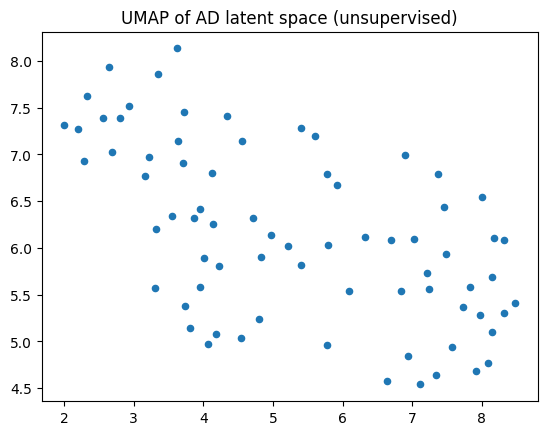

In [ ]:
z_te = get_latents(ae_ad_baseline, X_ad_te)
umap_proj = UMAP(n_neighbors=15, min_dist=0.1, random_state=42).fit_transform(z_te)

plt.scatter(umap_proj[:,0], umap_proj[:,1], s=20)
plt.title("UMAP of AD latent space (unsupervised)")
plt.show()

In [ ]:
mse_ad_on_t2d = recon_mse(ae_ad_baseline, X_t2d_te)
print("AD AE reconstruction on T2D:", mse_ad_on_t2d)

AD AE reconstruction on T2D: 2.603339910507202


Text(0.5, 1.0, 'Variance across latent dimensions')

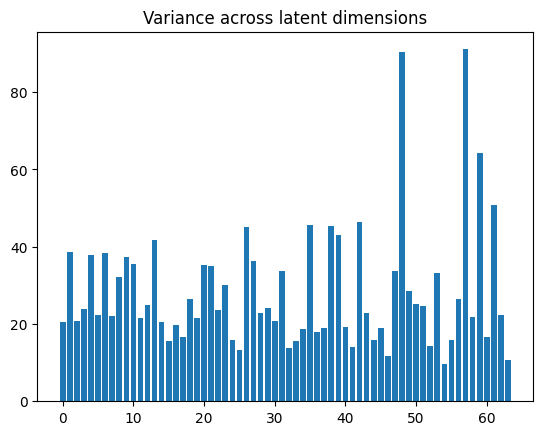

In [ ]:
z = get_latents(ae_ad_baseline, X_ad_te)
latent_var = z.var(axis=0)
plt.bar(range(latent_dim), latent_var)
plt.title("Variance across latent dimensions")

In [ ]:
noise = np.random.normal(0, 0.1, X_ad_te.shape)
z_noisy = get_latents(ae_ad_baseline, X_ad_te + noise)
dist_change = np.mean(np.linalg.norm(z_noisy - z, axis=1))
print("Average latent change under noise:", dist_change)

Average latent change under noise: 0.5317941


In [ ]:
k = 2  # number of clusters you expect
kmeans1 = KMeans(n_clusters=k, random_state=0).fit(z)
kmeans2 = KMeans(n_clusters=k, random_state=1).fit(z)
ari = adjusted_rand_score(kmeans1.labels_, kmeans2.labels_)
print("Adjusted Rand Index between clusterings:", ari)

Adjusted Rand Index between clusterings: 0.5205546095840428


In [ ]:
input_dim = X_t2d_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)
ae_t2d_baseline = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=hidden_dims, mask=mask_none, soft_mask=False)
ae_t2d_baseline = train_ae(ae_t2d_baseline, t2d_train_loader, epochs=60, lr=1e-3, lambda_reg=0.0)

Epoch 1/60 train_loss=2.710558
Epoch 10/60 train_loss=1.846666
Epoch 20/60 train_loss=1.257731
Epoch 30/60 train_loss=0.739996
Epoch 40/60 train_loss=0.341725
Epoch 50/60 train_loss=0.131231
Epoch 60/60 train_loss=0.045142


In [ ]:
mse_t2d_base = recon_mse(ae_t2d_baseline, X_t2d_te)
print("Baseline recon MSE for T2D AE:", mse_t2d_base)

Baseline recon MSE for T2D AE: 2.172945022583008


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


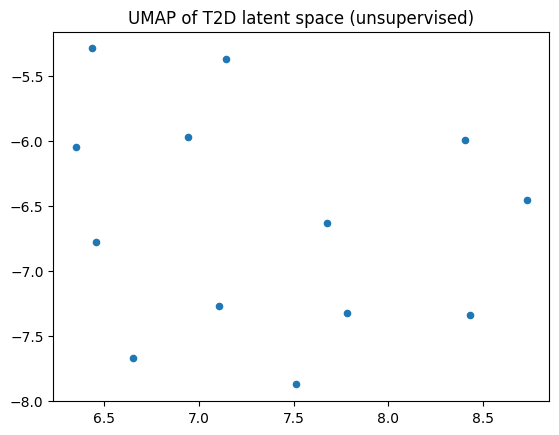

In [ ]:
z_te = get_latents(ae_t2d_baseline, X_t2d_te)
umap_proj = UMAP(n_neighbors=15, min_dist=0.1, random_state=42).fit_transform(z_te)

plt.scatter(umap_proj[:,0], umap_proj[:,1], s=20)
plt.title("UMAP of T2D latent space (unsupervised)")
plt.show()

In [ ]:
mse_t2d_on_ad = recon_mse(ae_t2d_baseline, X_ad_te)
print("T2D AE reconstruction on AD:", mse_t2d_on_ad)

T2D AE reconstruction on AD: 0.6189011931419373


Text(0.5, 1.0, 'Variance across latent dimensions')

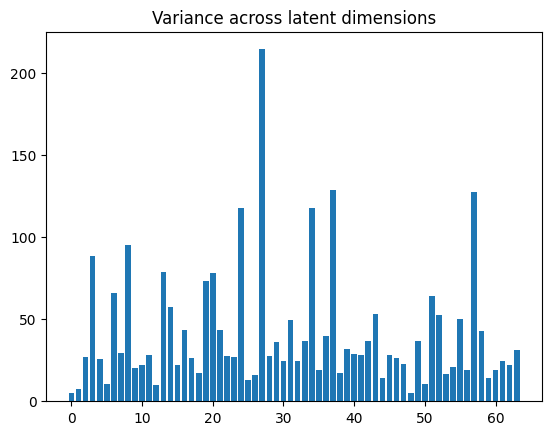

In [ ]:
z = get_latents(ae_t2d_baseline, X_t2d_te)
latent_var = z.var(axis=0)
plt.bar(range(latent_dim), latent_var)
plt.title("Variance across latent dimensions")

In [ ]:
noise = np.random.normal(0, 0.1, X_t2d_te.shape)
z_noisy = get_latents(ae_t2d_baseline, X_t2d_te + noise)
dist_change = np.mean(np.linalg.norm(z_noisy - z, axis=1))
print("Average latent change under noise:", dist_change)

Average latent change under noise: 0.3043799


In [ ]:
k = 2  # number of clusters you expect
kmeans1 = KMeans(n_clusters=k, random_state=0).fit(z)
kmeans2 = KMeans(n_clusters=k, random_state=1).fit(z)
ari = adjusted_rand_score(kmeans1.labels_, kmeans2.labels_)
print("Adjusted Rand Index between clusterings:", ari)

Adjusted Rand Index between clusterings: 1.0


**Hard mask Autoencoders**

In [ ]:
input_dim = X_ad_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

ae_ad_hard = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=hidden_dims, mask=pathway_mask, soft_mask=False)
ae_ad_hard = train_ae(ae_ad_hard, ad_train_loader, epochs=60, lr=1e-3, lambda_reg=0.0)

Epoch 1/60 train_loss=0.748318
Epoch 10/60 train_loss=0.395867
Epoch 20/60 train_loss=0.314468
Epoch 30/60 train_loss=0.267719
Epoch 40/60 train_loss=0.236646
Epoch 50/60 train_loss=0.217271
Epoch 60/60 train_loss=0.192328


In [ ]:
mse_ad_hard = recon_mse(ae_ad_hard, X_ad_te)
print("Baseline recon MSE for AD AE:", mse_ad_hard)

Baseline recon MSE for AD AE: 0.29516035318374634


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


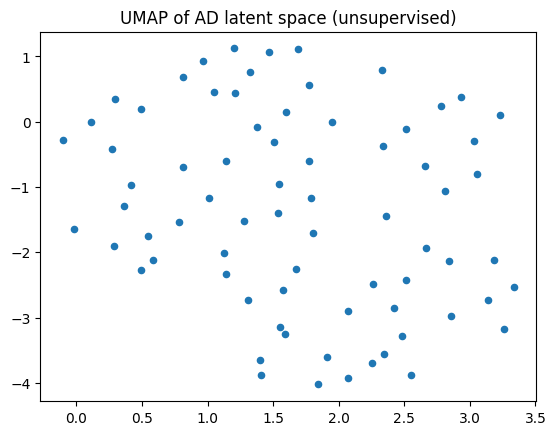

In [ ]:
z_te = get_latents(ae_ad_hard, X_ad_te)
umap_proj = UMAP(n_neighbors=15, min_dist=0.1, random_state=42).fit_transform(z_te)

plt.scatter(umap_proj[:,0], umap_proj[:,1], s=20)
plt.title("UMAP of AD latent space (unsupervised)")
plt.show()

In [ ]:
mse_ad_on_t2d_hard = recon_mse(ae_ad_hard, X_t2d_te)
print("AD AE reconstruction on T2D:", mse_ad_on_t2d_hard)

AD AE reconstruction on T2D: 2.61887526512146


Text(0.5, 1.0, 'Variance across latent dimensions')

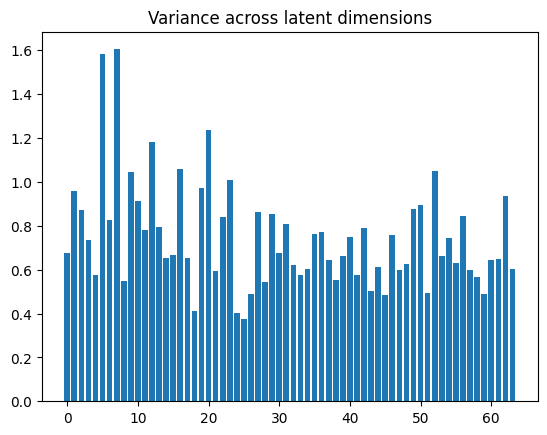

In [ ]:
z = get_latents(ae_ad_hard, X_ad_te)
latent_var = z.var(axis=0)
plt.bar(range(latent_dim), latent_var)
plt.title("Variance across latent dimensions")

In [ ]:
noise = np.random.normal(0, 0.1, X_ad_te.shape)
z_noisy = get_latents(ae_ad_hard, X_ad_te + noise)
dist_change = np.mean(np.linalg.norm(z_noisy - z, axis=1))
print("Average latent change under noise:", dist_change)

Average latent change under noise: 0.20921698


In [ ]:
k = 2  #arbitrary choice
kmeans1 = KMeans(n_clusters=k, random_state=0).fit(z)
kmeans2 = KMeans(n_clusters=k, random_state=1).fit(z)
ari = adjusted_rand_score(kmeans1.labels_, kmeans2.labels_)
print("Adjusted Rand Index between clusterings:", ari)

Adjusted Rand Index between clusterings: 0.7408374229925864


In [ ]:
input_dim = X_t2d_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

ae_t2d_hard = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=hidden_dims, mask=pathway_mask, soft_mask=False)
ae_t2d_hard = train_ae(ae_t2d_hard, t2d_train_loader, epochs=60, lr=1e-3, lambda_reg=0.0)

Epoch 1/60 train_loss=2.566247
Epoch 10/60 train_loss=1.930453
Epoch 20/60 train_loss=1.576189
Epoch 30/60 train_loss=1.253850
Epoch 40/60 train_loss=1.006677
Epoch 50/60 train_loss=0.815567
Epoch 60/60 train_loss=0.626848


In [ ]:
mse_t2d_hard = recon_mse(ae_t2d_hard, X_t2d_te)
print("Baseline recon MSE for T2D AE:", mse_t2d_hard)

Baseline recon MSE for T2D AE: 1.9887932538986206


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


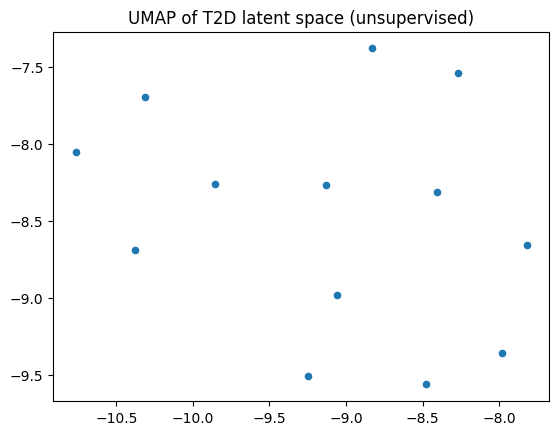

In [ ]:
z_te = get_latents(ae_t2d_hard, X_t2d_te)
umap_proj = UMAP(n_neighbors=15, min_dist=0.1, random_state=42).fit_transform(z_te)

plt.scatter(umap_proj[:,0], umap_proj[:,1], s=20)
plt.title("UMAP of T2D latent space (unsupervised)")
plt.show()

In [ ]:
mse_t2d_on_ad_hard = recon_mse(ae_t2d_hard, X_ad_te)
print("T2D AE reconstruction on AD:", mse_t2d_on_ad_hard)

T2D AE reconstruction on AD: 0.6381251215934753


Text(0.5, 1.0, 'Variance across latent dimensions')

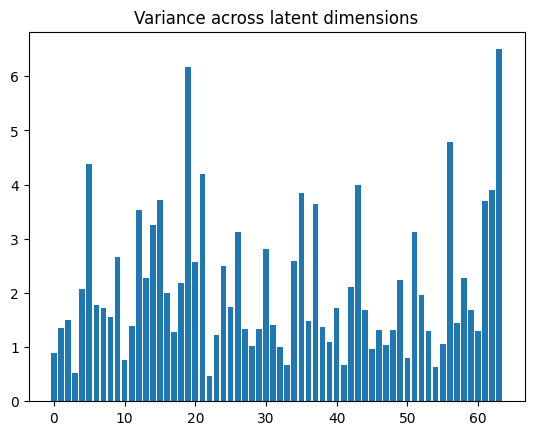

In [ ]:
z = get_latents(ae_t2d_hard, X_t2d_te)
latent_var = z.var(axis=0)
plt.bar(range(latent_dim), latent_var)
plt.title("Variance across latent dimensions")

In [ ]:
noise = np.random.normal(0, 0.1, X_t2d_te.shape)
z_noisy = get_latents(ae_t2d_hard, X_t2d_te + noise)
dist_change = np.mean(np.linalg.norm(z_noisy - z, axis=1))
print("Average latent change under noise:", dist_change)

Average latent change under noise: 0.16011998


In [ ]:
k = 2  # number of clusters you expect
kmeans1 = KMeans(n_clusters=k, random_state=0).fit(z)
kmeans2 = KMeans(n_clusters=k, random_state=1).fit(z)
ari = adjusted_rand_score(kmeans1.labels_, kmeans2.labels_)
print("Adjusted Rand Index between clusterings:", ari)

Adjusted Rand Index between clusterings: 0.23927178153446033


**Soft Mask Autoencoders**

In [ ]:
input_dim = X_ad_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

ae_ad_soft = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=hidden_dims, mask=pathway_mask, soft_mask=True)
ae_ad_soft = train_ae(ae_ad_soft, ad_train_loader, epochs=60, lr=1e-3, lambda_reg=1e-4)

W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.2597478164243512e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.2597285351366736e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.2597094357479364e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.2596899725613184e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.2596708731725812e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.2596515918849036e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.2596321286982857e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.2596130293095484e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.259593748021871e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.2595744667341933e-05
Epoch 1/60 

In [ ]:
mse_ad_soft = recon_mse(ae_ad_soft, X_ad_te)
print("Baseline recon MSE for AD AE:", mse_ad_soft)

Baseline recon MSE for AD AE: 0.2962518632411957


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


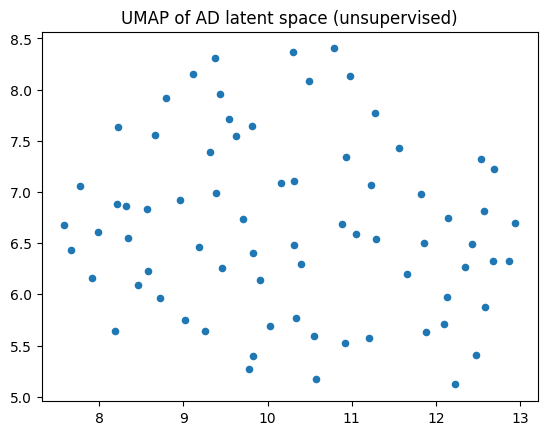

In [ ]:
z_te = get_latents(ae_ad_soft, X_ad_te)
umap_proj = UMAP(n_neighbors=15, min_dist=0.1, random_state=42).fit_transform(z_te)

plt.scatter(umap_proj[:,0], umap_proj[:,1], s=20)
plt.title("UMAP of AD latent space (unsupervised)")
plt.show()

In [ ]:
mse_ad_on_t2d_soft = recon_mse(ae_ad_soft, X_t2d_te)
print("AD AE reconstruction on T2D:", mse_ad_on_t2d_soft)

AD AE reconstruction on T2D: 2.6222119331359863


Text(0.5, 1.0, 'Variance across latent dimensions')

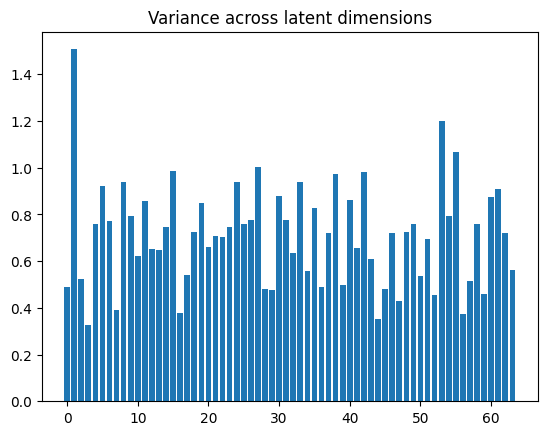

In [ ]:
z = get_latents(ae_ad_soft, X_ad_te)
latent_var = z.var(axis=0)
plt.bar(range(latent_dim), latent_var)
plt.title("Variance across latent dimensions")

In [ ]:
noise = np.random.normal(0, 0.1, X_ad_te.shape)
z_noisy = get_latents(ae_ad_soft, X_ad_te + noise)
dist_change = np.mean(np.linalg.norm(z_noisy - z, axis=1))
print("Average latent change under noise:", dist_change)

Average latent change under noise: 0.21468203


In [ ]:
k = 2  # number of clusters you expect
kmeans1 = KMeans(n_clusters=k, random_state=0).fit(z)
kmeans2 = KMeans(n_clusters=k, random_state=1).fit(z)
ari = adjusted_rand_score(kmeans1.labels_, kmeans2.labels_)
print("Adjusted Rand Index between clusterings:", ari)

Adjusted Rand Index between clusterings: 0.6463667820069204


In [ ]:
input_dim = X_t2d_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

ae_t2d_soft = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=hidden_dims, mask=pathway_mask, soft_mask=True)
ae_t2d_soft = train_ae(ae_t2d_soft, t2d_train_loader, epochs=60, lr=1e-3, lambda_reg=1e-4)

W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.259333268739283e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.2593139874516055e-05
Epoch 1/60 train_loss=2.565710
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.2592948880628683e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.2592754248762503e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.2592561435885727e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.2592370441998355e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.259217762912158e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.2591984816244803e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.2591792003368028e-05
W.shape: torch.Size([320, 14666]) mask.shape: torch.Size([320, 14666]) reg: 2.25

In [ ]:
mse_t2d_soft= recon_mse(ae_t2d_soft, X_t2d_te)
print("Baseline recon MSE for T2D AE:", mse_t2d_soft)

Baseline recon MSE for T2D AE: 1.9731175899505615


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


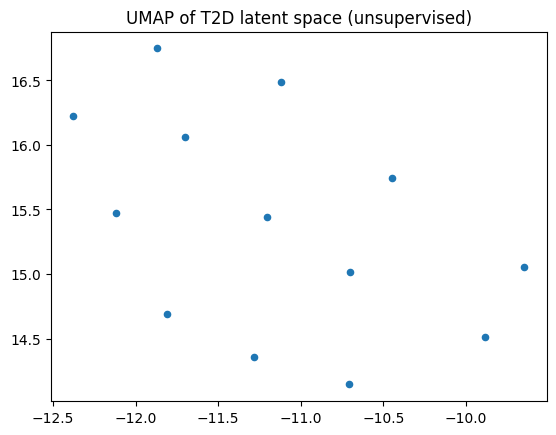

In [ ]:
z_te = get_latents(ae_t2d_soft, X_t2d_te)
umap_proj = UMAP(n_neighbors=15, min_dist=0.1, random_state=42).fit_transform(z_te)

plt.scatter(umap_proj[:,0], umap_proj[:,1], s=20)
plt.title("UMAP of T2D latent space (unsupervised)")
plt.show()

In [ ]:
mse_t2d_on_ad_soft = recon_mse(ae_t2d_soft, X_ad_te)
print("T2D AE reconstruction on AD:", mse_t2d_on_ad_soft)

T2D AE reconstruction on AD: 0.636906087398529


Text(0.5, 1.0, 'Variance across latent dimensions')

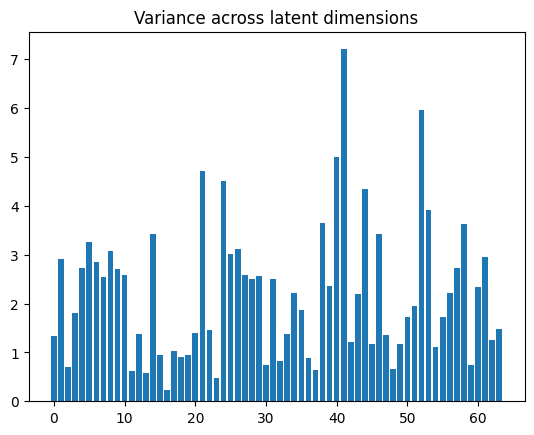

In [ ]:
z = get_latents(ae_t2d_soft, X_t2d_te)
latent_var = z.var(axis=0)
plt.bar(range(latent_dim), latent_var)
plt.title("Variance across latent dimensions")

In [ ]:
noise = np.random.normal(0, 0.1, X_t2d_te.shape)
z_noisy = get_latents(ae_t2d_soft, X_t2d_te + noise)
dist_change = np.mean(np.linalg.norm(z_noisy - z, axis=1))
print("Average latent change under noise:", dist_change)

Average latent change under noise: 0.14698


In [ ]:
k = 2  # number of clusters you expect
kmeans1 = KMeans(n_clusters=k, random_state=0).fit(z)
kmeans2 = KMeans(n_clusters=k, random_state=1).fit(z)
ari = adjusted_rand_score(kmeans1.labels_, kmeans2.labels_)
print("Adjusted Rand Index between clusterings:", ari)

Adjusted Rand Index between clusterings: 1.0


In [ ]:
input_dim = X_ad_scaled.shape[1]
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

ae_ad_baseline_cv, ad_baseline_fold_models = cv_evaluation(
    Autoencoder,
    X_ad_scaled,
    input_dim=input_dim,
    latent_dim=latent_dim,
    hidden_dims=hidden_dims,
    X_other = X_t2d_scaled,
    mask=None,
    soft_mask=False
)

Epoch 1/60 train_loss=0.779657
Epoch 10/60 train_loss=0.377739
Epoch 20/60 train_loss=0.260941
Epoch 30/60 train_loss=0.205460
Epoch 40/60 train_loss=0.197211
Epoch 50/60 train_loss=0.152817
Epoch 60/60 train_loss=0.122979
Epoch 1/60 train_loss=0.766616
Epoch 10/60 train_loss=0.365681
Epoch 20/60 train_loss=0.257770
Epoch 30/60 train_loss=0.208344
Epoch 40/60 train_loss=0.195542
Epoch 50/60 train_loss=0.134194
Epoch 60/60 train_loss=0.109028
Epoch 1/60 train_loss=0.755407
Epoch 10/60 train_loss=0.332569
Epoch 20/60 train_loss=0.260546
Epoch 30/60 train_loss=0.221918
Epoch 40/60 train_loss=0.164353
Epoch 50/60 train_loss=0.149961
Epoch 60/60 train_loss=0.137050
Epoch 1/60 train_loss=0.743427
Epoch 10/60 train_loss=0.341860
Epoch 20/60 train_loss=0.246906
Epoch 30/60 train_loss=0.197366
Epoch 40/60 train_loss=0.154495
Epoch 50/60 train_loss=0.124357
Epoch 60/60 train_loss=0.107025
Epoch 1/60 train_loss=0.798354
Epoch 10/60 train_loss=0.380691
Epoch 20/60 train_loss=0.248913
Epoch 30/60 t

In [ ]:
ae_ad_baseline_cv

[{'sample_mse': array([0.23093769, 0.3215487 , 0.19697706, 0.4132557 , 0.2384927 ,
         0.27121028, 0.25053832, 0.5793357 , 0.18888617, 0.32836753,
         0.36688548, 0.23472552, 0.444005  , 0.18862769, 0.21436304,
         0.38780436, 0.22866608, 0.34301928, 0.22633399, 0.19593257,
         0.22215492, 0.58448225, 0.24241091, 0.21062484, 0.29736176,
         0.17050995, 0.16421147, 0.41527167, 0.25665635, 0.19694242,
         0.24826878, 0.26901197, 0.21265785, 0.30017784, 0.17747812,
         0.21771479, 0.3121142 , 0.5122182 , 0.20153104, 0.46236378,
         0.8184992 , 0.16926917, 0.31411538, 0.43433967, 0.2382472 ,
         0.754657  , 0.65905184, 0.21705434, 0.38817528, 0.3102526 ,
         0.16916628, 0.5152635 , 0.30679384, 0.20716844, 0.3795839 ,
         0.27757564, 0.40021712, 0.24565096, 0.33993837, 1.2029669 ,
         0.3471495 , 0.39052352, 0.453259  , 0.37367693, 0.20203479,
         0.2157758 , 0.22774766, 0.28025022, 0.36178958, 0.25505716,
         0.57708824,

In [ ]:
# Example: mean ± std of per-fold sample MSE
ae_ad_baseline_cv_res = np.concatenate([r['sample_mse'] for r in ae_ad_baseline_cv])
print("Mean sample MSE:", ae_ad_baseline_cv_res.mean())
print("Std sample MSE:", ae_ad_baseline_cv_res.std())

# Mean per-gene MSE
all_gene_mse = np.stack([r['gene_mse'] for r in ae_ad_baseline_cv])
print("Mean per-gene MSE:", all_gene_mse.mean(axis=0))

# Mean noise robustness
robustness_mse = [r['robustness_mse'] for r in ae_ad_baseline_cv]
print("Mean robustness MSE:", np.mean(robustness_mse))

# Cross-dataset MSE
cross_mse = [r['cross_mse'] for r in ae_ad_baseline_cv if r['cross_mse'] is not None]
if cross_mse:  # check that the list is not empty
    print("Mean cross-dataset MSE:", np.mean(cross_mse))
else:
    print("No cross-dataset MSE values available.")


Mean sample MSE: 0.35320282
Std sample MSE: 0.20874996
Mean per-gene MSE: [0.00687991 0.07660908 0.23391695 ... 0.00689387 0.3632497  0.36118975]
Mean robustness MSE: 4.2492089996812864e-05
Mean cross-dataset MSE: 2.542318525314331


In [ ]:
input_dim = X_t2d_scaled.shape[1]
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

ae_t2d_baseline_cv, t2d_baseline_fold_models  = cv_evaluation(
    Autoencoder,
    X_t2d_scaled,
    input_dim=input_dim,
    latent_dim=latent_dim,
    hidden_dims=hidden_dims,
    X_other = X_ad_scaled,
    mask=None,
    soft_mask=False
)

Epoch 1/60 train_loss=2.752852
Epoch 10/60 train_loss=1.903803
Epoch 20/60 train_loss=1.302629
Epoch 30/60 train_loss=0.783128
Epoch 40/60 train_loss=0.380316
Epoch 50/60 train_loss=0.137910
Epoch 60/60 train_loss=0.042143
Epoch 1/60 train_loss=2.823394
Epoch 10/60 train_loss=1.853357
Epoch 20/60 train_loss=1.232170
Epoch 30/60 train_loss=0.723819
Epoch 40/60 train_loss=0.338033
Epoch 50/60 train_loss=0.126611
Epoch 60/60 train_loss=0.045495
Epoch 1/60 train_loss=2.774702
Epoch 10/60 train_loss=1.833399
Epoch 20/60 train_loss=1.214082
Epoch 30/60 train_loss=0.744200
Epoch 40/60 train_loss=0.342137
Epoch 50/60 train_loss=0.121612
Epoch 60/60 train_loss=0.037528
Epoch 1/60 train_loss=2.730607
Epoch 10/60 train_loss=1.804354
Epoch 20/60 train_loss=1.183107
Epoch 30/60 train_loss=0.704855
Epoch 40/60 train_loss=0.323124
Epoch 50/60 train_loss=0.109405
Epoch 60/60 train_loss=0.032997
Epoch 1/60 train_loss=2.623049
Epoch 10/60 train_loss=1.786633
Epoch 20/60 train_loss=1.191700
Epoch 30/60 t

In [ ]:
cv_eval(ae_t2d_baseline_cv)

Mean sample MSE: 2.0981424
Std sample MSE: 0.5592904
Mean per-gene MSE: [4.1652813  1.942141   0.7188219  ... 4.6014714  0.41845128 0.41480428]
Mean robustness MSE: 5.313714413205162e-05
Mean cross-dataset MSE: 0.7262257647514343


In [ ]:
ad_to_t2d_results = []
for model in ad_baseline_fold_models:  # your CV-trained AD AEs
    mean_sim, sim_scores = dg_test(
        model_train = model,
        X_train = X_ad_scaled,
        model_test = model,
        X_test = X_t2d_scaled
    )
    ad_to_t2d_results.append(mean_sim)

In [ ]:
t2d_to_ad_results = []
for model in t2d_baseline_fold_models:  # your CV-trained T2D AEs
    mean_sim, sim_scores = dg_test(
        model_train = model,
        X_train = X_t2d_scaled,
        model_test = model,
        X_test = X_ad_scaled
    )
    t2d_to_ad_results.append(mean_sim)

In [ ]:
print("AD → T2D mean AUC:", np.mean(ad_to_t2d_results))
print("AD → T2D std:", np.std(ad_to_t2d_results))

print("T2D → AD mean AUC:", np.mean(t2d_to_ad_results))
print("T2D → AD std:", np.std(t2d_to_ad_results))

AD → T2D mean AUC: 0.6424439104862162
AD → T2D std: 0.0338622605740019
T2D → AD mean AUC: 0.4680148846082524
T2D → AD std: 0.05692152273355318


**Hard mask CV**

In [ ]:
input_dim = X_ad_scaled.shape[1]
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

ae_ad_hard_cv, ad_hard_fold_models = cv_evaluation(
    Autoencoder,
    X_ad_scaled,
    input_dim=input_dim,
    latent_dim=latent_dim,
    hidden_dims=hidden_dims,
    X_other = X_t2d_scaled,
    mask=pathway_mask,
    soft_mask=False
)

Epoch 1/60 train_loss=0.761938
Epoch 10/60 train_loss=0.354781
Epoch 20/60 train_loss=0.265932
Epoch 30/60 train_loss=0.198640
Epoch 40/60 train_loss=0.166033
Epoch 50/60 train_loss=0.137002
Epoch 60/60 train_loss=0.130306
Epoch 1/60 train_loss=0.761938
Epoch 10/60 train_loss=0.379161
Epoch 20/60 train_loss=0.256636
Epoch 30/60 train_loss=0.216689
Epoch 40/60 train_loss=0.178164
Epoch 50/60 train_loss=0.175588
Epoch 60/60 train_loss=0.124941
Epoch 1/60 train_loss=0.752316
Epoch 10/60 train_loss=0.330576
Epoch 20/60 train_loss=0.253813
Epoch 30/60 train_loss=0.212962
Epoch 40/60 train_loss=0.213658
Epoch 50/60 train_loss=0.141172
Epoch 60/60 train_loss=0.106664
Epoch 1/60 train_loss=0.756295
Epoch 10/60 train_loss=0.372115
Epoch 20/60 train_loss=0.256950
Epoch 30/60 train_loss=0.211962
Epoch 40/60 train_loss=0.176133
Epoch 50/60 train_loss=0.126287
Epoch 60/60 train_loss=0.108409
Epoch 1/60 train_loss=0.777811
Epoch 10/60 train_loss=0.360292
Epoch 20/60 train_loss=0.247356
Epoch 30/60 t

In [ ]:
input_dim = X_ad_scaled.shape[1]
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

ae_t2d_hard_cv, t2d_hard_fold_models = cv_evaluation(
    Autoencoder,
    X_t2d_scaled,
    input_dim=input_dim,
    latent_dim=latent_dim,
    hidden_dims=hidden_dims,
    X_other = X_ad_scaled,
    mask=pathway_mask,
    soft_mask=False
)

Epoch 1/60 train_loss=2.847343
Epoch 10/60 train_loss=1.963795
Epoch 20/60 train_loss=1.355099
Epoch 30/60 train_loss=0.826479
Epoch 40/60 train_loss=0.422234
Epoch 50/60 train_loss=0.162008
Epoch 60/60 train_loss=0.049622
Epoch 1/60 train_loss=2.695504
Epoch 10/60 train_loss=1.826032
Epoch 20/60 train_loss=1.215547
Epoch 30/60 train_loss=0.745948
Epoch 40/60 train_loss=0.362499
Epoch 50/60 train_loss=0.131572
Epoch 60/60 train_loss=0.044179
Epoch 1/60 train_loss=2.707503
Epoch 10/60 train_loss=1.834481
Epoch 20/60 train_loss=1.258947
Epoch 30/60 train_loss=0.758723
Epoch 40/60 train_loss=0.396450
Epoch 50/60 train_loss=0.155213
Epoch 60/60 train_loss=0.050793
Epoch 1/60 train_loss=2.721908
Epoch 10/60 train_loss=1.926845
Epoch 20/60 train_loss=1.253728
Epoch 30/60 train_loss=0.735514
Epoch 40/60 train_loss=0.347186
Epoch 50/60 train_loss=0.123929
Epoch 60/60 train_loss=0.033344
Epoch 1/60 train_loss=2.757682
Epoch 10/60 train_loss=1.849284
Epoch 20/60 train_loss=1.231380
Epoch 30/60 t

In [ ]:
cv_eval(ae_ad_hard_cv)

Mean sample MSE: 0.3576881
Std sample MSE: 0.21289779
Mean per-gene MSE: [0.00709955 0.07482507 0.2281905  ... 0.00709873 0.37238178 0.36012664]
Mean robustness MSE: 4.157021932769567e-05
Mean cross-dataset MSE: 2.5428712463378904


In [ ]:
cv_eval(ae_t2d_hard_cv)

Mean sample MSE: 2.0888295
Std sample MSE: 0.55398256
Mean per-gene MSE: [4.10669    2.3206553  0.7023628  ... 4.4970536  0.47566745 0.4542403 ]
Mean robustness MSE: 5.2310879109427336e-05
Mean cross-dataset MSE: 0.7264117932319641


In [ ]:
ad_to_t2d_results = []
for model in ad_hard_fold_models:  # your CV-trained AD AEs
    mean_sim, sim_scores = dg_test(
        model_train = model,
        X_train = X_ad_scaled,
        model_test = model,
        X_test = X_t2d_scaled
    )
    ad_to_t2d_results.append(mean_sim)

In [ ]:
t2d_to_ad_results = []
for model in t2d_hard_fold_models:  # your CV-trained T2D AEs
    mean_sim, sim_scores = dg_test(
        model_train = model,
        X_train = X_t2d_scaled,
        model_test = model,
        X_test = X_ad_scaled
    )
    t2d_to_ad_results.append(mean_sim)

In [ ]:
print("AD → T2D mean AUC:", np.mean(ad_to_t2d_results))
print("AD → T2D std:", np.std(ad_to_t2d_results))

print("T2D → AD mean AUC:", np.mean(t2d_to_ad_results))
print("T2D → AD std:", np.std(t2d_to_ad_results))

AD → T2D mean AUC: 0.6462997653580622
AD → T2D std: 0.03450502947549078
T2D → AD mean AUC: 0.46443609272494885
T2D → AD std: 0.052814813946639304


**Soft mask CV**

In [ ]:
input_dim = X_ad_scaled.shape[1]
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

ae_ad_soft_cv, ad_soft_fold_models = cv_evaluation(
    Autoencoder,
    X_ad_scaled,
    input_dim=input_dim,
    latent_dim=latent_dim,
    hidden_dims=hidden_dims,
    X_other = X_t2d_scaled,
    mask=pathway_mask,
    soft_mask=True,
    lambda_reg=1e-4
)

Epoch 1/60 train_loss=0.766746
Epoch 10/60 train_loss=0.351791
Epoch 20/60 train_loss=0.266992
Epoch 30/60 train_loss=0.214546
Epoch 40/60 train_loss=0.196241
Epoch 50/60 train_loss=0.184212
Epoch 60/60 train_loss=0.142560
Epoch 1/60 train_loss=0.777061
Epoch 10/60 train_loss=0.361157
Epoch 20/60 train_loss=0.276211
Epoch 30/60 train_loss=0.214566
Epoch 40/60 train_loss=0.186229
Epoch 50/60 train_loss=0.146471
Epoch 60/60 train_loss=0.123856
Epoch 1/60 train_loss=0.765205
Epoch 10/60 train_loss=0.344386
Epoch 20/60 train_loss=0.260584
Epoch 30/60 train_loss=0.248388
Epoch 40/60 train_loss=0.169884
Epoch 50/60 train_loss=0.137699
Epoch 60/60 train_loss=0.111656
Epoch 1/60 train_loss=0.773937
Epoch 10/60 train_loss=0.366797
Epoch 20/60 train_loss=0.257298
Epoch 30/60 train_loss=0.209468
Epoch 40/60 train_loss=0.151589
Epoch 50/60 train_loss=0.156447
Epoch 60/60 train_loss=0.200270
Epoch 1/60 train_loss=0.760099
Epoch 10/60 train_loss=0.361345
Epoch 20/60 train_loss=0.255626
Epoch 30/60 t

In [ ]:
ae_t2d_soft_cv, t2d_soft_fold_models = cv_evaluation(
    Autoencoder,
    X_t2d_scaled,
    input_dim=input_dim,
    latent_dim=latent_dim,
    hidden_dims=hidden_dims,
    X_other = X_ad_scaled,
    mask=pathway_mask,
    soft_mask=True,
    lambda_reg=1e-4
)

Epoch 1/60 train_loss=2.690903
Epoch 10/60 train_loss=1.856649
Epoch 20/60 train_loss=1.305989
Epoch 30/60 train_loss=0.843358
Epoch 40/60 train_loss=0.455343
Epoch 50/60 train_loss=0.180930
Epoch 60/60 train_loss=0.057656
Epoch 1/60 train_loss=2.749501
Epoch 10/60 train_loss=1.810807
Epoch 20/60 train_loss=1.201408
Epoch 30/60 train_loss=0.747302
Epoch 40/60 train_loss=0.351630
Epoch 50/60 train_loss=0.127915
Epoch 60/60 train_loss=0.041898
Epoch 1/60 train_loss=2.763250
Epoch 10/60 train_loss=1.822123
Epoch 20/60 train_loss=1.218362
Epoch 30/60 train_loss=0.741979
Epoch 40/60 train_loss=0.382619
Epoch 50/60 train_loss=0.156773
Epoch 60/60 train_loss=0.061931
Epoch 1/60 train_loss=2.914407
Epoch 10/60 train_loss=1.933962
Epoch 20/60 train_loss=1.267562
Epoch 30/60 train_loss=0.822762
Epoch 40/60 train_loss=0.413533
Epoch 50/60 train_loss=0.162734
Epoch 60/60 train_loss=0.047360
Epoch 1/60 train_loss=2.636652
Epoch 10/60 train_loss=1.808969
Epoch 20/60 train_loss=1.181284
Epoch 30/60 t

In [ ]:
cv_eval(ae_ad_soft_cv)

Mean sample MSE: 0.35770115
Std sample MSE: 0.21417342
Mean per-gene MSE: [0.00697934 0.07560279 0.24444671 ... 0.00657817 0.3582509  0.38664058]
Mean robustness MSE: 4.097445998922922e-05
Mean cross-dataset MSE: 2.543121347427368


In [ ]:
cv_eval(ae_t2d_soft_cv)

Mean sample MSE: 2.1011524
Std sample MSE: 0.5260194
Mean per-gene MSE: [3.5917313  2.025468   0.76480997 ... 4.843849   0.4448493  0.44400355]
Mean robustness MSE: 5.5492157116532326e-05
Mean cross-dataset MSE: 0.7260786604881286


In [ ]:
ad_to_t2d_results = []
for model in ad_soft_fold_models:  # your CV-trained AD AEs
    mean_sim, sim_scores = dg_test(
        model_train = model,
        X_train = X_ad_scaled,
        model_test = model,
        X_test = X_t2d_scaled
    )
    ad_to_t2d_results.append(mean_sim)

In [ ]:
t2d_to_ad_results = []
for model in t2d_soft_fold_models:  # your CV-trained T2D AEs
    mean_sim, sim_scores = dg_test(
        model_train = model,
        X_train = X_t2d_scaled,
        model_test = model,
        X_test = X_ad_scaled
    )
    t2d_to_ad_results.append(mean_sim)

In [ ]:
print("AD → T2D mean AUC:", np.mean(ad_to_t2d_results))
print("AD → T2D std:", np.std(ad_to_t2d_results))

print("T2D → AD mean AUC:", np.mean(t2d_to_ad_results))
print("T2D → AD std:", np.std(t2d_to_ad_results))

AD → T2D mean AUC: 0.6555516334558976
AD → T2D std: 0.03387717802207683
T2D → AD mean AUC: 0.4470820459514797
T2D → AD std: 0.04950871726319244


# AEs with combined datasets

In [ ]:
assert not np.isnan(X_all_scaled).any()
assert X_all_scaled.shape[0] == len(y_combined)
assert set(np.unique(y_combined)) == {0,1}
print("Final shape:", X_all_scaled.shape)

Final shape: (426, 14666)


In [ ]:
print("Mean ~0:", X_all_scaled.mean(), "Std ~1:", X_all_scaled.std())

Mean ~0: -9.54023e-11 Std ~1: 0.9999999


In [ ]:
X_combined_tr, X_combined_te = train_test_split(X_all_scaled, test_size=0.2, random_state=42)
y_combined_tr, y_combined_te = train_test_split(y_combined, test_size=0.2, random_state=42)

In [ ]:
batch_size = 32

combined_tr_tensor = torch.tensor(X_combined_tr, dtype=torch.float32)
dummy_labels = torch.zeros(X_combined_tr.shape[0], dtype=torch.long)
combined_train_ds = TensorDataset(combined_tr_tensor, dummy_labels)
combined_train_loader = DataLoader(combined_train_ds, batch_size=batch_size, shuffle=True)

**Baseline AE on combined dataset**

In [ ]:
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)
combined_baseline = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=hidden_dims, mask=mask_none, soft_mask=False)
combined_baseline = train_ae(combined_baseline, combined_train_loader, epochs=60, lr=1e-3, lambda_reg=0.0)

Epoch 1/60 train_loss=1.058099
Epoch 10/60 train_loss=0.580371
Epoch 20/60 train_loss=0.350417
Epoch 30/60 train_loss=0.241388
Epoch 40/60 train_loss=0.183809
Epoch 50/60 train_loss=0.145323
Epoch 60/60 train_loss=0.126453


Baseline recon MSE: 0.5937291979789734


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


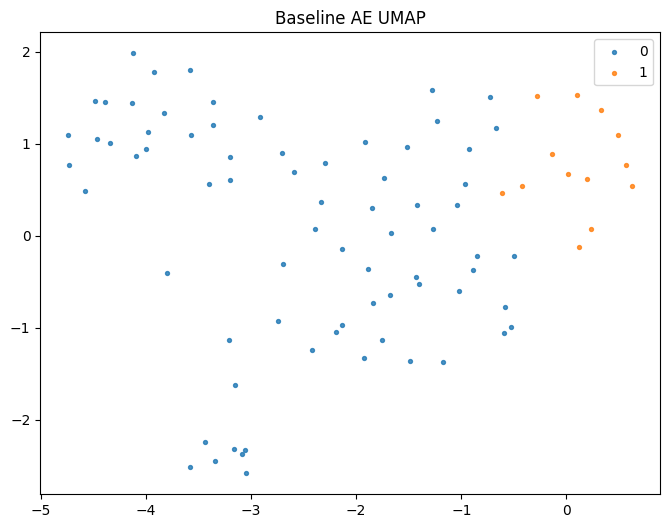

In [ ]:
print("Baseline recon MSE:", recon_mse(combined_baseline, X_combined_te))
print_umap(get_latents(combined_baseline, X_combined_te), y_combined_te, title="Baseline AE UMAP")

In [ ]:
# classifier on latent

# grab latent representations
z_tr = get_latents(combined_baseline, X_combined_tr)
z_te = get_latents(combined_baseline, X_combined_te)

# Train a logistical regression model on latent rep
clf = LogisticRegression(max_iter=1000)
clf.fit(z_tr, y_combined_tr)


y_pred = clf.predict_proba(z_te)
auc = roc_auc_score(y_combined_te, y_pred[:, 1])

print("Baseline latent classifier AUC/acc:", auc)

Baseline latent classifier AUC/acc: 1.0


In [ ]:
mse_combined_baseline= recon_mse(combined_baseline, X_combined_te)
print("Baseline recon MSE for Combined data:", mse_combined_baseline)

Baseline recon MSE for Combined data: 0.5937291979789734


In [ ]:
mse_combined_baseline_ad= recon_mse(combined_baseline, X_ad_te)
print("Baseline recon MSE for AD:", mse_combined_baseline_ad)

Baseline recon MSE for AD: 0.22703121602535248


In [ ]:
mse_combined_baseline_t2d= recon_mse(combined_baseline, X_t2d_te)
print("Baseline recon MSE for T2D:", mse_combined_baseline_t2d)

Baseline recon MSE for T2D: 0.6662465929985046


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


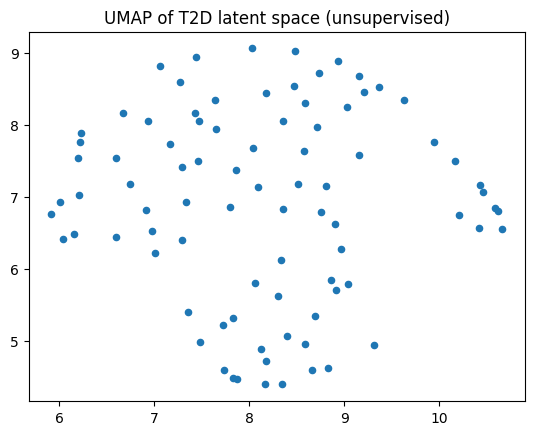

In [ ]:
z_te = get_latents(combined_baseline, X_combined_te)
umap_proj = UMAP(n_neighbors=15, min_dist=0.1, random_state=42).fit_transform(z_te)

plt.scatter(umap_proj[:,0], umap_proj[:,1], s=20)
plt.title("UMAP of T2D latent space (unsupervised)")
plt.show()

Text(0.5, 1.0, 'Variance across latent dimensions')

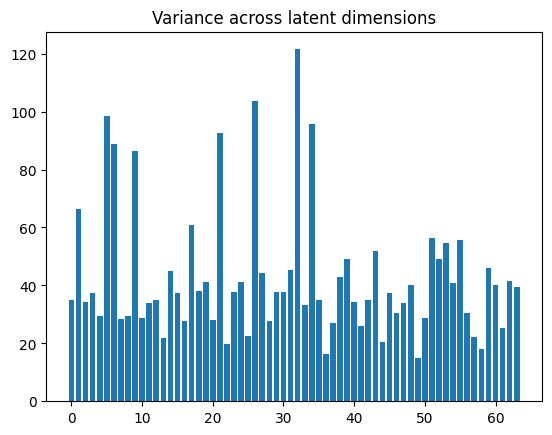

In [ ]:
z = get_latents(combined_baseline, X_combined_te)
latent_var = z.var(axis=0)
plt.bar(range(latent_dim), latent_var)
plt.title("Variance across latent dimensions")

In [ ]:
noise = np.random.normal(0, 0.1, X_combined_te.shape)
z_noisy = get_latents(combined_baseline, X_combined_te + noise)
dist_change = np.mean(np.linalg.norm(z_noisy - z, axis=1))
print("Average latent change under noise:", dist_change)

Average latent change under noise: 0.53024524


In [ ]:
k = 2  # number of clusters you expect
kmeans1 = KMeans(n_clusters=k, random_state=0).fit(z)
kmeans2 = KMeans(n_clusters=k, random_state=1).fit(z)
ari = adjusted_rand_score(kmeans1.labels_, kmeans2.labels_)
print("Adjusted Rand Index between clusterings:", ari)

Adjusted Rand Index between clusterings: -0.08573401698908344


**Hard Mask AE on combined dataset**

In [ ]:
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

combined_hard = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=hidden_dims, mask=pathway_mask, soft_mask=False)
combined_hard = train_ae(combined_hard, combined_train_loader, epochs=60, lr=1e-3, lambda_reg=0.0)

Epoch 1/60 train_loss=1.000327
Epoch 10/60 train_loss=0.559477
Epoch 20/60 train_loss=0.416211
Epoch 30/60 train_loss=0.324960
Epoch 40/60 train_loss=0.257916
Epoch 50/60 train_loss=0.207588
Epoch 60/60 train_loss=0.175692


Hard-mask recon MSE: 0.6080144047737122


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


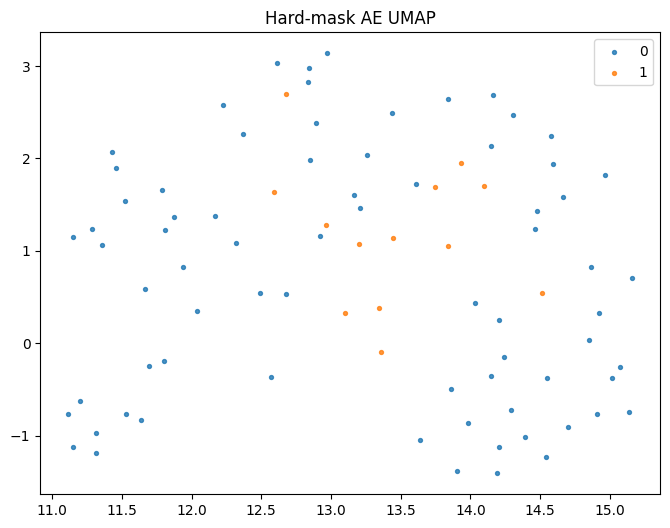

In [ ]:
print("Hard-mask recon MSE:", recon_mse(combined_hard, X_combined_te))
print_umap(get_latents(combined_hard, X_combined_te), y_combined_te, title="Hard-mask AE UMAP")

In [ ]:
# classifier on latent

# grab latent representations
z_tr = get_latents(combined_hard, X_combined_tr)
z_te = get_latents(combined_hard, X_combined_te)

# Train a logistical regression model on latent rep
clf = LogisticRegression(max_iter=1000)
clf.fit(z_tr, y_combined_tr)


y_pred = clf.predict_proba(z_te)
auc = roc_auc_score(y_combined_te, y_pred[:, 1])

print("Hard-mask latent classifier AUC/acc:", auc)

Hard-mask latent classifier AUC/acc: 1.0


In [ ]:
mse_combined_hard = recon_mse(combined_hard, X_combined_te)
print("Hard-mask recon MSE for Combined data:", mse_combined_hard)

Hard-mask recon MSE for Combined data: 0.6080144047737122


In [ ]:
mse_combined_hard_ad= recon_mse(combined_hard, X_ad_te)
print("Hard-mask recon MSE for AD:", mse_combined_hard_ad)

Hard-mask recon MSE for AD: 0.2504418194293976


In [ ]:
mse_combined_hard_t2d= recon_mse(combined_hard, X_t2d_te)
print("Hard-mask recon MSE for T2D:", mse_combined_hard_t2d)

Hard-mask recon MSE for T2D: 0.7432841062545776


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


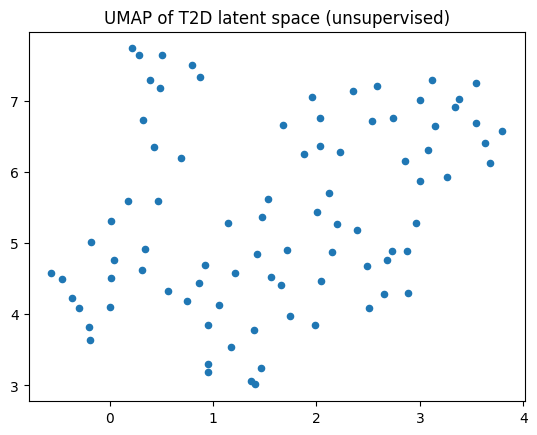

In [ ]:
z_te = get_latents(combined_hard, X_combined_te)
umap_proj = UMAP(n_neighbors=15, min_dist=0.1, random_state=42).fit_transform(z_te)

plt.scatter(umap_proj[:,0], umap_proj[:,1], s=20)
plt.title("UMAP of T2D latent space (unsupervised)")
plt.show()

Text(0.5, 1.0, 'Variance across latent dimensions')

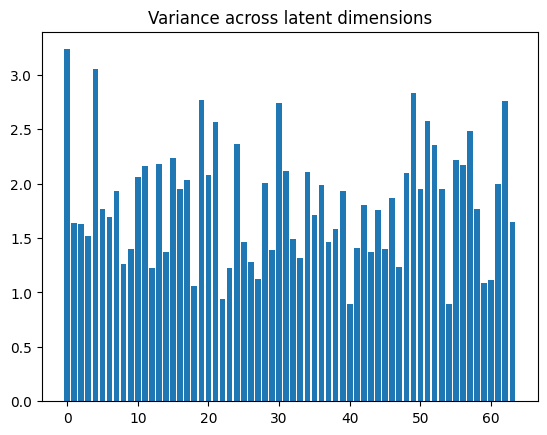

In [ ]:
z = get_latents(combined_hard, X_combined_te)
latent_var = z.var(axis=0)
plt.bar(range(latent_dim), latent_var)
plt.title("Variance across latent dimensions")

In [ ]:
noise = np.random.normal(0, 0.1, X_combined_te.shape)
z_noisy = get_latents(combined_hard, X_combined_te + noise)
dist_change = np.mean(np.linalg.norm(z_noisy - z, axis=1))
print("Average latent change under noise:", dist_change)

Average latent change under noise: 0.38019007


In [ ]:
k = 2  # number of clusters you expect
kmeans1 = KMeans(n_clusters=k, random_state=0).fit(z)
kmeans2 = KMeans(n_clusters=k, random_state=1).fit(z)
ari = adjusted_rand_score(kmeans1.labels_, kmeans2.labels_)
print("Adjusted Rand Index between clusterings:", ari)

Adjusted Rand Index between clusterings: 0.8378845897955262


**Soft Mask AE on combined dataset**

In [ ]:
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

combined_soft = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=hidden_dims, mask=pathway_mask, soft_mask=True)
combined_soft = train_ae(combined_soft, combined_train_loader, epochs=60, lr=1e-3, lambda_reg=1e-4)

Epoch 1/60 train_loss=1.001970
Epoch 10/60 train_loss=0.562481
Epoch 20/60 train_loss=0.422529
Epoch 30/60 train_loss=0.331062
Epoch 40/60 train_loss=0.258769
Epoch 50/60 train_loss=0.210433
Epoch 60/60 train_loss=0.180128


Soft-mask recon MSE: 0.6063739061355591


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


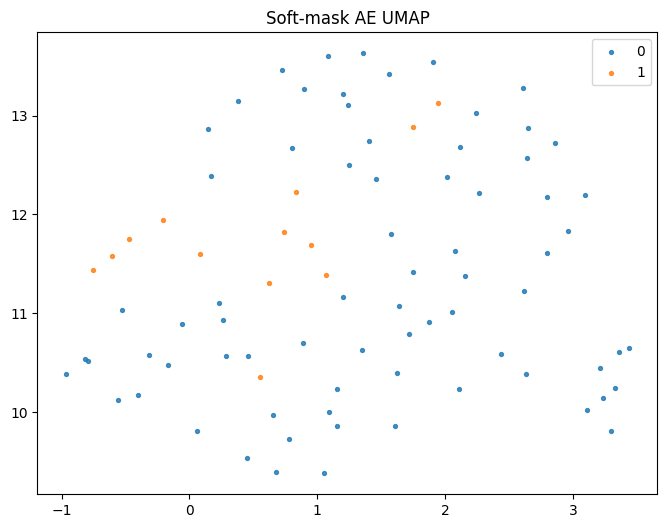

In [ ]:
print("Soft-mask recon MSE:", recon_mse(combined_soft, X_combined_te))
print_umap(get_latents(combined_soft, X_combined_te), y_combined_te, title="Soft-mask AE UMAP")

In [ ]:
# classifier on latent

# grab latent representations
z_tr = get_latents(combined_soft, X_combined_tr)
z_te = get_latents(combined_soft, X_combined_te)

# Train a logistical regression model on latent rep
clf = LogisticRegression(max_iter=1000)
clf.fit(z_tr, y_combined_tr)


y_pred = clf.predict_proba(z_te)
auc = roc_auc_score(y_combined_te, y_pred[:, 1])

print("Soft-mask latent classifier AUC/acc:", auc)

Soft-mask latent classifier AUC/acc: 1.0


In [ ]:
mse_combined_soft = recon_mse(combined_soft, X_combined_te)
print("Soft-mask recon MSE for Combined data:", mse_combined_soft)

Soft-mask recon MSE for Combined data: 0.6063739061355591


In [ ]:
mse_combined_soft_ad= recon_mse(combined_soft, X_ad_te)
print("Soft-mask recon MSE for AD:", mse_combined_soft_ad)

Soft-mask recon MSE for AD: 0.24761998653411865


In [ ]:
mse_combined_soft_t2d= recon_mse(combined_soft, X_t2d_te)
print("Soft-mask recon MSE for T2D:", mse_combined_soft_t2d)

Soft-mask recon MSE for T2D: 0.7440705895423889


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


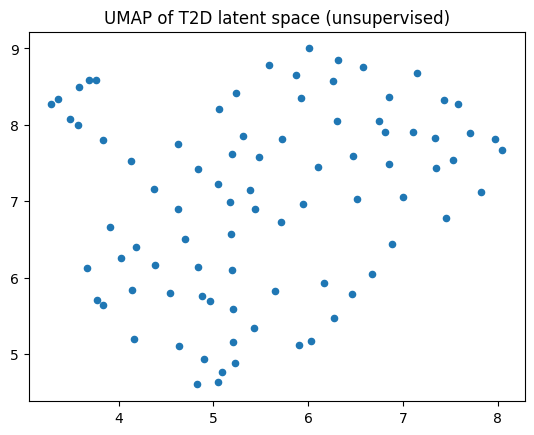

In [ ]:
z_te = get_latents(combined_soft, X_combined_te)
umap_proj = UMAP(n_neighbors=15, min_dist=0.1, random_state=42).fit_transform(z_te)

plt.scatter(umap_proj[:,0], umap_proj[:,1], s=20)
plt.title("UMAP of T2D latent space (unsupervised)")
plt.show()

Text(0.5, 1.0, 'Variance across latent dimensions')

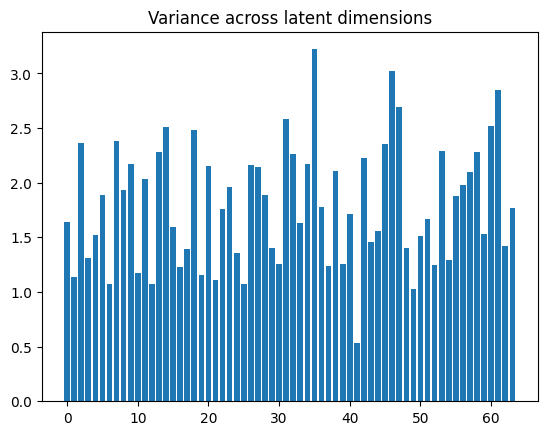

In [ ]:
z = get_latents(combined_soft, X_combined_te)
latent_var = z.var(axis=0)
plt.bar(range(latent_dim), latent_var)
plt.title("Variance across latent dimensions")

In [ ]:
noise = np.random.normal(0, 0.1, X_combined_te.shape)
z_noisy = get_latents(combined_soft, X_combined_te + noise)
dist_change = np.mean(np.linalg.norm(z_noisy - z, axis=1))
print("Average latent change under noise:", dist_change)

Average latent change under noise: 0.38391876


In [ ]:
k = 2  # number of clusters you expect
kmeans1 = KMeans(n_clusters=k, random_state=0).fit(z)
kmeans2 = KMeans(n_clusters=k, random_state=1).fit(z)
ari = adjusted_rand_score(kmeans1.labels_, kmeans2.labels_)
print("Adjusted Rand Index between clusterings:", ari)

Adjusted Rand Index between clusterings: 0.8378845897955262


**Hyperparameter sweep for X_combined AE**

Baseline ae hyperparameter sweep (across latent_dims)

In [ ]:
def summarize_cv(cv_results):
    # sample MSE — combine all folds
    all_sample = np.concatenate([r['sample_mse'] for r in cv_results])
    sample_mean = all_sample.mean()
    sample_median = np.median(all_sample)

    # robustness
    robustness = np.mean([r['robustness_mse'] for r in cv_results])

    # cross-dataset
    cross_vals = [r['cross_mse'] for r in cv_results if r['cross_mse'] is not None]
    cross_mean = np.mean(cross_vals) if cross_vals else None

    return {
        'sample_mean': sample_mean,
        'sample_median': sample_median,
        'robustness': robustness,
        'cross_mean': cross_mean
    }

In [ ]:
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

latent_dims = [16, 32, 64, 128]
X_other_datasets = [X_ad_scaled, X_t2d_scaled, None]

baseline_results = {}
mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)
for X_other in X_other_datasets:
    for dim in latent_dims:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_all_scaled,
          input_dim=input_dim,
          latent_dim=dim,
          hidden_dims=hidden_dims,
          X_other=X_other,
          mask=mask_none,
          soft_mask=False,
          lambda_reg=None
      )
      # Save results keyed by hyperparameters
      dataset_name = "AD" if X_other is X_ad_scaled else "T2D" if X_other is X_t2d_scaled else "None"

      baseline_results[(dim, dataset_name)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()


Epoch 1/60 train_loss=1.108065
Epoch 10/60 train_loss=0.589051


KeyboardInterrupt: 

In [ ]:
rows = []

for (dim, dataset_name), result in baseline_results.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'latent_dim': dim,
        'dataset': dataset_name,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/baseline_results.csv', index=False)

    latent_dim dataset  sample_mean  sample_median  robustness  cross_mean
0           16      AD     0.669022       0.358790    0.000050    0.242300
1           32      AD     0.621401       0.348276    0.000056    0.188031
2           64      AD     0.608192       0.348194    0.000050    0.167074
3          128      AD     0.598006       0.332522    0.000041    0.178703
4           16     T2D     0.669783       0.358788    0.000052    0.595795
5           32     T2D     0.620933       0.348099    0.000056    0.516745
6           64     T2D     0.606433       0.341831    0.000050    0.474307
7          128     T2D     0.597081       0.335242    0.000040    0.544294
8           16    None     0.666960       0.357522    0.000052         NaN
9           32    None     0.619754       0.348597    0.000057         NaN
10          64    None     0.606317       0.347678    0.000051         NaN
11         128    None     0.599720       0.334024    0.000040         NaN


Hard mask hyperparameter sweep (across latent_dims)

In [ ]:
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

latent_dims = [16, 32, 64, 128]
X_other_datasets = [X_ad_scaled, X_t2d_scaled, None]

hard_results = {}

for X_other in X_other_datasets:
    for dim in latent_dims:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_all_scaled,
          input_dim=input_dim,
          latent_dim=dim,
          hidden_dims=hidden_dims,
          X_other=X_other,
          mask=pathway_mask,
          soft_mask=False,
          lambda_reg=None
      )
      # Save results keyed by hyperparameters
      dataset_name = "AD" if X_other is X_ad_scaled else "T2D" if X_other is X_t2d_scaled else "None"

      hard_results[(dim, dataset_name)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()


In [ ]:
rows = []

for (dim, dataset_name), result in hard_results.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'latent_dim': dim,
        'dataset': dataset_name,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/hard_results.csv', index=False)

Soft mask hyperparameter sweep (across latent_dims and lambda_regs)

In [ ]:
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

lambda_regs = [0.0, 1e-4, 1e-3, 1e-2]
latent_dims = [16, 32, 64, 128]
X_other_datasets = [X_ad_scaled, X_t2d_scaled, None]

soft_results_lambda_r = {}

for X_other in X_other_datasets:
  for lambda_r in lambda_regs:
    ae_cv, fold_models = cv_evaluation(
        model_class=Autoencoder,
        X=X_all_scaled,
        input_dim=input_dim,
        latent_dim=64,
        hidden_dims=hidden_dims,
        X_other=X_other,
        mask=pathway_mask,
        soft_mask=True,
        lambda_reg=lambda_r
    )

    dataset_name = "AD" if X_other is X_ad_scaled else "T2D" if X_other is X_t2d_scaled else "None"

    soft_results_lambda_r[(lambda_r, dataset_name)] = {'cv_metrics': ae_cv}
    del fold_models
    torch.cuda.empty_cache()


In [ ]:
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

lambda_regs = [0.0, 1e-4, 1e-3, 1e-2]
latent_dims = [16, 32, 64, 128]
X_other_datasets = [X_ad_scaled, X_t2d_scaled, None]

soft_results_dim = {}

for X_other in X_other_datasets:
    for dim in latent_dims:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_all_scaled,
          input_dim=input_dim,
          latent_dim=dim,
          hidden_dims=hidden_dims,
          X_other=X_other,
          mask=pathway_mask,
          soft_mask=True,
          lambda_reg=1e-4
      )
      # Save results keyed by hyperparameters
      dataset_name = "AD" if X_other is X_ad_scaled else "T2D" if X_other is X_t2d_scaled else "None"

      soft_results_dim[(dim, dataset_name)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()


In [ ]:
rows = []

for (dim, dataset_name), result in soft_results_dim.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'latent_dim': dim,
        'dataset': dataset_name,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/soft_results_dim.csv', index=False)

In [ ]:
rows = []

for (lambda_r, dataset_name), result in soft_results_lambda_r.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lambda_r': lambda_r,
        'dataset': dataset_name,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/soft_results_lambda_r.csv', index=False)

In [ ]:
soft_results_lambda_r = pd.read_csv('/content/drive/MyDrive/67960_final_proj/soft_results_lambda_r.csv')
soft_results_dim = pd.read_csv('/content/drive/MyDrive/67960_final_proj/soft_results_dim.csv')
hard_results = pd.read_csv('/content/drive/MyDrive/67960_final_proj/hard_results.csv')
baseline_results = pd.read_csv('/content/drive/MyDrive/67960_final_proj/baseline_results.csv')

In [ ]:
print(soft_results_lambda_r)

    lambda_r dataset  sample_mean  sample_median  robustness  cross_mean
0     0.0000      AD     0.608331       0.341949    0.000051    0.164786
1     0.0001      AD     0.606160       0.344322    0.000051    0.165640
2     0.0010      AD     0.603976       0.346565    0.000050    0.166113
3     0.0100      AD     0.605444       0.344598    0.000050    0.164054
4     0.0000     T2D     0.605002       0.344217    0.000050    0.470185
5     0.0001     T2D     0.609566       0.343874    0.000049    0.479795
6     0.0010     T2D     0.606100       0.346334    0.000051    0.488874
7     0.0100     T2D     0.605928       0.343974    0.000050    0.479491
8     0.0000     NaN     0.606644       0.344200    0.000051         NaN
9     0.0001     NaN     0.605254       0.344018    0.000050         NaN
10    0.0010     NaN     0.604134       0.343036    0.000051         NaN
11    0.0100     NaN     0.602765       0.343350    0.000050         NaN


Text(0.5, 1.0, 'Elbow plot for baseline AE')

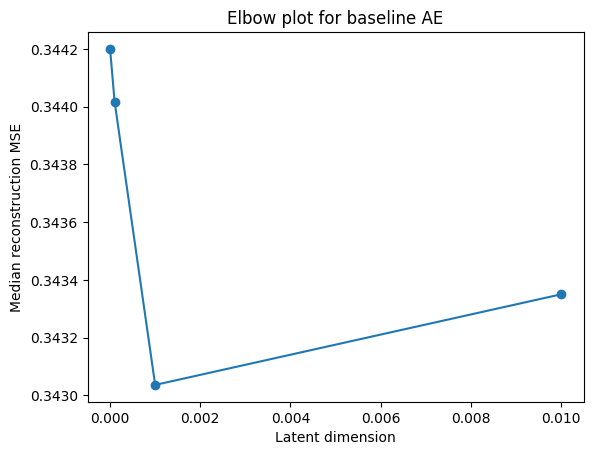

In [ ]:
soft_results_lambda_r_none = soft_results_lambda_r[(soft_results_lambda_r['dataset']).isna()]

plt.plot(soft_results_lambda_r_none['lambda_r'], soft_results_lambda_r_none['sample_median'], marker='o')
plt.xlabel("Lambda")
plt.ylabel("Median reconstruction MSE")
plt.title("Elbow plot for baseline AE")

Text(0.5, 1.0, 'Generalization across disease domains')

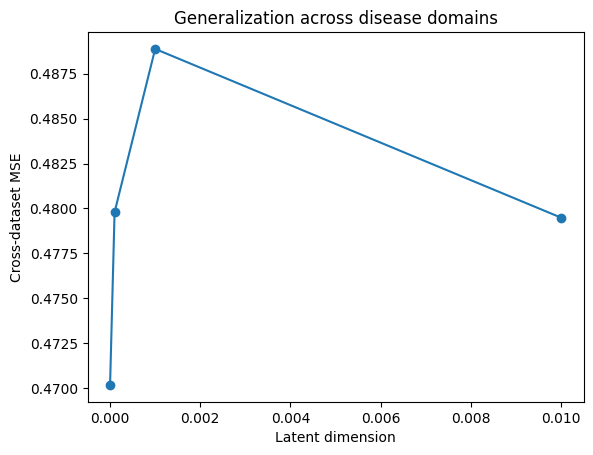

In [ ]:
soft_results_lambda_r_t2d = soft_results_lambda_r[soft_results_lambda_r['dataset']=="T2D"]

plt.plot(soft_results_lambda_r_t2d['lambda_r'], soft_results_lambda_r_t2d['cross_mean'], marker='o')
plt.xlabel("Lambda")
plt.ylabel("Cross-dataset MSE")
plt.title("Generalization across disease domains")

Text(0.5, 1.0, 'Generalization across disease domains')

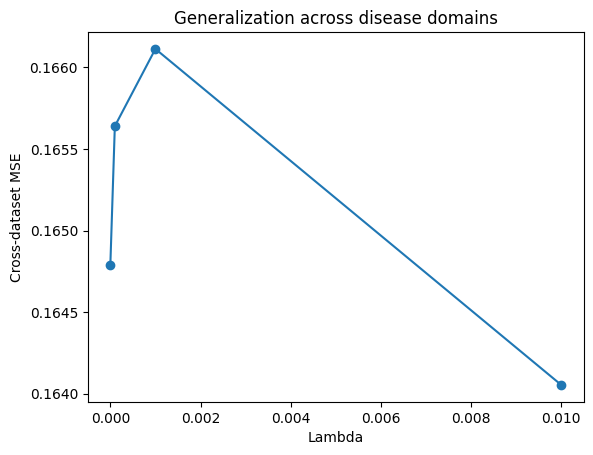

In [ ]:
soft_results_lambda_r_ad = soft_results_lambda_r[soft_results_lambda_r['dataset']=="AD"]

plt.plot(soft_results_lambda_r_ad['lambda_r'], soft_results_lambda_r_ad['cross_mean'], marker='o')
plt.xlabel("Lambda")
plt.ylabel("Cross-dataset MSE")
plt.title("Generalization across disease domains")

Text(0.5, 1.0, 'Stability under input perturbation')

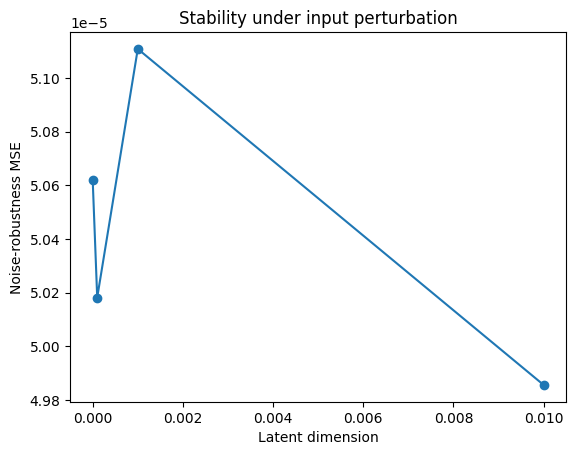

In [ ]:
plt.plot(soft_results_lambda_r_none['lambda_r'], soft_results_lambda_r_none['robustness'], marker='o')
plt.xlabel("Lambda")
plt.ylabel("Noise-robustness MSE")
plt.title("Stability under input perturbation")

In [ ]:
soft_results_lambda_r_heatmap = soft_results_lambda_r.pivot(
    index='lambda_r',
    columns='dataset',
    values='sample_mean'
)

In [ ]:
print(soft_results_lambda_r_heatmap)

dataset        NaN        AD       T2D
lambda_r                              
0.0000    0.606644  0.608331  0.605002
0.0001    0.605254  0.606160  0.609566
0.0010    0.604134  0.603976  0.606100
0.0100    0.602765  0.605444  0.605928


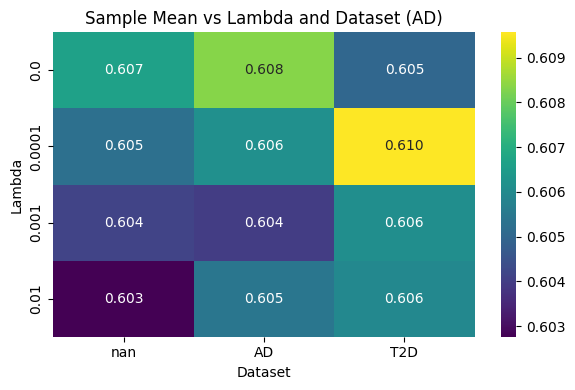

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6,4))
sns.heatmap(
    soft_results_lambda_r_heatmap,
    annot=True,
    fmt=".3f",
    cmap="viridis"  # or "magma", "coolwarm"
)
plt.title("Sample Mean vs Lambda and Dataset (AD)")
plt.xlabel("Dataset")
plt.ylabel("Lambda")
plt.tight_layout()
plt.show()

Lambda = 0.01 gives lowest median/mean MSE, but worst generalization, but best overall balance

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_all_results(df, label):
    """
    df: dataframe with columns:
        ['latent_dim', 'dataset', 'sample_median', 'sample_mean',
         'cross_mean', 'robustness']
    label: string to use in plot titles (e.g., "Soft Mask AE")
    """
    print(df)
    # Filter subsets
    df_none = df[df['dataset'].isna()]
    df_ad   = df[df['dataset'] == "AD"]
    df_t2d  = df[df['dataset'] == "T2D"]

    # Reconstruction on training domain
    if not df_none.empty:
        plt.figure()
        plt.plot(df_none['latent_dim'], df_none['sample_median'], marker='o')
        plt.xlabel("Latent dimension")
        plt.ylabel("Median reconstruction MSE")
        plt.title(f"{label} — Elbow (training domain)")
        plt.tight_layout()
        plt.show()

    # Cross-dataset generalization (AD)
    if not df_ad.empty:
        plt.figure()
        plt.plot(df_ad['latent_dim'], df_ad['cross_mean'], marker='o')
        plt.xlabel("Latent dimension")
        plt.ylabel("Cross-dataset MSE")
        plt.title(f"{label} — Generalization (AD)")
        plt.tight_layout()
        plt.show()

    # Cross-dataset generalization (T2D)
    if not df_t2d.empty:
        plt.figure()
        plt.plot(df_t2d['latent_dim'], df_t2d['cross_mean'], marker='o')
        plt.xlabel("Latent dimension")
        plt.ylabel("Cross-dataset MSE")
        plt.title(f"{label} — Generalization (T2D)")
        plt.tight_layout()
        plt.show()

    # Robustness vs Latent Dim
    if not df_none.empty:
        plt.figure()
        plt.plot(df_none['latent_dim'], df_none['robustness'], marker='o')
        plt.xlabel("Latent dimension")
        plt.ylabel("Noise-robustness MSE")
        plt.title(f"{label} — Stability under noise")
        plt.tight_layout()
        plt.show()

    # Pivot heatmap
    heatmap_df = df.pivot(
        index='latent_dim',
        columns='dataset',
        values='sample_mean'
    )

    print(heatmap_df)

    plt.figure(figsize=(6,4))
    sns.heatmap(
        heatmap_df,
        annot=True,
        fmt=".3f",
        cmap="viridis"
    )
    plt.title(f"{label} — Sample Mean Heatmap")
    plt.xlabel("Dataset")
    plt.ylabel("Latent Dim")
    plt.tight_layout()
    plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_all_results_general(df, label, x_col):
    """
    Generalized plotting function.

    Parameters
    ----------
    df : pandas.DataFrame
        Must contain columns:
        ['dataset', 'sample_median', 'sample_mean', 'cross_mean', 'robustness']
        and one hyperparameter column (x_col).
    label : str
        Title label for plots ("Soft AE", "Hard AE", etc.)
    x_col : str
        Column name to plot on the x-axis, e.g.:
        "latent_dim", "lr", "lambda_reg"
    """

    print(f"Plotting with x = {x_col}")
    print(df)

    # Split subsets
    df_none = df[df['dataset'].isna()]
    df_ad   = df[df['dataset'] == "AD"].dropna(subset=['cross_mean']) # Filter out None values
    df_t2d  = df[df['dataset'] == "T2D"].dropna(subset=['cross_mean']) # Filter out None values

    # Reconstruction on training domain
    if not df_none.empty:
        plt.figure()
        plt.plot(df_none[x_col], df_none['sample_median'], marker='o')
        plt.xlabel(x_col)
        plt.ylabel("Median reconstruction MSE")
        plt.title(f"{label} — Elbow (training domain)")
        plt.tight_layout()
        plt.show()

    # # Cross-dataset generalization (AD)
    if not df_ad.empty:
        plt.figure()
        plt.plot(df_ad[x_col], df_ad['cross_mean'], marker='o')
        plt.xlabel(x_col)
        plt.ylabel("Cross-dataset MSE")
        plt.title(f"{label} — Generalization (AD)")
        plt.tight_layout()
        plt.show()

    # Cross-dataset generalization (T2D)
    if not df_t2d.empty:
        plt.figure()
        plt.plot(df_t2d[x_col], df_t2d['cross_mean'], marker='o')
        plt.xlabel(x_col)
        plt.ylabel("Cross-dataset MSE")
        plt.title(f"{label} — Generalization (T2D)")
        plt.tight_layout()
        plt.show()

    # Stability under noise
    if not df_none.empty:
        plt.figure()
        plt.plot(df_none[x_col], df_none['robustness'], marker='o')
        plt.xlabel(x_col)
        plt.ylabel("Noise-robustness MSE")
        plt.title(f"{label} — Stability under noise")
        plt.tight_layout()
        plt.show()

    # Heatmap
    heatmap_df = df.pivot(
        index=x_col,
        columns='dataset',
        values='sample_mean'
    )

    print(heatmap_df)

    plt.figure(figsize=(6,4))
    sns.heatmap(
        heatmap_df,
        annot=True,
        fmt=".3f",
        cmap="viridis"
    )
    plt.title(f"{label} — Sample Mean Heatmap")
    plt.xlabel("Dataset")
    plt.ylabel(x_col)
    plt.tight_layout()
    plt.show()

    latent_dim dataset  sample_mean  sample_median  robustness  cross_mean
0           16      AD     0.663167       0.355931    0.000051    0.243387
1           32      AD     0.620151       0.347182    0.000057    0.189844
2           64      AD     0.607108       0.345523    0.000051    0.168091
3          128      AD     0.598114       0.335309    0.000041    0.179400
4           16     T2D     0.668135       0.359307    0.000051    0.600872
5           32     T2D     0.621802       0.348538    0.000057    0.508592
6           64     T2D     0.605188       0.343022    0.000049    0.473455
7          128     T2D     0.596196       0.336397    0.000042    0.525481
8           16     NaN     0.671837       0.356557    0.000051         NaN
9           32     NaN     0.623560       0.349271    0.000056         NaN
10          64     NaN     0.610443       0.347398    0.000050         NaN
11         128     NaN     0.598215       0.333620    0.000040         NaN


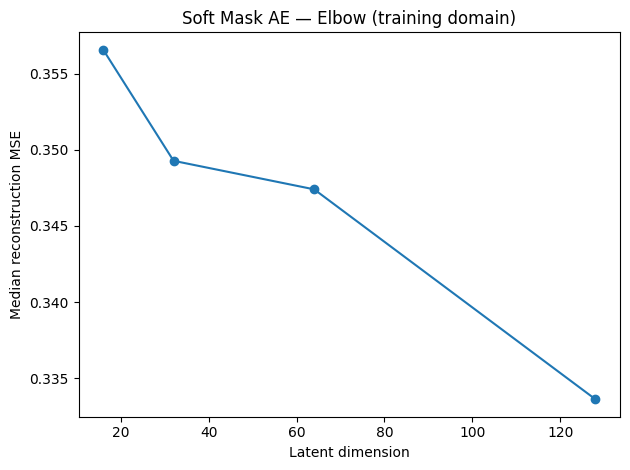

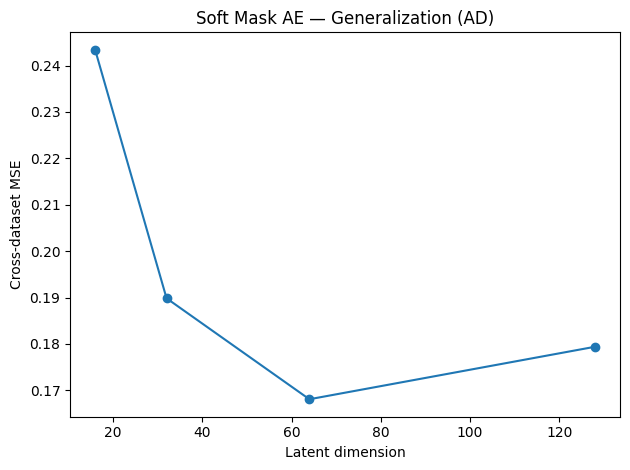

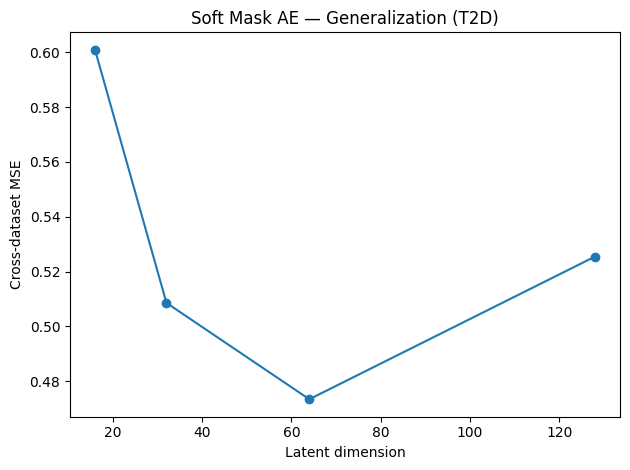

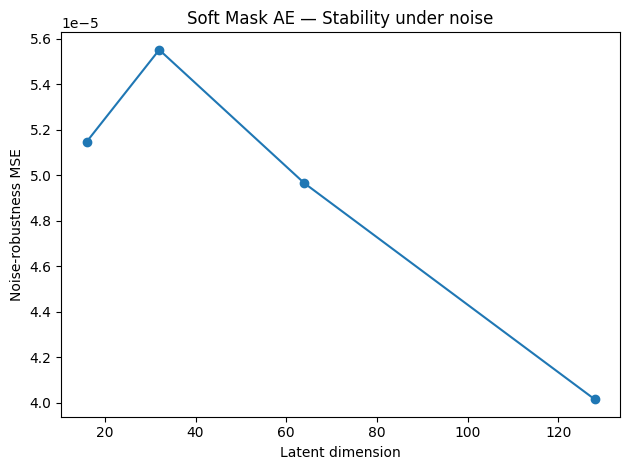

dataset          NaN        AD       T2D
latent_dim                              
16          0.671837  0.663167  0.668135
32          0.623560  0.620151  0.621802
64          0.610443  0.607108  0.605188
128         0.598215  0.598114  0.596196


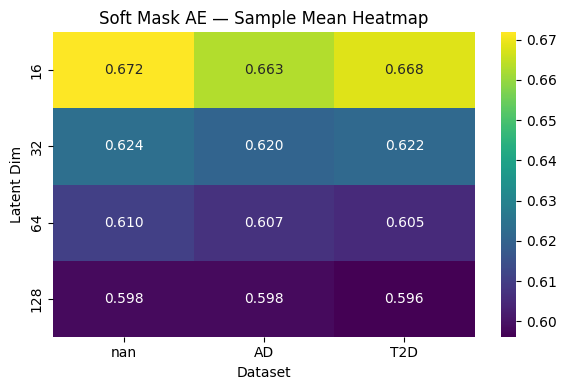

In [ ]:
plot_all_results(soft_results_dim, label="Soft Mask AE")

64 is the most stable

    latent_dim dataset  sample_mean  sample_median  robustness  cross_mean
0           16      AD     0.667710       0.359137    0.000052    0.242776
1           32      AD     0.620330       0.347779    0.000056    0.190016
2           64      AD     0.605266       0.345843    0.000050    0.165203
3          128      AD     0.598456       0.333729    0.000042    0.177867
4           16     T2D     0.669734       0.360158    0.000050    0.593474
5           32     T2D     0.617189       0.346625    0.000056    0.493644
6           64     T2D     0.603781       0.345291    0.000050    0.463417
7          128     T2D     0.593991       0.334713    0.000040    0.535201
8           16     NaN     0.662320       0.354608    0.000051         NaN
9           32     NaN     0.623129       0.349500    0.000057         NaN
10          64     NaN     0.602706       0.344222    0.000051         NaN
11         128     NaN     0.598609       0.335606    0.000042         NaN


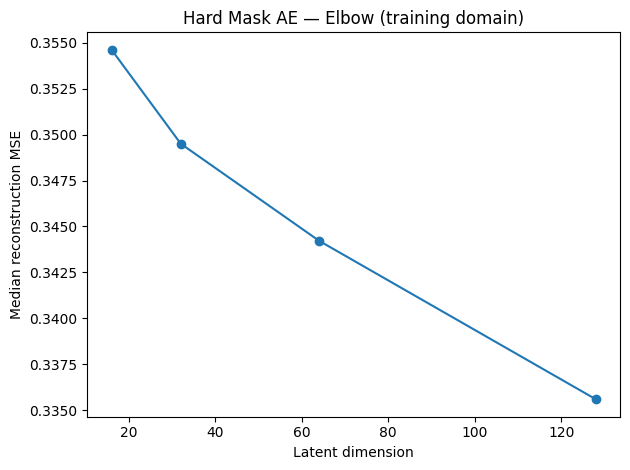

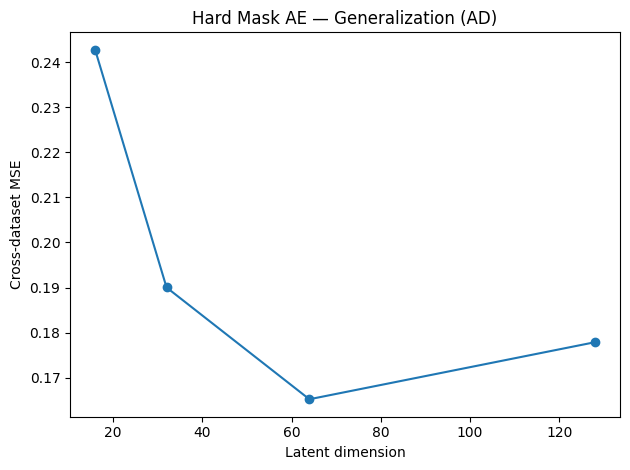

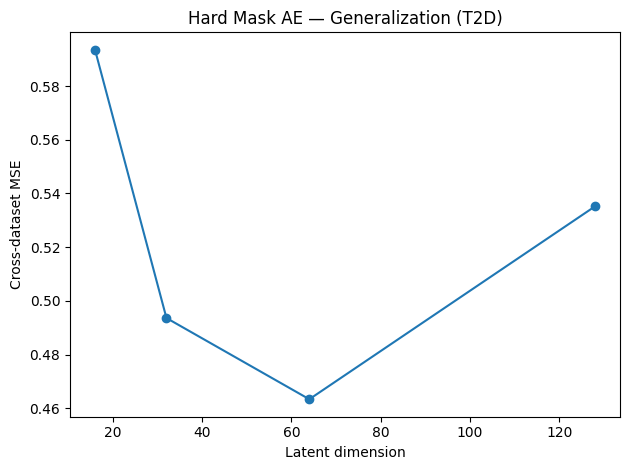

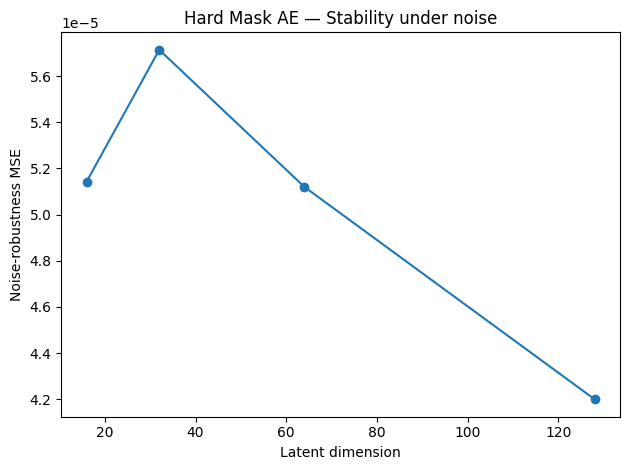

dataset          NaN        AD       T2D
latent_dim                              
16          0.662320  0.667710  0.669734
32          0.623129  0.620330  0.617189
64          0.602706  0.605266  0.603781
128         0.598609  0.598456  0.593991


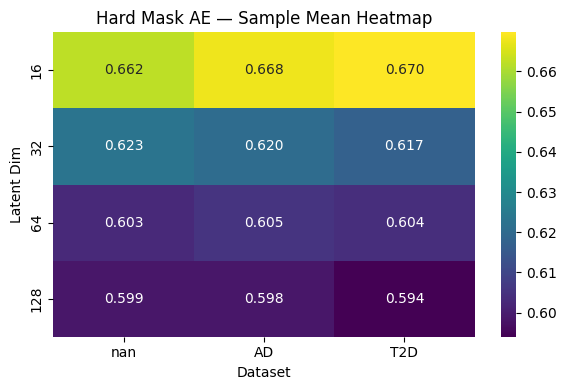

In [ ]:
plot_all_results(hard_results,     label="Hard Mask AE")

64 is the best.

    latent_dim dataset  sample_mean  sample_median  robustness  cross_mean
0           16      AD     0.669022       0.358790    0.000050    0.242300
1           32      AD     0.621401       0.348276    0.000056    0.188031
2           64      AD     0.608192       0.348194    0.000050    0.167074
3          128      AD     0.598006       0.332522    0.000041    0.178703
4           16     T2D     0.669783       0.358788    0.000052    0.595795
5           32     T2D     0.620933       0.348099    0.000056    0.516745
6           64     T2D     0.606433       0.341831    0.000050    0.474307
7          128     T2D     0.597081       0.335242    0.000040    0.544294
8           16     NaN     0.666960       0.357522    0.000052         NaN
9           32     NaN     0.619754       0.348597    0.000057         NaN
10          64     NaN     0.606317       0.347678    0.000051         NaN
11         128     NaN     0.599720       0.334024    0.000040         NaN


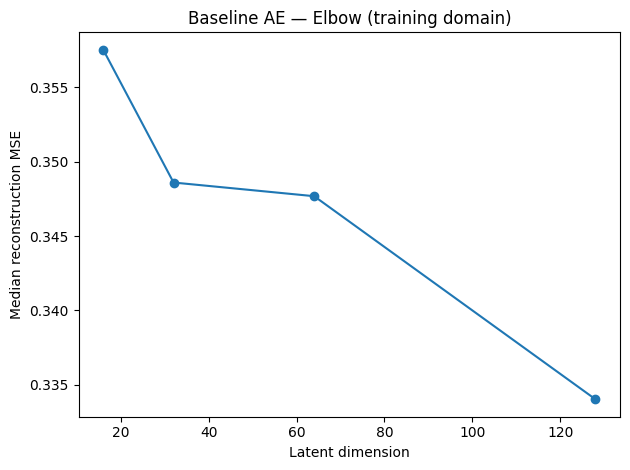

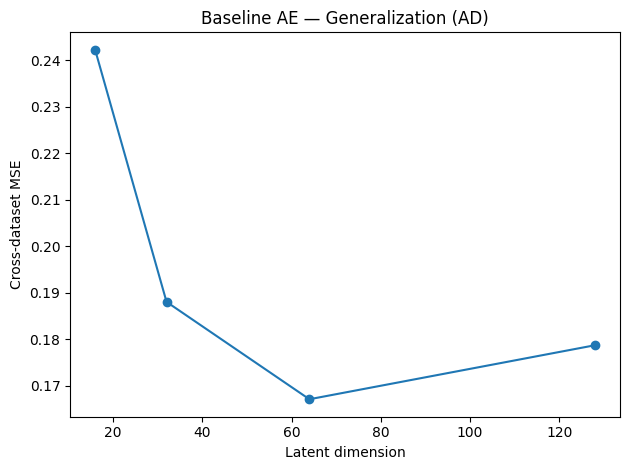

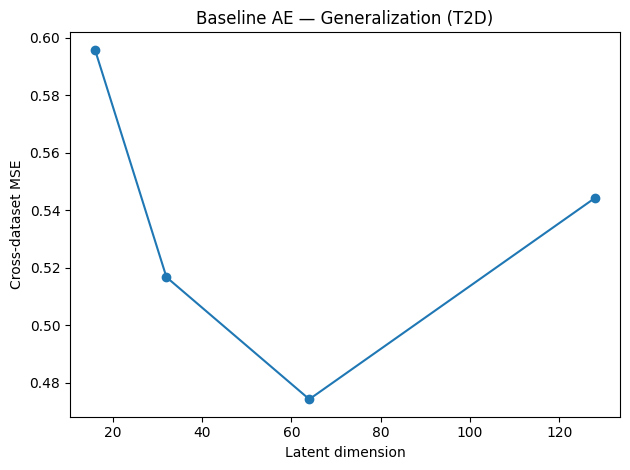

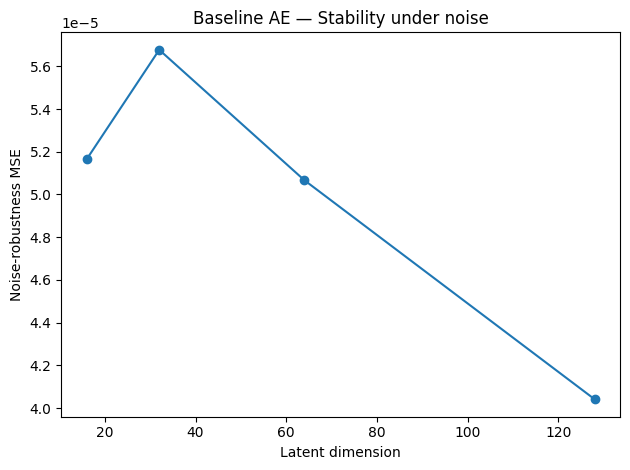

dataset          NaN        AD       T2D
latent_dim                              
16          0.666960  0.669022  0.669783
32          0.619754  0.621401  0.620933
64          0.606317  0.608192  0.606433
128         0.599720  0.598006  0.597081


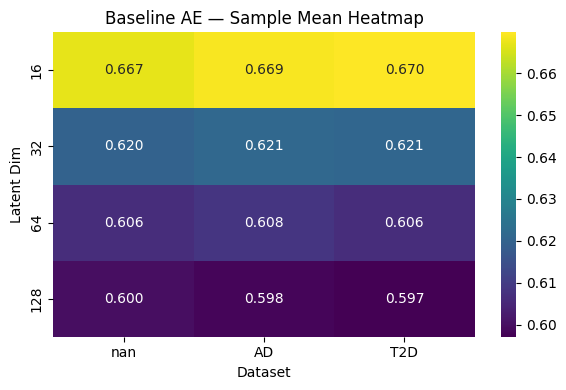

In [ ]:
plot_all_results(baseline_results, label="Baseline AE")

64 is the best

In [ ]:
soft_results_dim['model_type'] = "soft"
hard_results["model_type"] = "hard"
baseline_results['model_type'] = "baseline"

In [ ]:
df_all = pd.concat([baseline_results, hard_results, soft_results_dim], ignore_index=True)

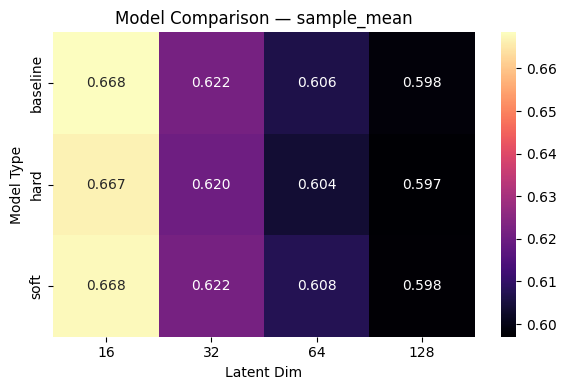

In [ ]:
heatmap_data = df_all.pivot_table(
    index="model_type",
    columns="latent_dim",
    values="sample_mean",
    aggfunc = "mean"
)

plt.figure(figsize=(6,4))
sns.heatmap(
    heatmap_data,
    annot=True,
    fmt=".3f",
    cmap="magma"
)
plt.title("Model Comparison — sample_mean")
plt.ylabel("Model Type")
plt.xlabel("Latent Dim")
plt.tight_layout()
plt.show()

In [ ]:
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

learning_rates = [1e-4,5e-4,1e-3]
X_other_datasets = [X_ad_scaled, X_t2d_scaled, None]

baseline_results = {}
mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)
for X_other in X_other_datasets:
    for lr in learning_rates:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_all_scaled,
          input_dim=input_dim,
          latent_dim=64,
          hidden_dims=hidden_dims,
          X_other=X_other,
          mask=mask_none,
          lr=lr,
          soft_mask=False,
          lambda_reg=None
      )
      dataset_name = "AD" if X_other is X_ad_scaled else "T2D" if X_other is X_t2d_scaled else "None"

      baseline_results[(lr, dataset_name)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()


Epoch 1/60 train_loss=1.021560
Epoch 10/60 train_loss=0.737880
Epoch 20/60 train_loss=0.608949
Epoch 30/60 train_loss=0.550497
Epoch 40/60 train_loss=0.496991
Epoch 50/60 train_loss=0.460617
Epoch 60/60 train_loss=0.432074
Epoch 1/60 train_loss=1.017289
Epoch 10/60 train_loss=0.731817
Epoch 20/60 train_loss=0.600185
Epoch 30/60 train_loss=0.543161
Epoch 40/60 train_loss=0.495908
Epoch 50/60 train_loss=0.457777
Epoch 60/60 train_loss=0.427667
Epoch 1/60 train_loss=0.977623
Epoch 10/60 train_loss=0.700064
Epoch 20/60 train_loss=0.577708
Epoch 30/60 train_loss=0.518129
Epoch 40/60 train_loss=0.470637
Epoch 50/60 train_loss=0.435250
Epoch 60/60 train_loss=0.406767
Epoch 1/60 train_loss=1.002842
Epoch 10/60 train_loss=0.719791
Epoch 20/60 train_loss=0.591119
Epoch 30/60 train_loss=0.535236
Epoch 40/60 train_loss=0.492554
Epoch 50/60 train_loss=0.461637
Epoch 60/60 train_loss=0.431299
Epoch 1/60 train_loss=0.997115
Epoch 10/60 train_loss=0.724211
Epoch 20/60 train_loss=0.597305
Epoch 30/60 t

In [ ]:
rows = []

for (lr, dataset_name), result in baseline_results.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        'dataset': dataset_name,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/baseline_lr.csv', index=False)

       lr dataset  sample_mean  sample_median  robustness  cross_mean
0  0.0001      AD     0.572549       0.340019    0.000057    0.311689
1  0.0005      AD     0.576185       0.307395    0.000064    0.213303
2  0.0010      AD     0.604862       0.344132    0.000051    0.161882
3  0.0001     T2D     0.572869       0.341651    0.000056    1.257634
4  0.0005     T2D     0.571031       0.306950    0.000063    0.459661
5  0.0010     T2D     0.605753       0.342106    0.000051    0.479401
6  0.0001    None     0.572819       0.343612    0.000056         NaN
7  0.0005    None     0.575498       0.306644    0.000064         NaN
8  0.0010    None     0.601652       0.344339    0.000051         NaN


In [ ]:
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

learning_rates = [1e-4,5e-4,1e-3]
X_other_datasets = [X_ad_scaled, X_t2d_scaled, None]

hard_results = {}

for X_other in X_other_datasets:
    for lr in learning_rates:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_all_scaled,
          input_dim=input_dim,
          latent_dim=latent_dim,
          hidden_dims=hidden_dims,
          X_other=X_other,
          mask=pathway_mask,
          lr=lr,
          soft_mask=False,
          lambda_reg=None
      )
      dataset_name = "AD" if X_other is X_ad_scaled else "T2D" if X_other is X_t2d_scaled else "None"

      hard_results[(lr, dataset_name)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()


Epoch 1/60 train_loss=1.013729
Epoch 10/60 train_loss=0.743218
Epoch 20/60 train_loss=0.608877
Epoch 30/60 train_loss=0.550942
Epoch 40/60 train_loss=0.504225
Epoch 50/60 train_loss=0.464878
Epoch 60/60 train_loss=0.438257
Epoch 1/60 train_loss=1.004014
Epoch 10/60 train_loss=0.726746
Epoch 20/60 train_loss=0.594499
Epoch 30/60 train_loss=0.535963
Epoch 40/60 train_loss=0.486234
Epoch 50/60 train_loss=0.452366
Epoch 60/60 train_loss=0.418460
Epoch 1/60 train_loss=0.991209
Epoch 10/60 train_loss=0.705993
Epoch 20/60 train_loss=0.583360
Epoch 30/60 train_loss=0.525225
Epoch 40/60 train_loss=0.480199
Epoch 50/60 train_loss=0.444265
Epoch 60/60 train_loss=0.415782
Epoch 1/60 train_loss=1.029310
Epoch 10/60 train_loss=0.742185
Epoch 20/60 train_loss=0.610320
Epoch 30/60 train_loss=0.560126
Epoch 40/60 train_loss=0.510334
Epoch 50/60 train_loss=0.476809
Epoch 60/60 train_loss=0.446176
Epoch 1/60 train_loss=0.976929
Epoch 10/60 train_loss=0.682451
Epoch 20/60 train_loss=0.566444
Epoch 30/60 t

In [ ]:
rows = []

for (lr, dataset_name), result in hard_results.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        'dataset': dataset_name,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/hard_lr.csv', index=False)

       lr dataset  sample_mean  sample_median  robustness  cross_mean
0  0.0001      AD     0.580791       0.341563    0.000056    0.311922
1  0.0005      AD     0.577540       0.309927    0.000064    0.212685
2  0.0010      AD     0.607765       0.344985    0.000050    0.164537
3  0.0001     T2D     0.574285       0.342900    0.000054    1.252775
4  0.0005     T2D     0.573298       0.309734    0.000062    0.460706
5  0.0010     T2D     0.607407       0.343962    0.000052    0.488886
6  0.0001    None     0.579700       0.344505    0.000056         NaN
7  0.0005    None     0.574261       0.309787    0.000063         NaN
8  0.0010    None     0.605355       0.343750    0.000050         NaN


In [ ]:
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

learning_rates = [1e-4,5e-4,1e-3]
X_other_datasets = [X_ad_scaled, X_t2d_scaled, None]

soft_results = {}

for X_other in X_other_datasets:
    for lr in learning_rates:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_all_scaled,
          input_dim=input_dim,
          latent_dim=latent_dim,
          hidden_dims=hidden_dims,
          X_other=X_other,
          mask=pathway_mask,
          lr=lr,
          soft_mask=True,
          lambda_reg=1e-2
      )
      dataset_name = "AD" if X_other is X_ad_scaled else "T2D" if X_other is X_t2d_scaled else "None"

      soft_results[(lr, dataset_name)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()


Epoch 1/60 train_loss=0.978531
Epoch 10/60 train_loss=0.711073
Epoch 20/60 train_loss=0.581859
Epoch 30/60 train_loss=0.516692
Epoch 40/60 train_loss=0.472234
Epoch 50/60 train_loss=0.437214
Epoch 60/60 train_loss=0.411824
Epoch 1/60 train_loss=0.980626
Epoch 10/60 train_loss=0.698917
Epoch 20/60 train_loss=0.580174
Epoch 30/60 train_loss=0.526906
Epoch 40/60 train_loss=0.481579
Epoch 50/60 train_loss=0.446596
Epoch 60/60 train_loss=0.416521
Epoch 1/60 train_loss=1.016137
Epoch 10/60 train_loss=0.724779
Epoch 20/60 train_loss=0.605276
Epoch 30/60 train_loss=0.543291
Epoch 40/60 train_loss=0.498721
Epoch 50/60 train_loss=0.461401
Epoch 60/60 train_loss=0.431301
Epoch 1/60 train_loss=1.042303
Epoch 10/60 train_loss=0.759116
Epoch 20/60 train_loss=0.627049
Epoch 30/60 train_loss=0.565595
Epoch 40/60 train_loss=0.518517
Epoch 50/60 train_loss=0.484783
Epoch 60/60 train_loss=0.454800
Epoch 1/60 train_loss=0.998398
Epoch 10/60 train_loss=0.716650
Epoch 20/60 train_loss=0.585894
Epoch 30/60 t

In [ ]:
rows = []

for (lr, dataset_name), result in soft_results.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        'dataset': dataset_name,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/soft_lr.csv', index=False)

       lr dataset  sample_mean  sample_median  robustness  cross_mean
0  0.0001      AD     0.572677       0.340456    0.000055    0.311716
1  0.0005      AD     0.576103       0.306162    0.000063    0.212932
2  0.0010      AD     0.601429       0.341866    0.000051    0.163777
3  0.0001     T2D     0.574734       0.342594    0.000056    1.254283
4  0.0005     T2D     0.574526       0.304990    0.000063    0.461982
5  0.0010     T2D     0.610981       0.346403    0.000050    0.518224
6  0.0001    None     0.576014       0.343758    0.000056         NaN
7  0.0005    None     0.574066       0.306355    0.000065         NaN
8  0.0010    None     0.602419       0.344471    0.000053         NaN


In [ ]:
soft_results_lr = pd.read_csv('/content/drive/MyDrive/67960_final_proj/soft_lr.csv')
hard_results_lr = pd.read_csv('/content/drive/MyDrive/67960_final_proj/hard_lr.csv')
baseline_results_lr = pd.read_csv('/content/drive/MyDrive/67960_final_proj/baseline_lr.csv')

Plotting with x = lr
       lr dataset  sample_mean  sample_median  robustness  cross_mean
0  0.0001      AD     0.572677       0.340456    0.000055    0.311716
1  0.0005      AD     0.576103       0.306162    0.000063    0.212932
2  0.0010      AD     0.601429       0.341866    0.000051    0.163777
3  0.0001     T2D     0.574734       0.342594    0.000056    1.254283
4  0.0005     T2D     0.574526       0.304990    0.000063    0.461982
5  0.0010     T2D     0.610981       0.346403    0.000050    0.518224
6  0.0001     NaN     0.576014       0.343758    0.000056         NaN
7  0.0005     NaN     0.574066       0.306355    0.000065         NaN
8  0.0010     NaN     0.602419       0.344471    0.000053         NaN


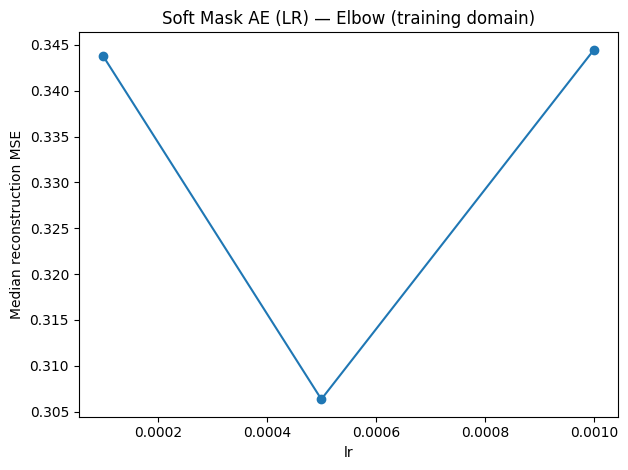

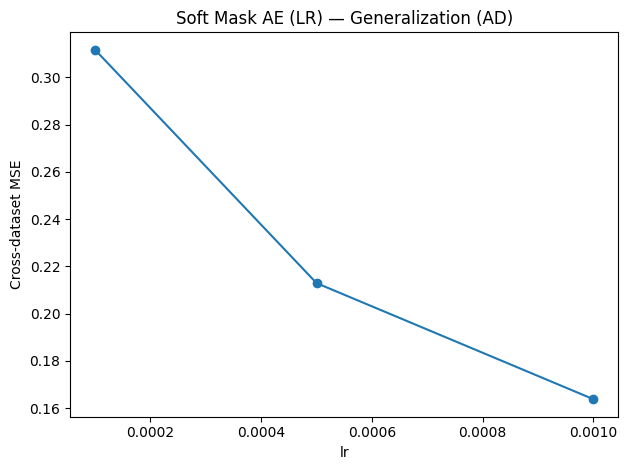

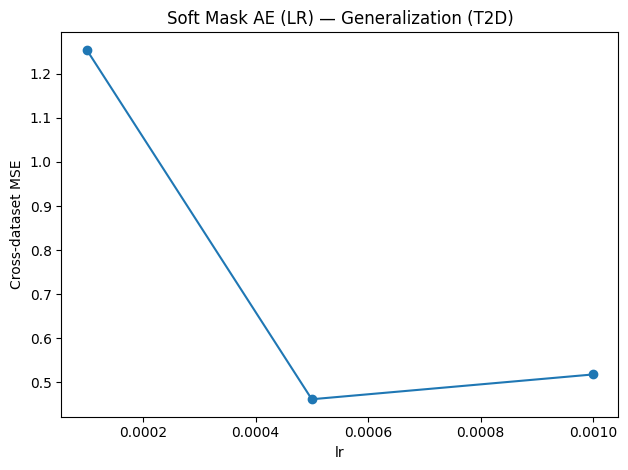

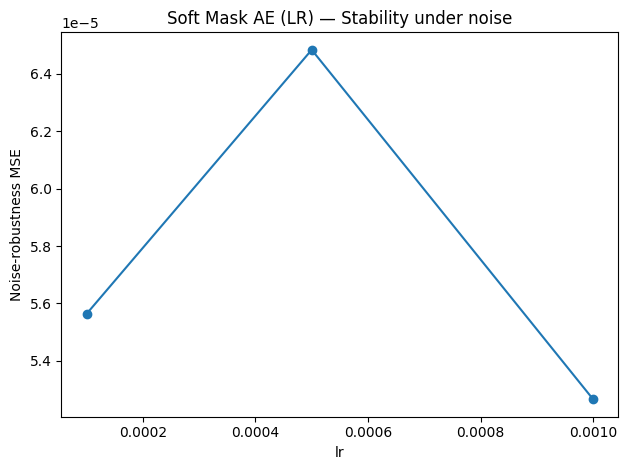

dataset       NaN        AD       T2D
lr                                   
0.0001   0.576014  0.572677  0.574734
0.0005   0.574066  0.576103  0.574526
0.0010   0.602419  0.601429  0.610981


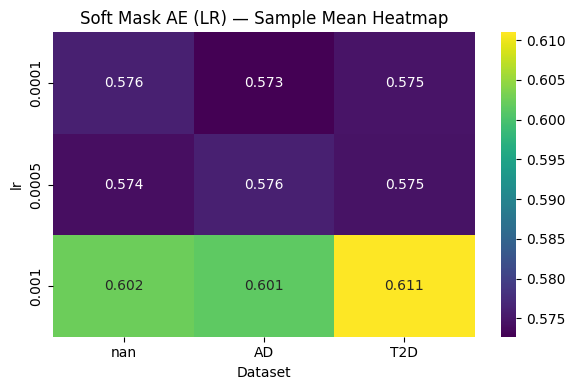

In [ ]:
plot_all_results_general(soft_results_lr, label="Soft Mask AE (LR)", x_col="lr")

Plotting with x = lr
       lr dataset  sample_mean  sample_median  robustness  cross_mean
0  0.0001      AD     0.580791       0.341563    0.000056    0.311922
1  0.0005      AD     0.577540       0.309927    0.000064    0.212685
2  0.0010      AD     0.607765       0.344985    0.000050    0.164537
3  0.0001     T2D     0.574285       0.342900    0.000054    1.252775
4  0.0005     T2D     0.573298       0.309734    0.000062    0.460706
5  0.0010     T2D     0.607407       0.343962    0.000052    0.488886
6  0.0001     NaN     0.579700       0.344505    0.000056         NaN
7  0.0005     NaN     0.574261       0.309787    0.000063         NaN
8  0.0010     NaN     0.605355       0.343750    0.000050         NaN


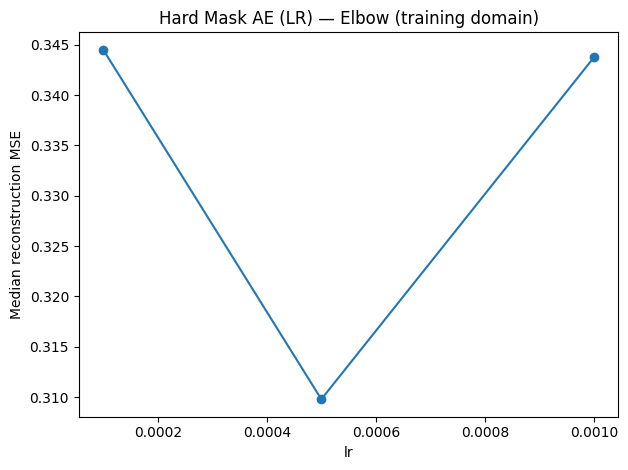

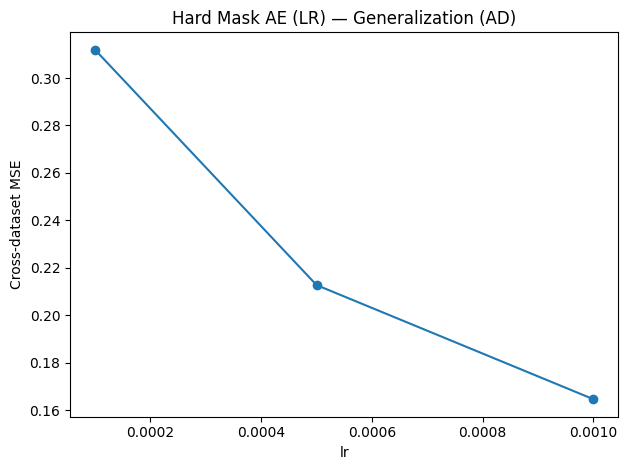

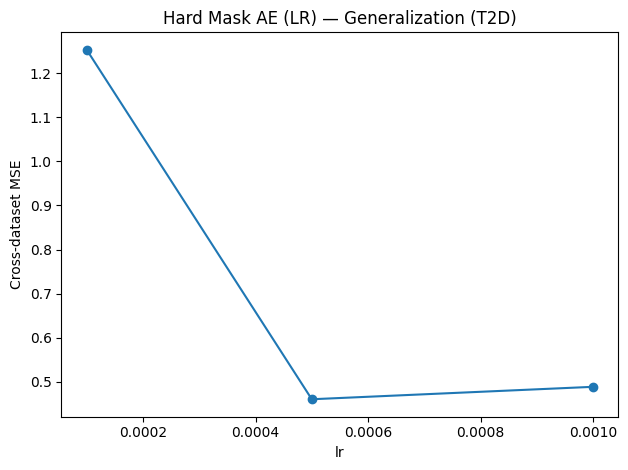

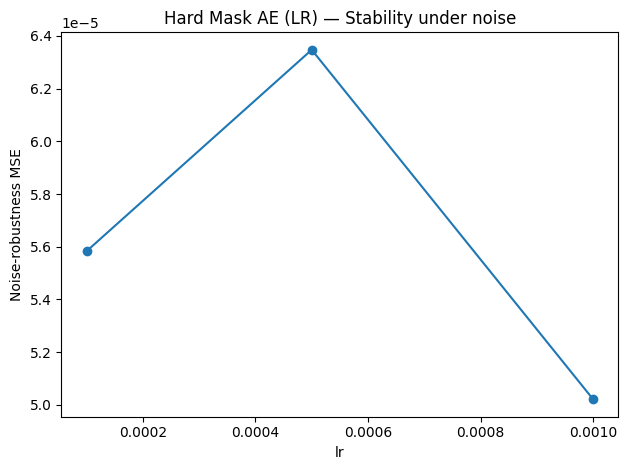

dataset       NaN        AD       T2D
lr                                   
0.0001   0.579700  0.580791  0.574285
0.0005   0.574261  0.577540  0.573298
0.0010   0.605355  0.607765  0.607407


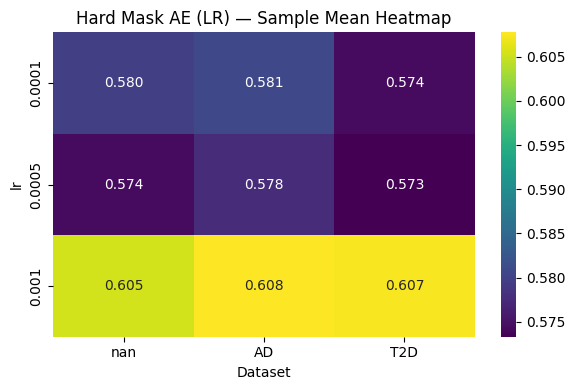

In [ ]:
plot_all_results_general(hard_results_lr, label="Hard Mask AE (LR)", x_col="lr")

Plotting with x = lr
       lr dataset  sample_mean  sample_median  robustness  cross_mean
0  0.0001      AD     0.572549       0.340019    0.000057    0.311689
1  0.0005      AD     0.576185       0.307395    0.000064    0.213303
2  0.0010      AD     0.604862       0.344132    0.000051    0.161882
3  0.0001     T2D     0.572870       0.341651    0.000056    1.257634
4  0.0005     T2D     0.571031       0.306950    0.000063    0.459661
5  0.0010     T2D     0.605753       0.342106    0.000051    0.479401
6  0.0001     NaN     0.572819       0.343612    0.000056         NaN
7  0.0005     NaN     0.575498       0.306644    0.000064         NaN
8  0.0010     NaN     0.601652       0.344339    0.000051         NaN


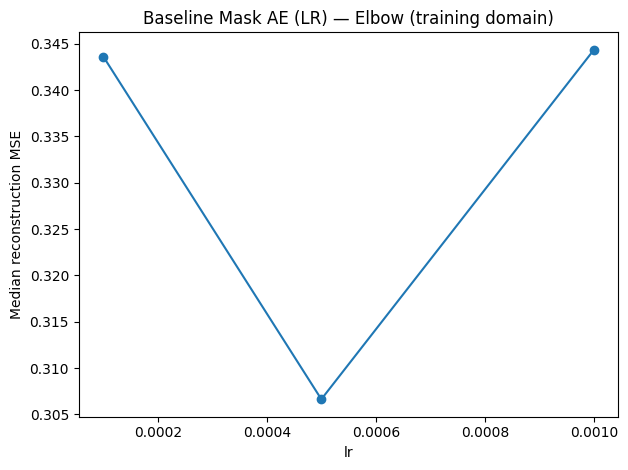

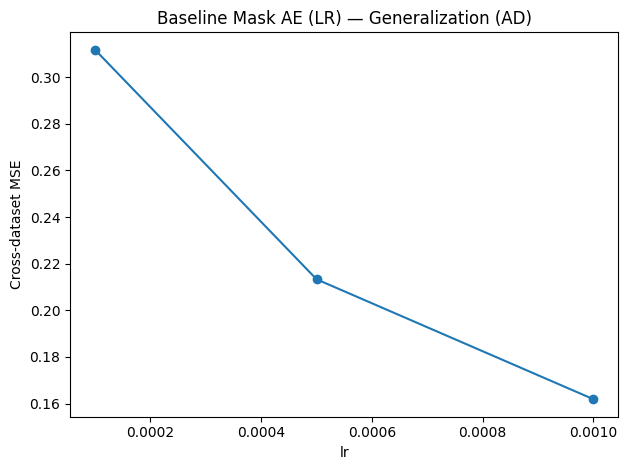

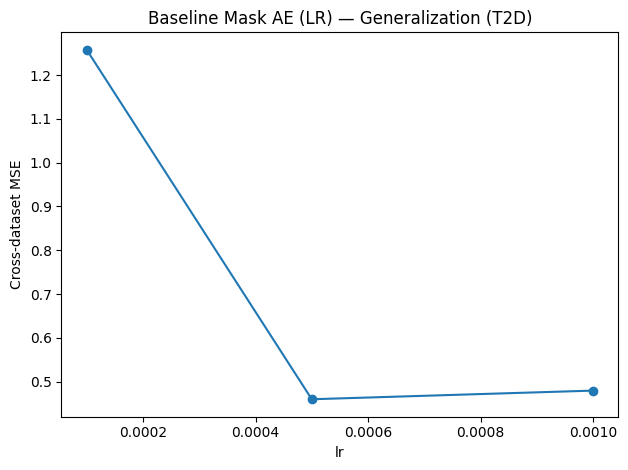

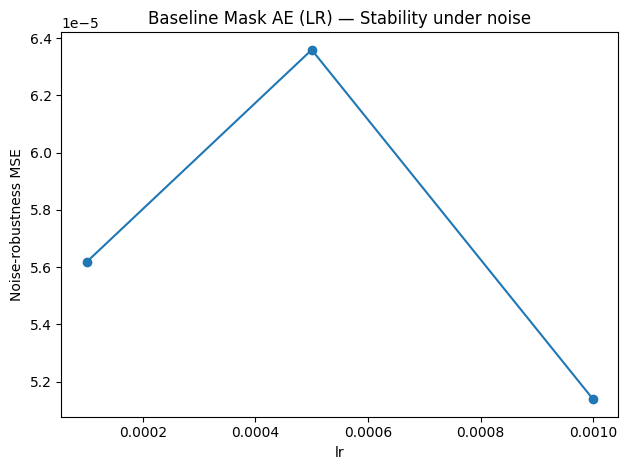

dataset       NaN        AD       T2D
lr                                   
0.0001   0.572819  0.572549  0.572870
0.0005   0.575498  0.576185  0.571031
0.0010   0.601652  0.604862  0.605753


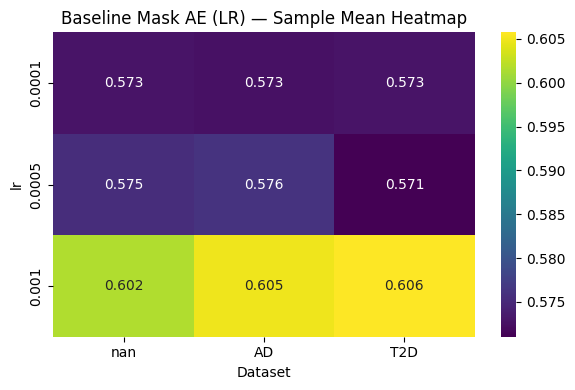

In [ ]:
plot_all_results_general(baseline_results_lr, label="Baseline Mask AE (LR)", x_col="lr")

AD-only & T2D-only (baseline/hard/soft) - lr investigation

In [ ]:
lr_grid = [1e-4, 5e-4, 1e-3]
latent_grid = [32, 64]
n_folds = 4
seeds = [0]
epochs = 30


In [ ]:
# ad-specific hard-masked ae
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]

learning_rates = [1e-4,5e-4,1e-3]
latent_grid = [32, 64]

baseline_results_ad_spec = {}
mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)

for latent_dim in latent_grid:
    for lr in learning_rates:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_ad_scaled,
          input_dim=input_dim,
          latent_dim=latent_dim,
          hidden_dims=hidden_dims,
          X_other=X_t2d_scaled,
          mask=mask_none,
          epochs=epochs,
          seeds=seeds,
          lr=lr,
          soft_mask=False,
          lambda_reg=None
      )

      baseline_results_ad_spec[(lr, latent_dim)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()

Epoch 1/30 train_loss=0.720985
Epoch 10/30 train_loss=0.482600
Epoch 20/30 train_loss=0.412656
Epoch 30/30 train_loss=0.385436
Epoch 1/30 train_loss=0.722452
Epoch 10/30 train_loss=0.483649
Epoch 20/30 train_loss=0.411344
Epoch 30/30 train_loss=0.379952
Epoch 1/30 train_loss=0.725561
Epoch 10/30 train_loss=0.482027
Epoch 20/30 train_loss=0.400789
Epoch 30/30 train_loss=0.378562
Epoch 1/30 train_loss=0.743028
Epoch 10/30 train_loss=0.485879
Epoch 20/30 train_loss=0.413213
Epoch 30/30 train_loss=0.383603
Epoch 1/30 train_loss=0.735583
Epoch 10/30 train_loss=0.489814
Epoch 20/30 train_loss=0.410832
Epoch 30/30 train_loss=0.381495
Epoch 1/30 train_loss=0.752596
Epoch 10/30 train_loss=0.401313
Epoch 20/30 train_loss=0.296694
Epoch 30/30 train_loss=0.250980
Epoch 1/30 train_loss=0.745131
Epoch 10/30 train_loss=0.399260
Epoch 20/30 train_loss=0.305697
Epoch 30/30 train_loss=0.262146
Epoch 1/30 train_loss=0.754137
Epoch 10/30 train_loss=0.392840
Epoch 20/30 train_loss=0.299026
Epoch 30/30 trai

In [ ]:
# t2d-specific baseline ae

input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]

learning_rates = [1e-4,5e-4,1e-3]
latent_grid = [32, 64]

baseline_results_t2d_spec = {}
mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)

for latent_dim in latent_grid:
    for lr in learning_rates:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_t2d_scaled,
          input_dim=input_dim,
          latent_dim=latent_dim,
          hidden_dims=hidden_dims,
          X_other=X_ad_scaled,
          mask=mask_none,
          epochs=epochs,
          seeds=seeds,
          lr=lr,
          soft_mask=False,
          lambda_reg=None
      )

      baseline_results_t2d_spec[(lr, latent_dim)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()

Epoch 1/30 train_loss=2.538096
Epoch 10/30 train_loss=2.489461
Epoch 20/30 train_loss=2.293611
Epoch 30/30 train_loss=1.993115
Epoch 1/30 train_loss=2.573941
Epoch 10/30 train_loss=2.514544
Epoch 20/30 train_loss=2.288888
Epoch 30/30 train_loss=1.972008
Epoch 1/30 train_loss=2.538258
Epoch 10/30 train_loss=2.480030
Epoch 20/30 train_loss=2.263179
Epoch 30/30 train_loss=1.948708
Epoch 1/30 train_loss=2.591906
Epoch 10/30 train_loss=2.537132
Epoch 20/30 train_loss=2.323543
Epoch 30/30 train_loss=2.008419
Epoch 1/30 train_loss=2.703350
Epoch 10/30 train_loss=2.632939
Epoch 20/30 train_loss=2.382250
Epoch 30/30 train_loss=2.048481
Epoch 1/30 train_loss=2.615803
Epoch 10/30 train_loss=2.119762
Epoch 20/30 train_loss=1.526613
Epoch 30/30 train_loss=1.193612
Epoch 1/30 train_loss=2.558963
Epoch 10/30 train_loss=2.196015
Epoch 20/30 train_loss=1.561103
Epoch 30/30 train_loss=1.206795
Epoch 1/30 train_loss=2.687456
Epoch 10/30 train_loss=2.267496
Epoch 20/30 train_loss=1.595736
Epoch 30/30 trai

In [ ]:
rows = []

for (lr, dataset_name), result in baseline_results_t2d_spec.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        'latent_dim': latent_dim,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/baseline_results_t2d_spec.csv', index=False)

       lr  latent_dim  sample_mean  sample_median  robustness  cross_mean
0  0.0001          64     2.271916       2.093096    0.000035    0.724105
1  0.0005          64     2.002905       1.820135    0.000050    0.721282
2  0.0010          64     2.130522       1.905029    0.000053    0.726019
3  0.0001          64     2.267441       2.038083    0.000033    0.723208
4  0.0005          64     1.961150       1.848820    0.000048    0.719674
5  0.0010          64     2.027046       1.875570    0.000049    0.723321


In [ ]:
rows = []

for (lr, dataset_name), result in baseline_results_ad_spec.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        'latent_dim': latent_dim,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/baseline_results_ad_spec.csv', index=False)

       lr  latent_dim  sample_mean  sample_median  robustness  cross_mean
0  0.0001          64     0.411072       0.364622    0.000034    2.559843
1  0.0005          64     0.330708       0.293952    0.000037    2.542935
2  0.0010          64     0.338905       0.303094    0.000034    2.542323
3  0.0001          64     0.401084       0.354596    0.000039    2.559148
4  0.0005          64     0.326610       0.288508    0.000040    2.541451
5  0.0010          64     0.344949       0.296764    0.000031    2.542593


In [ ]:
# ad-specific hard-masked ae
input_dim = X_combined_tr.shape[1] #input_dim = num of geness
hidden_dims = [pathway_mask.shape[0]]

learning_rates = [1e-4,5e-4,1e-3]
latent_grid = [32, 64]

hard_results_ad_spec = {}

for latent_dim in latent_grid:
    for lr in learning_rates:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_ad_scaled,
          input_dim=input_dim,
          latent_dim=latent_dim,
          hidden_dims=hidden_dims,
          X_other=X_t2d_scaled,
          mask=pathway_mask,
          epochs=epochs,
          seeds=seeds,
          lr=lr,
          soft_mask=False,
          lambda_reg=None
      )

      hard_results_ad_spec[(lr, latent_dim)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()

Epoch 1/30 train_loss=0.731013
Epoch 10/30 train_loss=0.479126
Epoch 20/30 train_loss=0.407577
Epoch 30/30 train_loss=0.383971
Epoch 1/30 train_loss=0.726162
Epoch 10/30 train_loss=0.482672
Epoch 20/30 train_loss=0.408019
Epoch 30/30 train_loss=0.379128
Epoch 1/30 train_loss=0.736133
Epoch 10/30 train_loss=0.484699
Epoch 20/30 train_loss=0.408180
Epoch 30/30 train_loss=0.384684
Epoch 1/30 train_loss=0.725666
Epoch 10/30 train_loss=0.471744
Epoch 20/30 train_loss=0.399631
Epoch 30/30 train_loss=0.370028
Epoch 1/30 train_loss=0.728335
Epoch 10/30 train_loss=0.489743
Epoch 20/30 train_loss=0.415152
Epoch 30/30 train_loss=0.384099
Epoch 1/30 train_loss=0.758865
Epoch 10/30 train_loss=0.415293
Epoch 20/30 train_loss=0.309505
Epoch 30/30 train_loss=0.268214
Epoch 1/30 train_loss=0.740404
Epoch 10/30 train_loss=0.390748
Epoch 20/30 train_loss=0.296120
Epoch 30/30 train_loss=0.256134
Epoch 1/30 train_loss=0.751715
Epoch 10/30 train_loss=0.377251
Epoch 20/30 train_loss=0.306262
Epoch 30/30 trai

In [ ]:
# t2d-specific hard-masked ae

input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]

learning_rates = [1e-4,5e-4,1e-3]
latent_grid = [32, 64]

hard_results_t2d_spec = {}

for latent_dim in latent_grid:
    for lr in learning_rates:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_t2d_scaled,
          input_dim=input_dim,
          latent_dim=latent_dim,
          hidden_dims=hidden_dims,
          X_other=X_ad_scaled,
          mask=pathway_mask,
          epochs=epochs,
          seeds=seeds,
          lr=lr,
          soft_mask=False,
          lambda_reg=None
      )

      hard_results_t2d_spec[(lr, latent_dim)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()

Epoch 1/30 train_loss=2.620380
Epoch 10/30 train_loss=2.565339
Epoch 20/30 train_loss=2.345740
Epoch 30/30 train_loss=2.019944
Epoch 1/30 train_loss=2.432210
Epoch 10/30 train_loss=2.384063
Epoch 20/30 train_loss=2.206499
Epoch 30/30 train_loss=1.936704
Epoch 1/30 train_loss=2.656684
Epoch 10/30 train_loss=2.593374
Epoch 20/30 train_loss=2.360271
Epoch 30/30 train_loss=2.021948
Epoch 1/30 train_loss=2.602609
Epoch 10/30 train_loss=2.543740
Epoch 20/30 train_loss=2.321764
Epoch 30/30 train_loss=2.006539
Epoch 1/30 train_loss=2.633816
Epoch 10/30 train_loss=2.569372
Epoch 20/30 train_loss=2.329233
Epoch 30/30 train_loss=2.004871
Epoch 1/30 train_loss=2.736135
Epoch 10/30 train_loss=2.150374
Epoch 20/30 train_loss=1.585850
Epoch 30/30 train_loss=1.239641
Epoch 1/30 train_loss=2.701582
Epoch 10/30 train_loss=2.219636
Epoch 20/30 train_loss=1.596720
Epoch 30/30 train_loss=1.237909
Epoch 1/30 train_loss=2.676925
Epoch 10/30 train_loss=2.238322
Epoch 20/30 train_loss=1.556211
Epoch 30/30 trai

In [ ]:
rows = []

for (lr, latent_dim), result in hard_results_t2d_spec.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        'latent_dim': latent_dim,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/hard_results_ad_spec.csv', index=False)

       lr  latent_dim  sample_mean  sample_median  robustness  cross_mean
0  0.0001          32     2.267352       2.038503    0.000034    0.724078
1  0.0005          32     1.985565       1.862733    0.000055    0.719940
2  0.0010          32     2.183659       2.047349    0.000059    0.725462
3  0.0001          64     2.215275       2.043163    0.000033    0.723074
4  0.0005          64     1.934271       1.806652    0.000041    0.719311
5  0.0010          64     2.013072       1.869789    0.000046    0.722823


In [ ]:
rows = []

for (lr, latent_dim), result in hard_results_ad_spec.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        'latent_dim': latent_dim,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/hard_results_t2d_spec.csv', index=False)

       lr  latent_dim  sample_mean  sample_median  robustness  cross_mean
0  0.0001          32     0.411463       0.361353    0.000034    2.559649
1  0.0005          32     0.331686       0.297460    0.000036    2.543311
2  0.0010          32     0.339025       0.298258    0.000034    2.543438
3  0.0001          64     0.402477       0.350080    0.000040    2.559469
4  0.0005          64     0.328358       0.292525    0.000039    2.541629
5  0.0010          64     0.347445       0.306087    0.000030    2.543603


In [ ]:
# ad-specific soft-masked ae
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]

learning_rates = [1e-4,5e-4,1e-3]
latent_grid = [32, 64]

soft_results_ad_spec = {}

for latent_dim in latent_grid:
    for lr in learning_rates:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_ad_scaled,
          input_dim=input_dim,
          latent_dim=latent_dim,
          hidden_dims=hidden_dims,
          X_other=X_t2d_scaled,
          mask=pathway_mask,
          epochs=epochs,
          seeds=seeds,
          lr=lr,
          soft_mask=True,
          lambda_reg=0.01
      )

      soft_results_ad_spec[(lr, latent_dim)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()

Epoch 1/30 train_loss=0.722599
Epoch 10/30 train_loss=0.490539
Epoch 20/30 train_loss=0.414288
Epoch 30/30 train_loss=0.387769
Epoch 1/30 train_loss=0.703245
Epoch 10/30 train_loss=0.466661
Epoch 20/30 train_loss=0.385498
Epoch 30/30 train_loss=0.359611
Epoch 1/30 train_loss=0.728761
Epoch 10/30 train_loss=0.490773
Epoch 20/30 train_loss=0.409363
Epoch 30/30 train_loss=0.385034
Epoch 1/30 train_loss=0.763021
Epoch 10/30 train_loss=0.495994
Epoch 20/30 train_loss=0.418948
Epoch 30/30 train_loss=0.383531
Epoch 1/30 train_loss=0.730154
Epoch 10/30 train_loss=0.489114
Epoch 20/30 train_loss=0.414798
Epoch 30/30 train_loss=0.386146
Epoch 1/30 train_loss=0.725049
Epoch 10/30 train_loss=0.394791
Epoch 20/30 train_loss=0.295256
Epoch 30/30 train_loss=0.248233
Epoch 1/30 train_loss=0.764827
Epoch 10/30 train_loss=0.390876
Epoch 20/30 train_loss=0.304122
Epoch 30/30 train_loss=0.264741
Epoch 1/30 train_loss=0.755076
Epoch 10/30 train_loss=0.382914
Epoch 20/30 train_loss=0.313471
Epoch 30/30 trai

In [ ]:
# t2d-specific soft-masked ae

input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]

learning_rates = [1e-4,5e-4,1e-3]
latent_grid = [32, 64]

soft_results_t2d_spec = {}

for latent_dim in latent_grid:
    for lr in learning_rates:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_t2d_scaled,
          input_dim=input_dim,
          latent_dim=latent_dim,
          hidden_dims=hidden_dims,
          X_other=X_ad_scaled,
          mask=pathway_mask,
          epochs=epochs,
          seeds=seeds,
          lr=lr,
          soft_mask=True,
          lambda_reg=0.01
      )

      soft_results_t2d_spec[(lr, latent_dim)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()

Epoch 1/30 train_loss=2.499624
Epoch 10/30 train_loss=2.453991
Epoch 20/30 train_loss=2.275738
Epoch 30/30 train_loss=1.989684
Epoch 1/30 train_loss=2.579382
Epoch 10/30 train_loss=2.525059
Epoch 20/30 train_loss=2.312126
Epoch 30/30 train_loss=1.993187
Epoch 1/30 train_loss=2.652490
Epoch 10/30 train_loss=2.589481
Epoch 20/30 train_loss=2.351062
Epoch 30/30 train_loss=2.007147
Epoch 1/30 train_loss=2.650112
Epoch 10/30 train_loss=2.584936
Epoch 20/30 train_loss=2.342698
Epoch 30/30 train_loss=2.008992
Epoch 1/30 train_loss=2.564066
Epoch 10/30 train_loss=2.499558
Epoch 20/30 train_loss=2.273500
Epoch 30/30 train_loss=1.967143
Epoch 1/30 train_loss=2.628434
Epoch 10/30 train_loss=2.151477
Epoch 20/30 train_loss=1.542714
Epoch 30/30 train_loss=1.222376
Epoch 1/30 train_loss=2.709843
Epoch 10/30 train_loss=2.214897
Epoch 20/30 train_loss=1.588704
Epoch 30/30 train_loss=1.232797
Epoch 1/30 train_loss=2.612721
Epoch 10/30 train_loss=2.131044
Epoch 20/30 train_loss=1.514641
Epoch 30/30 trai

In [ ]:
# ad-specific soft-masked ae for lambda
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

lr = 5e-4
latent_grid = [32, 64]
lambda_grid = [1e-2, 1e-1, 1.0, 10]

soft_results_ad_spec_lambda= {}

for latent_dim in latent_grid:
    for lambda_r in lambda_grid:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_ad_scaled,
          input_dim=input_dim,
          latent_dim=latent_dim,
          hidden_dims=hidden_dims,
          X_other=X_t2d_scaled,
          mask=pathway_mask,
          epochs=epochs,
          seeds=seeds,
          lr=lr,
          soft_mask=True,
          lambda_reg=lambda_r
      )

      soft_results_ad_spec_lambda[(lambda_r, latent_dim)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()

Epoch 1/30 train_loss=0.737908
Epoch 10/30 train_loss=0.397733
Epoch 20/30 train_loss=0.303835
Epoch 30/30 train_loss=0.263125
Epoch 1/30 train_loss=0.744237
Epoch 10/30 train_loss=0.366310
Epoch 20/30 train_loss=0.293908
Epoch 30/30 train_loss=0.254938
Epoch 1/30 train_loss=0.758496
Epoch 10/30 train_loss=0.391731
Epoch 20/30 train_loss=0.294485
Epoch 30/30 train_loss=0.259932
Epoch 1/30 train_loss=0.762543
Epoch 10/30 train_loss=0.391105
Epoch 20/30 train_loss=0.307547
Epoch 30/30 train_loss=0.256966
Epoch 1/30 train_loss=0.727592
Epoch 10/30 train_loss=0.380587
Epoch 20/30 train_loss=0.281893
Epoch 30/30 train_loss=0.240557
Epoch 1/30 train_loss=0.733325
Epoch 10/30 train_loss=0.384143
Epoch 20/30 train_loss=0.296136
Epoch 30/30 train_loss=0.254412
Epoch 1/30 train_loss=0.764131
Epoch 10/30 train_loss=0.387990
Epoch 20/30 train_loss=0.292509
Epoch 30/30 train_loss=0.259097
Epoch 1/30 train_loss=0.767873
Epoch 10/30 train_loss=0.391420
Epoch 20/30 train_loss=0.287391
Epoch 30/30 trai

In [ ]:
# t2d-specific soft-masked ae for lambda
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

lr = 5e-4
latent_grid = [32, 64]
lambda_grid = [1e-2, 1e-1, 1.0, 10]

soft_results_t2d_spec_lambda= {}

for latent_dim in latent_grid:
    for lambda_r in lambda_grid:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_t2d_scaled,
          input_dim=input_dim,
          latent_dim=latent_dim,
          hidden_dims=hidden_dims,
          X_other=X_ad_scaled,
          mask=pathway_mask,
          epochs=epochs,
          seeds=seeds,
          lr=lr,
          soft_mask=True,
          lambda_reg=lambda_r
      )

      soft_results_t2d_spec_lambda[(lambda_r, latent_dim)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()

Epoch 1/30 train_loss=2.774128
Epoch 10/30 train_loss=2.216106
Epoch 20/30 train_loss=1.595168
Epoch 30/30 train_loss=1.245327
Epoch 1/30 train_loss=2.585673
Epoch 10/30 train_loss=2.203132
Epoch 20/30 train_loss=1.528402
Epoch 30/30 train_loss=1.165221
Epoch 1/30 train_loss=2.622734
Epoch 10/30 train_loss=2.189797
Epoch 20/30 train_loss=1.569853
Epoch 30/30 train_loss=1.259664
Epoch 1/30 train_loss=2.631771
Epoch 10/30 train_loss=2.149347
Epoch 20/30 train_loss=1.516048
Epoch 30/30 train_loss=1.196993
Epoch 1/30 train_loss=2.642520
Epoch 10/30 train_loss=2.211800
Epoch 20/30 train_loss=1.569947
Epoch 30/30 train_loss=1.229123
Epoch 1/30 train_loss=2.662179
Epoch 10/30 train_loss=2.152595
Epoch 20/30 train_loss=1.548736
Epoch 30/30 train_loss=1.200417
Epoch 1/30 train_loss=2.587430
Epoch 10/30 train_loss=2.152808
Epoch 20/30 train_loss=1.539109
Epoch 30/30 train_loss=1.188094
Epoch 1/30 train_loss=2.761158
Epoch 10/30 train_loss=2.259605
Epoch 20/30 train_loss=1.600666
Epoch 30/30 trai

In [ ]:
rows = []

for (lr, latent_dim), result in soft_results_t2d_spec.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        'latent_dim': latent_dim,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/soft_results_t2d_spec.csv', index=False)

NameError: name 'summarize_cv' is not defined

In [ ]:
rows = []

for (lr, latent_dim), result in soft_results_ad_spec.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        'latent_dim': latent_dim,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/soft_results_ad_spec.csv', index=False)

       lr  latent_dim  sample_mean  sample_median  robustness  cross_mean
0  0.0001          32     0.411163       0.362173    0.000035    2.559812
1  0.0005          32     0.332713       0.295248    0.000036    2.543598
2  0.0010          32     0.337553       0.298132    0.000034    2.541916
3  0.0001          64     0.402454       0.356443    0.000040    2.559198
4  0.0005          64     0.327029       0.290798    0.000040    2.541057
5  0.0010          64     0.348850       0.307494    0.000031    2.543260


In [ ]:
rows = []

for (lambda_r, latent_dim), result in soft_results_t2d_spec_lambda.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lambda_r': lambda_r,
        'latent_dim': latent_dim,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/soft_results_t2d_spec_lambda.csv', index=False)

   lambda_r  latent_dim  sample_mean  sample_median  robustness  cross_mean
0      0.01          32     2.027251       1.913279    0.000051    0.720705
1      0.10          32     2.026792       1.897908    0.000048    0.720820
2      1.00          32     2.025465       1.845937    0.000047    0.720724
3     10.00          32     2.007174       1.880144    0.000048    0.721193
4      0.01          64     1.963327       1.811651    0.000050    0.719053
5      0.10          64     2.015342       1.810264    0.000053    0.720713
6      1.00          64     1.961107       1.801646    0.000043    0.719485
7     10.00          64     1.964037       1.805387    0.000046    0.719881


In [ ]:
rows = []

for (lambda_r, latent_dim), result in soft_results_ad_spec_lambda.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lambda_r': lambda_r,
        'latent_dim': latent_dim,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/soft_results_ad_spec_lambda.csv', index=False)

0.01
0.1
1.0
10
0.01
0.1
1.0
10
   lambda_r  latent_dim  sample_mean  sample_median  robustness  cross_mean
0      0.01          32     0.338330       0.299886    0.000038    2.543954
1      0.10          32     0.333248       0.300798    0.000036    2.543597
2      1.00          32     0.331778       0.295396    0.000035    2.543333
3     10.00          32     0.334026       0.298447    0.000036    2.543205
4      0.01          64     0.325326       0.287662    0.000039    2.540955
5      0.10          64     0.324043       0.288905    0.000038    2.541888
6      1.00          64     0.327300       0.288565    0.000039    2.541088
7     10.00          64     0.328659       0.290584    0.000039    2.541097


In [ ]:
soft_results_ad_spec_lambda = pd.read_csv('/content/drive/MyDrive/67960_final_proj/soft_results_ad_spec_lambda.csv')
soft_results_t2d_spec_lambda = pd.read_csv('/content/drive/MyDrive/67960_final_proj/soft_results_t2d_spec_lambda.csv')
soft_results_ad_spec = pd.read_csv('/content/drive/MyDrive/67960_final_proj/soft_results_ad_spec.csv')
soft_results_t2d_spec = pd.read_csv('/content/drive/MyDrive/67960_final_proj/soft_results_t2d_spec.csv')
hard_results_ad_spec = pd.read_csv('/content/drive/MyDrive/67960_final_proj/hard_results_ad_spec.csv')
hard_results_t2d_spec = pd.read_csv('/content/drive/MyDrive/67960_final_proj/hard_results_t2d_spec.csv')
baseline_results_ad_spec = pd.read_csv('/content/drive/MyDrive/67960_final_proj/baseline_results_ad_spec.csv')
baseline_results_t2d_spec = pd.read_csv('/content/drive/MyDrive/67960_final_proj/baseline_results_t2d_spec.csv')

In [ ]:
for name, df in zip(["soft_results_ad_spec_lambda", "soft_results_t2d_spec_lambda", "soft_results_ad_spec", "soft_results_t2d_spec", "hard_results_ad_spec", "hard_results_t2d_spec", "baseline_results_ad_spec", "baseline_results_t2d_spec"], [soft_results_ad_spec_lambda, soft_results_t2d_spec_lambda, soft_results_ad_spec, soft_results_t2d_spec, hard_results_ad_spec,hard_results_t2d_spec, baseline_results_ad_spec, baseline_results_t2d_spec]):
  print(f"Name: {name}")
  print(f"df: {df}")

Name: soft_results_ad_spec_lambda
df:    lambda_r  latent_dim  sample_mean  sample_median  robustness  cross_mean
0      0.01          32     0.338330       0.299886    0.000038    2.543954
1      0.10          32     0.333248       0.300798    0.000036    2.543597
2      1.00          32     0.331778       0.295396    0.000035    2.543333
3     10.00          32     0.334026       0.298447    0.000036    2.543205
4      0.01          64     0.325326       0.287662    0.000039    2.540955
5      0.10          64     0.324043       0.288905    0.000038    2.541888
6      1.00          64     0.327300       0.288565    0.000039    2.541088
7     10.00          64     0.328659       0.290584    0.000039    2.541097
Name: soft_results_t2d_spec_lambda
df:    lambda_r  latent_dim  sample_mean  sample_median  robustness  cross_mean
0      0.01          32     2.027251       1.913279    0.000051    0.720705
1      0.10          32     2.026792       1.897908    0.000048    0.720820
2      1.00

Best coarse config for AD

- latent_dim = 64

- lr = 5e-4

- λ = 0.01–0.1 (if using soft, but really λ barely matters)

Best coarse config for T2D

- latent_dim = 64

-  lr = 5e-4

- λ = 0.01–1, with λ≈1 being slightly best


AD is easier and less sensitive to hyperparameters and masking.

T2D is harder and benefits from structured inductive bias via soft masking.

Fine sweeps (AE tained on AD only)

In [ ]:
# ad-specific soft-masked ae
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]
seeds = [0]

learning_rates = [3e-4, 5e-4, 7e-4]
latent_dim = 64
lambda_reg = [0.01, 0.05, 0.1, 0.5]

soft_results_ad_spec_fine = {}

for lambda_r in lambda_reg:
    for lr in learning_rates:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_ad_scaled,
          input_dim=input_dim,
          latent_dim=latent_dim,
          hidden_dims=hidden_dims,
          X_other=X_t2d_scaled,
          mask=pathway_mask,
          epochs=epochs,
          seeds=seeds,
          lr=lr,
          soft_mask=True,
          lambda_reg=lambda_r
      )

      soft_results_ad_spec_fine[(lr, lambda_r)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()

Epoch 1/30 train_loss=0.725795
Epoch 10/30 train_loss=0.393208
Epoch 20/30 train_loss=0.314840
Epoch 30/30 train_loss=0.275090
Epoch 1/30 train_loss=0.726370
Epoch 10/30 train_loss=0.412270
Epoch 20/30 train_loss=0.327439
Epoch 30/30 train_loss=0.276909
Epoch 1/30 train_loss=0.737556
Epoch 10/30 train_loss=0.408870
Epoch 20/30 train_loss=0.324803
Epoch 30/30 train_loss=0.283106
Epoch 1/30 train_loss=0.748060
Epoch 10/30 train_loss=0.403300
Epoch 20/30 train_loss=0.318851
Epoch 30/30 train_loss=0.281385
Epoch 1/30 train_loss=0.709535
Epoch 10/30 train_loss=0.385059
Epoch 20/30 train_loss=0.310409
Epoch 30/30 train_loss=0.267132
Epoch 1/30 train_loss=0.737690
Epoch 10/30 train_loss=0.385046
Epoch 20/30 train_loss=0.297842
Epoch 30/30 train_loss=0.248305
Epoch 1/30 train_loss=0.748008
Epoch 10/30 train_loss=0.375436
Epoch 20/30 train_loss=0.288006
Epoch 30/30 train_loss=0.251832
Epoch 1/30 train_loss=0.715566
Epoch 10/30 train_loss=0.358531
Epoch 20/30 train_loss=0.273240
Epoch 30/30 trai

In [ ]:
# ad-specific hard-masked ae
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]

learning_rates = [3e-4, 5e-4, 7e-4]
latent_dim = 64


hard_results_ad_spec_fine = {}


for lr in learning_rates:
  ae_cv, fold_models = cv_evaluation(
      model_class=Autoencoder,
      X=X_ad_scaled,
      input_dim=input_dim,
      latent_dim=latent_dim,
      hidden_dims=hidden_dims,
      X_other=X_t2d_scaled,
      mask=pathway_mask,
      epochs=epochs,
      seeds=seeds,
      lr=lr,
      soft_mask=False,
      lambda_reg=0
  )

  hard_results_ad_spec_fine[lr] = {'cv_metrics': ae_cv}
  del fold_models
  torch.cuda.empty_cache()

Epoch 1/30 train_loss=0.730643
Epoch 10/30 train_loss=0.397271
Epoch 20/30 train_loss=0.315064
Epoch 30/30 train_loss=0.273420
Epoch 1/30 train_loss=0.728030
Epoch 10/30 train_loss=0.397916
Epoch 20/30 train_loss=0.318322
Epoch 30/30 train_loss=0.286934
Epoch 1/30 train_loss=0.729887
Epoch 10/30 train_loss=0.402054
Epoch 20/30 train_loss=0.316256
Epoch 30/30 train_loss=0.275612
Epoch 1/30 train_loss=0.735390
Epoch 10/30 train_loss=0.402721
Epoch 20/30 train_loss=0.315880
Epoch 30/30 train_loss=0.273557
Epoch 1/30 train_loss=0.726289
Epoch 10/30 train_loss=0.387188
Epoch 20/30 train_loss=0.314862
Epoch 30/30 train_loss=0.273382
Epoch 1/30 train_loss=0.729796
Epoch 10/30 train_loss=0.368798
Epoch 20/30 train_loss=0.283457
Epoch 30/30 train_loss=0.242037
Epoch 1/30 train_loss=0.739891
Epoch 10/30 train_loss=0.396332
Epoch 20/30 train_loss=0.300193
Epoch 30/30 train_loss=0.255494
Epoch 1/30 train_loss=0.736233
Epoch 10/30 train_loss=0.380290
Epoch 20/30 train_loss=0.282381
Epoch 30/30 trai

In [ ]:
# ad-specific baselien-masked ae
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]

learning_rates = [3e-4, 5e-4, 7e-4]
latent_dim = 64
mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)

baseline_results_ad_spec_fine = {}


for lr in learning_rates:
  ae_cv, fold_models = cv_evaluation(
      model_class=Autoencoder,
      X=X_ad_scaled,
      input_dim=input_dim,
      latent_dim=latent_dim,
      hidden_dims=hidden_dims,
      X_other=X_t2d_scaled,
      mask=mask_none,
      epochs=epochs,
      seeds=seeds,
      lr=lr,
      soft_mask=False,
      lambda_reg=0
  )

  baseline_results_ad_spec_fine[lr] = {'cv_metrics': ae_cv}
  del fold_models
  torch.cuda.empty_cache()

Epoch 1/30 train_loss=0.719374
Epoch 10/30 train_loss=0.385217
Epoch 20/30 train_loss=0.318901
Epoch 30/30 train_loss=0.278959
Epoch 1/30 train_loss=0.728357
Epoch 10/30 train_loss=0.394331
Epoch 20/30 train_loss=0.315854
Epoch 30/30 train_loss=0.282950
Epoch 1/30 train_loss=0.730842
Epoch 10/30 train_loss=0.396067
Epoch 20/30 train_loss=0.317539
Epoch 30/30 train_loss=0.278333
Epoch 1/30 train_loss=0.736160
Epoch 10/30 train_loss=0.400942
Epoch 20/30 train_loss=0.314536
Epoch 30/30 train_loss=0.272500
Epoch 1/30 train_loss=0.731230
Epoch 10/30 train_loss=0.390421
Epoch 20/30 train_loss=0.311280
Epoch 30/30 train_loss=0.274042
Epoch 1/30 train_loss=0.726334
Epoch 10/30 train_loss=0.375138
Epoch 20/30 train_loss=0.283436
Epoch 30/30 train_loss=0.237401
Epoch 1/30 train_loss=0.726142
Epoch 10/30 train_loss=0.368732
Epoch 20/30 train_loss=0.298109
Epoch 30/30 train_loss=0.245170
Epoch 1/30 train_loss=0.742357
Epoch 10/30 train_loss=0.374696
Epoch 20/30 train_loss=0.302527
Epoch 30/30 trai

In [ ]:
rows = []

for (lr, lambda_r), result in soft_results_ad_spec_fine.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        'lambda_r': lambda_r,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/soft_results_ad_spec_fine.csv', index=False)

        lr  lambda_r  sample_mean  sample_median  robustness  cross_mean
0   0.0003      0.01     0.337356       0.302837    0.000041    2.546260
1   0.0005      0.01     0.328280       0.289553    0.000041    2.541162
2   0.0007      0.01     0.328028       0.291489    0.000038    2.540228
3   0.0003      0.05     0.340206       0.301611    0.000041    2.546908
4   0.0005      0.05     0.326703       0.293083    0.000038    2.541385
5   0.0007      0.05     0.331812       0.288942    0.000038    2.540531
6   0.0003      0.10     0.338753       0.303767    0.000039    2.546735
7   0.0005      0.10     0.326159       0.288630    0.000039    2.540585
8   0.0007      0.10     0.330597       0.290377    0.000038    2.539916
9   0.0003      0.50     0.339963       0.304913    0.000040    2.546964
10  0.0005      0.50     0.325376       0.290972    0.000039    2.541480
11  0.0007      0.50     0.325340       0.291933    0.000037    2.539732


In [ ]:
rows = []

for lr, result in hard_results_ad_spec_fine.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/hard_results_ad_spec_fine.csv', index=False)

       lr  sample_mean  sample_median  robustness  cross_mean
0  0.0003     0.337553       0.305051    0.000041    2.546864
1  0.0005     0.323492       0.286327    0.000040    2.540578
2  0.0007     0.336295       0.288024    0.000037    2.540126


In [ ]:
rows = []

for lr, result in baseline_results_ad_spec_fine.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/baseline_results_ad_spec_fine.csv', index=False)

       lr  sample_mean  sample_median  robustness  cross_mean
0  0.0003     0.340068       0.299506    0.000041    2.546749
1  0.0005     0.324999       0.287832    0.000040    2.541624
2  0.0007     0.329123       0.292182    0.000037    2.539704


Fine sweeps (AE tained on T2D only)

In [ ]:
# t2d-specific soft-masked ae

input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]
seeds = [0]

learning_rates = [3e-4, 5e-4, 7e-4]
latent_dim = 64
lambda_reg = [0.01, 0.1, 0.3, 0.7, 1]

soft_results_t2d_spec_fine = {}

for lambda_r in lambda_reg:
    for lr in learning_rates:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_t2d_scaled,
          input_dim=input_dim,
          latent_dim=latent_dim,
          hidden_dims=hidden_dims,
          X_other=X_ad_scaled,
          mask=pathway_mask,
          epochs=epochs,
          seeds=seeds,
          lr=lr,
          soft_mask=True,
          lambda_reg=lambda_r
      )

      soft_results_t2d_spec_fine[(lr, lambda_r)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()

Epoch 1/30 train_loss=2.572812
Epoch 10/30 train_loss=2.269551
Epoch 20/30 train_loss=1.680473
Epoch 30/30 train_loss=1.369372
Epoch 1/30 train_loss=2.450689
Epoch 10/30 train_loss=2.193467
Epoch 20/30 train_loss=1.625090
Epoch 30/30 train_loss=1.308428
Epoch 1/30 train_loss=2.690685
Epoch 10/30 train_loss=2.346748
Epoch 20/30 train_loss=1.694787
Epoch 30/30 train_loss=1.383935
Epoch 1/30 train_loss=2.703275
Epoch 10/30 train_loss=2.332737
Epoch 20/30 train_loss=1.704869
Epoch 30/30 train_loss=1.392063
Epoch 1/30 train_loss=2.580461
Epoch 10/30 train_loss=2.297658
Epoch 20/30 train_loss=1.672322
Epoch 30/30 train_loss=1.332191
Epoch 1/30 train_loss=2.569832
Epoch 10/30 train_loss=2.092545
Epoch 20/30 train_loss=1.415977
Epoch 30/30 train_loss=1.090206
Epoch 1/30 train_loss=2.688611
Epoch 10/30 train_loss=2.144080
Epoch 20/30 train_loss=1.528989
Epoch 30/30 train_loss=1.188852
Epoch 1/30 train_loss=2.612968
Epoch 10/30 train_loss=2.046039
Epoch 20/30 train_loss=1.456327
Epoch 30/30 trai

In [ ]:
# t2d-specific hard-masked ae
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]

learning_rates = [3e-4, 5e-4, 7e-4]
latent_dim = 64


hard_results_t2d_spec_fine = {}


for lr in learning_rates:
  ae_cv, fold_models = cv_evaluation(
      model_class=Autoencoder,
      X=X_t2d_scaled,
      input_dim=input_dim,
      latent_dim=latent_dim,
      hidden_dims=hidden_dims,
      X_other=X_ad_scaled,
      mask=pathway_mask,
      epochs=epochs,
      seeds=seeds,
      lr=lr,
      soft_mask=False,
      lambda_reg=0
  )

  hard_results_t2d_spec_fine[lr] = {'cv_metrics': ae_cv}
  del fold_models
  torch.cuda.empty_cache()

Epoch 1/30 train_loss=2.546459
Epoch 10/30 train_loss=2.246566
Epoch 20/30 train_loss=1.650327
Epoch 30/30 train_loss=1.327042
Epoch 1/30 train_loss=2.567338
Epoch 10/30 train_loss=2.312346
Epoch 20/30 train_loss=1.687153
Epoch 30/30 train_loss=1.360291
Epoch 1/30 train_loss=2.603707
Epoch 10/30 train_loss=2.279340
Epoch 20/30 train_loss=1.669085
Epoch 30/30 train_loss=1.365360
Epoch 1/30 train_loss=2.591281
Epoch 10/30 train_loss=2.266157
Epoch 20/30 train_loss=1.680568
Epoch 30/30 train_loss=1.380970
Epoch 1/30 train_loss=2.696662
Epoch 10/30 train_loss=2.357694
Epoch 20/30 train_loss=1.716971
Epoch 30/30 train_loss=1.390048
Epoch 1/30 train_loss=2.556351
Epoch 10/30 train_loss=2.045872
Epoch 20/30 train_loss=1.438339
Epoch 30/30 train_loss=1.108609
Epoch 1/30 train_loss=2.620696
Epoch 10/30 train_loss=2.113300
Epoch 20/30 train_loss=1.488089
Epoch 30/30 train_loss=1.152557
Epoch 1/30 train_loss=2.630809
Epoch 10/30 train_loss=2.085552
Epoch 20/30 train_loss=1.459936
Epoch 30/30 trai

In [ ]:
# t2d-specific baselien-masked ae
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]

learning_rates = [3e-4, 5e-4, 7e-4]
latent_dim = 64
mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)

baseline_results_t2d_spec_fine = {}


for lr in learning_rates:
  ae_cv, fold_models = cv_evaluation(
      model_class=Autoencoder,
      X=X_t2d_scaled,
      input_dim=input_dim,
      latent_dim=latent_dim,
      hidden_dims=hidden_dims,
      X_other=X_ad_scaled,
      mask=mask_none,
      epochs=epochs,
      seeds=seeds,
      lr=lr,
      soft_mask=False,
      lambda_reg=0
  )

  baseline_results_t2d_spec_fine[lr] = {'cv_metrics': ae_cv}
  del fold_models
  torch.cuda.empty_cache()

Epoch 1/30 train_loss=2.651537
Epoch 10/30 train_loss=2.334124
Epoch 20/30 train_loss=1.692549
Epoch 30/30 train_loss=1.390521
Epoch 1/30 train_loss=2.473519
Epoch 10/30 train_loss=2.174725
Epoch 20/30 train_loss=1.614383
Epoch 30/30 train_loss=1.310782
Epoch 1/30 train_loss=2.656696
Epoch 10/30 train_loss=2.330922
Epoch 20/30 train_loss=1.698037
Epoch 30/30 train_loss=1.365951
Epoch 1/30 train_loss=2.553587
Epoch 10/30 train_loss=2.235281
Epoch 20/30 train_loss=1.644002
Epoch 30/30 train_loss=1.332613
Epoch 1/30 train_loss=2.657146
Epoch 10/30 train_loss=2.325733
Epoch 20/30 train_loss=1.714199
Epoch 30/30 train_loss=1.396162
Epoch 1/30 train_loss=2.708607
Epoch 10/30 train_loss=2.139417
Epoch 20/30 train_loss=1.474576
Epoch 30/30 train_loss=1.161520
Epoch 1/30 train_loss=2.557669
Epoch 10/30 train_loss=2.074754
Epoch 20/30 train_loss=1.434356
Epoch 30/30 train_loss=1.083704
Epoch 1/30 train_loss=2.662041
Epoch 10/30 train_loss=2.137590
Epoch 20/30 train_loss=1.475471
Epoch 30/30 trai

In [ ]:
rows = []

for (lr, lambda_r), result in soft_results_t2d_spec_fine.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        'lambda_r': lambda_r,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/soft_results_t2d_spec_fine.csv', index=False)

        lr  lambda_r  sample_mean  sample_median  robustness  cross_mean
0   0.0003      0.01     1.956457       1.818903    0.000044    0.719769
1   0.0005      0.01     1.957345       1.796049    0.000046    0.719266
2   0.0007      0.01     1.984532       1.837530    0.000047    0.721108
3   0.0003      0.10     1.984241       1.860032    0.000042    0.719491
4   0.0005      0.10     1.974542       1.818362    0.000048    0.719154
5   0.0007      0.10     1.981388       1.803371    0.000047    0.721681
6   0.0003      0.30     1.988901       1.835722    0.000041    0.719504
7   0.0005      0.30     1.968952       1.818991    0.000050    0.720195
8   0.0007      0.30     2.052328       1.796925    0.000051    0.722650
9   0.0003      0.70     1.960886       1.800386    0.000041    0.719507
10  0.0005      0.70     1.940790       1.829448    0.000047    0.719318
11  0.0007      0.70     1.973219       1.803204    0.000047    0.720888
12  0.0003      1.00     1.972216       1.808725   

In [ ]:
rows = []

for lr, result in hard_results_t2d_spec_fine.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/hard_results_t2d_spec_fine.csv', index=False)

       lr  sample_mean  sample_median  robustness  cross_mean
0  0.0003     1.979013       1.838577    0.000042    0.719866
1  0.0005     1.945663       1.809704    0.000046    0.718862
2  0.0007     1.983035       1.835925    0.000049    0.721661


In [ ]:
rows = []

for lr, result in baseline_results_t2d_spec_fine.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/baseline_results_t2d_spec_fine.csv', index=False)

       lr  sample_mean  sample_median  robustness  cross_mean
0  0.0003     2.006499       1.821607    0.000042    0.720180
1  0.0005     2.138252       1.814525    0.000052    0.719427
2  0.0007     1.970186       1.795313    0.000051    0.720946


Fine sweeps (AE tained on X combined)

In [ ]:
# soft-masked ae on X_combined

input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]
seeds = [0]
epochs=30

learning_rates = [3e-4, 5e-4, 7e-4]
latent_dim = [32, 64, 96]
lambda_reg = [0.01, 0.1, 1]
X_other_datasets = [X_ad_scaled, X_t2d_scaled, None]

soft_results_combined_fine_lambda = {}

for X_other in X_other_datasets:
    for lambda_r in lambda_reg:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_all_scaled,
          input_dim=input_dim,
          latent_dim=64,
          hidden_dims=hidden_dims,
          X_other=X_other,
          mask=pathway_mask,
          lr=5e-4,
          soft_mask=True,
          epochs=epochs,
          lambda_reg=lambda_r
      )
      # Save results keyed by hyperparameters
      dataset_name = "AD" if X_other is X_ad_scaled else "T2D" if X_other is X_t2d_scaled else "None"

      soft_results_combined_fine_lambda[(lambda_r, dataset_name)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()

rows = []

for (lambda_r, dataset_name), result in soft_results_combined_fine_lambda.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lambda_r': lambda_r,
        'dataset': dataset_name,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/soft_results_combined_fine_lambda.csv', index=False)


soft_results_combined_fine_lr = {}

for X_other in X_other_datasets:
    for lr in learning_rates:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_all_scaled,
          input_dim=input_dim,
          latent_dim=64,
          hidden_dims=hidden_dims,
          X_other=X_other,
          mask=pathway_mask,
          lr=lr,
          soft_mask=True,
          epochs=epochs,
          lambda_reg=1e-2
      )
      # Save results keyed by hyperparameters
      dataset_name = "AD" if X_other is X_ad_scaled else "T2D" if X_other is X_t2d_scaled else "None"

      soft_results_combined_fine_lr[(lr, dataset_name)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()


rows = []

for (lr, dataset_name), result in soft_results_combined_fine_lr.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        'dataset': dataset_name,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/soft_results_combined_fine_lr.csv', index=False)


soft_results_combined_fine_latent = {}

for X_other in X_other_datasets:
    for latent in latent_dim:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_all_scaled,
          input_dim=input_dim,
          latent_dim=latent,
          hidden_dims=hidden_dims,
          X_other=X_other,
          mask=pathway_mask,
          lr=5e-4,
          soft_mask=True,
          epochs=epochs,
          lambda_reg=1e-2
      )
      # Save results keyed by hyperparameters
      dataset_name = "AD" if X_other is X_ad_scaled else "T2D" if X_other is X_t2d_scaled else "None"

      soft_results_combined_fine_latent[(latent, dataset_name)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()

rows = []

for (latent, dataset_name), result in soft_results_combined_fine_latent.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'latent': latent,
        'dataset': dataset_name,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/soft_results_combined_fine_latent.csv', index=False)


Epoch 1/30 train_loss=1.047438
Epoch 10/30 train_loss=0.583676
Epoch 20/30 train_loss=0.405879
Epoch 30/30 train_loss=0.301916
Epoch 1/30 train_loss=0.992985
Epoch 10/30 train_loss=0.549453
Epoch 20/30 train_loss=0.382092
Epoch 30/30 train_loss=0.279477
Epoch 1/30 train_loss=0.994381
Epoch 10/30 train_loss=0.560416
Epoch 20/30 train_loss=0.388645
Epoch 30/30 train_loss=0.292994
Epoch 1/30 train_loss=0.984012
Epoch 10/30 train_loss=0.562382
Epoch 20/30 train_loss=0.383824
Epoch 30/30 train_loss=0.288236
Epoch 1/30 train_loss=1.058635
Epoch 10/30 train_loss=0.594916
Epoch 20/30 train_loss=0.410286
Epoch 30/30 train_loss=0.333741
Epoch 1/30 train_loss=1.010669
Epoch 10/30 train_loss=0.568419
Epoch 20/30 train_loss=0.392346
Epoch 30/30 train_loss=0.288498
Epoch 1/30 train_loss=0.978534
Epoch 10/30 train_loss=0.543888
Epoch 20/30 train_loss=0.386495
Epoch 30/30 train_loss=0.286448
Epoch 1/30 train_loss=1.033332
Epoch 10/30 train_loss=0.576889
Epoch 20/30 train_loss=0.394271
Epoch 30/30 trai

In [ ]:
# hard-masked ae on X_combined
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]
seeds = [0]

learning_rates = [3e-4, 5e-4, 7e-4]
latent_dim = [32, 64, 96]
X_other_datasets = [X_ad_scaled, X_t2d_scaled, None]


hard_results_combined_fine_lr = {}

for X_other in X_other_datasets:
    for lr in learning_rates:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_all_scaled,
          input_dim=input_dim,
          latent_dim=64,
          hidden_dims=hidden_dims,
          X_other=X_other,
          mask=pathway_mask,
          lr=lr,
          soft_mask=False,
          epochs=epochs,
          lambda_reg=0
      )
      # Save results keyed by hyperparameters
      dataset_name = "AD" if X_other is X_ad_scaled else "T2D" if X_other is X_t2d_scaled else "None"

      hard_results_combined_fine_lr[(lr, dataset_name)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()


rows = []

for (lr, dataset_name), result in hard_results_combined_fine_lr.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        'dataset': dataset_name,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/hard_results_combined_fine_lr.csv', index=False)


hard_results_combined_fine_latent = {}

for X_other in X_other_datasets:
    for latent in latent_dim:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_all_scaled,
          input_dim=input_dim,
          latent_dim=latent,
          hidden_dims=hidden_dims,
          X_other=X_other,
          mask=pathway_mask,
          lr=5e-4,
          soft_mask=False,
          epochs=epochs,
          lambda_reg=0
      )
      # Save results keyed by hyperparameters
      dataset_name = "AD" if X_other is X_ad_scaled else "T2D" if X_other is X_t2d_scaled else "None"

      hard_results_combined_fine_latent[(latent, dataset_name)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()

rows = []

for (latent, dataset_name), result in hard_results_combined_fine_latent.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'latent': latent,
        'dataset': dataset_name,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/hard_results_combined_fine_latent.csv', index=False)

Epoch 1/30 train_loss=1.030916
Epoch 10/30 train_loss=0.608397
Epoch 20/30 train_loss=0.468423
Epoch 30/30 train_loss=0.389626
Epoch 1/30 train_loss=1.019571
Epoch 10/30 train_loss=0.615159
Epoch 20/30 train_loss=0.469666
Epoch 30/30 train_loss=0.386883
Epoch 1/30 train_loss=0.986626
Epoch 10/30 train_loss=0.590208
Epoch 20/30 train_loss=0.450032
Epoch 30/30 train_loss=0.371254
Epoch 1/30 train_loss=0.992753
Epoch 10/30 train_loss=0.595810
Epoch 20/30 train_loss=0.451399
Epoch 30/30 train_loss=0.371534
Epoch 1/30 train_loss=0.999789
Epoch 10/30 train_loss=0.604293
Epoch 20/30 train_loss=0.460825
Epoch 30/30 train_loss=0.377895
Epoch 1/30 train_loss=1.055908
Epoch 10/30 train_loss=0.589320
Epoch 20/30 train_loss=0.408478
Epoch 30/30 train_loss=0.314436
Epoch 1/30 train_loss=1.006076
Epoch 10/30 train_loss=0.564592
Epoch 20/30 train_loss=0.384791
Epoch 30/30 train_loss=0.292143
Epoch 1/30 train_loss=0.996920
Epoch 10/30 train_loss=0.555346
Epoch 20/30 train_loss=0.386274
Epoch 30/30 trai

In [ ]:
# baseline ae on X_combined
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]
seeds = [0]

learning_rates = [3e-4, 5e-4, 7e-4]
latent_dim = [32, 64, 96]
X_other_datasets = [X_ad_scaled, X_t2d_scaled, None]
mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)

baseline_results_combined_fine_lr = {}

for X_other in X_other_datasets:
    for lr in learning_rates:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_all_scaled,
          input_dim=input_dim,
          latent_dim=64,
          hidden_dims=hidden_dims,
          X_other=X_other,
          mask=mask_none,
          lr=lr,
          soft_mask=False,
          epochs=epochs,
          lambda_reg=0
      )
      # Save results keyed by hyperparameters
      dataset_name = "AD" if X_other is X_ad_scaled else "T2D" if X_other is X_t2d_scaled else "None"

      baseline_results_combined_fine_lr[(lr, dataset_name)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()


rows = []

for (lr, dataset_name), result in baseline_results_combined_fine_lr.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'lr': lr,
        'dataset': dataset_name,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/baseline_results_combined_fine_lr.csv', index=False)


baseline_results_combined_fine_latent = {}

for X_other in X_other_datasets:
    for latent in latent_dim:
      ae_cv, fold_models = cv_evaluation(
          model_class=Autoencoder,
          X=X_all_scaled,
          input_dim=input_dim,
          latent_dim=latent,
          hidden_dims=hidden_dims,
          X_other=X_other,
          mask=mask_none,
          lr=5e-4,
          soft_mask=False,
          epochs=epochs,
          lambda_reg=0
      )
      # Save results keyed by hyperparameters
      dataset_name = "AD" if X_other is X_ad_scaled else "T2D" if X_other is X_t2d_scaled else "None"

      baseline_results_combined_fine_latent[(latent, dataset_name)] = {'cv_metrics': ae_cv}
      del fold_models
      torch.cuda.empty_cache()

rows = []

for (latent, dataset_name), result in baseline_results_combined_fine_latent.items():
    summary = summarize_cv(result['cv_metrics'])
    rows.append({
        'latent': latent,
        'dataset': dataset_name,
        **summary
    })

df = pd.DataFrame(rows)
print(df)

df.to_csv('/content/drive/MyDrive/67960_final_proj/baseline_results_combined_fine_latent.csv', index=False)

Epoch 1/30 train_loss=0.999504
Epoch 10/30 train_loss=0.594364
Epoch 20/30 train_loss=0.454414
Epoch 30/30 train_loss=0.375898
Epoch 1/30 train_loss=0.990992
Epoch 10/30 train_loss=0.592073
Epoch 20/30 train_loss=0.450724
Epoch 30/30 train_loss=0.372555
Epoch 1/30 train_loss=0.998075
Epoch 10/30 train_loss=0.603445
Epoch 20/30 train_loss=0.458319
Epoch 30/30 train_loss=0.388251
Epoch 1/30 train_loss=1.019857
Epoch 10/30 train_loss=0.618252
Epoch 20/30 train_loss=0.460480
Epoch 30/30 train_loss=0.382196
Epoch 1/30 train_loss=1.022597
Epoch 10/30 train_loss=0.616398
Epoch 20/30 train_loss=0.469852
Epoch 30/30 train_loss=0.392561
Epoch 1/30 train_loss=1.020303
Epoch 10/30 train_loss=0.569899
Epoch 20/30 train_loss=0.393277
Epoch 30/30 train_loss=0.300891
Epoch 1/30 train_loss=1.025572
Epoch 10/30 train_loss=0.573952
Epoch 20/30 train_loss=0.396725
Epoch 30/30 train_loss=0.299511
Epoch 1/30 train_loss=1.013128
Epoch 10/30 train_loss=0.594402
Epoch 20/30 train_loss=0.400270
Epoch 30/30 trai

In [ ]:
# load X_combined train ae
baseline_results_combined_fine_latent = pd.read_csv('/content/drive/MyDrive/67960_final_proj/baseline_results_combined_fine_latent.csv')
baseline_results_combined_fine_lr = pd.read_csv('/content/drive/MyDrive/67960_final_proj/baseline_results_combined_fine_lr.csv')
hard_results_combined_fine_latent = pd.read_csv('/content/drive/MyDrive/67960_final_proj/hard_results_combined_fine_latent.csv')
hard_results_combined_fine_lr = pd.read_csv('/content/drive/MyDrive/67960_final_proj/hard_results_combined_fine_lr.csv')
soft_results_combined_fine_latent = pd.read_csv('/content/drive/MyDrive/67960_final_proj/soft_results_combined_fine_latent.csv')
soft_results_combined_fine_lr = pd.read_csv('/content/drive/MyDrive/67960_final_proj/soft_results_combined_fine_lr.csv')
soft_results_combined_fine_lambda = pd.read_csv('/content/drive/MyDrive/67960_final_proj/soft_results_combined_fine_lambda.csv')

In [ ]:
# load t2d only ae
baseline_results_t2d_spec_fine = pd.read_csv('/content/drive/MyDrive/67960_final_proj/baseline_results_t2d_spec_fine.csv')
hard_results_t2d_spec_fine = pd.read_csv('/content/drive/MyDrive/67960_final_proj/hard_results_t2d_spec_fine.csv')
soft_results_t2d_spec_fine = pd.read_csv('/content/drive/MyDrive/67960_final_proj/soft_results_t2d_spec_fine.csv')

In [ ]:
# load t2d only ae
baseline_results_ad_spec_fine = pd.read_csv('/content/drive/MyDrive/67960_final_proj/baseline_results_ad_spec_fine.csv')
hard_results_ad_spec_fine = pd.read_csv('/content/drive/MyDrive/67960_final_proj/hard_results_ad_spec_fine.csv')
soft_results_ad_spec_fine = pd.read_csv('/content/drive/MyDrive/67960_final_proj/soft_results_ad_spec_fine.csv')

In [ ]:
for (name, df) in zip(["baseline_results_combined_fine_latent", "baseline_results_combined_fine_lr", "hard_results_combined_fine_latent", "hard_results_combined_fine_lr", "soft_results_combined_fine_latent", "soft_results_combined_fine_lr", "soft_results_combined_fine_lambda"],
                      [baseline_results_combined_fine_latent, baseline_results_combined_fine_lr, hard_results_combined_fine_latent, hard_results_combined_fine_lr, soft_results_combined_fine_latent, soft_results_combined_fine_lr, soft_results_combined_fine_lambda]):
  print(f"Name: {name}")
  print(f"Df: {df}")

Name: baseline_results_combined_fine_latent
Df:    latent dataset  sample_mean  sample_median  robustness  cross_mean
0      32      AD     0.604189       0.331071    0.000044    0.276676
1      64      AD     0.575424       0.323100    0.000052    0.260882
2      96      AD     0.576484       0.316874    0.000054    0.254840
3      32     T2D     0.591406       0.329808    0.000045    0.965901
4      64     T2D     0.583741       0.322771    0.000053    0.818018
5      96     T2D     0.569219       0.315657    0.000055    0.709014
6      32     NaN     0.587878       0.329249    0.000044         NaN
7      64     NaN     0.571320       0.319554    0.000051         NaN
8      96     NaN     0.569697       0.317381    0.000056         NaN
Name: baseline_results_combined_fine_lr
Df:        lr dataset  sample_mean  sample_median  robustness  cross_mean
0  0.0003      AD     0.582900       0.332858    0.000049    0.291460
1  0.0005      AD     0.574511       0.322529    0.000050    0.26230

In [ ]:
for (name, df) in zip(["baseline_results_t2d_spec_fine", "hard_results_t2d_spec_fine", "soft_results_t2d_spec_fine"],
                      [baseline_results_t2d_spec_fine, hard_results_t2d_spec_fine, soft_results_t2d_spec_fine]):
  print(f"Name: {name}")
  print(f"Df: {df}")

Name: baseline_results_t2d_spec_fine
Df:        lr  sample_mean  sample_median  robustness  cross_mean
0  0.0003     2.006499       1.821607    0.000042    0.720180
1  0.0005     2.138253       1.814526    0.000052    0.719427
2  0.0007     1.970186       1.795313    0.000051    0.720946
Name: hard_results_t2d_spec_fine
Df:        lr  sample_mean  sample_median  robustness  cross_mean
0  0.0003     1.979013       1.838577    0.000042    0.719866
1  0.0005     1.945663       1.809704    0.000046    0.718862
2  0.0007     1.983035       1.835925    0.000049    0.721661
Name: soft_results_t2d_spec_fine
Df:         lr  lambda_r  sample_mean  sample_median  robustness  cross_mean
0   0.0003      0.01     1.956457       1.818903    0.000044    0.719769
1   0.0005      0.01     1.957345       1.796049    0.000046    0.719266
2   0.0007      0.01     1.984532       1.837530    0.000047    0.721108
3   0.0003      0.10     1.984241       1.860032    0.000042    0.719491
4   0.0005      0.10    

In [ ]:
for (name, df) in zip(["baseline_results_ad_spec_fine", "hard_results_ad_spec_fine", "soft_results_ad_spec_fine"],
                      [baseline_results_ad_spec_fine, hard_results_ad_spec_fine, soft_results_ad_spec_fine]):
  print(f"Name: {name}")
  print(f"Df: {df}")

Name: baseline_results_ad_spec_fine
Df:        lr  sample_mean  sample_median  robustness  cross_mean
0  0.0003     0.340068       0.299505    0.000041    2.546749
1  0.0005     0.324999       0.287832    0.000040    2.541624
2  0.0007     0.329123       0.292182    0.000037    2.539704
Name: hard_results_ad_spec_fine
Df:        lr  sample_mean  sample_median  robustness  cross_mean
0  0.0003     0.337553       0.305051    0.000041    2.546864
1  0.0005     0.323492       0.286327    0.000040    2.540578
2  0.0007     0.336295       0.288024    0.000037    2.540126
Name: soft_results_ad_spec_fine
Df:         lr  lambda_r  sample_mean  sample_median  robustness  cross_mean
0   0.0003      0.01     0.337356       0.302837    0.000041    2.546260
1   0.0005      0.01     0.328280       0.289553    0.000041    2.541162
2   0.0007      0.01     0.328028       0.291489    0.000038    2.540228
3   0.0003      0.05     0.340206       0.301611    0.000041    2.546908
4   0.0005      0.05     0.

Final Sweeps for AD-specific AE

In [ ]:
# ad-specific baseline ae
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]

lr = 5e-4
lambda_r = 0.5
latent_dim = 64
seeds=[0,1,2]
epochs = 60

baseline_results_ad_spec_final = {}
mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)

save_path = '/content/drive/MyDrive/67960_final_proj/'

ae_cv, fold_models = cv_evaluation(
      model_class=Autoencoder,
      X=X_ad_scaled,
      input_dim=input_dim,
      latent_dim=latent_dim,
      hidden_dims=hidden_dims,
      X_other=X_t2d_scaled,
      mask=mask_none,
      epochs=epochs,
      seeds=seeds,
      lr=lr,
      soft_mask=False,
      lambda_reg=None
  )

torch.save({
    'metrics': ae_cv,
    'models': [m.state_dict() for m in fold_models]
}, f'{save_path}/baseline_ad_specific_ae.pt')

del fold_models
torch.cuda.empty_cache()



Epoch 1/60 train_loss=0.726771
Epoch 10/60 train_loss=0.369721
Epoch 20/60 train_loss=0.286083
Epoch 30/60 train_loss=0.248542
Epoch 40/60 train_loss=0.227288
Epoch 50/60 train_loss=0.195356
Epoch 60/60 train_loss=0.180657
Epoch 1/60 train_loss=0.731468
Epoch 10/60 train_loss=0.384975
Epoch 20/60 train_loss=0.280940
Epoch 30/60 train_loss=0.254594
Epoch 40/60 train_loss=0.212224
Epoch 50/60 train_loss=0.198595
Epoch 60/60 train_loss=0.172359
Epoch 1/60 train_loss=0.737294
Epoch 10/60 train_loss=0.382006
Epoch 20/60 train_loss=0.289781
Epoch 30/60 train_loss=0.256201
Epoch 40/60 train_loss=0.220363
Epoch 50/60 train_loss=0.196730
Epoch 60/60 train_loss=0.174394
Epoch 1/60 train_loss=0.732746
Epoch 10/60 train_loss=0.378508
Epoch 20/60 train_loss=0.286500
Epoch 30/60 train_loss=0.234267
Epoch 40/60 train_loss=0.228173
Epoch 50/60 train_loss=0.184409
Epoch 60/60 train_loss=0.160858
Epoch 1/60 train_loss=0.751562
Epoch 10/60 train_loss=0.374381
Epoch 20/60 train_loss=0.282998
Epoch 30/60 t

In [ ]:
data = torch.load('/content/drive/MyDrive/67960_final_proj/baseline_ad_specific_ae.pt', map_location='cpu', weights_only=False)

baseline_final_sweep_metrics = data['metrics']
baseline_final_sweep_models_state = data['models']

baseline_final_sweep_models = []
for sd in baseline_final_sweep_models_state:
    model = Autoencoder(
        input_dim=X_combined_tr.shape[1],
        latent_dim=latent_dim,
        hidden_dims=hidden_dims
    )
    model.load_state_dict(sd)
    model.eval()
    baseline_final_sweep_models.append(model)

In [ ]:
# ad-specific hard ae
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]

lr = 5e-4
lambda_r = 0.5
latent_dim = 64
seeds=[0,1,2]
epochs = 60

save_path = '/content/drive/MyDrive/67960_final_proj/'

ae_cv, fold_models = cv_evaluation(
      model_class=Autoencoder,
      X=X_ad_scaled,
      input_dim=input_dim,
      latent_dim=latent_dim,
      hidden_dims=hidden_dims,
      X_other=X_t2d_scaled,
      mask=pathway_mask,
      epochs=epochs,
      seeds=seeds,
      lr=lr,
      soft_mask=False,
      lambda_reg=None
  )

torch.save({
    'metrics': ae_cv,
    'models': [m.state_dict() for m in fold_models]
}, f'{save_path}/hard_ad_specific_ae.pt')

del fold_models
torch.cuda.empty_cache()

# ad-specific soft ae
ae_cv, fold_models = cv_evaluation(
      model_class=Autoencoder,
      X=X_ad_scaled,
      input_dim=input_dim,
      latent_dim=latent_dim,
      hidden_dims=hidden_dims,
      X_other=X_t2d_scaled,
      mask=pathway_mask,
      epochs=epochs,
      seeds=seeds,
      lr=lr,
      soft_mask=True,
      lambda_reg=lambda_r
  )

torch.save({
    'metrics': ae_cv,
    'models': [m.state_dict() for m in fold_models]
}, f'{save_path}/soft_ad_specific_ae.pt')

del fold_models
torch.cuda.empty_cache()



Epoch 1/60 train_loss=0.740491
Epoch 10/60 train_loss=0.392173
Epoch 20/60 train_loss=0.285595
Epoch 30/60 train_loss=0.245077
Epoch 40/60 train_loss=0.218655
Epoch 50/60 train_loss=0.194198
Epoch 60/60 train_loss=0.176016
Epoch 1/60 train_loss=0.731443
Epoch 10/60 train_loss=0.386150
Epoch 20/60 train_loss=0.284625
Epoch 30/60 train_loss=0.244080
Epoch 40/60 train_loss=0.224646
Epoch 50/60 train_loss=0.199112
Epoch 60/60 train_loss=0.220526
Epoch 1/60 train_loss=0.731093
Epoch 10/60 train_loss=0.366171
Epoch 20/60 train_loss=0.281021
Epoch 30/60 train_loss=0.246688
Epoch 40/60 train_loss=0.216563
Epoch 50/60 train_loss=0.203386
Epoch 60/60 train_loss=0.170322
Epoch 1/60 train_loss=0.726001
Epoch 10/60 train_loss=0.367334
Epoch 20/60 train_loss=0.277468
Epoch 30/60 train_loss=0.226888
Epoch 40/60 train_loss=0.198980
Epoch 50/60 train_loss=0.179258
Epoch 60/60 train_loss=0.168511
Epoch 1/60 train_loss=0.748870
Epoch 10/60 train_loss=0.372128
Epoch 20/60 train_loss=0.285539
Epoch 30/60 t

Final Sweeps for T2D-specific AE

In [ ]:
# ad-specific baseline ae
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]

lr = 7e-4
lambda_r = 0.7
latent_dim = 64
seeds=[0,1,2]
epochs = 60

baseline_results_ad_spec_final = {}
mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)

save_path = '/content/drive/MyDrive/67960_final_proj/'

ae_cv, fold_models = cv_evaluation(
      model_class=Autoencoder,
      X=X_t2d_scaled,
      input_dim=input_dim,
      latent_dim=latent_dim,
      hidden_dims=hidden_dims,
      X_other=X_ad_scaled,
      mask=mask_none,
      epochs=epochs,
      seeds=seeds,
      lr=lr,
      soft_mask=False,
      lambda_reg=None
  )

torch.save({
    'metrics': ae_cv,
    'models': [m.state_dict() for m in fold_models]
}, f'{save_path}/baseline_t2d_specific_ae.pt')

del fold_models
torch.cuda.empty_cache()


# ad-specific hard ae
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]

lr = 5e-4
lambda_r = 0.7
latent_dim = 64
seeds=[0,1,2]
epochs = 60

save_path = '/content/drive/MyDrive/67960_final_proj/'

ae_cv, fold_models = cv_evaluation(
      model_class=Autoencoder,
      X=X_t2d_scaled,
      input_dim=input_dim,
      latent_dim=latent_dim,
      hidden_dims=hidden_dims,
      X_other=X_ad_scaled,
      mask=pathway_mask,
      epochs=epochs,
      seeds=seeds,
      lr=lr,
      soft_mask=False,
      lambda_reg=None
  )

torch.save({
    'metrics': ae_cv,
    'models': [m.state_dict() for m in fold_models]
}, f'{save_path}/hard_t2d_specific_ae.pt')

del fold_models
torch.cuda.empty_cache()

# ad-specific soft ae
ae_cv, fold_models = cv_evaluation(
      model_class=Autoencoder,
      X=X_t2d_scaled,
      input_dim=input_dim,
      latent_dim=latent_dim,
      hidden_dims=hidden_dims,
      X_other=X_ad_scaled,
      mask=pathway_mask,
      epochs=epochs,
      seeds=seeds,
      lr=lr,
      soft_mask=True,
      lambda_reg=lambda_r
  )

torch.save({
    'metrics': ae_cv,
    'models': [m.state_dict() for m in fold_models]
}, f'{save_path}/soft_t2d_specific_ae.pt')

del fold_models
torch.cuda.empty_cache()




Epoch 1/60 train_loss=2.677219
Epoch 10/60 train_loss=1.988822
Epoch 20/60 train_loss=1.350006
Epoch 30/60 train_loss=0.952778
Epoch 40/60 train_loss=0.598880
Epoch 50/60 train_loss=0.323348
Epoch 60/60 train_loss=0.153175
Epoch 1/60 train_loss=2.555037
Epoch 10/60 train_loss=1.858091
Epoch 20/60 train_loss=1.238144
Epoch 30/60 train_loss=0.852535
Epoch 40/60 train_loss=0.523472
Epoch 50/60 train_loss=0.284610
Epoch 60/60 train_loss=0.126926
Epoch 1/60 train_loss=2.631273
Epoch 10/60 train_loss=1.986610
Epoch 20/60 train_loss=1.400227
Epoch 30/60 train_loss=0.984077
Epoch 40/60 train_loss=0.627064
Epoch 50/60 train_loss=0.347892
Epoch 60/60 train_loss=0.166884
Epoch 1/60 train_loss=2.814108
Epoch 10/60 train_loss=2.016807
Epoch 20/60 train_loss=1.423150
Epoch 30/60 train_loss=1.006389
Epoch 40/60 train_loss=0.669470
Epoch 50/60 train_loss=0.373518
Epoch 60/60 train_loss=0.174950
Epoch 1/60 train_loss=2.666322
Epoch 10/60 train_loss=1.918485
Epoch 20/60 train_loss=1.351450
Epoch 30/60 t

Final Sweeps for X_combined AE

In [ ]:
# ad-specific baseline ae
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]

lr = 5e-4
lambda_r = 0.01
latent_dim = 96
seeds=[0,1,2]
epochs = 60

baseline_results_ad_spec_final = {}
mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)

save_path = '/content/drive/MyDrive/67960_final_proj/'

ae_cv, fold_models = cv_evaluation(
      model_class=Autoencoder,
      X=X_all_scaled,
      input_dim=input_dim,
      latent_dim=latent_dim,
      hidden_dims=hidden_dims,
      X_other=None,
      mask=mask_none,
      epochs=epochs,
      seeds=seeds,
      lr=lr,
      soft_mask=False,
      lambda_reg=None
  )

torch.save({
    'metrics': ae_cv,
    'models': [m.state_dict() for m in fold_models]
}, f'{save_path}/baseline_combined_ae.pt')

del fold_models
torch.cuda.empty_cache()


# ad-specific hard ae
input_dim = X_combined_tr.shape[1] #input_dim = num of genes
hidden_dims = [pathway_mask.shape[0]]

lr = 5e-4
lambda_r = 0.01
latent_dim = 96
seeds=[0,1,2]
epochs = 60

save_path = '/content/drive/MyDrive/67960_final_proj/'

ae_cv, fold_models = cv_evaluation(
      model_class=Autoencoder,
      X=X_all_scaled,
      input_dim=input_dim,
      latent_dim=latent_dim,
      hidden_dims=hidden_dims,
      X_other=None,
      mask=pathway_mask,
      epochs=epochs,
      seeds=seeds,
      lr=lr,
      soft_mask=False,
      lambda_reg=None
  )

torch.save({
    'metrics': ae_cv,
    'models': [m.state_dict() for m in fold_models]
}, f'{save_path}/hard_combined_ae.pt')

del fold_models
torch.cuda.empty_cache()

lr = 3e-4
lambda_r = 0.01
latent_dim = 96
seeds=[0,1,2]
epochs = 60

# ad-specific soft ae
ae_cv, fold_models = cv_evaluation(
      model_class=Autoencoder,
      X=X_all_scaled,
      input_dim=input_dim,
      latent_dim=latent_dim,
      hidden_dims=hidden_dims,
      X_other=None,
      mask=pathway_mask,
      epochs=epochs,
      seeds=seeds,
      lr=lr,
      soft_mask=True,
      lambda_reg=lambda_r
  )

torch.save({
    'metrics': ae_cv,
    'models': [m.state_dict() for m in fold_models]
}, f'{save_path}/soft_combined_ae.pt')

del fold_models
torch.cuda.empty_cache()




Epoch 1/60 train_loss=1.008565
Epoch 10/60 train_loss=0.563077
Epoch 20/60 train_loss=0.377482
Epoch 30/60 train_loss=0.267376
Epoch 40/60 train_loss=0.219457
Epoch 50/60 train_loss=0.181020
Epoch 60/60 train_loss=0.159052
Epoch 1/60 train_loss=0.994961
Epoch 10/60 train_loss=0.555079
Epoch 20/60 train_loss=0.375215
Epoch 30/60 train_loss=0.262371
Epoch 40/60 train_loss=0.220759
Epoch 50/60 train_loss=0.184185
Epoch 60/60 train_loss=0.159872
Epoch 1/60 train_loss=1.006013
Epoch 10/60 train_loss=0.555345
Epoch 20/60 train_loss=0.370413
Epoch 30/60 train_loss=0.265838
Epoch 40/60 train_loss=0.207435
Epoch 50/60 train_loss=0.187063
Epoch 60/60 train_loss=0.162708
Epoch 1/60 train_loss=1.039333
Epoch 10/60 train_loss=0.590366
Epoch 20/60 train_loss=0.385270
Epoch 30/60 train_loss=0.274478
Epoch 40/60 train_loss=0.227216
Epoch 50/60 train_loss=0.189609
Epoch 60/60 train_loss=0.164191
Epoch 1/60 train_loss=0.993713
Epoch 10/60 train_loss=0.550637
Epoch 20/60 train_loss=0.384826
Epoch 30/60 t

Metrics for AE on combined

In [ ]:
data = torch.load('/content/drive/MyDrive/67960_final_proj/soft_combined_ae.pt', map_location='cpu', weights_only=False)

soft_combined_metrics = data['metrics']
soft_combined_models_state = data['models']

soft_combined_models = []
for sd in soft_combined_models_state:
  model = Autoencoder(
      input_dim=X_combined_tr.shape[1],
      latent_dim=96,
      hidden_dims=[pathway_mask.shape[0]],
      mask=pathway_mask, soft_mask=True
  )
  model.load_state_dict(sd)
  model.eval()
  soft_combined_models.append(model)


In [ ]:
cv_eval(soft_combined_metrics)

Mean sample MSE: 0.55450314
Std sample MSE: 0.62762433
Mean per-gene MSE: [0.50169    0.3859501  0.2603219  ... 0.72532433 0.30119154 0.31420377]
Mean robustness MSE: 6.659459710742036e-05
No cross-dataset MSE values available.


In [ ]:
data = torch.load('/content/drive/MyDrive/67960_final_proj/hard_combined_ae.pt', map_location='cpu', weights_only=False)

hard_combined_metrics = data['metrics']
hard_combined_models_state = data['models']

hard_combined_models = []
for sd in hard_combined_models_state:
  model = Autoencoder(
      input_dim=X_combined_tr.shape[1],
      latent_dim=96,
      hidden_dims=[pathway_mask.shape[0]],
      mask=pathway_mask, soft_mask=False
  )
  model.load_state_dict(sd)
  model.eval()
  hard_combined_models.append(model)


In [ ]:
cv_eval(hard_combined_metrics)

Mean sample MSE: 0.56535345
Std sample MSE: 0.64871633
Mean per-gene MSE: [0.6399526  0.41567567 0.26286948 ... 0.6290068  0.3256951  0.319291  ]
Mean robustness MSE: 6.546489627604994e-05
No cross-dataset MSE values available.


In [ ]:
hidden_dims=[pathway_mask.shape[0]]
input_dim=X_combined_tr.shape[1]
latent_dim=96

mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)
data = torch.load('/content/drive/MyDrive/67960_final_proj/baseline_combined_ae.pt', map_location='cpu', weights_only=False)

baseline_combined_metrics = data['metrics']
baseline_combined_models_state = data['models']

baseline_combined_models = []
for sd in baseline_combined_models_state:
  model = Autoencoder(
      input_dim=input_dim,
      latent_dim=latent_dim,
      hidden_dims=hidden_dims,
      mask=mask_none, soft_mask=False
  )
  model.load_state_dict(sd)
  model.eval()
  baseline_combined_models.append(model)


In [ ]:
cv_eval(baseline_combined_metrics)

Mean sample MSE: 0.5654325
Std sample MSE: 0.64448875
Mean per-gene MSE: [0.68893653 0.40283415 0.2807759  ... 0.6703904  0.3293329  0.309746  ]
Mean robustness MSE: 6.574616806271175e-05
No cross-dataset MSE values available.


Metrics for AD-specific

In [ ]:
data = torch.load('/content/drive/MyDrive/67960_final_proj/soft_ad_specific_ae.pt', map_location='cpu', weights_only=False)

soft_ad_metrics = data['metrics']
soft_ad_models_state = data['models']

soft_ad_models = []
for sd in soft_ad_models_state:
  model = Autoencoder(
      input_dim=X_combined_tr.shape[1],
      latent_dim=64,
      hidden_dims=[pathway_mask.shape[0]],
      mask=pathway_mask, soft_mask=True
  )
  model.load_state_dict(sd)
  model.eval()
  soft_ad_models.append(model)


In [ ]:
cv_eval(soft_ad_metrics)

Mean sample MSE: 0.31296647
Std sample MSE: 0.17854542
Mean per-gene MSE: [0.01028022 0.07532717 0.189581   ... 0.01096522 0.2944709  0.3134592 ]
Mean robustness MSE: 4.5646274763081844e-05
Mean cross-dataset MSE: 2.5340246041615804


In [ ]:
data = torch.load('/content/drive/MyDrive/67960_final_proj/hard_ad_specific_ae.pt', map_location='cpu', weights_only=False)

hard_ad_metrics = data['metrics']
hard_ad_models_state = data['models']

hard_ad_models = []
for sd in hard_ad_models_state:
  model = Autoencoder(
      input_dim=X_combined_tr.shape[1],
      latent_dim=64,
      hidden_dims=[pathway_mask.shape[0]],
      mask=pathway_mask, soft_mask=False
  )
  model.load_state_dict(sd)
  model.eval()
  hard_ad_models.append(model)


In [ ]:
cv_eval(hard_ad_metrics)

Mean sample MSE: 0.31611833
Std sample MSE: 0.18869698
Mean per-gene MSE: [0.01222292 0.07206248 0.20801356 ... 0.01075775 0.29220915 0.29491824]
Mean robustness MSE: 4.612859993358143e-05
Mean cross-dataset MSE: 2.5340524355570477


In [ ]:
hidden_dims=[pathway_mask.shape[0]]
input_dim=X_combined_tr.shape[1]
latent_dim=64

mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)
data = torch.load('/content/drive/MyDrive/67960_final_proj/baseline_ad_specific_ae.pt', map_location='cpu', weights_only=False)

baseline_ad_metrics = data['metrics']
baseline_ad_models_state = data['models']

baseline_ad_models = []
for sd in baseline_ad_models_state:
  model = Autoencoder(
      input_dim=input_dim,
      latent_dim=latent_dim,
      hidden_dims=hidden_dims,
      mask=mask_none, soft_mask=False
  )
  model.load_state_dict(sd)
  model.eval()
  baseline_ad_models.append(model)


In [ ]:
cv_eval(baseline_ad_metrics)

Mean sample MSE: 0.31450525
Std sample MSE: 0.19623686
Mean per-gene MSE: [0.01183667 0.07881239 0.17972411 ... 0.01238814 0.2866627  0.28458777]
Mean robustness MSE: 4.573075469428052e-05
Mean cross-dataset MSE: 2.5338032086690268


Metrics for T2D-specific

In [ ]:
data = torch.load('/content/drive/MyDrive/67960_final_proj/soft_t2d_specific_ae.pt', map_location='cpu', weights_only=False)

soft_t2d_metrics = data['metrics']
soft_t2d_models_state = data['models']

soft_t2d_models = []
for sd in soft_t2d_models_state:
  model = Autoencoder(
      input_dim=X_combined_tr.shape[1],
      latent_dim=64,
      hidden_dims=[pathway_mask.shape[0]],
      mask=pathway_mask, soft_mask=True
  )
  model.load_state_dict(sd)
  model.eval()
  soft_t2d_models.append(model)


In [ ]:
cv_eval(soft_t2d_metrics)

Mean sample MSE: 1.9771664
Std sample MSE: 0.47319838
Mean per-gene MSE: [3.1871042  1.8255109  0.6709537  ... 4.2553144  0.41389456 0.37688   ]
Mean robustness MSE: 5.306957173161209e-05
Mean cross-dataset MSE: 0.7248359441757202


In [ ]:
data = torch.load('/content/drive/MyDrive/67960_final_proj/hard_t2d_specific_ae.pt', map_location='cpu', weights_only=False)

hard_t2d_metrics = data['metrics']
hard_t2d_models_state = data['models']

hard_t2d_models = []
for sd in hard_t2d_models_state:
  model = Autoencoder(
      input_dim=X_combined_tr.shape[1],
      latent_dim=64,
      hidden_dims=[pathway_mask.shape[0]],
      mask=pathway_mask, soft_mask=False
  )
  model.load_state_dict(sd)
  model.eval()
  hard_t2d_models.append(model)


In [ ]:
cv_eval(hard_t2d_metrics)

Mean sample MSE: 1.9847932
Std sample MSE: 0.51687276
Mean per-gene MSE: [3.4186227  1.9016904  0.63390183 ... 4.387079   0.43730244 0.37733135]
Mean robustness MSE: 5.446414870675653e-05
Mean cross-dataset MSE: 0.7247168103853862


In [ ]:
hidden_dims=[pathway_mask.shape[0]]
input_dim=X_combined_tr.shape[1]
latent_dim=64

mask_none = np.ones((hidden_dims[0], input_dim), dtype=np.float32)
data = torch.load('/content/drive/MyDrive/67960_final_proj/baseline_t2d_specific_ae.pt', map_location='cpu', weights_only=False)

baseline_t2d_metrics = data['metrics']
baseline_t2d_models_state = data['models']

baseline_t2d_models = []
for sd in baseline_t2d_models_state:
  model = Autoencoder(
      input_dim=input_dim,
      latent_dim=latent_dim,
      hidden_dims=hidden_dims,
      mask=mask_none, soft_mask=False
  )
  model.load_state_dict(sd)
  model.eval()
  baseline_t2d_models.append(model)


In [ ]:
cv_eval(baseline_t2d_metrics)

Mean sample MSE: 2.062875
Std sample MSE: 0.53940034
Mean per-gene MSE: [3.486513   1.8570057  0.65786105 ... 4.136792   0.43209198 0.40088525]
Mean robustness MSE: 6.164702184226674e-05
Mean cross-dataset MSE: 0.7272009968757629


DG Test for AD-specific trained AEs

In [ ]:
ad_to_t2d = []
for model in baseline_ad_models:
    mean_sim, sims = dg_test(model, X_ad_scaled, model, X_t2d_scaled)
    ad_to_t2d.append(mean_sim)

print("Mean DG (AD→T2D):", np.mean(ad_to_t2d))
print("Std DG (AD→T2D):", np.std(ad_to_t2d))

Mean DG (AD→T2D): 0.31621268802443725
Std DG (AD→T2D): 0.037370436537802296


In [ ]:
ad_to_t2d = []
for model in soft_ad_models:
    mean_sim, sims = dg_test(model, X_ad_scaled, model, X_t2d_scaled)
    ad_to_t2d.append(mean_sim)

print("Mean DG (AD→T2D):", np.mean(ad_to_t2d))
print("Std DG (AD→T2D):", np.std(ad_to_t2d))

Mean DG (AD→T2D): 0.31319279083452645
Std DG (AD→T2D): 0.05748393004736325


In [ ]:
ad_to_t2d = []
for model in hard_ad_models:
    mean_sim, sims = dg_test(model, X_ad_scaled, model, X_t2d_scaled)
    ad_to_t2d.append(mean_sim)

print("Mean DG (AD→T2D):", np.mean(ad_to_t2d))
print("Std DG (AD→T2D):", np.std(ad_to_t2d))

Mean DG (AD→T2D): 0.3162332565750161
Std DG (AD→T2D): 0.0465787296120837


DG Test for T2D-specific trained AEs

In [ ]:
t2d_to_ad = []
for model in baseline_t2d_models:
    mean_sim, sims = dg_test(model, X_t2d_scaled, model, X_ad_scaled)
    t2d_to_ad.append(mean_sim)

print("Mean DG (T2D→AD):", np.mean(t2d_to_ad))
print("Std DG (T2D→AD):", np.std(t2d_to_ad))

Mean DG (T2D→AD): 0.2827916432738845
Std DG (T2D→AD): 0.05933151846626112


In [ ]:
t2d_to_ad = []
for model in hard_t2d_models:
    mean_sim, sims = dg_test(model, X_t2d_scaled, model, X_ad_scaled)
    t2d_to_ad.append(mean_sim)

print("Mean DG (T2D→AD):", np.mean(t2d_to_ad))
print("Std DG (T2D→AD):", np.std(t2d_to_ad))

Mean DG (T2D→AD): 0.2203849440661433
Std DG (T2D→AD): 0.041577169627794626


In [ ]:
t2d_to_ad = []
for model in soft_t2d_models:
    mean_sim, sims = dg_test(model, X_t2d_scaled, model, X_ad_scaled)
    t2d_to_ad.append(mean_sim)

print("Mean DG (T2D→AD):", np.mean(t2d_to_ad))
print("Std DG (T2D→AD):", np.std(t2d_to_ad))

Mean DG (T2D→AD): 0.208082327807685
Std DG (T2D→AD): 0.034976510434098676


# Graveyard (Misc Testing Code)

Soft Mask Lambda Investigation

In [ ]:
input_dim = X_ad_tr.shape[1] #input_dim = num of genes
latent_dim = 64
hidden_dims = [pathway_mask.shape[0]]

ae_ad_soft = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=hidden_dims, mask=pathway_mask, soft_mask=True)
ae_ad_soft = train_ae_debug(model=ae_ad_soft, train_loader=combined_train_loader, epochs=30, lr=1e-3, lambda_reg=0.01, reg_norm='none', device=device)

Epoch 1/30 recon_loss=1.003569  avg_raw_reg=1.819001e+01 avg_scaled_reg=1.819001e+01  lambda=0.01
Epoch 5/30 recon_loss=0.678431  avg_raw_reg=1.486169e-01 avg_scaled_reg=1.486169e-01  lambda=0.01
Epoch 10/30 recon_loss=0.559804  avg_raw_reg=5.128677e-04 avg_scaled_reg=5.128677e-04  lambda=0.01
Epoch 15/30 recon_loss=0.481481  avg_raw_reg=1.689878e-06 avg_scaled_reg=1.689878e-06  lambda=0.01
Epoch 20/30 recon_loss=0.417189  avg_raw_reg=5.608916e-09 avg_scaled_reg=5.608916e-09  lambda=0.01
Epoch 25/30 recon_loss=0.370989  avg_raw_reg=1.851894e-11 avg_scaled_reg=1.851894e-11  lambda=0.01
Epoch 30/30 recon_loss=0.329630  avg_raw_reg=5.922684e-14 avg_scaled_reg=5.922684e-14  lambda=0.01


In [ ]:
ae_ad_soft = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=hidden_dims, mask=pathway_mask, soft_mask=True)
ae_ad_soft = train_ae_debug(model=ae_ad_soft, train_loader=combined_train_loader, epochs=30, lr=1e-3, lambda_reg=0.01, reg_norm='mask_mean', reg_type='l1', device=device)

Epoch 1/30 recon_loss=0.997985  avg_raw_reg=1.004059e+04 avg_scaled_reg=2.152478e-03  lambda=0.01
Epoch 5/30 recon_loss=0.667418  avg_raw_reg=4.417997e+02 avg_scaled_reg=9.471201e-05  lambda=0.01
Epoch 10/30 recon_loss=0.567047  avg_raw_reg=6.954279e+01 avg_scaled_reg=1.490842e-05  lambda=0.01
Epoch 15/30 recon_loss=0.484790  avg_raw_reg=6.548645e+01 avg_scaled_reg=1.403884e-05  lambda=0.01
Epoch 20/30 recon_loss=0.422235  avg_raw_reg=6.586195e+01 avg_scaled_reg=1.411933e-05  lambda=0.01
Epoch 25/30 recon_loss=0.374010  avg_raw_reg=6.524316e+01 avg_scaled_reg=1.398668e-05  lambda=0.01
Epoch 30/30 recon_loss=0.332704  avg_raw_reg=6.541895e+01 avg_scaled_reg=1.402436e-05  lambda=0.01


Penalty vanishes, maybe because penalty is too weak or mask is too dense?

In [ ]:
ae_ad_soft = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=hidden_dims, mask=pathway_mask, soft_mask=True)
ae_ad_soft = train_ae_debug(model=ae_ad_soft, train_loader=combined_train_loader, epochs=30, lr=1e-3, lambda_reg=0.01, reg_norm='mask_mean', reg_type='l2', device=device)

# after training
first_layer = None
for m in ae_ad_soft.encoder:
    if isinstance(m, MaskedLinear):
        first_layer = m
        break

W = first_layer.linear.weight.detach().cpu().numpy()    # shape (out, in)
mask = first_layer.mask.detach().cpu().numpy()         # same shape

# stats
masked_weights = W[mask==0]
unmasked_weights = W[mask==1]

def print_stats(arr, name):
    print(f"{name}: mean={arr.mean():.4e}, std={arr.std():.4e}, max={arr.max():.4e}, frac>|1e-3|={(np.abs(arr)>1e-3).mean():.4f}")

print_stats(unmasked_weights, "unmasked")
print_stats(masked_weights, "masked")
print("mask density:", mask.mean())

reg_total: 2.258765380247496e-05
reg_total: 2.2568456188309938e-05
reg_total: 2.254927130707074e-05
reg_total: 2.2530099158757366e-05
reg_total: 2.2510939743369818e-05
reg_total: 2.2491793060908094e-05
reg_total: 2.2472659111372195e-05
reg_total: 2.2453539713751525e-05
reg_total: 2.243443304905668e-05
reg_total: 2.2415337298298255e-05
reg_total: 2.2396257918444462e-05
W shape: (320, 14666)
mask shape: (320, 14666)
sum(mask==1): 28456.0
sum(mask==0): 4664664
sum(aligned): 105.018936
max(aligned): 6.755011e-05
   masked_nonzero_frac=0.8785  (masked weights above 1e-3)
Epoch 1/30 recon_loss=1.002101  avg_raw_reg=0.000000e+00 avg_scaled_reg=0.000000e+00  lambda=0.01
reg_total: 2.2377191271516494e-05
reg_total: 2.235814099549316e-05
reg_total: 2.233909981441684e-05
reg_total: 2.232007318525575e-05
reg_total: 2.230106110800989e-05
reg_total: 2.228206540166866e-05
reg_total: 2.226308424724266e-05
reg_total: 2.2244115825742483e-05
reg_total: 2.2225161956157535e-05
reg_total: 2.2206220819498412

In [ ]:
for name, module in ae_ad_soft.named_modules():
    print(name, type(module))

 <class '__main__.Autoencoder'>
encoder <class 'torch.nn.modules.container.Sequential'>
encoder.0 <class '__main__.MaskedLinear'>
encoder.0.linear <class 'torch.nn.modules.linear.Linear'>
encoder.1 <class 'torch.nn.modules.activation.ReLU'>
encoder.2 <class 'torch.nn.modules.linear.Linear'>
decoder <class 'torch.nn.modules.container.Sequential'>
decoder.0 <class 'torch.nn.modules.linear.Linear'>
decoder.1 <class 'torch.nn.modules.activation.ReLU'>
decoder.2 <class 'torch.nn.modules.linear.Linear'>


In [ ]:
ae_ad_soft = Autoencoder(input_dim=input_dim, latent_dim=latent_dim, hidden_dims=hidden_dims, mask=pathway_mask, soft_mask=True)
ae_ad_soft = train_ae_debug(model=ae_ad_soft, train_loader=combined_train_loader, epochs=30, lr=1e-3, lambda_reg=1.0, reg_norm='mask_mean', reg_type='l2', device=device)

Epoch 1/30 recon_loss=1.001922  avg_raw_reg=4.887636e+01 avg_scaled_reg=1.047800e-05  lambda=1.0
Epoch 5/30 recon_loss=0.669560  avg_raw_reg=2.931458e-01 avg_scaled_reg=6.284392e-08  lambda=1.0
Epoch 10/30 recon_loss=0.568492  avg_raw_reg=1.612707e-03 avg_scaled_reg=3.457285e-10  lambda=1.0
Epoch 15/30 recon_loss=0.489372  avg_raw_reg=6.034002e-07 avg_scaled_reg=1.293556e-13  lambda=1.0
Epoch 20/30 recon_loss=0.420444  avg_raw_reg=9.852719e-09 avg_scaled_reg=2.112203e-15  lambda=1.0
Epoch 25/30 recon_loss=0.373792  avg_raw_reg=4.200647e-11 avg_scaled_reg=9.005251e-18  lambda=1.0
Epoch 30/30 recon_loss=0.333932  avg_raw_reg=2.976409e-14 avg_scaled_reg=6.380757e-21  lambda=1.0


**Running Stratified KFold on CV with hyperparameters selected from sweeping**

In [ ]:
#Hyperparameters
n_splits = 5
seeds = [0,1,2, 3, 4]        # run multiple seeds to measure randomness (optional)
epochs = 60
lr = 1e-3
batch_size = 32
latent_dim = 64
lambda_reg = 0.01
hidden_dims = [pathway_mask.shape[0]]
input_dim=X_combined_tr.shape[1]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
ae_cv_soft, fold_models_soft = cv_evaluation(
        model_class=Autoencoder,
        X=X_all_scaled,
        input_dim=X_combined_tr.shape[1],
        latent_dim=latent_dim,
        hidden_dims=hidden_dims,
        X_other=None,
        mask=pathway_mask,
        soft_mask=True,
        lambda_reg=lambda_reg
    )

Epoch 1/60 train_loss=1.043152
Epoch 10/60 train_loss=0.569500
Epoch 20/60 train_loss=0.346622
Epoch 30/60 train_loss=0.209412
Epoch 40/60 train_loss=0.166329
Epoch 50/60 train_loss=0.131067
Epoch 60/60 train_loss=0.126211
Epoch 1/60 train_loss=1.060469
Epoch 10/60 train_loss=0.595175
Epoch 20/60 train_loss=0.352921
Epoch 30/60 train_loss=0.227076
Epoch 40/60 train_loss=0.170823
Epoch 50/60 train_loss=0.161346
Epoch 60/60 train_loss=0.124257
Epoch 1/60 train_loss=1.087881
Epoch 10/60 train_loss=0.594698
Epoch 20/60 train_loss=0.381212
Epoch 30/60 train_loss=0.225717
Epoch 40/60 train_loss=0.159121
Epoch 50/60 train_loss=0.140872
Epoch 60/60 train_loss=0.125472
Epoch 1/60 train_loss=0.981948
Epoch 10/60 train_loss=0.521933
Epoch 20/60 train_loss=0.315993
Epoch 30/60 train_loss=0.206959
Epoch 40/60 train_loss=0.167272
Epoch 50/60 train_loss=0.157791
Epoch 60/60 train_loss=0.122166
Epoch 1/60 train_loss=1.067259
Epoch 10/60 train_loss=0.578029
Epoch 20/60 train_loss=0.357934
Epoch 30/60 t

In [ ]:
ae_cv_hard, fold_models_hard = cv_evaluation(
        model_class=Autoencoder,
        X=X_all_scaled,
        input_dim=X_combined_tr.shape[1],
        latent_dim=latent_dim,
        hidden_dims=hidden_dims,
        X_other=None,
        mask=pathway_mask,
        soft_mask=False,
        lambda_reg=0
    )

Epoch 1/60 train_loss=1.059051
Epoch 10/60 train_loss=0.555958
Epoch 20/60 train_loss=0.348522
Epoch 30/60 train_loss=0.214343
Epoch 40/60 train_loss=0.189707
Epoch 50/60 train_loss=0.142951
Epoch 60/60 train_loss=0.130078
Epoch 1/60 train_loss=1.051373
Epoch 10/60 train_loss=0.590994
Epoch 20/60 train_loss=0.349859
Epoch 30/60 train_loss=0.223157
Epoch 40/60 train_loss=0.159892
Epoch 50/60 train_loss=0.142010
Epoch 60/60 train_loss=0.127655
Epoch 1/60 train_loss=1.058116
Epoch 10/60 train_loss=0.575567
Epoch 20/60 train_loss=0.359223
Epoch 30/60 train_loss=0.239096
Epoch 40/60 train_loss=0.175850
Epoch 50/60 train_loss=0.145459
Epoch 60/60 train_loss=0.099444
Epoch 1/60 train_loss=0.996538
Epoch 10/60 train_loss=0.547888
Epoch 20/60 train_loss=0.333020
Epoch 30/60 train_loss=0.208363
Epoch 40/60 train_loss=0.164935
Epoch 50/60 train_loss=0.144130
Epoch 60/60 train_loss=0.118681
Epoch 1/60 train_loss=1.052944
Epoch 10/60 train_loss=0.566453
Epoch 20/60 train_loss=0.382794
Epoch 30/60 t

In [ ]:
mask_none = np.zeros(pathway_mask.shape[0])
ae_cv_baseline, fold_models_baseline = cv_evaluation(
        model_class=Autoencoder,
        X=X_all_scaled,
        input_dim=X_combined_tr.shape[1],
        latent_dim=latent_dim,
        hidden_dims=hidden_dims,
        X_other=None,
        mask=pathway_mask,
        soft_mask=False,
        lambda_reg=0
    )

Epoch 1/60 train_loss=1.076510
Epoch 10/60 train_loss=0.591573
Epoch 20/60 train_loss=0.356275
Epoch 30/60 train_loss=0.240483
Epoch 40/60 train_loss=0.188517
Epoch 50/60 train_loss=0.178593
Epoch 60/60 train_loss=0.133670
Epoch 1/60 train_loss=1.025477
Epoch 10/60 train_loss=0.545023
Epoch 20/60 train_loss=0.344552
Epoch 30/60 train_loss=0.200951
Epoch 40/60 train_loss=0.160569
Epoch 50/60 train_loss=0.130070
Epoch 60/60 train_loss=0.111284
Epoch 1/60 train_loss=1.079723
Epoch 10/60 train_loss=0.586454
Epoch 20/60 train_loss=0.357886
Epoch 30/60 train_loss=0.248658
Epoch 40/60 train_loss=0.174670
Epoch 50/60 train_loss=0.159071
Epoch 60/60 train_loss=0.134205
Epoch 1/60 train_loss=0.981665
Epoch 10/60 train_loss=0.543403
Epoch 20/60 train_loss=0.348627
Epoch 30/60 train_loss=0.217846
Epoch 40/60 train_loss=0.164739
Epoch 50/60 train_loss=0.149314
Epoch 60/60 train_loss=0.123298
Epoch 1/60 train_loss=1.059176
Epoch 10/60 train_loss=0.600432
Epoch 20/60 train_loss=0.345341
Epoch 30/60 t

In [ ]:
save_path = '/content/drive/MyDrive/67960_final_proj'

# Save SOFT CV results
torch.save({
    'metrics': ae_cv_soft,
    'models': [m.state_dict() for m in fold_models_soft]
}, f'{save_path}/soft_cv_results.pt')

# Save HARD CV results
torch.save({
    'metrics': ae_cv_hard,
    'models': [m.state_dict() for m in fold_models_hard]
}, f'{save_path}/hard_cv_results.pt')

# Save BASELINE CV results
torch.save({
    'metrics': ae_cv_baseline,
    'models': [m.state_dict() for m in fold_models_baseline]
}, f'{save_path}/baseline_cv_results.pt')


In [ ]:
data = torch.load('/content/drive/MyDrive/67960_final_proj/soft_cv_results.pt', map_location='cpu', weights_only=False)

soft_metrics = data['metrics']
soft_models_state = data['models']

soft_models = []
for sd in soft_models_state:
    model = Autoencoder(
        input_dim=X_combined_tr.shape[1],
        latent_dim=latent_dim,
        hidden_dims=hidden_dims
    )
    model.load_state_dict(sd)
    model.eval()
    soft_models.append(model)


In [ ]:
ad_to_t2d = []
for model in soft_models:
    mean_sim, sims = dg_test(model, X_ad_scaled, model, X_t2d_scaled)
    ad_to_t2d.append(mean_sim)

print("Mean DG (AD→T2D):", np.mean(ad_to_t2d))
print("Std DG (AD→T2D):", np.std(ad_to_t2d))

Mean DG (AD→T2D): 0.6042739376365116
Std DG (AD→T2D): 0.02562415065667194


In [ ]:
t2d_to_ad = []
for model in soft_models:
    mean_sim, sims = dg_test(model, X_t2d_scaled, model, X_ad_scaled)
    t2d_to_ad.append(mean_sim)

print("Mean DG (T2D→AD):", np.mean(t2d_to_ad))
print("Std DG (T2D→AD):", np.std(t2d_to_ad))

Mean DG (T2D→AD): 0.5398821838792436
Std DG (T2D→AD): 0.027296467920312456


In [ ]:
data = torch.load('/content/drive/MyDrive/67960_final_proj/hard_cv_results.pt', map_location='cpu', weights_only=False)

hard_metrics = data['metrics']
hard_models_state = data['models']

hard_models = []
for sd in hard_models_state:
    model = Autoencoder(
        input_dim=X_combined_tr.shape[1],
        latent_dim=latent_dim,
        hidden_dims=hidden_dims
    )
    model.load_state_dict(sd)
    model.eval()
    hard_models.append(model)


In [ ]:
ad_to_t2d = []
for model in hard_models:
    mean_sim, sims = dg_test(model, X_ad_scaled, model, X_t2d_scaled)
    ad_to_t2d.append(mean_sim)

print("Mean DG (AD→T2D):", np.mean(ad_to_t2d))
print("Std DG (AD→T2D):", np.std(ad_to_t2d))

Mean DG (AD→T2D): 0.5944964518434506
Std DG (AD→T2D): 0.024616337761188354


In [ ]:
t2d_to_ad = []
for model in hard_models:
    mean_sim, sims = dg_test(model, X_t2d_scaled, model, X_ad_scaled)
    t2d_to_ad.append(mean_sim)

print("Mean DG (T2D→AD):", np.mean(t2d_to_ad))
print("Std DG (T2D→AD):", np.std(t2d_to_ad))

Mean DG (T2D→AD): 0.5318023030946291
Std DG (T2D→AD): 0.029273933849319877


In [ ]:
data = torch.load('/content/drive/MyDrive/67960_final_proj/baseline_cv_results.pt', map_location='cpu', weights_only=False)

baseline_metrics = data['metrics']
baseline_models_state = data['models']

baseline_models = []
for sd in baseline_models_state:
    model = Autoencoder(
        input_dim=X_combined_tr.shape[1],
        latent_dim=latent_dim,
        hidden_dims=hidden_dims
    )
    model.load_state_dict(sd)
    model.eval()
    baseline_models.append(model)

In [ ]:
ad_to_t2d = []
for model in baseline_models:
    mean_sim, sims = dg_test(model, X_ad_scaled, model, X_t2d_scaled)
    ad_to_t2d.append(mean_sim)

print("Mean DG (AD→T2D):", np.mean(ad_to_t2d))
print("Std DG (AD→T2D):", np.std(ad_to_t2d))

Mean DG (AD→T2D): 0.5929278456194175
Std DG (AD→T2D): 0.022366663464052576


In [ ]:
t2d_to_ad = []
for model in baseline_models:
    mean_sim, sims = dg_test(model, X_t2d_scaled, model, X_ad_scaled)
    t2d_to_ad.append(mean_sim)

print("Mean DG (T2D→AD):", np.mean(t2d_to_ad))
print("Std DG (T2D→AD):", np.std(t2d_to_ad))

Mean DG (T2D→AD): 0.5305388674847601
Std DG (T2D→AD): 0.023022335950833903


In [ ]:
cv_eval(ae_cv_soft)

Mean sample MSE: 0.6082195
Std sample MSE: 0.65633214
Mean per-gene MSE: [0.65521085 0.47478828 0.31220746 ... 0.74181    0.40743285 0.38417506]
Mean robustness MSE: 4.963107916410081e-05
No cross-dataset MSE values available.


In [ ]:
cv_eval(ae_cv_hard)

Mean sample MSE: 0.60879105
Std sample MSE: 0.6620994
Mean per-gene MSE: [0.6527004  0.47773725 0.32562432 ... 0.7215069  0.39295247 0.38454366]
Mean robustness MSE: 4.904062850982882e-05
No cross-dataset MSE values available.


In [ ]:
cv_eval(ae_cv_baseline)

Mean sample MSE: 0.6027661
Std sample MSE: 0.64360344
Mean per-gene MSE: [0.62591237 0.46863544 0.314266   ... 0.71572614 0.40726632 0.3731151 ]
Mean robustness MSE: 4.999958808184601e-05
No cross-dataset MSE values available.


In [6]:
from google.colab import drive
drive.mount('/content/drive')
!apt-get install -y texlive-xetex texlive-fonts-recommended texlive-plain-generic
!jupyter nbconvert --to pdf "/content/drive/MyDrive/Colab Notebooks (2)/67960_final_proj.ipynb" --output-dir="/content/drive/MyDrive/Colab Notebooks"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
texlive-fonts-recommended is already the newest version (2021.20220204-1).
texlive-plain-generic is already the newest version (2021.20220204-1).
texlive-xetex is already the newest version (2021.20220204-1).
0 upgraded, 0 newly installed, 0 to remove and 41 not upgraded.
[NbConvertApp] Converting notebook /content/drive/MyDrive/Colab Notebooks (2)/67960_final_proj.ipynb to pdf
[NbConvertApp] Support files will be in 67960_final_proj_files/
[NbConvertApp] Making directory ./67960_final_proj_files
[NbConvertApp] Writing 7443287 bytes to notebook.tex
[NbConvertApp] Building PDF
[NbConvertApp] Running xelatex 3 times: ['xelatex', 'notebook.tex', '-quiet']
[NbConvertApp] Running bibtex 1 time: ['bibtex', 'notebook']
[NbConvertApp] WARNING | bibtex had problems, most l